In [1]:
from pyspark.sql import SparkSession
spark:SparkSession = SparkSession.builder \
    .master("local[4]") \
    .appName("k-meansKafkaa") \
    .config("spark.driver.memory", "8g") \
    .getOrCreate() 
    
    
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.clustering import KMeans
import pyspark
from pyspark.ml.feature import StandardScaler
from kafka import KafkaConsumer
from pyspark.sql import Row

from pyspark.sql.functions import col,isnan, when, count
from pyspark.ml.feature import VectorAssembler
import os, tempfile
from kafka import KafkaConsumer, TopicPartition
import matplotlib.pyplot as plt
import pandas as pd
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.sql import SparkSession
from pykafka import KafkaClient
from pykafka.common import OffsetType
from pyspark.ml.clustering import KMeansModel    



path = "/home/adar/project/bigdata/uber-raw-data-aug14.csv"
dff = spark.read.csv(path,inferSchema=True,header=True)
df1 = dff
df1.show()

23/05/15 23:16:20 WARN Utils: Your hostname, ubuntu resolves to a loopback address: 127.0.1.1; using 192.168.16.131 instead (on interface ens33)
23/05/15 23:16:20 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
23/05/15 23:16:21 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


+----------------+-------+--------+------+
|       Date/Time|    Lat|     Lon|  Base|
+----------------+-------+--------+------+
|8/1/2014 0:03:00|40.7366|-73.9906|B02512|
|8/1/2014 0:09:00| 40.726|-73.9918|B02512|
|8/1/2014 0:12:00|40.7209|-74.0507|B02512|
|8/1/2014 0:12:00|40.7387|-73.9856|B02512|
|8/1/2014 0:12:00|40.7323|-74.0077|B02512|
|8/1/2014 0:13:00|40.7349|-74.0033|B02512|
|8/1/2014 0:15:00|40.7279|-73.9542|B02512|
|8/1/2014 0:17:00| 40.721|-73.9937|B02512|
|8/1/2014 0:19:00|40.7195| -74.006|B02512|
|8/1/2014 0:20:00|40.7448|-73.9799|B02512|
|8/1/2014 0:21:00|40.7399|-74.0057|B02512|
|8/1/2014 0:25:00|40.7651|-73.9683|B02512|
|8/1/2014 0:27:00|40.7354|-74.0081|B02512|
|8/1/2014 0:29:00|40.7339|-74.0028|B02512|
|8/1/2014 0:29:00|40.7364|-74.0301|B02512|
|8/1/2014 0:29:00|40.7364|-74.0301|B02512|
|8/1/2014 0:30:00|40.7252|-73.9516|B02512|
|8/1/2014 0:30:00|40.7433| -73.986|B02512|
|8/1/2014 0:34:00|40.7437|-73.9884|B02512|
|8/1/2014 0:36:00|40.7406|-74.0077|B02512|
+----------

In [13]:
from pyspark.ml.feature import VectorAssembler
vecAssembler = VectorAssembler(inputCols=["Lat", "Lon"], outputCol="features")
new_df1 = vecAssembler.transform(df1)
new_df1.show()

+----------------+-------+--------+------+------------------+
|       Date/Time|    Lat|     Lon|  Base|          features|
+----------------+-------+--------+------+------------------+
|8/1/2014 0:03:00|40.7366|-73.9906|B02512|[40.7366,-73.9906]|
|8/1/2014 0:09:00| 40.726|-73.9918|B02512| [40.726,-73.9918]|
|8/1/2014 0:12:00|40.7209|-74.0507|B02512|[40.7209,-74.0507]|
|8/1/2014 0:12:00|40.7387|-73.9856|B02512|[40.7387,-73.9856]|
|8/1/2014 0:12:00|40.7323|-74.0077|B02512|[40.7323,-74.0077]|
|8/1/2014 0:13:00|40.7349|-74.0033|B02512|[40.7349,-74.0033]|
|8/1/2014 0:15:00|40.7279|-73.9542|B02512|[40.7279,-73.9542]|
|8/1/2014 0:17:00| 40.721|-73.9937|B02512| [40.721,-73.9937]|
|8/1/2014 0:19:00|40.7195| -74.006|B02512| [40.7195,-74.006]|
|8/1/2014 0:20:00|40.7448|-73.9799|B02512|[40.7448,-73.9799]|
|8/1/2014 0:21:00|40.7399|-74.0057|B02512|[40.7399,-74.0057]|
|8/1/2014 0:25:00|40.7651|-73.9683|B02512|[40.7651,-73.9683]|
|8/1/2014 0:27:00|40.7354|-74.0081|B02512|[40.7354,-74.0081]|
|8/1/201

In [4]:
silhouette_scores = []


In [5]:
silhouette_scores = []
k_values=[2,3,4,5,6,7,8,9,10]    

for k in k_values:
    kmeans = KMeans(featuresCol='features', k=k)
    model = kmeans.fit(new_df1)
    pred = model.transform(new_df1)
    
    evaluator = ClusteringEvaluator()
    
    silhouette_score = evaluator.evaluate(pred)
    silhouette_scores.append(silhouette_score)
    

 
    
best_k = k_values[silhouette_scores.index(max(silhouette_scores))]

print(best_k)

23/05/13 06:28:20 WARN InstanceBuilder: Failed to load implementation from:dev.ludovic.netlib.blas.JNIBLAS


2


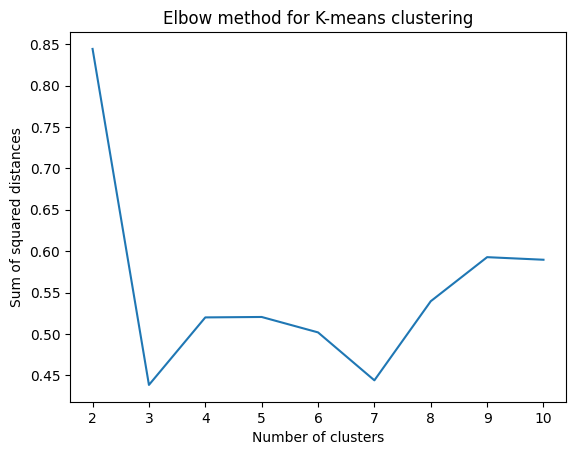

In [6]:
cost = []
for k in range(2, 11):
    kmeans = KMeans(featuresCol='features', k=k)
    model = kmeans.fit(new_df1)
    predictions = model.transform(new_df1)
    evaluator = ClusteringEvaluator()
    silhouette = evaluator.evaluate(predictions)
    cost.append(silhouette)

# plot the cost against the number of clusters
import matplotlib.pyplot as plt
plt.plot(range(2, 11), cost)
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow method for K-means clustering')
plt.show()


In [26]:
df=df1

In [27]:
train_data, test_data = df.randomSplit([0.8,0.2])


In [33]:
test_data.repartition(1).write.csv("testData29.csv", header=True)

In [40]:
vecAssembler2 = VectorAssembler(inputCols=["Lat", "Lon"], outputCol="features")
train_data = vecAssembler2.transform(train_data)


23/05/15 23:07:28 WARN Executor: Issue communicating with driver in heartbeater
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:322)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:101)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:85)
	at org.apache.spark.storage.BlockManagerMaster.registerBlockManager(BlockManagerMaster.scala:80)
	at org.apache.spark.storage.BlockManager.reregister(BlockManager.scala:641)
	at org.apache.spark.executor.Executor.reportHeartBeat(Executor.scala:1111)
	at org.apache.spark.executor.Executor.$anonfun$heartbeater$1(Executor.scala:244)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at org.apache.spark.util.Utils$.logUncaughtExceptions(Utils.scala:2088)
	at org.apache.spark.Heartbeater$$anon$1.run(Heartbeater.scala:46)
	at java.base/j

In [41]:
kmeans = KMeans(k=3, seed=1)
model1 = kmeans.fit(train_data.select('features'))
model_path1 ="/home/adar/project/bigdata/model29"
model1.save(model_path1)


23/05/15 23:07:38 WARN Executor: Issue communicating with driver in heartbeater 
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:322)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:101)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:85)
	at org.apache.spark.storage.BlockManagerMaster.registerBlockManager(BlockManagerMaster.scala:80)
	at org.apache.spark.storage.BlockManager.reregister(BlockManager.scala:641)
	at org.apache.spark.executor.Executor.reportHeartBeat(Executor.scala:1111)
	at org.apache.spark.executor.Executor.$anonfun$heartbeater$1(Executor.scala:244)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at org.apache.spark.util.Utils$.logUncaughtExceptions(Utils.scala:2088)
	at org.apache.spark.Heartbeater$$anon$1.run(Heartbeater.scala:46)
	at java.base/

23/05/15 23:07:48 ERROR Inbox: Ignoring error                                   
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:322)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRefByURI(RpcEnv.scala:102)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRef(RpcEnv.scala:110)
	at org.apache.spark.util.RpcUtils$.makeDriverRef(RpcUtils.scala:36)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.driverEndpoint$lzycompute(BlockManagerMasterEndpoint.scala:117)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.org$apache$spark$storage$BlockManagerMasterEndpoint$$driverEndpoint(BlockManagerMasterEndpoint.scala:116)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.isExecutorAlive$lzycompute$1(BlockManagerMasterEndpoint.scala:611)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.isExecutorAlive$1(BlockManagerMasterEndp

23/05/15 23:07:58 ERROR Inbox: Ignoring error
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:322)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRefByURI(RpcEnv.scala:102)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRef(RpcEnv.scala:110)
	at org.apache.spark.util.RpcUtils$.makeDriverRef(RpcUtils.scala:36)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.driverEndpoint$lzycompute(BlockManagerMasterEndpoint.scala:117)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.org$apache$spark$storage$BlockManagerMasterEndpoint$$driverEndpoint(BlockManagerMasterEndpoint.scala:116)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.isExecutorAlive$lzycompute$1(BlockManagerMasterEndpoint.scala:611)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.isExecutorAlive$1(BlockManagerMasterEndpoint.scala:610)
	at org.apache.spar

23/05/15 23:08:08 ERROR Inbox: Ignoring error
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:322)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRefByURI(RpcEnv.scala:102)
	at org.apache.spark.rpc.RpcEnv.setupEndpointRef(RpcEnv.scala:110)
	at org.apache.spark.util.RpcUtils$.makeDriverRef(RpcUtils.scala:36)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.driverEndpoint$lzycompute(BlockManagerMasterEndpoint.scala:117)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.org$apache$spark$storage$BlockManagerMasterEndpoint$$driverEndpoint(BlockManagerMasterEndpoint.scala:116)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.isExecutorAlive$lzycompute$1(BlockManagerMasterEndpoint.scala:611)
	at org.apache.spark.storage.BlockManagerMasterEndpoint.isExecutorAlive$1(BlockManagerMasterEndpoint.scala:610)
	at org.apache.spar

In [2]:
import time

In [6]:
client = KafkaClient(hosts="localhost:9092")

topicName='test_topic132'
topic = client.topics[topicName]
try:
    client.topics.create_topic(topic_name=topicName, partitions=1, replication_factor=1)
except :
    pass
df = spark.read.csv("/home/adar/project/bigdata/testData29x.csv", header=True)
data = [str(row) for row in df.collect()]


with topic.get_producer() as producer:
    for msg in data:
        time.sleep(0.001)
       
        print(msg)
        producer.produce(msg.encode("ascii"))


Row(Date/Time='8/1/2014 0:00:00', Lat='40.7476', Lon='-73.9871', Base='B02598')
Row(Date/Time='8/1/2014 0:01:00', Lat='40.7108', Lon='-73.9679', Base='B02598')
Row(Date/Time='8/1/2014 0:01:00', Lat='40.7686', Lon='-73.9697', Base='B02598')
Row(Date/Time='8/1/2014 0:02:00', Lat='40.6123', Lon='-73.956', Base='B02598')
Row(Date/Time='8/1/2014 0:02:00', Lat='40.7036', Lon='-73.9895', Base='B02598')
Row(Date/Time='8/1/2014 0:03:00', Lat='40.7366', Lon='-73.9906', Base='B02512')
Row(Date/Time='8/1/2014 0:03:00', Lat='40.7423', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/1/2014 0:03:00', Lat='40.7524', Lon='-73.9858', Base='B02598')
Row(Date/Time='8/1/2014 0:04:00', Lat='40.753', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/1/2014 0:05:00', Lat='40.7247', Lon='-73.9957', Base='B02598')
Row(Date/Time='8/1/2014 0:06:00', Lat='40.7304', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/1/2014 0:07:00', Lat='40.7136', Lon='-74.0101', Base='B02598')
Row(Date/Time='8/1/2014 0:08:00', Lat='40.

Row(Date/Time='8/1/2014 11:05:00', Lat='40.7317', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/1/2014 11:06:00', Lat='40.7486', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/1/2014 11:07:00', Lat='40.7666', Lon='-73.967', Base='B02512')
Row(Date/Time='8/1/2014 11:08:00', Lat='40.7684', Lon='-73.8622', Base='B02512')
Row(Date/Time='8/1/2014 11:08:00', Lat='40.7788', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/1/2014 11:09:00', Lat='40.7653', Lon='-73.9635', Base='B02598')
Row(Date/Time='8/1/2014 11:10:00', Lat='40.7241', Lon='-73.9969', Base='B02598')
Row(Date/Time='8/1/2014 11:10:00', Lat='40.7457', Lon='-73.9822', Base='B02598')
Row(Date/Time='8/1/2014 11:10:00', Lat='40.7484', Lon='-74.0036', Base='B02598')
Row(Date/Time='8/1/2014 11:14:00', Lat='40.6447', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/1/2014 11:14:00', Lat='40.7205', Lon='-73.9547', Base='B02598')
Row(Date/Time='8/1/2014 11:15:00', Lat='40.742', Lon='-73.9934', Base='B02598')
Row(Date/Time='8/1/2014 11:16:

Row(Date/Time='8/1/2014 12:46:00', Lat='40.7226', Lon='-74.0024', Base='B02512')
Row(Date/Time='8/1/2014 12:46:00', Lat='40.7568', Lon='-73.9705', Base='B02598')
Row(Date/Time='8/1/2014 12:46:00', Lat='40.7617', Lon='-73.9825', Base='B02598')
Row(Date/Time='8/1/2014 12:47:00', Lat='40.7056', Lon='-74.0077', Base='B02512')
Row(Date/Time='8/1/2014 12:48:00', Lat='40.7476', Lon='-73.9296', Base='B02598')
Row(Date/Time='8/1/2014 12:48:00', Lat='40.7585', Lon='-73.9685', Base='B02598')
Row(Date/Time='8/1/2014 12:48:00', Lat='40.7607', Lon='-73.9735', Base='B02512')
Row(Date/Time='8/1/2014 12:49:00', Lat='40.7068', Lon='-73.9512', Base='B02598')
Row(Date/Time='8/1/2014 12:50:00', Lat='40.7636', Lon='-73.973', Base='B02512')
Row(Date/Time='8/1/2014 12:51:00', Lat='40.7447', Lon='-73.991', Base='B02598')
Row(Date/Time='8/1/2014 12:51:00', Lat='40.7478', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/1/2014 12:51:00', Lat='40.7525', Lon='-73.9751', Base='B02598')
Row(Date/Time='8/1/2014 12:51:

Row(Date/Time='8/1/2014 13:59:00', Lat='40.7848', Lon='-73.9771', Base='B02598')
Row(Date/Time='8/1/2014 14:01:00', Lat='40.7535', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/1/2014 14:03:00', Lat='40.6601', Lon='-73.9796', Base='B02598')
Row(Date/Time='8/1/2014 14:03:00', Lat='40.9086', Lon='-73.1151', Base='B02598')
Row(Date/Time='8/1/2014 14:04:00', Lat='40.7497', Lon='-73.97', Base='B02598')
Row(Date/Time='8/1/2014 14:04:00', Lat='40.7809', Lon='-73.9788', Base='B02598')
Row(Date/Time='8/1/2014 14:07:00', Lat='40.7195', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/1/2014 14:07:00', Lat='40.7336', Lon='-74.002', Base='B02598')
Row(Date/Time='8/1/2014 14:08:00', Lat='40.7318', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/1/2014 14:09:00', Lat='40.6135', Lon='-74.0348', Base='B02598')
Row(Date/Time='8/1/2014 14:10:00', Lat='40.7555', Lon='-73.9706', Base='B02598')
Row(Date/Time='8/1/2014 14:12:00', Lat='40.7569', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/1/2014 14:12:0

Row(Date/Time='8/1/2014 15:08:00', Lat='40.7351', Lon='-74.0099', Base='B02598')
Row(Date/Time='8/1/2014 15:10:00', Lat='40.7425', Lon='-73.9829', Base='B02512')
Row(Date/Time='8/1/2014 15:10:00', Lat='40.7545', Lon='-73.9794', Base='B02598')
Row(Date/Time='8/1/2014 15:11:00', Lat='40.7483', Lon='-74.0079', Base='B02598')
Row(Date/Time='8/1/2014 15:12:00', Lat='40.759', Lon='-73.9694', Base='B02598')
Row(Date/Time='8/1/2014 15:13:00', Lat='40.7409', Lon='-73.9859', Base='B02598')
Row(Date/Time='8/1/2014 15:14:00', Lat='40.7052', Lon='-74.0077', Base='B02598')
Row(Date/Time='8/1/2014 15:14:00', Lat='40.7336', Lon='-73.9859', Base='B02512')
Row(Date/Time='8/1/2014 15:15:00', Lat='40.6809', Lon='-73.9498', Base='B02598')
Row(Date/Time='8/1/2014 15:15:00', Lat='40.7086', Lon='-74.0111', Base='B02598')
Row(Date/Time='8/1/2014 15:15:00', Lat='40.7449', Lon='-73.9859', Base='B02598')
Row(Date/Time='8/1/2014 15:15:00', Lat='40.7603', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/1/2014 15:15

Row(Date/Time='8/1/2014 16:02:00', Lat='40.7186', Lon='-74.0026', Base='B02598')
Row(Date/Time='8/1/2014 16:03:00', Lat='40.7665', Lon='-73.9603', Base='B02598')
Row(Date/Time='8/1/2014 16:03:00', Lat='40.7738', Lon='-73.9661', Base='B02598')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.6796', Lon='-73.976', Base='B02598')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.7024', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.7431', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.7592', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/1/2014 16:05:00', Lat='40.6957', Lon='-73.9974', Base='B02598')
Row(Date/Time='8/1/2014 16:05:00', Lat='40.722', Lon='-73.9918', Base='B02598')
Row(Date/Time='8/1/2014 16:05:00', Lat='40.7383', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/1/2014 16:05:00', Lat='40.7606', Lon='-73.9698', Base='B02598')
Row(Date/Time='8/1/2014 16:06:00', Lat='40.6756', Lon='-74.015', Base='B02598')
Row(Date/Time='8/1/2014 16:06:0

Row(Date/Time='8/1/2014 16:49:00', Lat='40.6459', Lon='-73.7766', Base='B02598')
Row(Date/Time='8/1/2014 16:49:00', Lat='40.7093', Lon='-74.0083', Base='B02598')
Row(Date/Time='8/1/2014 16:49:00', Lat='40.7486', Lon='-73.9176', Base='B02598')
Row(Date/Time='8/1/2014 16:49:00', Lat='40.7595', Lon='-73.9774', Base='B02512')
Row(Date/Time='8/1/2014 16:50:00', Lat='40.8363', Lon='-73.9422', Base='B02598')
Row(Date/Time='8/1/2014 16:51:00', Lat='40.752', Lon='-73.9768', Base='B02598')
Row(Date/Time='8/1/2014 16:51:00', Lat='40.7603', Lon='-73.9601', Base='B02598')
Row(Date/Time='8/1/2014 16:53:00', Lat='40.7291', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/1/2014 16:53:00', Lat='40.7556', Lon='-73.97', Base='B02598')
Row(Date/Time='8/1/2014 16:53:00', Lat='40.7814', Lon='-73.9804', Base='B02598')
Row(Date/Time='8/1/2014 16:54:00', Lat='40.7562', Lon='-73.9746', Base='B02598')
Row(Date/Time='8/1/2014 16:55:00', Lat='40.7379', Lon='-73.9808', Base='B02512')
Row(Date/Time='8/1/2014 16:55:0

Row(Date/Time='8/1/2014 17:34:00', Lat='40.7223', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/1/2014 17:34:00', Lat='40.7349', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/1/2014 17:34:00', Lat='40.7994', Lon='-73.6855', Base='B02598')
Row(Date/Time='8/1/2014 17:35:00', Lat='40.7252', Lon='-73.9966', Base='B02598')
Row(Date/Time='8/1/2014 17:35:00', Lat='40.7548', Lon='-73.9719', Base='B02512')
Row(Date/Time='8/1/2014 17:37:00', Lat='40.7447', Lon='-73.987', Base='B02598')
Row(Date/Time='8/1/2014 17:38:00', Lat='40.7083', Lon='-74.0082', Base='B02598')
Row(Date/Time='8/1/2014 17:38:00', Lat='40.7229', Lon='-74.0034', Base='B02598')
Row(Date/Time='8/1/2014 17:38:00', Lat='40.7264', Lon='-74.0024', Base='B02598')
Row(Date/Time='8/1/2014 17:38:00', Lat='40.7351', Lon='-73.9767', Base='B02598')
Row(Date/Time='8/1/2014 17:39:00', Lat='40.7057', Lon='-73.9374', Base='B02598')
Row(Date/Time='8/1/2014 17:39:00', Lat='40.7062', Lon='-74.016', Base='B02598')
Row(Date/Time='8/1/2014 17:39:

Row(Date/Time='8/1/2014 18:16:00', Lat='40.7262', Lon='-73.9562', Base='B02598')
Row(Date/Time='8/1/2014 18:16:00', Lat='40.7538', Lon='-73.9775', Base='B02598')
Row(Date/Time='8/1/2014 18:16:00', Lat='40.7778', Lon='-73.9834', Base='B02512')
Row(Date/Time='8/1/2014 18:17:00', Lat='40.5933', Lon='-73.9607', Base='B02512')
Row(Date/Time='8/1/2014 18:17:00', Lat='40.721', Lon='-74.0039', Base='B02598')
Row(Date/Time='8/1/2014 18:17:00', Lat='40.7358', Lon='-74.0071', Base='B02598')
Row(Date/Time='8/1/2014 18:17:00', Lat='40.7512', Lon='-73.9474', Base='B02598')
Row(Date/Time='8/1/2014 18:17:00', Lat='40.7804', Lon='-73.9795', Base='B02598')
Row(Date/Time='8/1/2014 18:19:00', Lat='40.6814', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/1/2014 18:19:00', Lat='40.6871', Lon='-73.9569', Base='B02512')
Row(Date/Time='8/1/2014 18:19:00', Lat='40.7214', Lon='-73.9948', Base='B02598')
Row(Date/Time='8/1/2014 18:19:00', Lat='40.7488', Lon='-73.9803', Base='B02598')
Row(Date/Time='8/1/2014 18:19

Row(Date/Time='8/1/2014 18:54:00', Lat='40.7736', Lon='-73.9636', Base='B02598')
Row(Date/Time='8/1/2014 18:54:00', Lat='40.7783', Lon='-73.9886', Base='B02598')
Row(Date/Time='8/1/2014 18:55:00', Lat='40.7079', Lon='-74.0078', Base='B02598')
Row(Date/Time='8/1/2014 18:55:00', Lat='40.726', Lon='-73.9897', Base='B02512')
Row(Date/Time='8/1/2014 18:55:00', Lat='40.7352', Lon='-73.9935', Base='B02512')
Row(Date/Time='8/1/2014 18:55:00', Lat='40.754', Lon='-73.9665', Base='B02598')
Row(Date/Time='8/1/2014 18:56:00', Lat='40.7668', Lon='-73.96', Base='B02598')
Row(Date/Time='8/1/2014 18:57:00', Lat='40.7341', Lon='-73.993', Base='B02598')
Row(Date/Time='8/1/2014 18:57:00', Lat='40.7417', Lon='-74.0037', Base='B02598')
Row(Date/Time='8/1/2014 18:57:00', Lat='40.7529', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/1/2014 18:57:00', Lat='40.7584', Lon='-73.9788', Base='B02598')
Row(Date/Time='8/1/2014 18:57:00', Lat='40.7686', Lon='-73.8763', Base='B02598')
Row(Date/Time='8/1/2014 18:58:00'

Row(Date/Time='8/1/2014 19:39:00', Lat='40.7609', Lon='-73.9966', Base='B02598')
Row(Date/Time='8/1/2014 19:39:00', Lat='40.7741', Lon='-73.8725', Base='B02598')
Row(Date/Time='8/1/2014 19:40:00', Lat='40.7083', Lon='-74.0053', Base='B02598')
Row(Date/Time='8/1/2014 19:40:00', Lat='40.7175', Lon='-73.9526', Base='B02598')
Row(Date/Time='8/1/2014 19:41:00', Lat='40.7235', Lon='-74.0107', Base='B02598')
Row(Date/Time='8/1/2014 19:41:00', Lat='40.7487', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/1/2014 19:41:00', Lat='40.756', Lon='-73.9963', Base='B02598')
Row(Date/Time='8/1/2014 19:41:00', Lat='40.8023', Lon='-73.9622', Base='B02598')
Row(Date/Time='8/1/2014 19:42:00', Lat='40.7442', Lon='-73.9749', Base='B02598')
Row(Date/Time='8/1/2014 19:42:00', Lat='40.755', Lon='-73.984', Base='B02598')
Row(Date/Time='8/1/2014 19:42:00', Lat='40.7806', Lon='-73.9503', Base='B02512')
Row(Date/Time='8/1/2014 19:43:00', Lat='40.7161', Lon='-73.9893', Base='B02598')
Row(Date/Time='8/1/2014 19:43:0

Row(Date/Time='8/1/2014 20:12:00', Lat='40.761', Lon='-73.9789', Base='B02598')
Row(Date/Time='8/1/2014 20:13:00', Lat='40.7536', Lon='-73.9948', Base='B02598')
Row(Date/Time='8/1/2014 20:14:00', Lat='40.6424', Lon='-73.7892', Base='B02598')
Row(Date/Time='8/1/2014 20:14:00', Lat='40.7093', Lon='-74.0171', Base='B02598')
Row(Date/Time='8/1/2014 20:15:00', Lat='40.7317', Lon='-74.0009', Base='B02598')
Row(Date/Time='8/1/2014 20:15:00', Lat='40.8143', Lon='-73.9355', Base='B02598')
Row(Date/Time='8/1/2014 20:16:00', Lat='40.6447', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/1/2014 20:16:00', Lat='40.7612', Lon='-73.9692', Base='B02598')
Row(Date/Time='8/1/2014 20:16:00', Lat='40.7678', Lon='-73.9618', Base='B02598')
Row(Date/Time='8/1/2014 20:17:00', Lat='40.7058', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/1/2014 20:17:00', Lat='40.7498', Lon='-74.0273', Base='B02598')
Row(Date/Time='8/1/2014 20:17:00', Lat='40.7635', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/1/2014 20:17

Row(Date/Time='8/1/2014 21:02:00', Lat='40.7387', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/1/2014 21:03:00', Lat='40.7149', Lon='-73.9445', Base='B02598')
Row(Date/Time='8/1/2014 21:03:00', Lat='40.721', Lon='-73.9789', Base='B02598')
Row(Date/Time='8/1/2014 21:04:00', Lat='40.6875', Lon='-73.9747', Base='B02598')
Row(Date/Time='8/1/2014 21:04:00', Lat='40.7194', Lon='-73.9973', Base='B02598')
Row(Date/Time='8/1/2014 21:04:00', Lat='40.7347', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/1/2014 21:06:00', Lat='40.6594', Lon='-73.9606', Base='B02598')
Row(Date/Time='8/1/2014 21:06:00', Lat='40.7088', Lon='-74.0081', Base='B02598')
Row(Date/Time='8/1/2014 21:06:00', Lat='40.7196', Lon='-73.9849', Base='B02598')
Row(Date/Time='8/1/2014 21:07:00', Lat='40.7093', Lon='-74.0006', Base='B02598')
Row(Date/Time='8/1/2014 21:07:00', Lat='40.7659', Lon='-73.9692', Base='B02598')
Row(Date/Time='8/1/2014 21:08:00', Lat='40.7206', Lon='-74.0104', Base='B02512')
Row(Date/Time='8/1/2014 21:10

Row(Date/Time='8/1/2014 21:50:00', Lat='40.78', Lon='-73.9446', Base='B02598')
Row(Date/Time='8/1/2014 21:51:00', Lat='40.6801', Lon='-73.997', Base='B02598')
Row(Date/Time='8/1/2014 21:51:00', Lat='40.7739', Lon='-73.8722', Base='B02598')
Row(Date/Time='8/1/2014 21:51:00', Lat='40.7762', Lon='-73.9558', Base='B02598')
Row(Date/Time='8/1/2014 21:52:00', Lat='40.7278', Lon='-73.9932', Base='B02598')
Row(Date/Time='8/1/2014 21:52:00', Lat='40.7377', Lon='-74.002', Base='B02512')
Row(Date/Time='8/1/2014 21:52:00', Lat='40.7421', Lon='-74.0008', Base='B02598')
Row(Date/Time='8/1/2014 21:52:00', Lat='40.7485', Lon='-73.977', Base='B02598')
Row(Date/Time='8/1/2014 21:53:00', Lat='40.7458', Lon='-73.988', Base='B02598')
Row(Date/Time='8/1/2014 21:53:00', Lat='40.7732', Lon='-73.8855', Base='B02512')
Row(Date/Time='8/1/2014 21:54:00', Lat='40.7177', Lon='-73.9414', Base='B02598')
Row(Date/Time='8/1/2014 21:54:00', Lat='40.7603', Lon='-73.9644', Base='B02598')
Row(Date/Time='8/1/2014 21:55:00',

Row(Date/Time='8/1/2014 22:30:00', Lat='40.7242', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/1/2014 22:30:00', Lat='40.7396', Lon='-74.0025', Base='B02598')
Row(Date/Time='8/1/2014 22:30:00', Lat='40.7684', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/1/2014 22:30:00', Lat='40.8828', Lon='-73.9082', Base='B02598')
Row(Date/Time='8/1/2014 22:31:00', Lat='40.7057', Lon='-73.9237', Base='B02598')
Row(Date/Time='8/1/2014 22:32:00', Lat='40.713', Lon='-73.9575', Base='B02598')
Row(Date/Time='8/1/2014 22:32:00', Lat='40.7388', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/1/2014 22:32:00', Lat='40.7886', Lon='-73.7823', Base='B02598')
Row(Date/Time='8/1/2014 22:33:00', Lat='40.7248', Lon='-73.9806', Base='B02598')
Row(Date/Time='8/1/2014 22:34:00', Lat='40.7104', Lon='-73.9582', Base='B02598')
Row(Date/Time='8/1/2014 22:34:00', Lat='40.726', Lon='-74.0086', Base='B02598')
Row(Date/Time='8/1/2014 22:34:00', Lat='40.7633', Lon='-73.9768', Base='B02598')
Row(Date/Time='8/1/2014 22:35:

Row(Date/Time='8/1/2014 23:17:00', Lat='40.764', Lon='-73.9943', Base='B02598')
Row(Date/Time='8/1/2014 23:18:00', Lat='40.6778', Lon='-73.9858', Base='B02598')
Row(Date/Time='8/1/2014 23:18:00', Lat='40.686', Lon='-73.9736', Base='B02598')
Row(Date/Time='8/1/2014 23:18:00', Lat='40.7305', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/1/2014 23:19:00', Lat='40.7144', Lon='-73.9655', Base='B02598')
Row(Date/Time='8/1/2014 23:19:00', Lat='40.7216', Lon='-73.9956', Base='B02598')
Row(Date/Time='8/1/2014 23:19:00', Lat='40.734', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/1/2014 23:19:00', Lat='40.7363', Lon='-74.0066', Base='B02598')
Row(Date/Time='8/1/2014 23:19:00', Lat='40.7565', Lon='-73.9829', Base='B02598')
Row(Date/Time='8/1/2014 23:19:00', Lat='40.7645', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/1/2014 23:20:00', Lat='40.7178', Lon='-73.9491', Base='B02598')
Row(Date/Time='8/1/2014 23:20:00', Lat='40.7296', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/1/2014 23:20:0

Row(Date/Time='8/1/2014 3:41:00', Lat='40.776', Lon='-73.9529', Base='B02598')
Row(Date/Time='8/1/2014 3:42:00', Lat='40.6535', Lon='-73.9498', Base='B02598')
Row(Date/Time='8/1/2014 3:46:00', Lat='40.7374', Lon='-74.0065', Base='B02598')
Row(Date/Time='8/1/2014 3:51:00', Lat='40.7244', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/1/2014 3:51:00', Lat='40.7961', Lon='-73.9615', Base='B02598')
Row(Date/Time='8/1/2014 3:57:00', Lat='40.7778', Lon='-73.9796', Base='B02512')
Row(Date/Time='8/1/2014 3:58:00', Lat='40.8577', Lon='-73.887', Base='B02598')
Row(Date/Time='8/1/2014 3:59:00', Lat='40.6933', Lon='-73.9737', Base='B02598')
Row(Date/Time='8/1/2014 4:02:00', Lat='40.7478', Lon='-74.0004', Base='B02598')
Row(Date/Time='8/1/2014 4:03:00', Lat='40.7944', Lon='-73.9662', Base='B02512')
Row(Date/Time='8/1/2014 4:05:00', Lat='40.7347', Lon='-73.9844', Base='B02598')
Row(Date/Time='8/1/2014 4:21:00', Lat='40.715', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/1/2014 4:21:00', Lat='40.7

Row(Date/Time='8/1/2014 6:55:00', Lat='40.7769', Lon='-73.9533', Base='B02512')
Row(Date/Time='8/1/2014 6:57:00', Lat='40.7433', Lon='-73.9769', Base='B02598')
Row(Date/Time='8/1/2014 6:57:00', Lat='40.7441', Lon='-73.9714', Base='B02512')
Row(Date/Time='8/1/2014 6:57:00', Lat='40.7746', Lon='-73.9544', Base='B02598')
Row(Date/Time='8/1/2014 6:58:00', Lat='40.7172', Lon='-73.945', Base='B02598')
Row(Date/Time='8/1/2014 6:58:00', Lat='40.7358', Lon='-73.998', Base='B02598')
Row(Date/Time='8/1/2014 6:58:00', Lat='40.775', Lon='-73.9894', Base='B02512')
Row(Date/Time='8/1/2014 6:59:00', Lat='40.7642', Lon='-73.9618', Base='B02598')
Row(Date/Time='8/1/2014 6:59:00', Lat='40.7702', Lon='-73.9497', Base='B02598')
Row(Date/Time='8/1/2014 7:01:00', Lat='40.745', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/1/2014 7:01:00', Lat='40.7537', Lon='-73.999', Base='B02598')
Row(Date/Time='8/1/2014 7:02:00', Lat='40.7322', Lon='-74.0023', Base='B02598')
Row(Date/Time='8/1/2014 7:04:00', Lat='40.725

Row(Date/Time='8/1/2014 8:22:00', Lat='40.7322', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/1/2014 8:22:00', Lat='40.7464', Lon='-73.9463', Base='B02598')
Row(Date/Time='8/1/2014 8:22:00', Lat='40.7828', Lon='-73.9779', Base='B02512')
Row(Date/Time='8/1/2014 8:23:00', Lat='40.741', Lon='-73.98', Base='B02598')
Row(Date/Time='8/1/2014 8:23:00', Lat='40.776', Lon='-73.9528', Base='B02512')
Row(Date/Time='8/1/2014 8:26:00', Lat='40.6855', Lon='-73.987', Base='B02598')
Row(Date/Time='8/1/2014 8:26:00', Lat='40.7311', Lon='-73.9821', Base='B02598')
Row(Date/Time='8/1/2014 8:26:00', Lat='40.7605', Lon='-73.9586', Base='B02598')
Row(Date/Time='8/1/2014 8:28:00', Lat='40.729', Lon='-73.9993', Base='B02598')
Row(Date/Time='8/1/2014 8:29:00', Lat='40.7064', Lon='-73.9225', Base='B02598')
Row(Date/Time='8/1/2014 8:30:00', Lat='40.7294', Lon='-73.9821', Base='B02598')
Row(Date/Time='8/1/2014 8:30:00', Lat='40.7691', Lon='-73.9814', Base='B02512')
Row(Date/Time='8/1/2014 8:31:00', Lat='40.6604

Row(Date/Time='8/1/2014 9:49:00', Lat='40.7773', Lon='-73.9753', Base='B02598')
Row(Date/Time='8/1/2014 9:52:00', Lat='40.7568', Lon='-73.9653', Base='B02598')
Row(Date/Time='8/1/2014 9:53:00', Lat='40.5779', Lon='-73.9607', Base='B02598')
Row(Date/Time='8/1/2014 9:53:00', Lat='40.7042', Lon='-73.987', Base='B02598')
Row(Date/Time='8/1/2014 9:54:00', Lat='40.7105', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/1/2014 9:56:00', Lat='40.7627', Lon='-73.9653', Base='B02598')
Row(Date/Time='8/1/2014 9:57:00', Lat='40.7256', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/1/2014 9:58:00', Lat='40.7284', Lon='-74.0053', Base='B02598')
Row(Date/Time='8/1/2014 9:59:00', Lat='40.7304', Lon='-74.0013', Base='B02598')
Row(Date/Time='8/10/2014 0:01:00', Lat='40.7223', Lon='-74.0052', Base='B02598')
Row(Date/Time='8/10/2014 0:01:00', Lat='40.7714', Lon='-73.9534', Base='B02598')
Row(Date/Time='8/10/2014 0:02:00', Lat='40.6981', Lon='-73.8991', Base='B02598')
Row(Date/Time='8/10/2014 0:03:00', Lat

Row(Date/Time='8/10/2014 10:18:00', Lat='40.717', Lon='-73.99', Base='B02598')
Row(Date/Time='8/10/2014 10:18:00', Lat='40.7221', Lon='-73.9966', Base='B02598')
Row(Date/Time='8/10/2014 10:19:00', Lat='40.7055', Lon='-74.0172', Base='B02598')
Row(Date/Time='8/10/2014 10:19:00', Lat='40.7163', Lon='-73.9877', Base='B02598')
Row(Date/Time='8/10/2014 10:24:00', Lat='40.7129', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/10/2014 10:26:00', Lat='40.6809', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/10/2014 10:26:00', Lat='40.7682', Lon='-73.9293', Base='B02512')
Row(Date/Time='8/10/2014 10:26:00', Lat='40.7844', Lon='-74.1365', Base='B02512')
Row(Date/Time='8/10/2014 10:27:00', Lat='40.6824', Lon='-73.9515', Base='B02598')
Row(Date/Time='8/10/2014 10:27:00', Lat='40.7584', Lon='-73.96', Base='B02598')
Row(Date/Time='8/10/2014 10:27:00', Lat='40.7814', Lon='-73.9562', Base='B02598')
Row(Date/Time='8/10/2014 10:36:00', Lat='40.7536', Lon='-73.9677', Base='B02598')
Row(Date/Time='8/10/2

Row(Date/Time='8/10/2014 12:55:00', Lat='40.818', Lon='-73.9542', Base='B02598')
Row(Date/Time='8/10/2014 12:57:00', Lat='40.7373', Lon='-73.9181', Base='B02598')
Row(Date/Time='8/10/2014 12:57:00', Lat='40.801', Lon='-73.9441', Base='B02598')
Row(Date/Time='8/10/2014 12:58:00', Lat='40.7683', Lon='-73.8622', Base='B02598')
Row(Date/Time='8/10/2014 13:00:00', Lat='40.7704', Lon='-73.8652', Base='B02512')
Row(Date/Time='8/10/2014 13:03:00', Lat='40.6939', Lon='-73.9994', Base='B02598')
Row(Date/Time='8/10/2014 13:03:00', Lat='40.7089', Lon='-73.7784', Base='B02598')
Row(Date/Time='8/10/2014 13:04:00', Lat='40.7411', Lon='-73.9785', Base='B02598')
Row(Date/Time='8/10/2014 13:05:00', Lat='40.7707', Lon='-73.8656', Base='B02598')
Row(Date/Time='8/10/2014 13:06:00', Lat='40.7186', Lon='-73.9833', Base='B02598')
Row(Date/Time='8/10/2014 13:06:00', Lat='40.7213', Lon='-74.0092', Base='B02598')
Row(Date/Time='8/10/2014 13:07:00', Lat='40.7161', Lon='-73.9621', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/10/2014 14:38:00', Lat='40.702', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/10/2014 14:39:00', Lat='40.6446', Lon='-73.7824', Base='B02598')
Row(Date/Time='8/10/2014 14:39:00', Lat='40.7293', Lon='-73.9991', Base='B02598')
Row(Date/Time='8/10/2014 14:40:00', Lat='40.7171', Lon='-73.963', Base='B02598')
Row(Date/Time='8/10/2014 14:40:00', Lat='40.7249', Lon='-73.8197', Base='B02598')
Row(Date/Time='8/10/2014 14:42:00', Lat='40.7943', Lon='-73.9748', Base='B02512')
Row(Date/Time='8/10/2014 14:43:00', Lat='40.6446', Lon='-73.7816', Base='B02598')
Row(Date/Time='8/10/2014 14:44:00', Lat='40.6908', Lon='-73.9965', Base='B02598')
Row(Date/Time='8/10/2014 14:46:00', Lat='40.7405', Lon='-73.9726', Base='B02598')
Row(Date/Time='8/10/2014 14:46:00', Lat='40.7725', Lon='-73.9773', Base='B02598')
Row(Date/Time='8/10/2014 14:47:00', Lat='40.72', Lon='-73.9955', Base='B02598')
Row(Date/Time='8/10/2014 14:48:00', Lat='40.6842', Lon='-73.9941', Base='B02598')
Row(Date/Time='8/10/

Row(Date/Time='8/10/2014 16:04:00', Lat='40.7167', Lon='-73.9656', Base='B02598')
Row(Date/Time='8/10/2014 16:04:00', Lat='40.7467', Lon='-73.9816', Base='B02598')
Row(Date/Time='8/10/2014 16:05:00', Lat='40.7603', Lon='-73.9846', Base='B02598')
Row(Date/Time='8/10/2014 16:06:00', Lat='40.691', Lon='-73.9421', Base='B02598')
Row(Date/Time='8/10/2014 16:06:00', Lat='40.8652', Lon='-73.9309', Base='B02598')
Row(Date/Time='8/10/2014 16:07:00', Lat='40.7605', Lon='-74.0028', Base='B02598')
Row(Date/Time='8/10/2014 16:08:00', Lat='40.7205', Lon='-74.0118', Base='B02512')
Row(Date/Time='8/10/2014 16:08:00', Lat='40.7269', Lon='-74.0107', Base='B02512')
Row(Date/Time='8/10/2014 16:08:00', Lat='40.7642', Lon='-73.9788', Base='B02598')
Row(Date/Time='8/10/2014 16:10:00', Lat='40.6834', Lon='-73.976', Base='B02598')
Row(Date/Time='8/10/2014 16:10:00', Lat='40.6891', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/10/2014 16:10:00', Lat='40.716', Lon='-73.9391', Base='B02598')
Row(Date/Time='8/10

Row(Date/Time='8/10/2014 17:19:00', Lat='40.7459', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/10/2014 17:21:00', Lat='40.6447', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/10/2014 17:21:00', Lat='40.7218', Lon='-73.9934', Base='B02598')
Row(Date/Time='8/10/2014 17:21:00', Lat='40.7355', Lon='-74.0641', Base='B02598')
Row(Date/Time='8/10/2014 17:21:00', Lat='40.7673', Lon='-73.8834', Base='B02598')
Row(Date/Time='8/10/2014 17:22:00', Lat='40.7228', Lon='-74.0', Base='B02598')
Row(Date/Time='8/10/2014 17:22:00', Lat='40.7406', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/10/2014 17:22:00', Lat='40.7682', Lon='-73.8621', Base='B02598')
Row(Date/Time='8/10/2014 17:23:00', Lat='40.8526', Lon='-73.9355', Base='B02598')
Row(Date/Time='8/10/2014 17:24:00', Lat='40.6951', Lon='-74.1785', Base='B02598')
Row(Date/Time='8/10/2014 17:25:00', Lat='40.7349', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/10/2014 17:25:00', Lat='40.7643', Lon='-73.9959', Base='B02598')
Row(Date/Time='8/10

Row(Date/Time='8/10/2014 19:45:00', Lat='40.8073', Lon='-73.7217', Base='B02512')
Row(Date/Time='8/10/2014 19:47:00', Lat='40.7176', Lon='-74.0025', Base='B02598')
Row(Date/Time='8/10/2014 19:47:00', Lat='40.7328', Lon='-73.8959', Base='B02598')
Row(Date/Time='8/10/2014 19:47:00', Lat='40.7445', Lon='-73.9813', Base='B02598')
Row(Date/Time='8/10/2014 19:49:00', Lat='40.6868', Lon='-73.9904', Base='B02598')
Row(Date/Time='8/10/2014 19:49:00', Lat='40.719', Lon='-73.9999', Base='B02598')
Row(Date/Time='8/10/2014 19:49:00', Lat='40.7565', Lon='-73.92', Base='B02598')
Row(Date/Time='8/10/2014 19:49:00', Lat='40.8173', Lon='-73.8236', Base='B02598')
Row(Date/Time='8/10/2014 19:50:00', Lat='40.7555', Lon='-73.9791', Base='B02598')
Row(Date/Time='8/10/2014 19:50:00', Lat='40.7685', Lon='-73.8625', Base='B02598')
Row(Date/Time='8/10/2014 19:51:00', Lat='40.7137', Lon='-74.035', Base='B02598')
Row(Date/Time='8/10/2014 19:51:00', Lat='40.7621', Lon='-73.9789', Base='B02598')
Row(Date/Time='8/10/

Row(Date/Time='8/10/2014 20:26:00', Lat='40.7561', Lon='-73.9632', Base='B02598')
Row(Date/Time='8/10/2014 20:28:00', Lat='40.7933', Lon='-73.9673', Base='B02598')
Row(Date/Time='8/10/2014 20:29:00', Lat='40.7363', Lon='-73.9508', Base='B02598')
Row(Date/Time='8/10/2014 20:29:00', Lat='40.7701', Lon='-73.9841', Base='B02598')
Row(Date/Time='8/10/2014 20:30:00', Lat='40.6438', Lon='-73.7834', Base='B02598')
Row(Date/Time='8/10/2014 20:31:00', Lat='40.6448', Lon='-73.7819', Base='B02598')
Row(Date/Time='8/10/2014 20:31:00', Lat='40.7471', Lon='-73.9564', Base='B02598')
Row(Date/Time='8/10/2014 20:32:00', Lat='40.7636', Lon='-73.9856', Base='B02512')
Row(Date/Time='8/10/2014 20:33:00', Lat='40.6449', Lon='-73.7819', Base='B02598')
Row(Date/Time='8/10/2014 20:33:00', Lat='40.673', Lon='-73.9733', Base='B02598')
Row(Date/Time='8/10/2014 20:34:00', Lat='40.7606', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/10/2014 20:36:00', Lat='40.7215', Lon='-74.0011', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/10/2014 22:20:00', Lat='40.6449', Lon='-73.782', Base='B02598')
Row(Date/Time='8/10/2014 22:22:00', Lat='40.6902', Lon='-73.9571', Base='B02598')
Row(Date/Time='8/10/2014 22:23:00', Lat='40.6954', Lon='-74.1777', Base='B02598')
Row(Date/Time='8/10/2014 22:24:00', Lat='40.7816', Lon='-73.9721', Base='B02598')
Row(Date/Time='8/10/2014 22:27:00', Lat='40.774', Lon='-73.8726', Base='B02598')
Row(Date/Time='8/10/2014 22:27:00', Lat='40.78', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/10/2014 22:28:00', Lat='40.7143', Lon='-74.0003', Base='B02598')
Row(Date/Time='8/10/2014 22:28:00', Lat='40.721', Lon='-73.9568', Base='B02598')
Row(Date/Time='8/10/2014 22:29:00', Lat='40.7726', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/10/2014 22:32:00', Lat='40.6482', Lon='-73.7855', Base='B02598')
Row(Date/Time='8/10/2014 22:32:00', Lat='40.7195', Lon='-73.9885', Base='B02598')
Row(Date/Time='8/10/2014 22:32:00', Lat='40.7597', Lon='-73.9916', Base='B02598')
Row(Date/Time='8/10/2

Row(Date/Time='8/10/2014 3:45:00', Lat='40.7351', Lon='-74.0084', Base='B02598')
Row(Date/Time='8/10/2014 3:46:00', Lat='40.7699', Lon='-74.0238', Base='B02512')
Row(Date/Time='8/10/2014 3:52:00', Lat='40.7455', Lon='-73.9984', Base='B02598')
Row(Date/Time='8/10/2014 3:55:00', Lat='40.7154', Lon='-73.9832', Base='B02598')
Row(Date/Time='8/10/2014 4:02:00', Lat='40.7424', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/10/2014 4:05:00', Lat='40.722', Lon='-73.9578', Base='B02598')
Row(Date/Time='8/10/2014 4:13:00', Lat='40.7679', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/10/2014 4:14:00', Lat='40.7956', Lon='-73.9658', Base='B02598')
Row(Date/Time='8/10/2014 4:15:00', Lat='40.7359', Lon='-74.0298', Base='B02512')
Row(Date/Time='8/10/2014 4:20:00', Lat='40.7449', Lon='-73.9716', Base='B02598')
Row(Date/Time='8/10/2014 4:20:00', Lat='40.764', Lon='-73.974', Base='B02598')
Row(Date/Time='8/10/2014 4:21:00', Lat='40.7484', Lon='-73.9879', Base='B02598')
Row(Date/Time='8/10/2014 4:23:0

Row(Date/Time='8/10/2014 9:05:00', Lat='40.7705', Lon='-73.8652', Base='B02598')
Row(Date/Time='8/10/2014 9:06:00', Lat='40.7402', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/10/2014 9:07:00', Lat='40.6832', Lon='-73.9652', Base='B02598')
Row(Date/Time='8/10/2014 9:10:00', Lat='40.6682', Lon='-73.7963', Base='B02512')
Row(Date/Time='8/10/2014 9:12:00', Lat='40.7343', Lon='-73.9884', Base='B02598')
Row(Date/Time='8/10/2014 9:12:00', Lat='40.7767', Lon='-73.981', Base='B02598')
Row(Date/Time='8/10/2014 9:16:00', Lat='40.7162', Lon='-73.9566', Base='B02598')
Row(Date/Time='8/10/2014 9:17:00', Lat='40.7321', Lon='-73.9576', Base='B02598')
Row(Date/Time='8/10/2014 9:18:00', Lat='40.6753', Lon='-73.9519', Base='B02598')
Row(Date/Time='8/10/2014 9:21:00', Lat='40.7561', Lon='-73.9751', Base='B02598')
Row(Date/Time='8/10/2014 9:24:00', Lat='40.7319', Lon='-74.0065', Base='B02512')
Row(Date/Time='8/10/2014 9:24:00', Lat='40.8021', Lon='-73.9682', Base='B02598')
Row(Date/Time='8/10/2014 9:27

Row(Date/Time='8/11/2014 10:57:00', Lat='40.7539', Lon='-73.9849', Base='B02598')
Row(Date/Time='8/11/2014 10:59:00', Lat='40.7467', Lon='-73.9848', Base='B02598')
Row(Date/Time='8/11/2014 11:01:00', Lat='40.7205', Lon='-73.9604', Base='B02598')
Row(Date/Time='8/11/2014 11:03:00', Lat='40.7345', Lon='-73.8653', Base='B02598')
Row(Date/Time='8/11/2014 11:08:00', Lat='40.6579', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/11/2014 11:09:00', Lat='40.7534', Lon='-73.992', Base='B02512')
Row(Date/Time='8/11/2014 11:10:00', Lat='40.7196', Lon='-73.9548', Base='B02598')
Row(Date/Time='8/11/2014 11:10:00', Lat='40.7557', Lon='-73.9709', Base='B02598')
Row(Date/Time='8/11/2014 11:11:00', Lat='40.7161', Lon='-74.0152', Base='B02598')
Row(Date/Time='8/11/2014 11:11:00', Lat='40.7452', Lon='-73.9887', Base='B02598')
Row(Date/Time='8/11/2014 11:14:00', Lat='40.7023', Lon='-74.0137', Base='B02598')
Row(Date/Time='8/11/2014 11:18:00', Lat='40.7915', Lon='-73.9527', Base='B02512')
Row(Date/Time='8/

Row(Date/Time='8/11/2014 12:58:00', Lat='40.7357', Lon='-73.9564', Base='B02598')
Row(Date/Time='8/11/2014 12:58:00', Lat='40.7371', Lon='-73.9982', Base='B02598')
Row(Date/Time='8/11/2014 12:59:00', Lat='40.7147', Lon='-74.0035', Base='B02512')
Row(Date/Time='8/11/2014 13:00:00', Lat='40.6875', Lon='-73.9959', Base='B02598')
Row(Date/Time='8/11/2014 13:00:00', Lat='40.6948', Lon='-74.1778', Base='B02598')
Row(Date/Time='8/11/2014 13:00:00', Lat='40.77', Lon='-73.8646', Base='B02598')
Row(Date/Time='8/11/2014 13:01:00', Lat='40.674', Lon='-73.7317', Base='B02512')
Row(Date/Time='8/11/2014 13:01:00', Lat='40.7542', Lon='-73.9868', Base='B02598')
Row(Date/Time='8/11/2014 13:01:00', Lat='40.8232', Lon='-73.9433', Base='B02598')
Row(Date/Time='8/11/2014 13:03:00', Lat='40.7027', Lon='-73.9174', Base='B02598')
Row(Date/Time='8/11/2014 13:03:00', Lat='40.7213', Lon='-73.9979', Base='B02598')
Row(Date/Time='8/11/2014 13:03:00', Lat='40.7509', Lon='-73.9829', Base='B02598')
Row(Date/Time='8/11

Row(Date/Time='8/11/2014 14:26:00', Lat='40.7472', Lon='-73.9912', Base='B02598')
Row(Date/Time='8/11/2014 14:26:00', Lat='40.7565', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/11/2014 14:26:00', Lat='40.7831', Lon='-73.9524', Base='B02598')
Row(Date/Time='8/11/2014 14:28:00', Lat='40.6816', Lon='-73.9514', Base='B02598')
Row(Date/Time='8/11/2014 14:29:00', Lat='40.7056', Lon='-74.0164', Base='B02598')
Row(Date/Time='8/11/2014 14:29:00', Lat='40.7564', Lon='-73.9766', Base='B02598')
Row(Date/Time='8/11/2014 14:30:00', Lat='40.7402', Lon='-73.9449', Base='B02598')
Row(Date/Time='8/11/2014 14:31:00', Lat='40.6305', Lon='-73.98', Base='B02598')
Row(Date/Time='8/11/2014 14:31:00', Lat='40.6415', Lon='-73.7885', Base='B02512')
Row(Date/Time='8/11/2014 14:32:00', Lat='40.7566', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/11/2014 14:33:00', Lat='40.7664', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/11/2014 14:34:00', Lat='40.7383', Lon='-73.9919', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/11/2014 15:51:00', Lat='40.7547', Lon='-73.975', Base='B02598')
Row(Date/Time='8/11/2014 15:52:00', Lat='40.756', Lon='-73.9831', Base='B02598')
Row(Date/Time='8/11/2014 15:53:00', Lat='40.7076', Lon='-74.0046', Base='B02512')
Row(Date/Time='8/11/2014 15:53:00', Lat='40.7122', Lon='-74.0076', Base='B02598')
Row(Date/Time='8/11/2014 15:53:00', Lat='40.7462', Lon='-73.982', Base='B02598')
Row(Date/Time='8/11/2014 15:53:00', Lat='40.8259', Lon='-73.9449', Base='B02598')
Row(Date/Time='8/11/2014 15:54:00', Lat='40.7515', Lon='-73.9813', Base='B02598')
Row(Date/Time='8/11/2014 15:55:00', Lat='40.7111', Lon='-73.9867', Base='B02598')
Row(Date/Time='8/11/2014 15:55:00', Lat='40.7172', Lon='-74.0017', Base='B02512')
Row(Date/Time='8/11/2014 15:55:00', Lat='40.7542', Lon='-73.9883', Base='B02512')
Row(Date/Time='8/11/2014 15:56:00', Lat='40.7087', Lon='-73.9446', Base='B02598')
Row(Date/Time='8/11/2014 15:57:00', Lat='40.6927', Lon='-73.9864', Base='B02512')
Row(Date/Time='8/11

Row(Date/Time='8/11/2014 17:14:00', Lat='40.7599', Lon='-73.9742', Base='B02598')
Row(Date/Time='8/11/2014 17:15:00', Lat='40.6465', Lon='-73.7901', Base='B02598')
Row(Date/Time='8/11/2014 17:15:00', Lat='40.7437', Lon='-74.0072', Base='B02512')
Row(Date/Time='8/11/2014 17:16:00', Lat='40.7455', Lon='-73.9775', Base='B02598')
Row(Date/Time='8/11/2014 17:16:00', Lat='40.751', Lon='-73.9826', Base='B02512')
Row(Date/Time='8/11/2014 17:16:00', Lat='40.7522', Lon='-73.9778', Base='B02598')
Row(Date/Time='8/11/2014 17:17:00', Lat='40.7427', Lon='-73.992', Base='B02512')
Row(Date/Time='8/11/2014 17:18:00', Lat='40.7513', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/11/2014 17:19:00', Lat='40.7214', Lon='-74.0092', Base='B02598')
Row(Date/Time='8/11/2014 17:20:00', Lat='40.7508', Lon='-73.9896', Base='B02598')
Row(Date/Time='8/11/2014 17:21:00', Lat='40.7276', Lon='-73.9833', Base='B02598')
Row(Date/Time='8/11/2014 17:22:00', Lat='40.7598', Lon='-73.9801', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/11/2014 18:29:00', Lat='40.7235', Lon='-74.0085', Base='B02598')
Row(Date/Time='8/11/2014 18:31:00', Lat='40.7026', Lon='-73.9903', Base='B02598')
Row(Date/Time='8/11/2014 18:31:00', Lat='40.7201', Lon='-74.0086', Base='B02598')
Row(Date/Time='8/11/2014 18:31:00', Lat='40.7613', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/11/2014 18:32:00', Lat='40.7446', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/11/2014 18:33:00', Lat='40.7321', Lon='-73.9988', Base='B02598')
Row(Date/Time='8/11/2014 18:34:00', Lat='40.7694', Lon='-73.983', Base='B02598')
Row(Date/Time='8/11/2014 18:34:00', Lat='40.8685', Lon='-73.9237', Base='B02598')
Row(Date/Time='8/11/2014 18:35:00', Lat='40.7595', Lon='-73.9781', Base='B02598')
Row(Date/Time='8/11/2014 18:36:00', Lat='40.7097', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/11/2014 18:37:00', Lat='40.7155', Lon='-74.0158', Base='B02598')
Row(Date/Time='8/11/2014 18:37:00', Lat='40.7224', Lon='-73.9825', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/11/2014 19:42:00', Lat='40.7625', Lon='-73.9686', Base='B02512')
Row(Date/Time='8/11/2014 19:43:00', Lat='40.7471', Lon='-73.9834', Base='B02598')
Row(Date/Time='8/11/2014 19:43:00', Lat='40.7505', Lon='-73.979', Base='B02598')
Row(Date/Time='8/11/2014 19:43:00', Lat='40.7715', Lon='-73.9893', Base='B02598')
Row(Date/Time='8/11/2014 19:44:00', Lat='40.7485', Lon='-73.9905', Base='B02598')
Row(Date/Time='8/11/2014 19:45:00', Lat='40.7562', Lon='-73.9868', Base='B02598')
Row(Date/Time='8/11/2014 19:46:00', Lat='40.7412', Lon='-74.0018', Base='B02598')
Row(Date/Time='8/11/2014 19:47:00', Lat='40.7246', Lon='-73.9987', Base='B02598')
Row(Date/Time='8/11/2014 19:47:00', Lat='40.726', Lon='-73.9919', Base='B02512')
Row(Date/Time='8/11/2014 19:48:00', Lat='40.724', Lon='-73.9928', Base='B02598')
Row(Date/Time='8/11/2014 19:48:00', Lat='40.7564', Lon='-73.9718', Base='B02598')
Row(Date/Time='8/11/2014 19:48:00', Lat='40.7766', Lon='-73.9567', Base='B02598')
Row(Date/Time='8/11

Row(Date/Time='8/11/2014 21:30:00', Lat='40.7225', Lon='-73.9943', Base='B02598')
Row(Date/Time='8/11/2014 21:30:00', Lat='40.7608', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/11/2014 21:32:00', Lat='40.7002', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/11/2014 21:33:00', Lat='40.7162', Lon='-74.009', Base='B02598')
Row(Date/Time='8/11/2014 21:33:00', Lat='40.7632', Lon='-73.9965', Base='B02598')
Row(Date/Time='8/11/2014 21:34:00', Lat='40.7513', Lon='-73.9749', Base='B02512')
Row(Date/Time='8/11/2014 21:34:00', Lat='40.7535', Lon='-73.9848', Base='B02598')
Row(Date/Time='8/11/2014 21:35:00', Lat='40.7075', Lon='-74.0086', Base='B02598')
Row(Date/Time='8/11/2014 21:35:00', Lat='40.7213', Lon='-74.0081', Base='B02598')
Row(Date/Time='8/11/2014 21:35:00', Lat='40.7445', Lon='-73.1419', Base='B02598')
Row(Date/Time='8/11/2014 21:36:00', Lat='40.7152', Lon='-74.367', Base='B02598')
Row(Date/Time='8/11/2014 21:37:00', Lat='40.7553', Lon='-73.9868', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/11/2014 3:14:00', Lat='40.7496', Lon='-73.9833', Base='B02598')
Row(Date/Time='8/11/2014 3:16:00', Lat='40.7018', Lon='-73.9206', Base='B02598')
Row(Date/Time='8/11/2014 3:30:00', Lat='40.7461', Lon='-73.9417', Base='B02598')
Row(Date/Time='8/11/2014 3:33:00', Lat='40.7155', Lon='-73.956', Base='B02598')
Row(Date/Time='8/11/2014 3:37:00', Lat='40.7275', Lon='-74.0004', Base='B02598')
Row(Date/Time='8/11/2014 3:38:00', Lat='40.7282', Lon='-73.9879', Base='B02598')
Row(Date/Time='8/11/2014 3:40:00', Lat='40.7514', Lon='-73.9718', Base='B02598')
Row(Date/Time='8/11/2014 3:44:00', Lat='40.7206', Lon='-73.981', Base='B02598')
Row(Date/Time='8/11/2014 3:54:00', Lat='40.7496', Lon='-73.9871', Base='B02598')
Row(Date/Time='8/11/2014 3:56:00', Lat='40.6829', Lon='-74.0', Base='B02598')
Row(Date/Time='8/11/2014 4:00:00', Lat='40.7329', Lon='-73.996', Base='B02598')
Row(Date/Time='8/11/2014 4:02:00', Lat='40.7582', Lon='-73.9318', Base='B02598')
Row(Date/Time='8/11/2014 4:03:00',

Row(Date/Time='8/11/2014 6:40:00', Lat='40.7126', Lon='-73.8217', Base='B02512')
Row(Date/Time='8/11/2014 6:40:00', Lat='40.7321', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/11/2014 6:41:00', Lat='40.7129', Lon='-73.9636', Base='B02598')
Row(Date/Time='8/11/2014 6:43:00', Lat='40.7344', Lon='-73.9947', Base='B02598')
Row(Date/Time='8/11/2014 6:44:00', Lat='40.7112', Lon='-73.9596', Base='B02598')
Row(Date/Time='8/11/2014 6:44:00', Lat='40.7411', Lon='-73.9807', Base='B02512')
Row(Date/Time='8/11/2014 6:45:00', Lat='40.6838', Lon='-73.965', Base='B02598')
Row(Date/Time='8/11/2014 6:46:00', Lat='40.6447', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/11/2014 6:46:00', Lat='40.6691', Lon='-73.9876', Base='B02598')
Row(Date/Time='8/11/2014 6:46:00', Lat='40.7331', Lon='-73.9947', Base='B02512')
Row(Date/Time='8/11/2014 6:47:00', Lat='40.7289', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/11/2014 6:47:00', Lat='40.7324', Lon='-74.0078', Base='B02598')
Row(Date/Time='8/11/2014 6:47

Row(Date/Time='8/11/2014 8:10:00', Lat='40.7226', Lon='-73.9774', Base='B02598')
Row(Date/Time='8/11/2014 8:11:00', Lat='40.7297', Lon='-73.991', Base='B02598')
Row(Date/Time='8/11/2014 8:12:00', Lat='40.7345', Lon='-73.9543', Base='B02598')
Row(Date/Time='8/11/2014 8:12:00', Lat='40.7374', Lon='-73.99', Base='B02598')
Row(Date/Time='8/11/2014 8:13:00', Lat='40.7615', Lon='-73.9587', Base='B02598')
Row(Date/Time='8/11/2014 8:14:00', Lat='40.6476', Lon='-73.7808', Base='B02598')
Row(Date/Time='8/11/2014 8:14:00', Lat='40.7369', Lon='-73.9867', Base='B02598')
Row(Date/Time='8/11/2014 8:15:00', Lat='40.7186', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/11/2014 8:15:00', Lat='40.726', Lon='-73.9918', Base='B02598')
Row(Date/Time='8/11/2014 8:15:00', Lat='40.7263', Lon='-73.9803', Base='B02598')
Row(Date/Time='8/11/2014 8:15:00', Lat='40.729', Lon='-73.9831', Base='B02598')
Row(Date/Time='8/11/2014 8:15:00', Lat='40.742', Lon='-73.9746', Base='B02598')
Row(Date/Time='8/11/2014 8:15:00',

Row(Date/Time='8/12/2014 0:27:00', Lat='40.6653', Lon='-73.9896', Base='B02598')
Row(Date/Time='8/12/2014 0:35:00', Lat='40.6352', Lon='-73.892', Base='B02598')
Row(Date/Time='8/12/2014 0:36:00', Lat='40.7573', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/12/2014 0:39:00', Lat='40.7299', Lon='-73.9807', Base='B02512')
Row(Date/Time='8/12/2014 0:40:00', Lat='40.6952', Lon='-74.1789', Base='B02512')
Row(Date/Time='8/12/2014 0:41:00', Lat='40.722', Lon='-74.0041', Base='B02598')
Row(Date/Time='8/12/2014 10:01:00', Lat='40.7582', Lon='-73.9625', Base='B02512')
Row(Date/Time='8/12/2014 10:01:00', Lat='40.7655', Lon='-73.972', Base='B02598')
Row(Date/Time='8/12/2014 10:02:00', Lat='40.7503', Lon='-73.9947', Base='B02598')
Row(Date/Time='8/12/2014 10:05:00', Lat='40.6052', Lon='-73.9693', Base='B02598')
Row(Date/Time='8/12/2014 10:05:00', Lat='40.7019', Lon='-73.9897', Base='B02598')
Row(Date/Time='8/12/2014 10:05:00', Lat='40.7361', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/12/2014 

Row(Date/Time='8/12/2014 12:53:00', Lat='40.7228', Lon='-73.993', Base='B02598')
Row(Date/Time='8/12/2014 12:53:00', Lat='40.7685', Lon='-73.8625', Base='B02598')
Row(Date/Time='8/12/2014 12:54:00', Lat='40.7716', Lon='-73.9607', Base='B02598')
Row(Date/Time='8/12/2014 12:57:00', Lat='40.7623', Lon='-73.9781', Base='B02598')
Row(Date/Time='8/12/2014 12:57:00', Lat='40.8057', Lon='-74.0777', Base='B02512')
Row(Date/Time='8/12/2014 13:00:00', Lat='40.7523', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/12/2014 13:00:00', Lat='40.7914', Lon='-73.9526', Base='B02598')
Row(Date/Time='8/12/2014 13:01:00', Lat='40.7208', Lon='-74.0051', Base='B02598')
Row(Date/Time='8/12/2014 13:01:00', Lat='40.7475', Lon='-73.9825', Base='B02598')
Row(Date/Time='8/12/2014 13:01:00', Lat='40.7505', Lon='-73.9863', Base='B02598')
Row(Date/Time='8/12/2014 13:04:00', Lat='40.7669', Lon='-73.9628', Base='B02598')
Row(Date/Time='8/12/2014 13:09:00', Lat='40.7212', Lon='-74.0114', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/12/2014 14:14:00', Lat='40.7083', Lon='-74.0079', Base='B02598')
Row(Date/Time='8/12/2014 14:15:00', Lat='40.7429', Lon='-73.9867', Base='B02512')
Row(Date/Time='8/12/2014 14:15:00', Lat='40.7685', Lon='-73.8625', Base='B02598')
Row(Date/Time='8/12/2014 14:15:00', Lat='40.7883', Lon='-73.9532', Base='B02598')
Row(Date/Time='8/12/2014 14:16:00', Lat='40.7581', Lon='-73.9767', Base='B02598')
Row(Date/Time='8/12/2014 14:16:00', Lat='40.7675', Lon='-73.9826', Base='B02598')
Row(Date/Time='8/12/2014 14:17:00', Lat='40.7604', Lon='-73.9839', Base='B02598')
Row(Date/Time='8/12/2014 14:17:00', Lat='40.7747', Lon='-73.9487', Base='B02598')
Row(Date/Time='8/12/2014 14:17:00', Lat='40.778', Lon='-73.959', Base='B02598')
Row(Date/Time='8/12/2014 14:18:00', Lat='40.7185', Lon='-74.0071', Base='B02598')
Row(Date/Time='8/12/2014 14:19:00', Lat='40.7112', Lon='-74.0162', Base='B02598')
Row(Date/Time='8/12/2014 14:19:00', Lat='40.774', Lon='-73.8725', Base='B02598')
Row(Date/Time='8/12

Row(Date/Time='8/12/2014 15:12:00', Lat='40.7636', Lon='-73.9757', Base='B02598')
Row(Date/Time='8/12/2014 15:14:00', Lat='40.7425', Lon='-73.9868', Base='B02598')
Row(Date/Time='8/12/2014 15:15:00', Lat='40.7489', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/12/2014 15:15:00', Lat='40.7634', Lon='-73.9774', Base='B02598')
Row(Date/Time='8/12/2014 15:16:00', Lat='40.7192', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/12/2014 15:16:00', Lat='40.724', Lon='-73.9981', Base='B02598')
Row(Date/Time='8/12/2014 15:16:00', Lat='40.7521', Lon='-73.9674', Base='B02598')
Row(Date/Time='8/12/2014 15:18:00', Lat='40.7423', Lon='-73.9835', Base='B02598')
Row(Date/Time='8/12/2014 15:21:00', Lat='40.6448', Lon='-73.782', Base='B02598')
Row(Date/Time='8/12/2014 15:21:00', Lat='40.7537', Lon='-73.999', Base='B02512')
Row(Date/Time='8/12/2014 15:21:00', Lat='40.8063', Lon='-73.9577', Base='B02598')
Row(Date/Time='8/12/2014 15:23:00', Lat='40.7598', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/12

Row(Date/Time='8/12/2014 16:07:00', Lat='40.7175', Lon='-74.0162', Base='B02598')
Row(Date/Time='8/12/2014 16:08:00', Lat='40.7313', Lon='-73.9923', Base='B02512')
Row(Date/Time='8/12/2014 16:08:00', Lat='40.7522', Lon='-73.9796', Base='B02598')
Row(Date/Time='8/12/2014 16:10:00', Lat='40.711', Lon='-73.9434', Base='B02598')
Row(Date/Time='8/12/2014 16:10:00', Lat='40.7507', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/12/2014 16:10:00', Lat='40.8033', Lon='-73.9567', Base='B02598')
Row(Date/Time='8/12/2014 16:11:00', Lat='40.7071', Lon='-74.0049', Base='B02598')
Row(Date/Time='8/12/2014 16:12:00', Lat='40.7611', Lon='-73.9668', Base='B02512')
Row(Date/Time='8/12/2014 16:13:00', Lat='40.7665', Lon='-73.9794', Base='B02598')
Row(Date/Time='8/12/2014 16:14:00', Lat='40.6657', Lon='-73.9773', Base='B02598')
Row(Date/Time='8/12/2014 16:14:00', Lat='40.7356', Lon='-73.9966', Base='B02598')
Row(Date/Time='8/12/2014 16:14:00', Lat='40.7707', Lon='-73.9619', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/12/2014 16:54:00', Lat='40.7464', Lon='-73.9928', Base='B02598')
Row(Date/Time='8/12/2014 16:54:00', Lat='40.7484', Lon='-74.0036', Base='B02598')
Row(Date/Time='8/12/2014 16:55:00', Lat='40.7218', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/12/2014 16:56:00', Lat='40.7042', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/12/2014 16:56:00', Lat='40.7441', Lon='-73.9837', Base='B02598')
Row(Date/Time='8/12/2014 16:56:00', Lat='40.7545', Lon='-73.9781', Base='B02598')
Row(Date/Time='8/12/2014 16:56:00', Lat='40.7591', Lon='-73.9725', Base='B02598')
Row(Date/Time='8/12/2014 16:56:00', Lat='40.7591', Lon='-73.9723', Base='B02598')
Row(Date/Time='8/12/2014 16:57:00', Lat='40.7576', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/12/2014 16:58:00', Lat='40.7459', Lon='-73.9825', Base='B02512')
Row(Date/Time='8/12/2014 16:58:00', Lat='40.7527', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/12/2014 16:58:00', Lat='40.7623', Lon='-73.9682', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/12/2014 17:56:00', Lat='40.6848', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/12/2014 17:56:00', Lat='40.7466', Lon='-73.9841', Base='B02598')
Row(Date/Time='8/12/2014 17:56:00', Lat='40.7876', Lon='-73.9537', Base='B02598')
Row(Date/Time='8/12/2014 17:57:00', Lat='40.7652', Lon='-73.9619', Base='B02512')
Row(Date/Time='8/12/2014 17:59:00', Lat='40.719', Lon='-73.9418', Base='B02598')
Row(Date/Time='8/12/2014 17:59:00', Lat='40.7373', Lon='-74.0039', Base='B02598')
Row(Date/Time='8/12/2014 17:59:00', Lat='40.7526', Lon='-73.9858', Base='B02598')
Row(Date/Time='8/12/2014 17:59:00', Lat='40.7785', Lon='-73.955', Base='B02598')
Row(Date/Time='8/12/2014 18:00:00', Lat='40.6936', Lon='-73.9995', Base='B02598')
Row(Date/Time='8/12/2014 18:00:00', Lat='40.7406', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/12/2014 18:00:00', Lat='40.7463', Lon='-73.9839', Base='B02598')
Row(Date/Time='8/12/2014 18:00:00', Lat='40.7573', Lon='-73.9745', Base='B02512')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 18:32:00', Lat='40.7347', Lon='-73.9922', Base='B02512')
Row(Date/Time='8/12/2014 18:32:00', Lat='40.7535', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/12/2014 18:33:00', Lat='40.7161', Lon='-73.958', Base='B02598')
Row(Date/Time='8/12/2014 18:33:00', Lat='40.7269', Lon='-74.0021', Base='B02598')
Row(Date/Time='8/12/2014 18:33:00', Lat='40.7384', Lon='-74.0065', Base='B02598')
Row(Date/Time='8/12/2014 18:33:00', Lat='40.7559', Lon='-73.9754', Base='B02512')
Row(Date/Time='8/12/2014 18:33:00', Lat='40.7825', Lon='-74.0061', Base='B02598')
Row(Date/Time='8/12/2014 18:34:00', Lat='40.7221', Lon='-74.0006', Base='B02598')
Row(Date/Time='8/12/2014 18:34:00', Lat='40.7343', Lon='-73.9937', Base='B02598')
Row(Date/Time='8/12/2014 18:34:00', Lat='40.7383', Lon='-73.992', Base='B02512')
Row(Date/Time='8/12/2014 18:34:00', Lat='40.7551', Lon='-73.9793', Base='B02512')
Row(Date/Time='8/12/2014 18:34:00', Lat='40.7576', Lon='-73.9826', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 19:04:00', Lat='40.7683', Lon='-73.963', Base='B02598')
Row(Date/Time='8/12/2014 19:05:00', Lat='40.7068', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/12/2014 19:05:00', Lat='40.7132', Lon='-74.0091', Base='B02598')
Row(Date/Time='8/12/2014 19:05:00', Lat='40.729', Lon='-74.0036', Base='B02598')
Row(Date/Time='8/12/2014 19:05:00', Lat='40.7631', Lon='-73.9723', Base='B02598')
Row(Date/Time='8/12/2014 19:06:00', Lat='40.7188', Lon='-73.9522', Base='B02598')
Row(Date/Time='8/12/2014 19:06:00', Lat='40.719', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/12/2014 19:06:00', Lat='40.7491', Lon='-73.9885', Base='B02598')
Row(Date/Time='8/12/2014 19:06:00', Lat='40.7505', Lon='-73.997', Base='B02598')
Row(Date/Time='8/12/2014 19:06:00', Lat='40.7598', Lon='-73.9711', Base='B02598')
Row(Date/Time='8/12/2014 19:06:00', Lat='40.8609', Lon='-73.9324', Base='B02598')
Row(Date/Time='8/12/2014 19:08:00', Lat='40.6727', Lon='-73.9572', Base='B02512')
Row(Date/Time='8/12/

Row(Date/Time='8/12/2014 19:57:00', Lat='40.7544', Lon='-73.9924', Base='B02598')
Row(Date/Time='8/12/2014 19:57:00', Lat='40.756', Lon='-73.9688', Base='B02598')
Row(Date/Time='8/12/2014 19:57:00', Lat='40.7642', Lon='-73.9749', Base='B02512')
Row(Date/Time='8/12/2014 19:58:00', Lat='40.758', Lon='-73.9822', Base='B02598')
Row(Date/Time='8/12/2014 19:58:00', Lat='40.7581', Lon='-73.9719', Base='B02512')
Row(Date/Time='8/12/2014 19:58:00', Lat='40.7581', Lon='-73.9719', Base='B02512')
Row(Date/Time='8/12/2014 19:59:00', Lat='40.7411', Lon='-73.9959', Base='B02598')
Row(Date/Time='8/12/2014 19:59:00', Lat='40.765', Lon='-73.977', Base='B02598')
Row(Date/Time='8/12/2014 19:59:00', Lat='40.7673', Lon='-73.9816', Base='B02512')
Row(Date/Time='8/12/2014 1:01:00', Lat='40.7197', Lon='-74.0068', Base='B02598')
Row(Date/Time='8/12/2014 1:08:00', Lat='40.7023', Lon='-73.7786', Base='B02598')
Row(Date/Time='8/12/2014 1:39:00', Lat='40.7943', Lon='-73.9718', Base='B02512')
Row(Date/Time='8/12/201

Row(Date/Time='8/12/2014 20:42:00', Lat='40.7135', Lon='-74.0117', Base='B02512')
Row(Date/Time='8/12/2014 20:42:00', Lat='40.7159', Lon='-74.0089', Base='B02598')
Row(Date/Time='8/12/2014 20:43:00', Lat='40.738', Lon='-73.9908', Base='B02512')
Row(Date/Time='8/12/2014 20:43:00', Lat='40.7545', Lon='-73.9775', Base='B02598')
Row(Date/Time='8/12/2014 20:43:00', Lat='40.7636', Lon='-73.9758', Base='B02512')
Row(Date/Time='8/12/2014 20:43:00', Lat='40.7685', Lon='-73.8626', Base='B02512')
Row(Date/Time='8/12/2014 20:44:00', Lat='40.7186', Lon='-74.0061', Base='B02598')
Row(Date/Time='8/12/2014 20:44:00', Lat='40.7325', Lon='-74.0052', Base='B02512')
Row(Date/Time='8/12/2014 20:44:00', Lat='40.7379', Lon='-73.9216', Base='B02598')
Row(Date/Time='8/12/2014 20:44:00', Lat='40.7405', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/12/2014 20:44:00', Lat='40.7496', Lon='-73.9755', Base='B02512')
Row(Date/Time='8/12/2014 20:45:00', Lat='40.7401', Lon='-73.974', Base='B02512')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 22:24:00', Lat='40.8395', Lon='-73.8208', Base='B02598')
Row(Date/Time='8/12/2014 22:26:00', Lat='40.7296', Lon='-73.9881', Base='B02598')
Row(Date/Time='8/12/2014 22:26:00', Lat='40.7806', Lon='-73.9813', Base='B02598')
Row(Date/Time='8/12/2014 22:26:00', Lat='40.8731', Lon='-73.86', Base='B02598')
Row(Date/Time='8/12/2014 22:27:00', Lat='40.8333', Lon='-73.9392', Base='B02598')
Row(Date/Time='8/12/2014 22:28:00', Lat='40.7217', Lon='-73.9945', Base='B02598')
Row(Date/Time='8/12/2014 22:28:00', Lat='40.7457', Lon='-74.0055', Base='B02598')
Row(Date/Time='8/12/2014 22:29:00', Lat='40.7322', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/12/2014 22:31:00', Lat='40.7274', Lon='-74.0082', Base='B02598')
Row(Date/Time='8/12/2014 22:31:00', Lat='40.7298', Lon='-73.9915', Base='B02598')
Row(Date/Time='8/12/2014 22:31:00', Lat='40.7536', Lon='-73.9692', Base='B02598')
Row(Date/Time='8/12/2014 22:32:00', Lat='40.7383', Lon='-74.0095', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 3:46:00', Lat='40.6843', Lon='-73.9494', Base='B02598')
Row(Date/Time='8/12/2014 3:47:00', Lat='40.7072', Lon='-74.0049', Base='B02598')
Row(Date/Time='8/12/2014 3:47:00', Lat='40.7083', Lon='-74.0153', Base='B02598')
Row(Date/Time='8/12/2014 3:51:00', Lat='40.7507', Lon='-74.0036', Base='B02598')
Row(Date/Time='8/12/2014 3:52:00', Lat='40.7003', Lon='-73.9458', Base='B02598')
Row(Date/Time='8/12/2014 3:58:00', Lat='40.6768', Lon='-73.9491', Base='B02598')
Row(Date/Time='8/12/2014 4:07:00', Lat='40.6816', Lon='-74.0011', Base='B02598')
Row(Date/Time='8/12/2014 4:07:00', Lat='40.7648', Lon='-73.9473', Base='B02598')
Row(Date/Time='8/12/2014 4:12:00', Lat='40.7556', Lon='-73.9738', Base='B02598')
Row(Date/Time='8/12/2014 4:33:00', Lat='40.7083', Lon='-73.8286', Base='B02598')
Row(Date/Time='8/12/2014 4:34:00', Lat='40.7311', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/12/2014 4:39:00', Lat='40.724', Lon='-73.9413', Base='B02598')
Row(Date/Time='8/12/2014 4:39

Row(Date/Time='8/12/2014 7:14:00', Lat='40.675', Lon='-73.9646', Base='B02512')
Row(Date/Time='8/12/2014 7:14:00', Lat='40.7487', Lon='-74.002', Base='B02598')
Row(Date/Time='8/12/2014 7:15:00', Lat='40.7707', Lon='-73.8652', Base='B02598')
Row(Date/Time='8/12/2014 7:16:00', Lat='40.7413', Lon='-73.9862', Base='B02598')
Row(Date/Time='8/12/2014 7:16:00', Lat='40.7636', Lon='-73.972', Base='B02512')
Row(Date/Time='8/12/2014 7:16:00', Lat='40.7686', Lon='-73.8624', Base='B02598')
Row(Date/Time='8/12/2014 7:17:00', Lat='40.7232', Lon='-74.0532', Base='B02598')
Row(Date/Time='8/12/2014 7:17:00', Lat='40.7755', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/12/2014 7:17:00', Lat='40.7986', Lon='-73.9671', Base='B02512')
Row(Date/Time='8/12/2014 7:18:00', Lat='40.6774', Lon='-73.9725', Base='B02598')
Row(Date/Time='8/12/2014 7:18:00', Lat='40.7025', Lon='-73.9867', Base='B02598')
Row(Date/Time='8/12/2014 7:18:00', Lat='40.7244', Lon='-74.0021', Base='B02598')
Row(Date/Time='8/12/2014 7:20:0

Row(Date/Time='8/12/2014 8:38:00', Lat='40.7801', Lon='-73.9802', Base='B02598')
Row(Date/Time='8/12/2014 8:39:00', Lat='40.7697', Lon='-73.9517', Base='B02598')
Row(Date/Time='8/12/2014 8:40:00', Lat='40.6876', Lon='-73.9985', Base='B02598')
Row(Date/Time='8/12/2014 8:40:00', Lat='40.7236', Lon='-74.0108', Base='B02598')
Row(Date/Time='8/12/2014 8:40:00', Lat='40.7374', Lon='-73.9792', Base='B02512')
Row(Date/Time='8/12/2014 8:40:00', Lat='40.7674', Lon='-73.9548', Base='B02598')
Row(Date/Time='8/12/2014 8:41:00', Lat='40.7168', Lon='-73.9647', Base='B02598')
Row(Date/Time='8/12/2014 8:42:00', Lat='40.7585', Lon='-73.9868', Base='B02512')
Row(Date/Time='8/12/2014 8:43:00', Lat='40.7165', Lon='-74.0051', Base='B02598')
Row(Date/Time='8/12/2014 8:43:00', Lat='40.7394', Lon='-74.0061', Base='B02598')
Row(Date/Time='8/12/2014 8:46:00', Lat='40.7324', Lon='-73.981', Base='B02598')
Row(Date/Time='8/12/2014 8:46:00', Lat='40.774', Lon='-73.8728', Base='B02512')
Row(Date/Time='8/12/2014 8:46:

Row(Date/Time='8/13/2014 0:44:00', Lat='40.7778', Lon='-73.9616', Base='B02512')
Row(Date/Time='8/13/2014 0:45:00', Lat='40.7443', Lon='-73.9845', Base='B02598')
Row(Date/Time='8/13/2014 0:47:00', Lat='40.6483', Lon='-73.7828', Base='B02598')
Row(Date/Time='8/13/2014 0:56:00', Lat='40.7606', Lon='-73.9622', Base='B02598')
Row(Date/Time='8/13/2014 0:57:00', Lat='40.6878', Lon='-74.1817', Base='B02598')
Row(Date/Time='8/13/2014 10:00:00', Lat='40.7604', Lon='-73.9578', Base='B02598')
Row(Date/Time='8/13/2014 10:01:00', Lat='40.7141', Lon='-74.0115', Base='B02598')
Row(Date/Time='8/13/2014 10:02:00', Lat='40.7505', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/13/2014 10:02:00', Lat='40.77', Lon='-73.8645', Base='B02598')
Row(Date/Time='8/13/2014 10:03:00', Lat='40.6448', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/13/2014 10:03:00', Lat='40.768', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/13/2014 10:04:00', Lat='40.7622', Lon='-73.9748', Base='B02598')
Row(Date/Time='8/13/2014

Row(Date/Time='8/13/2014 13:09:00', Lat='40.7516', Lon='-73.9764', Base='B02598')
Row(Date/Time='8/13/2014 13:10:00', Lat='40.7216', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/13/2014 13:11:00', Lat='40.7703', Lon='-73.865', Base='B02512')
Row(Date/Time='8/13/2014 13:12:00', Lat='40.7257', Lon='-73.9788', Base='B02598')
Row(Date/Time='8/13/2014 13:12:00', Lat='40.7322', Lon='-73.9803', Base='B02598')
Row(Date/Time='8/13/2014 13:12:00', Lat='40.7453', Lon='-74.0023', Base='B02598')
Row(Date/Time='8/13/2014 13:13:00', Lat='40.6448', Lon='-73.7818', Base='B02598')
Row(Date/Time='8/13/2014 13:13:00', Lat='40.7352', Lon='-74.165', Base='B02598')
Row(Date/Time='8/13/2014 13:13:00', Lat='40.738', Lon='-73.9886', Base='B02598')
Row(Date/Time='8/13/2014 13:15:00', Lat='40.7507', Lon='-73.9955', Base='B02598')
Row(Date/Time='8/13/2014 13:18:00', Lat='40.7284', Lon='-73.9998', Base='B02598')
Row(Date/Time='8/13/2014 13:19:00', Lat='40.7317', Lon='-74.0046', Base='B02598')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 14:38:00', Lat='40.7111', Lon='-74.0054', Base='B02598')
Row(Date/Time='8/13/2014 14:38:00', Lat='40.7151', Lon='-74.0022', Base='B02598')
Row(Date/Time='8/13/2014 14:38:00', Lat='40.7342', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/13/2014 14:39:00', Lat='40.6997', Lon='-73.9296', Base='B02598')
Row(Date/Time='8/13/2014 14:40:00', Lat='40.7199', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/13/2014 14:41:00', Lat='40.7806', Lon='-73.9612', Base='B02512')
Row(Date/Time='8/13/2014 14:43:00', Lat='40.7557', Lon='-73.9708', Base='B02598')
Row(Date/Time='8/13/2014 14:43:00', Lat='40.7685', Lon='-73.8625', Base='B02598')
Row(Date/Time='8/13/2014 14:44:00', Lat='40.7685', Lon='-73.8625', Base='B02598')
Row(Date/Time='8/13/2014 14:45:00', Lat='40.7088', Lon='-73.9506', Base='B02598')
Row(Date/Time='8/13/2014 14:45:00', Lat='40.7336', Lon='-73.9899', Base='B02598')
Row(Date/Time='8/13/2014 14:45:00', Lat='40.7513', Lon='-73.9731', Base='B02512')
Row(Date/Time='8

Row(Date/Time='8/13/2014 15:48:00', Lat='40.7647', Lon='-73.9703', Base='B02598')
Row(Date/Time='8/13/2014 15:49:00', Lat='40.7566', Lon='-73.9924', Base='B02598')
Row(Date/Time='8/13/2014 15:49:00', Lat='40.7574', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/13/2014 15:49:00', Lat='40.7753', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/13/2014 15:50:00', Lat='40.6458', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/13/2014 15:50:00', Lat='40.732', Lon='-73.9987', Base='B02598')
Row(Date/Time='8/13/2014 15:50:00', Lat='40.7608', Lon='-73.9393', Base='B02598')
Row(Date/Time='8/13/2014 15:51:00', Lat='40.6891', Lon='-73.9448', Base='B02598')
Row(Date/Time='8/13/2014 15:51:00', Lat='40.7559', Lon='-73.9795', Base='B02598')
Row(Date/Time='8/13/2014 15:52:00', Lat='40.735', Lon='-73.9911', Base='B02512')
Row(Date/Time='8/13/2014 15:52:00', Lat='40.7452', Lon='-74.0022', Base='B02598')
Row(Date/Time='8/13/2014 15:52:00', Lat='40.76', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/13/

Row(Date/Time='8/13/2014 16:34:00', Lat='40.8654', Lon='-73.8669', Base='B02598')
Row(Date/Time='8/13/2014 16:35:00', Lat='40.7721', Lon='-73.9601', Base='B02598')
Row(Date/Time='8/13/2014 16:36:00', Lat='40.7191', Lon='-74.0022', Base='B02512')
Row(Date/Time='8/13/2014 16:36:00', Lat='40.736', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/13/2014 16:36:00', Lat='40.7404', Lon='-74.0059', Base='B02598')
Row(Date/Time='8/13/2014 16:36:00', Lat='40.7503', Lon='-73.9768', Base='B02598')
Row(Date/Time='8/13/2014 16:38:00', Lat='40.7298', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/13/2014 16:38:00', Lat='40.756', Lon='-73.973', Base='B02598')
Row(Date/Time='8/13/2014 16:38:00', Lat='40.7688', Lon='-73.9539', Base='B02598')
Row(Date/Time='8/13/2014 16:39:00', Lat='40.6815', Lon='-74.001', Base='B02598')
Row(Date/Time='8/13/2014 16:39:00', Lat='40.756', Lon='-73.9748', Base='B02598')
Row(Date/Time='8/13/2014 16:39:00', Lat='40.7588', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/13/2

Row(Date/Time='8/13/2014 17:20:00', Lat='40.7633', Lon='-73.9077', Base='B02598')
Row(Date/Time='8/13/2014 17:21:00', Lat='40.7081', Lon='-74.0068', Base='B02512')
Row(Date/Time='8/13/2014 17:21:00', Lat='40.7211', Lon='-73.994', Base='B02598')
Row(Date/Time='8/13/2014 17:21:00', Lat='40.7269', Lon='-74.0032', Base='B02598')
Row(Date/Time='8/13/2014 17:21:00', Lat='40.7569', Lon='-73.973', Base='B02598')
Row(Date/Time='8/13/2014 17:21:00', Lat='40.7583', Lon='-73.9867', Base='B02598')
Row(Date/Time='8/13/2014 17:21:00', Lat='40.7885', Lon='-73.9757', Base='B02598')
Row(Date/Time='8/13/2014 17:23:00', Lat='40.7096', Lon='-74.0116', Base='B02598')
Row(Date/Time='8/13/2014 17:23:00', Lat='40.7218', Lon='-74.0039', Base='B02598')
Row(Date/Time='8/13/2014 17:23:00', Lat='40.7361', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/13/2014 17:23:00', Lat='40.7564', Lon='-73.9778', Base='B02598')
Row(Date/Time='8/13/2014 17:23:00', Lat='40.7968', Lon='-73.9725', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/13/2014 18:12:00', Lat='40.7391', Lon='-73.9828', Base='B02598')
Row(Date/Time='8/13/2014 18:12:00', Lat='40.7439', Lon='-73.9835', Base='B02598')
Row(Date/Time='8/13/2014 18:12:00', Lat='40.7614', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/13/2014 18:13:00', Lat='40.7212', Lon='-73.9571', Base='B02512')
Row(Date/Time='8/13/2014 18:13:00', Lat='40.7345', Lon='-73.9947', Base='B02598')
Row(Date/Time='8/13/2014 18:13:00', Lat='40.7634', Lon='-73.863', Base='B02598')
Row(Date/Time='8/13/2014 18:13:00', Lat='40.7706', Lon='-73.9627', Base='B02598')
Row(Date/Time='8/13/2014 18:14:00', Lat='40.7381', Lon='-74.005', Base='B02598')
Row(Date/Time='8/13/2014 18:14:00', Lat='40.7746', Lon='-73.959', Base='B02598')
Row(Date/Time='8/13/2014 18:15:00', Lat='40.6698', Lon='-73.9618', Base='B02512')
Row(Date/Time='8/13/2014 18:15:00', Lat='40.7647', Lon='-73.971', Base='B02598')
Row(Date/Time='8/13/2014 18:17:00', Lat='40.7219', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/13/

Row(Date/Time='8/13/2014 19:07:00', Lat='40.8207', Lon='-73.9212', Base='B02598')
Row(Date/Time='8/13/2014 19:08:00', Lat='40.7608', Lon='-73.973', Base='B02598')
Row(Date/Time='8/13/2014 19:08:00', Lat='40.7639', Lon='-73.9738', Base='B02598')
Row(Date/Time='8/13/2014 19:09:00', Lat='40.7603', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/13/2014 19:09:00', Lat='40.7747', Lon='-73.9622', Base='B02598')
Row(Date/Time='8/13/2014 19:09:00', Lat='40.8629', Lon='-73.9076', Base='B02512')
Row(Date/Time='8/13/2014 19:11:00', Lat='40.7324', Lon='-73.9894', Base='B02512')
Row(Date/Time='8/13/2014 19:11:00', Lat='40.7597', Lon='-73.9771', Base='B02598')
Row(Date/Time='8/13/2014 19:12:00', Lat='40.7654', Lon='-73.9758', Base='B02598')
Row(Date/Time='8/13/2014 19:12:00', Lat='40.7706', Lon='-73.9524', Base='B02598')
Row(Date/Time='8/13/2014 19:13:00', Lat='40.7439', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/13/2014 19:13:00', Lat='40.7487', Lon='-74.0082', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/13/2014 20:02:00', Lat='40.7638', Lon='-73.9735', Base='B02598')
Row(Date/Time='8/13/2014 20:03:00', Lat='40.7034', Lon='-74.0141', Base='B02598')
Row(Date/Time='8/13/2014 20:03:00', Lat='40.75', Lon='-73.9839', Base='B02598')
Row(Date/Time='8/13/2014 20:05:00', Lat='40.7037', Lon='-73.9948', Base='B02598')
Row(Date/Time='8/13/2014 20:05:00', Lat='40.7398', Lon='-73.9855', Base='B02598')
Row(Date/Time='8/13/2014 20:05:00', Lat='40.7461', Lon='-73.9867', Base='B02598')
Row(Date/Time='8/13/2014 20:06:00', Lat='40.7558', Lon='-73.9751', Base='B02598')
Row(Date/Time='8/13/2014 20:07:00', Lat='40.7202', Lon='-73.9959', Base='B02598')
Row(Date/Time='8/13/2014 20:07:00', Lat='40.7211', Lon='-73.9555', Base='B02512')
Row(Date/Time='8/13/2014 20:08:00', Lat='40.7489', Lon='-73.9879', Base='B02598')
Row(Date/Time='8/13/2014 20:08:00', Lat='40.7489', Lon='-73.9879', Base='B02598')
Row(Date/Time='8/13/2014 20:08:00', Lat='40.755', Lon='-73.9742', Base='B02512')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 20:54:00', Lat='40.7535', Lon='-73.9768', Base='B02512')
Row(Date/Time='8/13/2014 20:54:00', Lat='40.7717', Lon='-73.981', Base='B02598')
Row(Date/Time='8/13/2014 20:54:00', Lat='40.799', Lon='-73.9386', Base='B02598')
Row(Date/Time='8/13/2014 20:55:00', Lat='40.6747', Lon='-73.9761', Base='B02598')
Row(Date/Time='8/13/2014 20:55:00', Lat='40.7541', Lon='-73.986', Base='B02598')
Row(Date/Time='8/13/2014 20:56:00', Lat='40.7005', Lon='-73.8079', Base='B02598')
Row(Date/Time='8/13/2014 20:56:00', Lat='40.7413', Lon='-73.9866', Base='B02598')
Row(Date/Time='8/13/2014 20:56:00', Lat='40.7425', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/13/2014 20:56:00', Lat='40.7453', Lon='-74.0076', Base='B02598')
Row(Date/Time='8/13/2014 20:56:00', Lat='40.7457', Lon='-73.9885', Base='B02598')
Row(Date/Time='8/13/2014 20:56:00', Lat='40.7587', Lon='-73.9865', Base='B02598')
Row(Date/Time='8/13/2014 20:57:00', Lat='40.6877', Lon='-74.1816', Base='B02598')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 21:41:00', Lat='40.7192', Lon='-73.985', Base='B02598')
Row(Date/Time='8/13/2014 21:41:00', Lat='40.7245', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/13/2014 21:41:00', Lat='40.7554', Lon='-73.9835', Base='B02598')
Row(Date/Time='8/13/2014 21:42:00', Lat='40.6822', Lon='-73.9799', Base='B02598')
Row(Date/Time='8/13/2014 21:43:00', Lat='40.67', Lon='-73.9555', Base='B02598')
Row(Date/Time='8/13/2014 21:43:00', Lat='40.7427', Lon='-74.0039', Base='B02512')
Row(Date/Time='8/13/2014 21:44:00', Lat='40.6765', Lon='-73.9719', Base='B02598')
Row(Date/Time='8/13/2014 21:44:00', Lat='40.689', Lon='-73.9592', Base='B02598')
Row(Date/Time='8/13/2014 21:44:00', Lat='40.7263', Lon='-74.0055', Base='B02598')
Row(Date/Time='8/13/2014 21:44:00', Lat='40.7532', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/13/2014 21:45:00', Lat='40.7081', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/13/2014 21:45:00', Lat='40.7114', Lon='-74.0109', Base='B02512')
Row(Date/Time='8/13/

Row(Date/Time='8/13/2014 22:43:00', Lat='40.7582', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/13/2014 22:46:00', Lat='40.5817', Lon='-73.8483', Base='B02512')
Row(Date/Time='8/13/2014 22:46:00', Lat='40.6465', Lon='-73.7892', Base='B02598')
Row(Date/Time='8/13/2014 22:46:00', Lat='40.7406', Lon='-74.0076', Base='B02598')
Row(Date/Time='8/13/2014 22:46:00', Lat='40.7557', Lon='-73.9754', Base='B02598')
Row(Date/Time='8/13/2014 22:48:00', Lat='40.7236', Lon='-74.004', Base='B02598')
Row(Date/Time='8/13/2014 22:49:00', Lat='40.7509', Lon='-74.0017', Base='B02598')
Row(Date/Time='8/13/2014 22:52:00', Lat='40.6882', Lon='-73.9767', Base='B02598')
Row(Date/Time='8/13/2014 22:55:00', Lat='40.6445', Lon='-74.0218', Base='B02598')
Row(Date/Time='8/13/2014 22:55:00', Lat='40.7649', Lon='-73.9312', Base='B02598')
Row(Date/Time='8/13/2014 22:56:00', Lat='40.7584', Lon='-73.9925', Base='B02598')
Row(Date/Time='8/13/2014 22:59:00', Lat='40.7301', Lon='-73.986', Base='B02512')
Row(Date/Time='8/1

Row(Date/Time='8/13/2014 4:43:00', Lat='40.724', Lon='-74.0034', Base='B02598')
Row(Date/Time='8/13/2014 4:44:00', Lat='40.6463', Lon='-73.7771', Base='B02598')
Row(Date/Time='8/13/2014 4:48:00', Lat='40.7301', Lon='-74.0031', Base='B02598')
Row(Date/Time='8/13/2014 4:53:00', Lat='40.7122', Lon='-73.9638', Base='B02598')
Row(Date/Time='8/13/2014 4:53:00', Lat='40.7311', Lon='-73.9839', Base='B02598')
Row(Date/Time='8/13/2014 4:53:00', Lat='40.741', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/13/2014 4:55:00', Lat='40.6864', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/13/2014 5:03:00', Lat='40.6424', Lon='-73.9763', Base='B02598')
Row(Date/Time='8/13/2014 5:03:00', Lat='40.7692', Lon='-73.9594', Base='B02512')
Row(Date/Time='8/13/2014 5:05:00', Lat='40.7209', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/13/2014 5:08:00', Lat='40.7367', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/13/2014 5:09:00', Lat='40.7416', Lon='-74.0036', Base='B02598')
Row(Date/Time='8/13/2014 5:09:

Row(Date/Time='8/13/2014 6:47:00', Lat='40.7758', Lon='-73.956', Base='B02598')
Row(Date/Time='8/13/2014 6:48:00', Lat='40.7691', Lon='-73.9608', Base='B02598')
Row(Date/Time='8/13/2014 6:48:00', Lat='40.8084', Lon='-74.21', Base='B02512')
Row(Date/Time='8/13/2014 6:49:00', Lat='40.7217', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/13/2014 6:49:00', Lat='40.7404', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/13/2014 6:50:00', Lat='40.6448', Lon='-73.7818', Base='B02512')
Row(Date/Time='8/13/2014 6:50:00', Lat='40.7063', Lon='-74.0174', Base='B02512')
Row(Date/Time='8/13/2014 6:50:00', Lat='40.7656', Lon='-73.9548', Base='B02598')
Row(Date/Time='8/13/2014 6:50:00', Lat='40.7726', Lon='-73.9558', Base='B02598')
Row(Date/Time='8/13/2014 6:50:00', Lat='40.783', Lon='-73.9712', Base='B02512')
Row(Date/Time='8/13/2014 6:51:00', Lat='40.7602', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/13/2014 6:53:00', Lat='40.7251', Lon='-73.9811', Base='B02512')
Row(Date/Time='8/13/2014 6:53:00

Row(Date/Time='8/13/2014 7:42:00', Lat='40.7523', Lon='-74.0331', Base='B02598')
Row(Date/Time='8/13/2014 7:42:00', Lat='40.788', Lon='-73.9767', Base='B02598')
Row(Date/Time='8/13/2014 7:43:00', Lat='40.726', Lon='-74.009', Base='B02598')
Row(Date/Time='8/13/2014 7:43:00', Lat='40.7858', Lon='-73.9727', Base='B02598')
Row(Date/Time='8/13/2014 7:44:00', Lat='40.7055', Lon='-74.0079', Base='B02598')
Row(Date/Time='8/13/2014 7:44:00', Lat='40.7388', Lon='-74.0089', Base='B02598')
Row(Date/Time='8/13/2014 7:44:00', Lat='40.764', Lon='-73.9939', Base='B02598')
Row(Date/Time='8/13/2014 7:44:00', Lat='40.7786', Lon='-73.9532', Base='B02598')
Row(Date/Time='8/13/2014 7:45:00', Lat='40.6415', Lon='-73.7888', Base='B02512')
Row(Date/Time='8/13/2014 7:45:00', Lat='40.7556', Lon='-73.9947', Base='B02598')
Row(Date/Time='8/13/2014 7:48:00', Lat='40.6483', Lon='-73.7826', Base='B02598')
Row(Date/Time='8/13/2014 7:48:00', Lat='40.7036', Lon='-73.9802', Base='B02598')
Row(Date/Time='8/13/2014 7:48:00

Row(Date/Time='8/13/2014 8:40:00', Lat='40.741', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/13/2014 8:41:00', Lat='40.733', Lon='-73.9777', Base='B02598')
Row(Date/Time='8/13/2014 8:41:00', Lat='40.7749', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/13/2014 8:42:00', Lat='40.7033', Lon='-73.8278', Base='B02598')
Row(Date/Time='8/13/2014 8:43:00', Lat='40.7306', Lon='-74.0038', Base='B02598')
Row(Date/Time='8/13/2014 8:44:00', Lat='40.7382', Lon='-74.0054', Base='B02598')
Row(Date/Time='8/13/2014 8:45:00', Lat='40.6486', Lon='-73.7839', Base='B02598')
Row(Date/Time='8/13/2014 8:47:00', Lat='40.7258', Lon='-73.9945', Base='B02512')
Row(Date/Time='8/13/2014 8:47:00', Lat='40.7371', Lon='-74.0025', Base='B02512')
Row(Date/Time='8/13/2014 8:47:00', Lat='40.7498', Lon='-73.9735', Base='B02598')
Row(Date/Time='8/13/2014 8:48:00', Lat='40.7403', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/13/2014 8:49:00', Lat='40.7559', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/13/2014 8:50:

Row(Date/Time='8/14/2014 0:22:00', Lat='40.7454', Lon='-74.0057', Base='B02512')
Row(Date/Time='8/14/2014 0:23:00', Lat='40.7403', Lon='-74.0058', Base='B02598')
Row(Date/Time='8/14/2014 0:24:00', Lat='40.7423', Lon='-74.0062', Base='B02598')
Row(Date/Time='8/14/2014 0:25:00', Lat='40.6896', Lon='-73.9707', Base='B02598')
Row(Date/Time='8/14/2014 0:26:00', Lat='40.7271', Lon='-74.0054', Base='B02512')
Row(Date/Time='8/14/2014 0:28:00', Lat='40.7268', Lon='-74.0056', Base='B02598')
Row(Date/Time='8/14/2014 0:34:00', Lat='40.7193', Lon='-73.9902', Base='B02598')
Row(Date/Time='8/14/2014 0:37:00', Lat='40.7224', Lon='-73.955', Base='B02512')
Row(Date/Time='8/14/2014 0:37:00', Lat='40.7671', Lon='-73.9829', Base='B02598')
Row(Date/Time='8/14/2014 0:38:00', Lat='40.697', Lon='-73.9969', Base='B02598')
Row(Date/Time='8/14/2014 0:41:00', Lat='40.7644', Lon='-73.985', Base='B02512')
Row(Date/Time='8/14/2014 0:43:00', Lat='40.7363', Lon='-74.0014', Base='B02598')
Row(Date/Time='8/14/2014 0:43:0

Row(Date/Time='8/14/2014 11:10:00', Lat='40.6709', Lon='-73.9976', Base='B02598')
Row(Date/Time='8/14/2014 11:10:00', Lat='40.7489', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/14/2014 11:11:00', Lat='40.7241', Lon='-74.0103', Base='B02512')
Row(Date/Time='8/14/2014 11:12:00', Lat='40.7517', Lon='-73.9765', Base='B02598')
Row(Date/Time='8/14/2014 11:13:00', Lat='40.7088', Lon='-74.0051', Base='B02598')
Row(Date/Time='8/14/2014 11:13:00', Lat='40.7176', Lon='-74.0107', Base='B02598')
Row(Date/Time='8/14/2014 11:13:00', Lat='40.7388', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/14/2014 11:15:00', Lat='40.7113', Lon='-73.816', Base='B02598')
Row(Date/Time='8/14/2014 11:15:00', Lat='40.7163', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/14/2014 11:15:00', Lat='40.7625', Lon='-73.9822', Base='B02512')
Row(Date/Time='8/14/2014 11:16:00', Lat='40.704', Lon='-73.9866', Base='B02598')
Row(Date/Time='8/14/2014 11:16:00', Lat='40.7211', Lon='-74.0048', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 12:28:00', Lat='40.764', Lon='-73.9939', Base='B02598')
Row(Date/Time='8/14/2014 12:29:00', Lat='40.7555', Lon='-73.9785', Base='B02598')
Row(Date/Time='8/14/2014 12:29:00', Lat='40.7641', Lon='-73.9786', Base='B02598')
Row(Date/Time='8/14/2014 12:30:00', Lat='40.7794', Lon='-73.9536', Base='B02512')
Row(Date/Time='8/14/2014 12:31:00', Lat='40.7433', Lon='-73.9882', Base='B02598')
Row(Date/Time='8/14/2014 12:31:00', Lat='40.8066', Lon='-73.9603', Base='B02598')
Row(Date/Time='8/14/2014 12:32:00', Lat='40.6773', Lon='-73.9868', Base='B02598')
Row(Date/Time='8/14/2014 12:32:00', Lat='40.7752', Lon='-73.9636', Base='B02598')
Row(Date/Time='8/14/2014 12:33:00', Lat='40.7293', Lon='-73.9934', Base='B02512')
Row(Date/Time='8/14/2014 12:33:00', Lat='40.7613', Lon='-73.9974', Base='B02598')
Row(Date/Time='8/14/2014 12:33:00', Lat='40.9226', Lon='-73.7508', Base='B02512')
Row(Date/Time='8/14/2014 12:34:00', Lat='40.7533', Lon='-73.9782', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/14/2014 13:55:00', Lat='40.7584', Lon='-73.9835', Base='B02598')
Row(Date/Time='8/14/2014 13:55:00', Lat='40.7659', Lon='-73.9698', Base='B02598')
Row(Date/Time='8/14/2014 13:56:00', Lat='40.6929', Lon='-73.9866', Base='B02598')
Row(Date/Time='8/14/2014 13:56:00', Lat='40.7701', Lon='-73.8645', Base='B02512')
Row(Date/Time='8/14/2014 13:58:00', Lat='40.7272', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/14/2014 13:59:00', Lat='40.647', Lon='-73.7897', Base='B02512')
Row(Date/Time='8/14/2014 14:01:00', Lat='40.7032', Lon='-73.9879', Base='B02598')
Row(Date/Time='8/14/2014 14:01:00', Lat='40.7227', Lon='-73.9985', Base='B02598')
Row(Date/Time='8/14/2014 14:01:00', Lat='40.774', Lon='-73.8726', Base='B02598')
Row(Date/Time='8/14/2014 14:01:00', Lat='41.0173', Lon='-73.7113', Base='B02512')
Row(Date/Time='8/14/2014 14:02:00', Lat='40.695', Lon='-74.1781', Base='B02598')
Row(Date/Time='8/14/2014 14:02:00', Lat='40.7065', Lon='-74.0093', Base='B02598')
Row(Date/Time='8/14

Row(Date/Time='8/14/2014 15:12:00', Lat='40.7732', Lon='-73.8855', Base='B02598')
Row(Date/Time='8/14/2014 15:12:00', Lat='41.0866', Lon='-73.8052', Base='B02598')
Row(Date/Time='8/14/2014 15:13:00', Lat='40.7368', Lon='-73.9932', Base='B02598')
Row(Date/Time='8/14/2014 15:13:00', Lat='40.746', Lon='-73.9999', Base='B02598')
Row(Date/Time='8/14/2014 15:13:00', Lat='40.763', Lon='-73.9698', Base='B02598')
Row(Date/Time='8/14/2014 15:14:00', Lat='40.7644', Lon='-73.9685', Base='B02598')
Row(Date/Time='8/14/2014 15:15:00', Lat='40.6464', Lon='-73.7896', Base='B02598')
Row(Date/Time='8/14/2014 15:15:00', Lat='40.7238', Lon='-74.0025', Base='B02598')
Row(Date/Time='8/14/2014 15:15:00', Lat='40.7288', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/14/2014 15:15:00', Lat='40.7406', Lon='-74.0019', Base='B02598')
Row(Date/Time='8/14/2014 15:18:00', Lat='40.7225', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/14/2014 15:18:00', Lat='40.7511', Lon='-73.987', Base='B02598')
Row(Date/Time='8/14

Row(Date/Time='8/14/2014 16:19:00', Lat='40.7643', Lon='-73.9785', Base='B02512')
Row(Date/Time='8/14/2014 16:20:00', Lat='40.7448', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/14/2014 16:20:00', Lat='40.7458', Lon='-74.0056', Base='B02598')
Row(Date/Time='8/14/2014 16:20:00', Lat='40.7529', Lon='-74.0039', Base='B02598')
Row(Date/Time='8/14/2014 16:22:00', Lat='40.7459', Lon='-74.0053', Base='B02512')
Row(Date/Time='8/14/2014 16:22:00', Lat='40.757', Lon='-73.9695', Base='B02512')
Row(Date/Time='8/14/2014 16:23:00', Lat='40.7408', Lon='-73.9899', Base='B02598')
Row(Date/Time='8/14/2014 16:23:00', Lat='40.7435', Lon='-73.9897', Base='B02598')
Row(Date/Time='8/14/2014 16:23:00', Lat='40.7697', Lon='-73.9895', Base='B02598')
Row(Date/Time='8/14/2014 16:24:00', Lat='40.7187', Lon='-74.006', Base='B02598')
Row(Date/Time='8/14/2014 16:24:00', Lat='40.7333', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/14/2014 16:24:00', Lat='40.7813', Lon='-73.9495', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 17:12:00', Lat='40.7625', Lon='-74.0013', Base='B02598')
Row(Date/Time='8/14/2014 17:13:00', Lat='40.7155', Lon='-73.9496', Base='B02598')
Row(Date/Time='8/14/2014 17:13:00', Lat='40.7222', Lon='-74.0097', Base='B02598')
Row(Date/Time='8/14/2014 17:13:00', Lat='40.7231', Lon='-73.9988', Base='B02598')
Row(Date/Time='8/14/2014 17:13:00', Lat='40.7533', Lon='-73.9669', Base='B02598')
Row(Date/Time='8/14/2014 17:13:00', Lat='40.7799', Lon='-73.9571', Base='B02598')
Row(Date/Time='8/14/2014 17:15:00', Lat='40.7251', Lon='-74.0003', Base='B02598')
Row(Date/Time='8/14/2014 17:16:00', Lat='40.7432', Lon='-73.9744', Base='B02598')
Row(Date/Time='8/14/2014 17:16:00', Lat='40.7564', Lon='-73.9927', Base='B02598')
Row(Date/Time='8/14/2014 17:17:00', Lat='40.7073', Lon='-74.0079', Base='B02598')
Row(Date/Time='8/14/2014 17:17:00', Lat='40.715', Lon='-74.016', Base='B02598')
Row(Date/Time='8/14/2014 17:18:00', Lat='40.7413', Lon='-73.9876', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 18:00:00', Lat='40.7176', Lon='-74.0106', Base='B02598')
Row(Date/Time='8/14/2014 18:01:00', Lat='40.7025', Lon='-73.995', Base='B02598')
Row(Date/Time='8/14/2014 18:02:00', Lat='40.7481', Lon='-73.9766', Base='B02598')
Row(Date/Time='8/14/2014 18:02:00', Lat='40.76', Lon='-73.9742', Base='B02598')
Row(Date/Time='8/14/2014 18:02:00', Lat='40.7732', Lon='-73.8855', Base='B02598')
Row(Date/Time='8/14/2014 18:04:00', Lat='40.7169', Lon='-74.0165', Base='B02598')
Row(Date/Time='8/14/2014 18:04:00', Lat='40.7295', Lon='-73.9824', Base='B02598')
Row(Date/Time='8/14/2014 18:05:00', Lat='40.7429', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/14/2014 18:05:00', Lat='40.7431', Lon='-73.995', Base='B02598')
Row(Date/Time='8/14/2014 18:05:00', Lat='40.7525', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/14/2014 18:05:00', Lat='40.765', Lon='-73.98', Base='B02598')
Row(Date/Time='8/14/2014 18:06:00', Lat='40.6724', Lon='-73.9363', Base='B02598')
Row(Date/Time='8/14/201

Row(Date/Time='8/14/2014 18:50:00', Lat='40.7507', Lon='-74.0022', Base='B02598')
Row(Date/Time='8/14/2014 18:50:00', Lat='40.7537', Lon='-73.9753', Base='B02598')
Row(Date/Time='8/14/2014 18:50:00', Lat='40.7678', Lon='-73.9621', Base='B02598')
Row(Date/Time='8/14/2014 18:51:00', Lat='40.7639', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/14/2014 18:51:00', Lat='40.765', Lon='-73.9876', Base='B02512')
Row(Date/Time='8/14/2014 18:51:00', Lat='40.7722', Lon='-73.9799', Base='B02598')
Row(Date/Time='8/14/2014 18:52:00', Lat='40.7371', Lon='-73.9902', Base='B02598')
Row(Date/Time='8/14/2014 18:52:00', Lat='40.7865', Lon='-73.9525', Base='B02512')
Row(Date/Time='8/14/2014 18:53:00', Lat='40.725', Lon='-73.9947', Base='B02598')
Row(Date/Time='8/14/2014 18:53:00', Lat='40.7366', Lon='-73.9945', Base='B02598')
Row(Date/Time='8/14/2014 18:54:00', Lat='40.7515', Lon='-73.9734', Base='B02598')
Row(Date/Time='8/14/2014 18:54:00', Lat='40.7524', Lon='-73.9758', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 19:29:00', Lat='40.762', Lon='-73.9699', Base='B02598')
Row(Date/Time='8/14/2014 19:29:00', Lat='40.7636', Lon='-73.9809', Base='B02512')
Row(Date/Time='8/14/2014 19:31:00', Lat='40.6849', Lon='-74.0019', Base='B02598')
Row(Date/Time='8/14/2014 19:31:00', Lat='40.7168', Lon='-73.9591', Base='B02598')
Row(Date/Time='8/14/2014 19:31:00', Lat='40.7303', Lon='-73.9999', Base='B02512')
Row(Date/Time='8/14/2014 19:31:00', Lat='40.7552', Lon='-73.9751', Base='B02598')
Row(Date/Time='8/14/2014 19:31:00', Lat='40.7591', Lon='-73.977', Base='B02598')
Row(Date/Time='8/14/2014 19:32:00', Lat='40.7572', Lon='-73.9673', Base='B02598')
Row(Date/Time='8/14/2014 19:33:00', Lat='40.7142', Lon='-74.0077', Base='B02598')
Row(Date/Time='8/14/2014 19:33:00', Lat='40.7436', Lon='-73.991', Base='B02598')
Row(Date/Time='8/14/2014 19:35:00', Lat='40.705', Lon='-74.0119', Base='B02598')
Row(Date/Time='8/14/2014 19:35:00', Lat='40.724', Lon='-73.9912', Base='B02512')
Row(Date/Time='8/14/2

Row(Date/Time='8/14/2014 20:14:00', Lat='40.7544', Lon='-73.9675', Base='B02598')
Row(Date/Time='8/14/2014 20:15:00', Lat='40.7224', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/14/2014 20:15:00', Lat='40.7684', Lon='-73.8623', Base='B02598')
Row(Date/Time='8/14/2014 20:15:00', Lat='40.7753', Lon='-73.9634', Base='B02598')
Row(Date/Time='8/14/2014 20:16:00', Lat='40.7327', Lon='-73.9958', Base='B02598')
Row(Date/Time='8/14/2014 20:17:00', Lat='40.7325', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/14/2014 20:18:00', Lat='40.6447', Lon='-73.7824', Base='B02598')
Row(Date/Time='8/14/2014 20:18:00', Lat='40.7453', Lon='-74.0078', Base='B02598')
Row(Date/Time='8/14/2014 20:18:00', Lat='40.7481', Lon='-73.9929', Base='B02598')
Row(Date/Time='8/14/2014 20:20:00', Lat='40.7276', Lon='-74.0013', Base='B02512')
Row(Date/Time='8/14/2014 20:21:00', Lat='40.6747', Lon='-74.016', Base='B02598')
Row(Date/Time='8/14/2014 20:21:00', Lat='40.7189', Lon='-73.9907', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/14/2014 21:19:00', Lat='40.7347', Lon='-74.0', Base='B02512')
Row(Date/Time='8/14/2014 21:19:00', Lat='40.755', Lon='-73.9754', Base='B02598')
Row(Date/Time='8/14/2014 21:20:00', Lat='40.7205', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/14/2014 21:20:00', Lat='40.7425', Lon='-73.9839', Base='B02598')
Row(Date/Time='8/14/2014 21:20:00', Lat='40.7474', Lon='-73.9441', Base='B02598')
Row(Date/Time='8/14/2014 21:21:00', Lat='40.6446', Lon='-73.7826', Base='B02598')
Row(Date/Time='8/14/2014 21:21:00', Lat='40.7272', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/14/2014 21:21:00', Lat='40.7355', Lon='-74.0017', Base='B02512')
Row(Date/Time='8/14/2014 21:23:00', Lat='40.7392', Lon='-74.0026', Base='B02598')
Row(Date/Time='8/14/2014 21:24:00', Lat='40.7181', Lon='-74.0052', Base='B02598')
Row(Date/Time='8/14/2014 21:24:00', Lat='40.7274', Lon='-73.9924', Base='B02512')
Row(Date/Time='8/14/2014 21:24:00', Lat='40.7298', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/14/

Row(Date/Time='8/14/2014 22:14:00', Lat='40.7418', Lon='-74.0048', Base='B02598')
Row(Date/Time='8/14/2014 22:14:00', Lat='40.7546', Lon='-73.9916', Base='B02598')
Row(Date/Time='8/14/2014 22:14:00', Lat='40.7552', Lon='-73.973', Base='B02598')
Row(Date/Time='8/14/2014 22:15:00', Lat='40.7591', Lon='-73.981', Base='B02598')
Row(Date/Time='8/14/2014 22:15:00', Lat='40.8007', Lon='-73.9523', Base='B02598')
Row(Date/Time='8/14/2014 22:17:00', Lat='40.7706', Lon='-73.8655', Base='B02598')
Row(Date/Time='8/14/2014 22:18:00', Lat='40.7044', Lon='-74.0092', Base='B02598')
Row(Date/Time='8/14/2014 22:18:00', Lat='40.7358', Lon='-74.0056', Base='B02512')
Row(Date/Time='8/14/2014 22:18:00', Lat='40.7476', Lon='-74.0085', Base='B02598')
Row(Date/Time='8/14/2014 22:18:00', Lat='40.754', Lon='-73.9864', Base='B02598')
Row(Date/Time='8/14/2014 22:20:00', Lat='40.6776', Lon='-73.9637', Base='B02598')
Row(Date/Time='8/14/2014 22:20:00', Lat='40.7255', Lon='-73.9921', Base='B02512')
Row(Date/Time='8/14

Row(Date/Time='8/14/2014 23:19:00', Lat='40.7116', Lon='-73.953', Base='B02512')
Row(Date/Time='8/14/2014 23:19:00', Lat='40.7329', Lon='-74.0022', Base='B02598')
Row(Date/Time='8/14/2014 23:20:00', Lat='40.7329', Lon='-74.0064', Base='B02598')
Row(Date/Time='8/14/2014 23:20:00', Lat='40.7751', Lon='-73.9592', Base='B02598')
Row(Date/Time='8/14/2014 23:22:00', Lat='40.7006', Lon='-73.9386', Base='B02598')
Row(Date/Time='8/14/2014 23:22:00', Lat='40.7197', Lon='-73.9579', Base='B02598')
Row(Date/Time='8/14/2014 23:23:00', Lat='40.691', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/14/2014 23:23:00', Lat='40.7412', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/14/2014 23:24:00', Lat='40.7614', Lon='-73.9795', Base='B02598')
Row(Date/Time='8/14/2014 23:25:00', Lat='40.7228', Lon='-73.9553', Base='B02598')
Row(Date/Time='8/14/2014 23:26:00', Lat='40.7638', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/14/2014 23:27:00', Lat='40.7008', Lon='-73.9121', Base='B02512')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 5:19:00', Lat='40.7376', Lon='-74.0665', Base='B02598')
Row(Date/Time='8/14/2014 5:22:00', Lat='40.7471', Lon='-73.9898', Base='B02512')
Row(Date/Time='8/14/2014 5:26:00', Lat='40.7038', Lon='-74.0128', Base='B02598')
Row(Date/Time='8/14/2014 5:29:00', Lat='40.7326', Lon='-73.983', Base='B02598')
Row(Date/Time='8/14/2014 5:32:00', Lat='40.7658', Lon='-73.9837', Base='B02598')
Row(Date/Time='8/14/2014 5:34:00', Lat='40.7118', Lon='-74.0064', Base='B02598')
Row(Date/Time='8/14/2014 5:35:00', Lat='40.7349', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/14/2014 5:36:00', Lat='40.7182', Lon='-73.9903', Base='B02598')
Row(Date/Time='8/14/2014 5:39:00', Lat='40.6748', Lon='-73.9668', Base='B02598')
Row(Date/Time='8/14/2014 5:46:00', Lat='40.6614', Lon='-73.9534', Base='B02598')
Row(Date/Time='8/14/2014 5:47:00', Lat='40.6934', Lon='-73.9995', Base='B02598')
Row(Date/Time='8/14/2014 5:51:00', Lat='40.718', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/14/2014 5:51:

Row(Date/Time='8/14/2014 7:27:00', Lat='40.7752', Lon='-73.9471', Base='B02598')
Row(Date/Time='8/14/2014 7:27:00', Lat='40.7787', Lon='-73.9578', Base='B02598')
Row(Date/Time='8/14/2014 7:29:00', Lat='40.7754', Lon='-73.9493', Base='B02598')
Row(Date/Time='8/14/2014 7:31:00', Lat='40.7579', Lon='-73.9199', Base='B02598')
Row(Date/Time='8/14/2014 7:32:00', Lat='40.7205', Lon='-73.985', Base='B02598')
Row(Date/Time='8/14/2014 7:32:00', Lat='40.7429', Lon='-73.9583', Base='B02598')
Row(Date/Time='8/14/2014 7:32:00', Lat='40.7932', Lon='-73.9758', Base='B02512')
Row(Date/Time='8/14/2014 7:33:00', Lat='40.7408', Lon='-73.9972', Base='B02598')
Row(Date/Time='8/14/2014 7:35:00', Lat='40.7286', Lon='-73.9804', Base='B02598')
Row(Date/Time='8/14/2014 7:36:00', Lat='40.7836', Lon='-73.9802', Base='B02598')
Row(Date/Time='8/14/2014 7:37:00', Lat='40.7214', Lon='-74.0014', Base='B02598')
Row(Date/Time='8/14/2014 7:37:00', Lat='40.7429', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/14/2014 7:40

Row(Date/Time='8/14/2014 9:02:00', Lat='40.746', Lon='-73.9883', Base='B02598')
Row(Date/Time='8/14/2014 9:04:00', Lat='40.7611', Lon='-73.9748', Base='B02598')
Row(Date/Time='8/14/2014 9:04:00', Lat='40.7665', Lon='-73.9686', Base='B02598')
Row(Date/Time='8/14/2014 9:05:00', Lat='40.761', Lon='-73.9966', Base='B02598')
Row(Date/Time='8/14/2014 9:07:00', Lat='40.7623', Lon='-73.9699', Base='B02598')
Row(Date/Time='8/14/2014 9:08:00', Lat='40.7159', Lon='-73.9868', Base='B02598')
Row(Date/Time='8/14/2014 9:08:00', Lat='40.7342', Lon='-73.9972', Base='B02512')
Row(Date/Time='8/14/2014 9:08:00', Lat='40.755', Lon='-73.9849', Base='B02598')
Row(Date/Time='8/14/2014 9:08:00', Lat='40.7877', Lon='-73.9558', Base='B02598')
Row(Date/Time='8/14/2014 9:10:00', Lat='40.7664', Lon='-73.9527', Base='B02512')
Row(Date/Time='8/14/2014 9:11:00', Lat='40.7396', Lon='-73.998', Base='B02598')
Row(Date/Time='8/14/2014 9:11:00', Lat='40.7685', Lon='-73.985', Base='B02598')
Row(Date/Time='8/14/2014 9:14:00'

Row(Date/Time='8/15/2014 10:17:00', Lat='40.7298', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/15/2014 10:18:00', Lat='40.723', Lon='-73.9976', Base='B02598')
Row(Date/Time='8/15/2014 10:18:00', Lat='40.7459', Lon='-73.9843', Base='B02512')
Row(Date/Time='8/15/2014 10:18:00', Lat='40.7484', Lon='-74.006', Base='B02598')
Row(Date/Time='8/15/2014 10:19:00', Lat='40.7137', Lon='-73.9902', Base='B02598')
Row(Date/Time='8/15/2014 10:21:00', Lat='40.7298', Lon='-73.9811', Base='B02598')
Row(Date/Time='8/15/2014 10:21:00', Lat='40.7644', Lon='-73.9688', Base='B02598')
Row(Date/Time='8/15/2014 10:23:00', Lat='40.6832', Lon='-73.9609', Base='B02598')
Row(Date/Time='8/15/2014 10:23:00', Lat='40.7632', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/15/2014 10:24:00', Lat='40.7247', Lon='-73.9985', Base='B02598')
Row(Date/Time='8/15/2014 10:25:00', Lat='40.7267', Lon='-74.0021', Base='B02598')
Row(Date/Time='8/15/2014 10:26:00', Lat='40.7559', Lon='-73.9691', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 11:47:00', Lat='40.6897', Lon='-73.8247', Base='B02598')
Row(Date/Time='8/15/2014 11:47:00', Lat='40.7413', Lon='-73.9924', Base='B02598')
Row(Date/Time='8/15/2014 11:47:00', Lat='40.764', Lon='-73.9117', Base='B02598')
Row(Date/Time='8/15/2014 11:47:00', Lat='40.7738', Lon='-73.9477', Base='B02598')
Row(Date/Time='8/15/2014 11:48:00', Lat='40.7408', Lon='-73.9902', Base='B02598')
Row(Date/Time='8/15/2014 11:49:00', Lat='40.7532', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/15/2014 11:53:00', Lat='40.726', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/15/2014 11:53:00', Lat='40.7316', Lon='-73.993', Base='B02598')
Row(Date/Time='8/15/2014 11:53:00', Lat='40.7444', Lon='-73.98', Base='B02598')
Row(Date/Time='8/15/2014 11:54:00', Lat='40.6448', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/15/2014 11:56:00', Lat='40.7786', Lon='-73.9779', Base='B02512')
Row(Date/Time='8/15/2014 11:57:00', Lat='40.7141', Lon='-74.0389', Base='B02598')
Row(Date/Time='8/15/2

Row(Date/Time='8/15/2014 13:49:00', Lat='40.7652', Lon='-73.97', Base='B02598')
Row(Date/Time='8/15/2014 13:50:00', Lat='40.7497', Lon='-74.0063', Base='B02598')
Row(Date/Time='8/15/2014 13:52:00', Lat='40.7231', Lon='-73.9999', Base='B02512')
Row(Date/Time='8/15/2014 13:52:00', Lat='40.7248', Lon='-73.9971', Base='B02512')
Row(Date/Time='8/15/2014 13:52:00', Lat='40.7837', Lon='-73.9809', Base='B02512')
Row(Date/Time='8/15/2014 13:53:00', Lat='40.7406', Lon='-74.0056', Base='B02598')
Row(Date/Time='8/15/2014 13:53:00', Lat='40.7748', Lon='-73.9626', Base='B02598')
Row(Date/Time='8/15/2014 13:54:00', Lat='40.7498', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/15/2014 13:54:00', Lat='40.7531', Lon='-73.989', Base='B02598')
Row(Date/Time='8/15/2014 13:55:00', Lat='40.746', Lon='-73.9882', Base='B02598')
Row(Date/Time='8/15/2014 13:55:00', Lat='40.7622', Lon='-73.9719', Base='B02598')
Row(Date/Time='8/15/2014 13:58:00', Lat='40.7521', Lon='-73.9703', Base='B02598')
Row(Date/Time='8/15/

Row(Date/Time='8/15/2014 15:05:00', Lat='40.7352', Lon='-73.9945', Base='B02598')
Row(Date/Time='8/15/2014 15:06:00', Lat='40.7025', Lon='-73.987', Base='B02598')
Row(Date/Time='8/15/2014 15:06:00', Lat='40.7503', Lon='-73.9766', Base='B02598')
Row(Date/Time='8/15/2014 15:06:00', Lat='40.7525', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/15/2014 15:06:00', Lat='40.755', Lon='-73.97', Base='B02598')
Row(Date/Time='8/15/2014 15:07:00', Lat='40.7415', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/15/2014 15:07:00', Lat='40.7704', Lon='-73.9685', Base='B02598')
Row(Date/Time='8/15/2014 15:08:00', Lat='40.6911', Lon='-74.1779', Base='B02598')
Row(Date/Time='8/15/2014 15:08:00', Lat='40.7648', Lon='-73.9582', Base='B02598')
Row(Date/Time='8/15/2014 15:09:00', Lat='40.7229', Lon='-73.9984', Base='B02512')
Row(Date/Time='8/15/2014 15:10:00', Lat='40.7191', Lon='-74.0086', Base='B02598')
Row(Date/Time='8/15/2014 15:10:00', Lat='40.7739', Lon='-73.8726', Base='B02512')
Row(Date/Time='8/15/

Row(Date/Time='8/15/2014 16:03:00', Lat='40.7506', Lon='-73.9945', Base='B02598')
Row(Date/Time='8/15/2014 16:03:00', Lat='40.7567', Lon='-73.9834', Base='B02598')
Row(Date/Time='8/15/2014 16:03:00', Lat='40.7592', Lon='-73.9727', Base='B02598')
Row(Date/Time='8/15/2014 16:04:00', Lat='40.6958', Lon='-73.9956', Base='B02598')
Row(Date/Time='8/15/2014 16:04:00', Lat='40.7222', Lon='-73.9944', Base='B02598')
Row(Date/Time='8/15/2014 16:04:00', Lat='40.7268', Lon='-73.9964', Base='B02598')
Row(Date/Time='8/15/2014 16:05:00', Lat='40.6853', Lon='-74.0011', Base='B02598')
Row(Date/Time='8/15/2014 16:05:00', Lat='40.7288', Lon='-74.0033', Base='B02598')
Row(Date/Time='8/15/2014 16:06:00', Lat='40.726', Lon='-73.9918', Base='B02512')
Row(Date/Time='8/15/2014 16:08:00', Lat='40.7732', Lon='-73.8856', Base='B02598')
Row(Date/Time='8/15/2014 16:09:00', Lat='40.7149', Lon='-74.0154', Base='B02598')
Row(Date/Time='8/15/2014 16:09:00', Lat='40.7406', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/15/2014 16:58:00', Lat='40.7178', Lon='-73.9578', Base='B02598')
Row(Date/Time='8/15/2014 16:58:00', Lat='40.7262', Lon='-74.0038', Base='B02512')
Row(Date/Time='8/15/2014 16:58:00', Lat='40.727', Lon='-74.0035', Base='B02598')
Row(Date/Time='8/15/2014 16:58:00', Lat='40.759', Lon='-73.961', Base='B02598')
Row(Date/Time='8/15/2014 16:59:00', Lat='40.7462', Lon='-73.9798', Base='B02512')
Row(Date/Time='8/15/2014 16:59:00', Lat='40.7643', Lon='-73.9668', Base='B02598')
Row(Date/Time='8/15/2014 17:00:00', Lat='40.7099', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/15/2014 17:00:00', Lat='40.7151', Lon='-73.9666', Base='B02598')
Row(Date/Time='8/15/2014 17:01:00', Lat='40.6464', Lon='-73.7896', Base='B02512')
Row(Date/Time='8/15/2014 17:01:00', Lat='40.7442', Lon='-73.9937', Base='B02598')
Row(Date/Time='8/15/2014 17:01:00', Lat='40.767', Lon='-73.9837', Base='B02598')
Row(Date/Time='8/15/2014 17:01:00', Lat='40.7692', Lon='-73.913', Base='B02598')
Row(Date/Time='8/15/2

Row(Date/Time='8/15/2014 17:43:00', Lat='40.7503', Lon='-74.0058', Base='B02598')
Row(Date/Time='8/15/2014 17:44:00', Lat='40.6922', Lon='-73.9853', Base='B02598')
Row(Date/Time='8/15/2014 17:44:00', Lat='40.7528', Lon='-73.9771', Base='B02598')
Row(Date/Time='8/15/2014 17:44:00', Lat='40.7757', Lon='-73.9505', Base='B02598')
Row(Date/Time='8/15/2014 17:45:00', Lat='40.6461', Lon='-73.7768', Base='B02598')
Row(Date/Time='8/15/2014 17:46:00', Lat='40.7151', Lon='-74.016', Base='B02598')
Row(Date/Time='8/15/2014 17:46:00', Lat='40.7586', Lon='-73.975', Base='B02598')
Row(Date/Time='8/15/2014 17:47:00', Lat='40.7817', Lon='-73.9469', Base='B02598')
Row(Date/Time='8/15/2014 17:48:00', Lat='40.7144', Lon='-74.0059', Base='B02512')
Row(Date/Time='8/15/2014 17:48:00', Lat='40.7393', Lon='-73.9813', Base='B02512')
Row(Date/Time='8/15/2014 17:48:00', Lat='40.7567', Lon='-73.9746', Base='B02598')
Row(Date/Time='8/15/2014 17:49:00', Lat='40.7156', Lon='-74.0076', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 18:34:00', Lat='40.6839', Lon='-73.9315', Base='B02598')
Row(Date/Time='8/15/2014 18:34:00', Lat='40.7178', Lon='-73.945', Base='B02598')
Row(Date/Time='8/15/2014 18:34:00', Lat='40.7198', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/15/2014 18:36:00', Lat='40.7313', Lon='-74.0101', Base='B02598')
Row(Date/Time='8/15/2014 18:37:00', Lat='40.7633', Lon='-73.9663', Base='B02598')
Row(Date/Time='8/15/2014 18:37:00', Lat='40.7675', Lon='-73.9563', Base='B02598')
Row(Date/Time='8/15/2014 18:38:00', Lat='40.7421', Lon='-73.9831', Base='B02598')
Row(Date/Time='8/15/2014 18:38:00', Lat='40.7483', Lon='-73.9736', Base='B02598')
Row(Date/Time='8/15/2014 18:39:00', Lat='40.7136', Lon='-73.9564', Base='B02598')
Row(Date/Time='8/15/2014 18:39:00', Lat='40.7309', Lon='-73.992', Base='B02598')
Row(Date/Time='8/15/2014 18:39:00', Lat='40.7315', Lon='-74.0103', Base='B02598')
Row(Date/Time='8/15/2014 18:39:00', Lat='40.7578', Lon='-73.8446', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 19:28:00', Lat='40.7573', Lon='-73.9627', Base='B02598')
Row(Date/Time='8/15/2014 19:29:00', Lat='40.7285', Lon='-74.0052', Base='B02512')
Row(Date/Time='8/15/2014 19:29:00', Lat='40.7521', Lon='-73.9744', Base='B02598')
Row(Date/Time='8/15/2014 19:30:00', Lat='40.6171', Lon='-74.021', Base='B02598')
Row(Date/Time='8/15/2014 19:30:00', Lat='40.6419', Lon='-73.7881', Base='B02512')
Row(Date/Time='8/15/2014 19:30:00', Lat='40.7167', Lon='-73.9621', Base='B02598')
Row(Date/Time='8/15/2014 19:30:00', Lat='40.7501', Lon='-73.972', Base='B02598')
Row(Date/Time='8/15/2014 19:31:00', Lat='40.7192', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/15/2014 19:31:00', Lat='40.7334', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/15/2014 19:32:00', Lat='40.7246', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/15/2014 19:32:00', Lat='40.7363', Lon='-74.0059', Base='B02598')
Row(Date/Time='8/15/2014 19:33:00', Lat='40.7198', Lon='-73.9985', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 20:26:00', Lat='40.7033', Lon='-73.994', Base='B02598')
Row(Date/Time='8/15/2014 20:26:00', Lat='40.7396', Lon='-74.0025', Base='B02598')
Row(Date/Time='8/15/2014 20:27:00', Lat='40.8362', Lon='-73.9446', Base='B02598')
Row(Date/Time='8/15/2014 20:29:00', Lat='40.7189', Lon='-74.0105', Base='B02598')
Row(Date/Time='8/15/2014 20:30:00', Lat='40.6938', Lon='-73.9096', Base='B02598')
Row(Date/Time='8/15/2014 20:32:00', Lat='40.7082', Lon='-74.0062', Base='B02598')
Row(Date/Time='8/15/2014 20:32:00', Lat='40.7755', Lon='-73.954', Base='B02598')
Row(Date/Time='8/15/2014 20:33:00', Lat='40.7607', Lon='-73.9864', Base='B02598')
Row(Date/Time='8/15/2014 20:34:00', Lat='40.7195', Lon='-73.9438', Base='B02598')
Row(Date/Time='8/15/2014 20:34:00', Lat='40.776', Lon='-73.953', Base='B02598')
Row(Date/Time='8/15/2014 20:36:00', Lat='40.7503', Lon='-73.9709', Base='B02512')
Row(Date/Time='8/15/2014 20:37:00', Lat='40.7457', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/15/

Row(Date/Time='8/15/2014 21:31:00', Lat='40.6448', Lon='-73.782', Base='B02598')
Row(Date/Time='8/15/2014 21:31:00', Lat='40.7707', Lon='-73.9921', Base='B02598')
Row(Date/Time='8/15/2014 21:32:00', Lat='40.7578', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/15/2014 21:32:00', Lat='40.7588', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/15/2014 21:32:00', Lat='40.7605', Lon='-73.9657', Base='B02598')
Row(Date/Time='8/15/2014 21:32:00', Lat='40.7843', Lon='-73.9485', Base='B02598')
Row(Date/Time='8/15/2014 21:33:00', Lat='40.6979', Lon='-73.9701', Base='B02598')
Row(Date/Time='8/15/2014 21:34:00', Lat='40.762', Lon='-73.9298', Base='B02598')
Row(Date/Time='8/15/2014 21:35:00', Lat='40.7433', Lon='-73.9883', Base='B02598')
Row(Date/Time='8/15/2014 21:37:00', Lat='40.6733', Lon='-73.9824', Base='B02598')
Row(Date/Time='8/15/2014 21:37:00', Lat='40.7497', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/15/2014 21:37:00', Lat='40.7606', Lon='-73.9862', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 22:32:00', Lat='40.7248', Lon='-73.9922', Base='B02512')
Row(Date/Time='8/15/2014 22:32:00', Lat='40.7484', Lon='-73.9884', Base='B02598')
Row(Date/Time='8/15/2014 22:32:00', Lat='40.7569', Lon='-73.9846', Base='B02512')
Row(Date/Time='8/15/2014 22:33:00', Lat='40.7183', Lon='-73.9552', Base='B02598')
Row(Date/Time='8/15/2014 22:33:00', Lat='40.7627', Lon='-73.9835', Base='B02598')
Row(Date/Time='8/15/2014 22:33:00', Lat='40.7684', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/15/2014 22:35:00', Lat='40.7406', Lon='-74.0078', Base='B02598')
Row(Date/Time='8/15/2014 22:35:00', Lat='40.742', Lon='-73.9924', Base='B02598')
Row(Date/Time='8/15/2014 22:35:00', Lat='40.742', Lon='-73.983', Base='B02598')
Row(Date/Time='8/15/2014 22:35:00', Lat='40.7593', Lon='-73.9927', Base='B02512')
Row(Date/Time='8/15/2014 22:35:00', Lat='40.7961', Lon='-73.9357', Base='B02598')
Row(Date/Time='8/15/2014 22:36:00', Lat='40.7089', Lon='-74.0099', Base='B02598')
Row(Date/Time='8/15

Row(Date/Time='8/15/2014 23:31:00', Lat='40.771', Lon='-73.9566', Base='B02598')
Row(Date/Time='8/15/2014 23:31:00', Lat='40.7745', Lon='-73.964', Base='B02598')
Row(Date/Time='8/15/2014 23:32:00', Lat='40.7152', Lon='-74.0132', Base='B02598')
Row(Date/Time='8/15/2014 23:32:00', Lat='40.7156', Lon='-74.0356', Base='B02598')
Row(Date/Time='8/15/2014 23:32:00', Lat='40.7364', Lon='-74.0058', Base='B02598')
Row(Date/Time='8/15/2014 23:33:00', Lat='40.716', Lon='-74.0088', Base='B02598')
Row(Date/Time='8/15/2014 23:33:00', Lat='40.7741', Lon='-73.9528', Base='B02598')
Row(Date/Time='8/15/2014 23:34:00', Lat='40.7183', Lon='-73.9573', Base='B02512')
Row(Date/Time='8/15/2014 23:35:00', Lat='40.7404', Lon='-74.0057', Base='B02598')
Row(Date/Time='8/15/2014 23:35:00', Lat='40.7746', Lon='-73.9635', Base='B02598')
Row(Date/Time='8/15/2014 23:36:00', Lat='40.7157', Lon='-74.0095', Base='B02598')
Row(Date/Time='8/15/2014 23:36:00', Lat='40.7161', Lon='-74.0102', Base='B02598')
Row(Date/Time='8/15

Row(Date/Time='8/15/2014 5:42:00', Lat='40.7302', Lon='-73.9758', Base='B02598')
Row(Date/Time='8/15/2014 5:44:00', Lat='40.7834', Lon='-73.9803', Base='B02598')
Row(Date/Time='8/15/2014 5:45:00', Lat='40.8351', Lon='-73.938', Base='B02598')
Row(Date/Time='8/15/2014 5:46:00', Lat='40.7272', Lon='-73.9805', Base='B02598')
Row(Date/Time='8/15/2014 5:47:00', Lat='40.7973', Lon='-73.9702', Base='B02598')
Row(Date/Time='8/15/2014 5:53:00', Lat='40.7203', Lon='-74.0047', Base='B02598')
Row(Date/Time='8/15/2014 5:54:00', Lat='40.7435', Lon='-73.9725', Base='B02598')
Row(Date/Time='8/15/2014 5:55:00', Lat='40.7738', Lon='-73.988', Base='B02598')
Row(Date/Time='8/15/2014 5:58:00', Lat='40.7067', Lon='-74.0156', Base='B02598')
Row(Date/Time='8/15/2014 5:58:00', Lat='40.7404', Lon='-73.9938', Base='B02598')
Row(Date/Time='8/15/2014 6:01:00', Lat='40.7604', Lon='-73.9601', Base='B02598')
Row(Date/Time='8/15/2014 6:04:00', Lat='40.6897', Lon='-73.9529', Base='B02598')
Row(Date/Time='8/15/2014 6:06:

Row(Date/Time='8/15/2014 7:35:00', Lat='40.6799', Lon='-73.9075', Base='B02598')
Row(Date/Time='8/15/2014 7:36:00', Lat='40.7097', Lon='-74.0067', Base='B02598')
Row(Date/Time='8/15/2014 7:38:00', Lat='40.7321', Lon='-73.9938', Base='B02512')
Row(Date/Time='8/15/2014 7:39:00', Lat='40.7271', Lon='-74.0018', Base='B02598')
Row(Date/Time='8/15/2014 7:39:00', Lat='40.7718', Lon='-73.9561', Base='B02598')
Row(Date/Time='8/15/2014 7:39:00', Lat='40.7959', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/15/2014 7:40:00', Lat='40.7572', Lon='-73.969', Base='B02598')
Row(Date/Time='8/15/2014 7:41:00', Lat='40.7179', Lon='-73.9577', Base='B02598')
Row(Date/Time='8/15/2014 7:42:00', Lat='40.7515', Lon='-73.9939', Base='B02598')
Row(Date/Time='8/15/2014 7:42:00', Lat='40.7595', Lon='-73.9956', Base='B02598')
Row(Date/Time='8/15/2014 7:43:00', Lat='40.7373', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/15/2014 7:43:00', Lat='40.7868', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/15/2014 7:44

Row(Date/Time='8/15/2014 9:05:00', Lat='40.6353', Lon='-74.0343', Base='B02598')
Row(Date/Time='8/15/2014 9:06:00', Lat='40.6838', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/15/2014 9:06:00', Lat='40.727', Lon='-73.9471', Base='B02598')
Row(Date/Time='8/15/2014 9:10:00', Lat='40.7226', Lon='-73.9551', Base='B02598')
Row(Date/Time='8/15/2014 9:10:00', Lat='40.8684', Lon='-73.9744', Base='B02598')
Row(Date/Time='8/15/2014 9:11:00', Lat='40.7365', Lon='-73.989', Base='B02598')
Row(Date/Time='8/15/2014 9:11:00', Lat='40.7721', Lon='-73.9674', Base='B02598')
Row(Date/Time='8/15/2014 9:12:00', Lat='40.7371', Lon='-74.0024', Base='B02598')
Row(Date/Time='8/15/2014 9:15:00', Lat='40.7217', Lon='-73.9986', Base='B02598')
Row(Date/Time='8/15/2014 9:15:00', Lat='40.7345', Lon='-73.98', Base='B02598')
Row(Date/Time='8/15/2014 9:15:00', Lat='40.7388', Lon='-74.0081', Base='B02598')
Row(Date/Time='8/15/2014 9:16:00', Lat='40.7417', Lon='-73.9822', Base='B02598')
Row(Date/Time='8/15/2014 9:16:00

Row(Date/Time='8/16/2014 0:42:00', Lat='40.7405', Lon='-74.0056', Base='B02598')
Row(Date/Time='8/16/2014 0:43:00', Lat='40.7002', Lon='-73.9882', Base='B02598')
Row(Date/Time='8/16/2014 0:44:00', Lat='40.7421', Lon='-74.0041', Base='B02598')
Row(Date/Time='8/16/2014 0:45:00', Lat='40.7188', Lon='-73.9563', Base='B02598')
Row(Date/Time='8/16/2014 0:46:00', Lat='40.759', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/16/2014 0:47:00', Lat='40.753', Lon='-73.9836', Base='B02598')
Row(Date/Time='8/16/2014 0:48:00', Lat='40.7069', Lon='-74.002', Base='B02598')
Row(Date/Time='8/16/2014 0:48:00', Lat='40.744', Lon='-73.9892', Base='B02598')
Row(Date/Time='8/16/2014 0:50:00', Lat='40.6898', Lon='-73.9397', Base='B02598')
Row(Date/Time='8/16/2014 0:50:00', Lat='40.7203', Lon='-74.0023', Base='B02598')
Row(Date/Time='8/16/2014 0:50:00', Lat='40.7646', Lon='-73.988', Base='B02512')
Row(Date/Time='8/16/2014 0:52:00', Lat='40.7217', Lon='-73.958', Base='B02598')
Row(Date/Time='8/16/2014 0:52:00',

Row(Date/Time='8/16/2014 11:47:00', Lat='40.6005', Lon='-74.0026', Base='B02598')
Row(Date/Time='8/16/2014 11:47:00', Lat='40.7242', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/16/2014 11:47:00', Lat='40.7601', Lon='-73.9949', Base='B02598')
Row(Date/Time='8/16/2014 11:48:00', Lat='40.7426', Lon='-73.9958', Base='B02598')
Row(Date/Time='8/16/2014 11:49:00', Lat='40.696', Lon='-73.9877', Base='B02598')
Row(Date/Time='8/16/2014 11:49:00', Lat='40.7263', Lon='-73.9427', Base='B02598')
Row(Date/Time='8/16/2014 11:49:00', Lat='40.7272', Lon='-73.9467', Base='B02598')
Row(Date/Time='8/16/2014 11:50:00', Lat='40.6732', Lon='-73.987', Base='B02598')
Row(Date/Time='8/16/2014 11:50:00', Lat='40.7019', Lon='-73.9192', Base='B02598')
Row(Date/Time='8/16/2014 11:50:00', Lat='40.7992', Lon='-73.9528', Base='B02598')
Row(Date/Time='8/16/2014 11:54:00', Lat='40.7739', Lon='-73.8723', Base='B02598')
Row(Date/Time='8/16/2014 11:54:00', Lat='40.8703', Lon='-73.906', Base='B02512')
Row(Date/Time='8/16

Row(Date/Time='8/16/2014 13:26:00', Lat='40.7533', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/16/2014 13:29:00', Lat='40.695', Lon='-73.9908', Base='B02598')
Row(Date/Time='8/16/2014 13:29:00', Lat='40.7391', Lon='-73.9827', Base='B02512')
Row(Date/Time='8/16/2014 13:32:00', Lat='40.6985', Lon='-73.9677', Base='B02598')
Row(Date/Time='8/16/2014 13:32:00', Lat='40.7418', Lon='-73.9909', Base='B02598')
Row(Date/Time='8/16/2014 13:32:00', Lat='40.743', Lon='-74.039', Base='B02512')
Row(Date/Time='8/16/2014 13:32:00', Lat='40.7489', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/16/2014 13:36:00', Lat='40.7454', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/16/2014 13:38:00', Lat='40.7197', Lon='-74.0005', Base='B02598')
Row(Date/Time='8/16/2014 13:38:00', Lat='40.7301', Lon='-73.993', Base='B02598')
Row(Date/Time='8/16/2014 13:40:00', Lat='40.7406', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/16/2014 13:40:00', Lat='40.7862', Lon='-73.9777', Base='B02598')
Row(Date/Time='8/16/

Row(Date/Time='8/16/2014 15:05:00', Lat='40.7685', Lon='-73.8625', Base='B02598')
Row(Date/Time='8/16/2014 15:09:00', Lat='40.7261', Lon='-73.9978', Base='B02598')
Row(Date/Time='8/16/2014 15:09:00', Lat='40.735', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/16/2014 15:09:00', Lat='40.7586', Lon='-73.9892', Base='B02598')
Row(Date/Time='8/16/2014 15:09:00', Lat='40.7603', Lon='-73.9932', Base='B02598')
Row(Date/Time='8/16/2014 15:10:00', Lat='40.7071', Lon='-74.0072', Base='B02598')
Row(Date/Time='8/16/2014 15:11:00', Lat='40.7783', Lon='-73.9547', Base='B02598')
Row(Date/Time='8/16/2014 15:14:00', Lat='40.7633', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/16/2014 15:15:00', Lat='40.7518', Lon='-74.0077', Base='B02598')
Row(Date/Time='8/16/2014 15:16:00', Lat='40.7299', Lon='-73.9792', Base='B02598')
Row(Date/Time='8/16/2014 15:17:00', Lat='40.7149', Lon='-73.8534', Base='B02598')
Row(Date/Time='8/16/2014 15:17:00', Lat='40.7158', Lon='-74.0038', Base='B02512')
Row(Date/Time='8/

Row(Date/Time='8/16/2014 16:31:00', Lat='40.709', Lon='-74.0103', Base='B02598')
Row(Date/Time='8/16/2014 16:31:00', Lat='40.741', Lon='-73.9805', Base='B02598')
Row(Date/Time='8/16/2014 16:31:00', Lat='40.7473', Lon='-73.9837', Base='B02512')
Row(Date/Time='8/16/2014 16:31:00', Lat='40.7841', Lon='-73.9542', Base='B02598')
Row(Date/Time='8/16/2014 16:34:00', Lat='40.7693', Lon='-73.8761', Base='B02598')
Row(Date/Time='8/16/2014 16:35:00', Lat='40.7033', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/16/2014 16:35:00', Lat='40.7071', Lon='-74.0169', Base='B02598')
Row(Date/Time='8/16/2014 16:36:00', Lat='40.7337', Lon='-73.9994', Base='B02598')
Row(Date/Time='8/16/2014 16:36:00', Lat='40.7707', Lon='-73.9529', Base='B02598')
Row(Date/Time='8/16/2014 16:36:00', Lat='40.7747', Lon='-73.9183', Base='B02598')
Row(Date/Time='8/16/2014 16:37:00', Lat='40.7167', Lon='-74.0128', Base='B02598')
Row(Date/Time='8/16/2014 16:37:00', Lat='40.7253', Lon='-73.9957', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 17:46:00', Lat='40.7217', Lon='-73.9958', Base='B02598')
Row(Date/Time='8/16/2014 17:46:00', Lat='40.7615', Lon='-73.998', Base='B02598')
Row(Date/Time='8/16/2014 17:46:00', Lat='40.7629', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/16/2014 17:47:00', Lat='40.6448', Lon='-73.7819', Base='B02598')
Row(Date/Time='8/16/2014 17:47:00', Lat='40.6761', Lon='-74.0145', Base='B02598')
Row(Date/Time='8/16/2014 17:47:00', Lat='40.684', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/16/2014 17:47:00', Lat='40.7152', Lon='-74.0162', Base='B02598')
Row(Date/Time='8/16/2014 17:48:00', Lat='40.759', Lon='-73.9627', Base='B02598')
Row(Date/Time='8/16/2014 17:49:00', Lat='40.688', Lon='-74.183', Base='B02512')
Row(Date/Time='8/16/2014 17:50:00', Lat='40.7172', Lon='-73.9453', Base='B02598')
Row(Date/Time='8/16/2014 17:50:00', Lat='40.7208', Lon='-73.9591', Base='B02598')
Row(Date/Time='8/16/2014 17:50:00', Lat='40.7385', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/16/2

Row(Date/Time='8/16/2014 18:46:00', Lat='40.7567', Lon='-73.967', Base='B02598')
Row(Date/Time='8/16/2014 18:46:00', Lat='40.764', Lon='-73.9733', Base='B02598')
Row(Date/Time='8/16/2014 18:47:00', Lat='40.7366', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/16/2014 18:48:00', Lat='40.7209', Lon='-73.9811', Base='B02598')
Row(Date/Time='8/16/2014 18:51:00', Lat='40.7031', Lon='-73.9854', Base='B02598')
Row(Date/Time='8/16/2014 18:52:00', Lat='40.7384', Lon='-73.9836', Base='B02598')
Row(Date/Time='8/16/2014 18:52:00', Lat='40.7521', Lon='-74.0014', Base='B02598')
Row(Date/Time='8/16/2014 18:53:00', Lat='40.6693', Lon='-73.9347', Base='B02598')
Row(Date/Time='8/16/2014 18:53:00', Lat='40.7329', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/16/2014 18:53:00', Lat='40.7646', Lon='-73.9783', Base='B02598')
Row(Date/Time='8/16/2014 18:53:00', Lat='40.7674', Lon='-73.9594', Base='B02598')
Row(Date/Time='8/16/2014 18:53:00', Lat='40.7957', Lon='-73.9743', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 19:53:00', Lat='40.712', Lon='-73.9528', Base='B02512')
Row(Date/Time='8/16/2014 19:53:00', Lat='40.7321', Lon='-73.9965', Base='B02598')
Row(Date/Time='8/16/2014 19:53:00', Lat='40.7568', Lon='-73.9719', Base='B02598')
Row(Date/Time='8/16/2014 19:53:00', Lat='40.7587', Lon='-73.9706', Base='B02598')
Row(Date/Time='8/16/2014 19:54:00', Lat='40.815', Lon='-73.9065', Base='B02598')
Row(Date/Time='8/16/2014 19:55:00', Lat='40.7856', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/16/2014 19:56:00', Lat='40.7199', Lon='-74.0121', Base='B02598')
Row(Date/Time='8/16/2014 19:56:00', Lat='40.7292', Lon='-73.9813', Base='B02598')
Row(Date/Time='8/16/2014 19:58:00', Lat='40.7061', Lon='-74.0081', Base='B02598')
Row(Date/Time='8/16/2014 19:59:00', Lat='40.7199', Lon='-74.0101', Base='B02598')
Row(Date/Time='8/16/2014 19:59:00', Lat='40.7483', Lon='-73.9747', Base='B02598')
Row(Date/Time='8/16/2014 19:59:00', Lat='40.7641', Lon='-73.9248', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 20:32:00', Lat='40.3087', Lon='-74.1437', Base='B02598')
Row(Date/Time='8/16/2014 20:32:00', Lat='40.7427', Lon='-73.9862', Base='B02598')
Row(Date/Time='8/16/2014 20:32:00', Lat='40.8128', Lon='-73.9378', Base='B02598')
Row(Date/Time='8/16/2014 20:34:00', Lat='40.6674', Lon='-73.9746', Base='B02512')
Row(Date/Time='8/16/2014 20:34:00', Lat='40.7108', Lon='-73.9533', Base='B02512')
Row(Date/Time='8/16/2014 20:34:00', Lat='40.7235', Lon='-74.01', Base='B02598')
Row(Date/Time='8/16/2014 20:34:00', Lat='40.731', Lon='-74.0029', Base='B02598')
Row(Date/Time='8/16/2014 20:34:00', Lat='40.7531', Lon='-73.9716', Base='B02598')
Row(Date/Time='8/16/2014 20:35:00', Lat='40.7045', Lon='-73.936', Base='B02598')
Row(Date/Time='8/16/2014 20:36:00', Lat='40.6547', Lon='-73.9129', Base='B02598')
Row(Date/Time='8/16/2014 20:37:00', Lat='40.6117', Lon='-73.9964', Base='B02598')
Row(Date/Time='8/16/2014 20:37:00', Lat='40.6746', Lon='-74.016', Base='B02598')
Row(Date/Time='8/16/2

Row(Date/Time='8/16/2014 21:28:00', Lat='40.728', Lon='-73.9991', Base='B02598')
Row(Date/Time='8/16/2014 21:28:00', Lat='40.7287', Lon='-74.0005', Base='B02598')
Row(Date/Time='8/16/2014 21:29:00', Lat='40.7296', Lon='-73.9967', Base='B02598')
Row(Date/Time='8/16/2014 21:30:00', Lat='40.7241', Lon='-73.9937', Base='B02598')
Row(Date/Time='8/16/2014 21:30:00', Lat='40.7244', Lon='-74.0112', Base='B02598')
Row(Date/Time='8/16/2014 21:31:00', Lat='40.7149', Lon='-73.9517', Base='B02598')
Row(Date/Time='8/16/2014 21:31:00', Lat='40.7563', Lon='-73.9859', Base='B02598')
Row(Date/Time='8/16/2014 21:32:00', Lat='40.8448', Lon='-74.2895', Base='B02598')
Row(Date/Time='8/16/2014 21:33:00', Lat='40.6725', Lon='-73.8407', Base='B02598')
Row(Date/Time='8/16/2014 21:34:00', Lat='40.6951', Lon='-74.178', Base='B02512')
Row(Date/Time='8/16/2014 21:35:00', Lat='40.7168', Lon='-74.0124', Base='B02598')
Row(Date/Time='8/16/2014 21:36:00', Lat='40.6877', Lon='-74.0012', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 22:23:00', Lat='40.6763', Lon='-73.9579', Base='B02598')
Row(Date/Time='8/16/2014 22:23:00', Lat='40.7438', Lon='-73.997', Base='B02512')
Row(Date/Time='8/16/2014 22:25:00', Lat='40.7584', Lon='-73.8449', Base='B02598')
Row(Date/Time='8/16/2014 22:26:00', Lat='40.7173', Lon='-74.0105', Base='B02598')
Row(Date/Time='8/16/2014 22:27:00', Lat='40.7519', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/16/2014 22:27:00', Lat='40.7627', Lon='-73.985', Base='B02598')
Row(Date/Time='8/16/2014 22:28:00', Lat='40.7454', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/16/2014 22:29:00', Lat='40.7347', Lon='-74.0022', Base='B02598')
Row(Date/Time='8/16/2014 22:30:00', Lat='40.6825', Lon='-73.9665', Base='B02598')
Row(Date/Time='8/16/2014 22:30:00', Lat='40.7318', Lon='-74.0009', Base='B02598')
Row(Date/Time='8/16/2014 22:31:00', Lat='40.7509', Lon='-74.0017', Base='B02598')
Row(Date/Time='8/16/2014 22:31:00', Lat='40.7601', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 23:22:00', Lat='40.7589', Lon='-73.9682', Base='B02598')
Row(Date/Time='8/16/2014 23:23:00', Lat='40.7058', Lon='-74.0082', Base='B02598')
Row(Date/Time='8/16/2014 23:23:00', Lat='40.7506', Lon='-74.0032', Base='B02598')
Row(Date/Time='8/16/2014 23:25:00', Lat='40.64', Lon='-73.9065', Base='B02598')
Row(Date/Time='8/16/2014 23:25:00', Lat='40.7479', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/16/2014 23:26:00', Lat='40.7063', Lon='-74.0045', Base='B02512')
Row(Date/Time='8/16/2014 23:26:00', Lat='40.7078', Lon='-73.9683', Base='B02598')
Row(Date/Time='8/16/2014 23:27:00', Lat='40.2166', Lon='-74.0131', Base='B02598')
Row(Date/Time='8/16/2014 23:29:00', Lat='40.723', Lon='-73.9446', Base='B02598')
Row(Date/Time='8/16/2014 23:29:00', Lat='40.745', Lon='-73.9857', Base='B02512')
Row(Date/Time='8/16/2014 23:30:00', Lat='40.7132', Lon='-73.9476', Base='B02598')
Row(Date/Time='8/16/2014 23:30:00', Lat='40.7433', Lon='-73.9771', Base='B02598')
Row(Date/Time='8/16/

Row(Date/Time='8/16/2014 5:34:00', Lat='40.7596', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/16/2014 5:35:00', Lat='40.7664', Lon='-73.9918', Base='B02598')
Row(Date/Time='8/16/2014 5:37:00', Lat='40.7437', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/16/2014 5:43:00', Lat='40.7202', Lon='-73.9425', Base='B02598')
Row(Date/Time='8/16/2014 5:49:00', Lat='40.6448', Lon='-73.7825', Base='B02598')
Row(Date/Time='8/16/2014 5:49:00', Lat='40.7242', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/16/2014 5:53:00', Lat='40.7443', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/16/2014 5:54:00', Lat='40.7258', Lon='-73.9978', Base='B02598')
Row(Date/Time='8/16/2014 5:58:00', Lat='40.7417', Lon='-74.0008', Base='B02598')
Row(Date/Time='8/16/2014 6:00:00', Lat='40.7296', Lon='-73.9806', Base='B02598')
Row(Date/Time='8/16/2014 6:04:00', Lat='40.7622', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/16/2014 6:04:00', Lat='40.7777', Lon='-73.9511', Base='B02598')
Row(Date/Time='8/16/2014 6:1

Row(Date/Time='8/16/2014 9:43:00', Lat='40.8123', Lon='-73.9445', Base='B02598')
Row(Date/Time='8/16/2014 9:44:00', Lat='40.6881', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/16/2014 9:45:00', Lat='40.6552', Lon='-73.9541', Base='B02598')
Row(Date/Time='8/16/2014 9:46:00', Lat='40.7387', Lon='-74.0076', Base='B02598')
Row(Date/Time='8/16/2014 9:46:00', Lat='40.768', Lon='-73.9545', Base='B02598')
Row(Date/Time='8/16/2014 9:47:00', Lat='40.7251', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/16/2014 9:47:00', Lat='40.7613', Lon='-73.9293', Base='B02598')
Row(Date/Time='8/16/2014 9:51:00', Lat='40.7836', Lon='-73.9574', Base='B02598')
Row(Date/Time='8/16/2014 9:52:00', Lat='40.694', Lon='-73.9267', Base='B02598')
Row(Date/Time='8/16/2014 9:52:00', Lat='40.7767', Lon='-73.9794', Base='B02598')
Row(Date/Time='8/16/2014 9:53:00', Lat='40.6899', Lon='-73.9159', Base='B02598')
Row(Date/Time='8/16/2014 9:53:00', Lat='40.7189', Lon='-73.989', Base='B02598')
Row(Date/Time='8/16/2014 9:53:0

Row(Date/Time='8/17/2014 10:33:00', Lat='40.715', Lon='-74.0112', Base='B02598')
Row(Date/Time='8/17/2014 10:34:00', Lat='40.7085', Lon='-74.0144', Base='B02512')
Row(Date/Time='8/17/2014 10:34:00', Lat='40.775', Lon='-73.9592', Base='B02512')
Row(Date/Time='8/17/2014 10:35:00', Lat='40.5839', Lon='-73.9385', Base='B02512')
Row(Date/Time='8/17/2014 10:35:00', Lat='40.6844', Lon='-73.9775', Base='B02598')
Row(Date/Time='8/17/2014 10:35:00', Lat='40.693', Lon='-73.983', Base='B02598')
Row(Date/Time='8/17/2014 10:36:00', Lat='40.7152', Lon='-73.9647', Base='B02598')
Row(Date/Time='8/17/2014 10:37:00', Lat='40.7537', Lon='-73.999', Base='B02512')
Row(Date/Time='8/17/2014 10:38:00', Lat='40.692', Lon='-73.9148', Base='B02598')
Row(Date/Time='8/17/2014 10:42:00', Lat='40.7673', Lon='-73.9242', Base='B02598')
Row(Date/Time='8/17/2014 10:45:00', Lat='40.7379', Lon='-73.9812', Base='B02512')
Row(Date/Time='8/17/2014 10:46:00', Lat='40.7744', Lon='-73.9639', Base='B02598')
Row(Date/Time='8/17/20

Row(Date/Time='8/17/2014 12:41:00', Lat='40.7927', Lon='-73.9754', Base='B02598')
Row(Date/Time='8/17/2014 12:42:00', Lat='40.749', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/17/2014 12:43:00', Lat='40.7352', Lon='-73.9799', Base='B02598')
Row(Date/Time='8/17/2014 12:46:00', Lat='40.7343', Lon='-73.9584', Base='B02598')
Row(Date/Time='8/17/2014 12:46:00', Lat='40.7686', Lon='-73.929', Base='B02598')
Row(Date/Time='8/17/2014 12:47:00', Lat='40.7199', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/17/2014 12:48:00', Lat='40.7673', Lon='-73.9825', Base='B02512')
Row(Date/Time='8/17/2014 12:50:00', Lat='40.7452', Lon='-73.9888', Base='B02512')
Row(Date/Time='8/17/2014 12:50:00', Lat='40.7716', Lon='-73.9676', Base='B02598')
Row(Date/Time='8/17/2014 12:50:00', Lat='40.8552', Lon='-73.8638', Base='B02512')
Row(Date/Time='8/17/2014 12:54:00', Lat='40.7082', Lon='-73.9552', Base='B02598')
Row(Date/Time='8/17/2014 12:54:00', Lat='40.7328', Lon='-74.002', Base='B02598')
Row(Date/Time='8/17

Row(Date/Time='8/17/2014 14:18:00', Lat='40.7258', Lon='-74.0066', Base='B02598')
Row(Date/Time='8/17/2014 14:19:00', Lat='40.7685', Lon='-73.8624', Base='B02598')
Row(Date/Time='8/17/2014 14:20:00', Lat='40.7017', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/17/2014 14:20:00', Lat='40.7842', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/17/2014 14:20:00', Lat='40.854', Lon='-73.9295', Base='B02598')
Row(Date/Time='8/17/2014 14:21:00', Lat='40.6942', Lon='-73.9689', Base='B02598')
Row(Date/Time='8/17/2014 14:22:00', Lat='40.7625', Lon='-73.9662', Base='B02598')
Row(Date/Time='8/17/2014 14:22:00', Lat='40.7796', Lon='-73.9506', Base='B02598')
Row(Date/Time='8/17/2014 14:23:00', Lat='40.614', Lon='-74.0825', Base='B02598')
Row(Date/Time='8/17/2014 14:23:00', Lat='40.7676', Lon='-73.9811', Base='B02512')
Row(Date/Time='8/17/2014 14:23:00', Lat='40.7989', Lon='-73.9619', Base='B02598')
Row(Date/Time='8/17/2014 14:25:00', Lat='40.7559', Lon='-73.9799', Base='B02512')
Row(Date/Time='8/1

Row(Date/Time='8/17/2014 15:55:00', Lat='40.7622', Lon='-73.9746', Base='B02512')
Row(Date/Time='8/17/2014 15:57:00', Lat='40.7402', Lon='-73.9249', Base='B02598')
Row(Date/Time='8/17/2014 15:58:00', Lat='40.7062', Lon='-73.943', Base='B02598')
Row(Date/Time='8/17/2014 15:58:00', Lat='40.7175', Lon='-73.9907', Base='B02598')
Row(Date/Time='8/17/2014 15:59:00', Lat='40.7382', Lon='-74.0028', Base='B02512')
Row(Date/Time='8/17/2014 16:00:00', Lat='40.748', Lon='-73.9927', Base='B02598')
Row(Date/Time='8/17/2014 16:00:00', Lat='40.7644', Lon='-73.9731', Base='B02598')
Row(Date/Time='8/17/2014 16:01:00', Lat='40.6777', Lon='-73.9557', Base='B02598')
Row(Date/Time='8/17/2014 16:01:00', Lat='40.6812', Lon='-73.9724', Base='B02598')
Row(Date/Time='8/17/2014 16:01:00', Lat='40.7491', Lon='-73.9923', Base='B02598')
Row(Date/Time='8/17/2014 16:03:00', Lat='40.8036', Lon='-73.9692', Base='B02598')
Row(Date/Time='8/17/2014 16:04:00', Lat='40.7405', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/17/2014 17:16:00', Lat='40.721', Lon='-73.9788', Base='B02598')
Row(Date/Time='8/17/2014 17:18:00', Lat='40.7582', Lon='-74.0', Base='B02598')
Row(Date/Time='8/17/2014 17:19:00', Lat='40.6792', Lon='-74.0115', Base='B02598')
Row(Date/Time='8/17/2014 17:20:00', Lat='40.6898', Lon='-73.9925', Base='B02598')
Row(Date/Time='8/17/2014 17:20:00', Lat='40.7211', Lon='-73.9978', Base='B02512')
Row(Date/Time='8/17/2014 17:20:00', Lat='40.7519', Lon='-73.9938', Base='B02598')
Row(Date/Time='8/17/2014 17:21:00', Lat='40.6465', Lon='-73.7901', Base='B02598')
Row(Date/Time='8/17/2014 17:21:00', Lat='40.6715', Lon='-73.9778', Base='B02598')
Row(Date/Time='8/17/2014 17:21:00', Lat='40.7188', Lon='-73.988', Base='B02512')
Row(Date/Time='8/17/2014 17:22:00', Lat='40.7151', Lon='-74.0361', Base='B02598')
Row(Date/Time='8/17/2014 17:23:00', Lat='40.6483', Lon='-73.7824', Base='B02598')
Row(Date/Time='8/17/2014 17:24:00', Lat='40.7598', Lon='-73.9993', Base='B02598')
Row(Date/Time='8/17/2

Row(Date/Time='8/17/2014 18:47:00', Lat='40.7504', Lon='-73.9947', Base='B02598')
Row(Date/Time='8/17/2014 18:49:00', Lat='40.7408', Lon='-73.9949', Base='B02598')
Row(Date/Time='8/17/2014 18:50:00', Lat='40.7521', Lon='-73.9776', Base='B02512')
Row(Date/Time='8/17/2014 18:51:00', Lat='40.6413', Lon='-73.9693', Base='B02512')
Row(Date/Time='8/17/2014 18:51:00', Lat='40.6995', Lon='-73.9912', Base='B02598')
Row(Date/Time='8/17/2014 18:51:00', Lat='40.7236', Lon='-74.0107', Base='B02598')
Row(Date/Time='8/17/2014 18:53:00', Lat='40.7299', Lon='-74.0037', Base='B02598')
Row(Date/Time='8/17/2014 18:53:00', Lat='40.75', Lon='-73.9919', Base='B02598')
Row(Date/Time='8/17/2014 18:54:00', Lat='40.6447', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/17/2014 18:54:00', Lat='40.7304', Lon='-73.9863', Base='B02598')
Row(Date/Time='8/17/2014 18:54:00', Lat='40.7632', Lon='-73.9965', Base='B02598')
Row(Date/Time='8/17/2014 18:55:00', Lat='40.7625', Lon='-73.9896', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/17/2014 1:36:00', Lat='40.7648', Lon='-73.9956', Base='B02598')
Row(Date/Time='8/17/2014 1:37:00', Lat='40.7677', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/17/2014 1:39:00', Lat='40.7084', Lon='-73.9483', Base='B02598')
Row(Date/Time='8/17/2014 1:41:00', Lat='40.6822', Lon='-73.9607', Base='B02512')
Row(Date/Time='8/17/2014 1:45:00', Lat='40.7021', Lon='-73.9241', Base='B02598')
Row(Date/Time='8/17/2014 1:45:00', Lat='40.7397', Lon='-74.0301', Base='B02598')
Row(Date/Time='8/17/2014 1:47:00', Lat='40.7019', Lon='-73.9277', Base='B02598')
Row(Date/Time='8/17/2014 1:51:00', Lat='40.8692', Lon='-73.4282', Base='B02598')
Row(Date/Time='8/17/2014 1:54:00', Lat='40.7198', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/17/2014 1:55:00', Lat='40.7239', Lon='-73.9766', Base='B02598')
Row(Date/Time='8/17/2014 1:59:00', Lat='40.715', Lon='-73.8495', Base='B02598')
Row(Date/Time='8/17/2014 1:59:00', Lat='40.7155', Lon='-73.9621', Base='B02598')
Row(Date/Time='8/17/2014 20:0

Row(Date/Time='8/17/2014 21:18:00', Lat='40.774', Lon='-73.8728', Base='B02598')
Row(Date/Time='8/17/2014 21:20:00', Lat='40.647', Lon='-73.7898', Base='B02598')
Row(Date/Time='8/17/2014 21:20:00', Lat='40.7113', Lon='-73.9612', Base='B02598')
Row(Date/Time='8/17/2014 21:20:00', Lat='40.8591', Lon='-73.8894', Base='B02598')
Row(Date/Time='8/17/2014 21:21:00', Lat='40.7196', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/17/2014 21:21:00', Lat='40.7352', Lon='-74.1644', Base='B02512')
Row(Date/Time='8/17/2014 21:22:00', Lat='40.7559', Lon='-73.9904', Base='B02512')
Row(Date/Time='8/17/2014 21:22:00', Lat='40.7684', Lon='-73.8624', Base='B02598')
Row(Date/Time='8/17/2014 21:23:00', Lat='40.7131', Lon='-73.8593', Base='B02598')
Row(Date/Time='8/17/2014 21:23:00', Lat='40.7196', Lon='-73.9997', Base='B02598')
Row(Date/Time='8/17/2014 21:24:00', Lat='40.7259', Lon='-74.0013', Base='B02598')
Row(Date/Time='8/17/2014 21:25:00', Lat='40.7029', Lon='-73.9296', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/17/2014 23:39:00', Lat='40.6484', Lon='-73.7833', Base='B02598')
Row(Date/Time='8/17/2014 23:42:00', Lat='40.7275', Lon='-73.9854', Base='B02598')
Row(Date/Time='8/17/2014 23:44:00', Lat='40.7217', Lon='-73.9976', Base='B02598')
Row(Date/Time='8/17/2014 23:45:00', Lat='40.7734', Lon='-73.947', Base='B02598')
Row(Date/Time='8/17/2014 23:45:00', Lat='40.8419', Lon='-74.0664', Base='B02512')
Row(Date/Time='8/17/2014 23:46:00', Lat='40.7612', Lon='-73.9996', Base='B02598')
Row(Date/Time='8/17/2014 23:51:00', Lat='40.7597', Lon='-73.9736', Base='B02598')
Row(Date/Time='8/17/2014 23:53:00', Lat='40.7386', Lon='-74.0034', Base='B02598')
Row(Date/Time='8/17/2014 23:55:00', Lat='40.7348', Lon='-73.8514', Base='B02598')
Row(Date/Time='8/17/2014 23:55:00', Lat='40.7546', Lon='-73.8537', Base='B02512')
Row(Date/Time='8/17/2014 23:56:00', Lat='40.6318', Lon='-73.9467', Base='B02598')
Row(Date/Time='8/17/2014 2:00:00', Lat='40.7372', Lon='-73.997', Base='B02598')
Row(Date/Time='8/17

Row(Date/Time='8/17/2014 7:03:00', Lat='40.746', Lon='-73.9881', Base='B02598')
Row(Date/Time='8/17/2014 7:07:00', Lat='40.7614', Lon='-73.9691', Base='B02598')
Row(Date/Time='8/17/2014 7:08:00', Lat='40.7066', Lon='-73.9311', Base='B02598')
Row(Date/Time='8/17/2014 7:08:00', Lat='40.742', Lon='-73.9758', Base='B02598')
Row(Date/Time='8/17/2014 7:10:00', Lat='40.782', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/17/2014 7:22:00', Lat='40.72', Lon='-73.9431', Base='B02512')
Row(Date/Time='8/17/2014 7:22:00', Lat='40.7403', Lon='-73.9819', Base='B02598')
Row(Date/Time='8/17/2014 7:22:00', Lat='40.742', Lon='-74.0038', Base='B02512')
Row(Date/Time='8/17/2014 7:22:00', Lat='40.7498', Lon='-74.0063', Base='B02598')
Row(Date/Time='8/17/2014 7:23:00', Lat='40.7448', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/17/2014 7:24:00', Lat='40.7409', Lon='-74.0049', Base='B02598')
Row(Date/Time='8/17/2014 7:26:00', Lat='40.734', Lon='-73.9533', Base='B02598')
Row(Date/Time='8/17/2014 7:26:00', 

Row(Date/Time='8/18/2014 10:24:00', Lat='40.9181', Lon='-73.8163', Base='B02598')
Row(Date/Time='8/18/2014 10:25:00', Lat='40.774', Lon='-73.8725', Base='B02598')
Row(Date/Time='8/18/2014 10:25:00', Lat='40.7876', Lon='-73.975', Base='B02598')
Row(Date/Time='8/18/2014 10:27:00', Lat='40.7654', Lon='-73.9638', Base='B02598')
Row(Date/Time='8/18/2014 10:31:00', Lat='40.7093', Lon='-73.805', Base='B02598')
Row(Date/Time='8/18/2014 10:32:00', Lat='40.7404', Lon='-73.9964', Base='B02598')
Row(Date/Time='8/18/2014 10:34:00', Lat='40.6774', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/18/2014 10:35:00', Lat='40.7563', Lon='-73.98', Base='B02598')
Row(Date/Time='8/18/2014 10:38:00', Lat='40.6603', Lon='-73.9479', Base='B02598')
Row(Date/Time='8/18/2014 10:38:00', Lat='40.7597', Lon='-73.9744', Base='B02598')
Row(Date/Time='8/18/2014 10:38:00', Lat='40.8935', Lon='-73.8996', Base='B02598')
Row(Date/Time='8/18/2014 10:41:00', Lat='40.6359', Lon='-73.9816', Base='B02598')
Row(Date/Time='8/18/2

Row(Date/Time='8/18/2014 12:42:00', Lat='40.7713', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/18/2014 12:44:00', Lat='40.7688', Lon='-73.8671', Base='B02598')
Row(Date/Time='8/18/2014 12:49:00', Lat='40.7743', Lon='-73.8737', Base='B02512')
Row(Date/Time='8/18/2014 12:52:00', Lat='40.766', Lon='-73.977', Base='B02598')
Row(Date/Time='8/18/2014 12:54:00', Lat='40.7136', Lon='-73.9655', Base='B02598')
Row(Date/Time='8/18/2014 12:54:00', Lat='40.7269', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/18/2014 12:57:00', Lat='40.7738', Lon='-73.8735', Base='B02598')
Row(Date/Time='8/18/2014 12:59:00', Lat='40.6457', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/18/2014 13:02:00', Lat='40.7447', Lon='-73.9849', Base='B02598')
Row(Date/Time='8/18/2014 13:02:00', Lat='40.7482', Lon='-73.9957', Base='B02598')
Row(Date/Time='8/18/2014 13:03:00', Lat='40.7277', Lon='-73.9935', Base='B02598')
Row(Date/Time='8/18/2014 13:06:00', Lat='40.7209', Lon='-73.9978', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/18/2014 14:34:00', Lat='40.7623', Lon='-73.9788', Base='B02598')
Row(Date/Time='8/18/2014 14:36:00', Lat='40.7144', Lon='-74.0067', Base='B02598')
Row(Date/Time='8/18/2014 14:38:00', Lat='40.7449', Lon='-73.9994', Base='B02598')
Row(Date/Time='8/18/2014 14:38:00', Lat='40.7746', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/18/2014 14:38:00', Lat='40.7757', Lon='-73.9584', Base='B02598')
Row(Date/Time='8/18/2014 14:39:00', Lat='40.6991', Lon='-73.9589', Base='B02598')
Row(Date/Time='8/18/2014 14:39:00', Lat='40.7635', Lon='-73.9154', Base='B02598')
Row(Date/Time='8/18/2014 14:40:00', Lat='40.7469', Lon='-73.9904', Base='B02598')
Row(Date/Time='8/18/2014 14:41:00', Lat='40.7415', Lon='-73.9935', Base='B02512')
Row(Date/Time='8/18/2014 14:41:00', Lat='40.7528', Lon='-73.9859', Base='B02512')
Row(Date/Time='8/18/2014 14:42:00', Lat='40.6417', Lon='-73.7888', Base='B02598')
Row(Date/Time='8/18/2014 14:42:00', Lat='40.7161', Lon='-74.0153', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/18/2014 16:17:00', Lat='40.8109', Lon='-73.9642', Base='B02598')
Row(Date/Time='8/18/2014 16:18:00', Lat='40.6455', Lon='-73.9579', Base='B02598')
Row(Date/Time='8/18/2014 16:18:00', Lat='40.7454', Lon='-73.9805', Base='B02598')
Row(Date/Time='8/18/2014 16:18:00', Lat='40.7546', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/18/2014 16:20:00', Lat='40.6482', Lon='-73.7828', Base='B02598')
Row(Date/Time='8/18/2014 16:20:00', Lat='40.7558', Lon='-73.9752', Base='B02598')
Row(Date/Time='8/18/2014 16:20:00', Lat='40.7673', Lon='-73.9706', Base='B02598')
Row(Date/Time='8/18/2014 16:21:00', Lat='40.6485', Lon='-73.7827', Base='B02598')
Row(Date/Time='8/18/2014 16:21:00', Lat='40.7466', Lon='-74.0051', Base='B02598')
Row(Date/Time='8/18/2014 16:21:00', Lat='40.8412', Lon='-73.9397', Base='B02598')
Row(Date/Time='8/18/2014 16:22:00', Lat='40.7201', Lon='-74.0025', Base='B02598')
Row(Date/Time='8/18/2014 16:23:00', Lat='40.6458', Lon='-73.7766', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/18/2014 17:51:00', Lat='40.1659', Lon='-74.0199', Base='B02598')
Row(Date/Time='8/18/2014 17:51:00', Lat='40.7155', Lon='-74.0146', Base='B02598')
Row(Date/Time='8/18/2014 17:52:00', Lat='40.7429', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/18/2014 17:52:00', Lat='40.7662', Lon='-73.954', Base='B02598')
Row(Date/Time='8/18/2014 17:54:00', Lat='40.7586', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/18/2014 17:55:00', Lat='40.7594', Lon='-73.9734', Base='B02598')
Row(Date/Time='8/18/2014 17:56:00', Lat='40.7172', Lon='-73.9955', Base='B02512')
Row(Date/Time='8/18/2014 17:56:00', Lat='40.7545', Lon='-73.9792', Base='B02598')
Row(Date/Time='8/18/2014 17:56:00', Lat='40.7581', Lon='-73.9775', Base='B02598')
Row(Date/Time='8/18/2014 17:56:00', Lat='40.783', Lon='-73.9541', Base='B02512')
Row(Date/Time='8/18/2014 17:57:00', Lat='40.7613', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/18/2014 17:58:00', Lat='40.7144', Lon='-74.0148', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/18/2014 19:19:00', Lat='40.7588', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/18/2014 19:19:00', Lat='40.7643', Lon='-73.9739', Base='B02512')
Row(Date/Time='8/18/2014 19:19:00', Lat='40.7759', Lon='-73.9472', Base='B02598')
Row(Date/Time='8/18/2014 19:21:00', Lat='40.7092', Lon='-74.0098', Base='B02598')
Row(Date/Time='8/18/2014 19:21:00', Lat='40.7441', Lon='-73.9892', Base='B02512')
Row(Date/Time='8/18/2014 19:22:00', Lat='40.7037', Lon='-74.01', Base='B02598')
Row(Date/Time='8/18/2014 19:22:00', Lat='40.7142', Lon='-73.9652', Base='B02598')
Row(Date/Time='8/18/2014 19:22:00', Lat='40.7416', Lon='-73.9896', Base='B02512')
Row(Date/Time='8/18/2014 19:22:00', Lat='40.7545', Lon='-73.9866', Base='B02598')
Row(Date/Time='8/18/2014 19:23:00', Lat='40.6775', Lon='-73.9724', Base='B02598')
Row(Date/Time='8/18/2014 19:23:00', Lat='40.7562', Lon='-73.9343', Base='B02598')
Row(Date/Time='8/18/2014 19:24:00', Lat='40.7023', Lon='-73.92', Base='B02598')
Row(Date/Time='8/18/

Row(Date/Time='8/18/2014 20:18:00', Lat='41.0686', Lon='-73.7039', Base='B02598')
Row(Date/Time='8/18/2014 20:19:00', Lat='40.7557', Lon='-73.9755', Base='B02512')
Row(Date/Time='8/18/2014 20:22:00', Lat='40.7531', Lon='-73.9837', Base='B02512')
Row(Date/Time='8/18/2014 20:23:00', Lat='40.7723', Lon='-73.956', Base='B02512')
Row(Date/Time='8/18/2014 20:24:00', Lat='40.725', Lon='-73.9992', Base='B02598')
Row(Date/Time='8/18/2014 20:24:00', Lat='40.7376', Lon='-73.9561', Base='B02598')
Row(Date/Time='8/18/2014 20:25:00', Lat='40.7739', Lon='-73.872', Base='B02598')
Row(Date/Time='8/18/2014 20:27:00', Lat='40.7128', Lon='-74.0111', Base='B02512')
Row(Date/Time='8/18/2014 20:27:00', Lat='40.7142', Lon='-73.9973', Base='B02512')
Row(Date/Time='8/18/2014 20:27:00', Lat='40.7622', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/18/2014 20:28:00', Lat='40.7933', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/18/2014 20:29:00', Lat='40.7659', Lon='-73.9635', Base='B02598')
Row(Date/Time='8/18

Row(Date/Time='8/18/2014 21:34:00', Lat='40.7258', Lon='-74.0058', Base='B02598')
Row(Date/Time='8/18/2014 21:34:00', Lat='40.7797', Lon='-73.9523', Base='B02598')
Row(Date/Time='8/18/2014 21:35:00', Lat='40.7564', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/18/2014 21:37:00', Lat='40.73', Lon='-73.9858', Base='B02598')
Row(Date/Time='8/18/2014 21:38:00', Lat='40.7633', Lon='-73.9772', Base='B02598')
Row(Date/Time='8/18/2014 21:41:00', Lat='40.7298', Lon='-74.0006', Base='B02598')
Row(Date/Time='8/18/2014 21:41:00', Lat='40.7484', Lon='-73.975', Base='B02598')
Row(Date/Time='8/18/2014 21:41:00', Lat='40.7601', Lon='-73.9814', Base='B02512')
Row(Date/Time='8/18/2014 21:43:00', Lat='40.7218', Lon='-73.9934', Base='B02598')
Row(Date/Time='8/18/2014 21:43:00', Lat='40.7367', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/18/2014 21:45:00', Lat='40.7249', Lon='-74.0078', Base='B02598')
Row(Date/Time='8/18/2014 21:45:00', Lat='40.8689', Lon='-73.9316', Base='B02598')
Row(Date/Time='8/18

Row(Date/Time='8/18/2014 3:02:00', Lat='40.6943', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/18/2014 3:06:00', Lat='40.698', Lon='-73.985', Base='B02598')
Row(Date/Time='8/18/2014 3:13:00', Lat='40.6865', Lon='-73.9906', Base='B02598')
Row(Date/Time='8/18/2014 3:14:00', Lat='40.7072', Lon='-73.9537', Base='B02598')
Row(Date/Time='8/18/2014 3:21:00', Lat='40.7397', Lon='-73.9875', Base='B02598')
Row(Date/Time='8/18/2014 3:23:00', Lat='40.7976', Lon='-73.9708', Base='B02598')
Row(Date/Time='8/18/2014 3:39:00', Lat='40.7756', Lon='-73.9764', Base='B02512')
Row(Date/Time='8/18/2014 3:40:00', Lat='40.7808', Lon='-73.9837', Base='B02512')
Row(Date/Time='8/18/2014 3:41:00', Lat='40.7063', Lon='-74.0057', Base='B02598')
Row(Date/Time='8/18/2014 3:41:00', Lat='40.8163', Lon='-73.9543', Base='B02598')
Row(Date/Time='8/18/2014 3:42:00', Lat='40.7258', Lon='-73.9883', Base='B02598')
Row(Date/Time='8/18/2014 3:43:00', Lat='40.7442', Lon='-74.0066', Base='B02598')
Row(Date/Time='8/18/2014 3:48:

Row(Date/Time='8/18/2014 6:33:00', Lat='40.6449', Lon='-73.7823', Base='B02598')
Row(Date/Time='8/18/2014 6:33:00', Lat='40.7333', Lon='-73.9812', Base='B02598')
Row(Date/Time='8/18/2014 6:34:00', Lat='40.7687', Lon='-73.9695', Base='B02512')
Row(Date/Time='8/18/2014 6:35:00', Lat='40.7159', Lon='-74.0059', Base='B02512')
Row(Date/Time='8/18/2014 6:37:00', Lat='40.6943', Lon='-74.0005', Base='B02598')
Row(Date/Time='8/18/2014 6:37:00', Lat='40.8157', Lon='-73.9596', Base='B02598')
Row(Date/Time='8/18/2014 6:38:00', Lat='40.7389', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/18/2014 6:38:00', Lat='40.7851', Lon='-73.9824', Base='B02598')
Row(Date/Time='8/18/2014 6:40:00', Lat='40.7279', Lon='-73.9792', Base='B02598')
Row(Date/Time='8/18/2014 6:44:00', Lat='40.7383', Lon='-74.004', Base='B02598')
Row(Date/Time='8/18/2014 6:45:00', Lat='40.6447', Lon='-73.7825', Base='B02598')
Row(Date/Time='8/18/2014 6:45:00', Lat='40.7313', Lon='-73.9788', Base='B02512')
Row(Date/Time='8/18/2014 6:47

Row(Date/Time='8/18/2014 8:12:00', Lat='40.7726', Lon='-73.9463', Base='B02512')
Row(Date/Time='8/18/2014 8:13:00', Lat='40.7734', Lon='-73.9546', Base='B02598')
Row(Date/Time='8/18/2014 8:14:00', Lat='40.754', Lon='-73.7564', Base='B02598')
Row(Date/Time='8/18/2014 8:15:00', Lat='40.7405', Lon='-74.0051', Base='B02512')
Row(Date/Time='8/18/2014 8:15:00', Lat='40.7747', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/18/2014 8:16:00', Lat='40.7619', Lon='-73.9703', Base='B02512')
Row(Date/Time='8/18/2014 8:16:00', Lat='40.7732', Lon='-73.9601', Base='B02598')
Row(Date/Time='8/18/2014 8:17:00', Lat='40.7048', Lon='-74.0096', Base='B02598')
Row(Date/Time='8/18/2014 8:18:00', Lat='40.7275', Lon='-73.947', Base='B02598')
Row(Date/Time='8/18/2014 8:18:00', Lat='40.7473', Lon='-74.008', Base='B02598')
Row(Date/Time='8/18/2014 8:19:00', Lat='40.7106', Lon='-73.9581', Base='B02598')
Row(Date/Time='8/18/2014 8:20:00', Lat='40.6846', Lon='-73.9828', Base='B02598')
Row(Date/Time='8/18/2014 8:20:0

Row(Date/Time='8/19/2014 0:52:00', Lat='40.7156', Lon='-73.9982', Base='B02598')
Row(Date/Time='8/19/2014 10:00:00', Lat='40.7455', Lon='-73.9886', Base='B02512')
Row(Date/Time='8/19/2014 10:01:00', Lat='40.6654', Lon='-73.9427', Base='B02598')
Row(Date/Time='8/19/2014 10:01:00', Lat='40.7121', Lon='-73.9573', Base='B02598')
Row(Date/Time='8/19/2014 10:01:00', Lat='40.7504', Lon='-73.9732', Base='B02598')
Row(Date/Time='8/19/2014 10:03:00', Lat='40.6462', Lon='-73.9626', Base='B02598')
Row(Date/Time='8/19/2014 10:03:00', Lat='40.7559', Lon='-73.9909', Base='B02598')
Row(Date/Time='8/19/2014 10:04:00', Lat='40.7434', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/19/2014 10:04:00', Lat='40.7514', Lon='-73.9938', Base='B02512')
Row(Date/Time='8/19/2014 10:04:00', Lat='40.7607', Lon='-74.0027', Base='B02598')
Row(Date/Time='8/19/2014 10:05:00', Lat='40.6763', Lon='-73.9245', Base='B02598')
Row(Date/Time='8/19/2014 10:06:00', Lat='40.7227', Lon='-74.0075', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/19/2014 11:48:00', Lat='40.7936', Lon='-73.9514', Base='B02598')
Row(Date/Time='8/19/2014 11:52:00', Lat='40.6448', Lon='-73.7818', Base='B02598')
Row(Date/Time='8/19/2014 11:52:00', Lat='40.7379', Lon='-73.9802', Base='B02598')
Row(Date/Time='8/19/2014 11:54:00', Lat='40.758', Lon='-73.9782', Base='B02598')
Row(Date/Time='8/19/2014 11:55:00', Lat='40.7436', Lon='-74.0039', Base='B02598')
Row(Date/Time='8/19/2014 11:55:00', Lat='40.7577', Lon='-73.9816', Base='B02512')
Row(Date/Time='8/19/2014 11:58:00', Lat='40.7027', Lon='-74.0141', Base='B02512')
Row(Date/Time='8/19/2014 11:58:00', Lat='40.7298', Lon='-73.9592', Base='B02598')
Row(Date/Time='8/19/2014 11:58:00', Lat='40.7301', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/19/2014 11:59:00', Lat='40.7418', Lon='-74.0047', Base='B02598')
Row(Date/Time='8/19/2014 12:00:00', Lat='40.7476', Lon='-74.0336', Base='B02512')
Row(Date/Time='8/19/2014 12:00:00', Lat='40.753', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/1

Row(Date/Time='8/19/2014 13:28:00', Lat='40.7454', Lon='-74.0046', Base='B02598')
Row(Date/Time='8/19/2014 13:28:00', Lat='40.774', Lon='-73.8724', Base='B02598')
Row(Date/Time='8/19/2014 13:30:00', Lat='40.7072', Lon='-74.0048', Base='B02598')
Row(Date/Time='8/19/2014 13:30:00', Lat='40.7616', Lon='-73.9881', Base='B02598')
Row(Date/Time='8/19/2014 13:31:00', Lat='40.7552', Lon='-74.0', Base='B02512')
Row(Date/Time='8/19/2014 13:32:00', Lat='40.7629', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/19/2014 13:33:00', Lat='40.7536', Lon='-73.9963', Base='B02598')
Row(Date/Time='8/19/2014 13:34:00', Lat='40.7382', Lon='-74.0051', Base='B02512')
Row(Date/Time='8/19/2014 13:34:00', Lat='40.7565', Lon='-73.9822', Base='B02512')
Row(Date/Time='8/19/2014 13:34:00', Lat='40.7631', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/19/2014 13:34:00', Lat='40.7772', Lon='-73.9778', Base='B02598')
Row(Date/Time='8/19/2014 13:35:00', Lat='40.7356', Lon='-73.8741', Base='B02598')
Row(Date/Time='8/19/

Row(Date/Time='8/19/2014 14:58:00', Lat='40.774', Lon='-73.8729', Base='B02598')
Row(Date/Time='8/19/2014 14:58:00', Lat='40.7746', Lon='-73.9616', Base='B02598')
Row(Date/Time='8/19/2014 14:59:00', Lat='40.7221', Lon='-73.9498', Base='B02598')
Row(Date/Time='8/19/2014 14:59:00', Lat='40.7448', Lon='-73.9854', Base='B02598')
Row(Date/Time='8/19/2014 14:59:00', Lat='40.7716', Lon='-73.9893', Base='B02598')
Row(Date/Time='8/19/2014 14:59:00', Lat='40.7817', Lon='-73.9767', Base='B02598')
Row(Date/Time='8/19/2014 15:00:00', Lat='40.6447', Lon='-73.7822', Base='B02598')
Row(Date/Time='8/19/2014 15:00:00', Lat='40.7061', Lon='-74.0063', Base='B02598')
Row(Date/Time='8/19/2014 15:01:00', Lat='40.7402', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/19/2014 15:01:00', Lat='40.7649', Lon='-73.9741', Base='B02598')
Row(Date/Time='8/19/2014 15:02:00', Lat='40.7471', Lon='-74.0068', Base='B02598')
Row(Date/Time='8/19/2014 15:03:00', Lat='40.7406', Lon='-73.9918', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/19/2014 16:05:00', Lat='40.7648', Lon='-73.9782', Base='B02598')
Row(Date/Time='8/19/2014 16:08:00', Lat='40.7061', Lon='-74.0088', Base='B02598')
Row(Date/Time='8/19/2014 16:08:00', Lat='40.7094', Lon='-74.0109', Base='B02598')
Row(Date/Time='8/19/2014 16:08:00', Lat='40.7751', Lon='-73.9609', Base='B02598')
Row(Date/Time='8/19/2014 16:09:00', Lat='40.6647', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/19/2014 16:09:00', Lat='40.7392', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/19/2014 16:10:00', Lat='40.7474', Lon='-73.9741', Base='B02598')
Row(Date/Time='8/19/2014 16:11:00', Lat='40.7542', Lon='-73.9764', Base='B02598')
Row(Date/Time='8/19/2014 16:11:00', Lat='40.7615', Lon='-73.9865', Base='B02598')
Row(Date/Time='8/19/2014 16:11:00', Lat='40.7648', Lon='-73.98', Base='B02512')
Row(Date/Time='8/19/2014 16:12:00', Lat='40.7333', Lon='-73.983', Base='B02598')
Row(Date/Time='8/19/2014 16:12:00', Lat='40.7431', Lon='-73.8252', Base='B02598')
Row(Date/Time='8/19

Row(Date/Time='8/19/2014 17:00:00', Lat='40.723', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/19/2014 17:01:00', Lat='40.7389', Lon='-73.9921', Base='B02598')
Row(Date/Time='8/19/2014 17:01:00', Lat='40.7571', Lon='-74.0012', Base='B02598')
Row(Date/Time='8/19/2014 17:01:00', Lat='40.7612', Lon='-73.973', Base='B02598')
Row(Date/Time='8/19/2014 17:01:00', Lat='40.7618', Lon='-73.9704', Base='B02598')
Row(Date/Time='8/19/2014 17:02:00', Lat='40.7176', Lon='-73.9537', Base='B02598')
Row(Date/Time='8/19/2014 17:03:00', Lat='40.7093', Lon='-74.0084', Base='B02598')
Row(Date/Time='8/19/2014 17:03:00', Lat='40.7416', Lon='-73.9856', Base='B02512')
Row(Date/Time='8/19/2014 17:03:00', Lat='40.7443', Lon='-73.9804', Base='B02598')
Row(Date/Time='8/19/2014 17:03:00', Lat='40.7498', Lon='-74.0051', Base='B02512')
Row(Date/Time='8/19/2014 17:03:00', Lat='40.7642', Lon='-73.9689', Base='B02598')
Row(Date/Time='8/19/2014 17:03:00', Lat='40.7723', Lon='-73.965', Base='B02598')
Row(Date/Time='8/19

Row(Date/Time='8/19/2014 17:48:00', Lat='40.7213', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/19/2014 17:48:00', Lat='40.7526', Lon='-73.9877', Base='B02598')
Row(Date/Time='8/19/2014 17:48:00', Lat='40.7971', Lon='-73.9709', Base='B02598')
Row(Date/Time='8/19/2014 17:49:00', Lat='40.7277', Lon='-74.0073', Base='B02512')
Row(Date/Time='8/19/2014 17:49:00', Lat='40.7725', Lon='-73.9822', Base='B02598')
Row(Date/Time='8/19/2014 17:50:00', Lat='40.7261', Lon='-73.993', Base='B02598')
Row(Date/Time='8/19/2014 17:53:00', Lat='40.7241', Lon='-74.0011', Base='B02598')
Row(Date/Time='8/19/2014 17:54:00', Lat='40.7187', Lon='-73.9636', Base='B02598')
Row(Date/Time='8/19/2014 17:57:00', Lat='40.7268', Lon='-73.9797', Base='B02598')
Row(Date/Time='8/19/2014 17:57:00', Lat='40.7533', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/19/2014 17:58:00', Lat='40.6879', Lon='-73.9992', Base='B02598')
Row(Date/Time='8/19/2014 17:58:00', Lat='40.6926', Lon='-73.9236', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/19/2014 18:56:00', Lat='40.746', Lon='-73.9883', Base='B02598')
Row(Date/Time='8/19/2014 18:56:00', Lat='40.7636', Lon='-73.9636', Base='B02598')
Row(Date/Time='8/19/2014 18:58:00', Lat='40.7006', Lon='-73.9674', Base='B02512')
Row(Date/Time='8/19/2014 18:58:00', Lat='40.7997', Lon='-73.964', Base='B02598')
Row(Date/Time='8/19/2014 19:00:00', Lat='40.6952', Lon='-74.1776', Base='B02512')
Row(Date/Time='8/19/2014 19:00:00', Lat='40.7202', Lon='-74.0105', Base='B02598')
Row(Date/Time='8/19/2014 19:00:00', Lat='40.7694', Lon='-73.8656', Base='B02512')
Row(Date/Time='8/19/2014 19:01:00', Lat='40.7228', Lon='-74.0047', Base='B02598')
Row(Date/Time='8/19/2014 19:02:00', Lat='40.7608', Lon='-73.9987', Base='B02598')
Row(Date/Time='8/19/2014 19:03:00', Lat='40.7431', Lon='-73.9862', Base='B02598')
Row(Date/Time='8/19/2014 19:03:00', Lat='40.7542', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/19/2014 19:04:00', Lat='40.7699', Lon='-73.965', Base='B02512')
Row(Date/Time='8/19

Row(Date/Time='8/19/2014 1:10:00', Lat='40.7261', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/19/2014 1:10:00', Lat='40.7418', Lon='-74.0038', Base='B02598')
Row(Date/Time='8/19/2014 1:19:00', Lat='40.6944', Lon='-73.967', Base='B02598')
Row(Date/Time='8/19/2014 1:22:00', Lat='40.7728', Lon='-73.9167', Base='B02598')
Row(Date/Time='8/19/2014 1:26:00', Lat='40.7069', Lon='-74.0081', Base='B02598')
Row(Date/Time='8/19/2014 1:40:00', Lat='40.6893', Lon='-73.968', Base='B02598')
Row(Date/Time='8/19/2014 1:41:00', Lat='40.6436', Lon='-73.9714', Base='B02598')
Row(Date/Time='8/19/2014 1:42:00', Lat='40.7368', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/19/2014 1:59:00', Lat='40.784', Lon='-73.9502', Base='B02598')
Row(Date/Time='8/19/2014 20:00:00', Lat='40.7082', Lon='-74.0033', Base='B02598')
Row(Date/Time='8/19/2014 20:00:00', Lat='40.7286', Lon='-73.9985', Base='B02598')
Row(Date/Time='8/19/2014 20:01:00', Lat='40.7606', Lon='-73.9801', Base='B02598')
Row(Date/Time='8/19/2014 20:

Row(Date/Time='8/19/2014 20:58:00', Lat='40.7613', Lon='-73.9841', Base='B02598')
Row(Date/Time='8/19/2014 20:58:00', Lat='40.7683', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/19/2014 20:59:00', Lat='40.6805', Lon='-73.9749', Base='B02598')
Row(Date/Time='8/19/2014 20:59:00', Lat='40.7172', Lon='-74.0093', Base='B02598')
Row(Date/Time='8/19/2014 20:59:00', Lat='40.7205', Lon='-74.0083', Base='B02598')
Row(Date/Time='8/19/2014 20:59:00', Lat='40.7257', Lon='-73.9435', Base='B02598')
Row(Date/Time='8/19/2014 20:59:00', Lat='40.7549', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/19/2014 20:59:00', Lat='40.7612', Lon='-73.9698', Base='B02598')
Row(Date/Time='8/19/2014 21:00:00', Lat='40.7237', Lon='-73.951', Base='B02512')
Row(Date/Time='8/19/2014 21:01:00', Lat='40.6447', Lon='-73.7819', Base='B02598')
Row(Date/Time='8/19/2014 21:01:00', Lat='40.7259', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/19/2014 21:02:00', Lat='40.7211', Lon='-73.8474', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/19/2014 22:08:00', Lat='40.7274', Lon='-73.9462', Base='B02598')
Row(Date/Time='8/19/2014 22:08:00', Lat='40.8864', Lon='-73.4179', Base='B02598')
Row(Date/Time='8/19/2014 22:10:00', Lat='40.7277', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/19/2014 22:11:00', Lat='40.6932', Lon='-73.9985', Base='B02512')
Row(Date/Time='8/19/2014 22:11:00', Lat='40.7635', Lon='-73.9767', Base='B02598')
Row(Date/Time='8/19/2014 22:12:00', Lat='40.7037', Lon='-73.9846', Base='B02598')
Row(Date/Time='8/19/2014 22:12:00', Lat='40.7318', Lon='-74.0066', Base='B02512')
Row(Date/Time='8/19/2014 22:12:00', Lat='40.7567', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/19/2014 22:13:00', Lat='40.6798', Lon='-73.9659', Base='B02598')
Row(Date/Time='8/19/2014 22:13:00', Lat='40.7914', Lon='-73.6148', Base='B02598')
Row(Date/Time='8/19/2014 22:14:00', Lat='40.674', Lon='-73.9766', Base='B02598')
Row(Date/Time='8/19/2014 22:14:00', Lat='40.7155', Lon='-73.9419', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/19/2014 23:53:00', Lat='40.7206', Lon='-74.0052', Base='B02598')
Row(Date/Time='8/19/2014 23:58:00', Lat='40.743', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/19/2014 2:01:00', Lat='40.75', Lon='-73.9769', Base='B02598')
Row(Date/Time='8/19/2014 2:15:00', Lat='40.7395', Lon='-74.002', Base='B02598')
Row(Date/Time='8/19/2014 2:19:00', Lat='40.7687', Lon='-73.985', Base='B02598')
Row(Date/Time='8/19/2014 2:24:00', Lat='40.7584', Lon='-73.9777', Base='B02598')
Row(Date/Time='8/19/2014 2:28:00', Lat='40.7187', Lon='-73.9977', Base='B02598')
Row(Date/Time='8/19/2014 2:28:00', Lat='40.7608', Lon='-73.9782', Base='B02598')
Row(Date/Time='8/19/2014 2:37:00', Lat='40.6623', Lon='-73.952', Base='B02598')
Row(Date/Time='8/19/2014 2:41:00', Lat='40.7284', Lon='-73.9995', Base='B02598')
Row(Date/Time='8/19/2014 2:46:00', Lat='40.732', Lon='-73.9845', Base='B02598')
Row(Date/Time='8/19/2014 2:54:00', Lat='40.7644', Lon='-74.0278', Base='B02512')
Row(Date/Time='8/19/2014 3:01:00'

Row(Date/Time='8/19/2014 6:40:00', Lat='40.7581', Lon='-73.9844', Base='B02598')
Row(Date/Time='8/19/2014 6:41:00', Lat='40.7586', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/19/2014 6:43:00', Lat='40.7448', Lon='-74.005', Base='B02598')
Row(Date/Time='8/19/2014 6:43:00', Lat='40.7673', Lon='-73.9522', Base='B02598')
Row(Date/Time='8/19/2014 6:44:00', Lat='40.7234', Lon='-73.9912', Base='B02598')
Row(Date/Time='8/19/2014 6:45:00', Lat='40.7589', Lon='-73.9645', Base='B02598')
Row(Date/Time='8/19/2014 6:48:00', Lat='40.7505', Lon='-73.9742', Base='B02598')
Row(Date/Time='8/19/2014 6:50:00', Lat='40.7266', Lon='-73.9923', Base='B02512')
Row(Date/Time='8/19/2014 6:51:00', Lat='40.6449', Lon='-73.7814', Base='B02598')
Row(Date/Time='8/19/2014 6:56:00', Lat='40.7898', Lon='-73.9768', Base='B02598')
Row(Date/Time='8/19/2014 6:57:00', Lat='40.768', Lon='-73.9587', Base='B02598')
Row(Date/Time='8/19/2014 6:57:00', Lat='40.8494', Lon='-73.8562', Base='B02598')
Row(Date/Time='8/19/2014 6:58:

Row(Date/Time='8/19/2014 8:16:00', Lat='40.7312', Lon='-74.0313', Base='B02512')
Row(Date/Time='8/19/2014 8:17:00', Lat='40.7151', Lon='-73.9458', Base='B02598')
Row(Date/Time='8/19/2014 8:18:00', Lat='40.7118', Lon='-74.0063', Base='B02598')
Row(Date/Time='8/19/2014 8:19:00', Lat='40.7155', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/19/2014 8:20:00', Lat='40.7248', Lon='-73.9816', Base='B02598')
Row(Date/Time='8/19/2014 8:21:00', Lat='40.6869', Lon='-74.1936', Base='B02598')
Row(Date/Time='8/19/2014 8:23:00', Lat='40.7672', Lon='-73.9537', Base='B02598')
Row(Date/Time='8/19/2014 8:25:00', Lat='40.7592', Lon='-73.9883', Base='B02512')
Row(Date/Time='8/19/2014 8:26:00', Lat='40.7036', Lon='-73.9846', Base='B02598')
Row(Date/Time='8/19/2014 8:27:00', Lat='40.7269', Lon='-73.9524', Base='B02598')
Row(Date/Time='8/19/2014 8:28:00', Lat='40.7435', Lon='-73.9726', Base='B02598')
Row(Date/Time='8/19/2014 8:30:00', Lat='40.7245', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/19/2014 8:3

Row(Date/Time='8/2/2014 0:04:00', Lat='40.764', Lon='-73.9743', Base='B02598')
Row(Date/Time='8/2/2014 0:05:00', Lat='40.7332', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/2/2014 0:05:00', Lat='40.7864', Lon='-73.7292', Base='B02598')
Row(Date/Time='8/2/2014 0:06:00', Lat='40.7285', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/2/2014 0:08:00', Lat='40.7384', Lon='-73.8785', Base='B02598')
Row(Date/Time='8/2/2014 0:09:00', Lat='40.6955', Lon='-74.1781', Base='B02512')
Row(Date/Time='8/2/2014 0:10:00', Lat='40.7174', Lon='-73.9958', Base='B02598')
Row(Date/Time='8/2/2014 0:10:00', Lat='40.7686', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/2/2014 0:10:00', Lat='40.8029', Lon='-73.9445', Base='B02598')
Row(Date/Time='8/2/2014 0:11:00', Lat='40.7055', Lon='-73.8025', Base='B02598')
Row(Date/Time='8/2/2014 0:12:00', Lat='40.7405', Lon='-74.0056', Base='B02598')
Row(Date/Time='8/2/2014 0:13:00', Lat='40.7657', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/2/2014 0:14:00', Lat='40

Row(Date/Time='8/2/2014 10:47:00', Lat='40.7705', Lon='-73.954', Base='B02598')
Row(Date/Time='8/2/2014 10:47:00', Lat='40.7732', Lon='-73.8857', Base='B02598')
Row(Date/Time='8/2/2014 10:48:00', Lat='40.7169', Lon='-74.0144', Base='B02512')
Row(Date/Time='8/2/2014 10:48:00', Lat='40.7171', Lon='-73.9935', Base='B02598')
Row(Date/Time='8/2/2014 10:48:00', Lat='40.7571', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/2/2014 10:49:00', Lat='40.7278', Lon='-73.9792', Base='B02598')
Row(Date/Time='8/2/2014 10:49:00', Lat='40.8667', Lon='-73.9307', Base='B02598')
Row(Date/Time='8/2/2014 10:50:00', Lat='40.8357', Lon='-73.9031', Base='B02598')
Row(Date/Time='8/2/2014 10:52:00', Lat='40.7058', Lon='-73.8721', Base='B02598')
Row(Date/Time='8/2/2014 10:52:00', Lat='40.7838', Lon='-73.9706', Base='B02598')
Row(Date/Time='8/2/2014 10:53:00', Lat='40.6904', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/2/2014 10:53:00', Lat='40.7381', Lon='-73.9996', Base='B02512')
Row(Date/Time='8/2/2014 10:55

Row(Date/Time='8/2/2014 12:33:00', Lat='40.7635', Lon='-73.9867', Base='B02598')
Row(Date/Time='8/2/2014 12:35:00', Lat='40.7031', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/2/2014 12:35:00', Lat='40.7365', Lon='-73.9974', Base='B02598')
Row(Date/Time='8/2/2014 12:35:00', Lat='40.7587', Lon='-73.9783', Base='B02598')
Row(Date/Time='8/2/2014 12:35:00', Lat='40.7597', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/2/2014 12:36:00', Lat='40.7453', Lon='-73.982', Base='B02598')
Row(Date/Time='8/2/2014 12:36:00', Lat='40.7636', Lon='-73.9737', Base='B02598')
Row(Date/Time='8/2/2014 12:37:00', Lat='40.6671', Lon='-73.9818', Base='B02598')
Row(Date/Time='8/2/2014 12:37:00', Lat='40.7278', Lon='-74.0047', Base='B02598')
Row(Date/Time='8/2/2014 12:42:00', Lat='40.75', Lon='-73.9706', Base='B02598')
Row(Date/Time='8/2/2014 12:42:00', Lat='40.7808', Lon='-73.9763', Base='B02598')
Row(Date/Time='8/2/2014 12:43:00', Lat='40.7456', Lon='-73.9532', Base='B02598')
Row(Date/Time='8/2/2014 12:43:0

Row(Date/Time='8/2/2014 14:13:00', Lat='40.7582', Lon='-73.9774', Base='B02598')
Row(Date/Time='8/2/2014 14:13:00', Lat='40.7628', Lon='-73.9576', Base='B02598')
Row(Date/Time='8/2/2014 14:15:00', Lat='40.7246', Lon='-74.0018', Base='B02598')
Row(Date/Time='8/2/2014 14:16:00', Lat='40.6859', Lon='-73.9943', Base='B02598')
Row(Date/Time='8/2/2014 14:16:00', Lat='40.7225', Lon='-73.9979', Base='B02598')
Row(Date/Time='8/2/2014 14:17:00', Lat='40.7075', Lon='-74.0098', Base='B02598')
Row(Date/Time='8/2/2014 14:18:00', Lat='40.7582', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/2/2014 14:18:00', Lat='40.7629', Lon='-73.9785', Base='B02598')
Row(Date/Time='8/2/2014 14:19:00', Lat='40.7552', Lon='-73.984', Base='B02598')
Row(Date/Time='8/2/2014 14:20:00', Lat='40.6907', Lon='-73.9844', Base='B02598')
Row(Date/Time='8/2/2014 14:20:00', Lat='40.6924', Lon='-73.9863', Base='B02598')
Row(Date/Time='8/2/2014 14:20:00', Lat='40.7146', Lon='-73.9617', Base='B02598')
Row(Date/Time='8/2/2014 14:21

Row(Date/Time='8/2/2014 15:25:00', Lat='40.7375', Lon='-74.0016', Base='B02598')
Row(Date/Time='8/2/2014 15:25:00', Lat='40.758', Lon='-73.9928', Base='B02598')
Row(Date/Time='8/2/2014 15:26:00', Lat='40.672', Lon='-74.0109', Base='B02512')
Row(Date/Time='8/2/2014 15:26:00', Lat='40.767', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/2/2014 15:27:00', Lat='40.7911', Lon='-73.9694', Base='B02598')
Row(Date/Time='8/2/2014 15:28:00', Lat='40.7373', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/2/2014 15:28:00', Lat='40.7561', Lon='-73.9192', Base='B02598')
Row(Date/Time='8/2/2014 15:28:00', Lat='40.7562', Lon='-73.9136', Base='B02598')
Row(Date/Time='8/2/2014 15:28:00', Lat='40.7629', Lon='-73.9828', Base='B02598')
Row(Date/Time='8/2/2014 15:29:00', Lat='40.7212', Lon='-74.0013', Base='B02598')
Row(Date/Time='8/2/2014 15:29:00', Lat='40.7694', Lon='-73.9692', Base='B02598')
Row(Date/Time='8/2/2014 15:29:00', Lat='40.7759', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/2/2014 15:31:0

Row(Date/Time='8/2/2014 16:27:00', Lat='40.7651', Lon='-73.9663', Base='B02598')
Row(Date/Time='8/2/2014 16:28:00', Lat='40.6822', Lon='-73.94', Base='B02598')
Row(Date/Time='8/2/2014 16:28:00', Lat='40.719', Lon='-73.9998', Base='B02598')
Row(Date/Time='8/2/2014 16:28:00', Lat='40.7386', Lon='-73.9398', Base='B02598')
Row(Date/Time='8/2/2014 16:29:00', Lat='40.6884', Lon='-73.9795', Base='B02598')
Row(Date/Time='8/2/2014 16:29:00', Lat='40.7527', Lon='-73.977', Base='B02598')
Row(Date/Time='8/2/2014 16:30:00', Lat='40.748', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/2/2014 16:31:00', Lat='40.685', Lon='-73.9916', Base='B02598')
Row(Date/Time='8/2/2014 16:31:00', Lat='40.7331', Lon='-73.9849', Base='B02598')
Row(Date/Time='8/2/2014 16:31:00', Lat='40.9574', Lon='-73.7539', Base='B02598')
Row(Date/Time='8/2/2014 16:32:00', Lat='40.7149', Lon='-73.991', Base='B02598')
Row(Date/Time='8/2/2014 16:32:00', Lat='40.7234', Lon='-73.9761', Base='B02598')
Row(Date/Time='8/2/2014 16:32:00', 

Row(Date/Time='8/2/2014 17:33:00', Lat='40.7159', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/2/2014 17:33:00', Lat='40.7209', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/2/2014 17:33:00', Lat='40.724', Lon='-73.9767', Base='B02598')
Row(Date/Time='8/2/2014 17:33:00', Lat='40.766', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/2/2014 17:33:00', Lat='40.8087', Lon='-73.9518', Base='B02598')
Row(Date/Time='8/2/2014 17:34:00', Lat='40.1318', Lon='-74.0314', Base='B02598')
Row(Date/Time='8/2/2014 17:34:00', Lat='40.7091', Lon='-73.948', Base='B02598')
Row(Date/Time='8/2/2014 17:34:00', Lat='40.7217', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/2/2014 17:34:00', Lat='40.7387', Lon='-73.9741', Base='B02598')
Row(Date/Time='8/2/2014 17:35:00', Lat='40.6637', Lon='-73.9627', Base='B02598')
Row(Date/Time='8/2/2014 17:35:00', Lat='40.7167', Lon='-73.855', Base='B02598')
Row(Date/Time='8/2/2014 17:35:00', Lat='40.7169', Lon='-74.0123', Base='B02512')
Row(Date/Time='8/2/2014 17:35:00

Row(Date/Time='8/2/2014 18:29:00', Lat='40.7421', Lon='-73.9256', Base='B02598')
Row(Date/Time='8/2/2014 18:30:00', Lat='40.6976', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/2/2014 18:30:00', Lat='40.7365', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/2/2014 18:30:00', Lat='40.7618', Lon='-73.9682', Base='B02512')
Row(Date/Time='8/2/2014 18:31:00', Lat='40.6951', Lon='-73.9832', Base='B02598')
Row(Date/Time='8/2/2014 18:31:00', Lat='40.7208', Lon='-74.0018', Base='B02598')
Row(Date/Time='8/2/2014 18:31:00', Lat='40.7446', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/2/2014 18:31:00', Lat='40.7495', Lon='-73.9835', Base='B02512')
Row(Date/Time='8/2/2014 18:32:00', Lat='40.7739', Lon='-73.9192', Base='B02598')
Row(Date/Time='8/2/2014 18:33:00', Lat='40.7335', Lon='-73.9565', Base='B02598')
Row(Date/Time='8/2/2014 18:33:00', Lat='40.7987', Lon='-73.9375', Base='B02512')
Row(Date/Time='8/2/2014 18:34:00', Lat='40.7418', Lon='-73.6082', Base='B02598')
Row(Date/Time='8/2/2014 18:3

Row(Date/Time='8/2/2014 19:25:00', Lat='40.7254', Lon='-73.9841', Base='B02598')
Row(Date/Time='8/2/2014 19:25:00', Lat='40.741', Lon='-74.0013', Base='B02598')
Row(Date/Time='8/2/2014 19:26:00', Lat='40.7423', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/2/2014 19:28:00', Lat='40.7138', Lon='-73.9655', Base='B02598')
Row(Date/Time='8/2/2014 19:28:00', Lat='40.7231', Lon='-73.9957', Base='B02598')
Row(Date/Time='8/2/2014 19:28:00', Lat='40.7607', Lon='-73.9979', Base='B02598')
Row(Date/Time='8/2/2014 19:29:00', Lat='40.7147', Lon='-73.9969', Base='B02598')
Row(Date/Time='8/2/2014 19:29:00', Lat='40.7166', Lon='-74.0024', Base='B02598')
Row(Date/Time='8/2/2014 19:29:00', Lat='40.7387', Lon='-73.9905', Base='B02598')
Row(Date/Time='8/2/2014 19:29:00', Lat='40.7643', Lon='-73.9612', Base='B02598')
Row(Date/Time='8/2/2014 19:29:00', Lat='40.8029', Lon='-73.9639', Base='B02598')
Row(Date/Time='8/2/2014 19:30:00', Lat='40.7233', Lon='-73.9424', Base='B02598')
Row(Date/Time='8/2/2014 19:30

Row(Date/Time='8/2/2014 1:15:00', Lat='40.7246', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/2/2014 1:17:00', Lat='40.7444', Lon='-73.9947', Base='B02598')
Row(Date/Time='8/2/2014 1:18:00', Lat='40.734', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/2/2014 1:18:00', Lat='40.7459', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/2/2014 1:18:00', Lat='40.7695', Lon='-73.9503', Base='B02598')
Row(Date/Time='8/2/2014 1:20:00', Lat='40.7285', Lon='-73.9997', Base='B02598')
Row(Date/Time='8/2/2014 1:23:00', Lat='40.7226', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/2/2014 1:24:00', Lat='40.8247', Lon='-73.9486', Base='B02598')
Row(Date/Time='8/2/2014 1:24:00', Lat='40.878', Lon='-73.8676', Base='B02598')
Row(Date/Time='8/2/2014 1:25:00', Lat='40.7218', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/2/2014 1:25:00', Lat='40.7316', Lon='-74.0032', Base='B02598')
Row(Date/Time='8/2/2014 1:27:00', Lat='40.8014', Lon='-73.9685', Base='B02598')
Row(Date/Time='8/2/2014 1:28:00', Lat='40.

Row(Date/Time='8/2/2014 20:42:00', Lat='40.7741', Lon='-73.8719', Base='B02598')
Row(Date/Time='8/2/2014 20:43:00', Lat='40.6919', Lon='-73.9143', Base='B02598')
Row(Date/Time='8/2/2014 20:43:00', Lat='40.7294', Lon='-73.9894', Base='B02512')
Row(Date/Time='8/2/2014 20:44:00', Lat='40.7329', Lon='-74.0039', Base='B02598')
Row(Date/Time='8/2/2014 20:44:00', Lat='40.7582', Lon='-73.9645', Base='B02598')
Row(Date/Time='8/2/2014 20:45:00', Lat='40.7843', Lon='-73.977', Base='B02598')
Row(Date/Time='8/2/2014 20:45:00', Lat='40.7958', Lon='-73.535', Base='B02598')
Row(Date/Time='8/2/2014 20:46:00', Lat='40.7286', Lon='-74.0017', Base='B02512')
Row(Date/Time='8/2/2014 20:46:00', Lat='40.7429', Lon='-73.9846', Base='B02598')
Row(Date/Time='8/2/2014 20:47:00', Lat='40.5875', Lon='-73.8977', Base='B02598')
Row(Date/Time='8/2/2014 20:47:00', Lat='40.7042', Lon='-73.9252', Base='B02598')
Row(Date/Time='8/2/2014 20:47:00', Lat='40.712', Lon='-73.9661', Base='B02598')
Row(Date/Time='8/2/2014 20:47:0

Row(Date/Time='8/2/2014 21:41:00', Lat='40.7602', Lon='-73.984', Base='B02598')
Row(Date/Time='8/2/2014 21:41:00', Lat='40.7683', Lon='-73.9527', Base='B02598')
Row(Date/Time='8/2/2014 21:41:00', Lat='40.7722', Lon='-73.9546', Base='B02598')
Row(Date/Time='8/2/2014 21:41:00', Lat='40.7954', Lon='-73.9753', Base='B02598')
Row(Date/Time='8/2/2014 21:42:00', Lat='40.7526', Lon='-73.9792', Base='B02598')
Row(Date/Time='8/2/2014 21:42:00', Lat='40.766', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/2/2014 21:43:00', Lat='40.7079', Lon='-74.0177', Base='B02598')
Row(Date/Time='8/2/2014 21:43:00', Lat='40.7468', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/2/2014 21:44:00', Lat='40.6915', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/2/2014 21:44:00', Lat='40.7316', Lon='-73.8658', Base='B02598')
Row(Date/Time='8/2/2014 21:44:00', Lat='40.8141', Lon='-73.9597', Base='B02598')
Row(Date/Time='8/2/2014 21:45:00', Lat='40.3623', Lon='-74.0808', Base='B02512')
Row(Date/Time='8/2/2014 21:45:

Row(Date/Time='8/2/2014 22:28:00', Lat='40.7171', Lon='-74.0093', Base='B02598')
Row(Date/Time='8/2/2014 22:28:00', Lat='40.7191', Lon='-73.9956', Base='B02598')
Row(Date/Time='8/2/2014 22:29:00', Lat='40.7306', Lon='-73.987', Base='B02598')
Row(Date/Time='8/2/2014 22:30:00', Lat='40.7712', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/2/2014 22:30:00', Lat='40.7727', Lon='-73.7409', Base='B02598')
Row(Date/Time='8/2/2014 22:31:00', Lat='40.7033', Lon='-73.8953', Base='B02598')
Row(Date/Time='8/2/2014 22:31:00', Lat='40.7198', Lon='-73.7356', Base='B02512')
Row(Date/Time='8/2/2014 22:31:00', Lat='40.7208', Lon='-74.0029', Base='B02598')
Row(Date/Time='8/2/2014 22:31:00', Lat='40.7428', Lon='-73.9949', Base='B02598')
Row(Date/Time='8/2/2014 22:31:00', Lat='40.7708', Lon='-73.9823', Base='B02512')
Row(Date/Time='8/2/2014 22:32:00', Lat='40.7126', Lon='-73.958', Base='B02598')
Row(Date/Time='8/2/2014 22:32:00', Lat='40.7263', Lon='-73.9842', Base='B02512')
Row(Date/Time='8/2/2014 22:32:

Row(Date/Time='8/2/2014 23:16:00', Lat='40.7744', Lon='-73.9893', Base='B02512')
Row(Date/Time='8/2/2014 23:17:00', Lat='40.7482', Lon='-73.9849', Base='B02512')
Row(Date/Time='8/2/2014 23:18:00', Lat='40.715', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/2/2014 23:18:00', Lat='40.7516', Lon='-73.9711', Base='B02598')
Row(Date/Time='8/2/2014 23:18:00', Lat='40.7598', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/2/2014 23:19:00', Lat='40.7418', Lon='-74.0041', Base='B02598')
Row(Date/Time='8/2/2014 23:19:00', Lat='40.751', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/2/2014 23:19:00', Lat='40.7528', Lon='-73.9683', Base='B02598')
Row(Date/Time='8/2/2014 23:20:00', Lat='40.7492', Lon='-73.9921', Base='B02598')
Row(Date/Time='8/2/2014 23:20:00', Lat='40.7575', Lon='-73.8342', Base='B02598')
Row(Date/Time='8/2/2014 23:21:00', Lat='40.7315', Lon='-73.9925', Base='B02598')
Row(Date/Time='8/2/2014 23:23:00', Lat='40.7345', Lon='-74.0061', Base='B02598')
Row(Date/Time='8/2/2014 23:23:

Row(Date/Time='8/2/2014 2:46:00', Lat='40.7501', Lon='-74.0022', Base='B02598')
Row(Date/Time='8/2/2014 2:48:00', Lat='40.7292', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/2/2014 2:49:00', Lat='40.7438', Lon='-73.9996', Base='B02598')
Row(Date/Time='8/2/2014 2:50:00', Lat='40.8846', Lon='-73.8291', Base='B02598')
Row(Date/Time='8/2/2014 2:51:00', Lat='40.7344', Lon='-74.0027', Base='B02598')
Row(Date/Time='8/2/2014 2:52:00', Lat='40.7134', Lon='-74.0093', Base='B02598')
Row(Date/Time='8/2/2014 2:52:00', Lat='40.8365', Lon='-74.1463', Base='B02598')
Row(Date/Time='8/2/2014 2:53:00', Lat='40.7424', Lon='-74.0046', Base='B02598')
Row(Date/Time='8/2/2014 2:54:00', Lat='40.7294', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/2/2014 2:55:00', Lat='40.7236', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/2/2014 2:55:00', Lat='40.7641', Lon='-73.9885', Base='B02598')
Row(Date/Time='8/2/2014 2:58:00', Lat='40.7424', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/2/2014 2:59:00', Lat='4

Row(Date/Time='8/2/2014 9:15:00', Lat='40.6448', Lon='-73.782', Base='B02512')
Row(Date/Time='8/2/2014 9:15:00', Lat='40.7785', Lon='-73.9832', Base='B02512')
Row(Date/Time='8/2/2014 9:17:00', Lat='40.7506', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/2/2014 9:17:00', Lat='40.7829', Lon='-73.9754', Base='B02598')
Row(Date/Time='8/2/2014 9:18:00', Lat='40.7579', Lon='-73.9892', Base='B02512')
Row(Date/Time='8/2/2014 9:18:00', Lat='40.7595', Lon='-73.987', Base='B02598')
Row(Date/Time='8/2/2014 9:20:00', Lat='40.6966', Lon='-73.9685', Base='B02598')
Row(Date/Time='8/2/2014 9:21:00', Lat='40.6813', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/2/2014 9:21:00', Lat='40.6829', Lon='-73.991', Base='B02598')
Row(Date/Time='8/2/2014 9:21:00', Lat='40.7477', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/2/2014 9:22:00', Lat='40.7217', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/2/2014 9:24:00', Lat='40.6878', Lon='-73.9738', Base='B02598')
Row(Date/Time='8/2/2014 9:24:00', Lat='40.7

Row(Date/Time='8/20/2014 10:45:00', Lat='40.6887', Lon='-74.1793', Base='B02598')
Row(Date/Time='8/20/2014 10:45:00', Lat='40.7537', Lon='-73.9932', Base='B02598')
Row(Date/Time='8/20/2014 10:49:00', Lat='40.6333', Lon='-74.0136', Base='B02598')
Row(Date/Time='8/20/2014 10:50:00', Lat='40.6904', Lon='-73.9664', Base='B02598')
Row(Date/Time='8/20/2014 10:50:00', Lat='40.7164', Lon='-74.0131', Base='B02598')
Row(Date/Time='8/20/2014 10:50:00', Lat='40.7448', Lon='-73.9949', Base='B02598')
Row(Date/Time='8/20/2014 10:50:00', Lat='40.7788', Lon='-73.9558', Base='B02598')
Row(Date/Time='8/20/2014 10:51:00', Lat='40.7666', Lon='-73.9529', Base='B02598')
Row(Date/Time='8/20/2014 10:53:00', Lat='40.6808', Lon='-73.9772', Base='B02598')
Row(Date/Time='8/20/2014 10:56:00', Lat='40.7083', Lon='-74.006', Base='B02598')
Row(Date/Time='8/20/2014 10:57:00', Lat='40.7109', Lon='-74.0061', Base='B02598')
Row(Date/Time='8/20/2014 10:59:00', Lat='40.7424', Lon='-73.9819', Base='B02512')
Row(Date/Time='8/

Row(Date/Time='8/20/2014 12:32:00', Lat='40.7575', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/20/2014 12:32:00', Lat='40.7911', Lon='-73.9401', Base='B02598')
Row(Date/Time='8/20/2014 12:34:00', Lat='40.7044', Lon='-73.9868', Base='B02598')
Row(Date/Time='8/20/2014 12:34:00', Lat='40.7637', Lon='-73.9582', Base='B02598')
Row(Date/Time='8/20/2014 12:34:00', Lat='40.764', Lon='-73.983', Base='B02512')
Row(Date/Time='8/20/2014 12:36:00', Lat='40.6465', Lon='-73.7771', Base='B02598')
Row(Date/Time='8/20/2014 12:36:00', Lat='40.7516', Lon='-73.982', Base='B02598')
Row(Date/Time='8/20/2014 12:37:00', Lat='40.7487', Lon='-74.0069', Base='B02598')
Row(Date/Time='8/20/2014 12:39:00', Lat='40.7211', Lon='-73.9994', Base='B02598')
Row(Date/Time='8/20/2014 12:40:00', Lat='40.7408', Lon='-74.0017', Base='B02598')
Row(Date/Time='8/20/2014 12:41:00', Lat='40.7238', Lon='-73.9414', Base='B02598')
Row(Date/Time='8/20/2014 12:41:00', Lat='40.7512', Lon='-73.9388', Base='B02598')
Row(Date/Time='8/20

Row(Date/Time='8/20/2014 14:02:00', Lat='40.781', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/20/2014 14:04:00', Lat='40.6438', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/20/2014 14:04:00', Lat='40.7547', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/20/2014 14:04:00', Lat='40.7748', Lon='-73.9634', Base='B02598')
Row(Date/Time='8/20/2014 14:05:00', Lat='40.7497', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/20/2014 14:06:00', Lat='40.7152', Lon='-74.0162', Base='B02598')
Row(Date/Time='8/20/2014 14:07:00', Lat='40.7458', Lon='-73.9944', Base='B02598')
Row(Date/Time='8/20/2014 14:08:00', Lat='40.7147', Lon='-74.0156', Base='B02598')
Row(Date/Time='8/20/2014 14:08:00', Lat='40.7665', Lon='-73.9648', Base='B02598')
Row(Date/Time='8/20/2014 14:09:00', Lat='40.6421', Lon='-73.7886', Base='B02598')
Row(Date/Time='8/20/2014 14:10:00', Lat='40.7418', Lon='-73.9748', Base='B02598')
Row(Date/Time='8/20/2014 14:10:00', Lat='40.7705', Lon='-73.9585', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/20/2014 15:24:00', Lat='40.7344', Lon='-73.9546', Base='B02598')
Row(Date/Time='8/20/2014 15:25:00', Lat='40.7616', Lon='-73.9588', Base='B02598')
Row(Date/Time='8/20/2014 15:26:00', Lat='40.7098', Lon='-74.0106', Base='B02598')
Row(Date/Time='8/20/2014 15:26:00', Lat='40.7199', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/20/2014 15:26:00', Lat='40.7279', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/20/2014 15:26:00', Lat='40.7309', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/20/2014 15:27:00', Lat='40.7271', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/20/2014 15:27:00', Lat='40.7449', Lon='-73.9036', Base='B02598')
Row(Date/Time='8/20/2014 15:27:00', Lat='40.7472', Lon='-73.9812', Base='B02598')
Row(Date/Time='8/20/2014 15:30:00', Lat='40.7414', Lon='-73.9992', Base='B02598')
Row(Date/Time='8/20/2014 15:31:00', Lat='40.7197', Lon='-73.9963', Base='B02512')
Row(Date/Time='8/20/2014 15:31:00', Lat='40.7812', Lon='-73.9608', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/20/2014 16:21:00', Lat='40.7336', Lon='-74.0045', Base='B02512')
Row(Date/Time='8/20/2014 16:21:00', Lat='40.7396', Lon='-73.989', Base='B02598')
Row(Date/Time='8/20/2014 16:21:00', Lat='40.7522', Lon='-73.9797', Base='B02598')
Row(Date/Time='8/20/2014 16:22:00', Lat='40.6952', Lon='-74.1784', Base='B02598')
Row(Date/Time='8/20/2014 16:22:00', Lat='40.7086', Lon='-73.9382', Base='B02598')
Row(Date/Time='8/20/2014 16:24:00', Lat='40.7227', Lon='-73.9773', Base='B02598')
Row(Date/Time='8/20/2014 16:25:00', Lat='40.7106', Lon='-74.0089', Base='B02598')
Row(Date/Time='8/20/2014 16:25:00', Lat='40.7583', Lon='-73.9942', Base='B02598')
Row(Date/Time='8/20/2014 16:27:00', Lat='40.7334', Lon='-73.9989', Base='B02598')
Row(Date/Time='8/20/2014 16:27:00', Lat='40.7461', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/20/2014 16:28:00', Lat='40.7302', Lon='-73.9929', Base='B02598')
Row(Date/Time='8/20/2014 16:28:00', Lat='40.7332', Lon='-73.9934', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/20/2014 17:15:00', Lat='40.7172', Lon='-74.0096', Base='B02598')
Row(Date/Time='8/20/2014 17:16:00', Lat='40.7386', Lon='-73.9993', Base='B02598')
Row(Date/Time='8/20/2014 17:17:00', Lat='40.7612', Lon='-73.9714', Base='B02512')
Row(Date/Time='8/20/2014 17:17:00', Lat='40.7617', Lon='-73.98', Base='B02512')
Row(Date/Time='8/20/2014 17:17:00', Lat='40.7739', Lon='-73.8728', Base='B02512')
Row(Date/Time='8/20/2014 17:18:00', Lat='40.7323', Lon='-73.9886', Base='B02598')
Row(Date/Time='8/20/2014 17:18:00', Lat='40.745', Lon='-73.9803', Base='B02598')
Row(Date/Time='8/20/2014 17:18:00', Lat='40.7522', Lon='-73.9934', Base='B02598')
Row(Date/Time='8/20/2014 17:19:00', Lat='40.7304', Lon='-73.9893', Base='B02598')
Row(Date/Time='8/20/2014 17:19:00', Lat='40.7414', Lon='-73.9876', Base='B02598')
Row(Date/Time='8/20/2014 17:19:00', Lat='40.7768', Lon='-73.9639', Base='B02598')
Row(Date/Time='8/20/2014 17:20:00', Lat='40.6885', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/20

Row(Date/Time='8/20/2014 18:00:00', Lat='40.764', Lon='-73.9792', Base='B02598')
Row(Date/Time='8/20/2014 18:01:00', Lat='40.637', Lon='-73.8904', Base='B02598')
Row(Date/Time='8/20/2014 18:01:00', Lat='40.7399', Lon='-73.9862', Base='B02598')
Row(Date/Time='8/20/2014 18:01:00', Lat='40.762', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/20/2014 18:01:00', Lat='40.7621', Lon='-73.9721', Base='B02598')
Row(Date/Time='8/20/2014 18:02:00', Lat='40.6998', Lon='-73.9132', Base='B02598')
Row(Date/Time='8/20/2014 18:02:00', Lat='40.7539', Lon='-73.9732', Base='B02598')
Row(Date/Time='8/20/2014 18:02:00', Lat='40.7584', Lon='-73.9694', Base='B02598')
Row(Date/Time='8/20/2014 18:03:00', Lat='40.7212', Lon='-73.9587', Base='B02598')
Row(Date/Time='8/20/2014 18:03:00', Lat='40.7237', Lon='-74.0108', Base='B02598')
Row(Date/Time='8/20/2014 18:03:00', Lat='40.7312', Lon='-73.9999', Base='B02598')
Row(Date/Time='8/20/2014 18:03:00', Lat='40.7624', Lon='-73.9741', Base='B02598')
Row(Date/Time='8/20

Row(Date/Time='8/20/2014 18:49:00', Lat='40.7381', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/20/2014 18:49:00', Lat='40.763', Lon='-73.9595', Base='B02598')
Row(Date/Time='8/20/2014 18:51:00', Lat='40.6681', Lon='-73.9511', Base='B02598')
Row(Date/Time='8/20/2014 18:52:00', Lat='40.7258', Lon='-74.0', Base='B02598')
Row(Date/Time='8/20/2014 18:52:00', Lat='40.7479', Lon='-73.9871', Base='B02598')
Row(Date/Time='8/20/2014 18:52:00', Lat='40.7634', Lon='-73.9736', Base='B02598')
Row(Date/Time='8/20/2014 18:53:00', Lat='40.7202', Lon='-74.0104', Base='B02598')
Row(Date/Time='8/20/2014 18:53:00', Lat='40.7505', Lon='-73.981', Base='B02598')
Row(Date/Time='8/20/2014 18:53:00', Lat='40.7511', Lon='-73.9741', Base='B02598')
Row(Date/Time='8/20/2014 18:54:00', Lat='40.7204', Lon='-74.0011', Base='B02598')
Row(Date/Time='8/20/2014 18:54:00', Lat='40.7527', Lon='-73.9757', Base='B02598')
Row(Date/Time='8/20/2014 18:55:00', Lat='40.7134', Lon='-73.9348', Base='B02598')
Row(Date/Time='8/20/2

Row(Date/Time='8/20/2014 19:42:00', Lat='40.7778', Lon='-73.9785', Base='B02598')
Row(Date/Time='8/20/2014 19:43:00', Lat='40.7404', Lon='-73.9985', Base='B02598')
Row(Date/Time='8/20/2014 19:44:00', Lat='40.7342', Lon='-74.0029', Base='B02512')
Row(Date/Time='8/20/2014 19:44:00', Lat='40.7616', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/20/2014 19:45:00', Lat='40.6483', Lon='-73.783', Base='B02598')
Row(Date/Time='8/20/2014 19:45:00', Lat='40.7209', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/20/2014 19:46:00', Lat='40.7192', Lon='-73.9631', Base='B02598')
Row(Date/Time='8/20/2014 19:46:00', Lat='40.7397', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/20/2014 19:46:00', Lat='40.759', Lon='-73.9747', Base='B02598')
Row(Date/Time='8/20/2014 19:47:00', Lat='40.753', Lon='-73.9967', Base='B02598')
Row(Date/Time='8/20/2014 19:47:00', Lat='40.7554', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/20/2014 19:49:00', Lat='40.702', Lon='-73.9157', Base='B02598')
Row(Date/Time='8/20/

Row(Date/Time='8/20/2014 20:39:00', Lat='40.7296', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/20/2014 20:41:00', Lat='40.7611', Lon='-73.9797', Base='B02512')
Row(Date/Time='8/20/2014 20:42:00', Lat='40.7301', Lon='-73.9443', Base='B02598')
Row(Date/Time='8/20/2014 20:42:00', Lat='40.7595', Lon='-73.9717', Base='B02598')
Row(Date/Time='8/20/2014 20:45:00', Lat='40.7051', Lon='-74.0178', Base='B02598')
Row(Date/Time='8/20/2014 20:45:00', Lat='40.7328', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/20/2014 20:46:00', Lat='40.7697', Lon='-73.8644', Base='B02598')
Row(Date/Time='8/20/2014 20:47:00', Lat='40.7611', Lon='-73.9665', Base='B02512')
Row(Date/Time='8/20/2014 20:47:00', Lat='40.8099', Lon='-73.9506', Base='B02598')
Row(Date/Time='8/20/2014 20:49:00', Lat='40.7348', Lon='-73.9882', Base='B02598')
Row(Date/Time='8/20/2014 20:50:00', Lat='40.7363', Lon='-73.9867', Base='B02598')
Row(Date/Time='8/20/2014 20:50:00', Lat='40.7622', Lon='-73.9681', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/20/2014 21:40:00', Lat='40.7227', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/20/2014 21:40:00', Lat='40.7228', Lon='-74.0051', Base='B02598')
Row(Date/Time='8/20/2014 21:40:00', Lat='40.7519', Lon='-73.9786', Base='B02598')
Row(Date/Time='8/20/2014 21:42:00', Lat='40.7311', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/20/2014 21:43:00', Lat='40.7429', Lon='-73.9794', Base='B02598')
Row(Date/Time='8/20/2014 21:44:00', Lat='40.7436', Lon='-74.0072', Base='B02598')
Row(Date/Time='8/20/2014 21:45:00', Lat='40.7566', Lon='-73.9947', Base='B02598')
Row(Date/Time='8/20/2014 21:46:00', Lat='40.7143', Lon='-73.9615', Base='B02598')
Row(Date/Time='8/20/2014 21:46:00', Lat='40.7213', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/20/2014 21:47:00', Lat='40.7673', Lon='-73.9824', Base='B02598')
Row(Date/Time='8/20/2014 21:48:00', Lat='40.7482', Lon='-73.988', Base='B02598')
Row(Date/Time='8/20/2014 21:49:00', Lat='40.708', Lon='-74.0018', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/20/2014 22:58:00', Lat='40.7181', Lon='-74.0147', Base='B02598')
Row(Date/Time='8/20/2014 22:58:00', Lat='40.7562', Lon='-73.9723', Base='B02598')
Row(Date/Time='8/20/2014 22:59:00', Lat='40.7569', Lon='-73.9671', Base='B02598')
Row(Date/Time='8/20/2014 23:03:00', Lat='40.7249', Lon='-73.988', Base='B02598')
Row(Date/Time='8/20/2014 23:03:00', Lat='40.7562', Lon='-73.9902', Base='B02598')
Row(Date/Time='8/20/2014 23:05:00', Lat='40.7128', Lon='-73.9591', Base='B02598')
Row(Date/Time='8/20/2014 23:05:00', Lat='40.7257', Lon='-74.0012', Base='B02512')
Row(Date/Time='8/20/2014 23:06:00', Lat='40.7507', Lon='-73.9821', Base='B02598')
Row(Date/Time='8/20/2014 23:06:00', Lat='40.7604', Lon='-73.9755', Base='B02598')
Row(Date/Time='8/20/2014 23:07:00', Lat='40.7212', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/20/2014 23:09:00', Lat='40.712', Lon='-73.9478', Base='B02598')
Row(Date/Time='8/20/2014 23:10:00', Lat='40.7538', Lon='-74.0267', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/20/2014 5:36:00', Lat='40.7668', Lon='-73.967', Base='B02598')
Row(Date/Time='8/20/2014 5:36:00', Lat='40.8503', Lon='-73.9321', Base='B02598')
Row(Date/Time='8/20/2014 5:37:00', Lat='40.6447', Lon='-73.782', Base='B02598')
Row(Date/Time='8/20/2014 5:38:00', Lat='40.6863', Lon='-73.9643', Base='B02598')
Row(Date/Time='8/20/2014 5:38:00', Lat='40.6883', Lon='-73.9954', Base='B02598')
Row(Date/Time='8/20/2014 5:38:00', Lat='40.7761', Lon='-73.9612', Base='B02598')
Row(Date/Time='8/20/2014 5:45:00', Lat='40.711', Lon='-74.0055', Base='B02598')
Row(Date/Time='8/20/2014 5:46:00', Lat='40.6447', Lon='-73.782', Base='B02598')
Row(Date/Time='8/20/2014 5:47:00', Lat='40.7694', Lon='-73.983', Base='B02512')
Row(Date/Time='8/20/2014 5:48:00', Lat='40.7869', Lon='-73.9811', Base='B02598')
Row(Date/Time='8/20/2014 5:50:00', Lat='40.7302', Lon='-73.9927', Base='B02598')
Row(Date/Time='8/20/2014 5:51:00', Lat='40.7058', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/20/2014 5:51:00'

Row(Date/Time='8/20/2014 7:31:00', Lat='40.7751', Lon='-73.9043', Base='B02512')
Row(Date/Time='8/20/2014 7:32:00', Lat='40.7382', Lon='-73.9962', Base='B02598')
Row(Date/Time='8/20/2014 7:33:00', Lat='40.7307', Lon='-73.9811', Base='B02598')
Row(Date/Time='8/20/2014 7:33:00', Lat='40.7555', Lon='-73.9977', Base='B02512')
Row(Date/Time='8/20/2014 7:34:00', Lat='40.6767', Lon='-73.9991', Base='B02598')
Row(Date/Time='8/20/2014 7:35:00', Lat='40.7216', Lon='-74.0021', Base='B02598')
Row(Date/Time='8/20/2014 7:35:00', Lat='40.7465', Lon='-73.9562', Base='B02598')
Row(Date/Time='8/20/2014 7:35:00', Lat='40.779', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/20/2014 7:36:00', Lat='40.6885', Lon='-73.9991', Base='B02598')
Row(Date/Time='8/20/2014 7:37:00', Lat='40.7237', Lon='-73.9796', Base='B02598')
Row(Date/Time='8/20/2014 7:37:00', Lat='40.7244', Lon='-74.002', Base='B02598')
Row(Date/Time='8/20/2014 7:37:00', Lat='40.734', Lon='-73.9778', Base='B02598')
Row(Date/Time='8/20/2014 7:37:0

Row(Date/Time='8/20/2014 8:49:00', Lat='40.7736', Lon='-73.9596', Base='B02598')
Row(Date/Time='8/20/2014 8:49:00', Lat='40.7856', Lon='-73.9761', Base='B02598')
Row(Date/Time='8/20/2014 8:50:00', Lat='40.9141', Lon='-74.05', Base='B02598')
Row(Date/Time='8/20/2014 8:51:00', Lat='40.7498', Lon='-73.9837', Base='B02598')
Row(Date/Time='8/20/2014 8:53:00', Lat='40.8013', Lon='-73.6626', Base='B02598')
Row(Date/Time='8/20/2014 8:54:00', Lat='40.7449', Lon='-73.9953', Base='B02598')
Row(Date/Time='8/20/2014 8:56:00', Lat='40.77', Lon='-73.9514', Base='B02598')
Row(Date/Time='8/20/2014 8:58:00', Lat='40.7637', Lon='-73.9637', Base='B02598')
Row(Date/Time='8/20/2014 8:59:00', Lat='40.2472', Lon='-74.4124', Base='B02598')
Row(Date/Time='8/20/2014 8:59:00', Lat='40.7498', Lon='-73.9921', Base='B02598')
Row(Date/Time='8/20/2014 8:59:00', Lat='40.7748', Lon='-73.9571', Base='B02598')
Row(Date/Time='8/20/2014 9:00:00', Lat='40.7698', Lon='-73.9554', Base='B02598')
Row(Date/Time='8/20/2014 9:01:00

Row(Date/Time='8/21/2014 10:08:00', Lat='40.776', Lon='-73.958', Base='B02598')
Row(Date/Time='8/21/2014 10:09:00', Lat='40.7271', Lon='-73.957', Base='B02598')
Row(Date/Time='8/21/2014 10:10:00', Lat='40.7697', Lon='-73.9845', Base='B02598')
Row(Date/Time='8/21/2014 10:11:00', Lat='40.7393', Lon='-73.9884', Base='B02598')
Row(Date/Time='8/21/2014 10:11:00', Lat='40.7718', Lon='-73.9615', Base='B02512')
Row(Date/Time='8/21/2014 10:13:00', Lat='40.7229', Lon='-73.947', Base='B02598')
Row(Date/Time='8/21/2014 10:13:00', Lat='40.7658', Lon='-73.969', Base='B02598')
Row(Date/Time='8/21/2014 10:15:00', Lat='40.7199', Lon='-74.0105', Base='B02598')
Row(Date/Time='8/21/2014 10:15:00', Lat='40.7585', Lon='-73.9948', Base='B02598')
Row(Date/Time='8/21/2014 10:17:00', Lat='40.7761', Lon='-73.9601', Base='B02598')
Row(Date/Time='8/21/2014 10:18:00', Lat='40.7501', Lon='-73.9921', Base='B02598')
Row(Date/Time='8/21/2014 10:19:00', Lat='40.7287', Lon='-74.0071', Base='B02598')
Row(Date/Time='8/21/2

Row(Date/Time='8/21/2014 11:47:00', Lat='40.7206', Lon='-74.0004', Base='B02598')
Row(Date/Time='8/21/2014 11:47:00', Lat='40.7508', Lon='-73.9899', Base='B02512')
Row(Date/Time='8/21/2014 11:51:00', Lat='40.667', Lon='-73.945', Base='B02598')
Row(Date/Time='8/21/2014 11:51:00', Lat='40.7765', Lon='-73.9879', Base='B02598')
Row(Date/Time='8/21/2014 11:54:00', Lat='40.7539', Lon='-73.9836', Base='B02598')
Row(Date/Time='8/21/2014 11:56:00', Lat='40.7738', Lon='-73.8713', Base='B02598')
Row(Date/Time='8/21/2014 11:56:00', Lat='40.7871', Lon='-73.9695', Base='B02598')
Row(Date/Time='8/21/2014 11:58:00', Lat='40.7209', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/21/2014 11:58:00', Lat='40.7225', Lon='-73.9018', Base='B02598')
Row(Date/Time='8/21/2014 11:58:00', Lat='40.7235', Lon='-73.9928', Base='B02598')
Row(Date/Time='8/21/2014 11:59:00', Lat='40.7738', Lon='-73.964', Base='B02598')
Row(Date/Time='8/21/2014 12:02:00', Lat='40.7405', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 13:25:00', Lat='40.755', Lon='-73.9757', Base='B02598')
Row(Date/Time='8/21/2014 13:25:00', Lat='40.7554', Lon='-73.9838', Base='B02598')
Row(Date/Time='8/21/2014 13:27:00', Lat='40.7533', Lon='-73.9813', Base='B02598')
Row(Date/Time='8/21/2014 13:28:00', Lat='40.7035', Lon='-74.0144', Base='B02598')
Row(Date/Time='8/21/2014 13:29:00', Lat='40.7076', Lon='-74.0124', Base='B02598')
Row(Date/Time='8/21/2014 13:30:00', Lat='40.718', Lon='-73.9912', Base='B02598')
Row(Date/Time='8/21/2014 13:30:00', Lat='40.7538', Lon='-73.4147', Base='B02598')
Row(Date/Time='8/21/2014 13:30:00', Lat='40.7644', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/21/2014 13:31:00', Lat='40.7154', Lon='-74.0138', Base='B02598')
Row(Date/Time='8/21/2014 13:31:00', Lat='40.7295', Lon='-73.8628', Base='B02598')
Row(Date/Time='8/21/2014 13:34:00', Lat='40.7542', Lon='-73.9408', Base='B02512')
Row(Date/Time='8/21/2014 13:35:00', Lat='40.7841', Lon='-73.9745', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 14:49:00', Lat='40.7523', Lon='-73.9798', Base='B02598')
Row(Date/Time='8/21/2014 14:51:00', Lat='40.7395', Lon='-73.9912', Base='B02598')
Row(Date/Time='8/21/2014 14:52:00', Lat='40.7627', Lon='-73.9634', Base='B02512')
Row(Date/Time='8/21/2014 14:53:00', Lat='40.7387', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/21/2014 14:53:00', Lat='40.74', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/21/2014 14:53:00', Lat='40.7737', Lon='-73.8714', Base='B02598')
Row(Date/Time='8/21/2014 14:53:00', Lat='40.7789', Lon='-73.9603', Base='B02598')
Row(Date/Time='8/21/2014 14:56:00', Lat='40.7493', Lon='-73.984', Base='B02512')
Row(Date/Time='8/21/2014 14:56:00', Lat='40.7567', Lon='-73.9703', Base='B02598')
Row(Date/Time='8/21/2014 14:57:00', Lat='40.7593', Lon='-73.9741', Base='B02598')
Row(Date/Time='8/21/2014 14:57:00', Lat='40.7691', Lon='-73.9677', Base='B02598')
Row(Date/Time='8/21/2014 14:57:00', Lat='40.7786', Lon='-73.9819', Base='B02598')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 15:53:00', Lat='40.7632', Lon='-73.9829', Base='B02598')
Row(Date/Time='8/21/2014 15:54:00', Lat='40.7336', Lon='-74.0017', Base='B02598')
Row(Date/Time='8/21/2014 15:54:00', Lat='40.7753', Lon='-73.9574', Base='B02598')
Row(Date/Time='8/21/2014 15:55:00', Lat='40.7278', Lon='-74.0048', Base='B02598')
Row(Date/Time='8/21/2014 15:56:00', Lat='40.7448', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/21/2014 15:58:00', Lat='40.757', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/21/2014 16:00:00', Lat='40.693', Lon='-73.997', Base='B02598')
Row(Date/Time='8/21/2014 16:00:00', Lat='40.7043', Lon='-74.0089', Base='B02598')
Row(Date/Time='8/21/2014 16:00:00', Lat='40.7431', Lon='-73.9853', Base='B02598')
Row(Date/Time='8/21/2014 16:01:00', Lat='40.7267', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/21/2014 16:02:00', Lat='40.7199', Lon='-73.964', Base='B02598')
Row(Date/Time='8/21/2014 16:02:00', Lat='40.7553', Lon='-73.975', Base='B02598')
Row(Date/Time='8/21/2

Row(Date/Time='8/21/2014 16:53:00', Lat='40.7355', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/21/2014 16:53:00', Lat='40.7445', Lon='-73.9915', Base='B02598')
Row(Date/Time='8/21/2014 16:53:00', Lat='40.7545', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/21/2014 16:53:00', Lat='40.766', Lon='-73.9694', Base='B02598')
Row(Date/Time='8/21/2014 16:53:00', Lat='40.7676', Lon='-73.9824', Base='B02512')
Row(Date/Time='8/21/2014 16:54:00', Lat='40.7035', Lon='-74.0096', Base='B02598')
Row(Date/Time='8/21/2014 16:54:00', Lat='40.7712', Lon='-73.9907', Base='B02598')
Row(Date/Time='8/21/2014 16:56:00', Lat='40.7685', Lon='-73.8625', Base='B02598')
Row(Date/Time='8/21/2014 16:57:00', Lat='40.7154', Lon='-74.0153', Base='B02598')
Row(Date/Time='8/21/2014 16:57:00', Lat='40.7345', Lon='-74.0096', Base='B02598')
Row(Date/Time='8/21/2014 16:57:00', Lat='40.7441', Lon='-73.9918', Base='B02598')
Row(Date/Time='8/21/2014 16:58:00', Lat='40.7167', Lon='-74.0021', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/21/2014 17:48:00', Lat='40.6832', Lon='-73.9598', Base='B02512')
Row(Date/Time='8/21/2014 17:48:00', Lat='40.7047', Lon='-74.0133', Base='B02598')
Row(Date/Time='8/21/2014 17:48:00', Lat='40.7333', Lon='-73.9969', Base='B02598')
Row(Date/Time='8/21/2014 17:48:00', Lat='40.7533', Lon='-73.9875', Base='B02598')
Row(Date/Time='8/21/2014 17:49:00', Lat='40.7056', Lon='-73.9367', Base='B02598')
Row(Date/Time='8/21/2014 17:49:00', Lat='40.7425', Lon='-73.9968', Base='B02598')
Row(Date/Time='8/21/2014 17:49:00', Lat='40.7463', Lon='-73.982', Base='B02598')
Row(Date/Time='8/21/2014 17:49:00', Lat='40.7468', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/21/2014 17:50:00', Lat='40.7198', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/21/2014 17:50:00', Lat='40.7395', Lon='-73.9924', Base='B02598')
Row(Date/Time='8/21/2014 17:50:00', Lat='40.7424', Lon='-73.9969', Base='B02598')
Row(Date/Time='8/21/2014 17:50:00', Lat='40.7674', Lon='-73.9764', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/21/2014 18:43:00', Lat='40.767', Lon='-73.9627', Base='B02598')
Row(Date/Time='8/21/2014 18:44:00', Lat='40.7408', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/21/2014 18:45:00', Lat='40.7533', Lon='-73.9697', Base='B02512')
Row(Date/Time='8/21/2014 18:45:00', Lat='40.7685', Lon='-73.8676', Base='B02598')
Row(Date/Time='8/21/2014 18:46:00', Lat='40.6892', Lon='-73.9317', Base='B02512')
Row(Date/Time='8/21/2014 18:47:00', Lat='40.6777', Lon='-73.9601', Base='B02598')
Row(Date/Time='8/21/2014 18:47:00', Lat='40.7439', Lon='-73.9956', Base='B02598')
Row(Date/Time='8/21/2014 18:49:00', Lat='40.7106', Lon='-74.0116', Base='B02598')
Row(Date/Time='8/21/2014 18:49:00', Lat='40.7672', Lon='-73.9221', Base='B02598')
Row(Date/Time='8/21/2014 18:50:00', Lat='40.756', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/21/2014 18:51:00', Lat='40.7179', Lon='-74.0143', Base='B02512')
Row(Date/Time='8/21/2014 18:51:00', Lat='40.7219', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 19:46:00', Lat='40.7618', Lon='-73.9828', Base='B02512')
Row(Date/Time='8/21/2014 19:47:00', Lat='40.7515', Lon='-73.9822', Base='B02598')
Row(Date/Time='8/21/2014 19:48:00', Lat='40.6336', Lon='-73.941', Base='B02512')
Row(Date/Time='8/21/2014 19:48:00', Lat='40.7189', Lon='-74.0108', Base='B02598')
Row(Date/Time='8/21/2014 19:48:00', Lat='40.732', Lon='-74.0009', Base='B02598')
Row(Date/Time='8/21/2014 19:49:00', Lat='40.7414', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/21/2014 19:50:00', Lat='40.7199', Lon='-74.0058', Base='B02598')
Row(Date/Time='8/21/2014 19:50:00', Lat='40.7293', Lon='-73.9939', Base='B02512')
Row(Date/Time='8/21/2014 19:50:00', Lat='40.7375', Lon='-73.9892', Base='B02598')
Row(Date/Time='8/21/2014 19:51:00', Lat='40.7194', Lon='-74.0106', Base='B02598')
Row(Date/Time='8/21/2014 19:51:00', Lat='40.7382', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/21/2014 19:51:00', Lat='40.7453', Lon='-73.991', Base='B02598')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 20:36:00', Lat='40.7323', Lon='-74.0077', Base='B02598')
Row(Date/Time='8/21/2014 20:36:00', Lat='40.7605', Lon='-73.9805', Base='B02598')
Row(Date/Time='8/21/2014 20:36:00', Lat='40.761', Lon='-73.9789', Base='B02598')
Row(Date/Time='8/21/2014 20:38:00', Lat='40.7225', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/21/2014 20:38:00', Lat='40.7448', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/21/2014 20:38:00', Lat='40.7459', Lon='-73.9885', Base='B02598')
Row(Date/Time='8/21/2014 20:39:00', Lat='40.706', Lon='-74.0041', Base='B02598')
Row(Date/Time='8/21/2014 20:39:00', Lat='40.7307', Lon='-74.0008', Base='B02512')
Row(Date/Time='8/21/2014 20:39:00', Lat='40.739', Lon='-73.99', Base='B02598')
Row(Date/Time='8/21/2014 20:40:00', Lat='40.7098', Lon='-73.9627', Base='B02598')
Row(Date/Time='8/21/2014 20:41:00', Lat='40.723', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/21/2014 20:41:00', Lat='40.7316', Lon='-73.989', Base='B02598')
Row(Date/Time='8/21/201

Row(Date/Time='8/21/2014 21:29:00', Lat='40.7176', Lon='-74.0107', Base='B02598')
Row(Date/Time='8/21/2014 21:29:00', Lat='40.7314', Lon='-74.0034', Base='B02598')
Row(Date/Time='8/21/2014 21:29:00', Lat='40.7756', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/21/2014 21:30:00', Lat='40.6799', Lon='-73.9746', Base='B02598')
Row(Date/Time='8/21/2014 21:30:00', Lat='40.7289', Lon='-73.9972', Base='B02598')
Row(Date/Time='8/21/2014 21:30:00', Lat='40.7383', Lon='-74.008', Base='B02598')
Row(Date/Time='8/21/2014 21:31:00', Lat='40.738', Lon='-74.0007', Base='B02598')
Row(Date/Time='8/21/2014 21:31:00', Lat='40.7593', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/21/2014 21:32:00', Lat='40.7411', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/21/2014 21:33:00', Lat='40.695', Lon='-74.1782', Base='B02598')
Row(Date/Time='8/21/2014 21:33:00', Lat='40.6982', Lon='-73.9746', Base='B02598')
Row(Date/Time='8/21/2014 21:33:00', Lat='40.7167', Lon='-74.0089', Base='B02598')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 22:10:00', Lat='40.774', Lon='-73.8718', Base='B02598')
Row(Date/Time='8/21/2014 22:10:00', Lat='40.9259', Lon='-73.8358', Base='B02512')
Row(Date/Time='8/21/2014 22:11:00', Lat='40.7073', Lon='-74.0028', Base='B02598')
Row(Date/Time='8/21/2014 22:11:00', Lat='40.7218', Lon='-73.9963', Base='B02598')
Row(Date/Time='8/21/2014 22:11:00', Lat='40.7296', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/21/2014 22:11:00', Lat='40.743', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/21/2014 22:11:00', Lat='40.7756', Lon='-73.9822', Base='B02512')
Row(Date/Time='8/21/2014 22:11:00', Lat='40.7908', Lon='-73.9669', Base='B02512')
Row(Date/Time='8/21/2014 22:12:00', Lat='40.7221', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/21/2014 22:12:00', Lat='40.7222', Lon='-73.997', Base='B02598')
Row(Date/Time='8/21/2014 22:13:00', Lat='40.7108', Lon='-73.9623', Base='B02598')
Row(Date/Time='8/21/2014 22:13:00', Lat='40.7478', Lon='-73.9854', Base='B02598')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 22:51:00', Lat='40.7315', Lon='-73.9855', Base='B02598')
Row(Date/Time='8/21/2014 22:51:00', Lat='40.76', Lon='-73.9851', Base='B02512')
Row(Date/Time='8/21/2014 22:52:00', Lat='40.7354', Lon='-74.0059', Base='B02598')
Row(Date/Time='8/21/2014 22:52:00', Lat='40.7576', Lon='-73.9756', Base='B02598')
Row(Date/Time='8/21/2014 22:53:00', Lat='40.7374', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/21/2014 22:53:00', Lat='40.7406', Lon='-74.0065', Base='B02598')
Row(Date/Time='8/21/2014 22:54:00', Lat='40.7436', Lon='-74.0063', Base='B02598')
Row(Date/Time='8/21/2014 22:54:00', Lat='40.7772', Lon='-73.9431', Base='B02598')
Row(Date/Time='8/21/2014 22:55:00', Lat='40.7451', Lon='-73.9885', Base='B02598')
Row(Date/Time='8/21/2014 22:56:00', Lat='40.7109', Lon='-73.9675', Base='B02598')
Row(Date/Time='8/21/2014 22:56:00', Lat='40.7253', Lon='-73.9921', Base='B02598')
Row(Date/Time='8/21/2014 22:56:00', Lat='40.7258', Lon='-73.9947', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 23:51:00', Lat='40.7154', Lon='-73.9665', Base='B02598')
Row(Date/Time='8/21/2014 23:52:00', Lat='40.7201', Lon='-73.9909', Base='B02598')
Row(Date/Time='8/21/2014 23:52:00', Lat='40.7205', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/21/2014 23:55:00', Lat='40.7228', Lon='-73.9554', Base='B02598')
Row(Date/Time='8/21/2014 23:56:00', Lat='40.7382', Lon='-74.0095', Base='B02512')
Row(Date/Time='8/21/2014 23:57:00', Lat='40.6458', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/21/2014 2:01:00', Lat='40.744', Lon='-74.0064', Base='B02598')
Row(Date/Time='8/21/2014 2:11:00', Lat='40.7637', Lon='-73.9855', Base='B02512')
Row(Date/Time='8/21/2014 2:13:00', Lat='40.7458', Lon='-73.9846', Base='B02598')
Row(Date/Time='8/21/2014 2:22:00', Lat='40.7376', Lon='-73.9973', Base='B02598')
Row(Date/Time='8/21/2014 2:30:00', Lat='40.7775', Lon='-73.977', Base='B02598')
Row(Date/Time='8/21/2014 2:40:00', Lat='40.6949', Lon='-73.9642', Base='B02598')
Row(Date/Time='8/21/2014

Row(Date/Time='8/21/2014 6:26:00', Lat='40.7031', Lon='-73.9853', Base='B02598')
Row(Date/Time='8/21/2014 6:26:00', Lat='40.7474', Lon='-73.9824', Base='B02598')
Row(Date/Time='8/21/2014 6:27:00', Lat='40.7332', Lon='-73.9755', Base='B02598')
Row(Date/Time='8/21/2014 6:27:00', Lat='40.7368', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/21/2014 6:28:00', Lat='40.7741', Lon='-73.9468', Base='B02598')
Row(Date/Time='8/21/2014 6:30:00', Lat='40.6985', Lon='-73.8988', Base='B02598')
Row(Date/Time='8/21/2014 6:30:00', Lat='40.7377', Lon='-73.9897', Base='B02598')
Row(Date/Time='8/21/2014 6:31:00', Lat='40.6942', Lon='-73.9711', Base='B02598')
Row(Date/Time='8/21/2014 6:31:00', Lat='40.7311', Lon='-74.003', Base='B02598')
Row(Date/Time='8/21/2014 6:31:00', Lat='40.7497', Lon='-73.9731', Base='B02512')
Row(Date/Time='8/21/2014 6:31:00', Lat='40.7683', Lon='-73.9929', Base='B02598')
Row(Date/Time='8/21/2014 6:33:00', Lat='40.7778', Lon='-73.9887', Base='B02598')
Row(Date/Time='8/21/2014 6:34

Row(Date/Time='8/21/2014 7:45:00', Lat='40.7664', Lon='-73.9623', Base='B02598')
Row(Date/Time='8/21/2014 7:45:00', Lat='40.7776', Lon='-73.983', Base='B02598')
Row(Date/Time='8/21/2014 7:48:00', Lat='40.6174', Lon='-73.9664', Base='B02598')
Row(Date/Time='8/21/2014 7:48:00', Lat='40.6767', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/21/2014 7:49:00', Lat='40.7366', Lon='-73.9993', Base='B02598')
Row(Date/Time='8/21/2014 7:50:00', Lat='40.6457', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/21/2014 7:50:00', Lat='40.7466', Lon='-73.9756', Base='B02598')
Row(Date/Time='8/21/2014 7:51:00', Lat='40.6885', Lon='-73.95', Base='B02598')
Row(Date/Time='8/21/2014 7:51:00', Lat='40.7735', Lon='-73.9459', Base='B02512')
Row(Date/Time='8/21/2014 7:51:00', Lat='40.7858', Lon='-73.9698', Base='B02598')
Row(Date/Time='8/21/2014 7:52:00', Lat='40.7408', Lon='-73.9982', Base='B02598')
Row(Date/Time='8/21/2014 7:52:00', Lat='40.7457', Lon='-73.9937', Base='B02598')
Row(Date/Time='8/21/2014 7:52:0

Row(Date/Time='8/21/2014 9:04:00', Lat='40.7199', Lon='-74.0103', Base='B02598')
Row(Date/Time='8/21/2014 9:04:00', Lat='40.7601', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/21/2014 9:05:00', Lat='40.6528', Lon='-73.9626', Base='B02598')
Row(Date/Time='8/21/2014 9:05:00', Lat='40.7203', Lon='-73.9919', Base='B02598')
Row(Date/Time='8/21/2014 9:05:00', Lat='40.7437', Lon='-73.9752', Base='B02598')
Row(Date/Time='8/21/2014 9:05:00', Lat='40.7471', Lon='-73.9742', Base='B02598')
Row(Date/Time='8/21/2014 9:06:00', Lat='40.7365', Lon='-73.9789', Base='B02598')
Row(Date/Time='8/21/2014 9:08:00', Lat='40.7478', Lon='-73.9752', Base='B02598')
Row(Date/Time='8/21/2014 9:08:00', Lat='40.7508', Lon='-73.9766', Base='B02598')
Row(Date/Time='8/21/2014 9:08:00', Lat='40.7667', Lon='-73.9692', Base='B02598')
Row(Date/Time='8/21/2014 9:08:00', Lat='40.7788', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/21/2014 9:08:00', Lat='40.7795', Lon='-73.988', Base='B02598')
Row(Date/Time='8/21/2014 9:09

Row(Date/Time='8/22/2014 10:08:00', Lat='40.7243', Lon='-73.9959', Base='B02598')
Row(Date/Time='8/22/2014 10:08:00', Lat='40.7445', Lon='-73.9834', Base='B02598')
Row(Date/Time='8/22/2014 10:10:00', Lat='40.7587', Lon='-73.9613', Base='B02598')
Row(Date/Time='8/22/2014 10:12:00', Lat='40.8931', Lon='-73.8997', Base='B02512')
Row(Date/Time='8/22/2014 10:14:00', Lat='40.6719', Lon='-74.0107', Base='B02598')
Row(Date/Time='8/22/2014 10:15:00', Lat='40.8064', Lon='-73.9096', Base='B02598')
Row(Date/Time='8/22/2014 10:16:00', Lat='40.7828', Lon='-73.9555', Base='B02598')
Row(Date/Time='8/22/2014 10:17:00', Lat='40.7566', Lon='-73.9746', Base='B02598')
Row(Date/Time='8/22/2014 10:17:00', Lat='40.7726', Lon='-73.8708', Base='B02598')
Row(Date/Time='8/22/2014 10:20:00', Lat='40.7334', Lon='-73.9799', Base='B02598')
Row(Date/Time='8/22/2014 10:21:00', Lat='40.739', Lon='-73.9932', Base='B02598')
Row(Date/Time='8/22/2014 10:26:00', Lat='40.774', Lon='-73.8719', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 12:09:00', Lat='40.7741', Lon='-73.8728', Base='B02598')
Row(Date/Time='8/22/2014 12:10:00', Lat='40.7821', Lon='-73.96', Base='B02598')
Row(Date/Time='8/22/2014 12:11:00', Lat='40.7571', Lon='-73.9681', Base='B02598')
Row(Date/Time='8/22/2014 12:11:00', Lat='40.7602', Lon='-73.9846', Base='B02598')
Row(Date/Time='8/22/2014 12:11:00', Lat='40.8243', Lon='-73.8831', Base='B02598')
Row(Date/Time='8/22/2014 12:12:00', Lat='40.7853', Lon='-73.9823', Base='B02512')
Row(Date/Time='8/22/2014 12:13:00', Lat='40.7755', Lon='-73.9577', Base='B02598')
Row(Date/Time='8/22/2014 12:14:00', Lat='40.7121', Lon='-73.8259', Base='B02598')
Row(Date/Time='8/22/2014 12:15:00', Lat='40.7592', Lon='-73.9813', Base='B02598')
Row(Date/Time='8/22/2014 12:16:00', Lat='40.7343', Lon='-73.9383', Base='B02598')
Row(Date/Time='8/22/2014 12:19:00', Lat='40.8406', Lon='-73.9428', Base='B02512')
Row(Date/Time='8/22/2014 12:21:00', Lat='40.6446', Lon='-73.7827', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 13:42:00', Lat='40.669', Lon='-73.9772', Base='B02598')
Row(Date/Time='8/22/2014 13:43:00', Lat='40.7032', Lon='-73.9846', Base='B02512')
Row(Date/Time='8/22/2014 13:45:00', Lat='40.7187', Lon='-74.0052', Base='B02598')
Row(Date/Time='8/22/2014 13:45:00', Lat='40.7767', Lon='-73.9797', Base='B02598')
Row(Date/Time='8/22/2014 13:48:00', Lat='40.7054', Lon='-74.0077', Base='B02598')
Row(Date/Time='8/22/2014 13:48:00', Lat='40.7257', Lon='-74.0066', Base='B02598')
Row(Date/Time='8/22/2014 13:48:00', Lat='40.7332', Lon='-74.0033', Base='B02598')
Row(Date/Time='8/22/2014 13:48:00', Lat='40.7467', Lon='-73.9938', Base='B02598')
Row(Date/Time='8/22/2014 13:48:00', Lat='40.7573', Lon='-73.9748', Base='B02598')
Row(Date/Time='8/22/2014 13:50:00', Lat='40.7214', Lon='-73.9928', Base='B02598')
Row(Date/Time='8/22/2014 13:50:00', Lat='40.7396', Lon='-74.0026', Base='B02598')
Row(Date/Time='8/22/2014 13:52:00', Lat='40.6459', Lon='-73.9672', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/22/2014 15:02:00', Lat='40.7697', Lon='-73.9558', Base='B02598')
Row(Date/Time='8/22/2014 15:04:00', Lat='40.7177', Lon='-74.0034', Base='B02598')
Row(Date/Time='8/22/2014 15:04:00', Lat='40.7559', Lon='-73.9896', Base='B02598')
Row(Date/Time='8/22/2014 15:04:00', Lat='40.7572', Lon='-73.9718', Base='B02598')
Row(Date/Time='8/22/2014 15:05:00', Lat='40.6465', Lon='-73.7896', Base='B02512')
Row(Date/Time='8/22/2014 15:05:00', Lat='40.7424', Lon='-73.9847', Base='B02512')
Row(Date/Time='8/22/2014 15:06:00', Lat='40.7245', Lon='-73.9999', Base='B02512')
Row(Date/Time='8/22/2014 15:07:00', Lat='40.7506', Lon='-73.9875', Base='B02598')
Row(Date/Time='8/22/2014 15:07:00', Lat='40.757', Lon='-73.9746', Base='B02598')
Row(Date/Time='8/22/2014 15:08:00', Lat='40.7466', Lon='-73.9742', Base='B02598')
Row(Date/Time='8/22/2014 15:08:00', Lat='40.7476', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/22/2014 15:09:00', Lat='40.6877', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/22/2014 15:58:00', Lat='40.7231', Lon='-73.9974', Base='B02598')
Row(Date/Time='8/22/2014 15:58:00', Lat='40.7708', Lon='-73.9659', Base='B02598')
Row(Date/Time='8/22/2014 16:01:00', Lat='40.6466', Lon='-73.7897', Base='B02598')
Row(Date/Time='8/22/2014 16:01:00', Lat='40.7079', Lon='-74.0134', Base='B02598')
Row(Date/Time='8/22/2014 16:01:00', Lat='40.7877', Lon='-73.9768', Base='B02598')
Row(Date/Time='8/22/2014 16:02:00', Lat='40.7196', Lon='-73.9561', Base='B02598')
Row(Date/Time='8/22/2014 16:02:00', Lat='40.7253', Lon='-73.978', Base='B02598')
Row(Date/Time='8/22/2014 16:02:00', Lat='40.7383', Lon='-73.9855', Base='B02598')
Row(Date/Time='8/22/2014 16:02:00', Lat='40.7484', Lon='-73.9734', Base='B02512')
Row(Date/Time='8/22/2014 16:02:00', Lat='40.774', Lon='-73.8717', Base='B02598')
Row(Date/Time='8/22/2014 16:03:00', Lat='40.6485', Lon='-73.783', Base='B02598')
Row(Date/Time='8/22/2014 16:04:00', Lat='40.6448', Lon='-73.7824', Base='B02598')
Row(Date/Time='8/22

Row(Date/Time='8/22/2014 16:56:00', Lat='40.7434', Lon='-73.9832', Base='B02512')
Row(Date/Time='8/22/2014 16:56:00', Lat='40.7467', Lon='-73.978', Base='B02512')
Row(Date/Time='8/22/2014 16:56:00', Lat='40.779', Lon='-73.9621', Base='B02598')
Row(Date/Time='8/22/2014 16:59:00', Lat='40.7261', Lon='-73.9928', Base='B02598')
Row(Date/Time='8/22/2014 16:59:00', Lat='40.764', Lon='-73.9692', Base='B02598')
Row(Date/Time='8/22/2014 17:01:00', Lat='40.6826', Lon='-73.8708', Base='B02598')
Row(Date/Time='8/22/2014 17:01:00', Lat='40.749', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/22/2014 17:02:00', Lat='40.718', Lon='-74.0071', Base='B02598')
Row(Date/Time='8/22/2014 17:02:00', Lat='40.7537', Lon='-73.9707', Base='B02598')
Row(Date/Time='8/22/2014 17:03:00', Lat='40.7196', Lon='-74.0021', Base='B02598')
Row(Date/Time='8/22/2014 17:04:00', Lat='40.6781', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/22/2014 17:04:00', Lat='40.7564', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/22/2

Row(Date/Time='8/22/2014 18:01:00', Lat='40.8874', Lon='-73.9071', Base='B02598')
Row(Date/Time='8/22/2014 18:02:00', Lat='40.7024', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/22/2014 18:02:00', Lat='40.7111', Lon='-74.0062', Base='B02598')
Row(Date/Time='8/22/2014 18:04:00', Lat='40.7297', Lon='-73.9786', Base='B02598')
Row(Date/Time='8/22/2014 18:04:00', Lat='40.7752', Lon='-73.9635', Base='B02598')
Row(Date/Time='8/22/2014 18:04:00', Lat='40.7779', Lon='-73.9776', Base='B02598')
Row(Date/Time='8/22/2014 18:05:00', Lat='40.7408', Lon='-74.005', Base='B02512')
Row(Date/Time='8/22/2014 18:05:00', Lat='40.7444', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/22/2014 18:06:00', Lat='40.7392', Lon='-73.9935', Base='B02598')
Row(Date/Time='8/22/2014 18:08:00', Lat='40.7644', Lon='-73.9758', Base='B02512')
Row(Date/Time='8/22/2014 18:09:00', Lat='40.6951', Lon='-74.1784', Base='B02598')
Row(Date/Time='8/22/2014 18:09:00', Lat='40.7092', Lon='-74.0059', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/22/2014 18:54:00', Lat='40.7033', Lon='-73.9867', Base='B02598')
Row(Date/Time='8/22/2014 18:54:00', Lat='40.7174', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/22/2014 18:55:00', Lat='40.7226', Lon='-73.6803', Base='B02512')
Row(Date/Time='8/22/2014 18:56:00', Lat='40.711', Lon='-73.9501', Base='B02598')
Row(Date/Time='8/22/2014 18:56:00', Lat='40.7209', Lon='-73.9544', Base='B02598')
Row(Date/Time='8/22/2014 18:57:00', Lat='40.7335', Lon='-73.9565', Base='B02598')
Row(Date/Time='8/22/2014 18:57:00', Lat='40.8239', Lon='-73.8615', Base='B02598')
Row(Date/Time='8/22/2014 18:58:00', Lat='40.7581', Lon='-73.9822', Base='B02512')
Row(Date/Time='8/22/2014 18:58:00', Lat='40.7658', Lon='-73.972', Base='B02598')
Row(Date/Time='8/22/2014 18:59:00', Lat='40.6622', Lon='-73.4367', Base='B02598')
Row(Date/Time='8/22/2014 18:59:00', Lat='40.6632', Lon='-73.7208', Base='B02598')
Row(Date/Time='8/22/2014 18:59:00', Lat='40.7181', Lon='-74.0146', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 1:02:00', Lat='40.7422', Lon='-73.985', Base='B02598')
Row(Date/Time='8/22/2014 1:03:00', Lat='40.7441', Lon='-73.9892', Base='B02512')
Row(Date/Time='8/22/2014 1:04:00', Lat='40.7423', Lon='-73.9859', Base='B02598')
Row(Date/Time='8/22/2014 1:08:00', Lat='40.7235', Lon='-74.0007', Base='B02598')
Row(Date/Time='8/22/2014 1:11:00', Lat='40.7023', Lon='-73.9243', Base='B02598')
Row(Date/Time='8/22/2014 1:13:00', Lat='40.7215', Lon='-73.9885', Base='B02598')
Row(Date/Time='8/22/2014 1:13:00', Lat='40.7544', Lon='-73.9932', Base='B02598')
Row(Date/Time='8/22/2014 1:15:00', Lat='40.7549', Lon='-73.9925', Base='B02598')
Row(Date/Time='8/22/2014 1:16:00', Lat='40.7625', Lon='-73.9717', Base='B02598')
Row(Date/Time='8/22/2014 1:16:00', Lat='40.7863', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/22/2014 1:19:00', Lat='40.8623', Lon='-73.9274', Base='B02512')
Row(Date/Time='8/22/2014 1:20:00', Lat='40.7147', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/22/2014 1:21

Row(Date/Time='8/22/2014 20:52:00', Lat='40.7274', Lon='-74.0502', Base='B02598')
Row(Date/Time='8/22/2014 20:53:00', Lat='40.6769', Lon='-73.9976', Base='B02598')
Row(Date/Time='8/22/2014 20:53:00', Lat='40.7207', Lon='-73.9567', Base='B02598')
Row(Date/Time='8/22/2014 20:54:00', Lat='40.6857', Lon='-74.0023', Base='B02598')
Row(Date/Time='8/22/2014 20:54:00', Lat='40.7935', Lon='-73.9635', Base='B02512')
Row(Date/Time='8/22/2014 20:55:00', Lat='40.7258', Lon='-73.9883', Base='B02598')
Row(Date/Time='8/22/2014 20:55:00', Lat='40.7411', Lon='-73.9881', Base='B02598')
Row(Date/Time='8/22/2014 20:56:00', Lat='40.7283', Lon='-73.9997', Base='B02598')
Row(Date/Time='8/22/2014 20:56:00', Lat='40.7291', Lon='-73.9991', Base='B02598')
Row(Date/Time='8/22/2014 20:57:00', Lat='40.7163', Lon='-74.0132', Base='B02512')
Row(Date/Time='8/22/2014 20:58:00', Lat='40.7562', Lon='-73.9846', Base='B02598')
Row(Date/Time='8/22/2014 20:59:00', Lat='40.6447', Lon='-73.7818', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/22/2014 22:06:00', Lat='40.7562', Lon='-73.9789', Base='B02598')
Row(Date/Time='8/22/2014 22:07:00', Lat='40.7084', Lon='-73.9532', Base='B02512')
Row(Date/Time='8/22/2014 22:07:00', Lat='40.7084', Lon='-73.9532', Base='B02512')
Row(Date/Time='8/22/2014 22:07:00', Lat='40.7718', Lon='-73.9531', Base='B02598')
Row(Date/Time='8/22/2014 22:08:00', Lat='40.8265', Lon='-74.253', Base='B02512')
Row(Date/Time='8/22/2014 22:10:00', Lat='40.7107', Lon='-73.9679', Base='B02598')
Row(Date/Time='8/22/2014 22:10:00', Lat='40.7449', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/22/2014 22:11:00', Lat='40.728', Lon='-73.9821', Base='B02598')
Row(Date/Time='8/22/2014 22:13:00', Lat='40.7646', Lon='-73.9702', Base='B02598')
Row(Date/Time='8/22/2014 22:14:00', Lat='40.7104', Lon='-73.9492', Base='B02598')
Row(Date/Time='8/22/2014 22:15:00', Lat='40.6956', Lon='-73.9881', Base='B02598')
Row(Date/Time='8/22/2014 22:15:00', Lat='40.7078', Lon='-74.007', Base='B02598')
Row(Date/Time='8/22

Row(Date/Time='8/22/2014 23:19:00', Lat='40.7272', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/22/2014 23:19:00', Lat='40.73', Lon='-73.9939', Base='B02598')
Row(Date/Time='8/22/2014 23:19:00', Lat='40.7552', Lon='-73.9654', Base='B02598')
Row(Date/Time='8/22/2014 23:19:00', Lat='40.7793', Lon='-73.9555', Base='B02598')
Row(Date/Time='8/22/2014 23:20:00', Lat='40.6204', Lon='-74.0059', Base='B02598')
Row(Date/Time='8/22/2014 23:20:00', Lat='40.7192', Lon='-74.0018', Base='B02598')
Row(Date/Time='8/22/2014 23:20:00', Lat='40.7289', Lon='-74.0026', Base='B02598')
Row(Date/Time='8/22/2014 23:20:00', Lat='40.7514', Lon='-73.9758', Base='B02598')
Row(Date/Time='8/22/2014 23:20:00', Lat='40.8191', Lon='-73.9559', Base='B02598')
Row(Date/Time='8/22/2014 23:21:00', Lat='40.7618', Lon='-73.9854', Base='B02598')
Row(Date/Time='8/22/2014 23:22:00', Lat='40.6447', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/22/2014 23:22:00', Lat='40.7246', Lon='-73.9553', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 4:14:00', Lat='40.646', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/22/2014 4:14:00', Lat='40.6792', Lon='-73.9626', Base='B02598')
Row(Date/Time='8/22/2014 4:15:00', Lat='40.7163', Lon='-74.0152', Base='B02598')
Row(Date/Time='8/22/2014 4:22:00', Lat='40.727', Lon='-73.98', Base='B02598')
Row(Date/Time='8/22/2014 4:22:00', Lat='40.7528', Lon='-73.9858', Base='B02598')
Row(Date/Time='8/22/2014 4:22:00', Lat='40.7747', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/22/2014 4:25:00', Lat='40.7617', Lon='-73.9995', Base='B02598')
Row(Date/Time='8/22/2014 4:32:00', Lat='40.6459', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/22/2014 4:33:00', Lat='40.722', Lon='-73.9855', Base='B02598')
Row(Date/Time='8/22/2014 4:34:00', Lat='40.7231', Lon='-74.003', Base='B02598')
Row(Date/Time='8/22/2014 4:37:00', Lat='40.706', Lon='-73.9175', Base='B02598')
Row(Date/Time='8/22/2014 4:56:00', Lat='40.6769', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/22/2014 4:56:00', 

Row(Date/Time='8/22/2014 7:01:00', Lat='40.7128', Lon='-73.948', Base='B02598')
Row(Date/Time='8/22/2014 7:01:00', Lat='40.7633', Lon='-73.9771', Base='B02598')
Row(Date/Time='8/22/2014 7:02:00', Lat='40.7437', Lon='-74.0063', Base='B02598')
Row(Date/Time='8/22/2014 7:03:00', Lat='40.7108', Lon='-73.9489', Base='B02598')
Row(Date/Time='8/22/2014 7:03:00', Lat='40.7676', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/22/2014 7:03:00', Lat='40.778', Lon='-73.9834', Base='B02598')
Row(Date/Time='8/22/2014 7:04:00', Lat='40.6961', Lon='-73.9432', Base='B02598')
Row(Date/Time='8/22/2014 7:04:00', Lat='40.7846', Lon='-73.9502', Base='B02598')
Row(Date/Time='8/22/2014 7:04:00', Lat='40.9427', Lon='-73.8329', Base='B02512')
Row(Date/Time='8/22/2014 7:05:00', Lat='40.6459', Lon='-73.7903', Base='B02512')
Row(Date/Time='8/22/2014 7:05:00', Lat='40.7591', Lon='-73.9921', Base='B02598')
Row(Date/Time='8/22/2014 7:07:00', Lat='40.7504', Lon='-73.8792', Base='B02598')
Row(Date/Time='8/22/2014 7:07:

Row(Date/Time='8/22/2014 8:22:00', Lat='40.9242', Lon='-74.0172', Base='B02598')
Row(Date/Time='8/22/2014 8:23:00', Lat='40.7197', Lon='-74.0', Base='B02598')
Row(Date/Time='8/22/2014 8:25:00', Lat='40.7328', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/22/2014 8:26:00', Lat='40.7252', Lon='-74.0033', Base='B02512')
Row(Date/Time='8/22/2014 8:26:00', Lat='40.7679', Lon='-73.9562', Base='B02598')
Row(Date/Time='8/22/2014 8:26:00', Lat='40.7797', Lon='-73.9574', Base='B02512')
Row(Date/Time='8/22/2014 8:27:00', Lat='40.785', Lon='-73.9536', Base='B02598')
Row(Date/Time='8/22/2014 8:29:00', Lat='40.771', Lon='-73.9811', Base='B02512')
Row(Date/Time='8/22/2014 8:30:00', Lat='40.7505', Lon='-73.9737', Base='B02512')
Row(Date/Time='8/22/2014 8:30:00', Lat='40.7527', Lon='-73.9726', Base='B02598')
Row(Date/Time='8/22/2014 8:31:00', Lat='40.6536', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/22/2014 8:31:00', Lat='40.8028', Lon='-73.9566', Base='B02598')
Row(Date/Time='8/22/2014 8:32:00'

Row(Date/Time='8/22/2014 9:57:00', Lat='40.7052', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/22/2014 9:57:00', Lat='40.7413', Lon='-73.9933', Base='B02512')
Row(Date/Time='8/22/2014 9:57:00', Lat='40.7704', Lon='-73.8748', Base='B02598')
Row(Date/Time='8/22/2014 9:58:00', Lat='40.7277', Lon='-74.0037', Base='B02598')
Row(Date/Time='8/22/2014 9:58:00', Lat='40.7302', Lon='-73.9756', Base='B02598')
Row(Date/Time='8/23/2014 0:00:00', Lat='40.6486', Lon='-73.7831', Base='B02512')
Row(Date/Time='8/23/2014 0:00:00', Lat='40.6694', Lon='-73.3574', Base='B02598')
Row(Date/Time='8/23/2014 0:00:00', Lat='40.6756', Lon='-73.9533', Base='B02598')
Row(Date/Time='8/23/2014 0:00:00', Lat='40.6888', Lon='-73.9785', Base='B02598')
Row(Date/Time='8/23/2014 0:00:00', Lat='40.7446', Lon='-73.9909', Base='B02512')
Row(Date/Time='8/23/2014 0:00:00', Lat='40.7583', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/23/2014 0:01:00', Lat='40.7113', Lon='-73.948', Base='B02598')
Row(Date/Time='8/23/2014 0:01

Row(Date/Time='8/23/2014 12:22:00', Lat='40.7101', Lon='-74.0139', Base='B02598')
Row(Date/Time='8/23/2014 12:24:00', Lat='40.7669', Lon='-73.9848', Base='B02598')
Row(Date/Time='8/23/2014 12:26:00', Lat='40.6903', Lon='-73.9283', Base='B02512')
Row(Date/Time='8/23/2014 12:28:00', Lat='40.7197', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/23/2014 12:29:00', Lat='40.748', Lon='-73.9713', Base='B02598')
Row(Date/Time='8/23/2014 12:29:00', Lat='40.7614', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/23/2014 12:30:00', Lat='40.7106', Lon='-73.9663', Base='B02598')
Row(Date/Time='8/23/2014 12:30:00', Lat='40.7458', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/23/2014 12:31:00', Lat='40.6889', Lon='-73.992', Base='B02598')
Row(Date/Time='8/23/2014 12:32:00', Lat='40.7799', Lon='-73.9503', Base='B02598')
Row(Date/Time='8/23/2014 12:33:00', Lat='40.7566', Lon='-73.9978', Base='B02598')
Row(Date/Time='8/23/2014 12:36:00', Lat='40.7596', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/23/2014 14:37:00', Lat='40.7308', Lon='-74.009', Base='B02598')
Row(Date/Time='8/23/2014 14:37:00', Lat='40.7594', Lon='-73.9661', Base='B02598')
Row(Date/Time='8/23/2014 14:37:00', Lat='40.7685', Lon='-73.984', Base='B02512')
Row(Date/Time='8/23/2014 14:37:00', Lat='40.7765', Lon='-73.9466', Base='B02512')
Row(Date/Time='8/23/2014 14:39:00', Lat='40.6989', Lon='-73.9311', Base='B02598')
Row(Date/Time='8/23/2014 14:40:00', Lat='40.7181', Lon='-74.001', Base='B02598')
Row(Date/Time='8/23/2014 14:41:00', Lat='40.645', Lon='-73.7815', Base='B02598')
Row(Date/Time='8/23/2014 14:42:00', Lat='40.6719', Lon='-74.0103', Base='B02598')
Row(Date/Time='8/23/2014 14:42:00', Lat='40.6936', Lon='-73.9995', Base='B02598')
Row(Date/Time='8/23/2014 14:44:00', Lat='40.744', Lon='-73.9921', Base='B02598')
Row(Date/Time='8/23/2014 14:45:00', Lat='40.7456', Lon='-73.9571', Base='B02598')
Row(Date/Time='8/23/2014 14:46:00', Lat='40.5945', Lon='-73.9437', Base='B02512')
Row(Date/Time='8/23/2

Row(Date/Time='8/23/2014 16:10:00', Lat='40.7548', Lon='-73.9668', Base='B02598')
Row(Date/Time='8/23/2014 16:11:00', Lat='40.6718', Lon='-73.9637', Base='B02598')
Row(Date/Time='8/23/2014 16:13:00', Lat='40.6978', Lon='-73.9939', Base='B02598')
Row(Date/Time='8/23/2014 16:14:00', Lat='40.6735', Lon='-73.973', Base='B02598')
Row(Date/Time='8/23/2014 16:14:00', Lat='40.6773', Lon='-73.9578', Base='B02598')
Row(Date/Time='8/23/2014 16:14:00', Lat='40.7608', Lon='-73.9753', Base='B02598')
Row(Date/Time='8/23/2014 16:14:00', Lat='40.7762', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/23/2014 16:15:00', Lat='40.719', Lon='-73.9497', Base='B02598')
Row(Date/Time='8/23/2014 16:15:00', Lat='40.7432', Lon='-73.9964', Base='B02598')
Row(Date/Time='8/23/2014 16:16:00', Lat='40.7313', Lon='-74.0003', Base='B02598')
Row(Date/Time='8/23/2014 16:16:00', Lat='40.7418', Lon='-73.9945', Base='B02598')
Row(Date/Time='8/23/2014 16:16:00', Lat='40.7891', Lon='-73.9786', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/23/2014 17:34:00', Lat='40.6741', Lon='-73.9561', Base='B02598')
Row(Date/Time='8/23/2014 17:36:00', Lat='40.7109', Lon='-73.9619', Base='B02598')
Row(Date/Time='8/23/2014 17:36:00', Lat='40.7561', Lon='-73.9849', Base='B02598')
Row(Date/Time='8/23/2014 17:36:00', Lat='40.7605', Lon='-73.9752', Base='B02598')
Row(Date/Time='8/23/2014 17:36:00', Lat='40.8028', Lon='-73.9496', Base='B02598')
Row(Date/Time='8/23/2014 17:36:00', Lat='40.8513', Lon='-73.9398', Base='B02598')
Row(Date/Time='8/23/2014 17:37:00', Lat='40.7153', Lon='-74.0092', Base='B02598')
Row(Date/Time='8/23/2014 17:38:00', Lat='40.7191', Lon='-74.0023', Base='B02598')
Row(Date/Time='8/23/2014 17:38:00', Lat='40.7818', Lon='-73.9517', Base='B02598')
Row(Date/Time='8/23/2014 17:39:00', Lat='40.7315', Lon='-73.8447', Base='B02598')
Row(Date/Time='8/23/2014 17:40:00', Lat='40.7333', Lon='-73.99', Base='B02598')
Row(Date/Time='8/23/2014 17:42:00', Lat='40.731', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/23

Row(Date/Time='8/23/2014 18:38:00', Lat='40.7639', Lon='-73.9764', Base='B02598')
Row(Date/Time='8/23/2014 18:39:00', Lat='40.7278', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/23/2014 18:39:00', Lat='40.759', Lon='-73.9887', Base='B02598')
Row(Date/Time='8/23/2014 18:40:00', Lat='40.6969', Lon='-73.9354', Base='B02598')
Row(Date/Time='8/23/2014 18:40:00', Lat='40.7177', Lon='-74.0004', Base='B02598')
Row(Date/Time='8/23/2014 18:40:00', Lat='40.7231', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/23/2014 18:41:00', Lat='40.7591', Lon='-73.9754', Base='B02598')
Row(Date/Time='8/23/2014 18:41:00', Lat='40.7945', Lon='-73.9665', Base='B02598')
Row(Date/Time='8/23/2014 18:42:00', Lat='40.6483', Lon='-73.7827', Base='B02598')
Row(Date/Time='8/23/2014 18:42:00', Lat='40.7204', Lon='-73.9825', Base='B02598')
Row(Date/Time='8/23/2014 18:42:00', Lat='40.7611', Lon='-73.958', Base='B02598')
Row(Date/Time='8/23/2014 18:42:00', Lat='40.7923', Lon='-73.9381', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/23/2014 19:53:00', Lat='40.7236', Lon='-74.0028', Base='B02598')
Row(Date/Time='8/23/2014 19:53:00', Lat='40.7602', Lon='-73.9598', Base='B02598')
Row(Date/Time='8/23/2014 19:54:00', Lat='40.6465', Lon='-73.7894', Base='B02598')
Row(Date/Time='8/23/2014 19:54:00', Lat='40.7031', Lon='-73.9948', Base='B02598')
Row(Date/Time='8/23/2014 19:54:00', Lat='40.7297', Lon='-74.0047', Base='B02598')
Row(Date/Time='8/23/2014 19:54:00', Lat='40.747', Lon='-73.9246', Base='B02598')
Row(Date/Time='8/23/2014 19:54:00', Lat='40.7644', Lon='-73.9278', Base='B02598')
Row(Date/Time='8/23/2014 19:55:00', Lat='40.6965', Lon='-73.9772', Base='B02598')
Row(Date/Time='8/23/2014 19:55:00', Lat='40.7258', Lon='-73.9979', Base='B02598')
Row(Date/Time='8/23/2014 19:55:00', Lat='40.7419', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/23/2014 19:56:00', Lat='40.6598', Lon='-73.9924', Base='B02598')
Row(Date/Time='8/23/2014 19:56:00', Lat='40.7195', Lon='-74.006', Base='B02512')
Row(Date/Time='8/2

Row(Date/Time='8/23/2014 20:27:00', Lat='40.7275', Lon='-73.983', Base='B02598')
Row(Date/Time='8/23/2014 20:27:00', Lat='40.7559', Lon='-73.9631', Base='B02598')
Row(Date/Time='8/23/2014 20:29:00', Lat='40.7267', Lon='-74.0029', Base='B02598')
Row(Date/Time='8/23/2014 20:29:00', Lat='40.7447', Lon='-73.9535', Base='B02598')
Row(Date/Time='8/23/2014 20:29:00', Lat='40.7683', Lon='-73.8621', Base='B02598')
Row(Date/Time='8/23/2014 20:30:00', Lat='40.7029', Lon='-74.0114', Base='B02512')
Row(Date/Time='8/23/2014 20:30:00', Lat='40.7181', Lon='-74.0151', Base='B02598')
Row(Date/Time='8/23/2014 20:30:00', Lat='40.7518', Lon='-74.0018', Base='B02598')
Row(Date/Time='8/23/2014 20:30:00', Lat='40.7546', Lon='-73.9955', Base='B02598')
Row(Date/Time='8/23/2014 20:31:00', Lat='40.713', Lon='-73.9576', Base='B02598')
Row(Date/Time='8/23/2014 20:32:00', Lat='40.6598', Lon='-73.9849', Base='B02512')
Row(Date/Time='8/23/2014 20:32:00', Lat='40.7406', Lon='-74.0085', Base='B02512')
Row(Date/Time='8/2

Row(Date/Time='8/23/2014 21:34:00', Lat='40.7327', Lon='-73.9772', Base='B02598')
Row(Date/Time='8/23/2014 21:34:00', Lat='40.751', Lon='-74.004', Base='B02598')
Row(Date/Time='8/23/2014 21:34:00', Lat='40.7596', Lon='-73.9877', Base='B02598')
Row(Date/Time='8/23/2014 21:35:00', Lat='40.717', Lon='-74.0322', Base='B02512')
Row(Date/Time='8/23/2014 21:35:00', Lat='40.717', Lon='-74.0322', Base='B02512')
Row(Date/Time='8/23/2014 21:35:00', Lat='40.7343', Lon='-73.9938', Base='B02598')
Row(Date/Time='8/23/2014 21:35:00', Lat='40.7677', Lon='-73.962', Base='B02598')
Row(Date/Time='8/23/2014 21:35:00', Lat='40.7729', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/23/2014 21:36:00', Lat='40.7478', Lon='-74.0046', Base='B02598')
Row(Date/Time='8/23/2014 21:37:00', Lat='40.6937', Lon='-73.9644', Base='B02598')
Row(Date/Time='8/23/2014 21:37:00', Lat='40.7221', Lon='-73.9582', Base='B02598')
Row(Date/Time='8/23/2014 21:37:00', Lat='40.7477', Lon='-73.9849', Base='B02598')
Row(Date/Time='8/23/2

Row(Date/Time='8/23/2014 22:35:00', Lat='40.7545', Lon='-73.969', Base='B02598')
Row(Date/Time='8/23/2014 22:36:00', Lat='40.7611', Lon='-73.969', Base='B02598')
Row(Date/Time='8/23/2014 22:36:00', Lat='40.7625', Lon='-73.9965', Base='B02598')
Row(Date/Time='8/23/2014 22:36:00', Lat='40.7705', Lon='-73.9876', Base='B02598')
Row(Date/Time='8/23/2014 22:37:00', Lat='40.7354', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/23/2014 22:38:00', Lat='40.7305', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/23/2014 22:38:00', Lat='40.7743', Lon='-73.9814', Base='B02598')
Row(Date/Time='8/23/2014 22:39:00', Lat='40.7304', Lon='-74.0026', Base='B02598')
Row(Date/Time='8/23/2014 22:39:00', Lat='40.7408', Lon='-73.992', Base='B02512')
Row(Date/Time='8/23/2014 22:39:00', Lat='40.7591', Lon='-73.9811', Base='B02598')
Row(Date/Time='8/23/2014 22:39:00', Lat='40.7844', Lon='-73.9555', Base='B02598')
Row(Date/Time='8/23/2014 22:41:00', Lat='40.7195', Lon='-74.0087', Base='B02512')
Row(Date/Time='8/23

Row(Date/Time='8/23/2014 23:46:00', Lat='40.7296', Lon='-73.981', Base='B02512')
Row(Date/Time='8/23/2014 23:46:00', Lat='40.7401', Lon='-74.0054', Base='B02512')
Row(Date/Time='8/23/2014 23:47:00', Lat='40.6427', Lon='-73.9828', Base='B02598')
Row(Date/Time='8/23/2014 23:48:00', Lat='40.7329', Lon='-74.004', Base='B02598')
Row(Date/Time='8/23/2014 23:48:00', Lat='40.761', Lon='-74.0', Base='B02598')
Row(Date/Time='8/23/2014 23:49:00', Lat='40.7157', Lon='-74.0046', Base='B02598')
Row(Date/Time='8/23/2014 23:49:00', Lat='40.7401', Lon='-74.0053', Base='B02598')
Row(Date/Time='8/23/2014 23:50:00', Lat='40.74', Lon='-74.0054', Base='B02598')
Row(Date/Time='8/23/2014 23:50:00', Lat='40.7678', Lon='-73.9826', Base='B02512')
Row(Date/Time='8/23/2014 23:51:00', Lat='40.6465', Lon='-73.7893', Base='B02598')
Row(Date/Time='8/23/2014 23:51:00', Lat='40.6673', Lon='-73.989', Base='B02598')
Row(Date/Time='8/23/2014 23:51:00', Lat='40.7353', Lon='-74.0098', Base='B02598')
Row(Date/Time='8/23/2014 

Row(Date/Time='8/23/2014 5:37:00', Lat='40.7386', Lon='-74.0018', Base='B02512')
Row(Date/Time='8/23/2014 5:40:00', Lat='40.7224', Lon='-73.9972', Base='B02598')
Row(Date/Time='8/23/2014 5:42:00', Lat='40.7485', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/23/2014 5:47:00', Lat='40.6915', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/23/2014 5:50:00', Lat='40.703', Lon='-73.9834', Base='B02598')
Row(Date/Time='8/23/2014 5:51:00', Lat='40.7875', Lon='-73.9544', Base='B02598')
Row(Date/Time='8/23/2014 5:53:00', Lat='40.6929', Lon='-73.9698', Base='B02598')
Row(Date/Time='8/23/2014 5:53:00', Lat='40.7259', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/23/2014 5:53:00', Lat='40.8058', Lon='-73.961', Base='B02598')
Row(Date/Time='8/23/2014 5:56:00', Lat='40.7631', Lon='-73.9693', Base='B02598')
Row(Date/Time='8/23/2014 5:59:00', Lat='40.7159', Lon='-74.004', Base='B02598')
Row(Date/Time='8/23/2014 6:01:00', Lat='40.8151', Lon='-73.9437', Base='B02598')
Row(Date/Time='8/23/2014 6:03:0

Row(Date/Time='8/23/2014 9:21:00', Lat='40.7615', Lon='-73.9957', Base='B02598')
Row(Date/Time='8/23/2014 9:24:00', Lat='40.7382', Lon='-74.0089', Base='B02598')
Row(Date/Time='8/23/2014 9:24:00', Lat='40.8498', Lon='-73.9377', Base='B02598')
Row(Date/Time='8/23/2014 9:25:00', Lat='40.718', Lon='-74.0101', Base='B02598')
Row(Date/Time='8/23/2014 9:25:00', Lat='40.7422', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/23/2014 9:28:00', Lat='40.7745', Lon='-73.8724', Base='B02598')
Row(Date/Time='8/23/2014 9:28:00', Lat='40.7892', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/23/2014 9:31:00', Lat='40.7288', Lon='-74.0053', Base='B02512')
Row(Date/Time='8/23/2014 9:32:00', Lat='40.7448', Lon='-73.9781', Base='B02598')
Row(Date/Time='8/23/2014 9:34:00', Lat='40.7912', Lon='-73.9657', Base='B02598')
Row(Date/Time='8/23/2014 9:37:00', Lat='40.681', Lon='-74.0017', Base='B02598')
Row(Date/Time='8/23/2014 9:37:00', Lat='40.7136', Lon='-73.898', Base='B02598')
Row(Date/Time='8/23/2014 9:37:0

Row(Date/Time='8/24/2014 10:13:00', Lat='40.7483', Lon='-74.0017', Base='B02598')
Row(Date/Time='8/24/2014 10:15:00', Lat='40.7816', Lon='-73.9848', Base='B02598')
Row(Date/Time='8/24/2014 10:15:00', Lat='40.7819', Lon='-73.9577', Base='B02598')
Row(Date/Time='8/24/2014 10:17:00', Lat='40.7197', Lon='-74.0', Base='B02598')
Row(Date/Time='8/24/2014 10:17:00', Lat='40.8051', Lon='-73.9645', Base='B02598')
Row(Date/Time='8/24/2014 10:18:00', Lat='40.6458', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/24/2014 10:18:00', Lat='40.7201', Lon='-74.0012', Base='B02598')
Row(Date/Time='8/24/2014 10:18:00', Lat='40.8523', Lon='-73.9297', Base='B02598')
Row(Date/Time='8/24/2014 10:21:00', Lat='40.7414', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/24/2014 10:23:00', Lat='40.7621', Lon='-73.9719', Base='B02598')
Row(Date/Time='8/24/2014 10:25:00', Lat='40.7278', Lon='-73.9506', Base='B02598')
Row(Date/Time='8/24/2014 10:26:00', Lat='40.7271', Lon='-73.9896', Base='B02598')
Row(Date/Time='8/24

Row(Date/Time='8/24/2014 12:31:00', Lat='40.6239', Lon='-73.9718', Base='B02598')
Row(Date/Time='8/24/2014 12:31:00', Lat='40.7792', Lon='-73.9508', Base='B02598')
Row(Date/Time='8/24/2014 12:32:00', Lat='40.746', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/24/2014 12:35:00', Lat='40.7071', Lon='-74.0167', Base='B02512')
Row(Date/Time='8/24/2014 12:38:00', Lat='40.7548', Lon='-73.8447', Base='B02598')
Row(Date/Time='8/24/2014 12:39:00', Lat='40.7111', Lon='-74.0061', Base='B02512')
Row(Date/Time='8/24/2014 12:39:00', Lat='40.7169', Lon='-73.9983', Base='B02598')
Row(Date/Time='8/24/2014 12:41:00', Lat='40.7723', Lon='-73.9498', Base='B02598')
Row(Date/Time='8/24/2014 12:44:00', Lat='40.7251', Lon='-73.9377', Base='B02598')
Row(Date/Time='8/24/2014 12:45:00', Lat='40.7091', Lon='-74.0174', Base='B02512')
Row(Date/Time='8/24/2014 12:45:00', Lat='40.7461', Lon='-74.0082', Base='B02598')
Row(Date/Time='8/24/2014 12:46:00', Lat='40.7236', Lon='-73.9832', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/24/2014 14:05:00', Lat='40.7109', Lon='-73.9513', Base='B02598')
Row(Date/Time='8/24/2014 14:05:00', Lat='40.7709', Lon='-73.9516', Base='B02598')
Row(Date/Time='8/24/2014 14:06:00', Lat='40.6805', Lon='-73.9434', Base='B02598')
Row(Date/Time='8/24/2014 14:10:00', Lat='40.7319', Lon='-73.9882', Base='B02598')
Row(Date/Time='8/24/2014 14:11:00', Lat='40.7032', Lon='-73.9941', Base='B02598')
Row(Date/Time='8/24/2014 14:11:00', Lat='40.7456', Lon='-74.0082', Base='B02598')
Row(Date/Time='8/24/2014 14:12:00', Lat='40.7651', Lon='-73.9701', Base='B02512')
Row(Date/Time='8/24/2014 14:14:00', Lat='40.7205', Lon='-73.9443', Base='B02598')
Row(Date/Time='8/24/2014 14:14:00', Lat='40.7385', Lon='-74.0037', Base='B02598')
Row(Date/Time='8/24/2014 14:15:00', Lat='40.7202', Lon='-74.0121', Base='B02598')
Row(Date/Time='8/24/2014 14:17:00', Lat='40.692', Lon='-73.9519', Base='B02598')
Row(Date/Time='8/24/2014 14:17:00', Lat='40.7407', Lon='-73.9945', Base='B02512')
Row(Date/Time='8/

Row(Date/Time='8/24/2014 15:27:00', Lat='40.7798', Lon='-73.9617', Base='B02598')
Row(Date/Time='8/24/2014 15:27:00', Lat='40.9134', Lon='-73.9765', Base='B02598')
Row(Date/Time='8/24/2014 15:28:00', Lat='40.6905', Lon='-73.985', Base='B02598')
Row(Date/Time='8/24/2014 15:28:00', Lat='40.7538', Lon='-73.9698', Base='B02598')
Row(Date/Time='8/24/2014 15:29:00', Lat='40.6086', Lon='-73.9557', Base='B02598')
Row(Date/Time='8/24/2014 15:30:00', Lat='40.7686', Lon='-73.8626', Base='B02598')
Row(Date/Time='8/24/2014 15:32:00', Lat='40.6736', Lon='-73.957', Base='B02598')
Row(Date/Time='8/24/2014 15:33:00', Lat='40.6944', Lon='-74.0004', Base='B02598')
Row(Date/Time='8/24/2014 15:33:00', Lat='40.7465', Lon='-73.8757', Base='B02598')
Row(Date/Time='8/24/2014 15:33:00', Lat='40.7577', Lon='-73.964', Base='B02598')
Row(Date/Time='8/24/2014 15:34:00', Lat='40.6871', Lon='-73.9555', Base='B02598')
Row(Date/Time='8/24/2014 15:34:00', Lat='40.7104', Lon='-73.95', Base='B02598')
Row(Date/Time='8/24/2

Row(Date/Time='8/24/2014 16:35:00', Lat='40.6448', Lon='-73.7819', Base='B02598')
Row(Date/Time='8/24/2014 16:35:00', Lat='40.6449', Lon='-73.7819', Base='B02598')
Row(Date/Time='8/24/2014 16:35:00', Lat='40.7235', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/24/2014 16:35:00', Lat='40.7392', Lon='-73.9818', Base='B02598')
Row(Date/Time='8/24/2014 16:36:00', Lat='40.7529', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/24/2014 16:36:00', Lat='40.7739', Lon='-73.8717', Base='B02598')
Row(Date/Time='8/24/2014 16:37:00', Lat='40.7343', Lon='-74.0033', Base='B02598')
Row(Date/Time='8/24/2014 16:38:00', Lat='40.6922', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/24/2014 16:38:00', Lat='40.7468', Lon='-73.9716', Base='B02598')
Row(Date/Time='8/24/2014 16:39:00', Lat='40.716', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/24/2014 16:41:00', Lat='40.7555', Lon='-73.9874', Base='B02512')
Row(Date/Time='8/24/2014 16:41:00', Lat='40.763', Lon='-73.9719', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/24/2014 17:38:00', Lat='40.6809', Lon='-73.9714', Base='B02598')
Row(Date/Time='8/24/2014 17:39:00', Lat='40.6808', Lon='-73.9647', Base='B02598')
Row(Date/Time='8/24/2014 17:39:00', Lat='40.7206', Lon='-73.9028', Base='B02598')
Row(Date/Time='8/24/2014 17:39:00', Lat='40.774', Lon='-73.8724', Base='B02598')
Row(Date/Time='8/24/2014 17:39:00', Lat='40.8069', Lon='-73.9475', Base='B02598')
Row(Date/Time='8/24/2014 17:41:00', Lat='40.7162', Lon='-74.0165', Base='B02598')
Row(Date/Time='8/24/2014 17:42:00', Lat='40.7436', Lon='-73.9816', Base='B02598')
Row(Date/Time='8/24/2014 17:45:00', Lat='40.7216', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/24/2014 17:45:00', Lat='40.7405', Lon='-73.9812', Base='B02598')
Row(Date/Time='8/24/2014 17:46:00', Lat='40.63', Lon='-73.9692', Base='B02598')
Row(Date/Time='8/24/2014 17:50:00', Lat='40.7563', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/24/2014 17:51:00', Lat='40.7169', Lon='-74.0144', Base='B02598')
Row(Date/Time='8/24

Row(Date/Time='8/24/2014 19:08:00', Lat='40.7381', Lon='-74.0315', Base='B02512')
Row(Date/Time='8/24/2014 19:08:00', Lat='40.751', Lon='-73.9984', Base='B02598')
Row(Date/Time='8/24/2014 19:09:00', Lat='40.6759', Lon='-73.9452', Base='B02598')
Row(Date/Time='8/24/2014 19:09:00', Lat='40.7737', Lon='-73.8715', Base='B02598')
Row(Date/Time='8/24/2014 19:10:00', Lat='40.7409', Lon='-74.0076', Base='B02598')
Row(Date/Time='8/24/2014 19:10:00', Lat='40.7739', Lon='-73.8716', Base='B02598')
Row(Date/Time='8/24/2014 19:11:00', Lat='40.7442', Lon='-73.9822', Base='B02512')
Row(Date/Time='8/24/2014 19:11:00', Lat='40.7502', Lon='-73.9923', Base='B02598')
Row(Date/Time='8/24/2014 19:11:00', Lat='40.752', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/24/2014 19:12:00', Lat='40.7265', Lon='-74.0022', Base='B02598')
Row(Date/Time='8/24/2014 19:12:00', Lat='40.7673', Lon='-73.9844', Base='B02598')
Row(Date/Time='8/24/2014 19:12:00', Lat='40.7777', Lon='-73.9833', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/24/2014 1:50:00', Lat='40.7479', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/24/2014 1:51:00', Lat='40.7523', Lon='-74.0034', Base='B02512')
Row(Date/Time='8/24/2014 1:52:00', Lat='40.7271', Lon='-73.9916', Base='B02598')
Row(Date/Time='8/24/2014 1:57:00', Lat='40.7278', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/24/2014 1:59:00', Lat='40.7083', Lon='-74.0006', Base='B02598')
Row(Date/Time='8/24/2014 1:59:00', Lat='40.7141', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/24/2014 1:59:00', Lat='40.7477', Lon='-73.9868', Base='B02598')
Row(Date/Time='8/24/2014 1:59:00', Lat='40.776', Lon='-73.98', Base='B02598')
Row(Date/Time='8/24/2014 20:01:00', Lat='40.7503', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/24/2014 20:02:00', Lat='40.7039', Lon='-74.0071', Base='B02598')
Row(Date/Time='8/24/2014 20:02:00', Lat='40.7738', Lon='-73.9797', Base='B02512')
Row(Date/Time='8/24/2014 20:03:00', Lat='40.7132', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/24/2014 20

Row(Date/Time='8/24/2014 21:44:00', Lat='40.7024', Lon='-73.9866', Base='B02598')
Row(Date/Time='8/24/2014 21:44:00', Lat='40.7775', Lon='-73.9592', Base='B02598')
Row(Date/Time='8/24/2014 21:45:00', Lat='40.8083', Lon='-73.9453', Base='B02598')
Row(Date/Time='8/24/2014 21:47:00', Lat='40.7739', Lon='-73.8717', Base='B02598')
Row(Date/Time='8/24/2014 21:49:00', Lat='40.7437', Lon='-73.9797', Base='B02598')
Row(Date/Time='8/24/2014 21:50:00', Lat='40.7635', Lon='-73.9948', Base='B02598')
Row(Date/Time='8/24/2014 21:52:00', Lat='40.7124', Lon='-73.9514', Base='B02598')
Row(Date/Time='8/24/2014 21:58:00', Lat='40.6901', Lon='-74.178', Base='B02598')
Row(Date/Time='8/24/2014 22:00:00', Lat='40.7165', Lon='-73.9618', Base='B02598')
Row(Date/Time='8/24/2014 22:01:00', Lat='40.6289', Lon='-74.0301', Base='B02598')
Row(Date/Time='8/24/2014 22:02:00', Lat='40.7404', Lon='-74.0056', Base='B02598')
Row(Date/Time='8/24/2014 22:05:00', Lat='40.6947', Lon='-74.1778', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/24/2014 2:26:00', Lat='40.7006', Lon='-74.4294', Base='B02598')
Row(Date/Time='8/24/2014 2:26:00', Lat='40.7449', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/24/2014 2:27:00', Lat='40.7639', Lon='-73.9603', Base='B02598')
Row(Date/Time='8/24/2014 2:29:00', Lat='40.6772', Lon='-73.9711', Base='B02598')
Row(Date/Time='8/24/2014 2:31:00', Lat='40.7127', Lon='-73.9652', Base='B02598')
Row(Date/Time='8/24/2014 2:31:00', Lat='40.7326', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/24/2014 2:32:00', Lat='40.7305', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/24/2014 2:33:00', Lat='40.7212', Lon='-73.9935', Base='B02598')
Row(Date/Time='8/24/2014 2:34:00', Lat='40.7607', Lon='-73.9663', Base='B02598')
Row(Date/Time='8/24/2014 2:35:00', Lat='40.7322', Lon='-73.982', Base='B02512')
Row(Date/Time='8/24/2014 2:36:00', Lat='40.7183', Lon='-73.9601', Base='B02598')
Row(Date/Time='8/24/2014 2:36:00', Lat='40.7197', Lon='-73.9868', Base='B02512')
Row(Date/Time='8/24/2014 2:40

Row(Date/Time='8/24/2014 7:35:00', Lat='40.7634', Lon='-73.9907', Base='B02512')
Row(Date/Time='8/24/2014 7:36:00', Lat='40.7574', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/24/2014 7:37:00', Lat='40.7083', Lon='-73.9527', Base='B02598')
Row(Date/Time='8/24/2014 7:38:00', Lat='40.6466', Lon='-73.7901', Base='B02598')
Row(Date/Time='8/24/2014 7:42:00', Lat='40.6925', Lon='-73.9867', Base='B02598')
Row(Date/Time='8/24/2014 7:44:00', Lat='40.7843', Lon='-73.9489', Base='B02598')
Row(Date/Time='8/24/2014 7:47:00', Lat='40.7441', Lon='-73.9853', Base='B02598')
Row(Date/Time='8/24/2014 7:53:00', Lat='40.6759', Lon='-73.9777', Base='B02598')
Row(Date/Time='8/24/2014 7:54:00', Lat='40.7066', Lon='-74.0123', Base='B02598')
Row(Date/Time='8/24/2014 7:57:00', Lat='40.6829', Lon='-73.9472', Base='B02598')
Row(Date/Time='8/24/2014 7:58:00', Lat='40.6952', Lon='-74.1784', Base='B02598')
Row(Date/Time='8/24/2014 8:00:00', Lat='40.806', Lon='-73.9531', Base='B02598')
Row(Date/Time='8/24/2014 8:02

Row(Date/Time='8/25/2014 0:49:00', Lat='40.6443', Lon='-73.7831', Base='B02598')
Row(Date/Time='8/25/2014 0:49:00', Lat='40.6443', Lon='-73.7831', Base='B02598')
Row(Date/Time='8/25/2014 0:52:00', Lat='40.6849', Lon='-73.9443', Base='B02598')
Row(Date/Time='8/25/2014 0:58:00', Lat='40.6648', Lon='-73.9392', Base='B02598')
Row(Date/Time='8/25/2014 10:01:00', Lat='40.6467', Lon='-73.7787', Base='B02598')
Row(Date/Time='8/25/2014 10:01:00', Lat='40.7525', Lon='-73.9821', Base='B02598')
Row(Date/Time='8/25/2014 10:02:00', Lat='40.7849', Lon='-73.9825', Base='B02598')
Row(Date/Time='8/25/2014 10:03:00', Lat='40.7576', Lon='-73.9892', Base='B02598')
Row(Date/Time='8/25/2014 10:05:00', Lat='40.7185', Lon='-74.0041', Base='B02598')
Row(Date/Time='8/25/2014 10:06:00', Lat='40.6809', Lon='-73.9713', Base='B02598')
Row(Date/Time='8/25/2014 10:16:00', Lat='40.7523', Lon='-73.9934', Base='B02598')
Row(Date/Time='8/25/2014 10:17:00', Lat='40.7235', Lon='-74.0088', Base='B02598')
Row(Date/Time='8/25/

Row(Date/Time='8/25/2014 12:35:00', Lat='40.7468', Lon='-73.941', Base='B02598')
Row(Date/Time='8/25/2014 12:35:00', Lat='40.808', Lon='-73.9638', Base='B02598')
Row(Date/Time='8/25/2014 12:37:00', Lat='40.714', Lon='-73.9174', Base='B02598')
Row(Date/Time='8/25/2014 12:40:00', Lat='40.7881', Lon='-73.9556', Base='B02598')
Row(Date/Time='8/25/2014 12:41:00', Lat='40.7065', Lon='-74.01', Base='B02598')
Row(Date/Time='8/25/2014 12:42:00', Lat='40.7357', Lon='-74.0026', Base='B02598')
Row(Date/Time='8/25/2014 12:43:00', Lat='40.7561', Lon='-73.9695', Base='B02598')
Row(Date/Time='8/25/2014 12:45:00', Lat='40.7058', Lon='-74.0102', Base='B02598')
Row(Date/Time='8/25/2014 12:46:00', Lat='40.7712', Lon='-73.8785', Base='B02598')
Row(Date/Time='8/25/2014 12:47:00', Lat='40.7089', Lon='-73.8984', Base='B02598')
Row(Date/Time='8/25/2014 12:47:00', Lat='40.7416', Lon='-74.0075', Base='B02598')
Row(Date/Time='8/25/2014 12:47:00', Lat='40.7465', Lon='-73.9848', Base='B02598')
Row(Date/Time='8/25/2

Row(Date/Time='8/25/2014 14:22:00', Lat='40.7503', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/25/2014 14:22:00', Lat='40.7847', Lon='-73.9524', Base='B02598')
Row(Date/Time='8/25/2014 14:23:00', Lat='40.7155', Lon='-74.016', Base='B02598')
Row(Date/Time='8/25/2014 14:23:00', Lat='40.7903', Lon='-73.8166', Base='B02598')
Row(Date/Time='8/25/2014 14:27:00', Lat='40.7344', Lon='-73.9959', Base='B02512')
Row(Date/Time='8/25/2014 14:27:00', Lat='40.752', Lon='-74.0078', Base='B02598')
Row(Date/Time='8/25/2014 14:28:00', Lat='40.7722', Lon='-73.9544', Base='B02598')
Row(Date/Time='8/25/2014 14:28:00', Lat='40.8029', Lon='-73.9319', Base='B02598')
Row(Date/Time='8/25/2014 14:29:00', Lat='40.6464', Lon='-73.777', Base='B02598')
Row(Date/Time='8/25/2014 14:30:00', Lat='40.7074', Lon='-74.0025', Base='B02512')
Row(Date/Time='8/25/2014 14:31:00', Lat='40.7404', Lon='-73.9928', Base='B02598')
Row(Date/Time='8/25/2014 14:31:00', Lat='40.7504', Lon='-73.9945', Base='B02598')
Row(Date/Time='8/25

Row(Date/Time='8/25/2014 15:54:00', Lat='40.6389', Lon='-73.9703', Base='B02598')
Row(Date/Time='8/25/2014 15:54:00', Lat='40.7254', Lon='-73.9895', Base='B02598')
Row(Date/Time='8/25/2014 15:55:00', Lat='40.7446', Lon='-73.9948', Base='B02598')
Row(Date/Time='8/25/2014 15:56:00', Lat='40.7446', Lon='-73.8439', Base='B02598')
Row(Date/Time='8/25/2014 15:56:00', Lat='40.7457', Lon='-73.9895', Base='B02598')
Row(Date/Time='8/25/2014 15:58:00', Lat='40.6649', Lon='-73.9777', Base='B02598')
Row(Date/Time='8/25/2014 15:58:00', Lat='40.7172', Lon='-73.946', Base='B02598')
Row(Date/Time='8/25/2014 15:59:00', Lat='40.5779', Lon='-73.9763', Base='B02598')
Row(Date/Time='8/25/2014 15:59:00', Lat='40.7206', Lon='-73.9548', Base='B02598')
Row(Date/Time='8/25/2014 15:59:00', Lat='40.7787', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/25/2014 16:00:00', Lat='40.6744', Lon='-74.0177', Base='B02598')
Row(Date/Time='8/25/2014 16:00:00', Lat='40.7692', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/25/2014 17:17:00', Lat='40.7539', Lon='-73.9996', Base='B02598')
Row(Date/Time='8/25/2014 17:17:00', Lat='40.7632', Lon='-73.9647', Base='B02598')
Row(Date/Time='8/25/2014 17:18:00', Lat='40.714', Lon='-74.0147', Base='B02598')
Row(Date/Time='8/25/2014 17:18:00', Lat='40.7782', Lon='-73.9608', Base='B02512')
Row(Date/Time='8/25/2014 17:19:00', Lat='40.7549', Lon='-73.9917', Base='B02512')
Row(Date/Time='8/25/2014 17:19:00', Lat='40.7632', Lon='-73.972', Base='B02598')
Row(Date/Time='8/25/2014 17:19:00', Lat='40.7842', Lon='-73.9569', Base='B02598')
Row(Date/Time='8/25/2014 17:20:00', Lat='40.7507', Lon='-74.0034', Base='B02598')
Row(Date/Time='8/25/2014 17:20:00', Lat='40.7654', Lon='-73.9833', Base='B02598')
Row(Date/Time='8/25/2014 17:20:00', Lat='40.7685', Lon='-73.8625', Base='B02512')
Row(Date/Time='8/25/2014 17:21:00', Lat='40.7293', Lon='-73.9915', Base='B02598')
Row(Date/Time='8/25/2014 17:21:00', Lat='40.7591', Lon='-73.8313', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/25/2014 18:38:00', Lat='40.7742', Lon='-73.9652', Base='B02598')
Row(Date/Time='8/25/2014 18:39:00', Lat='40.7584', Lon='-73.9821', Base='B02598')
Row(Date/Time='8/25/2014 18:39:00', Lat='40.7642', Lon='-73.9788', Base='B02598')
Row(Date/Time='8/25/2014 18:39:00', Lat='40.8253', Lon='-73.9378', Base='B02598')
Row(Date/Time='8/25/2014 18:39:00', Lat='40.8253', Lon='-73.9378', Base='B02598')
Row(Date/Time='8/25/2014 18:40:00', Lat='40.7549', Lon='-73.9757', Base='B02512')
Row(Date/Time='8/25/2014 18:42:00', Lat='40.7431', Lon='-73.9965', Base='B02598')
Row(Date/Time='8/25/2014 18:42:00', Lat='40.7511', Lon='-73.985', Base='B02598')
Row(Date/Time='8/25/2014 18:42:00', Lat='40.753', Lon='-73.9812', Base='B02598')
Row(Date/Time='8/25/2014 18:44:00', Lat='40.7534', Lon='-74.0297', Base='B02598')
Row(Date/Time='8/25/2014 18:46:00', Lat='40.7567', Lon='-73.9899', Base='B02598')
Row(Date/Time='8/25/2014 18:47:00', Lat='40.7108', Lon='-74.006', Base='B02598')
Row(Date/Time='8/25

Row(Date/Time='8/25/2014 19:51:00', Lat='40.6773', Lon='-73.9419', Base='B02598')
Row(Date/Time='8/25/2014 19:51:00', Lat='40.7001', Lon='-73.9415', Base='B02598')
Row(Date/Time='8/25/2014 19:51:00', Lat='40.7238', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/25/2014 19:51:00', Lat='40.759', Lon='-73.9812', Base='B02598')
Row(Date/Time='8/25/2014 19:51:00', Lat='40.7616', Lon='-73.9587', Base='B02598')
Row(Date/Time='8/25/2014 19:53:00', Lat='40.7452', Lon='-73.9883', Base='B02598')
Row(Date/Time='8/25/2014 19:53:00', Lat='40.7528', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/25/2014 19:53:00', Lat='40.7553', Lon='-73.9814', Base='B02598')
Row(Date/Time='8/25/2014 19:53:00', Lat='40.7684', Lon='-73.9822', Base='B02512')
Row(Date/Time='8/25/2014 19:54:00', Lat='40.6448', Lon='-73.7818', Base='B02598')
Row(Date/Time='8/25/2014 19:54:00', Lat='40.7173', Lon='-74.0132', Base='B02598')
Row(Date/Time='8/25/2014 19:54:00', Lat='40.7226', Lon='-73.9789', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/25/2014 21:05:00', Lat='40.759', Lon='-73.9801', Base='B02512')
Row(Date/Time='8/25/2014 21:06:00', Lat='40.7552', Lon='-73.9714', Base='B02598')
Row(Date/Time='8/25/2014 21:06:00', Lat='40.7811', Lon='-73.9524', Base='B02598')
Row(Date/Time='8/25/2014 21:12:00', Lat='40.645', Lon='-73.7812', Base='B02512')
Row(Date/Time='8/25/2014 21:12:00', Lat='40.6999', Lon='-73.9499', Base='B02598')
Row(Date/Time='8/25/2014 21:12:00', Lat='40.7531', Lon='-73.8529', Base='B02512')
Row(Date/Time='8/25/2014 21:13:00', Lat='40.7173', Lon='-74.0144', Base='B02598')
Row(Date/Time='8/25/2014 21:13:00', Lat='40.7328', Lon='-73.99', Base='B02598')
Row(Date/Time='8/25/2014 21:13:00', Lat='40.7406', Lon='-73.9851', Base='B02512')
Row(Date/Time='8/25/2014 21:14:00', Lat='40.7392', Lon='-73.9832', Base='B02512')
Row(Date/Time='8/25/2014 21:14:00', Lat='40.7752', Lon='-73.9634', Base='B02598')
Row(Date/Time='8/25/2014 21:15:00', Lat='40.7616', Lon='-73.9702', Base='B02598')
Row(Date/Time='8/25/

Row(Date/Time='8/25/2014 22:52:00', Lat='40.6862', Lon='-73.9745', Base='B02598')
Row(Date/Time='8/25/2014 22:53:00', Lat='40.7608', Lon='-73.9998', Base='B02598')
Row(Date/Time='8/25/2014 22:53:00', Lat='40.7705', Lon='-73.9627', Base='B02598')
Row(Date/Time='8/25/2014 22:54:00', Lat='40.7254', Lon='-73.9517', Base='B02598')
Row(Date/Time='8/25/2014 22:55:00', Lat='40.6448', Lon='-73.782', Base='B02598')
Row(Date/Time='8/25/2014 22:55:00', Lat='40.7556', Lon='-73.9875', Base='B02512')
Row(Date/Time='8/25/2014 22:58:00', Lat='40.6468', Lon='-73.7891', Base='B02598')
Row(Date/Time='8/25/2014 22:58:00', Lat='40.7555', Lon='-73.9876', Base='B02598')
Row(Date/Time='8/25/2014 22:59:00', Lat='40.8344', Lon='-73.9437', Base='B02512')
Row(Date/Time='8/25/2014 23:01:00', Lat='40.7296', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/25/2014 23:01:00', Lat='40.7432', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/25/2014 23:02:00', Lat='40.6952', Lon='-74.1787', Base='B02512')
Row(Date/Time='8/

Row(Date/Time='8/25/2014 5:45:00', Lat='40.706', Lon='-74.0089', Base='B02598')
Row(Date/Time='8/25/2014 5:45:00', Lat='40.7482', Lon='-73.9918', Base='B02598')
Row(Date/Time='8/25/2014 5:45:00', Lat='40.765', Lon='-73.9768', Base='B02598')
Row(Date/Time='8/25/2014 5:48:00', Lat='40.6816', Lon='-73.9916', Base='B02598')
Row(Date/Time='8/25/2014 5:50:00', Lat='40.7435', Lon='-73.9725', Base='B02598')
Row(Date/Time='8/25/2014 5:51:00', Lat='40.6939', Lon='-73.9825', Base='B02598')
Row(Date/Time='8/25/2014 5:51:00', Lat='40.799', Lon='-73.9622', Base='B02598')
Row(Date/Time='8/25/2014 5:56:00', Lat='40.72', Lon='-73.9554', Base='B02598')
Row(Date/Time='8/25/2014 5:58:00', Lat='40.6076', Lon='-73.991', Base='B02598')
Row(Date/Time='8/25/2014 5:58:00', Lat='40.6923', Lon='-73.9304', Base='B02598')
Row(Date/Time='8/25/2014 6:04:00', Lat='40.7371', Lon='-73.9742', Base='B02598')
Row(Date/Time='8/25/2014 6:05:00', Lat='40.7467', Lon='-73.941', Base='B02512')
Row(Date/Time='8/25/2014 6:07:00', 

Row(Date/Time='8/25/2014 7:57:00', Lat='40.7289', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/25/2014 7:57:00', Lat='40.7785', Lon='-73.9526', Base='B02598')
Row(Date/Time='8/25/2014 7:58:00', Lat='40.7284', Lon='-73.8776', Base='B02598')
Row(Date/Time='8/25/2014 7:58:00', Lat='40.735', Lon='-73.9774', Base='B02598')
Row(Date/Time='8/25/2014 8:00:00', Lat='40.7224', Lon='-73.9801', Base='B02598')
Row(Date/Time='8/25/2014 8:00:00', Lat='40.7286', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/25/2014 8:01:00', Lat='40.7429', Lon='-73.9862', Base='B02598')
Row(Date/Time='8/25/2014 8:02:00', Lat='40.7744', Lon='-73.9796', Base='B02598')
Row(Date/Time='8/25/2014 8:03:00', Lat='40.7667', Lon='-73.9844', Base='B02598')
Row(Date/Time='8/25/2014 8:04:00', Lat='40.7801', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/25/2014 8:05:00', Lat='40.6458', Lon='-73.9622', Base='B02598')
Row(Date/Time='8/25/2014 8:05:00', Lat='40.7286', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/25/2014 8:05

Row(Date/Time='8/25/2014 9:29:00', Lat='40.6765', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/25/2014 9:29:00', Lat='40.7619', Lon='-74.0008', Base='B02598')
Row(Date/Time='8/25/2014 9:33:00', Lat='40.7223', Lon='-74.0031', Base='B02512')
Row(Date/Time='8/25/2014 9:34:00', Lat='40.7467', Lon='-73.9819', Base='B02598')
Row(Date/Time='8/25/2014 9:35:00', Lat='40.7247', Lon='-73.9923', Base='B02598')
Row(Date/Time='8/25/2014 9:40:00', Lat='40.7372', Lon='-73.9792', Base='B02598')
Row(Date/Time='8/25/2014 9:40:00', Lat='40.7694', Lon='-73.9833', Base='B02598')
Row(Date/Time='8/25/2014 9:43:00', Lat='40.7073', Lon='-73.9525', Base='B02598')
Row(Date/Time='8/25/2014 9:43:00', Lat='40.7477', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/25/2014 9:46:00', Lat='40.721', Lon='-73.9555', Base='B02598')
Row(Date/Time='8/25/2014 9:47:00', Lat='40.7849', Lon='-73.9505', Base='B02598')
Row(Date/Time='8/25/2014 9:49:00', Lat='40.6447', Lon='-73.7823', Base='B02598')
Row(Date/Time='8/25/2014 9:50

Row(Date/Time='8/26/2014 11:37:00', Lat='40.7444', Lon='-73.9992', Base='B02598')
Row(Date/Time='8/26/2014 11:37:00', Lat='40.7623', Lon='-73.9823', Base='B02512')
Row(Date/Time='8/26/2014 11:38:00', Lat='40.7515', Lon='-73.9783', Base='B02598')
Row(Date/Time='8/26/2014 11:39:00', Lat='40.707', Lon='-74.0169', Base='B02598')
Row(Date/Time='8/26/2014 11:41:00', Lat='40.7574', Lon='-73.9766', Base='B02512')
Row(Date/Time='8/26/2014 11:42:00', Lat='40.7424', Lon='-73.9809', Base='B02598')
Row(Date/Time='8/26/2014 11:45:00', Lat='40.694', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/26/2014 11:45:00', Lat='40.7622', Lon='-73.9686', Base='B02598')
Row(Date/Time='8/26/2014 11:47:00', Lat='40.7175', Lon='-74.006', Base='B02598')
Row(Date/Time='8/26/2014 11:49:00', Lat='40.6879', Lon='-74.1827', Base='B02598')
Row(Date/Time='8/26/2014 11:50:00', Lat='40.7551', Lon='-73.9838', Base='B02512')
Row(Date/Time='8/26/2014 11:52:00', Lat='40.7198', Lon='-73.995', Base='B02512')
Row(Date/Time='8/26/

Row(Date/Time='8/26/2014 13:49:00', Lat='40.6951', Lon='-73.9958', Base='B02598')
Row(Date/Time='8/26/2014 13:50:00', Lat='40.7336', Lon='-73.9562', Base='B02598')
Row(Date/Time='8/26/2014 13:50:00', Lat='40.7451', Lon='-73.9855', Base='B02598')
Row(Date/Time='8/26/2014 13:50:00', Lat='40.7632', Lon='-73.9624', Base='B02512')
Row(Date/Time='8/26/2014 13:51:00', Lat='40.7607', Lon='-73.9725', Base='B02598')
Row(Date/Time='8/26/2014 13:52:00', Lat='40.7038', Lon='-73.9866', Base='B02598')
Row(Date/Time='8/26/2014 13:53:00', Lat='40.9842', Lon='-74.1008', Base='B02512')
Row(Date/Time='8/26/2014 13:54:00', Lat='40.7537', Lon='-73.9886', Base='B02598')
Row(Date/Time='8/26/2014 13:55:00', Lat='40.7725', Lon='-73.8959', Base='B02512')
Row(Date/Time='8/26/2014 13:57:00', Lat='40.7345', Lon='-73.9915', Base='B02598')
Row(Date/Time='8/26/2014 13:58:00', Lat='40.7049', Lon='-74.0173', Base='B02512')
Row(Date/Time='8/26/2014 13:59:00', Lat='40.6948', Lon='-74.1778', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/26/2014 15:12:00', Lat='40.7425', Lon='-73.9977', Base='B02598')
Row(Date/Time='8/26/2014 15:12:00', Lat='40.7479', Lon='-73.9865', Base='B02598')
Row(Date/Time='8/26/2014 15:13:00', Lat='40.7233', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/26/2014 15:13:00', Lat='40.7617', Lon='-73.9648', Base='B02598')
Row(Date/Time='8/26/2014 15:14:00', Lat='40.6435', Lon='-73.7899', Base='B02598')
Row(Date/Time='8/26/2014 15:15:00', Lat='40.7076', Lon='-74.0021', Base='B02598')
Row(Date/Time='8/26/2014 15:15:00', Lat='40.7542', Lon='-73.9721', Base='B02598')
Row(Date/Time='8/26/2014 15:16:00', Lat='40.7191', Lon='-73.9968', Base='B02598')
Row(Date/Time='8/26/2014 15:16:00', Lat='40.7259', Lon='-73.9947', Base='B02598')
Row(Date/Time='8/26/2014 15:17:00', Lat='40.6851', Lon='-73.9607', Base='B02598')
Row(Date/Time='8/26/2014 15:17:00', Lat='40.6891', Lon='-73.9189', Base='B02598')
Row(Date/Time='8/26/2014 15:20:00', Lat='40.6778', Lon='-73.9982', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/26/2014 16:19:00', Lat='40.7533', Lon='-73.9342', Base='B02598')
Row(Date/Time='8/26/2014 16:19:00', Lat='40.7548', Lon='-74.2695', Base='B02598')
Row(Date/Time='8/26/2014 16:20:00', Lat='40.7266', Lon='-74.0012', Base='B02598')
Row(Date/Time='8/26/2014 16:20:00', Lat='40.7449', Lon='-73.9826', Base='B02512')
Row(Date/Time='8/26/2014 16:20:00', Lat='40.8565', Lon='-73.8676', Base='B02598')
Row(Date/Time='8/26/2014 16:21:00', Lat='40.5755', Lon='-73.9814', Base='B02598')
Row(Date/Time='8/26/2014 16:21:00', Lat='40.7356', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/26/2014 16:21:00', Lat='40.7382', Lon='-73.9918', Base='B02512')
Row(Date/Time='8/26/2014 16:22:00', Lat='40.733', Lon='-73.9554', Base='B02598')
Row(Date/Time='8/26/2014 16:22:00', Lat='40.7545', Lon='-73.9799', Base='B02598')
Row(Date/Time='8/26/2014 16:22:00', Lat='40.7962', Lon='-73.9223', Base='B02598')
Row(Date/Time='8/26/2014 16:23:00', Lat='40.7711', Lon='-73.8659', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/26/2014 17:16:00', Lat='40.7596', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/26/2014 17:16:00', Lat='40.7669', Lon='-73.967', Base='B02512')
Row(Date/Time='8/26/2014 17:17:00', Lat='40.6711', Lon='-73.985', Base='B02598')
Row(Date/Time='8/26/2014 17:17:00', Lat='40.7084', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/26/2014 17:17:00', Lat='40.7249', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/26/2014 17:17:00', Lat='40.7542', Lon='-74.0004', Base='B02512')
Row(Date/Time='8/26/2014 17:17:00', Lat='40.7614', Lon='-73.895', Base='B02598')
Row(Date/Time='8/26/2014 17:18:00', Lat='40.7833', Lon='-73.9767', Base='B02598')
Row(Date/Time='8/26/2014 17:19:00', Lat='40.7244', Lon='-73.7986', Base='B02598')
Row(Date/Time='8/26/2014 17:20:00', Lat='40.7409', Lon='-74.0078', Base='B02598')
Row(Date/Time='8/26/2014 17:22:00', Lat='40.7276', Lon='-74.0072', Base='B02598')
Row(Date/Time='8/26/2014 17:22:00', Lat='40.7387', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/26

Row(Date/Time='8/26/2014 18:21:00', Lat='40.7396', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/26/2014 18:21:00', Lat='40.7785', Lon='-73.979', Base='B02598')
Row(Date/Time='8/26/2014 18:22:00', Lat='40.7198', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/26/2014 18:22:00', Lat='40.7696', Lon='-73.9651', Base='B02598')
Row(Date/Time='8/26/2014 18:23:00', Lat='40.6754', Lon='-73.9584', Base='B02598')
Row(Date/Time='8/26/2014 18:23:00', Lat='40.7028', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/26/2014 18:24:00', Lat='40.7745', Lon='-73.9876', Base='B02598')
Row(Date/Time='8/26/2014 18:25:00', Lat='40.6721', Lon='-74.0105', Base='B02598')
Row(Date/Time='8/26/2014 18:25:00', Lat='40.755', Lon='-73.9886', Base='B02598')
Row(Date/Time='8/26/2014 18:25:00', Lat='40.7746', Lon='-73.9499', Base='B02512')
Row(Date/Time='8/26/2014 18:27:00', Lat='40.7685', Lon='-73.8625', Base='B02598')
Row(Date/Time='8/26/2014 18:28:00', Lat='40.7569', Lon='-73.9984', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/26/2014 19:30:00', Lat='40.7695', Lon='-73.9677', Base='B02598')
Row(Date/Time='8/26/2014 19:32:00', Lat='40.755', Lon='-73.9727', Base='B02598')
Row(Date/Time='8/26/2014 19:33:00', Lat='40.7005', Lon='-73.8078', Base='B02598')
Row(Date/Time='8/26/2014 19:34:00', Lat='40.6316', Lon='-73.9473', Base='B02598')
Row(Date/Time='8/26/2014 19:34:00', Lat='40.7188', Lon='-73.9985', Base='B02598')
Row(Date/Time='8/26/2014 19:34:00', Lat='40.7712', Lon='-73.9306', Base='B02598')
Row(Date/Time='8/26/2014 19:35:00', Lat='40.6757', Lon='-73.9809', Base='B02598')
Row(Date/Time='8/26/2014 19:38:00', Lat='40.7218', Lon='-73.958', Base='B02598')
Row(Date/Time='8/26/2014 19:38:00', Lat='40.7513', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/26/2014 19:38:00', Lat='40.8514', Lon='-74.4728', Base='B02512')
Row(Date/Time='8/26/2014 19:39:00', Lat='40.711', Lon='-73.9604', Base='B02598')
Row(Date/Time='8/26/2014 19:39:00', Lat='40.714', Lon='-73.9915', Base='B02598')
Row(Date/Time='8/26/

Row(Date/Time='8/26/2014 20:37:00', Lat='40.7618', Lon='-73.9853', Base='B02598')
Row(Date/Time='8/26/2014 20:38:00', Lat='40.6449', Lon='-73.7819', Base='B02598')
Row(Date/Time='8/26/2014 20:38:00', Lat='40.6462', Lon='-73.777', Base='B02598')
Row(Date/Time='8/26/2014 20:39:00', Lat='40.7157', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/26/2014 20:39:00', Lat='40.7454', Lon='-74.008', Base='B02598')
Row(Date/Time='8/26/2014 20:40:00', Lat='40.7233', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/26/2014 20:40:00', Lat='40.7327', Lon='-74.0026', Base='B02598')
Row(Date/Time='8/26/2014 20:41:00', Lat='40.7288', Lon='-73.9905', Base='B02598')
Row(Date/Time='8/26/2014 20:41:00', Lat='40.7789', Lon='-73.9507', Base='B02598')
Row(Date/Time='8/26/2014 20:42:00', Lat='40.7372', Lon='-73.9969', Base='B02598')
Row(Date/Time='8/26/2014 20:42:00', Lat='40.7429', Lon='-73.9886', Base='B02598')
Row(Date/Time='8/26/2014 20:45:00', Lat='40.6763', Lon='-73.9839', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/26/2014 21:51:00', Lat='40.7198', Lon='-73.9918', Base='B02598')
Row(Date/Time='8/26/2014 21:53:00', Lat='40.733', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/26/2014 21:54:00', Lat='40.7738', Lon='-73.8724', Base='B02598')
Row(Date/Time='8/26/2014 21:55:00', Lat='40.7655', Lon='-73.9839', Base='B02598')
Row(Date/Time='8/26/2014 21:58:00', Lat='40.7399', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/26/2014 21:58:00', Lat='40.7474', Lon='-73.9443', Base='B02598')
Row(Date/Time='8/26/2014 21:58:00', Lat='40.7746', Lon='-73.9633', Base='B02598')
Row(Date/Time='8/26/2014 22:00:00', Lat='40.7228', Lon='-73.9941', Base='B02598')
Row(Date/Time='8/26/2014 22:00:00', Lat='40.786', Lon='-73.9764', Base='B02512')
Row(Date/Time='8/26/2014 22:01:00', Lat='40.7267', Lon='-74.0022', Base='B02512')
Row(Date/Time='8/26/2014 22:03:00', Lat='40.691', Lon='-73.9962', Base='B02598')
Row(Date/Time='8/26/2014 22:03:00', Lat='40.7446', Lon='-73.8438', Base='B02598')
Row(Date/Time='8/26

Row(Date/Time='8/26/2014 23:54:00', Lat='40.7846', Lon='-73.9772', Base='B02598')
Row(Date/Time='8/26/2014 23:57:00', Lat='40.7119', Lon='-73.8262', Base='B02598')
Row(Date/Time='8/26/2014 23:57:00', Lat='40.7769', Lon='-73.9525', Base='B02598')
Row(Date/Time='8/26/2014 23:58:00', Lat='40.7078', Lon='-74.01', Base='B02598')
Row(Date/Time='8/26/2014 23:58:00', Lat='40.745', Lon='-73.9886', Base='B02598')
Row(Date/Time='8/26/2014 2:07:00', Lat='40.7589', Lon='-73.9723', Base='B02598')
Row(Date/Time='8/26/2014 2:21:00', Lat='40.7293', Lon='-73.9871', Base='B02598')
Row(Date/Time='8/26/2014 2:54:00', Lat='40.7542', Lon='-73.9396', Base='B02598')
Row(Date/Time='8/26/2014 2:58:00', Lat='40.7728', Lon='-73.9517', Base='B02598')
Row(Date/Time='8/26/2014 2:58:00', Lat='40.7749', Lon='-73.954', Base='B02598')
Row(Date/Time='8/26/2014 3:00:00', Lat='40.6795', Lon='-73.9193', Base='B02598')
Row(Date/Time='8/26/2014 3:08:00', Lat='40.764', Lon='-73.9765', Base='B02598')
Row(Date/Time='8/26/2014 3:2

Row(Date/Time='8/26/2014 6:55:00', Lat='40.7212', Lon='-74.0025', Base='B02598')
Row(Date/Time='8/26/2014 6:56:00', Lat='40.7706', Lon='-73.8656', Base='B02598')
Row(Date/Time='8/26/2014 6:57:00', Lat='40.7371', Lon='-74.0022', Base='B02598')
Row(Date/Time='8/26/2014 7:00:00', Lat='40.7188', Lon='-73.9833', Base='B02598')
Row(Date/Time='8/26/2014 7:03:00', Lat='40.7332', Lon='-74.0057', Base='B02598')
Row(Date/Time='8/26/2014 7:05:00', Lat='40.7573', Lon='-73.976', Base='B02598')
Row(Date/Time='8/26/2014 7:06:00', Lat='40.7372', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/26/2014 7:06:00', Lat='40.7381', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/26/2014 7:06:00', Lat='40.7417', Lon='-73.9992', Base='B02598')
Row(Date/Time='8/26/2014 7:06:00', Lat='40.7686', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/26/2014 7:08:00', Lat='40.751', Lon='-73.974', Base='B02598')
Row(Date/Time='8/26/2014 7:09:00', Lat='40.7727', Lon='-73.9465', Base='B02598')
Row(Date/Time='8/26/2014 7:10:0

Row(Date/Time='8/26/2014 8:27:00', Lat='40.7073', Lon='-74.0048', Base='B02512')
Row(Date/Time='8/26/2014 8:30:00', Lat='40.6467', Lon='-73.7909', Base='B02598')
Row(Date/Time='8/26/2014 8:30:00', Lat='40.6844', Lon='-73.9775', Base='B02598')
Row(Date/Time='8/26/2014 8:34:00', Lat='40.682', Lon='-73.7218', Base='B02598')
Row(Date/Time='8/26/2014 8:34:00', Lat='40.7431', Lon='-73.9797', Base='B02598')
Row(Date/Time='8/26/2014 8:34:00', Lat='40.7632', Lon='-73.9667', Base='B02512')
Row(Date/Time='8/26/2014 8:34:00', Lat='40.7742', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/26/2014 8:35:00', Lat='40.758', Lon='-73.9912', Base='B02598')
Row(Date/Time='8/26/2014 8:37:00', Lat='40.7613', Lon='-73.9995', Base='B02512')
Row(Date/Time='8/26/2014 8:37:00', Lat='40.7641', Lon='-73.9788', Base='B02598')
Row(Date/Time='8/26/2014 8:37:00', Lat='40.7664', Lon='-73.9609', Base='B02598')
Row(Date/Time='8/26/2014 8:40:00', Lat='40.7767', Lon='-73.977', Base='B02598')
Row(Date/Time='8/26/2014 8:42:0

Row(Date/Time='8/27/2014 10:04:00', Lat='40.7739', Lon='-73.8725', Base='B02598')
Row(Date/Time='8/27/2014 10:05:00', Lat='40.6434', Lon='-73.7899', Base='B02512')
Row(Date/Time='8/27/2014 10:05:00', Lat='40.6875', Lon='-73.9899', Base='B02598')
Row(Date/Time='8/27/2014 10:05:00', Lat='40.7303', Lon='-73.9833', Base='B02598')
Row(Date/Time='8/27/2014 10:05:00', Lat='40.7736', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/27/2014 10:06:00', Lat='40.7012', Lon='-73.8895', Base='B02598')
Row(Date/Time='8/27/2014 10:06:00', Lat='40.7105', Lon='-73.9657', Base='B02598')
Row(Date/Time='8/27/2014 10:07:00', Lat='40.7047', Lon='-74.0115', Base='B02598')
Row(Date/Time='8/27/2014 10:10:00', Lat='40.7456', Lon='-73.98', Base='B02598')
Row(Date/Time='8/27/2014 10:12:00', Lat='40.7459', Lon='-73.9786', Base='B02512')
Row(Date/Time='8/27/2014 10:12:00', Lat='40.7743', Lon='-73.9824', Base='B02512')
Row(Date/Time='8/27/2014 10:13:00', Lat='40.7204', Lon='-74.0047', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 11:46:00', Lat='40.6747', Lon='-73.9444', Base='B02598')
Row(Date/Time='8/27/2014 11:46:00', Lat='40.7436', Lon='-73.9735', Base='B02598')
Row(Date/Time='8/27/2014 11:47:00', Lat='40.7427', Lon='-73.9807', Base='B02512')
Row(Date/Time='8/27/2014 11:49:00', Lat='40.7737', Lon='-73.9547', Base='B02598')
Row(Date/Time='8/27/2014 11:50:00', Lat='40.7076', Lon='-73.9666', Base='B02598')
Row(Date/Time='8/27/2014 11:50:00', Lat='40.7595', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/27/2014 11:51:00', Lat='40.6297', Lon='-73.9756', Base='B02598')
Row(Date/Time='8/27/2014 11:51:00', Lat='40.7672', Lon='-73.9688', Base='B02598')
Row(Date/Time='8/27/2014 11:51:00', Lat='40.7746', Lon='-73.963', Base='B02598')
Row(Date/Time='8/27/2014 11:52:00', Lat='40.7583', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/27/2014 11:53:00', Lat='40.7191', Lon='-74.0022', Base='B02598')
Row(Date/Time='8/27/2014 11:53:00', Lat='40.7598', Lon='-73.9916', Base='B02512')
Row(Date/Time='8/

Row(Date/Time='8/27/2014 13:17:00', Lat='40.6649', Lon='-73.9826', Base='B02598')
Row(Date/Time='8/27/2014 13:17:00', Lat='40.7744', Lon='-73.9592', Base='B02512')
Row(Date/Time='8/27/2014 13:19:00', Lat='40.7168', Lon='-74.0144', Base='B02598')
Row(Date/Time='8/27/2014 13:20:00', Lat='40.7305', Lon='-74.0068', Base='B02598')
Row(Date/Time='8/27/2014 13:21:00', Lat='40.7031', Lon='-74.0133', Base='B02598')
Row(Date/Time='8/27/2014 13:24:00', Lat='40.7623', Lon='-73.9786', Base='B02598')
Row(Date/Time='8/27/2014 13:25:00', Lat='40.7377', Lon='-73.9955', Base='B02598')
Row(Date/Time='8/27/2014 13:27:00', Lat='40.7171', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/27/2014 13:30:00', Lat='40.7786', Lon='-73.9478', Base='B02598')
Row(Date/Time='8/27/2014 13:34:00', Lat='40.743', Lon='-73.9912', Base='B02598')
Row(Date/Time='8/27/2014 13:36:00', Lat='40.7139', Lon='-73.9597', Base='B02598')
Row(Date/Time='8/27/2014 13:36:00', Lat='40.762', Lon='-73.9935', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 14:38:00', Lat='40.7434', Lon='-74.0073', Base='B02512')
Row(Date/Time='8/27/2014 14:38:00', Lat='40.7454', Lon='-73.9928', Base='B02598')
Row(Date/Time='8/27/2014 14:38:00', Lat='40.7497', Lon='-74.005', Base='B02598')
Row(Date/Time='8/27/2014 14:38:00', Lat='40.7516', Lon='-73.9767', Base='B02598')
Row(Date/Time='8/27/2014 14:40:00', Lat='40.7586', Lon='-73.9862', Base='B02512')
Row(Date/Time='8/27/2014 14:41:00', Lat='40.7149', Lon='-74.006', Base='B02598')
Row(Date/Time='8/27/2014 14:42:00', Lat='40.6796', Lon='-73.9108', Base='B02598')
Row(Date/Time='8/27/2014 14:42:00', Lat='40.7049', Lon='-73.9336', Base='B02598')
Row(Date/Time='8/27/2014 14:45:00', Lat='40.7486', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/27/2014 14:47:00', Lat='40.7644', Lon='-73.9708', Base='B02598')
Row(Date/Time='8/27/2014 14:49:00', Lat='40.7574', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/27/2014 14:50:00', Lat='40.8864', Lon='-73.8612', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 16:02:00', Lat='40.7621', Lon='-73.9859', Base='B02598')
Row(Date/Time='8/27/2014 16:03:00', Lat='40.7504', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/27/2014 16:04:00', Lat='40.7243', Lon='-74.0046', Base='B02598')
Row(Date/Time='8/27/2014 16:04:00', Lat='40.727', Lon='-74.0071', Base='B02598')
Row(Date/Time='8/27/2014 16:04:00', Lat='40.7276', Lon='-73.9471', Base='B02512')
Row(Date/Time='8/27/2014 16:04:00', Lat='40.7432', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/27/2014 16:04:00', Lat='40.7565', Lon='-73.9829', Base='B02598')
Row(Date/Time='8/27/2014 16:05:00', Lat='40.6448', Lon='-73.782', Base='B02598')
Row(Date/Time='8/27/2014 16:05:00', Lat='40.6923', Lon='-73.9653', Base='B02598')
Row(Date/Time='8/27/2014 16:05:00', Lat='40.7291', Lon='-74.0051', Base='B02598')
Row(Date/Time='8/27/2014 16:05:00', Lat='40.7634', Lon='-73.9671', Base='B02512')
Row(Date/Time='8/27/2014 16:06:00', Lat='40.7493', Lon='-73.9915', Base='B02512')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 17:03:00', Lat='40.7629', Lon='-73.9742', Base='B02512')
Row(Date/Time='8/27/2014 17:04:00', Lat='40.7186', Lon='-73.9634', Base='B02598')
Row(Date/Time='8/27/2014 17:04:00', Lat='40.7222', Lon='-73.9997', Base='B02598')
Row(Date/Time='8/27/2014 17:04:00', Lat='40.7818', Lon='-73.959', Base='B02598')
Row(Date/Time='8/27/2014 17:05:00', Lat='40.7402', Lon='-73.9902', Base='B02598')
Row(Date/Time='8/27/2014 17:05:00', Lat='40.7445', Lon='-73.9855', Base='B02598')
Row(Date/Time='8/27/2014 17:05:00', Lat='40.7535', Lon='-73.9723', Base='B02598')
Row(Date/Time='8/27/2014 17:05:00', Lat='40.754', Lon='-73.9798', Base='B02598')
Row(Date/Time='8/27/2014 17:06:00', Lat='40.6854', Lon='-73.9912', Base='B02598')
Row(Date/Time='8/27/2014 17:06:00', Lat='40.754', Lon='-73.9772', Base='B02598')
Row(Date/Time='8/27/2014 17:07:00', Lat='40.7188', Lon='-73.9934', Base='B02512')
Row(Date/Time='8/27/2014 17:08:00', Lat='40.6447', Lon='-73.7821', Base='B02512')
Row(Date/Time='8/27

Row(Date/Time='8/27/2014 18:09:00', Lat='40.6421', Lon='-73.7883', Base='B02598')
Row(Date/Time='8/27/2014 18:09:00', Lat='40.7427', Lon='-73.9923', Base='B02598')
Row(Date/Time='8/27/2014 18:09:00', Lat='40.7447', Lon='-74.0046', Base='B02598')
Row(Date/Time='8/27/2014 18:09:00', Lat='40.8688', Lon='-73.9171', Base='B02598')
Row(Date/Time='8/27/2014 18:10:00', Lat='40.707', Lon='-74.0139', Base='B02598')
Row(Date/Time='8/27/2014 18:11:00', Lat='40.731', Lon='-74.0072', Base='B02598')
Row(Date/Time='8/27/2014 18:11:00', Lat='40.7353', Lon='-74.0052', Base='B02598')
Row(Date/Time='8/27/2014 18:11:00', Lat='40.7435', Lon='-73.9726', Base='B02598')
Row(Date/Time='8/27/2014 18:11:00', Lat='40.7473', Lon='-73.9723', Base='B02598')
Row(Date/Time='8/27/2014 18:12:00', Lat='40.7455', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/27/2014 18:12:00', Lat='40.7483', Lon='-73.9838', Base='B02598')
Row(Date/Time='8/27/2014 18:12:00', Lat='40.7511', Lon='-73.9909', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 19:05:00', Lat='40.7938', Lon='-73.9402', Base='B02598')
Row(Date/Time='8/27/2014 19:06:00', Lat='40.7074', Lon='-73.9674', Base='B02598')
Row(Date/Time='8/27/2014 19:06:00', Lat='40.751', Lon='-73.9944', Base='B02512')
Row(Date/Time='8/27/2014 19:06:00', Lat='40.7598', Lon='-73.8304', Base='B02598')
Row(Date/Time='8/27/2014 19:07:00', Lat='40.731', Lon='-74.0075', Base='B02598')
Row(Date/Time='8/27/2014 19:08:00', Lat='40.6487', Lon='-73.7825', Base='B02598')
Row(Date/Time='8/27/2014 19:09:00', Lat='40.7051', Lon='-74.0098', Base='B02598')
Row(Date/Time='8/27/2014 19:09:00', Lat='40.7075', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/27/2014 19:09:00', Lat='40.7198', Lon='-73.9846', Base='B02598')
Row(Date/Time='8/27/2014 19:09:00', Lat='40.7273', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/27/2014 19:10:00', Lat='40.7397', Lon='-73.7863', Base='B02598')
Row(Date/Time='8/27/2014 19:11:00', Lat='40.7265', Lon='-73.9991', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 20:10:00', Lat='40.7203', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/27/2014 20:10:00', Lat='40.7634', Lon='-73.9853', Base='B02598')
Row(Date/Time='8/27/2014 20:11:00', Lat='40.6432', Lon='-73.9221', Base='B02512')
Row(Date/Time='8/27/2014 20:11:00', Lat='40.7569', Lon='-73.9785', Base='B02598')
Row(Date/Time='8/27/2014 20:12:00', Lat='40.7733', Lon='-73.947', Base='B02512')
Row(Date/Time='8/27/2014 20:12:00', Lat='40.7745', Lon='-73.9637', Base='B02512')
Row(Date/Time='8/27/2014 20:13:00', Lat='40.7558', Lon='-73.9711', Base='B02598')
Row(Date/Time='8/27/2014 20:14:00', Lat='40.7165', Lon='-74.0079', Base='B02598')
Row(Date/Time='8/27/2014 20:14:00', Lat='40.7567', Lon='-73.9698', Base='B02598')
Row(Date/Time='8/27/2014 20:14:00', Lat='40.7572', Lon='-73.9742', Base='B02598')
Row(Date/Time='8/27/2014 20:14:00', Lat='40.8012', Lon='-73.9673', Base='B02598')
Row(Date/Time='8/27/2014 20:15:00', Lat='40.7741', Lon='-73.8727', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/27/2014 21:17:00', Lat='40.766', Lon='-73.9542', Base='B02598')
Row(Date/Time='8/27/2014 21:18:00', Lat='40.7348', Lon='-73.9595', Base='B02598')
Row(Date/Time='8/27/2014 21:18:00', Lat='40.7593', Lon='-73.9944', Base='B02598')
Row(Date/Time='8/27/2014 21:19:00', Lat='40.7537', Lon='-73.9768', Base='B02512')
Row(Date/Time='8/27/2014 21:21:00', Lat='40.7637', Lon='-73.9679', Base='B02598')
Row(Date/Time='8/27/2014 21:22:00', Lat='40.7437', Lon='-73.8561', Base='B02598')
Row(Date/Time='8/27/2014 21:22:00', Lat='40.7623', Lon='-74.0006', Base='B02598')
Row(Date/Time='8/27/2014 21:23:00', Lat='40.7204', Lon='-74.0102', Base='B02598')
Row(Date/Time='8/27/2014 21:23:00', Lat='40.7762', Lon='-73.9822', Base='B02598')
Row(Date/Time='8/27/2014 21:24:00', Lat='40.7292', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/27/2014 21:24:00', Lat='40.7513', Lon='-73.9721', Base='B02598')
Row(Date/Time='8/27/2014 21:24:00', Lat='40.784', Lon='-73.9801', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 22:16:00', Lat='40.72', Lon='-74.0102', Base='B02512')
Row(Date/Time='8/27/2014 22:16:00', Lat='40.7618', Lon='-73.9844', Base='B02598')
Row(Date/Time='8/27/2014 22:17:00', Lat='40.743', Lon='-73.9952', Base='B02598')
Row(Date/Time='8/27/2014 22:18:00', Lat='40.752', Lon='-73.9855', Base='B02598')
Row(Date/Time='8/27/2014 22:20:00', Lat='40.7234', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/27/2014 22:21:00', Lat='40.7461', Lon='-73.8529', Base='B02512')
Row(Date/Time='8/27/2014 22:22:00', Lat='40.789', Lon='-73.9702', Base='B02512')
Row(Date/Time='8/27/2014 22:24:00', Lat='40.6769', Lon='-73.966', Base='B02598')
Row(Date/Time='8/27/2014 22:25:00', Lat='40.7545', Lon='-73.8462', Base='B02598')
Row(Date/Time='8/27/2014 22:25:00', Lat='40.774', Lon='-73.8727', Base='B02598')
Row(Date/Time='8/27/2014 22:26:00', Lat='40.7043', Lon='-74.0086', Base='B02598')
Row(Date/Time='8/27/2014 22:26:00', Lat='40.7178', Lon='-73.9578', Base='B02598')
Row(Date/Time='8/27/201

Row(Date/Time='8/27/2014 4:12:00', Lat='40.7409', Lon='-74.0075', Base='B02598')
Row(Date/Time='8/27/2014 4:14:00', Lat='40.7386', Lon='-73.9739', Base='B02512')
Row(Date/Time='8/27/2014 4:22:00', Lat='40.7283', Lon='-73.9812', Base='B02598')
Row(Date/Time='8/27/2014 4:24:00', Lat='40.7281', Lon='-73.985', Base='B02512')
Row(Date/Time='8/27/2014 4:27:00', Lat='40.7035', Lon='-73.9282', Base='B02598')
Row(Date/Time='8/27/2014 4:37:00', Lat='40.7449', Lon='-73.9818', Base='B02598')
Row(Date/Time='8/27/2014 4:37:00', Lat='40.7462', Lon='-74.0025', Base='B02598')
Row(Date/Time='8/27/2014 4:45:00', Lat='40.7597', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/27/2014 4:47:00', Lat='40.6952', Lon='-73.9974', Base='B02598')
Row(Date/Time='8/27/2014 4:47:00', Lat='40.7126', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/27/2014 4:47:00', Lat='40.749', Lon='-73.9776', Base='B02512')
Row(Date/Time='8/27/2014 4:47:00', Lat='40.7631', Lon='-73.9782', Base='B02598')
Row(Date/Time='8/27/2014 4:51:

Row(Date/Time='8/27/2014 7:11:00', Lat='40.7213', Lon='-73.9816', Base='B02598')
Row(Date/Time='8/27/2014 7:12:00', Lat='40.7107', Lon='-74.0058', Base='B02598')
Row(Date/Time='8/27/2014 7:13:00', Lat='40.7639', Lon='-73.9786', Base='B02598')
Row(Date/Time='8/27/2014 7:14:00', Lat='40.7619', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/27/2014 7:15:00', Lat='40.7962', Lon='-73.9687', Base='B02598')
Row(Date/Time='8/27/2014 7:16:00', Lat='40.7359', Lon='-73.9799', Base='B02598')
Row(Date/Time='8/27/2014 7:17:00', Lat='40.7749', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/27/2014 7:18:00', Lat='40.7303', Lon='-73.9938', Base='B02598')
Row(Date/Time='8/27/2014 7:18:00', Lat='40.79', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/27/2014 7:19:00', Lat='40.7106', Lon='-73.9662', Base='B02598')
Row(Date/Time='8/27/2014 7:21:00', Lat='40.7483', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/27/2014 7:21:00', Lat='40.7621', Lon='-73.9784', Base='B02512')
Row(Date/Time='8/27/2014 7:22:

Row(Date/Time='8/27/2014 8:33:00', Lat='40.7841', Lon='-73.9824', Base='B02598')
Row(Date/Time='8/27/2014 8:34:00', Lat='40.741', Lon='-73.9981', Base='B02598')
Row(Date/Time='8/27/2014 8:34:00', Lat='40.7717', Lon='-73.9568', Base='B02512')
Row(Date/Time='8/27/2014 8:34:00', Lat='40.7764', Lon='-73.9768', Base='B02598')
Row(Date/Time='8/27/2014 8:35:00', Lat='40.7281', Lon='-73.9929', Base='B02598')
Row(Date/Time='8/27/2014 8:35:00', Lat='40.7449', Lon='-74.005', Base='B02598')
Row(Date/Time='8/27/2014 8:35:00', Lat='40.7678', Lon='-73.9676', Base='B02598')
Row(Date/Time='8/27/2014 8:36:00', Lat='40.6077', Lon='-73.9687', Base='B02598')
Row(Date/Time='8/27/2014 8:36:00', Lat='40.7118', Lon='-73.949', Base='B02598')
Row(Date/Time='8/27/2014 8:36:00', Lat='40.7387', Lon='-73.9937', Base='B02598')
Row(Date/Time='8/27/2014 8:36:00', Lat='41.0328', Lon='-73.7674', Base='B02512')
Row(Date/Time='8/27/2014 8:37:00', Lat='40.623', Lon='-74.0343', Base='B02598')
Row(Date/Time='8/27/2014 8:37:00

Row(Date/Time='8/28/2014 0:20:00', Lat='40.7125', Lon='-74.0093', Base='B02598')
Row(Date/Time='8/28/2014 0:22:00', Lat='40.7304', Lon='-73.9923', Base='B02598')
Row(Date/Time='8/28/2014 0:23:00', Lat='40.7477', Lon='-73.9853', Base='B02598')
Row(Date/Time='8/28/2014 0:26:00', Lat='40.731', Lon='-74.0029', Base='B02598')
Row(Date/Time='8/28/2014 0:28:00', Lat='40.7164', Lon='-73.9616', Base='B02598')
Row(Date/Time='8/28/2014 0:30:00', Lat='40.7632', Lon='-73.8068', Base='B02598')
Row(Date/Time='8/28/2014 0:31:00', Lat='40.7223', Lon='-73.9499', Base='B02598')
Row(Date/Time='8/28/2014 0:37:00', Lat='40.7549', Lon='-73.9941', Base='B02598')
Row(Date/Time='8/28/2014 0:48:00', Lat='40.7606', Lon='-73.9839', Base='B02598')
Row(Date/Time='8/28/2014 0:49:00', Lat='40.6866', Lon='-73.7376', Base='B02598')
Row(Date/Time='8/28/2014 0:49:00', Lat='40.784', Lon='-73.9758', Base='B02598')
Row(Date/Time='8/28/2014 0:57:00', Lat='40.7125', Lon='-74.0048', Base='B02598')
Row(Date/Time='8/28/2014 0:57:

Row(Date/Time='8/28/2014 11:50:00', Lat='40.7431', Lon='-73.9845', Base='B02598')
Row(Date/Time='8/28/2014 11:52:00', Lat='40.7593', Lon='-73.9802', Base='B02598')
Row(Date/Time='8/28/2014 11:54:00', Lat='40.7123', Lon='-74.0079', Base='B02598')
Row(Date/Time='8/28/2014 11:57:00', Lat='40.7267', Lon='-73.9835', Base='B02598')
Row(Date/Time='8/28/2014 11:57:00', Lat='40.7552', Lon='-73.977', Base='B02512')
Row(Date/Time='8/28/2014 11:57:00', Lat='40.7656', Lon='-73.8916', Base='B02598')
Row(Date/Time='8/28/2014 11:57:00', Lat='40.7656', Lon='-73.8916', Base='B02598')
Row(Date/Time='8/28/2014 11:59:00', Lat='40.7209', Lon='-73.9978', Base='B02512')
Row(Date/Time='8/28/2014 12:00:00', Lat='40.7336', Lon='-73.9765', Base='B02512')
Row(Date/Time='8/28/2014 12:02:00', Lat='40.7226', Lon='-73.9941', Base='B02598')
Row(Date/Time='8/28/2014 12:03:00', Lat='40.645', Lon='-73.7811', Base='B02598')
Row(Date/Time='8/28/2014 12:04:00', Lat='40.689', Lon='-73.9527', Base='B02598')
Row(Date/Time='8/28

Row(Date/Time='8/28/2014 13:42:00', Lat='40.7646', Lon='-73.9687', Base='B02598')
Row(Date/Time='8/28/2014 13:42:00', Lat='40.7851', Lon='-73.9558', Base='B02598')
Row(Date/Time='8/28/2014 13:43:00', Lat='40.777', Lon='-73.9798', Base='B02598')
Row(Date/Time='8/28/2014 13:45:00', Lat='40.7704', Lon='-73.8652', Base='B02598')
Row(Date/Time='8/28/2014 13:50:00', Lat='40.7477', Lon='-73.9752', Base='B02512')
Row(Date/Time='8/28/2014 13:52:00', Lat='40.7525', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/28/2014 13:53:00', Lat='40.696', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/28/2014 13:53:00', Lat='40.7402', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/28/2014 13:54:00', Lat='40.7575', Lon='-73.9711', Base='B02598')
Row(Date/Time='8/28/2014 13:55:00', Lat='40.744', Lon='-73.982', Base='B02598')
Row(Date/Time='8/28/2014 13:55:00', Lat='40.7615', Lon='-73.9996', Base='B02598')
Row(Date/Time='8/28/2014 13:55:00', Lat='40.7685', Lon='-73.8623', Base='B02598')
Row(Date/Time='8/28/

Row(Date/Time='8/28/2014 15:11:00', Lat='40.7556', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/28/2014 15:11:00', Lat='40.7593', Lon='-73.9741', Base='B02598')
Row(Date/Time='8/28/2014 15:11:00', Lat='40.7739', Lon='-73.8728', Base='B02512')
Row(Date/Time='8/28/2014 15:12:00', Lat='40.7502', Lon='-73.9769', Base='B02598')
Row(Date/Time='8/28/2014 15:12:00', Lat='40.7537', Lon='-73.9886', Base='B02512')
Row(Date/Time='8/28/2014 15:12:00', Lat='40.773', Lon='-73.9798', Base='B02598')
Row(Date/Time='8/28/2014 15:13:00', Lat='40.7188', Lon='-73.9546', Base='B02598')
Row(Date/Time='8/28/2014 15:13:00', Lat='40.7252', Lon='-74.0046', Base='B02598')
Row(Date/Time='8/28/2014 15:15:00', Lat='40.7397', Lon='-73.9298', Base='B02598')
Row(Date/Time='8/28/2014 15:16:00', Lat='40.7349', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/28/2014 15:16:00', Lat='40.7741', Lon='-73.9629', Base='B02598')
Row(Date/Time='8/28/2014 15:18:00', Lat='40.8054', Lon='-73.9652', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 16:33:00', Lat='40.7506', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/28/2014 16:33:00', Lat='40.7797', Lon='-73.9594', Base='B02512')
Row(Date/Time='8/28/2014 16:44:00', Lat='40.7606', Lon='-73.9783', Base='B02512')
Row(Date/Time='8/28/2014 16:51:00', Lat='40.8241', Lon='-73.9548', Base='B02512')
Row(Date/Time='8/28/2014 16:52:00', Lat='40.7807', Lon='-73.9611', Base='B02512')
Row(Date/Time='8/28/2014 16:55:00', Lat='40.7601', Lon='-73.976', Base='B02512')
Row(Date/Time='8/28/2014 17:01:00', Lat='40.7396', Lon='-73.9812', Base='B02512')
Row(Date/Time='8/28/2014 17:03:00', Lat='40.7234', Lon='-74.0047', Base='B02512')
Row(Date/Time='8/28/2014 17:05:00', Lat='40.7403', Lon='-73.9221', Base='B02512')
Row(Date/Time='8/28/2014 17:13:00', Lat='40.7413', Lon='-73.9909', Base='B02512')
Row(Date/Time='8/28/2014 17:14:00', Lat='40.7398', Lon='-73.9927', Base='B02512')
Row(Date/Time='8/28/2014 17:14:00', Lat='40.7889', Lon='-73.9533', Base='B02512')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 5:50:00', Lat='40.7741', Lon='-73.9841', Base='B02598')
Row(Date/Time='8/28/2014 5:51:00', Lat='40.775', Lon='-73.963', Base='B02598')
Row(Date/Time='8/28/2014 5:53:00', Lat='40.6736', Lon='-73.9826', Base='B02598')
Row(Date/Time='8/28/2014 5:54:00', Lat='40.7204', Lon='-73.9562', Base='B02598')
Row(Date/Time='8/28/2014 5:56:00', Lat='40.7082', Lon='-73.9425', Base='B02598')
Row(Date/Time='8/28/2014 5:57:00', Lat='40.7557', Lon='-73.9919', Base='B02598')
Row(Date/Time='8/28/2014 5:59:00', Lat='40.777', Lon='-73.9453', Base='B02598')
Row(Date/Time='8/28/2014 6:01:00', Lat='40.7078', Lon='-73.8978', Base='B02598')
Row(Date/Time='8/28/2014 6:01:00', Lat='40.7486', Lon='-73.9945', Base='B02598')
Row(Date/Time='8/28/2014 6:03:00', Lat='40.7003', Lon='-73.8087', Base='B02512')
Row(Date/Time='8/28/2014 6:05:00', Lat='40.7627', Lon='-73.9721', Base='B02598')
Row(Date/Time='8/28/2014 6:09:00', Lat='40.742', Lon='-73.9769', Base='B02598')
Row(Date/Time='8/28/2014 6:12:00

Row(Date/Time='8/28/2014 7:47:00', Lat='40.7335', Lon='-74.0062', Base='B02598')
Row(Date/Time='8/28/2014 7:47:00', Lat='40.7649', Lon='-73.9628', Base='B02598')
Row(Date/Time='8/28/2014 7:48:00', Lat='40.7326', Lon='-73.9954', Base='B02598')
Row(Date/Time='8/28/2014 7:48:00', Lat='40.7588', Lon='-73.9656', Base='B02512')
Row(Date/Time='8/28/2014 7:49:00', Lat='40.7672', Lon='-73.9683', Base='B02598')
Row(Date/Time='8/28/2014 7:53:00', Lat='40.6756', Lon='-73.9589', Base='B02598')
Row(Date/Time='8/28/2014 7:53:00', Lat='40.7341', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/28/2014 7:56:00', Lat='40.7451', Lon='-73.8539', Base='B02598')
Row(Date/Time='8/28/2014 7:57:00', Lat='40.7439', Lon='-73.9765', Base='B02598')
Row(Date/Time='8/28/2014 7:57:00', Lat='40.7665', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/28/2014 7:58:00', Lat='40.7126', Lon='-73.9659', Base='B02598')
Row(Date/Time='8/28/2014 7:59:00', Lat='40.7276', Lon='-74.0434', Base='B02598')
Row(Date/Time='8/28/2014 8:0

Row(Date/Time='8/28/2014 9:40:00', Lat='40.762', Lon='-73.9829', Base='B02598')
Row(Date/Time='8/28/2014 9:42:00', Lat='40.6526', Lon='-73.9604', Base='B02598')
Row(Date/Time='8/28/2014 9:42:00', Lat='40.7245', Lon='-73.9916', Base='B02598')
Row(Date/Time='8/28/2014 9:42:00', Lat='40.7517', Lon='-73.9679', Base='B02598')
Row(Date/Time='8/28/2014 9:43:00', Lat='40.64', Lon='-73.9719', Base='B02598')
Row(Date/Time='8/28/2014 9:43:00', Lat='40.7683', Lon='-73.8622', Base='B02598')
Row(Date/Time='8/28/2014 9:43:00', Lat='40.807', Lon='-73.9274', Base='B02598')
Row(Date/Time='8/28/2014 9:46:00', Lat='40.7451', Lon='-73.995', Base='B02512')
Row(Date/Time='8/28/2014 9:48:00', Lat='40.7738', Lon='-73.8728', Base='B02512')
Row(Date/Time='8/28/2014 9:49:00', Lat='40.6363', Lon='-73.9957', Base='B02598')
Row(Date/Time='8/28/2014 9:49:00', Lat='40.7319', Lon='-74.0', Base='B02598')
Row(Date/Time='8/28/2014 9:49:00', Lat='40.742', Lon='-73.995', Base='B02512')
Row(Date/Time='8/28/2014 9:50:00', Lat

Row(Date/Time='8/29/2014 18:34:00', Lat='40.7447', Lon='-73.9943', Base='B02512')
Row(Date/Time='8/29/2014 18:54:00', Lat='40.7823', Lon='-73.9506', Base='B02512')
Row(Date/Time='8/29/2014 19:19:00', Lat='40.7256', Lon='-73.9808', Base='B02512')
Row(Date/Time='8/29/2014 19:30:00', Lat='40.7148', Lon='-74.0058', Base='B02512')
Row(Date/Time='8/29/2014 19:32:00', Lat='40.7279', Lon='-73.9801', Base='B02512')
Row(Date/Time='8/29/2014 19:45:00', Lat='40.7443', Lon='-74.0067', Base='B02512')
Row(Date/Time='8/29/2014 19:48:00', Lat='40.7446', Lon='-73.9755', Base='B02512')
Row(Date/Time='8/29/2014 19:50:00', Lat='40.7749', Lon='-73.99', Base='B02512')
Row(Date/Time='8/29/2014 19:52:00', Lat='40.7649', Lon='-73.988', Base='B02512')
Row(Date/Time='8/29/2014 1:35:00', Lat='40.7435', Lon='-73.9858', Base='B02512')
Row(Date/Time='8/29/2014 20:04:00', Lat='40.7619', Lon='-73.9869', Base='B02512')
Row(Date/Time='8/29/2014 20:13:00', Lat='40.7221', Lon='-73.989', Base='B02512')
Row(Date/Time='8/29/2

Row(Date/Time='8/3/2014 0:21:00', Lat='40.7153', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/3/2014 0:22:00', Lat='40.6793', Lon='-73.9681', Base='B02598')
Row(Date/Time='8/3/2014 0:22:00', Lat='40.7384', Lon='-73.9877', Base='B02598')
Row(Date/Time='8/3/2014 0:23:00', Lat='40.7198', Lon='-73.9991', Base='B02598')
Row(Date/Time='8/3/2014 0:23:00', Lat='40.7478', Lon='-74.0106', Base='B02598')
Row(Date/Time='8/3/2014 0:23:00', Lat='40.7659', Lon='-73.7087', Base='B02598')
Row(Date/Time='8/3/2014 0:23:00', Lat='40.7678', Lon='-73.9915', Base='B02598')
Row(Date/Time='8/3/2014 0:25:00', Lat='40.615', Lon='-73.9766', Base='B02598')
Row(Date/Time='8/3/2014 0:26:00', Lat='40.6826', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/3/2014 0:26:00', Lat='40.8063', Lon='-73.9572', Base='B02598')
Row(Date/Time='8/3/2014 0:28:00', Lat='40.7212', Lon='-74.0047', Base='B02512')
Row(Date/Time='8/3/2014 0:28:00', Lat='40.7747', Lon='-73.9523', Base='B02598')
Row(Date/Time='8/3/2014 0:29:00', Lat='40

Row(Date/Time='8/3/2014 10:54:00', Lat='40.7418', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/3/2014 10:57:00', Lat='40.7844', Lon='-73.979', Base='B02598')
Row(Date/Time='8/3/2014 10:59:00', Lat='40.727', Lon='-74.0003', Base='B02598')
Row(Date/Time='8/3/2014 11:01:00', Lat='40.7304', Lon='-73.9831', Base='B02598')
Row(Date/Time='8/3/2014 11:02:00', Lat='40.676', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/3/2014 11:02:00', Lat='40.7422', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/3/2014 11:03:00', Lat='40.6447', Lon='-73.782', Base='B02598')
Row(Date/Time='8/3/2014 11:03:00', Lat='40.7338', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/3/2014 11:04:00', Lat='40.7177', Lon='-74.0106', Base='B02598')
Row(Date/Time='8/3/2014 11:04:00', Lat='40.762', Lon='-73.9424', Base='B02598')
Row(Date/Time='8/3/2014 11:06:00', Lat='40.6817', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/3/2014 11:07:00', Lat='40.7261', Lon='-73.9963', Base='B02598')
Row(Date/Time='8/3/2014 11:08:00'

Row(Date/Time='8/3/2014 12:41:00', Lat='40.719', Lon='-73.9596', Base='B02598')
Row(Date/Time='8/3/2014 12:42:00', Lat='40.688', Lon='-73.9188', Base='B02598')
Row(Date/Time='8/3/2014 12:42:00', Lat='40.7524', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/3/2014 12:42:00', Lat='40.7616', Lon='-73.9741', Base='B02598')
Row(Date/Time='8/3/2014 12:42:00', Lat='40.7639', Lon='-73.976', Base='B02598')
Row(Date/Time='8/3/2014 12:43:00', Lat='40.7112', Lon='-73.9675', Base='B02598')
Row(Date/Time='8/3/2014 12:44:00', Lat='40.6456', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/3/2014 12:44:00', Lat='40.6704', Lon='-73.9784', Base='B02512')
Row(Date/Time='8/3/2014 12:44:00', Lat='40.7224', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/3/2014 12:45:00', Lat='40.7638', Lon='-73.9261', Base='B02598')
Row(Date/Time='8/3/2014 12:46:00', Lat='40.7655', Lon='-73.926', Base='B02598')
Row(Date/Time='8/3/2014 12:48:00', Lat='40.7209', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/3/2014 12:48:00

Row(Date/Time='8/3/2014 14:03:00', Lat='40.8589', Lon='-73.9343', Base='B02598')
Row(Date/Time='8/3/2014 14:04:00', Lat='40.6445', Lon='-73.9634', Base='B02598')
Row(Date/Time='8/3/2014 14:04:00', Lat='40.7082', Lon='-74.0152', Base='B02598')
Row(Date/Time='8/3/2014 14:04:00', Lat='40.7358', Lon='-73.9873', Base='B02512')
Row(Date/Time='8/3/2014 14:06:00', Lat='40.721', Lon='-73.9959', Base='B02598')
Row(Date/Time='8/3/2014 14:07:00', Lat='40.6824', Lon='-73.9907', Base='B02598')
Row(Date/Time='8/3/2014 14:07:00', Lat='40.8111', Lon='-73.958', Base='B02598')
Row(Date/Time='8/3/2014 14:08:00', Lat='40.7433', Lon='-73.9539', Base='B02598')
Row(Date/Time='8/3/2014 14:08:00', Lat='40.7627', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/3/2014 14:10:00', Lat='40.7416', Lon='-73.985', Base='B02512')
Row(Date/Time='8/3/2014 14:11:00', Lat='40.7453', Lon='-73.9471', Base='B02598')
Row(Date/Time='8/3/2014 14:12:00', Lat='40.7172', Lon='-73.9907', Base='B02598')
Row(Date/Time='8/3/2014 14:12:0

Row(Date/Time='8/3/2014 15:33:00', Lat='40.7176', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/3/2014 15:33:00', Lat='40.7659', Lon='-73.9608', Base='B02512')
Row(Date/Time='8/3/2014 15:33:00', Lat='40.7667', Lon='-73.9709', Base='B02598')
Row(Date/Time='8/3/2014 15:34:00', Lat='40.6878', Lon='-74.1818', Base='B02598')
Row(Date/Time='8/3/2014 15:34:00', Lat='40.7646', Lon='-73.9838', Base='B02512')
Row(Date/Time='8/3/2014 15:34:00', Lat='40.7803', Lon='-73.9613', Base='B02598')
Row(Date/Time='8/3/2014 15:35:00', Lat='40.6743', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/3/2014 15:36:00', Lat='40.7207', Lon='-73.9968', Base='B02598')
Row(Date/Time='8/3/2014 15:37:00', Lat='40.7877', Lon='-73.8369', Base='B02598')
Row(Date/Time='8/3/2014 15:38:00', Lat='40.7301', Lon='-73.9566', Base='B02598')
Row(Date/Time='8/3/2014 15:38:00', Lat='40.7371', Lon='-73.9009', Base='B02598')
Row(Date/Time='8/3/2014 15:39:00', Lat='40.6721', Lon='-73.9648', Base='B02598')
Row(Date/Time='8/3/2014 15:4

Row(Date/Time='8/3/2014 17:07:00', Lat='40.7567', Lon='-73.9694', Base='B02598')
Row(Date/Time='8/3/2014 17:07:00', Lat='40.777', Lon='-73.9436', Base='B02598')
Row(Date/Time='8/3/2014 17:08:00', Lat='40.8551', Lon='-73.8866', Base='B02598')
Row(Date/Time='8/3/2014 17:09:00', Lat='40.7237', Lon='-74.009', Base='B02598')
Row(Date/Time='8/3/2014 17:09:00', Lat='40.802', Lon='-73.9693', Base='B02598')
Row(Date/Time='8/3/2014 17:11:00', Lat='40.7328', Lon='-73.992', Base='B02598')
Row(Date/Time='8/3/2014 17:11:00', Lat='40.7529', Lon='-73.9966', Base='B02598')
Row(Date/Time='8/3/2014 17:12:00', Lat='40.7046', Lon='-74.0062', Base='B02598')
Row(Date/Time='8/3/2014 17:12:00', Lat='40.7556', Lon='-74.0021', Base='B02598')
Row(Date/Time='8/3/2014 17:12:00', Lat='40.7668', Lon='-73.9789', Base='B02598')
Row(Date/Time='8/3/2014 17:13:00', Lat='40.742', Lon='-74.0046', Base='B02598')
Row(Date/Time='8/3/2014 17:13:00', Lat='40.7741', Lon='-73.8725', Base='B02598')
Row(Date/Time='8/3/2014 17:14:00'

Row(Date/Time='8/3/2014 18:22:00', Lat='40.7616', Lon='-73.97', Base='B02598')
Row(Date/Time='8/3/2014 18:23:00', Lat='40.6879', Lon='-74.1828', Base='B02598')
Row(Date/Time='8/3/2014 18:24:00', Lat='40.7328', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/3/2014 18:24:00', Lat='40.7398', Lon='-73.9876', Base='B02598')
Row(Date/Time='8/3/2014 18:24:00', Lat='40.753', Lon='-74.004', Base='B02598')
Row(Date/Time='8/3/2014 18:24:00', Lat='40.7575', Lon='-73.973', Base='B02598')
Row(Date/Time='8/3/2014 18:26:00', Lat='40.7138', Lon='-73.9796', Base='B02598')
Row(Date/Time='8/3/2014 18:26:00', Lat='40.7649', Lon='-73.9962', Base='B02598')
Row(Date/Time='8/3/2014 18:26:00', Lat='40.7706', Lon='-73.8671', Base='B02598')
Row(Date/Time='8/3/2014 18:27:00', Lat='40.7489', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/3/2014 18:28:00', Lat='40.6442', Lon='-73.6389', Base='B02598')
Row(Date/Time='8/3/2014 18:28:00', Lat='40.7158', Lon='-74.0148', Base='B02598')
Row(Date/Time='8/3/2014 18:29:00'

Row(Date/Time='8/3/2014 19:53:00', Lat='40.7649', Lon='-73.9535', Base='B02512')
Row(Date/Time='8/3/2014 19:54:00', Lat='40.7109', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/3/2014 19:55:00', Lat='40.6448', Lon='-73.782', Base='B02598')
Row(Date/Time='8/3/2014 19:55:00', Lat='40.7489', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/3/2014 19:56:00', Lat='40.7563', Lon='-73.9831', Base='B02598')
Row(Date/Time='8/3/2014 19:57:00', Lat='40.7138', Lon='-73.9795', Base='B02598')
Row(Date/Time='8/3/2014 19:59:00', Lat='40.7099', Lon='-73.9624', Base='B02598')
Row(Date/Time='8/3/2014 19:59:00', Lat='40.7485', Lon='-73.9895', Base='B02598')
Row(Date/Time='8/3/2014 19:59:00', Lat='40.7488', Lon='-73.8833', Base='B02598')
Row(Date/Time='8/3/2014 19:59:00', Lat='40.7595', Lon='-73.9703', Base='B02598')
Row(Date/Time='8/3/2014 19:59:00', Lat='40.8042', Lon='-73.9555', Base='B02512')
Row(Date/Time='8/3/2014 1:01:00', Lat='40.168', Lon='-74.0171', Base='B02512')
Row(Date/Time='8/3/2014 1:01:00

Row(Date/Time='8/3/2014 21:01:00', Lat='40.7515', Lon='-73.9935', Base='B02512')
Row(Date/Time='8/3/2014 21:01:00', Lat='40.7551', Lon='-73.9682', Base='B02598')
Row(Date/Time='8/3/2014 21:03:00', Lat='40.7294', Lon='-73.9859', Base='B02598')
Row(Date/Time='8/3/2014 21:03:00', Lat='40.7732', Lon='-73.8855', Base='B02598')
Row(Date/Time='8/3/2014 21:04:00', Lat='40.7502', Lon='-73.995', Base='B02598')
Row(Date/Time='8/3/2014 21:05:00', Lat='40.7001', Lon='-73.9235', Base='B02598')
Row(Date/Time='8/3/2014 21:06:00', Lat='40.7738', Lon='-73.8715', Base='B02598')
Row(Date/Time='8/3/2014 21:07:00', Lat='40.6992', Lon='-73.9922', Base='B02598')
Row(Date/Time='8/3/2014 21:09:00', Lat='40.7108', Lon='-73.9535', Base='B02598')
Row(Date/Time='8/3/2014 21:09:00', Lat='40.7741', Lon='-73.8726', Base='B02598')
Row(Date/Time='8/3/2014 21:10:00', Lat='40.6916', Lon='-74.1771', Base='B02598')
Row(Date/Time='8/3/2014 21:11:00', Lat='40.6162', Lon='-73.916', Base='B02598')
Row(Date/Time='8/3/2014 21:11:

Row(Date/Time='8/3/2014 23:15:00', Lat='40.757', Lon='-73.9893', Base='B02598')
Row(Date/Time='8/3/2014 23:17:00', Lat='40.7634', Lon='-73.9812', Base='B02598')
Row(Date/Time='8/3/2014 23:20:00', Lat='40.7647', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/3/2014 23:23:00', Lat='40.7679', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/3/2014 23:24:00', Lat='40.7615', Lon='-73.9859', Base='B02598')
Row(Date/Time='8/3/2014 23:25:00', Lat='40.764', Lon='-73.9939', Base='B02598')
Row(Date/Time='8/3/2014 23:27:00', Lat='40.6253', Lon='-74.0094', Base='B02598')
Row(Date/Time='8/3/2014 23:32:00', Lat='40.6447', Lon='-73.782', Base='B02598')
Row(Date/Time='8/3/2014 23:32:00', Lat='40.7254', Lon='-73.9969', Base='B02598')
Row(Date/Time='8/3/2014 23:34:00', Lat='40.73', Lon='-73.9576', Base='B02598')
Row(Date/Time='8/3/2014 23:35:00', Lat='40.7465', Lon='-74.005', Base='B02512')
Row(Date/Time='8/3/2014 23:36:00', Lat='40.7183', Lon='-73.9882', Base='B02512')
Row(Date/Time='8/3/2014 23:36:00',

Row(Date/Time='8/3/2014 5:12:00', Lat='40.7293', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/3/2014 5:12:00', Lat='40.7598', Lon='-73.9668', Base='B02598')
Row(Date/Time='8/3/2014 5:14:00', Lat='40.7744', Lon='-73.983', Base='B02598')
Row(Date/Time='8/3/2014 5:17:00', Lat='40.6536', Lon='-73.9422', Base='B02598')
Row(Date/Time='8/3/2014 5:17:00', Lat='40.7228', Lon='-73.9974', Base='B02598')
Row(Date/Time='8/3/2014 5:19:00', Lat='40.6817', Lon='-73.8938', Base='B02598')
Row(Date/Time='8/3/2014 5:19:00', Lat='40.8232', Lon='-73.9473', Base='B02598')
Row(Date/Time='8/3/2014 5:24:00', Lat='40.7474', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/3/2014 5:29:00', Lat='40.6698', Lon='-73.9534', Base='B02598')
Row(Date/Time='8/3/2014 5:30:00', Lat='40.6846', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/3/2014 5:31:00', Lat='40.6985', Lon='-73.9379', Base='B02598')
Row(Date/Time='8/3/2014 5:34:00', Lat='40.7147', Lon='-74.036', Base='B02512')
Row(Date/Time='8/3/2014 5:34:00', Lat='40.

Row(Date/Time='8/3/2014 9:40:00', Lat='40.7565', Lon='-73.9738', Base='B02598')
Row(Date/Time='8/3/2014 9:42:00', Lat='40.7538', Lon='-73.9777', Base='B02598')
Row(Date/Time='8/3/2014 9:43:00', Lat='40.7078', Lon='-74.0088', Base='B02598')
Row(Date/Time='8/3/2014 9:43:00', Lat='40.759', Lon='-73.9744', Base='B02598')
Row(Date/Time='8/3/2014 9:45:00', Lat='40.709', Lon='-73.9423', Base='B02598')
Row(Date/Time='8/3/2014 9:45:00', Lat='40.7423', Lon='-73.9256', Base='B02512')
Row(Date/Time='8/3/2014 9:48:00', Lat='40.6936', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/3/2014 9:48:00', Lat='40.7332', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/3/2014 9:50:00', Lat='40.7168', Lon='-73.9502', Base='B02598')
Row(Date/Time='8/3/2014 9:50:00', Lat='40.7306', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/3/2014 9:52:00', Lat='40.6978', Lon='-73.9938', Base='B02598')
Row(Date/Time='8/3/2014 9:53:00', Lat='40.6589', Lon='-73.9818', Base='B02598')
Row(Date/Time='8/3/2014 9:56:00', Lat='40.

Row(Date/Time='8/30/2014 4:44:00', Lat='40.6447', Lon='-73.7903', Base='B02512')
Row(Date/Time='8/30/2014 5:15:00', Lat='40.7576', Lon='-73.9652', Base='B02512')
Row(Date/Time='8/30/2014 5:24:00', Lat='40.7388', Lon='-73.9958', Base='B02512')
Row(Date/Time='8/30/2014 5:52:00', Lat='40.7426', Lon='-74.0039', Base='B02512')
Row(Date/Time='8/30/2014 6:37:00', Lat='40.723', Lon='-74.0', Base='B02512')
Row(Date/Time='8/30/2014 7:00:00', Lat='40.7476', Lon='-74.002', Base='B02512')
Row(Date/Time='8/30/2014 7:16:00', Lat='40.7393', Lon='-73.9868', Base='B02512')
Row(Date/Time='8/30/2014 7:36:00', Lat='40.757', Lon='-73.9775', Base='B02512')
Row(Date/Time='8/30/2014 8:25:00', Lat='40.7691', Lon='-73.9812', Base='B02512')
Row(Date/Time='8/30/2014 8:36:00', Lat='40.7376', Lon='-74.0071', Base='B02512')
Row(Date/Time='8/30/2014 8:39:00', Lat='40.7226', Lon='-73.9939', Base='B02512')
Row(Date/Time='8/30/2014 8:50:00', Lat='40.7288', Lon='-74.0112', Base='B02512')
Row(Date/Time='8/30/2014 8:54:00',

Row(Date/Time='8/31/2014 21:43:00', Lat='40.7145', Lon='-74.0142', Base='B02512')
Row(Date/Time='8/31/2014 21:46:00', Lat='40.7678', Lon='-73.981', Base='B02512')
Row(Date/Time='8/31/2014 21:52:00', Lat='40.7177', Lon='-73.9579', Base='B02512')
Row(Date/Time='8/31/2014 22:02:00', Lat='40.7263', Lon='-74.0091', Base='B02512')
Row(Date/Time='8/31/2014 22:16:00', Lat='40.7275', Lon='-73.9888', Base='B02512')
Row(Date/Time='8/31/2014 22:17:00', Lat='40.7546', Lon='-73.9786', Base='B02512')
Row(Date/Time='8/31/2014 22:21:00', Lat='40.6866', Lon='-73.9167', Base='B02512')
Row(Date/Time='8/31/2014 22:28:00', Lat='40.7024', Lon='-73.9929', Base='B02512')
Row(Date/Time='8/31/2014 22:36:00', Lat='40.7246', Lon='-73.9916', Base='B02512')
Row(Date/Time='8/31/2014 22:53:00', Lat='40.7738', Lon='-73.8723', Base='B02512')
Row(Date/Time='8/31/2014 23:03:00', Lat='40.7669', Lon='-73.9899', Base='B02512')
Row(Date/Time='8/31/2014 23:33:00', Lat='40.7211', Lon='-73.9878', Base='B02512')
Row(Date/Time='8/

Row(Date/Time='8/4/2014 11:26:00', Lat='40.7493', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/4/2014 11:26:00', Lat='40.7514', Lon='-73.994', Base='B02598')
Row(Date/Time='8/4/2014 11:30:00', Lat='40.7159', Lon='-74.0121', Base='B02598')
Row(Date/Time='8/4/2014 11:31:00', Lat='40.7585', Lon='-73.9853', Base='B02598')
Row(Date/Time='8/4/2014 11:32:00', Lat='40.7252', Lon='-74.0003', Base='B02512')
Row(Date/Time='8/4/2014 11:32:00', Lat='40.7447', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/4/2014 11:34:00', Lat='40.753', Lon='-74.0039', Base='B02512')
Row(Date/Time='8/4/2014 11:35:00', Lat='40.7219', Lon='-73.996', Base='B02598')
Row(Date/Time='8/4/2014 11:35:00', Lat='40.7714', Lon='-73.9502', Base='B02598')
Row(Date/Time='8/4/2014 11:37:00', Lat='40.7608', Lon='-73.9791', Base='B02598')
Row(Date/Time='8/4/2014 11:38:00', Lat='40.7609', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/4/2014 11:38:00', Lat='40.7837', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/4/2014 11:39:0

Row(Date/Time='8/4/2014 13:22:00', Lat='40.7487', Lon='-73.9862', Base='B02598')
Row(Date/Time='8/4/2014 13:24:00', Lat='40.7421', Lon='-73.9862', Base='B02598')
Row(Date/Time='8/4/2014 13:24:00', Lat='40.7756', Lon='-73.9503', Base='B02598')
Row(Date/Time='8/4/2014 13:26:00', Lat='40.7153', Lon='-74.0131', Base='B02598')
Row(Date/Time='8/4/2014 13:26:00', Lat='40.7641', Lon='-73.9811', Base='B02598')
Row(Date/Time='8/4/2014 13:27:00', Lat='40.7418', Lon='-73.9956', Base='B02598')
Row(Date/Time='8/4/2014 13:27:00', Lat='40.7532', Lon='-73.9926', Base='B02512')
Row(Date/Time='8/4/2014 13:28:00', Lat='40.6047', Lon='-73.991', Base='B02512')
Row(Date/Time='8/4/2014 13:28:00', Lat='40.7201', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/4/2014 13:30:00', Lat='40.7632', Lon='-73.9653', Base='B02512')
Row(Date/Time='8/4/2014 13:31:00', Lat='40.7388', Lon='-74.0092', Base='B02598')
Row(Date/Time='8/4/2014 13:32:00', Lat='40.7227', Lon='-74.0013', Base='B02598')
Row(Date/Time='8/4/2014 13:32

Row(Date/Time='8/4/2014 14:44:00', Lat='40.652', Lon='-73.8757', Base='B02598')
Row(Date/Time='8/4/2014 14:44:00', Lat='40.7842', Lon='-73.947', Base='B02598')
Row(Date/Time='8/4/2014 14:45:00', Lat='40.7358', Lon='-73.9855', Base='B02598')
Row(Date/Time='8/4/2014 14:46:00', Lat='40.7324', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/4/2014 14:47:00', Lat='40.6907', Lon='-73.9663', Base='B02598')
Row(Date/Time='8/4/2014 14:48:00', Lat='40.6325', Lon='-74.0185', Base='B02598')
Row(Date/Time='8/4/2014 14:51:00', Lat='40.7296', Lon='-73.9575', Base='B02598')
Row(Date/Time='8/4/2014 14:53:00', Lat='40.7243', Lon='-73.9999', Base='B02598')
Row(Date/Time='8/4/2014 14:54:00', Lat='40.7568', Lon='-73.9927', Base='B02598')
Row(Date/Time='8/4/2014 14:55:00', Lat='40.7707', Lon='-73.9925', Base='B02512')
Row(Date/Time='8/4/2014 14:55:00', Lat='40.7829', Lon='-73.9522', Base='B02598')
Row(Date/Time='8/4/2014 14:57:00', Lat='40.7278', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/4/2014 14:57:

Row(Date/Time='8/4/2014 16:01:00', Lat='40.7648', Lon='-73.9835', Base='B02598')
Row(Date/Time='8/4/2014 16:01:00', Lat='40.8047', Lon='-73.957', Base='B02598')
Row(Date/Time='8/4/2014 16:02:00', Lat='40.6395', Lon='-73.9994', Base='B02598')
Row(Date/Time='8/4/2014 16:02:00', Lat='40.7534', Lon='-73.9754', Base='B02598')
Row(Date/Time='8/4/2014 16:02:00', Lat='40.7596', Lon='-73.9725', Base='B02598')
Row(Date/Time='8/4/2014 16:03:00', Lat='40.7242', Lon='-73.9851', Base='B02512')
Row(Date/Time='8/4/2014 16:03:00', Lat='40.7407', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/4/2014 16:03:00', Lat='40.7585', Lon='-73.9821', Base='B02598')
Row(Date/Time='8/4/2014 16:04:00', Lat='40.6447', Lon='-73.7823', Base='B02598')
Row(Date/Time='8/4/2014 16:04:00', Lat='40.7026', Lon='-74.0114', Base='B02598')
Row(Date/Time='8/4/2014 16:04:00', Lat='40.7326', Lon='-73.9994', Base='B02598')
Row(Date/Time='8/4/2014 16:05:00', Lat='40.7465', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/4/2014 16:05

Row(Date/Time='8/4/2014 17:02:00', Lat='40.743', Lon='-73.9952', Base='B02598')
Row(Date/Time='8/4/2014 17:02:00', Lat='40.7626', Lon='-73.9788', Base='B02598')
Row(Date/Time='8/4/2014 17:02:00', Lat='40.764', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/4/2014 17:02:00', Lat='40.7693', Lon='-73.9958', Base='B02598')
Row(Date/Time='8/4/2014 17:03:00', Lat='40.7557', Lon='-73.9764', Base='B02598')
Row(Date/Time='8/4/2014 17:03:00', Lat='40.7686', Lon='-73.8627', Base='B02598')
Row(Date/Time='8/4/2014 17:04:00', Lat='40.725', Lon='-73.9969', Base='B02598')
Row(Date/Time='8/4/2014 17:04:00', Lat='40.7418', Lon='-73.9897', Base='B02598')
Row(Date/Time='8/4/2014 17:04:00', Lat='40.7574', Lon='-74.0008', Base='B02598')
Row(Date/Time='8/4/2014 17:04:00', Lat='40.7583', Lon='-74.0003', Base='B02598')
Row(Date/Time='8/4/2014 17:04:00', Lat='40.7633', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/4/2014 17:05:00', Lat='40.7235', Lon='-74.0062', Base='B02598')
Row(Date/Time='8/4/2014 17:07:0

Row(Date/Time='8/4/2014 17:51:00', Lat='40.7552', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/4/2014 17:52:00', Lat='40.7074', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/4/2014 17:52:00', Lat='40.7193', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/4/2014 17:52:00', Lat='40.7382', Lon='-74.0082', Base='B02598')
Row(Date/Time='8/4/2014 17:52:00', Lat='40.741', Lon='-73.9424', Base='B02598')
Row(Date/Time='8/4/2014 17:52:00', Lat='40.7516', Lon='-74.0035', Base='B02598')
Row(Date/Time='8/4/2014 17:52:00', Lat='40.7581', Lon='-73.9773', Base='B02598')
Row(Date/Time='8/4/2014 17:53:00', Lat='40.6486', Lon='-73.7834', Base='B02512')
Row(Date/Time='8/4/2014 17:53:00', Lat='40.7555', Lon='-73.9749', Base='B02598')
Row(Date/Time='8/4/2014 17:53:00', Lat='40.762', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/4/2014 17:54:00', Lat='40.7553', Lon='-73.9905', Base='B02598')
Row(Date/Time='8/4/2014 17:55:00', Lat='40.7418', Lon='-73.9849', Base='B02598')
Row(Date/Time='8/4/2014 17:55:

Row(Date/Time='8/4/2014 18:50:00', Lat='40.7526', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/4/2014 18:50:00', Lat='40.7581', Lon='-73.9752', Base='B02598')
Row(Date/Time='8/4/2014 18:51:00', Lat='40.7027', Lon='-73.9867', Base='B02598')
Row(Date/Time='8/4/2014 18:51:00', Lat='40.7201', Lon='-73.9845', Base='B02598')
Row(Date/Time='8/4/2014 18:52:00', Lat='40.6448', Lon='-73.7818', Base='B02512')
Row(Date/Time='8/4/2014 18:52:00', Lat='40.7227', Lon='-74.0081', Base='B02598')
Row(Date/Time='8/4/2014 18:53:00', Lat='40.7056', Lon='-74.008', Base='B02598')
Row(Date/Time='8/4/2014 18:53:00', Lat='40.7612', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/4/2014 18:54:00', Lat='40.6898', Lon='-73.9518', Base='B02598')
Row(Date/Time='8/4/2014 18:57:00', Lat='40.6447', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/4/2014 18:57:00', Lat='40.7021', Lon='-74.0127', Base='B02598')
Row(Date/Time='8/4/2014 18:57:00', Lat='40.7062', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/4/2014 18:59

Row(Date/Time='8/4/2014 19:50:00', Lat='40.7655', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/4/2014 19:51:00', Lat='40.7125', Lon='-73.9518', Base='B02598')
Row(Date/Time='8/4/2014 19:52:00', Lat='40.6715', Lon='-73.961', Base='B02598')
Row(Date/Time='8/4/2014 19:52:00', Lat='40.7158', Lon='-74.0062', Base='B02512')
Row(Date/Time='8/4/2014 19:53:00', Lat='40.7515', Lon='-73.9885', Base='B02598')
Row(Date/Time='8/4/2014 19:54:00', Lat='40.7346', Lon='-74.0093', Base='B02598')
Row(Date/Time='8/4/2014 19:55:00', Lat='40.6858', Lon='-73.9798', Base='B02598')
Row(Date/Time='8/4/2014 19:55:00', Lat='40.74', Lon='-73.9909', Base='B02598')
Row(Date/Time='8/4/2014 19:55:00', Lat='40.7657', Lon='-73.9688', Base='B02598')
Row(Date/Time='8/4/2014 19:55:00', Lat='40.8152', Lon='-73.9475', Base='B02598')
Row(Date/Time='8/4/2014 19:56:00', Lat='40.7605', Lon='-73.974', Base='B02598')
Row(Date/Time='8/4/2014 19:56:00', Lat='40.7652', Lon='-73.9706', Base='B02598')
Row(Date/Time='8/4/2014 19:57:00

Row(Date/Time='8/4/2014 20:59:00', Lat='40.7545', Lon='-73.9846', Base='B02512')
Row(Date/Time='8/4/2014 21:00:00', Lat='40.7044', Lon='-74.0095', Base='B02598')
Row(Date/Time='8/4/2014 21:00:00', Lat='40.7747', Lon='-73.9641', Base='B02598')
Row(Date/Time='8/4/2014 21:01:00', Lat='40.6445', Lon='-73.7863', Base='B02598')
Row(Date/Time='8/4/2014 21:02:00', Lat='40.6687', Lon='-73.9475', Base='B02598')
Row(Date/Time='8/4/2014 21:02:00', Lat='40.774', Lon='-73.8726', Base='B02598')
Row(Date/Time='8/4/2014 21:03:00', Lat='40.7429', Lon='-73.9906', Base='B02598')
Row(Date/Time='8/4/2014 21:04:00', Lat='40.7089', Lon='-74.0099', Base='B02598')
Row(Date/Time='8/4/2014 21:04:00', Lat='40.7345', Lon='-73.8606', Base='B02598')
Row(Date/Time='8/4/2014 21:05:00', Lat='40.7497', Lon='-73.9402', Base='B02598')
Row(Date/Time='8/4/2014 21:05:00', Lat='40.758', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/4/2014 21:05:00', Lat='40.8012', Lon='-73.9518', Base='B02598')
Row(Date/Time='8/4/2014 21:07:

Row(Date/Time='8/4/2014 22:14:00', Lat='40.7748', Lon='-73.9509', Base='B02598')
Row(Date/Time='8/4/2014 22:17:00', Lat='40.7451', Lon='-74.0057', Base='B02598')
Row(Date/Time='8/4/2014 22:18:00', Lat='40.7595', Lon='-73.9781', Base='B02598')
Row(Date/Time='8/4/2014 22:19:00', Lat='40.7699', Lon='-73.8645', Base='B02598')
Row(Date/Time='8/4/2014 22:20:00', Lat='40.7621', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/4/2014 22:20:00', Lat='40.7641', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/4/2014 22:21:00', Lat='40.7289', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/4/2014 22:23:00', Lat='40.7217', Lon='-73.9954', Base='B02598')
Row(Date/Time='8/4/2014 22:24:00', Lat='40.6605', Lon='-73.8308', Base='B02598')
Row(Date/Time='8/4/2014 22:29:00', Lat='40.7432', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/4/2014 22:29:00', Lat='40.7657', Lon='-73.9668', Base='B02598')
Row(Date/Time='8/4/2014 22:29:00', Lat='40.774', Lon='-73.8737', Base='B02598')
Row(Date/Time='8/4/2014 22:30

Row(Date/Time='8/4/2014 4:40:00', Lat='40.6849', Lon='-73.9137', Base='B02598')
Row(Date/Time='8/4/2014 4:40:00', Lat='40.7434', Lon='-73.9736', Base='B02598')
Row(Date/Time='8/4/2014 4:40:00', Lat='40.7881', Lon='-73.9803', Base='B02598')
Row(Date/Time='8/4/2014 4:45:00', Lat='40.6464', Lon='-73.7896', Base='B02598')
Row(Date/Time='8/4/2014 4:47:00', Lat='40.7319', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/4/2014 4:50:00', Lat='40.6879', Lon='-74.1819', Base='B02512')
Row(Date/Time='8/4/2014 4:53:00', Lat='40.6459', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/4/2014 4:53:00', Lat='40.7466', Lon='-73.9755', Base='B02512')
Row(Date/Time='8/4/2014 4:53:00', Lat='40.7805', Lon='-73.9595', Base='B02598')
Row(Date/Time='8/4/2014 4:54:00', Lat='40.6702', Lon='-73.9887', Base='B02598')
Row(Date/Time='8/4/2014 4:54:00', Lat='40.7586', Lon='-73.9894', Base='B02598')
Row(Date/Time='8/4/2014 4:55:00', Lat='40.6718', Lon='-73.9591', Base='B02598')
Row(Date/Time='8/4/2014 4:56:00', Lat='4

Row(Date/Time='8/4/2014 6:59:00', Lat='40.7784', Lon='-73.9605', Base='B02598')
Row(Date/Time='8/4/2014 6:59:00', Lat='40.7884', Lon='-73.9687', Base='B02598')
Row(Date/Time='8/4/2014 7:01:00', Lat='40.7194', Lon='-73.9864', Base='B02598')
Row(Date/Time='8/4/2014 7:01:00', Lat='40.7802', Lon='-73.9499', Base='B02512')
Row(Date/Time='8/4/2014 7:02:00', Lat='40.72', Lon='-73.9565', Base='B02598')
Row(Date/Time='8/4/2014 7:02:00', Lat='40.7702', Lon='-73.9574', Base='B02598')
Row(Date/Time='8/4/2014 7:03:00', Lat='40.7258', Lon='-73.9787', Base='B02512')
Row(Date/Time='8/4/2014 7:03:00', Lat='40.7759', Lon='-73.9091', Base='B02598')
Row(Date/Time='8/4/2014 7:04:00', Lat='40.7707', Lon='-73.9506', Base='B02598')
Row(Date/Time='8/4/2014 7:05:00', Lat='40.6483', Lon='-73.7829', Base='B02598')
Row(Date/Time='8/4/2014 7:06:00', Lat='40.7111', Lon='-74.0056', Base='B02598')
Row(Date/Time='8/4/2014 7:06:00', Lat='40.7217', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/4/2014 7:07:00', Lat='40.

Row(Date/Time='8/4/2014 8:08:00', Lat='40.7514', Lon='-73.9939', Base='B02598')
Row(Date/Time='8/4/2014 8:08:00', Lat='40.7667', Lon='-73.9688', Base='B02512')
Row(Date/Time='8/4/2014 8:08:00', Lat='40.7671', Lon='-73.962', Base='B02598')
Row(Date/Time='8/4/2014 8:08:00', Lat='40.7746', Lon='-73.9497', Base='B02598')
Row(Date/Time='8/4/2014 8:08:00', Lat='40.7886', Lon='-73.9707', Base='B02598')
Row(Date/Time='8/4/2014 8:09:00', Lat='40.6886', Lon='-73.974', Base='B02598')
Row(Date/Time='8/4/2014 8:10:00', Lat='40.7174', Lon='-73.9838', Base='B02598')
Row(Date/Time='8/4/2014 8:11:00', Lat='40.7328', Lon='-74.0086', Base='B02598')
Row(Date/Time='8/4/2014 8:11:00', Lat='40.7506', Lon='-74.0034', Base='B02598')
Row(Date/Time='8/4/2014 8:11:00', Lat='40.7661', Lon='-73.9642', Base='B02598')
Row(Date/Time='8/4/2014 8:12:00', Lat='40.7712', Lon='-73.8663', Base='B02598')
Row(Date/Time='8/4/2014 8:13:00', Lat='40.6795', Lon='-73.9783', Base='B02598')
Row(Date/Time='8/4/2014 8:13:00', Lat='40.

Row(Date/Time='8/4/2014 9:40:00', Lat='40.7116', Lon='-73.9535', Base='B02598')
Row(Date/Time='8/4/2014 9:41:00', Lat='40.7685', Lon='-73.9324', Base='B02512')
Row(Date/Time='8/4/2014 9:42:00', Lat='40.778', Lon='-73.9747', Base='B02598')
Row(Date/Time='8/4/2014 9:43:00', Lat='40.7475', Lon='-73.9441', Base='B02598')
Row(Date/Time='8/4/2014 9:44:00', Lat='40.7371', Lon='-73.974', Base='B02598')
Row(Date/Time='8/4/2014 9:49:00', Lat='40.7681', Lon='-73.9824', Base='B02598')
Row(Date/Time='8/4/2014 9:50:00', Lat='40.7261', Lon='-73.9832', Base='B02598')
Row(Date/Time='8/4/2014 9:51:00', Lat='40.7611', Lon='-73.9195', Base='B02598')
Row(Date/Time='8/4/2014 9:52:00', Lat='40.7611', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/4/2014 9:52:00', Lat='40.8214', Lon='-73.9505', Base='B02598')
Row(Date/Time='8/4/2014 9:53:00', Lat='40.7229', Lon='-73.9974', Base='B02512')
Row(Date/Time='8/4/2014 9:56:00', Lat='40.7282', Lon='-73.9819', Base='B02598')
Row(Date/Time='8/4/2014 9:57:00', Lat='40.

Row(Date/Time='8/5/2014 11:01:00', Lat='40.7514', Lon='-73.994', Base='B02598')
Row(Date/Time='8/5/2014 11:02:00', Lat='40.6591', Lon='-73.9244', Base='B02598')
Row(Date/Time='8/5/2014 11:04:00', Lat='40.7271', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/5/2014 11:07:00', Lat='40.7633', Lon='-73.9633', Base='B02598')
Row(Date/Time='8/5/2014 11:07:00', Lat='40.7695', Lon='-73.9657', Base='B02512')
Row(Date/Time='8/5/2014 11:09:00', Lat='40.7415', Lon='-73.5918', Base='B02598')
Row(Date/Time='8/5/2014 11:10:00', Lat='40.7256', Lon='-74.0055', Base='B02598')
Row(Date/Time='8/5/2014 11:10:00', Lat='40.7587', Lon='-73.9682', Base='B02598')
Row(Date/Time='8/5/2014 11:10:00', Lat='40.7732', Lon='-73.8855', Base='B02512')
Row(Date/Time='8/5/2014 11:11:00', Lat='40.7309', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/5/2014 11:13:00', Lat='40.6465', Lon='-73.7896', Base='B02512')
Row(Date/Time='8/5/2014 11:13:00', Lat='40.7237', Lon='-74.011', Base='B02512')
Row(Date/Time='8/5/2014 11:13:

Row(Date/Time='8/5/2014 12:43:00', Lat='40.7558', Lon='-73.9709', Base='B02598')
Row(Date/Time='8/5/2014 12:43:00', Lat='40.7813', Lon='-73.9606', Base='B02598')
Row(Date/Time='8/5/2014 12:45:00', Lat='40.7192', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/5/2014 12:46:00', Lat='40.7518', Lon='-73.9902', Base='B02598')
Row(Date/Time='8/5/2014 12:47:00', Lat='40.7527', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/5/2014 12:47:00', Lat='40.7532', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/5/2014 12:48:00', Lat='40.71', Lon='-74.006', Base='B02598')
Row(Date/Time='8/5/2014 12:49:00', Lat='40.9398', Lon='-73.8347', Base='B02598')
Row(Date/Time='8/5/2014 12:50:00', Lat='40.7312', Lon='-73.9755', Base='B02598')
Row(Date/Time='8/5/2014 12:50:00', Lat='40.7578', Lon='-73.9849', Base='B02512')
Row(Date/Time='8/5/2014 12:50:00', Lat='40.7609', Lon='-73.9986', Base='B02512')
Row(Date/Time='8/5/2014 12:50:00', Lat='40.7611', Lon='-73.9908', Base='B02598')
Row(Date/Time='8/5/2014 12:52:0

Row(Date/Time='8/5/2014 14:11:00', Lat='40.741', Lon='-74.0033', Base='B02598')
Row(Date/Time='8/5/2014 14:11:00', Lat='40.754', Lon='-73.9923', Base='B02598')
Row(Date/Time='8/5/2014 14:11:00', Lat='40.7563', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/5/2014 14:14:00', Lat='40.731', Lon='-73.9838', Base='B02598')
Row(Date/Time='8/5/2014 14:14:00', Lat='40.7497', Lon='-73.9106', Base='B02598')
Row(Date/Time='8/5/2014 14:14:00', Lat='40.7654', Lon='-73.955', Base='B02598')
Row(Date/Time='8/5/2014 14:16:00', Lat='40.4968', Lon='-74.4444', Base='B02598')
Row(Date/Time='8/5/2014 14:16:00', Lat='40.7661', Lon='-73.9908', Base='B02598')
Row(Date/Time='8/5/2014 14:17:00', Lat='40.7564', Lon='-74.0033', Base='B02598')
Row(Date/Time='8/5/2014 14:17:00', Lat='40.7861', Lon='-73.9515', Base='B02598')
Row(Date/Time='8/5/2014 14:19:00', Lat='40.7236', Lon='-74.0031', Base='B02598')
Row(Date/Time='8/5/2014 14:19:00', Lat='40.7514', Lon='-74.0069', Base='B02512')
Row(Date/Time='8/5/2014 14:20:00

Row(Date/Time='8/5/2014 15:15:00', Lat='40.783', Lon='-73.9776', Base='B02598')
Row(Date/Time='8/5/2014 15:17:00', Lat='40.784', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/5/2014 15:18:00', Lat='40.7442', Lon='-73.9921', Base='B02512')
Row(Date/Time='8/5/2014 15:19:00', Lat='40.7167', Lon='-73.9971', Base='B02598')
Row(Date/Time='8/5/2014 15:21:00', Lat='40.7246', Lon='-74.0001', Base='B02512')
Row(Date/Time='8/5/2014 15:21:00', Lat='40.7439', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/5/2014 15:21:00', Lat='40.7509', Lon='-74.0057', Base='B02598')
Row(Date/Time='8/5/2014 15:22:00', Lat='40.7193', Lon='-73.84', Base='B02598')
Row(Date/Time='8/5/2014 15:22:00', Lat='40.7432', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/5/2014 15:22:00', Lat='40.7494', Lon='-73.9946', Base='B02512')
Row(Date/Time='8/5/2014 15:24:00', Lat='40.7408', Lon='-74.0077', Base='B02598')
Row(Date/Time='8/5/2014 15:24:00', Lat='40.7521', Lon='-73.9696', Base='B02598')
Row(Date/Time='8/5/2014 15:24:00

Row(Date/Time='8/5/2014 16:12:00', Lat='40.7582', Lon='-73.9749', Base='B02598')
Row(Date/Time='8/5/2014 16:13:00', Lat='40.7259', Lon='-74.0076', Base='B02598')
Row(Date/Time='8/5/2014 16:14:00', Lat='40.7197', Lon='-74.0008', Base='B02598')
Row(Date/Time='8/5/2014 16:14:00', Lat='40.7571', Lon='-74.0014', Base='B02598')
Row(Date/Time='8/5/2014 16:14:00', Lat='40.7799', Lon='-73.9503', Base='B02598')
Row(Date/Time='8/5/2014 16:15:00', Lat='40.6748', Lon='-73.8081', Base='B02598')
Row(Date/Time='8/5/2014 16:15:00', Lat='40.7158', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/5/2014 16:15:00', Lat='40.7243', Lon='-73.9979', Base='B02598')
Row(Date/Time='8/5/2014 16:15:00', Lat='40.7406', Lon='-73.9985', Base='B02598')
Row(Date/Time='8/5/2014 16:16:00', Lat='40.7177', Lon='-74.014', Base='B02598')
Row(Date/Time='8/5/2014 16:16:00', Lat='40.7498', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/5/2014 16:16:00', Lat='40.7518', Lon='-74.0048', Base='B02598')
Row(Date/Time='8/5/2014 16:16

Row(Date/Time='8/5/2014 16:56:00', Lat='40.7485', Lon='-73.9809', Base='B02598')
Row(Date/Time='8/5/2014 16:56:00', Lat='40.7519', Lon='-73.9899', Base='B02598')
Row(Date/Time='8/5/2014 16:56:00', Lat='40.7543', Lon='-73.9711', Base='B02598')
Row(Date/Time='8/5/2014 16:57:00', Lat='40.7359', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/5/2014 16:57:00', Lat='40.76', Lon='-73.9803', Base='B02512')
Row(Date/Time='8/5/2014 16:58:00', Lat='40.7468', Lon='-74.0004', Base='B02598')
Row(Date/Time='8/5/2014 16:58:00', Lat='40.7641', Lon='-73.956', Base='B02598')
Row(Date/Time='8/5/2014 16:59:00', Lat='40.7579', Lon='-74.001', Base='B02598')
Row(Date/Time='8/5/2014 17:00:00', Lat='40.7274', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/5/2014 17:00:00', Lat='40.7564', Lon='-73.9978', Base='B02598')
Row(Date/Time='8/5/2014 17:00:00', Lat='40.7569', Lon='-73.9701', Base='B02598')
Row(Date/Time='8/5/2014 17:03:00', Lat='40.7549', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/5/2014 17:03:00

Row(Date/Time='8/5/2014 17:46:00', Lat='40.743', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/5/2014 17:46:00', Lat='40.7482', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/5/2014 17:46:00', Lat='40.7577', Lon='-73.9747', Base='B02598')
Row(Date/Time='8/5/2014 17:47:00', Lat='40.7139', Lon='-74.015', Base='B02598')
Row(Date/Time='8/5/2014 17:47:00', Lat='40.7444', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/5/2014 17:47:00', Lat='40.7506', Lon='-73.9394', Base='B02598')
Row(Date/Time='8/5/2014 17:47:00', Lat='40.7631', Lon='-73.978', Base='B02598')
Row(Date/Time='8/5/2014 17:48:00', Lat='40.7195', Lon='-73.9559', Base='B02598')
Row(Date/Time='8/5/2014 17:49:00', Lat='40.7184', Lon='-73.9542', Base='B02598')
Row(Date/Time='8/5/2014 17:49:00', Lat='40.7577', Lon='-74.0007', Base='B02598')
Row(Date/Time='8/5/2014 17:50:00', Lat='40.7425', Lon='-73.9993', Base='B02598')
Row(Date/Time='8/5/2014 17:50:00', Lat='40.7543', Lon='-73.9873', Base='B02512')
Row(Date/Time='8/5/2014 17:51:0

Row(Date/Time='8/5/2014 18:34:00', Lat='40.7269', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/5/2014 18:35:00', Lat='40.7418', Lon='-74.0038', Base='B02512')
Row(Date/Time='8/5/2014 18:36:00', Lat='40.7165', Lon='-74.0131', Base='B02598')
Row(Date/Time='8/5/2014 18:36:00', Lat='40.746', Lon='-73.978', Base='B02598')
Row(Date/Time='8/5/2014 18:37:00', Lat='40.6447', Lon='-73.782', Base='B02598')
Row(Date/Time='8/5/2014 18:37:00', Lat='40.7045', Lon='-73.9412', Base='B02512')
Row(Date/Time='8/5/2014 18:37:00', Lat='40.7336', Lon='-73.993', Base='B02598')
Row(Date/Time='8/5/2014 18:37:00', Lat='40.7634', Lon='-73.9721', Base='B02598')
Row(Date/Time='8/5/2014 18:37:00', Lat='40.7936', Lon='-73.9713', Base='B02598')
Row(Date/Time='8/5/2014 18:38:00', Lat='40.7271', Lon='-73.9897', Base='B02598')
Row(Date/Time='8/5/2014 18:38:00', Lat='40.7353', Lon='-74.0016', Base='B02598')
Row(Date/Time='8/5/2014 18:38:00', Lat='40.8051', Lon='-73.9545', Base='B02598')
Row(Date/Time='8/5/2014 18:41:00

Row(Date/Time='8/5/2014 19:24:00', Lat='40.8309', Lon='-73.9269', Base='B02598')
Row(Date/Time='8/5/2014 19:25:00', Lat='40.7224', Lon='-73.992', Base='B02598')
Row(Date/Time='8/5/2014 19:25:00', Lat='40.752', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/5/2014 19:26:00', Lat='40.7298', Lon='-73.9896', Base='B02598')
Row(Date/Time='8/5/2014 19:26:00', Lat='40.7763', Lon='-73.9496', Base='B02598')
Row(Date/Time='8/5/2014 19:27:00', Lat='40.7437', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/5/2014 19:27:00', Lat='40.759', Lon='-73.9735', Base='B02598')
Row(Date/Time='8/5/2014 19:28:00', Lat='40.722', Lon='-74.003', Base='B02598')
Row(Date/Time='8/5/2014 19:28:00', Lat='40.7479', Lon='-73.9713', Base='B02598')
Row(Date/Time='8/5/2014 19:29:00', Lat='40.7435', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/5/2014 19:29:00', Lat='40.7608', Lon='-73.9746', Base='B02598')
Row(Date/Time='8/5/2014 19:30:00', Lat='40.7318', Lon='-74.008', Base='B02598')
Row(Date/Time='8/5/2014 19:31:00',

Row(Date/Time='8/5/2014 20:19:00', Lat='40.7242', Lon='-73.9978', Base='B02598')
Row(Date/Time='8/5/2014 20:19:00', Lat='40.7739', Lon='-73.8717', Base='B02598')
Row(Date/Time='8/5/2014 20:19:00', Lat='40.8149', Lon='-74.0726', Base='B02598')
Row(Date/Time='8/5/2014 20:20:00', Lat='40.7236', Lon='-73.9966', Base='B02598')
Row(Date/Time='8/5/2014 20:20:00', Lat='40.7401', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/5/2014 20:20:00', Lat='40.759', Lon='-73.9784', Base='B02598')
Row(Date/Time='8/5/2014 20:20:00', Lat='40.7639', Lon='-73.9738', Base='B02598')
Row(Date/Time='8/5/2014 20:21:00', Lat='40.7246', Lon='-73.9943', Base='B02598')
Row(Date/Time='8/5/2014 20:21:00', Lat='40.7796', Lon='-73.9615', Base='B02598')
Row(Date/Time='8/5/2014 20:22:00', Lat='40.6878', Lon='-74.1816', Base='B02512')
Row(Date/Time='8/5/2014 20:22:00', Lat='40.8686', Lon='-73.9168', Base='B02598')
Row(Date/Time='8/5/2014 20:24:00', Lat='40.7539', Lon='-73.9722', Base='B02598')
Row(Date/Time='8/5/2014 20:24

Row(Date/Time='8/5/2014 22:00:00', Lat='40.6905', Lon='-74.1783', Base='B02598')
Row(Date/Time='8/5/2014 22:00:00', Lat='40.7578', Lon='-73.9818', Base='B02598')
Row(Date/Time='8/5/2014 22:03:00', Lat='40.6888', Lon='-73.9854', Base='B02598')
Row(Date/Time='8/5/2014 22:04:00', Lat='40.7737', Lon='-73.9837', Base='B02598')
Row(Date/Time='8/5/2014 22:04:00', Lat='40.8293', Lon='-73.9285', Base='B02598')
Row(Date/Time='8/5/2014 22:05:00', Lat='40.6779', Lon='-74.0182', Base='B02598')
Row(Date/Time='8/5/2014 22:05:00', Lat='40.7507', Lon='-73.9946', Base='B02512')
Row(Date/Time='8/5/2014 22:06:00', Lat='40.7349', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/5/2014 22:07:00', Lat='40.7237', Lon='-73.9758', Base='B02512')
Row(Date/Time='8/5/2014 22:07:00', Lat='40.7319', Lon='-74.0638', Base='B02512')
Row(Date/Time='8/5/2014 22:08:00', Lat='40.73', Lon='-73.9921', Base='B02512')
Row(Date/Time='8/5/2014 22:08:00', Lat='40.7552', Lon='-73.9775', Base='B02598')
Row(Date/Time='8/5/2014 22:08:

Row(Date/Time='8/5/2014 23:23:00', Lat='40.708', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/5/2014 23:23:00', Lat='40.7605', Lon='-73.9911', Base='B02512')
Row(Date/Time='8/5/2014 23:24:00', Lat='40.695', Lon='-73.9334', Base='B02598')
Row(Date/Time='8/5/2014 23:25:00', Lat='40.7381', Lon='-73.9996', Base='B02598')
Row(Date/Time='8/5/2014 23:25:00', Lat='40.7451', Lon='-74.002', Base='B02598')
Row(Date/Time='8/5/2014 23:27:00', Lat='40.7395', Lon='-74.0026', Base='B02598')
Row(Date/Time='8/5/2014 23:28:00', Lat='40.6944', Lon='-73.9449', Base='B02598')
Row(Date/Time='8/5/2014 23:28:00', Lat='40.7695', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/5/2014 23:28:00', Lat='40.7824', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/5/2014 23:30:00', Lat='40.748', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/5/2014 23:30:00', Lat='40.7516', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/5/2014 23:30:00', Lat='40.7577', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/5/2014 23:32:00

Row(Date/Time='8/5/2014 6:14:00', Lat='40.6877', Lon='-73.9579', Base='B02598')
Row(Date/Time='8/5/2014 6:14:00', Lat='40.6917', Lon='-73.9921', Base='B02512')
Row(Date/Time='8/5/2014 6:16:00', Lat='40.7309', Lon='-73.9931', Base='B02598')
Row(Date/Time='8/5/2014 6:17:00', Lat='40.687', Lon='-73.9176', Base='B02598')
Row(Date/Time='8/5/2014 6:19:00', Lat='40.6748', Lon='-73.9744', Base='B02598')
Row(Date/Time='8/5/2014 6:19:00', Lat='40.7522', Lon='-73.9685', Base='B02598')
Row(Date/Time='8/5/2014 6:19:00', Lat='40.753', Lon='-73.9651', Base='B02598')
Row(Date/Time='8/5/2014 6:20:00', Lat='40.7131', Lon='-73.9927', Base='B02598')
Row(Date/Time='8/5/2014 6:22:00', Lat='40.671', Lon='-73.9882', Base='B02598')
Row(Date/Time='8/5/2014 6:23:00', Lat='40.7106', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/5/2014 6:24:00', Lat='40.6601', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/5/2014 6:25:00', Lat='40.726', Lon='-73.9833', Base='B02598')
Row(Date/Time='8/5/2014 6:25:00', Lat='40.76

Row(Date/Time='8/5/2014 7:36:00', Lat='40.7741', Lon='-73.9612', Base='B02598')
Row(Date/Time='8/5/2014 7:38:00', Lat='40.6778', Lon='-73.9554', Base='B02598')
Row(Date/Time='8/5/2014 7:40:00', Lat='40.7343', Lon='-73.9804', Base='B02512')
Row(Date/Time='8/5/2014 7:41:00', Lat='40.7193', Lon='-73.9887', Base='B02512')
Row(Date/Time='8/5/2014 7:41:00', Lat='40.7263', Lon='-73.992', Base='B02598')
Row(Date/Time='8/5/2014 7:41:00', Lat='40.7439', Lon='-73.9893', Base='B02598')
Row(Date/Time='8/5/2014 7:41:00', Lat='40.7484', Lon='-74.002', Base='B02598')
Row(Date/Time='8/5/2014 7:42:00', Lat='40.7331', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/5/2014 7:42:00', Lat='40.7451', Lon='-73.9717', Base='B02598')
Row(Date/Time='8/5/2014 7:43:00', Lat='40.6783', Lon='-73.9716', Base='B02598')
Row(Date/Time='8/5/2014 7:44:00', Lat='40.7208', Lon='-73.9996', Base='B02598')
Row(Date/Time='8/5/2014 7:44:00', Lat='40.8101', Lon='-74.1176', Base='B02598')
Row(Date/Time='8/5/2014 7:48:00', Lat='40.

Row(Date/Time='8/5/2014 8:58:00', Lat='40.7511', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/5/2014 8:58:00', Lat='40.8107', Lon='-73.9601', Base='B02598')
Row(Date/Time='8/5/2014 8:59:00', Lat='40.7417', Lon='-73.9974', Base='B02598')
Row(Date/Time='8/5/2014 9:00:00', Lat='40.7292', Lon='-74.0025', Base='B02598')
Row(Date/Time='8/5/2014 9:01:00', Lat='40.7217', Lon='-73.9537', Base='B02512')
Row(Date/Time='8/5/2014 9:01:00', Lat='40.7592', Lon='-73.965', Base='B02598')
Row(Date/Time='8/5/2014 9:02:00', Lat='40.7346', Lon='-73.9999', Base='B02598')
Row(Date/Time='8/5/2014 9:02:00', Lat='40.7473', Lon='-73.9916', Base='B02598')
Row(Date/Time='8/5/2014 9:03:00', Lat='40.6941', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/5/2014 9:03:00', Lat='40.718', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/5/2014 9:04:00', Lat='40.7065', Lon='-74.0127', Base='B02598')
Row(Date/Time='8/5/2014 9:04:00', Lat='40.7511', Lon='-73.9783', Base='B02598')
Row(Date/Time='8/5/2014 9:07:00', Lat='40.

Row(Date/Time='8/6/2014 10:17:00', Lat='40.7732', Lon='-73.8856', Base='B02598')
Row(Date/Time='8/6/2014 10:17:00', Lat='40.7806', Lon='-73.9527', Base='B02598')
Row(Date/Time='8/6/2014 10:18:00', Lat='40.7198', Lon='-73.99', Base='B02598')
Row(Date/Time='8/6/2014 10:19:00', Lat='40.7514', Lon='-74.0064', Base='B02598')
Row(Date/Time='8/6/2014 10:22:00', Lat='40.7605', Lon='-73.9717', Base='B02598')
Row(Date/Time='8/6/2014 10:22:00', Lat='40.7725', Lon='-73.9206', Base='B02598')
Row(Date/Time='8/6/2014 10:23:00', Lat='40.719', Lon='-73.9581', Base='B02598')
Row(Date/Time='8/6/2014 10:23:00', Lat='40.7497', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/6/2014 10:25:00', Lat='40.7272', Lon='-74.0055', Base='B02598')
Row(Date/Time='8/6/2014 10:25:00', Lat='40.7474', Lon='-74.0074', Base='B02598')
Row(Date/Time='8/6/2014 10:27:00', Lat='40.727', Lon='-73.9568', Base='B02598')
Row(Date/Time='8/6/2014 10:27:00', Lat='40.7289', Lon='-74.0069', Base='B02598')
Row(Date/Time='8/6/2014 10:28:00

Row(Date/Time='8/6/2014 11:47:00', Lat='40.7526', Lon='-73.9801', Base='B02598')
Row(Date/Time='8/6/2014 11:47:00', Lat='40.8206', Lon='-73.9464', Base='B02598')
Row(Date/Time='8/6/2014 11:49:00', Lat='40.7159', Lon='-73.8311', Base='B02598')
Row(Date/Time='8/6/2014 11:50:00', Lat='40.7157', Lon='-73.9558', Base='B02598')
Row(Date/Time='8/6/2014 11:52:00', Lat='40.6738', Lon='-73.9592', Base='B02598')
Row(Date/Time='8/6/2014 11:52:00', Lat='40.7103', Lon='-74.0166', Base='B02598')
Row(Date/Time='8/6/2014 11:52:00', Lat='40.7357', Lon='-74.0006', Base='B02598')
Row(Date/Time='8/6/2014 11:52:00', Lat='40.7392', Lon='-74.0013', Base='B02598')
Row(Date/Time='8/6/2014 11:53:00', Lat='40.4964', Lon='-74.4416', Base='B02598')
Row(Date/Time='8/6/2014 11:54:00', Lat='40.7261', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/6/2014 11:56:00', Lat='40.7544', Lon='-73.9904', Base='B02598')
Row(Date/Time='8/6/2014 11:56:00', Lat='40.7745', Lon='-73.981', Base='B02598')
Row(Date/Time='8/6/2014 11:58

Row(Date/Time='8/6/2014 13:16:00', Lat='40.715', Lon='-74.0124', Base='B02598')
Row(Date/Time='8/6/2014 13:16:00', Lat='40.7624', Lon='-73.9971', Base='B02598')
Row(Date/Time='8/6/2014 13:18:00', Lat='40.756', Lon='-73.9248', Base='B02598')
Row(Date/Time='8/6/2014 13:19:00', Lat='40.7114', Lon='-73.9512', Base='B02598')
Row(Date/Time='8/6/2014 13:20:00', Lat='40.7669', Lon='-73.9617', Base='B02512')
Row(Date/Time='8/6/2014 13:21:00', Lat='40.7427', Lon='-73.9854', Base='B02598')
Row(Date/Time='8/6/2014 13:24:00', Lat='40.6112', Lon='-74.0134', Base='B02598')
Row(Date/Time='8/6/2014 13:24:00', Lat='40.7096', Lon='-74.015', Base='B02598')
Row(Date/Time='8/6/2014 13:24:00', Lat='40.7396', Lon='-74.006', Base='B02598')
Row(Date/Time='8/6/2014 13:24:00', Lat='40.747', Lon='-73.9834', Base='B02598')
Row(Date/Time='8/6/2014 13:24:00', Lat='40.8472', Lon='-73.9352', Base='B02598')
Row(Date/Time='8/6/2014 13:25:00', Lat='40.6947', Lon='-74.177', Base='B02598')
Row(Date/Time='8/6/2014 13:25:00',

Row(Date/Time='8/6/2014 14:27:00', Lat='40.7576', Lon='-73.9756', Base='B02598')
Row(Date/Time='8/6/2014 14:28:00', Lat='40.622', Lon='-74.0269', Base='B02598')
Row(Date/Time='8/6/2014 14:28:00', Lat='40.687', Lon='-73.9764', Base='B02598')
Row(Date/Time='8/6/2014 14:28:00', Lat='40.7198', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/6/2014 14:28:00', Lat='40.7419', Lon='-73.975', Base='B02598')
Row(Date/Time='8/6/2014 14:28:00', Lat='40.7857', Lon='-73.9511', Base='B02512')
Row(Date/Time='8/6/2014 14:29:00', Lat='40.6619', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/6/2014 14:29:00', Lat='40.7174', Lon='-73.9583', Base='B02598')
Row(Date/Time='8/6/2014 14:29:00', Lat='40.7354', Lon='-74.0084', Base='B02598')
Row(Date/Time='8/6/2014 14:29:00', Lat='40.7656', Lon='-73.9832', Base='B02512')
Row(Date/Time='8/6/2014 14:30:00', Lat='40.5919', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/6/2014 14:30:00', Lat='40.7203', Lon='-73.9545', Base='B02598')
Row(Date/Time='8/6/2014 14:30:0

Row(Date/Time='8/6/2014 15:29:00', Lat='40.7719', Lon='-73.9893', Base='B02598')
Row(Date/Time='8/6/2014 15:30:00', Lat='40.744', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/6/2014 15:30:00', Lat='40.7501', Lon='-73.9733', Base='B02598')
Row(Date/Time='8/6/2014 15:30:00', Lat='40.7564', Lon='-73.9868', Base='B02598')
Row(Date/Time='8/6/2014 15:30:00', Lat='40.7592', Lon='-73.9809', Base='B02598')
Row(Date/Time='8/6/2014 15:30:00', Lat='40.7627', Lon='-73.9783', Base='B02598')
Row(Date/Time='8/6/2014 15:30:00', Lat='40.7708', Lon='-73.9593', Base='B02598')
Row(Date/Time='8/6/2014 15:31:00', Lat='40.7612', Lon='-73.9854', Base='B02598')
Row(Date/Time='8/6/2014 15:31:00', Lat='40.7723', Lon='-73.9634', Base='B02598')
Row(Date/Time='8/6/2014 15:32:00', Lat='40.7564', Lon='-73.9751', Base='B02598')
Row(Date/Time='8/6/2014 15:32:00', Lat='40.7605', Lon='-73.9735', Base='B02598')
Row(Date/Time='8/6/2014 15:32:00', Lat='40.7729', Lon='-73.8854', Base='B02598')
Row(Date/Time='8/6/2014 15:33

Row(Date/Time='8/6/2014 16:22:00', Lat='40.7618', Lon='-74.0007', Base='B02598')
Row(Date/Time='8/6/2014 16:23:00', Lat='40.6952', Lon='-74.1775', Base='B02598')
Row(Date/Time='8/6/2014 16:23:00', Lat='40.7527', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/6/2014 16:23:00', Lat='40.7576', Lon='-73.9735', Base='B02598')
Row(Date/Time='8/6/2014 16:23:00', Lat='40.7623', Lon='-73.9663', Base='B02598')
Row(Date/Time='8/6/2014 16:25:00', Lat='40.7163', Lon='-74.013', Base='B02598')
Row(Date/Time='8/6/2014 16:25:00', Lat='40.7211', Lon='-73.9993', Base='B02598')
Row(Date/Time='8/6/2014 16:25:00', Lat='40.7544', Lon='-73.9883', Base='B02512')
Row(Date/Time='8/6/2014 16:26:00', Lat='40.6485', Lon='-73.7825', Base='B02512')
Row(Date/Time='8/6/2014 16:26:00', Lat='40.6919', Lon='-73.9717', Base='B02598')
Row(Date/Time='8/6/2014 16:27:00', Lat='40.6941', Lon='-74.1823', Base='B02512')
Row(Date/Time='8/6/2014 16:27:00', Lat='40.6978', Lon='-73.9748', Base='B02598')
Row(Date/Time='8/6/2014 16:27

Row(Date/Time='8/6/2014 17:41:00', Lat='40.7189', Lon='-73.9993', Base='B02598')
Row(Date/Time='8/6/2014 17:41:00', Lat='40.7221', Lon='-73.9918', Base='B02598')
Row(Date/Time='8/6/2014 17:41:00', Lat='40.7958', Lon='-73.9741', Base='B02512')
Row(Date/Time='8/6/2014 17:42:00', Lat='40.7447', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/6/2014 17:42:00', Lat='40.7468', Lon='-73.9923', Base='B02598')
Row(Date/Time='8/6/2014 17:42:00', Lat='40.7538', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/6/2014 17:42:00', Lat='40.7625', Lon='-73.9967', Base='B02598')
Row(Date/Time='8/6/2014 17:42:00', Lat='40.7866', Lon='-73.9811', Base='B02598')
Row(Date/Time='8/6/2014 17:43:00', Lat='40.7251', Lon='-73.9831', Base='B02598')
Row(Date/Time='8/6/2014 17:43:00', Lat='40.7263', Lon='-74.0088', Base='B02598')
Row(Date/Time='8/6/2014 17:44:00', Lat='40.7233', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/6/2014 17:44:00', Lat='40.7333', Lon='-73.9581', Base='B02598')
Row(Date/Time='8/6/2014 17:4

Row(Date/Time='8/6/2014 18:20:00', Lat='40.7572', Lon='-73.9734', Base='B02512')
Row(Date/Time='8/6/2014 18:20:00', Lat='40.766', Lon='-73.9816', Base='B02598')
Row(Date/Time='8/6/2014 18:20:00', Lat='40.7688', Lon='-73.8672', Base='B02598')
Row(Date/Time='8/6/2014 18:20:00', Lat='40.7778', Lon='-73.9887', Base='B02598')
Row(Date/Time='8/6/2014 18:21:00', Lat='40.7619', Lon='-73.9579', Base='B02598')
Row(Date/Time='8/6/2014 18:21:00', Lat='40.7799', Lon='-73.9502', Base='B02512')
Row(Date/Time='8/6/2014 18:22:00', Lat='40.7403', Lon='-73.9902', Base='B02598')
Row(Date/Time='8/6/2014 18:22:00', Lat='40.7548', Lon='-73.988', Base='B02598')
Row(Date/Time='8/6/2014 18:23:00', Lat='40.709', Lon='-74.0071', Base='B02598')
Row(Date/Time='8/6/2014 18:23:00', Lat='40.7493', Lon='-73.9944', Base='B02598')
Row(Date/Time='8/6/2014 18:23:00', Lat='40.7799', Lon='-73.9574', Base='B02598')
Row(Date/Time='8/6/2014 18:24:00', Lat='40.7637', Lon='-73.9754', Base='B02598')
Row(Date/Time='8/6/2014 18:26:0

Row(Date/Time='8/6/2014 19:55:00', Lat='40.7827', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/6/2014 19:56:00', Lat='40.6774', Lon='-73.9982', Base='B02598')
Row(Date/Time='8/6/2014 19:56:00', Lat='40.7097', Lon='-74.0116', Base='B02598')
Row(Date/Time='8/6/2014 19:56:00', Lat='40.7247', Lon='-73.9924', Base='B02512')
Row(Date/Time='8/6/2014 19:56:00', Lat='40.7577', Lon='-73.9797', Base='B02598')
Row(Date/Time='8/6/2014 19:57:00', Lat='40.721', Lon='-73.9556', Base='B02598')
Row(Date/Time='8/6/2014 19:57:00', Lat='40.7535', Lon='-73.9813', Base='B02598')
Row(Date/Time='8/6/2014 19:57:00', Lat='40.7718', Lon='-73.9903', Base='B02598')
Row(Date/Time='8/6/2014 19:58:00', Lat='40.7499', Lon='-73.9838', Base='B02598')
Row(Date/Time='8/6/2014 19:59:00', Lat='40.7067', Lon='-74.0138', Base='B02598')
Row(Date/Time='8/6/2014 19:59:00', Lat='40.7074', Lon='-73.9684', Base='B02598')
Row(Date/Time='8/6/2014 19:59:00', Lat='40.7293', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/6/2014 19:59

Row(Date/Time='8/6/2014 20:31:00', Lat='40.7612', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/6/2014 20:32:00', Lat='40.7197', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/6/2014 20:32:00', Lat='40.7361', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/6/2014 20:32:00', Lat='40.7509', Lon='-73.9724', Base='B02598')
Row(Date/Time='8/6/2014 20:33:00', Lat='40.7447', Lon='-74.0084', Base='B02598')
Row(Date/Time='8/6/2014 20:33:00', Lat='40.8288', Lon='-73.9294', Base='B02598')
Row(Date/Time='8/6/2014 20:34:00', Lat='40.7384', Lon='-73.9855', Base='B02598')
Row(Date/Time='8/6/2014 20:34:00', Lat='40.7499', Lon='-73.9781', Base='B02598')
Row(Date/Time='8/6/2014 20:34:00', Lat='40.7568', Lon='-73.99', Base='B02598')
Row(Date/Time='8/6/2014 20:35:00', Lat='40.6771', Lon='-73.9983', Base='B02598')
Row(Date/Time='8/6/2014 20:35:00', Lat='40.7061', Lon='-74.0166', Base='B02598')
Row(Date/Time='8/6/2014 20:35:00', Lat='40.7728', Lon='-73.9584', Base='B02512')
Row(Date/Time='8/6/2014 20:35:

Row(Date/Time='8/6/2014 21:16:00', Lat='40.7241', Lon='-73.9976', Base='B02598')
Row(Date/Time='8/6/2014 21:16:00', Lat='40.7376', Lon='-73.9562', Base='B02598')
Row(Date/Time='8/6/2014 21:16:00', Lat='40.757', Lon='-73.9744', Base='B02598')
Row(Date/Time='8/6/2014 21:16:00', Lat='40.8308', Lon='-73.927', Base='B02512')
Row(Date/Time='8/6/2014 21:18:00', Lat='40.6917', Lon='-73.94', Base='B02598')
Row(Date/Time='8/6/2014 21:18:00', Lat='40.748', Lon='-74.0081', Base='B02598')
Row(Date/Time='8/6/2014 21:19:00', Lat='40.6663', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/6/2014 21:19:00', Lat='40.6805', Lon='-73.9746', Base='B02598')
Row(Date/Time='8/6/2014 21:19:00', Lat='40.7191', Lon='-73.9905', Base='B02598')
Row(Date/Time='8/6/2014 21:19:00', Lat='40.7615', Lon='-73.9841', Base='B02598')
Row(Date/Time='8/6/2014 21:19:00', Lat='40.763', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/6/2014 21:20:00', Lat='40.6671', Lon='-73.9814', Base='B02598')
Row(Date/Time='8/6/2014 21:20:00',

Row(Date/Time='8/6/2014 22:09:00', Lat='40.7592', Lon='-73.9719', Base='B02598')
Row(Date/Time='8/6/2014 22:11:00', Lat='40.6796', Lon='-73.9973', Base='B02598')
Row(Date/Time='8/6/2014 22:11:00', Lat='40.7549', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/6/2014 22:11:00', Lat='40.7603', Lon='-73.9868', Base='B02512')
Row(Date/Time='8/6/2014 22:13:00', Lat='40.7516', Lon='-73.9937', Base='B02598')
Row(Date/Time='8/6/2014 22:13:00', Lat='40.759', Lon='-73.9682', Base='B02512')
Row(Date/Time='8/6/2014 22:14:00', Lat='40.7107', Lon='-73.9675', Base='B02598')
Row(Date/Time='8/6/2014 22:14:00', Lat='40.7328', Lon='-74.0039', Base='B02598')
Row(Date/Time='8/6/2014 22:14:00', Lat='40.7596', Lon='-73.987', Base='B02512')
Row(Date/Time='8/6/2014 22:15:00', Lat='40.722', Lon='-73.9577', Base='B02598')
Row(Date/Time='8/6/2014 22:15:00', Lat='40.7458', Lon='-73.9791', Base='B02598')
Row(Date/Time='8/6/2014 22:15:00', Lat='40.7601', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/6/2014 22:16:0

Row(Date/Time='8/6/2014 23:15:00', Lat='40.7245', Lon='-73.9999', Base='B02598')
Row(Date/Time='8/6/2014 23:16:00', Lat='40.7016', Lon='-73.9273', Base='B02598')
Row(Date/Time='8/6/2014 23:16:00', Lat='40.7026', Lon='-74.013', Base='B02598')
Row(Date/Time='8/6/2014 23:16:00', Lat='40.7437', Lon='-74.0036', Base='B02598')
Row(Date/Time='8/6/2014 23:16:00', Lat='40.7631', Lon='-73.993', Base='B02598')
Row(Date/Time='8/6/2014 23:16:00', Lat='40.776', Lon='-73.9442', Base='B02512')
Row(Date/Time='8/6/2014 23:17:00', Lat='40.6485', Lon='-73.7829', Base='B02598')
Row(Date/Time='8/6/2014 23:18:00', Lat='40.729', Lon='-74.0009', Base='B02598')
Row(Date/Time='8/6/2014 23:18:00', Lat='40.7402', Lon='-74.0058', Base='B02598')
Row(Date/Time='8/6/2014 23:19:00', Lat='40.7643', Lon='-73.9553', Base='B02598')
Row(Date/Time='8/6/2014 23:21:00', Lat='40.6913', Lon='-73.9426', Base='B02598')
Row(Date/Time='8/6/2014 23:21:00', Lat='40.729', Lon='-73.9904', Base='B02598')
Row(Date/Time='8/6/2014 23:21:00'

Row(Date/Time='8/6/2014 5:11:00', Lat='40.7682', Lon='-73.967', Base='B02598')
Row(Date/Time='8/6/2014 5:12:00', Lat='40.7238', Lon='-74.0035', Base='B02598')
Row(Date/Time='8/6/2014 5:13:00', Lat='40.763', Lon='-73.9812', Base='B02512')
Row(Date/Time='8/6/2014 5:22:00', Lat='40.8062', Lon='-73.9496', Base='B02598')
Row(Date/Time='8/6/2014 5:23:00', Lat='40.7079', Lon='-74.0164', Base='B02598')
Row(Date/Time='8/6/2014 5:25:00', Lat='40.7323', Lon='-74.0006', Base='B02598')
Row(Date/Time='8/6/2014 5:27:00', Lat='40.6956', Lon='-73.9684', Base='B02598')
Row(Date/Time='8/6/2014 5:27:00', Lat='40.7434', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/6/2014 5:28:00', Lat='40.7257', Lon='-73.9999', Base='B02598')
Row(Date/Time='8/6/2014 5:28:00', Lat='40.7853', Lon='-73.9711', Base='B02512')
Row(Date/Time='8/6/2014 5:30:00', Lat='40.6949', Lon='-74.1781', Base='B02512')
Row(Date/Time='8/6/2014 5:31:00', Lat='40.7205', Lon='-74.0019', Base='B02598')
Row(Date/Time='8/6/2014 5:31:00', Lat='40.

Row(Date/Time='8/6/2014 7:02:00', Lat='40.7208', Lon='-73.9952', Base='B02598')
Row(Date/Time='8/6/2014 7:03:00', Lat='40.6447', Lon='-73.7817', Base='B02598')
Row(Date/Time='8/6/2014 7:03:00', Lat='40.7626', Lon='-73.9216', Base='B02598')
Row(Date/Time='8/6/2014 7:03:00', Lat='40.828', Lon='-73.9444', Base='B02598')
Row(Date/Time='8/6/2014 7:05:00', Lat='40.763', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/6/2014 7:05:00', Lat='40.7748', Lon='-73.9575', Base='B02598')
Row(Date/Time='8/6/2014 7:06:00', Lat='40.7391', Lon='-73.8274', Base='B02598')
Row(Date/Time='8/6/2014 7:06:00', Lat='40.7561', Lon='-73.9899', Base='B02598')
Row(Date/Time='8/6/2014 7:07:00', Lat='40.6689', Lon='-73.9838', Base='B02598')
Row(Date/Time='8/6/2014 7:07:00', Lat='40.6731', Lon='-73.9863', Base='B02598')
Row(Date/Time='8/6/2014 7:07:00', Lat='40.7015', Lon='-74.0109', Base='B02598')
Row(Date/Time='8/6/2014 7:07:00', Lat='40.7035', Lon='-73.9247', Base='B02598')
Row(Date/Time='8/6/2014 7:08:00', Lat='40.

Row(Date/Time='8/6/2014 8:06:00', Lat='40.7502', Lon='-73.9944', Base='B02512')
Row(Date/Time='8/6/2014 8:06:00', Lat='40.7674', Lon='-73.9829', Base='B02598')
Row(Date/Time='8/6/2014 8:07:00', Lat='40.723', Lon='-73.9969', Base='B02598')
Row(Date/Time='8/6/2014 8:07:00', Lat='40.7428', Lon='-73.9805', Base='B02598')
Row(Date/Time='8/6/2014 8:07:00', Lat='40.7642', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/6/2014 8:07:00', Lat='40.7726', Lon='-73.9521', Base='B02512')
Row(Date/Time='8/6/2014 8:08:00', Lat='40.7218', Lon='-73.9792', Base='B02598')
Row(Date/Time='8/6/2014 8:09:00', Lat='40.7227', Lon='-74.0103', Base='B02598')
Row(Date/Time='8/6/2014 8:09:00', Lat='40.7568', Lon='-73.9777', Base='B02512')
Row(Date/Time='8/6/2014 8:10:00', Lat='40.7227', Lon='-73.9789', Base='B02512')
Row(Date/Time='8/6/2014 8:10:00', Lat='40.7456', Lon='-73.9837', Base='B02598')
Row(Date/Time='8/6/2014 8:10:00', Lat='40.7691', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/6/2014 8:10:00', Lat='40

Row(Date/Time='8/7/2014 10:22:00', Lat='40.72', Lon='-73.9992', Base='B02598')
Row(Date/Time='8/7/2014 10:22:00', Lat='40.7695', Lon='-73.9578', Base='B02598')
Row(Date/Time='8/7/2014 10:23:00', Lat='40.7309', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/7/2014 10:24:00', Lat='40.7147', Lon='-73.9502', Base='B02598')
Row(Date/Time='8/7/2014 10:25:00', Lat='40.7251', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/7/2014 10:25:00', Lat='40.7578', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/7/2014 10:25:00', Lat='40.7731', Lon='-73.8855', Base='B02598')
Row(Date/Time='8/7/2014 10:26:00', Lat='40.7604', Lon='-73.9813', Base='B02598')
Row(Date/Time='8/7/2014 10:26:00', Lat='40.7625', Lon='-73.9701', Base='B02598')
Row(Date/Time='8/7/2014 10:28:00', Lat='40.7254', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/7/2014 10:28:00', Lat='40.7793', Lon='-73.9472', Base='B02598')
Row(Date/Time='8/7/2014 10:31:00', Lat='40.7177', Lon='-73.9967', Base='B02598')
Row(Date/Time='8/7/2014 10:31:

Row(Date/Time='8/7/2014 11:32:00', Lat='40.7986', Lon='-73.967', Base='B02598')
Row(Date/Time='8/7/2014 11:33:00', Lat='40.7155', Lon='-74.0034', Base='B02598')
Row(Date/Time='8/7/2014 11:34:00', Lat='40.7546', Lon='-73.9875', Base='B02598')
Row(Date/Time='8/7/2014 11:35:00', Lat='40.7565', Lon='-73.9749', Base='B02598')
Row(Date/Time='8/7/2014 11:36:00', Lat='40.7092', Lon='-73.9614', Base='B02598')
Row(Date/Time='8/7/2014 11:37:00', Lat='40.7225', Lon='-74.0025', Base='B02512')
Row(Date/Time='8/7/2014 11:40:00', Lat='40.6821', Lon='-73.974', Base='B02598')
Row(Date/Time='8/7/2014 11:40:00', Lat='40.6958', Lon='-73.989', Base='B02598')
Row(Date/Time='8/7/2014 11:41:00', Lat='40.6774', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/7/2014 11:41:00', Lat='40.748', Lon='-73.989', Base='B02598')
Row(Date/Time='8/7/2014 11:41:00', Lat='40.7508', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/7/2014 11:42:00', Lat='40.7404', Lon='-74.0043', Base='B02512')
Row(Date/Time='8/7/2014 11:44:00'

Row(Date/Time='8/7/2014 12:50:00', Lat='40.7258', Lon='-73.951', Base='B02598')
Row(Date/Time='8/7/2014 12:50:00', Lat='40.7564', Lon='-73.9905', Base='B02598')
Row(Date/Time='8/7/2014 12:50:00', Lat='40.7641', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/7/2014 12:50:00', Lat='40.7645', Lon='-73.9238', Base='B02598')
Row(Date/Time='8/7/2014 12:51:00', Lat='40.7471', Lon='-73.9885', Base='B02512')
Row(Date/Time='8/7/2014 12:52:00', Lat='40.7586', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/7/2014 12:54:00', Lat='40.7496', Lon='-74.003', Base='B02598')
Row(Date/Time='8/7/2014 12:55:00', Lat='40.4575', Lon='-74.5107', Base='B02598')
Row(Date/Time='8/7/2014 12:55:00', Lat='40.7491', Lon='-73.9906', Base='B02598')
Row(Date/Time='8/7/2014 12:57:00', Lat='40.717', Lon='-73.9652', Base='B02598')
Row(Date/Time='8/7/2014 12:58:00', Lat='40.748', Lon='-73.9737', Base='B02598')
Row(Date/Time='8/7/2014 12:59:00', Lat='40.7054', Lon='-74.0134', Base='B02598')
Row(Date/Time='8/7/2014 12:59:00

Row(Date/Time='8/7/2014 14:09:00', Lat='40.764', Lon='-73.9726', Base='B02598')
Row(Date/Time='8/7/2014 14:10:00', Lat='40.7251', Lon='-74.01', Base='B02598')
Row(Date/Time='8/7/2014 14:10:00', Lat='40.7444', Lon='-73.9903', Base='B02598')
Row(Date/Time='8/7/2014 14:11:00', Lat='40.7114', Lon='-74.0101', Base='B02598')
Row(Date/Time='8/7/2014 14:11:00', Lat='40.7488', Lon='-73.9426', Base='B02598')
Row(Date/Time='8/7/2014 14:12:00', Lat='40.7346', Lon='-74.0062', Base='B02512')
Row(Date/Time='8/7/2014 14:13:00', Lat='40.7594', Lon='-73.9763', Base='B02512')
Row(Date/Time='8/7/2014 14:14:00', Lat='40.7632', Lon='-73.9725', Base='B02598')
Row(Date/Time='8/7/2014 14:14:00', Lat='40.7639', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/7/2014 14:17:00', Lat='40.7413', Lon='-73.9848', Base='B02512')
Row(Date/Time='8/7/2014 14:17:00', Lat='40.8459', Lon='-73.9403', Base='B02598')
Row(Date/Time='8/7/2014 14:18:00', Lat='40.7512', Lon='-73.9925', Base='B02598')
Row(Date/Time='8/7/2014 14:19:0

Row(Date/Time='8/7/2014 15:25:00', Lat='40.7465', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/7/2014 15:26:00', Lat='40.7247', Lon='-74.0018', Base='B02598')
Row(Date/Time='8/7/2014 15:26:00', Lat='40.7569', Lon='-73.99', Base='B02598')
Row(Date/Time='8/7/2014 15:26:00', Lat='40.7587', Lon='-73.9764', Base='B02598')
Row(Date/Time='8/7/2014 15:26:00', Lat='40.778', Lon='-73.9609', Base='B02598')
Row(Date/Time='8/7/2014 15:27:00', Lat='40.7442', Lon='-73.988', Base='B02598')
Row(Date/Time='8/7/2014 15:27:00', Lat='40.764', Lon='-73.9757', Base='B02598')
Row(Date/Time='8/7/2014 15:27:00', Lat='40.7738', Lon='-73.8724', Base='B02598')
Row(Date/Time='8/7/2014 15:28:00', Lat='40.7388', Lon='-74.0056', Base='B02598')
Row(Date/Time='8/7/2014 15:28:00', Lat='40.7574', Lon='-73.9785', Base='B02598')
Row(Date/Time='8/7/2014 15:29:00', Lat='40.7665', Lon='-73.9693', Base='B02512')
Row(Date/Time='8/7/2014 15:30:00', Lat='40.7596', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/7/2014 15:31:00'

Row(Date/Time='8/7/2014 16:17:00', Lat='40.754', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/7/2014 16:18:00', Lat='40.7306', Lon='-73.9906', Base='B02598')
Row(Date/Time='8/7/2014 16:18:00', Lat='40.7575', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/7/2014 16:18:00', Lat='40.763', Lon='-73.9742', Base='B02598')
Row(Date/Time='8/7/2014 16:19:00', Lat='40.745', Lon='-73.9887', Base='B02598')
Row(Date/Time='8/7/2014 16:19:00', Lat='40.7593', Lon='-73.9954', Base='B02598')
Row(Date/Time='8/7/2014 16:21:00', Lat='40.7081', Lon='-74.0134', Base='B02598')
Row(Date/Time='8/7/2014 16:22:00', Lat='40.745', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/7/2014 16:22:00', Lat='40.757', Lon='-73.9674', Base='B02598')
Row(Date/Time='8/7/2014 16:22:00', Lat='40.7638', Lon='-73.9714', Base='B02598')
Row(Date/Time='8/7/2014 16:23:00', Lat='40.7393', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/7/2014 16:23:00', Lat='40.7422', Lon='-73.9906', Base='B02598')
Row(Date/Time='8/7/2014 16:23:00'

Row(Date/Time='8/7/2014 17:06:00', Lat='40.7538', Lon='-73.9884', Base='B02598')
Row(Date/Time='8/7/2014 17:06:00', Lat='40.7585', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/7/2014 17:06:00', Lat='40.7619', Lon='-73.9845', Base='B02598')
Row(Date/Time='8/7/2014 17:06:00', Lat='40.7794', Lon='-73.9535', Base='B02598')
Row(Date/Time='8/7/2014 17:07:00', Lat='40.6369', Lon='-73.9865', Base='B02598')
Row(Date/Time='8/7/2014 17:07:00', Lat='40.7027', Lon='-74.014', Base='B02598')
Row(Date/Time='8/7/2014 17:07:00', Lat='40.738', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/7/2014 17:07:00', Lat='40.7567', Lon='-73.9887', Base='B02598')
Row(Date/Time='8/7/2014 17:10:00', Lat='40.7468', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/7/2014 17:11:00', Lat='40.7177', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/7/2014 17:11:00', Lat='40.7331', Lon='-74.0003', Base='B02598')
Row(Date/Time='8/7/2014 17:12:00', Lat='40.6459', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/7/2014 17:12:

Row(Date/Time='8/7/2014 18:21:00', Lat='40.7754', Lon='-73.9453', Base='B02598')
Row(Date/Time='8/7/2014 18:21:00', Lat='40.7927', Lon='-73.977', Base='B02598')
Row(Date/Time='8/7/2014 18:22:00', Lat='40.6885', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/7/2014 18:22:00', Lat='40.7197', Lon='-74.0107', Base='B02598')
Row(Date/Time='8/7/2014 18:22:00', Lat='40.7638', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/7/2014 18:22:00', Lat='40.7701', Lon='-73.9614', Base='B02512')
Row(Date/Time='8/7/2014 18:22:00', Lat='40.7704', Lon='-73.8652', Base='B02598')
Row(Date/Time='8/7/2014 18:23:00', Lat='40.7254', Lon='-74.0', Base='B02598')
Row(Date/Time='8/7/2014 18:23:00', Lat='40.7546', Lon='-73.9696', Base='B02598')
Row(Date/Time='8/7/2014 18:24:00', Lat='40.716', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/7/2014 18:25:00', Lat='40.7326', Lon='-74.0037', Base='B02598')
Row(Date/Time='8/7/2014 18:25:00', Lat='40.7536', Lon='-73.9883', Base='B02598')
Row(Date/Time='8/7/2014 18:26:00'

Row(Date/Time='8/7/2014 19:06:00', Lat='40.7077', Lon='-73.9555', Base='B02598')
Row(Date/Time='8/7/2014 19:06:00', Lat='40.7582', Lon='-73.9745', Base='B02598')
Row(Date/Time='8/7/2014 19:06:00', Lat='40.7674', Lon='-73.9906', Base='B02598')
Row(Date/Time='8/7/2014 19:07:00', Lat='40.7419', Lon='-73.9892', Base='B02598')
Row(Date/Time='8/7/2014 19:07:00', Lat='40.7618', Lon='-73.9702', Base='B02598')
Row(Date/Time='8/7/2014 19:08:00', Lat='40.7188', Lon='-73.9976', Base='B02598')
Row(Date/Time='8/7/2014 19:08:00', Lat='40.7249', Lon='-73.9767', Base='B02598')
Row(Date/Time='8/7/2014 19:08:00', Lat='40.7633', Lon='-73.9766', Base='B02598')
Row(Date/Time='8/7/2014 19:08:00', Lat='40.7749', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/7/2014 19:09:00', Lat='40.7194', Lon='-74.0', Base='B02598')
Row(Date/Time='8/7/2014 19:09:00', Lat='40.7233', Lon='-73.9844', Base='B02598')
Row(Date/Time='8/7/2014 19:09:00', Lat='40.7641', Lon='-73.9763', Base='B02598')
Row(Date/Time='8/7/2014 19:09:0

Row(Date/Time='8/7/2014 19:45:00', Lat='40.7741', Lon='-73.8725', Base='B02598')
Row(Date/Time='8/7/2014 19:45:00', Lat='40.8006', Lon='-73.9462', Base='B02598')
Row(Date/Time='8/7/2014 19:46:00', Lat='40.7404', Lon='-73.9842', Base='B02512')
Row(Date/Time='8/7/2014 19:46:00', Lat='40.7602', Lon='-73.9652', Base='B02598')
Row(Date/Time='8/7/2014 19:47:00', Lat='40.7242', Lon='-73.9935', Base='B02598')
Row(Date/Time='8/7/2014 19:47:00', Lat='40.7324', Lon='-74.0055', Base='B02598')
Row(Date/Time='8/7/2014 19:47:00', Lat='40.7431', Lon='-73.9845', Base='B02598')
Row(Date/Time='8/7/2014 19:47:00', Lat='40.7552', Lon='-74.0027', Base='B02598')
Row(Date/Time='8/7/2014 19:47:00', Lat='40.7607', Lon='-74.0027', Base='B02598')
Row(Date/Time='8/7/2014 19:49:00', Lat='40.7325', Lon='-73.9901', Base='B02598')
Row(Date/Time='8/7/2014 19:49:00', Lat='40.7705', Lon='-73.9573', Base='B02598')
Row(Date/Time='8/7/2014 19:49:00', Lat='40.7707', Lon='-73.8655', Base='B02598')
Row(Date/Time='8/7/2014 19:5

Row(Date/Time='8/7/2014 20:26:00', Lat='40.7605', Lon='-73.9912', Base='B02598')
Row(Date/Time='8/7/2014 20:26:00', Lat='40.7668', Lon='-73.9562', Base='B02598')
Row(Date/Time='8/7/2014 20:26:00', Lat='40.7716', Lon='-73.9564', Base='B02598')
Row(Date/Time='8/7/2014 20:27:00', Lat='40.7478', Lon='-73.9849', Base='B02598')
Row(Date/Time='8/7/2014 20:28:00', Lat='40.7537', Lon='-73.9794', Base='B02598')
Row(Date/Time='8/7/2014 20:29:00', Lat='40.7075', Lon='-74.0044', Base='B02598')
Row(Date/Time='8/7/2014 20:29:00', Lat='40.7507', Lon='-73.9744', Base='B02598')
Row(Date/Time='8/7/2014 20:29:00', Lat='40.7545', Lon='-73.9771', Base='B02598')
Row(Date/Time='8/7/2014 20:29:00', Lat='40.763', Lon='-73.9844', Base='B02598')
Row(Date/Time='8/7/2014 20:30:00', Lat='40.7257', Lon='-74.0055', Base='B02512')
Row(Date/Time='8/7/2014 20:30:00', Lat='40.7304', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/7/2014 20:30:00', Lat='40.7348', Lon='-74.0001', Base='B02598')
Row(Date/Time='8/7/2014 20:30

Row(Date/Time='8/7/2014 21:05:00', Lat='40.7544', Lon='-73.9916', Base='B02512')
Row(Date/Time='8/7/2014 21:05:00', Lat='40.7736', Lon='-73.9495', Base='B02598')
Row(Date/Time='8/7/2014 21:06:00', Lat='40.6416', Lon='-73.7887', Base='B02598')
Row(Date/Time='8/7/2014 21:06:00', Lat='40.7138', Lon='-74.0093', Base='B02512')
Row(Date/Time='8/7/2014 21:07:00', Lat='40.7197', Lon='-73.9579', Base='B02512')
Row(Date/Time='8/7/2014 21:07:00', Lat='40.7205', Lon='-74.0118', Base='B02598')
Row(Date/Time='8/7/2014 21:07:00', Lat='40.734', Lon='-73.9749', Base='B02598')
Row(Date/Time='8/7/2014 21:07:00', Lat='40.7518', Lon='-73.9866', Base='B02598')
Row(Date/Time='8/7/2014 21:07:00', Lat='40.7518', Lon='-73.9755', Base='B02598')
Row(Date/Time='8/7/2014 21:07:00', Lat='40.7588', Lon='-73.9761', Base='B02598')
Row(Date/Time='8/7/2014 21:07:00', Lat='40.7701', Lon='-73.9537', Base='B02598')
Row(Date/Time='8/7/2014 21:07:00', Lat='40.772', Lon='-73.982', Base='B02598')
Row(Date/Time='8/7/2014 21:07:0

Row(Date/Time='8/7/2014 22:18:00', Lat='40.7636', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/7/2014 22:19:00', Lat='40.7081', Lon='-74.009', Base='B02598')
Row(Date/Time='8/7/2014 22:19:00', Lat='40.7501', Lon='-73.9942', Base='B02598')
Row(Date/Time='8/7/2014 22:19:00', Lat='40.7818', Lon='-73.9513', Base='B02598')
Row(Date/Time='8/7/2014 22:20:00', Lat='40.7298', Lon='-73.9987', Base='B02598')
Row(Date/Time='8/7/2014 22:20:00', Lat='40.7527', Lon='-73.9813', Base='B02598')
Row(Date/Time='8/7/2014 22:20:00', Lat='40.7616', Lon='-73.9647', Base='B02598')
Row(Date/Time='8/7/2014 22:21:00', Lat='40.693', Lon='-73.9738', Base='B02598')
Row(Date/Time='8/7/2014 22:21:00', Lat='40.7587', Lon='-73.9789', Base='B02598')
Row(Date/Time='8/7/2014 22:21:00', Lat='40.781', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/7/2014 22:22:00', Lat='40.7147', Lon='-73.9976', Base='B02598')
Row(Date/Time='8/7/2014 22:22:00', Lat='40.7388', Lon='-74.0059', Base='B02598')
Row(Date/Time='8/7/2014 22:23:0

Row(Date/Time='8/7/2014 23:18:00', Lat='40.7505', Lon='-73.976', Base='B02598')
Row(Date/Time='8/7/2014 23:19:00', Lat='40.7506', Lon='-74.0316', Base='B02598')
Row(Date/Time='8/7/2014 23:20:00', Lat='40.6449', Lon='-73.7819', Base='B02598')
Row(Date/Time='8/7/2014 23:21:00', Lat='40.7145', Lon='-73.9592', Base='B02598')
Row(Date/Time='8/7/2014 23:21:00', Lat='40.7304', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/7/2014 23:22:00', Lat='40.7268', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/7/2014 23:23:00', Lat='40.6761', Lon='-73.951', Base='B02598')
Row(Date/Time='8/7/2014 23:23:00', Lat='40.6929', Lon='-73.9429', Base='B02598')
Row(Date/Time='8/7/2014 23:23:00', Lat='40.7308', Lon='-74.0007', Base='B02598')
Row(Date/Time='8/7/2014 23:24:00', Lat='40.6447', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/7/2014 23:24:00', Lat='40.7384', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/7/2014 23:25:00', Lat='40.7424', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/7/2014 23:26:

Row(Date/Time='8/7/2014 4:25:00', Lat='40.6981', Lon='-73.8992', Base='B02598')
Row(Date/Time='8/7/2014 4:33:00', Lat='40.7445', Lon='-73.9804', Base='B02598')
Row(Date/Time='8/7/2014 4:38:00', Lat='40.642', Lon='-73.7889', Base='B02598')
Row(Date/Time='8/7/2014 4:40:00', Lat='40.7605', Lon='-73.9854', Base='B02598')
Row(Date/Time='8/7/2014 4:41:00', Lat='40.6932', Lon='-73.971', Base='B02598')
Row(Date/Time='8/7/2014 4:41:00', Lat='40.7203', Lon='-73.9632', Base='B02598')
Row(Date/Time='8/7/2014 4:42:00', Lat='40.7111', Lon='-74.0055', Base='B02598')
Row(Date/Time='8/7/2014 4:44:00', Lat='40.7218', Lon='-73.9582', Base='B02598')
Row(Date/Time='8/7/2014 4:44:00', Lat='40.7552', Lon='-73.9948', Base='B02598')
Row(Date/Time='8/7/2014 4:46:00', Lat='40.7038', Lon='-73.9256', Base='B02598')
Row(Date/Time='8/7/2014 4:51:00', Lat='40.7324', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/7/2014 4:51:00', Lat='40.7651', Lon='-73.9786', Base='B02598')
Row(Date/Time='8/7/2014 4:54:00', Lat='40.

Row(Date/Time='8/7/2014 6:45:00', Lat='40.7448', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/7/2014 6:46:00', Lat='40.7736', Lon='-73.9817', Base='B02512')
Row(Date/Time='8/7/2014 6:49:00', Lat='40.749', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/7/2014 6:50:00', Lat='40.7537', Lon='-73.968', Base='B02598')
Row(Date/Time='8/7/2014 6:51:00', Lat='40.7076', Lon='-73.9667', Base='B02598')
Row(Date/Time='8/7/2014 6:52:00', Lat='40.7323', Lon='-73.9806', Base='B02598')
Row(Date/Time='8/7/2014 6:52:00', Lat='40.7441', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/7/2014 6:53:00', Lat='40.6692', Lon='-73.986', Base='B02598')
Row(Date/Time='8/7/2014 6:53:00', Lat='40.7211', Lon='-74.0027', Base='B02598')
Row(Date/Time='8/7/2014 6:54:00', Lat='40.7218', Lon='-74.0118', Base='B02512')
Row(Date/Time='8/7/2014 6:55:00', Lat='40.7262', Lon='-73.9914', Base='B02598')
Row(Date/Time='8/7/2014 6:55:00', Lat='40.7625', Lon='-73.9962', Base='B02512')
Row(Date/Time='8/7/2014 6:59:00', Lat='40.7

Row(Date/Time='8/7/2014 7:58:00', Lat='40.7657', Lon='-73.967', Base='B02512')
Row(Date/Time='8/7/2014 7:59:00', Lat='40.7578', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/7/2014 7:59:00', Lat='40.7773', Lon='-73.9431', Base='B02598')
Row(Date/Time='8/7/2014 8:00:00', Lat='40.7741', Lon='-73.8725', Base='B02598')
Row(Date/Time='8/7/2014 8:00:00', Lat='40.8003', Lon='-73.9591', Base='B02598')
Row(Date/Time='8/7/2014 8:01:00', Lat='40.721', Lon='-73.9976', Base='B02598')
Row(Date/Time='8/7/2014 8:03:00', Lat='40.6352', Lon='-74.034', Base='B02598')
Row(Date/Time='8/7/2014 8:03:00', Lat='40.7739', Lon='-73.8722', Base='B02598')
Row(Date/Time='8/7/2014 8:06:00', Lat='40.7788', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/7/2014 8:07:00', Lat='40.7553', Lon='-73.991', Base='B02598')
Row(Date/Time='8/7/2014 8:07:00', Lat='40.7613', Lon='-73.9988', Base='B02598')
Row(Date/Time='8/7/2014 8:08:00', Lat='40.6178', Lon='-74.0331', Base='B02598')
Row(Date/Time='8/7/2014 8:08:00', Lat='40.71

Row(Date/Time='8/8/2014 0:15:00', Lat='40.7607', Lon='-73.98', Base='B02598')
Row(Date/Time='8/8/2014 0:19:00', Lat='40.7229', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/8/2014 0:19:00', Lat='40.7381', Lon='-74.0096', Base='B02598')
Row(Date/Time='8/8/2014 0:19:00', Lat='40.7548', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/8/2014 0:23:00', Lat='40.7558', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/8/2014 0:24:00', Lat='40.8467', Lon='-73.9425', Base='B02598')
Row(Date/Time='8/8/2014 0:27:00', Lat='40.7067', Lon='-73.9484', Base='B02598')
Row(Date/Time='8/8/2014 0:30:00', Lat='40.7278', Lon='-73.9943', Base='B02598')
Row(Date/Time='8/8/2014 0:31:00', Lat='40.7217', Lon='-74.0048', Base='B02598')
Row(Date/Time='8/8/2014 0:32:00', Lat='40.7141', Lon='-73.9897', Base='B02598')
Row(Date/Time='8/8/2014 0:34:00', Lat='40.7384', Lon='-73.9854', Base='B02598')
Row(Date/Time='8/8/2014 0:38:00', Lat='40.7285', Lon='-73.8447', Base='B02598')
Row(Date/Time='8/8/2014 0:42:00', Lat='40.

Row(Date/Time='8/8/2014 11:17:00', Lat='40.7597', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/8/2014 11:19:00', Lat='40.6772', Lon='-73.9425', Base='B02598')
Row(Date/Time='8/8/2014 11:19:00', Lat='40.7862', Lon='-73.9813', Base='B02598')
Row(Date/Time='8/8/2014 11:20:00', Lat='40.7638', Lon='-73.9787', Base='B02512')
Row(Date/Time='8/8/2014 11:21:00', Lat='40.7259', Lon='-73.9919', Base='B02512')
Row(Date/Time='8/8/2014 11:21:00', Lat='40.7682', Lon='-73.8621', Base='B02598')
Row(Date/Time='8/8/2014 11:24:00', Lat='40.7188', Lon='-74.0343', Base='B02598')
Row(Date/Time='8/8/2014 11:24:00', Lat='40.7194', Lon='-74.0005', Base='B02598')
Row(Date/Time='8/8/2014 11:26:00', Lat='40.7364', Lon='-73.9909', Base='B02598')
Row(Date/Time='8/8/2014 11:26:00', Lat='40.7551', Lon='-73.9733', Base='B02598')
Row(Date/Time='8/8/2014 11:26:00', Lat='40.7602', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/8/2014 11:26:00', Lat='40.7686', Lon='-73.9698', Base='B02598')
Row(Date/Time='8/8/2014 11:2

Row(Date/Time='8/8/2014 12:51:00', Lat='40.7403', Lon='-74.0036', Base='B02512')
Row(Date/Time='8/8/2014 12:51:00', Lat='40.7574', Lon='-73.9818', Base='B02598')
Row(Date/Time='8/8/2014 12:53:00', Lat='40.766', Lon='-73.9689', Base='B02598')
Row(Date/Time='8/8/2014 12:54:00', Lat='40.6916', Lon='-74.1772', Base='B02598')
Row(Date/Time='8/8/2014 12:54:00', Lat='40.7524', Lon='-73.9748', Base='B02512')
Row(Date/Time='8/8/2014 12:55:00', Lat='40.7642', Lon='-73.9827', Base='B02512')
Row(Date/Time='8/8/2014 12:56:00', Lat='40.7928', Lon='-73.6927', Base='B02598')
Row(Date/Time='8/8/2014 12:57:00', Lat='40.8329', Lon='-73.946', Base='B02598')
Row(Date/Time='8/8/2014 12:58:00', Lat='40.7472', Lon='-73.9897', Base='B02598')
Row(Date/Time='8/8/2014 12:59:00', Lat='40.7528', Lon='-73.9788', Base='B02598')
Row(Date/Time='8/8/2014 12:59:00', Lat='40.7591', Lon='-73.9882', Base='B02598')
Row(Date/Time='8/8/2014 13:00:00', Lat='40.6469', Lon='-74.0192', Base='B02598')
Row(Date/Time='8/8/2014 13:00:

Row(Date/Time='8/8/2014 14:14:00', Lat='40.7054', Lon='-74.0102', Base='B02598')
Row(Date/Time='8/8/2014 14:14:00', Lat='40.7475', Lon='-74.0041', Base='B02598')
Row(Date/Time='8/8/2014 14:14:00', Lat='40.7652', Lon='-73.9752', Base='B02598')
Row(Date/Time='8/8/2014 14:14:00', Lat='40.7738', Lon='-73.8718', Base='B02598')
Row(Date/Time='8/8/2014 14:15:00', Lat='40.7734', Lon='-73.9572', Base='B02598')
Row(Date/Time='8/8/2014 14:16:00', Lat='40.7392', Lon='-73.9912', Base='B02512')
Row(Date/Time='8/8/2014 14:16:00', Lat='40.7648', Lon='-73.9724', Base='B02598')
Row(Date/Time='8/8/2014 14:17:00', Lat='40.6757', Lon='-74.0038', Base='B02598')
Row(Date/Time='8/8/2014 14:18:00', Lat='40.7221', Lon='-74.0082', Base='B02598')
Row(Date/Time='8/8/2014 14:18:00', Lat='40.7618', Lon='-73.9594', Base='B02512')
Row(Date/Time='8/8/2014 14:19:00', Lat='40.7398', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/8/2014 14:19:00', Lat='40.7867', Lon='-73.9757', Base='B02598')
Row(Date/Time='8/8/2014 14:2

Row(Date/Time='8/8/2014 15:22:00', Lat='40.7822', Lon='-73.9841', Base='B02512')
Row(Date/Time='8/8/2014 15:24:00', Lat='40.6926', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/8/2014 15:24:00', Lat='40.7554', Lon='-73.9791', Base='B02512')
Row(Date/Time='8/8/2014 15:25:00', Lat='40.6486', Lon='-73.7832', Base='B02598')
Row(Date/Time='8/8/2014 15:25:00', Lat='40.7624', Lon='-73.975', Base='B02598')
Row(Date/Time='8/8/2014 15:25:00', Lat='40.7772', Lon='-73.9779', Base='B02598')
Row(Date/Time='8/8/2014 15:26:00', Lat='40.724', Lon='-73.9965', Base='B02512')
Row(Date/Time='8/8/2014 15:27:00', Lat='40.7151', Lon='-74.043', Base='B02598')
Row(Date/Time='8/8/2014 15:27:00', Lat='40.7704', Lon='-73.8652', Base='B02598')
Row(Date/Time='8/8/2014 15:28:00', Lat='40.6901', Lon='-74.178', Base='B02512')
Row(Date/Time='8/8/2014 15:28:00', Lat='40.7411', Lon='-73.9863', Base='B02598')
Row(Date/Time='8/8/2014 15:28:00', Lat='40.7457', Lon='-74.0057', Base='B02598')
Row(Date/Time='8/8/2014 15:28:00

Row(Date/Time='8/8/2014 16:54:00', Lat='40.7348', Lon='-73.9866', Base='B02598')
Row(Date/Time='8/8/2014 16:54:00', Lat='40.7459', Lon='-73.9998', Base='B02598')
Row(Date/Time='8/8/2014 16:55:00', Lat='40.7715', Lon='-73.8662', Base='B02598')
Row(Date/Time='8/8/2014 16:56:00', Lat='40.7202', Lon='-73.9918', Base='B02598')
Row(Date/Time='8/8/2014 16:56:00', Lat='40.7401', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/8/2014 16:57:00', Lat='40.6897', Lon='-73.9927', Base='B02598')
Row(Date/Time='8/8/2014 16:57:00', Lat='40.6917', Lon='-73.9725', Base='B02598')
Row(Date/Time='8/8/2014 16:58:00', Lat='40.715', Lon='-74.0162', Base='B02598')
Row(Date/Time='8/8/2014 16:58:00', Lat='40.7447', Lon='-73.9895', Base='B02598')
Row(Date/Time='8/8/2014 16:58:00', Lat='40.7594', Lon='-73.9745', Base='B02598')
Row(Date/Time='8/8/2014 16:59:00', Lat='40.7201', Lon='-73.9599', Base='B02598')
Row(Date/Time='8/8/2014 16:59:00', Lat='40.7532', Lon='-73.9722', Base='B02598')
Row(Date/Time='8/8/2014 16:59

Row(Date/Time='8/8/2014 17:46:00', Lat='40.7385', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/8/2014 17:46:00', Lat='40.769', Lon='-73.9668', Base='B02598')
Row(Date/Time='8/8/2014 17:47:00', Lat='40.6706', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/8/2014 17:48:00', Lat='40.7185', Lon='-74.0069', Base='B02598')
Row(Date/Time='8/8/2014 17:48:00', Lat='40.7195', Lon='-74.0428', Base='B02512')
Row(Date/Time='8/8/2014 17:48:00', Lat='40.7365', Lon='-73.9988', Base='B02598')
Row(Date/Time='8/8/2014 17:48:00', Lat='40.7457', Lon='-73.9909', Base='B02598')
Row(Date/Time='8/8/2014 17:48:00', Lat='40.785', Lon='-73.9769', Base='B02598')
Row(Date/Time='8/8/2014 17:49:00', Lat='40.761', Lon='-73.975', Base='B02598')
Row(Date/Time='8/8/2014 17:49:00', Lat='40.7777', Lon='-73.9816', Base='B02598')
Row(Date/Time='8/8/2014 17:50:00', Lat='40.6937', Lon='-73.983', Base='B02512')
Row(Date/Time='8/8/2014 17:50:00', Lat='40.7287', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/8/2014 17:51:00'

Row(Date/Time='8/8/2014 18:42:00', Lat='40.7628', Lon='-73.9732', Base='B02512')
Row(Date/Time='8/8/2014 18:42:00', Lat='40.7647', Lon='-73.9729', Base='B02598')
Row(Date/Time='8/8/2014 18:43:00', Lat='40.7109', Lon='-73.9337', Base='B02598')
Row(Date/Time='8/8/2014 18:43:00', Lat='40.7385', Lon='-73.9845', Base='B02598')
Row(Date/Time='8/8/2014 18:43:00', Lat='40.7462', Lon='-73.9769', Base='B02598')
Row(Date/Time='8/8/2014 18:44:00', Lat='40.735', Lon='-73.9891', Base='B02598')
Row(Date/Time='8/8/2014 18:44:00', Lat='40.7607', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/8/2014 18:44:00', Lat='40.7685', Lon='-73.8625', Base='B02598')
Row(Date/Time='8/8/2014 18:46:00', Lat='40.6906', Lon='-74.1783', Base='B02512')
Row(Date/Time='8/8/2014 18:46:00', Lat='40.7528', Lon='-73.9697', Base='B02598')
Row(Date/Time='8/8/2014 18:46:00', Lat='40.7529', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/8/2014 18:46:00', Lat='40.7561', Lon='-74.0027', Base='B02598')
Row(Date/Time='8/8/2014 18:47

Row(Date/Time='8/8/2014 19:34:00', Lat='40.7783', Lon='-73.9564', Base='B02598')
Row(Date/Time='8/8/2014 19:35:00', Lat='40.7149', Lon='-73.9476', Base='B02512')
Row(Date/Time='8/8/2014 19:35:00', Lat='40.7569', Lon='-73.9672', Base='B02598')
Row(Date/Time='8/8/2014 19:35:00', Lat='40.7652', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/8/2014 19:36:00', Lat='40.7453', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/8/2014 19:36:00', Lat='40.7472', Lon='-73.9896', Base='B02598')
Row(Date/Time='8/8/2014 19:37:00', Lat='40.7406', Lon='-74.0057', Base='B02512')
Row(Date/Time='8/8/2014 19:38:00', Lat='40.6717', Lon='-73.9513', Base='B02598')
Row(Date/Time='8/8/2014 19:38:00', Lat='40.6876', Lon='-74.1822', Base='B02512')
Row(Date/Time='8/8/2014 19:38:00', Lat='40.7099', Lon='-73.94', Base='B02598')
Row(Date/Time='8/8/2014 19:38:00', Lat='40.831', Lon='-73.9269', Base='B02598')
Row(Date/Time='8/8/2014 19:39:00', Lat='40.75', Lon='-73.9814', Base='B02598')
Row(Date/Time='8/8/2014 19:40:00'

Row(Date/Time='8/8/2014 20:44:00', Lat='40.7074', Lon='-73.9497', Base='B02512')
Row(Date/Time='8/8/2014 20:44:00', Lat='40.7693', Lon='-73.8677', Base='B02598')
Row(Date/Time='8/8/2014 20:45:00', Lat='40.7188', Lon='-74.005', Base='B02598')
Row(Date/Time='8/8/2014 20:46:00', Lat='40.7555', Lon='-73.9746', Base='B02598')
Row(Date/Time='8/8/2014 20:46:00', Lat='40.7695', Lon='-73.8866', Base='B02598')
Row(Date/Time='8/8/2014 20:47:00', Lat='40.7511', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/8/2014 20:47:00', Lat='40.7826', Lon='-73.9787', Base='B02512')
Row(Date/Time='8/8/2014 20:48:00', Lat='40.7597', Lon='-73.9876', Base='B02598')
Row(Date/Time='8/8/2014 20:49:00', Lat='40.7482', Lon='-73.9734', Base='B02598')
Row(Date/Time='8/8/2014 20:50:00', Lat='40.717', Lon='-73.9939', Base='B02598')
Row(Date/Time='8/8/2014 20:50:00', Lat='40.735', Lon='-73.989', Base='B02598')
Row(Date/Time='8/8/2014 20:50:00', Lat='40.7702', Lon='-73.9805', Base='B02598')
Row(Date/Time='8/8/2014 20:51:00

Row(Date/Time='8/8/2014 21:40:00', Lat='40.7245', Lon='-73.9937', Base='B02598')
Row(Date/Time='8/8/2014 21:40:00', Lat='40.7483', Lon='-74.0056', Base='B02512')
Row(Date/Time='8/8/2014 21:42:00', Lat='40.7169', Lon='-74.0092', Base='B02598')
Row(Date/Time='8/8/2014 21:42:00', Lat='40.7343', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/8/2014 21:42:00', Lat='40.7379', Lon='-73.9937', Base='B02598')
Row(Date/Time='8/8/2014 21:43:00', Lat='40.7018', Lon='-74.0122', Base='B02598')
Row(Date/Time='8/8/2014 21:43:00', Lat='40.7538', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/8/2014 21:44:00', Lat='40.6855', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/8/2014 21:44:00', Lat='40.756', Lon='-73.9824', Base='B02598')
Row(Date/Time='8/8/2014 21:45:00', Lat='40.6744', Lon='-73.9632', Base='B02598')
Row(Date/Time='8/8/2014 21:45:00', Lat='40.7201', Lon='-74.0011', Base='B02598')
Row(Date/Time='8/8/2014 21:45:00', Lat='40.7327', Lon='-74.0038', Base='B02598')
Row(Date/Time='8/8/2014 21:45

Row(Date/Time='8/8/2014 22:38:00', Lat='40.7522', Lon='-73.986', Base='B02598')
Row(Date/Time='8/8/2014 22:38:00', Lat='40.7562', Lon='-73.9701', Base='B02512')
Row(Date/Time='8/8/2014 22:38:00', Lat='40.7741', Lon='-73.8721', Base='B02598')
Row(Date/Time='8/8/2014 22:39:00', Lat='40.6763', Lon='-73.9802', Base='B02598')
Row(Date/Time='8/8/2014 22:39:00', Lat='40.7173', Lon='-74.0139', Base='B02598')
Row(Date/Time='8/8/2014 22:39:00', Lat='40.7225', Lon='-73.9594', Base='B02598')
Row(Date/Time='8/8/2014 22:39:00', Lat='40.7248', Lon='-73.9924', Base='B02598')
Row(Date/Time='8/8/2014 22:40:00', Lat='40.7187', Lon='-73.9635', Base='B02598')
Row(Date/Time='8/8/2014 22:40:00', Lat='40.7387', Lon='-73.9883', Base='B02598')
Row(Date/Time='8/8/2014 22:40:00', Lat='40.7489', Lon='-74.0069', Base='B02598')
Row(Date/Time='8/8/2014 22:41:00', Lat='40.7352', Lon='-73.9822', Base='B02598')
Row(Date/Time='8/8/2014 22:41:00', Lat='40.7483', Lon='-73.9783', Base='B02598')
Row(Date/Time='8/8/2014 22:42

Row(Date/Time='8/8/2014 23:29:00', Lat='40.757', Lon='-73.9935', Base='B02598')
Row(Date/Time='8/8/2014 23:30:00', Lat='40.7215', Lon='-73.9979', Base='B02598')
Row(Date/Time='8/8/2014 23:30:00', Lat='40.7258', Lon='-73.9903', Base='B02598')
Row(Date/Time='8/8/2014 23:30:00', Lat='40.7306', Lon='-74.0', Base='B02598')
Row(Date/Time='8/8/2014 23:31:00', Lat='40.7048', Lon='-73.9341', Base='B02598')
Row(Date/Time='8/8/2014 23:31:00', Lat='40.7294', Lon='-73.9875', Base='B02598')
Row(Date/Time='8/8/2014 23:32:00', Lat='40.7179', Lon='-73.9636', Base='B02598')
Row(Date/Time='8/8/2014 23:33:00', Lat='40.6877', Lon='-74.1821', Base='B02598')
Row(Date/Time='8/8/2014 23:33:00', Lat='40.7217', Lon='-73.9581', Base='B02512')
Row(Date/Time='8/8/2014 23:33:00', Lat='40.7543', Lon='-73.984', Base='B02512')
Row(Date/Time='8/8/2014 23:33:00', Lat='40.7569', Lon='-73.9722', Base='B02598')
Row(Date/Time='8/8/2014 23:33:00', Lat='40.7607', Lon='-73.9921', Base='B02598')
Row(Date/Time='8/8/2014 23:33:00'

Row(Date/Time='8/8/2014 4:41:00', Lat='40.7314', Lon='-74.0048', Base='B02598')
Row(Date/Time='8/8/2014 4:42:00', Lat='40.7782', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/8/2014 4:45:00', Lat='40.7231', Lon='-74.0024', Base='B02598')
Row(Date/Time='8/8/2014 4:49:00', Lat='40.7208', Lon='-74.0041', Base='B02512')
Row(Date/Time='8/8/2014 4:50:00', Lat='40.6464', Lon='-73.7771', Base='B02512')
Row(Date/Time='8/8/2014 4:54:00', Lat='40.7061', Lon='-74.0098', Base='B02598')
Row(Date/Time='8/8/2014 4:54:00', Lat='40.7594', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/8/2014 4:57:00', Lat='40.6916', Lon='-73.93', Base='B02598')
Row(Date/Time='8/8/2014 4:58:00', Lat='40.7373', Lon='-73.9799', Base='B02598')
Row(Date/Time='8/8/2014 4:59:00', Lat='40.775', Lon='-73.9791', Base='B02598')
Row(Date/Time='8/8/2014 5:00:00', Lat='40.7156', Lon='-73.9915', Base='B02598')
Row(Date/Time='8/8/2014 5:00:00', Lat='40.7582', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/8/2014 5:00:00', Lat='40.7

Row(Date/Time='8/8/2014 7:03:00', Lat='40.7628', Lon='-73.9215', Base='B02512')
Row(Date/Time='8/8/2014 7:04:00', Lat='40.7217', Lon='-74.0044', Base='B02512')
Row(Date/Time='8/8/2014 7:05:00', Lat='40.7474', Lon='-73.9812', Base='B02598')
Row(Date/Time='8/8/2014 7:06:00', Lat='40.7442', Lon='-74.0017', Base='B02598')
Row(Date/Time='8/8/2014 7:07:00', Lat='40.7366', Lon='-73.9853', Base='B02598')
Row(Date/Time='8/8/2014 7:07:00', Lat='40.7565', Lon='-73.9624', Base='B02598')
Row(Date/Time='8/8/2014 7:08:00', Lat='40.7426', Lon='-73.9958', Base='B02598')
Row(Date/Time='8/8/2014 7:09:00', Lat='40.7209', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/8/2014 7:09:00', Lat='40.7407', Lon='-74.002', Base='B02598')
Row(Date/Time='8/8/2014 7:09:00', Lat='40.7433', Lon='-73.9932', Base='B02598')
Row(Date/Time='8/8/2014 7:09:00', Lat='40.7914', Lon='-73.9779', Base='B02512')
Row(Date/Time='8/8/2014 7:11:00', Lat='40.7458', Lon='-73.9881', Base='B02598')
Row(Date/Time='8/8/2014 7:12:00', Lat='40

Row(Date/Time='8/8/2014 8:16:00', Lat='40.7665', Lon='-73.9606', Base='B02598')
Row(Date/Time='8/8/2014 8:16:00', Lat='40.8878', Lon='-73.9132', Base='B02598')
Row(Date/Time='8/8/2014 8:17:00', Lat='40.7037', Lon='-73.9881', Base='B02598')
Row(Date/Time='8/8/2014 8:17:00', Lat='40.7261', Lon='-73.9919', Base='B02598')
Row(Date/Time='8/8/2014 8:17:00', Lat='40.7377', Lon='-73.9839', Base='B02598')
Row(Date/Time='8/8/2014 8:18:00', Lat='40.7705', Lon='-73.9581', Base='B02512')
Row(Date/Time='8/8/2014 8:19:00', Lat='40.7159', Lon='-73.9932', Base='B02598')
Row(Date/Time='8/8/2014 8:19:00', Lat='40.7209', Lon='-74.0042', Base='B02598')
Row(Date/Time='8/8/2014 8:19:00', Lat='40.7256', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/8/2014 8:20:00', Lat='40.6736', Lon='-73.9752', Base='B02598')
Row(Date/Time='8/8/2014 8:20:00', Lat='40.7339', Lon='-73.9774', Base='B02598')
Row(Date/Time='8/8/2014 8:21:00', Lat='40.7728', Lon='-73.9558', Base='B02598')
Row(Date/Time='8/8/2014 8:23:00', Lat='4

Row(Date/Time='8/8/2014 9:35:00', Lat='40.7675', Lon='-73.9165', Base='B02598')
Row(Date/Time='8/8/2014 9:36:00', Lat='40.7213', Lon='-73.9797', Base='B02598')
Row(Date/Time='8/8/2014 9:36:00', Lat='40.7551', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/8/2014 9:36:00', Lat='40.7648', Lon='-73.9685', Base='B02598')
Row(Date/Time='8/8/2014 9:36:00', Lat='40.7654', Lon='-73.9614', Base='B02598')
Row(Date/Time='8/8/2014 9:37:00', Lat='40.7116', Lon='-73.9597', Base='B02598')
Row(Date/Time='8/8/2014 9:37:00', Lat='40.7355', Lon='-73.9796', Base='B02598')
Row(Date/Time='8/8/2014 9:38:00', Lat='40.7568', Lon='-73.9973', Base='B02598')
Row(Date/Time='8/8/2014 9:38:00', Lat='40.7643', Lon='-73.9687', Base='B02598')
Row(Date/Time='8/8/2014 9:40:00', Lat='40.6933', Lon='-73.9996', Base='B02598')
Row(Date/Time='8/8/2014 9:42:00', Lat='40.7217', Lon='-74.001', Base='B02512')
Row(Date/Time='8/8/2014 9:42:00', Lat='40.7276', Lon='-73.9798', Base='B02598')
Row(Date/Time='8/8/2014 9:43:00', Lat='40

Row(Date/Time='8/9/2014 10:04:00', Lat='40.6689', Lon='-73.9963', Base='B02598')
Row(Date/Time='8/9/2014 10:05:00', Lat='40.7318', Lon='-74.0056', Base='B02598')
Row(Date/Time='8/9/2014 10:06:00', Lat='40.698', Lon='-73.984', Base='B02598')
Row(Date/Time='8/9/2014 10:06:00', Lat='40.7654', Lon='-73.9528', Base='B02512')
Row(Date/Time='8/9/2014 10:10:00', Lat='40.7569', Lon='-73.8626', Base='B02598')
Row(Date/Time='8/9/2014 10:10:00', Lat='40.7651', Lon='-73.9618', Base='B02598')
Row(Date/Time='8/9/2014 10:12:00', Lat='40.6949', Lon='-73.9469', Base='B02598')
Row(Date/Time='8/9/2014 10:13:00', Lat='40.7169', Lon='-74.0123', Base='B02512')
Row(Date/Time='8/9/2014 10:14:00', Lat='40.7835', Lon='-73.9549', Base='B02598')
Row(Date/Time='8/9/2014 10:15:00', Lat='40.6852', Lon='-74.0007', Base='B02598')
Row(Date/Time='8/9/2014 10:21:00', Lat='40.7055', Lon='-74.0072', Base='B02598')
Row(Date/Time='8/9/2014 10:21:00', Lat='40.7665', Lon='-73.9783', Base='B02598')
Row(Date/Time='8/9/2014 10:25:

Row(Date/Time='8/9/2014 13:29:00', Lat='40.756', Lon='-73.9675', Base='B02598')
Row(Date/Time='8/9/2014 13:30:00', Lat='40.7427', Lon='-74.0072', Base='B02598')
Row(Date/Time='8/9/2014 13:30:00', Lat='40.759', Lon='-73.968', Base='B02512')
Row(Date/Time='8/9/2014 13:31:00', Lat='40.7261', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/9/2014 13:31:00', Lat='40.7673', Lon='-73.9352', Base='B02598')
Row(Date/Time='8/9/2014 13:32:00', Lat='40.721', Lon='-74.0007', Base='B02598')
Row(Date/Time='8/9/2014 13:32:00', Lat='40.7501', Lon='-73.974', Base='B02598')
Row(Date/Time='8/9/2014 13:33:00', Lat='40.6799', Lon='-73.9588', Base='B02598')
Row(Date/Time='8/9/2014 13:34:00', Lat='40.7976', Lon='-73.9508', Base='B02598')
Row(Date/Time='8/9/2014 13:34:00', Lat='40.8645', Lon='-73.8482', Base='B02598')
Row(Date/Time='8/9/2014 13:35:00', Lat='40.6687', Lon='-73.9478', Base='B02598')
Row(Date/Time='8/9/2014 13:35:00', Lat='40.7299', Lon='-73.9808', Base='B02598')
Row(Date/Time='8/9/2014 13:36:00'

Row(Date/Time='8/9/2014 14:43:00', Lat='40.7477', Lon='-73.9829', Base='B02598')
Row(Date/Time='8/9/2014 14:44:00', Lat='40.717', Lon='-74.0043', Base='B02598')
Row(Date/Time='8/9/2014 14:45:00', Lat='40.7738', Lon='-73.9575', Base='B02598')
Row(Date/Time='8/9/2014 14:46:00', Lat='40.7381', Lon='-74.0042', Base='B02512')
Row(Date/Time='8/9/2014 14:46:00', Lat='40.7402', Lon='-74.0078', Base='B02512')
Row(Date/Time='8/9/2014 14:46:00', Lat='40.751', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/9/2014 14:47:00', Lat='40.7028', Lon='-73.995', Base='B02598')
Row(Date/Time='8/9/2014 14:49:00', Lat='40.7698', Lon='-73.9821', Base='B02512')
Row(Date/Time='8/9/2014 14:51:00', Lat='40.7197', Lon='-73.9948', Base='B02598')
Row(Date/Time='8/9/2014 14:51:00', Lat='40.7879', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/9/2014 14:52:00', Lat='40.6449', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/9/2014 14:52:00', Lat='40.672', Lon='-73.9766', Base='B02598')
Row(Date/Time='8/9/2014 14:52:00

Row(Date/Time='8/9/2014 16:04:00', Lat='40.6841', Lon='-73.9816', Base='B02598')
Row(Date/Time='8/9/2014 16:04:00', Lat='40.6865', Lon='-73.9983', Base='B02598')
Row(Date/Time='8/9/2014 16:04:00', Lat='40.7527', Lon='-73.9858', Base='B02512')
Row(Date/Time='8/9/2014 16:05:00', Lat='40.7822', Lon='-73.972', Base='B02598')
Row(Date/Time='8/9/2014 16:06:00', Lat='40.7631', Lon='-73.9862', Base='B02598')
Row(Date/Time='8/9/2014 16:08:00', Lat='40.7497', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/9/2014 16:09:00', Lat='40.725', Lon='-73.9883', Base='B02598')
Row(Date/Time='8/9/2014 16:09:00', Lat='40.7772', Lon='-73.9896', Base='B02512')
Row(Date/Time='8/9/2014 16:10:00', Lat='40.7792', Lon='-73.9775', Base='B02598')
Row(Date/Time='8/9/2014 16:11:00', Lat='40.6177', Lon='-74.0153', Base='B02598')
Row(Date/Time='8/9/2014 16:11:00', Lat='40.7641', Lon='-73.981', Base='B02598')
Row(Date/Time='8/9/2014 16:12:00', Lat='40.7364', Lon='-74.0053', Base='B02598')
Row(Date/Time='8/9/2014 16:12:0

Row(Date/Time='8/9/2014 16:59:00', Lat='40.7309', Lon='-73.9544', Base='B02598')
Row(Date/Time='8/9/2014 16:59:00', Lat='40.7381', Lon='-73.9966', Base='B02598')
Row(Date/Time='8/9/2014 16:59:00', Lat='40.758', Lon='-73.9745', Base='B02512')
Row(Date/Time='8/9/2014 16:59:00', Lat='40.8258', Lon='-73.951', Base='B02512')
Row(Date/Time='8/9/2014 17:00:00', Lat='40.6923', Lon='-73.9576', Base='B02598')
Row(Date/Time='8/9/2014 17:00:00', Lat='40.7401', Lon='-73.9957', Base='B02512')
Row(Date/Time='8/9/2014 17:00:00', Lat='40.7745', Lon='-73.9822', Base='B02598')
Row(Date/Time='8/9/2014 17:01:00', Lat='40.699', Lon='-73.9244', Base='B02598')
Row(Date/Time='8/9/2014 17:01:00', Lat='40.7219', Lon='-74.0042', Base='B02512')
Row(Date/Time='8/9/2014 17:02:00', Lat='40.7408', Lon='-73.9978', Base='B02598')
Row(Date/Time='8/9/2014 17:03:00', Lat='40.6952', Lon='-74.1787', Base='B02598')
Row(Date/Time='8/9/2014 17:03:00', Lat='40.7487', Lon='-73.9959', Base='B02512')
Row(Date/Time='8/9/2014 17:03:0

Row(Date/Time='8/9/2014 17:50:00', Lat='40.7783', Lon='-73.9522', Base='B02598')
Row(Date/Time='8/9/2014 17:52:00', Lat='40.7702', Lon='-73.9642', Base='B02598')
Row(Date/Time='8/9/2014 17:53:00', Lat='40.7335', Lon='-74.0036', Base='B02598')
Row(Date/Time='8/9/2014 17:54:00', Lat='40.6937', Lon='-73.9791', Base='B02598')
Row(Date/Time='8/9/2014 17:54:00', Lat='40.7245', Lon='-73.9755', Base='B02598')
Row(Date/Time='8/9/2014 17:55:00', Lat='40.7442', Lon='-73.9822', Base='B02512')
Row(Date/Time='8/9/2014 17:55:00', Lat='40.9273', Lon='-73.8428', Base='B02598')
Row(Date/Time='8/9/2014 17:56:00', Lat='40.7591', Lon='-73.961', Base='B02598')
Row(Date/Time='8/9/2014 17:56:00', Lat='40.7725', Lon='-73.9669', Base='B02598')
Row(Date/Time='8/9/2014 17:57:00', Lat='40.7745', Lon='-73.9635', Base='B02598')
Row(Date/Time='8/9/2014 17:57:00', Lat='40.78', Lon='-73.9546', Base='B02598')
Row(Date/Time='8/9/2014 18:01:00', Lat='40.7445', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/9/2014 18:01:0

Row(Date/Time='8/9/2014 18:51:00', Lat='40.6958', Lon='-73.995', Base='B02598')
Row(Date/Time='8/9/2014 18:51:00', Lat='40.7335', Lon='-73.9932', Base='B02598')
Row(Date/Time='8/9/2014 18:51:00', Lat='40.7447', Lon='-73.9807', Base='B02598')
Row(Date/Time='8/9/2014 18:52:00', Lat='40.7138', Lon='-73.9938', Base='B02512')
Row(Date/Time='8/9/2014 18:52:00', Lat='40.7616', Lon='-73.8329', Base='B02598')
Row(Date/Time='8/9/2014 18:53:00', Lat='40.7241', Lon='-73.9973', Base='B02598')
Row(Date/Time='8/9/2014 18:53:00', Lat='40.7363', Lon='-74.0289', Base='B02598')
Row(Date/Time='8/9/2014 18:53:00', Lat='40.7363', Lon='-73.982', Base='B02598')
Row(Date/Time='8/9/2014 18:53:00', Lat='40.7437', Lon='-74.0024', Base='B02598')
Row(Date/Time='8/9/2014 18:53:00', Lat='40.7609', Lon='-73.9836', Base='B02598')
Row(Date/Time='8/9/2014 18:53:00', Lat='40.8122', Lon='-73.9511', Base='B02598')
Row(Date/Time='8/9/2014 18:55:00', Lat='40.7202', Lon='-73.9957', Base='B02598')
Row(Date/Time='8/9/2014 18:56:

Row(Date/Time='8/9/2014 19:57:00', Lat='40.7168', Lon='-74.006', Base='B02598')
Row(Date/Time='8/9/2014 19:57:00', Lat='40.7199', Lon='-73.9991', Base='B02598')
Row(Date/Time='8/9/2014 19:57:00', Lat='40.7447', Lon='-73.9915', Base='B02598')
Row(Date/Time='8/9/2014 19:57:00', Lat='40.7513', Lon='-73.9739', Base='B02598')
Row(Date/Time='8/9/2014 19:57:00', Lat='40.7923', Lon='-73.9382', Base='B02598')
Row(Date/Time='8/9/2014 19:58:00', Lat='40.7259', Lon='-73.947', Base='B02598')
Row(Date/Time='8/9/2014 19:58:00', Lat='40.7404', Lon='-73.9789', Base='B02598')
Row(Date/Time='8/9/2014 19:58:00', Lat='40.7416', Lon='-73.9783', Base='B02598')
Row(Date/Time='8/9/2014 19:59:00', Lat='40.7151', Lon='-74.009', Base='B02598')
Row(Date/Time='8/9/2014 19:59:00', Lat='40.7478', Lon='-73.9807', Base='B02512')
Row(Date/Time='8/9/2014 19:59:00', Lat='40.8181', Lon='-73.9607', Base='B02512')
Row(Date/Time='8/9/2014 1:00:00', Lat='40.7868', Lon='-73.9777', Base='B02598')
Row(Date/Time='8/9/2014 1:01:00'

Row(Date/Time='8/9/2014 20:30:00', Lat='40.7239', Lon='-74.0104', Base='B02598')
Row(Date/Time='8/9/2014 20:30:00', Lat='40.7495', Lon='-73.9493', Base='B02598')
Row(Date/Time='8/9/2014 20:30:00', Lat='40.754', Lon='-73.973', Base='B02598')
Row(Date/Time='8/9/2014 20:30:00', Lat='40.7543', Lon='-73.9702', Base='B02598')
Row(Date/Time='8/9/2014 20:31:00', Lat='40.7078', Lon='-74.0072', Base='B02598')
Row(Date/Time='8/9/2014 20:31:00', Lat='40.7308', Lon='-74.0007', Base='B02598')
Row(Date/Time='8/9/2014 20:32:00', Lat='40.731', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/9/2014 20:33:00', Lat='40.7415', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/9/2014 20:33:00', Lat='40.7899', Lon='-73.9525', Base='B02598')
Row(Date/Time='8/9/2014 20:35:00', Lat='40.7206', Lon='-73.9548', Base='B02598')
Row(Date/Time='8/9/2014 20:35:00', Lat='40.7242', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/9/2014 20:36:00', Lat='40.7499', Lon='-73.9489', Base='B02598')
Row(Date/Time='8/9/2014 20:36:0

Row(Date/Time='8/9/2014 21:37:00', Lat='40.7855', Lon='-73.9768', Base='B02512')
Row(Date/Time='8/9/2014 21:38:00', Lat='40.6604', Lon='-73.9805', Base='B02598')
Row(Date/Time='8/9/2014 21:38:00', Lat='40.7349', Lon='-73.993', Base='B02598')
Row(Date/Time='8/9/2014 21:38:00', Lat='40.7597', Lon='-73.9837', Base='B02598')
Row(Date/Time='8/9/2014 21:40:00', Lat='40.6657', Lon='-73.9825', Base='B02598')
Row(Date/Time='8/9/2014 21:40:00', Lat='40.7227', Lon='-73.994', Base='B02598')
Row(Date/Time='8/9/2014 21:40:00', Lat='40.7333', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/9/2014 21:41:00', Lat='40.7196', Lon='-74.0', Base='B02598')
Row(Date/Time='8/9/2014 21:41:00', Lat='40.7256', Lon='-74.0051', Base='B02598')
Row(Date/Time='8/9/2014 21:41:00', Lat='40.7268', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/9/2014 21:41:00', Lat='40.7324', Lon='-74.0036', Base='B02598')
Row(Date/Time='8/9/2014 21:42:00', Lat='40.7111', Lon='-73.9202', Base='B02598')
Row(Date/Time='8/9/2014 21:42:00'

Row(Date/Time='8/9/2014 22:27:00', Lat='40.7597', Lon='-73.9668', Base='B02598')
Row(Date/Time='8/9/2014 22:28:00', Lat='40.6433', Lon='-73.7895', Base='B02598')
Row(Date/Time='8/9/2014 22:28:00', Lat='40.7072', Lon='-73.8349', Base='B02598')
Row(Date/Time='8/9/2014 22:28:00', Lat='40.7339', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/9/2014 22:28:00', Lat='40.7436', Lon='-73.9884', Base='B02598')
Row(Date/Time='8/9/2014 22:29:00', Lat='40.7334', Lon='-74.0029', Base='B02598')
Row(Date/Time='8/9/2014 22:30:00', Lat='40.7325', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/9/2014 22:30:00', Lat='40.734', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/9/2014 22:30:00', Lat='40.75', Lon='-73.9898', Base='B02512')
Row(Date/Time='8/9/2014 22:30:00', Lat='40.7728', Lon='-73.9787', Base='B02598')
Row(Date/Time='8/9/2014 22:31:00', Lat='40.6465', Lon='-73.9705', Base='B02512')
Row(Date/Time='8/9/2014 22:32:00', Lat='40.717', Lon='-74.0091', Base='B02598')
Row(Date/Time='8/9/2014 22:32:00

Row(Date/Time='8/9/2014 23:13:00', Lat='40.7152', Lon='-73.9606', Base='B02598')
Row(Date/Time='8/9/2014 23:13:00', Lat='40.7747', Lon='-73.9543', Base='B02598')
Row(Date/Time='8/9/2014 23:14:00', Lat='40.7251', Lon='-73.9831', Base='B02598')
Row(Date/Time='8/9/2014 23:15:00', Lat='40.6939', Lon='-73.9618', Base='B02598')
Row(Date/Time='8/9/2014 23:15:00', Lat='40.7233', Lon='-73.9949', Base='B02598')
Row(Date/Time='8/9/2014 23:15:00', Lat='40.7284', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/9/2014 23:15:00', Lat='40.7566', Lon='-74.4139', Base='B02598')
Row(Date/Time='8/9/2014 23:15:00', Lat='40.7702', Lon='-73.9556', Base='B02598')
Row(Date/Time='8/9/2014 23:16:00', Lat='40.7132', Lon='-73.9584', Base='B02598')
Row(Date/Time='8/9/2014 23:17:00', Lat='40.6881', Lon='-73.9895', Base='B02598')
Row(Date/Time='8/9/2014 23:17:00', Lat='40.7131', Lon='-73.958', Base='B02598')
Row(Date/Time='8/9/2014 23:18:00', Lat='40.7418', Lon='-74.0035', Base='B02598')
Row(Date/Time='8/9/2014 23:19

Row(Date/Time='8/9/2014 2:30:00', Lat='40.7303', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/9/2014 2:31:00', Lat='40.7472', Lon='-73.993', Base='B02598')
Row(Date/Time='8/9/2014 2:33:00', Lat='40.7222', Lon='-73.9589', Base='B02598')
Row(Date/Time='8/9/2014 2:34:00', Lat='40.7286', Lon='-73.9985', Base='B02598')
Row(Date/Time='8/9/2014 2:34:00', Lat='40.7419', Lon='-74.0076', Base='B02598')
Row(Date/Time='8/9/2014 2:36:00', Lat='40.6915', Lon='-73.9213', Base='B02598')
Row(Date/Time='8/9/2014 2:36:00', Lat='40.7532', Lon='-73.9725', Base='B02598')
Row(Date/Time='8/9/2014 2:36:00', Lat='40.7805', Lon='-73.9802', Base='B02598')
Row(Date/Time='8/9/2014 2:40:00', Lat='40.7313', Lon='-74.0079', Base='B02598')
Row(Date/Time='8/9/2014 2:42:00', Lat='40.7151', Lon='-74.0139', Base='B02512')
Row(Date/Time='8/9/2014 2:43:00', Lat='40.6819', Lon='-73.9666', Base='B02598')
Row(Date/Time='8/9/2014 2:43:00', Lat='40.7171', Lon='-73.9566', Base='B02598')
Row(Date/Time='8/9/2014 2:43:00', Lat='40

Row(Date/Time='8/9/2014 6:41:00', Lat='40.778', Lon='-73.9889', Base='B02598')
Row(Date/Time='8/9/2014 6:45:00', Lat='40.6457', Lon='-73.7766', Base='B02598')
Row(Date/Time='8/9/2014 6:53:00', Lat='40.5998', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/9/2014 6:55:00', Lat='40.6653', Lon='-73.9306', Base='B02598')
Row(Date/Time='8/9/2014 7:00:00', Lat='40.6482', Lon='-73.9447', Base='B02598')
Row(Date/Time='8/9/2014 7:00:00', Lat='40.7198', Lon='-74.0031', Base='B02598')
Row(Date/Time='8/9/2014 7:00:00', Lat='40.7317', Lon='-73.995', Base='B02512')
Row(Date/Time='8/9/2014 7:07:00', Lat='40.6448', Lon='-73.782', Base='B02598')
Row(Date/Time='8/9/2014 7:07:00', Lat='40.7747', Lon='-73.99', Base='B02598')
Row(Date/Time='8/9/2014 7:11:00', Lat='40.8489', Lon='-73.9179', Base='B02598')
Row(Date/Time='8/9/2014 7:13:00', Lat='40.7101', Lon='-74.0063', Base='B02598')
Row(Date/Time='8/9/2014 7:14:00', Lat='40.7238', Lon='-73.9893', Base='B02598')
Row(Date/Time='8/9/2014 7:14:00', Lat='40.790

Row(Date/Time='8/9/2014 9:52:00', Lat='40.7313', Lon='-74.0079', Base='B02512')
Row(Date/Time='8/9/2014 9:52:00', Lat='40.7356', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/9/2014 9:54:00', Lat='40.7504', Lon='-73.9738', Base='B02598')
Row(Date/Time='8/9/2014 9:55:00', Lat='40.7575', Lon='-73.9696', Base='B02598')
Row(Date/Time='8/9/2014 9:56:00', Lat='40.7321', Lon='-73.9885', Base='B02598')
Row(Date/Time='8/9/2014 9:57:00', Lat='40.7321', Lon='-73.992', Base='B02598')
Row(Date/Time='8/9/2014 9:59:00', Lat='40.7442', Lon='-73.9858', Base='B02512')
Row(Date/Time='8/1/2014 0:00:00', Lat='40.6982', Lon='-73.9669', Base='B02617')
Row(Date/Time='8/1/2014 0:00:00', Lat='40.7553', Lon='-73.9253', Base='B02617')
Row(Date/Time='8/1/2014 0:00:00', Lat='40.7617', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/1/2014 0:01:00', Lat='40.7341', Lon='-73.989', Base='B02617')
Row(Date/Time='8/1/2014 0:01:00', Lat='40.7468', Lon='-74.0024', Base='B02617')
Row(Date/Time='8/1/2014 0:03:00', Lat='40.

Row(Date/Time='8/1/2014 10:24:00', Lat='40.758', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/1/2014 10:25:00', Lat='40.7383', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/1/2014 10:27:00', Lat='40.7574', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/1/2014 10:29:00', Lat='40.7462', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/1/2014 10:29:00', Lat='40.7723', Lon='-73.7349', Base='B02617')
Row(Date/Time='8/1/2014 10:31:00', Lat='40.7664', Lon='-73.954', Base='B02617')
Row(Date/Time='8/1/2014 10:32:00', Lat='40.7113', Lon='-73.9481', Base='B02617')
Row(Date/Time='8/1/2014 10:32:00', Lat='40.7113', Lon='-73.9481', Base='B02617')
Row(Date/Time='8/1/2014 10:32:00', Lat='40.7266', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/1/2014 10:32:00', Lat='40.7616', Lon='-73.9696', Base='B02617')
Row(Date/Time='8/1/2014 10:33:00', Lat='40.7333', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/1/2014 10:33:00', Lat='40.7547', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/1/2014 10:34:

Row(Date/Time='8/1/2014 11:36:00', Lat='40.7115', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/1/2014 11:37:00', Lat='40.6663', Lon='-73.9511', Base='B02617')
Row(Date/Time='8/1/2014 11:37:00', Lat='40.7271', Lon='-74.0049', Base='B02617')
Row(Date/Time='8/1/2014 11:38:00', Lat='40.722', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/1/2014 11:38:00', Lat='40.7435', Lon='-73.992', Base='B02617')
Row(Date/Time='8/1/2014 11:38:00', Lat='40.7639', Lon='-73.994', Base='B02617')
Row(Date/Time='8/1/2014 11:38:00', Lat='40.7737', Lon='-73.8705', Base='B02617')
Row(Date/Time='8/1/2014 11:39:00', Lat='40.743', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/1/2014 11:39:00', Lat='40.761', Lon='-73.9755', Base='B02617')
Row(Date/Time='8/1/2014 11:41:00', Lat='40.7362', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/1/2014 11:41:00', Lat='40.7441', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/1/2014 11:42:00', Lat='40.7591', Lon='-73.9738', Base='B02617')
Row(Date/Time='8/1/2014 11:42:00'

Row(Date/Time='8/1/2014 12:45:00', Lat='40.6447', Lon='-73.7817', Base='B02617')
Row(Date/Time='8/1/2014 12:45:00', Lat='40.7247', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/1/2014 12:45:00', Lat='40.7533', Lon='-73.9846', Base='B02617')
Row(Date/Time='8/1/2014 12:46:00', Lat='40.7484', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/1/2014 12:46:00', Lat='40.7519', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/1/2014 12:47:00', Lat='40.6944', Lon='-74.1775', Base='B02617')
Row(Date/Time='8/1/2014 12:47:00', Lat='40.7573', Lon='-73.988', Base='B02617')
Row(Date/Time='8/1/2014 12:47:00', Lat='40.7818', Lon='-73.956', Base='B02617')
Row(Date/Time='8/1/2014 12:48:00', Lat='40.696', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/1/2014 12:48:00', Lat='40.7649', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/1/2014 12:50:00', Lat='40.7508', Lon='-73.9703', Base='B02617')
Row(Date/Time='8/1/2014 12:51:00', Lat='40.761', Lon='-73.869', Base='B02617')
Row(Date/Time='8/1/2014 12:52:00'

Row(Date/Time='8/1/2014 13:43:00', Lat='40.7804', Lon='-73.9754', Base='B02617')
Row(Date/Time='8/1/2014 13:44:00', Lat='40.7268', Lon='-73.9968', Base='B02617')
Row(Date/Time='8/1/2014 13:45:00', Lat='40.726', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/1/2014 13:45:00', Lat='40.7694', Lon='-73.9519', Base='B02617')
Row(Date/Time='8/1/2014 13:47:00', Lat='40.7718', Lon='-73.95', Base='B02617')
Row(Date/Time='8/1/2014 13:49:00', Lat='40.7501', Lon='-73.979', Base='B02617')
Row(Date/Time='8/1/2014 13:50:00', Lat='40.6743', Lon='-73.9985', Base='B02617')
Row(Date/Time='8/1/2014 13:50:00', Lat='40.7298', Lon='-74.002', Base='B02617')
Row(Date/Time='8/1/2014 13:51:00', Lat='40.7256', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/1/2014 13:51:00', Lat='40.7256', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/1/2014 13:51:00', Lat='40.7601', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/1/2014 13:54:00', Lat='40.7292', Lon='-73.992', Base='B02617')
Row(Date/Time='8/1/2014 13:54:00',

Row(Date/Time='8/1/2014 14:32:00', Lat='40.6424', Lon='-73.788', Base='B02617')
Row(Date/Time='8/1/2014 14:32:00', Lat='40.706', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/1/2014 14:33:00', Lat='40.7257', Lon='-74.0012', Base='B02617')
Row(Date/Time='8/1/2014 14:33:00', Lat='40.7537', Lon='-73.9876', Base='B02617')
Row(Date/Time='8/1/2014 14:34:00', Lat='40.6837', Lon='-73.9336', Base='B02617')
Row(Date/Time='8/1/2014 14:34:00', Lat='40.756', Lon='-73.9876', Base='B02617')
Row(Date/Time='8/1/2014 14:34:00', Lat='40.7827', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/1/2014 14:35:00', Lat='40.7076', Lon='-74.01', Base='B02617')
Row(Date/Time='8/1/2014 14:35:00', Lat='40.7558', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/1/2014 14:36:00', Lat='40.7359', Lon='-74.0297', Base='B02617')
Row(Date/Time='8/1/2014 14:37:00', Lat='40.8067', Lon='-73.9537', Base='B02617')
Row(Date/Time='8/1/2014 14:38:00', Lat='40.6448', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/1/2014 14:38:00'

Row(Date/Time='8/1/2014 15:28:00', Lat='40.7348', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/1/2014 15:29:00', Lat='40.7271', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/1/2014 15:30:00', Lat='40.728', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/1/2014 15:30:00', Lat='40.7338', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/1/2014 15:30:00', Lat='40.7383', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/1/2014 15:30:00', Lat='40.7511', Lon='-73.9906', Base='B02617')
Row(Date/Time='8/1/2014 15:30:00', Lat='40.7628', Lon='-73.9767', Base='B02617')
Row(Date/Time='8/1/2014 15:31:00', Lat='40.7371', Lon='-73.9976', Base='B02617')
Row(Date/Time='8/1/2014 15:31:00', Lat='40.7613', Lon='-73.975', Base='B02617')
Row(Date/Time='8/1/2014 15:31:00', Lat='40.7832', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/1/2014 15:32:00', Lat='40.6922', Lon='-73.9955', Base='B02617')
Row(Date/Time='8/1/2014 15:32:00', Lat='40.7489', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/1/2014 15:32:

Row(Date/Time='8/1/2014 16:03:00', Lat='40.7539', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.7387', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.742', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.7431', Lon='-73.9864', Base='B02617')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.7509', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.7509', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.7722', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.7741', Lon='-73.8727', Base='B02617')
Row(Date/Time='8/1/2014 16:04:00', Lat='40.9054', Lon='-74.1549', Base='B02617')
Row(Date/Time='8/1/2014 16:05:00', Lat='40.708', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/1/2014 16:05:00', Lat='40.7499', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/1/2014 16:06:00', Lat='40.706', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/1/2014 16:06:0

Row(Date/Time='8/1/2014 16:36:00', Lat='40.757', Lon='-73.9742', Base='B02617')
Row(Date/Time='8/1/2014 16:36:00', Lat='40.7592', Lon='-73.9767', Base='B02617')
Row(Date/Time='8/1/2014 16:36:00', Lat='40.7644', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/1/2014 16:36:00', Lat='40.7654', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/1/2014 16:37:00', Lat='40.7403', Lon='-74.0058', Base='B02617')
Row(Date/Time='8/1/2014 16:37:00', Lat='40.8963', Lon='-73.8671', Base='B02617')
Row(Date/Time='8/1/2014 16:38:00', Lat='40.6897', Lon='-73.986', Base='B02617')
Row(Date/Time='8/1/2014 16:38:00', Lat='40.7427', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/1/2014 16:38:00', Lat='40.7645', Lon='-73.996', Base='B02617')
Row(Date/Time='8/1/2014 16:39:00', Lat='40.7155', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/1/2014 16:39:00', Lat='40.7615', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/1/2014 16:40:00', Lat='40.6927', Lon='-73.998', Base='B02617')
Row(Date/Time='8/1/2014 16:40:00

Row(Date/Time='8/1/2014 17:06:00', Lat='40.7745', Lon='-73.9535', Base='B02617')
Row(Date/Time='8/1/2014 17:07:00', Lat='40.7289', Lon='-74.0015', Base='B02617')
Row(Date/Time='8/1/2014 17:08:00', Lat='40.695', Lon='-74.1781', Base='B02617')
Row(Date/Time='8/1/2014 17:08:00', Lat='40.7335', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/1/2014 17:08:00', Lat='40.7536', Lon='-73.9698', Base='B02617')
Row(Date/Time='8/1/2014 17:09:00', Lat='40.7192', Lon='-74.3569', Base='B02617')
Row(Date/Time='8/1/2014 17:10:00', Lat='40.7355', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/1/2014 17:10:00', Lat='40.7403', Lon='-74.006', Base='B02617')
Row(Date/Time='8/1/2014 17:10:00', Lat='40.7524', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/1/2014 17:10:00', Lat='40.7749', Lon='-73.9563', Base='B02617')
Row(Date/Time='8/1/2014 17:11:00', Lat='40.7367', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/1/2014 17:11:00', Lat='40.7403', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/1/2014 17:11:

Row(Date/Time='8/1/2014 17:44:00', Lat='40.7539', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/1/2014 17:44:00', Lat='40.7642', Lon='-73.9736', Base='B02617')
Row(Date/Time='8/1/2014 17:44:00', Lat='40.775', Lon='-73.9825', Base='B02617')
Row(Date/Time='8/1/2014 17:44:00', Lat='40.803', Lon='-73.9642', Base='B02617')
Row(Date/Time='8/1/2014 17:45:00', Lat='40.7314', Lon='-73.9906', Base='B02617')
Row(Date/Time='8/1/2014 17:46:00', Lat='40.7275', Lon='-74.0016', Base='B02617')
Row(Date/Time='8/1/2014 17:46:00', Lat='40.7413', Lon='-73.9238', Base='B02617')
Row(Date/Time='8/1/2014 17:46:00', Lat='40.7528', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/1/2014 17:46:00', Lat='40.7681', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/1/2014 17:49:00', Lat='40.7211', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/1/2014 17:49:00', Lat='40.7536', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/1/2014 17:49:00', Lat='40.7761', Lon='-73.9471', Base='B02617')
Row(Date/Time='8/1/2014 17:50:

Row(Date/Time='8/1/2014 18:19:00', Lat='40.7638', Lon='-73.988', Base='B02617')
Row(Date/Time='8/1/2014 18:20:00', Lat='40.6769', Lon='-73.9653', Base='B02617')
Row(Date/Time='8/1/2014 18:20:00', Lat='40.7094', Lon='-74.0175', Base='B02617')
Row(Date/Time='8/1/2014 18:21:00', Lat='40.6917', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/1/2014 18:21:00', Lat='40.7089', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/1/2014 18:21:00', Lat='40.7266', Lon='-73.9801', Base='B02617')
Row(Date/Time='8/1/2014 18:21:00', Lat='40.7286', Lon='-74.0016', Base='B02617')
Row(Date/Time='8/1/2014 18:21:00', Lat='40.7423', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/1/2014 18:21:00', Lat='40.743', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/1/2014 18:21:00', Lat='40.7501', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/1/2014 18:22:00', Lat='40.7164', Lon='-73.9616', Base='B02617')
Row(Date/Time='8/1/2014 18:22:00', Lat='40.7356', Lon='-74.0087', Base='B02617')
Row(Date/Time='8/1/2014 18:22:

Row(Date/Time='8/1/2014 18:53:00', Lat='40.7338', Lon='-73.988', Base='B02617')
Row(Date/Time='8/1/2014 18:53:00', Lat='40.7446', Lon='-73.9791', Base='B02617')
Row(Date/Time='8/1/2014 18:53:00', Lat='40.753', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/1/2014 18:54:00', Lat='40.668', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/1/2014 18:54:00', Lat='40.7278', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/1/2014 18:54:00', Lat='40.7352', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/1/2014 18:55:00', Lat='40.7123', Lon='-73.9658', Base='B02617')
Row(Date/Time='8/1/2014 18:55:00', Lat='40.8151', Lon='-73.9529', Base='B02617')
Row(Date/Time='8/1/2014 18:56:00', Lat='40.7739', Lon='-73.8723', Base='B02617')
Row(Date/Time='8/1/2014 18:56:00', Lat='40.785', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/1/2014 18:57:00', Lat='40.7204', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/1/2014 18:57:00', Lat='40.7626', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/1/2014 18:58:00

Row(Date/Time='8/1/2014 19:30:00', Lat='40.7143', Lon='-74.0148', Base='B02617')
Row(Date/Time='8/1/2014 19:30:00', Lat='40.7185', Lon='-73.9604', Base='B02617')
Row(Date/Time='8/1/2014 19:30:00', Lat='40.719', Lon='-73.989', Base='B02617')
Row(Date/Time='8/1/2014 19:30:00', Lat='40.7422', Lon='-74.0045', Base='B02617')
Row(Date/Time='8/1/2014 19:30:00', Lat='40.7472', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/1/2014 19:30:00', Lat='40.7637', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/1/2014 19:30:00', Lat='40.7637', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/1/2014 19:31:00', Lat='40.7043', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/1/2014 19:31:00', Lat='40.7393', Lon='-73.9782', Base='B02617')
Row(Date/Time='8/1/2014 19:31:00', Lat='40.7578', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/1/2014 19:32:00', Lat='40.7234', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/1/2014 19:32:00', Lat='40.7341', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/1/2014 19:32:

Row(Date/Time='8/1/2014 1:16:00', Lat='40.7579', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/1/2014 1:18:00', Lat='40.7373', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/1/2014 1:18:00', Lat='40.7567', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/1/2014 1:19:00', Lat='40.7551', Lon='-73.993', Base='B02617')
Row(Date/Time='8/1/2014 1:20:00', Lat='40.7349', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/1/2014 1:20:00', Lat='40.7512', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/1/2014 1:22:00', Lat='40.695', Lon='-74.1782', Base='B02617')
Row(Date/Time='8/1/2014 1:22:00', Lat='40.7245', Lon='-73.9986', Base='B02617')
Row(Date/Time='8/1/2014 1:24:00', Lat='40.7153', Lon='-73.9902', Base='B02617')
Row(Date/Time='8/1/2014 1:24:00', Lat='40.7499', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/1/2014 1:25:00', Lat='40.7256', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/1/2014 1:27:00', Lat='40.7642', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/1/2014 1:28:00', Lat='40.

Row(Date/Time='8/1/2014 20:27:00', Lat='40.7838', Lon='-73.9499', Base='B02617')
Row(Date/Time='8/1/2014 20:28:00', Lat='40.744', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/1/2014 20:29:00', Lat='40.705', Lon='-74.0158', Base='B02617')
Row(Date/Time='8/1/2014 20:29:00', Lat='40.7135', Lon='-74.0119', Base='B02617')
Row(Date/Time='8/1/2014 20:29:00', Lat='40.7187', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/1/2014 20:29:00', Lat='40.7228', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/1/2014 20:29:00', Lat='40.7616', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/1/2014 20:29:00', Lat='40.7708', Lon='-73.9529', Base='B02617')
Row(Date/Time='8/1/2014 20:30:00', Lat='40.7187', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/1/2014 20:30:00', Lat='40.7306', Lon='-73.9935', Base='B02617')
Row(Date/Time='8/1/2014 20:30:00', Lat='40.7499', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/1/2014 20:31:00', Lat='40.7073', Lon='-74.005', Base='B02617')
Row(Date/Time='8/1/2014 20:31:0

Row(Date/Time='8/1/2014 21:07:00', Lat='40.766', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/1/2014 21:08:00', Lat='40.7226', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/1/2014 21:08:00', Lat='40.7294', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/1/2014 21:08:00', Lat='40.7501', Lon='-73.9719', Base='B02617')
Row(Date/Time='8/1/2014 21:09:00', Lat='40.6673', Lon='-73.9523', Base='B02617')
Row(Date/Time='8/1/2014 21:09:00', Lat='40.6673', Lon='-73.9523', Base='B02617')
Row(Date/Time='8/1/2014 21:10:00', Lat='40.7136', Lon='-73.8778', Base='B02617')
Row(Date/Time='8/1/2014 21:10:00', Lat='40.7463', Lon='-74.0085', Base='B02617')
Row(Date/Time='8/1/2014 21:10:00', Lat='40.7469', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/1/2014 21:11:00', Lat='40.7264', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/1/2014 21:11:00', Lat='40.7909', Lon='-73.9652', Base='B02617')
Row(Date/Time='8/1/2014 21:12:00', Lat='40.6882', Lon='-73.9661', Base='B02617')
Row(Date/Time='8/1/2014 21:12

Row(Date/Time='8/1/2014 21:48:00', Lat='40.6548', Lon='-73.9622', Base='B02617')
Row(Date/Time='8/1/2014 21:48:00', Lat='40.6641', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/1/2014 21:48:00', Lat='40.6767', Lon='-73.9552', Base='B02617')
Row(Date/Time='8/1/2014 21:48:00', Lat='40.7552', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/1/2014 21:48:00', Lat='40.7617', Lon='-73.9706', Base='B02617')
Row(Date/Time='8/1/2014 21:48:00', Lat='40.7798', Lon='-73.9523', Base='B02617')
Row(Date/Time='8/1/2014 21:48:00', Lat='40.7801', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/1/2014 21:49:00', Lat='40.7588', Lon='-73.9676', Base='B02617')
Row(Date/Time='8/1/2014 21:50:00', Lat='40.7084', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/1/2014 21:51:00', Lat='40.7255', Lon='-74.006', Base='B02617')
Row(Date/Time='8/1/2014 21:51:00', Lat='40.7561', Lon='-73.991', Base='B02617')
Row(Date/Time='8/1/2014 21:52:00', Lat='40.7474', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/1/2014 21:52:

Row(Date/Time='8/1/2014 22:18:00', Lat='40.7254', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/1/2014 22:18:00', Lat='40.7291', Lon='-73.987', Base='B02617')
Row(Date/Time='8/1/2014 22:19:00', Lat='40.5886', Lon='-73.9378', Base='B02617')
Row(Date/Time='8/1/2014 22:19:00', Lat='40.7151', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/1/2014 22:19:00', Lat='40.7518', Lon='-73.99', Base='B02617')
Row(Date/Time='8/1/2014 22:20:00', Lat='40.7104', Lon='-73.9635', Base='B02617')
Row(Date/Time='8/1/2014 22:20:00', Lat='40.7197', Lon='-73.985', Base='B02617')
Row(Date/Time='8/1/2014 22:20:00', Lat='40.7252', Lon='-73.978', Base='B02617')
Row(Date/Time='8/1/2014 22:20:00', Lat='40.7357', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/1/2014 22:21:00', Lat='40.6953', Lon='-74.1775', Base='B02617')
Row(Date/Time='8/1/2014 22:21:00', Lat='40.7061', Lon='-74.0164', Base='B02617')
Row(Date/Time='8/1/2014 22:21:00', Lat='40.7592', Lon='-73.9714', Base='B02617')
Row(Date/Time='8/1/2014 22:22:00'

Row(Date/Time='8/1/2014 22:55:00', Lat='40.7513', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/1/2014 22:55:00', Lat='40.7542', Lon='-73.967', Base='B02617')
Row(Date/Time='8/1/2014 22:56:00', Lat='40.6855', Lon='-73.9673', Base='B02617')
Row(Date/Time='8/1/2014 22:56:00', Lat='40.7294', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/1/2014 22:56:00', Lat='40.7701', Lon='-73.9615', Base='B02617')
Row(Date/Time='8/1/2014 22:57:00', Lat='40.6905', Lon='-73.9664', Base='B02617')
Row(Date/Time='8/1/2014 22:57:00', Lat='40.7268', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/1/2014 22:57:00', Lat='40.7317', Lon='-73.995', Base='B02617')
Row(Date/Time='8/1/2014 22:58:00', Lat='40.7321', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/1/2014 22:58:00', Lat='40.7381', Lon='-73.9906', Base='B02617')
Row(Date/Time='8/1/2014 22:58:00', Lat='40.7772', Lon='-73.9222', Base='B02617')
Row(Date/Time='8/1/2014 22:58:00', Lat='40.7876', Lon='-73.8041', Base='B02617')
Row(Date/Time='8/1/2014 22:59:

Row(Date/Time='8/1/2014 23:30:00', Lat='40.7249', Lon='-73.9515', Base='B02617')
Row(Date/Time='8/1/2014 23:30:00', Lat='40.7359', Lon='-74.0052', Base='B02617')
Row(Date/Time='8/1/2014 23:30:00', Lat='40.7637', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/1/2014 23:31:00', Lat='40.682', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/1/2014 23:31:00', Lat='40.7049', Lon='-74.0107', Base='B02617')
Row(Date/Time='8/1/2014 23:31:00', Lat='40.7248', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/1/2014 23:31:00', Lat='40.7566', Lon='-73.922', Base='B02617')
Row(Date/Time='8/1/2014 23:32:00', Lat='40.6636', Lon='-73.9333', Base='B02617')
Row(Date/Time='8/1/2014 23:32:00', Lat='40.7109', Lon='-73.9437', Base='B02617')
Row(Date/Time='8/1/2014 23:32:00', Lat='40.7122', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/1/2014 23:32:00', Lat='40.7176', Lon='-73.9501', Base='B02617')
Row(Date/Time='8/1/2014 23:32:00', Lat='40.7217', Lon='-73.9471', Base='B02617')
Row(Date/Time='8/1/2014 23:32:

Row(Date/Time='8/1/2014 2:54:00', Lat='40.8019', Lon='-73.9655', Base='B02617')
Row(Date/Time='8/1/2014 2:55:00', Lat='40.7228', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/1/2014 2:56:00', Lat='40.7345', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/1/2014 2:58:00', Lat='40.7329', Lon='-73.9859', Base='B02617')
Row(Date/Time='8/1/2014 3:01:00', Lat='40.7402', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/1/2014 3:06:00', Lat='40.7516', Lon='-74.0032', Base='B02617')
Row(Date/Time='8/1/2014 3:07:00', Lat='40.7164', Lon='-73.988', Base='B02617')
Row(Date/Time='8/1/2014 3:09:00', Lat='40.7444', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/1/2014 3:11:00', Lat='40.6841', Lon='-73.968', Base='B02617')
Row(Date/Time='8/1/2014 3:12:00', Lat='40.7709', Lon='-73.9537', Base='B02617')
Row(Date/Time='8/1/2014 3:13:00', Lat='40.7759', Lon='-73.9534', Base='B02617')
Row(Date/Time='8/1/2014 3:13:00', Lat='40.7759', Lon='-73.9534', Base='B02617')
Row(Date/Time='8/1/2014 3:15:00', Lat='40.

Row(Date/Time='8/1/2014 5:47:00', Lat='40.7356', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/1/2014 5:47:00', Lat='40.7538', Lon='-73.9662', Base='B02617')
Row(Date/Time='8/1/2014 5:47:00', Lat='40.7585', Lon='-73.9737', Base='B02617')
Row(Date/Time='8/1/2014 5:49:00', Lat='40.747', Lon='-73.981', Base='B02617')
Row(Date/Time='8/1/2014 5:49:00', Lat='40.7793', Lon='-73.988', Base='B02617')
Row(Date/Time='8/1/2014 5:50:00', Lat='40.7428', Lon='-73.995', Base='B02617')
Row(Date/Time='8/1/2014 5:50:00', Lat='40.7457', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/1/2014 5:50:00', Lat='40.776', Lon='-73.9492', Base='B02617')
Row(Date/Time='8/1/2014 5:51:00', Lat='40.7112', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/1/2014 5:51:00', Lat='40.7349', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/1/2014 5:51:00', Lat='40.7728', Lon='-73.9556', Base='B02617')
Row(Date/Time='8/1/2014 5:52:00', Lat='40.7347', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/1/2014 5:55:00', Lat='40.669

Row(Date/Time='8/1/2014 7:19:00', Lat='40.6889', Lon='-73.9087', Base='B02617')
Row(Date/Time='8/1/2014 7:19:00', Lat='40.7196', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/1/2014 7:20:00', Lat='40.734', Lon='-74.0004', Base='B02617')
Row(Date/Time='8/1/2014 7:20:00', Lat='40.7618', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/1/2014 7:20:00', Lat='40.7733', Lon='-73.9522', Base='B02617')
Row(Date/Time='8/1/2014 7:20:00', Lat='40.7747', Lon='-73.991', Base='B02617')
Row(Date/Time='8/1/2014 7:20:00', Lat='40.7879', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/1/2014 7:21:00', Lat='40.722', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/1/2014 7:21:00', Lat='40.7781', Lon='-73.9825', Base='B02617')
Row(Date/Time='8/1/2014 7:22:00', Lat='40.7597', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/1/2014 7:23:00', Lat='40.752', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/1/2014 7:23:00', Lat='40.7683', Lon='-73.8621', Base='B02617')
Row(Date/Time='8/1/2014 7:24:00', Lat='40.72

Row(Date/Time='8/1/2014 8:22:00', Lat='40.7282', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/1/2014 8:23:00', Lat='40.7164', Lon='-74.0127', Base='B02617')
Row(Date/Time='8/1/2014 8:23:00', Lat='40.7458', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/1/2014 8:24:00', Lat='40.7474', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/1/2014 8:24:00', Lat='40.7487', Lon='-73.9425', Base='B02617')
Row(Date/Time='8/1/2014 8:24:00', Lat='40.7658', Lon='-73.929', Base='B02617')
Row(Date/Time='8/1/2014 8:25:00', Lat='40.7346', Lon='-73.8632', Base='B02617')
Row(Date/Time='8/1/2014 8:25:00', Lat='40.7819', Lon='-73.954', Base='B02617')
Row(Date/Time='8/1/2014 8:28:00', Lat='40.6491', Lon='-73.8922', Base='B02617')
Row(Date/Time='8/1/2014 8:28:00', Lat='40.6929', Lon='-73.9998', Base='B02617')
Row(Date/Time='8/1/2014 8:28:00', Lat='40.7356', Lon='-74.003', Base='B02617')
Row(Date/Time='8/1/2014 8:29:00', Lat='40.7325', Lon='-73.9527', Base='B02617')
Row(Date/Time='8/1/2014 8:30:00', Lat='40.7

Row(Date/Time='8/1/2014 9:20:00', Lat='40.7327', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/1/2014 9:20:00', Lat='40.7547', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/1/2014 9:22:00', Lat='40.7188', Lon='-74.01', Base='B02617')
Row(Date/Time='8/1/2014 9:22:00', Lat='40.7435', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/1/2014 9:23:00', Lat='40.6955', Lon='-74.1778', Base='B02617')
Row(Date/Time='8/1/2014 9:23:00', Lat='40.7685', Lon='-73.9848', Base='B02617')
Row(Date/Time='8/1/2014 9:24:00', Lat='40.7262', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/1/2014 9:24:00', Lat='40.7592', Lon='-73.9942', Base='B02617')
Row(Date/Time='8/1/2014 9:25:00', Lat='40.7666', Lon='-73.9782', Base='B02617')
Row(Date/Time='8/1/2014 9:27:00', Lat='40.7644', Lon='-73.9694', Base='B02617')
Row(Date/Time='8/1/2014 9:28:00', Lat='40.7486', Lon='-73.9426', Base='B02617')
Row(Date/Time='8/1/2014 9:28:00', Lat='40.7513', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/1/2014 9:28:00', Lat='40.

Row(Date/Time='8/10/2014 0:19:00', Lat='40.7085', Lon='-74.0124', Base='B02617')
Row(Date/Time='8/10/2014 0:19:00', Lat='40.7227', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/10/2014 0:19:00', Lat='40.735', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/10/2014 0:19:00', Lat='40.7494', Lon='-74.0247', Base='B02617')
Row(Date/Time='8/10/2014 0:20:00', Lat='40.6834', Lon='-73.956', Base='B02617')
Row(Date/Time='8/10/2014 0:20:00', Lat='40.7264', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/10/2014 0:21:00', Lat='40.7228', Lon='-74.0049', Base='B02617')
Row(Date/Time='8/10/2014 0:21:00', Lat='40.7343', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/10/2014 0:22:00', Lat='40.7242', Lon='-73.9452', Base='B02617')
Row(Date/Time='8/10/2014 0:22:00', Lat='40.727', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/10/2014 0:23:00', Lat='40.7273', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/10/2014 0:23:00', Lat='40.7409', Lon='-74.0068', Base='B02617')
Row(Date/Time='8/10/2014 0:23:0

Row(Date/Time='8/10/2014 10:26:00', Lat='40.8612', Lon='-73.9253', Base='B02617')
Row(Date/Time='8/10/2014 10:28:00', Lat='40.7235', Lon='-74.0105', Base='B02617')
Row(Date/Time='8/10/2014 10:28:00', Lat='40.7666', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/10/2014 10:29:00', Lat='40.7223', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/10/2014 10:30:00', Lat='40.6617', Lon='-73.9456', Base='B02617')
Row(Date/Time='8/10/2014 10:30:00', Lat='40.7325', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/10/2014 10:31:00', Lat='40.7108', Lon='-74.0158', Base='B02617')
Row(Date/Time='8/10/2014 10:31:00', Lat='40.753', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/10/2014 10:32:00', Lat='40.7218', Lon='-73.958', Base='B02617')
Row(Date/Time='8/10/2014 10:32:00', Lat='40.7506', Lon='-73.9703', Base='B02617')
Row(Date/Time='8/10/2014 10:32:00', Lat='40.7885', Lon='-73.6838', Base='B02617')
Row(Date/Time='8/10/2014 10:33:00', Lat='40.6222', Lon='-74.0274', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/10/2014 11:54:00', Lat='40.7824', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/10/2014 11:55:00', Lat='40.7005', Lon='-73.9277', Base='B02617')
Row(Date/Time='8/10/2014 11:56:00', Lat='40.7073', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/10/2014 11:56:00', Lat='40.7276', Lon='-74.0312', Base='B02617')
Row(Date/Time='8/10/2014 11:57:00', Lat='40.8004', Lon='-73.9654', Base='B02617')
Row(Date/Time='8/10/2014 11:58:00', Lat='40.8669', Lon='-73.9283', Base='B02617')
Row(Date/Time='8/10/2014 11:59:00', Lat='40.824', Lon='-73.9487', Base='B02617')
Row(Date/Time='8/10/2014 12:00:00', Lat='40.712', Lon='-73.8604', Base='B02617')
Row(Date/Time='8/10/2014 12:00:00', Lat='40.7198', Lon='-74.0003', Base='B02617')
Row(Date/Time='8/10/2014 12:00:00', Lat='40.7247', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/10/2014 12:00:00', Lat='40.774', Lon='-73.956', Base='B02617')
Row(Date/Time='8/10/2014 12:01:00', Lat='40.6889', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/10/

Row(Date/Time='8/10/2014 13:25:00', Lat='40.6485', Lon='-73.7833', Base='B02617')
Row(Date/Time='8/10/2014 13:25:00', Lat='40.7167', Lon='-73.952', Base='B02617')
Row(Date/Time='8/10/2014 13:25:00', Lat='40.7296', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/10/2014 13:25:00', Lat='40.7753', Lon='-73.9635', Base='B02617')
Row(Date/Time='8/10/2014 13:26:00', Lat='40.7083', Lon='-73.9113', Base='B02617')
Row(Date/Time='8/10/2014 13:27:00', Lat='40.6751', Lon='-73.9632', Base='B02617')
Row(Date/Time='8/10/2014 13:27:00', Lat='40.6895', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/10/2014 13:28:00', Lat='40.7061', Lon='-74.0085', Base='B02617')
Row(Date/Time='8/10/2014 13:28:00', Lat='40.728', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/10/2014 13:28:00', Lat='40.7487', Lon='-74.0363', Base='B02617')
Row(Date/Time='8/10/2014 13:29:00', Lat='40.8735', Lon='-73.8087', Base='B02617')
Row(Date/Time='8/10/2014 13:30:00', Lat='40.7279', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/10/2014 14:42:00', Lat='40.7156', Lon='-74.0124', Base='B02617')
Row(Date/Time='8/10/2014 14:42:00', Lat='40.7598', Lon='-73.984', Base='B02617')
Row(Date/Time='8/10/2014 14:43:00', Lat='40.7221', Lon='-74.0469', Base='B02617')
Row(Date/Time='8/10/2014 14:43:00', Lat='40.731', Lon='-74.0015', Base='B02617')
Row(Date/Time='8/10/2014 14:45:00', Lat='40.7092', Lon='-73.9618', Base='B02617')
Row(Date/Time='8/10/2014 14:45:00', Lat='40.7167', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/10/2014 14:45:00', Lat='40.7173', Lon='-73.9563', Base='B02617')
Row(Date/Time='8/10/2014 14:46:00', Lat='40.7305', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/10/2014 14:46:00', Lat='40.7568', Lon='-73.9722', Base='B02617')
Row(Date/Time='8/10/2014 14:46:00', Lat='40.7787', Lon='-73.8461', Base='B02617')
Row(Date/Time='8/10/2014 14:47:00', Lat='40.6643', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/10/2014 14:47:00', Lat='40.6862', Lon='-73.8245', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/10/2014 15:50:00', Lat='40.7654', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/10/2014 15:51:00', Lat='40.6439', Lon='-73.7841', Base='B02617')
Row(Date/Time='8/10/2014 15:52:00', Lat='40.7225', Lon='-73.9595', Base='B02617')
Row(Date/Time='8/10/2014 15:52:00', Lat='40.731', Lon='-74.0044', Base='B02617')
Row(Date/Time='8/10/2014 15:52:00', Lat='40.7403', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/10/2014 15:52:00', Lat='40.75', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/10/2014 15:53:00', Lat='40.7237', Lon='-74.0001', Base='B02617')
Row(Date/Time='8/10/2014 15:53:00', Lat='40.7441', Lon='-73.9725', Base='B02617')
Row(Date/Time='8/10/2014 15:53:00', Lat='40.784', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/10/2014 15:54:00', Lat='40.6448', Lon='-73.7824', Base='B02617')
Row(Date/Time='8/10/2014 15:54:00', Lat='40.7231', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/10/2014 15:54:00', Lat='40.7569', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/10/

Row(Date/Time='8/10/2014 16:54:00', Lat='40.6789', Lon='-74.0111', Base='B02617')
Row(Date/Time='8/10/2014 16:55:00', Lat='40.6447', Lon='-73.7824', Base='B02617')
Row(Date/Time='8/10/2014 16:55:00', Lat='40.6539', Lon='-73.914', Base='B02617')
Row(Date/Time='8/10/2014 16:55:00', Lat='40.7404', Lon='-73.9926', Base='B02617')
Row(Date/Time='8/10/2014 16:55:00', Lat='40.7479', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/10/2014 16:56:00', Lat='40.7425', Lon='-73.992', Base='B02617')
Row(Date/Time='8/10/2014 16:57:00', Lat='40.6924', Lon='-73.9521', Base='B02617')
Row(Date/Time='8/10/2014 16:57:00', Lat='40.7284', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/10/2014 16:58:00', Lat='40.7395', Lon='-73.9978', Base='B02617')
Row(Date/Time='8/10/2014 16:59:00', Lat='40.7337', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/10/2014 17:00:00', Lat='40.6418', Lon='-73.7887', Base='B02617')
Row(Date/Time='8/10/2014 17:00:00', Lat='40.7334', Lon='-73.9798', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/10/2014 17:54:00', Lat='40.7459', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/10/2014 17:55:00', Lat='40.7635', Lon='-73.9779', Base='B02617')
Row(Date/Time='8/10/2014 17:56:00', Lat='40.7421', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/10/2014 17:56:00', Lat='40.7521', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/10/2014 17:56:00', Lat='40.7687', Lon='-73.9848', Base='B02617')
Row(Date/Time='8/10/2014 17:57:00', Lat='40.6413', Lon='-73.7883', Base='B02617')
Row(Date/Time='8/10/2014 17:57:00', Lat='40.7255', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/10/2014 17:57:00', Lat='40.7438', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/10/2014 17:57:00', Lat='40.7504', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/10/2014 17:58:00', Lat='40.6854', Lon='-73.9704', Base='B02617')
Row(Date/Time='8/10/2014 17:58:00', Lat='40.7354', Lon='-74.0099', Base='B02617')
Row(Date/Time='8/10/2014 17:58:00', Lat='40.7423', Lon='-73.9907', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/10/2014 18:57:00', Lat='40.688', Lon='-74.1831', Base='B02617')
Row(Date/Time='8/10/2014 18:57:00', Lat='40.7646', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/10/2014 18:58:00', Lat='40.7743', Lon='-73.8715', Base='B02617')
Row(Date/Time='8/10/2014 18:59:00', Lat='40.756', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/10/2014 19:00:00', Lat='40.6763', Lon='-73.9983', Base='B02617')
Row(Date/Time='8/10/2014 19:00:00', Lat='40.7265', Lon='-73.999', Base='B02617')
Row(Date/Time='8/10/2014 19:01:00', Lat='40.7224', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/10/2014 19:01:00', Lat='40.7377', Lon='-74.0666', Base='B02617')
Row(Date/Time='8/10/2014 19:01:00', Lat='40.7496', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/10/2014 19:02:00', Lat='40.7411', Lon='-73.9884', Base='B02617')
Row(Date/Time='8/10/2014 19:02:00', Lat='40.7722', Lon='-73.9523', Base='B02617')
Row(Date/Time='8/10/2014 19:04:00', Lat='40.7729', Lon='-73.8855', Base='B02617')
Row(Date/Time='8/10

Row(Date/Time='8/10/2014 1:06:00', Lat='40.7298', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/10/2014 1:07:00', Lat='40.74', Lon='-74.0073', Base='B02617')
Row(Date/Time='8/10/2014 1:08:00', Lat='40.7493', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/10/2014 1:09:00', Lat='40.687', Lon='-73.9546', Base='B02617')
Row(Date/Time='8/10/2014 1:09:00', Lat='40.7189', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/10/2014 1:09:00', Lat='40.7264', Lon='-74.009', Base='B02617')
Row(Date/Time='8/10/2014 1:10:00', Lat='40.7238', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/10/2014 1:11:00', Lat='40.7315', Lon='-73.9884', Base='B02617')
Row(Date/Time='8/10/2014 1:12:00', Lat='40.7147', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/10/2014 1:13:00', Lat='40.7187', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/10/2014 1:13:00', Lat='40.7362', Lon='-74.0084', Base='B02617')
Row(Date/Time='8/10/2014 1:13:00', Lat='40.7932', Lon='-73.9744', Base='B02617')
Row(Date/Time='8/10/2014 1:15:00

Row(Date/Time='8/10/2014 20:23:00', Lat='40.748', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/10/2014 20:23:00', Lat='40.7627', Lon='-74.0008', Base='B02617')
Row(Date/Time='8/10/2014 20:24:00', Lat='40.7475', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/10/2014 20:26:00', Lat='40.761', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/10/2014 20:28:00', Lat='40.7421', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/10/2014 20:30:00', Lat='40.8053', Lon='-73.9636', Base='B02617')
Row(Date/Time='8/10/2014 20:31:00', Lat='40.709', Lon='-74.0141', Base='B02617')
Row(Date/Time='8/10/2014 20:31:00', Lat='40.7636', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/10/2014 20:31:00', Lat='40.7877', Lon='-73.8368', Base='B02617')
Row(Date/Time='8/10/2014 20:31:00', Lat='40.7877', Lon='-73.8368', Base='B02617')
Row(Date/Time='8/10/2014 20:33:00', Lat='40.6589', Lon='-73.9606', Base='B02617')
Row(Date/Time='8/10/2014 20:33:00', Lat='40.6952', Lon='-74.1775', Base='B02617')
Row(Date/Time='8/10

Row(Date/Time='8/10/2014 21:44:00', Lat='40.7939', Lon='-73.9722', Base='B02617')
Row(Date/Time='8/10/2014 21:45:00', Lat='40.7534', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/10/2014 21:47:00', Lat='40.7555', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/10/2014 21:47:00', Lat='40.7816', Lon='-73.981', Base='B02617')
Row(Date/Time='8/10/2014 21:48:00', Lat='40.7218', Lon='-73.958', Base='B02617')
Row(Date/Time='8/10/2014 21:49:00', Lat='40.7463', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/10/2014 21:49:00', Lat='40.7471', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/10/2014 21:49:00', Lat='40.8875', Lon='-73.7799', Base='B02617')
Row(Date/Time='8/10/2014 21:50:00', Lat='40.7839', Lon='-73.9487', Base='B02617')
Row(Date/Time='8/10/2014 21:51:00', Lat='40.7128', Lon='-73.9632', Base='B02617')
Row(Date/Time='8/10/2014 21:51:00', Lat='40.7355', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/10/2014 21:54:00', Lat='40.7339', Lon='-74.0052', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/10/2014 23:18:00', Lat='40.7397', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/10/2014 23:18:00', Lat='40.7552', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/10/2014 23:19:00', Lat='40.7549', Lon='-73.9772', Base='B02617')
Row(Date/Time='8/10/2014 23:21:00', Lat='40.6931', Lon='-73.9693', Base='B02617')
Row(Date/Time='8/10/2014 23:22:00', Lat='40.7198', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/10/2014 23:23:00', Lat='40.7207', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/10/2014 23:23:00', Lat='40.7505', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/10/2014 23:25:00', Lat='40.6473', Lon='-73.7893', Base='B02617')
Row(Date/Time='8/10/2014 23:26:00', Lat='40.7528', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/10/2014 23:26:00', Lat='40.803', Lon='-73.9339', Base='B02617')
Row(Date/Time='8/10/2014 23:28:00', Lat='40.7373', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/10/2014 23:29:00', Lat='40.6952', Lon='-73.9463', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/10/2014 3:20:00', Lat='40.7203', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/10/2014 3:20:00', Lat='40.8119', Lon='-73.9426', Base='B02617')
Row(Date/Time='8/10/2014 3:21:00', Lat='40.7242', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/10/2014 3:22:00', Lat='40.6772', Lon='-73.9537', Base='B02617')
Row(Date/Time='8/10/2014 3:24:00', Lat='40.7503', Lon='-74.0024', Base='B02617')
Row(Date/Time='8/10/2014 3:25:00', Lat='40.7074', Lon='-73.95', Base='B02617')
Row(Date/Time='8/10/2014 3:25:00', Lat='40.7512', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/10/2014 3:25:00', Lat='40.7622', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/10/2014 3:27:00', Lat='40.7411', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/10/2014 3:27:00', Lat='40.7424', Lon='-73.9854', Base='B02617')
Row(Date/Time='8/10/2014 3:27:00', Lat='40.7735', Lon='-73.9183', Base='B02617')
Row(Date/Time='8/10/2014 3:30:00', Lat='40.7139', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/10/2014 3:30:

Row(Date/Time='8/10/2014 6:56:00', Lat='40.7735', Lon='-73.9599', Base='B02617')
Row(Date/Time='8/10/2014 6:59:00', Lat='40.6654', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/10/2014 7:01:00', Lat='40.744', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/10/2014 7:01:00', Lat='40.8336', Lon='-73.9435', Base='B02617')
Row(Date/Time='8/10/2014 7:04:00', Lat='40.7822', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/10/2014 7:05:00', Lat='40.7808', Lon='-73.9846', Base='B02617')
Row(Date/Time='8/10/2014 7:11:00', Lat='40.7711', Lon='-73.9305', Base='B02617')
Row(Date/Time='8/10/2014 7:14:00', Lat='40.6917', Lon='-73.9359', Base='B02617')
Row(Date/Time='8/10/2014 7:16:00', Lat='40.6769', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/10/2014 7:18:00', Lat='40.6928', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/10/2014 7:21:00', Lat='40.6874', Lon='-73.9212', Base='B02617')
Row(Date/Time='8/10/2014 7:21:00', Lat='40.7176', Lon='-73.9449', Base='B02617')
Row(Date/Time='8/10/2014 7:22

Row(Date/Time='8/10/2014 9:49:00', Lat='40.7833', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/10/2014 9:50:00', Lat='40.7233', Lon='-74.0031', Base='B02617')
Row(Date/Time='8/10/2014 9:50:00', Lat='40.7946', Lon='-73.9425', Base='B02617')
Row(Date/Time='8/10/2014 9:51:00', Lat='40.7449', Lon='-73.989', Base='B02617')
Row(Date/Time='8/10/2014 9:51:00', Lat='40.7462', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/10/2014 9:52:00', Lat='40.6824', Lon='-73.938', Base='B02617')
Row(Date/Time='8/10/2014 9:52:00', Lat='40.7301', Lon='-73.9855', Base='B02617')
Row(Date/Time='8/10/2014 9:52:00', Lat='40.7773', Lon='-73.9444', Base='B02617')
Row(Date/Time='8/10/2014 9:53:00', Lat='40.7049', Lon='-74.0103', Base='B02617')
Row(Date/Time='8/10/2014 9:53:00', Lat='40.7126', Lon='-74.0087', Base='B02617')
Row(Date/Time='8/10/2014 9:54:00', Lat='40.7308', Lon='-74.009', Base='B02617')
Row(Date/Time='8/10/2014 9:56:00', Lat='40.7113', Lon='-74.0058', Base='B02617')
Row(Date/Time='8/10/2014 9:56:0

Row(Date/Time='8/11/2014 10:52:00', Lat='40.7461', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/11/2014 10:53:00', Lat='40.7287', Lon='-74.0058', Base='B02617')
Row(Date/Time='8/11/2014 10:54:00', Lat='40.7472', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/11/2014 10:55:00', Lat='40.661', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/11/2014 10:56:00', Lat='40.6793', Lon='-73.9443', Base='B02617')
Row(Date/Time='8/11/2014 10:56:00', Lat='40.7181', Lon='-74.0152', Base='B02617')
Row(Date/Time='8/11/2014 10:58:00', Lat='40.7122', Lon='-73.8258', Base='B02617')
Row(Date/Time='8/11/2014 10:58:00', Lat='40.726', Lon='-74.0086', Base='B02617')
Row(Date/Time='8/11/2014 10:58:00', Lat='40.7701', Lon='-73.9202', Base='B02617')
Row(Date/Time='8/11/2014 11:00:00', Lat='40.754', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/11/2014 11:04:00', Lat='40.7075', Lon='-74.0097', Base='B02617')
Row(Date/Time='8/11/2014 11:04:00', Lat='40.736', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/11/

Row(Date/Time='8/11/2014 12:20:00', Lat='40.7562', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/11/2014 12:21:00', Lat='40.7407', Lon='-73.9904', Base='B02617')
Row(Date/Time='8/11/2014 12:21:00', Lat='40.7777', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/11/2014 12:21:00', Lat='40.885', Lon='-74.0252', Base='B02617')
Row(Date/Time='8/11/2014 12:22:00', Lat='40.7637', Lon='-73.9657', Base='B02617')
Row(Date/Time='8/11/2014 12:24:00', Lat='40.7513', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/11/2014 12:24:00', Lat='40.756', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/11/2014 12:25:00', Lat='40.7638', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/11/2014 12:26:00', Lat='40.7397', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/11/2014 12:26:00', Lat='40.7693', Lon='-73.9594', Base='B02617')
Row(Date/Time='8/11/2014 12:28:00', Lat='40.772', Lon='-73.982', Base='B02617')
Row(Date/Time='8/11/2014 12:29:00', Lat='40.7322', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/11/

Row(Date/Time='8/11/2014 13:47:00', Lat='40.7203', Lon='-74.0104', Base='B02617')
Row(Date/Time='8/11/2014 13:47:00', Lat='40.7535', Lon='-73.9791', Base='B02617')
Row(Date/Time='8/11/2014 13:48:00', Lat='40.7449', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/11/2014 13:48:00', Lat='41.0156', Lon='-73.7277', Base='B02617')
Row(Date/Time='8/11/2014 13:51:00', Lat='40.7614', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/11/2014 13:52:00', Lat='40.7579', Lon='-73.9662', Base='B02617')
Row(Date/Time='8/11/2014 13:53:00', Lat='40.6601', Lon='-73.7921', Base='B02617')
Row(Date/Time='8/11/2014 13:55:00', Lat='40.7395', Lon='-73.9767', Base='B02617')
Row(Date/Time='8/11/2014 13:57:00', Lat='40.7541', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/11/2014 13:57:00', Lat='40.7928', Lon='-73.975', Base='B02617')
Row(Date/Time='8/11/2014 13:58:00', Lat='40.7119', Lon='-74.0152', Base='B02617')
Row(Date/Time='8/11/2014 13:58:00', Lat='40.7781', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/11/2014 15:00:00', Lat='40.7545', Lon='-73.974', Base='B02617')
Row(Date/Time='8/11/2014 15:01:00', Lat='40.7221', Lon='-73.992', Base='B02617')
Row(Date/Time='8/11/2014 15:02:00', Lat='40.7243', Lon='-74.0022', Base='B02617')
Row(Date/Time='8/11/2014 15:02:00', Lat='40.729', Lon='-73.9813', Base='B02617')
Row(Date/Time='8/11/2014 15:02:00', Lat='40.7548', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/11/2014 15:02:00', Lat='40.798', Lon='-73.9698', Base='B02617')
Row(Date/Time='8/11/2014 15:04:00', Lat='40.754', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/11/2014 15:05:00', Lat='40.7308', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/11/2014 15:05:00', Lat='40.7598', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/11/2014 15:06:00', Lat='40.5772', Lon='-73.9622', Base='B02617')
Row(Date/Time='8/11/2014 15:06:00', Lat='40.7224', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/11/2014 15:06:00', Lat='40.7434', Lon='-73.8976', Base='B02617')
Row(Date/Time='8/11/2

Row(Date/Time='8/11/2014 16:01:00', Lat='40.7624', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/11/2014 16:01:00', Lat='40.7814', Lon='-73.9583', Base='B02617')
Row(Date/Time='8/11/2014 16:02:00', Lat='40.7479', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/11/2014 16:02:00', Lat='40.7564', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/11/2014 16:02:00', Lat='40.7587', Lon='-73.9736', Base='B02617')
Row(Date/Time='8/11/2014 16:03:00', Lat='40.7437', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/11/2014 16:04:00', Lat='40.741', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/11/2014 16:05:00', Lat='40.6925', Lon='-73.9708', Base='B02617')
Row(Date/Time='8/11/2014 16:05:00', Lat='40.7565', Lon='-73.994', Base='B02617')
Row(Date/Time='8/11/2014 16:05:00', Lat='40.7642', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/11/2014 16:06:00', Lat='40.6817', Lon='-73.9777', Base='B02617')
Row(Date/Time='8/11/2014 16:07:00', Lat='40.7808', Lon='-73.9855', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/11/2014 16:55:00', Lat='40.7329', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/11/2014 16:56:00', Lat='40.6442', Lon='-73.7821', Base='B02617')
Row(Date/Time='8/11/2014 16:56:00', Lat='40.7561', Lon='-73.9694', Base='B02617')
Row(Date/Time='8/11/2014 16:56:00', Lat='40.8094', Lon='-73.9517', Base='B02617')
Row(Date/Time='8/11/2014 16:56:00', Lat='40.8126', Lon='-73.9435', Base='B02617')
Row(Date/Time='8/11/2014 16:57:00', Lat='40.7026', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/11/2014 16:57:00', Lat='40.7252', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/11/2014 16:57:00', Lat='40.7292', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/11/2014 16:58:00', Lat='40.7182', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/11/2014 16:58:00', Lat='40.757', Lon='-73.982', Base='B02617')
Row(Date/Time='8/11/2014 16:59:00', Lat='40.6517', Lon='-74.6228', Base='B02617')
Row(Date/Time='8/11/2014 17:00:00', Lat='40.6603', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/11/2014 17:37:00', Lat='40.7724', Lon='-73.9609', Base='B02617')
Row(Date/Time='8/11/2014 17:38:00', Lat='40.6738', Lon='-74.012', Base='B02617')
Row(Date/Time='8/11/2014 17:38:00', Lat='40.687', Lon='-73.9498', Base='B02617')
Row(Date/Time='8/11/2014 17:38:00', Lat='40.7217', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/11/2014 17:38:00', Lat='40.7497', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/11/2014 17:38:00', Lat='40.7543', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/11/2014 17:38:00', Lat='40.7717', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/11/2014 17:39:00', Lat='40.714', Lon='-73.9515', Base='B02617')
Row(Date/Time='8/11/2014 17:39:00', Lat='40.7563', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/11/2014 17:40:00', Lat='40.7586', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/11/2014 17:40:00', Lat='40.7674', Lon='-73.9355', Base='B02617')
Row(Date/Time='8/11/2014 17:42:00', Lat='40.6726', Lon='-74.0118', Base='B02617')
Row(Date/Time='8/11

Row(Date/Time='8/11/2014 18:17:00', Lat='40.7436', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/11/2014 18:17:00', Lat='40.756', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/11/2014 18:17:00', Lat='40.7651', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/11/2014 18:18:00', Lat='40.7417', Lon='-74.007', Base='B02617')
Row(Date/Time='8/11/2014 18:18:00', Lat='40.7467', Lon='-73.9869', Base='B02617')
Row(Date/Time='8/11/2014 18:18:00', Lat='40.7528', Lon='-73.9732', Base='B02617')
Row(Date/Time='8/11/2014 18:18:00', Lat='40.7689', Lon='-73.9615', Base='B02617')
Row(Date/Time='8/11/2014 18:19:00', Lat='40.7686', Lon='-73.8627', Base='B02617')
Row(Date/Time='8/11/2014 18:20:00', Lat='40.7578', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/11/2014 18:20:00', Lat='40.7739', Lon='-73.8725', Base='B02617')
Row(Date/Time='8/11/2014 18:21:00', Lat='40.7531', Lon='-73.9968', Base='B02617')
Row(Date/Time='8/11/2014 18:21:00', Lat='40.7608', Lon='-73.9798', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/11/2014 19:00:00', Lat='40.65', Lon='-74.0139', Base='B02617')
Row(Date/Time='8/11/2014 19:00:00', Lat='40.7603', Lon='-73.9213', Base='B02617')
Row(Date/Time='8/11/2014 19:00:00', Lat='40.7603', Lon='-73.9213', Base='B02617')
Row(Date/Time='8/11/2014 19:01:00', Lat='40.7772', Lon='-73.976', Base='B02617')
Row(Date/Time='8/11/2014 19:02:00', Lat='40.7233', Lon='-74.0063', Base='B02617')
Row(Date/Time='8/11/2014 19:02:00', Lat='40.7408', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/11/2014 19:02:00', Lat='40.7649', Lon='-73.9645', Base='B02617')
Row(Date/Time='8/11/2014 19:02:00', Lat='40.7649', Lon='-73.9645', Base='B02617')
Row(Date/Time='8/11/2014 19:02:00', Lat='40.7758', Lon='-73.9604', Base='B02617')
Row(Date/Time='8/11/2014 19:03:00', Lat='40.7366', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/11/2014 19:03:00', Lat='40.7453', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/11/2014 19:04:00', Lat='40.7488', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/11

Row(Date/Time='8/11/2014 19:56:00', Lat='40.7065', Lon='-73.923', Base='B02617')
Row(Date/Time='8/11/2014 19:57:00', Lat='40.7428', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/11/2014 19:57:00', Lat='40.766', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/11/2014 19:57:00', Lat='40.785', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/11/2014 19:58:00', Lat='40.7242', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/11/2014 19:58:00', Lat='40.7606', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/11/2014 19:59:00', Lat='40.743', Lon='-73.9846', Base='B02617')
Row(Date/Time='8/11/2014 19:59:00', Lat='40.7558', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/11/2014 1:03:00', Lat='40.7408', Lon='-74.005', Base='B02617')
Row(Date/Time='8/11/2014 1:06:00', Lat='40.7175', Lon='-73.7353', Base='B02617')
Row(Date/Time='8/11/2014 1:08:00', Lat='40.7426', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/11/2014 1:23:00', Lat='40.6889', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/11/2014 

Row(Date/Time='8/11/2014 20:40:00', Lat='40.7413', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/11/2014 20:40:00', Lat='40.7414', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/11/2014 20:40:00', Lat='40.7584', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/11/2014 20:41:00', Lat='40.6818', Lon='-73.9288', Base='B02617')
Row(Date/Time='8/11/2014 20:41:00', Lat='40.7053', Lon='-74.0178', Base='B02617')
Row(Date/Time='8/11/2014 20:41:00', Lat='40.8051', Lon='-73.9392', Base='B02617')
Row(Date/Time='8/11/2014 20:42:00', Lat='40.724', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/11/2014 20:42:00', Lat='40.7443', Lon='-73.9493', Base='B02617')
Row(Date/Time='8/11/2014 20:43:00', Lat='40.7474', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/11/2014 20:44:00', Lat='40.7061', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/11/2014 20:44:00', Lat='40.7591', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/11/2014 20:45:00', Lat='40.7585', Lon='-73.9763', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/11/2014 21:41:00', Lat='40.7595', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/11/2014 21:45:00', Lat='40.6416', Lon='-73.7888', Base='B02617')
Row(Date/Time='8/11/2014 21:45:00', Lat='40.7553', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/11/2014 21:46:00', Lat='40.6753', Lon='-73.8863', Base='B02617')
Row(Date/Time='8/11/2014 21:46:00', Lat='40.7279', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/11/2014 21:46:00', Lat='40.7342', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/11/2014 21:46:00', Lat='40.746', Lon='-73.9134', Base='B02617')
Row(Date/Time='8/11/2014 21:47:00', Lat='40.5925', Lon='-73.9414', Base='B02617')
Row(Date/Time='8/11/2014 21:47:00', Lat='40.7199', Lon='-74.0429', Base='B02617')
Row(Date/Time='8/11/2014 21:47:00', Lat='40.7202', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/11/2014 21:47:00', Lat='40.7539', Lon='-73.9768', Base='B02617')
Row(Date/Time='8/11/2014 21:48:00', Lat='40.7221', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/11/2014 23:09:00', Lat='40.6447', Lon='-73.7819', Base='B02617')
Row(Date/Time='8/11/2014 23:09:00', Lat='40.7017', Lon='-73.8956', Base='B02617')
Row(Date/Time='8/11/2014 23:09:00', Lat='40.7335', Lon='-73.9972', Base='B02617')
Row(Date/Time='8/11/2014 23:11:00', Lat='40.7222', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/11/2014 23:13:00', Lat='40.7156', Lon='-74.0094', Base='B02617')
Row(Date/Time='8/11/2014 23:13:00', Lat='40.7231', Lon='-74.0359', Base='B02617')
Row(Date/Time='8/11/2014 23:14:00', Lat='40.7727', Lon='-73.9669', Base='B02617')
Row(Date/Time='8/11/2014 23:15:00', Lat='40.8309', Lon='-73.9418', Base='B02617')
Row(Date/Time='8/11/2014 23:16:00', Lat='40.7272', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/11/2014 23:17:00', Lat='40.7049', Lon='-73.9334', Base='B02617')
Row(Date/Time='8/11/2014 23:18:00', Lat='40.707', Lon='-73.9514', Base='B02617')
Row(Date/Time='8/11/2014 23:19:00', Lat='40.7107', Lon='-73.9654', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/11/2014 5:25:00', Lat='40.7443', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/11/2014 5:27:00', Lat='40.6633', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/11/2014 5:28:00', Lat='40.6734', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/11/2014 5:28:00', Lat='40.711', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/11/2014 5:30:00', Lat='40.7771', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/11/2014 5:31:00', Lat='40.6744', Lon='-73.9671', Base='B02617')
Row(Date/Time='8/11/2014 5:31:00', Lat='40.7279', Lon='-73.9439', Base='B02617')
Row(Date/Time='8/11/2014 5:31:00', Lat='40.7661', Lon='-73.9468', Base='B02617')
Row(Date/Time='8/11/2014 5:33:00', Lat='40.7448', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/11/2014 5:40:00', Lat='40.7146', Lon='-73.9445', Base='B02617')
Row(Date/Time='8/11/2014 5:42:00', Lat='40.6931', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/11/2014 5:42:00', Lat='40.7272', Lon='-74.031', Base='B02617')
Row(Date/Time='8/11/2014 5:45:

Row(Date/Time='8/11/2014 6:54:00', Lat='40.7992', Lon='-73.9545', Base='B02617')
Row(Date/Time='8/11/2014 6:55:00', Lat='40.6447', Lon='-73.7824', Base='B02617')
Row(Date/Time='8/11/2014 6:55:00', Lat='40.7024', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/11/2014 6:55:00', Lat='40.7055', Lon='-73.9429', Base='B02617')
Row(Date/Time='8/11/2014 6:55:00', Lat='40.7439', Lon='-73.9986', Base='B02617')
Row(Date/Time='8/11/2014 6:55:00', Lat='40.835', Lon='-73.9474', Base='B02617')
Row(Date/Time='8/11/2014 6:56:00', Lat='40.6461', Lon='-73.7768', Base='B02617')
Row(Date/Time='8/11/2014 6:56:00', Lat='40.7571', Lon='-73.9283', Base='B02617')
Row(Date/Time='8/11/2014 6:57:00', Lat='40.7141', Lon='-74.0145', Base='B02617')
Row(Date/Time='8/11/2014 6:57:00', Lat='40.7547', Lon='-73.8217', Base='B02617')
Row(Date/Time='8/11/2014 6:58:00', Lat='40.8632', Lon='-73.8663', Base='B02617')
Row(Date/Time='8/11/2014 6:59:00', Lat='40.7271', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/11/2014 6:59

Row(Date/Time='8/11/2014 8:04:00', Lat='40.7761', Lon='-73.947', Base='B02617')
Row(Date/Time='8/11/2014 8:05:00', Lat='40.7227', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/11/2014 8:06:00', Lat='40.6767', Lon='-73.7714', Base='B02617')
Row(Date/Time='8/11/2014 8:06:00', Lat='40.74', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/11/2014 8:08:00', Lat='40.6793', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/11/2014 8:09:00', Lat='40.7497', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/11/2014 8:10:00', Lat='40.6723', Lon='-73.9643', Base='B02617')
Row(Date/Time='8/11/2014 8:11:00', Lat='40.6909', Lon='-73.994', Base='B02617')
Row(Date/Time='8/11/2014 8:11:00', Lat='40.7093', Lon='-74.0163', Base='B02617')
Row(Date/Time='8/11/2014 8:11:00', Lat='40.7469', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/11/2014 8:12:00', Lat='40.7406', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/11/2014 8:12:00', Lat='40.7496', Lon='-73.9756', Base='B02617')
Row(Date/Time='8/11/2014 8:12:00

Row(Date/Time='8/11/2014 9:01:00', Lat='40.7672', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/11/2014 9:01:00', Lat='40.7706', Lon='-73.8653', Base='B02617')
Row(Date/Time='8/11/2014 9:02:00', Lat='40.7189', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/11/2014 9:03:00', Lat='40.6234', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/11/2014 9:03:00', Lat='40.731', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/11/2014 9:04:00', Lat='40.7641', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/11/2014 9:06:00', Lat='40.7561', Lon='-73.9714', Base='B02617')
Row(Date/Time='8/11/2014 9:07:00', Lat='40.7605', Lon='-73.9596', Base='B02617')
Row(Date/Time='8/11/2014 9:07:00', Lat='40.7655', Lon='-73.955', Base='B02617')
Row(Date/Time='8/11/2014 9:08:00', Lat='40.7558', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/11/2014 9:09:00', Lat='40.7247', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/11/2014 9:09:00', Lat='40.7701', Lon='-73.9324', Base='B02617')
Row(Date/Time='8/11/2014 9:11:

Row(Date/Time='8/12/2014 10:04:00', Lat='40.8424', Lon='-73.9422', Base='B02617')
Row(Date/Time='8/12/2014 10:06:00', Lat='40.7053', Lon='-74.0172', Base='B02617')
Row(Date/Time='8/12/2014 10:06:00', Lat='40.7487', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/12/2014 10:06:00', Lat='40.7584', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/12/2014 10:07:00', Lat='40.727', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/12/2014 10:07:00', Lat='40.7437', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/12/2014 10:07:00', Lat='40.7686', Lon='-73.8626', Base='B02617')
Row(Date/Time='8/12/2014 10:09:00', Lat='40.7428', Lon='-73.9581', Base='B02617')
Row(Date/Time='8/12/2014 10:10:00', Lat='40.7518', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/12/2014 10:11:00', Lat='40.729', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/12/2014 10:11:00', Lat='40.8055', Lon='-73.9499', Base='B02617')
Row(Date/Time='8/12/2014 10:12:00', Lat='40.711', Lon='-73.9617', Base='B02617')
Row(Date/Time='8/12

Row(Date/Time='8/12/2014 11:29:00', Lat='40.8679', Lon='-74.0315', Base='B02617')
Row(Date/Time='8/12/2014 11:30:00', Lat='40.7586', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/12/2014 11:30:00', Lat='40.7606', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/12/2014 11:30:00', Lat='40.7672', Lon='-73.983', Base='B02617')
Row(Date/Time='8/12/2014 11:31:00', Lat='40.7536', Lon='-73.9864', Base='B02617')
Row(Date/Time='8/12/2014 11:31:00', Lat='40.7818', Lon='-73.9588', Base='B02617')
Row(Date/Time='8/12/2014 11:32:00', Lat='40.6947', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/12/2014 11:32:00', Lat='40.7649', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/12/2014 11:33:00', Lat='40.7258', Lon='-74.004', Base='B02617')
Row(Date/Time='8/12/2014 11:33:00', Lat='40.7323', Lon='-73.9901', Base='B02617')
Row(Date/Time='8/12/2014 11:35:00', Lat='40.7813', Lon='-73.9482', Base='B02617')
Row(Date/Time='8/12/2014 11:36:00', Lat='40.7416', Lon='-73.9799', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 12:51:00', Lat='40.7741', Lon='-73.8727', Base='B02617')
Row(Date/Time='8/12/2014 12:52:00', Lat='40.9439', Lon='-73.8807', Base='B02617')
Row(Date/Time='8/12/2014 12:53:00', Lat='40.722', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/12/2014 12:53:00', Lat='40.7322', Lon='-73.9959', Base='B02617')
Row(Date/Time='8/12/2014 12:53:00', Lat='40.7541', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/12/2014 12:53:00', Lat='40.7578', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/12/2014 12:54:00', Lat='40.7505', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/12/2014 12:56:00', Lat='40.7457', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/12/2014 12:56:00', Lat='40.7656', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/12/2014 12:57:00', Lat='40.7352', Lon='-73.988', Base='B02617')
Row(Date/Time='8/12/2014 12:58:00', Lat='40.7253', Lon='-73.9969', Base='B02617')
Row(Date/Time='8/12/2014 12:58:00', Lat='40.7282', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 13:55:00', Lat='40.7197', Lon='-73.9778', Base='B02617')
Row(Date/Time='8/12/2014 13:55:00', Lat='40.7525', Lon='-73.9755', Base='B02617')
Row(Date/Time='8/12/2014 13:55:00', Lat='40.8165', Lon='-73.8665', Base='B02617')
Row(Date/Time='8/12/2014 13:56:00', Lat='40.7138', Lon='-73.9618', Base='B02617')
Row(Date/Time='8/12/2014 13:56:00', Lat='40.737', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/12/2014 13:56:00', Lat='40.7446', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/12/2014 13:56:00', Lat='40.761', Lon='-73.9684', Base='B02617')
Row(Date/Time='8/12/2014 13:57:00', Lat='40.7409', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/12/2014 13:57:00', Lat='40.7429', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/12/2014 13:59:00', Lat='40.7225', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/12/2014 13:59:00', Lat='40.7347', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/12/2014 13:59:00', Lat='40.7587', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 14:42:00', Lat='40.7636', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/12/2014 14:43:00', Lat='40.7152', Lon='-74.0145', Base='B02617')
Row(Date/Time='8/12/2014 14:44:00', Lat='40.7247', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/12/2014 14:44:00', Lat='40.744', Lon='-73.9813', Base='B02617')
Row(Date/Time='8/12/2014 14:44:00', Lat='40.7483', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/12/2014 14:44:00', Lat='40.7528', Lon='-73.9766', Base='B02617')
Row(Date/Time='8/12/2014 14:45:00', Lat='40.6931', Lon='-73.9285', Base='B02617')
Row(Date/Time='8/12/2014 14:45:00', Lat='40.761', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/12/2014 14:45:00', Lat='40.7709', Lon='-73.866', Base='B02617')
Row(Date/Time='8/12/2014 14:46:00', Lat='40.6781', Lon='-73.9846', Base='B02617')
Row(Date/Time='8/12/2014 14:46:00', Lat='40.753', Lon='-73.987', Base='B02617')
Row(Date/Time='8/12/2014 14:47:00', Lat='40.7486', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/12/2

Row(Date/Time='8/12/2014 15:29:00', Lat='40.7452', Lon='-73.994', Base='B02617')
Row(Date/Time='8/12/2014 15:29:00', Lat='40.7548', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/12/2014 15:29:00', Lat='40.7599', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/12/2014 15:30:00', Lat='40.8106', Lon='-73.96', Base='B02617')
Row(Date/Time='8/12/2014 15:31:00', Lat='40.7042', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/12/2014 15:32:00', Lat='40.7493', Lon='-73.9755', Base='B02617')
Row(Date/Time='8/12/2014 15:32:00', Lat='40.7565', Lon='-73.9772', Base='B02617')
Row(Date/Time='8/12/2014 15:32:00', Lat='40.7616', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/12/2014 15:33:00', Lat='40.7375', Lon='-73.997', Base='B02617')
Row(Date/Time='8/12/2014 15:33:00', Lat='40.746', Lon='-73.9807', Base='B02617')
Row(Date/Time='8/12/2014 15:33:00', Lat='40.7592', Lon='-73.9748', Base='B02617')
Row(Date/Time='8/12/2014 15:34:00', Lat='40.6611', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/12/2

Row(Date/Time='8/12/2014 16:07:00', Lat='40.7465', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/12/2014 16:08:00', Lat='40.7379', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/12/2014 16:09:00', Lat='40.7413', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/12/2014 16:09:00', Lat='40.7634', Lon='-73.9782', Base='B02617')
Row(Date/Time='8/12/2014 16:10:00', Lat='40.7141', Lon='-74.0096', Base='B02617')
Row(Date/Time='8/12/2014 16:10:00', Lat='40.7577', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/12/2014 16:10:00', Lat='40.7636', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/12/2014 16:11:00', Lat='40.7113', Lon='-74.0157', Base='B02617')
Row(Date/Time='8/12/2014 16:11:00', Lat='40.7219', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/12/2014 16:11:00', Lat='40.7551', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/12/2014 16:12:00', Lat='40.7356', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/12/2014 16:12:00', Lat='40.738', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/12/2014 16:43:00', Lat='40.7727', Lon='-73.9669', Base='B02617')
Row(Date/Time='8/12/2014 16:44:00', Lat='40.719', Lon='-74.005', Base='B02617')
Row(Date/Time='8/12/2014 16:44:00', Lat='40.7487', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/12/2014 16:45:00', Lat='40.7629', Lon='-73.983', Base='B02617')
Row(Date/Time='8/12/2014 16:45:00', Lat='40.7634', Lon='-73.9241', Base='B02617')
Row(Date/Time='8/12/2014 16:46:00', Lat='40.6485', Lon='-73.7831', Base='B02617')
Row(Date/Time='8/12/2014 16:46:00', Lat='40.7483', Lon='-73.9926', Base='B02617')
Row(Date/Time='8/12/2014 16:46:00', Lat='40.7613', Lon='-73.9713', Base='B02617')
Row(Date/Time='8/12/2014 16:47:00', Lat='40.7272', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/12/2014 16:47:00', Lat='40.7378', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/12/2014 16:48:00', Lat='40.6448', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/12/2014 16:48:00', Lat='40.7505', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/12

Row(Date/Time='8/12/2014 17:16:00', Lat='40.758', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/12/2014 17:17:00', Lat='40.7113', Lon='-74.0155', Base='B02617')
Row(Date/Time='8/12/2014 17:17:00', Lat='40.7231', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/12/2014 17:17:00', Lat='40.7388', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/12/2014 17:17:00', Lat='40.7426', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/12/2014 17:18:00', Lat='40.6694', Lon='-73.9373', Base='B02617')
Row(Date/Time='8/12/2014 17:18:00', Lat='40.7056', Lon='-74.017', Base='B02617')
Row(Date/Time='8/12/2014 17:18:00', Lat='40.7515', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/12/2014 17:18:00', Lat='40.7593', Lon='-73.9734', Base='B02617')
Row(Date/Time='8/12/2014 17:18:00', Lat='40.7767', Lon='-73.9623', Base='B02617')
Row(Date/Time='8/12/2014 17:19:00', Lat='40.6977', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/12/2014 17:19:00', Lat='40.7134', Lon='-74.008', Base='B02617')
Row(Date/Time='8/12

Row(Date/Time='8/12/2014 17:47:00', Lat='40.7244', Lon='-73.9994', Base='B02617')
Row(Date/Time='8/12/2014 17:47:00', Lat='40.7414', Lon='-73.9814', Base='B02617')
Row(Date/Time='8/12/2014 17:47:00', Lat='40.7587', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/12/2014 17:48:00', Lat='40.7439', Lon='-73.984', Base='B02617')
Row(Date/Time='8/12/2014 17:48:00', Lat='40.7566', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/12/2014 17:48:00', Lat='40.7623', Lon='-73.9744', Base='B02617')
Row(Date/Time='8/12/2014 17:48:00', Lat='40.7853', Lon='-73.9712', Base='B02617')
Row(Date/Time='8/12/2014 17:49:00', Lat='40.7278', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/12/2014 17:49:00', Lat='40.7546', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/12/2014 17:49:00', Lat='40.7563', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/12/2014 17:49:00', Lat='40.7642', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/12/2014 17:50:00', Lat='40.7593', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/12/2014 18:16:00', Lat='40.7624', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/12/2014 18:17:00', Lat='40.667', Lon='-73.9801', Base='B02617')
Row(Date/Time='8/12/2014 18:17:00', Lat='40.6974', Lon='-73.9649', Base='B02617')
Row(Date/Time='8/12/2014 18:17:00', Lat='40.7594', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/12/2014 18:17:00', Lat='40.8168', Lon='-73.89', Base='B02617')
Row(Date/Time='8/12/2014 18:18:00', Lat='40.7094', Lon='-74.0109', Base='B02617')
Row(Date/Time='8/12/2014 18:18:00', Lat='40.7147', Lon='-73.9478', Base='B02617')
Row(Date/Time='8/12/2014 18:18:00', Lat='40.721', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/12/2014 18:19:00', Lat='40.7064', Lon='-74.0151', Base='B02617')
Row(Date/Time='8/12/2014 18:19:00', Lat='40.7078', Lon='-74.0171', Base='B02617')
Row(Date/Time='8/12/2014 18:19:00', Lat='40.733', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/12/2014 18:19:00', Lat='40.7382', Lon='-74.0003', Base='B02617')
Row(Date/Time='8/12/2

Row(Date/Time='8/12/2014 18:40:00', Lat='40.7153', Lon='-74.016', Base='B02617')
Row(Date/Time='8/12/2014 18:40:00', Lat='40.7207', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/12/2014 18:40:00', Lat='40.7279', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/12/2014 18:40:00', Lat='40.7338', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/12/2014 18:40:00', Lat='40.7515', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/12/2014 18:40:00', Lat='40.7547', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/12/2014 18:40:00', Lat='40.755', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/12/2014 18:40:00', Lat='40.7568', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/12/2014 18:40:00', Lat='40.7576', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/12/2014 18:40:00', Lat='40.7602', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/12/2014 18:40:00', Lat='40.7992', Lon='-73.9708', Base='B02617')
Row(Date/Time='8/12/2014 18:41:00', Lat='40.7197', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 19:07:00', Lat='40.74', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/12/2014 19:07:00', Lat='40.7605', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/12/2014 19:08:00', Lat='40.7273', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/12/2014 19:08:00', Lat='40.7378', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/12/2014 19:08:00', Lat='40.7457', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/12/2014 19:08:00', Lat='40.752', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/12/2014 19:09:00', Lat='40.6809', Lon='-73.9546', Base='B02617')
Row(Date/Time='8/12/2014 19:09:00', Lat='40.72', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/12/2014 19:09:00', Lat='40.7405', Lon='-73.9962', Base='B02617')
Row(Date/Time='8/12/2014 19:09:00', Lat='40.753', Lon='-73.983', Base='B02617')
Row(Date/Time='8/12/2014 19:10:00', Lat='40.6414', Lon='-73.9178', Base='B02617')
Row(Date/Time='8/12/2014 19:10:00', Lat='40.7296', Lon='-73.988', Base='B02617')
Row(Date/Time='8/12/2014

Row(Date/Time='8/12/2014 19:35:00', Lat='40.7223', Lon='-73.9961', Base='B02617')
Row(Date/Time='8/12/2014 19:35:00', Lat='40.7234', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/12/2014 19:35:00', Lat='40.734', Lon='-74.0588', Base='B02617')
Row(Date/Time='8/12/2014 19:36:00', Lat='40.7593', Lon='-73.977', Base='B02617')
Row(Date/Time='8/12/2014 19:37:00', Lat='40.6689', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/12/2014 19:37:00', Lat='40.7408', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/12/2014 19:37:00', Lat='40.756', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/12/2014 19:38:00', Lat='40.6448', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/12/2014 19:38:00', Lat='40.7169', Lon='-73.9622', Base='B02617')
Row(Date/Time='8/12/2014 19:38:00', Lat='40.7441', Lon='-73.988', Base='B02617')
Row(Date/Time='8/12/2014 19:38:00', Lat='40.7708', Lon='-73.8657', Base='B02617')
Row(Date/Time='8/12/2014 19:39:00', Lat='40.7157', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/12/

Row(Date/Time='8/12/2014 20:07:00', Lat='40.759', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/12/2014 20:07:00', Lat='40.7887', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/12/2014 20:08:00', Lat='40.728', Lon='-73.9935', Base='B02617')
Row(Date/Time='8/12/2014 20:08:00', Lat='40.735', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/12/2014 20:08:00', Lat='40.7379', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/12/2014 20:08:00', Lat='40.7451', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/12/2014 20:08:00', Lat='40.7545', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/12/2014 20:08:00', Lat='40.7584', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/12/2014 20:09:00', Lat='40.7156', Lon='-74.0156', Base='B02617')
Row(Date/Time='8/12/2014 20:09:00', Lat='40.7419', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/12/2014 20:09:00', Lat='40.7428', Lon='-73.9902', Base='B02617')
Row(Date/Time='8/12/2014 20:09:00', Lat='40.7653', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/12

Row(Date/Time='8/12/2014 20:41:00', Lat='40.6926', Lon='-73.9603', Base='B02617')
Row(Date/Time='8/12/2014 20:41:00', Lat='40.7753', Lon='-73.9798', Base='B02617')
Row(Date/Time='8/12/2014 20:42:00', Lat='40.672', Lon='-74.0104', Base='B02617')
Row(Date/Time='8/12/2014 20:42:00', Lat='40.7302', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/12/2014 20:42:00', Lat='40.7612', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/12/2014 20:44:00', Lat='40.7385', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/12/2014 20:44:00', Lat='40.7563', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/12/2014 20:44:00', Lat='40.7753', Lon='-73.9117', Base='B02617')
Row(Date/Time='8/12/2014 20:45:00', Lat='40.6447', Lon='-73.7819', Base='B02617')
Row(Date/Time='8/12/2014 20:45:00', Lat='40.6448', Lon='-73.7819', Base='B02617')
Row(Date/Time='8/12/2014 20:45:00', Lat='40.7213', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/12/2014 20:45:00', Lat='40.7407', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/12/2014 21:19:00', Lat='40.7562', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/12/2014 21:19:00', Lat='40.7625', Lon='-73.975', Base='B02617')
Row(Date/Time='8/12/2014 21:19:00', Lat='40.7655', Lon='-73.9704', Base='B02617')
Row(Date/Time='8/12/2014 21:19:00', Lat='40.7775', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/12/2014 21:20:00', Lat='40.6719', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/12/2014 21:20:00', Lat='40.7397', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/12/2014 21:20:00', Lat='40.7558', Lon='-73.9704', Base='B02617')
Row(Date/Time='8/12/2014 21:20:00', Lat='40.7592', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/12/2014 21:21:00', Lat='40.6665', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/12/2014 21:21:00', Lat='40.7685', Lon='-73.8872', Base='B02617')
Row(Date/Time='8/12/2014 21:22:00', Lat='40.6933', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/12/2014 21:22:00', Lat='40.7269', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/12/2014 21:48:00', Lat='40.7445', Lon='-73.991', Base='B02617')
Row(Date/Time='8/12/2014 21:48:00', Lat='40.7615', Lon='-73.9679', Base='B02617')
Row(Date/Time='8/12/2014 21:49:00', Lat='40.7265', Lon='-73.9954', Base='B02617')
Row(Date/Time='8/12/2014 21:49:00', Lat='40.7445', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/12/2014 21:49:00', Lat='40.7533', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/12/2014 21:49:00', Lat='40.7799', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/12/2014 21:49:00', Lat='40.7865', Lon='-73.954', Base='B02617')
Row(Date/Time='8/12/2014 21:50:00', Lat='40.7178', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/12/2014 21:50:00', Lat='40.7496', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/12/2014 21:50:00', Lat='40.7641', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/12/2014 21:50:00', Lat='40.7684', Lon='-73.8624', Base='B02617')
Row(Date/Time='8/12/2014 21:51:00', Lat='40.6933', Lon='-73.9986', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 22:36:00', Lat='40.7733', Lon='-73.8856', Base='B02617')
Row(Date/Time='8/12/2014 22:38:00', Lat='40.7351', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/12/2014 22:38:00', Lat='40.7569', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/12/2014 22:38:00', Lat='40.8351', Lon='-73.9452', Base='B02617')
Row(Date/Time='8/12/2014 22:39:00', Lat='40.7161', Lon='-74.011', Base='B02617')
Row(Date/Time='8/12/2014 22:40:00', Lat='40.7286', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/12/2014 22:41:00', Lat='40.6911', Lon='-73.9252', Base='B02617')
Row(Date/Time='8/12/2014 22:41:00', Lat='40.7505', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/12/2014 22:41:00', Lat='40.764', Lon='-73.9708', Base='B02617')
Row(Date/Time='8/12/2014 22:41:00', Lat='40.7655', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/12/2014 22:43:00', Lat='40.7502', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/12/2014 22:44:00', Lat='40.6468', Lon='-73.7815', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 23:53:00', Lat='40.744', Lon='-74.0064', Base='B02617')
Row(Date/Time='8/12/2014 23:54:00', Lat='40.6944', Lon='-73.9388', Base='B02617')
Row(Date/Time='8/12/2014 23:55:00', Lat='40.7239', Lon='-74.0532', Base='B02617')
Row(Date/Time='8/12/2014 23:55:00', Lat='40.7616', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/12/2014 23:55:00', Lat='40.8722', Lon='-73.8704', Base='B02617')
Row(Date/Time='8/12/2014 23:56:00', Lat='40.6998', Lon='-73.9496', Base='B02617')
Row(Date/Time='8/12/2014 23:57:00', Lat='40.6446', Lon='-73.7824', Base='B02617')
Row(Date/Time='8/12/2014 23:57:00', Lat='40.8117', Lon='-73.9249', Base='B02617')
Row(Date/Time='8/12/2014 23:58:00', Lat='40.7226', Lon='-73.955', Base='B02617')
Row(Date/Time='8/12/2014 23:59:00', Lat='40.6939', Lon='-74.1762', Base='B02617')
Row(Date/Time='8/12/2014 2:00:00', Lat='40.7396', Lon='-74.0018', Base='B02617')
Row(Date/Time='8/12/2014 2:02:00', Lat='40.7442', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/12/

Row(Date/Time='8/12/2014 5:58:00', Lat='40.7266', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/12/2014 5:59:00', Lat='40.78', Lon='-73.9564', Base='B02617')
Row(Date/Time='8/12/2014 6:00:00', Lat='40.7749', Lon='-73.9508', Base='B02617')
Row(Date/Time='8/12/2014 6:02:00', Lat='40.7644', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/12/2014 6:02:00', Lat='40.7704', Lon='-73.9596', Base='B02617')
Row(Date/Time='8/12/2014 6:04:00', Lat='40.6935', Lon='-73.9052', Base='B02617')
Row(Date/Time='8/12/2014 6:04:00', Lat='40.7245', Lon='-73.8692', Base='B02617')
Row(Date/Time='8/12/2014 6:04:00', Lat='40.7764', Lon='-73.9583', Base='B02617')
Row(Date/Time='8/12/2014 6:05:00', Lat='40.67', Lon='-73.955', Base='B02617')
Row(Date/Time='8/12/2014 6:05:00', Lat='40.7119', Lon='-73.9414', Base='B02617')
Row(Date/Time='8/12/2014 6:05:00', Lat='40.7244', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/12/2014 6:06:00', Lat='40.6848', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/12/2014 6:06:00'

Row(Date/Time='8/12/2014 7:02:00', Lat='40.8097', Lon='-73.9651', Base='B02617')
Row(Date/Time='8/12/2014 7:04:00', Lat='40.676', Lon='-73.9446', Base='B02617')
Row(Date/Time='8/12/2014 7:04:00', Lat='40.7203', Lon='-74.0023', Base='B02617')
Row(Date/Time='8/12/2014 7:05:00', Lat='40.7328', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/12/2014 7:05:00', Lat='40.7649', Lon='-73.9619', Base='B02617')
Row(Date/Time='8/12/2014 7:05:00', Lat='40.7651', Lon='-73.9627', Base='B02617')
Row(Date/Time='8/12/2014 7:07:00', Lat='40.7302', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/12/2014 7:07:00', Lat='40.7733', Lon='-73.9186', Base='B02617')
Row(Date/Time='8/12/2014 7:09:00', Lat='40.7402', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/12/2014 7:09:00', Lat='40.7488', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/12/2014 7:09:00', Lat='40.7756', Lon='-73.9444', Base='B02617')
Row(Date/Time='8/12/2014 7:10:00', Lat='40.7707', Lon='-73.9494', Base='B02617')
Row(Date/Time='8/12/2014 7:11

Row(Date/Time='8/12/2014 7:59:00', Lat='40.7144', Lon='-73.9444', Base='B02617')
Row(Date/Time='8/12/2014 8:00:00', Lat='40.7709', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/12/2014 8:00:00', Lat='40.925', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/12/2014 8:01:00', Lat='40.7412', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/12/2014 8:02:00', Lat='40.6749', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/12/2014 8:02:00', Lat='40.7086', Lon='-73.956', Base='B02617')
Row(Date/Time='8/12/2014 8:02:00', Lat='40.7516', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/12/2014 8:02:00', Lat='40.7784', Lon='-73.9566', Base='B02617')
Row(Date/Time='8/12/2014 8:02:00', Lat='40.7788', Lon='-73.9476', Base='B02617')
Row(Date/Time='8/12/2014 8:02:00', Lat='40.8819', Lon='-73.8369', Base='B02617')
Row(Date/Time='8/12/2014 8:03:00', Lat='40.7586', Lon='-73.9687', Base='B02617')
Row(Date/Time='8/12/2014 8:04:00', Lat='40.7575', Lon='-73.982', Base='B02617')
Row(Date/Time='8/12/2014 8:04:0

Row(Date/Time='8/12/2014 8:48:00', Lat='40.736', Lon='-73.9956', Base='B02617')
Row(Date/Time='8/12/2014 8:49:00', Lat='40.7666', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/12/2014 8:50:00', Lat='40.7387', Lon='-74.0092', Base='B02617')
Row(Date/Time='8/12/2014 8:51:00', Lat='40.7682', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/12/2014 8:51:00', Lat='40.7722', Lon='-73.9485', Base='B02617')
Row(Date/Time='8/12/2014 8:51:00', Lat='40.8909', Lon='-73.8026', Base='B02617')
Row(Date/Time='8/12/2014 8:52:00', Lat='40.7443', Lon='-73.9748', Base='B02617')
Row(Date/Time='8/12/2014 8:53:00', Lat='40.8173', Lon='-73.8902', Base='B02617')
Row(Date/Time='8/12/2014 8:54:00', Lat='40.7091', Lon='-73.9554', Base='B02617')
Row(Date/Time='8/12/2014 8:55:00', Lat='40.7226', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/12/2014 8:55:00', Lat='40.7246', Lon='-73.9935', Base='B02617')
Row(Date/Time='8/12/2014 8:56:00', Lat='40.7236', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/12/2014 8:56

Row(Date/Time='8/13/2014 0:00:00', Lat='40.7678', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/13/2014 0:01:00', Lat='40.7568', Lon='-73.989', Base='B02617')
Row(Date/Time='8/13/2014 0:03:00', Lat='40.7653', Lon='-73.9613', Base='B02617')
Row(Date/Time='8/13/2014 0:03:00', Lat='40.7689', Lon='-73.9525', Base='B02617')
Row(Date/Time='8/13/2014 0:03:00', Lat='40.7813', Lon='-73.9593', Base='B02617')
Row(Date/Time='8/13/2014 0:05:00', Lat='40.7335', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/13/2014 0:06:00', Lat='40.7568', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/13/2014 0:09:00', Lat='40.6486', Lon='-73.7827', Base='B02617')
Row(Date/Time='8/13/2014 0:09:00', Lat='40.7642', Lon='-73.9869', Base='B02617')
Row(Date/Time='8/13/2014 0:10:00', Lat='40.7579', Lon='-73.9617', Base='B02617')
Row(Date/Time='8/13/2014 0:14:00', Lat='40.7225', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/13/2014 0:14:00', Lat='40.759', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/13/2014 0:15:

Row(Date/Time='8/13/2014 10:35:00', Lat='40.7495', Lon='-73.9755', Base='B02617')
Row(Date/Time='8/13/2014 10:35:00', Lat='40.7602', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/13/2014 10:35:00', Lat='40.7709', Lon='-73.8668', Base='B02617')
Row(Date/Time='8/13/2014 10:37:00', Lat='40.7666', Lon='-73.963', Base='B02617')
Row(Date/Time='8/13/2014 10:38:00', Lat='40.718', Lon='-74.0152', Base='B02617')
Row(Date/Time='8/13/2014 10:38:00', Lat='40.7234', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/13/2014 10:38:00', Lat='40.7444', Lon='-73.9954', Base='B02617')
Row(Date/Time='8/13/2014 10:38:00', Lat='40.7467', Lon='-73.984', Base='B02617')
Row(Date/Time='8/13/2014 10:38:00', Lat='40.7598', Lon='-73.9855', Base='B02617')
Row(Date/Time='8/13/2014 10:39:00', Lat='40.6914', Lon='-73.9156', Base='B02617')
Row(Date/Time='8/13/2014 10:40:00', Lat='40.7246', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/13/2014 10:40:00', Lat='40.7365', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 11:34:00', Lat='40.7255', Lon='-73.999', Base='B02617')
Row(Date/Time='8/13/2014 11:34:00', Lat='40.766', Lon='-73.9572', Base='B02617')
Row(Date/Time='8/13/2014 11:34:00', Lat='40.7792', Lon='-73.9572', Base='B02617')
Row(Date/Time='8/13/2014 11:35:00', Lat='40.7389', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/13/2014 11:36:00', Lat='40.6865', Lon='-73.936', Base='B02617')
Row(Date/Time='8/13/2014 11:36:00', Lat='40.7883', Lon='-73.9491', Base='B02617')
Row(Date/Time='8/13/2014 11:37:00', Lat='40.7107', Lon='-74.016', Base='B02617')
Row(Date/Time='8/13/2014 11:37:00', Lat='40.7504', Lon='-73.9986', Base='B02617')
Row(Date/Time='8/13/2014 11:38:00', Lat='40.7475', Lon='-73.9131', Base='B02617')
Row(Date/Time='8/13/2014 11:39:00', Lat='40.7373', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/13/2014 11:40:00', Lat='40.7741', Lon='-73.8727', Base='B02617')
Row(Date/Time='8/13/2014 11:41:00', Lat='40.7875', Lon='-73.9545', Base='B02617')
Row(Date/Time='8/13/

Row(Date/Time='8/13/2014 12:49:00', Lat='40.6458', Lon='-73.9724', Base='B02617')
Row(Date/Time='8/13/2014 12:50:00', Lat='40.6458', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/13/2014 12:50:00', Lat='40.7138', Lon='-73.9396', Base='B02617')
Row(Date/Time='8/13/2014 12:51:00', Lat='40.6965', Lon='-73.9675', Base='B02617')
Row(Date/Time='8/13/2014 12:51:00', Lat='40.7444', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/13/2014 12:51:00', Lat='40.7524', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/13/2014 12:52:00', Lat='40.7102', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/13/2014 12:52:00', Lat='40.7361', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/13/2014 12:52:00', Lat='40.7564', Lon='-73.9901', Base='B02617')
Row(Date/Time='8/13/2014 12:52:00', Lat='40.7646', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/13/2014 12:53:00', Lat='40.794', Lon='-73.9744', Base='B02617')
Row(Date/Time='8/13/2014 12:54:00', Lat='40.7856', Lon='-73.9501', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/13/2014 13:54:00', Lat='40.7474', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/13/2014 13:54:00', Lat='40.7592', Lon='-73.9678', Base='B02617')
Row(Date/Time='8/13/2014 13:55:00', Lat='40.7358', Lon='-74.0014', Base='B02617')
Row(Date/Time='8/13/2014 13:55:00', Lat='40.7621', Lon='-73.9598', Base='B02617')
Row(Date/Time='8/13/2014 13:56:00', Lat='40.7437', Lon='-73.988', Base='B02617')
Row(Date/Time='8/13/2014 13:56:00', Lat='40.7641', Lon='-73.973', Base='B02617')
Row(Date/Time='8/13/2014 13:57:00', Lat='40.7755', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/13/2014 13:58:00', Lat='40.6592', Lon='-73.9477', Base='B02617')
Row(Date/Time='8/13/2014 13:58:00', Lat='40.7629', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/13/2014 13:59:00', Lat='40.7649', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/13/2014 13:59:00', Lat='40.7851', Lon='-73.9571', Base='B02617')
Row(Date/Time='8/13/2014 14:02:00', Lat='40.6948', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/13/2014 14:50:00', Lat='40.7526', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/13/2014 14:50:00', Lat='40.7659', Lon='-73.9612', Base='B02617')
Row(Date/Time='8/13/2014 14:51:00', Lat='40.6685', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/13/2014 14:51:00', Lat='40.7305', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/13/2014 14:51:00', Lat='40.7514', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/13/2014 14:51:00', Lat='40.7587', Lon='-73.9614', Base='B02617')
Row(Date/Time='8/13/2014 14:51:00', Lat='40.7736', Lon='-73.9555', Base='B02617')
Row(Date/Time='8/13/2014 14:52:00', Lat='40.7217', Lon='-73.9884', Base='B02617')
Row(Date/Time='8/13/2014 14:53:00', Lat='40.7422', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/13/2014 14:54:00', Lat='40.742', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/13/2014 14:54:00', Lat='40.7458', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/13/2014 14:56:00', Lat='40.6178', Lon='-74.0216', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/13/2014 15:43:00', Lat='40.7426', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/13/2014 15:44:00', Lat='40.7748', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/13/2014 15:45:00', Lat='40.76', Lon='-73.9709', Base='B02617')
Row(Date/Time='8/13/2014 15:46:00', Lat='40.7107', Lon='-73.9675', Base='B02617')
Row(Date/Time='8/13/2014 15:46:00', Lat='40.7707', Lon='-73.8655', Base='B02617')
Row(Date/Time='8/13/2014 15:47:00', Lat='40.6973', Lon='-73.9328', Base='B02617')
Row(Date/Time='8/13/2014 15:47:00', Lat='40.7173', Lon='-73.9606', Base='B02617')
Row(Date/Time='8/13/2014 15:47:00', Lat='40.756', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/13/2014 15:48:00', Lat='40.7368', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/13/2014 15:49:00', Lat='40.7169', Lon='-74.0021', Base='B02617')
Row(Date/Time='8/13/2014 15:49:00', Lat='40.7247', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/13/2014 15:49:00', Lat='40.7876', Lon='-73.9772', Base='B02617')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 16:28:00', Lat='40.7732', Lon='-73.8859', Base='B02617')
Row(Date/Time='8/13/2014 16:28:00', Lat='40.7732', Lon='-73.8859', Base='B02617')
Row(Date/Time='8/13/2014 16:29:00', Lat='40.7187', Lon='-74.0126', Base='B02617')
Row(Date/Time='8/13/2014 16:29:00', Lat='40.7209', Lon='-74.0094', Base='B02617')
Row(Date/Time='8/13/2014 16:29:00', Lat='40.7443', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/13/2014 16:29:00', Lat='40.7532', Lon='-73.993', Base='B02617')
Row(Date/Time='8/13/2014 16:30:00', Lat='40.7555', Lon='-73.9748', Base='B02617')
Row(Date/Time='8/13/2014 16:31:00', Lat='40.6956', Lon='-74.1779', Base='B02617')
Row(Date/Time='8/13/2014 16:31:00', Lat='40.7837', Lon='-73.9526', Base='B02617')
Row(Date/Time='8/13/2014 16:32:00', Lat='40.7741', Lon='-73.8726', Base='B02617')
Row(Date/Time='8/13/2014 16:33:00', Lat='40.702', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/13/2014 16:33:00', Lat='40.731', Lon='-74.0644', Base='B02617')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 17:04:00', Lat='40.6448', Lon='-73.7819', Base='B02617')
Row(Date/Time='8/13/2014 17:04:00', Lat='40.7234', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/13/2014 17:04:00', Lat='40.7372', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/13/2014 17:05:00', Lat='40.6364', Lon='-73.8967', Base='B02617')
Row(Date/Time='8/13/2014 17:05:00', Lat='40.7811', Lon='-73.9476', Base='B02617')
Row(Date/Time='8/13/2014 17:06:00', Lat='40.6777', Lon='-73.959', Base='B02617')
Row(Date/Time='8/13/2014 17:07:00', Lat='40.742', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/13/2014 17:08:00', Lat='40.7273', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/13/2014 17:08:00', Lat='40.7524', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/13/2014 17:08:00', Lat='40.7598', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/13/2014 17:08:00', Lat='40.762', Lon='-73.9859', Base='B02617')
Row(Date/Time='8/13/2014 17:08:00', Lat='40.7644', Lon='-73.9799', Base='B02617')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 17:43:00', Lat='40.7062', Lon='-74.0169', Base='B02617')
Row(Date/Time='8/13/2014 17:43:00', Lat='40.7356', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/13/2014 17:43:00', Lat='40.7377', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/13/2014 17:43:00', Lat='40.7584', Lon='-73.9768', Base='B02617')
Row(Date/Time='8/13/2014 17:43:00', Lat='40.7733', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/13/2014 17:44:00', Lat='40.7272', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/13/2014 17:44:00', Lat='40.7568', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/13/2014 17:44:00', Lat='40.7643', Lon='-73.9278', Base='B02617')
Row(Date/Time='8/13/2014 17:45:00', Lat='40.7119', Lon='-73.9415', Base='B02617')
Row(Date/Time='8/13/2014 17:45:00', Lat='40.7334', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/13/2014 17:45:00', Lat='40.7753', Lon='-73.9511', Base='B02617')
Row(Date/Time='8/13/2014 17:46:00', Lat='40.7525', Lon='-73.9858', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/13/2014 18:22:00', Lat='40.7948', Lon='-73.966', Base='B02617')
Row(Date/Time='8/13/2014 18:23:00', Lat='40.7044', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/13/2014 18:23:00', Lat='40.7221', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/13/2014 18:23:00', Lat='40.7278', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/13/2014 18:24:00', Lat='40.7322', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/13/2014 18:24:00', Lat='40.7414', Lon='-74.008', Base='B02617')
Row(Date/Time='8/13/2014 18:24:00', Lat='40.7743', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/13/2014 18:24:00', Lat='40.8051', Lon='-73.9513', Base='B02617')
Row(Date/Time='8/13/2014 18:24:00', Lat='40.9092', Lon='-74.0336', Base='B02617')
Row(Date/Time='8/13/2014 18:25:00', Lat='40.6418', Lon='-73.7887', Base='B02617')
Row(Date/Time='8/13/2014 18:25:00', Lat='40.7499', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/13/2014 18:25:00', Lat='40.7664', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/13/2014 18:57:00', Lat='40.7517', Lon='-73.845', Base='B02617')
Row(Date/Time='8/13/2014 18:57:00', Lat='40.7551', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/13/2014 18:58:00', Lat='40.76', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/13/2014 18:59:00', Lat='40.7413', Lon='-74.0', Base='B02617')
Row(Date/Time='8/13/2014 18:59:00', Lat='40.7724', Lon='-73.9807', Base='B02617')
Row(Date/Time='8/13/2014 19:00:00', Lat='40.7363', Lon='-73.9963', Base='B02617')
Row(Date/Time='8/13/2014 19:00:00', Lat='40.7449', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/13/2014 19:00:00', Lat='40.7526', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/13/2014 19:00:00', Lat='40.764', Lon='-73.975', Base='B02617')
Row(Date/Time='8/13/2014 19:01:00', Lat='40.7244', Lon='-73.9976', Base='B02617')
Row(Date/Time='8/13/2014 19:01:00', Lat='40.7306', Lon='-74.002', Base='B02617')
Row(Date/Time='8/13/2014 19:01:00', Lat='40.7624', Lon='-73.9658', Base='B02617')
Row(Date/Time='8/13/2014 

Row(Date/Time='8/13/2014 19:39:00', Lat='40.7859', Lon='-73.9572', Base='B02617')
Row(Date/Time='8/13/2014 19:40:00', Lat='40.6786', Lon='-73.9034', Base='B02617')
Row(Date/Time='8/13/2014 19:40:00', Lat='40.7503', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/13/2014 19:40:00', Lat='40.757', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/13/2014 19:41:00', Lat='40.6978', Lon='-73.9676', Base='B02617')
Row(Date/Time='8/13/2014 19:41:00', Lat='40.7105', Lon='-73.9494', Base='B02617')
Row(Date/Time='8/13/2014 19:41:00', Lat='40.7304', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/13/2014 19:41:00', Lat='40.7555', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/13/2014 19:41:00', Lat='40.7692', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/13/2014 19:42:00', Lat='40.7034', Lon='-73.9906', Base='B02617')
Row(Date/Time='8/13/2014 19:42:00', Lat='40.7163', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/13/2014 19:42:00', Lat='40.7455', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/13/2014 20:04:00', Lat='40.7405', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/13/2014 20:04:00', Lat='40.7425', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/13/2014 20:04:00', Lat='40.7654', Lon='-73.9807', Base='B02617')
Row(Date/Time='8/13/2014 20:05:00', Lat='40.6887', Lon='-73.989', Base='B02617')
Row(Date/Time='8/13/2014 20:05:00', Lat='40.7243', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/13/2014 20:05:00', Lat='40.7511', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/13/2014 20:05:00', Lat='40.7548', Lon='-73.9799', Base='B02617')
Row(Date/Time='8/13/2014 20:06:00', Lat='40.6464', Lon='-73.7836', Base='B02617')
Row(Date/Time='8/13/2014 20:06:00', Lat='40.7091', Lon='-74.0104', Base='B02617')
Row(Date/Time='8/13/2014 20:07:00', Lat='40.6938', Lon='-73.9026', Base='B02617')
Row(Date/Time='8/13/2014 20:07:00', Lat='40.7169', Lon='-74.0124', Base='B02617')
Row(Date/Time='8/13/2014 20:07:00', Lat='40.7333', Lon='-74.0086', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/13/2014 20:42:00', Lat='40.7242', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/13/2014 20:42:00', Lat='40.7536', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/13/2014 20:42:00', Lat='40.7539', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/13/2014 20:42:00', Lat='40.7622', Lon='-73.985', Base='B02617')
Row(Date/Time='8/13/2014 20:43:00', Lat='40.6647', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/13/2014 20:43:00', Lat='40.752', Lon='-73.9754', Base='B02617')
Row(Date/Time='8/13/2014 20:43:00', Lat='40.7741', Lon='-73.8724', Base='B02617')
Row(Date/Time='8/13/2014 20:44:00', Lat='40.7468', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/13/2014 20:44:00', Lat='40.7702', Lon='-73.9536', Base='B02617')
Row(Date/Time='8/13/2014 20:45:00', Lat='40.7144', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/13/2014 20:45:00', Lat='40.7306', Lon='-74.0068', Base='B02617')
Row(Date/Time='8/13/2014 20:45:00', Lat='40.7617', Lon='-73.965', Base='B02617')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 21:20:00', Lat='40.7613', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/13/2014 21:21:00', Lat='40.6448', Lon='-73.7821', Base='B02617')
Row(Date/Time='8/13/2014 21:21:00', Lat='40.674', Lon='-73.9558', Base='B02617')
Row(Date/Time='8/13/2014 21:21:00', Lat='40.8153', Lon='-73.9587', Base='B02617')
Row(Date/Time='8/13/2014 21:22:00', Lat='40.6949', Lon='-74.1774', Base='B02617')
Row(Date/Time='8/13/2014 21:22:00', Lat='40.6949', Lon='-74.1771', Base='B02617')
Row(Date/Time='8/13/2014 21:22:00', Lat='40.7194', Lon='-73.9978', Base='B02617')
Row(Date/Time='8/13/2014 21:22:00', Lat='40.7407', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/13/2014 21:22:00', Lat='40.7598', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/13/2014 21:22:00', Lat='40.7621', Lon='-73.9701', Base='B02617')
Row(Date/Time='8/13/2014 21:23:00', Lat='40.7471', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/13/2014 21:23:00', Lat='40.7783', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/13/2014 21:58:00', Lat='40.6958', Lon='-73.9333', Base='B02617')
Row(Date/Time='8/13/2014 21:58:00', Lat='40.708', Lon='-74.0115', Base='B02617')
Row(Date/Time='8/13/2014 21:58:00', Lat='40.7316', Lon='-74.0032', Base='B02617')
Row(Date/Time='8/13/2014 21:58:00', Lat='40.7741', Lon='-73.8729', Base='B02617')
Row(Date/Time='8/13/2014 21:59:00', Lat='40.654', Lon='-73.9532', Base='B02617')
Row(Date/Time='8/13/2014 22:00:00', Lat='40.6354', Lon='-73.9135', Base='B02617')
Row(Date/Time='8/13/2014 22:00:00', Lat='40.6465', Lon='-73.7891', Base='B02617')
Row(Date/Time='8/13/2014 22:00:00', Lat='40.7635', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/13/2014 22:01:00', Lat='40.7105', Lon='-73.9591', Base='B02617')
Row(Date/Time='8/13/2014 22:02:00', Lat='40.7644', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/13/2014 22:02:00', Lat='40.7706', Lon='-73.9682', Base='B02617')
Row(Date/Time='8/13/2014 22:03:00', Lat='40.7402', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/13/2014 22:53:00', Lat='40.6992', Lon='-73.9312', Base='B02617')
Row(Date/Time='8/13/2014 22:54:00', Lat='40.7525', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/13/2014 22:54:00', Lat='40.7568', Lon='-73.9985', Base='B02617')
Row(Date/Time='8/13/2014 22:55:00', Lat='40.6745', Lon='-73.9798', Base='B02617')
Row(Date/Time='8/13/2014 22:55:00', Lat='40.7487', Lon='-73.9869', Base='B02617')
Row(Date/Time='8/13/2014 22:57:00', Lat='40.7227', Lon='-74.008', Base='B02617')
Row(Date/Time='8/13/2014 22:58:00', Lat='40.7341', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/13/2014 22:58:00', Lat='40.7578', Lon='-73.969', Base='B02617')
Row(Date/Time='8/13/2014 22:58:00', Lat='40.76', Lon='-73.9683', Base='B02617')
Row(Date/Time='8/13/2014 22:58:00', Lat='40.7608', Lon='-73.9754', Base='B02617')
Row(Date/Time='8/13/2014 22:58:00', Lat='40.7821', Lon='-73.9716', Base='B02617')
Row(Date/Time='8/13/2014 23:01:00', Lat='40.6865', Lon='-73.9285', Base='B02617')
Row(Date/Time='8/13/

Row(Date/Time='8/13/2014 3:10:00', Lat='40.7506', Lon='-74.0036', Base='B02617')
Row(Date/Time='8/13/2014 3:14:00', Lat='40.7782', Lon='-73.9848', Base='B02617')
Row(Date/Time='8/13/2014 3:16:00', Lat='40.7206', Lon='-73.9547', Base='B02617')
Row(Date/Time='8/13/2014 3:26:00', Lat='40.7677', Lon='-73.9704', Base='B02617')
Row(Date/Time='8/13/2014 3:30:00', Lat='40.7422', Lon='-74.004', Base='B02617')
Row(Date/Time='8/13/2014 3:30:00', Lat='40.7489', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/13/2014 3:31:00', Lat='40.7598', Lon='-73.8319', Base='B02617')
Row(Date/Time='8/13/2014 3:33:00', Lat='40.6386', Lon='-73.9589', Base='B02617')
Row(Date/Time='8/13/2014 3:33:00', Lat='40.7528', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/13/2014 3:36:00', Lat='40.7464', Lon='-74.0011', Base='B02617')
Row(Date/Time='8/13/2014 3:37:00', Lat='40.8345', Lon='-73.9419', Base='B02617')
Row(Date/Time='8/13/2014 3:39:00', Lat='40.818', Lon='-73.9463', Base='B02617')
Row(Date/Time='8/13/2014 3:41:

Row(Date/Time='8/13/2014 6:01:00', Lat='40.7369', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/13/2014 6:01:00', Lat='40.788', Lon='-73.7252', Base='B02617')
Row(Date/Time='8/13/2014 6:02:00', Lat='40.77', Lon='-73.9612', Base='B02617')
Row(Date/Time='8/13/2014 6:03:00', Lat='40.6448', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/13/2014 6:04:00', Lat='40.7444', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/13/2014 6:04:00', Lat='40.7696', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/13/2014 6:04:00', Lat='40.7797', Lon='-73.9538', Base='B02617')
Row(Date/Time='8/13/2014 6:05:00', Lat='40.6987', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/13/2014 6:05:00', Lat='40.7732', Lon='-73.8858', Base='B02617')
Row(Date/Time='8/13/2014 6:06:00', Lat='40.7292', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/13/2014 6:07:00', Lat='40.6723', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/13/2014 6:07:00', Lat='40.8445', Lon='-73.9722', Base='B02617')
Row(Date/Time='8/13/2014 6:08:0

Row(Date/Time='8/13/2014 6:56:00', Lat='40.8061', Lon='-73.9506', Base='B02617')
Row(Date/Time='8/13/2014 6:57:00', Lat='40.7665', Lon='-73.9086', Base='B02617')
Row(Date/Time='8/13/2014 6:57:00', Lat='40.7788', Lon='-73.9558', Base='B02617')
Row(Date/Time='8/13/2014 6:58:00', Lat='40.7377', Lon='-74.0084', Base='B02617')
Row(Date/Time='8/13/2014 7:00:00', Lat='40.7493', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/13/2014 7:00:00', Lat='40.7828', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/13/2014 7:01:00', Lat='40.6448', Lon='-73.7826', Base='B02617')
Row(Date/Time='8/13/2014 7:01:00', Lat='40.7237', Lon='-73.9518', Base='B02617')
Row(Date/Time='8/13/2014 7:01:00', Lat='40.7762', Lon='-73.9555', Base='B02617')
Row(Date/Time='8/13/2014 7:03:00', Lat='40.7849', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/13/2014 7:04:00', Lat='40.7407', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/13/2014 7:04:00', Lat='40.7797', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/13/2014 7:0

Row(Date/Time='8/13/2014 7:46:00', Lat='40.729', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/13/2014 7:46:00', Lat='40.755', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/13/2014 7:46:00', Lat='40.7752', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/13/2014 7:47:00', Lat='40.7599', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/13/2014 7:47:00', Lat='40.7722', Lon='-73.9497', Base='B02617')
Row(Date/Time='8/13/2014 7:47:00', Lat='40.7805', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/13/2014 7:48:00', Lat='40.7197', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/13/2014 7:48:00', Lat='40.7364', Lon='-73.9986', Base='B02617')
Row(Date/Time='8/13/2014 7:48:00', Lat='40.7718', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/13/2014 7:49:00', Lat='40.7076', Lon='-74.002', Base='B02617')
Row(Date/Time='8/13/2014 7:49:00', Lat='40.7468', Lon='-73.9901', Base='B02617')
Row(Date/Time='8/13/2014 7:49:00', Lat='40.8032', Lon='-73.9547', Base='B02617')
Row(Date/Time='8/13/2014 7:50:0

Row(Date/Time='8/13/2014 8:25:00', Lat='40.783', Lon='-73.9738', Base='B02617')
Row(Date/Time='8/13/2014 8:26:00', Lat='40.7486', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/13/2014 8:26:00', Lat='40.7616', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/13/2014 8:28:00', Lat='40.7342', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/13/2014 8:28:00', Lat='40.7475', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/13/2014 8:28:00', Lat='40.7611', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/13/2014 8:29:00', Lat='40.7557', Lon='-73.9706', Base='B02617')
Row(Date/Time='8/13/2014 8:29:00', Lat='40.758', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/13/2014 8:30:00', Lat='40.7664', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/13/2014 8:30:00', Lat='40.7784', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/13/2014 8:31:00', Lat='40.72', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/13/2014 8:31:00', Lat='40.7332', Lon='-74.0022', Base='B02617')
Row(Date/Time='8/13/2014 8:31:00

Row(Date/Time='8/13/2014 9:15:00', Lat='40.7966', Lon='-73.9327', Base='B02617')
Row(Date/Time='8/13/2014 9:16:00', Lat='40.7182', Lon='-74.0145', Base='B02617')
Row(Date/Time='8/13/2014 9:16:00', Lat='40.7571', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/13/2014 9:17:00', Lat='40.7612', Lon='-73.9669', Base='B02617')
Row(Date/Time='8/13/2014 9:17:00', Lat='40.7673', Lon='-73.9683', Base='B02617')
Row(Date/Time='8/13/2014 9:18:00', Lat='40.7404', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/13/2014 9:18:00', Lat='40.7578', Lon='-73.9713', Base='B02617')
Row(Date/Time='8/13/2014 9:19:00', Lat='40.6986', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/13/2014 9:19:00', Lat='40.7196', Lon='-74.0101', Base='B02617')
Row(Date/Time='8/13/2014 9:19:00', Lat='40.8071', Lon='-73.9648', Base='B02617')
Row(Date/Time='8/13/2014 9:20:00', Lat='40.6812', Lon='-73.9724', Base='B02617')
Row(Date/Time='8/13/2014 9:20:00', Lat='40.746', Lon='-74.0003', Base='B02617')
Row(Date/Time='8/13/2014 9:21

Row(Date/Time='8/14/2014 0:54:00', Lat='40.7642', Lon='-73.9768', Base='B02617')
Row(Date/Time='8/14/2014 0:55:00', Lat='40.7736', Lon='-73.9599', Base='B02617')
Row(Date/Time='8/14/2014 0:57:00', Lat='40.7205', Lon='-73.9967', Base='B02617')
Row(Date/Time='8/14/2014 0:58:00', Lat='40.7298', Lon='-73.997', Base='B02617')
Row(Date/Time='8/14/2014 10:00:00', Lat='40.6953', Lon='-74.1779', Base='B02617')
Row(Date/Time='8/14/2014 10:00:00', Lat='40.7067', Lon='-73.9506', Base='B02617')
Row(Date/Time='8/14/2014 10:00:00', Lat='40.7171', Lon='-74.0048', Base='B02617')
Row(Date/Time='8/14/2014 10:01:00', Lat='40.7683', Lon='-73.8624', Base='B02617')
Row(Date/Time='8/14/2014 10:02:00', Lat='40.6677', Lon='-73.7959', Base='B02617')
Row(Date/Time='8/14/2014 10:03:00', Lat='40.6177', Lon='-74.0286', Base='B02617')
Row(Date/Time='8/14/2014 10:04:00', Lat='40.6876', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/14/2014 10:04:00', Lat='40.7835', Lon='-73.9574', Base='B02617')
Row(Date/Time='8/14/2

Row(Date/Time='8/14/2014 11:13:00', Lat='40.9318', Lon='-73.8399', Base='B02617')
Row(Date/Time='8/14/2014 11:14:00', Lat='40.7051', Lon='-73.8281', Base='B02617')
Row(Date/Time='8/14/2014 11:14:00', Lat='40.7126', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/14/2014 11:14:00', Lat='40.7402', Lon='-74.0036', Base='B02617')
Row(Date/Time='8/14/2014 11:14:00', Lat='40.751', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/14/2014 11:14:00', Lat='40.7617', Lon='-73.9698', Base='B02617')
Row(Date/Time='8/14/2014 11:14:00', Lat='40.7849', Lon='-73.9558', Base='B02617')
Row(Date/Time='8/14/2014 11:14:00', Lat='40.7901', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/14/2014 11:16:00', Lat='40.7606', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/14/2014 11:18:00', Lat='40.7245', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/14/2014 11:18:00', Lat='40.7445', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/14/2014 11:19:00', Lat='40.7536', Lon='-73.9998', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/14/2014 12:31:00', Lat='40.7911', Lon='-73.9518', Base='B02617')
Row(Date/Time='8/14/2014 12:32:00', Lat='40.7416', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/14/2014 12:32:00', Lat='40.7624', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/14/2014 12:36:00', Lat='40.7467', Lon='-73.9441', Base='B02617')
Row(Date/Time='8/14/2014 12:36:00', Lat='40.7653', Lon='-73.9548', Base='B02617')
Row(Date/Time='8/14/2014 12:37:00', Lat='40.7385', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/14/2014 12:38:00', Lat='40.7226', Lon='-73.998', Base='B02617')
Row(Date/Time='8/14/2014 12:38:00', Lat='40.7547', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/14/2014 12:38:00', Lat='40.7569', Lon='-73.9859', Base='B02617')
Row(Date/Time='8/14/2014 12:39:00', Lat='40.7401', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/14/2014 12:40:00', Lat='40.7156', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/14/2014 12:41:00', Lat='40.8176', Lon='-73.2516', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/14/2014 13:41:00', Lat='40.7261', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/14/2014 13:41:00', Lat='40.7445', Lon='-74.008', Base='B02617')
Row(Date/Time='8/14/2014 13:41:00', Lat='40.7597', Lon='-73.9769', Base='B02617')
Row(Date/Time='8/14/2014 13:42:00', Lat='40.7484', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/14/2014 13:43:00', Lat='40.6909', Lon='-73.9084', Base='B02617')
Row(Date/Time='8/14/2014 13:45:00', Lat='40.7299', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/14/2014 13:45:00', Lat='40.7552', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/14/2014 13:46:00', Lat='40.7346', Lon='-73.9901', Base='B02617')
Row(Date/Time='8/14/2014 13:46:00', Lat='40.7634', Lon='-73.9737', Base='B02617')
Row(Date/Time='8/14/2014 13:47:00', Lat='40.6465', Lon='-73.7898', Base='B02617')
Row(Date/Time='8/14/2014 13:47:00', Lat='40.6786', Lon='-73.9691', Base='B02617')
Row(Date/Time='8/14/2014 13:47:00', Lat='40.6786', Lon='-73.9691', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/14/2014 14:39:00', Lat='40.7311', Lon='-73.992', Base='B02617')
Row(Date/Time='8/14/2014 14:39:00', Lat='40.7415', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/14/2014 14:39:00', Lat='40.7615', Lon='-73.994', Base='B02617')
Row(Date/Time='8/14/2014 14:40:00', Lat='40.7017', Lon='-73.9676', Base='B02617')
Row(Date/Time='8/14/2014 14:40:00', Lat='40.7418', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/14/2014 14:40:00', Lat='40.7724', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/14/2014 14:41:00', Lat='40.7892', Lon='-73.9708', Base='B02617')
Row(Date/Time='8/14/2014 14:43:00', Lat='40.7683', Lon='-73.8622', Base='B02617')
Row(Date/Time='8/14/2014 14:44:00', Lat='40.7663', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/14/2014 14:45:00', Lat='40.7115', Lon='-74.0103', Base='B02617')
Row(Date/Time='8/14/2014 14:45:00', Lat='40.7227', Lon='-73.986', Base='B02617')
Row(Date/Time='8/14/2014 14:47:00', Lat='40.7091', Lon='-74.0103', Base='B02617')
Row(Date/Time='8/14

Row(Date/Time='8/14/2014 15:38:00', Lat='40.7421', Lon='-74.0045', Base='B02617')
Row(Date/Time='8/14/2014 15:38:00', Lat='41.0238', Lon='-74.2043', Base='B02617')
Row(Date/Time='8/14/2014 15:39:00', Lat='40.7209', Lon='-73.9952', Base='B02617')
Row(Date/Time='8/14/2014 15:39:00', Lat='40.7539', Lon='-73.9768', Base='B02617')
Row(Date/Time='8/14/2014 15:40:00', Lat='40.6906', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/14/2014 15:40:00', Lat='40.7207', Lon='-73.985', Base='B02617')
Row(Date/Time='8/14/2014 15:41:00', Lat='40.7834', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/14/2014 15:42:00', Lat='40.6483', Lon='-73.7827', Base='B02617')
Row(Date/Time='8/14/2014 15:42:00', Lat='40.7617', Lon='-73.9675', Base='B02617')
Row(Date/Time='8/14/2014 15:43:00', Lat='40.7226', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/14/2014 15:43:00', Lat='40.7274', Lon='-74.0004', Base='B02617')
Row(Date/Time='8/14/2014 15:43:00', Lat='40.7741', Lon='-73.8721', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/14/2014 16:15:00', Lat='40.7389', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/14/2014 16:15:00', Lat='40.7451', Lon='-73.987', Base='B02617')
Row(Date/Time='8/14/2014 16:15:00', Lat='40.7568', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/14/2014 16:15:00', Lat='40.7732', Lon='-73.8856', Base='B02617')
Row(Date/Time='8/14/2014 16:16:00', Lat='40.7351', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/14/2014 16:16:00', Lat='40.7353', Lon='-73.9748', Base='B02617')
Row(Date/Time='8/14/2014 16:16:00', Lat='40.7356', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/14/2014 16:16:00', Lat='40.7552', Lon='-73.9774', Base='B02617')
Row(Date/Time='8/14/2014 16:17:00', Lat='40.7126', Lon='-74.0338', Base='B02617')
Row(Date/Time='8/14/2014 16:17:00', Lat='40.7239', Lon='-73.9967', Base='B02617')
Row(Date/Time='8/14/2014 16:17:00', Lat='40.7684', Lon='-73.8625', Base='B02617')
Row(Date/Time='8/14/2014 16:17:00', Lat='40.7782', Lon='-73.9807', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/14/2014 16:48:00', Lat='40.736', Lon='-74.005', Base='B02617')
Row(Date/Time='8/14/2014 16:48:00', Lat='40.7517', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/14/2014 16:48:00', Lat='40.7739', Lon='-73.8726', Base='B02617')
Row(Date/Time='8/14/2014 16:49:00', Lat='40.6806', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/14/2014 16:49:00', Lat='40.6937', Lon='-73.9846', Base='B02617')
Row(Date/Time='8/14/2014 16:49:00', Lat='40.7126', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/14/2014 16:49:00', Lat='40.7326', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/14/2014 16:49:00', Lat='40.7606', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/14/2014 16:50:00', Lat='40.7405', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/14/2014 16:50:00', Lat='40.7504', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/14/2014 16:50:00', Lat='40.7556', Lon='-73.986', Base='B02617')
Row(Date/Time='8/14/2014 16:50:00', Lat='40.7559', Lon='-73.9636', Base='B02617')
Row(Date/Time='8/14

Row(Date/Time='8/14/2014 17:16:00', Lat='40.7573', Lon='-73.9757', Base='B02617')
Row(Date/Time='8/14/2014 17:17:00', Lat='40.7095', Lon='-74.0147', Base='B02617')
Row(Date/Time='8/14/2014 17:17:00', Lat='40.7277', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/14/2014 17:17:00', Lat='40.7722', Lon='-73.9673', Base='B02617')
Row(Date/Time='8/14/2014 17:18:00', Lat='40.7076', Lon='-73.9405', Base='B02617')
Row(Date/Time='8/14/2014 17:18:00', Lat='40.719', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/14/2014 17:18:00', Lat='40.7382', Lon='-73.992', Base='B02617')
Row(Date/Time='8/14/2014 17:18:00', Lat='40.7645', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/14/2014 17:19:00', Lat='40.7303', Lon='-73.984', Base='B02617')
Row(Date/Time='8/14/2014 17:19:00', Lat='40.7407', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/14/2014 17:20:00', Lat='40.712', Lon='-73.9525', Base='B02617')
Row(Date/Time='8/14/2014 17:20:00', Lat='40.759', Lon='-73.968', Base='B02617')
Row(Date/Time='8/14/20

Row(Date/Time='8/14/2014 17:48:00', Lat='40.7822', Lon='-73.958', Base='B02617')
Row(Date/Time='8/14/2014 17:49:00', Lat='40.762', Lon='-73.9601', Base='B02617')
Row(Date/Time='8/14/2014 17:50:00', Lat='40.7286', Lon='-73.99', Base='B02617')
Row(Date/Time='8/14/2014 17:50:00', Lat='40.74', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/14/2014 17:50:00', Lat='40.7455', Lon='-73.9944', Base='B02617')
Row(Date/Time='8/14/2014 17:50:00', Lat='40.7514', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/14/2014 17:51:00', Lat='40.6766', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/14/2014 17:51:00', Lat='40.7022', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/14/2014 17:51:00', Lat='40.7162', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/14/2014 17:51:00', Lat='40.7458', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/14/2014 17:51:00', Lat='40.7635', Lon='-73.9962', Base='B02617')
Row(Date/Time='8/14/2014 17:51:00', Lat='40.7705', Lon='-73.8652', Base='B02617')
Row(Date/Time='8/14/20

Row(Date/Time='8/14/2014 18:23:00', Lat='40.7172', Lon='-74.0128', Base='B02617')
Row(Date/Time='8/14/2014 18:23:00', Lat='40.7673', Lon='-73.9547', Base='B02617')
Row(Date/Time='8/14/2014 18:24:00', Lat='40.6636', Lon='-73.981', Base='B02617')
Row(Date/Time='8/14/2014 18:25:00', Lat='40.7307', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/14/2014 18:25:00', Lat='40.7351', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/14/2014 18:25:00', Lat='40.7388', Lon='-73.9978', Base='B02617')
Row(Date/Time='8/14/2014 18:25:00', Lat='40.7453', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/14/2014 18:25:00', Lat='40.7465', Lon='-73.9738', Base='B02617')
Row(Date/Time='8/14/2014 18:25:00', Lat='40.7742', Lon='-73.9592', Base='B02617')
Row(Date/Time='8/14/2014 18:26:00', Lat='40.6707', Lon='-73.9569', Base='B02617')
Row(Date/Time='8/14/2014 18:26:00', Lat='40.6871', Lon='-73.976', Base='B02617')
Row(Date/Time='8/14/2014 18:26:00', Lat='40.7426', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 19:00:00', Lat='40.6851', Lon='-73.9774', Base='B02617')
Row(Date/Time='8/14/2014 19:00:00', Lat='40.7515', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/14/2014 19:00:00', Lat='40.7581', Lon='-73.7886', Base='B02617')
Row(Date/Time='8/14/2014 19:00:00', Lat='40.7612', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/14/2014 19:01:00', Lat='40.7075', Lon='-74.0084', Base='B02617')
Row(Date/Time='8/14/2014 19:02:00', Lat='40.7058', Lon='-73.9429', Base='B02617')
Row(Date/Time='8/14/2014 19:02:00', Lat='40.7587', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/14/2014 19:03:00', Lat='40.714', Lon='-73.8312', Base='B02617')
Row(Date/Time='8/14/2014 19:03:00', Lat='40.7435', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/14/2014 19:03:00', Lat='40.755', Lon='-73.993', Base='B02617')
Row(Date/Time='8/14/2014 19:03:00', Lat='40.7645', Lon='-73.9689', Base='B02617')
Row(Date/Time='8/14/2014 19:04:00', Lat='40.7031', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/14

Row(Date/Time='8/14/2014 19:33:00', Lat='40.7514', Lon='-73.972', Base='B02617')
Row(Date/Time='8/14/2014 19:33:00', Lat='40.7526', Lon='-73.9705', Base='B02617')
Row(Date/Time='8/14/2014 19:33:00', Lat='40.7711', Lon='-73.9616', Base='B02617')
Row(Date/Time='8/14/2014 19:33:00', Lat='40.7766', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/14/2014 19:34:00', Lat='40.7209', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/14/2014 19:34:00', Lat='40.7542', Lon='-73.9743', Base='B02617')
Row(Date/Time='8/14/2014 19:34:00', Lat='40.7741', Lon='-73.8724', Base='B02617')
Row(Date/Time='8/14/2014 19:35:00', Lat='40.7384', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/14/2014 19:35:00', Lat='40.7391', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/14/2014 19:35:00', Lat='40.7558', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/14/2014 19:35:00', Lat='40.7593', Lon='-73.9735', Base='B02617')
Row(Date/Time='8/14/2014 19:36:00', Lat='40.7324', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/14/2014 20:00:00', Lat='40.7523', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/14/2014 20:01:00', Lat='40.7076', Lon='-73.966', Base='B02617')
Row(Date/Time='8/14/2014 20:01:00', Lat='40.763', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/14/2014 20:02:00', Lat='40.6448', Lon='-73.782', Base='B02617')
Row(Date/Time='8/14/2014 20:02:00', Lat='40.714', Lon='-74.0143', Base='B02617')
Row(Date/Time='8/14/2014 20:02:00', Lat='40.72', Lon='-74.0001', Base='B02617')
Row(Date/Time='8/14/2014 20:02:00', Lat='40.764', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/14/2014 20:03:00', Lat='40.6806', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/14/2014 20:03:00', Lat='40.7198', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/14/2014 20:03:00', Lat='40.7412', Lon='-73.979', Base='B02617')
Row(Date/Time='8/14/2014 20:03:00', Lat='40.7422', Lon='-74.0392', Base='B02617')
Row(Date/Time='8/14/2014 20:04:00', Lat='40.7174', Lon='-74.0132', Base='B02617')
Row(Date/Time='8/14/2014

Row(Date/Time='8/14/2014 20:26:00', Lat='40.7543', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/14/2014 20:26:00', Lat='40.7632', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/14/2014 20:27:00', Lat='40.6499', Lon='-73.933', Base='B02617')
Row(Date/Time='8/14/2014 20:27:00', Lat='40.7628', Lon='-73.9791', Base='B02617')
Row(Date/Time='8/14/2014 20:27:00', Lat='40.7963', Lon='-73.9497', Base='B02617')
Row(Date/Time='8/14/2014 20:28:00', Lat='40.7427', Lon='-73.9963', Base='B02617')
Row(Date/Time='8/14/2014 20:28:00', Lat='40.743', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/14/2014 20:28:00', Lat='40.7444', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/14/2014 20:28:00', Lat='40.7484', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/14/2014 20:29:00', Lat='40.6417', Lon='-73.7887', Base='B02617')
Row(Date/Time='8/14/2014 20:29:00', Lat='40.646', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/14/2014 20:29:00', Lat='40.6873', Lon='-73.9676', Base='B02617')
Row(Date/Time='8/14

Row(Date/Time='8/14/2014 20:52:00', Lat='40.7299', Lon='-73.9482', Base='B02617')
Row(Date/Time='8/14/2014 20:53:00', Lat='40.774', Lon='-73.8716', Base='B02617')
Row(Date/Time='8/14/2014 20:54:00', Lat='40.717', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/14/2014 20:54:00', Lat='40.7368', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/14/2014 20:55:00', Lat='40.7133', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/14/2014 20:55:00', Lat='40.7189', Lon='-74.0015', Base='B02617')
Row(Date/Time='8/14/2014 20:55:00', Lat='40.7583', Lon='-73.982', Base='B02617')
Row(Date/Time='8/14/2014 20:56:00', Lat='40.6912', Lon='-73.982', Base='B02617')
Row(Date/Time='8/14/2014 20:56:00', Lat='40.7302', Lon='-73.9978', Base='B02617')
Row(Date/Time='8/14/2014 20:56:00', Lat='40.7338', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/14/2014 20:56:00', Lat='40.7343', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/14/2014 20:56:00', Lat='40.7389', Lon='-74.0394', Base='B02617')
Row(Date/Time='8/14/

Row(Date/Time='8/14/2014 21:32:00', Lat='40.7648', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/14/2014 21:32:00', Lat='40.7938', Lon='-73.9422', Base='B02617')
Row(Date/Time='8/14/2014 21:33:00', Lat='40.7154', Lon='-74.0158', Base='B02617')
Row(Date/Time='8/14/2014 21:33:00', Lat='40.7297', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/14/2014 21:34:00', Lat='40.7429', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/14/2014 21:37:00', Lat='40.7067', Lon='-74.0137', Base='B02617')
Row(Date/Time='8/14/2014 21:37:00', Lat='40.7219', Lon='-73.9579', Base='B02617')
Row(Date/Time='8/14/2014 21:37:00', Lat='40.733', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/14/2014 21:37:00', Lat='40.7403', Lon='-74.002', Base='B02617')
Row(Date/Time='8/14/2014 21:37:00', Lat='40.7541', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/14/2014 21:38:00', Lat='40.7493', Lon='-73.9944', Base='B02617')
Row(Date/Time='8/14/2014 21:38:00', Lat='40.7584', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 22:10:00', Lat='40.7547', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/14/2014 22:10:00', Lat='40.7559', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/14/2014 22:11:00', Lat='40.7585', Lon='-73.9706', Base='B02617')
Row(Date/Time='8/14/2014 22:11:00', Lat='40.762', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/14/2014 22:12:00', Lat='40.7422', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/14/2014 22:12:00', Lat='40.7445', Lon='-73.9906', Base='B02617')
Row(Date/Time='8/14/2014 22:12:00', Lat='40.755', Lon='-73.984', Base='B02617')
Row(Date/Time='8/14/2014 22:13:00', Lat='40.719', Lon='-73.9906', Base='B02617')
Row(Date/Time='8/14/2014 22:13:00', Lat='40.7295', Lon='-74.002', Base='B02617')
Row(Date/Time='8/14/2014 22:13:00', Lat='40.7347', Lon='-73.9926', Base='B02617')
Row(Date/Time='8/14/2014 22:13:00', Lat='40.7405', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/14/2014 22:13:00', Lat='40.759', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/14/20

Row(Date/Time='8/14/2014 22:53:00', Lat='40.7368', Lon='-74.0', Base='B02617')
Row(Date/Time='8/14/2014 22:53:00', Lat='40.7413', Lon='-74.004', Base='B02617')
Row(Date/Time='8/14/2014 22:53:00', Lat='40.749', Lon='-74.0321', Base='B02617')
Row(Date/Time='8/14/2014 22:53:00', Lat='40.7637', Lon='-73.9688', Base='B02617')
Row(Date/Time='8/14/2014 22:54:00', Lat='40.7132', Lon='-74.0064', Base='B02617')
Row(Date/Time='8/14/2014 22:54:00', Lat='40.7162', Lon='-74.0108', Base='B02617')
Row(Date/Time='8/14/2014 22:54:00', Lat='40.7334', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/14/2014 22:55:00', Lat='40.736', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/14/2014 22:55:00', Lat='40.7417', Lon='-74.0048', Base='B02617')
Row(Date/Time='8/14/2014 22:55:00', Lat='40.7606', Lon='-73.9757', Base='B02617')
Row(Date/Time='8/14/2014 22:56:00', Lat='40.7156', Lon='-74.0092', Base='B02617')
Row(Date/Time='8/14/2014 22:57:00', Lat='40.7588', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/14/20

Row(Date/Time='8/14/2014 23:46:00', Lat='40.73', Lon='-74.0049', Base='B02617')
Row(Date/Time='8/14/2014 23:46:00', Lat='40.7387', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/14/2014 23:48:00', Lat='40.7408', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/14/2014 23:49:00', Lat='40.6448', Lon='-73.7824', Base='B02617')
Row(Date/Time='8/14/2014 23:49:00', Lat='40.7443', Lon='-74.0068', Base='B02617')
Row(Date/Time='8/14/2014 23:49:00', Lat='40.749', Lon='-74.0302', Base='B02617')
Row(Date/Time='8/14/2014 23:49:00', Lat='40.7636', Lon='-73.9731', Base='B02617')
Row(Date/Time='8/14/2014 23:49:00', Lat='40.8515', Lon='-73.9381', Base='B02617')
Row(Date/Time='8/14/2014 23:49:00', Lat='40.8646', Lon='-73.8444', Base='B02617')
Row(Date/Time='8/14/2014 23:50:00', Lat='40.7522', Lon='-73.9782', Base='B02617')
Row(Date/Time='8/14/2014 23:51:00', Lat='40.7393', Lon='-74.0271', Base='B02617')
Row(Date/Time='8/14/2014 23:51:00', Lat='40.7404', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/14

Row(Date/Time='8/14/2014 5:08:00', Lat='40.644', Lon='-73.7836', Base='B02617')
Row(Date/Time='8/14/2014 5:08:00', Lat='40.7557', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/14/2014 5:09:00', Lat='40.7259', Lon='-73.9397', Base='B02617')
Row(Date/Time='8/14/2014 5:09:00', Lat='40.8486', Lon='-73.8281', Base='B02617')
Row(Date/Time='8/14/2014 5:10:00', Lat='40.7243', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/14/2014 5:11:00', Lat='40.7309', Lon='-74.0029', Base='B02617')
Row(Date/Time='8/14/2014 5:13:00', Lat='40.7202', Lon='-74.0096', Base='B02617')
Row(Date/Time='8/14/2014 5:14:00', Lat='40.7349', Lon='-74.0048', Base='B02617')
Row(Date/Time='8/14/2014 5:17:00', Lat='40.791', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/14/2014 5:19:00', Lat='40.7279', Lon='-73.95', Base='B02617')
Row(Date/Time='8/14/2014 5:22:00', Lat='40.6277', Lon='-74.0198', Base='B02617')
Row(Date/Time='8/14/2014 5:22:00', Lat='40.7403', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/14/2014 5:23:00

Row(Date/Time='8/14/2014 6:45:00', Lat='40.762', Lon='-73.9585', Base='B02617')
Row(Date/Time='8/14/2014 6:46:00', Lat='40.7306', Lon='-73.993', Base='B02617')
Row(Date/Time='8/14/2014 6:46:00', Lat='40.7644', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/14/2014 6:47:00', Lat='40.6738', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/14/2014 6:47:00', Lat='40.7159', Lon='-73.948', Base='B02617')
Row(Date/Time='8/14/2014 6:48:00', Lat='40.7061', Lon='-73.9195', Base='B02617')
Row(Date/Time='8/14/2014 6:48:00', Lat='40.7091', Lon='-73.9691', Base='B02617')
Row(Date/Time='8/14/2014 6:49:00', Lat='40.666', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/14/2014 6:49:00', Lat='40.7851', Lon='-73.975', Base='B02617')
Row(Date/Time='8/14/2014 6:51:00', Lat='40.7437', Lon='-73.984', Base='B02617')
Row(Date/Time='8/14/2014 6:52:00', Lat='40.743', Lon='-73.8974', Base='B02617')
Row(Date/Time='8/14/2014 6:52:00', Lat='40.745', Lon='-73.9571', Base='B02617')
Row(Date/Time='8/14/2014 6:52:00', L

Row(Date/Time='8/14/2014 7:40:00', Lat='40.7327', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/14/2014 7:41:00', Lat='40.774', Lon='-73.9455', Base='B02617')
Row(Date/Time='8/14/2014 7:43:00', Lat='40.6829', Lon='-73.934', Base='B02617')
Row(Date/Time='8/14/2014 7:43:00', Lat='40.7222', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/14/2014 7:43:00', Lat='40.7748', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/14/2014 7:43:00', Lat='40.7871', Lon='-73.9564', Base='B02617')
Row(Date/Time='8/14/2014 7:44:00', Lat='40.6951', Lon='-74.1784', Base='B02617')
Row(Date/Time='8/14/2014 7:44:00', Lat='40.7066', Lon='-74.0167', Base='B02617')
Row(Date/Time='8/14/2014 7:44:00', Lat='40.7305', Lon='-73.6826', Base='B02617')
Row(Date/Time='8/14/2014 7:44:00', Lat='40.7606', Lon='-73.908', Base='B02617')
Row(Date/Time='8/14/2014 7:46:00', Lat='40.619', Lon='-73.9453', Base='B02617')
Row(Date/Time='8/14/2014 7:47:00', Lat='40.7293', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/14/2014 7:47:00

Row(Date/Time='8/14/2014 8:36:00', Lat='40.7257', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/14/2014 8:36:00', Lat='40.7319', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/14/2014 8:36:00', Lat='40.7457', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/14/2014 8:37:00', Lat='40.7373', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/14/2014 8:37:00', Lat='40.7428', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/14/2014 8:37:00', Lat='40.7603', Lon='-73.9599', Base='B02617')
Row(Date/Time='8/14/2014 8:38:00', Lat='40.6987', Lon='-73.9398', Base='B02617')
Row(Date/Time='8/14/2014 8:38:00', Lat='40.7416', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/14/2014 8:38:00', Lat='40.7482', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/14/2014 8:38:00', Lat='40.7538', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/14/2014 8:38:00', Lat='40.7899', Lon='-73.9761', Base='B02617')
Row(Date/Time='8/14/2014 8:39:00', Lat='40.7387', Lon='-74.0018', Base='B02617')
Row(Date/Time='8/14/2014 8:3

Row(Date/Time='8/14/2014 9:41:00', Lat='40.7709', Lon='-73.9631', Base='B02617')
Row(Date/Time='8/14/2014 9:41:00', Lat='40.8423', Lon='-73.8943', Base='B02617')
Row(Date/Time='8/14/2014 9:43:00', Lat='40.7276', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/14/2014 9:43:00', Lat='40.7512', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/14/2014 9:43:00', Lat='40.7848', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/14/2014 9:44:00', Lat='40.7758', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/14/2014 9:45:00', Lat='40.7357', Lon='-73.9954', Base='B02617')
Row(Date/Time='8/14/2014 9:46:00', Lat='40.7445', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/14/2014 9:46:00', Lat='40.7846', Lon='-73.972', Base='B02617')
Row(Date/Time='8/14/2014 9:47:00', Lat='40.7218', Lon='-73.9581', Base='B02617')
Row(Date/Time='8/14/2014 9:47:00', Lat='40.729', Lon='-73.981', Base='B02617')
Row(Date/Time='8/14/2014 9:49:00', Lat='40.7438', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/14/2014 9:50:0

Row(Date/Time='8/15/2014 10:14:00', Lat='40.8136', Lon='-73.961', Base='B02617')
Row(Date/Time='8/15/2014 10:16:00', Lat='40.6946', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/15/2014 10:17:00', Lat='40.7744', Lon='-73.9581', Base='B02617')
Row(Date/Time='8/15/2014 10:19:00', Lat='40.7148', Lon='-73.9589', Base='B02617')
Row(Date/Time='8/15/2014 10:19:00', Lat='40.7361', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/15/2014 10:20:00', Lat='40.7835', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/15/2014 10:21:00', Lat='40.7047', Lon='-74.0088', Base='B02617')
Row(Date/Time='8/15/2014 10:22:00', Lat='40.746', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/15/2014 10:24:00', Lat='40.7743', Lon='-73.9635', Base='B02617')
Row(Date/Time='8/15/2014 10:25:00', Lat='40.7219', Lon='-74.0064', Base='B02617')
Row(Date/Time='8/15/2014 10:25:00', Lat='40.7715', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/15/2014 10:25:00', Lat='40.7773', Lon='-73.9433', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 11:27:00', Lat='40.7573', Lon='-73.9748', Base='B02617')
Row(Date/Time='8/15/2014 11:27:00', Lat='40.7751', Lon='-73.961', Base='B02617')
Row(Date/Time='8/15/2014 11:28:00', Lat='40.7398', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/15/2014 11:30:00', Lat='40.7235', Lon='-73.9128', Base='B02617')
Row(Date/Time='8/15/2014 11:31:00', Lat='40.709', Lon='-74.0021', Base='B02617')
Row(Date/Time='8/15/2014 11:31:00', Lat='40.7373', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/15/2014 11:31:00', Lat='40.7881', Lon='-73.9473', Base='B02617')
Row(Date/Time='8/15/2014 11:33:00', Lat='40.7626', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/15/2014 11:34:00', Lat='40.7605', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/15/2014 11:35:00', Lat='40.6796', Lon='-73.9365', Base='B02617')
Row(Date/Time='8/15/2014 11:35:00', Lat='40.7477', Lon='-74.0024', Base='B02617')
Row(Date/Time='8/15/2014 11:36:00', Lat='40.7395', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 12:49:00', Lat='40.8392', Lon='-73.9005', Base='B02617')
Row(Date/Time='8/15/2014 12:50:00', Lat='40.7311', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/15/2014 12:50:00', Lat='40.753', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/15/2014 12:52:00', Lat='40.6448', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/15/2014 12:53:00', Lat='40.7605', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/15/2014 12:54:00', Lat='40.6826', Lon='-73.9629', Base='B02617')
Row(Date/Time='8/15/2014 12:54:00', Lat='40.7593', Lon='-73.9791', Base='B02617')
Row(Date/Time='8/15/2014 12:54:00', Lat='40.7684', Lon='-73.9553', Base='B02617')
Row(Date/Time='8/15/2014 12:55:00', Lat='40.7432', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/15/2014 12:55:00', Lat='40.7737', Lon='-73.9457', Base='B02617')
Row(Date/Time='8/15/2014 12:56:00', Lat='40.7242', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/15/2014 12:56:00', Lat='40.747', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 14:56:00', Lat='40.6907', Lon='-74.1776', Base='B02617')
Row(Date/Time='8/15/2014 14:56:00', Lat='40.7418', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/15/2014 14:57:00', Lat='40.7096', Lon='-74.0109', Base='B02617')
Row(Date/Time='8/15/2014 14:57:00', Lat='40.7595', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/15/2014 14:59:00', Lat='40.7355', Lon='-73.9798', Base='B02617')
Row(Date/Time='8/15/2014 14:59:00', Lat='40.7456', Lon='-74.0086', Base='B02617')
Row(Date/Time='8/15/2014 14:59:00', Lat='40.815', Lon='-73.9602', Base='B02617')
Row(Date/Time='8/15/2014 15:00:00', Lat='40.7293', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/15/2014 15:00:00', Lat='40.7602', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/15/2014 15:01:00', Lat='40.6736', Lon='-73.9515', Base='B02617')
Row(Date/Time='8/15/2014 15:01:00', Lat='40.7518', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/15/2014 15:01:00', Lat='40.755', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 15:47:00', Lat='40.7391', Lon='-74.0008', Base='B02617')
Row(Date/Time='8/15/2014 15:48:00', Lat='40.7381', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/15/2014 15:48:00', Lat='40.7468', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/15/2014 15:48:00', Lat='40.7595', Lon='-73.9735', Base='B02617')
Row(Date/Time='8/15/2014 15:49:00', Lat='40.6021', Lon='-73.9329', Base='B02617')
Row(Date/Time='8/15/2014 15:49:00', Lat='40.723', Lon='-73.999', Base='B02617')
Row(Date/Time='8/15/2014 15:49:00', Lat='40.7492', Lon='-73.973', Base='B02617')
Row(Date/Time='8/15/2014 15:50:00', Lat='40.7322', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/15/2014 15:50:00', Lat='40.7532', Lon='-73.996', Base='B02617')
Row(Date/Time='8/15/2014 15:50:00', Lat='40.7532', Lon='-73.996', Base='B02617')
Row(Date/Time='8/15/2014 15:50:00', Lat='40.7622', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/15/2014 15:51:00', Lat='40.7648', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/15/2

Row(Date/Time='8/15/2014 16:22:00', Lat='40.9861', Lon='-73.6814', Base='B02617')
Row(Date/Time='8/15/2014 16:23:00', Lat='40.7353', Lon='-74.0014', Base='B02617')
Row(Date/Time='8/15/2014 16:23:00', Lat='40.7518', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/15/2014 16:24:00', Lat='40.7041', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/15/2014 16:24:00', Lat='40.7557', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/15/2014 16:24:00', Lat='40.7764', Lon='-73.976', Base='B02617')
Row(Date/Time='8/15/2014 16:25:00', Lat='40.7318', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/15/2014 16:25:00', Lat='40.7434', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/15/2014 16:25:00', Lat='40.7574', Lon='-73.9902', Base='B02617')
Row(Date/Time='8/15/2014 16:25:00', Lat='40.768', Lon='-73.9532', Base='B02617')
Row(Date/Time='8/15/2014 16:26:00', Lat='40.7628', Lon='-73.9631', Base='B02617')
Row(Date/Time='8/15/2014 16:27:00', Lat='40.719', Lon='-74.0063', Base='B02617')
Row(Date/Time='8/15

Row(Date/Time='8/15/2014 17:01:00', Lat='40.7502', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/15/2014 17:01:00', Lat='40.7505', Lon='-73.986', Base='B02617')
Row(Date/Time='8/15/2014 17:01:00', Lat='40.7616', Lon='-74.0', Base='B02617')
Row(Date/Time='8/15/2014 17:01:00', Lat='40.7857', Lon='-73.9703', Base='B02617')
Row(Date/Time='8/15/2014 17:02:00', Lat='40.746', Lon='-73.9961', Base='B02617')
Row(Date/Time='8/15/2014 17:03:00', Lat='40.7215', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/15/2014 17:04:00', Lat='40.6604', Lon='-73.7253', Base='B02617')
Row(Date/Time='8/15/2014 17:04:00', Lat='40.7374', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/15/2014 17:04:00', Lat='40.7387', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/15/2014 17:04:00', Lat='40.7602', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/15/2014 17:04:00', Lat='40.763', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/15/2014 17:05:00', Lat='40.7363', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/15/20

Row(Date/Time='8/15/2014 17:35:00', Lat='40.7486', Lon='-73.9769', Base='B02617')
Row(Date/Time='8/15/2014 17:35:00', Lat='40.7595', Lon='-73.975', Base='B02617')
Row(Date/Time='8/15/2014 17:36:00', Lat='40.7437', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/15/2014 17:36:00', Lat='40.8973', Lon='-73.8969', Base='B02617')
Row(Date/Time='8/15/2014 17:37:00', Lat='40.6744', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/15/2014 17:37:00', Lat='40.728', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/15/2014 17:37:00', Lat='40.7391', Lon='-74.0007', Base='B02617')
Row(Date/Time='8/15/2014 17:37:00', Lat='40.8789', Lon='-73.9149', Base='B02617')
Row(Date/Time='8/15/2014 17:38:00', Lat='40.7108', Lon='-74.0073', Base='B02617')
Row(Date/Time='8/15/2014 17:38:00', Lat='40.7553', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/15/2014 17:38:00', Lat='40.7685', Lon='-73.8628', Base='B02617')
Row(Date/Time='8/15/2014 17:39:00', Lat='40.78', Lon='-73.9447', Base='B02617')
Row(Date/Time='8/15/

Row(Date/Time='8/15/2014 18:09:00', Lat='40.7645', Lon='-73.9716', Base='B02617')
Row(Date/Time='8/15/2014 18:09:00', Lat='40.7656', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/15/2014 18:10:00', Lat='40.7216', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/15/2014 18:10:00', Lat='40.7231', Lon='-73.9433', Base='B02617')
Row(Date/Time='8/15/2014 18:10:00', Lat='40.7643', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/15/2014 18:11:00', Lat='40.6957', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/15/2014 18:11:00', Lat='40.7359', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/15/2014 18:11:00', Lat='40.7408', Lon='-74.0048', Base='B02617')
Row(Date/Time='8/15/2014 18:11:00', Lat='40.7555', Lon='-73.9679', Base='B02617')
Row(Date/Time='8/15/2014 18:11:00', Lat='40.7602', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/15/2014 18:12:00', Lat='40.7213', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/15/2014 18:12:00', Lat='40.7562', Lon='-73.9863', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/15/2014 18:46:00', Lat='40.7696', Lon='-73.96', Base='B02617')
Row(Date/Time='8/15/2014 18:46:00', Lat='40.7761', Lon='-73.9799', Base='B02617')
Row(Date/Time='8/15/2014 18:47:00', Lat='40.6992', Lon='-73.9303', Base='B02617')
Row(Date/Time='8/15/2014 18:47:00', Lat='40.7019', Lon='-73.9367', Base='B02617')
Row(Date/Time='8/15/2014 18:47:00', Lat='40.7318', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/15/2014 18:48:00', Lat='40.714', Lon='-73.9415', Base='B02617')
Row(Date/Time='8/15/2014 18:48:00', Lat='40.7403', Lon='-74.0435', Base='B02617')
Row(Date/Time='8/15/2014 18:49:00', Lat='40.7161', Lon='-74.0152', Base='B02617')
Row(Date/Time='8/15/2014 18:49:00', Lat='40.7242', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/15/2014 18:49:00', Lat='40.7383', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/15/2014 18:50:00', Lat='40.6115', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/15/2014 18:50:00', Lat='40.6333', Lon='-73.9658', Base='B02617')
Row(Date/Time='8/15

Row(Date/Time='8/15/2014 19:26:00', Lat='40.7757', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/15/2014 19:27:00', Lat='40.7594', Lon='-73.9799', Base='B02617')
Row(Date/Time='8/15/2014 19:28:00', Lat='40.7327', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/15/2014 19:28:00', Lat='40.7483', Lon='-74.005', Base='B02617')
Row(Date/Time='8/15/2014 19:28:00', Lat='40.7819', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/15/2014 19:29:00', Lat='40.7186', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/15/2014 19:29:00', Lat='40.7493', Lon='-73.9955', Base='B02617')
Row(Date/Time='8/15/2014 19:30:00', Lat='40.6734', Lon='-73.9418', Base='B02617')
Row(Date/Time='8/15/2014 19:30:00', Lat='40.7098', Lon='-74.015', Base='B02617')
Row(Date/Time='8/15/2014 19:30:00', Lat='40.7713', Lon='-73.8854', Base='B02617')
Row(Date/Time='8/15/2014 19:31:00', Lat='40.7171', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/15/2014 19:32:00', Lat='40.646', Lon='-73.7769', Base='B02617')
Row(Date/Time='8/15

Row(Date/Time='8/15/2014 1:42:00', Lat='40.7648', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/15/2014 1:44:00', Lat='40.7573', Lon='-73.9742', Base='B02617')
Row(Date/Time='8/15/2014 1:45:00', Lat='40.7393', Lon='-74.002', Base='B02617')
Row(Date/Time='8/15/2014 1:45:00', Lat='40.7574', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/15/2014 1:47:00', Lat='40.7377', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/15/2014 1:52:00', Lat='40.6923', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/15/2014 1:55:00', Lat='40.7332', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/15/2014 1:55:00', Lat='40.7375', Lon='-74.0315', Base='B02617')
Row(Date/Time='8/15/2014 1:57:00', Lat='40.7537', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/15/2014 20:00:00', Lat='40.7516', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/15/2014 20:01:00', Lat='40.7461', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/15/2014 20:02:00', Lat='40.7321', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/15/2014 2

Row(Date/Time='8/15/2014 20:41:00', Lat='40.7471', Lon='-73.9746', Base='B02617')
Row(Date/Time='8/15/2014 20:41:00', Lat='40.7508', Lon='-73.982', Base='B02617')
Row(Date/Time='8/15/2014 20:41:00', Lat='40.7632', Lon='-73.9213', Base='B02617')
Row(Date/Time='8/15/2014 20:42:00', Lat='40.7133', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/15/2014 20:42:00', Lat='40.7274', Lon='-74.0032', Base='B02617')
Row(Date/Time='8/15/2014 20:42:00', Lat='40.7556', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/15/2014 20:42:00', Lat='40.7556', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/15/2014 20:42:00', Lat='40.7715', Lon='-73.9528', Base='B02617')
Row(Date/Time='8/15/2014 20:43:00', Lat='40.706', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/15/2014 20:43:00', Lat='40.7631', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/15/2014 20:45:00', Lat='40.6885', Lon='-73.9511', Base='B02617')
Row(Date/Time='8/15/2014 20:45:00', Lat='40.7388', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 21:22:00', Lat='40.753', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/15/2014 21:22:00', Lat='40.7755', Lon='-73.9624', Base='B02617')
Row(Date/Time='8/15/2014 21:22:00', Lat='40.779', Lon='-73.9509', Base='B02617')
Row(Date/Time='8/15/2014 21:22:00', Lat='40.801', Lon='-73.968', Base='B02617')
Row(Date/Time='8/15/2014 21:22:00', Lat='40.8151', Lon='-73.9438', Base='B02617')
Row(Date/Time='8/15/2014 21:23:00', Lat='40.643', Lon='-73.7892', Base='B02617')
Row(Date/Time='8/15/2014 21:23:00', Lat='40.7035', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/15/2014 21:23:00', Lat='40.7068', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/15/2014 21:23:00', Lat='40.7261', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/15/2014 21:23:00', Lat='40.7522', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/15/2014 21:24:00', Lat='40.7074', Lon='-73.9501', Base='B02617')
Row(Date/Time='8/15/2014 21:24:00', Lat='40.7221', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/15/2

Row(Date/Time='8/15/2014 22:01:00', Lat='40.7297', Lon='-73.9808', Base='B02617')
Row(Date/Time='8/15/2014 22:01:00', Lat='40.7359', Lon='-73.876', Base='B02617')
Row(Date/Time='8/15/2014 22:01:00', Lat='40.7816', Lon='-73.9486', Base='B02617')
Row(Date/Time='8/15/2014 22:02:00', Lat='40.6483', Lon='-73.783', Base='B02617')
Row(Date/Time='8/15/2014 22:02:00', Lat='40.7317', Lon='-74.0012', Base='B02617')
Row(Date/Time='8/15/2014 22:03:00', Lat='40.7385', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/15/2014 22:03:00', Lat='40.7579', Lon='-73.9695', Base='B02617')
Row(Date/Time='8/15/2014 22:03:00', Lat='40.7606', Lon='-73.9624', Base='B02617')
Row(Date/Time='8/15/2014 22:04:00', Lat='40.7138', Lon='-73.9417', Base='B02617')
Row(Date/Time='8/15/2014 22:04:00', Lat='40.7541', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/15/2014 22:05:00', Lat='40.6873', Lon='-73.9978', Base='B02617')
Row(Date/Time='8/15/2014 22:05:00', Lat='40.7571', Lon='-73.9744', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 22:36:00', Lat='40.7821', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/15/2014 22:37:00', Lat='40.6633', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/15/2014 22:37:00', Lat='40.7333', Lon='-73.9529', Base='B02617')
Row(Date/Time='8/15/2014 22:37:00', Lat='40.7497', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/15/2014 22:37:00', Lat='40.7642', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/15/2014 22:38:00', Lat='40.6467', Lon='-73.7894', Base='B02617')
Row(Date/Time='8/15/2014 22:38:00', Lat='40.7052', Lon='-74.01', Base='B02617')
Row(Date/Time='8/15/2014 22:38:00', Lat='40.7145', Lon='-73.9574', Base='B02617')
Row(Date/Time='8/15/2014 22:38:00', Lat='40.7176', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/15/2014 22:38:00', Lat='40.7258', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/15/2014 22:38:00', Lat='40.7322', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/15/2014 22:38:00', Lat='40.7703', Lon='-73.9193', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 23:14:00', Lat='40.8084', Lon='-73.9392', Base='B02617')
Row(Date/Time='8/15/2014 23:15:00', Lat='40.7078', Lon='-74.0063', Base='B02617')
Row(Date/Time='8/15/2014 23:15:00', Lat='40.7167', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/15/2014 23:15:00', Lat='40.7323', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/15/2014 23:15:00', Lat='40.7513', Lon='-73.9904', Base='B02617')
Row(Date/Time='8/15/2014 23:16:00', Lat='40.7438', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/15/2014 23:16:00', Lat='40.7483', Lon='-73.9884', Base='B02617')
Row(Date/Time='8/15/2014 23:17:00', Lat='40.717', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/15/2014 23:17:00', Lat='40.7225', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/15/2014 23:17:00', Lat='40.7411', Lon='-73.9983', Base='B02617')
Row(Date/Time='8/15/2014 23:17:00', Lat='40.7534', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/15/2014 23:18:00', Lat='40.6786', Lon='-73.992', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 23:56:00', Lat='40.7197', Lon='-73.99', Base='B02617')
Row(Date/Time='8/15/2014 23:57:00', Lat='40.7123', Lon='-74.0433', Base='B02617')
Row(Date/Time='8/15/2014 23:57:00', Lat='40.738', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/15/2014 23:58:00', Lat='40.6919', Lon='-73.9469', Base='B02617')
Row(Date/Time='8/15/2014 23:58:00', Lat='40.7436', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/15/2014 23:59:00', Lat='40.6195', Lon='-74.0326', Base='B02617')
Row(Date/Time='8/15/2014 23:59:00', Lat='40.646', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/15/2014 23:59:00', Lat='40.6661', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/15/2014 23:59:00', Lat='40.7405', Lon='-73.9967', Base='B02617')
Row(Date/Time='8/15/2014 23:59:00', Lat='40.7611', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/15/2014 2:01:00', Lat='40.7544', Lon='-73.9757', Base='B02617')
Row(Date/Time='8/15/2014 2:02:00', Lat='40.725', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/15/201

Row(Date/Time='8/15/2014 5:08:00', Lat='40.7844', Lon='-73.9542', Base='B02617')
Row(Date/Time='8/15/2014 5:09:00', Lat='40.6843', Lon='-73.9406', Base='B02617')
Row(Date/Time='8/15/2014 5:13:00', Lat='40.7056', Lon='-73.9341', Base='B02617')
Row(Date/Time='8/15/2014 5:13:00', Lat='40.7552', Lon='-73.9725', Base='B02617')
Row(Date/Time='8/15/2014 5:13:00', Lat='40.7552', Lon='-73.9725', Base='B02617')
Row(Date/Time='8/15/2014 5:15:00', Lat='40.6446', Lon='-73.7826', Base='B02617')
Row(Date/Time='8/15/2014 5:16:00', Lat='40.7139', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/15/2014 5:16:00', Lat='40.8204', Lon='-73.9456', Base='B02617')
Row(Date/Time='8/15/2014 5:17:00', Lat='40.7767', Lon='-73.9482', Base='B02617')
Row(Date/Time='8/15/2014 5:18:00', Lat='40.7443', Lon='-73.8187', Base='B02617')
Row(Date/Time='8/15/2014 5:19:00', Lat='40.7209', Lon='-74.0104', Base='B02617')
Row(Date/Time='8/15/2014 5:19:00', Lat='40.7384', Lon='-73.9854', Base='B02617')
Row(Date/Time='8/15/2014 5:2

Row(Date/Time='8/15/2014 6:59:00', Lat='40.7517', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/15/2014 6:59:00', Lat='40.7714', Lon='-73.9605', Base='B02617')
Row(Date/Time='8/15/2014 6:59:00', Lat='40.7721', Lon='-73.9558', Base='B02617')
Row(Date/Time='8/15/2014 7:01:00', Lat='40.7017', Lon='-73.9171', Base='B02617')
Row(Date/Time='8/15/2014 7:02:00', Lat='40.6447', Lon='-73.7824', Base='B02617')
Row(Date/Time='8/15/2014 7:02:00', Lat='40.7765', Lon='-73.9483', Base='B02617')
Row(Date/Time='8/15/2014 7:03:00', Lat='40.6914', Lon='-73.9445', Base='B02617')
Row(Date/Time='8/15/2014 7:03:00', Lat='40.7417', Lon='-73.98', Base='B02617')
Row(Date/Time='8/15/2014 7:04:00', Lat='40.6732', Lon='-73.9646', Base='B02617')
Row(Date/Time='8/15/2014 7:04:00', Lat='40.6742', Lon='-73.9491', Base='B02617')
Row(Date/Time='8/15/2014 7:04:00', Lat='40.7378', Lon='-74.0031', Base='B02617')
Row(Date/Time='8/15/2014 7:05:00', Lat='40.7611', Lon='-73.9217', Base='B02617')
Row(Date/Time='8/15/2014 7:06:

Row(Date/Time='8/15/2014 8:00:00', Lat='40.7328', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/15/2014 8:00:00', Lat='40.7671', Lon='-73.9876', Base='B02617')
Row(Date/Time='8/15/2014 8:01:00', Lat='40.705', Lon='-73.9281', Base='B02617')
Row(Date/Time='8/15/2014 8:01:00', Lat='40.7586', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/15/2014 8:01:00', Lat='40.7744', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/15/2014 8:02:00', Lat='40.6967', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/15/2014 8:02:00', Lat='40.718', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/15/2014 8:03:00', Lat='40.709', Lon='-73.9592', Base='B02617')
Row(Date/Time='8/15/2014 8:05:00', Lat='40.7345', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/15/2014 8:05:00', Lat='40.7376', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/15/2014 8:06:00', Lat='40.7642', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/15/2014 8:07:00', Lat='40.7271', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/15/2014 8:07:0

Row(Date/Time='8/15/2014 8:55:00', Lat='40.7375', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/15/2014 8:55:00', Lat='40.7388', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/15/2014 8:58:00', Lat='40.7182', Lon='-74.0014', Base='B02617')
Row(Date/Time='8/15/2014 8:59:00', Lat='40.733', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/15/2014 8:59:00', Lat='40.762', Lon='-73.9708', Base='B02617')
Row(Date/Time='8/15/2014 9:00:00', Lat='40.6785', Lon='-73.9486', Base='B02617')
Row(Date/Time='8/15/2014 9:00:00', Lat='40.7265', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/15/2014 9:00:00', Lat='40.7718', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/15/2014 9:02:00', Lat='40.7247', Lon='-73.8572', Base='B02617')
Row(Date/Time='8/15/2014 9:03:00', Lat='40.7725', Lon='-73.9588', Base='B02617')
Row(Date/Time='8/15/2014 9:05:00', Lat='40.7519', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/15/2014 9:06:00', Lat='40.7558', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/15/2014 9:06:

Row(Date/Time='8/16/2014 0:09:00', Lat='40.7629', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/16/2014 0:11:00', Lat='40.6768', Lon='-73.9635', Base='B02617')
Row(Date/Time='8/16/2014 0:12:00', Lat='40.7066', Lon='-73.9057', Base='B02617')
Row(Date/Time='8/16/2014 0:12:00', Lat='40.7251', Lon='-73.9814', Base='B02617')
Row(Date/Time='8/16/2014 0:12:00', Lat='40.7278', Lon='-73.9505', Base='B02617')
Row(Date/Time='8/16/2014 0:12:00', Lat='40.7294', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/16/2014 0:14:00', Lat='40.7643', Lon='-73.9959', Base='B02617')
Row(Date/Time='8/16/2014 0:15:00', Lat='40.6388', Lon='-74.0358', Base='B02617')
Row(Date/Time='8/16/2014 0:15:00', Lat='40.6797', Lon='-73.9514', Base='B02617')
Row(Date/Time='8/16/2014 0:16:00', Lat='40.7208', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/16/2014 0:16:00', Lat='40.7445', Lon='-74.0064', Base='B02617')
Row(Date/Time='8/16/2014 0:17:00', Lat='40.7433', Lon='-73.977', Base='B02617')
Row(Date/Time='8/16/2014 0:17

Row(Date/Time='8/16/2014 10:24:00', Lat='40.7488', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/16/2014 10:25:00', Lat='40.7478', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/16/2014 10:25:00', Lat='40.7617', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/16/2014 10:31:00', Lat='40.7241', Lon='-73.9509', Base='B02617')
Row(Date/Time='8/16/2014 10:31:00', Lat='40.7522', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/16/2014 10:32:00', Lat='40.7082', Lon='-74.0117', Base='B02617')
Row(Date/Time='8/16/2014 10:32:00', Lat='40.769', Lon='-73.9433', Base='B02617')
Row(Date/Time='8/16/2014 10:32:00', Lat='40.7935', Lon='-73.9666', Base='B02617')
Row(Date/Time='8/16/2014 10:32:00', Lat='40.8518', Lon='-73.9381', Base='B02617')
Row(Date/Time='8/16/2014 10:35:00', Lat='40.7413', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/16/2014 10:35:00', Lat='40.7642', Lon='-73.9709', Base='B02617')
Row(Date/Time='8/16/2014 10:35:00', Lat='40.7805', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/16/2014 11:58:00', Lat='40.7546', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/16/2014 11:59:00', Lat='40.7218', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/16/2014 11:59:00', Lat='40.7406', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/16/2014 11:59:00', Lat='40.768', Lon='-73.9313', Base='B02617')
Row(Date/Time='8/16/2014 11:59:00', Lat='40.8009', Lon='-73.9679', Base='B02617')
Row(Date/Time='8/16/2014 12:00:00', Lat='40.7388', Lon='-73.9282', Base='B02617')
Row(Date/Time='8/16/2014 12:01:00', Lat='40.6877', Lon='-74.0012', Base='B02617')
Row(Date/Time='8/16/2014 12:01:00', Lat='40.7204', Lon='-73.9998', Base='B02617')
Row(Date/Time='8/16/2014 12:02:00', Lat='40.7053', Lon='-74.0101', Base='B02617')
Row(Date/Time='8/16/2014 12:03:00', Lat='40.7029', Lon='-73.9337', Base='B02617')
Row(Date/Time='8/16/2014 12:04:00', Lat='40.7707', Lon='-73.9629', Base='B02617')
Row(Date/Time='8/16/2014 12:06:00', Lat='40.6908', Lon='-74.1775', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/16/2014 13:11:00', Lat='40.7679', Lon='-73.9071', Base='B02617')
Row(Date/Time='8/16/2014 13:12:00', Lat='40.7095', Lon='-74.0068', Base='B02617')
Row(Date/Time='8/16/2014 13:12:00', Lat='40.7129', Lon='-73.9657', Base='B02617')
Row(Date/Time='8/16/2014 13:14:00', Lat='40.7303', Lon='-74.0026', Base='B02617')
Row(Date/Time='8/16/2014 13:14:00', Lat='40.7593', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/16/2014 13:15:00', Lat='40.6418', Lon='-73.7887', Base='B02617')
Row(Date/Time='8/16/2014 13:15:00', Lat='40.6582', Lon='-73.9605', Base='B02617')
Row(Date/Time='8/16/2014 13:15:00', Lat='40.7613', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/16/2014 13:16:00', Lat='40.7581', Lon='-73.9629', Base='B02617')
Row(Date/Time='8/16/2014 13:18:00', Lat='40.7114', Lon='-73.9596', Base='B02617')
Row(Date/Time='8/16/2014 13:19:00', Lat='40.7332', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/16/2014 13:19:00', Lat='40.7382', Lon='-74.0084', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/16/2014 14:35:00', Lat='40.7292', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/16/2014 14:35:00', Lat='40.7503', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/16/2014 14:36:00', Lat='40.7106', Lon='-73.954', Base='B02617')
Row(Date/Time='8/16/2014 14:36:00', Lat='40.7916', Lon='-73.9724', Base='B02617')
Row(Date/Time='8/16/2014 14:37:00', Lat='40.6955', Lon='-73.9243', Base='B02617')
Row(Date/Time='8/16/2014 14:37:00', Lat='40.732', Lon='-73.9579', Base='B02617')
Row(Date/Time='8/16/2014 14:38:00', Lat='40.6458', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/16/2014 14:38:00', Lat='40.7377', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/16/2014 14:38:00', Lat='40.7652', Lon='-73.9084', Base='B02617')
Row(Date/Time='8/16/2014 14:39:00', Lat='40.7448', Lon='-73.9994', Base='B02617')
Row(Date/Time='8/16/2014 14:40:00', Lat='40.7296', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/16/2014 14:41:00', Lat='40.7445', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 15:29:00', Lat='40.7211', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/16/2014 15:29:00', Lat='40.7283', Lon='-73.987', Base='B02617')
Row(Date/Time='8/16/2014 15:30:00', Lat='40.6684', Lon='-73.9738', Base='B02617')
Row(Date/Time='8/16/2014 15:30:00', Lat='40.7074', Lon='-73.9091', Base='B02617')
Row(Date/Time='8/16/2014 15:30:00', Lat='40.7598', Lon='-73.9774', Base='B02617')
Row(Date/Time='8/16/2014 15:31:00', Lat='40.6934', Lon='-73.9465', Base='B02617')
Row(Date/Time='8/16/2014 15:31:00', Lat='40.7277', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/16/2014 15:31:00', Lat='40.7535', Lon='-73.989', Base='B02617')
Row(Date/Time='8/16/2014 15:32:00', Lat='40.7166', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/16/2014 15:32:00', Lat='40.7175', Lon='-73.9601', Base='B02617')
Row(Date/Time='8/16/2014 15:32:00', Lat='40.7544', Lon='-73.9985', Base='B02617')
Row(Date/Time='8/16/2014 15:33:00', Lat='40.7693', Lon='-73.88', Base='B02617')
Row(Date/Time='8/16/

Row(Date/Time='8/16/2014 16:18:00', Lat='40.7379', Lon='-74.002', Base='B02617')
Row(Date/Time='8/16/2014 16:18:00', Lat='40.7803', Lon='-73.9501', Base='B02617')
Row(Date/Time='8/16/2014 16:20:00', Lat='40.6528', Lon='-73.9672', Base='B02617')
Row(Date/Time='8/16/2014 16:20:00', Lat='40.7262', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/16/2014 16:20:00', Lat='40.7413', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/16/2014 16:20:00', Lat='40.7591', Lon='-73.9732', Base='B02617')
Row(Date/Time='8/16/2014 16:21:00', Lat='40.7774', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/16/2014 16:22:00', Lat='40.7023', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/16/2014 16:22:00', Lat='40.706', Lon='-73.9217', Base='B02617')
Row(Date/Time='8/16/2014 16:22:00', Lat='40.7202', Lon='-73.9615', Base='B02617')
Row(Date/Time='8/16/2014 16:22:00', Lat='40.7519', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/16/2014 16:22:00', Lat='40.7725', Lon='-73.9669', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 17:05:00', Lat='40.7784', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/16/2014 17:06:00', Lat='40.7202', Lon='-73.996', Base='B02617')
Row(Date/Time='8/16/2014 17:06:00', Lat='40.7414', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/16/2014 17:06:00', Lat='40.7837', Lon='-73.9458', Base='B02617')
Row(Date/Time='8/16/2014 17:07:00', Lat='40.709', Lon='-73.9421', Base='B02617')
Row(Date/Time='8/16/2014 17:07:00', Lat='40.7215', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/16/2014 17:07:00', Lat='40.7622', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/16/2014 17:07:00', Lat='40.8714', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/16/2014 17:08:00', Lat='40.7652', Lon='-73.9653', Base='B02617')
Row(Date/Time='8/16/2014 17:08:00', Lat='40.7678', Lon='-73.9378', Base='B02617')
Row(Date/Time='8/16/2014 17:09:00', Lat='40.6925', Lon='-73.9475', Base='B02617')
Row(Date/Time='8/16/2014 17:09:00', Lat='40.7224', Lon='-73.247', Base='B02617')
Row(Date/Time='8/16

Row(Date/Time='8/16/2014 17:40:00', Lat='40.7433', Lon='-73.977', Base='B02617')
Row(Date/Time='8/16/2014 17:40:00', Lat='40.7505', Lon='-73.9738', Base='B02617')
Row(Date/Time='8/16/2014 17:40:00', Lat='40.7753', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/16/2014 17:40:00', Lat='40.7805', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/16/2014 17:41:00', Lat='40.7545', Lon='-73.9675', Base='B02617')
Row(Date/Time='8/16/2014 17:41:00', Lat='40.8032', Lon='-74.1142', Base='B02617')
Row(Date/Time='8/16/2014 17:42:00', Lat='40.6459', Lon='-73.7765', Base='B02617')
Row(Date/Time='8/16/2014 17:42:00', Lat='40.7119', Lon='-74.006', Base='B02617')
Row(Date/Time='8/16/2014 17:42:00', Lat='40.717', Lon='-74.0145', Base='B02617')
Row(Date/Time='8/16/2014 17:42:00', Lat='40.7213', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/16/2014 17:42:00', Lat='40.7377', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/16/2014 17:42:00', Lat='40.7448', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/16

Row(Date/Time='8/16/2014 18:19:00', Lat='40.7284', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/16/2014 18:19:00', Lat='40.7331', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/16/2014 18:19:00', Lat='40.7453', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/16/2014 18:19:00', Lat='40.7671', Lon='-73.9682', Base='B02617')
Row(Date/Time='8/16/2014 18:20:00', Lat='40.6689', Lon='-73.9165', Base='B02617')
Row(Date/Time='8/16/2014 18:20:00', Lat='40.7297', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/16/2014 18:20:00', Lat='40.7352', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/16/2014 18:20:00', Lat='40.7392', Lon='-73.918', Base='B02617')
Row(Date/Time='8/16/2014 18:20:00', Lat='40.7405', Lon='-74.008', Base='B02617')
Row(Date/Time='8/16/2014 18:20:00', Lat='40.7443', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/16/2014 18:20:00', Lat='40.7457', Lon='-73.9468', Base='B02617')
Row(Date/Time='8/16/2014 18:20:00', Lat='40.7522', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 19:03:00', Lat='40.7443', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/16/2014 19:04:00', Lat='40.8384', Lon='-73.9231', Base='B02617')
Row(Date/Time='8/16/2014 19:05:00', Lat='40.5968', Lon='-74.376', Base='B02617')
Row(Date/Time='8/16/2014 19:05:00', Lat='40.7472', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/16/2014 19:05:00', Lat='40.7633', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/16/2014 19:07:00', Lat='40.7253', Lon='-73.9955', Base='B02617')
Row(Date/Time='8/16/2014 19:07:00', Lat='40.7406', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/16/2014 19:07:00', Lat='40.7425', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/16/2014 19:07:00', Lat='40.7472', Lon='-73.989', Base='B02617')
Row(Date/Time='8/16/2014 19:07:00', Lat='40.7512', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/16/2014 19:07:00', Lat='40.7639', Lon='-73.9588', Base='B02617')
Row(Date/Time='8/16/2014 19:07:00', Lat='40.813', Lon='-73.4628', Base='B02617')
Row(Date/Time='8/16

Row(Date/Time='8/16/2014 19:49:00', Lat='40.6729', Lon='-73.9684', Base='B02617')
Row(Date/Time='8/16/2014 19:49:00', Lat='40.6822', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/16/2014 19:49:00', Lat='40.6941', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/16/2014 19:49:00', Lat='40.743', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/16/2014 19:49:00', Lat='40.7713', Lon='-73.9561', Base='B02617')
Row(Date/Time='8/16/2014 19:50:00', Lat='40.7882', Lon='-73.9673', Base='B02617')
Row(Date/Time='8/16/2014 19:52:00', Lat='40.7515', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/16/2014 19:52:00', Lat='40.7636', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/16/2014 19:53:00', Lat='40.6433', Lon='-73.7897', Base='B02617')
Row(Date/Time='8/16/2014 19:53:00', Lat='40.7062', Lon='-74.0037', Base='B02617')
Row(Date/Time='8/16/2014 19:53:00', Lat='40.7486', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/16/2014 19:54:00', Lat='40.7543', Lon='-74.0261', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/16/2014 1:48:00', Lat='40.7554', Lon='-73.9252', Base='B02617')
Row(Date/Time='8/16/2014 1:49:00', Lat='40.6741', Lon='-73.9561', Base='B02617')
Row(Date/Time='8/16/2014 1:52:00', Lat='40.7429', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/16/2014 1:52:00', Lat='40.7434', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/16/2014 1:54:00', Lat='40.7198', Lon='-74.0429', Base='B02617')
Row(Date/Time='8/16/2014 1:55:00', Lat='40.7415', Lon='-74.0052', Base='B02617')
Row(Date/Time='8/16/2014 1:56:00', Lat='40.7271', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/16/2014 1:56:00', Lat='40.7348', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/16/2014 1:59:00', Lat='40.7717', Lon='-73.9533', Base='B02617')
Row(Date/Time='8/16/2014 20:00:00', Lat='40.6949', Lon='-73.947', Base='B02617')
Row(Date/Time='8/16/2014 20:01:00', Lat='40.7605', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/16/2014 20:01:00', Lat='40.7785', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/16/2014 2

Row(Date/Time='8/16/2014 20:41:00', Lat='40.7192', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/16/2014 20:41:00', Lat='40.7261', Lon='-73.9472', Base='B02617')
Row(Date/Time='8/16/2014 20:41:00', Lat='40.7606', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/16/2014 20:42:00', Lat='40.7123', Lon='-73.7857', Base='B02617')
Row(Date/Time='8/16/2014 20:42:00', Lat='40.7133', Lon='-73.962', Base='B02617')
Row(Date/Time='8/16/2014 20:43:00', Lat='40.7145', Lon='-74.0154', Base='B02617')
Row(Date/Time='8/16/2014 20:43:00', Lat='40.717', Lon='-74.0091', Base='B02617')
Row(Date/Time='8/16/2014 20:43:00', Lat='40.7384', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/16/2014 20:43:00', Lat='40.7398', Lon='-73.9233', Base='B02617')
Row(Date/Time='8/16/2014 20:43:00', Lat='40.7411', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/16/2014 20:43:00', Lat='40.7448', Lon='-73.978', Base='B02617')
Row(Date/Time='8/16/2014 20:44:00', Lat='40.7353', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/16

Row(Date/Time='8/16/2014 21:23:00', Lat='40.7503', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/16/2014 21:24:00', Lat='40.741', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/16/2014 21:24:00', Lat='40.8179', Lon='-74.2111', Base='B02617')
Row(Date/Time='8/16/2014 21:25:00', Lat='40.6493', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/16/2014 21:25:00', Lat='40.77', Lon='-73.9686', Base='B02617')
Row(Date/Time='8/16/2014 21:25:00', Lat='40.7716', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/16/2014 21:26:00', Lat='40.6863', Lon='-73.9509', Base='B02617')
Row(Date/Time='8/16/2014 21:26:00', Lat='40.7222', Lon='-73.9574', Base='B02617')
Row(Date/Time='8/16/2014 21:26:00', Lat='40.7403', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/16/2014 21:26:00', Lat='40.7689', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/16/2014 21:26:00', Lat='40.8093', Lon='-74.0732', Base='B02617')
Row(Date/Time='8/16/2014 21:27:00', Lat='40.6624', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/16

Row(Date/Time='8/16/2014 22:02:00', Lat='40.7194', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/16/2014 22:03:00', Lat='40.6857', Lon='-74.0022', Base='B02617')
Row(Date/Time='8/16/2014 22:03:00', Lat='40.7162', Lon='-74.0109', Base='B02617')
Row(Date/Time='8/16/2014 22:03:00', Lat='40.7936', Lon='-73.9735', Base='B02617')
Row(Date/Time='8/16/2014 22:04:00', Lat='40.673', Lon='-73.9391', Base='B02617')
Row(Date/Time='8/16/2014 22:04:00', Lat='40.7024', Lon='-74.0139', Base='B02617')
Row(Date/Time='8/16/2014 22:04:00', Lat='40.7187', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/16/2014 22:05:00', Lat='40.7093', Lon='-73.9609', Base='B02617')
Row(Date/Time='8/16/2014 22:06:00', Lat='40.7195', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/16/2014 22:06:00', Lat='40.7605', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/16/2014 22:07:00', Lat='40.7171', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/16/2014 22:08:00', Lat='40.6986', Lon='-73.7662', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/16/2014 22:43:00', Lat='40.7413', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/16/2014 22:43:00', Lat='40.7675', Lon='-73.9179', Base='B02617')
Row(Date/Time='8/16/2014 22:44:00', Lat='40.7158', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/16/2014 22:45:00', Lat='40.6595', Lon='-73.988', Base='B02617')
Row(Date/Time='8/16/2014 22:45:00', Lat='40.734', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/16/2014 22:47:00', Lat='40.7292', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/16/2014 22:47:00', Lat='40.7308', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/16/2014 22:48:00', Lat='40.676', Lon='-73.9409', Base='B02617')
Row(Date/Time='8/16/2014 22:48:00', Lat='40.7263', Lon='-74.0024', Base='B02617')
Row(Date/Time='8/16/2014 22:48:00', Lat='40.7393', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/16/2014 22:48:00', Lat='40.7646', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/16/2014 22:48:00', Lat='40.7789', Lon='-73.9542', Base='B02617')
Row(Date/Time='8/16

Row(Date/Time='8/16/2014 23:18:00', Lat='40.7159', Lon='-74.0088', Base='B02617')
Row(Date/Time='8/16/2014 23:18:00', Lat='40.7432', Lon='-73.98', Base='B02617')
Row(Date/Time='8/16/2014 23:18:00', Lat='40.7755', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/16/2014 23:18:00', Lat='40.8393', Lon='-73.9415', Base='B02617')
Row(Date/Time='8/16/2014 23:19:00', Lat='40.6785', Lon='-73.9487', Base='B02617')
Row(Date/Time='8/16/2014 23:19:00', Lat='40.7191', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/16/2014 23:19:00', Lat='40.741', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/16/2014 23:19:00', Lat='40.7435', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/16/2014 23:19:00', Lat='40.7509', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/16/2014 23:19:00', Lat='40.7599', Lon='-73.9667', Base='B02617')
Row(Date/Time='8/16/2014 23:19:00', Lat='40.7858', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/16/2014 23:20:00', Lat='40.7329', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/16

Row(Date/Time='8/16/2014 23:59:00', Lat='40.7078', Lon='-74.0014', Base='B02617')
Row(Date/Time='8/16/2014 23:59:00', Lat='40.8047', Lon='-73.9662', Base='B02617')
Row(Date/Time='8/16/2014 2:00:00', Lat='40.7261', Lon='-73.992', Base='B02617')
Row(Date/Time='8/16/2014 2:02:00', Lat='40.6624', Lon='-73.9983', Base='B02617')
Row(Date/Time='8/16/2014 2:03:00', Lat='40.711', Lon='-73.9653', Base='B02617')
Row(Date/Time='8/16/2014 2:04:00', Lat='40.7397', Lon='-74.0422', Base='B02617')
Row(Date/Time='8/16/2014 2:05:00', Lat='40.6904', Lon='-73.9224', Base='B02617')
Row(Date/Time='8/16/2014 2:05:00', Lat='40.7193', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/16/2014 2:06:00', Lat='40.7186', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/16/2014 2:06:00', Lat='40.8661', Lon='-73.9301', Base='B02617')
Row(Date/Time='8/16/2014 2:13:00', Lat='40.6946', Lon='-73.8264', Base='B02617')
Row(Date/Time='8/16/2014 2:13:00', Lat='40.7097', Lon='-73.9521', Base='B02617')
Row(Date/Time='8/16/2014 2:1

Row(Date/Time='8/16/2014 4:19:00', Lat='40.7172', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/16/2014 4:21:00', Lat='40.7746', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/16/2014 4:25:00', Lat='40.8143', Lon='-73.953', Base='B02617')
Row(Date/Time='8/16/2014 4:26:00', Lat='40.7401', Lon='-73.9991', Base='B02617')
Row(Date/Time='8/16/2014 4:26:00', Lat='40.7697', Lon='-73.9565', Base='B02617')
Row(Date/Time='8/16/2014 4:30:00', Lat='40.7249', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/16/2014 4:31:00', Lat='40.7639', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/16/2014 4:32:00', Lat='40.6717', Lon='-73.9329', Base='B02617')
Row(Date/Time='8/16/2014 4:34:00', Lat='40.7186', Lon='-73.9547', Base='B02617')
Row(Date/Time='8/16/2014 4:35:00', Lat='40.6855', Lon='-73.9674', Base='B02617')
Row(Date/Time='8/16/2014 4:37:00', Lat='40.6464', Lon='-73.7769', Base='B02617')
Row(Date/Time='8/16/2014 4:39:00', Lat='40.6939', Lon='-73.943', Base='B02617')
Row(Date/Time='8/16/2014 4:39:

Row(Date/Time='8/16/2014 7:28:00', Lat='40.7324', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/16/2014 7:28:00', Lat='40.7823', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/16/2014 7:33:00', Lat='40.7203', Lon='-73.9632', Base='B02617')
Row(Date/Time='8/16/2014 7:34:00', Lat='40.7188', Lon='-74.0087', Base='B02617')
Row(Date/Time='8/16/2014 7:36:00', Lat='40.6458', Lon='-73.7766', Base='B02617')
Row(Date/Time='8/16/2014 7:36:00', Lat='40.7121', Lon='-73.9439', Base='B02617')
Row(Date/Time='8/16/2014 7:37:00', Lat='40.7692', Lon='-73.9633', Base='B02617')
Row(Date/Time='8/16/2014 7:38:00', Lat='40.7243', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/16/2014 7:39:00', Lat='40.7299', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/16/2014 7:40:00', Lat='40.7834', Lon='-73.9511', Base='B02617')
Row(Date/Time='8/16/2014 7:42:00', Lat='40.7236', Lon='-73.9761', Base='B02617')
Row(Date/Time='8/16/2014 7:42:00', Lat='40.7302', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/16/2014 7:4

Row(Date/Time='8/16/2014 9:30:00', Lat='40.7235', Lon='-74.0004', Base='B02617')
Row(Date/Time='8/16/2014 9:33:00', Lat='40.6933', Lon='-73.948', Base='B02617')
Row(Date/Time='8/16/2014 9:34:00', Lat='40.7066', Lon='-74.0125', Base='B02617')
Row(Date/Time='8/16/2014 9:34:00', Lat='40.7338', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/16/2014 9:34:00', Lat='40.7503', Lon='-73.9687', Base='B02617')
Row(Date/Time='8/16/2014 9:36:00', Lat='40.6298', Lon='-73.964', Base='B02617')
Row(Date/Time='8/16/2014 9:36:00', Lat='40.7742', Lon='-73.9633', Base='B02617')
Row(Date/Time='8/16/2014 9:37:00', Lat='40.7394', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/16/2014 9:39:00', Lat='40.7382', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/16/2014 9:41:00', Lat='40.6838', Lon='-73.9709', Base='B02617')
Row(Date/Time='8/16/2014 9:42:00', Lat='40.6817', Lon='-73.887', Base='B02617')
Row(Date/Time='8/16/2014 9:42:00', Lat='40.7094', Lon='-74.0096', Base='B02617')
Row(Date/Time='8/16/2014 9:42:0

Row(Date/Time='8/17/2014 0:42:00', Lat='40.8016', Lon='-73.9624', Base='B02617')
Row(Date/Time='8/17/2014 0:43:00', Lat='40.7404', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/17/2014 0:43:00', Lat='40.7636', Lon='-73.9926', Base='B02617')
Row(Date/Time='8/17/2014 0:44:00', Lat='40.7077', Lon='-74.0096', Base='B02617')
Row(Date/Time='8/17/2014 0:45:00', Lat='40.6678', Lon='-73.9312', Base='B02617')
Row(Date/Time='8/17/2014 0:45:00', Lat='40.6862', Lon='-73.9675', Base='B02617')
Row(Date/Time='8/17/2014 0:48:00', Lat='40.6775', Lon='-73.9073', Base='B02617')
Row(Date/Time='8/17/2014 0:48:00', Lat='40.7219', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/17/2014 0:49:00', Lat='40.7151', Lon='-73.9649', Base='B02617')
Row(Date/Time='8/17/2014 0:49:00', Lat='40.7425', Lon='-73.9567', Base='B02617')
Row(Date/Time='8/17/2014 0:49:00', Lat='40.7554', Lon='-73.9252', Base='B02617')
Row(Date/Time='8/17/2014 0:49:00', Lat='40.7659', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/17/2014 0:5

Row(Date/Time='8/17/2014 10:57:00', Lat='40.7577', Lon='-73.9299', Base='B02617')
Row(Date/Time='8/17/2014 10:59:00', Lat='40.77', Lon='-73.8646', Base='B02617')
Row(Date/Time='8/17/2014 11:01:00', Lat='40.6848', Lon='-73.9309', Base='B02617')
Row(Date/Time='8/17/2014 11:03:00', Lat='40.7449', Lon='-73.9799', Base='B02617')
Row(Date/Time='8/17/2014 11:03:00', Lat='40.7839', Lon='-73.972', Base='B02617')
Row(Date/Time='8/17/2014 11:03:00', Lat='40.8147', Lon='-73.9478', Base='B02617')
Row(Date/Time='8/17/2014 11:04:00', Lat='40.7203', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/17/2014 11:04:00', Lat='40.7602', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/17/2014 11:04:00', Lat='40.8074', Lon='-73.9532', Base='B02617')
Row(Date/Time='8/17/2014 11:05:00', Lat='40.6616', Lon='-73.8029', Base='B02617')
Row(Date/Time='8/17/2014 11:05:00', Lat='40.7031', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/17/2014 11:05:00', Lat='40.7187', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/17

Row(Date/Time='8/17/2014 12:09:00', Lat='40.846', Lon='-73.9343', Base='B02617')
Row(Date/Time='8/17/2014 12:10:00', Lat='40.7233', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/17/2014 12:11:00', Lat='40.6717', Lon='-73.9518', Base='B02617')
Row(Date/Time='8/17/2014 12:11:00', Lat='40.7078', Lon='-74.0131', Base='B02617')
Row(Date/Time='8/17/2014 12:11:00', Lat='40.7438', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/17/2014 12:12:00', Lat='40.7794', Lon='-73.9446', Base='B02617')
Row(Date/Time='8/17/2014 12:13:00', Lat='40.7307', Lon='-73.9594', Base='B02617')
Row(Date/Time='8/17/2014 12:14:00', Lat='40.6761', Lon='-73.9507', Base='B02617')
Row(Date/Time='8/17/2014 12:14:00', Lat='40.7175', Lon='-73.9519', Base='B02617')
Row(Date/Time='8/17/2014 12:14:00', Lat='40.7341', Lon='-74.0044', Base='B02617')
Row(Date/Time='8/17/2014 12:14:00', Lat='40.7381', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/17/2014 12:14:00', Lat='40.7617', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/17/2014 13:31:00', Lat='40.6522', Lon='-73.9571', Base='B02617')
Row(Date/Time='8/17/2014 13:31:00', Lat='40.716', Lon='-73.9455', Base='B02617')
Row(Date/Time='8/17/2014 13:31:00', Lat='40.726', Lon='-74.0014', Base='B02617')
Row(Date/Time='8/17/2014 13:31:00', Lat='40.7714', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/17/2014 13:31:00', Lat='40.8056', Lon='-74.078', Base='B02617')
Row(Date/Time='8/17/2014 13:32:00', Lat='40.6677', Lon='-73.7959', Base='B02617')
Row(Date/Time='8/17/2014 13:33:00', Lat='40.7447', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/17/2014 13:33:00', Lat='40.7458', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/17/2014 13:34:00', Lat='40.7191', Lon='-73.9643', Base='B02617')
Row(Date/Time='8/17/2014 13:34:00', Lat='40.7484', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/17/2014 13:34:00', Lat='40.7693', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/17/2014 13:35:00', Lat='40.8275', Lon='-73.9422', Base='B02617')
Row(Date/Time='8/17

Row(Date/Time='8/17/2014 14:34:00', Lat='40.7496', Lon='-73.9972', Base='B02617')
Row(Date/Time='8/17/2014 14:35:00', Lat='40.7287', Lon='-73.5988', Base='B02617')
Row(Date/Time='8/17/2014 14:36:00', Lat='40.6447', Lon='-73.7821', Base='B02617')
Row(Date/Time='8/17/2014 14:38:00', Lat='40.6871', Lon='-73.9209', Base='B02617')
Row(Date/Time='8/17/2014 14:38:00', Lat='40.795', Lon='-73.966', Base='B02617')
Row(Date/Time='8/17/2014 14:41:00', Lat='40.6469', Lon='-73.789', Base='B02617')
Row(Date/Time='8/17/2014 14:41:00', Lat='40.713', Lon='-73.9492', Base='B02617')
Row(Date/Time='8/17/2014 14:42:00', Lat='40.7056', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/17/2014 14:44:00', Lat='40.6795', Lon='-73.9952', Base='B02617')
Row(Date/Time='8/17/2014 14:44:00', Lat='40.772', Lon='-73.962', Base='B02617')
Row(Date/Time='8/17/2014 14:45:00', Lat='40.7355', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/17/2014 14:45:00', Lat='40.7528', Lon='-73.98', Base='B02617')
Row(Date/Time='8/17/2014

Row(Date/Time='8/17/2014 15:28:00', Lat='40.7614', Lon='-73.972', Base='B02617')
Row(Date/Time='8/17/2014 15:28:00', Lat='40.771', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/17/2014 15:29:00', Lat='40.6839', Lon='-73.9671', Base='B02617')
Row(Date/Time='8/17/2014 15:29:00', Lat='40.7328', Lon='-73.975', Base='B02617')
Row(Date/Time='8/17/2014 15:29:00', Lat='40.7775', Lon='-73.9807', Base='B02617')
Row(Date/Time='8/17/2014 15:30:00', Lat='40.6975', Lon='-73.9376', Base='B02617')
Row(Date/Time='8/17/2014 15:30:00', Lat='40.7203', Lon='-73.9544', Base='B02617')
Row(Date/Time='8/17/2014 15:31:00', Lat='40.7513', Lon='-74.0068', Base='B02617')
Row(Date/Time='8/17/2014 15:31:00', Lat='40.7626', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/17/2014 15:31:00', Lat='40.7708', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/17/2014 15:31:00', Lat='40.7741', Lon='-73.8729', Base='B02617')
Row(Date/Time='8/17/2014 15:31:00', Lat='40.7741', Lon='-73.8729', Base='B02617')
Row(Date/Time='8/17

Row(Date/Time='8/17/2014 16:25:00', Lat='40.7554', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/17/2014 16:26:00', Lat='40.734', Lon='-73.9814', Base='B02617')
Row(Date/Time='8/17/2014 16:26:00', Lat='40.7425', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/17/2014 16:26:00', Lat='40.7507', Lon='-73.9725', Base='B02617')
Row(Date/Time='8/17/2014 16:27:00', Lat='40.7079', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/17/2014 16:27:00', Lat='41.0437', Lon='-74.0635', Base='B02617')
Row(Date/Time='8/17/2014 16:28:00', Lat='40.7543', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/17/2014 16:29:00', Lat='40.7293', Lon='-74.0016', Base='B02617')
Row(Date/Time='8/17/2014 16:29:00', Lat='40.731', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/17/2014 16:29:00', Lat='40.7581', Lon='-73.9186', Base='B02617')
Row(Date/Time='8/17/2014 16:29:00', Lat='40.7872', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/17/2014 16:30:00', Lat='40.7512', Lon='-73.9942', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/17/2014 17:14:00', Lat='40.7716', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/17/2014 17:15:00', Lat='40.7223', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/17/2014 17:16:00', Lat='40.7794', Lon='-73.9542', Base='B02617')
Row(Date/Time='8/17/2014 17:17:00', Lat='40.692', Lon='-74.0003', Base='B02617')
Row(Date/Time='8/17/2014 17:18:00', Lat='40.692', Lon='-74.0004', Base='B02617')
Row(Date/Time='8/17/2014 17:18:00', Lat='40.7096', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/17/2014 17:18:00', Lat='40.7732', Lon='-73.8857', Base='B02617')
Row(Date/Time='8/17/2014 17:20:00', Lat='40.7712', Lon='-73.8663', Base='B02617')
Row(Date/Time='8/17/2014 17:21:00', Lat='40.7297', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/17/2014 17:21:00', Lat='40.763', Lon='-73.918', Base='B02617')
Row(Date/Time='8/17/2014 17:21:00', Lat='40.7733', Lon='-73.9508', Base='B02617')
Row(Date/Time='8/17/2014 17:22:00', Lat='40.7741', Lon='-73.8724', Base='B02617')
Row(Date/Time='8/17/

Row(Date/Time='8/17/2014 18:09:00', Lat='40.6779', Lon='-73.9736', Base='B02617')
Row(Date/Time='8/17/2014 18:11:00', Lat='40.7357', Lon='-74.0021', Base='B02617')
Row(Date/Time='8/17/2014 18:12:00', Lat='40.7686', Lon='-73.8628', Base='B02617')
Row(Date/Time='8/17/2014 18:14:00', Lat='40.7235', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/17/2014 18:16:00', Lat='40.776', Lon='-73.9506', Base='B02617')
Row(Date/Time='8/17/2014 18:17:00', Lat='40.6748', Lon='-74.1704', Base='B02617')
Row(Date/Time='8/17/2014 18:17:00', Lat='40.7518', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/17/2014 18:17:00', Lat='40.771', Lon='-73.866', Base='B02617')
Row(Date/Time='8/17/2014 18:19:00', Lat='40.7407', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/17/2014 18:19:00', Lat='40.7649', Lon='-73.9725', Base='B02617')
Row(Date/Time='8/17/2014 18:20:00', Lat='40.6744', Lon='-73.982', Base='B02617')
Row(Date/Time='8/17/2014 18:20:00', Lat='40.7609', Lon='-73.9986', Base='B02617')
Row(Date/Time='8/17/

Row(Date/Time='8/17/2014 19:15:00', Lat='40.7633', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/17/2014 19:16:00', Lat='40.7137', Lon='-73.9663', Base='B02617')
Row(Date/Time='8/17/2014 19:17:00', Lat='40.7495', Lon='-73.9715', Base='B02617')
Row(Date/Time='8/17/2014 19:17:00', Lat='40.8127', Lon='-73.9378', Base='B02617')
Row(Date/Time='8/17/2014 19:18:00', Lat='40.6448', Lon='-73.7825', Base='B02617')
Row(Date/Time='8/17/2014 19:19:00', Lat='40.7475', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/17/2014 19:20:00', Lat='40.7384', Lon='-73.9953', Base='B02617')
Row(Date/Time='8/17/2014 19:20:00', Lat='40.7518', Lon='-74.0236', Base='B02617')
Row(Date/Time='8/17/2014 19:20:00', Lat='40.7627', Lon='-73.9731', Base='B02617')
Row(Date/Time='8/17/2014 19:21:00', Lat='40.7709', Lon='-73.986', Base='B02617')
Row(Date/Time='8/17/2014 19:23:00', Lat='40.7067', Lon='-74.0156', Base='B02617')
Row(Date/Time='8/17/2014 19:24:00', Lat='40.778', Lon='-73.9545', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/17/2014 1:29:00', Lat='40.6857', Lon='-73.9158', Base='B02617')
Row(Date/Time='8/17/2014 1:29:00', Lat='40.7219', Lon='-73.9579', Base='B02617')
Row(Date/Time='8/17/2014 1:29:00', Lat='40.7446', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/17/2014 1:29:00', Lat='40.759', Lon='-73.9767', Base='B02617')
Row(Date/Time='8/17/2014 1:29:00', Lat='40.7591', Lon='-73.961', Base='B02617')
Row(Date/Time='8/17/2014 1:29:00', Lat='40.7729', Lon='-73.9161', Base='B02617')
Row(Date/Time='8/17/2014 1:29:00', Lat='40.7855', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/17/2014 1:30:00', Lat='40.7042', Lon='-74.0094', Base='B02617')
Row(Date/Time='8/17/2014 1:30:00', Lat='40.719', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/17/2014 1:31:00', Lat='40.6573', Lon='-73.9624', Base='B02617')
Row(Date/Time='8/17/2014 1:31:00', Lat='40.7127', Lon='-73.9442', Base='B02617')
Row(Date/Time='8/17/2014 1:32:00', Lat='40.7726', Lon='-73.9467', Base='B02617')
Row(Date/Time='8/17/2014 1:32:0

Row(Date/Time='8/17/2014 20:30:00', Lat='40.7539', Lon='-73.9154', Base='B02617')
Row(Date/Time='8/17/2014 20:31:00', Lat='40.647', Lon='-73.7889', Base='B02617')
Row(Date/Time='8/17/2014 20:31:00', Lat='40.6919', Lon='-73.9477', Base='B02617')
Row(Date/Time='8/17/2014 20:31:00', Lat='40.6919', Lon='-73.9477', Base='B02617')
Row(Date/Time='8/17/2014 20:31:00', Lat='40.7393', Lon='-74.0014', Base='B02617')
Row(Date/Time='8/17/2014 20:31:00', Lat='40.801', Lon='-73.9645', Base='B02617')
Row(Date/Time='8/17/2014 20:32:00', Lat='40.7081', Lon='-74.006', Base='B02617')
Row(Date/Time='8/17/2014 20:32:00', Lat='40.7298', Lon='-74.005', Base='B02617')
Row(Date/Time='8/17/2014 20:33:00', Lat='40.692', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/17/2014 20:33:00', Lat='40.7432', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/17/2014 20:33:00', Lat='40.7548', Lon='-74.0064', Base='B02617')
Row(Date/Time='8/17/2014 20:33:00', Lat='40.7593', Lon='-73.9613', Base='B02617')
Row(Date/Time='8/17/2

Row(Date/Time='8/17/2014 21:32:00', Lat='40.8203', Lon='-73.9402', Base='B02617')
Row(Date/Time='8/17/2014 21:33:00', Lat='40.8051', Lon='-73.9391', Base='B02617')
Row(Date/Time='8/17/2014 21:34:00', Lat='40.7498', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/17/2014 21:35:00', Lat='40.7185', Lon='-73.9571', Base='B02617')
Row(Date/Time='8/17/2014 21:35:00', Lat='40.7298', Lon='-73.991', Base='B02617')
Row(Date/Time='8/17/2014 21:35:00', Lat='40.7676', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/17/2014 21:35:00', Lat='40.7815', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/17/2014 21:36:00', Lat='40.7591', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/17/2014 21:38:00', Lat='40.7579', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/17/2014 21:39:00', Lat='40.753', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/17/2014 21:39:00', Lat='40.7649', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/17/2014 21:40:00', Lat='40.7513', Lon='-73.994', Base='B02617')
Row(Date/Time='8/17

Row(Date/Time='8/17/2014 22:58:00', Lat='40.7644', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/17/2014 22:58:00', Lat='40.7823', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/17/2014 22:59:00', Lat='40.6447', Lon='-73.7822', Base='B02617')
Row(Date/Time='8/17/2014 22:59:00', Lat='40.8049', Lon='-73.9527', Base='B02617')
Row(Date/Time='8/17/2014 23:00:00', Lat='40.7418', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/17/2014 23:02:00', Lat='40.6878', Lon='-74.1817', Base='B02617')
Row(Date/Time='8/17/2014 23:03:00', Lat='40.7134', Lon='-73.964', Base='B02617')
Row(Date/Time='8/17/2014 23:04:00', Lat='40.6878', Lon='-74.1813', Base='B02617')
Row(Date/Time='8/17/2014 23:04:00', Lat='40.7609', Lon='-73.9906', Base='B02617')
Row(Date/Time='8/17/2014 23:05:00', Lat='40.7496', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/17/2014 23:06:00', Lat='40.7325', Lon='-73.9969', Base='B02617')
Row(Date/Time='8/17/2014 23:07:00', Lat='40.6789', Lon='-73.9705', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/17/2014 2:46:00', Lat='40.715', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/17/2014 2:46:00', Lat='40.7442', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/17/2014 2:47:00', Lat='40.7417', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/17/2014 2:48:00', Lat='40.7258', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/17/2014 2:48:00', Lat='40.7408', Lon='-74.0073', Base='B02617')
Row(Date/Time='8/17/2014 2:48:00', Lat='40.7545', Lon='-73.994', Base='B02617')
Row(Date/Time='8/17/2014 2:49:00', Lat='40.7285', Lon='-74.0052', Base='B02617')
Row(Date/Time='8/17/2014 2:50:00', Lat='40.6901', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/17/2014 2:50:00', Lat='40.7508', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/17/2014 2:51:00', Lat='40.7261', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/17/2014 2:52:00', Lat='40.8443', Lon='-73.9426', Base='B02617')
Row(Date/Time='8/17/2014 2:53:00', Lat='40.7142', Lon='-73.9517', Base='B02617')
Row(Date/Time='8/17/2014 2:53:

Row(Date/Time='8/17/2014 5:45:00', Lat='40.7484', Lon='-73.9766', Base='B02617')
Row(Date/Time='8/17/2014 5:48:00', Lat='40.7149', Lon='-74.0119', Base='B02617')
Row(Date/Time='8/17/2014 5:49:00', Lat='40.7622', Lon='-74.0287', Base='B02617')
Row(Date/Time='8/17/2014 5:49:00', Lat='40.7626', Lon='-73.9596', Base='B02617')
Row(Date/Time='8/17/2014 5:50:00', Lat='40.7083', Lon='-73.9508', Base='B02617')
Row(Date/Time='8/17/2014 5:51:00', Lat='40.7164', Lon='-74.0147', Base='B02617')
Row(Date/Time='8/17/2014 5:52:00', Lat='40.8268', Lon='-73.982', Base='B02617')
Row(Date/Time='8/17/2014 5:53:00', Lat='40.7194', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/17/2014 5:53:00', Lat='40.7275', Lon='-73.9848', Base='B02617')
Row(Date/Time='8/17/2014 5:54:00', Lat='40.8561', Lon='-73.8872', Base='B02617')
Row(Date/Time='8/17/2014 5:56:00', Lat='40.7175', Lon='-73.9431', Base='B02617')
Row(Date/Time='8/17/2014 6:02:00', Lat='40.6573', Lon='-73.9502', Base='B02617')
Row(Date/Time='8/17/2014 6:03

Row(Date/Time='8/17/2014 8:49:00', Lat='40.7638', Lon='-73.9798', Base='B02617')
Row(Date/Time='8/17/2014 8:49:00', Lat='40.7875', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/17/2014 8:50:00', Lat='40.8444', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/17/2014 8:54:00', Lat='40.7092', Lon='-74.0163', Base='B02617')
Row(Date/Time='8/17/2014 8:56:00', Lat='40.6684', Lon='-73.9396', Base='B02617')
Row(Date/Time='8/17/2014 8:57:00', Lat='40.7279', Lon='-74.1686', Base='B02617')
Row(Date/Time='8/17/2014 8:59:00', Lat='40.7699', Lon='-73.8645', Base='B02617')
Row(Date/Time='8/17/2014 8:59:00', Lat='40.7887', Lon='-73.9763', Base='B02617')
Row(Date/Time='8/17/2014 9:02:00', Lat='40.7458', Lon='-73.9143', Base='B02617')
Row(Date/Time='8/17/2014 9:03:00', Lat='40.6825', Lon='-73.9308', Base='B02617')
Row(Date/Time='8/17/2014 9:06:00', Lat='40.7199', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/17/2014 9:06:00', Lat='40.7566', Lon='-73.9722', Base='B02617')
Row(Date/Time='8/17/2014 9:0

Row(Date/Time='8/18/2014 10:33:00', Lat='40.7372', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/18/2014 10:33:00', Lat='40.7704', Lon='-73.8651', Base='B02617')
Row(Date/Time='8/18/2014 10:34:00', Lat='40.774', Lon='-73.8717', Base='B02617')
Row(Date/Time='8/18/2014 10:35:00', Lat='40.7429', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/18/2014 10:38:00', Lat='40.6878', Lon='-74.1821', Base='B02617')
Row(Date/Time='8/18/2014 10:38:00', Lat='40.7707', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/18/2014 10:39:00', Lat='40.6826', Lon='-73.9494', Base='B02617')
Row(Date/Time='8/18/2014 10:39:00', Lat='40.6949', Lon='-74.1771', Base='B02617')
Row(Date/Time='8/18/2014 10:39:00', Lat='40.7301', Lon='-74.0021', Base='B02617')
Row(Date/Time='8/18/2014 10:39:00', Lat='40.7417', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/18/2014 10:40:00', Lat='40.6848', Lon='-73.9627', Base='B02617')
Row(Date/Time='8/18/2014 10:40:00', Lat='40.7046', Lon='-73.926', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/18/2014 12:10:00', Lat='40.7452', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/18/2014 12:12:00', Lat='40.6766', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/18/2014 12:12:00', Lat='40.7506', Lon='-73.9699', Base='B02617')
Row(Date/Time='8/18/2014 12:12:00', Lat='40.779', Lon='-73.4208', Base='B02617')
Row(Date/Time='8/18/2014 12:14:00', Lat='40.7637', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/18/2014 12:15:00', Lat='40.6739', Lon='-73.9259', Base='B02617')
Row(Date/Time='8/18/2014 12:15:00', Lat='40.7347', Lon='-74.165', Base='B02617')
Row(Date/Time='8/18/2014 12:15:00', Lat='40.7462', Lon='-73.9228', Base='B02617')
Row(Date/Time='8/18/2014 12:15:00', Lat='40.7618', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/18/2014 12:16:00', Lat='40.7158', Lon='-74.0114', Base='B02617')
Row(Date/Time='8/18/2014 12:17:00', Lat='40.7351', Lon='-73.9935', Base='B02617')
Row(Date/Time='8/18/2014 12:17:00', Lat='40.75', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/18/

Row(Date/Time='8/18/2014 13:23:00', Lat='40.7697', Lon='-73.9664', Base='B02617')
Row(Date/Time='8/18/2014 13:24:00', Lat='40.7054', Lon='-74.0179', Base='B02617')
Row(Date/Time='8/18/2014 13:25:00', Lat='40.7594', Lon='-74.0225', Base='B02617')
Row(Date/Time='8/18/2014 13:26:00', Lat='40.6466', Lon='-73.7899', Base='B02617')
Row(Date/Time='8/18/2014 13:26:00', Lat='40.7226', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/18/2014 13:28:00', Lat='40.9114', Lon='-73.7804', Base='B02617')
Row(Date/Time='8/18/2014 13:29:00', Lat='40.7237', Lon='-74.0094', Base='B02617')
Row(Date/Time='8/18/2014 13:30:00', Lat='40.7488', Lon='-73.973', Base='B02617')
Row(Date/Time='8/18/2014 13:32:00', Lat='40.7182', Lon='-73.991', Base='B02617')
Row(Date/Time='8/18/2014 13:34:00', Lat='40.7103', Lon='-74.0116', Base='B02617')
Row(Date/Time='8/18/2014 13:34:00', Lat='40.7286', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/18/2014 13:34:00', Lat='40.7298', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/18/2014 3:37:00', Lat='40.7346', Lon='-73.8051', Base='B02617')
Row(Date/Time='8/18/2014 3:38:00', Lat='40.7422', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/18/2014 3:48:00', Lat='40.7552', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/18/2014 3:48:00', Lat='40.775', Lon='-73.9469', Base='B02617')
Row(Date/Time='8/18/2014 3:50:00', Lat='40.6723', Lon='-73.9483', Base='B02617')
Row(Date/Time='8/18/2014 3:55:00', Lat='40.6767', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/18/2014 3:59:00', Lat='40.759', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/18/2014 3:59:00', Lat='40.7789', Lon='-73.9743', Base='B02617')
Row(Date/Time='8/18/2014 4:01:00', Lat='40.6819', Lon='-73.982', Base='B02617')
Row(Date/Time='8/18/2014 4:01:00', Lat='40.7356', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/18/2014 4:03:00', Lat='40.6838', Lon='-73.9386', Base='B02617')
Row(Date/Time='8/18/2014 4:03:00', Lat='40.7735', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/18/2014 4:08:0

Row(Date/Time='8/18/2014 6:17:00', Lat='40.7244', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/18/2014 6:17:00', Lat='40.8483', Lon='-73.9404', Base='B02617')
Row(Date/Time='8/18/2014 6:18:00', Lat='40.6455', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/18/2014 6:19:00', Lat='40.5863', Lon='-73.9456', Base='B02617')
Row(Date/Time='8/18/2014 6:19:00', Lat='40.7613', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/18/2014 6:19:00', Lat='40.7634', Lon='-73.924', Base='B02617')
Row(Date/Time='8/18/2014 6:20:00', Lat='40.7107', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/18/2014 6:22:00', Lat='40.7826', Lon='-73.9508', Base='B02617')
Row(Date/Time='8/18/2014 6:22:00', Lat='40.802', Lon='-73.9573', Base='B02617')
Row(Date/Time='8/18/2014 6:22:00', Lat='40.802', Lon='-73.9573', Base='B02617')
Row(Date/Time='8/18/2014 6:23:00', Lat='40.7547', Lon='-74.0305', Base='B02617')
Row(Date/Time='8/18/2014 6:23:00', Lat='40.7833', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/18/2014 6:25:0

Row(Date/Time='8/18/2014 7:19:00', Lat='40.7225', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/18/2014 7:19:00', Lat='40.7631', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/18/2014 7:19:00', Lat='40.7781', Lon='-73.9457', Base='B02617')
Row(Date/Time='8/18/2014 7:20:00', Lat='40.7368', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/18/2014 7:21:00', Lat='40.7026', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/18/2014 7:21:00', Lat='40.7705', Lon='-73.8653', Base='B02617')
Row(Date/Time='8/18/2014 7:21:00', Lat='40.7725', Lon='-73.9509', Base='B02617')
Row(Date/Time='8/18/2014 7:22:00', Lat='40.6894', Lon='-73.9712', Base='B02617')
Row(Date/Time='8/18/2014 7:22:00', Lat='40.7778', Lon='-73.9088', Base='B02617')
Row(Date/Time='8/18/2014 7:23:00', Lat='40.7339', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/18/2014 7:23:00', Lat='40.7595', Lon='-73.961', Base='B02617')
Row(Date/Time='8/18/2014 7:24:00', Lat='40.7566', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/18/2014 7:24

Row(Date/Time='8/18/2014 8:11:00', Lat='40.7644', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/18/2014 8:12:00', Lat='40.7419', Lon='-73.997', Base='B02617')
Row(Date/Time='8/18/2014 8:12:00', Lat='40.7654', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/18/2014 8:12:00', Lat='40.7664', Lon='-73.9606', Base='B02617')
Row(Date/Time='8/18/2014 8:12:00', Lat='40.7678', Lon='-73.953', Base='B02617')
Row(Date/Time='8/18/2014 8:13:00', Lat='40.7294', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/18/2014 8:13:00', Lat='40.7582', Lon='-73.917', Base='B02617')
Row(Date/Time='8/18/2014 8:14:00', Lat='40.6977', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/18/2014 8:14:00', Lat='40.7483', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/18/2014 8:14:00', Lat='40.8716', Lon='-73.9065', Base='B02617')
Row(Date/Time='8/18/2014 8:15:00', Lat='40.7821', Lon='-73.9757', Base='B02617')
Row(Date/Time='8/18/2014 8:16:00', Lat='40.7283', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/18/2014 8:16:0

Row(Date/Time='8/18/2014 9:24:00', Lat='40.7922', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/18/2014 9:25:00', Lat='40.7376', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/18/2014 9:25:00', Lat='40.7703', Lon='-73.865', Base='B02617')
Row(Date/Time='8/18/2014 9:25:00', Lat='40.7741', Lon='-73.8733', Base='B02617')
Row(Date/Time='8/18/2014 9:25:00', Lat='40.7835', Lon='-73.9574', Base='B02617')
Row(Date/Time='8/18/2014 9:27:00', Lat='40.679', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/18/2014 9:27:00', Lat='40.724', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/18/2014 9:27:00', Lat='40.7741', Lon='-73.8725', Base='B02617')
Row(Date/Time='8/18/2014 9:28:00', Lat='40.7071', Lon='-74.0168', Base='B02617')
Row(Date/Time='8/18/2014 9:28:00', Lat='40.755', Lon='-73.9944', Base='B02617')
Row(Date/Time='8/18/2014 9:29:00', Lat='40.7353', Lon='-73.9532', Base='B02617')
Row(Date/Time='8/18/2014 9:30:00', Lat='40.6677', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/18/2014 9:30:00

Row(Date/Time='8/2/2014 0:28:00', Lat='40.8091', Lon='-73.9558', Base='B02617')
Row(Date/Time='8/2/2014 0:29:00', Lat='40.7391', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/2/2014 0:29:00', Lat='40.7395', Lon='-74.002', Base='B02617')
Row(Date/Time='8/2/2014 0:31:00', Lat='40.7256', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/2/2014 0:31:00', Lat='40.7272', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/2/2014 0:31:00', Lat='40.7361', Lon='-74.0666', Base='B02617')
Row(Date/Time='8/2/2014 0:32:00', Lat='40.6877', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/2/2014 0:32:00', Lat='40.7073', Lon='-73.9539', Base='B02617')
Row(Date/Time='8/2/2014 0:32:00', Lat='40.7163', Lon='-73.9521', Base='B02617')
Row(Date/Time='8/2/2014 0:32:00', Lat='40.7382', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/2/2014 0:34:00', Lat='40.7165', Lon='-74.0124', Base='B02617')
Row(Date/Time='8/2/2014 0:34:00', Lat='40.7242', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/2/2014 0:34:00', Lat='40

Row(Date/Time='8/2/2014 10:48:00', Lat='40.6912', Lon='-73.9028', Base='B02617')
Row(Date/Time='8/2/2014 10:48:00', Lat='40.7561', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/2/2014 10:49:00', Lat='40.7521', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/2/2014 10:50:00', Lat='40.7522', Lon='-73.9695', Base='B02617')
Row(Date/Time='8/2/2014 10:51:00', Lat='40.6465', Lon='-73.7896', Base='B02617')
Row(Date/Time='8/2/2014 10:52:00', Lat='40.7383', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/2/2014 10:52:00', Lat='40.7536', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/2/2014 10:53:00', Lat='40.7589', Lon='-73.9657', Base='B02617')
Row(Date/Time='8/2/2014 10:56:00', Lat='40.7435', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/2/2014 10:56:00', Lat='40.774', Lon='-73.8718', Base='B02617')
Row(Date/Time='8/2/2014 10:57:00', Lat='40.7502', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/2/2014 10:57:00', Lat='40.7656', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/2/2014 10:57

Row(Date/Time='8/2/2014 12:15:00', Lat='40.738', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/2/2014 12:17:00', Lat='40.6974', Lon='-73.9307', Base='B02617')
Row(Date/Time='8/2/2014 12:18:00', Lat='40.7286', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/2/2014 12:20:00', Lat='40.6435', Lon='-73.79', Base='B02617')
Row(Date/Time='8/2/2014 12:20:00', Lat='40.688', Lon='-74.1831', Base='B02617')
Row(Date/Time='8/2/2014 12:20:00', Lat='40.7112', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/2/2014 12:22:00', Lat='40.6602', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/2/2014 12:22:00', Lat='40.7029', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/2/2014 12:22:00', Lat='40.7146', Lon='-74.0087', Base='B02617')
Row(Date/Time='8/2/2014 12:22:00', Lat='40.774', Lon='-73.9032', Base='B02617')
Row(Date/Time='8/2/2014 12:24:00', Lat='40.7387', Lon='-74.0583', Base='B02617')
Row(Date/Time='8/2/2014 12:25:00', Lat='40.7273', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/2/2014 12:25:00'

Row(Date/Time='8/2/2014 13:35:00', Lat='40.7128', Lon='-74.0091', Base='B02617')
Row(Date/Time='8/2/2014 13:35:00', Lat='40.7139', Lon='-73.5988', Base='B02617')
Row(Date/Time='8/2/2014 13:35:00', Lat='40.7246', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/2/2014 13:35:00', Lat='40.7834', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/2/2014 13:38:00', Lat='40.761', Lon='-73.9754', Base='B02617')
Row(Date/Time='8/2/2014 13:39:00', Lat='40.7862', Lon='-73.9486', Base='B02617')
Row(Date/Time='8/2/2014 13:40:00', Lat='40.7691', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/2/2014 13:41:00', Lat='40.6722', Lon='-73.9855', Base='B02617')
Row(Date/Time='8/2/2014 13:41:00', Lat='40.7367', Lon='-74.033', Base='B02617')
Row(Date/Time='8/2/2014 13:41:00', Lat='40.7367', Lon='-74.033', Base='B02617')
Row(Date/Time='8/2/2014 13:41:00', Lat='40.7869', Lon='-73.822', Base='B02617')
Row(Date/Time='8/2/2014 13:42:00', Lat='40.7137', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/2/2014 13:44:00

Row(Date/Time='8/2/2014 14:24:00', Lat='40.7804', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/2/2014 14:25:00', Lat='40.7072', Lon='-74.0173', Base='B02617')
Row(Date/Time='8/2/2014 14:25:00', Lat='40.7618', Lon='-73.7701', Base='B02617')
Row(Date/Time='8/2/2014 14:26:00', Lat='40.7333', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/2/2014 14:26:00', Lat='40.742', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/2/2014 14:27:00', Lat='40.7013', Lon='-73.9234', Base='B02617')
Row(Date/Time='8/2/2014 14:27:00', Lat='40.7246', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/2/2014 14:27:00', Lat='40.7352', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/2/2014 14:27:00', Lat='40.7578', Lon='-74.001', Base='B02617')
Row(Date/Time='8/2/2014 14:28:00', Lat='40.722', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/2/2014 14:28:00', Lat='40.7263', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/2/2014 14:29:00', Lat='40.6981', Lon='-73.9304', Base='B02617')
Row(Date/Time='8/2/2014 14:29:0

Row(Date/Time='8/2/2014 15:15:00', Lat='40.7248', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/2/2014 15:16:00', Lat='40.6674', Lon='-73.9553', Base='B02617')
Row(Date/Time='8/2/2014 15:16:00', Lat='40.7207', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/2/2014 15:16:00', Lat='40.7234', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/2/2014 15:16:00', Lat='40.7555', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/2/2014 15:16:00', Lat='40.7657', Lon='-73.9678', Base='B02617')
Row(Date/Time='8/2/2014 15:16:00', Lat='40.8633', Lon='-73.9267', Base='B02617')
Row(Date/Time='8/2/2014 15:17:00', Lat='40.7084', Lon='-73.9508', Base='B02617')
Row(Date/Time='8/2/2014 15:17:00', Lat='40.7475', Lon='-73.9969', Base='B02617')
Row(Date/Time='8/2/2014 15:18:00', Lat='40.7704', Lon='-73.9481', Base='B02617')
Row(Date/Time='8/2/2014 15:18:00', Lat='40.7775', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/2/2014 15:19:00', Lat='40.7669', Lon='-73.9535', Base='B02617')
Row(Date/Time='8/2/2014 15:2

Row(Date/Time='8/2/2014 15:58:00', Lat='40.7484', Lon='-74.0016', Base='B02617')
Row(Date/Time='8/2/2014 15:58:00', Lat='40.7739', Lon='-73.9801', Base='B02617')
Row(Date/Time='8/2/2014 15:59:00', Lat='40.7377', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/2/2014 15:59:00', Lat='40.7963', Lon='-73.9708', Base='B02617')
Row(Date/Time='8/2/2014 16:00:00', Lat='40.6777', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/2/2014 16:00:00', Lat='40.7234', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/2/2014 16:00:00', Lat='40.7256', Lon='-74.0049', Base='B02617')
Row(Date/Time='8/2/2014 16:00:00', Lat='40.7652', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/2/2014 16:00:00', Lat='40.7833', Lon='-73.9471', Base='B02617')
Row(Date/Time='8/2/2014 16:00:00', Lat='40.8002', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/2/2014 16:02:00', Lat='40.7055', Lon='-74.0073', Base='B02617')
Row(Date/Time='8/2/2014 16:03:00', Lat='40.7233', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/2/2014 16:0

Row(Date/Time='8/2/2014 16:38:00', Lat='40.6801', Lon='-73.9679', Base='B02617')
Row(Date/Time='8/2/2014 16:38:00', Lat='40.7088', Lon='-74.0135', Base='B02617')
Row(Date/Time='8/2/2014 16:38:00', Lat='40.7529', Lon='-73.8243', Base='B02617')
Row(Date/Time='8/2/2014 16:39:00', Lat='40.6997', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/2/2014 16:39:00', Lat='40.7433', Lon='-73.9724', Base='B02617')
Row(Date/Time='8/2/2014 16:39:00', Lat='40.7744', Lon='-73.9656', Base='B02617')
Row(Date/Time='8/2/2014 16:39:00', Lat='40.7767', Lon='-73.9448', Base='B02617')
Row(Date/Time='8/2/2014 16:40:00', Lat='40.7331', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/2/2014 16:42:00', Lat='40.6799', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/2/2014 16:43:00', Lat='40.7274', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/2/2014 16:43:00', Lat='40.7285', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/2/2014 16:43:00', Lat='40.7438', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/2/2014 16:4

Row(Date/Time='8/2/2014 17:20:00', Lat='40.7375', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/2/2014 17:21:00', Lat='40.718', Lon='-73.9594', Base='B02617')
Row(Date/Time='8/2/2014 17:21:00', Lat='40.7355', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/2/2014 17:21:00', Lat='40.7506', Lon='-73.9006', Base='B02617')
Row(Date/Time='8/2/2014 17:21:00', Lat='40.762', Lon='-73.4141', Base='B02617')
Row(Date/Time='8/2/2014 17:21:00', Lat='40.7724', Lon='-73.9632', Base='B02617')
Row(Date/Time='8/2/2014 17:22:00', Lat='40.6603', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/2/2014 17:22:00', Lat='40.72', Lon='-74.0014', Base='B02617')
Row(Date/Time='8/2/2014 17:22:00', Lat='40.727', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/2/2014 17:22:00', Lat='40.7755', Lon='-73.9625', Base='B02617')
Row(Date/Time='8/2/2014 17:22:00', Lat='40.7767', Lon='-73.9772', Base='B02617')
Row(Date/Time='8/2/2014 17:24:00', Lat='40.7396', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/2/2014 17:24:00'

Row(Date/Time='8/2/2014 18:06:00', Lat='40.7812', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/2/2014 18:06:00', Lat='40.7992', Lon='-73.9703', Base='B02617')
Row(Date/Time='8/2/2014 18:07:00', Lat='40.6784', Lon='-73.9515', Base='B02617')
Row(Date/Time='8/2/2014 18:07:00', Lat='40.7198', Lon='-73.9953', Base='B02617')
Row(Date/Time='8/2/2014 18:07:00', Lat='40.723', Lon='-73.9942', Base='B02617')
Row(Date/Time='8/2/2014 18:08:00', Lat='40.7225', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/2/2014 18:08:00', Lat='40.7349', Lon='-73.9585', Base='B02617')
Row(Date/Time='8/2/2014 18:08:00', Lat='40.7502', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/2/2014 18:08:00', Lat='40.7645', Lon='-73.996', Base='B02617')
Row(Date/Time='8/2/2014 18:08:00', Lat='40.7662', Lon='-73.9876', Base='B02617')
Row(Date/Time='8/2/2014 18:08:00', Lat='40.7695', Lon='-73.935', Base='B02617')
Row(Date/Time='8/2/2014 18:09:00', Lat='40.6718', Lon='-74.0101', Base='B02617')
Row(Date/Time='8/2/2014 18:09:0

Row(Date/Time='8/2/2014 18:42:00', Lat='40.7679', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/2/2014 18:43:00', Lat='40.7052', Lon='-74.0098', Base='B02617')
Row(Date/Time='8/2/2014 18:43:00', Lat='40.7304', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/2/2014 18:43:00', Lat='40.7352', Lon='-73.9859', Base='B02617')
Row(Date/Time='8/2/2014 18:44:00', Lat='40.7453', Lon='-73.9469', Base='B02617')
Row(Date/Time='8/2/2014 18:44:00', Lat='40.7564', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/2/2014 18:45:00', Lat='40.7233', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/2/2014 18:45:00', Lat='40.7287', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/2/2014 18:45:00', Lat='40.7416', Lon='-74.0021', Base='B02617')
Row(Date/Time='8/2/2014 18:46:00', Lat='40.7433', Lon='-73.9731', Base='B02617')
Row(Date/Time='8/2/2014 18:46:00', Lat='40.7544', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/2/2014 18:46:00', Lat='40.7567', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/2/2014 18:4

Row(Date/Time='8/2/2014 19:24:00', Lat='40.6951', Lon='-73.9634', Base='B02617')
Row(Date/Time='8/2/2014 19:24:00', Lat='40.7269', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/2/2014 19:24:00', Lat='40.7503', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/2/2014 19:24:00', Lat='40.7607', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/2/2014 19:25:00', Lat='40.7218', Lon='-73.996', Base='B02617')
Row(Date/Time='8/2/2014 19:26:00', Lat='40.703', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/2/2014 19:26:00', Lat='40.746', Lon='-73.9769', Base='B02617')
Row(Date/Time='8/2/2014 19:26:00', Lat='40.7482', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/2/2014 19:27:00', Lat='40.7489', Lon='-73.9708', Base='B02617')
Row(Date/Time='8/2/2014 19:28:00', Lat='40.7241', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/2/2014 19:29:00', Lat='40.6456', Lon='-73.999', Base='B02617')
Row(Date/Time='8/2/2014 19:29:00', Lat='40.6621', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/2/2014 19:29:00

Row(Date/Time='8/2/2014 1:09:00', Lat='40.7526', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/2/2014 1:10:00', Lat='40.7136', Lon='-73.9568', Base='B02617')
Row(Date/Time='8/2/2014 1:10:00', Lat='40.7141', Lon='-73.9558', Base='B02617')
Row(Date/Time='8/2/2014 1:11:00', Lat='40.7266', Lon='-73.983', Base='B02617')
Row(Date/Time='8/2/2014 1:11:00', Lat='40.7479', Lon='-74.0384', Base='B02617')
Row(Date/Time='8/2/2014 1:12:00', Lat='40.7193', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/2/2014 1:12:00', Lat='40.7226', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/2/2014 1:12:00', Lat='40.7246', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/2/2014 1:14:00', Lat='40.7189', Lon='-74.0036', Base='B02617')
Row(Date/Time='8/2/2014 1:14:00', Lat='40.741', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/2/2014 1:14:00', Lat='40.7422', Lon='-73.985', Base='B02617')
Row(Date/Time='8/2/2014 1:14:00', Lat='40.7842', Lon='-73.9702', Base='B02617')
Row(Date/Time='8/2/2014 1:15:00', Lat='40.6

Row(Date/Time='8/2/2014 20:08:00', Lat='40.7619', Lon='-73.9255', Base='B02617')
Row(Date/Time='8/2/2014 20:08:00', Lat='40.765', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/2/2014 20:09:00', Lat='40.7985', Lon='-73.965', Base='B02617')
Row(Date/Time='8/2/2014 20:09:00', Lat='40.8041', Lon='-73.9641', Base='B02617')
Row(Date/Time='8/2/2014 20:10:00', Lat='40.7082', Lon='-73.9484', Base='B02617')
Row(Date/Time='8/2/2014 20:10:00', Lat='40.7157', Lon='-74.0166', Base='B02617')
Row(Date/Time='8/2/2014 20:11:00', Lat='40.7123', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/2/2014 20:11:00', Lat='40.7461', Lon='-73.9454', Base='B02617')
Row(Date/Time='8/2/2014 20:12:00', Lat='40.7421', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/2/2014 20:12:00', Lat='40.7447', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/2/2014 20:13:00', Lat='40.7098', Lon='-73.9488', Base='B02617')
Row(Date/Time='8/2/2014 20:13:00', Lat='40.7414', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/2/2014 20:14:

Row(Date/Time='8/2/2014 20:47:00', Lat='40.766', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/2/2014 20:49:00', Lat='40.6554', Lon='-73.9499', Base='B02617')
Row(Date/Time='8/2/2014 20:49:00', Lat='40.7207', Lon='-73.9564', Base='B02617')
Row(Date/Time='8/2/2014 20:49:00', Lat='40.7354', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/2/2014 20:49:00', Lat='40.8548', Lon='-73.9293', Base='B02617')
Row(Date/Time='8/2/2014 20:50:00', Lat='40.7096', Lon='-74.0174', Base='B02617')
Row(Date/Time='8/2/2014 20:51:00', Lat='40.7632', Lon='-73.9793', Base='B02617')
Row(Date/Time='8/2/2014 20:52:00', Lat='40.7225', Lon='-73.9876', Base='B02617')
Row(Date/Time='8/2/2014 20:52:00', Lat='40.7253', Lon='-73.9952', Base='B02617')
Row(Date/Time='8/2/2014 20:52:00', Lat='40.7746', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/2/2014 20:53:00', Lat='40.7081', Lon='-73.9611', Base='B02617')
Row(Date/Time='8/2/2014 20:53:00', Lat='40.7639', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/2/2014 20:53

Row(Date/Time='8/2/2014 21:28:00', Lat='40.9305', Lon='-74.1472', Base='B02617')
Row(Date/Time='8/2/2014 21:29:00', Lat='40.7188', Lon='-74.0113', Base='B02617')
Row(Date/Time='8/2/2014 21:29:00', Lat='40.7394', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/2/2014 21:29:00', Lat='40.7995', Lon='-73.9696', Base='B02617')
Row(Date/Time='8/2/2014 21:30:00', Lat='40.7327', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/2/2014 21:31:00', Lat='40.72', Lon='-73.988', Base='B02617')
Row(Date/Time='8/2/2014 21:31:00', Lat='40.7357', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/2/2014 21:31:00', Lat='40.781', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/2/2014 21:32:00', Lat='40.7134', Lon='-73.942', Base='B02617')
Row(Date/Time='8/2/2014 21:32:00', Lat='40.7138', Lon='-73.96', Base='B02617')
Row(Date/Time='8/2/2014 21:32:00', Lat='40.725', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/2/2014 21:33:00', Lat='40.7512', Lon='-73.973', Base='B02617')
Row(Date/Time='8/2/2014 21:33:00', La

Row(Date/Time='8/2/2014 22:08:00', Lat='40.7302', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/2/2014 22:08:00', Lat='40.7389', Lon='-73.993', Base='B02617')
Row(Date/Time='8/2/2014 22:08:00', Lat='40.7507', Lon='-73.9454', Base='B02617')
Row(Date/Time='8/2/2014 22:08:00', Lat='40.7703', Lon='-73.9566', Base='B02617')
Row(Date/Time='8/2/2014 22:09:00', Lat='40.6762', Lon='-73.98', Base='B02617')
Row(Date/Time='8/2/2014 22:09:00', Lat='40.7329', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/2/2014 22:10:00', Lat='40.7313', Lon='-74.0023', Base='B02617')
Row(Date/Time='8/2/2014 22:11:00', Lat='40.7076', Lon='-73.9506', Base='B02617')
Row(Date/Time='8/2/2014 22:11:00', Lat='40.72', Lon='-73.9597', Base='B02617')
Row(Date/Time='8/2/2014 22:11:00', Lat='40.7578', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/2/2014 22:11:00', Lat='40.7602', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/2/2014 22:11:00', Lat='40.7817', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/2/2014 22:12:00'

Row(Date/Time='8/2/2014 22:42:00', Lat='40.6798', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/2/2014 22:42:00', Lat='40.7059', Lon='-74.0131', Base='B02617')
Row(Date/Time='8/2/2014 22:42:00', Lat='40.7155', Lon='-74.0157', Base='B02617')
Row(Date/Time='8/2/2014 22:42:00', Lat='40.7196', Lon='-73.9558', Base='B02617')
Row(Date/Time='8/2/2014 22:42:00', Lat='40.8019', Lon='-73.967', Base='B02617')
Row(Date/Time='8/2/2014 22:43:00', Lat='40.7134', Lon='-73.9602', Base='B02617')
Row(Date/Time='8/2/2014 22:43:00', Lat='40.7191', Lon='-73.9502', Base='B02617')
Row(Date/Time='8/2/2014 22:43:00', Lat='40.7346', Lon='-74.0008', Base='B02617')
Row(Date/Time='8/2/2014 22:43:00', Lat='40.7827', Lon='-73.9752', Base='B02617')
Row(Date/Time='8/2/2014 22:44:00', Lat='40.7091', Lon='-73.8307', Base='B02617')
Row(Date/Time='8/2/2014 22:44:00', Lat='40.7191', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/2/2014 22:44:00', Lat='40.72', Lon='-74.007', Base='B02617')
Row(Date/Time='8/2/2014 22:45:00

Row(Date/Time='8/2/2014 23:18:00', Lat='40.7175', Lon='-74.009', Base='B02617')
Row(Date/Time='8/2/2014 23:18:00', Lat='40.7395', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/2/2014 23:19:00', Lat='40.7257', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/2/2014 23:19:00', Lat='40.7301', Lon='-73.9755', Base='B02617')
Row(Date/Time='8/2/2014 23:20:00', Lat='40.6848', Lon='-73.883', Base='B02617')
Row(Date/Time='8/2/2014 23:20:00', Lat='40.7613', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/2/2014 23:21:00', Lat='40.7417', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/2/2014 23:21:00', Lat='40.7541', Lon='-73.9675', Base='B02617')
Row(Date/Time='8/2/2014 23:21:00', Lat='40.7544', Lon='-73.9689', Base='B02617')
Row(Date/Time='8/2/2014 23:22:00', Lat='40.717', Lon='-73.9499', Base='B02617')
Row(Date/Time='8/2/2014 23:22:00', Lat='40.7328', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/2/2014 23:23:00', Lat='40.713', Lon='-73.9663', Base='B02617')
Row(Date/Time='8/2/2014 23:23:00

Row(Date/Time='8/2/2014 2:16:00', Lat='40.7552', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/2/2014 2:17:00', Lat='40.721', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/2/2014 2:17:00', Lat='40.7226', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/2/2014 2:17:00', Lat='40.7428', Lon='-74.0293', Base='B02617')
Row(Date/Time='8/2/2014 2:18:00', Lat='40.7382', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/2/2014 2:18:00', Lat='40.7382', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/2/2014 2:18:00', Lat='40.7691', Lon='-73.9248', Base='B02617')
Row(Date/Time='8/2/2014 2:19:00', Lat='40.7425', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/2/2014 2:19:00', Lat='40.7623', Lon='-73.9725', Base='B02617')
Row(Date/Time='8/2/2014 2:21:00', Lat='40.7188', Lon='-74.0459', Base='B02617')
Row(Date/Time='8/2/2014 2:23:00', Lat='40.7635', Lon='-73.9854', Base='B02617')
Row(Date/Time='8/2/2014 2:24:00', Lat='40.733', Lon='-73.9754', Base='B02617')
Row(Date/Time='8/2/2014 2:28:00', Lat='40.

Row(Date/Time='8/2/2014 4:30:00', Lat='40.6447', Lon='-73.782', Base='B02617')
Row(Date/Time='8/2/2014 4:30:00', Lat='40.7233', Lon='-73.991', Base='B02617')
Row(Date/Time='8/2/2014 4:31:00', Lat='40.705', Lon='-74.016', Base='B02617')
Row(Date/Time='8/2/2014 4:32:00', Lat='40.721', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/2/2014 4:33:00', Lat='40.7673', Lon='-73.9223', Base='B02617')
Row(Date/Time='8/2/2014 4:35:00', Lat='40.7592', Lon='-73.994', Base='B02617')
Row(Date/Time='8/2/2014 4:40:00', Lat='40.6455', Lon='-73.9481', Base='B02617')
Row(Date/Time='8/2/2014 4:40:00', Lat='40.75', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/2/2014 4:41:00', Lat='40.7112', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/2/2014 4:43:00', Lat='40.6734', Lon='-73.939', Base='B02617')
Row(Date/Time='8/2/2014 4:46:00', Lat='40.7602', Lon='-73.9676', Base='B02617')
Row(Date/Time='8/2/2014 4:47:00', Lat='40.7659', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/2/2014 4:47:00', Lat='40.7665', 

Row(Date/Time='8/2/2014 7:14:00', Lat='40.7295', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/2/2014 7:17:00', Lat='40.7665', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/2/2014 7:17:00', Lat='40.8118', Lon='-73.9589', Base='B02617')
Row(Date/Time='8/2/2014 7:23:00', Lat='40.7846', Lon='-73.9496', Base='B02617')
Row(Date/Time='8/2/2014 7:26:00', Lat='40.6665', Lon='-73.9371', Base='B02617')
Row(Date/Time='8/2/2014 7:26:00', Lat='40.785', Lon='-73.445', Base='B02617')
Row(Date/Time='8/2/2014 7:27:00', Lat='40.7124', Lon='-73.9492', Base='B02617')
Row(Date/Time='8/2/2014 7:28:00', Lat='40.7211', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/2/2014 7:28:00', Lat='40.747', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/2/2014 7:29:00', Lat='40.7111', Lon='-73.9566', Base='B02617')
Row(Date/Time='8/2/2014 7:35:00', Lat='40.6757', Lon='-73.9533', Base='B02617')
Row(Date/Time='8/2/2014 7:35:00', Lat='40.7493', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/2/2014 7:36:00', Lat='40.6

Row(Date/Time='8/2/2014 9:34:00', Lat='40.7909', Lon='-73.9515', Base='B02617')
Row(Date/Time='8/2/2014 9:34:00', Lat='40.7909', Lon='-73.9515', Base='B02617')
Row(Date/Time='8/2/2014 9:35:00', Lat='40.7381', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/2/2014 9:36:00', Lat='40.7877', Lon='-73.9491', Base='B02617')
Row(Date/Time='8/2/2014 9:37:00', Lat='40.7026', Lon='-73.9904', Base='B02617')
Row(Date/Time='8/2/2014 9:40:00', Lat='40.7665', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/2/2014 9:43:00', Lat='40.7771', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/2/2014 9:45:00', Lat='40.7269', Lon='-73.9456', Base='B02617')
Row(Date/Time='8/2/2014 9:45:00', Lat='40.7921', Lon='-73.9507', Base='B02617')
Row(Date/Time='8/2/2014 9:46:00', Lat='40.7488', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/2/2014 9:51:00', Lat='40.7428', Lon='-73.9757', Base='B02617')
Row(Date/Time='8/2/2014 9:52:00', Lat='40.6576', Lon='-73.9502', Base='B02617')
Row(Date/Time='8/2/2014 9:52:00', Lat='4

Row(Date/Time='8/28/2014 17:38:00', Lat='40.7378', Lon='-73.9919', Base='B02598')
Row(Date/Time='8/28/2014 17:38:00', Lat='40.8099', Lon='-73.9589', Base='B02598')
Row(Date/Time='8/28/2014 17:40:00', Lat='40.8287', Lon='-73.9413', Base='B02598')
Row(Date/Time='8/28/2014 17:41:00', Lat='40.7087', Lon='-74.0097', Base='B02598')
Row(Date/Time='8/28/2014 17:41:00', Lat='40.7793', Lon='-73.9883', Base='B02598')
Row(Date/Time='8/28/2014 17:41:00', Lat='40.7853', Lon='-73.9713', Base='B02598')
Row(Date/Time='8/28/2014 17:42:00', Lat='40.6839', Lon='-74.004', Base='B02598')
Row(Date/Time='8/28/2014 17:43:00', Lat='40.7199', Lon='-73.9879', Base='B02598')
Row(Date/Time='8/28/2014 17:43:00', Lat='40.7278', Lon='-74.0073', Base='B02598')
Row(Date/Time='8/28/2014 17:43:00', Lat='40.7405', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/28/2014 17:43:00', Lat='40.7523', Lon='-73.9857', Base='B02598')
Row(Date/Time='8/28/2014 17:44:00', Lat='40.7258', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 18:40:00', Lat='40.7336', Lon='-74.0064', Base='B02598')
Row(Date/Time='8/28/2014 18:40:00', Lat='40.7522', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/28/2014 18:40:00', Lat='40.7666', Lon='-73.9829', Base='B02598')
Row(Date/Time='8/28/2014 18:41:00', Lat='40.7316', Lon='-73.9935', Base='B02598')
Row(Date/Time='8/28/2014 18:41:00', Lat='40.7684', Lon='-73.8871', Base='B02598')
Row(Date/Time='8/28/2014 18:42:00', Lat='40.6857', Lon='-73.916', Base='B02598')
Row(Date/Time='8/28/2014 18:43:00', Lat='40.7185', Lon='-73.9892', Base='B02598')
Row(Date/Time='8/28/2014 18:43:00', Lat='40.7457', Lon='-73.9887', Base='B02598')
Row(Date/Time='8/28/2014 18:43:00', Lat='40.762', Lon='-73.9719', Base='B02598')
Row(Date/Time='8/28/2014 18:44:00', Lat='40.7174', Lon='-74.0036', Base='B02598')
Row(Date/Time='8/28/2014 18:44:00', Lat='40.7224', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/28/2014 18:44:00', Lat='40.7398', Lon='-73.9933', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/28/2014 19:54:00', Lat='40.7249', Lon='-73.9961', Base='B02598')
Row(Date/Time='8/28/2014 19:56:00', Lat='40.7059', Lon='-74.0129', Base='B02598')
Row(Date/Time='8/28/2014 19:56:00', Lat='40.7348', Lon='-73.9798', Base='B02598')
Row(Date/Time='8/28/2014 19:57:00', Lat='40.7377', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/28/2014 19:57:00', Lat='40.753', Lon='-73.9853', Base='B02598')
Row(Date/Time='8/28/2014 19:57:00', Lat='40.7706', Lon='-73.8654', Base='B02598')
Row(Date/Time='8/28/2014 19:58:00', Lat='40.758', Lon='-73.9695', Base='B02598')
Row(Date/Time='8/28/2014 19:59:00', Lat='40.7168', Lon='-74.0089', Base='B02598')
Row(Date/Time='8/28/2014 19:59:00', Lat='40.7287', Lon='-74.0004', Base='B02598')
Row(Date/Time='8/28/2014 19:59:00', Lat='40.7437', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/28/2014 19:59:00', Lat='40.7526', Lon='-73.9946', Base='B02598')
Row(Date/Time='8/28/2014 19:59:00', Lat='40.7605', Lon='-73.9859', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/28/2014 21:08:00', Lat='40.7533', Lon='-74.0263', Base='B02598')
Row(Date/Time='8/28/2014 21:09:00', Lat='40.7191', Lon='-74.0122', Base='B02598')
Row(Date/Time='8/28/2014 21:10:00', Lat='40.7278', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/28/2014 21:10:00', Lat='40.766', Lon='-73.9244', Base='B02598')
Row(Date/Time='8/28/2014 21:10:00', Lat='40.7707', Lon='-73.8656', Base='B02598')
Row(Date/Time='8/28/2014 21:11:00', Lat='40.7707', Lon='-73.8656', Base='B02598')
Row(Date/Time='8/28/2014 21:12:00', Lat='40.7312', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/28/2014 21:14:00', Lat='40.7629', Lon='-73.9876', Base='B02598')
Row(Date/Time='8/28/2014 21:16:00', Lat='40.7726', Lon='-73.9584', Base='B02598')
Row(Date/Time='8/28/2014 21:17:00', Lat='40.7485', Lon='-73.8926', Base='B02598')
Row(Date/Time='8/28/2014 21:17:00', Lat='40.7646', Lon='-73.988', Base='B02598')
Row(Date/Time='8/28/2014 21:18:00', Lat='40.7105', Lon='-73.9658', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/28/2014 22:25:00', Lat='40.7578', Lon='-73.9604', Base='B02598')
Row(Date/Time='8/28/2014 22:26:00', Lat='40.752', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/28/2014 22:26:00', Lat='40.7619', Lon='-74.0751', Base='B02598')
Row(Date/Time='8/28/2014 22:27:00', Lat='40.6925', Lon='-73.9707', Base='B02598')
Row(Date/Time='8/28/2014 22:27:00', Lat='40.717', Lon='-74.008', Base='B02598')
Row(Date/Time='8/28/2014 22:28:00', Lat='40.695', Lon='-74.1781', Base='B02598')
Row(Date/Time='8/28/2014 22:28:00', Lat='40.71', Lon='-73.9625', Base='B02598')
Row(Date/Time='8/28/2014 22:28:00', Lat='40.7575', Lon='-73.9688', Base='B02598')
Row(Date/Time='8/28/2014 22:28:00', Lat='40.7616', Lon='-73.9795', Base='B02598')
Row(Date/Time='8/28/2014 22:29:00', Lat='40.7151', Lon='-73.9971', Base='B02598')
Row(Date/Time='8/28/2014 22:29:00', Lat='40.7223', Lon='-73.9917', Base='B02598')
Row(Date/Time='8/28/2014 22:29:00', Lat='40.7355', Lon='-73.9882', Base='B02598')
Row(Date/Time='8/28/20

Row(Date/Time='8/29/2014 0:13:00', Lat='40.749', Lon='-73.9923', Base='B02598')
Row(Date/Time='8/29/2014 0:13:00', Lat='40.8143', Lon='-73.9407', Base='B02598')
Row(Date/Time='8/29/2014 0:16:00', Lat='40.7832', Lon='-73.9786', Base='B02598')
Row(Date/Time='8/29/2014 0:17:00', Lat='40.7383', Lon='-74.0306', Base='B02598')
Row(Date/Time='8/29/2014 0:18:00', Lat='40.7501', Lon='-73.9916', Base='B02598')
Row(Date/Time='8/29/2014 0:19:00', Lat='40.8503', Lon='-73.9396', Base='B02598')
Row(Date/Time='8/29/2014 0:21:00', Lat='40.7312', Lon='-73.9824', Base='B02598')
Row(Date/Time='8/29/2014 0:22:00', Lat='40.7326', Lon='-73.9797', Base='B02598')
Row(Date/Time='8/29/2014 0:23:00', Lat='40.7566', Lon='-73.9901', Base='B02598')
Row(Date/Time='8/29/2014 0:24:00', Lat='40.7111', Lon='-73.9505', Base='B02598')
Row(Date/Time='8/29/2014 0:25:00', Lat='40.7462', Lon='-74.0008', Base='B02598')
Row(Date/Time='8/29/2014 0:26:00', Lat='40.7315', Lon='-73.9968', Base='B02598')
Row(Date/Time='8/29/2014 0:27

Row(Date/Time='8/29/2014 11:38:00', Lat='40.7741', Lon='-73.8725', Base='B02598')
Row(Date/Time='8/29/2014 11:38:00', Lat='40.7861', Lon='-73.9762', Base='B02598')
Row(Date/Time='8/29/2014 11:41:00', Lat='40.7484', Lon='-74.0055', Base='B02598')
Row(Date/Time='8/29/2014 11:43:00', Lat='40.7606', Lon='-73.9714', Base='B02598')
Row(Date/Time='8/29/2014 11:44:00', Lat='40.77', Lon='-73.9547', Base='B02598')
Row(Date/Time='8/29/2014 11:46:00', Lat='40.7418', Lon='-73.992', Base='B02598')
Row(Date/Time='8/29/2014 11:47:00', Lat='40.7452', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/29/2014 11:47:00', Lat='40.7959', Lon='-73.9328', Base='B02598')
Row(Date/Time='8/29/2014 11:50:00', Lat='40.7633', Lon='-73.7911', Base='B02598')
Row(Date/Time='8/29/2014 11:51:00', Lat='40.7255', Lon='-74.0066', Base='B02598')
Row(Date/Time='8/29/2014 11:53:00', Lat='40.7603', Lon='-73.9576', Base='B02598')
Row(Date/Time='8/29/2014 11:54:00', Lat='40.7528', Lon='-73.9699', Base='B02598')
Row(Date/Time='8/29

Row(Date/Time='8/29/2014 13:47:00', Lat='40.7928', Lon='-73.9715', Base='B02598')
Row(Date/Time='8/29/2014 13:49:00', Lat='40.7217', Lon='-73.9993', Base='B02598')
Row(Date/Time='8/29/2014 13:50:00', Lat='40.6699', Lon='-73.6272', Base='B02598')
Row(Date/Time='8/29/2014 13:51:00', Lat='40.6939', Lon='-73.897', Base='B02598')
Row(Date/Time='8/29/2014 13:51:00', Lat='40.7291', Lon='-74.0451', Base='B02598')
Row(Date/Time='8/29/2014 13:51:00', Lat='40.7555', Lon='-73.9861', Base='B02598')
Row(Date/Time='8/29/2014 13:53:00', Lat='40.7325', Lon='-74.0097', Base='B02598')
Row(Date/Time='8/29/2014 13:53:00', Lat='40.7633', Lon='-73.9718', Base='B02598')
Row(Date/Time='8/29/2014 13:53:00', Lat='40.7643', Lon='-73.9775', Base='B02598')
Row(Date/Time='8/29/2014 13:53:00', Lat='40.8797', Lon='-73.8794', Base='B02598')
Row(Date/Time='8/29/2014 13:56:00', Lat='40.6919', Lon='-73.9666', Base='B02598')
Row(Date/Time='8/29/2014 13:57:00', Lat='40.7715', Lon='-73.9821', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/29/2014 15:18:00', Lat='40.7471', Lon='-73.9837', Base='B02598')
Row(Date/Time='8/29/2014 15:19:00', Lat='40.7306', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/29/2014 15:19:00', Lat='40.7313', Lon='-73.9748', Base='B02598')
Row(Date/Time='8/29/2014 15:19:00', Lat='40.752', Lon='-73.9405', Base='B02598')
Row(Date/Time='8/29/2014 15:20:00', Lat='40.7038', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/29/2014 15:20:00', Lat='40.73', Lon='-74.0083', Base='B02598')
Row(Date/Time='8/29/2014 15:20:00', Lat='40.7305', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/29/2014 15:20:00', Lat='40.7359', Lon='-73.9856', Base='B02598')
Row(Date/Time='8/29/2014 15:21:00', Lat='40.7188', Lon='-73.9959', Base='B02598')
Row(Date/Time='8/29/2014 15:21:00', Lat='40.7421', Lon='-73.9852', Base='B02598')
Row(Date/Time='8/29/2014 15:22:00', Lat='40.7243', Lon='-74.0013', Base='B02598')
Row(Date/Time='8/29/2014 15:23:00', Lat='40.7592', Lon='-73.9701', Base='B02598')
Row(Date/Time='8/29

Row(Date/Time='8/29/2014 17:53:00', Lat='40.808', Lon='-73.6928', Base='B02598')
Row(Date/Time='8/29/2014 17:54:00', Lat='40.6893', Lon='-73.9316', Base='B02598')
Row(Date/Time='8/29/2014 17:54:00', Lat='40.746', Lon='-73.998', Base='B02598')
Row(Date/Time='8/29/2014 17:54:00', Lat='40.7506', Lon='-73.978', Base='B02598')
Row(Date/Time='8/29/2014 17:54:00', Lat='40.7555', Lon='-73.9816', Base='B02598')
Row(Date/Time='8/29/2014 17:55:00', Lat='40.7759', Lon='-73.9526', Base='B02598')
Row(Date/Time='8/29/2014 17:56:00', Lat='40.7516', Lon='-73.9936', Base='B02598')
Row(Date/Time='8/29/2014 17:57:00', Lat='40.7323', Lon='-73.9938', Base='B02598')
Row(Date/Time='8/29/2014 17:57:00', Lat='40.7372', Lon='-73.9836', Base='B02598')
Row(Date/Time='8/29/2014 17:57:00', Lat='40.793', Lon='-73.9748', Base='B02598')
Row(Date/Time='8/29/2014 17:57:00', Lat='40.908', Lon='-73.9061', Base='B02598')
Row(Date/Time='8/29/2014 17:58:00', Lat='40.7686', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/29/20

Row(Date/Time='8/29/2014 19:12:00', Lat='40.7108', Lon='-73.936', Base='B02598')
Row(Date/Time='8/29/2014 19:12:00', Lat='40.7206', Lon='-73.9895', Base='B02598')
Row(Date/Time='8/29/2014 19:12:00', Lat='40.7299', Lon='-73.9811', Base='B02598')
Row(Date/Time='8/29/2014 19:13:00', Lat='40.7389', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/29/2014 19:16:00', Lat='40.7404', Lon='-73.9886', Base='B02598')
Row(Date/Time='8/29/2014 19:18:00', Lat='40.6937', Lon='-73.9831', Base='B02598')
Row(Date/Time='8/29/2014 19:18:00', Lat='40.7309', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/29/2014 19:18:00', Lat='40.7488', Lon='-73.9738', Base='B02598')
Row(Date/Time='8/29/2014 19:18:00', Lat='40.7553', Lon='-74.0061', Base='B02598')
Row(Date/Time='8/29/2014 19:18:00', Lat='40.7608', Lon='-73.9995', Base='B02598')
Row(Date/Time='8/29/2014 19:19:00', Lat='40.7211', Lon='-73.9879', Base='B02598')
Row(Date/Time='8/29/2014 19:19:00', Lat='40.731', Lon='-73.9932', Base='B02598')
Row(Date/Time='8/2

Row(Date/Time='8/29/2014 20:34:00', Lat='40.715', Lon='-74.016', Base='B02598')
Row(Date/Time='8/29/2014 20:34:00', Lat='40.7404', Lon='-74.006', Base='B02598')
Row(Date/Time='8/29/2014 20:34:00', Lat='40.774', Lon='-73.8714', Base='B02598')
Row(Date/Time='8/29/2014 20:35:00', Lat='40.6849', Lon='-73.9592', Base='B02598')
Row(Date/Time='8/29/2014 20:35:00', Lat='40.7339', Lon='-74.0052', Base='B02598')
Row(Date/Time='8/29/2014 20:35:00', Lat='40.7586', Lon='-73.9929', Base='B02598')
Row(Date/Time='8/29/2014 20:37:00', Lat='40.7146', Lon='-73.9906', Base='B02598')
Row(Date/Time='8/29/2014 20:39:00', Lat='40.7724', Lon='-73.9485', Base='B02598')
Row(Date/Time='8/29/2014 20:41:00', Lat='40.7369', Lon='-73.9907', Base='B02598')
Row(Date/Time='8/29/2014 20:42:00', Lat='40.6879', Lon='-73.9873', Base='B02598')
Row(Date/Time='8/29/2014 20:42:00', Lat='40.6896', Lon='-73.9719', Base='B02598')
Row(Date/Time='8/29/2014 20:42:00', Lat='40.7611', Lon='-73.9117', Base='B02598')
Row(Date/Time='8/29/

Row(Date/Time='8/29/2014 22:33:00', Lat='40.7748', Lon='-73.9528', Base='B02598')
Row(Date/Time='8/29/2014 22:34:00', Lat='40.7078', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/29/2014 22:34:00', Lat='40.7264', Lon='-74.0023', Base='B02598')
Row(Date/Time='8/29/2014 22:35:00', Lat='40.7168', Lon='-74.0092', Base='B02598')
Row(Date/Time='8/29/2014 22:35:00', Lat='40.7446', Lon='-73.9728', Base='B02598')
Row(Date/Time='8/29/2014 22:36:00', Lat='40.6738', Lon='-73.9791', Base='B02598')
Row(Date/Time='8/29/2014 22:36:00', Lat='40.6819', Lon='-73.9909', Base='B02598')
Row(Date/Time='8/29/2014 22:36:00', Lat='40.7191', Lon='-73.9552', Base='B02598')
Row(Date/Time='8/29/2014 22:37:00', Lat='40.6848', Lon='-73.9308', Base='B02598')
Row(Date/Time='8/29/2014 22:38:00', Lat='40.7597', Lon='-73.9855', Base='B02598')
Row(Date/Time='8/29/2014 22:40:00', Lat='40.7219', Lon='-74.0099', Base='B02598')
Row(Date/Time='8/29/2014 22:40:00', Lat='40.7601', Lon='-73.8282', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/29/2014 3:24:00', Lat='40.7366', Lon='-73.9817', Base='B02598')
Row(Date/Time='8/29/2014 3:24:00', Lat='40.8031', Lon='-73.9564', Base='B02598')
Row(Date/Time='8/29/2014 3:26:00', Lat='40.7354', Lon='-73.994', Base='B02598')
Row(Date/Time='8/29/2014 3:28:00', Lat='40.8088', Lon='-73.9522', Base='B02598')
Row(Date/Time='8/29/2014 3:40:00', Lat='40.712', Lon='-73.9564', Base='B02598')
Row(Date/Time='8/29/2014 3:43:00', Lat='40.6925', Lon='-73.9708', Base='B02598')
Row(Date/Time='8/29/2014 3:45:00', Lat='40.7309', Lon='-74.0066', Base='B02598')
Row(Date/Time='8/29/2014 3:45:00', Lat='40.7538', Lon='-73.9701', Base='B02598')
Row(Date/Time='8/29/2014 3:54:00', Lat='40.7406', Lon='-73.9795', Base='B02598')
Row(Date/Time='8/29/2014 3:57:00', Lat='40.6932', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/29/2014 4:07:00', Lat='40.646', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/29/2014 4:11:00', Lat='40.7453', Lon='-73.9944', Base='B02598')
Row(Date/Time='8/29/2014 4:25:0

Row(Date/Time='8/29/2014 7:19:00', Lat='40.6776', Lon='-73.9981', Base='B02598')
Row(Date/Time='8/29/2014 7:20:00', Lat='40.8118', Lon='-73.9519', Base='B02598')
Row(Date/Time='8/29/2014 7:21:00', Lat='40.7029', Lon='-73.917', Base='B02598')
Row(Date/Time='8/29/2014 7:24:00', Lat='40.7459', Lon='-73.9475', Base='B02598')
Row(Date/Time='8/29/2014 7:28:00', Lat='40.791', Lon='-73.9534', Base='B02598')
Row(Date/Time='8/29/2014 7:29:00', Lat='40.7444', Lon='-73.9943', Base='B02598')
Row(Date/Time='8/29/2014 7:29:00', Lat='40.7497', Lon='-73.9403', Base='B02598')
Row(Date/Time='8/29/2014 7:30:00', Lat='40.7562', Lon='-73.9714', Base='B02598')
Row(Date/Time='8/29/2014 7:31:00', Lat='40.6448', Lon='-73.7821', Base='B02598')
Row(Date/Time='8/29/2014 7:31:00', Lat='40.7651', Lon='-73.8746', Base='B02598')
Row(Date/Time='8/29/2014 7:33:00', Lat='40.7209', Lon='-73.985', Base='B02598')
Row(Date/Time='8/29/2014 7:33:00', Lat='40.7238', Lon='-73.9798', Base='B02598')
Row(Date/Time='8/29/2014 7:35:0

Row(Date/Time='8/29/2014 9:06:00', Lat='40.734', Lon='-73.9776', Base='B02598')
Row(Date/Time='8/29/2014 9:06:00', Lat='40.7447', Lon='-73.9809', Base='B02598')
Row(Date/Time='8/29/2014 9:08:00', Lat='40.6463', Lon='-73.7899', Base='B02598')
Row(Date/Time='8/29/2014 9:08:00', Lat='40.7348', Lon='-73.9967', Base='B02598')
Row(Date/Time='8/29/2014 9:09:00', Lat='40.764', Lon='-73.9741', Base='B02598')
Row(Date/Time='8/29/2014 9:10:00', Lat='40.7528', Lon='-73.9948', Base='B02598')
Row(Date/Time='8/29/2014 9:10:00', Lat='40.7641', Lon='-73.9942', Base='B02598')
Row(Date/Time='8/29/2014 9:11:00', Lat='40.7405', Lon='-74.0002', Base='B02598')
Row(Date/Time='8/29/2014 9:11:00', Lat='40.7897', Lon='-73.95', Base='B02598')
Row(Date/Time='8/29/2014 9:12:00', Lat='40.6446', Lon='-73.7818', Base='B02598')
Row(Date/Time='8/29/2014 9:12:00', Lat='40.6467', Lon='-73.7894', Base='B02598')
Row(Date/Time='8/29/2014 9:13:00', Lat='40.6902', Lon='-73.9621', Base='B02598')
Row(Date/Time='8/29/2014 9:13:00

Row(Date/Time='8/3/2014 0:29:00', Lat='40.7259', Lon='-74.0085', Base='B02617')
Row(Date/Time='8/3/2014 0:30:00', Lat='40.7339', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/3/2014 0:31:00', Lat='40.7381', Lon='-74.0091', Base='B02617')
Row(Date/Time='8/3/2014 0:31:00', Lat='40.7421', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/3/2014 0:31:00', Lat='40.8047', Lon='-73.958', Base='B02617')
Row(Date/Time='8/3/2014 0:32:00', Lat='40.6911', Lon='-73.9604', Base='B02617')
Row(Date/Time='8/3/2014 0:32:00', Lat='40.719', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/3/2014 0:32:00', Lat='40.7217', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/3/2014 0:33:00', Lat='40.7134', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/3/2014 0:34:00', Lat='40.7267', Lon='-73.989', Base='B02617')
Row(Date/Time='8/3/2014 0:34:00', Lat='40.7404', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/3/2014 0:35:00', Lat='40.7522', Lon='-73.9777', Base='B02617')
Row(Date/Time='8/3/2014 0:35:00', Lat='40.8

Row(Date/Time='8/3/2014 10:24:00', Lat='40.798', Lon='-73.9603', Base='B02617')
Row(Date/Time='8/3/2014 10:26:00', Lat='40.7357', Lon='-73.9968', Base='B02617')
Row(Date/Time='8/3/2014 10:26:00', Lat='40.7704', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/3/2014 10:27:00', Lat='40.7288', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/3/2014 10:28:00', Lat='40.7404', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/3/2014 10:28:00', Lat='40.7626', Lon='-73.9217', Base='B02617')
Row(Date/Time='8/3/2014 10:31:00', Lat='40.7486', Lon='-73.9426', Base='B02617')
Row(Date/Time='8/3/2014 10:32:00', Lat='40.6749', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/3/2014 10:32:00', Lat='40.7687', Lon='-73.8626', Base='B02617')
Row(Date/Time='8/3/2014 10:33:00', Lat='40.7735', Lon='-73.9513', Base='B02617')
Row(Date/Time='8/3/2014 10:34:00', Lat='40.7056', Lon='-73.6336', Base='B02617')
Row(Date/Time='8/3/2014 10:34:00', Lat='40.7302', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/3/2014 10:35

Row(Date/Time='8/3/2014 11:42:00', Lat='40.6447', Lon='-73.7821', Base='B02617')
Row(Date/Time='8/3/2014 11:45:00', Lat='40.7539', Lon='-73.9493', Base='B02617')
Row(Date/Time='8/3/2014 11:45:00', Lat='40.7689', Lon='-73.9814', Base='B02617')
Row(Date/Time='8/3/2014 11:46:00', Lat='40.7328', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/3/2014 11:47:00', Lat='40.7559', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/3/2014 11:48:00', Lat='40.7052', Lon='-74.0138', Base='B02617')
Row(Date/Time='8/3/2014 11:48:00', Lat='40.7143', Lon='-73.9652', Base='B02617')
Row(Date/Time='8/3/2014 11:49:00', Lat='40.7489', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/3/2014 11:49:00', Lat='40.7579', Lon='-73.932', Base='B02617')
Row(Date/Time='8/3/2014 11:49:00', Lat='40.782', Lon='-73.948', Base='B02617')
Row(Date/Time='8/3/2014 11:49:00', Lat='40.7988', Lon='-73.973', Base='B02617')
Row(Date/Time='8/3/2014 11:50:00', Lat='40.6719', Lon='-73.9593', Base='B02617')
Row(Date/Time='8/3/2014 11:50:00

Row(Date/Time='8/3/2014 12:53:00', Lat='40.7572', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/3/2014 12:54:00', Lat='40.6951', Lon='-74.1784', Base='B02617')
Row(Date/Time='8/3/2014 12:54:00', Lat='40.7118', Lon='-73.9428', Base='B02617')
Row(Date/Time='8/3/2014 12:54:00', Lat='40.7438', Lon='-73.8552', Base='B02617')
Row(Date/Time='8/3/2014 12:54:00', Lat='40.7615', Lon='-73.6847', Base='B02617')
Row(Date/Time='8/3/2014 12:56:00', Lat='40.6951', Lon='-74.1783', Base='B02617')
Row(Date/Time='8/3/2014 12:56:00', Lat='40.75', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/3/2014 12:57:00', Lat='40.6869', Lon='-73.9597', Base='B02617')
Row(Date/Time='8/3/2014 12:57:00', Lat='40.6878', Lon='-74.1817', Base='B02617')
Row(Date/Time='8/3/2014 12:59:00', Lat='40.7459', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/3/2014 12:59:00', Lat='40.7784', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/3/2014 12:59:00', Lat='40.7967', Lon='-73.7428', Base='B02617')
Row(Date/Time='8/3/2014 13:00:

Row(Date/Time='8/3/2014 14:02:00', Lat='40.7576', Lon='-74.0008', Base='B02617')
Row(Date/Time='8/3/2014 14:03:00', Lat='40.688', Lon='-73.9616', Base='B02617')
Row(Date/Time='8/3/2014 14:03:00', Lat='40.6941', Lon='-74.0008', Base='B02617')
Row(Date/Time='8/3/2014 14:03:00', Lat='40.739', Lon='-74.008', Base='B02617')
Row(Date/Time='8/3/2014 14:03:00', Lat='40.7686', Lon='-73.8625', Base='B02617')
Row(Date/Time='8/3/2014 14:04:00', Lat='40.7165', Lon='-74.0143', Base='B02617')
Row(Date/Time='8/3/2014 14:04:00', Lat='40.7322', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/3/2014 14:04:00', Lat='40.7859', Lon='-73.9437', Base='B02617')
Row(Date/Time='8/3/2014 14:05:00', Lat='40.7157', Lon='-74.0073', Base='B02617')
Row(Date/Time='8/3/2014 14:05:00', Lat='40.7617', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/3/2014 14:06:00', Lat='40.7211', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/3/2014 14:06:00', Lat='40.7406', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/3/2014 14:07:0

Row(Date/Time='8/3/2014 14:56:00', Lat='40.7103', Lon='-73.9638', Base='B02617')
Row(Date/Time='8/3/2014 14:56:00', Lat='40.7191', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/3/2014 14:57:00', Lat='40.7242', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/3/2014 14:58:00', Lat='40.7282', Lon='-73.982', Base='B02617')
Row(Date/Time='8/3/2014 14:58:00', Lat='40.79', Lon='-73.9735', Base='B02617')
Row(Date/Time='8/3/2014 14:58:00', Lat='40.7901', Lon='-73.9752', Base='B02617')
Row(Date/Time='8/3/2014 14:59:00', Lat='40.7166', Lon='-74.0165', Base='B02617')
Row(Date/Time='8/3/2014 14:59:00', Lat='40.7413', Lon='-73.9813', Base='B02617')
Row(Date/Time='8/3/2014 15:00:00', Lat='40.7303', Lon='-74.0029', Base='B02617')
Row(Date/Time='8/3/2014 15:00:00', Lat='40.7326', Lon='-73.9954', Base='B02617')
Row(Date/Time='8/3/2014 15:00:00', Lat='40.7405', Lon='-74.0021', Base='B02617')
Row(Date/Time='8/3/2014 15:00:00', Lat='40.7504', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/3/2014 15:00:0

Row(Date/Time='8/3/2014 15:46:00', Lat='40.7232', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/3/2014 15:46:00', Lat='40.7282', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/3/2014 15:47:00', Lat='40.7008', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/3/2014 15:48:00', Lat='40.7564', Lon='-74.0052', Base='B02617')
Row(Date/Time='8/3/2014 15:48:00', Lat='40.7748', Lon='-73.9545', Base='B02617')
Row(Date/Time='8/3/2014 15:49:00', Lat='40.5938', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/3/2014 15:49:00', Lat='40.7258', Lon='-73.9388', Base='B02617')
Row(Date/Time='8/3/2014 15:49:00', Lat='40.7327', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/3/2014 15:49:00', Lat='40.7576', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/3/2014 15:50:00', Lat='40.7553', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/3/2014 15:50:00', Lat='40.7569', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/3/2014 15:50:00', Lat='40.7835', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/3/2014 15:5

Row(Date/Time='8/3/2014 16:35:00', Lat='40.7489', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/3/2014 16:35:00', Lat='40.7705', Lon='-73.8653', Base='B02617')
Row(Date/Time='8/3/2014 16:36:00', Lat='40.6733', Lon='-73.8338', Base='B02617')
Row(Date/Time='8/3/2014 16:36:00', Lat='40.7143', Lon='-73.9565', Base='B02617')
Row(Date/Time='8/3/2014 16:36:00', Lat='40.7424', Lon='-74.008', Base='B02617')
Row(Date/Time='8/3/2014 16:36:00', Lat='40.7496', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/3/2014 16:36:00', Lat='40.7601', Lon='-74.0004', Base='B02617')
Row(Date/Time='8/3/2014 16:37:00', Lat='40.7964', Lon='-73.9497', Base='B02617')
Row(Date/Time='8/3/2014 16:38:00', Lat='40.7382', Lon='-73.9901', Base='B02617')
Row(Date/Time='8/3/2014 16:40:00', Lat='40.7259', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/3/2014 16:40:00', Lat='40.746', Lon='-73.9413', Base='B02617')
Row(Date/Time='8/3/2014 16:41:00', Lat='40.733', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/3/2014 16:41:0

Row(Date/Time='8/3/2014 17:19:00', Lat='40.8003', Lon='-73.9376', Base='B02617')
Row(Date/Time='8/3/2014 17:20:00', Lat='40.7145', Lon='-73.9661', Base='B02617')
Row(Date/Time='8/3/2014 17:20:00', Lat='40.7348', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/3/2014 17:20:00', Lat='40.8239', Lon='-74.219', Base='B02617')
Row(Date/Time='8/3/2014 17:21:00', Lat='40.6417', Lon='-73.7888', Base='B02617')
Row(Date/Time='8/3/2014 17:21:00', Lat='40.7049', Lon='-74.0149', Base='B02617')
Row(Date/Time='8/3/2014 17:21:00', Lat='40.7286', Lon='-74.0049', Base='B02617')
Row(Date/Time='8/3/2014 17:22:00', Lat='40.7249', Lon='-74.0029', Base='B02617')
Row(Date/Time='8/3/2014 17:22:00', Lat='40.7301', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/3/2014 17:23:00', Lat='40.757', Lon='-74.0007', Base='B02617')
Row(Date/Time='8/3/2014 17:23:00', Lat='40.782', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/3/2014 17:24:00', Lat='40.6838', Lon='-73.8398', Base='B02617')
Row(Date/Time='8/3/2014 17:24:0

Row(Date/Time='8/3/2014 18:10:00', Lat='40.685', Lon='-73.9673', Base='B02617')
Row(Date/Time='8/3/2014 18:10:00', Lat='40.716', Lon='-74.0153', Base='B02617')
Row(Date/Time='8/3/2014 18:10:00', Lat='40.7525', Lon='-73.9935', Base='B02617')
Row(Date/Time='8/3/2014 18:10:00', Lat='40.7802', Lon='-73.979', Base='B02617')
Row(Date/Time='8/3/2014 18:11:00', Lat='40.7599', Lon='-73.996', Base='B02617')
Row(Date/Time='8/3/2014 18:12:00', Lat='40.6258', Lon='-74.0089', Base='B02617')
Row(Date/Time='8/3/2014 18:12:00', Lat='40.6833', Lon='-73.9563', Base='B02617')
Row(Date/Time='8/3/2014 18:12:00', Lat='40.7167', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/3/2014 18:12:00', Lat='40.7267', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/3/2014 18:13:00', Lat='40.7195', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/3/2014 18:13:00', Lat='40.737', Lon='-74.0026', Base='B02617')
Row(Date/Time='8/3/2014 18:14:00', Lat='40.7316', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/3/2014 18:15:00'

Row(Date/Time='8/3/2014 19:04:00', Lat='40.7073', Lon='-74.0028', Base='B02617')
Row(Date/Time='8/3/2014 19:05:00', Lat='40.7238', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/3/2014 19:05:00', Lat='40.7786', Lon='-73.9058', Base='B02617')
Row(Date/Time='8/3/2014 19:06:00', Lat='40.8087', Lon='-73.9552', Base='B02617')
Row(Date/Time='8/3/2014 19:08:00', Lat='40.6899', Lon='-73.9926', Base='B02617')
Row(Date/Time='8/3/2014 19:08:00', Lat='40.733', Lon='-73.9548', Base='B02617')
Row(Date/Time='8/3/2014 19:08:00', Lat='40.7858', Lon='-73.7177', Base='B02617')
Row(Date/Time='8/3/2014 19:09:00', Lat='40.7088', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/3/2014 19:09:00', Lat='40.733', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/3/2014 19:10:00', Lat='40.6915', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/3/2014 19:10:00', Lat='40.7436', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/3/2014 19:11:00', Lat='40.7543', Lon='-73.9724', Base='B02617')
Row(Date/Time='8/3/2014 19:12:

Row(Date/Time='8/3/2014 1:03:00', Lat='40.7641', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/3/2014 1:04:00', Lat='40.7226', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/3/2014 1:04:00', Lat='40.7351', Lon='-74.0099', Base='B02617')
Row(Date/Time='8/3/2014 1:05:00', Lat='40.7227', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/3/2014 1:06:00', Lat='40.7382', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/3/2014 1:06:00', Lat='40.7439', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/3/2014 1:06:00', Lat='40.7439', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/3/2014 1:06:00', Lat='40.7451', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/3/2014 1:07:00', Lat='40.7293', Lon='-73.99', Base='B02617')
Row(Date/Time='8/3/2014 1:07:00', Lat='40.8225', Lon='-73.8715', Base='B02617')
Row(Date/Time='8/3/2014 1:08:00', Lat='40.7267', Lon='-73.9963', Base='B02617')
Row(Date/Time='8/3/2014 1:09:00', Lat='40.6736', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/3/2014 1:09:00', Lat='40.

Row(Date/Time='8/3/2014 20:03:00', Lat='40.6449', Lon='-73.7823', Base='B02617')
Row(Date/Time='8/3/2014 20:03:00', Lat='40.7568', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/3/2014 20:03:00', Lat='40.774', Lon='-73.9526', Base='B02617')
Row(Date/Time='8/3/2014 20:03:00', Lat='40.7741', Lon='-73.8724', Base='B02617')
Row(Date/Time='8/3/2014 20:04:00', Lat='40.6457', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/3/2014 20:04:00', Lat='40.7564', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/3/2014 20:05:00', Lat='40.7429', Lon='-73.8957', Base='B02617')
Row(Date/Time='8/3/2014 20:06:00', Lat='40.6464', Lon='-73.7838', Base='B02617')
Row(Date/Time='8/3/2014 20:06:00', Lat='40.6699', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/3/2014 20:06:00', Lat='40.7552', Lon='-73.969', Base='B02617')
Row(Date/Time='8/3/2014 20:07:00', Lat='40.7078', Lon='-73.9683', Base='B02617')
Row(Date/Time='8/3/2014 20:07:00', Lat='40.7381', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/3/2014 20:07:

Row(Date/Time='8/3/2014 21:11:00', Lat='40.7452', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/3/2014 21:11:00', Lat='40.7522', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/3/2014 21:11:00', Lat='40.7607', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/3/2014 21:12:00', Lat='40.7686', Lon='-73.8626', Base='B02617')
Row(Date/Time='8/3/2014 21:13:00', Lat='40.7094', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/3/2014 21:13:00', Lat='40.7689', Lon='-73.8672', Base='B02617')
Row(Date/Time='8/3/2014 21:14:00', Lat='40.6778', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/3/2014 21:14:00', Lat='40.7254', Lon='-73.9548', Base='B02617')
Row(Date/Time='8/3/2014 21:15:00', Lat='40.7395', Lon='-74.0024', Base='B02617')
Row(Date/Time='8/3/2014 21:15:00', Lat='40.7469', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/3/2014 21:16:00', Lat='40.7868', Lon='-73.9777', Base='B02617')
Row(Date/Time='8/3/2014 21:16:00', Lat='40.8065', Lon='-73.9524', Base='B02617')
Row(Date/Time='8/3/2014 21:1

Row(Date/Time='8/3/2014 22:18:00', Lat='40.7378', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/3/2014 22:19:00', Lat='40.7184', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/3/2014 22:19:00', Lat='40.72', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/3/2014 22:19:00', Lat='40.7341', Lon='-73.9755', Base='B02617')
Row(Date/Time='8/3/2014 22:21:00', Lat='40.7572', Lon='-73.9685', Base='B02617')
Row(Date/Time='8/3/2014 22:21:00', Lat='40.766', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/3/2014 22:22:00', Lat='40.6464', Lon='-73.7899', Base='B02617')
Row(Date/Time='8/3/2014 22:22:00', Lat='40.7422', Lon='-73.8859', Base='B02617')
Row(Date/Time='8/3/2014 22:22:00', Lat='40.774', Lon='-73.8719', Base='B02617')
Row(Date/Time='8/3/2014 22:24:00', Lat='40.7371', Lon='-74.0021', Base='B02617')
Row(Date/Time='8/3/2014 22:24:00', Lat='40.7739', Lon='-73.8725', Base='B02617')
Row(Date/Time='8/3/2014 22:25:00', Lat='40.6466', Lon='-73.7812', Base='B02617')
Row(Date/Time='8/3/2014 22:25:00

Row(Date/Time='8/3/2014 2:18:00', Lat='40.7405', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/3/2014 2:19:00', Lat='40.7091', Lon='-74.0119', Base='B02617')
Row(Date/Time='8/3/2014 2:20:00', Lat='40.709', Lon='-73.9248', Base='B02617')
Row(Date/Time='8/3/2014 2:20:00', Lat='40.7399', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/3/2014 2:20:00', Lat='40.7406', Lon='-74.0086', Base='B02617')
Row(Date/Time='8/3/2014 2:20:00', Lat='40.741', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/3/2014 2:21:00', Lat='40.8656', Lon='-73.927', Base='B02617')
Row(Date/Time='8/3/2014 2:23:00', Lat='40.7507', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/3/2014 2:25:00', Lat='40.5861', Lon='-73.6924', Base='B02617')
Row(Date/Time='8/3/2014 2:25:00', Lat='40.7218', Lon='-73.9581', Base='B02617')
Row(Date/Time='8/3/2014 2:25:00', Lat='40.7345', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/3/2014 2:26:00', Lat='40.718', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/3/2014 2:26:00', Lat='40.76

Row(Date/Time='8/3/2014 4:07:00', Lat='40.7669', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/3/2014 4:08:00', Lat='40.7688', Lon='-73.9239', Base='B02617')
Row(Date/Time='8/3/2014 4:10:00', Lat='40.799', Lon='-73.9619', Base='B02617')
Row(Date/Time='8/3/2014 4:11:00', Lat='40.7127', Lon='-73.952', Base='B02617')
Row(Date/Time='8/3/2014 4:12:00', Lat='40.824', Lon='-73.9467', Base='B02617')
Row(Date/Time='8/3/2014 4:14:00', Lat='40.7062', Lon='-74.0101', Base='B02617')
Row(Date/Time='8/3/2014 4:16:00', Lat='40.7404', Lon='-74.0403', Base='B02617')
Row(Date/Time='8/3/2014 4:18:00', Lat='40.744', Lon='-73.999', Base='B02617')
Row(Date/Time='8/3/2014 4:21:00', Lat='40.7857', Lon='-73.98', Base='B02617')
Row(Date/Time='8/3/2014 4:22:00', Lat='40.6757', Lon='-73.9027', Base='B02617')
Row(Date/Time='8/3/2014 4:26:00', Lat='40.7407', Lon='-74.0022', Base='B02617')
Row(Date/Time='8/3/2014 4:29:00', Lat='40.7234', Lon='-74.0107', Base='B02617')
Row(Date/Time='8/3/2014 4:31:00', Lat='40.711',

Row(Date/Time='8/3/2014 9:46:00', Lat='40.8008', Lon='-73.9585', Base='B02617')
Row(Date/Time='8/3/2014 9:46:00', Lat='40.8008', Lon='-73.9585', Base='B02617')
Row(Date/Time='8/3/2014 9:47:00', Lat='40.7663', Lon='-73.9569', Base='B02617')
Row(Date/Time='8/3/2014 9:52:00', Lat='40.645', Lon='-73.973', Base='B02617')
Row(Date/Time='8/3/2014 9:52:00', Lat='40.7748', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/3/2014 9:52:00', Lat='40.793', Lon='-73.9709', Base='B02617')
Row(Date/Time='8/3/2014 9:54:00', Lat='40.6672', Lon='-73.794', Base='B02617')
Row(Date/Time='8/3/2014 9:54:00', Lat='40.7175', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/3/2014 9:54:00', Lat='40.7743', Lon='-73.8725', Base='B02617')
Row(Date/Time='8/3/2014 9:55:00', Lat='40.6895', Lon='-73.9661', Base='B02617')
Row(Date/Time='8/3/2014 9:55:00', Lat='40.7198', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/3/2014 9:55:00', Lat='40.7324', Lon='-73.9766', Base='B02617')
Row(Date/Time='8/3/2014 9:55:00', Lat='40.78

Row(Date/Time='8/30/2014 11:08:00', Lat='40.7247', Lon='-73.9493', Base='B02598')
Row(Date/Time='8/30/2014 11:09:00', Lat='40.7007', Lon='-73.9896', Base='B02598')
Row(Date/Time='8/30/2014 11:13:00', Lat='40.7543', Lon='-73.9803', Base='B02598')
Row(Date/Time='8/30/2014 11:13:00', Lat='40.8159', Lon='-73.9586', Base='B02598')
Row(Date/Time='8/30/2014 11:16:00', Lat='40.6962', Lon='-73.9829', Base='B02598')
Row(Date/Time='8/30/2014 11:16:00', Lat='40.6997', Lon='-73.9132', Base='B02598')
Row(Date/Time='8/30/2014 11:17:00', Lat='40.7732', Lon='-73.9554', Base='B02598')
Row(Date/Time='8/30/2014 11:18:00', Lat='40.7193', Lon='-74.0027', Base='B02598')
Row(Date/Time='8/30/2014 11:18:00', Lat='40.7243', Lon='-73.951', Base='B02598')
Row(Date/Time='8/30/2014 11:20:00', Lat='40.7647', Lon='-73.92', Base='B02598')
Row(Date/Time='8/30/2014 11:20:00', Lat='40.7738', Lon='-73.8717', Base='B02598')
Row(Date/Time='8/30/2014 11:21:00', Lat='40.6915', Lon='-73.9373', Base='B02598')
Row(Date/Time='8/30

Row(Date/Time='8/30/2014 13:29:00', Lat='40.6618', Lon='-74.211', Base='B02598')
Row(Date/Time='8/30/2014 13:29:00', Lat='40.6709', Lon='-73.9847', Base='B02598')
Row(Date/Time='8/30/2014 13:29:00', Lat='40.7666', Lon='-73.8862', Base='B02598')
Row(Date/Time='8/30/2014 13:30:00', Lat='40.6458', Lon='-73.7767', Base='B02598')
Row(Date/Time='8/30/2014 13:30:00', Lat='40.764', Lon='-73.9886', Base='B02598')
Row(Date/Time='8/30/2014 13:30:00', Lat='40.7771', Lon='-73.9476', Base='B02598')
Row(Date/Time='8/30/2014 13:31:00', Lat='40.6708', Lon='-73.9826', Base='B02598')
Row(Date/Time='8/30/2014 13:31:00', Lat='40.7021', Lon='-73.9827', Base='B02598')
Row(Date/Time='8/30/2014 13:32:00', Lat='40.758', Lon='-73.978', Base='B02598')
Row(Date/Time='8/30/2014 13:33:00', Lat='40.7255', Lon='-73.9416', Base='B02598')
Row(Date/Time='8/30/2014 13:34:00', Lat='40.7376', Lon='-74.003', Base='B02598')
Row(Date/Time='8/30/2014 13:35:00', Lat='40.7488', Lon='-73.9518', Base='B02598')
Row(Date/Time='8/30/2

Row(Date/Time='8/30/2014 15:08:00', Lat='40.7587', Lon='-73.9702', Base='B02598')
Row(Date/Time='8/30/2014 15:08:00', Lat='40.7684', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/30/2014 15:10:00', Lat='40.7582', Lon='-73.9866', Base='B02598')
Row(Date/Time='8/30/2014 15:11:00', Lat='40.7257', Lon='-73.9511', Base='B02598')
Row(Date/Time='8/30/2014 15:11:00', Lat='40.7507', Lon='-73.9859', Base='B02598')
Row(Date/Time='8/30/2014 15:12:00', Lat='40.7229', Lon='-74.0041', Base='B02598')
Row(Date/Time='8/30/2014 15:14:00', Lat='40.7158', Lon='-74.0081', Base='B02598')
Row(Date/Time='8/30/2014 15:14:00', Lat='40.7474', Lon='-73.9821', Base='B02598')
Row(Date/Time='8/30/2014 15:15:00', Lat='40.7226', Lon='-73.9846', Base='B02598')
Row(Date/Time='8/30/2014 15:18:00', Lat='40.6826', Lon='-73.9719', Base='B02598')
Row(Date/Time='8/30/2014 15:18:00', Lat='40.7262', Lon='-74.0014', Base='B02598')
Row(Date/Time='8/30/2014 15:20:00', Lat='40.8147', Lon='-73.9613', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/30/2014 16:49:00', Lat='40.6807', Lon='-74.0067', Base='B02598')
Row(Date/Time='8/30/2014 16:49:00', Lat='40.7337', Lon='-74.0059', Base='B02598')
Row(Date/Time='8/30/2014 16:49:00', Lat='40.7467', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/30/2014 16:52:00', Lat='40.7399', Lon='-74.0061', Base='B02598')
Row(Date/Time='8/30/2014 16:52:00', Lat='40.7746', Lon='-73.9635', Base='B02598')
Row(Date/Time='8/30/2014 16:52:00', Lat='40.8076', Lon='-73.2211', Base='B02598')
Row(Date/Time='8/30/2014 16:53:00', Lat='40.6447', Lon='-73.7818', Base='B02598')
Row(Date/Time='8/30/2014 16:54:00', Lat='40.7655', Lon='-73.9782', Base='B02598')
Row(Date/Time='8/30/2014 16:54:00', Lat='40.7737', Lon='-73.9071', Base='B02598')
Row(Date/Time='8/30/2014 16:58:00', Lat='40.7621', Lon='-74.0007', Base='B02598')
Row(Date/Time='8/30/2014 16:59:00', Lat='40.7286', Lon='-73.9858', Base='B02598')
Row(Date/Time='8/30/2014 17:00:00', Lat='40.6848', Lon='-73.9897', Base='B02598')
Row(Date/Time='8

Row(Date/Time='8/30/2014 18:30:00', Lat='40.7091', Lon='-73.964', Base='B02598')
Row(Date/Time='8/30/2014 18:30:00', Lat='40.7499', Lon='-73.9951', Base='B02598')
Row(Date/Time='8/30/2014 18:31:00', Lat='40.7406', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/30/2014 18:32:00', Lat='40.6757', Lon='-73.9744', Base='B02598')
Row(Date/Time='8/30/2014 18:33:00', Lat='40.7537', Lon='-73.9776', Base='B02598')
Row(Date/Time='8/30/2014 18:33:00', Lat='40.7621', Lon='-73.9164', Base='B02598')
Row(Date/Time='8/30/2014 18:34:00', Lat='40.7021', Lon='-74.0128', Base='B02598')
Row(Date/Time='8/30/2014 18:35:00', Lat='40.73', Lon='-73.9806', Base='B02598')
Row(Date/Time='8/30/2014 18:36:00', Lat='40.6981', Lon='-73.9965', Base='B02598')
Row(Date/Time='8/30/2014 18:36:00', Lat='40.7647', Lon='-73.9741', Base='B02598')
Row(Date/Time='8/30/2014 18:37:00', Lat='40.7516', Lon='-74.0079', Base='B02598')
Row(Date/Time='8/30/2014 18:38:00', Lat='40.7075', Lon='-74.0119', Base='B02598')
Row(Date/Time='8/30

Row(Date/Time='8/30/2014 19:49:00', Lat='40.7654', Lon='-73.9833', Base='B02598')
Row(Date/Time='8/30/2014 19:51:00', Lat='40.7193', Lon='-73.9972', Base='B02598')
Row(Date/Time='8/30/2014 19:52:00', Lat='40.7079', Lon='-74.0059', Base='B02598')
Row(Date/Time='8/30/2014 19:54:00', Lat='40.7327', Lon='-74.009', Base='B02598')
Row(Date/Time='8/30/2014 19:54:00', Lat='40.7514', Lon='-73.9939', Base='B02598')
Row(Date/Time='8/30/2014 19:55:00', Lat='40.7089', Lon='-73.9259', Base='B02598')
Row(Date/Time='8/30/2014 19:55:00', Lat='40.7236', Lon='-74.0111', Base='B02598')
Row(Date/Time='8/30/2014 19:57:00', Lat='40.6004', Lon='-73.9712', Base='B02598')
Row(Date/Time='8/30/2014 19:59:00', Lat='40.6436', Lon='-73.7899', Base='B02598')
Row(Date/Time='8/30/2014 19:59:00', Lat='40.644', Lon='-73.7899', Base='B02598')
Row(Date/Time='8/30/2014 19:59:00', Lat='40.6772', Lon='-74.0155', Base='B02598')
Row(Date/Time='8/30/2014 19:59:00', Lat='40.7147', Lon='-73.9587', Base='B02598')
Row(Date/Time='8/3

Row(Date/Time='8/30/2014 21:05:00', Lat='40.771', Lon='-73.9906', Base='B02598')
Row(Date/Time='8/30/2014 21:06:00', Lat='40.6634', Lon='-73.9626', Base='B02598')
Row(Date/Time='8/30/2014 21:06:00', Lat='40.7066', Lon='-74.0084', Base='B02598')
Row(Date/Time='8/30/2014 21:06:00', Lat='40.7451', Lon='-73.9925', Base='B02598')
Row(Date/Time='8/30/2014 21:07:00', Lat='40.7427', Lon='-73.985', Base='B02598')
Row(Date/Time='8/30/2014 21:08:00', Lat='40.6448', Lon='-73.782', Base='B02598')
Row(Date/Time='8/30/2014 21:08:00', Lat='40.7422', Lon='-73.9989', Base='B02598')
Row(Date/Time='8/30/2014 21:10:00', Lat='40.7362', Lon='-73.9826', Base='B02598')
Row(Date/Time='8/30/2014 21:10:00', Lat='40.7449', Lon='-73.989', Base='B02598')
Row(Date/Time='8/30/2014 21:11:00', Lat='40.8046', Lon='-73.9352', Base='B02598')
Row(Date/Time='8/30/2014 21:12:00', Lat='40.7143', Lon='-73.9606', Base='B02598')
Row(Date/Time='8/30/2014 21:12:00', Lat='40.7692', Lon='-73.8868', Base='B02598')
Row(Date/Time='8/30/

Row(Date/Time='8/30/2014 22:40:00', Lat='40.6232', Lon='-73.9565', Base='B02598')
Row(Date/Time='8/30/2014 22:41:00', Lat='40.7506', Lon='-73.8902', Base='B02598')
Row(Date/Time='8/30/2014 22:41:00', Lat='40.8001', Lon='-73.9355', Base='B02598')
Row(Date/Time='8/30/2014 22:42:00', Lat='40.7431', Lon='-73.9992', Base='B02598')
Row(Date/Time='8/30/2014 22:44:00', Lat='40.7451', Lon='-73.9882', Base='B02598')
Row(Date/Time='8/30/2014 22:46:00', Lat='40.6938', Lon='-73.9559', Base='B02598')
Row(Date/Time='8/30/2014 22:47:00', Lat='40.748', Lon='-73.9848', Base='B02598')
Row(Date/Time='8/30/2014 22:48:00', Lat='40.6785', Lon='-73.9899', Base='B02598')
Row(Date/Time='8/30/2014 22:48:00', Lat='40.7125', Lon='-73.661', Base='B02598')
Row(Date/Time='8/30/2014 22:48:00', Lat='40.7214', Lon='-73.9927', Base='B02598')
Row(Date/Time='8/30/2014 22:48:00', Lat='40.7334', Lon='-73.9997', Base='B02598')
Row(Date/Time='8/30/2014 22:48:00', Lat='40.7615', Lon='-73.9744', Base='B02598')
Row(Date/Time='8/3

Row(Date/Time='8/30/2014 3:16:00', Lat='40.7462', Lon='-73.9556', Base='B02598')
Row(Date/Time='8/30/2014 3:21:00', Lat='40.7323', Lon='-73.9869', Base='B02598')
Row(Date/Time='8/30/2014 3:25:00', Lat='40.7571', Lon='-73.9781', Base='B02598')
Row(Date/Time='8/30/2014 3:25:00', Lat='40.7627', Lon='-73.991', Base='B02598')
Row(Date/Time='8/30/2014 3:27:00', Lat='40.7163', Lon='-74.0096', Base='B02598')
Row(Date/Time='8/30/2014 3:32:00', Lat='40.7243', Lon='-73.9874', Base='B02598')
Row(Date/Time='8/30/2014 3:33:00', Lat='40.8134', Lon='-73.9614', Base='B02598')
Row(Date/Time='8/30/2014 3:46:00', Lat='40.7252', Lon='-74.0033', Base='B02598')
Row(Date/Time='8/30/2014 3:51:00', Lat='40.7225', Lon='-73.9863', Base='B02598')
Row(Date/Time='8/30/2014 3:53:00', Lat='40.7103', Lon='-73.9633', Base='B02598')
Row(Date/Time='8/30/2014 3:53:00', Lat='40.7443', Lon='-74.0066', Base='B02598')
Row(Date/Time='8/30/2014 4:00:00', Lat='40.741', Lon='-73.9766', Base='B02598')
Row(Date/Time='8/30/2014 4:00:

Row(Date/Time='8/30/2014 8:01:00', Lat='40.7785', Lon='-73.977', Base='B02598')
Row(Date/Time='8/30/2014 8:02:00', Lat='40.751', Lon='-73.9714', Base='B02598')
Row(Date/Time='8/30/2014 8:03:00', Lat='40.7008', Lon='-73.9275', Base='B02598')
Row(Date/Time='8/30/2014 8:03:00', Lat='40.714', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/30/2014 8:08:00', Lat='40.7273', Lon='-73.9887', Base='B02598')
Row(Date/Time='8/30/2014 8:08:00', Lat='40.7927', Lon='-73.9192', Base='B02598')
Row(Date/Time='8/30/2014 8:09:00', Lat='40.7643', Lon='-73.9614', Base='B02598')
Row(Date/Time='8/30/2014 8:11:00', Lat='40.7631', Lon='-73.9825', Base='B02598')
Row(Date/Time='8/30/2014 8:14:00', Lat='40.7588', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/30/2014 8:15:00', Lat='40.7064', Lon='-73.9379', Base='B02598')
Row(Date/Time='8/30/2014 8:17:00', Lat='40.7299', Lon='-73.9578', Base='B02598')
Row(Date/Time='8/30/2014 8:20:00', Lat='40.6794', Lon='-73.9965', Base='B02598')
Row(Date/Time='8/30/2014 8:20:0

Row(Date/Time='8/31/2014 0:20:00', Lat='40.7091', Lon='-73.9406', Base='B02598')
Row(Date/Time='8/31/2014 0:20:00', Lat='40.762', Lon='-73.9793', Base='B02598')
Row(Date/Time='8/31/2014 0:23:00', Lat='40.6565', Lon='-73.974', Base='B02598')
Row(Date/Time='8/31/2014 0:23:00', Lat='40.7245', Lon='-73.9908', Base='B02598')
Row(Date/Time='8/31/2014 0:26:00', Lat='40.7553', Lon='-73.9878', Base='B02598')
Row(Date/Time='8/31/2014 0:28:00', Lat='40.7373', Lon='-74.0015', Base='B02598')
Row(Date/Time='8/31/2014 0:29:00', Lat='40.7314', Lon='-73.9886', Base='B02598')
Row(Date/Time='8/31/2014 0:34:00', Lat='40.7425', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/31/2014 0:34:00', Lat='40.7439', Lon='-73.9838', Base='B02598')
Row(Date/Time='8/31/2014 0:36:00', Lat='40.7762', Lon='-73.9497', Base='B02598')
Row(Date/Time='8/31/2014 0:37:00', Lat='40.7626', Lon='-73.9944', Base='B02598')
Row(Date/Time='8/31/2014 0:39:00', Lat='40.7053', Lon='-74.0171', Base='B02598')
Row(Date/Time='8/31/2014 0:40:

Row(Date/Time='8/31/2014 11:44:00', Lat='40.7649', Lon='-73.9828', Base='B02598')
Row(Date/Time='8/31/2014 11:48:00', Lat='40.7136', Lon='-73.9631', Base='B02598')
Row(Date/Time='8/31/2014 11:48:00', Lat='40.7477', Lon='-73.9945', Base='B02598')
Row(Date/Time='8/31/2014 11:49:00', Lat='40.7742', Lon='-73.9491', Base='B02598')
Row(Date/Time='8/31/2014 11:50:00', Lat='40.6901', Lon='-73.9815', Base='B02598')
Row(Date/Time='8/31/2014 11:50:00', Lat='40.7451', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/31/2014 11:51:00', Lat='40.6778', Lon='-73.9687', Base='B02598')
Row(Date/Time='8/31/2014 11:51:00', Lat='40.7819', Lon='-73.9464', Base='B02598')
Row(Date/Time='8/31/2014 11:52:00', Lat='40.7628', Lon='-73.9736', Base='B02598')
Row(Date/Time='8/31/2014 11:52:00', Lat='40.7674', Lon='-73.8672', Base='B02598')
Row(Date/Time='8/31/2014 11:53:00', Lat='40.7448', Lon='-73.9974', Base='B02598')
Row(Date/Time='8/31/2014 11:53:00', Lat='40.756', Lon='-73.983', Base='B02598')
Row(Date/Time='8/3

Row(Date/Time='8/31/2014 13:27:00', Lat='40.7506', Lon='-73.9975', Base='B02598')
Row(Date/Time='8/31/2014 13:27:00', Lat='40.7644', Lon='-73.991', Base='B02598')
Row(Date/Time='8/31/2014 13:27:00', Lat='40.7663', Lon='-73.8864', Base='B02598')
Row(Date/Time='8/31/2014 13:28:00', Lat='40.6915', Lon='-74.1771', Base='B02598')
Row(Date/Time='8/31/2014 13:28:00', Lat='40.7623', Lon='-73.919', Base='B02598')
Row(Date/Time='8/31/2014 13:28:00', Lat='40.7978', Lon='-73.9695', Base='B02598')
Row(Date/Time='8/31/2014 13:30:00', Lat='40.7487', Lon='-74.0082', Base='B02598')
Row(Date/Time='8/31/2014 13:32:00', Lat='40.7054', Lon='-74.017', Base='B02598')
Row(Date/Time='8/31/2014 13:32:00', Lat='40.7278', Lon='-73.9911', Base='B02598')
Row(Date/Time='8/31/2014 13:32:00', Lat='40.7841', Lon='-73.9479', Base='B02598')
Row(Date/Time='8/31/2014 13:34:00', Lat='40.7658', Lon='-73.9823', Base='B02598')
Row(Date/Time='8/31/2014 13:34:00', Lat='40.7779', Lon='-73.9546', Base='B02598')
Row(Date/Time='8/31

Row(Date/Time='8/31/2014 14:55:00', Lat='40.7852', Lon='-73.9555', Base='B02598')
Row(Date/Time='8/31/2014 14:57:00', Lat='40.7178', Lon='-73.9522', Base='B02598')
Row(Date/Time='8/31/2014 14:57:00', Lat='40.7267', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/31/2014 14:58:00', Lat='40.7221', Lon='-73.9902', Base='B02598')
Row(Date/Time='8/31/2014 14:58:00', Lat='40.7558', Lon='-73.8206', Base='B02598')
Row(Date/Time='8/31/2014 14:58:00', Lat='40.7722', Lon='-73.9467', Base='B02598')
Row(Date/Time='8/31/2014 14:59:00', Lat='40.6463', Lon='-73.777', Base='B02598')
Row(Date/Time='8/31/2014 15:00:00', Lat='40.77', Lon='-73.988', Base='B02598')
Row(Date/Time='8/31/2014 15:01:00', Lat='40.7233', Lon='-73.9898', Base='B02598')
Row(Date/Time='8/31/2014 15:01:00', Lat='40.7399', Lon='-74.0005', Base='B02598')
Row(Date/Time='8/31/2014 15:02:00', Lat='40.72', Lon='-73.9884', Base='B02598')
Row(Date/Time='8/31/2014 15:02:00', Lat='40.7348', Lon='-73.9893', Base='B02598')
Row(Date/Time='8/31/20

Row(Date/Time='8/31/2014 16:12:00', Lat='40.7705', Lon='-73.9666', Base='B02598')
Row(Date/Time='8/31/2014 16:13:00', Lat='40.6911', Lon='-73.9843', Base='B02598')
Row(Date/Time='8/31/2014 16:15:00', Lat='40.6933', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/31/2014 16:15:00', Lat='40.7541', Lon='-73.8475', Base='B02598')
Row(Date/Time='8/31/2014 16:16:00', Lat='40.7046', Lon='-74.0143', Base='B02598')
Row(Date/Time='8/31/2014 16:16:00', Lat='40.7601', Lon='-73.969', Base='B02598')
Row(Date/Time='8/31/2014 16:19:00', Lat='40.7744', Lon='-73.9529', Base='B02598')
Row(Date/Time='8/31/2014 16:20:00', Lat='40.6256', Lon='-73.997', Base='B02598')
Row(Date/Time='8/31/2014 16:20:00', Lat='40.6362', Lon='-73.9597', Base='B02598')
Row(Date/Time='8/31/2014 16:20:00', Lat='40.7175', Lon='-74.0102', Base='B02598')
Row(Date/Time='8/31/2014 16:20:00', Lat='40.7507', Lon='-73.9778', Base='B02598')
Row(Date/Time='8/31/2014 16:20:00', Lat='40.7632', Lon='-73.9736', Base='B02598')
Row(Date/Time='8/3

Row(Date/Time='8/31/2014 17:25:00', Lat='40.7387', Lon='-73.9978', Base='B02598')
Row(Date/Time='8/31/2014 17:26:00', Lat='40.7751', Lon='-73.9826', Base='B02598')
Row(Date/Time='8/31/2014 17:27:00', Lat='40.7234', Lon='-73.9913', Base='B02598')
Row(Date/Time='8/31/2014 17:28:00', Lat='40.7435', Lon='-73.9851', Base='B02598')
Row(Date/Time='8/31/2014 17:31:00', Lat='40.7182', Lon='-73.9488', Base='B02598')
Row(Date/Time='8/31/2014 17:31:00', Lat='40.8022', Lon='-73.916', Base='B02598')
Row(Date/Time='8/31/2014 17:33:00', Lat='40.7223', Lon='-74.0041', Base='B02598')
Row(Date/Time='8/31/2014 17:34:00', Lat='40.7773', Lon='-73.9522', Base='B02598')
Row(Date/Time='8/31/2014 17:36:00', Lat='40.7123', Lon='-73.9638', Base='B02598')
Row(Date/Time='8/31/2014 17:36:00', Lat='40.7615', Lon='-73.833', Base='B02598')
Row(Date/Time='8/31/2014 17:36:00', Lat='40.7618', Lon='-73.9803', Base='B02598')
Row(Date/Time='8/31/2014 17:37:00', Lat='40.7738', Lon='-73.8721', Base='B02598')
Row(Date/Time='8/3

Row(Date/Time='8/31/2014 18:59:00', Lat='40.7421', Lon='-74.0045', Base='B02598')
Row(Date/Time='8/31/2014 19:00:00', Lat='40.768', Lon='-73.9105', Base='B02598')
Row(Date/Time='8/31/2014 19:02:00', Lat='40.6458', Lon='-73.7768', Base='B02598')
Row(Date/Time='8/31/2014 19:02:00', Lat='40.6922', Lon='-73.9864', Base='B02598')
Row(Date/Time='8/31/2014 19:02:00', Lat='40.7396', Lon='-73.9925', Base='B02598')
Row(Date/Time='8/31/2014 19:02:00', Lat='40.7746', Lon='-73.9822', Base='B02598')
Row(Date/Time='8/31/2014 19:02:00', Lat='40.778', Lon='-73.918', Base='B02598')
Row(Date/Time='8/31/2014 19:03:00', Lat='40.6452', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/31/2014 19:04:00', Lat='40.663', Lon='-73.9977', Base='B02598')
Row(Date/Time='8/31/2014 19:04:00', Lat='40.7128', Lon='-73.966', Base='B02598')
Row(Date/Time='8/31/2014 19:05:00', Lat='40.7151', Lon='-73.9968', Base='B02598')
Row(Date/Time='8/31/2014 19:05:00', Lat='40.8051', Lon='-73.9395', Base='B02598')
Row(Date/Time='8/31/2

Row(Date/Time='8/31/2014 20:03:00', Lat='40.6801', Lon='-73.9901', Base='B02598')
Row(Date/Time='8/31/2014 20:04:00', Lat='40.7576', Lon='-73.9542', Base='B02598')
Row(Date/Time='8/31/2014 20:04:00', Lat='40.7608', Lon='-73.9994', Base='B02598')
Row(Date/Time='8/31/2014 20:07:00', Lat='40.7139', Lon='-74.0381', Base='B02598')
Row(Date/Time='8/31/2014 20:07:00', Lat='40.7581', Lon='-73.9674', Base='B02598')
Row(Date/Time='8/31/2014 20:09:00', Lat='40.647', Lon='-73.7895', Base='B02598')
Row(Date/Time='8/31/2014 20:09:00', Lat='40.7252', Lon='-73.9516', Base='B02598')
Row(Date/Time='8/31/2014 20:10:00', Lat='40.2054', Lon='-74.009', Base='B02598')
Row(Date/Time='8/31/2014 20:10:00', Lat='40.7026', Lon='-74.0126', Base='B02598')
Row(Date/Time='8/31/2014 20:11:00', Lat='40.773', Lon='-73.9783', Base='B02598')
Row(Date/Time='8/31/2014 20:12:00', Lat='40.7253', Lon='-74.0034', Base='B02598')
Row(Date/Time='8/31/2014 20:13:00', Lat='40.7185', Lon='-73.9492', Base='B02598')
Row(Date/Time='8/31

Row(Date/Time='8/31/2014 21:27:00', Lat='40.7117', Lon='-73.9629', Base='B02598')
Row(Date/Time='8/31/2014 21:29:00', Lat='40.7085', Lon='-74.005', Base='B02598')
Row(Date/Time='8/31/2014 21:29:00', Lat='40.7139', Lon='-74.0118', Base='B02598')
Row(Date/Time='8/31/2014 21:29:00', Lat='40.7953', Lon='-73.9759', Base='B02598')
Row(Date/Time='8/31/2014 21:30:00', Lat='40.7388', Lon='-73.9888', Base='B02598')
Row(Date/Time='8/31/2014 21:31:00', Lat='40.7296', Lon='-73.9596', Base='B02598')
Row(Date/Time='8/31/2014 21:32:00', Lat='40.7171', Lon='-73.9551', Base='B02598')
Row(Date/Time='8/31/2014 21:32:00', Lat='40.7204', Lon='-73.9872', Base='B02598')
Row(Date/Time='8/31/2014 21:34:00', Lat='40.6447', Lon='-73.7819', Base='B02598')
Row(Date/Time='8/31/2014 21:34:00', Lat='40.6447', Lon='-73.7819', Base='B02598')
Row(Date/Time='8/31/2014 21:34:00', Lat='40.7008', Lon='-73.9301', Base='B02598')
Row(Date/Time='8/31/2014 21:34:00', Lat='40.7197', Lon='-74.0087', Base='B02598')
Row(Date/Time='8/

Row(Date/Time='8/31/2014 22:46:00', Lat='40.7224', Lon='-73.9548', Base='B02598')
Row(Date/Time='8/31/2014 22:47:00', Lat='40.7516', Lon='-73.9841', Base='B02598')
Row(Date/Time='8/31/2014 22:48:00', Lat='40.7237', Lon='-73.9926', Base='B02598')
Row(Date/Time='8/31/2014 22:49:00', Lat='40.7245', Lon='-73.9834', Base='B02598')
Row(Date/Time='8/31/2014 22:49:00', Lat='40.74', Lon='-74.0071', Base='B02598')
Row(Date/Time='8/31/2014 22:51:00', Lat='40.7272', Lon='-73.9828', Base='B02598')
Row(Date/Time='8/31/2014 22:51:00', Lat='40.7546', Lon='-73.8459', Base='B02598')
Row(Date/Time='8/31/2014 22:51:00', Lat='40.761', Lon='-73.9842', Base='B02598')
Row(Date/Time='8/31/2014 22:55:00', Lat='40.7126', Lon='-73.9648', Base='B02598')
Row(Date/Time='8/31/2014 22:55:00', Lat='40.7675', Lon='-73.9546', Base='B02598')
Row(Date/Time='8/31/2014 22:56:00', Lat='40.7155', Lon='-74.0091', Base='B02598')
Row(Date/Time='8/31/2014 22:57:00', Lat='40.7248', Lon='-73.9942', Base='B02598')
Row(Date/Time='8/31

Row(Date/Time='8/31/2014 4:25:00', Lat='40.7074', Lon='-73.9398', Base='B02598')
Row(Date/Time='8/31/2014 4:30:00', Lat='40.7294', Lon='-73.99', Base='B02598')
Row(Date/Time='8/31/2014 4:30:00', Lat='40.7609', Lon='-73.969', Base='B02598')
Row(Date/Time='8/31/2014 4:32:00', Lat='40.7579', Lon='-73.9753', Base='B02598')
Row(Date/Time='8/31/2014 4:34:00', Lat='40.7305', Lon='-73.9925', Base='B02598')
Row(Date/Time='8/31/2014 4:40:00', Lat='40.6669', Lon='-73.9508', Base='B02598')
Row(Date/Time='8/31/2014 4:42:00', Lat='40.7143', Lon='-73.9988', Base='B02598')
Row(Date/Time='8/31/2014 4:43:00', Lat='40.681', Lon='-73.945', Base='B02598')
Row(Date/Time='8/31/2014 4:46:00', Lat='40.7624', Lon='-73.9756', Base='B02598')
Row(Date/Time='8/31/2014 4:54:00', Lat='40.7921', Lon='-73.9463', Base='B02598')
Row(Date/Time='8/31/2014 4:54:00', Lat='40.7971', Lon='-73.9616', Base='B02598')
Row(Date/Time='8/31/2014 4:55:00', Lat='40.6782', Lon='-73.9786', Base='B02598')
Row(Date/Time='8/31/2014 5:00:00'

Row(Date/Time='8/4/2014 10:54:00', Lat='40.7686', Lon='-73.9586', Base='B02617')
Row(Date/Time='8/4/2014 10:55:00', Lat='40.6435', Lon='-73.7898', Base='B02617')
Row(Date/Time='8/4/2014 10:55:00', Lat='40.7437', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/4/2014 10:56:00', Lat='40.7376', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/4/2014 10:56:00', Lat='40.7419', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/4/2014 10:56:00', Lat='40.7631', Lon='-73.973', Base='B02617')
Row(Date/Time='8/4/2014 10:58:00', Lat='40.7326', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/4/2014 10:58:00', Lat='40.7616', Lon='-73.9591', Base='B02617')
Row(Date/Time='8/4/2014 10:58:00', Lat='40.7706', Lon='-73.8655', Base='B02617')
Row(Date/Time='8/4/2014 11:00:00', Lat='40.7161', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/4/2014 11:01:00', Lat='40.74', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/4/2014 11:02:00', Lat='40.6418', Lon='-73.7884', Base='B02617')
Row(Date/Time='8/4/2014 11:03:0

Row(Date/Time='8/4/2014 12:13:00', Lat='40.7605', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/4/2014 12:14:00', Lat='40.8097', Lon='-73.9651', Base='B02617')
Row(Date/Time='8/4/2014 12:15:00', Lat='40.6549', Lon='-73.9317', Base='B02617')
Row(Date/Time='8/4/2014 12:15:00', Lat='40.7036', Lon='-74.0134', Base='B02617')
Row(Date/Time='8/4/2014 12:16:00', Lat='40.7338', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/4/2014 12:16:00', Lat='40.7616', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/4/2014 12:18:00', Lat='40.6461', Lon='-73.7768', Base='B02617')
Row(Date/Time='8/4/2014 12:19:00', Lat='40.7065', Lon='-74.0153', Base='B02617')
Row(Date/Time='8/4/2014 12:20:00', Lat='40.6839', Lon='-73.9763', Base='B02617')
Row(Date/Time='8/4/2014 12:20:00', Lat='40.7277', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/4/2014 12:21:00', Lat='40.7478', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/4/2014 12:22:00', Lat='40.7215', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/4/2014 12:2

Row(Date/Time='8/4/2014 13:26:00', Lat='40.756', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/4/2014 13:27:00', Lat='40.706', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/4/2014 13:29:00', Lat='40.7135', Lon='-74.0117', Base='B02617')
Row(Date/Time='8/4/2014 13:29:00', Lat='40.7248', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/4/2014 13:29:00', Lat='40.7528', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/4/2014 13:29:00', Lat='40.7596', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/4/2014 13:29:00', Lat='40.7642', Lon='-73.9807', Base='B02617')
Row(Date/Time='8/4/2014 13:30:00', Lat='40.7698', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/4/2014 13:30:00', Lat='40.7779', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/4/2014 13:30:00', Lat='40.7924', Lon='-73.946', Base='B02617')
Row(Date/Time='8/4/2014 13:31:00', Lat='40.745', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/4/2014 13:33:00', Lat='40.6997', Lon='-73.9297', Base='B02617')
Row(Date/Time='8/4/2014 13:33:00

Row(Date/Time='8/4/2014 14:34:00', Lat='40.7676', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/4/2014 14:35:00', Lat='40.7068', Lon='-74.0128', Base='B02617')
Row(Date/Time='8/4/2014 14:35:00', Lat='40.7434', Lon='-73.9378', Base='B02617')
Row(Date/Time='8/4/2014 14:35:00', Lat='40.7567', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/4/2014 14:36:00', Lat='40.7193', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/4/2014 14:36:00', Lat='40.7193', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/4/2014 14:36:00', Lat='40.7463', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/4/2014 14:36:00', Lat='40.7514', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/4/2014 14:36:00', Lat='40.7538', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/4/2014 14:37:00', Lat='40.7347', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/4/2014 14:37:00', Lat='40.7404', Lon='-73.979', Base='B02617')
Row(Date/Time='8/4/2014 14:37:00', Lat='40.7546', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/4/2014 14:38

Row(Date/Time='8/4/2014 15:52:00', Lat='40.7821', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/4/2014 15:53:00', Lat='40.7255', Lon='-74.0012', Base='B02617')
Row(Date/Time='8/4/2014 15:53:00', Lat='40.7682', Lon='-73.8622', Base='B02617')
Row(Date/Time='8/4/2014 15:53:00', Lat='40.834', Lon='-73.9425', Base='B02617')
Row(Date/Time='8/4/2014 15:54:00', Lat='40.6709', Lon='-73.9206', Base='B02617')
Row(Date/Time='8/4/2014 15:54:00', Lat='40.7262', Lon='-73.9961', Base='B02617')
Row(Date/Time='8/4/2014 15:55:00', Lat='40.728', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/4/2014 15:56:00', Lat='40.7419', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/4/2014 15:56:00', Lat='40.7599', Lon='-73.9763', Base='B02617')
Row(Date/Time='8/4/2014 15:56:00', Lat='40.7631', Lon='-73.965', Base='B02617')
Row(Date/Time='8/4/2014 15:58:00', Lat='40.784', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/4/2014 15:59:00', Lat='40.728', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/4/2014 15:59:00'

Row(Date/Time='8/4/2014 16:39:00', Lat='40.7529', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/4/2014 16:41:00', Lat='40.7478', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/4/2014 16:41:00', Lat='40.757', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/4/2014 16:42:00', Lat='40.6938', Lon='-73.906', Base='B02617')
Row(Date/Time='8/4/2014 16:43:00', Lat='40.6878', Lon='-74.1818', Base='B02617')
Row(Date/Time='8/4/2014 16:43:00', Lat='40.7202', Lon='-74.012', Base='B02617')
Row(Date/Time='8/4/2014 16:43:00', Lat='40.7694', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/4/2014 16:44:00', Lat='40.6027', Lon='-73.998', Base='B02617')
Row(Date/Time='8/4/2014 16:44:00', Lat='40.7145', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/4/2014 16:44:00', Lat='40.7213', Lon='-74.0107', Base='B02617')
Row(Date/Time='8/4/2014 16:44:00', Lat='40.7578', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/4/2014 16:45:00', Lat='40.7062', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/4/2014 16:45:00

Row(Date/Time='8/4/2014 17:22:00', Lat='40.7532', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/4/2014 17:22:00', Lat='40.7576', Lon='-73.9754', Base='B02617')
Row(Date/Time='8/4/2014 17:24:00', Lat='40.7556', Lon='-73.9756', Base='B02617')
Row(Date/Time='8/4/2014 17:24:00', Lat='40.7565', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/4/2014 17:24:00', Lat='40.7587', Lon='-73.9706', Base='B02617')
Row(Date/Time='8/4/2014 17:25:00', Lat='40.7286', Lon='-73.9572', Base='B02617')
Row(Date/Time='8/4/2014 17:25:00', Lat='40.7611', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/4/2014 17:26:00', Lat='40.7139', Lon='-74.0136', Base='B02617')
Row(Date/Time='8/4/2014 17:26:00', Lat='40.7139', Lon='-74.0136', Base='B02617')
Row(Date/Time='8/4/2014 17:26:00', Lat='40.7222', Lon='-74.0098', Base='B02617')
Row(Date/Time='8/4/2014 17:26:00', Lat='40.7411', Lon='-73.994', Base='B02617')
Row(Date/Time='8/4/2014 17:26:00', Lat='40.7461', Lon='-73.9453', Base='B02617')
Row(Date/Time='8/4/2014 17:26

Row(Date/Time='8/4/2014 17:59:00', Lat='40.7847', Lon='-73.9524', Base='B02617')
Row(Date/Time='8/4/2014 18:00:00', Lat='40.6827', Lon='-73.9555', Base='B02617')
Row(Date/Time='8/4/2014 18:00:00', Lat='40.7345', Lon='-73.986', Base='B02617')
Row(Date/Time='8/4/2014 18:01:00', Lat='40.7036', Lon='-74.0144', Base='B02617')
Row(Date/Time='8/4/2014 18:01:00', Lat='40.7611', Lon='-73.9714', Base='B02617')
Row(Date/Time='8/4/2014 18:01:00', Lat='40.7774', Lon='-73.9584', Base='B02617')
Row(Date/Time='8/4/2014 18:02:00', Lat='40.7471', Lon='-73.9023', Base='B02617')
Row(Date/Time='8/4/2014 18:04:00', Lat='40.6942', Lon='-73.9711', Base='B02617')
Row(Date/Time='8/4/2014 18:04:00', Lat='40.7382', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/4/2014 18:04:00', Lat='40.7516', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/4/2014 18:04:00', Lat='40.752', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/4/2014 18:04:00', Lat='40.8412', Lon='-73.9363', Base='B02617')
Row(Date/Time='8/4/2014 18:05:

Row(Date/Time='8/4/2014 18:48:00', Lat='40.7493', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/4/2014 18:48:00', Lat='40.7542', Lon='-73.994', Base='B02617')
Row(Date/Time='8/4/2014 18:48:00', Lat='40.7603', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/4/2014 18:48:00', Lat='40.7736', Lon='-74.1721', Base='B02617')
Row(Date/Time='8/4/2014 18:48:00', Lat='40.7907', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/4/2014 18:49:00', Lat='40.7395', Lon='-73.996', Base='B02617')
Row(Date/Time='8/4/2014 18:49:00', Lat='40.7521', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/4/2014 18:49:00', Lat='40.7638', Lon='-73.979', Base='B02617')
Row(Date/Time='8/4/2014 18:50:00', Lat='40.6943', Lon='-74.0003', Base='B02617')
Row(Date/Time='8/4/2014 18:51:00', Lat='40.7743', Lon='-73.9096', Base='B02617')
Row(Date/Time='8/4/2014 18:52:00', Lat='40.6762', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/4/2014 18:52:00', Lat='40.744', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/4/2014 18:53:00

Row(Date/Time='8/4/2014 19:56:00', Lat='40.7773', Lon='-73.9246', Base='B02617')
Row(Date/Time='8/4/2014 19:56:00', Lat='40.7774', Lon='-73.9246', Base='B02617')
Row(Date/Time='8/4/2014 19:57:00', Lat='40.6534', Lon='-73.9814', Base='B02617')
Row(Date/Time='8/4/2014 19:57:00', Lat='40.7166', Lon='-74.0092', Base='B02617')
Row(Date/Time='8/4/2014 19:57:00', Lat='40.7228', Lon='-73.996', Base='B02617')
Row(Date/Time='8/4/2014 19:58:00', Lat='40.6849', Lon='-73.9593', Base='B02617')
Row(Date/Time='8/4/2014 19:58:00', Lat='40.733', Lon='-73.9902', Base='B02617')
Row(Date/Time='8/4/2014 19:59:00', Lat='40.7329', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/4/2014 19:59:00', Lat='40.7375', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/4/2014 19:59:00', Lat='40.7712', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/4/2014 1:00:00', Lat='40.7584', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/4/2014 1:01:00', Lat='40.6918', Lon='-73.9105', Base='B02617')
Row(Date/Time='8/4/2014 1:03:00'

Row(Date/Time='8/4/2014 20:31:00', Lat='40.7194', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/4/2014 20:31:00', Lat='40.7602', Lon='-73.9743', Base='B02617')
Row(Date/Time='8/4/2014 20:32:00', Lat='40.6645', Lon='-73.8193', Base='B02617')
Row(Date/Time='8/4/2014 20:32:00', Lat='40.7155', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/4/2014 20:32:00', Lat='40.7496', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/4/2014 20:33:00', Lat='40.7276', Lon='-74.0015', Base='B02617')
Row(Date/Time='8/4/2014 20:33:00', Lat='40.7368', Lon='-73.9744', Base='B02617')
Row(Date/Time='8/4/2014 20:33:00', Lat='40.7494', Lon='-73.9702', Base='B02617')
Row(Date/Time='8/4/2014 20:33:00', Lat='40.7604', Lon='-73.9722', Base='B02617')
Row(Date/Time='8/4/2014 20:33:00', Lat='40.7654', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/4/2014 20:33:00', Lat='40.787', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/4/2014 20:34:00', Lat='40.7526', Lon='-73.9754', Base='B02617')
Row(Date/Time='8/4/2014 20:35

Row(Date/Time='8/4/2014 21:21:00', Lat='40.7989', Lon='-73.6636', Base='B02617')
Row(Date/Time='8/4/2014 21:22:00', Lat='40.6907', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/4/2014 21:23:00', Lat='40.6658', Lon='-73.941', Base='B02617')
Row(Date/Time='8/4/2014 21:23:00', Lat='40.7611', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/4/2014 21:23:00', Lat='40.764', Lon='-73.9761', Base='B02617')
Row(Date/Time='8/4/2014 21:24:00', Lat='40.7225', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/4/2014 21:25:00', Lat='40.7742', Lon='-73.8731', Base='B02617')
Row(Date/Time='8/4/2014 21:26:00', Lat='40.7077', Lon='-73.8366', Base='B02617')
Row(Date/Time='8/4/2014 21:26:00', Lat='40.7356', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/4/2014 21:26:00', Lat='40.7617', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/4/2014 21:26:00', Lat='40.7643', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/4/2014 21:27:00', Lat='40.714', Lon='-74.0146', Base='B02617')
Row(Date/Time='8/4/2014 21:27:0

Row(Date/Time='8/4/2014 22:11:00', Lat='40.7591', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/4/2014 22:12:00', Lat='40.7246', Lon='-73.9942', Base='B02617')
Row(Date/Time='8/4/2014 22:12:00', Lat='40.7577', Lon='-73.9774', Base='B02617')
Row(Date/Time='8/4/2014 22:13:00', Lat='40.7074', Lon='-73.9684', Base='B02617')
Row(Date/Time='8/4/2014 22:13:00', Lat='40.7149', Lon='-73.9667', Base='B02617')
Row(Date/Time='8/4/2014 22:14:00', Lat='40.7471', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/4/2014 22:14:00', Lat='40.7631', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/4/2014 22:15:00', Lat='40.7204', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/4/2014 22:15:00', Lat='40.7214', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/4/2014 22:16:00', Lat='40.7132', Lon='-73.9579', Base='B02617')
Row(Date/Time='8/4/2014 22:16:00', Lat='40.7274', Lon='-73.9793', Base='B02617')
Row(Date/Time='8/4/2014 22:17:00', Lat='40.7061', Lon='-73.8089', Base='B02617')
Row(Date/Time='8/4/2014 22:2

Row(Date/Time='8/4/2014 23:23:00', Lat='40.739', Lon='-74.0396', Base='B02617')
Row(Date/Time='8/4/2014 23:23:00', Lat='40.8163', Lon='-73.9602', Base='B02617')
Row(Date/Time='8/4/2014 23:24:00', Lat='40.7304', Lon='-74.002', Base='B02617')
Row(Date/Time='8/4/2014 23:24:00', Lat='40.7342', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/4/2014 23:25:00', Lat='40.8415', Lon='-73.9396', Base='B02617')
Row(Date/Time='8/4/2014 23:26:00', Lat='40.7715', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/4/2014 23:29:00', Lat='40.7178', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/4/2014 23:30:00', Lat='40.7602', Lon='-73.9753', Base='B02617')
Row(Date/Time='8/4/2014 23:31:00', Lat='40.7588', Lon='-73.9706', Base='B02617')
Row(Date/Time='8/4/2014 23:33:00', Lat='40.7464', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/4/2014 23:34:00', Lat='40.642', Lon='-73.7885', Base='B02617')
Row(Date/Time='8/4/2014 23:35:00', Lat='40.6484', Lon='-73.7831', Base='B02617')
Row(Date/Time='8/4/2014 23:39:0

Row(Date/Time='8/4/2014 6:11:00', Lat='40.721', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/4/2014 6:11:00', Lat='40.7338', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/4/2014 6:12:00', Lat='40.7128', Lon='-73.9655', Base='B02617')
Row(Date/Time='8/4/2014 6:12:00', Lat='40.7157', Lon='-74.0031', Base='B02617')
Row(Date/Time='8/4/2014 6:14:00', Lat='40.6555', Lon='-73.6735', Base='B02617')
Row(Date/Time='8/4/2014 6:14:00', Lat='40.6937', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/4/2014 6:14:00', Lat='40.76', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/4/2014 6:14:00', Lat='40.7622', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/4/2014 6:15:00', Lat='40.6885', Lon='-73.9564', Base='B02617')
Row(Date/Time='8/4/2014 6:15:00', Lat='40.7249', Lon='-73.9387', Base='B02617')
Row(Date/Time='8/4/2014 6:15:00', Lat='40.7466', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/4/2014 6:16:00', Lat='40.6314', Lon='-73.935', Base='B02617')
Row(Date/Time='8/4/2014 6:16:00', Lat='40.69

Row(Date/Time='8/4/2014 7:14:00', Lat='40.7857', Lon='-73.9692', Base='B02617')
Row(Date/Time='8/4/2014 7:15:00', Lat='40.7289', Lon='-74.0096', Base='B02617')
Row(Date/Time='8/4/2014 7:15:00', Lat='40.735', Lon='-73.957', Base='B02617')
Row(Date/Time='8/4/2014 7:15:00', Lat='40.7565', Lon='-73.9646', Base='B02617')
Row(Date/Time='8/4/2014 7:15:00', Lat='40.8514', Lon='-73.941', Base='B02617')
Row(Date/Time='8/4/2014 7:16:00', Lat='40.788', Lon='-73.9779', Base='B02617')
Row(Date/Time='8/4/2014 7:17:00', Lat='40.7467', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/4/2014 7:20:00', Lat='40.6982', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/4/2014 7:20:00', Lat='40.7403', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/4/2014 7:20:00', Lat='40.7681', Lon='-73.993', Base='B02617')
Row(Date/Time='8/4/2014 7:20:00', Lat='40.7681', Lon='-73.993', Base='B02617')
Row(Date/Time='8/4/2014 7:21:00', Lat='40.6736', Lon='-73.9814', Base='B02617')
Row(Date/Time='8/4/2014 7:21:00', Lat='40.7739

Row(Date/Time='8/4/2014 7:59:00', Lat='40.784', Lon='-73.9743', Base='B02617')
Row(Date/Time='8/4/2014 8:00:00', Lat='40.7446', Lon='-73.9757', Base='B02617')
Row(Date/Time='8/4/2014 8:00:00', Lat='40.7578', Lon='-73.9636', Base='B02617')
Row(Date/Time='8/4/2014 8:01:00', Lat='40.7105', Lon='-73.9649', Base='B02617')
Row(Date/Time='8/4/2014 8:04:00', Lat='40.7241', Lon='-74.0031', Base='B02617')
Row(Date/Time='8/4/2014 8:04:00', Lat='40.7315', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/4/2014 8:04:00', Lat='40.7446', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/4/2014 8:05:00', Lat='40.734', Lon='-74.0045', Base='B02617')
Row(Date/Time='8/4/2014 8:06:00', Lat='40.7104', Lon='-73.9665', Base='B02617')
Row(Date/Time='8/4/2014 8:06:00', Lat='40.7272', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/4/2014 8:06:00', Lat='40.7311', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/4/2014 8:07:00', Lat='40.751', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/4/2014 8:08:00', Lat='40.7

Row(Date/Time='8/4/2014 9:00:00', Lat='40.765', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/4/2014 9:00:00', Lat='40.765', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/4/2014 9:00:00', Lat='40.7692', Lon='-73.9594', Base='B02617')
Row(Date/Time='8/4/2014 9:01:00', Lat='40.721', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/4/2014 9:03:00', Lat='40.6894', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/4/2014 9:04:00', Lat='40.7112', Lon='-73.9676', Base='B02617')
Row(Date/Time='8/4/2014 9:04:00', Lat='40.7264', Lon='-74.009', Base='B02617')
Row(Date/Time='8/4/2014 9:04:00', Lat='40.7749', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/4/2014 9:05:00', Lat='40.7218', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/4/2014 9:07:00', Lat='40.7049', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/4/2014 9:07:00', Lat='40.7214', Lon='-73.941', Base='B02617')
Row(Date/Time='8/4/2014 9:07:00', Lat='40.7371', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/4/2014 9:08:00', Lat='40.988

Row(Date/Time='8/5/2014 0:24:00', Lat='40.6944', Lon='-73.9642', Base='B02617')
Row(Date/Time='8/5/2014 0:28:00', Lat='40.727', Lon='-73.7113', Base='B02617')
Row(Date/Time='8/5/2014 0:28:00', Lat='40.7439', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/5/2014 0:30:00', Lat='40.7484', Lon='-73.9904', Base='B02617')
Row(Date/Time='8/5/2014 0:31:00', Lat='40.758', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/5/2014 0:33:00', Lat='40.7295', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/5/2014 0:35:00', Lat='40.7564', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/5/2014 0:36:00', Lat='40.7123', Lon='-73.9678', Base='B02617')
Row(Date/Time='8/5/2014 0:37:00', Lat='40.6815', Lon='-73.9769', Base='B02617')
Row(Date/Time='8/5/2014 0:39:00', Lat='40.8049', Lon='-73.9624', Base='B02617')
Row(Date/Time='8/5/2014 0:40:00', Lat='40.7171', Lon='-74.2921', Base='B02617')
Row(Date/Time='8/5/2014 0:41:00', Lat='40.7291', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/5/2014 0:43:00', Lat='40.

Row(Date/Time='8/5/2014 12:01:00', Lat='40.7488', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/5/2014 12:02:00', Lat='40.6692', Lon='-73.9425', Base='B02617')
Row(Date/Time='8/5/2014 12:02:00', Lat='40.7058', Lon='-74.0173', Base='B02617')
Row(Date/Time='8/5/2014 12:02:00', Lat='40.7683', Lon='-73.984', Base='B02617')
Row(Date/Time='8/5/2014 12:03:00', Lat='40.7228', Lon='-73.9799', Base='B02617')
Row(Date/Time='8/5/2014 12:03:00', Lat='40.7503', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/5/2014 12:04:00', Lat='40.731', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/5/2014 12:05:00', Lat='40.6993', Lon='-73.947', Base='B02617')
Row(Date/Time='8/5/2014 12:06:00', Lat='40.7693', Lon='-73.9656', Base='B02617')
Row(Date/Time='8/5/2014 12:07:00', Lat='40.753', Lon='-73.9716', Base='B02617')
Row(Date/Time='8/5/2014 12:08:00', Lat='40.6908', Lon='-74.1781', Base='B02617')
Row(Date/Time='8/5/2014 12:09:00', Lat='40.7278', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/5/2014 12:09:00

Row(Date/Time='8/5/2014 14:01:00', Lat='40.6719', Lon='-73.9774', Base='B02617')
Row(Date/Time='8/5/2014 14:01:00', Lat='40.737', Lon='-73.9902', Base='B02617')
Row(Date/Time='8/5/2014 14:01:00', Lat='40.7515', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/5/2014 14:02:00', Lat='40.7654', Lon='-73.9661', Base='B02617')
Row(Date/Time='8/5/2014 14:02:00', Lat='40.7783', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/5/2014 14:02:00', Lat='40.8557', Lon='-73.8874', Base='B02617')
Row(Date/Time='8/5/2014 14:03:00', Lat='40.7204', Lon='-73.9543', Base='B02617')
Row(Date/Time='8/5/2014 14:03:00', Lat='40.722', Lon='-74.0001', Base='B02617')
Row(Date/Time='8/5/2014 14:03:00', Lat='40.743', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/5/2014 14:03:00', Lat='40.7501', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/5/2014 14:03:00', Lat='40.7664', Lon='-73.8905', Base='B02617')
Row(Date/Time='8/5/2014 14:04:00', Lat='40.709', Lon='-73.9019', Base='B02617')
Row(Date/Time='8/5/2014 14:04:00

Row(Date/Time='8/5/2014 14:48:00', Lat='40.7493', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/5/2014 14:49:00', Lat='40.6448', Lon='-73.782', Base='B02617')
Row(Date/Time='8/5/2014 14:49:00', Lat='40.73', Lon='-73.9854', Base='B02617')
Row(Date/Time='8/5/2014 14:49:00', Lat='40.7442', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/5/2014 14:49:00', Lat='40.7644', Lon='-73.9737', Base='B02617')
Row(Date/Time='8/5/2014 14:49:00', Lat='40.77', Lon='-73.9556', Base='B02617')
Row(Date/Time='8/5/2014 14:50:00', Lat='40.6834', Lon='-73.986', Base='B02617')
Row(Date/Time='8/5/2014 14:50:00', Lat='40.7232', Lon='-74.0399', Base='B02617')
Row(Date/Time='8/5/2014 14:50:00', Lat='40.7279', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/5/2014 14:50:00', Lat='40.7438', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/5/2014 14:50:00', Lat='40.749', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/5/2014 14:50:00', Lat='40.7514', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/5/2014 14:50:00', 

Row(Date/Time='8/5/2014 15:28:00', Lat='40.8367', Lon='-73.8407', Base='B02617')
Row(Date/Time='8/5/2014 15:28:00', Lat='40.8692', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/5/2014 15:29:00', Lat='40.6786', Lon='-74.0105', Base='B02617')
Row(Date/Time='8/5/2014 15:29:00', Lat='40.7241', Lon='-73.999', Base='B02617')
Row(Date/Time='8/5/2014 15:29:00', Lat='40.7577', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/5/2014 15:30:00', Lat='40.6465', Lon='-73.79', Base='B02617')
Row(Date/Time='8/5/2014 15:30:00', Lat='40.7522', Lon='-73.977', Base='B02617')
Row(Date/Time='8/5/2014 15:30:00', Lat='40.7578', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/5/2014 15:31:00', Lat='40.7492', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/5/2014 15:31:00', Lat='40.8057', Lon='-74.0777', Base='B02617')
Row(Date/Time='8/5/2014 15:32:00', Lat='40.7195', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/5/2014 15:32:00', Lat='40.7439', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/5/2014 15:32:00

Row(Date/Time='8/5/2014 16:06:00', Lat='40.6777', Lon='-73.9659', Base='B02617')
Row(Date/Time='8/5/2014 16:06:00', Lat='40.7435', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/5/2014 16:06:00', Lat='40.7677', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/5/2014 16:07:00', Lat='40.7544', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/5/2014 16:08:00', Lat='40.7505', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/5/2014 16:08:00', Lat='40.7741', Lon='-73.873', Base='B02617')
Row(Date/Time='8/5/2014 16:09:00', Lat='40.7147', Lon='-74.0129', Base='B02617')
Row(Date/Time='8/5/2014 16:09:00', Lat='40.7472', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/5/2014 16:11:00', Lat='40.7027', Lon='-74.0115', Base='B02617')
Row(Date/Time='8/5/2014 16:11:00', Lat='40.7041', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/5/2014 16:11:00', Lat='40.7611', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/5/2014 16:11:00', Lat='40.7639', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/5/2014 16:12

Row(Date/Time='8/5/2014 16:44:00', Lat='40.7084', Lon='-73.9404', Base='B02617')
Row(Date/Time='8/5/2014 16:44:00', Lat='40.7139', Lon='-74.014', Base='B02617')
Row(Date/Time='8/5/2014 16:44:00', Lat='40.7539', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/5/2014 16:44:00', Lat='40.7583', Lon='-73.9731', Base='B02617')
Row(Date/Time='8/5/2014 16:44:00', Lat='40.8006', Lon='-73.9696', Base='B02617')
Row(Date/Time='8/5/2014 16:45:00', Lat='40.6675', Lon='-73.7991', Base='B02617')
Row(Date/Time='8/5/2014 16:45:00', Lat='40.7156', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/5/2014 16:45:00', Lat='40.745', Lon='-73.982', Base='B02617')
Row(Date/Time='8/5/2014 16:45:00', Lat='40.757', Lon='-74.0012', Base='B02617')
Row(Date/Time='8/5/2014 16:45:00', Lat='40.761', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/5/2014 16:45:00', Lat='40.8066', Lon='-73.9612', Base='B02617')
Row(Date/Time='8/5/2014 16:46:00', Lat='40.7561', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/5/2014 16:46:00'

Row(Date/Time='8/5/2014 17:11:00', Lat='40.7446', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/5/2014 17:11:00', Lat='40.7461', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/5/2014 17:11:00', Lat='40.7498', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/5/2014 17:11:00', Lat='40.7535', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/5/2014 17:11:00', Lat='40.7569', Lon='-73.986', Base='B02617')
Row(Date/Time='8/5/2014 17:12:00', Lat='40.7042', Lon='-74.0128', Base='B02617')
Row(Date/Time='8/5/2014 17:12:00', Lat='40.7166', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/5/2014 17:13:00', Lat='40.6801', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/5/2014 17:13:00', Lat='40.7475', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/5/2014 17:13:00', Lat='40.7521', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/5/2014 17:13:00', Lat='40.7549', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/5/2014 17:14:00', Lat='40.726', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/5/2014 17:14:

Row(Date/Time='8/5/2014 17:43:00', Lat='40.7491', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/5/2014 17:43:00', Lat='40.7508', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/5/2014 17:44:00', Lat='40.7533', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/5/2014 17:45:00', Lat='40.737', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/5/2014 17:45:00', Lat='40.7611', Lon='-73.974', Base='B02617')
Row(Date/Time='8/5/2014 17:46:00', Lat='40.719', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/5/2014 17:46:00', Lat='40.724', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/5/2014 17:46:00', Lat='40.7407', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/5/2014 17:46:00', Lat='40.7564', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/5/2014 17:46:00', Lat='40.7648', Lon='-73.9686', Base='B02617')
Row(Date/Time='8/5/2014 17:46:00', Lat='40.7662', Lon='-73.9523', Base='B02617')
Row(Date/Time='8/5/2014 17:47:00', Lat='40.7154', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/5/2014 17:47:00

Row(Date/Time='8/5/2014 18:23:00', Lat='40.7488', Lon='-73.976', Base='B02617')
Row(Date/Time='8/5/2014 18:23:00', Lat='40.7494', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/5/2014 18:23:00', Lat='40.7569', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/5/2014 18:23:00', Lat='40.7732', Lon='-73.9234', Base='B02617')
Row(Date/Time='8/5/2014 18:25:00', Lat='40.7139', Lon='-74.009', Base='B02617')
Row(Date/Time='8/5/2014 18:25:00', Lat='40.76', Lon='-73.9766', Base='B02617')
Row(Date/Time='8/5/2014 18:25:00', Lat='40.7609', Lon='-73.9672', Base='B02617')
Row(Date/Time='8/5/2014 18:26:00', Lat='40.7155', Lon='-73.9774', Base='B02617')
Row(Date/Time='8/5/2014 18:26:00', Lat='40.7272', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/5/2014 18:26:00', Lat='40.7527', Lon='-73.995', Base='B02617')
Row(Date/Time='8/5/2014 18:26:00', Lat='40.7541', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/5/2014 18:27:00', Lat='40.6446', Lon='-73.7825', Base='B02617')
Row(Date/Time='8/5/2014 18:27:00'

Row(Date/Time='8/5/2014 19:00:00', Lat='40.7258', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/5/2014 19:00:00', Lat='40.7295', Lon='-73.988', Base='B02617')
Row(Date/Time='8/5/2014 19:00:00', Lat='40.752', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/5/2014 19:00:00', Lat='40.7559', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/5/2014 19:01:00', Lat='40.6466', Lon='-73.7773', Base='B02617')
Row(Date/Time='8/5/2014 19:01:00', Lat='40.7139', Lon='-74.0137', Base='B02617')
Row(Date/Time='8/5/2014 19:01:00', Lat='40.753', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/5/2014 19:01:00', Lat='40.7546', Lon='-73.9658', Base='B02617')
Row(Date/Time='8/5/2014 19:01:00', Lat='40.7689', Lon='-73.8633', Base='B02617')
Row(Date/Time='8/5/2014 19:01:00', Lat='40.8666', Lon='-73.9243', Base='B02617')
Row(Date/Time='8/5/2014 19:02:00', Lat='40.7271', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/5/2014 19:02:00', Lat='40.7503', Lon='-73.9737', Base='B02617')
Row(Date/Time='8/5/2014 19:02:0

Row(Date/Time='8/5/2014 19:37:00', Lat='40.7483', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/5/2014 19:37:00', Lat='40.7622', Lon='-73.9724', Base='B02617')
Row(Date/Time='8/5/2014 19:39:00', Lat='40.7059', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/5/2014 19:39:00', Lat='40.7367', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/5/2014 19:39:00', Lat='40.7391', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/5/2014 19:39:00', Lat='40.7588', Lon='-73.961', Base='B02617')
Row(Date/Time='8/5/2014 19:40:00', Lat='40.7005', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/5/2014 19:40:00', Lat='40.7145', Lon='-73.9614', Base='B02617')
Row(Date/Time='8/5/2014 19:40:00', Lat='40.7405', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/5/2014 19:40:00', Lat='40.7569', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/5/2014 19:42:00', Lat='40.7259', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/5/2014 19:42:00', Lat='40.7376', Lon='-73.9902', Base='B02617')
Row(Date/Time='8/5/2014 19:42

Row(Date/Time='8/5/2014 20:11:00', Lat='40.7214', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/5/2014 20:11:00', Lat='40.7506', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/5/2014 20:11:00', Lat='40.7563', Lon='-73.9906', Base='B02617')
Row(Date/Time='8/5/2014 20:12:00', Lat='40.7023', Lon='-74.0128', Base='B02617')
Row(Date/Time='8/5/2014 20:12:00', Lat='40.7108', Lon='-73.9448', Base='B02617')
Row(Date/Time='8/5/2014 20:12:00', Lat='40.7222', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/5/2014 20:12:00', Lat='40.7272', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/5/2014 20:12:00', Lat='40.7438', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/5/2014 20:13:00', Lat='40.713', Lon='-73.9666', Base='B02617')
Row(Date/Time='8/5/2014 20:13:00', Lat='40.7272', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/5/2014 20:13:00', Lat='40.7512', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/5/2014 20:13:00', Lat='40.7545', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/5/2014 20:14

Row(Date/Time='8/5/2014 20:43:00', Lat='40.7305', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/5/2014 20:43:00', Lat='40.7354', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/5/2014 20:43:00', Lat='40.7368', Lon='-73.9869', Base='B02617')
Row(Date/Time='8/5/2014 20:44:00', Lat='40.672', Lon='-74.0104', Base='B02617')
Row(Date/Time='8/5/2014 20:44:00', Lat='40.7163', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/5/2014 20:44:00', Lat='40.7548', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/5/2014 20:45:00', Lat='40.7348', Lon='-74.165', Base='B02617')
Row(Date/Time='8/5/2014 20:45:00', Lat='40.7609', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/5/2014 20:46:00', Lat='40.7045', Lon='-74.0101', Base='B02617')
Row(Date/Time='8/5/2014 20:46:00', Lat='40.7297', Lon='-74.1669', Base='B02617')
Row(Date/Time='8/5/2014 20:46:00', Lat='40.7504', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/5/2014 20:46:00', Lat='40.7504', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/5/2014 20:47:

Row(Date/Time='8/5/2014 21:26:00', Lat='40.6485', Lon='-73.7837', Base='B02617')
Row(Date/Time='8/5/2014 21:26:00', Lat='40.6695', Lon='-73.9461', Base='B02617')
Row(Date/Time='8/5/2014 21:26:00', Lat='40.732', Lon='-74.001', Base='B02617')
Row(Date/Time='8/5/2014 21:26:00', Lat='40.7376', Lon='-74.0089', Base='B02617')
Row(Date/Time='8/5/2014 21:28:00', Lat='40.6448', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/5/2014 21:28:00', Lat='40.721', Lon='-74.0007', Base='B02617')
Row(Date/Time='8/5/2014 21:28:00', Lat='40.743', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/5/2014 21:28:00', Lat='40.7556', Lon='-73.9761', Base='B02617')
Row(Date/Time='8/5/2014 21:28:00', Lat='40.7573', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/5/2014 21:28:00', Lat='40.7614', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/5/2014 21:29:00', Lat='40.7701', Lon='-73.9572', Base='B02617')
Row(Date/Time='8/5/2014 21:30:00', Lat='40.7274', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/5/2014 21:30:00

Row(Date/Time='8/5/2014 22:12:00', Lat='40.7451', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/5/2014 22:12:00', Lat='40.7611', Lon='-73.9793', Base='B02617')
Row(Date/Time='8/5/2014 22:13:00', Lat='40.6751', Lon='-74.0166', Base='B02617')
Row(Date/Time='8/5/2014 22:13:00', Lat='40.7084', Lon='-73.9533', Base='B02617')
Row(Date/Time='8/5/2014 22:13:00', Lat='40.7405', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/5/2014 22:13:00', Lat='40.7557', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/5/2014 22:13:00', Lat='40.761', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/5/2014 22:14:00', Lat='40.7108', Lon='-73.9674', Base='B02617')
Row(Date/Time='8/5/2014 22:14:00', Lat='40.7294', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/5/2014 22:14:00', Lat='40.7618', Lon='-73.9248', Base='B02617')
Row(Date/Time='8/5/2014 22:15:00', Lat='40.789', Lon='-73.9703', Base='B02617')
Row(Date/Time='8/5/2014 22:15:00', Lat='41.0014', Lon='-73.6658', Base='B02617')
Row(Date/Time='8/5/2014 22:16:

Row(Date/Time='8/5/2014 23:10:00', Lat='40.7635', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/5/2014 23:10:00', Lat='40.8275', Lon='-73.9261', Base='B02617')
Row(Date/Time='8/5/2014 23:11:00', Lat='40.6174', Lon='-74.0201', Base='B02617')
Row(Date/Time='8/5/2014 23:13:00', Lat='40.6977', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/5/2014 23:13:00', Lat='40.7259', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/5/2014 23:14:00', Lat='40.7079', Lon='-74.0112', Base='B02617')
Row(Date/Time='8/5/2014 23:14:00', Lat='40.7631', Lon='-73.9742', Base='B02617')
Row(Date/Time='8/5/2014 23:17:00', Lat='40.7513', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/5/2014 23:18:00', Lat='40.7424', Lon='-73.9492', Base='B02617')
Row(Date/Time='8/5/2014 23:19:00', Lat='40.7182', Lon='-73.9523', Base='B02617')
Row(Date/Time='8/5/2014 23:20:00', Lat='40.7588', Lon='-73.9684', Base='B02617')
Row(Date/Time='8/5/2014 23:21:00', Lat='40.7296', Lon='-73.987', Base='B02617')
Row(Date/Time='8/5/2014 23:21

Row(Date/Time='8/5/2014 4:53:00', Lat='40.7574', Lon='-73.9685', Base='B02617')
Row(Date/Time='8/5/2014 4:53:00', Lat='40.7705', Lon='-73.9585', Base='B02617')
Row(Date/Time='8/5/2014 4:59:00', Lat='40.773', Lon='-73.9587', Base='B02617')
Row(Date/Time='8/5/2014 5:00:00', Lat='40.7896', Lon='-73.9736', Base='B02617')
Row(Date/Time='8/5/2014 5:01:00', Lat='40.7751', Lon='-73.979', Base='B02617')
Row(Date/Time='8/5/2014 5:02:00', Lat='40.7618', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/5/2014 5:04:00', Lat='40.738', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/5/2014 5:04:00', Lat='40.738', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/5/2014 5:05:00', Lat='40.6758', Lon='-74.0163', Base='B02617')
Row(Date/Time='8/5/2014 5:07:00', Lat='40.7736', Lon='-73.9476', Base='B02617')
Row(Date/Time='8/5/2014 5:09:00', Lat='40.726', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/5/2014 5:12:00', Lat='40.7933', Lon='-73.9722', Base='B02617')
Row(Date/Time='8/5/2014 5:13:00', Lat='40.749

Row(Date/Time='8/5/2014 7:23:00', Lat='40.7506', Lon='-73.9777', Base='B02617')
Row(Date/Time='8/5/2014 7:23:00', Lat='40.7737', Lon='-73.945', Base='B02617')
Row(Date/Time='8/5/2014 7:24:00', Lat='40.7646', Lon='-73.964', Base='B02617')
Row(Date/Time='8/5/2014 7:25:00', Lat='40.716', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/5/2014 7:26:00', Lat='40.7247', Lon='-73.8453', Base='B02617')
Row(Date/Time='8/5/2014 7:26:00', Lat='40.759', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/5/2014 7:27:00', Lat='40.6733', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/5/2014 7:27:00', Lat='40.7205', Lon='-73.9413', Base='B02617')
Row(Date/Time='8/5/2014 7:28:00', Lat='40.7098', Lon='-74.0135', Base='B02617')
Row(Date/Time='8/5/2014 7:28:00', Lat='40.7353', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/5/2014 7:28:00', Lat='40.7497', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/5/2014 7:28:00', Lat='40.7685', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/5/2014 7:29:00', Lat='40.67

Row(Date/Time='8/5/2014 8:21:00', Lat='40.788', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/5/2014 8:21:00', Lat='40.7889', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/5/2014 8:22:00', Lat='40.7376', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/5/2014 8:22:00', Lat='40.7388', Lon='-73.9926', Base='B02617')
Row(Date/Time='8/5/2014 8:22:00', Lat='40.7445', Lon='-73.9854', Base='B02617')
Row(Date/Time='8/5/2014 8:22:00', Lat='40.7464', Lon='-73.9724', Base='B02617')
Row(Date/Time='8/5/2014 8:23:00', Lat='40.6168', Lon='-73.9518', Base='B02617')
Row(Date/Time='8/5/2014 8:23:00', Lat='40.6774', Lon='-73.9447', Base='B02617')
Row(Date/Time='8/5/2014 8:23:00', Lat='40.7465', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/5/2014 8:24:00', Lat='40.7256', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/5/2014 8:25:00', Lat='40.7704', Lon='-73.9639', Base='B02617')
Row(Date/Time='8/5/2014 8:25:00', Lat='40.7762', Lon='-73.9479', Base='B02617')
Row(Date/Time='8/5/2014 8:26:00', Lat='40

Row(Date/Time='8/5/2014 9:17:00', Lat='40.6458', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/5/2014 9:17:00', Lat='40.717', Lon='-73.9902', Base='B02617')
Row(Date/Time='8/5/2014 9:17:00', Lat='40.7174', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/5/2014 9:17:00', Lat='40.7524', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/5/2014 9:18:00', Lat='40.7269', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/5/2014 9:18:00', Lat='40.7649', Lon='-73.9624', Base='B02617')
Row(Date/Time='8/5/2014 9:20:00', Lat='40.6384', Lon='-74.0361', Base='B02617')
Row(Date/Time='8/5/2014 9:20:00', Lat='40.7205', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/5/2014 9:22:00', Lat='40.7716', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/5/2014 9:22:00', Lat='40.7719', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/5/2014 9:22:00', Lat='40.7857', Lon='-73.98', Base='B02617')
Row(Date/Time='8/5/2014 9:24:00', Lat='40.744', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/5/2014 9:25:00', Lat='40.74

Row(Date/Time='8/6/2014 10:07:00', Lat='40.7586', Lon='-73.9682', Base='B02617')
Row(Date/Time='8/6/2014 10:07:00', Lat='40.765', Lon='-73.9645', Base='B02617')
Row(Date/Time='8/6/2014 10:08:00', Lat='40.6972', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/6/2014 10:08:00', Lat='40.7638', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/6/2014 10:08:00', Lat='40.7709', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/6/2014 10:09:00', Lat='40.7573', Lon='-73.978', Base='B02617')
Row(Date/Time='8/6/2014 10:10:00', Lat='40.739', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/6/2014 10:11:00', Lat='40.6938', Lon='-73.9313', Base='B02617')
Row(Date/Time='8/6/2014 10:11:00', Lat='40.7614', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/6/2014 10:13:00', Lat='40.7432', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/6/2014 10:14:00', Lat='40.7628', Lon='-73.9655', Base='B02617')
Row(Date/Time='8/6/2014 10:15:00', Lat='40.705', Lon='-74.0161', Base='B02617')
Row(Date/Time='8/6/2014 10:15:00

Row(Date/Time='8/6/2014 11:23:00', Lat='40.7708', Lon='-73.9683', Base='B02617')
Row(Date/Time='8/6/2014 11:25:00', Lat='40.6462', Lon='-73.7769', Base='B02617')
Row(Date/Time='8/6/2014 11:26:00', Lat='40.7419', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/6/2014 11:26:00', Lat='40.7513', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/6/2014 11:27:00', Lat='40.7209', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/6/2014 11:28:00', Lat='40.7271', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/6/2014 11:28:00', Lat='40.7631', Lon='-73.974', Base='B02617')
Row(Date/Time='8/6/2014 11:29:00', Lat='40.7101', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/6/2014 11:30:00', Lat='40.7632', Lon='-73.9677', Base='B02617')
Row(Date/Time='8/6/2014 11:31:00', Lat='40.7189', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/6/2014 11:31:00', Lat='40.7259', Lon='-74.0091', Base='B02617')
Row(Date/Time='8/6/2014 11:32:00', Lat='40.7684', Lon='-73.9535', Base='B02617')
Row(Date/Time='8/6/2014 11:33

Row(Date/Time='8/6/2014 12:34:00', Lat='40.7637', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/6/2014 12:35:00', Lat='40.7439', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/6/2014 12:35:00', Lat='40.7484', Lon='-74.0018', Base='B02617')
Row(Date/Time='8/6/2014 12:35:00', Lat='40.7534', Lon='-73.9713', Base='B02617')
Row(Date/Time='8/6/2014 12:35:00', Lat='40.7564', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/6/2014 12:37:00', Lat='40.643', Lon='-73.7895', Base='B02617')
Row(Date/Time='8/6/2014 12:37:00', Lat='40.7326', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/6/2014 12:37:00', Lat='40.7514', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/6/2014 12:37:00', Lat='40.7549', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/6/2014 12:38:00', Lat='40.8154', Lon='-73.9434', Base='B02617')
Row(Date/Time='8/6/2014 12:39:00', Lat='40.7448', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/6/2014 12:39:00', Lat='40.7457', Lon='-73.9846', Base='B02617')
Row(Date/Time='8/6/2014 12:40

Row(Date/Time='8/6/2014 13:37:00', Lat='40.7516', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/6/2014 13:38:00', Lat='40.7294', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/6/2014 13:38:00', Lat='40.7528', Lon='-74.004', Base='B02617')
Row(Date/Time='8/6/2014 13:38:00', Lat='40.7622', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/6/2014 13:39:00', Lat='40.6793', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/6/2014 13:39:00', Lat='40.7043', Lon='-74.008', Base='B02617')
Row(Date/Time='8/6/2014 13:39:00', Lat='40.7759', Lon='-73.9442', Base='B02617')
Row(Date/Time='8/6/2014 13:40:00', Lat='40.7643', Lon='-73.9711', Base='B02617')
Row(Date/Time='8/6/2014 13:40:00', Lat='40.7664', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/6/2014 13:41:00', Lat='40.715', Lon='-74.0064', Base='B02617')
Row(Date/Time='8/6/2014 13:42:00', Lat='40.7232', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/6/2014 13:42:00', Lat='40.7329', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/6/2014 13:42:0

Row(Date/Time='8/6/2014 14:35:00', Lat='40.763', Lon='-73.982', Base='B02617')
Row(Date/Time='8/6/2014 14:36:00', Lat='40.7642', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/6/2014 14:36:00', Lat='40.788', Lon='-73.9768', Base='B02617')
Row(Date/Time='8/6/2014 14:37:00', Lat='40.7333', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/6/2014 14:37:00', Lat='40.752', Lon='-73.9691', Base='B02617')
Row(Date/Time='8/6/2014 14:38:00', Lat='40.7246', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/6/2014 14:38:00', Lat='40.7482', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/6/2014 14:38:00', Lat='40.7553', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/6/2014 14:39:00', Lat='40.7249', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/6/2014 14:40:00', Lat='40.7296', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/6/2014 14:40:00', Lat='40.7459', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/6/2014 14:40:00', Lat='40.7512', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/6/2014 14:40:00

Row(Date/Time='8/6/2014 15:29:00', Lat='40.7174', Lon='-74.0143', Base='B02617')
Row(Date/Time='8/6/2014 15:29:00', Lat='40.7251', Lon='-73.9952', Base='B02617')
Row(Date/Time='8/6/2014 15:29:00', Lat='40.7394', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/6/2014 15:29:00', Lat='40.7426', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/6/2014 15:29:00', Lat='40.7569', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/6/2014 15:29:00', Lat='40.778', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/6/2014 15:30:00', Lat='40.7595', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/6/2014 15:31:00', Lat='40.7164', Lon='-74.0109', Base='B02617')
Row(Date/Time='8/6/2014 15:31:00', Lat='40.7477', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/6/2014 15:31:00', Lat='40.7605', Lon='-73.9753', Base='B02617')
Row(Date/Time='8/6/2014 15:31:00', Lat='40.7637', Lon='-73.9619', Base='B02617')
Row(Date/Time='8/6/2014 15:32:00', Lat='40.6772', Lon='-73.9417', Base='B02617')
Row(Date/Time='8/6/2014 15:32

Row(Date/Time='8/6/2014 16:08:00', Lat='40.6464', Lon='-73.79', Base='B02617')
Row(Date/Time='8/6/2014 16:08:00', Lat='40.684', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/6/2014 16:08:00', Lat='40.7052', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/6/2014 16:08:00', Lat='40.717', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/6/2014 16:08:00', Lat='40.7413', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/6/2014 16:08:00', Lat='40.7725', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/6/2014 16:09:00', Lat='40.7047', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/6/2014 16:09:00', Lat='40.74', Lon='-73.986', Base='B02617')
Row(Date/Time='8/6/2014 16:09:00', Lat='40.7468', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/6/2014 16:09:00', Lat='40.7632', Lon='-73.9742', Base='B02617')
Row(Date/Time='8/6/2014 16:09:00', Lat='40.7717', Lon='-73.9489', Base='B02617')
Row(Date/Time='8/6/2014 16:10:00', Lat='40.741', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/6/2014 16:10:00', L

Row(Date/Time='8/6/2014 16:42:00', Lat='40.7456', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/6/2014 16:42:00', Lat='40.7473', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/6/2014 16:42:00', Lat='40.754', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/6/2014 16:42:00', Lat='40.7634', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/6/2014 16:42:00', Lat='40.7686', Lon='-73.9587', Base='B02617')
Row(Date/Time='8/6/2014 16:42:00', Lat='40.7766', Lon='-73.981', Base='B02617')
Row(Date/Time='8/6/2014 16:42:00', Lat='40.7787', Lon='-73.9854', Base='B02617')
Row(Date/Time='8/6/2014 16:43:00', Lat='40.7233', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/6/2014 16:43:00', Lat='40.7513', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/6/2014 16:43:00', Lat='40.7644', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/6/2014 16:44:00', Lat='40.7137', Lon='-74.012', Base='B02617')
Row(Date/Time='8/6/2014 16:44:00', Lat='40.7266', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/6/2014 16:44:0

Row(Date/Time='8/6/2014 17:14:00', Lat='40.7394', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/6/2014 17:14:00', Lat='40.7476', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/6/2014 17:14:00', Lat='40.7551', Lon='-73.9735', Base='B02617')
Row(Date/Time='8/6/2014 17:15:00', Lat='40.7275', Lon='-73.9202', Base='B02617')
Row(Date/Time='8/6/2014 17:15:00', Lat='40.7696', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/6/2014 17:15:00', Lat='40.7696', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/6/2014 17:16:00', Lat='40.7445', Lon='-73.9904', Base='B02617')
Row(Date/Time='8/6/2014 17:16:00', Lat='40.7468', Lon='-73.9846', Base='B02617')
Row(Date/Time='8/6/2014 17:17:00', Lat='40.7229', Lon='-73.995', Base='B02617')
Row(Date/Time='8/6/2014 17:17:00', Lat='40.7311', Lon='-74.0068', Base='B02617')
Row(Date/Time='8/6/2014 17:17:00', Lat='40.7423', Lon='-73.9848', Base='B02617')
Row(Date/Time='8/6/2014 17:17:00', Lat='40.7623', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/6/2014 17:19

Row(Date/Time='8/6/2014 17:44:00', Lat='40.7554', Lon='-73.993', Base='B02617')
Row(Date/Time='8/6/2014 17:44:00', Lat='40.7642', Lon='-73.9768', Base='B02617')
Row(Date/Time='8/6/2014 17:45:00', Lat='40.7542', Lon='-73.977', Base='B02617')
Row(Date/Time='8/6/2014 17:45:00', Lat='40.7544', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/6/2014 17:45:00', Lat='40.7574', Lon='-73.9693', Base='B02617')
Row(Date/Time='8/6/2014 17:45:00', Lat='40.7753', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/6/2014 17:45:00', Lat='40.7778', Lon='-73.975', Base='B02617')
Row(Date/Time='8/6/2014 17:46:00', Lat='40.6982', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/6/2014 17:46:00', Lat='40.7232', Lon='-73.9991', Base='B02617')
Row(Date/Time='8/6/2014 17:46:00', Lat='40.7502', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/6/2014 17:47:00', Lat='40.7408', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/6/2014 17:47:00', Lat='40.7441', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/6/2014 17:48:0

Row(Date/Time='8/6/2014 18:13:00', Lat='40.7491', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/6/2014 18:14:00', Lat='40.7189', Lon='-74.0015', Base='B02617')
Row(Date/Time='8/6/2014 18:14:00', Lat='40.7292', Lon='-74.001', Base='B02617')
Row(Date/Time='8/6/2014 18:14:00', Lat='40.7375', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/6/2014 18:14:00', Lat='40.7463', Lon='-73.986', Base='B02617')
Row(Date/Time='8/6/2014 18:15:00', Lat='40.7406', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/6/2014 18:15:00', Lat='40.7657', Lon='-73.9705', Base='B02617')
Row(Date/Time='8/6/2014 18:16:00', Lat='40.694', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/6/2014 18:16:00', Lat='40.7508', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/6/2014 18:17:00', Lat='40.6898', Lon='-73.9793', Base='B02617')
Row(Date/Time='8/6/2014 18:17:00', Lat='40.6935', Lon='-73.9642', Base='B02617')
Row(Date/Time='8/6/2014 18:17:00', Lat='40.7494', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/6/2014 18:17:0

Row(Date/Time='8/6/2014 18:48:00', Lat='40.7232', Lon='-74.0049', Base='B02617')
Row(Date/Time='8/6/2014 18:48:00', Lat='40.742', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/6/2014 18:49:00', Lat='40.7262', Lon='-74.0012', Base='B02617')
Row(Date/Time='8/6/2014 18:49:00', Lat='40.7721', Lon='-73.9518', Base='B02617')
Row(Date/Time='8/6/2014 18:50:00', Lat='40.7187', Lon='-73.9532', Base='B02617')
Row(Date/Time='8/6/2014 18:50:00', Lat='40.7298', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/6/2014 18:50:00', Lat='40.7393', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/6/2014 18:50:00', Lat='40.756', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/6/2014 18:50:00', Lat='40.7601', Lon='-73.9761', Base='B02617')
Row(Date/Time='8/6/2014 18:50:00', Lat='40.767', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/6/2014 18:51:00', Lat='40.7414', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/6/2014 18:51:00', Lat='40.7533', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/6/2014 18:52:0

Row(Date/Time='8/6/2014 19:17:00', Lat='40.7512', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/6/2014 19:17:00', Lat='40.756', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/6/2014 19:17:00', Lat='40.7568', Lon='-73.9702', Base='B02617')
Row(Date/Time='8/6/2014 19:17:00', Lat='40.7588', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/6/2014 19:18:00', Lat='40.7101', Lon='-74.0155', Base='B02617')
Row(Date/Time='8/6/2014 19:18:00', Lat='40.7408', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/6/2014 19:18:00', Lat='40.7427', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/6/2014 19:18:00', Lat='40.7443', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/6/2014 19:18:00', Lat='40.8913', Lon='-73.9041', Base='B02617')
Row(Date/Time='8/6/2014 19:19:00', Lat='40.7317', Lon='-74.0016', Base='B02617')
Row(Date/Time='8/6/2014 19:19:00', Lat='40.7439', Lon='-73.988', Base='B02617')
Row(Date/Time='8/6/2014 19:19:00', Lat='40.7791', Lon='-73.9527', Base='B02617')
Row(Date/Time='8/6/2014 19:20:

Row(Date/Time='8/6/2014 19:55:00', Lat='40.7706', Lon='-73.8654', Base='B02617')
Row(Date/Time='8/6/2014 19:56:00', Lat='40.7549', Lon='-73.8543', Base='B02617')
Row(Date/Time='8/6/2014 19:56:00', Lat='40.8308', Lon='-73.927', Base='B02617')
Row(Date/Time='8/6/2014 19:57:00', Lat='40.7519', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/6/2014 19:58:00', Lat='40.754', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/6/2014 19:59:00', Lat='40.7339', Lon='-74.0052', Base='B02617')
Row(Date/Time='8/6/2014 19:59:00', Lat='40.7346', Lon='-74.01', Base='B02617')
Row(Date/Time='8/6/2014 19:59:00', Lat='40.7611', Lon='-73.9813', Base='B02617')
Row(Date/Time='8/6/2014 19:59:00', Lat='40.7626', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/6/2014 19:59:00', Lat='40.7632', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/6/2014 1:02:00', Lat='40.7504', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/6/2014 1:03:00', Lat='40.7093', Lon='-73.9371', Base='B02617')
Row(Date/Time='8/6/2014 1:07:00', 

Row(Date/Time='8/6/2014 20:23:00', Lat='40.7563', Lon='-73.9748', Base='B02617')
Row(Date/Time='8/6/2014 20:23:00', Lat='40.7632', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/6/2014 20:23:00', Lat='40.764', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/6/2014 20:24:00', Lat='40.706', Lon='-73.9222', Base='B02617')
Row(Date/Time='8/6/2014 20:24:00', Lat='40.7169', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/6/2014 20:24:00', Lat='40.7433', Lon='-73.9955', Base='B02617')
Row(Date/Time='8/6/2014 20:24:00', Lat='40.7546', Lon='-73.988', Base='B02617')
Row(Date/Time='8/6/2014 20:25:00', Lat='40.741', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/6/2014 20:25:00', Lat='40.7566', Lon='-73.9926', Base='B02617')
Row(Date/Time='8/6/2014 20:25:00', Lat='40.7738', Lon='-73.9574', Base='B02617')
Row(Date/Time='8/6/2014 20:26:00', Lat='40.6486', Lon='-73.7831', Base='B02617')
Row(Date/Time='8/6/2014 20:26:00', Lat='40.6889', Lon='-73.953', Base='B02617')
Row(Date/Time='8/6/2014 20:26:00'

Row(Date/Time='8/6/2014 20:57:00', Lat='40.754', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/6/2014 20:57:00', Lat='40.7545', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/6/2014 20:58:00', Lat='40.6957', Lon='-73.9335', Base='B02617')
Row(Date/Time='8/6/2014 20:58:00', Lat='40.7378', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/6/2014 20:59:00', Lat='40.731', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/6/2014 20:59:00', Lat='40.7359', Lon='-74.0293', Base='B02617')
Row(Date/Time='8/6/2014 20:59:00', Lat='40.773', Lon='-73.9162', Base='B02617')
Row(Date/Time='8/6/2014 21:00:00', Lat='40.7405', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/6/2014 21:00:00', Lat='40.7552', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/6/2014 21:00:00', Lat='40.7601', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/6/2014 21:00:00', Lat='40.7717', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/6/2014 21:01:00', Lat='40.6999', Lon='-73.8311', Base='B02617')
Row(Date/Time='8/6/2014 21:01:0

Row(Date/Time='8/6/2014 21:32:00', Lat='40.7341', Lon='-74.003', Base='B02617')
Row(Date/Time='8/6/2014 21:32:00', Lat='40.748', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/6/2014 21:33:00', Lat='40.7282', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/6/2014 21:33:00', Lat='40.7285', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/6/2014 21:33:00', Lat='40.7389', Lon='-73.9859', Base='B02617')
Row(Date/Time='8/6/2014 21:34:00', Lat='40.7192', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/6/2014 21:34:00', Lat='40.7254', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/6/2014 21:34:00', Lat='40.7304', Lon='-74.0048', Base='B02617')
Row(Date/Time='8/6/2014 21:34:00', Lat='40.7708', Lon='-73.9617', Base='B02617')
Row(Date/Time='8/6/2014 21:35:00', Lat='40.6463', Lon='-73.7769', Base='B02617')
Row(Date/Time='8/6/2014 21:35:00', Lat='40.7142', Lon='-74.008', Base='B02617')
Row(Date/Time='8/6/2014 21:35:00', Lat='40.7286', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/6/2014 21:35:0

Row(Date/Time='8/6/2014 22:07:00', Lat='40.7633', Lon='-73.978', Base='B02617')
Row(Date/Time='8/6/2014 22:08:00', Lat='40.6875', Lon='-73.9798', Base='B02617')
Row(Date/Time='8/6/2014 22:08:00', Lat='40.7744', Lon='-73.9637', Base='B02617')
Row(Date/Time='8/6/2014 22:09:00', Lat='40.7439', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/6/2014 22:09:00', Lat='40.748', Lon='-74.004', Base='B02617')
Row(Date/Time='8/6/2014 22:10:00', Lat='40.7066', Lon='-74.0158', Base='B02617')
Row(Date/Time='8/6/2014 22:10:00', Lat='40.745', Lon='-73.957', Base='B02617')
Row(Date/Time='8/6/2014 22:10:00', Lat='40.7933', Lon='-73.9661', Base='B02617')
Row(Date/Time='8/6/2014 22:11:00', Lat='40.7026', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/6/2014 22:11:00', Lat='40.7236', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/6/2014 22:11:00', Lat='40.7359', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/6/2014 22:11:00', Lat='40.7417', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/6/2014 22:11:00'

Row(Date/Time='8/6/2014 23:00:00', Lat='40.6436', Lon='-73.7898', Base='B02617')
Row(Date/Time='8/6/2014 23:00:00', Lat='40.7395', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/6/2014 23:00:00', Lat='40.7402', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/6/2014 23:00:00', Lat='40.756', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/6/2014 23:01:00', Lat='40.7131', Lon='-73.9557', Base='B02617')
Row(Date/Time='8/6/2014 23:01:00', Lat='40.7218', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/6/2014 23:02:00', Lat='40.6786', Lon='-73.9732', Base='B02617')
Row(Date/Time='8/6/2014 23:02:00', Lat='40.7231', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/6/2014 23:02:00', Lat='40.8487', Lon='-73.9325', Base='B02617')
Row(Date/Time='8/6/2014 23:02:00', Lat='40.8577', Lon='-73.8868', Base='B02617')
Row(Date/Time='8/6/2014 23:03:00', Lat='40.7161', Lon='-74.0105', Base='B02617')
Row(Date/Time='8/6/2014 23:03:00', Lat='40.7494', Lon='-73.9991', Base='B02617')
Row(Date/Time='8/6/2014 23:04

Row(Date/Time='8/6/2014 4:31:00', Lat='40.8383', Lon='-73.8701', Base='B02617')
Row(Date/Time='8/6/2014 4:36:00', Lat='40.7505', Lon='-74.0241', Base='B02617')
Row(Date/Time='8/6/2014 4:36:00', Lat='40.767', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/6/2014 4:39:00', Lat='40.7457', Lon='-74.0021', Base='B02617')
Row(Date/Time='8/6/2014 4:40:00', Lat='40.7354', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/6/2014 4:40:00', Lat='40.7454', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/6/2014 4:42:00', Lat='40.7058', Lon='-73.9374', Base='B02617')
Row(Date/Time='8/6/2014 4:42:00', Lat='40.7756', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/6/2014 4:44:00', Lat='40.7066', Lon='-74.0095', Base='B02617')
Row(Date/Time='8/6/2014 4:44:00', Lat='40.7691', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/6/2014 4:49:00', Lat='40.7402', Lon='-73.9202', Base='B02617')
Row(Date/Time='8/6/2014 4:56:00', Lat='40.7304', Lon='-73.988', Base='B02617')
Row(Date/Time='8/6/2014 4:56:00', Lat='40.

Row(Date/Time='8/6/2014 6:30:00', Lat='40.753', Lon='-73.9744', Base='B02617')
Row(Date/Time='8/6/2014 6:31:00', Lat='40.6885', Lon='-73.9246', Base='B02617')
Row(Date/Time='8/6/2014 6:31:00', Lat='40.8079', Lon='-73.9653', Base='B02617')
Row(Date/Time='8/6/2014 6:32:00', Lat='40.6352', Lon='-74.0341', Base='B02617')
Row(Date/Time='8/6/2014 6:32:00', Lat='40.7092', Lon='-73.956', Base='B02617')
Row(Date/Time='8/6/2014 6:33:00', Lat='40.7262', Lon='-73.6254', Base='B02617')
Row(Date/Time='8/6/2014 6:34:00', Lat='40.7111', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/6/2014 6:34:00', Lat='40.7722', Lon='-73.9547', Base='B02617')
Row(Date/Time='8/6/2014 6:35:00', Lat='40.7498', Lon='-73.952', Base='B02617')
Row(Date/Time='8/6/2014 6:36:00', Lat='40.6886', Lon='-73.9952', Base='B02617')
Row(Date/Time='8/6/2014 6:37:00', Lat='40.7787', Lon='-73.982', Base='B02617')
Row(Date/Time='8/6/2014 6:38:00', Lat='40.7634', Lon='-73.9616', Base='B02617')
Row(Date/Time='8/6/2014 6:38:00', Lat='40.78

Row(Date/Time='8/6/2014 7:22:00', Lat='40.7752', Lon='-73.9769', Base='B02617')
Row(Date/Time='8/6/2014 7:23:00', Lat='40.7242', Lon='-73.9962', Base='B02617')
Row(Date/Time='8/6/2014 7:23:00', Lat='40.7378', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/6/2014 7:24:00', Lat='40.7142', Lon='-73.9557', Base='B02617')
Row(Date/Time='8/6/2014 7:25:00', Lat='40.7299', Lon='-74.004', Base='B02617')
Row(Date/Time='8/6/2014 7:25:00', Lat='40.7319', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/6/2014 7:27:00', Lat='40.7326', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/6/2014 7:27:00', Lat='40.7679', Lon='-73.962', Base='B02617')
Row(Date/Time='8/6/2014 7:29:00', Lat='40.7408', Lon='-73.9798', Base='B02617')
Row(Date/Time='8/6/2014 7:29:00', Lat='40.7701', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/6/2014 7:30:00', Lat='40.7393', Lon='-73.9904', Base='B02617')
Row(Date/Time='8/6/2014 7:31:00', Lat='40.7354', Lon='-74.0091', Base='B02617')
Row(Date/Time='8/6/2014 7:31:00', Lat='40.

Row(Date/Time='8/6/2014 8:22:00', Lat='40.7719', Lon='-73.9498', Base='B02617')
Row(Date/Time='8/6/2014 8:22:00', Lat='40.7841', Lon='-73.9761', Base='B02617')
Row(Date/Time='8/6/2014 8:23:00', Lat='40.7386', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/6/2014 8:23:00', Lat='40.7498', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/6/2014 8:24:00', Lat='40.7153', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/6/2014 8:24:00', Lat='40.7648', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/6/2014 8:24:00', Lat='40.7679', Lon='-73.956', Base='B02617')
Row(Date/Time='8/6/2014 8:26:00', Lat='40.7462', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/6/2014 8:26:00', Lat='40.7789', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/6/2014 8:27:00', Lat='40.7305', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/6/2014 8:27:00', Lat='40.7776', Lon='-73.9511', Base='B02617')
Row(Date/Time='8/6/2014 8:28:00', Lat='40.7557', Lon='-73.9731', Base='B02617')
Row(Date/Time='8/6/2014 8:29:00', Lat='40

Row(Date/Time='8/6/2014 9:25:00', Lat='40.7741', Lon='-73.8748', Base='B02617')
Row(Date/Time='8/6/2014 9:25:00', Lat='40.782', Lon='-73.9579', Base='B02617')
Row(Date/Time='8/6/2014 9:26:00', Lat='40.7587', Lon='-73.9614', Base='B02617')
Row(Date/Time='8/6/2014 9:26:00', Lat='40.7735', Lon='-73.9459', Base='B02617')
Row(Date/Time='8/6/2014 9:27:00', Lat='40.7591', Lon='-73.984', Base='B02617')
Row(Date/Time='8/6/2014 9:28:00', Lat='40.7233', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/6/2014 9:28:00', Lat='40.7804', Lon='-73.9537', Base='B02617')
Row(Date/Time='8/6/2014 9:29:00', Lat='40.7054', Lon='-74.0064', Base='B02617')
Row(Date/Time='8/6/2014 9:29:00', Lat='40.7201', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/6/2014 9:29:00', Lat='40.8083', Lon='-73.9587', Base='B02617')
Row(Date/Time='8/6/2014 9:32:00', Lat='40.6993', Lon='-73.9591', Base='B02617')
Row(Date/Time='8/6/2014 9:33:00', Lat='40.716', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/6/2014 9:33:00', Lat='40.7

Row(Date/Time='8/7/2014 10:04:00', Lat='40.7568', Lon='-73.994', Base='B02617')
Row(Date/Time='8/7/2014 10:06:00', Lat='40.6739', Lon='-73.939', Base='B02617')
Row(Date/Time='8/7/2014 10:06:00', Lat='40.6919', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/7/2014 10:06:00', Lat='40.7432', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/7/2014 10:06:00', Lat='40.7827', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/7/2014 10:09:00', Lat='40.7147', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/7/2014 10:10:00', Lat='40.7741', Lon='-73.9777', Base='B02617')
Row(Date/Time='8/7/2014 10:12:00', Lat='40.7169', Lon='-74.0123', Base='B02617')
Row(Date/Time='8/7/2014 10:12:00', Lat='40.7235', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/7/2014 10:12:00', Lat='40.8196', Lon='-73.9369', Base='B02617')
Row(Date/Time='8/7/2014 10:13:00', Lat='40.7046', Lon='-73.9351', Base='B02617')
Row(Date/Time='8/7/2014 10:13:00', Lat='40.7444', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/7/2014 10:14:

Row(Date/Time='8/7/2014 11:20:00', Lat='40.7224', Lon='-74.0026', Base='B02617')
Row(Date/Time='8/7/2014 11:20:00', Lat='40.7525', Lon='-73.9944', Base='B02617')
Row(Date/Time='8/7/2014 11:21:00', Lat='40.7233', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/7/2014 11:22:00', Lat='40.721', Lon='-74.0044', Base='B02617')
Row(Date/Time='8/7/2014 11:22:00', Lat='40.7263', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/7/2014 11:22:00', Lat='40.762', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/7/2014 11:23:00', Lat='40.7136', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/7/2014 11:23:00', Lat='40.7446', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/7/2014 11:24:00', Lat='40.6767', Lon='-73.9415', Base='B02617')
Row(Date/Time='8/7/2014 11:24:00', Lat='40.7441', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/7/2014 11:25:00', Lat='40.7258', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/7/2014 11:25:00', Lat='40.7538', Lon='-73.9779', Base='B02617')
Row(Date/Time='8/7/2014 11:25:

Row(Date/Time='8/7/2014 12:27:00', Lat='40.6435', Lon='-73.7899', Base='B02617')
Row(Date/Time='8/7/2014 12:27:00', Lat='40.7453', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/7/2014 12:27:00', Lat='40.7534', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/7/2014 12:27:00', Lat='40.7543', Lon='-74.0003', Base='B02617')
Row(Date/Time='8/7/2014 12:27:00', Lat='40.7689', Lon='-73.9674', Base='B02617')
Row(Date/Time='8/7/2014 12:27:00', Lat='40.7892', Lon='-73.9548', Base='B02617')
Row(Date/Time='8/7/2014 12:29:00', Lat='40.7257', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/7/2014 12:29:00', Lat='40.7641', Lon='-73.9736', Base='B02617')
Row(Date/Time='8/7/2014 12:31:00', Lat='40.7363', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/7/2014 12:31:00', Lat='40.7753', Lon='-73.9636', Base='B02617')
Row(Date/Time='8/7/2014 12:32:00', Lat='40.7259', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/7/2014 12:33:00', Lat='40.6855', Lon='-73.9472', Base='B02617')
Row(Date/Time='8/7/2014 12:3

Row(Date/Time='8/7/2014 13:30:00', Lat='40.6742', Lon='-74.0167', Base='B02617')
Row(Date/Time='8/7/2014 13:30:00', Lat='40.7472', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/7/2014 13:30:00', Lat='40.7533', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/7/2014 13:31:00', Lat='40.6875', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/7/2014 13:31:00', Lat='40.7738', Lon='-73.9621', Base='B02617')
Row(Date/Time='8/7/2014 13:32:00', Lat='40.7163', Lon='-74.0111', Base='B02617')
Row(Date/Time='8/7/2014 13:32:00', Lat='40.7474', Lon='-73.9968', Base='B02617')
Row(Date/Time='8/7/2014 13:32:00', Lat='40.7646', Lon='-73.9704', Base='B02617')
Row(Date/Time='8/7/2014 13:32:00', Lat='40.7683', Lon='-73.8762', Base='B02617')
Row(Date/Time='8/7/2014 13:33:00', Lat='40.6786', Lon='-74.0105', Base='B02617')
Row(Date/Time='8/7/2014 13:33:00', Lat='40.7616', Lon='-73.977', Base='B02617')
Row(Date/Time='8/7/2014 13:33:00', Lat='40.7618', Lon='-73.9683', Base='B02617')
Row(Date/Time='8/7/2014 13:33

Row(Date/Time='8/7/2014 14:30:00', Lat='40.7365', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/7/2014 14:30:00', Lat='40.7544', Lon='-74.0257', Base='B02617')
Row(Date/Time='8/7/2014 14:30:00', Lat='40.8099', Lon='-73.9606', Base='B02617')
Row(Date/Time='8/7/2014 14:31:00', Lat='40.6716', Lon='-73.9876', Base='B02617')
Row(Date/Time='8/7/2014 14:31:00', Lat='40.7369', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/7/2014 14:31:00', Lat='40.7504', Lon='-73.9813', Base='B02617')
Row(Date/Time='8/7/2014 14:32:00', Lat='40.7457', Lon='-74.0092', Base='B02617')
Row(Date/Time='8/7/2014 14:32:00', Lat='40.7495', Lon='-74.0048', Base='B02617')
Row(Date/Time='8/7/2014 14:32:00', Lat='40.7499', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/7/2014 14:34:00', Lat='40.6735', Lon='-73.9513', Base='B02617')
Row(Date/Time='8/7/2014 14:34:00', Lat='40.7392', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/7/2014 14:35:00', Lat='40.6466', Lon='-73.7898', Base='B02617')
Row(Date/Time='8/7/2014 14:3

Row(Date/Time='8/7/2014 15:19:00', Lat='40.6947', Lon='-74.1776', Base='B02617')
Row(Date/Time='8/7/2014 15:20:00', Lat='40.6973', Lon='-73.9677', Base='B02617')
Row(Date/Time='8/7/2014 15:20:00', Lat='40.7109', Lon='-74.0161', Base='B02617')
Row(Date/Time='8/7/2014 15:20:00', Lat='40.7261', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/7/2014 15:21:00', Lat='40.6878', Lon='-74.1823', Base='B02617')
Row(Date/Time='8/7/2014 15:21:00', Lat='40.7348', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/7/2014 15:21:00', Lat='40.7644', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/7/2014 15:22:00', Lat='40.725', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/7/2014 15:22:00', Lat='40.7347', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/7/2014 15:23:00', Lat='40.7202', Lon='-73.9552', Base='B02617')
Row(Date/Time='8/7/2014 15:23:00', Lat='40.7368', Lon='-74.0044', Base='B02617')
Row(Date/Time='8/7/2014 15:24:00', Lat='40.7473', Lon='-73.8928', Base='B02617')
Row(Date/Time='8/7/2014 15:24

Row(Date/Time='8/7/2014 16:06:00', Lat='40.6839', Lon='-73.976', Base='B02617')
Row(Date/Time='8/7/2014 16:06:00', Lat='40.7331', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/7/2014 16:06:00', Lat='40.758', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/7/2014 16:06:00', Lat='40.771', Lon='-73.8658', Base='B02617')
Row(Date/Time='8/7/2014 16:06:00', Lat='40.7943', Lon='-73.9651', Base='B02617')
Row(Date/Time='8/7/2014 16:07:00', Lat='40.7257', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/7/2014 16:07:00', Lat='40.7643', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/7/2014 16:08:00', Lat='40.6895', Lon='-73.9424', Base='B02617')
Row(Date/Time='8/7/2014 16:08:00', Lat='40.7398', Lon='-74.008', Base='B02617')
Row(Date/Time='8/7/2014 16:08:00', Lat='40.744', Lon='-73.976', Base='B02617')
Row(Date/Time='8/7/2014 16:08:00', Lat='40.7592', Lon='-73.9725', Base='B02617')
Row(Date/Time='8/7/2014 16:09:00', Lat='40.6908', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/7/2014 16:09:00',

Row(Date/Time='8/7/2014 16:44:00', Lat='40.7629', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/7/2014 16:45:00', Lat='40.7116', Lon='-74.0157', Base='B02617')
Row(Date/Time='8/7/2014 16:45:00', Lat='40.7231', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/7/2014 16:45:00', Lat='40.7526', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/7/2014 16:45:00', Lat='40.7642', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/7/2014 16:45:00', Lat='40.7688', Lon='-73.9697', Base='B02617')
Row(Date/Time='8/7/2014 16:45:00', Lat='40.7817', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/7/2014 16:45:00', Lat='40.7902', Lon='-73.9658', Base='B02617')
Row(Date/Time='8/7/2014 16:45:00', Lat='40.7913', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/7/2014 16:46:00', Lat='40.7556', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/7/2014 16:46:00', Lat='40.8029', Lon='-73.9639', Base='B02617')
Row(Date/Time='8/7/2014 16:48:00', Lat='40.7199', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/7/2014 16:4

Row(Date/Time='8/7/2014 17:17:00', Lat='40.7575', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/7/2014 17:17:00', Lat='40.7596', Lon='-73.974', Base='B02617')
Row(Date/Time='8/7/2014 17:18:00', Lat='40.7527', Lon='-73.9814', Base='B02617')
Row(Date/Time='8/7/2014 17:19:00', Lat='40.7043', Lon='-73.9331', Base='B02617')
Row(Date/Time='8/7/2014 17:19:00', Lat='40.7233', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/7/2014 17:19:00', Lat='40.7525', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/7/2014 17:19:00', Lat='40.7577', Lon='-73.9694', Base='B02617')
Row(Date/Time='8/7/2014 17:19:00', Lat='40.784', Lon='-73.974', Base='B02617')
Row(Date/Time='8/7/2014 17:20:00', Lat='40.7116', Lon='-73.9624', Base='B02617')
Row(Date/Time='8/7/2014 17:20:00', Lat='40.7139', Lon='-74.0087', Base='B02617')
Row(Date/Time='8/7/2014 17:20:00', Lat='40.7245', Lon='-74.0111', Base='B02617')
Row(Date/Time='8/7/2014 17:20:00', Lat='40.7661', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/7/2014 17:21:0

Row(Date/Time='8/7/2014 17:45:00', Lat='40.7408', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/7/2014 17:45:00', Lat='40.7472', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/7/2014 17:45:00', Lat='40.7571', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/7/2014 17:46:00', Lat='40.7256', Lon='-74.0', Base='B02617')
Row(Date/Time='8/7/2014 17:46:00', Lat='40.7493', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/7/2014 17:46:00', Lat='40.7649', Lon='-73.9688', Base='B02617')
Row(Date/Time='8/7/2014 17:47:00', Lat='40.7396', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/7/2014 17:47:00', Lat='40.7404', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/7/2014 17:47:00', Lat='40.7632', Lon='-73.9716', Base='B02617')
Row(Date/Time='8/7/2014 17:47:00', Lat='40.7858', Lon='-73.9513', Base='B02617')
Row(Date/Time='8/7/2014 17:48:00', Lat='40.7284', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/7/2014 17:48:00', Lat='40.7394', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/7/2014 17:48:0

Row(Date/Time='8/7/2014 18:14:00', Lat='40.719', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/7/2014 18:14:00', Lat='40.7421', Lon='-73.999', Base='B02617')
Row(Date/Time='8/7/2014 18:14:00', Lat='40.7436', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/7/2014 18:14:00', Lat='40.7472', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/7/2014 18:14:00', Lat='40.7493', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/7/2014 18:14:00', Lat='40.757', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/7/2014 18:15:00', Lat='40.7111', Lon='-73.9607', Base='B02617')
Row(Date/Time='8/7/2014 18:15:00', Lat='40.7519', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/7/2014 18:15:00', Lat='40.7539', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/7/2014 18:15:00', Lat='40.7623', Lon='-73.9722', Base='B02617')
Row(Date/Time='8/7/2014 18:15:00', Lat='40.77', Lon='-73.8643', Base='B02617')
Row(Date/Time='8/7/2014 18:15:00', Lat='40.7701', Lon='-73.8646', Base='B02617')
Row(Date/Time='8/7/2014 18:16:00'

Row(Date/Time='8/7/2014 18:47:00', Lat='40.7683', Lon='-73.9848', Base='B02617')
Row(Date/Time='8/7/2014 18:47:00', Lat='40.9056', Lon='-73.8992', Base='B02617')
Row(Date/Time='8/7/2014 18:48:00', Lat='40.717', Lon='-74.0141', Base='B02617')
Row(Date/Time='8/7/2014 18:48:00', Lat='40.7525', Lon='-73.9753', Base='B02617')
Row(Date/Time='8/7/2014 18:48:00', Lat='40.7548', Lon='-74.0', Base='B02617')
Row(Date/Time='8/7/2014 18:48:00', Lat='40.7559', Lon='-73.976', Base='B02617')
Row(Date/Time='8/7/2014 18:48:00', Lat='40.7638', Lon='-73.9702', Base='B02617')
Row(Date/Time='8/7/2014 18:48:00', Lat='40.7799', Lon='-73.9572', Base='B02617')
Row(Date/Time='8/7/2014 18:49:00', Lat='40.7353', Lon='-74.0098', Base='B02617')
Row(Date/Time='8/7/2014 18:50:00', Lat='40.6931', Lon='-73.9864', Base='B02617')
Row(Date/Time='8/7/2014 18:50:00', Lat='40.7206', Lon='-73.9623', Base='B02617')
Row(Date/Time='8/7/2014 18:50:00', Lat='40.7224', Lon='-74.0106', Base='B02617')
Row(Date/Time='8/7/2014 18:50:00'

Row(Date/Time='8/7/2014 19:17:00', Lat='40.788', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/7/2014 19:17:00', Lat='41.0648', Lon='-73.7655', Base='B02617')
Row(Date/Time='8/7/2014 19:18:00', Lat='40.7514', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/7/2014 19:18:00', Lat='40.7643', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/7/2014 19:20:00', Lat='40.7396', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/7/2014 19:21:00', Lat='40.7202', Lon='-73.9942', Base='B02617')
Row(Date/Time='8/7/2014 19:22:00', Lat='40.7348', Lon='-73.989', Base='B02617')
Row(Date/Time='8/7/2014 19:23:00', Lat='40.6952', Lon='-74.1775', Base='B02617')
Row(Date/Time='8/7/2014 19:23:00', Lat='40.7075', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/7/2014 19:23:00', Lat='40.708', Lon='-73.9141', Base='B02617')
Row(Date/Time='8/7/2014 19:23:00', Lat='40.7248', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/7/2014 19:23:00', Lat='40.7376', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/7/2014 19:23:0

Row(Date/Time='8/7/2014 19:56:00', Lat='40.7679', Lon='-73.9218', Base='B02617')
Row(Date/Time='8/7/2014 19:57:00', Lat='40.7067', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/7/2014 19:57:00', Lat='40.7486', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/7/2014 19:57:00', Lat='40.7606', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/7/2014 19:57:00', Lat='40.7666', Lon='-73.9713', Base='B02617')
Row(Date/Time='8/7/2014 19:58:00', Lat='40.7268', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/7/2014 19:58:00', Lat='40.7328', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/7/2014 19:58:00', Lat='40.7561', Lon='-73.9677', Base='B02617')
Row(Date/Time='8/7/2014 19:59:00', Lat='40.7097', Lon='-74.0132', Base='B02617')
Row(Date/Time='8/7/2014 19:59:00', Lat='40.7113', Lon='-74.0107', Base='B02617')
Row(Date/Time='8/7/2014 19:59:00', Lat='40.7379', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/7/2014 19:59:00', Lat='40.7431', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/7/2014 19:5

Row(Date/Time='8/7/2014 20:19:00', Lat='40.7519', Lon='-73.9985', Base='B02617')
Row(Date/Time='8/7/2014 20:20:00', Lat='40.6879', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/7/2014 20:20:00', Lat='40.7089', Lon='-74.0107', Base='B02617')
Row(Date/Time='8/7/2014 20:20:00', Lat='40.7089', Lon='-74.0107', Base='B02617')
Row(Date/Time='8/7/2014 20:20:00', Lat='40.7193', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/7/2014 20:20:00', Lat='40.7231', Lon='-73.9976', Base='B02617')
Row(Date/Time='8/7/2014 20:20:00', Lat='40.7622', Lon='-73.9744', Base='B02617')
Row(Date/Time='8/7/2014 20:21:00', Lat='40.7326', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/7/2014 20:21:00', Lat='40.7529', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/7/2014 20:21:00', Lat='40.7634', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/7/2014 20:22:00', Lat='40.743', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/7/2014 20:23:00', Lat='40.7075', Lon='-74.0167', Base='B02617')
Row(Date/Time='8/7/2014 20:23

Row(Date/Time='8/7/2014 20:55:00', Lat='40.7409', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/7/2014 20:56:00', Lat='40.7292', Lon='-73.992', Base='B02617')
Row(Date/Time='8/7/2014 20:56:00', Lat='40.7319', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/7/2014 20:56:00', Lat='40.7684', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/7/2014 20:56:00', Lat='40.7857', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/7/2014 20:57:00', Lat='40.6908', Lon='-74.1781', Base='B02617')
Row(Date/Time='8/7/2014 20:57:00', Lat='40.6944', Lon='-73.9308', Base='B02617')
Row(Date/Time='8/7/2014 20:57:00', Lat='40.7452', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/7/2014 20:57:00', Lat='40.775', Lon='-73.9567', Base='B02617')
Row(Date/Time='8/7/2014 20:58:00', Lat='40.7567', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/7/2014 20:58:00', Lat='40.7692', Lon='-73.9571', Base='B02617')
Row(Date/Time='8/7/2014 21:00:00', Lat='40.7269', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/7/2014 21:00:

Row(Date/Time='8/7/2014 21:30:00', Lat='40.7095', Lon='-74.0117', Base='B02617')
Row(Date/Time='8/7/2014 21:30:00', Lat='40.7537', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/7/2014 21:31:00', Lat='40.7183', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/7/2014 21:31:00', Lat='40.7667', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/7/2014 21:32:00', Lat='40.74', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/7/2014 21:32:00', Lat='40.7435', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/7/2014 21:32:00', Lat='40.7684', Lon='-73.8624', Base='B02617')
Row(Date/Time='8/7/2014 21:32:00', Lat='40.774', Lon='-73.8726', Base='B02617')
Row(Date/Time='8/7/2014 21:33:00', Lat='40.7141', Lon='-73.9352', Base='B02617')
Row(Date/Time='8/7/2014 21:33:00', Lat='40.7266', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/7/2014 21:33:00', Lat='40.7421', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/7/2014 21:33:00', Lat='40.7445', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/7/2014 21:34:0

Row(Date/Time='8/7/2014 22:09:00', Lat='40.7189', Lon='-73.9612', Base='B02617')
Row(Date/Time='8/7/2014 22:09:00', Lat='40.7619', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/7/2014 22:10:00', Lat='40.674', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/7/2014 22:10:00', Lat='40.7359', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/7/2014 22:10:00', Lat='40.7512', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/7/2014 22:10:00', Lat='40.7524', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/7/2014 22:11:00', Lat='40.6772', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/7/2014 22:11:00', Lat='40.6778', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/7/2014 22:11:00', Lat='40.7516', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/7/2014 22:12:00', Lat='40.7567', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/7/2014 22:12:00', Lat='40.7656', Lon='-73.9793', Base='B02617')
Row(Date/Time='8/7/2014 22:12:00', Lat='40.7673', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/7/2014 22:13

Row(Date/Time='8/7/2014 22:48:00', Lat='40.7938', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/7/2014 22:49:00', Lat='40.7258', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/7/2014 22:49:00', Lat='40.7967', Lon='-73.97', Base='B02617')
Row(Date/Time='8/7/2014 22:50:00', Lat='40.7313', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/7/2014 22:50:00', Lat='40.7616', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/7/2014 22:51:00', Lat='40.7145', Lon='-73.938', Base='B02617')
Row(Date/Time='8/7/2014 22:51:00', Lat='40.7342', Lon='-74.0024', Base='B02617')
Row(Date/Time='8/7/2014 22:51:00', Lat='40.7402', Lon='-74.0058', Base='B02617')
Row(Date/Time='8/7/2014 22:51:00', Lat='40.7559', Lon='-73.987', Base='B02617')
Row(Date/Time='8/7/2014 22:52:00', Lat='40.7537', Lon='-73.9712', Base='B02617')
Row(Date/Time='8/7/2014 22:52:00', Lat='40.7739', Lon='-73.8716', Base='B02617')
Row(Date/Time='8/7/2014 22:53:00', Lat='40.7319', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/7/2014 22:53:00

Row(Date/Time='8/7/2014 23:33:00', Lat='40.7307', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/7/2014 23:33:00', Lat='40.7422', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/7/2014 23:34:00', Lat='40.7364', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/7/2014 23:35:00', Lat='40.7356', Lon='-73.9926', Base='B02617')
Row(Date/Time='8/7/2014 23:35:00', Lat='40.741', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/7/2014 23:35:00', Lat='40.7596', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/7/2014 23:35:00', Lat='40.8903', Lon='-73.7778', Base='B02617')
Row(Date/Time='8/7/2014 23:37:00', Lat='40.7306', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/7/2014 23:37:00', Lat='40.7442', Lon='-73.9954', Base='B02617')
Row(Date/Time='8/7/2014 23:38:00', Lat='40.7057', Lon='-73.937', Base='B02617')
Row(Date/Time='8/7/2014 23:38:00', Lat='40.7609', Lon='-73.987', Base='B02617')
Row(Date/Time='8/7/2014 23:39:00', Lat='40.6799', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/7/2014 23:39:0

Row(Date/Time='8/7/2014 4:52:00', Lat='40.7591', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/7/2014 4:55:00', Lat='40.7406', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/7/2014 4:55:00', Lat='40.7605', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/7/2014 4:56:00', Lat='40.7674', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/7/2014 4:59:00', Lat='40.7698', Lon='-73.9588', Base='B02617')
Row(Date/Time='8/7/2014 5:02:00', Lat='40.737', Lon='-73.9959', Base='B02617')
Row(Date/Time='8/7/2014 5:03:00', Lat='40.7153', Lon='-73.9542', Base='B02617')
Row(Date/Time='8/7/2014 5:06:00', Lat='40.7251', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/7/2014 5:07:00', Lat='40.7003', Lon='-73.9464', Base='B02617')
Row(Date/Time='8/7/2014 5:12:00', Lat='40.7042', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/7/2014 5:12:00', Lat='40.7099', Lon='-74.0088', Base='B02617')
Row(Date/Time='8/7/2014 5:12:00', Lat='40.7337', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/7/2014 5:13:00', Lat='40

Row(Date/Time='8/7/2014 6:45:00', Lat='40.7616', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/7/2014 6:45:00', Lat='40.7739', Lon='-73.8717', Base='B02617')
Row(Date/Time='8/7/2014 6:46:00', Lat='40.7382', Lon='-74.0085', Base='B02617')
Row(Date/Time='8/7/2014 6:47:00', Lat='40.7455', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/7/2014 6:49:00', Lat='40.7098', Lon='-74.0145', Base='B02617')
Row(Date/Time='8/7/2014 6:49:00', Lat='40.764', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/7/2014 6:52:00', Lat='40.772', Lon='-73.9595', Base='B02617')
Row(Date/Time='8/7/2014 6:53:00', Lat='40.6952', Lon='-74.1783', Base='B02617')
Row(Date/Time='8/7/2014 6:53:00', Lat='40.7581', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/7/2014 6:57:00', Lat='40.7267', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/7/2014 6:57:00', Lat='40.7365', Lon='-73.989', Base='B02617')
Row(Date/Time='8/7/2014 6:57:00', Lat='40.7478', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/7/2014 6:57:00', Lat='40.7

Row(Date/Time='8/7/2014 7:50:00', Lat='40.6835', Lon='-73.96', Base='B02617')
Row(Date/Time='8/7/2014 7:50:00', Lat='40.6912', Lon='-73.9665', Base='B02617')
Row(Date/Time='8/7/2014 7:50:00', Lat='40.7272', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/7/2014 7:52:00', Lat='40.6949', Lon='-74.1778', Base='B02617')
Row(Date/Time='8/7/2014 7:52:00', Lat='40.7288', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/7/2014 7:52:00', Lat='40.7693', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/7/2014 7:53:00', Lat='40.7322', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/7/2014 7:53:00', Lat='40.7726', Lon='-73.9463', Base='B02617')
Row(Date/Time='8/7/2014 7:53:00', Lat='40.7779', Lon='-73.9554', Base='B02617')
Row(Date/Time='8/7/2014 7:53:00', Lat='40.836', Lon='-73.9447', Base='B02617')
Row(Date/Time='8/7/2014 7:54:00', Lat='40.7527', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/7/2014 7:54:00', Lat='40.7802', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/7/2014 7:54:00', Lat='40.9

Row(Date/Time='8/7/2014 8:46:00', Lat='40.7642', Lon='-73.967', Base='B02617')
Row(Date/Time='8/7/2014 8:46:00', Lat='40.7784', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/7/2014 8:47:00', Lat='40.6761', Lon='-73.9497', Base='B02617')
Row(Date/Time='8/7/2014 8:48:00', Lat='40.7496', Lon='-73.9715', Base='B02617')
Row(Date/Time='8/7/2014 8:48:00', Lat='40.7686', Lon='-73.8626', Base='B02617')
Row(Date/Time='8/7/2014 8:48:00', Lat='40.7825', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/7/2014 8:49:00', Lat='40.6396', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/7/2014 8:49:00', Lat='40.6881', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/7/2014 8:49:00', Lat='40.754', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/7/2014 8:50:00', Lat='40.7317', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/7/2014 8:50:00', Lat='40.7406', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/7/2014 8:51:00', Lat='40.757', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/7/2014 8:52:00', Lat='40.7

Row(Date/Time='8/7/2014 9:52:00', Lat='40.6492', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/7/2014 9:52:00', Lat='40.7825', Lon='-74.2975', Base='B02617')
Row(Date/Time='8/7/2014 9:53:00', Lat='40.7263', Lon='-74.009', Base='B02617')
Row(Date/Time='8/7/2014 9:53:00', Lat='40.756', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/7/2014 9:54:00', Lat='40.8036', Lon='-73.9521', Base='B02617')
Row(Date/Time='8/7/2014 9:54:00', Lat='40.8177', Lon='-73.9434', Base='B02617')
Row(Date/Time='8/7/2014 9:56:00', Lat='40.7451', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/7/2014 9:57:00', Lat='40.7312', Lon='-73.9594', Base='B02617')
Row(Date/Time='8/7/2014 9:58:00', Lat='40.7566', Lon='-73.9744', Base='B02617')
Row(Date/Time='8/7/2014 9:58:00', Lat='40.7688', Lon='-73.9876', Base='B02617')
Row(Date/Time='8/7/2014 9:58:00', Lat='40.7912', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/7/2014 9:58:00', Lat='40.8022', Lon='-73.9454', Base='B02617')
Row(Date/Time='8/7/2014 9:59:00', Lat='40.

Row(Date/Time='8/8/2014 10:21:00', Lat='40.7323', Lon='-73.9926', Base='B02617')
Row(Date/Time='8/8/2014 10:21:00', Lat='40.7402', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/8/2014 10:21:00', Lat='40.7605', Lon='-73.9664', Base='B02617')
Row(Date/Time='8/8/2014 10:22:00', Lat='40.7359', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/8/2014 10:22:00', Lat='40.7483', Lon='-74.0012', Base='B02617')
Row(Date/Time='8/8/2014 10:22:00', Lat='40.7581', Lon='-73.9748', Base='B02617')
Row(Date/Time='8/8/2014 10:24:00', Lat='40.6928', Lon='-73.9276', Base='B02617')
Row(Date/Time='8/8/2014 10:24:00', Lat='40.7597', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/8/2014 10:24:00', Lat='40.7634', Lon='-73.9801', Base='B02617')
Row(Date/Time='8/8/2014 10:24:00', Lat='40.7802', Lon='-73.7752', Base='B02617')
Row(Date/Time='8/8/2014 10:25:00', Lat='40.7078', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/8/2014 10:25:00', Lat='40.7239', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/8/2014 10:2

Row(Date/Time='8/8/2014 11:30:00', Lat='40.7637', Lon='-73.978', Base='B02617')
Row(Date/Time='8/8/2014 11:32:00', Lat='40.7189', Lon='-73.9612', Base='B02617')
Row(Date/Time='8/8/2014 11:32:00', Lat='40.7409', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/8/2014 11:33:00', Lat='40.7179', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/8/2014 11:33:00', Lat='40.7509', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/8/2014 11:34:00', Lat='40.6443', Lon='-74.0015', Base='B02617')
Row(Date/Time='8/8/2014 11:34:00', Lat='40.7426', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/8/2014 11:35:00', Lat='40.7214', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/8/2014 11:35:00', Lat='40.7899', Lon='-73.9522', Base='B02617')
Row(Date/Time='8/8/2014 11:37:00', Lat='40.7177', Lon='-73.9968', Base='B02617')
Row(Date/Time='8/8/2014 11:38:00', Lat='40.7399', Lon='-73.991', Base='B02617')
Row(Date/Time='8/8/2014 11:38:00', Lat='40.7433', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/8/2014 11:38:

Row(Date/Time='8/8/2014 12:46:00', Lat='40.7452', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/8/2014 12:46:00', Lat='40.7626', Lon='-73.968', Base='B02617')
Row(Date/Time='8/8/2014 12:47:00', Lat='40.6846', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/8/2014 12:47:00', Lat='40.7389', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/8/2014 12:48:00', Lat='40.7565', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/8/2014 12:50:00', Lat='40.7095', Lon='-74.0117', Base='B02617')
Row(Date/Time='8/8/2014 12:51:00', Lat='40.8454', Lon='-73.9364', Base='B02617')
Row(Date/Time='8/8/2014 12:52:00', Lat='40.7479', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/8/2014 12:53:00', Lat='40.7693', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/8/2014 12:53:00', Lat='40.9497', Lon='-72.8989', Base='B02617')
Row(Date/Time='8/8/2014 12:54:00', Lat='40.7027', Lon='-74.0129', Base='B02617')
Row(Date/Time='8/8/2014 12:54:00', Lat='40.7257', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/8/2014 12:54

Row(Date/Time='8/8/2014 13:54:00', Lat='40.7641', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/8/2014 13:55:00', Lat='40.7422', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/8/2014 13:55:00', Lat='40.7626', Lon='-73.9693', Base='B02617')
Row(Date/Time='8/8/2014 13:55:00', Lat='40.8473', Lon='-73.2532', Base='B02617')
Row(Date/Time='8/8/2014 13:56:00', Lat='40.809', Lon='-73.9596', Base='B02617')
Row(Date/Time='8/8/2014 13:57:00', Lat='40.7286', Lon='-73.9953', Base='B02617')
Row(Date/Time='8/8/2014 13:57:00', Lat='40.7399', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/8/2014 13:57:00', Lat='40.7664', Lon='-73.9702', Base='B02617')
Row(Date/Time='8/8/2014 13:58:00', Lat='40.7527', Lon='-73.986', Base='B02617')
Row(Date/Time='8/8/2014 13:58:00', Lat='40.7616', Lon='-73.9695', Base='B02617')
Row(Date/Time='8/8/2014 13:59:00', Lat='40.7637', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/8/2014 13:59:00', Lat='40.9951', Lon='-73.8165', Base='B02617')
Row(Date/Time='8/8/2014 14:00:

Row(Date/Time='8/8/2014 14:43:00', Lat='40.7746', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/8/2014 14:44:00', Lat='40.704', Lon='-73.9349', Base='B02617')
Row(Date/Time='8/8/2014 14:44:00', Lat='40.7392', Lon='-73.983', Base='B02617')
Row(Date/Time='8/8/2014 14:45:00', Lat='40.6915', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/8/2014 14:45:00', Lat='40.7475', Lon='-73.985', Base='B02617')
Row(Date/Time='8/8/2014 14:46:00', Lat='40.7578', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/8/2014 14:46:00', Lat='40.7738', Lon='-73.9659', Base='B02617')
Row(Date/Time='8/8/2014 14:47:00', Lat='40.7833', Lon='-73.982', Base='B02617')
Row(Date/Time='8/8/2014 14:48:00', Lat='40.7496', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/8/2014 14:49:00', Lat='40.6841', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/8/2014 14:49:00', Lat='40.7553', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/8/2014 14:50:00', Lat='40.7567', Lon='-73.9769', Base='B02617')
Row(Date/Time='8/8/2014 14:50:00

Row(Date/Time='8/8/2014 15:26:00', Lat='40.7297', Lon='-73.987', Base='B02617')
Row(Date/Time='8/8/2014 15:26:00', Lat='40.7508', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/8/2014 15:27:00', Lat='40.7137', Lon='-74.0123', Base='B02617')
Row(Date/Time='8/8/2014 15:27:00', Lat='40.7272', Lon='-74.0073', Base='B02617')
Row(Date/Time='8/8/2014 15:27:00', Lat='40.7616', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/8/2014 15:27:00', Lat='40.7662', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/8/2014 15:28:00', Lat='40.7114', Lon='-74.0165', Base='B02617')
Row(Date/Time='8/8/2014 15:28:00', Lat='40.7527', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/8/2014 15:29:00', Lat='40.734', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/8/2014 15:29:00', Lat='40.7569', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/8/2014 15:29:00', Lat='40.764', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/8/2014 15:30:00', Lat='40.7234', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/8/2014 15:30:0

Row(Date/Time='8/8/2014 16:06:00', Lat='40.7274', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/8/2014 16:06:00', Lat='40.7512', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/8/2014 16:07:00', Lat='40.7112', Lon='-74.0058', Base='B02617')
Row(Date/Time='8/8/2014 16:07:00', Lat='40.716', Lon='-74.009', Base='B02617')
Row(Date/Time='8/8/2014 16:07:00', Lat='40.719', Lon='-74.0106', Base='B02617')
Row(Date/Time='8/8/2014 16:07:00', Lat='40.7356', Lon='-73.983', Base='B02617')
Row(Date/Time='8/8/2014 16:07:00', Lat='40.7369', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/8/2014 16:07:00', Lat='40.7741', Lon='-73.8726', Base='B02617')
Row(Date/Time='8/8/2014 16:08:00', Lat='40.7527', Lon='-73.8171', Base='B02617')
Row(Date/Time='8/8/2014 16:08:00', Lat='40.7617', Lon='-73.9685', Base='B02617')
Row(Date/Time='8/8/2014 16:09:00', Lat='40.6732', Lon='-73.9564', Base='B02617')
Row(Date/Time='8/8/2014 16:09:00', Lat='40.731', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/8/2014 16:09:00'

Row(Date/Time='8/8/2014 16:45:00', Lat='40.7132', Lon='-73.952', Base='B02617')
Row(Date/Time='8/8/2014 16:45:00', Lat='40.7561', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/8/2014 16:46:00', Lat='40.3256', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/8/2014 16:46:00', Lat='40.6594', Lon='-73.9627', Base='B02617')
Row(Date/Time='8/8/2014 16:46:00', Lat='40.7234', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/8/2014 16:46:00', Lat='40.7248', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/8/2014 16:46:00', Lat='40.7263', Lon='-74.0732', Base='B02617')
Row(Date/Time='8/8/2014 16:46:00', Lat='40.7277', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/8/2014 16:46:00', Lat='40.7342', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/8/2014 16:46:00', Lat='40.7675', Lon='-73.9623', Base='B02617')
Row(Date/Time='8/8/2014 16:47:00', Lat='40.7433', Lon='-73.9864', Base='B02617')
Row(Date/Time='8/8/2014 16:47:00', Lat='40.7597', Lon='-73.9732', Base='B02617')
Row(Date/Time='8/8/2014 16:48

Row(Date/Time='8/8/2014 17:19:00', Lat='40.7136', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/8/2014 17:19:00', Lat='40.7185', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/8/2014 17:19:00', Lat='40.7612', Lon='-73.971', Base='B02617')
Row(Date/Time='8/8/2014 17:19:00', Lat='40.7741', Lon='-73.8736', Base='B02617')
Row(Date/Time='8/8/2014 17:19:00', Lat='40.7773', Lon='-73.951', Base='B02617')
Row(Date/Time='8/8/2014 17:20:00', Lat='40.6602', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/8/2014 17:20:00', Lat='40.7023', Lon='-74.0113', Base='B02617')
Row(Date/Time='8/8/2014 17:20:00', Lat='40.7402', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/8/2014 17:20:00', Lat='40.7438', Lon='-73.983', Base='B02617')
Row(Date/Time='8/8/2014 17:20:00', Lat='40.7468', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/8/2014 17:20:00', Lat='40.7732', Lon='-73.9649', Base='B02617')
Row(Date/Time='8/8/2014 17:21:00', Lat='40.7502', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/8/2014 17:21:0

Row(Date/Time='8/8/2014 17:54:00', Lat='40.7639', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/8/2014 17:55:00', Lat='40.806', Lon='-73.9652', Base='B02617')
Row(Date/Time='8/8/2014 17:56:00', Lat='40.7311', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/8/2014 17:56:00', Lat='40.7317', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/8/2014 17:57:00', Lat='40.7494', Lon='-73.9404', Base='B02617')
Row(Date/Time='8/8/2014 17:57:00', Lat='40.7561', Lon='-73.9712', Base='B02617')
Row(Date/Time='8/8/2014 17:57:00', Lat='40.7561', Lon='-73.9712', Base='B02617')
Row(Date/Time='8/8/2014 17:57:00', Lat='40.7738', Lon='-73.9582', Base='B02617')
Row(Date/Time='8/8/2014 17:58:00', Lat='40.6938', Lon='-73.9876', Base='B02617')
Row(Date/Time='8/8/2014 17:58:00', Lat='40.7513', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/8/2014 17:59:00', Lat='40.7162', Lon='-73.9565', Base='B02617')
Row(Date/Time='8/8/2014 17:59:00', Lat='40.7221', Lon='-74.009', Base='B02617')
Row(Date/Time='8/8/2014 17:59:

Row(Date/Time='8/8/2014 18:26:00', Lat='40.6792', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/8/2014 18:26:00', Lat='40.7199', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/8/2014 18:26:00', Lat='40.733', Lon='-74.004', Base='B02617')
Row(Date/Time='8/8/2014 18:26:00', Lat='40.7662', Lon='-73.9564', Base='B02617')
Row(Date/Time='8/8/2014 18:26:00', Lat='40.7906', Lon='-73.974', Base='B02617')
Row(Date/Time='8/8/2014 18:27:00', Lat='40.7439', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/8/2014 18:27:00', Lat='40.793', Lon='-73.9674', Base='B02617')
Row(Date/Time='8/8/2014 18:28:00', Lat='40.6596', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/8/2014 18:28:00', Lat='40.7112', Lon='-74.0091', Base='B02617')
Row(Date/Time='8/8/2014 18:28:00', Lat='40.7603', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/8/2014 18:28:00', Lat='40.7628', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/8/2014 18:28:00', Lat='40.7836', Lon='-73.9706', Base='B02617')
Row(Date/Time='8/8/2014 18:29:00

Row(Date/Time='8/8/2014 19:00:00', Lat='40.7631', Lon='-73.9769', Base='B02617')
Row(Date/Time='8/8/2014 19:01:00', Lat='40.6437', Lon='-73.79', Base='B02617')
Row(Date/Time='8/8/2014 19:01:00', Lat='40.7477', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/8/2014 19:01:00', Lat='40.7597', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/8/2014 19:01:00', Lat='40.774', Lon='-73.8726', Base='B02617')
Row(Date/Time='8/8/2014 19:02:00', Lat='40.6805', Lon='-73.9515', Base='B02617')
Row(Date/Time='8/8/2014 19:02:00', Lat='40.7535', Lon='-73.9712', Base='B02617')
Row(Date/Time='8/8/2014 19:02:00', Lat='40.7576', Lon='-73.967', Base='B02617')
Row(Date/Time='8/8/2014 19:03:00', Lat='40.7161', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/8/2014 19:04:00', Lat='40.6416', Lon='-73.7888', Base='B02617')
Row(Date/Time='8/8/2014 19:04:00', Lat='40.7514', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/8/2014 19:05:00', Lat='40.7361', Lon='-73.9967', Base='B02617')
Row(Date/Time='8/8/2014 19:05:00

Row(Date/Time='8/8/2014 19:38:00', Lat='40.7569', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/8/2014 19:38:00', Lat='40.7759', Lon='-73.99', Base='B02617')
Row(Date/Time='8/8/2014 19:39:00', Lat='40.7404', Lon='-74.0058', Base='B02617')
Row(Date/Time='8/8/2014 19:39:00', Lat='40.7514', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/8/2014 19:39:00', Lat='40.7548', Lon='-73.9994', Base='B02617')
Row(Date/Time='8/8/2014 19:40:00', Lat='40.6755', Lon='-73.989', Base='B02617')
Row(Date/Time='8/8/2014 19:41:00', Lat='40.6937', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/8/2014 19:41:00', Lat='40.7095', Lon='-74.0152', Base='B02617')
Row(Date/Time='8/8/2014 19:41:00', Lat='40.7194', Lon='-74.0088', Base='B02617')
Row(Date/Time='8/8/2014 19:41:00', Lat='40.723', Lon='-73.9991', Base='B02617')
Row(Date/Time='8/8/2014 19:41:00', Lat='40.7332', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/8/2014 19:41:00', Lat='40.7712', Lon='-73.8659', Base='B02617')
Row(Date/Time='8/8/2014 19:42:00

Row(Date/Time='8/8/2014 20:05:00', Lat='40.762', Lon='-73.9634', Base='B02617')
Row(Date/Time='8/8/2014 20:06:00', Lat='40.7163', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/8/2014 20:06:00', Lat='40.7532', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/8/2014 20:06:00', Lat='40.7572', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/8/2014 20:06:00', Lat='40.7768', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/8/2014 20:07:00', Lat='40.7071', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/8/2014 20:07:00', Lat='40.7226', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/8/2014 20:07:00', Lat='40.724', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/8/2014 20:08:00', Lat='40.7049', Lon='-74.0147', Base='B02617')
Row(Date/Time='8/8/2014 20:08:00', Lat='40.7161', Lon='-73.9641', Base='B02617')
Row(Date/Time='8/8/2014 20:08:00', Lat='40.7198', Lon='-73.987', Base='B02617')
Row(Date/Time='8/8/2014 20:08:00', Lat='40.7633', Lon='-73.9623', Base='B02617')
Row(Date/Time='8/8/2014 20:08:0

Row(Date/Time='8/8/2014 20:51:00', Lat='40.6922', Lon='-73.9433', Base='B02617')
Row(Date/Time='8/8/2014 20:51:00', Lat='40.7512', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/8/2014 20:51:00', Lat='40.755', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/8/2014 20:51:00', Lat='40.7597', Lon='-73.967', Base='B02617')
Row(Date/Time='8/8/2014 20:51:00', Lat='40.7598', Lon='-73.9669', Base='B02617')
Row(Date/Time='8/8/2014 20:54:00', Lat='40.7727', Lon='-73.9669', Base='B02617')
Row(Date/Time='8/8/2014 20:55:00', Lat='40.714', Lon='-74.0097', Base='B02617')
Row(Date/Time='8/8/2014 20:55:00', Lat='40.7213', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/8/2014 20:55:00', Lat='40.7327', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/8/2014 20:56:00', Lat='40.7211', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/8/2014 20:56:00', Lat='40.7248', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/8/2014 20:56:00', Lat='40.7476', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/8/2014 20:57:0

Row(Date/Time='8/8/2014 21:32:00', Lat='40.6435', Lon='-73.7899', Base='B02617')
Row(Date/Time='8/8/2014 21:33:00', Lat='40.7552', Lon='-73.987', Base='B02617')
Row(Date/Time='8/8/2014 21:34:00', Lat='40.6858', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/8/2014 21:34:00', Lat='40.7257', Lon='-73.9029', Base='B02617')
Row(Date/Time='8/8/2014 21:34:00', Lat='40.763', Lon='-73.9662', Base='B02617')
Row(Date/Time='8/8/2014 21:35:00', Lat='40.6686', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/8/2014 21:35:00', Lat='40.7052', Lon='-74.008', Base='B02617')
Row(Date/Time='8/8/2014 21:35:00', Lat='40.709', Lon='-74.0098', Base='B02617')
Row(Date/Time='8/8/2014 21:36:00', Lat='40.7116', Lon='-73.9574', Base='B02617')
Row(Date/Time='8/8/2014 21:36:00', Lat='40.7296', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/8/2014 21:37:00', Lat='40.7114', Lon='-73.9367', Base='B02617')
Row(Date/Time='8/8/2014 21:37:00', Lat='40.7181', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/8/2014 21:37:00

Row(Date/Time='8/8/2014 22:13:00', Lat='40.7279', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/8/2014 22:13:00', Lat='40.7325', Lon='-74.0005', Base='B02617')
Row(Date/Time='8/8/2014 22:14:00', Lat='40.7064', Lon='-74.0095', Base='B02617')
Row(Date/Time='8/8/2014 22:15:00', Lat='40.7241', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/8/2014 22:15:00', Lat='40.764', Lon='-73.9793', Base='B02617')
Row(Date/Time='8/8/2014 22:16:00', Lat='40.6896', Lon='-73.9743', Base='B02617')
Row(Date/Time='8/8/2014 22:16:00', Lat='40.7201', Lon='-74.012', Base='B02617')
Row(Date/Time='8/8/2014 22:16:00', Lat='40.7336', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/8/2014 22:17:00', Lat='40.6744', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/8/2014 22:17:00', Lat='40.6896', Lon='-73.9413', Base='B02617')
Row(Date/Time='8/8/2014 22:17:00', Lat='40.7044', Lon='-74.0085', Base='B02617')
Row(Date/Time='8/8/2014 22:17:00', Lat='40.7367', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/8/2014 22:18:

Row(Date/Time='8/8/2014 22:54:00', Lat='40.717', Lon='-73.9499', Base='B02617')
Row(Date/Time='8/8/2014 22:54:00', Lat='40.7177', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/8/2014 22:54:00', Lat='40.7218', Lon='-73.9582', Base='B02617')
Row(Date/Time='8/8/2014 22:54:00', Lat='40.745', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/8/2014 22:54:00', Lat='40.7535', Lon='-73.9782', Base='B02617')
Row(Date/Time='8/8/2014 22:55:00', Lat='40.7295', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/8/2014 22:56:00', Lat='40.7049', Lon='-73.9335', Base='B02617')
Row(Date/Time='8/8/2014 22:56:00', Lat='40.7293', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/8/2014 22:56:00', Lat='40.7296', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/8/2014 22:56:00', Lat='40.7304', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/8/2014 22:56:00', Lat='40.7532', Lon='-74.0262', Base='B02617')
Row(Date/Time='8/8/2014 22:56:00', Lat='40.8132', Lon='-73.9531', Base='B02617')
Row(Date/Time='8/8/2014 22:57:

Row(Date/Time='8/8/2014 23:38:00', Lat='40.7233', Lon='-73.991', Base='B02617')
Row(Date/Time='8/8/2014 23:39:00', Lat='40.7413', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/8/2014 23:40:00', Lat='40.7265', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/8/2014 23:40:00', Lat='40.7331', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/8/2014 23:41:00', Lat='40.7239', Lon='-74.006', Base='B02617')
Row(Date/Time='8/8/2014 23:41:00', Lat='40.7394', Lon='-74.028', Base='B02617')
Row(Date/Time='8/8/2014 23:41:00', Lat='40.7517', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/8/2014 23:42:00', Lat='40.7502', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/8/2014 23:44:00', Lat='40.5874', Lon='-73.9543', Base='B02617')
Row(Date/Time='8/8/2014 23:44:00', Lat='40.6919', Lon='-73.9465', Base='B02617')
Row(Date/Time='8/8/2014 23:44:00', Lat='40.7117', Lon='-73.9423', Base='B02617')
Row(Date/Time='8/8/2014 23:44:00', Lat='40.742', Lon='-74.004', Base='B02617')
Row(Date/Time='8/8/2014 23:44:00'

Row(Date/Time='8/8/2014 4:16:00', Lat='40.8267', Lon='-73.9491', Base='B02617')
Row(Date/Time='8/8/2014 4:18:00', Lat='40.6463', Lon='-73.7766', Base='B02617')
Row(Date/Time='8/8/2014 4:18:00', Lat='40.7062', Lon='-74.0167', Base='B02617')
Row(Date/Time='8/8/2014 4:18:00', Lat='40.7071', Lon='-74.0045', Base='B02617')
Row(Date/Time='8/8/2014 4:18:00', Lat='40.7473', Lon='-73.9801', Base='B02617')
Row(Date/Time='8/8/2014 4:18:00', Lat='40.756', Lon='-73.9654', Base='B02617')
Row(Date/Time='8/8/2014 4:19:00', Lat='40.6951', Lon='-74.1786', Base='B02617')
Row(Date/Time='8/8/2014 4:20:00', Lat='40.7895', Lon='-73.9478', Base='B02617')
Row(Date/Time='8/8/2014 4:23:00', Lat='40.7547', Lon='-73.9666', Base='B02617')
Row(Date/Time='8/8/2014 4:24:00', Lat='40.7215', Lon='-74.0112', Base='B02617')
Row(Date/Time='8/8/2014 4:26:00', Lat='40.7787', Lon='-73.9108', Base='B02617')
Row(Date/Time='8/8/2014 4:27:00', Lat='40.7228', Lon='-73.996', Base='B02617')
Row(Date/Time='8/8/2014 4:31:00', Lat='40.

Row(Date/Time='8/8/2014 6:25:00', Lat='40.7042', Lon='-73.9302', Base='B02617')
Row(Date/Time='8/8/2014 6:25:00', Lat='40.7642', Lon='-73.9617', Base='B02617')
Row(Date/Time='8/8/2014 6:26:00', Lat='40.6951', Lon='-74.1783', Base='B02617')
Row(Date/Time='8/8/2014 6:26:00', Lat='40.7379', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/8/2014 6:27:00', Lat='40.7258', Lon='-74.0479', Base='B02617')
Row(Date/Time='8/8/2014 6:27:00', Lat='40.7476', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/8/2014 6:27:00', Lat='40.7524', Lon='-73.8786', Base='B02617')
Row(Date/Time='8/8/2014 6:29:00', Lat='40.6925', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/8/2014 6:29:00', Lat='40.7158', Lon='-73.9404', Base='B02617')
Row(Date/Time='8/8/2014 6:29:00', Lat='40.7237', Lon='-74.011', Base='B02617')
Row(Date/Time='8/8/2014 6:30:00', Lat='40.7086', Lon='-73.9584', Base='B02617')
Row(Date/Time='8/8/2014 6:30:00', Lat='40.7439', Lon='-73.9854', Base='B02617')
Row(Date/Time='8/8/2014 6:31:00', Lat='40

Row(Date/Time='8/8/2014 7:45:00', Lat='40.8853', Lon='-73.9034', Base='B02617')
Row(Date/Time='8/8/2014 7:46:00', Lat='40.7245', Lon='-73.9976', Base='B02617')
Row(Date/Time='8/8/2014 7:46:00', Lat='40.731', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/8/2014 7:46:00', Lat='40.7596', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/8/2014 7:46:00', Lat='40.7598', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/8/2014 7:46:00', Lat='40.7635', Lon='-73.9623', Base='B02617')
Row(Date/Time='8/8/2014 7:46:00', Lat='40.77', Lon='-73.8789', Base='B02617')
Row(Date/Time='8/8/2014 7:46:00', Lat='40.7709', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/8/2014 7:47:00', Lat='40.7374', Lon='-74.041', Base='B02617')
Row(Date/Time='8/8/2014 7:47:00', Lat='40.747', Lon='-73.9967', Base='B02617')
Row(Date/Time='8/8/2014 7:48:00', Lat='40.7328', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/8/2014 7:48:00', Lat='40.7703', Lon='-73.9554', Base='B02617')
Row(Date/Time='8/8/2014 7:49:00', Lat='40.744

Row(Date/Time='8/8/2014 8:33:00', Lat='40.7564', Lon='-73.9705', Base='B02617')
Row(Date/Time='8/8/2014 8:33:00', Lat='40.7566', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/8/2014 8:33:00', Lat='40.7741', Lon='-73.9489', Base='B02617')
Row(Date/Time='8/8/2014 8:33:00', Lat='40.7768', Lon='-73.9571', Base='B02617')
Row(Date/Time='8/8/2014 8:34:00', Lat='40.6933', Lon='-73.996', Base='B02617')
Row(Date/Time='8/8/2014 8:36:00', Lat='40.7837', Lon='-73.9502', Base='B02617')
Row(Date/Time='8/8/2014 8:37:00', Lat='40.6613', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/8/2014 8:37:00', Lat='40.7326', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/8/2014 8:37:00', Lat='40.7367', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/8/2014 8:37:00', Lat='40.7628', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/8/2014 8:38:00', Lat='40.7027', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/8/2014 8:38:00', Lat='40.7608', Lon='-73.9684', Base='B02617')
Row(Date/Time='8/8/2014 8:39:00', Lat='40

Row(Date/Time='8/8/2014 9:39:00', Lat='40.7477', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/8/2014 9:40:00', Lat='40.7233', Lon='-73.8503', Base='B02617')
Row(Date/Time='8/8/2014 9:40:00', Lat='40.726', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/8/2014 9:40:00', Lat='40.7465', Lon='-73.994', Base='B02617')
Row(Date/Time='8/8/2014 9:40:00', Lat='40.7565', Lon='-73.9972', Base='B02617')
Row(Date/Time='8/8/2014 9:40:00', Lat='40.7565', Lon='-73.9972', Base='B02617')
Row(Date/Time='8/8/2014 9:40:00', Lat='40.7681', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/8/2014 9:42:00', Lat='40.711', Lon='-73.9512', Base='B02617')
Row(Date/Time='8/8/2014 9:42:00', Lat='40.7752', Lon='-73.9453', Base='B02617')
Row(Date/Time='8/8/2014 9:43:00', Lat='40.7408', Lon='-73.982', Base='B02617')
Row(Date/Time='8/8/2014 9:45:00', Lat='40.7405', Lon='-73.9249', Base='B02617')
Row(Date/Time='8/8/2014 9:46:00', Lat='40.7664', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/8/2014 9:47:00', Lat='40.69

Row(Date/Time='8/9/2014 0:51:00', Lat='40.7479', Lon='-74.0354', Base='B02617')
Row(Date/Time='8/9/2014 0:51:00', Lat='40.7763', Lon='-73.9561', Base='B02617')
Row(Date/Time='8/9/2014 0:52:00', Lat='40.6595', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/9/2014 0:52:00', Lat='40.6785', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/9/2014 0:52:00', Lat='40.7087', Lon='-73.938', Base='B02617')
Row(Date/Time='8/9/2014 0:53:00', Lat='40.7187', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/9/2014 0:53:00', Lat='40.7331', Lon='-74.0032', Base='B02617')
Row(Date/Time='8/9/2014 0:54:00', Lat='40.7407', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/9/2014 0:55:00', Lat='40.7434', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/9/2014 0:56:00', Lat='40.7467', Lon='-73.9181', Base='B02617')
Row(Date/Time='8/9/2014 0:57:00', Lat='40.6673', Lon='-73.8918', Base='B02617')
Row(Date/Time='8/9/2014 0:57:00', Lat='40.6808', Lon='-73.9543', Base='B02617')
Row(Date/Time='8/9/2014 0:57:00', Lat='40

Row(Date/Time='8/9/2014 11:25:00', Lat='40.6618', Lon='-73.9605', Base='B02617')
Row(Date/Time='8/9/2014 11:25:00', Lat='40.7515', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/9/2014 11:25:00', Lat='40.755', Lon='-73.974', Base='B02617')
Row(Date/Time='8/9/2014 11:27:00', Lat='40.8068', Lon='-73.953', Base='B02617')
Row(Date/Time='8/9/2014 11:28:00', Lat='40.7338', Lon='-73.988', Base='B02617')
Row(Date/Time='8/9/2014 11:29:00', Lat='40.7566', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/9/2014 11:29:00', Lat='40.7822', Lon='-73.9598', Base='B02617')
Row(Date/Time='8/9/2014 11:31:00', Lat='40.7793', Lon='-73.8194', Base='B02617')
Row(Date/Time='8/9/2014 11:35:00', Lat='40.7405', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/9/2014 11:37:00', Lat='40.7201', Lon='-74.0449', Base='B02617')
Row(Date/Time='8/9/2014 11:38:00', Lat='40.7225', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/9/2014 11:38:00', Lat='40.7877', Lon='-73.9689', Base='B02617')
Row(Date/Time='8/9/2014 11:39:00

Row(Date/Time='8/9/2014 12:48:00', Lat='40.7618', Lon='-73.963', Base='B02617')
Row(Date/Time='8/9/2014 12:48:00', Lat='40.8035', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/9/2014 12:49:00', Lat='40.7396', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/9/2014 12:49:00', Lat='40.7617', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/9/2014 12:49:00', Lat='40.9405', Lon='-73.8134', Base='B02617')
Row(Date/Time='8/9/2014 12:50:00', Lat='40.7316', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/9/2014 12:50:00', Lat='40.7458', Lon='-73.947', Base='B02617')
Row(Date/Time='8/9/2014 12:50:00', Lat='40.7577', Lon='-73.9752', Base='B02617')
Row(Date/Time='8/9/2014 12:51:00', Lat='40.7102', Lon='-74.0155', Base='B02617')
Row(Date/Time='8/9/2014 12:51:00', Lat='40.7196', Lon='-73.9625', Base='B02617')
Row(Date/Time='8/9/2014 12:51:00', Lat='40.7222', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/9/2014 12:51:00', Lat='40.7561', Lon='-73.9287', Base='B02617')
Row(Date/Time='8/9/2014 12:52:

Row(Date/Time='8/9/2014 13:49:00', Lat='40.7364', Lon='-73.9969', Base='B02617')
Row(Date/Time='8/9/2014 13:50:00', Lat='40.7562', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/9/2014 13:51:00', Lat='40.6567', Lon='-73.9589', Base='B02617')
Row(Date/Time='8/9/2014 13:51:00', Lat='40.7626', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/9/2014 13:51:00', Lat='40.7632', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/9/2014 13:51:00', Lat='40.8696', Lon='-73.8472', Base='B02617')
Row(Date/Time='8/9/2014 13:52:00', Lat='40.715', Lon='-73.9649', Base='B02617')
Row(Date/Time='8/9/2014 13:52:00', Lat='40.7375', Lon='-74.0339', Base='B02617')
Row(Date/Time='8/9/2014 13:52:00', Lat='40.7484', Lon='-73.949', Base='B02617')
Row(Date/Time='8/9/2014 13:53:00', Lat='40.6933', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/9/2014 13:53:00', Lat='40.7225', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/9/2014 13:53:00', Lat='40.877', Lon='-73.8858', Base='B02617')
Row(Date/Time='8/9/2014 13:54:0

Row(Date/Time='8/9/2014 14:49:00', Lat='40.6576', Lon='-73.9227', Base='B02617')
Row(Date/Time='8/9/2014 14:49:00', Lat='40.699', Lon='-73.996', Base='B02617')
Row(Date/Time='8/9/2014 14:49:00', Lat='40.7198', Lon='-73.9625', Base='B02617')
Row(Date/Time='8/9/2014 14:49:00', Lat='40.7309', Lon='-74.006', Base='B02617')
Row(Date/Time='8/9/2014 14:51:00', Lat='40.6868', Lon='-73.985', Base='B02617')
Row(Date/Time='8/9/2014 14:51:00', Lat='40.6965', Lon='-73.9685', Base='B02617')
Row(Date/Time='8/9/2014 14:51:00', Lat='40.7441', Lon='-73.982', Base='B02617')
Row(Date/Time='8/9/2014 14:51:00', Lat='40.7769', Lon='-73.9615', Base='B02617')
Row(Date/Time='8/9/2014 14:52:00', Lat='40.6817', Lon='-73.9186', Base='B02617')
Row(Date/Time='8/9/2014 14:53:00', Lat='40.7323', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/9/2014 14:54:00', Lat='40.7601', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/9/2014 14:55:00', Lat='40.7319', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/9/2014 14:55:00'

Row(Date/Time='8/9/2014 15:45:00', Lat='40.741', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/9/2014 15:45:00', Lat='40.7488', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/9/2014 15:46:00', Lat='40.7637', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/9/2014 15:46:00', Lat='40.7714', Lon='-73.9504', Base='B02617')
Row(Date/Time='8/9/2014 15:47:00', Lat='40.7264', Lon='-73.9959', Base='B02617')
Row(Date/Time='8/9/2014 15:47:00', Lat='40.7401', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/9/2014 15:47:00', Lat='40.7739', Lon='-73.8717', Base='B02617')
Row(Date/Time='8/9/2014 15:47:00', Lat='40.8227', Lon='-73.9286', Base='B02617')
Row(Date/Time='8/9/2014 15:49:00', Lat='40.7273', Lon='-73.9825', Base='B02617')
Row(Date/Time='8/9/2014 15:49:00', Lat='40.7399', Lon='-73.9986', Base='B02617')
Row(Date/Time='8/9/2014 15:49:00', Lat='40.8445', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/9/2014 15:50:00', Lat='40.7275', Lon='-73.9479', Base='B02617')
Row(Date/Time='8/9/2014 15:50

Row(Date/Time='8/9/2014 16:31:00', Lat='40.7658', Lon='-73.9767', Base='B02617')
Row(Date/Time='8/9/2014 16:32:00', Lat='40.7519', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/9/2014 16:33:00', Lat='40.6815', Lon='-73.9667', Base='B02617')
Row(Date/Time='8/9/2014 16:34:00', Lat='40.6832', Lon='-73.975', Base='B02617')
Row(Date/Time='8/9/2014 16:34:00', Lat='40.7095', Lon='-74.0132', Base='B02617')
Row(Date/Time='8/9/2014 16:34:00', Lat='40.7272', Lon='-74.0007', Base='B02617')
Row(Date/Time='8/9/2014 16:34:00', Lat='40.7509', Lon='-73.9738', Base='B02617')
Row(Date/Time='8/9/2014 16:34:00', Lat='40.7538', Lon='-73.9976', Base='B02617')
Row(Date/Time='8/9/2014 16:34:00', Lat='40.7641', Lon='-73.999', Base='B02617')
Row(Date/Time='8/9/2014 16:35:00', Lat='40.7327', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/9/2014 16:35:00', Lat='40.7428', Lon='-73.9942', Base='B02617')
Row(Date/Time='8/9/2014 16:35:00', Lat='40.7429', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/9/2014 16:35:

Row(Date/Time='8/9/2014 17:15:00', Lat='40.7722', Lon='-73.9672', Base='B02617')
Row(Date/Time='8/9/2014 17:15:00', Lat='40.7727', Lon='-73.9162', Base='B02617')
Row(Date/Time='8/9/2014 17:15:00', Lat='40.7935', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/9/2014 17:16:00', Lat='40.6512', Lon='-73.9343', Base='B02617')
Row(Date/Time='8/9/2014 17:16:00', Lat='40.6747', Lon='-73.9753', Base='B02617')
Row(Date/Time='8/9/2014 17:16:00', Lat='40.7077', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/9/2014 17:16:00', Lat='40.7454', Lon='-73.9962', Base='B02617')
Row(Date/Time='8/9/2014 17:16:00', Lat='40.7705', Lon='-73.96', Base='B02617')
Row(Date/Time='8/9/2014 17:17:00', Lat='40.6447', Lon='-73.7823', Base='B02617')
Row(Date/Time='8/9/2014 17:17:00', Lat='40.6927', Lon='-73.9331', Base='B02617')
Row(Date/Time='8/9/2014 17:17:00', Lat='40.7223', Lon='-73.9574', Base='B02617')
Row(Date/Time='8/9/2014 17:17:00', Lat='40.7279', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/9/2014 17:18:

Row(Date/Time='8/9/2014 17:45:00', Lat='40.7635', Lon='-73.9714', Base='B02617')
Row(Date/Time='8/9/2014 17:45:00', Lat='40.7746', Lon='-73.9638', Base='B02617')
Row(Date/Time='8/9/2014 17:47:00', Lat='40.7286', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/9/2014 17:47:00', Lat='40.7573', Lon='-73.913', Base='B02617')
Row(Date/Time='8/9/2014 17:48:00', Lat='40.6873', Lon='-73.9124', Base='B02617')
Row(Date/Time='8/9/2014 17:48:00', Lat='40.7216', Lon='-74.0008', Base='B02617')
Row(Date/Time='8/9/2014 17:48:00', Lat='40.7231', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/9/2014 17:49:00', Lat='40.7183', Lon='-73.9639', Base='B02617')
Row(Date/Time='8/9/2014 17:49:00', Lat='40.744', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/9/2014 17:49:00', Lat='40.7741', Lon='-73.8727', Base='B02617')
Row(Date/Time='8/9/2014 17:50:00', Lat='40.7149', Lon='-74.0165', Base='B02617')
Row(Date/Time='8/9/2014 17:50:00', Lat='40.7368', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/9/2014 17:50:

Row(Date/Time='8/9/2014 18:22:00', Lat='40.7162', Lon='-74.0152', Base='B02617')
Row(Date/Time='8/9/2014 18:22:00', Lat='40.7226', Lon='-73.9772', Base='B02617')
Row(Date/Time='8/9/2014 18:22:00', Lat='40.7429', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/9/2014 18:22:00', Lat='40.7463', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/9/2014 18:22:00', Lat='40.7748', Lon='-73.9546', Base='B02617')
Row(Date/Time='8/9/2014 18:22:00', Lat='40.788', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/9/2014 18:23:00', Lat='40.7496', Lon='-73.9954', Base='B02617')
Row(Date/Time='8/9/2014 18:24:00', Lat='40.6819', Lon='-74.0004', Base='B02617')
Row(Date/Time='8/9/2014 18:24:00', Lat='40.7212', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/9/2014 18:24:00', Lat='40.742', Lon='-74.0045', Base='B02617')
Row(Date/Time='8/9/2014 18:25:00', Lat='40.6412', Lon='-74.0207', Base='B02617')
Row(Date/Time='8/9/2014 18:25:00', Lat='40.7169', Lon='-73.9633', Base='B02617')
Row(Date/Time='8/9/2014 18:25:

Row(Date/Time='8/9/2014 19:01:00', Lat='40.7451', Lon='-73.986', Base='B02617')
Row(Date/Time='8/9/2014 19:02:00', Lat='40.736', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/9/2014 19:02:00', Lat='40.7418', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/9/2014 19:02:00', Lat='40.7699', Lon='-73.992', Base='B02617')
Row(Date/Time='8/9/2014 19:03:00', Lat='40.7186', Lon='-73.8484', Base='B02617')
Row(Date/Time='8/9/2014 19:03:00', Lat='40.7222', Lon='-73.9994', Base='B02617')
Row(Date/Time='8/9/2014 19:03:00', Lat='40.7348', Lon='-74.0441', Base='B02617')
Row(Date/Time='8/9/2014 19:04:00', Lat='40.7177', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/9/2014 19:04:00', Lat='40.7221', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/9/2014 19:04:00', Lat='40.7739', Lon='-73.9484', Base='B02617')
Row(Date/Time='8/9/2014 19:05:00', Lat='40.6109', Lon='-73.9439', Base='B02617')
Row(Date/Time='8/9/2014 19:05:00', Lat='40.711', Lon='-74.0108', Base='B02617')
Row(Date/Time='8/9/2014 19:05:00

Row(Date/Time='8/9/2014 19:52:00', Lat='40.6803', Lon='-73.9778', Base='B02617')
Row(Date/Time='8/9/2014 19:52:00', Lat='40.7515', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/9/2014 19:52:00', Lat='40.7558', Lon='-73.9687', Base='B02617')
Row(Date/Time='8/9/2014 19:53:00', Lat='40.645', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/9/2014 19:53:00', Lat='40.645', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/9/2014 19:53:00', Lat='40.7078', Lon='-73.9629', Base='B02617')
Row(Date/Time='8/9/2014 19:53:00', Lat='40.7379', Lon='-73.9901', Base='B02617')
Row(Date/Time='8/9/2014 19:53:00', Lat='40.7462', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/9/2014 19:53:00', Lat='40.8296', Lon='-73.3628', Base='B02617')
Row(Date/Time='8/9/2014 19:54:00', Lat='40.705', Lon='-73.9282', Base='B02617')
Row(Date/Time='8/9/2014 19:55:00', Lat='40.7604', Lon='-74.0029', Base='B02617')
Row(Date/Time='8/9/2014 19:56:00', Lat='40.7508', Lon='-74.0336', Base='B02617')
Row(Date/Time='8/9/2014 19:56:0

Row(Date/Time='8/9/2014 20:10:00', Lat='40.6771', Lon='-73.9707', Base='B02617')
Row(Date/Time='8/9/2014 20:10:00', Lat='40.6951', Lon='-73.9528', Base='B02617')
Row(Date/Time='8/9/2014 20:10:00', Lat='40.7247', Lon='-73.9523', Base='B02617')
Row(Date/Time='8/9/2014 20:11:00', Lat='40.6446', Lon='-73.7921', Base='B02617')
Row(Date/Time='8/9/2014 20:11:00', Lat='40.7606', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/9/2014 20:11:00', Lat='40.8184', Lon='-73.9393', Base='B02617')
Row(Date/Time='8/9/2014 20:12:00', Lat='40.7152', Lon='-73.9601', Base='B02617')
Row(Date/Time='8/9/2014 20:12:00', Lat='40.7227', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/9/2014 20:12:00', Lat='40.7335', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/9/2014 20:12:00', Lat='40.7557', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/9/2014 20:12:00', Lat='40.774', Lon='-73.872', Base='B02617')
Row(Date/Time='8/9/2014 20:12:00', Lat='40.7842', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/9/2014 20:13:

Row(Date/Time='8/9/2014 20:55:00', Lat='40.722', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/9/2014 20:55:00', Lat='40.7369', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/9/2014 20:56:00', Lat='40.6491', Lon='-73.9668', Base='B02617')
Row(Date/Time='8/9/2014 20:57:00', Lat='40.6881', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/9/2014 20:57:00', Lat='40.7663', Lon='-73.9701', Base='B02617')
Row(Date/Time='8/9/2014 20:57:00', Lat='40.7682', Lon='-73.9825', Base='B02617')
Row(Date/Time='8/9/2014 20:58:00', Lat='40.6879', Lon='-73.9297', Base='B02617')
Row(Date/Time='8/9/2014 20:58:00', Lat='40.7159', Lon='-73.9576', Base='B02617')
Row(Date/Time='8/9/2014 20:59:00', Lat='40.7599', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/9/2014 20:59:00', Lat='40.7726', Lon='-73.9511', Base='B02617')
Row(Date/Time='8/9/2014 21:00:00', Lat='40.719', Lon='-73.8465', Base='B02617')
Row(Date/Time='8/9/2014 21:01:00', Lat='40.7318', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/9/2014 21:03:

Row(Date/Time='8/9/2014 21:38:00', Lat='40.7565', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/9/2014 21:39:00', Lat='40.7209', Lon='-73.8444', Base='B02617')
Row(Date/Time='8/9/2014 21:39:00', Lat='40.756', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/9/2014 21:39:00', Lat='40.7755', Lon='-73.9095', Base='B02617')
Row(Date/Time='8/9/2014 21:40:00', Lat='40.6662', Lon='-73.978', Base='B02617')
Row(Date/Time='8/9/2014 21:40:00', Lat='40.6924', Lon='-73.9548', Base='B02617')
Row(Date/Time='8/9/2014 21:40:00', Lat='40.7264', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/9/2014 21:40:00', Lat='40.7284', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/9/2014 21:40:00', Lat='40.7457', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/9/2014 21:40:00', Lat='40.7513', Lon='-74.0267', Base='B02617')
Row(Date/Time='8/9/2014 21:41:00', Lat='40.6826', Lon='-73.9825', Base='B02617')
Row(Date/Time='8/9/2014 21:41:00', Lat='40.6852', Lon='-74.0026', Base='B02617')
Row(Date/Time='8/9/2014 21:41:

Row(Date/Time='8/9/2014 22:16:00', Lat='40.7453', Lon='-74.001', Base='B02617')
Row(Date/Time='8/9/2014 22:17:00', Lat='40.7321', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/9/2014 22:17:00', Lat='40.7457', Lon='-73.999', Base='B02617')
Row(Date/Time='8/9/2014 22:17:00', Lat='40.7495', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/9/2014 22:17:00', Lat='40.7568', Lon='-73.9657', Base='B02617')
Row(Date/Time='8/9/2014 22:18:00', Lat='40.755', Lon='-73.969', Base='B02617')
Row(Date/Time='8/9/2014 22:18:00', Lat='40.7597', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/9/2014 22:18:00', Lat='40.7649', Lon='-73.9942', Base='B02617')
Row(Date/Time='8/9/2014 22:19:00', Lat='40.6696', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/9/2014 22:19:00', Lat='40.7094', Lon='-73.8696', Base='B02617')
Row(Date/Time='8/9/2014 22:19:00', Lat='40.7501', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/9/2014 22:19:00', Lat='40.7629', Lon='-73.9686', Base='B02617')
Row(Date/Time='8/9/2014 22:19:00

Row(Date/Time='8/9/2014 22:52:00', Lat='40.7321', Lon='-74.0001', Base='B02617')
Row(Date/Time='8/9/2014 22:53:00', Lat='40.6471', Lon='-73.789', Base='B02617')
Row(Date/Time='8/9/2014 22:54:00', Lat='40.7329', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/9/2014 22:54:00', Lat='40.7386', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/9/2014 22:54:00', Lat='40.7507', Lon='-74.0239', Base='B02617')
Row(Date/Time='8/9/2014 22:54:00', Lat='40.7691', Lon='-73.983', Base='B02617')
Row(Date/Time='8/9/2014 22:55:00', Lat='40.7291', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/9/2014 22:55:00', Lat='40.8003', Lon='-73.9622', Base='B02617')
Row(Date/Time='8/9/2014 22:55:00', Lat='40.8194', Lon='-73.9445', Base='B02617')
Row(Date/Time='8/9/2014 22:55:00', Lat='40.8467', Lon='-73.9094', Base='B02617')
Row(Date/Time='8/9/2014 22:56:00', Lat='40.6896', Lon='-73.859', Base='B02617')
Row(Date/Time='8/9/2014 22:56:00', Lat='40.7226', Lon='-73.983', Base='B02617')
Row(Date/Time='8/9/2014 22:56:00

Row(Date/Time='8/9/2014 23:32:00', Lat='40.7614', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/9/2014 23:33:00', Lat='40.6574', Lon='-73.8392', Base='B02617')
Row(Date/Time='8/9/2014 23:33:00', Lat='40.7639', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/9/2014 23:34:00', Lat='40.718', Lon='-73.992', Base='B02617')
Row(Date/Time='8/9/2014 23:34:00', Lat='40.7181', Lon='-73.9512', Base='B02617')
Row(Date/Time='8/9/2014 23:34:00', Lat='40.7637', Lon='-73.9734', Base='B02617')
Row(Date/Time='8/9/2014 23:34:00', Lat='40.7642', Lon='-73.9688', Base='B02617')
Row(Date/Time='8/9/2014 23:35:00', Lat='40.6651', Lon='-73.7351', Base='B02617')
Row(Date/Time='8/9/2014 23:35:00', Lat='40.7119', Lon='-73.9629', Base='B02617')
Row(Date/Time='8/9/2014 23:35:00', Lat='40.7207', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/9/2014 23:35:00', Lat='40.723', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/9/2014 23:35:00', Lat='40.7375', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/9/2014 23:35:0

Row(Date/Time='8/9/2014 2:38:00', Lat='40.7501', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/9/2014 2:39:00', Lat='40.724', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/9/2014 2:40:00', Lat='40.7355', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/9/2014 2:40:00', Lat='40.7407', Lon='-74.0063', Base='B02617')
Row(Date/Time='8/9/2014 2:41:00', Lat='40.7217', Lon='-73.9407', Base='B02617')
Row(Date/Time='8/9/2014 2:42:00', Lat='40.7074', Lon='-74.0098', Base='B02617')
Row(Date/Time='8/9/2014 2:42:00', Lat='40.7546', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/9/2014 2:44:00', Lat='40.6813', Lon='-73.971', Base='B02617')
Row(Date/Time='8/9/2014 2:44:00', Lat='40.7265', Lon='-74.0014', Base='B02617')
Row(Date/Time='8/9/2014 2:46:00', Lat='40.671', Lon='-73.9542', Base='B02617')
Row(Date/Time='8/9/2014 2:50:00', Lat='40.7189', Lon='-73.9567', Base='B02617')
Row(Date/Time='8/9/2014 2:54:00', Lat='40.7147', Lon='-74.0141', Base='B02617')
Row(Date/Time='8/9/2014 2:56:00', Lat='40.7

Row(Date/Time='8/9/2014 6:07:00', Lat='40.7686', Lon='-73.9538', Base='B02617')
Row(Date/Time='8/9/2014 6:08:00', Lat='40.7595', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/9/2014 6:13:00', Lat='40.7485', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/9/2014 6:13:00', Lat='40.7662', Lon='-73.9779', Base='B02617')
Row(Date/Time='8/9/2014 6:16:00', Lat='40.7214', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/9/2014 6:23:00', Lat='40.7401', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/9/2014 6:24:00', Lat='40.8416', Lon='-73.9372', Base='B02617')
Row(Date/Time='8/9/2014 6:25:00', Lat='40.7567', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/9/2014 6:27:00', Lat='40.7326', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/9/2014 6:28:00', Lat='40.6447', Lon='-73.7819', Base='B02617')
Row(Date/Time='8/9/2014 6:29:00', Lat='40.6707', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/9/2014 6:29:00', Lat='40.6763', Lon='-73.9522', Base='B02617')
Row(Date/Time='8/9/2014 6:29:00', Lat='4

Row(Date/Time='8/9/2014 9:04:00', Lat='40.6739', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/9/2014 9:04:00', Lat='40.7362', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/9/2014 9:06:00', Lat='40.7178', Lon='-74.0032', Base='B02617')
Row(Date/Time='8/9/2014 9:06:00', Lat='40.7666', Lon='-73.961', Base='B02617')
Row(Date/Time='8/9/2014 9:07:00', Lat='40.7518', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/9/2014 9:08:00', Lat='40.7282', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/9/2014 9:08:00', Lat='40.7475', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/9/2014 9:09:00', Lat='40.7114', Lon='-73.9531', Base='B02617')
Row(Date/Time='8/9/2014 9:10:00', Lat='40.7998', Lon='-73.9641', Base='B02617')
Row(Date/Time='8/9/2014 9:12:00', Lat='40.7233', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/9/2014 9:12:00', Lat='40.7498', Lon='-74.0319', Base='B02617')
Row(Date/Time='8/9/2014 9:12:00', Lat='40.8255', Lon='-73.9461', Base='B02617')
Row(Date/Time='8/9/2014 9:17:00', Lat='40

Row(Date/Time='8/1/2014 10:27:00', Lat='40.7516', Lon='-73.9757', Base='B02682')
Row(Date/Time='8/1/2014 10:29:00', Lat='40.8192', Lon='-73.9463', Base='B02682')
Row(Date/Time='8/1/2014 10:30:00', Lat='40.7573', Lon='-73.9686', Base='B02682')
Row(Date/Time='8/1/2014 10:31:00', Lat='40.6336', Lon='-73.9739', Base='B02682')
Row(Date/Time='8/1/2014 10:32:00', Lat='40.7958', Lon='-73.9704', Base='B02682')
Row(Date/Time='8/1/2014 10:33:00', Lat='40.7129', Lon='-73.9966', Base='B02682')
Row(Date/Time='8/1/2014 10:33:00', Lat='40.7393', Lon='-73.9828', Base='B02682')
Row(Date/Time='8/1/2014 10:36:00', Lat='40.7168', Lon='-74.0123', Base='B02682')
Row(Date/Time='8/1/2014 10:36:00', Lat='40.7616', Lon='-73.9981', Base='B02682')
Row(Date/Time='8/1/2014 10:36:00', Lat='40.7651', Lon='-73.9749', Base='B02682')
Row(Date/Time='8/1/2014 10:37:00', Lat='40.7239', Lon='-74.0034', Base='B02682')
Row(Date/Time='8/1/2014 10:38:00', Lat='40.688', Lon='-73.9491', Base='B02682')
Row(Date/Time='8/1/2014 10:39

Row(Date/Time='8/1/2014 12:37:00', Lat='40.7573', Lon='-73.9886', Base='B02682')
Row(Date/Time='8/1/2014 12:38:00', Lat='40.7261', Lon='-73.9985', Base='B02682')
Row(Date/Time='8/1/2014 12:38:00', Lat='40.7659', Lon='-73.9804', Base='B02682')
Row(Date/Time='8/1/2014 12:40:00', Lat='40.7512', Lon='-73.9763', Base='B02682')
Row(Date/Time='8/1/2014 12:42:00', Lat='40.7501', Lon='-73.9737', Base='B02682')
Row(Date/Time='8/1/2014 12:42:00', Lat='40.7554', Lon='-73.9795', Base='B02682')
Row(Date/Time='8/1/2014 12:43:00', Lat='40.7226', Lon='-74.0051', Base='B02682')
Row(Date/Time='8/1/2014 12:45:00', Lat='40.7397', Lon='-73.9852', Base='B02682')
Row(Date/Time='8/1/2014 12:45:00', Lat='40.7592', Lon='-73.9938', Base='B02682')
Row(Date/Time='8/1/2014 12:45:00', Lat='40.7766', Lon='-73.9823', Base='B02682')
Row(Date/Time='8/1/2014 12:48:00', Lat='40.7228', Lon='-74.0001', Base='B02682')
Row(Date/Time='8/1/2014 12:49:00', Lat='40.7915', Lon='-73.978', Base='B02682')
Row(Date/Time='8/1/2014 12:52

Row(Date/Time='8/1/2014 14:26:00', Lat='40.7561', Lon='-73.9729', Base='B02682')
Row(Date/Time='8/1/2014 14:29:00', Lat='40.7242', Lon='-73.9977', Base='B02682')
Row(Date/Time='8/1/2014 14:29:00', Lat='40.8052', Lon='-73.9369', Base='B02682')
Row(Date/Time='8/1/2014 14:30:00', Lat='40.7443', Lon='-73.9847', Base='B02682')
Row(Date/Time='8/1/2014 14:30:00', Lat='40.7596', Lon='-73.8304', Base='B02682')
Row(Date/Time='8/1/2014 14:32:00', Lat='40.7255', Lon='-74.0003', Base='B02682')
Row(Date/Time='8/1/2014 14:32:00', Lat='40.7504', Lon='-73.9811', Base='B02682')
Row(Date/Time='8/1/2014 14:32:00', Lat='40.7512', Lon='-74.0063', Base='B02682')
Row(Date/Time='8/1/2014 14:33:00', Lat='40.7468', Lon='-73.9846', Base='B02682')
Row(Date/Time='8/1/2014 14:33:00', Lat='40.7577', Lon='-73.7139', Base='B02682')
Row(Date/Time='8/1/2014 14:34:00', Lat='40.7095', Lon='-73.9436', Base='B02682')
Row(Date/Time='8/1/2014 14:36:00', Lat='40.7239', Lon='-73.9509', Base='B02682')
Row(Date/Time='8/1/2014 14:3

Row(Date/Time='8/1/2014 15:48:00', Lat='40.7572', Lon='-73.9721', Base='B02682')
Row(Date/Time='8/1/2014 15:49:00', Lat='40.7244', Lon='-74.0022', Base='B02682')
Row(Date/Time='8/1/2014 15:49:00', Lat='40.7282', Lon='-74.0023', Base='B02682')
Row(Date/Time='8/1/2014 15:50:00', Lat='40.6373', Lon='-74.0283', Base='B02682')
Row(Date/Time='8/1/2014 15:50:00', Lat='40.6844', Lon='-73.9333', Base='B02682')
Row(Date/Time='8/1/2014 15:50:00', Lat='40.6854', Lon='-73.9543', Base='B02682')
Row(Date/Time='8/1/2014 15:51:00', Lat='40.6781', Lon='-74.0114', Base='B02682')
Row(Date/Time='8/1/2014 15:51:00', Lat='40.7601', Lon='-73.97', Base='B02682')
Row(Date/Time='8/1/2014 15:52:00', Lat='40.7061', Lon='-73.9335', Base='B02682')
Row(Date/Time='8/1/2014 15:52:00', Lat='40.7814', Lon='-73.9757', Base='B02682')
Row(Date/Time='8/1/2014 15:53:00', Lat='40.7563', Lon='-73.9837', Base='B02682')
Row(Date/Time='8/1/2014 15:55:00', Lat='40.6927', Lon='-73.9915', Base='B02682')
Row(Date/Time='8/1/2014 15:55:

Row(Date/Time='8/1/2014 17:07:00', Lat='40.7589', Lon='-73.9815', Base='B02682')
Row(Date/Time='8/1/2014 17:07:00', Lat='40.7619', Lon='-73.9827', Base='B02682')
Row(Date/Time='8/1/2014 17:08:00', Lat='40.7305', Lon='-74.0091', Base='B02682')
Row(Date/Time='8/1/2014 17:08:00', Lat='40.7382', Lon='-74.0057', Base='B02682')
Row(Date/Time='8/1/2014 17:08:00', Lat='40.748', Lon='-73.9889', Base='B02682')
Row(Date/Time='8/1/2014 17:10:00', Lat='40.7145', Lon='-74.0154', Base='B02682')
Row(Date/Time='8/1/2014 17:10:00', Lat='40.74', Lon='-74.0053', Base='B02682')
Row(Date/Time='8/1/2014 17:10:00', Lat='40.7552', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/1/2014 17:11:00', Lat='40.7519', Lon='-73.9849', Base='B02682')
Row(Date/Time='8/1/2014 17:11:00', Lat='40.7551', Lon='-73.9839', Base='B02682')
Row(Date/Time='8/1/2014 17:11:00', Lat='40.7637', Lon='-73.9736', Base='B02682')
Row(Date/Time='8/1/2014 17:12:00', Lat='40.7182', Lon='-73.9875', Base='B02682')
Row(Date/Time='8/1/2014 17:12:0

Row(Date/Time='8/1/2014 18:14:00', Lat='40.7326', Lon='-73.9912', Base='B02682')
Row(Date/Time='8/1/2014 18:14:00', Lat='40.7438', Lon='-74.0064', Base='B02682')
Row(Date/Time='8/1/2014 18:14:00', Lat='40.7647', Lon='-73.982', Base='B02682')
Row(Date/Time='8/1/2014 18:15:00', Lat='40.7134', Lon='-74.0088', Base='B02682')
Row(Date/Time='8/1/2014 18:15:00', Lat='40.7141', Lon='-73.9553', Base='B02682')
Row(Date/Time='8/1/2014 18:15:00', Lat='40.7337', Lon='-73.9903', Base='B02682')
Row(Date/Time='8/1/2014 18:16:00', Lat='40.7606', Lon='-73.9713', Base='B02682')
Row(Date/Time='8/1/2014 18:17:00', Lat='40.7502', Lon='-73.9812', Base='B02682')
Row(Date/Time='8/1/2014 18:17:00', Lat='40.853', Lon='-73.9308', Base='B02682')
Row(Date/Time='8/1/2014 18:18:00', Lat='40.6949', Lon='-74.1779', Base='B02682')
Row(Date/Time='8/1/2014 18:19:00', Lat='40.733', Lon='-73.9883', Base='B02682')
Row(Date/Time='8/1/2014 18:19:00', Lat='40.7457', Lon='-74.0091', Base='B02682')
Row(Date/Time='8/1/2014 18:20:0

Row(Date/Time='8/1/2014 19:18:00', Lat='40.7321', Lon='-74.0077', Base='B02682')
Row(Date/Time='8/1/2014 19:18:00', Lat='40.7502', Lon='-73.9812', Base='B02682')
Row(Date/Time='8/1/2014 19:18:00', Lat='40.7532', Lon='-73.9731', Base='B02682')
Row(Date/Time='8/1/2014 19:18:00', Lat='40.757', Lon='-73.9666', Base='B02682')
Row(Date/Time='8/1/2014 19:18:00', Lat='40.7729', Lon='-73.9552', Base='B02682')
Row(Date/Time='8/1/2014 19:22:00', Lat='40.7162', Lon='-73.9611', Base='B02682')
Row(Date/Time='8/1/2014 19:22:00', Lat='40.7437', Lon='-74.0063', Base='B02682')
Row(Date/Time='8/1/2014 19:22:00', Lat='40.7459', Lon='-73.9863', Base='B02682')
Row(Date/Time='8/1/2014 19:23:00', Lat='40.7447', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/1/2014 19:26:00', Lat='40.7318', Lon='-73.9912', Base='B02682')
Row(Date/Time='8/1/2014 19:27:00', Lat='40.7369', Lon='-73.9816', Base='B02682')
Row(Date/Time='8/1/2014 19:27:00', Lat='40.7714', Lon='-73.9831', Base='B02682')
Row(Date/Time='8/1/2014 19:30

Row(Date/Time='8/1/2014 20:29:00', Lat='40.7568', Lon='-73.9641', Base='B02682')
Row(Date/Time='8/1/2014 20:30:00', Lat='40.7237', Lon='-73.9767', Base='B02682')
Row(Date/Time='8/1/2014 20:30:00', Lat='40.7466', Lon='-74.0015', Base='B02682')
Row(Date/Time='8/1/2014 20:31:00', Lat='40.6609', Lon='-73.9612', Base='B02682')
Row(Date/Time='8/1/2014 20:31:00', Lat='40.7312', Lon='-74.0098', Base='B02682')
Row(Date/Time='8/1/2014 20:33:00', Lat='40.739', Lon='-73.9898', Base='B02682')
Row(Date/Time='8/1/2014 20:34:00', Lat='40.7422', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/1/2014 20:35:00', Lat='40.8035', Lon='-73.9552', Base='B02682')
Row(Date/Time='8/1/2014 20:36:00', Lat='40.7449', Lon='-74.0051', Base='B02682')
Row(Date/Time='8/1/2014 20:37:00', Lat='40.7331', Lon='-73.9814', Base='B02682')
Row(Date/Time='8/1/2014 20:37:00', Lat='40.7375', Lon='-74.0083', Base='B02682')
Row(Date/Time='8/1/2014 20:37:00', Lat='40.7456', Lon='-73.972', Base='B02682')
Row(Date/Time='8/1/2014 20:37:

Row(Date/Time='8/1/2014 21:41:00', Lat='40.7655', Lon='-73.9762', Base='B02682')
Row(Date/Time='8/1/2014 21:43:00', Lat='40.6853', Lon='-73.9915', Base='B02682')
Row(Date/Time='8/1/2014 21:43:00', Lat='40.7446', Lon='-73.9757', Base='B02682')
Row(Date/Time='8/1/2014 21:43:00', Lat='40.7804', Lon='-73.9599', Base='B02682')
Row(Date/Time='8/1/2014 21:44:00', Lat='40.6449', Lon='-73.782', Base='B02682')
Row(Date/Time='8/1/2014 21:44:00', Lat='40.7686', Lon='-73.9538', Base='B02682')
Row(Date/Time='8/1/2014 21:45:00', Lat='40.6856', Lon='-73.9987', Base='B02682')
Row(Date/Time='8/1/2014 21:47:00', Lat='40.7527', Lon='-73.9659', Base='B02682')
Row(Date/Time='8/1/2014 21:47:00', Lat='40.8306', Lon='-73.9278', Base='B02682')
Row(Date/Time='8/1/2014 21:48:00', Lat='40.7805', Lon='-73.952', Base='B02682')
Row(Date/Time='8/1/2014 21:49:00', Lat='40.7503', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/1/2014 21:49:00', Lat='40.7611', Lon='-73.9869', Base='B02682')
Row(Date/Time='8/1/2014 21:52:

Row(Date/Time='8/1/2014 22:48:00', Lat='40.7224', Lon='-73.9943', Base='B02682')
Row(Date/Time='8/1/2014 22:48:00', Lat='40.7641', Lon='-73.9727', Base='B02682')
Row(Date/Time='8/1/2014 22:49:00', Lat='40.7321', Lon='-74.0035', Base='B02682')
Row(Date/Time='8/1/2014 22:50:00', Lat='40.7314', Lon='-73.9884', Base='B02682')
Row(Date/Time='8/1/2014 22:51:00', Lat='40.7267', Lon='-73.98', Base='B02682')
Row(Date/Time='8/1/2014 22:51:00', Lat='40.8128', Lon='-73.9411', Base='B02682')
Row(Date/Time='8/1/2014 22:52:00', Lat='40.7137', Lon='-73.9582', Base='B02682')
Row(Date/Time='8/1/2014 22:52:00', Lat='40.714', Lon='-73.9496', Base='B02682')
Row(Date/Time='8/1/2014 22:52:00', Lat='40.7264', Lon='-73.99', Base='B02682')
Row(Date/Time='8/1/2014 22:52:00', Lat='40.7462', Lon='-73.9948', Base='B02682')
Row(Date/Time='8/1/2014 22:52:00', Lat='40.7887', Lon='-73.976', Base='B02682')
Row(Date/Time='8/1/2014 22:53:00', Lat='40.6949', Lon='-73.947', Base='B02682')
Row(Date/Time='8/1/2014 22:53:00', 

Row(Date/Time='8/1/2014 23:48:00', Lat='40.7568', Lon='-73.9855', Base='B02682')
Row(Date/Time='8/1/2014 23:49:00', Lat='40.6557', Lon='-73.9795', Base='B02682')
Row(Date/Time='8/1/2014 23:49:00', Lat='40.7049', Lon='-73.9245', Base='B02682')
Row(Date/Time='8/1/2014 23:49:00', Lat='40.7422', Lon='-73.9836', Base='B02682')
Row(Date/Time='8/1/2014 23:49:00', Lat='40.7821', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/1/2014 23:51:00', Lat='40.7737', Lon='-73.946', Base='B02682')
Row(Date/Time='8/1/2014 23:52:00', Lat='40.6816', Lon='-73.9795', Base='B02682')
Row(Date/Time='8/1/2014 23:52:00', Lat='40.7404', Lon='-74.006', Base='B02682')
Row(Date/Time='8/1/2014 23:52:00', Lat='40.7504', Lon='-73.9946', Base='B02682')
Row(Date/Time='8/1/2014 23:53:00', Lat='40.6815', Lon='-73.9792', Base='B02682')
Row(Date/Time='8/1/2014 23:55:00', Lat='40.7144', Lon='-73.999', Base='B02682')
Row(Date/Time='8/1/2014 23:56:00', Lat='40.6587', Lon='-73.9753', Base='B02682')
Row(Date/Time='8/1/2014 23:56:0

Row(Date/Time='8/1/2014 5:45:00', Lat='40.7207', Lon='-74.0019', Base='B02682')
Row(Date/Time='8/1/2014 5:45:00', Lat='40.7304', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/1/2014 5:47:00', Lat='40.7783', Lon='-73.9603', Base='B02682')
Row(Date/Time='8/1/2014 5:50:00', Lat='40.7434', Lon='-73.9717', Base='B02682')
Row(Date/Time='8/1/2014 5:50:00', Lat='40.7495', Lon='-73.9713', Base='B02682')
Row(Date/Time='8/1/2014 5:50:00', Lat='40.7503', Lon='-73.9734', Base='B02682')
Row(Date/Time='8/1/2014 5:50:00', Lat='40.8351', Lon='-73.938', Base='B02682')
Row(Date/Time='8/1/2014 5:51:00', Lat='40.7448', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/1/2014 5:53:00', Lat='40.7548', Lon='-73.9734', Base='B02682')
Row(Date/Time='8/1/2014 5:54:00', Lat='40.7309', Lon='-74.0053', Base='B02682')
Row(Date/Time='8/1/2014 5:54:00', Lat='40.746', Lon='-74.0002', Base='B02682')
Row(Date/Time='8/1/2014 5:55:00', Lat='40.7842', Lon='-73.9738', Base='B02682')
Row(Date/Time='8/1/2014 5:56:00', Lat='40.

Row(Date/Time='8/1/2014 7:27:00', Lat='40.6807', Lon='-73.9745', Base='B02682')
Row(Date/Time='8/1/2014 7:28:00', Lat='40.7655', Lon='-73.9707', Base='B02682')
Row(Date/Time='8/1/2014 7:29:00', Lat='40.6366', Lon='-73.9654', Base='B02682')
Row(Date/Time='8/1/2014 7:29:00', Lat='40.7797', Lon='-73.976', Base='B02682')
Row(Date/Time='8/1/2014 7:29:00', Lat='40.7809', Lon='-73.9527', Base='B02682')
Row(Date/Time='8/1/2014 7:30:00', Lat='40.7252', Lon='-73.9842', Base='B02682')
Row(Date/Time='8/1/2014 7:32:00', Lat='40.7243', Lon='-73.9829', Base='B02682')
Row(Date/Time='8/1/2014 7:33:00', Lat='40.7351', Lon='-74.0024', Base='B02682')
Row(Date/Time='8/1/2014 7:34:00', Lat='40.7383', Lon='-74.004', Base='B02682')
Row(Date/Time='8/1/2014 7:35:00', Lat='40.7696', Lon='-73.9563', Base='B02682')
Row(Date/Time='8/1/2014 7:36:00', Lat='40.7294', Lon='-73.9777', Base='B02682')
Row(Date/Time='8/1/2014 7:37:00', Lat='40.7611', Lon='-73.9976', Base='B02682')
Row(Date/Time='8/1/2014 7:38:00', Lat='40.

Row(Date/Time='8/1/2014 9:18:00', Lat='40.6813', Lon='-73.9032', Base='B02682')
Row(Date/Time='8/1/2014 9:18:00', Lat='40.7981', Lon='-73.5427', Base='B02682')
Row(Date/Time='8/1/2014 9:19:00', Lat='40.6962', Lon='-73.9488', Base='B02682')
Row(Date/Time='8/1/2014 9:19:00', Lat='40.78', Lon='-73.9526', Base='B02682')
Row(Date/Time='8/1/2014 9:19:00', Lat='41.0326', Lon='-73.7601', Base='B02682')
Row(Date/Time='8/1/2014 9:20:00', Lat='40.7128', Lon='-73.9966', Base='B02682')
Row(Date/Time='8/1/2014 9:20:00', Lat='40.7165', Lon='-73.9971', Base='B02682')
Row(Date/Time='8/1/2014 9:21:00', Lat='40.7997', Lon='-73.9617', Base='B02682')
Row(Date/Time='8/1/2014 9:22:00', Lat='40.7349', Lon='-73.98', Base='B02682')
Row(Date/Time='8/1/2014 9:22:00', Lat='40.7665', Lon='-73.9261', Base='B02682')
Row(Date/Time='8/1/2014 9:26:00', Lat='40.7339', Lon='-74.0013', Base='B02682')
Row(Date/Time='8/1/2014 9:28:00', Lat='40.7266', Lon='-73.9847', Base='B02682')
Row(Date/Time='8/1/2014 9:28:00', Lat='40.73

Row(Date/Time='8/10/2014 10:54:00', Lat='40.7764', Lon='-73.9505', Base='B02682')
Row(Date/Time='8/10/2014 10:55:00', Lat='40.6605', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/10/2014 11:01:00', Lat='40.7213', Lon='-73.9563', Base='B02682')
Row(Date/Time='8/10/2014 11:02:00', Lat='40.7562', Lon='-73.9726', Base='B02682')
Row(Date/Time='8/10/2014 11:04:00', Lat='40.7637', Lon='-73.9785', Base='B02682')
Row(Date/Time='8/10/2014 11:06:00', Lat='40.7574', Lon='-73.8199', Base='B02682')
Row(Date/Time='8/10/2014 11:06:00', Lat='40.7767', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/10/2014 11:08:00', Lat='40.6917', Lon='-73.9357', Base='B02682')
Row(Date/Time='8/10/2014 11:08:00', Lat='40.7411', Lon='-73.9829', Base='B02682')
Row(Date/Time='8/10/2014 11:12:00', Lat='40.6917', Lon='-73.9671', Base='B02682')
Row(Date/Time='8/10/2014 11:12:00', Lat='40.6927', Lon='-73.9633', Base='B02682')
Row(Date/Time='8/10/2014 11:14:00', Lat='40.7064', Lon='-74.0094', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/10/2014 13:35:00', Lat='40.7181', Lon='-74.0106', Base='B02682')
Row(Date/Time='8/10/2014 13:36:00', Lat='40.7809', Lon='-73.9836', Base='B02682')
Row(Date/Time='8/10/2014 13:37:00', Lat='40.7148', Lon='-73.9968', Base='B02682')
Row(Date/Time='8/10/2014 13:39:00', Lat='40.774', Lon='-73.9823', Base='B02682')
Row(Date/Time='8/10/2014 13:40:00', Lat='40.7448', Lon='-73.999', Base='B02682')
Row(Date/Time='8/10/2014 13:40:00', Lat='40.7546', Lon='-73.9926', Base='B02682')
Row(Date/Time='8/10/2014 13:40:00', Lat='40.8229', Lon='-73.849', Base='B02682')
Row(Date/Time='8/10/2014 13:45:00', Lat='40.6844', Lon='-73.9564', Base='B02682')
Row(Date/Time='8/10/2014 13:47:00', Lat='40.6461', Lon='-73.7768', Base='B02682')
Row(Date/Time='8/10/2014 13:51:00', Lat='40.665', Lon='-73.9799', Base='B02682')
Row(Date/Time='8/10/2014 13:53:00', Lat='40.7705', Lon='-73.9599', Base='B02682')
Row(Date/Time='8/10/2014 13:54:00', Lat='40.7043', Lon='-74.0142', Base='B02682')
Row(Date/Time='8/10/

Row(Date/Time='8/10/2014 15:38:00', Lat='40.7739', Lon='-73.8714', Base='B02682')
Row(Date/Time='8/10/2014 15:39:00', Lat='40.7069', Lon='-74.0078', Base='B02682')
Row(Date/Time='8/10/2014 15:43:00', Lat='40.7741', Lon='-73.8719', Base='B02682')
Row(Date/Time='8/10/2014 15:46:00', Lat='40.7189', Lon='-73.9434', Base='B02682')
Row(Date/Time='8/10/2014 15:47:00', Lat='40.7708', Lon='-73.9823', Base='B02682')
Row(Date/Time='8/10/2014 15:48:00', Lat='40.6447', Lon='-73.7822', Base='B02682')
Row(Date/Time='8/10/2014 15:48:00', Lat='40.703', Lon='-73.9861', Base='B02682')
Row(Date/Time='8/10/2014 15:49:00', Lat='40.744', Lon='-73.9723', Base='B02682')
Row(Date/Time='8/10/2014 15:49:00', Lat='40.7443', Lon='-73.9914', Base='B02682')
Row(Date/Time='8/10/2014 15:52:00', Lat='40.7381', Lon='-74.0021', Base='B02682')
Row(Date/Time='8/10/2014 15:54:00', Lat='40.7461', Lon='-73.9948', Base='B02682')
Row(Date/Time='8/10/2014 15:54:00', Lat='40.7699', Lon='-73.9837', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/10/2014 17:52:00', Lat='40.7542', Lon='-73.9773', Base='B02682')
Row(Date/Time='8/10/2014 17:53:00', Lat='40.6672', Lon='-73.9945', Base='B02682')
Row(Date/Time='8/10/2014 17:53:00', Lat='40.7414', Lon='-73.9888', Base='B02682')
Row(Date/Time='8/10/2014 17:57:00', Lat='40.7348', Lon='-73.9938', Base='B02682')
Row(Date/Time='8/10/2014 17:57:00', Lat='40.7425', Lon='-73.9953', Base='B02682')
Row(Date/Time='8/10/2014 17:57:00', Lat='40.7479', Lon='-74.0029', Base='B02682')
Row(Date/Time='8/10/2014 18:00:00', Lat='40.7229', Lon='-74.005', Base='B02682')
Row(Date/Time='8/10/2014 18:02:00', Lat='40.7524', Lon='-74.0322', Base='B02682')
Row(Date/Time='8/10/2014 18:02:00', Lat='40.7711', Lon='-73.8662', Base='B02682')
Row(Date/Time='8/10/2014 18:04:00', Lat='40.5757', Lon='-73.9821', Base='B02682')
Row(Date/Time='8/10/2014 18:05:00', Lat='40.774', Lon='-73.9609', Base='B02682')
Row(Date/Time='8/10/2014 18:06:00', Lat='40.6878', Lon='-74.1821', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/10/2014 19:54:00', Lat='40.6784', Lon='-73.9751', Base='B02682')
Row(Date/Time='8/10/2014 19:54:00', Lat='40.7661', Lon='-73.8116', Base='B02682')
Row(Date/Time='8/10/2014 19:56:00', Lat='40.7247', Lon='-73.9847', Base='B02682')
Row(Date/Time='8/10/2014 19:56:00', Lat='40.7257', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/10/2014 19:56:00', Lat='40.8002', Lon='-73.9586', Base='B02682')
Row(Date/Time='8/10/2014 19:57:00', Lat='40.6995', Lon='-73.9925', Base='B02682')
Row(Date/Time='8/10/2014 19:57:00', Lat='40.7553', Lon='-73.9952', Base='B02682')
Row(Date/Time='8/10/2014 19:57:00', Lat='40.7682', Lon='-73.9127', Base='B02682')
Row(Date/Time='8/10/2014 19:58:00', Lat='40.7169', Lon='-73.8188', Base='B02682')
Row(Date/Time='8/10/2014 19:59:00', Lat='40.7105', Lon='-73.9657', Base='B02682')
Row(Date/Time='8/10/2014 1:02:00', Lat='40.7441', Lon='-73.984', Base='B02682')
Row(Date/Time='8/10/2014 1:03:00', Lat='40.7171', Lon='-73.9586', Base='B02682')
Row(Date/Time='8/10

Row(Date/Time='8/10/2014 21:19:00', Lat='40.6458', Lon='-73.7766', Base='B02682')
Row(Date/Time='8/10/2014 21:20:00', Lat='40.7574', Lon='-73.9827', Base='B02682')
Row(Date/Time='8/10/2014 21:20:00', Lat='40.7723', Lon='-73.9828', Base='B02682')
Row(Date/Time='8/10/2014 21:22:00', Lat='40.7479', Lon='-73.9832', Base='B02682')
Row(Date/Time='8/10/2014 21:24:00', Lat='40.7305', Lon='-73.9927', Base='B02682')
Row(Date/Time='8/10/2014 21:26:00', Lat='40.6949', Lon='-74.178', Base='B02682')
Row(Date/Time='8/10/2014 21:26:00', Lat='40.7112', Lon='-73.9609', Base='B02682')
Row(Date/Time='8/10/2014 21:27:00', Lat='40.7396', Lon='-73.9911', Base='B02682')
Row(Date/Time='8/10/2014 21:28:00', Lat='40.7395', Lon='-73.9826', Base='B02682')
Row(Date/Time='8/10/2014 21:33:00', Lat='40.767', Lon='-73.8817', Base='B02682')
Row(Date/Time='8/10/2014 21:34:00', Lat='40.7202', Lon='-74.0431', Base='B02682')
Row(Date/Time='8/10/2014 21:36:00', Lat='40.7863', Lon='-73.9456', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/10/2014 2:43:00', Lat='40.7639', Lon='-73.9862', Base='B02682')
Row(Date/Time='8/10/2014 2:52:00', Lat='40.7122', Lon='-73.9635', Base='B02682')
Row(Date/Time='8/10/2014 2:52:00', Lat='40.7666', Lon='-73.9683', Base='B02682')
Row(Date/Time='8/10/2014 2:53:00', Lat='40.8139', Lon='-73.9523', Base='B02682')
Row(Date/Time='8/10/2014 2:54:00', Lat='40.7269', Lon='-73.8282', Base='B02682')
Row(Date/Time='8/10/2014 2:54:00', Lat='40.8414', Lon='-73.8723', Base='B02682')
Row(Date/Time='8/10/2014 2:55:00', Lat='40.6694', Lon='-73.9848', Base='B02682')
Row(Date/Time='8/10/2014 2:57:00', Lat='40.7025', Lon='-73.9268', Base='B02682')
Row(Date/Time='8/10/2014 2:58:00', Lat='40.751', Lon='-73.9743', Base='B02682')
Row(Date/Time='8/10/2014 3:01:00', Lat='40.7201', Lon='-73.9554', Base='B02682')
Row(Date/Time='8/10/2014 3:02:00', Lat='40.7313', Lon='-73.9886', Base='B02682')
Row(Date/Time='8/10/2014 3:03:00', Lat='40.7855', Lon='-73.9522', Base='B02682')
Row(Date/Time='8/10/2014 3:10

Row(Date/Time='8/10/2014 8:49:00', Lat='40.7859', Lon='-73.9848', Base='B02682')
Row(Date/Time='8/10/2014 8:52:00', Lat='40.723', Lon='-73.9945', Base='B02682')
Row(Date/Time='8/10/2014 8:53:00', Lat='40.7249', Lon='-73.9789', Base='B02682')
Row(Date/Time='8/10/2014 8:54:00', Lat='40.7537', Lon='-73.9663', Base='B02682')
Row(Date/Time='8/10/2014 8:54:00', Lat='40.7653', Lon='-73.9579', Base='B02682')
Row(Date/Time='8/10/2014 8:55:00', Lat='40.756', Lon='-73.9728', Base='B02682')
Row(Date/Time='8/10/2014 9:00:00', Lat='40.8569', Lon='-73.9357', Base='B02682')
Row(Date/Time='8/10/2014 9:02:00', Lat='40.7806', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/10/2014 9:04:00', Lat='40.7361', Lon='-73.9957', Base='B02682')
Row(Date/Time='8/10/2014 9:11:00', Lat='40.7199', Lon='-73.995', Base='B02682')
Row(Date/Time='8/10/2014 9:13:00', Lat='40.7322', Lon='-73.9919', Base='B02682')
Row(Date/Time='8/10/2014 9:17:00', Lat='40.7258', Lon='-73.9771', Base='B02682')
Row(Date/Time='8/10/2014 9:19:0

Row(Date/Time='8/11/2014 12:02:00', Lat='40.7183', Lon='-74.0151', Base='B02682')
Row(Date/Time='8/11/2014 12:02:00', Lat='40.7502', Lon='-73.9834', Base='B02682')
Row(Date/Time='8/11/2014 12:05:00', Lat='40.6464', Lon='-73.777', Base='B02682')
Row(Date/Time='8/11/2014 12:08:00', Lat='40.7474', Lon='-73.9856', Base='B02682')
Row(Date/Time='8/11/2014 12:08:00', Lat='40.7841', Lon='-73.8258', Base='B02682')
Row(Date/Time='8/11/2014 12:09:00', Lat='40.7361', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/11/2014 12:09:00', Lat='40.7583', Lon='-73.9863', Base='B02682')
Row(Date/Time='8/11/2014 12:15:00', Lat='40.735', Lon='-73.983', Base='B02682')
Row(Date/Time='8/11/2014 12:15:00', Lat='40.7605', Lon='-73.9759', Base='B02682')
Row(Date/Time='8/11/2014 12:17:00', Lat='40.717', Lon='-73.9899', Base='B02682')
Row(Date/Time='8/11/2014 12:18:00', Lat='40.7565', Lon='-73.9724', Base='B02682')
Row(Date/Time='8/11/2014 12:22:00', Lat='40.6931', Lon='-73.97', Base='B02682')
Row(Date/Time='8/11/20

Row(Date/Time='8/11/2014 14:18:00', Lat='40.7535', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/11/2014 14:19:00', Lat='40.6466', Lon='-73.7897', Base='B02682')
Row(Date/Time='8/11/2014 14:22:00', Lat='40.6416', Lon='-73.7885', Base='B02682')
Row(Date/Time='8/11/2014 14:22:00', Lat='40.7703', Lon='-73.9687', Base='B02682')
Row(Date/Time='8/11/2014 14:23:00', Lat='40.7151', Lon='-73.9648', Base='B02682')
Row(Date/Time='8/11/2014 14:24:00', Lat='40.6421', Lon='-73.79', Base='B02682')
Row(Date/Time='8/11/2014 14:24:00', Lat='40.6645', Lon='-73.9771', Base='B02682')
Row(Date/Time='8/11/2014 14:24:00', Lat='40.8122', Lon='-73.9442', Base='B02682')
Row(Date/Time='8/11/2014 14:25:00', Lat='40.8515', Lon='-73.9351', Base='B02682')
Row(Date/Time='8/11/2014 14:32:00', Lat='40.6448', Lon='-73.7822', Base='B02682')
Row(Date/Time='8/11/2014 14:33:00', Lat='40.7243', Lon='-73.8562', Base='B02682')
Row(Date/Time='8/11/2014 14:33:00', Lat='40.7593', Lon='-73.9881', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/11/2014 16:31:00', Lat='40.7365', Lon='-74.007', Base='B02682')
Row(Date/Time='8/11/2014 16:34:00', Lat='41.0692', Lon='-73.7042', Base='B02682')
Row(Date/Time='8/11/2014 16:35:00', Lat='40.7522', Lon='-74.0013', Base='B02682')
Row(Date/Time='8/11/2014 16:36:00', Lat='40.7777', Lon='-73.9774', Base='B02682')
Row(Date/Time='8/11/2014 16:38:00', Lat='40.72', Lon='-73.9555', Base='B02682')
Row(Date/Time='8/11/2014 16:38:00', Lat='40.79', Lon='-73.9785', Base='B02682')
Row(Date/Time='8/11/2014 16:39:00', Lat='40.7204', Lon='-73.9966', Base='B02682')
Row(Date/Time='8/11/2014 16:39:00', Lat='40.7431', Lon='-73.9797', Base='B02682')
Row(Date/Time='8/11/2014 16:41:00', Lat='40.7234', Lon='-74.0088', Base='B02682')
Row(Date/Time='8/11/2014 16:41:00', Lat='40.7372', Lon='-73.9939', Base='B02682')
Row(Date/Time='8/11/2014 16:41:00', Lat='40.7744', Lon='-73.9831', Base='B02682')
Row(Date/Time='8/11/2014 16:43:00', Lat='40.7147', Lon='-74.0113', Base='B02682')
Row(Date/Time='8/11/2

Row(Date/Time='8/11/2014 18:10:00', Lat='40.737', Lon='-73.9887', Base='B02682')
Row(Date/Time='8/11/2014 18:11:00', Lat='40.6814', Lon='-73.9976', Base='B02682')
Row(Date/Time='8/11/2014 18:11:00', Lat='40.7578', Lon='-73.968', Base='B02682')
Row(Date/Time='8/11/2014 18:11:00', Lat='40.7814', Lon='-73.9599', Base='B02682')
Row(Date/Time='8/11/2014 18:12:00', Lat='40.6673', Lon='-73.9812', Base='B02682')
Row(Date/Time='8/11/2014 18:13:00', Lat='40.7496', Lon='-73.9777', Base='B02682')
Row(Date/Time='8/11/2014 18:14:00', Lat='40.7689', Lon='-73.9564', Base='B02682')
Row(Date/Time='8/11/2014 18:15:00', Lat='40.6466', Lon='-73.7902', Base='B02682')
Row(Date/Time='8/11/2014 18:15:00', Lat='40.7744', Lon='-73.9531', Base='B02682')
Row(Date/Time='8/11/2014 18:17:00', Lat='40.7179', Lon='-74.0043', Base='B02682')
Row(Date/Time='8/11/2014 18:17:00', Lat='40.7241', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/11/2014 18:18:00', Lat='40.7626', Lon='-73.9822', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/11/2014 20:08:00', Lat='40.7764', Lon='-73.9601', Base='B02682')
Row(Date/Time='8/11/2014 20:09:00', Lat='40.7752', Lon='-73.9633', Base='B02682')
Row(Date/Time='8/11/2014 20:10:00', Lat='40.749', Lon='-73.9798', Base='B02682')
Row(Date/Time='8/11/2014 20:10:00', Lat='40.7891', Lon='-73.9704', Base='B02682')
Row(Date/Time='8/11/2014 20:11:00', Lat='40.6383', Lon='-74.0126', Base='B02682')
Row(Date/Time='8/11/2014 20:11:00', Lat='40.6657', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/11/2014 20:11:00', Lat='40.6888', Lon='-73.9193', Base='B02682')
Row(Date/Time='8/11/2014 20:11:00', Lat='40.7524', Lon='-73.9752', Base='B02682')
Row(Date/Time='8/11/2014 20:11:00', Lat='40.7641', Lon='-73.9887', Base='B02682')
Row(Date/Time='8/11/2014 20:12:00', Lat='40.7234', Lon='-73.9988', Base='B02682')
Row(Date/Time='8/11/2014 20:13:00', Lat='40.7352', Lon='-74.0019', Base='B02682')
Row(Date/Time='8/11/2014 20:14:00', Lat='40.7538', Lon='-73.9849', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/11/2014 22:44:00', Lat='40.7406', Lon='-73.9932', Base='B02682')
Row(Date/Time='8/11/2014 22:47:00', Lat='40.7856', Lon='-73.9819', Base='B02682')
Row(Date/Time='8/11/2014 22:49:00', Lat='40.7739', Lon='-73.8719', Base='B02682')
Row(Date/Time='8/11/2014 22:53:00', Lat='40.7637', Lon='-73.9962', Base='B02682')
Row(Date/Time='8/11/2014 22:55:00', Lat='40.6948', Lon='-74.1777', Base='B02682')
Row(Date/Time='8/11/2014 22:59:00', Lat='40.7451', Lon='-73.9884', Base='B02682')
Row(Date/Time='8/11/2014 22:59:00', Lat='40.7582', Lon='-73.9866', Base='B02682')
Row(Date/Time='8/11/2014 23:06:00', Lat='40.77', Lon='-73.8645', Base='B02682')
Row(Date/Time='8/11/2014 23:09:00', Lat='40.6951', Lon='-74.1784', Base='B02682')
Row(Date/Time='8/11/2014 23:11:00', Lat='40.6447', Lon='-73.7822', Base='B02682')
Row(Date/Time='8/11/2014 23:11:00', Lat='40.7156', Lon='-74.004', Base='B02682')
Row(Date/Time='8/11/2014 23:14:00', Lat='40.7037', Lon='-73.9948', Base='B02682')
Row(Date/Time='8/11

Row(Date/Time='8/11/2014 6:23:00', Lat='40.735', Lon='-73.9851', Base='B02682')
Row(Date/Time='8/11/2014 6:24:00', Lat='40.7931', Lon='-73.975', Base='B02682')
Row(Date/Time='8/11/2014 6:25:00', Lat='40.725', Lon='-73.9832', Base='B02682')
Row(Date/Time='8/11/2014 6:26:00', Lat='40.7332', Lon='-74.0024', Base='B02682')
Row(Date/Time='8/11/2014 6:30:00', Lat='40.7698', Lon='-73.9507', Base='B02682')
Row(Date/Time='8/11/2014 6:32:00', Lat='40.7332', Lon='-73.9534', Base='B02682')
Row(Date/Time='8/11/2014 6:34:00', Lat='40.7473', Lon='-73.9722', Base='B02682')
Row(Date/Time='8/11/2014 6:35:00', Lat='40.7602', Lon='-73.9877', Base='B02682')
Row(Date/Time='8/11/2014 6:35:00', Lat='40.8977', Lon='-73.9045', Base='B02682')
Row(Date/Time='8/11/2014 6:36:00', Lat='40.6461', Lon='-73.7768', Base='B02682')
Row(Date/Time='8/11/2014 6:36:00', Lat='40.6875', Lon='-73.9864', Base='B02682')
Row(Date/Time='8/11/2014 6:36:00', Lat='40.7365', Lon='-73.9946', Base='B02682')
Row(Date/Time='8/11/2014 6:39:0

Row(Date/Time='8/11/2014 8:30:00', Lat='40.7382', Lon='-73.9837', Base='B02682')
Row(Date/Time='8/11/2014 8:30:00', Lat='40.7382', Lon='-73.9837', Base='B02682')
Row(Date/Time='8/11/2014 8:30:00', Lat='40.7705', Lon='-73.9563', Base='B02682')
Row(Date/Time='8/11/2014 8:31:00', Lat='40.7676', Lon='-73.9927', Base='B02682')
Row(Date/Time='8/11/2014 8:33:00', Lat='40.6626', Lon='-73.9988', Base='B02682')
Row(Date/Time='8/11/2014 8:33:00', Lat='40.7246', Lon='-74.009', Base='B02682')
Row(Date/Time='8/11/2014 8:33:00', Lat='40.7776', Lon='-73.9833', Base='B02682')
Row(Date/Time='8/11/2014 8:34:00', Lat='40.7555', Lon='-73.9861', Base='B02682')
Row(Date/Time='8/11/2014 8:34:00', Lat='40.7748', Lon='-73.9487', Base='B02682')
Row(Date/Time='8/11/2014 8:37:00', Lat='40.7707', Lon='-73.957', Base='B02682')
Row(Date/Time='8/11/2014 8:38:00', Lat='40.7166', Lon='-73.991', Base='B02682')
Row(Date/Time='8/11/2014 8:40:00', Lat='40.7194', Lon='-73.9901', Base='B02682')
Row(Date/Time='8/11/2014 8:40:0

Row(Date/Time='8/12/2014 10:57:00', Lat='40.7418', Lon='-73.9935', Base='B02682')
Row(Date/Time='8/12/2014 10:59:00', Lat='40.6489', Lon='-74.0028', Base='B02682')
Row(Date/Time='8/12/2014 10:59:00', Lat='40.8734', Lon='-73.8796', Base='B02682')
Row(Date/Time='8/12/2014 11:01:00', Lat='40.7167', Lon='-74.0163', Base='B02682')
Row(Date/Time='8/12/2014 11:03:00', Lat='40.7234', Lon='-74.0063', Base='B02682')
Row(Date/Time='8/12/2014 11:04:00', Lat='40.7607', Lon='-73.9805', Base='B02682')
Row(Date/Time='8/12/2014 11:05:00', Lat='40.7224', Lon='-73.9467', Base='B02682')
Row(Date/Time='8/12/2014 11:06:00', Lat='40.6916', Lon='-73.9845', Base='B02682')
Row(Date/Time='8/12/2014 11:07:00', Lat='40.6183', Lon='-73.9697', Base='B02682')
Row(Date/Time='8/12/2014 11:07:00', Lat='40.6887', Lon='-73.922', Base='B02682')
Row(Date/Time='8/12/2014 11:08:00', Lat='40.8048', Lon='-73.9624', Base='B02682')
Row(Date/Time='8/12/2014 11:12:00', Lat='40.6717', Lon='-73.9725', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/12/2014 14:17:00', Lat='40.7347', Lon='-73.9988', Base='B02682')
Row(Date/Time='8/12/2014 14:19:00', Lat='40.7768', Lon='-73.7013', Base='B02682')
Row(Date/Time='8/12/2014 14:20:00', Lat='40.7453', Lon='-73.9222', Base='B02682')
Row(Date/Time='8/12/2014 14:20:00', Lat='40.794', Lon='-73.9667', Base='B02682')
Row(Date/Time='8/12/2014 14:21:00', Lat='40.6471', Lon='-73.9693', Base='B02682')
Row(Date/Time='8/12/2014 14:23:00', Lat='40.7257', Lon='-73.9883', Base='B02682')
Row(Date/Time='8/12/2014 14:24:00', Lat='40.7192', Lon='-74.0066', Base='B02682')
Row(Date/Time='8/12/2014 14:24:00', Lat='40.7341', Lon='-73.9911', Base='B02682')
Row(Date/Time='8/12/2014 14:25:00', Lat='40.7179', Lon='-74.0011', Base='B02682')
Row(Date/Time='8/12/2014 14:25:00', Lat='40.7659', Lon='-73.9697', Base='B02682')
Row(Date/Time='8/12/2014 14:28:00', Lat='40.7493', Lon='-73.9946', Base='B02682')
Row(Date/Time='8/12/2014 14:29:00', Lat='40.7445', Lon='-74.0064', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/12/2014 15:54:00', Lat='40.7077', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/12/2014 15:54:00', Lat='40.7282', Lon='-74.0071', Base='B02682')
Row(Date/Time='8/12/2014 15:54:00', Lat='40.7292', Lon='-73.9811', Base='B02682')
Row(Date/Time='8/12/2014 15:54:00', Lat='40.7519', Lon='-73.9768', Base='B02682')
Row(Date/Time='8/12/2014 15:54:00', Lat='40.7637', Lon='-73.9724', Base='B02682')
Row(Date/Time='8/12/2014 15:55:00', Lat='40.7301', Lon='-73.9977', Base='B02682')
Row(Date/Time='8/12/2014 15:56:00', Lat='40.7141', Lon='-74.0117', Base='B02682')
Row(Date/Time='8/12/2014 15:57:00', Lat='40.766', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/12/2014 15:57:00', Lat='40.7692', Lon='-73.9673', Base='B02682')
Row(Date/Time='8/12/2014 15:58:00', Lat='40.7485', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/12/2014 16:00:00', Lat='40.7231', Lon='-73.9529', Base='B02682')
Row(Date/Time='8/12/2014 16:00:00', Lat='40.7635', Lon='-73.9732', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/12/2014 17:07:00', Lat='40.7139', Lon='-74.0138', Base='B02682')
Row(Date/Time='8/12/2014 17:07:00', Lat='40.7292', Lon='-73.996', Base='B02682')
Row(Date/Time='8/12/2014 17:07:00', Lat='40.7538', Lon='-73.9905', Base='B02682')
Row(Date/Time='8/12/2014 17:08:00', Lat='40.7025', Lon='-74.0117', Base='B02682')
Row(Date/Time='8/12/2014 17:08:00', Lat='40.7562', Lon='-73.9743', Base='B02682')
Row(Date/Time='8/12/2014 17:09:00', Lat='40.6942', Lon='-73.9221', Base='B02682')
Row(Date/Time='8/12/2014 17:09:00', Lat='40.7503', Lon='-73.995', Base='B02682')
Row(Date/Time='8/12/2014 17:12:00', Lat='40.7616', Lon='-73.9785', Base='B02682')
Row(Date/Time='8/12/2014 17:13:00', Lat='40.7331', Lon='-73.991', Base='B02682')
Row(Date/Time='8/12/2014 17:13:00', Lat='40.7597', Lon='-73.9732', Base='B02682')
Row(Date/Time='8/12/2014 17:15:00', Lat='40.7231', Lon='-74.008', Base='B02682')
Row(Date/Time='8/12/2014 17:15:00', Lat='40.8045', Lon='-73.9497', Base='B02682')
Row(Date/Time='8/12/

Row(Date/Time='8/12/2014 18:22:00', Lat='40.7412', Lon='-73.9911', Base='B02682')
Row(Date/Time='8/12/2014 18:23:00', Lat='40.7286', Lon='-73.9984', Base='B02682')
Row(Date/Time='8/12/2014 18:23:00', Lat='40.7603', Lon='-73.9674', Base='B02682')
Row(Date/Time='8/12/2014 18:23:00', Lat='40.765', Lon='-73.9671', Base='B02682')
Row(Date/Time='8/12/2014 18:23:00', Lat='40.7863', Lon='-73.9487', Base='B02682')
Row(Date/Time='8/12/2014 18:24:00', Lat='40.7189', Lon='-73.9485', Base='B02682')
Row(Date/Time='8/12/2014 18:25:00', Lat='40.7281', Lon='-74.0076', Base='B02682')
Row(Date/Time='8/12/2014 18:26:00', Lat='40.7149', Lon='-73.9649', Base='B02682')
Row(Date/Time='8/12/2014 18:26:00', Lat='40.7167', Lon='-73.9517', Base='B02682')
Row(Date/Time='8/12/2014 18:26:00', Lat='40.7312', Lon='-73.9913', Base='B02682')
Row(Date/Time='8/12/2014 18:26:00', Lat='40.74', Lon='-73.9905', Base='B02682')
Row(Date/Time='8/12/2014 18:27:00', Lat='40.7105', Lon='-74.0085', Base='B02682')
Row(Date/Time='8/12

Row(Date/Time='8/12/2014 19:07:00', Lat='40.7637', Lon='-73.9749', Base='B02682')
Row(Date/Time='8/12/2014 19:08:00', Lat='40.7615', Lon='-73.9743', Base='B02682')
Row(Date/Time='8/12/2014 19:08:00', Lat='40.7622', Lon='-73.984', Base='B02682')
Row(Date/Time='8/12/2014 19:09:00', Lat='40.7559', Lon='-73.9747', Base='B02682')
Row(Date/Time='8/12/2014 19:10:00', Lat='40.7276', Lon='-74.0072', Base='B02682')
Row(Date/Time='8/12/2014 19:11:00', Lat='40.7445', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/12/2014 19:13:00', Lat='40.7101', Lon='-74.015', Base='B02682')
Row(Date/Time='8/12/2014 19:13:00', Lat='40.7277', Lon='-73.9891', Base='B02682')
Row(Date/Time='8/12/2014 19:14:00', Lat='40.6651', Lon='-73.9898', Base='B02682')
Row(Date/Time='8/12/2014 19:14:00', Lat='40.7151', Lon='-74.0157', Base='B02682')
Row(Date/Time='8/12/2014 19:14:00', Lat='40.7483', Lon='-73.9394', Base='B02682')
Row(Date/Time='8/12/2014 19:14:00', Lat='40.754', Lon='-73.9821', Base='B02682')
Row(Date/Time='8/12

Row(Date/Time='8/12/2014 20:12:00', Lat='40.7229', Lon='-74.0081', Base='B02682')
Row(Date/Time='8/12/2014 20:13:00', Lat='40.7133', Lon='-73.9584', Base='B02682')
Row(Date/Time='8/12/2014 20:13:00', Lat='40.756', Lon='-73.9721', Base='B02682')
Row(Date/Time='8/12/2014 20:13:00', Lat='40.7594', Lon='-73.9748', Base='B02682')
Row(Date/Time='8/12/2014 20:15:00', Lat='40.6647', Lon='-73.9789', Base='B02682')
Row(Date/Time='8/12/2014 20:16:00', Lat='40.7272', Lon='-74.0053', Base='B02682')
Row(Date/Time='8/12/2014 20:16:00', Lat='40.729', Lon='-74.0073', Base='B02682')
Row(Date/Time='8/12/2014 20:16:00', Lat='40.7461', Lon='-73.982', Base='B02682')
Row(Date/Time='8/12/2014 20:16:00', Lat='40.7521', Lon='-73.9751', Base='B02682')
Row(Date/Time='8/12/2014 20:18:00', Lat='40.7328', Lon='-73.988', Base='B02682')
Row(Date/Time='8/12/2014 20:18:00', Lat='40.7552', Lon='-73.9709', Base='B02682')
Row(Date/Time='8/12/2014 20:19:00', Lat='40.7529', Lon='-73.985', Base='B02682')
Row(Date/Time='8/12/2

Row(Date/Time='8/12/2014 21:28:00', Lat='40.6785', Lon='-73.9339', Base='B02682')
Row(Date/Time='8/12/2014 21:28:00', Lat='40.714', Lon='-73.9557', Base='B02682')
Row(Date/Time='8/12/2014 21:28:00', Lat='40.7453', Lon='-73.9943', Base='B02682')
Row(Date/Time='8/12/2014 21:30:00', Lat='40.705', Lon='-73.9338', Base='B02682')
Row(Date/Time='8/12/2014 21:30:00', Lat='40.7646', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/12/2014 21:31:00', Lat='40.7216', Lon='-74.0045', Base='B02682')
Row(Date/Time='8/12/2014 21:31:00', Lat='40.7581', Lon='-73.993', Base='B02682')
Row(Date/Time='8/12/2014 21:32:00', Lat='40.7154', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/12/2014 21:34:00', Lat='40.7542', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/12/2014 21:37:00', Lat='40.7567', Lon='-73.9856', Base='B02682')
Row(Date/Time='8/12/2014 21:38:00', Lat='40.7473', Lon='-73.9769', Base='B02682')
Row(Date/Time='8/12/2014 21:40:00', Lat='40.6814', Lon='-73.9573', Base='B02682')
Row(Date/Time='8/12

Row(Date/Time='8/12/2014 23:43:00', Lat='40.8221', Lon='-73.9535', Base='B02682')
Row(Date/Time='8/12/2014 23:43:00', Lat='41.0284', Lon='-73.7648', Base='B02682')
Row(Date/Time='8/12/2014 23:44:00', Lat='40.7049', Lon='-73.9335', Base='B02682')
Row(Date/Time='8/12/2014 23:48:00', Lat='40.7219', Lon='-74.0055', Base='B02682')
Row(Date/Time='8/12/2014 23:49:00', Lat='40.7259', Lon='-73.8511', Base='B02682')
Row(Date/Time='8/12/2014 23:51:00', Lat='40.7048', Lon='-73.9285', Base='B02682')
Row(Date/Time='8/12/2014 23:51:00', Lat='40.7116', Lon='-73.9536', Base='B02682')
Row(Date/Time='8/12/2014 23:51:00', Lat='40.7365', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/12/2014 23:52:00', Lat='40.6881', Lon='-73.9627', Base='B02682')
Row(Date/Time='8/12/2014 23:53:00', Lat='40.669', Lon='-73.9823', Base='B02682')
Row(Date/Time='8/12/2014 23:58:00', Lat='40.6258', Lon='-73.9275', Base='B02682')
Row(Date/Time='8/12/2014 23:58:00', Lat='40.6959', Lon='-73.967', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/12/2014 7:02:00', Lat='40.6185', Lon='-74.0213', Base='B02682')
Row(Date/Time='8/12/2014 7:02:00', Lat='40.7269', Lon='-73.9527', Base='B02682')
Row(Date/Time='8/12/2014 7:02:00', Lat='40.7663', Lon='-73.9783', Base='B02682')
Row(Date/Time='8/12/2014 7:03:00', Lat='40.7247', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/12/2014 7:04:00', Lat='40.7254', Lon='-74.009', Base='B02682')
Row(Date/Time='8/12/2014 7:05:00', Lat='40.7511', Lon='-73.9848', Base='B02682')
Row(Date/Time='8/12/2014 7:05:00', Lat='40.7564', Lon='-73.9729', Base='B02682')
Row(Date/Time='8/12/2014 7:05:00', Lat='40.7614', Lon='-73.9785', Base='B02682')
Row(Date/Time='8/12/2014 7:07:00', Lat='40.7845', Lon='-73.9511', Base='B02682')
Row(Date/Time='8/12/2014 7:08:00', Lat='40.7132', Lon='-73.9928', Base='B02682')
Row(Date/Time='8/12/2014 7:08:00', Lat='40.7313', Lon='-73.9746', Base='B02682')
Row(Date/Time='8/12/2014 7:08:00', Lat='40.7629', Lon='-73.9583', Base='B02682')
Row(Date/Time='8/12/2014 7:10

Row(Date/Time='8/12/2014 8:38:00', Lat='40.7278', Lon='-73.9959', Base='B02682')
Row(Date/Time='8/12/2014 8:40:00', Lat='40.7733', Lon='-73.9664', Base='B02682')
Row(Date/Time='8/12/2014 8:41:00', Lat='40.7076', Lon='-74.0137', Base='B02682')
Row(Date/Time='8/12/2014 8:41:00', Lat='40.7201', Lon='-73.9842', Base='B02682')
Row(Date/Time='8/12/2014 8:41:00', Lat='40.7617', Lon='-73.9827', Base='B02682')
Row(Date/Time='8/12/2014 8:43:00', Lat='40.7319', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/12/2014 8:44:00', Lat='40.7518', Lon='-73.9714', Base='B02682')
Row(Date/Time='8/12/2014 8:45:00', Lat='40.7146', Lon='-73.9974', Base='B02682')
Row(Date/Time='8/12/2014 8:45:00', Lat='40.779', Lon='-73.9522', Base='B02682')
Row(Date/Time='8/12/2014 8:46:00', Lat='40.7219', Lon='-73.9873', Base='B02682')
Row(Date/Time='8/12/2014 8:46:00', Lat='40.7266', Lon='-73.9771', Base='B02682')
Row(Date/Time='8/12/2014 8:47:00', Lat='40.7278', Lon='-74.0046', Base='B02682')
Row(Date/Time='8/12/2014 8:47

Row(Date/Time='8/13/2014 10:32:00', Lat='40.7411', Lon='-74.0078', Base='B02682')
Row(Date/Time='8/13/2014 10:32:00', Lat='40.7632', Lon='-73.9679', Base='B02682')
Row(Date/Time='8/13/2014 10:34:00', Lat='40.6452', Lon='-73.9705', Base='B02682')
Row(Date/Time='8/13/2014 10:34:00', Lat='40.6796', Lon='-73.9867', Base='B02682')
Row(Date/Time='8/13/2014 10:34:00', Lat='40.7589', Lon='-73.9974', Base='B02682')
Row(Date/Time='8/13/2014 10:37:00', Lat='40.7587', Lon='-73.9929', Base='B02682')
Row(Date/Time='8/13/2014 10:37:00', Lat='40.7683', Lon='-73.967', Base='B02682')
Row(Date/Time='8/13/2014 10:39:00', Lat='40.7484', Lon='-73.9887', Base='B02682')
Row(Date/Time='8/13/2014 10:41:00', Lat='40.7723', Lon='-73.9526', Base='B02682')
Row(Date/Time='8/13/2014 10:42:00', Lat='40.7151', Lon='-74.002', Base='B02682')
Row(Date/Time='8/13/2014 10:43:00', Lat='40.7625', Lon='-73.9785', Base='B02682')
Row(Date/Time='8/13/2014 10:44:00', Lat='40.6976', Lon='-73.994', Base='B02682')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 13:10:00', Lat='40.7246', Lon='-73.9941', Base='B02682')
Row(Date/Time='8/13/2014 13:10:00', Lat='40.7933', Lon='-73.9709', Base='B02682')
Row(Date/Time='8/13/2014 13:11:00', Lat='40.7763', Lon='-73.9779', Base='B02682')
Row(Date/Time='8/13/2014 13:14:00', Lat='40.7217', Lon='-74.01', Base='B02682')
Row(Date/Time='8/13/2014 13:17:00', Lat='40.7101', Lon='-73.9686', Base='B02682')
Row(Date/Time='8/13/2014 13:20:00', Lat='40.7385', Lon='-73.9864', Base='B02682')
Row(Date/Time='8/13/2014 13:22:00', Lat='40.748', Lon='-74.0052', Base='B02682')
Row(Date/Time='8/13/2014 13:24:00', Lat='40.7519', Lon='-73.9813', Base='B02682')
Row(Date/Time='8/13/2014 13:25:00', Lat='40.7515', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/13/2014 13:29:00', Lat='40.7296', Lon='-73.9783', Base='B02682')
Row(Date/Time='8/13/2014 13:30:00', Lat='40.7447', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/13/2014 13:30:00', Lat='40.7639', Lon='-73.9748', Base='B02682')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 15:33:00', Lat='40.7515', Lon='-73.9939', Base='B02682')
Row(Date/Time='8/13/2014 15:34:00', Lat='40.7701', Lon='-73.9871', Base='B02682')
Row(Date/Time='8/13/2014 15:34:00', Lat='40.7738', Lon='-73.9644', Base='B02682')
Row(Date/Time='8/13/2014 15:36:00', Lat='40.7589', Lon='-73.9735', Base='B02682')
Row(Date/Time='8/13/2014 15:37:00', Lat='40.7241', Lon='-74.0002', Base='B02682')
Row(Date/Time='8/13/2014 15:37:00', Lat='40.7553', Lon='-73.9716', Base='B02682')
Row(Date/Time='8/13/2014 15:37:00', Lat='40.7624', Lon='-73.9788', Base='B02682')
Row(Date/Time='8/13/2014 15:40:00', Lat='40.7304', Lon='-73.7233', Base='B02682')
Row(Date/Time='8/13/2014 15:41:00', Lat='40.718', Lon='-73.9937', Base='B02682')
Row(Date/Time='8/13/2014 15:41:00', Lat='40.7197', Lon='-74.0033', Base='B02682')
Row(Date/Time='8/13/2014 15:41:00', Lat='40.7944', Lon='-73.9414', Base='B02682')
Row(Date/Time='8/13/2014 15:42:00', Lat='40.7727', Lon='-73.9584', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/13/2014 16:53:00', Lat='40.7684', Lon='-73.958', Base='B02682')
Row(Date/Time='8/13/2014 16:54:00', Lat='40.7542', Lon='-73.9765', Base='B02682')
Row(Date/Time='8/13/2014 16:55:00', Lat='40.7178', Lon='-73.9894', Base='B02682')
Row(Date/Time='8/13/2014 16:55:00', Lat='40.7336', Lon='-74.0031', Base='B02682')
Row(Date/Time='8/13/2014 16:55:00', Lat='40.7832', Lon='-73.9552', Base='B02682')
Row(Date/Time='8/13/2014 16:57:00', Lat='40.7231', Lon='-73.9999', Base='B02682')
Row(Date/Time='8/13/2014 16:57:00', Lat='40.7539', Lon='-73.9773', Base='B02682')
Row(Date/Time='8/13/2014 16:59:00', Lat='40.7137', Lon='-74.0116', Base='B02682')
Row(Date/Time='8/13/2014 16:59:00', Lat='40.7505', Lon='-73.985', Base='B02682')
Row(Date/Time='8/13/2014 16:59:00', Lat='40.7533', Lon='-73.9865', Base='B02682')
Row(Date/Time='8/13/2014 17:00:00', Lat='40.7197', Lon='-73.9962', Base='B02682')
Row(Date/Time='8/13/2014 17:00:00', Lat='40.7625', Lon='-73.9692', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/13/2014 18:07:00', Lat='40.7176', Lon='-73.991', Base='B02682')
Row(Date/Time='8/13/2014 18:07:00', Lat='40.7265', Lon='-74.0074', Base='B02682')
Row(Date/Time='8/13/2014 18:07:00', Lat='40.7748', Lon='-73.9911', Base='B02682')
Row(Date/Time='8/13/2014 18:08:00', Lat='40.7804', Lon='-73.9477', Base='B02682')
Row(Date/Time='8/13/2014 18:09:00', Lat='40.6915', Lon='-74.1778', Base='B02682')
Row(Date/Time='8/13/2014 18:09:00', Lat='40.6976', Lon='-73.9679', Base='B02682')
Row(Date/Time='8/13/2014 18:09:00', Lat='40.7422', Lon='-73.995', Base='B02682')
Row(Date/Time='8/13/2014 18:09:00', Lat='40.7766', Lon='-73.9438', Base='B02682')
Row(Date/Time='8/13/2014 18:12:00', Lat='40.6515', Lon='-74.0036', Base='B02682')
Row(Date/Time='8/13/2014 18:12:00', Lat='40.7325', Lon='-73.997', Base='B02682')
Row(Date/Time='8/13/2014 18:12:00', Lat='40.7799', Lon='-73.9574', Base='B02682')
Row(Date/Time='8/13/2014 18:13:00', Lat='40.7558', Lon='-73.9249', Base='B02682')
Row(Date/Time='8/13

Row(Date/Time='8/13/2014 19:33:00', Lat='40.7399', Lon='-74.007', Base='B02682')
Row(Date/Time='8/13/2014 19:33:00', Lat='40.7502', Lon='-73.9868', Base='B02682')
Row(Date/Time='8/13/2014 19:34:00', Lat='40.7558', Lon='-73.9708', Base='B02682')
Row(Date/Time='8/13/2014 19:35:00', Lat='40.7546', Lon='-73.969', Base='B02682')
Row(Date/Time='8/13/2014 19:35:00', Lat='40.7657', Lon='-73.9762', Base='B02682')
Row(Date/Time='8/13/2014 19:36:00', Lat='40.7527', Lon='-73.9859', Base='B02682')
Row(Date/Time='8/13/2014 19:36:00', Lat='40.7733', Lon='-73.9546', Base='B02682')
Row(Date/Time='8/13/2014 19:37:00', Lat='40.7635', Lon='-73.9766', Base='B02682')
Row(Date/Time='8/13/2014 19:38:00', Lat='40.7196', Lon='-74.0104', Base='B02682')
Row(Date/Time='8/13/2014 19:39:00', Lat='40.7018', Lon='-73.9922', Base='B02682')
Row(Date/Time='8/13/2014 19:39:00', Lat='40.7274', Lon='-74.0059', Base='B02682')
Row(Date/Time='8/13/2014 19:39:00', Lat='40.7638', Lon='-73.9735', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/13/2014 20:44:00', Lat='40.7586', Lon='-73.9704', Base='B02682')
Row(Date/Time='8/13/2014 20:44:00', Lat='40.7632', Lon='-73.9778', Base='B02682')
Row(Date/Time='8/13/2014 20:46:00', Lat='40.6457', Lon='-73.7767', Base='B02682')
Row(Date/Time='8/13/2014 20:48:00', Lat='40.7425', Lon='-73.9901', Base='B02682')
Row(Date/Time='8/13/2014 20:49:00', Lat='40.7295', Lon='-74.0009', Base='B02682')
Row(Date/Time='8/13/2014 20:50:00', Lat='40.743', Lon='-73.9556', Base='B02682')
Row(Date/Time='8/13/2014 20:51:00', Lat='40.7508', Lon='-74.0056', Base='B02682')
Row(Date/Time='8/13/2014 20:51:00', Lat='40.7698', Lon='-73.8644', Base='B02682')
Row(Date/Time='8/13/2014 20:51:00', Lat='40.7768', Lon='-73.9575', Base='B02682')
Row(Date/Time='8/13/2014 20:52:00', Lat='40.7683', Lon='-73.8623', Base='B02682')
Row(Date/Time='8/13/2014 20:53:00', Lat='40.7591', Lon='-73.8451', Base='B02682')
Row(Date/Time='8/13/2014 20:54:00', Lat='40.7495', Lon='-73.9827', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/13/2014 22:17:00', Lat='40.7324', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/13/2014 22:17:00', Lat='40.7595', Lon='-73.9993', Base='B02682')
Row(Date/Time='8/13/2014 22:17:00', Lat='40.7725', Lon='-73.9774', Base='B02682')
Row(Date/Time='8/13/2014 22:17:00', Lat='40.7741', Lon='-73.8725', Base='B02682')
Row(Date/Time='8/13/2014 22:18:00', Lat='40.6734', Lon='-73.9916', Base='B02682')
Row(Date/Time='8/13/2014 22:19:00', Lat='40.7313', Lon='-73.9825', Base='B02682')
Row(Date/Time='8/13/2014 22:20:00', Lat='40.7455', Lon='-73.9306', Base='B02682')
Row(Date/Time='8/13/2014 22:21:00', Lat='40.6879', Lon='-74.1809', Base='B02682')
Row(Date/Time='8/13/2014 22:21:00', Lat='40.7317', Lon='-74.0039', Base='B02682')
Row(Date/Time='8/13/2014 22:21:00', Lat='40.734', Lon='-74.0046', Base='B02682')
Row(Date/Time='8/13/2014 22:21:00', Lat='40.7537', Lon='-73.9735', Base='B02682')
Row(Date/Time='8/13/2014 22:23:00', Lat='40.6461', Lon='-73.7768', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/13/2014 4:10:00', Lat='40.8044', Lon='-73.9516', Base='B02682')
Row(Date/Time='8/13/2014 4:11:00', Lat='40.7136', Lon='-73.9664', Base='B02682')
Row(Date/Time='8/13/2014 4:14:00', Lat='40.7276', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/13/2014 4:14:00', Lat='40.7276', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/13/2014 4:19:00', Lat='40.6412', Lon='-73.9717', Base='B02682')
Row(Date/Time='8/13/2014 4:22:00', Lat='40.7117', Lon='-74.006', Base='B02682')
Row(Date/Time='8/13/2014 4:28:00', Lat='40.751', Lon='-73.9698', Base='B02682')
Row(Date/Time='8/13/2014 4:30:00', Lat='40.7235', Lon='-73.7869', Base='B02682')
Row(Date/Time='8/13/2014 4:31:00', Lat='40.7068', Lon='-74.0096', Base='B02682')
Row(Date/Time='8/13/2014 4:32:00', Lat='40.7774', Lon='-73.9831', Base='B02682')
Row(Date/Time='8/13/2014 4:35:00', Lat='40.7081', Lon='-74.0133', Base='B02682')
Row(Date/Time='8/13/2014 4:37:00', Lat='40.7103', Lon='-73.9648', Base='B02682')
Row(Date/Time='8/13/2014 4:38:

Row(Date/Time='8/13/2014 6:46:00', Lat='40.7303', Lon='-73.9935', Base='B02682')
Row(Date/Time='8/13/2014 6:49:00', Lat='40.7344', Lon='-73.9959', Base='B02682')
Row(Date/Time='8/13/2014 6:50:00', Lat='40.7707', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/13/2014 6:51:00', Lat='40.7249', Lon='-73.9827', Base='B02682')
Row(Date/Time='8/13/2014 6:53:00', Lat='40.7204', Lon='-73.9561', Base='B02682')
Row(Date/Time='8/13/2014 6:54:00', Lat='40.7394', Lon='-73.9817', Base='B02682')
Row(Date/Time='8/13/2014 6:54:00', Lat='40.7829', Lon='-73.9773', Base='B02682')
Row(Date/Time='8/13/2014 6:55:00', Lat='40.7217', Lon='-74.0017', Base='B02682')
Row(Date/Time='8/13/2014 6:56:00', Lat='40.7446', Lon='-73.9808', Base='B02682')
Row(Date/Time='8/13/2014 6:57:00', Lat='40.7483', Lon='-73.9888', Base='B02682')
Row(Date/Time='8/13/2014 6:58:00', Lat='40.7748', Lon='-73.9912', Base='B02682')
Row(Date/Time='8/13/2014 6:58:00', Lat='40.7759', Lon='-73.9562', Base='B02682')
Row(Date/Time='8/13/2014 6:5

Row(Date/Time='8/13/2014 8:07:00', Lat='40.7678', Lon='-73.9619', Base='B02682')
Row(Date/Time='8/13/2014 8:07:00', Lat='40.7747', Lon='-73.9842', Base='B02682')
Row(Date/Time='8/13/2014 8:09:00', Lat='40.7213', Lon='-73.983', Base='B02682')
Row(Date/Time='8/13/2014 8:09:00', Lat='40.7725', Lon='-73.9821', Base='B02682')
Row(Date/Time='8/13/2014 8:10:00', Lat='40.742', Lon='-73.9967', Base='B02682')
Row(Date/Time='8/13/2014 8:11:00', Lat='40.7845', Lon='-73.9519', Base='B02682')
Row(Date/Time='8/13/2014 8:13:00', Lat='40.7302', Lon='-73.986', Base='B02682')
Row(Date/Time='8/13/2014 8:15:00', Lat='40.7685', Lon='-73.8628', Base='B02682')
Row(Date/Time='8/13/2014 8:16:00', Lat='40.7609', Lon='-73.9852', Base='B02682')
Row(Date/Time='8/13/2014 8:16:00', Lat='40.7881', Lon='-73.97', Base='B02682')
Row(Date/Time='8/13/2014 8:17:00', Lat='40.7167', Lon='-74.0134', Base='B02682')
Row(Date/Time='8/13/2014 8:17:00', Lat='40.7552', Lon='-73.9728', Base='B02682')
Row(Date/Time='8/13/2014 8:17:00'

Row(Date/Time='8/13/2014 9:50:00', Lat='40.7749', Lon='-73.9604', Base='B02682')
Row(Date/Time='8/13/2014 9:52:00', Lat='40.7561', Lon='-73.9715', Base='B02682')
Row(Date/Time='8/13/2014 9:53:00', Lat='40.7591', Lon='-73.9941', Base='B02682')
Row(Date/Time='8/13/2014 9:54:00', Lat='40.6921', Lon='-73.9726', Base='B02682')
Row(Date/Time='8/13/2014 9:55:00', Lat='40.7797', Lon='-73.9541', Base='B02682')
Row(Date/Time='8/13/2014 9:57:00', Lat='40.7361', Lon='-74.0036', Base='B02682')
Row(Date/Time='8/13/2014 9:58:00', Lat='40.742', Lon='-73.9906', Base='B02682')
Row(Date/Time='8/13/2014 9:58:00', Lat='40.766', Lon='-73.9847', Base='B02682')
Row(Date/Time='8/13/2014 9:59:00', Lat='40.7112', Lon='-74.0055', Base='B02682')
Row(Date/Time='8/14/2014 0:02:00', Lat='40.6486', Lon='-73.7829', Base='B02682')
Row(Date/Time='8/14/2014 0:02:00', Lat='40.778', Lon='-74.0693', Base='B02682')
Row(Date/Time='8/14/2014 0:03:00', Lat='40.7548', Lon='-73.9861', Base='B02682')
Row(Date/Time='8/14/2014 0:06:0

Row(Date/Time='8/14/2014 11:42:00', Lat='40.7142', Lon='-74.0146', Base='B02682')
Row(Date/Time='8/14/2014 11:43:00', Lat='40.7619', Lon='-73.9726', Base='B02682')
Row(Date/Time='8/14/2014 11:48:00', Lat='40.7523', Lon='-73.9798', Base='B02682')
Row(Date/Time='8/14/2014 11:48:00', Lat='40.7538', Lon='-73.999', Base='B02682')
Row(Date/Time='8/14/2014 11:50:00', Lat='40.7647', Lon='-73.9773', Base='B02682')
Row(Date/Time='8/14/2014 11:50:00', Lat='40.7751', Lon='-73.9492', Base='B02682')
Row(Date/Time='8/14/2014 11:50:00', Lat='40.7777', Lon='-73.9593', Base='B02682')
Row(Date/Time='8/14/2014 11:53:00', Lat='40.7514', Lon='-73.994', Base='B02682')
Row(Date/Time='8/14/2014 11:53:00', Lat='40.7626', Lon='-73.9781', Base='B02682')
Row(Date/Time='8/14/2014 11:56:00', Lat='40.7625', Lon='-73.9747', Base='B02682')
Row(Date/Time='8/14/2014 12:03:00', Lat='40.6914', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/14/2014 12:07:00', Lat='40.7109', Lon='-74.0108', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 14:09:00', Lat='40.7335', Lon='-74.0034', Base='B02682')
Row(Date/Time='8/14/2014 14:10:00', Lat='40.7153', Lon='-74.016', Base='B02682')
Row(Date/Time='8/14/2014 14:10:00', Lat='40.7418', Lon='-74.004', Base='B02682')
Row(Date/Time='8/14/2014 14:12:00', Lat='40.7564', Lon='-73.9943', Base='B02682')
Row(Date/Time='8/14/2014 14:12:00', Lat='40.7624', Lon='-73.979', Base='B02682')
Row(Date/Time='8/14/2014 14:13:00', Lat='40.7523', Lon='-73.9875', Base='B02682')
Row(Date/Time='8/14/2014 14:14:00', Lat='40.7257', Lon='-74.0053', Base='B02682')
Row(Date/Time='8/14/2014 14:14:00', Lat='40.7779', Lon='-73.9598', Base='B02682')
Row(Date/Time='8/14/2014 14:14:00', Lat='40.7901', Lon='-73.9592', Base='B02682')
Row(Date/Time='8/14/2014 14:16:00', Lat='40.7526', Lon='-73.988', Base='B02682')
Row(Date/Time='8/14/2014 14:18:00', Lat='40.7533', Lon='-73.981', Base='B02682')
Row(Date/Time='8/14/2014 14:19:00', Lat='40.6415', Lon='-73.7885', Base='B02682')
Row(Date/Time='8/14/2

Row(Date/Time='8/14/2014 15:51:00', Lat='40.766', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/14/2014 15:53:00', Lat='40.7146', Lon='-73.964', Base='B02682')
Row(Date/Time='8/14/2014 15:53:00', Lat='40.758', Lon='-73.9614', Base='B02682')
Row(Date/Time='8/14/2014 15:54:00', Lat='40.7458', Lon='-73.9881', Base='B02682')
Row(Date/Time='8/14/2014 15:54:00', Lat='40.7712', Lon='-73.8662', Base='B02682')
Row(Date/Time='8/14/2014 15:54:00', Lat='40.7936', Lon='-73.9692', Base='B02682')
Row(Date/Time='8/14/2014 15:54:00', Lat='40.8014', Lon='-73.9659', Base='B02682')
Row(Date/Time='8/14/2014 15:56:00', Lat='40.7254', Lon='-73.9969', Base='B02682')
Row(Date/Time='8/14/2014 15:57:00', Lat='40.7563', Lon='-73.9741', Base='B02682')
Row(Date/Time='8/14/2014 15:58:00', Lat='40.7233', Lon='-73.9913', Base='B02682')
Row(Date/Time='8/14/2014 15:59:00', Lat='40.7563', Lon='-73.9976', Base='B02682')
Row(Date/Time='8/14/2014 16:03:00', Lat='40.7503', Lon='-73.9718', Base='B02682')
Row(Date/Time='8/14

Row(Date/Time='8/14/2014 17:12:00', Lat='40.7606', Lon='-73.9756', Base='B02682')
Row(Date/Time='8/14/2014 17:12:00', Lat='40.768', Lon='-73.9828', Base='B02682')
Row(Date/Time='8/14/2014 17:16:00', Lat='40.7255', Lon='-73.9964', Base='B02682')
Row(Date/Time='8/14/2014 17:17:00', Lat='40.7202', Lon='-74.0011', Base='B02682')
Row(Date/Time='8/14/2014 17:17:00', Lat='40.7729', Lon='-73.8857', Base='B02682')
Row(Date/Time='8/14/2014 17:19:00', Lat='40.6853', Lon='-73.9786', Base='B02682')
Row(Date/Time='8/14/2014 17:19:00', Lat='40.7949', Lon='-73.9724', Base='B02682')
Row(Date/Time='8/14/2014 17:20:00', Lat='40.725', Lon='-74.0058', Base='B02682')
Row(Date/Time='8/14/2014 17:20:00', Lat='40.7287', Lon='-73.9876', Base='B02682')
Row(Date/Time='8/14/2014 17:23:00', Lat='40.7553', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/14/2014 17:26:00', Lat='40.7607', Lon='-73.9715', Base='B02682')
Row(Date/Time='8/14/2014 17:27:00', Lat='40.7724', Lon='-73.9607', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 18:32:00', Lat='40.7609', Lon='-73.9999', Base='B02682')
Row(Date/Time='8/14/2014 18:33:00', Lat='40.7682', Lon='-73.8621', Base='B02682')
Row(Date/Time='8/14/2014 18:38:00', Lat='40.7191', Lon='-73.9973', Base='B02682')
Row(Date/Time='8/14/2014 18:38:00', Lat='40.8336', Lon='-73.6491', Base='B02682')
Row(Date/Time='8/14/2014 18:41:00', Lat='40.7173', Lon='-74.01', Base='B02682')
Row(Date/Time='8/14/2014 18:41:00', Lat='40.7498', Lon='-73.9723', Base='B02682')
Row(Date/Time='8/14/2014 18:41:00', Lat='40.8085', Lon='-73.951', Base='B02682')
Row(Date/Time='8/14/2014 18:42:00', Lat='40.7638', Lon='-73.9821', Base='B02682')
Row(Date/Time='8/14/2014 18:42:00', Lat='40.7712', Lon='-73.8666', Base='B02682')
Row(Date/Time='8/14/2014 18:42:00', Lat='40.775', Lon='-73.9774', Base='B02682')
Row(Date/Time='8/14/2014 18:45:00', Lat='40.758', Lon='-73.9776', Base='B02682')
Row(Date/Time='8/14/2014 18:46:00', Lat='40.7206', Lon='-74.0083', Base='B02682')
Row(Date/Time='8/14/2

Row(Date/Time='8/14/2014 19:56:00', Lat='40.7101', Lon='-74.0081', Base='B02682')
Row(Date/Time='8/14/2014 19:57:00', Lat='40.7492', Lon='-73.985', Base='B02682')
Row(Date/Time='8/14/2014 19:57:00', Lat='40.7603', Lon='-73.9675', Base='B02682')
Row(Date/Time='8/14/2014 1:04:00', Lat='40.7126', Lon='-74.0081', Base='B02682')
Row(Date/Time='8/14/2014 1:10:00', Lat='40.7142', Lon='-73.9988', Base='B02682')
Row(Date/Time='8/14/2014 1:19:00', Lat='40.7228', Lon='-73.9982', Base='B02682')
Row(Date/Time='8/14/2014 1:30:00', Lat='40.8279', Lon='-73.9438', Base='B02682')
Row(Date/Time='8/14/2014 1:31:00', Lat='40.7143', Lon='-73.9881', Base='B02682')
Row(Date/Time='8/14/2014 1:38:00', Lat='40.7145', Lon='-74.0106', Base='B02682')
Row(Date/Time='8/14/2014 1:52:00', Lat='40.7406', Lon='-73.7455', Base='B02682')
Row(Date/Time='8/14/2014 1:52:00', Lat='40.7763', Lon='-73.9058', Base='B02682')
Row(Date/Time='8/14/2014 20:00:00', Lat='40.7286', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/14/2014 

Row(Date/Time='8/14/2014 6:15:00', Lat='40.7576', Lon='-73.975', Base='B02682')
Row(Date/Time='8/14/2014 6:17:00', Lat='40.7797', Lon='-73.9522', Base='B02682')
Row(Date/Time='8/14/2014 6:18:00', Lat='40.7777', Lon='-73.9468', Base='B02682')
Row(Date/Time='8/14/2014 6:19:00', Lat='40.7864', Lon='-73.9687', Base='B02682')
Row(Date/Time='8/14/2014 6:20:00', Lat='40.8045', Lon='-73.9674', Base='B02682')
Row(Date/Time='8/14/2014 6:22:00', Lat='40.7245', Lon='-73.9919', Base='B02682')
Row(Date/Time='8/14/2014 6:23:00', Lat='40.7308', Lon='-73.9954', Base='B02682')
Row(Date/Time='8/14/2014 6:23:00', Lat='40.7556', Lon='-73.9953', Base='B02682')
Row(Date/Time='8/14/2014 6:24:00', Lat='40.7474', Lon='-74.0018', Base='B02682')
Row(Date/Time='8/14/2014 6:25:00', Lat='40.7881', Lon='-73.9675', Base='B02682')
Row(Date/Time='8/14/2014 6:28:00', Lat='40.7844', Lon='-73.9731', Base='B02682')
Row(Date/Time='8/14/2014 6:29:00', Lat='40.7995', Lon='-73.9711', Base='B02682')
Row(Date/Time='8/14/2014 6:30

Row(Date/Time='8/14/2014 8:17:00', Lat='40.717', Lon='-74.0048', Base='B02682')
Row(Date/Time='8/14/2014 8:17:00', Lat='40.7463', Lon='-73.9928', Base='B02682')
Row(Date/Time='8/14/2014 8:17:00', Lat='40.7626', Lon='-73.9964', Base='B02682')
Row(Date/Time='8/14/2014 8:18:00', Lat='40.725', Lon='-73.9808', Base='B02682')
Row(Date/Time='8/14/2014 8:18:00', Lat='40.756', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/14/2014 8:19:00', Lat='40.6754', Lon='-73.9979', Base='B02682')
Row(Date/Time='8/14/2014 8:19:00', Lat='40.721', Lon='-74.0018', Base='B02682')
Row(Date/Time='8/14/2014 8:20:00', Lat='40.7753', Lon='-73.9828', Base='B02682')
Row(Date/Time='8/14/2014 8:22:00', Lat='40.7226', Lon='-73.9922', Base='B02682')
Row(Date/Time='8/14/2014 8:22:00', Lat='40.7668', Lon='-73.9789', Base='B02682')
Row(Date/Time='8/14/2014 8:23:00', Lat='40.735', Lon='-73.9766', Base='B02682')
Row(Date/Time='8/14/2014 8:24:00', Lat='40.6652', Lon='-73.9849', Base='B02682')
Row(Date/Time='8/14/2014 8:24:00'

Row(Date/Time='8/18/2014 15:19:00', Lat='40.7406', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/18/2014 15:19:00', Lat='40.7631', Lon='-73.9719', Base='B02617')
Row(Date/Time='8/18/2014 15:20:00', Lat='40.7229', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/18/2014 15:20:00', Lat='40.7584', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/18/2014 15:20:00', Lat='40.7726', Lon='-73.963', Base='B02617')
Row(Date/Time='8/18/2014 15:21:00', Lat='40.7554', Lon='-73.9972', Base='B02617')
Row(Date/Time='8/18/2014 15:21:00', Lat='40.8048', Lon='-73.9664', Base='B02617')
Row(Date/Time='8/18/2014 15:23:00', Lat='40.72', Lon='-74.0105', Base='B02617')
Row(Date/Time='8/18/2014 15:23:00', Lat='40.7589', Lon='-73.9962', Base='B02617')
Row(Date/Time='8/18/2014 15:24:00', Lat='40.7684', Lon='-73.8627', Base='B02617')
Row(Date/Time='8/18/2014 15:25:00', Lat='40.7383', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/18/2014 15:25:00', Lat='40.7567', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/18

Row(Date/Time='8/18/2014 16:21:00', Lat='40.7333', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/18/2014 16:21:00', Lat='40.74', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/18/2014 16:22:00', Lat='40.744', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/18/2014 16:22:00', Lat='40.7579', Lon='-73.9734', Base='B02617')
Row(Date/Time='8/18/2014 16:23:00', Lat='40.7099', Lon='-74.0147', Base='B02617')
Row(Date/Time='8/18/2014 16:23:00', Lat='40.7507', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/18/2014 16:24:00', Lat='40.7598', Lon='-73.9706', Base='B02617')
Row(Date/Time='8/18/2014 16:24:00', Lat='40.761', Lon='-73.9682', Base='B02617')
Row(Date/Time='8/18/2014 16:25:00', Lat='40.725', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/18/2014 16:25:00', Lat='40.7599', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/18/2014 16:26:00', Lat='40.7241', Lon='-74.0092', Base='B02617')
Row(Date/Time='8/18/2014 16:26:00', Lat='40.7473', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/18/2

Row(Date/Time='8/18/2014 17:09:00', Lat='40.7272', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/18/2014 17:10:00', Lat='40.7618', Lon='-73.973', Base='B02617')
Row(Date/Time='8/18/2014 17:11:00', Lat='40.7195', Lon='-73.9618', Base='B02617')
Row(Date/Time='8/18/2014 17:11:00', Lat='40.7527', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/18/2014 17:11:00', Lat='40.7545', Lon='-73.9954', Base='B02617')
Row(Date/Time='8/18/2014 17:11:00', Lat='40.7577', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/18/2014 17:12:00', Lat='40.7579', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/18/2014 17:13:00', Lat='40.7322', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/18/2014 17:13:00', Lat='40.742', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/18/2014 17:13:00', Lat='40.7467', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/18/2014 17:13:00', Lat='40.7506', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/18/2014 17:13:00', Lat='40.7581', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/18/2014 17:51:00', Lat='40.7451', Lon='-74.0084', Base='B02617')
Row(Date/Time='8/18/2014 17:51:00', Lat='40.7539', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/18/2014 17:51:00', Lat='40.7717', Lon='-73.9653', Base='B02617')
Row(Date/Time='8/18/2014 17:52:00', Lat='40.7049', Lon='-74.0114', Base='B02617')
Row(Date/Time='8/18/2014 17:52:00', Lat='40.7218', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/18/2014 17:52:00', Lat='40.7447', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/18/2014 17:53:00', Lat='40.7159', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/18/2014 17:54:00', Lat='40.72', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/18/2014 17:55:00', Lat='40.7599', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/18/2014 17:56:00', Lat='40.7161', Lon='-73.992', Base='B02617')
Row(Date/Time='8/18/2014 17:57:00', Lat='40.7784', Lon='-73.9491', Base='B02617')
Row(Date/Time='8/18/2014 17:57:00', Lat='40.8073', Lon='-73.9541', Base='B02617')
Row(Date/Time='8/18

Row(Date/Time='8/18/2014 18:47:00', Lat='40.7433', Lon='-74.0031', Base='B02617')
Row(Date/Time='8/18/2014 18:48:00', Lat='40.6456', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/18/2014 18:48:00', Lat='40.7538', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/18/2014 18:48:00', Lat='40.7761', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/18/2014 18:49:00', Lat='40.7053', Lon='-74.008', Base='B02617')
Row(Date/Time='8/18/2014 18:49:00', Lat='40.7192', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/18/2014 18:50:00', Lat='40.7233', Lon='-73.9515', Base='B02617')
Row(Date/Time='8/18/2014 18:51:00', Lat='40.717', Lon='-74.0148', Base='B02617')
Row(Date/Time='8/18/2014 18:51:00', Lat='40.7242', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/18/2014 18:51:00', Lat='40.7459', Lon='-73.9567', Base='B02617')
Row(Date/Time='8/18/2014 18:52:00', Lat='40.7466', Lon='-73.985', Base='B02617')
Row(Date/Time='8/18/2014 18:53:00', Lat='40.6484', Lon='-73.7829', Base='B02617')
Row(Date/Time='8/18

Row(Date/Time='8/18/2014 19:41:00', Lat='40.7233', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/18/2014 19:41:00', Lat='40.7359', Lon='-73.9956', Base='B02617')
Row(Date/Time='8/18/2014 19:42:00', Lat='40.7108', Lon='-74.0092', Base='B02617')
Row(Date/Time='8/18/2014 19:42:00', Lat='40.7533', Lon='-73.9712', Base='B02617')
Row(Date/Time='8/18/2014 19:42:00', Lat='40.7706', Lon='-73.8654', Base='B02617')
Row(Date/Time='8/18/2014 19:43:00', Lat='40.7195', Lon='-73.8109', Base='B02617')
Row(Date/Time='8/18/2014 19:43:00', Lat='40.7289', Lon='-74.0026', Base='B02617')
Row(Date/Time='8/18/2014 19:43:00', Lat='40.7741', Lon='-73.8725', Base='B02617')
Row(Date/Time='8/18/2014 19:44:00', Lat='40.7643', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/18/2014 19:45:00', Lat='40.7237', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/18/2014 19:45:00', Lat='40.7263', Lon='-74.0021', Base='B02617')
Row(Date/Time='8/18/2014 19:45:00', Lat='40.7465', Lon='-73.995', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/18/2014 20:40:00', Lat='40.7203', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/18/2014 20:40:00', Lat='40.7861', Lon='-73.9486', Base='B02617')
Row(Date/Time='8/18/2014 20:42:00', Lat='40.7339', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/18/2014 20:42:00', Lat='40.7606', Lon='-73.9985', Base='B02617')
Row(Date/Time='8/18/2014 20:42:00', Lat='40.7624', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/18/2014 20:44:00', Lat='40.724', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/18/2014 20:44:00', Lat='40.7516', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/18/2014 20:45:00', Lat='40.737', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/18/2014 20:45:00', Lat='40.7562', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/18/2014 20:46:00', Lat='40.7245', Lon='-73.9986', Base='B02617')
Row(Date/Time='8/18/2014 20:48:00', Lat='40.7248', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/18/2014 20:48:00', Lat='40.725', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/18

Row(Date/Time='8/18/2014 21:47:00', Lat='40.7469', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/18/2014 21:50:00', Lat='40.7213', Lon='-73.9475', Base='B02617')
Row(Date/Time='8/18/2014 21:51:00', Lat='40.7246', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/18/2014 21:51:00', Lat='40.7296', Lon='-73.9967', Base='B02617')
Row(Date/Time='8/18/2014 21:52:00', Lat='40.6754', Lon='-73.9672', Base='B02617')
Row(Date/Time='8/18/2014 21:52:00', Lat='40.7915', Lon='-73.9532', Base='B02617')
Row(Date/Time='8/18/2014 21:53:00', Lat='40.7221', Lon='-73.9481', Base='B02617')
Row(Date/Time='8/18/2014 21:53:00', Lat='40.7394', Lon='-74.0028', Base='B02617')
Row(Date/Time='8/18/2014 21:53:00', Lat='40.8268', Lon='-73.9403', Base='B02617')
Row(Date/Time='8/18/2014 21:54:00', Lat='40.7475', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/18/2014 21:54:00', Lat='40.7735', Lon='-73.921', Base='B02617')
Row(Date/Time='8/18/2014 21:55:00', Lat='40.7057', Lon='-74.0125', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/18/2014 23:31:00', Lat='40.7285', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/18/2014 23:31:00', Lat='40.747', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/18/2014 23:31:00', Lat='40.798', Lon='-73.938', Base='B02617')
Row(Date/Time='8/18/2014 23:32:00', Lat='40.7274', Lon='-74.006', Base='B02617')
Row(Date/Time='8/18/2014 23:32:00', Lat='40.7279', Lon='-73.982', Base='B02617')
Row(Date/Time='8/18/2014 23:33:00', Lat='40.6193', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/18/2014 23:33:00', Lat='40.6651', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/18/2014 23:34:00', Lat='40.7578', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/18/2014 23:37:00', Lat='40.6894', Lon='-73.9513', Base='B02617')
Row(Date/Time='8/18/2014 23:37:00', Lat='40.7201', Lon='-73.9567', Base='B02617')
Row(Date/Time='8/18/2014 23:39:00', Lat='40.7338', Lon='-74.0026', Base='B02617')
Row(Date/Time='8/18/2014 23:41:00', Lat='40.7074', Lon='-73.9683', Base='B02617')
Row(Date/Time='8/18/2

Row(Date/Time='8/19/2014 10:44:00', Lat='40.7184', Lon='-73.983', Base='B02617')
Row(Date/Time='8/19/2014 10:45:00', Lat='40.7155', Lon='-73.9621', Base='B02617')
Row(Date/Time='8/19/2014 10:45:00', Lat='40.7237', Lon='-74.0104', Base='B02617')
Row(Date/Time='8/19/2014 10:46:00', Lat='40.7498', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/19/2014 10:46:00', Lat='40.7624', Lon='-73.9207', Base='B02617')
Row(Date/Time='8/19/2014 10:47:00', Lat='40.7537', Lon='-73.9698', Base='B02617')
Row(Date/Time='8/19/2014 10:49:00', Lat='40.7431', Lon='-73.9864', Base='B02617')
Row(Date/Time='8/19/2014 10:50:00', Lat='40.7367', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/19/2014 10:50:00', Lat='40.7536', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/19/2014 10:52:00', Lat='40.6722', Lon='-74.0106', Base='B02617')
Row(Date/Time='8/19/2014 10:52:00', Lat='40.7246', Lon='-73.9935', Base='B02617')
Row(Date/Time='8/19/2014 10:56:00', Lat='40.75', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/19

Row(Date/Time='8/19/2014 12:13:00', Lat='40.7566', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/19/2014 12:14:00', Lat='40.5825', Lon='-73.9599', Base='B02617')
Row(Date/Time='8/19/2014 12:14:00', Lat='40.7424', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/19/2014 12:14:00', Lat='40.7648', Lon='-73.9645', Base='B02617')
Row(Date/Time='8/19/2014 12:15:00', Lat='40.7606', Lon='-73.9755', Base='B02617')
Row(Date/Time='8/19/2014 12:16:00', Lat='40.7466', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/19/2014 12:17:00', Lat='40.7271', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/19/2014 12:17:00', Lat='40.7343', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/19/2014 12:17:00', Lat='40.8145', Lon='-73.9363', Base='B02617')
Row(Date/Time='8/19/2014 12:18:00', Lat='40.7188', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/19/2014 12:18:00', Lat='40.7615', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/19/2014 12:19:00', Lat='40.6923', Lon='-74.1875', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/19/2014 13:21:00', Lat='40.7174', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/19/2014 13:21:00', Lat='40.7409', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/19/2014 13:21:00', Lat='40.7443', Lon='-73.9746', Base='B02617')
Row(Date/Time='8/19/2014 13:21:00', Lat='40.745', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/19/2014 13:22:00', Lat='40.7241', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/19/2014 13:22:00', Lat='40.7607', Lon='-73.9609', Base='B02617')
Row(Date/Time='8/19/2014 13:22:00', Lat='40.7686', Lon='-73.9496', Base='B02617')
Row(Date/Time='8/19/2014 13:22:00', Lat='40.7864', Lon='-73.9522', Base='B02617')
Row(Date/Time='8/19/2014 13:23:00', Lat='40.6689', Lon='-73.9284', Base='B02617')
Row(Date/Time='8/19/2014 13:23:00', Lat='40.7641', Lon='-73.9825', Base='B02617')
Row(Date/Time='8/19/2014 13:26:00', Lat='40.7614', Lon='-73.9748', Base='B02617')
Row(Date/Time='8/19/2014 13:27:00', Lat='40.7677', Lon='-73.9666', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/19/2014 14:42:00', Lat='40.7362', Lon='-73.952', Base='B02617')
Row(Date/Time='8/19/2014 14:42:00', Lat='40.7684', Lon='-73.8624', Base='B02617')
Row(Date/Time='8/19/2014 14:42:00', Lat='40.7801', Lon='-73.9589', Base='B02617')
Row(Date/Time='8/19/2014 14:43:00', Lat='40.5923', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/19/2014 14:43:00', Lat='40.7569', Lon='-73.9779', Base='B02617')
Row(Date/Time='8/19/2014 14:45:00', Lat='40.7198', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/19/2014 14:45:00', Lat='40.7209', Lon='-74.0029', Base='B02617')
Row(Date/Time='8/19/2014 14:45:00', Lat='40.7222', Lon='-74.0099', Base='B02617')
Row(Date/Time='8/19/2014 14:45:00', Lat='40.7569', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/19/2014 14:47:00', Lat='40.7154', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/19/2014 14:47:00', Lat='40.7525', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/19/2014 14:48:00', Lat='40.7363', Lon='-73.9488', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/19/2014 15:37:00', Lat='40.714', Lon='-74.0084', Base='B02617')
Row(Date/Time='8/19/2014 15:37:00', Lat='40.748', Lon='-74.008', Base='B02617')
Row(Date/Time='8/19/2014 15:37:00', Lat='40.7517', Lon='-73.985', Base='B02617')
Row(Date/Time='8/19/2014 15:37:00', Lat='40.7542', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/19/2014 15:37:00', Lat='40.7619', Lon='-73.966', Base='B02617')
Row(Date/Time='8/19/2014 15:37:00', Lat='40.7805', Lon='-73.9556', Base='B02617')
Row(Date/Time='8/19/2014 15:38:00', Lat='40.6444', Lon='-73.7829', Base='B02617')
Row(Date/Time='8/19/2014 15:39:00', Lat='40.7406', Lon='-73.9983', Base='B02617')
Row(Date/Time='8/19/2014 15:40:00', Lat='40.7265', Lon='-73.9545', Base='B02617')
Row(Date/Time='8/19/2014 15:40:00', Lat='40.734', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/19/2014 15:40:00', Lat='40.7451', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/19/2014 15:40:00', Lat='40.7561', Lon='-73.9704', Base='B02617')
Row(Date/Time='8/19/20

Row(Date/Time='8/19/2014 16:24:00', Lat='40.7829', Lon='-73.9451', Base='B02617')
Row(Date/Time='8/19/2014 16:25:00', Lat='40.7501', Lon='-73.9748', Base='B02617')
Row(Date/Time='8/19/2014 16:25:00', Lat='40.7541', Lon='-73.9737', Base='B02617')
Row(Date/Time='8/19/2014 16:25:00', Lat='40.7634', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/19/2014 16:26:00', Lat='40.6578', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/19/2014 16:26:00', Lat='40.7116', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/19/2014 16:26:00', Lat='40.7459', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/19/2014 16:26:00', Lat='40.7712', Lon='-73.8663', Base='B02617')
Row(Date/Time='8/19/2014 16:27:00', Lat='40.7263', Lon='-73.9876', Base='B02617')
Row(Date/Time='8/19/2014 16:27:00', Lat='40.7441', Lon='-73.8452', Base='B02617')
Row(Date/Time='8/19/2014 16:27:00', Lat='40.7536', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/19/2014 16:28:00', Lat='40.7479', Lon='-73.9921', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/19/2014 17:09:00', Lat='40.7506', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/19/2014 17:11:00', Lat='40.7092', Lon='-74.0107', Base='B02617')
Row(Date/Time='8/19/2014 17:11:00', Lat='40.7135', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/19/2014 17:11:00', Lat='40.7272', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/19/2014 17:11:00', Lat='40.7565', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/19/2014 17:11:00', Lat='40.7586', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/19/2014 17:12:00', Lat='40.7271', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/19/2014 17:12:00', Lat='40.7312', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/19/2014 17:12:00', Lat='40.7493', Lon='-73.9756', Base='B02617')
Row(Date/Time='8/19/2014 17:12:00', Lat='40.7555', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/19/2014 17:13:00', Lat='40.7139', Lon='-74.0092', Base='B02617')
Row(Date/Time='8/19/2014 17:13:00', Lat='40.7567', Lon='-73.9701', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/19/2014 17:50:00', Lat='40.7559', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/19/2014 17:50:00', Lat='40.778', Lon='-73.9485', Base='B02617')
Row(Date/Time='8/19/2014 17:51:00', Lat='40.7274', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/19/2014 17:52:00', Lat='40.7417', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/19/2014 17:52:00', Lat='40.755', Lon='-73.9755', Base='B02617')
Row(Date/Time='8/19/2014 17:53:00', Lat='40.7299', Lon='-73.8506', Base='B02617')
Row(Date/Time='8/19/2014 17:53:00', Lat='40.7738', Lon='-73.8722', Base='B02617')
Row(Date/Time='8/19/2014 17:54:00', Lat='40.7138', Lon='-74.007', Base='B02617')
Row(Date/Time='8/19/2014 17:55:00', Lat='40.6784', Lon='-73.968', Base='B02617')
Row(Date/Time='8/19/2014 17:55:00', Lat='40.7912', Lon='-73.9534', Base='B02617')
Row(Date/Time='8/19/2014 17:55:00', Lat='40.8238', Lon='-73.8597', Base='B02617')
Row(Date/Time='8/19/2014 17:56:00', Lat='40.7238', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/19/

Row(Date/Time='8/19/2014 18:42:00', Lat='40.7426', Lon='-73.9848', Base='B02617')
Row(Date/Time='8/19/2014 18:42:00', Lat='40.7579', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/19/2014 18:42:00', Lat='40.7648', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/19/2014 18:42:00', Lat='40.7692', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/19/2014 18:43:00', Lat='40.6462', Lon='-73.7893', Base='B02617')
Row(Date/Time='8/19/2014 18:43:00', Lat='40.7652', Lon='-73.9184', Base='B02617')
Row(Date/Time='8/19/2014 18:44:00', Lat='40.743', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/19/2014 18:45:00', Lat='40.7614', Lon='-74.0001', Base='B02617')
Row(Date/Time='8/19/2014 18:46:00', Lat='40.6486', Lon='-73.783', Base='B02617')
Row(Date/Time='8/19/2014 18:47:00', Lat='40.7471', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/19/2014 18:48:00', Lat='40.6982', Lon='-73.9678', Base='B02617')
Row(Date/Time='8/19/2014 18:48:00', Lat='40.7568', Lon='-73.9672', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/19/2014 19:33:00', Lat='40.7608', Lon='-73.999', Base='B02617')
Row(Date/Time='8/19/2014 19:34:00', Lat='40.7389', Lon='-74.0092', Base='B02617')
Row(Date/Time='8/19/2014 19:34:00', Lat='40.7545', Lon='-73.9736', Base='B02617')
Row(Date/Time='8/19/2014 19:35:00', Lat='40.6937', Lon='-73.9215', Base='B02617')
Row(Date/Time='8/19/2014 19:35:00', Lat='40.7519', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/19/2014 19:35:00', Lat='40.7598', Lon='-73.9703', Base='B02617')
Row(Date/Time='8/19/2014 19:35:00', Lat='40.7702', Lon='-73.9612', Base='B02617')
Row(Date/Time='8/19/2014 19:35:00', Lat='40.7743', Lon='-73.9629', Base='B02617')
Row(Date/Time='8/19/2014 19:36:00', Lat='40.7618', Lon='-73.9792', Base='B02617')
Row(Date/Time='8/19/2014 19:37:00', Lat='40.7403', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/19/2014 19:38:00', Lat='40.7497', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/19/2014 19:38:00', Lat='40.7531', Lon='-73.9799', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/19/2014 20:16:00', Lat='40.7505', Lon='-73.991', Base='B02617')
Row(Date/Time='8/19/2014 20:16:00', Lat='40.7626', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/19/2014 20:17:00', Lat='40.7382', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/19/2014 20:17:00', Lat='40.7448', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/19/2014 20:17:00', Lat='40.7506', Lon='-73.9697', Base='B02617')
Row(Date/Time='8/19/2014 20:17:00', Lat='40.7645', Lon='-73.9752', Base='B02617')
Row(Date/Time='8/19/2014 20:17:00', Lat='40.7754', Lon='-73.9621', Base='B02617')
Row(Date/Time='8/19/2014 20:19:00', Lat='40.7166', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/19/2014 20:19:00', Lat='40.738', Lon='-74.0344', Base='B02617')
Row(Date/Time='8/19/2014 20:19:00', Lat='40.7432', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/19/2014 20:20:00', Lat='40.7048', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/19/2014 20:20:00', Lat='40.7236', Lon='-74.0108', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/19/2014 20:55:00', Lat='40.7245', Lon='-73.997', Base='B02617')
Row(Date/Time='8/19/2014 20:55:00', Lat='40.7438', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/19/2014 20:57:00', Lat='40.721', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/19/2014 20:58:00', Lat='40.7064', Lon='-74.0096', Base='B02617')
Row(Date/Time='8/19/2014 20:58:00', Lat='40.8265', Lon='-73.9265', Base='B02617')
Row(Date/Time='8/19/2014 20:59:00', Lat='40.7642', Lon='-73.954', Base='B02617')
Row(Date/Time='8/19/2014 21:00:00', Lat='40.7183', Lon='-73.9572', Base='B02617')
Row(Date/Time='8/19/2014 21:00:00', Lat='40.7311', Lon='-74.0029', Base='B02617')
Row(Date/Time='8/19/2014 21:00:00', Lat='40.83', Lon='-73.9299', Base='B02617')
Row(Date/Time='8/19/2014 21:01:00', Lat='40.7636', Lon='-73.9622', Base='B02617')
Row(Date/Time='8/19/2014 21:01:00', Lat='40.7662', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/19/2014 21:02:00', Lat='40.7226', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/19/2

Row(Date/Time='8/19/2014 21:46:00', Lat='40.7545', Lon='-73.9772', Base='B02617')
Row(Date/Time='8/19/2014 21:47:00', Lat='40.7434', Lon='-74.0378', Base='B02617')
Row(Date/Time='8/19/2014 21:47:00', Lat='40.7715', Lon='-73.9207', Base='B02617')
Row(Date/Time='8/19/2014 21:48:00', Lat='40.6554', Lon='-74.0088', Base='B02617')
Row(Date/Time='8/19/2014 21:48:00', Lat='40.7424', Lon='-74.0004', Base='B02617')
Row(Date/Time='8/19/2014 21:49:00', Lat='40.7915', Lon='-73.941', Base='B02617')
Row(Date/Time='8/19/2014 21:49:00', Lat='40.8118', Lon='-73.9519', Base='B02617')
Row(Date/Time='8/19/2014 21:49:00', Lat='40.831', Lon='-73.9268', Base='B02617')
Row(Date/Time='8/19/2014 21:51:00', Lat='40.6447', Lon='-73.782', Base='B02617')
Row(Date/Time='8/19/2014 21:51:00', Lat='40.7599', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/19/2014 21:52:00', Lat='40.7246', Lon='-73.9942', Base='B02617')
Row(Date/Time='8/19/2014 21:52:00', Lat='40.7311', Lon='-74.0048', Base='B02617')
Row(Date/Time='8/19

Row(Date/Time='8/19/2014 22:40:00', Lat='40.6741', Lon='-73.9463', Base='B02617')
Row(Date/Time='8/19/2014 22:40:00', Lat='40.7267', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/19/2014 22:41:00', Lat='40.7201', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/19/2014 22:42:00', Lat='40.7548', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/19/2014 22:44:00', Lat='40.6454', Lon='-73.7875', Base='B02617')
Row(Date/Time='8/19/2014 22:44:00', Lat='40.7164', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/19/2014 22:44:00', Lat='40.719', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/19/2014 22:44:00', Lat='40.7404', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/19/2014 22:45:00', Lat='40.6586', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/19/2014 22:45:00', Lat='40.731', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/19/2014 22:45:00', Lat='40.7619', Lon='-74.0008', Base='B02617')
Row(Date/Time='8/19/2014 22:46:00', Lat='40.6961', Lon='-73.9425', Base='B02617')
Row(Date/Time='8/1

Row(Date/Time='8/19/2014 2:54:00', Lat='40.7235', Lon='-73.8447', Base='B02617')
Row(Date/Time='8/19/2014 2:55:00', Lat='40.7147', Lon='-73.9387', Base='B02617')
Row(Date/Time='8/19/2014 2:56:00', Lat='40.778', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/19/2014 2:57:00', Lat='40.7203', Lon='-74.0422', Base='B02617')
Row(Date/Time='8/19/2014 3:12:00', Lat='40.7113', Lon='-73.9472', Base='B02617')
Row(Date/Time='8/19/2014 3:19:00', Lat='40.7655', Lon='-73.9752', Base='B02617')
Row(Date/Time='8/19/2014 3:23:00', Lat='40.8031', Lon='-73.9128', Base='B02617')
Row(Date/Time='8/19/2014 3:25:00', Lat='40.7381', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/19/2014 3:28:00', Lat='40.6728', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/19/2014 3:30:00', Lat='40.6885', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/19/2014 3:30:00', Lat='40.7522', Lon='-73.993', Base='B02617')
Row(Date/Time='8/19/2014 3:33:00', Lat='40.779', Lon='-73.9808', Base='B02617')
Row(Date/Time='8/19/2014 3:34:0

Row(Date/Time='8/19/2014 6:10:00', Lat='40.7205', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/19/2014 6:11:00', Lat='40.6449', Lon='-73.7923', Base='B02617')
Row(Date/Time='8/19/2014 6:13:00', Lat='40.7414', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/19/2014 6:14:00', Lat='40.7212', Lon='-73.9563', Base='B02617')
Row(Date/Time='8/19/2014 6:15:00', Lat='40.7165', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/19/2014 6:15:00', Lat='40.7594', Lon='-73.9286', Base='B02617')
Row(Date/Time='8/19/2014 6:16:00', Lat='40.708', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/19/2014 6:16:00', Lat='40.7364', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/19/2014 6:16:00', Lat='40.7432', Lon='-73.9944', Base='B02617')
Row(Date/Time='8/19/2014 6:17:00', Lat='40.7701', Lon='-73.9592', Base='B02617')
Row(Date/Time='8/19/2014 6:20:00', Lat='40.703', Lon='-73.93', Base='B02617')
Row(Date/Time='8/19/2014 6:20:00', Lat='40.7593', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/19/2014 6:20:00

Row(Date/Time='8/19/2014 7:15:00', Lat='40.7127', Lon='-73.9588', Base='B02617')
Row(Date/Time='8/19/2014 7:15:00', Lat='40.7422', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/19/2014 7:15:00', Lat='40.755', Lon='-73.9645', Base='B02617')
Row(Date/Time='8/19/2014 7:15:00', Lat='40.7567', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/19/2014 7:15:00', Lat='40.7739', Lon='-73.9488', Base='B02617')
Row(Date/Time='8/19/2014 7:15:00', Lat='40.7779', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/19/2014 7:16:00', Lat='40.7455', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/19/2014 7:17:00', Lat='40.6915', Lon='-73.9735', Base='B02617')
Row(Date/Time='8/19/2014 7:17:00', Lat='40.7214', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/19/2014 7:17:00', Lat='40.7251', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/19/2014 7:19:00', Lat='40.7454', Lon='-73.9754', Base='B02617')
Row(Date/Time='8/19/2014 7:20:00', Lat='40.7064', Lon='-74.0091', Base='B02617')
Row(Date/Time='8/19/2014 7:20

Row(Date/Time='8/19/2014 8:14:00', Lat='40.7843', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/19/2014 8:16:00', Lat='40.6965', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/19/2014 8:16:00', Lat='40.7651', Lon='-73.9395', Base='B02617')
Row(Date/Time='8/19/2014 8:16:00', Lat='40.7848', Lon='-73.7318', Base='B02617')
Row(Date/Time='8/19/2014 8:17:00', Lat='40.7052', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/19/2014 8:17:00', Lat='40.7786', Lon='-73.9813', Base='B02617')
Row(Date/Time='8/19/2014 8:17:00', Lat='40.7991', Lon='-73.9734', Base='B02617')
Row(Date/Time='8/19/2014 8:18:00', Lat='40.7326', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/19/2014 8:18:00', Lat='40.7668', Lon='-73.9712', Base='B02617')
Row(Date/Time='8/19/2014 8:19:00', Lat='40.7544', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/19/2014 8:19:00', Lat='40.773', Lon='-73.8856', Base='B02617')
Row(Date/Time='8/19/2014 8:20:00', Lat='40.7364', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/19/2014 8:20

Row(Date/Time='8/19/2014 9:12:00', Lat='40.7692', Lon='-73.9593', Base='B02617')
Row(Date/Time='8/19/2014 9:12:00', Lat='40.7699', Lon='-73.8644', Base='B02617')
Row(Date/Time='8/19/2014 9:13:00', Lat='40.7013', Lon='-73.993', Base='B02617')
Row(Date/Time='8/19/2014 9:13:00', Lat='40.7478', Lon='-73.9408', Base='B02617')
Row(Date/Time='8/19/2014 9:15:00', Lat='40.711', Lon='-74.016', Base='B02617')
Row(Date/Time='8/19/2014 9:16:00', Lat='40.7168', Lon='-74.0092', Base='B02617')
Row(Date/Time='8/19/2014 9:16:00', Lat='40.7243', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/19/2014 9:16:00', Lat='40.784', Lon='-73.9703', Base='B02617')
Row(Date/Time='8/19/2014 9:18:00', Lat='40.7117', Lon='-73.9537', Base='B02617')
Row(Date/Time='8/19/2014 9:18:00', Lat='40.7168', Lon='-73.602', Base='B02617')
Row(Date/Time='8/19/2014 9:18:00', Lat='40.7287', Lon='-73.9954', Base='B02617')
Row(Date/Time='8/19/2014 9:19:00', Lat='40.6783', Lon='-73.9487', Base='B02617')
Row(Date/Time='8/19/2014 9:20:00'

Row(Date/Time='8/2/2014 10:01:00', Lat='40.7685', Lon='-73.8624', Base='B02682')
Row(Date/Time='8/2/2014 10:02:00', Lat='40.6458', Lon='-73.7767', Base='B02682')
Row(Date/Time='8/2/2014 10:04:00', Lat='40.738', Lon='-73.9906', Base='B02682')
Row(Date/Time='8/2/2014 10:04:00', Lat='40.7545', Lon='-73.9929', Base='B02682')
Row(Date/Time='8/2/2014 10:06:00', Lat='40.6981', Lon='-73.9964', Base='B02682')
Row(Date/Time='8/2/2014 10:08:00', Lat='40.7407', Lon='-73.924', Base='B02682')
Row(Date/Time='8/2/2014 10:08:00', Lat='40.7502', Lon='-73.972', Base='B02682')
Row(Date/Time='8/2/2014 10:09:00', Lat='40.8065', Lon='-73.9644', Base='B02682')
Row(Date/Time='8/2/2014 10:13:00', Lat='40.7636', Lon='-73.9671', Base='B02682')
Row(Date/Time='8/2/2014 10:15:00', Lat='40.828', Lon='-73.9196', Base='B02682')
Row(Date/Time='8/2/2014 10:18:00', Lat='40.7355', Lon='-73.9795', Base='B02682')
Row(Date/Time='8/2/2014 10:19:00', Lat='40.7456', Lon='-73.9846', Base='B02682')
Row(Date/Time='8/2/2014 10:21:00

Row(Date/Time='8/2/2014 12:25:00', Lat='40.7574', Lon='-73.9746', Base='B02682')
Row(Date/Time='8/2/2014 12:25:00', Lat='40.7686', Lon='-73.9536', Base='B02682')
Row(Date/Time='8/2/2014 12:26:00', Lat='40.738', Lon='-73.9944', Base='B02682')
Row(Date/Time='8/2/2014 12:28:00', Lat='40.6721', Lon='-74.0108', Base='B02682')
Row(Date/Time='8/2/2014 12:30:00', Lat='40.7446', Lon='-73.9889', Base='B02682')
Row(Date/Time='8/2/2014 12:31:00', Lat='40.7522', Lon='-73.9773', Base='B02682')
Row(Date/Time='8/2/2014 12:32:00', Lat='40.7174', Lon='-73.9603', Base='B02682')
Row(Date/Time='8/2/2014 12:33:00', Lat='40.7794', Lon='-73.9513', Base='B02682')
Row(Date/Time='8/2/2014 12:33:00', Lat='40.7818', Lon='-73.9773', Base='B02682')
Row(Date/Time='8/2/2014 12:34:00', Lat='40.7628', Lon='-73.9732', Base='B02682')
Row(Date/Time='8/2/2014 12:36:00', Lat='40.7831', Lon='-73.9779', Base='B02682')
Row(Date/Time='8/2/2014 12:38:00', Lat='40.6839', Lon='-73.9761', Base='B02682')
Row(Date/Time='8/2/2014 12:39

Row(Date/Time='8/2/2014 14:45:00', Lat='40.6466', Lon='-73.7893', Base='B02682')
Row(Date/Time='8/2/2014 14:47:00', Lat='40.6804', Lon='-73.9893', Base='B02682')
Row(Date/Time='8/2/2014 14:48:00', Lat='40.7179', Lon='-73.95', Base='B02682')
Row(Date/Time='8/2/2014 14:50:00', Lat='40.7121', Lon='-73.9592', Base='B02682')
Row(Date/Time='8/2/2014 14:50:00', Lat='40.7744', Lon='-73.9533', Base='B02682')
Row(Date/Time='8/2/2014 14:51:00', Lat='40.7839', Lon='-73.6508', Base='B02682')
Row(Date/Time='8/2/2014 14:53:00', Lat='40.705', Lon='-74.0123', Base='B02682')
Row(Date/Time='8/2/2014 14:53:00', Lat='40.7838', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/2/2014 14:54:00', Lat='40.7246', Lon='-74.0023', Base='B02682')
Row(Date/Time='8/2/2014 14:55:00', Lat='40.7568', Lon='-73.9716', Base='B02682')
Row(Date/Time='8/2/2014 14:56:00', Lat='40.7253', Lon='-73.999', Base='B02682')
Row(Date/Time='8/2/2014 14:56:00', Lat='40.7678', Lon='-73.9856', Base='B02682')
Row(Date/Time='8/2/2014 14:57:00

Row(Date/Time='8/2/2014 16:12:00', Lat='40.7632', Lon='-73.997', Base='B02682')
Row(Date/Time='8/2/2014 16:12:00', Lat='40.7738', Lon='-73.9641', Base='B02682')
Row(Date/Time='8/2/2014 16:13:00', Lat='40.7789', Lon='-73.9623', Base='B02682')
Row(Date/Time='8/2/2014 16:14:00', Lat='40.6957', Lon='-73.9704', Base='B02682')
Row(Date/Time='8/2/2014 16:14:00', Lat='40.6997', Lon='-73.9825', Base='B02682')
Row(Date/Time='8/2/2014 16:14:00', Lat='40.7208', Lon='-73.9613', Base='B02682')
Row(Date/Time='8/2/2014 16:14:00', Lat='40.7218', Lon='-73.8864', Base='B02682')
Row(Date/Time='8/2/2014 16:15:00', Lat='40.7227', Lon='-73.983', Base='B02682')
Row(Date/Time='8/2/2014 16:15:00', Lat='40.7701', Lon='-73.9814', Base='B02682')
Row(Date/Time='8/2/2014 16:16:00', Lat='40.7673', Lon='-73.9102', Base='B02682')
Row(Date/Time='8/2/2014 16:17:00', Lat='40.6773', Lon='-73.9832', Base='B02682')
Row(Date/Time='8/2/2014 16:18:00', Lat='40.7772', Lon='-73.9823', Base='B02682')
Row(Date/Time='8/2/2014 16:18:

Row(Date/Time='8/2/2014 17:56:00', Lat='40.7593', Lon='-73.9751', Base='B02682')
Row(Date/Time='8/2/2014 17:56:00', Lat='40.7644', Lon='-73.9616', Base='B02682')
Row(Date/Time='8/2/2014 17:56:00', Lat='40.7659', Lon='-73.9544', Base='B02682')
Row(Date/Time='8/2/2014 17:57:00', Lat='40.7508', Lon='-74.0036', Base='B02682')
Row(Date/Time='8/2/2014 17:58:00', Lat='40.7681', Lon='-73.9587', Base='B02682')
Row(Date/Time='8/2/2014 18:01:00', Lat='40.7863', Lon='-73.9505', Base='B02682')
Row(Date/Time='8/2/2014 18:03:00', Lat='40.7134', Lon='-73.9983', Base='B02682')
Row(Date/Time='8/2/2014 18:04:00', Lat='40.7702', Lon='-73.9816', Base='B02682')
Row(Date/Time='8/2/2014 18:06:00', Lat='40.683', Lon='-73.9982', Base='B02682')
Row(Date/Time='8/2/2014 18:06:00', Lat='40.7507', Lon='-73.9872', Base='B02682')
Row(Date/Time='8/2/2014 18:06:00', Lat='40.7581', Lon='-73.976', Base='B02682')
Row(Date/Time='8/2/2014 18:06:00', Lat='40.7627', Lon='-73.9676', Base='B02682')
Row(Date/Time='8/2/2014 18:07:

Row(Date/Time='8/2/2014 19:24:00', Lat='40.7345', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/2/2014 19:26:00', Lat='40.7665', Lon='-73.9528', Base='B02682')
Row(Date/Time='8/2/2014 19:27:00', Lat='40.7515', Lon='-74.0243', Base='B02682')
Row(Date/Time='8/2/2014 19:29:00', Lat='40.7088', Lon='-74.0049', Base='B02682')
Row(Date/Time='8/2/2014 19:29:00', Lat='40.7744', Lon='-73.9635', Base='B02682')
Row(Date/Time='8/2/2014 19:29:00', Lat='40.8554', Lon='-73.8553', Base='B02682')
Row(Date/Time='8/2/2014 19:30:00', Lat='40.7541', Lon='-73.9846', Base='B02682')
Row(Date/Time='8/2/2014 19:31:00', Lat='40.587', Lon='-73.7156', Base='B02682')
Row(Date/Time='8/2/2014 19:31:00', Lat='40.6584', Lon='-74.0037', Base='B02682')
Row(Date/Time='8/2/2014 19:31:00', Lat='40.7125', Lon='-73.9515', Base='B02682')
Row(Date/Time='8/2/2014 19:32:00', Lat='40.6799', Lon='-73.9813', Base='B02682')
Row(Date/Time='8/2/2014 19:35:00', Lat='40.6775', Lon='-73.9997', Base='B02682')
Row(Date/Time='8/2/2014 19:38

Row(Date/Time='8/2/2014 20:22:00', Lat='40.7201', Lon='-73.9568', Base='B02682')
Row(Date/Time='8/2/2014 20:22:00', Lat='40.7408', Lon='-74.0049', Base='B02682')
Row(Date/Time='8/2/2014 20:22:00', Lat='40.7497', Lon='-73.9797', Base='B02682')
Row(Date/Time='8/2/2014 20:23:00', Lat='40.7603', Lon='-73.9757', Base='B02682')
Row(Date/Time='8/2/2014 20:23:00', Lat='40.7604', Lon='-73.9798', Base='B02682')
Row(Date/Time='8/2/2014 20:25:00', Lat='40.7292', Lon='-73.9843', Base='B02682')
Row(Date/Time='8/2/2014 20:25:00', Lat='40.7405', Lon='-74.0078', Base='B02682')
Row(Date/Time='8/2/2014 20:28:00', Lat='40.7303', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/2/2014 20:30:00', Lat='40.7144', Lon='-73.9988', Base='B02682')
Row(Date/Time='8/2/2014 20:31:00', Lat='40.737', Lon='-73.9816', Base='B02682')
Row(Date/Time='8/2/2014 20:34:00', Lat='40.7484', Lon='-74.0055', Base='B02682')
Row(Date/Time='8/2/2014 20:35:00', Lat='40.7209', Lon='-73.9977', Base='B02682')
Row(Date/Time='8/2/2014 20:35

Row(Date/Time='8/2/2014 21:53:00', Lat='40.7285', Lon='-74.0016', Base='B02682')
Row(Date/Time='8/2/2014 21:53:00', Lat='40.7455', Lon='-73.9868', Base='B02682')
Row(Date/Time='8/2/2014 21:54:00', Lat='40.6738', Lon='-73.955', Base='B02682')
Row(Date/Time='8/2/2014 21:54:00', Lat='40.7035', Lon='-74.0102', Base='B02682')
Row(Date/Time='8/2/2014 21:54:00', Lat='40.7471', Lon='-73.9831', Base='B02682')
Row(Date/Time='8/2/2014 21:54:00', Lat='40.7562', Lon='-73.9841', Base='B02682')
Row(Date/Time='8/2/2014 21:54:00', Lat='40.7691', Lon='-73.9813', Base='B02682')
Row(Date/Time='8/2/2014 21:57:00', Lat='40.7273', Lon='-74.0017', Base='B02682')
Row(Date/Time='8/2/2014 21:57:00', Lat='40.7293', Lon='-73.9919', Base='B02682')
Row(Date/Time='8/2/2014 21:57:00', Lat='40.7547', Lon='-73.8539', Base='B02682')
Row(Date/Time='8/2/2014 21:58:00', Lat='40.7381', Lon='-73.988', Base='B02682')
Row(Date/Time='8/2/2014 21:59:00', Lat='40.7152', Lon='-74.0138', Base='B02682')
Row(Date/Time='8/2/2014 21:59:

Row(Date/Time='8/2/2014 23:13:00', Lat='40.7635', Lon='-73.9721', Base='B02682')
Row(Date/Time='8/2/2014 23:14:00', Lat='40.646', Lon='-73.7898', Base='B02682')
Row(Date/Time='8/2/2014 23:14:00', Lat='40.7375', Lon='-74.0082', Base='B02682')
Row(Date/Time='8/2/2014 23:15:00', Lat='40.7438', Lon='-73.9837', Base='B02682')
Row(Date/Time='8/2/2014 23:15:00', Lat='40.7561', Lon='-73.9828', Base='B02682')
Row(Date/Time='8/2/2014 23:16:00', Lat='40.7198', Lon='-73.9952', Base='B02682')
Row(Date/Time='8/2/2014 23:16:00', Lat='40.7826', Lon='-73.977', Base='B02682')
Row(Date/Time='8/2/2014 23:17:00', Lat='40.7129', Lon='-73.9367', Base='B02682')
Row(Date/Time='8/2/2014 23:18:00', Lat='40.722', Lon='-73.9919', Base='B02682')
Row(Date/Time='8/2/2014 23:18:00', Lat='40.762', Lon='-73.9856', Base='B02682')
Row(Date/Time='8/2/2014 23:18:00', Lat='40.7822', Lon='-73.9478', Base='B02682')
Row(Date/Time='8/2/2014 23:19:00', Lat='40.7297', Lon='-73.987', Base='B02682')
Row(Date/Time='8/2/2014 23:20:00'

Row(Date/Time='8/2/2014 4:18:00', Lat='40.7165', Lon='-74.0167', Base='B02682')
Row(Date/Time='8/2/2014 4:19:00', Lat='40.6901', Lon='-73.9913', Base='B02682')
Row(Date/Time='8/2/2014 4:20:00', Lat='40.7388', Lon='-73.998', Base='B02682')
Row(Date/Time='8/2/2014 4:21:00', Lat='40.7272', Lon='-73.9845', Base='B02682')
Row(Date/Time='8/2/2014 4:21:00', Lat='40.7394', Lon='-74.007', Base='B02682')
Row(Date/Time='8/2/2014 4:21:00', Lat='40.7532', Lon='-74.004', Base='B02682')
Row(Date/Time='8/2/2014 4:29:00', Lat='40.6455', Lon='-73.7768', Base='B02682')
Row(Date/Time='8/2/2014 4:30:00', Lat='40.7258', Lon='-74.0107', Base='B02682')
Row(Date/Time='8/2/2014 4:30:00', Lat='40.7278', Lon='-73.9424', Base='B02682')
Row(Date/Time='8/2/2014 4:37:00', Lat='40.7179', Lon='-74.0148', Base='B02682')
Row(Date/Time='8/2/2014 4:40:00', Lat='40.7261', Lon='-74.0026', Base='B02682')
Row(Date/Time='8/2/2014 4:40:00', Lat='40.7457', Lon='-74.0075', Base='B02682')
Row(Date/Time='8/2/2014 4:41:00', Lat='40.7

Row(Date/Time='8/2/2014 8:06:00', Lat='40.7272', Lon='-73.9896', Base='B02682')
Row(Date/Time='8/2/2014 8:07:00', Lat='40.7421', Lon='-73.977', Base='B02682')
Row(Date/Time='8/2/2014 8:08:00', Lat='40.7707', Lon='-73.8652', Base='B02682')
Row(Date/Time='8/2/2014 8:10:00', Lat='40.7309', Lon='-73.9813', Base='B02682')
Row(Date/Time='8/2/2014 8:11:00', Lat='40.7436', Lon='-74.0003', Base='B02682')
Row(Date/Time='8/2/2014 8:13:00', Lat='40.786', Lon='-73.9714', Base='B02682')
Row(Date/Time='8/2/2014 8:13:00', Lat='40.9218', Lon='-73.8703', Base='B02682')
Row(Date/Time='8/2/2014 8:16:00', Lat='40.6467', Lon='-73.9821', Base='B02682')
Row(Date/Time='8/2/2014 8:16:00', Lat='40.7152', Lon='-74.0112', Base='B02682')
Row(Date/Time='8/2/2014 8:19:00', Lat='40.8733', Lon='-74.0426', Base='B02682')
Row(Date/Time='8/2/2014 8:23:00', Lat='40.7166', Lon='-74.0162', Base='B02682')
Row(Date/Time='8/2/2014 8:23:00', Lat='40.8231', Lon='-73.9418', Base='B02682')
Row(Date/Time='8/2/2014 8:27:00', Lat='40.

Row(Date/Time='8/20/2014 0:50:00', Lat='40.6812', Lon='-73.9159', Base='B02617')
Row(Date/Time='8/20/2014 0:51:00', Lat='40.7451', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/20/2014 0:53:00', Lat='40.7544', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/20/2014 0:54:00', Lat='40.7327', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/20/2014 0:56:00', Lat='40.7669', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/20/2014 0:59:00', Lat='40.6734', Lon='-73.9341', Base='B02617')
Row(Date/Time='8/20/2014 0:59:00', Lat='40.7602', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/20/2014 10:00:00', Lat='40.7431', Lon='-73.98', Base='B02617')
Row(Date/Time='8/20/2014 10:00:00', Lat='40.7516', Lon='-73.9767', Base='B02617')
Row(Date/Time='8/20/2014 10:00:00', Lat='40.7519', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/20/2014 10:01:00', Lat='40.7071', Lon='-74.0123', Base='B02617')
Row(Date/Time='8/20/2014 10:02:00', Lat='40.7198', Lon='-73.9953', Base='B02617')
Row(Date/Time='8/20/2014 

Row(Date/Time='8/20/2014 11:08:00', Lat='40.7867', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/20/2014 11:08:00', Lat='40.804', Lon='-73.9545', Base='B02617')
Row(Date/Time='8/20/2014 11:09:00', Lat='40.7136', Lon='-74.0118', Base='B02617')
Row(Date/Time='8/20/2014 11:09:00', Lat='40.7514', Lon='-73.9736', Base='B02617')
Row(Date/Time='8/20/2014 11:09:00', Lat='40.7612', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/20/2014 11:10:00', Lat='40.736', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/20/2014 11:10:00', Lat='40.759', Lon='-73.9703', Base='B02617')
Row(Date/Time='8/20/2014 11:10:00', Lat='40.7725', Lon='-73.9465', Base='B02617')
Row(Date/Time='8/20/2014 11:11:00', Lat='40.7094', Lon='-73.9959', Base='B02617')
Row(Date/Time='8/20/2014 11:11:00', Lat='40.7796', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/20/2014 11:12:00', Lat='40.7712', Lon='-73.964', Base='B02617')
Row(Date/Time='8/20/2014 11:14:00', Lat='40.6998', Lon='-73.9189', Base='B02617')
Row(Date/Time='8/20/

Row(Date/Time='8/20/2014 12:19:00', Lat='40.7329', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/20/2014 12:19:00', Lat='40.7516', Lon='-74.0032', Base='B02617')
Row(Date/Time='8/20/2014 12:20:00', Lat='40.7319', Lon='-73.9967', Base='B02617')
Row(Date/Time='8/20/2014 12:20:00', Lat='40.7517', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/20/2014 12:21:00', Lat='40.7258', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/20/2014 12:21:00', Lat='40.776', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/20/2014 12:23:00', Lat='40.686', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/20/2014 12:24:00', Lat='40.6208', Lon='-73.733', Base='B02617')
Row(Date/Time='8/20/2014 12:24:00', Lat='40.7239', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/20/2014 12:24:00', Lat='40.7385', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/20/2014 12:25:00', Lat='40.743', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/20/2014 12:26:00', Lat='40.7722', Lon='-73.9609', Base='B02617')
Row(Date/Time='8/20/

Row(Date/Time='8/20/2014 13:27:00', Lat='40.7178', Lon='-73.9624', Base='B02617')
Row(Date/Time='8/20/2014 13:27:00', Lat='40.7625', Lon='-73.9649', Base='B02617')
Row(Date/Time='8/20/2014 13:27:00', Lat='40.7772', Lon='-73.9594', Base='B02617')
Row(Date/Time='8/20/2014 13:29:00', Lat='40.7174', Lon='-74.007', Base='B02617')
Row(Date/Time='8/20/2014 13:29:00', Lat='40.7642', Lon='-73.969', Base='B02617')
Row(Date/Time='8/20/2014 13:29:00', Lat='40.7663', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/20/2014 13:30:00', Lat='40.6447', Lon='-73.7827', Base='B02617')
Row(Date/Time='8/20/2014 13:30:00', Lat='40.7594', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/20/2014 13:30:00', Lat='40.7767', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/20/2014 13:32:00', Lat='40.6896', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/20/2014 13:32:00', Lat='40.8013', Lon='-73.9695', Base='B02617')
Row(Date/Time='8/20/2014 13:32:00', Lat='40.8713', Lon='-74.0049', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/20/2014 14:43:00', Lat='40.6418', Lon='-73.7887', Base='B02617')
Row(Date/Time='8/20/2014 14:43:00', Lat='40.7576', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/20/2014 14:43:00', Lat='40.7594', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/20/2014 14:43:00', Lat='40.7857', Lon='-73.9536', Base='B02617')
Row(Date/Time='8/20/2014 14:45:00', Lat='40.6459', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/20/2014 14:45:00', Lat='40.7476', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/20/2014 14:45:00', Lat='40.7487', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/20/2014 14:46:00', Lat='40.6568', Lon='-73.9607', Base='B02617')
Row(Date/Time='8/20/2014 14:46:00', Lat='40.7074', Lon='-74.009', Base='B02617')
Row(Date/Time='8/20/2014 14:46:00', Lat='40.7235', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/20/2014 14:46:00', Lat='40.7293', Lon='-74.0001', Base='B02617')
Row(Date/Time='8/20/2014 14:46:00', Lat='40.748', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/20/2014 15:32:00', Lat='40.6759', Lon='-73.9714', Base='B02617')
Row(Date/Time='8/20/2014 15:33:00', Lat='40.7428', Lon='-73.8256', Base='B02617')
Row(Date/Time='8/20/2014 15:33:00', Lat='40.7563', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/20/2014 15:33:00', Lat='40.7609', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/20/2014 15:34:00', Lat='40.72', Lon='-73.9956', Base='B02617')
Row(Date/Time='8/20/2014 15:34:00', Lat='40.7466', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/20/2014 15:36:00', Lat='40.7241', Lon='-74.0023', Base='B02617')
Row(Date/Time='8/20/2014 15:36:00', Lat='40.7415', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/20/2014 15:37:00', Lat='40.7342', Lon='-74.003', Base='B02617')
Row(Date/Time='8/20/2014 15:39:00', Lat='40.7619', Lon='-73.921', Base='B02617')
Row(Date/Time='8/20/2014 15:40:00', Lat='40.741', Lon='-73.99', Base='B02617')
Row(Date/Time='8/20/2014 15:41:00', Lat='40.7081', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/20/201

Row(Date/Time='8/20/2014 16:22:00', Lat='40.7063', Lon='-74.006', Base='B02617')
Row(Date/Time='8/20/2014 16:22:00', Lat='40.7487', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/20/2014 16:22:00', Lat='40.7533', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/20/2014 16:22:00', Lat='40.7661', Lon='-73.9578', Base='B02617')
Row(Date/Time='8/20/2014 16:23:00', Lat='40.7139', Lon='-74.0147', Base='B02617')
Row(Date/Time='8/20/2014 16:23:00', Lat='40.7345', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/20/2014 16:24:00', Lat='40.7506', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/20/2014 16:26:00', Lat='40.7167', Lon='-74.0144', Base='B02617')
Row(Date/Time='8/20/2014 16:26:00', Lat='40.7194', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/20/2014 16:26:00', Lat='40.7513', Lon='-73.9778', Base='B02617')
Row(Date/Time='8/20/2014 16:28:00', Lat='40.7215', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/20/2014 16:28:00', Lat='40.7464', Lon='-74.007', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/20/2014 17:06:00', Lat='40.7415', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/20/2014 17:06:00', Lat='40.7508', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/20/2014 17:06:00', Lat='40.7629', Lon='-73.9697', Base='B02617')
Row(Date/Time='8/20/2014 17:07:00', Lat='40.7402', Lon='-73.9959', Base='B02617')
Row(Date/Time='8/20/2014 17:07:00', Lat='40.7432', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/20/2014 17:07:00', Lat='40.7527', Lon='-73.9674', Base='B02617')
Row(Date/Time='8/20/2014 17:07:00', Lat='40.7582', Lon='-73.9767', Base='B02617')
Row(Date/Time='8/20/2014 17:07:00', Lat='40.7702', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/20/2014 17:08:00', Lat='40.714', Lon='-74.0145', Base='B02617')
Row(Date/Time='8/20/2014 17:08:00', Lat='40.7201', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/20/2014 17:08:00', Lat='40.7387', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/20/2014 17:08:00', Lat='40.754', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/20/2014 17:41:00', Lat='40.7617', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/20/2014 17:41:00', Lat='40.7655', Lon='-73.9642', Base='B02617')
Row(Date/Time='8/20/2014 17:42:00', Lat='40.7165', Lon='-74.007', Base='B02617')
Row(Date/Time='8/20/2014 17:42:00', Lat='40.7191', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/20/2014 17:42:00', Lat='40.7621', Lon='-73.973', Base='B02617')
Row(Date/Time='8/20/2014 17:42:00', Lat='40.7669', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/20/2014 17:43:00', Lat='40.7034', Lon='-74.0094', Base='B02617')
Row(Date/Time='8/20/2014 17:43:00', Lat='40.7084', Lon='-74.0172', Base='B02617')
Row(Date/Time='8/20/2014 17:43:00', Lat='40.7424', Lon='-73.992', Base='B02617')
Row(Date/Time='8/20/2014 17:44:00', Lat='40.7116', Lon='-74.0109', Base='B02617')
Row(Date/Time='8/20/2014 17:44:00', Lat='40.7268', Lon='-73.997', Base='B02617')
Row(Date/Time='8/20/2014 17:44:00', Lat='40.7501', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/20/

Row(Date/Time='8/20/2014 18:19:00', Lat='40.7361', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/20/2014 18:19:00', Lat='40.7463', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/20/2014 18:20:00', Lat='40.6973', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/20/2014 18:20:00', Lat='40.7142', Lon='-74.0147', Base='B02617')
Row(Date/Time='8/20/2014 18:20:00', Lat='40.7421', Lon='-73.9928', Base='B02617')
Row(Date/Time='8/20/2014 18:20:00', Lat='40.7559', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/20/2014 18:20:00', Lat='40.7577', Lon='-73.9705', Base='B02617')
Row(Date/Time='8/20/2014 18:21:00', Lat='40.7253', Lon='-74.0032', Base='B02617')
Row(Date/Time='8/20/2014 18:21:00', Lat='40.7257', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/20/2014 18:21:00', Lat='40.7426', Lon='-73.9226', Base='B02617')
Row(Date/Time='8/20/2014 18:21:00', Lat='40.7426', Lon='-73.9226', Base='B02617')
Row(Date/Time='8/20/2014 18:21:00', Lat='40.7614', Lon='-73.9998', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/20/2014 18:56:00', Lat='40.7497', Lon='-73.993', Base='B02617')
Row(Date/Time='8/20/2014 18:56:00', Lat='40.7536', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/20/2014 18:56:00', Lat='40.7566', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/20/2014 18:56:00', Lat='40.7835', Lon='-73.9552', Base='B02617')
Row(Date/Time='8/20/2014 18:57:00', Lat='40.7086', Lon='-74.0049', Base='B02617')
Row(Date/Time='8/20/2014 18:57:00', Lat='40.7408', Lon='-74.002', Base='B02617')
Row(Date/Time='8/20/2014 18:57:00', Lat='40.7534', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/20/2014 18:57:00', Lat='40.7538', Lon='-73.9735', Base='B02617')
Row(Date/Time='8/20/2014 18:57:00', Lat='40.7578', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/20/2014 18:57:00', Lat='40.7838', Lon='-73.9503', Base='B02617')
Row(Date/Time='8/20/2014 18:58:00', Lat='40.7107', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/20/2014 18:59:00', Lat='40.6465', Lon='-73.7896', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/20/2014 19:34:00', Lat='40.7454', Lon='-73.9068', Base='B02617')
Row(Date/Time='8/20/2014 19:34:00', Lat='40.7472', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/20/2014 19:34:00', Lat='40.7564', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/20/2014 19:34:00', Lat='40.781', Lon='-73.9586', Base='B02617')
Row(Date/Time='8/20/2014 19:37:00', Lat='40.7496', Lon='-73.9756', Base='B02617')
Row(Date/Time='8/20/2014 19:38:00', Lat='40.7396', Lon='-73.9952', Base='B02617')
Row(Date/Time='8/20/2014 19:38:00', Lat='40.7462', Lon='-73.982', Base='B02617')
Row(Date/Time='8/20/2014 19:38:00', Lat='40.7852', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/20/2014 19:39:00', Lat='40.6855', Lon='-73.9753', Base='B02617')
Row(Date/Time='8/20/2014 19:39:00', Lat='40.7053', Lon='-74.0104', Base='B02617')
Row(Date/Time='8/20/2014 19:39:00', Lat='40.7396', Lon='-73.999', Base='B02617')
Row(Date/Time='8/20/2014 19:39:00', Lat='40.7505', Lon='-73.9859', Base='B02617')
Row(Date/Time='8/20

Row(Date/Time='8/20/2014 20:08:00', Lat='40.6772', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/20/2014 20:08:00', Lat='40.6813', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/20/2014 20:09:00', Lat='40.7201', Lon='-74.0011', Base='B02617')
Row(Date/Time='8/20/2014 20:09:00', Lat='40.7239', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/20/2014 20:09:00', Lat='40.7645', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/20/2014 20:09:00', Lat='40.7751', Lon='-73.9634', Base='B02617')
Row(Date/Time='8/20/2014 20:09:00', Lat='40.8265', Lon='-73.923', Base='B02617')
Row(Date/Time='8/20/2014 20:10:00', Lat='40.7083', Lon='-74.0088', Base='B02617')
Row(Date/Time='8/20/2014 20:10:00', Lat='40.7551', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/20/2014 20:11:00', Lat='40.6754', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/20/2014 20:11:00', Lat='40.752', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/20/2014 20:11:00', Lat='40.7529', Lon='-74.027', Base='B02617')
Row(Date/Time='8/20

Row(Date/Time='8/20/2014 20:41:00', Lat='40.7772', Lon='-73.9522', Base='B02617')
Row(Date/Time='8/20/2014 20:42:00', Lat='40.6857', Lon='-74.0021', Base='B02617')
Row(Date/Time='8/20/2014 20:42:00', Lat='40.7419', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/20/2014 20:42:00', Lat='40.7687', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/20/2014 20:43:00', Lat='40.7865', Lon='-73.9791', Base='B02617')
Row(Date/Time='8/20/2014 20:44:00', Lat='40.7573', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/20/2014 20:44:00', Lat='40.7724', Lon='-73.9609', Base='B02617')
Row(Date/Time='8/20/2014 20:45:00', Lat='40.6435', Lon='-73.7899', Base='B02617')
Row(Date/Time='8/20/2014 20:45:00', Lat='40.6735', Lon='-73.9732', Base='B02617')
Row(Date/Time='8/20/2014 20:45:00', Lat='40.6736', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/20/2014 20:45:00', Lat='40.7523', Lon='-74.0014', Base='B02617')
Row(Date/Time='8/20/2014 20:46:00', Lat='40.6738', Lon='-73.9923', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/20/2014 21:24:00', Lat='40.7407', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/20/2014 21:24:00', Lat='40.7583', Lon='-73.9705', Base='B02617')
Row(Date/Time='8/20/2014 21:24:00', Lat='40.7659', Lon='-73.9972', Base='B02617')
Row(Date/Time='8/20/2014 21:24:00', Lat='40.7852', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/20/2014 21:25:00', Lat='40.6809', Lon='-73.9451', Base='B02617')
Row(Date/Time='8/20/2014 21:25:00', Lat='40.7424', Lon='-74.0044', Base='B02617')
Row(Date/Time='8/20/2014 21:26:00', Lat='40.7259', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/20/2014 21:27:00', Lat='40.6444', Lon='-73.783', Base='B02617')
Row(Date/Time='8/20/2014 21:27:00', Lat='40.7017', Lon='-73.9673', Base='B02617')
Row(Date/Time='8/20/2014 21:27:00', Lat='40.7232', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/20/2014 21:27:00', Lat='40.7659', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/20/2014 21:27:00', Lat='40.7702', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/20/2014 22:13:00', Lat='40.7034', Lon='-74.0095', Base='B02617')
Row(Date/Time='8/20/2014 22:13:00', Lat='40.7231', Lon='-74.0031', Base='B02617')
Row(Date/Time='8/20/2014 22:13:00', Lat='40.7285', Lon='-73.9525', Base='B02617')
Row(Date/Time='8/20/2014 22:13:00', Lat='40.7296', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/20/2014 22:13:00', Lat='40.7741', Lon='-73.8709', Base='B02617')
Row(Date/Time='8/20/2014 22:14:00', Lat='40.719', Lon='-73.9525', Base='B02617')
Row(Date/Time='8/20/2014 22:14:00', Lat='40.7681', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/20/2014 22:15:00', Lat='40.7478', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/20/2014 22:15:00', Lat='40.7598', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/20/2014 22:16:00', Lat='40.7143', Lon='-74.0148', Base='B02617')
Row(Date/Time='8/20/2014 22:16:00', Lat='40.7448', Lon='-73.9579', Base='B02617')
Row(Date/Time='8/20/2014 22:16:00', Lat='40.7592', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/20/2014 23:05:00', Lat='40.746', Lon='-73.6034', Base='B02617')
Row(Date/Time='8/20/2014 23:06:00', Lat='40.7548', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/20/2014 23:06:00', Lat='40.7685', Lon='-73.8627', Base='B02617')
Row(Date/Time='8/20/2014 23:08:00', Lat='40.7197', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/20/2014 23:09:00', Lat='40.7603', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/20/2014 23:12:00', Lat='40.728', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/20/2014 23:13:00', Lat='40.7597', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/20/2014 23:13:00', Lat='40.7618', Lon='-73.971', Base='B02617')
Row(Date/Time='8/20/2014 23:14:00', Lat='40.7186', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/20/2014 23:14:00', Lat='40.7258', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/20/2014 23:14:00', Lat='40.7426', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/20/2014 23:15:00', Lat='40.7166', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/20

Row(Date/Time='8/20/2014 5:06:00', Lat='40.6448', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/20/2014 5:08:00', Lat='40.7162', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/20/2014 5:08:00', Lat='40.7425', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/20/2014 5:09:00', Lat='40.7513', Lon='-73.878', Base='B02617')
Row(Date/Time='8/20/2014 5:10:00', Lat='40.7189', Lon='-73.9625', Base='B02617')
Row(Date/Time='8/20/2014 5:10:00', Lat='40.7623', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/20/2014 5:15:00', Lat='40.7567', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/20/2014 5:15:00', Lat='40.7679', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/20/2014 5:15:00', Lat='40.7776', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/20/2014 5:16:00', Lat='40.7259', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/20/2014 5:18:00', Lat='40.6952', Lon='-74.1787', Base='B02617')
Row(Date/Time='8/20/2014 5:18:00', Lat='40.771', Lon='-73.9539', Base='B02617')
Row(Date/Time='8/20/2014 5:20:

Row(Date/Time='8/20/2014 6:38:00', Lat='40.7342', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/20/2014 6:38:00', Lat='40.7389', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/20/2014 6:38:00', Lat='40.7413', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/20/2014 6:39:00', Lat='40.6594', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/20/2014 6:39:00', Lat='40.7179', Lon='-73.8811', Base='B02617')
Row(Date/Time='8/20/2014 6:39:00', Lat='40.7516', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/20/2014 6:39:00', Lat='40.7531', Lon='-73.9338', Base='B02617')
Row(Date/Time='8/20/2014 6:40:00', Lat='40.7268', Lon='-74.0022', Base='B02617')
Row(Date/Time='8/20/2014 6:41:00', Lat='40.7422', Lon='-74.0037', Base='B02617')
Row(Date/Time='8/20/2014 6:42:00', Lat='40.6253', Lon='-74.0383', Base='B02617')
Row(Date/Time='8/20/2014 6:42:00', Lat='40.7469', Lon='-73.9774', Base='B02617')
Row(Date/Time='8/20/2014 6:42:00', Lat='40.8402', Lon='-73.9367', Base='B02617')
Row(Date/Time='8/20/2014 6:4

Row(Date/Time='8/20/2014 7:36:00', Lat='40.7022', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/20/2014 7:37:00', Lat='40.7436', Lon='-74.002', Base='B02617')
Row(Date/Time='8/20/2014 7:38:00', Lat='40.7361', Lon='-74.009', Base='B02617')
Row(Date/Time='8/20/2014 7:38:00', Lat='40.7772', Lon='-73.9596', Base='B02617')
Row(Date/Time='8/20/2014 7:39:00', Lat='40.7602', Lon='-73.9691', Base='B02617')
Row(Date/Time='8/20/2014 7:39:00', Lat='40.7759', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/20/2014 7:41:00', Lat='40.7383', Lon='-74.0', Base='B02617')
Row(Date/Time='8/20/2014 7:42:00', Lat='40.7271', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/20/2014 7:42:00', Lat='40.8076', Lon='-73.9584', Base='B02617')
Row(Date/Time='8/20/2014 7:43:00', Lat='40.7311', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/20/2014 7:44:00', Lat='40.7776', Lon='-73.9449', Base='B02617')
Row(Date/Time='8/20/2014 7:45:00', Lat='40.7486', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/20/2014 7:45:00'

Row(Date/Time='8/20/2014 8:31:00', Lat='40.6374', Lon='-73.9127', Base='B02617')
Row(Date/Time='8/20/2014 8:31:00', Lat='40.733', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/20/2014 8:32:00', Lat='40.7664', Lon='-73.9683', Base='B02617')
Row(Date/Time='8/20/2014 8:33:00', Lat='40.7868', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/20/2014 8:34:00', Lat='40.7544', Lon='-73.9358', Base='B02617')
Row(Date/Time='8/20/2014 8:34:00', Lat='40.7595', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/20/2014 8:34:00', Lat='40.7619', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/20/2014 8:35:00', Lat='40.6777', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/20/2014 8:35:00', Lat='40.7178', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/20/2014 8:35:00', Lat='40.7298', Lon='-73.9887', Base='B02617')
Row(Date/Time='8/20/2014 8:35:00', Lat='40.7732', Lon='-73.9568', Base='B02617')
Row(Date/Time='8/20/2014 8:35:00', Lat='40.8085', Lon='-73.9589', Base='B02617')
Row(Date/Time='8/20/2014 8:36

Row(Date/Time='8/20/2014 9:41:00', Lat='40.7325', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/20/2014 9:41:00', Lat='40.7698', Lon='-73.9528', Base='B02617')
Row(Date/Time='8/20/2014 9:42:00', Lat='40.5914', Lon='-73.9373', Base='B02617')
Row(Date/Time='8/20/2014 9:42:00', Lat='40.7211', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/20/2014 9:44:00', Lat='40.7176', Lon='-73.9449', Base='B02617')
Row(Date/Time='8/20/2014 9:45:00', Lat='40.7959', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/20/2014 9:47:00', Lat='40.7226', Lon='-73.9991', Base='B02617')
Row(Date/Time='8/20/2014 9:48:00', Lat='40.6591', Lon='-73.9244', Base='B02617')
Row(Date/Time='8/20/2014 9:49:00', Lat='40.6325', Lon='-74.0322', Base='B02617')
Row(Date/Time='8/20/2014 9:49:00', Lat='40.7672', Lon='-73.9587', Base='B02617')
Row(Date/Time='8/20/2014 9:50:00', Lat='40.6511', Lon='-73.7557', Base='B02617')
Row(Date/Time='8/20/2014 9:50:00', Lat='40.7574', Lon='-73.975', Base='B02617')
Row(Date/Time='8/20/2014 9:50

Row(Date/Time='8/21/2014 10:35:00', Lat='40.7492', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/21/2014 10:35:00', Lat='40.7945', Lon='-73.9664', Base='B02617')
Row(Date/Time='8/21/2014 10:37:00', Lat='40.7531', Lon='-73.9965', Base='B02617')
Row(Date/Time='8/21/2014 10:38:00', Lat='40.7245', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/21/2014 10:38:00', Lat='40.7274', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/21/2014 10:38:00', Lat='40.7631', Lon='-73.972', Base='B02617')
Row(Date/Time='8/21/2014 10:39:00', Lat='40.786', Lon='-73.951', Base='B02617')
Row(Date/Time='8/21/2014 10:39:00', Lat='40.7974', Lon='-73.9349', Base='B02617')
Row(Date/Time='8/21/2014 10:41:00', Lat='40.7233', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/21/2014 10:41:00', Lat='40.7471', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/21/2014 10:42:00', Lat='40.7178', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/21/2014 10:44:00', Lat='40.7314', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 11:50:00', Lat='40.792', Lon='-73.9396', Base='B02617')
Row(Date/Time='8/21/2014 11:51:00', Lat='40.7551', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/21/2014 11:54:00', Lat='40.6819', Lon='-73.9295', Base='B02617')
Row(Date/Time='8/21/2014 11:54:00', Lat='40.7441', Lon='-73.9535', Base='B02617')
Row(Date/Time='8/21/2014 11:57:00', Lat='40.7467', Lon='-73.9714', Base='B02617')
Row(Date/Time='8/21/2014 11:57:00', Lat='40.7732', Lon='-73.9666', Base='B02617')
Row(Date/Time='8/21/2014 11:58:00', Lat='40.7113', Lon='-74.017', Base='B02617')
Row(Date/Time='8/21/2014 11:59:00', Lat='40.74', Lon='-73.9859', Base='B02617')
Row(Date/Time='8/21/2014 12:00:00', Lat='40.6436', Lon='-73.9677', Base='B02617')
Row(Date/Time='8/21/2014 12:00:00', Lat='40.7397', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/21/2014 12:01:00', Lat='40.7138', Lon='-74.0142', Base='B02617')
Row(Date/Time='8/21/2014 12:01:00', Lat='40.7753', Lon='-73.9476', Base='B02617')
Row(Date/Time='8/21/

Row(Date/Time='8/21/2014 13:01:00', Lat='40.747', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/21/2014 13:01:00', Lat='40.7644', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/21/2014 13:03:00', Lat='40.6902', Lon='-74.1864', Base='B02617')
Row(Date/Time='8/21/2014 13:03:00', Lat='40.7055', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/21/2014 13:03:00', Lat='40.7244', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/21/2014 13:03:00', Lat='40.7712', Lon='-73.9507', Base='B02617')
Row(Date/Time='8/21/2014 13:03:00', Lat='40.7819', Lon='-73.9561', Base='B02617')
Row(Date/Time='8/21/2014 13:04:00', Lat='40.7279', Lon='-73.9956', Base='B02617')
Row(Date/Time='8/21/2014 13:05:00', Lat='40.7537', Lon='-73.9801', Base='B02617')
Row(Date/Time='8/21/2014 13:07:00', Lat='40.6623', Lon='-73.9381', Base='B02617')
Row(Date/Time='8/21/2014 13:07:00', Lat='40.7386', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/21/2014 13:07:00', Lat='40.7767', Lon='-73.9475', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/21/2014 14:06:00', Lat='40.7561', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/21/2014 14:06:00', Lat='40.7574', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/21/2014 14:06:00', Lat='40.7628', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/21/2014 14:07:00', Lat='40.7034', Lon='-74.0097', Base='B02617')
Row(Date/Time='8/21/2014 14:07:00', Lat='40.7315', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/21/2014 14:07:00', Lat='40.7331', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/21/2014 14:08:00', Lat='40.6456', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/21/2014 14:08:00', Lat='40.7039', Lon='-73.8602', Base='B02617')
Row(Date/Time='8/21/2014 14:08:00', Lat='40.7334', Lon='-74.0048', Base='B02617')
Row(Date/Time='8/21/2014 14:08:00', Lat='40.7561', Lon='-73.9715', Base='B02617')
Row(Date/Time='8/21/2014 14:10:00', Lat='40.7224', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/21/2014 14:10:00', Lat='40.7637', Lon='-73.9962', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/21/2014 15:02:00', Lat='40.6888', Lon='-73.989', Base='B02617')
Row(Date/Time='8/21/2014 15:03:00', Lat='40.6417', Lon='-73.7887', Base='B02617')
Row(Date/Time='8/21/2014 15:03:00', Lat='40.7047', Lon='-73.9022', Base='B02617')
Row(Date/Time='8/21/2014 15:03:00', Lat='40.7144', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/21/2014 15:03:00', Lat='40.7574', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/21/2014 15:03:00', Lat='40.7759', Lon='-73.9763', Base='B02617')
Row(Date/Time='8/21/2014 15:05:00', Lat='40.7628', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/21/2014 15:05:00', Lat='40.7644', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/21/2014 15:06:00', Lat='40.6606', Lon='-73.9422', Base='B02617')
Row(Date/Time='8/21/2014 15:06:00', Lat='40.7095', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/21/2014 15:06:00', Lat='40.7191', Lon='-73.9552', Base='B02617')
Row(Date/Time='8/21/2014 15:06:00', Lat='40.7561', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/21/2014 15:53:00', Lat='40.7397', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/21/2014 15:53:00', Lat='40.7517', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/21/2014 15:53:00', Lat='40.78', Lon='-73.9447', Base='B02617')
Row(Date/Time='8/21/2014 15:54:00', Lat='40.6952', Lon='-74.1773', Base='B02617')
Row(Date/Time='8/21/2014 15:54:00', Lat='40.7476', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/21/2014 15:54:00', Lat='40.7618', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/21/2014 15:55:00', Lat='40.7515', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/21/2014 15:55:00', Lat='40.7689', Lon='-73.886', Base='B02617')
Row(Date/Time='8/21/2014 15:56:00', Lat='40.7393', Lon='-74.0418', Base='B02617')
Row(Date/Time='8/21/2014 15:56:00', Lat='40.7452', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/21/2014 15:56:00', Lat='40.7516', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/21/2014 15:56:00', Lat='40.7635', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 16:33:00', Lat='40.7344', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/21/2014 16:33:00', Lat='40.7712', Lon='-73.8664', Base='B02617')
Row(Date/Time='8/21/2014 16:34:00', Lat='40.7042', Lon='-74.0097', Base='B02617')
Row(Date/Time='8/21/2014 16:34:00', Lat='40.7511', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/21/2014 16:34:00', Lat='40.7665', Lon='-73.9606', Base='B02617')
Row(Date/Time='8/21/2014 16:35:00', Lat='40.7529', Lon='-73.9791', Base='B02617')
Row(Date/Time='8/21/2014 16:35:00', Lat='40.7602', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/21/2014 16:35:00', Lat='40.7612', Lon='-73.9793', Base='B02617')
Row(Date/Time='8/21/2014 16:36:00', Lat='40.753', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/21/2014 16:36:00', Lat='40.7563', Lon='-73.9746', Base='B02617')
Row(Date/Time='8/21/2014 16:37:00', Lat='40.7604', Lon='-74.0029', Base='B02617')
Row(Date/Time='8/21/2014 16:38:00', Lat='40.741', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 17:12:00', Lat='40.7239', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/21/2014 17:12:00', Lat='40.7839', Lon='-73.9502', Base='B02617')
Row(Date/Time='8/21/2014 17:13:00', Lat='40.7031', Lon='-74.008', Base='B02617')
Row(Date/Time='8/21/2014 17:13:00', Lat='40.7423', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/21/2014 17:13:00', Lat='40.7681', Lon='-73.9531', Base='B02617')
Row(Date/Time='8/21/2014 17:14:00', Lat='40.7356', Lon='-73.9967', Base='B02617')
Row(Date/Time='8/21/2014 17:14:00', Lat='40.7419', Lon='-74.004', Base='B02617')
Row(Date/Time='8/21/2014 17:15:00', Lat='40.6447', Lon='-73.7828', Base='B02617')
Row(Date/Time='8/21/2014 17:15:00', Lat='40.7531', Lon='-73.979', Base='B02617')
Row(Date/Time='8/21/2014 17:15:00', Lat='40.7703', Lon='-73.9667', Base='B02617')
Row(Date/Time='8/21/2014 17:15:00', Lat='40.7996', Lon='-73.9418', Base='B02617')
Row(Date/Time='8/21/2014 17:16:00', Lat='40.7196', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 17:48:00', Lat='40.6763', Lon='-73.9668', Base='B02617')
Row(Date/Time='8/21/2014 17:48:00', Lat='40.7506', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/21/2014 17:48:00', Lat='40.7705', Lon='-73.8652', Base='B02617')
Row(Date/Time='8/21/2014 17:49:00', Lat='40.714', Lon='-73.9499', Base='B02617')
Row(Date/Time='8/21/2014 17:49:00', Lat='40.7257', Lon='-73.9976', Base='B02617')
Row(Date/Time='8/21/2014 17:50:00', Lat='40.7189', Lon='-74.0343', Base='B02617')
Row(Date/Time='8/21/2014 17:51:00', Lat='40.6881', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/21/2014 17:51:00', Lat='40.7382', Lon='-74.0094', Base='B02617')
Row(Date/Time='8/21/2014 17:51:00', Lat='40.7811', Lon='-73.9761', Base='B02617')
Row(Date/Time='8/21/2014 17:52:00', Lat='40.7048', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/21/2014 17:52:00', Lat='40.715', Lon='-74.0063', Base='B02617')
Row(Date/Time='8/21/2014 17:52:00', Lat='40.7188', Lon='-74.0105', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 18:26:00', Lat='40.7641', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/21/2014 18:27:00', Lat='40.7054', Lon='-74.0084', Base='B02617')
Row(Date/Time='8/21/2014 18:27:00', Lat='40.7476', Lon='-73.944', Base='B02617')
Row(Date/Time='8/21/2014 18:28:00', Lat='40.7256', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/21/2014 18:28:00', Lat='40.7274', Lon='-73.9962', Base='B02617')
Row(Date/Time='8/21/2014 18:28:00', Lat='40.7596', Lon='-74.2959', Base='B02617')
Row(Date/Time='8/21/2014 18:29:00', Lat='40.684', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/21/2014 18:29:00', Lat='40.748', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/21/2014 18:30:00', Lat='40.8201', Lon='-73.9102', Base='B02617')
Row(Date/Time='8/21/2014 18:31:00', Lat='40.6968', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/21/2014 18:31:00', Lat='40.7192', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/21/2014 18:31:00', Lat='40.755', Lon='-73.9753', Base='B02617')
Row(Date/Time='8/21/

Row(Date/Time='8/21/2014 19:02:00', Lat='40.73', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/21/2014 19:02:00', Lat='40.7514', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/21/2014 19:03:00', Lat='40.7439', Lon='-73.9715', Base='B02617')
Row(Date/Time='8/21/2014 19:04:00', Lat='40.7205', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/21/2014 19:04:00', Lat='40.7524', Lon='-73.9855', Base='B02617')
Row(Date/Time='8/21/2014 19:04:00', Lat='40.7621', Lon='-74.0016', Base='B02617')
Row(Date/Time='8/21/2014 19:04:00', Lat='40.7758', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/21/2014 19:05:00', Lat='40.7345', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/21/2014 19:05:00', Lat='40.7635', Lon='-73.9963', Base='B02617')
Row(Date/Time='8/21/2014 19:06:00', Lat='40.732', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/21/2014 19:07:00', Lat='40.7364', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/21/2014 19:07:00', Lat='40.7573', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 19:42:00', Lat='40.7175', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/21/2014 19:42:00', Lat='40.7515', Lon='-73.972', Base='B02617')
Row(Date/Time='8/21/2014 19:43:00', Lat='40.7478', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/21/2014 19:43:00', Lat='40.7801', Lon='-73.9502', Base='B02617')
Row(Date/Time='8/21/2014 19:44:00', Lat='40.7511', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/21/2014 19:45:00', Lat='40.6915', Lon='-73.9366', Base='B02617')
Row(Date/Time='8/21/2014 19:45:00', Lat='40.7017', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/21/2014 19:45:00', Lat='40.7627', Lon='-74.0012', Base='B02617')
Row(Date/Time='8/21/2014 19:45:00', Lat='40.7641', Lon='-73.9711', Base='B02617')
Row(Date/Time='8/21/2014 19:46:00', Lat='40.6887', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/21/2014 19:46:00', Lat='40.7234', Lon='-74.0029', Base='B02617')
Row(Date/Time='8/21/2014 19:47:00', Lat='40.7217', Lon='-74.0099', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/21/2014 20:08:00', Lat='40.7228', Lon='-74.008', Base='B02617')
Row(Date/Time='8/21/2014 20:08:00', Lat='40.7552', Lon='-73.975', Base='B02617')
Row(Date/Time='8/21/2014 20:09:00', Lat='40.6955', Lon='-74.1793', Base='B02617')
Row(Date/Time='8/21/2014 20:09:00', Lat='40.7095', Lon='-74.0179', Base='B02617')
Row(Date/Time='8/21/2014 20:09:00', Lat='40.7915', Lon='-73.9532', Base='B02617')
Row(Date/Time='8/21/2014 20:10:00', Lat='40.6466', Lon='-73.9702', Base='B02617')
Row(Date/Time='8/21/2014 20:10:00', Lat='40.7278', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/21/2014 20:10:00', Lat='40.7427', Lon='-74.004', Base='B02617')
Row(Date/Time='8/21/2014 20:10:00', Lat='40.7438', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/21/2014 20:10:00', Lat='40.7475', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/21/2014 20:11:00', Lat='40.7181', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/21/2014 20:11:00', Lat='40.7599', Lon='-73.9668', Base='B02617')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 20:44:00', Lat='40.7287', Lon='-74.0003', Base='B02617')
Row(Date/Time='8/21/2014 20:44:00', Lat='40.7503', Lon='-74.0023', Base='B02617')
Row(Date/Time='8/21/2014 20:45:00', Lat='40.6717', Lon='-73.9348', Base='B02617')
Row(Date/Time='8/21/2014 20:45:00', Lat='40.7512', Lon='-73.9847', Base='B02617')
Row(Date/Time='8/21/2014 20:45:00', Lat='40.7567', Lon='-73.97', Base='B02617')
Row(Date/Time='8/21/2014 20:46:00', Lat='40.7189', Lon='-73.9579', Base='B02617')
Row(Date/Time='8/21/2014 20:46:00', Lat='40.7344', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/21/2014 20:46:00', Lat='40.7369', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/21/2014 20:46:00', Lat='40.7644', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/21/2014 20:46:00', Lat='40.7658', Lon='-73.9266', Base='B02617')
Row(Date/Time='8/21/2014 20:47:00', Lat='40.6838', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/21/2014 20:47:00', Lat='40.6882', Lon='-73.9654', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 21:22:00', Lat='40.9406', Lon='-73.8345', Base='B02617')
Row(Date/Time='8/21/2014 21:23:00', Lat='40.7231', Lon='-73.9529', Base='B02617')
Row(Date/Time='8/21/2014 21:23:00', Lat='40.7231', Lon='-73.9529', Base='B02617')
Row(Date/Time='8/21/2014 21:23:00', Lat='40.8081', Lon='-73.9451', Base='B02617')
Row(Date/Time='8/21/2014 21:24:00', Lat='40.6925', Lon='-73.9416', Base='B02617')
Row(Date/Time='8/21/2014 21:24:00', Lat='40.7301', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/21/2014 21:24:00', Lat='40.7472', Lon='-73.9568', Base='B02617')
Row(Date/Time='8/21/2014 21:25:00', Lat='40.7215', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/21/2014 21:25:00', Lat='40.7249', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/21/2014 21:25:00', Lat='40.7426', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/21/2014 21:26:00', Lat='40.7297', Lon='-74.0098', Base='B02617')
Row(Date/Time='8/21/2014 21:26:00', Lat='40.7684', Lon='-73.8626', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/21/2014 21:49:00', Lat='40.7216', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/21/2014 21:49:00', Lat='40.7302', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/21/2014 21:49:00', Lat='40.7338', Lon='-74.001', Base='B02617')
Row(Date/Time='8/21/2014 21:49:00', Lat='40.7399', Lon='-73.9952', Base='B02617')
Row(Date/Time='8/21/2014 21:49:00', Lat='40.7549', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/21/2014 21:49:00', Lat='40.7594', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/21/2014 21:49:00', Lat='40.7684', Lon='-73.985', Base='B02617')
Row(Date/Time='8/21/2014 21:50:00', Lat='40.7198', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/21/2014 21:50:00', Lat='40.7597', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/21/2014 21:50:00', Lat='40.7737', Lon='-73.872', Base='B02617')
Row(Date/Time='8/21/2014 21:51:00', Lat='40.7165', Lon='-74.0097', Base='B02617')
Row(Date/Time='8/21/2014 21:51:00', Lat='40.7166', Lon='-73.9635', Base='B02617')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 22:15:00', Lat='40.803', Lon='-73.966', Base='B02617')
Row(Date/Time='8/21/2014 22:16:00', Lat='40.7262', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/21/2014 22:16:00', Lat='40.7279', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/21/2014 22:16:00', Lat='40.7319', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/21/2014 22:16:00', Lat='40.735', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/21/2014 22:16:00', Lat='40.754', Lon='-73.986', Base='B02617')
Row(Date/Time='8/21/2014 22:17:00', Lat='40.6555', Lon='-73.9602', Base='B02617')
Row(Date/Time='8/21/2014 22:17:00', Lat='40.6878', Lon='-74.1811', Base='B02617')
Row(Date/Time='8/21/2014 22:17:00', Lat='40.7349', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/21/2014 22:17:00', Lat='40.7505', Lon='-73.9785', Base='B02617')
Row(Date/Time='8/21/2014 22:18:00', Lat='40.7839', Lon='-73.9801', Base='B02617')
Row(Date/Time='8/21/2014 22:19:00', Lat='40.6746', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/21/2

Row(Date/Time='8/21/2014 22:50:00', Lat='40.7678', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/21/2014 22:51:00', Lat='40.7303', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/21/2014 22:51:00', Lat='40.7649', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/21/2014 22:52:00', Lat='40.6722', Lon='-73.982', Base='B02617')
Row(Date/Time='8/21/2014 22:52:00', Lat='40.7137', Lon='-73.9492', Base='B02617')
Row(Date/Time='8/21/2014 22:52:00', Lat='40.7305', Lon='-74.0044', Base='B02617')
Row(Date/Time='8/21/2014 22:52:00', Lat='40.7647', Lon='-73.9702', Base='B02617')
Row(Date/Time='8/21/2014 22:52:00', Lat='40.7653', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/21/2014 22:53:00', Lat='40.7226', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/21/2014 22:53:00', Lat='40.7344', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/21/2014 22:53:00', Lat='40.7713', Lon='-73.9567', Base='B02617')
Row(Date/Time='8/21/2014 22:53:00', Lat='40.7774', Lon='-73.9614', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/21/2014 23:23:00', Lat='40.7189', Lon='-73.9543', Base='B02617')
Row(Date/Time='8/21/2014 23:23:00', Lat='40.7299', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/21/2014 23:24:00', Lat='40.6827', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/21/2014 23:24:00', Lat='40.7274', Lon='-73.9846', Base='B02617')
Row(Date/Time='8/21/2014 23:24:00', Lat='40.7297', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/21/2014 23:24:00', Lat='40.7401', Lon='-74.0058', Base='B02617')
Row(Date/Time='8/21/2014 23:24:00', Lat='40.7407', Lon='-74.0084', Base='B02617')
Row(Date/Time='8/21/2014 23:24:00', Lat='40.7408', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/21/2014 23:24:00', Lat='40.7514', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/21/2014 23:25:00', Lat='40.7406', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/21/2014 23:26:00', Lat='40.705', Lon='-74.009', Base='B02617')
Row(Date/Time='8/21/2014 23:26:00', Lat='40.7267', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 3:39:00', Lat='40.7698', Lon='-73.9508', Base='B02617')
Row(Date/Time='8/21/2014 3:40:00', Lat='40.7623', Lon='-73.9747', Base='B02617')
Row(Date/Time='8/21/2014 3:41:00', Lat='40.6446', Lon='-73.7824', Base='B02617')
Row(Date/Time='8/21/2014 3:41:00', Lat='40.7518', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/21/2014 3:44:00', Lat='40.7412', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/21/2014 3:45:00', Lat='40.8571', Lon='-73.9668', Base='B02617')
Row(Date/Time='8/21/2014 3:47:00', Lat='40.7113', Lon='-73.9664', Base='B02617')
Row(Date/Time='8/21/2014 3:48:00', Lat='40.6956', Lon='-73.9279', Base='B02617')
Row(Date/Time='8/21/2014 3:52:00', Lat='40.7593', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/21/2014 3:53:00', Lat='40.7873', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/21/2014 3:53:00', Lat='40.7944', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/21/2014 3:57:00', Lat='40.7269', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/21/2014 3:5

Row(Date/Time='8/21/2014 6:16:00', Lat='40.7229', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/21/2014 6:17:00', Lat='40.7744', Lon='-73.9615', Base='B02617')
Row(Date/Time='8/21/2014 6:18:00', Lat='40.7209', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/21/2014 6:19:00', Lat='40.6178', Lon='-74.0243', Base='B02617')
Row(Date/Time='8/21/2014 6:20:00', Lat='40.7894', Lon='-73.9746', Base='B02617')
Row(Date/Time='8/21/2014 6:21:00', Lat='40.7171', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/21/2014 6:22:00', Lat='40.7345', Lon='-74.0011', Base='B02617')
Row(Date/Time='8/21/2014 6:22:00', Lat='40.7582', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/21/2014 6:23:00', Lat='40.648', Lon='-73.9464', Base='B02617')
Row(Date/Time='8/21/2014 6:23:00', Lat='40.7678', Lon='-73.985', Base='B02617')
Row(Date/Time='8/21/2014 6:26:00', Lat='40.7484', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/21/2014 6:27:00', Lat='40.7002', Lon='-73.9233', Base='B02617')
Row(Date/Time='8/21/2014 6:27:

Row(Date/Time='8/21/2014 7:27:00', Lat='40.7364', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/21/2014 7:28:00', Lat='40.72', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/21/2014 7:28:00', Lat='40.7677', Lon='-73.9576', Base='B02617')
Row(Date/Time='8/21/2014 7:29:00', Lat='40.6315', Lon='-73.8931', Base='B02617')
Row(Date/Time='8/21/2014 7:30:00', Lat='40.6774', Lon='-73.9963', Base='B02617')
Row(Date/Time='8/21/2014 7:30:00', Lat='40.7193', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/21/2014 7:31:00', Lat='40.6885', Lon='-73.9566', Base='B02617')
Row(Date/Time='8/21/2014 7:31:00', Lat='40.7716', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/21/2014 7:31:00', Lat='40.7716', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/21/2014 7:31:00', Lat='40.9168', Lon='-73.7702', Base='B02617')
Row(Date/Time='8/21/2014 7:32:00', Lat='40.7271', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/21/2014 7:32:00', Lat='40.777', Lon='-73.9222', Base='B02617')
Row(Date/Time='8/21/2014 7:33:0

Row(Date/Time='8/21/2014 8:20:00', Lat='40.7455', Lon='-73.9722', Base='B02617')
Row(Date/Time='8/21/2014 8:21:00', Lat='40.7236', Lon='-74.0111', Base='B02617')
Row(Date/Time='8/21/2014 8:22:00', Lat='40.7261', Lon='-74.0058', Base='B02617')
Row(Date/Time='8/21/2014 8:23:00', Lat='40.6738', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/21/2014 8:25:00', Lat='40.7388', Lon='-74.0073', Base='B02617')
Row(Date/Time='8/21/2014 8:25:00', Lat='40.7454', Lon='-74.0045', Base='B02617')
Row(Date/Time='8/21/2014 8:25:00', Lat='40.7746', Lon='-73.9478', Base='B02617')
Row(Date/Time='8/21/2014 8:25:00', Lat='40.7819', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/21/2014 8:26:00', Lat='40.7338', Lon='-73.977', Base='B02617')
Row(Date/Time='8/21/2014 8:26:00', Lat='40.7388', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/21/2014 8:26:00', Lat='40.7436', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/21/2014 8:27:00', Lat='40.6971', Lon='-73.9647', Base='B02617')
Row(Date/Time='8/21/2014 8:27

Row(Date/Time='8/21/2014 9:34:00', Lat='40.782', Lon='-73.9793', Base='B02617')
Row(Date/Time='8/21/2014 9:35:00', Lat='40.6997', Lon='-73.925', Base='B02617')
Row(Date/Time='8/21/2014 9:36:00', Lat='40.7281', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/21/2014 9:37:00', Lat='40.6598', Lon='-73.9162', Base='B02617')
Row(Date/Time='8/21/2014 9:37:00', Lat='40.788', Lon='-73.9557', Base='B02617')
Row(Date/Time='8/21/2014 9:38:00', Lat='40.7614', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/21/2014 9:39:00', Lat='40.6849', Lon='-73.8394', Base='B02617')
Row(Date/Time='8/21/2014 9:40:00', Lat='40.7557', Lon='-73.9691', Base='B02617')
Row(Date/Time='8/21/2014 9:41:00', Lat='40.7087', Lon='-74.0095', Base='B02617')
Row(Date/Time='8/21/2014 9:41:00', Lat='40.734', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/21/2014 9:41:00', Lat='40.7614', Lon='-73.9998', Base='B02617')
Row(Date/Time='8/21/2014 9:41:00', Lat='40.8565', Lon='-73.8667', Base='B02617')
Row(Date/Time='8/21/2014 9:44:00

Row(Date/Time='8/22/2014 0:55:00', Lat='40.7251', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/22/2014 0:56:00', Lat='40.6681', Lon='-73.9529', Base='B02617')
Row(Date/Time='8/22/2014 0:57:00', Lat='40.7071', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/22/2014 0:57:00', Lat='40.7422', Lon='-73.999', Base='B02617')
Row(Date/Time='8/22/2014 0:57:00', Lat='40.7453', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/22/2014 0:58:00', Lat='40.7336', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/22/2014 0:59:00', Lat='40.721', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/22/2014 0:59:00', Lat='40.7306', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/22/2014 0:59:00', Lat='40.752', Lon='-73.9402', Base='B02617')
Row(Date/Time='8/22/2014 0:59:00', Lat='40.7582', Lon='-73.9693', Base='B02617')
Row(Date/Time='8/22/2014 10:00:00', Lat='40.7773', Lon='-73.9485', Base='B02617')
Row(Date/Time='8/22/2014 10:01:00', Lat='40.7255', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/22/2014 10:0

Row(Date/Time='8/22/2014 11:17:00', Lat='40.7741', Lon='-73.8725', Base='B02617')
Row(Date/Time='8/22/2014 11:18:00', Lat='40.7362', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/22/2014 11:19:00', Lat='40.7037', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/22/2014 11:19:00', Lat='40.7255', Lon='-73.8505', Base='B02617')
Row(Date/Time='8/22/2014 11:19:00', Lat='40.7315', Lon='-74.004', Base='B02617')
Row(Date/Time='8/22/2014 11:21:00', Lat='40.7033', Lon='-74.01', Base='B02617')
Row(Date/Time='8/22/2014 11:21:00', Lat='40.7178', Lon='-73.9522', Base='B02617')
Row(Date/Time='8/22/2014 11:21:00', Lat='40.7411', Lon='-73.9239', Base='B02617')
Row(Date/Time='8/22/2014 11:22:00', Lat='40.7983', Lon='-73.9646', Base='B02617')
Row(Date/Time='8/22/2014 11:22:00', Lat='40.8154', Lon='-73.9401', Base='B02617')
Row(Date/Time='8/22/2014 11:25:00', Lat='40.7531', Lon='-73.936', Base='B02617')
Row(Date/Time='8/22/2014 11:25:00', Lat='40.7539', Lon='-73.9991', Base='B02617')
Row(Date/Time='8/22/

Row(Date/Time='8/22/2014 12:35:00', Lat='40.6798', Lon='-74.0099', Base='B02617')
Row(Date/Time='8/22/2014 12:35:00', Lat='40.739', Lon='-73.9935', Base='B02617')
Row(Date/Time='8/22/2014 12:36:00', Lat='40.7198', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/22/2014 12:36:00', Lat='40.7524', Lon='-73.9675', Base='B02617')
Row(Date/Time='8/22/2014 12:37:00', Lat='40.6937', Lon='-73.9448', Base='B02617')
Row(Date/Time='8/22/2014 12:37:00', Lat='40.7228', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/22/2014 12:37:00', Lat='40.7249', Lon='-73.9478', Base='B02617')
Row(Date/Time='8/22/2014 12:39:00', Lat='40.7264', Lon='-74.0092', Base='B02617')
Row(Date/Time='8/22/2014 12:39:00', Lat='40.7322', Lon='-74.174', Base='B02617')
Row(Date/Time='8/22/2014 12:39:00', Lat='40.7429', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/22/2014 12:40:00', Lat='40.7228', Lon='-73.6952', Base='B02617')
Row(Date/Time='8/22/2014 12:40:00', Lat='40.7504', Lon='-73.9738', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 13:48:00', Lat='40.8821', Lon='-73.9023', Base='B02617')
Row(Date/Time='8/22/2014 13:49:00', Lat='40.7709', Lon='-73.8659', Base='B02617')
Row(Date/Time='8/22/2014 13:50:00', Lat='40.7367', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/22/2014 13:51:00', Lat='40.7389', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/22/2014 13:51:00', Lat='40.7542', Lon='-73.949', Base='B02617')
Row(Date/Time='8/22/2014 13:52:00', Lat='40.7195', Lon='-74.0087', Base='B02617')
Row(Date/Time='8/22/2014 13:54:00', Lat='40.7181', Lon='-74.0107', Base='B02617')
Row(Date/Time='8/22/2014 13:54:00', Lat='40.7826', Lon='-73.9535', Base='B02617')
Row(Date/Time='8/22/2014 13:55:00', Lat='40.7174', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/22/2014 13:55:00', Lat='40.7671', Lon='-73.9682', Base='B02617')
Row(Date/Time='8/22/2014 13:55:00', Lat='40.7767', Lon='-73.9611', Base='B02617')
Row(Date/Time='8/22/2014 13:58:00', Lat='40.6421', Lon='-73.788', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 14:40:00', Lat='40.7533', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/22/2014 14:40:00', Lat='40.7773', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/22/2014 14:41:00', Lat='40.7039', Lon='-74.0063', Base='B02617')
Row(Date/Time='8/22/2014 14:41:00', Lat='40.7054', Lon='-74.0136', Base='B02617')
Row(Date/Time='8/22/2014 14:41:00', Lat='40.7199', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/22/2014 14:42:00', Lat='40.7115', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/22/2014 14:42:00', Lat='40.8236', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/22/2014 14:43:00', Lat='40.7878', Lon='-73.9731', Base='B02617')
Row(Date/Time='8/22/2014 14:44:00', Lat='40.7319', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/22/2014 14:44:00', Lat='40.7355', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/22/2014 14:44:00', Lat='40.7498', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/22/2014 14:45:00', Lat='40.693', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/22/2014 15:24:00', Lat='40.6954', Lon='-73.7298', Base='B02617')
Row(Date/Time='8/22/2014 15:24:00', Lat='40.7145', Lon='-74.009', Base='B02617')
Row(Date/Time='8/22/2014 15:24:00', Lat='40.7487', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/22/2014 15:24:00', Lat='40.7635', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/22/2014 15:25:00', Lat='40.7609', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/22/2014 15:25:00', Lat='40.8012', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/22/2014 15:26:00', Lat='40.7372', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/22/2014 15:26:00', Lat='40.7451', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/22/2014 15:26:00', Lat='40.7524', Lon='-73.8943', Base='B02617')
Row(Date/Time='8/22/2014 15:26:00', Lat='40.7614', Lon='-73.9799', Base='B02617')
Row(Date/Time='8/22/2014 15:26:00', Lat='40.7782', Lon='-73.963', Base='B02617')
Row(Date/Time='8/22/2014 15:28:00', Lat='40.6892', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 16:06:00', Lat='40.7523', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/22/2014 16:06:00', Lat='40.7598', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/22/2014 16:06:00', Lat='40.7603', Lon='-73.974', Base='B02617')
Row(Date/Time='8/22/2014 16:06:00', Lat='40.7603', Lon='-73.9587', Base='B02617')
Row(Date/Time='8/22/2014 16:08:00', Lat='40.688', Lon='-73.3696', Base='B02617')
Row(Date/Time='8/22/2014 16:08:00', Lat='40.7183', Lon='-73.9639', Base='B02617')
Row(Date/Time='8/22/2014 16:08:00', Lat='40.7439', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/22/2014 16:08:00', Lat='40.8439', Lon='-73.9349', Base='B02617')
Row(Date/Time='8/22/2014 16:09:00', Lat='40.7155', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/22/2014 16:09:00', Lat='40.7294', Lon='-73.982', Base='B02617')
Row(Date/Time='8/22/2014 16:09:00', Lat='40.7392', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/22/2014 16:09:00', Lat='40.7651', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/22

Row(Date/Time='8/22/2014 16:42:00', Lat='40.7862', Lon='-73.9709', Base='B02617')
Row(Date/Time='8/22/2014 16:43:00', Lat='40.7395', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/22/2014 16:43:00', Lat='40.7495', Lon='-73.9869', Base='B02617')
Row(Date/Time='8/22/2014 16:43:00', Lat='40.7606', Lon='-73.9719', Base='B02617')
Row(Date/Time='8/22/2014 16:43:00', Lat='40.7619', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/22/2014 16:44:00', Lat='40.7338', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/22/2014 16:44:00', Lat='40.7564', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/22/2014 16:45:00', Lat='40.7147', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/22/2014 16:45:00', Lat='40.7236', Lon='-74.0037', Base='B02617')
Row(Date/Time='8/22/2014 16:45:00', Lat='40.7334', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/22/2014 16:45:00', Lat='40.7401', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/22/2014 16:45:00', Lat='40.7732', Lon='-73.9905', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/22/2014 17:18:00', Lat='40.7468', Lon='-73.99', Base='B02617')
Row(Date/Time='8/22/2014 17:18:00', Lat='40.7512', Lon='-74.0041', Base='B02617')
Row(Date/Time='8/22/2014 17:19:00', Lat='40.706', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/22/2014 17:19:00', Lat='40.7196', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/22/2014 17:19:00', Lat='40.721', Lon='-73.998', Base='B02617')
Row(Date/Time='8/22/2014 17:19:00', Lat='40.7431', Lon='-73.999', Base='B02617')
Row(Date/Time='8/22/2014 17:19:00', Lat='40.7525', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/22/2014 17:19:00', Lat='40.7591', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/22/2014 17:19:00', Lat='40.7731', Lon='-73.947', Base='B02617')
Row(Date/Time='8/22/2014 17:20:00', Lat='40.6718', Lon='-74.0101', Base='B02617')
Row(Date/Time='8/22/2014 17:20:00', Lat='40.739', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/22/2014 17:21:00', Lat='40.6983', Lon='-73.9321', Base='B02617')
Row(Date/Time='8/22/2014

Row(Date/Time='8/22/2014 17:54:00', Lat='40.707', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/22/2014 17:54:00', Lat='40.8216', Lon='-73.9473', Base='B02617')
Row(Date/Time='8/22/2014 17:55:00', Lat='40.7366', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/22/2014 17:55:00', Lat='40.7513', Lon='-74.007', Base='B02617')
Row(Date/Time='8/22/2014 17:55:00', Lat='40.7522', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/22/2014 17:56:00', Lat='40.7252', Lon='-73.9869', Base='B02617')
Row(Date/Time='8/22/2014 17:56:00', Lat='40.7413', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/22/2014 17:58:00', Lat='40.7453', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/22/2014 17:59:00', Lat='40.7307', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/22/2014 17:59:00', Lat='40.7665', Lon='-73.9671', Base='B02617')
Row(Date/Time='8/22/2014 18:00:00', Lat='40.7291', Lon='-74.0011', Base='B02617')
Row(Date/Time='8/22/2014 18:00:00', Lat='40.7313', Lon='-74.0004', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 18:44:00', Lat='40.7514', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/22/2014 18:44:00', Lat='40.7679', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/22/2014 18:45:00', Lat='40.7418', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/22/2014 18:46:00', Lat='40.7097', Lon='-74.0119', Base='B02617')
Row(Date/Time='8/22/2014 18:46:00', Lat='40.7469', Lon='-73.981', Base='B02617')
Row(Date/Time='8/22/2014 18:46:00', Lat='40.7798', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/22/2014 18:47:00', Lat='40.7288', Lon='-74.0068', Base='B02617')
Row(Date/Time='8/22/2014 18:47:00', Lat='40.7571', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/22/2014 18:47:00', Lat='40.762', Lon='-73.9738', Base='B02617')
Row(Date/Time='8/22/2014 18:48:00', Lat='40.7059', Lon='-74.0098', Base='B02617')
Row(Date/Time='8/22/2014 18:49:00', Lat='40.6461', Lon='-73.7765', Base='B02617')
Row(Date/Time='8/22/2014 18:49:00', Lat='40.729', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/22

Row(Date/Time='8/22/2014 19:29:00', Lat='40.7323', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/22/2014 19:30:00', Lat='40.6846', Lon='-73.9455', Base='B02617')
Row(Date/Time='8/22/2014 19:31:00', Lat='40.7449', Lon='-73.9808', Base='B02617')
Row(Date/Time='8/22/2014 19:31:00', Lat='40.7645', Lon='-73.9688', Base='B02617')
Row(Date/Time='8/22/2014 19:32:00', Lat='40.7464', Lon='-74.0084', Base='B02617')
Row(Date/Time='8/22/2014 19:33:00', Lat='40.727', Lon='-74.0063', Base='B02617')
Row(Date/Time='8/22/2014 19:34:00', Lat='40.7106', Lon='-73.9685', Base='B02617')
Row(Date/Time='8/22/2014 19:34:00', Lat='40.7716', Lon='-73.9608', Base='B02617')
Row(Date/Time='8/22/2014 19:35:00', Lat='40.7333', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/22/2014 19:35:00', Lat='40.7795', Lon='-73.9557', Base='B02617')
Row(Date/Time='8/22/2014 19:36:00', Lat='40.6863', Lon='-73.9654', Base='B02617')
Row(Date/Time='8/22/2014 19:36:00', Lat='40.7238', Lon='-73.9801', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/22/2014 20:02:00', Lat='40.7788', Lon='-73.9777', Base='B02617')
Row(Date/Time='8/22/2014 20:03:00', Lat='40.7139', Lon='-73.9581', Base='B02617')
Row(Date/Time='8/22/2014 20:03:00', Lat='40.7182', Lon='-74.0008', Base='B02617')
Row(Date/Time='8/22/2014 20:03:00', Lat='40.7196', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/22/2014 20:03:00', Lat='40.7736', Lon='-73.9662', Base='B02617')
Row(Date/Time='8/22/2014 20:04:00', Lat='40.7449', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/22/2014 20:05:00', Lat='40.7671', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/22/2014 20:07:00', Lat='40.8002', Lon='-73.9513', Base='B02617')
Row(Date/Time='8/22/2014 20:08:00', Lat='40.7172', Lon='-73.9553', Base='B02617')
Row(Date/Time='8/22/2014 20:08:00', Lat='40.7447', Lon='-73.9566', Base='B02617')
Row(Date/Time='8/22/2014 20:09:00', Lat='40.7152', Lon='-74.0116', Base='B02617')
Row(Date/Time='8/22/2014 20:09:00', Lat='40.7645', Lon='-73.97', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 20:44:00', Lat='40.7624', Lon='-73.9162', Base='B02617')
Row(Date/Time='8/22/2014 20:45:00', Lat='40.6867', Lon='-73.9743', Base='B02617')
Row(Date/Time='8/22/2014 20:45:00', Lat='40.7271', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/22/2014 20:45:00', Lat='40.7444', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/22/2014 20:47:00', Lat='40.7373', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/22/2014 20:47:00', Lat='40.7432', Lon='-73.98', Base='B02617')
Row(Date/Time='8/22/2014 20:47:00', Lat='40.7567', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/22/2014 20:47:00', Lat='40.7674', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/22/2014 20:48:00', Lat='40.7386', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/22/2014 20:49:00', Lat='40.725', Lon='-73.9378', Base='B02617')
Row(Date/Time='8/22/2014 20:49:00', Lat='40.7297', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/22/2014 20:49:00', Lat='40.8228', Lon='-73.9492', Base='B02617')
Row(Date/Time='8/22

Row(Date/Time='8/22/2014 22:02:00', Lat='40.7742', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/22/2014 22:03:00', Lat='40.682', Lon='-73.9766', Base='B02617')
Row(Date/Time='8/22/2014 22:03:00', Lat='40.6944', Lon='-74.1765', Base='B02617')
Row(Date/Time='8/22/2014 22:03:00', Lat='40.7194', Lon='-73.959', Base='B02617')
Row(Date/Time='8/22/2014 22:03:00', Lat='40.7601', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/22/2014 22:03:00', Lat='40.7621', Lon='-73.9859', Base='B02617')
Row(Date/Time='8/22/2014 22:04:00', Lat='40.6955', Lon='-73.9256', Base='B02617')
Row(Date/Time='8/22/2014 22:04:00', Lat='40.7069', Lon='-73.9008', Base='B02617')
Row(Date/Time='8/22/2014 22:04:00', Lat='40.7113', Lon='-73.959', Base='B02617')
Row(Date/Time='8/22/2014 22:04:00', Lat='40.7136', Lon='-73.9611', Base='B02617')
Row(Date/Time='8/22/2014 22:04:00', Lat='40.7478', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/22/2014 22:04:00', Lat='40.7593', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/22

Row(Date/Time='8/22/2014 23:18:00', Lat='40.7504', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/22/2014 23:18:00', Lat='40.774', Lon='-73.984', Base='B02617')
Row(Date/Time='8/22/2014 23:19:00', Lat='40.7336', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/22/2014 23:19:00', Lat='40.7389', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/22/2014 23:20:00', Lat='40.5808', Lon='-73.9572', Base='B02617')
Row(Date/Time='8/22/2014 23:20:00', Lat='40.7268', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/22/2014 23:20:00', Lat='40.7283', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/22/2014 23:20:00', Lat='40.7498', Lon='-73.9956', Base='B02617')
Row(Date/Time='8/22/2014 23:21:00', Lat='40.7149', Lon='-74.0158', Base='B02617')
Row(Date/Time='8/22/2014 23:21:00', Lat='40.7163', Lon='-73.9594', Base='B02617')
Row(Date/Time='8/22/2014 23:21:00', Lat='40.7481', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/22/2014 23:21:00', Lat='40.7554', Lon='-73.9855', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 2:13:00', Lat='40.74', Lon='-73.9985', Base='B02617')
Row(Date/Time='8/22/2014 2:16:00', Lat='40.7113', Lon='-73.9665', Base='B02617')
Row(Date/Time='8/22/2014 2:16:00', Lat='40.7113', Lon='-73.9665', Base='B02617')
Row(Date/Time='8/22/2014 2:20:00', Lat='40.7325', Lon='-73.9969', Base='B02617')
Row(Date/Time='8/22/2014 2:21:00', Lat='40.7413', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/22/2014 2:24:00', Lat='40.8067', Lon='-73.9461', Base='B02617')
Row(Date/Time='8/22/2014 2:29:00', Lat='40.6751', Lon='-73.9601', Base='B02617')
Row(Date/Time='8/22/2014 2:31:00', Lat='40.7489', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/22/2014 2:33:00', Lat='40.7422', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/22/2014 2:35:00', Lat='40.6998', Lon='-73.9295', Base='B02617')
Row(Date/Time='8/22/2014 2:36:00', Lat='40.8675', Lon='-73.8625', Base='B02617')
Row(Date/Time='8/22/2014 2:41:00', Lat='40.7212', Lon='-73.9935', Base='B02617')
Row(Date/Time='8/22/2014 2:45:

Row(Date/Time='8/22/2014 5:24:00', Lat='40.7342', Lon='-74.008', Base='B02617')
Row(Date/Time='8/22/2014 5:26:00', Lat='40.7815', Lon='-73.981', Base='B02617')
Row(Date/Time='8/22/2014 5:30:00', Lat='40.64', Lon='-73.957', Base='B02617')
Row(Date/Time='8/22/2014 5:30:00', Lat='40.6421', Lon='-73.7885', Base='B02617')
Row(Date/Time='8/22/2014 5:32:00', Lat='40.6195', Lon='-73.919', Base='B02617')
Row(Date/Time='8/22/2014 5:35:00', Lat='40.87', Lon='-73.8994', Base='B02617')
Row(Date/Time='8/22/2014 5:36:00', Lat='40.7506', Lon='-73.8892', Base='B02617')
Row(Date/Time='8/22/2014 5:37:00', Lat='40.7261', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/22/2014 5:37:00', Lat='40.7767', Lon='-73.9547', Base='B02617')
Row(Date/Time='8/22/2014 5:38:00', Lat='40.6462', Lon='-73.7769', Base='B02617')
Row(Date/Time='8/22/2014 5:39:00', Lat='40.7513', Lon='-74.0383', Base='B02617')
Row(Date/Time='8/22/2014 5:39:00', Lat='40.7657', Lon='-73.9234', Base='B02617')
Row(Date/Time='8/22/2014 5:42:00', L

Row(Date/Time='8/22/2014 7:02:00', Lat='40.7717', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/22/2014 7:03:00', Lat='40.7315', Lon='-73.9545', Base='B02617')
Row(Date/Time='8/22/2014 7:04:00', Lat='40.6735', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/22/2014 7:04:00', Lat='40.6888', Lon='-73.7334', Base='B02617')
Row(Date/Time='8/22/2014 7:04:00', Lat='40.7249', Lon='-73.9808', Base='B02617')
Row(Date/Time='8/22/2014 7:04:00', Lat='40.7506', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/22/2014 7:04:00', Lat='40.7895', Lon='-73.9791', Base='B02617')
Row(Date/Time='8/22/2014 7:05:00', Lat='40.7889', Lon='-73.98', Base='B02617')
Row(Date/Time='8/22/2014 7:06:00', Lat='40.679', Lon='-73.9699', Base='B02617')
Row(Date/Time='8/22/2014 7:07:00', Lat='40.8266', Lon='-73.9255', Base='B02617')
Row(Date/Time='8/22/2014 7:08:00', Lat='40.7842', Lon='-73.979', Base='B02617')
Row(Date/Time='8/22/2014 7:09:00', Lat='40.7264', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/22/2014 7:09:00

Row(Date/Time='8/22/2014 8:09:00', Lat='40.6928', Lon='-73.9331', Base='B02617')
Row(Date/Time='8/22/2014 8:09:00', Lat='40.7262', Lon='-73.9446', Base='B02617')
Row(Date/Time='8/22/2014 8:10:00', Lat='40.716', Lon='-73.9608', Base='B02617')
Row(Date/Time='8/22/2014 8:10:00', Lat='40.823', Lon='-73.849', Base='B02617')
Row(Date/Time='8/22/2014 8:11:00', Lat='40.7229', Lon='-73.9904', Base='B02617')
Row(Date/Time='8/22/2014 8:11:00', Lat='40.7445', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/22/2014 8:11:00', Lat='40.7487', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/22/2014 8:12:00', Lat='40.7336', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/22/2014 8:12:00', Lat='40.7438', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/22/2014 8:12:00', Lat='40.7542', Lon='-73.9944', Base='B02617')
Row(Date/Time='8/22/2014 8:13:00', Lat='40.6814', Lon='-73.9735', Base='B02617')
Row(Date/Time='8/22/2014 8:13:00', Lat='40.7177', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/22/2014 8:13:0

Row(Date/Time='8/23/2014 0:21:00', Lat='40.7334', Lon='-74.0026', Base='B02617')
Row(Date/Time='8/23/2014 0:21:00', Lat='40.7472', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/23/2014 0:21:00', Lat='40.7726', Lon='-73.916', Base='B02617')
Row(Date/Time='8/23/2014 0:22:00', Lat='40.727', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/23/2014 0:22:00', Lat='40.7661', Lon='-73.9968', Base='B02617')
Row(Date/Time='8/23/2014 0:23:00', Lat='40.7593', Lon='-73.962', Base='B02617')
Row(Date/Time='8/23/2014 0:24:00', Lat='40.7676', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/23/2014 0:25:00', Lat='40.7225', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/23/2014 0:25:00', Lat='40.7406', Lon='-74.0087', Base='B02617')
Row(Date/Time='8/23/2014 0:26:00', Lat='40.7377', Lon='-73.9825', Base='B02617')
Row(Date/Time='8/23/2014 0:26:00', Lat='40.7561', Lon='-73.9715', Base='B02617')
Row(Date/Time='8/23/2014 0:28:00', Lat='40.7067', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/23/2014 0:28:0

Row(Date/Time='8/23/2014 10:49:00', Lat='40.7337', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/23/2014 10:50:00', Lat='40.745', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/23/2014 10:51:00', Lat='40.7686', Lon='-73.8627', Base='B02617')
Row(Date/Time='8/23/2014 10:51:00', Lat='40.8027', Lon='-73.9448', Base='B02617')
Row(Date/Time='8/23/2014 10:52:00', Lat='40.7559', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/23/2014 10:53:00', Lat='40.7645', Lon='-73.9959', Base='B02617')
Row(Date/Time='8/23/2014 10:55:00', Lat='40.7482', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/23/2014 10:55:00', Lat='40.7695', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/23/2014 10:55:00', Lat='40.7731', Lon='-74.031', Base='B02617')
Row(Date/Time='8/23/2014 10:57:00', Lat='40.7129', Lon='-73.9468', Base='B02617')
Row(Date/Time='8/23/2014 10:57:00', Lat='40.7574', Lon='-73.978', Base='B02617')
Row(Date/Time='8/23/2014 10:57:00', Lat='40.8397', Lon='-73.9419', Base='B02617')
Row(Date/Time='8/23

Row(Date/Time='8/23/2014 12:12:00', Lat='40.8364', Lon='-73.9239', Base='B02617')
Row(Date/Time='8/23/2014 12:13:00', Lat='40.773', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/23/2014 12:14:00', Lat='40.6546', Lon='-73.9807', Base='B02617')
Row(Date/Time='8/23/2014 12:14:00', Lat='40.7255', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/23/2014 12:15:00', Lat='40.7821', Lon='-73.9464', Base='B02617')
Row(Date/Time='8/23/2014 12:16:00', Lat='40.6763', Lon='-73.9719', Base='B02617')
Row(Date/Time='8/23/2014 12:16:00', Lat='40.6767', Lon='-73.9467', Base='B02617')
Row(Date/Time='8/23/2014 12:16:00', Lat='40.7239', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/23/2014 12:16:00', Lat='40.7427', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/23/2014 12:20:00', Lat='40.7416', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/23/2014 12:20:00', Lat='40.8213', Lon='-73.946', Base='B02617')
Row(Date/Time='8/23/2014 12:21:00', Lat='40.7734', Lon='-73.989', Base='B02617')
Row(Date/Time='8/23

Row(Date/Time='8/23/2014 13:29:00', Lat='40.7458', Lon='-73.9722', Base='B02617')
Row(Date/Time='8/23/2014 13:29:00', Lat='40.7618', Lon='-73.9653', Base='B02617')
Row(Date/Time='8/23/2014 13:29:00', Lat='40.7811', Lon='-73.9104', Base='B02617')
Row(Date/Time='8/23/2014 13:30:00', Lat='40.7418', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/23/2014 13:30:00', Lat='40.7584', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/23/2014 13:30:00', Lat='40.7765', Lon='-73.9641', Base='B02617')
Row(Date/Time='8/23/2014 13:31:00', Lat='40.725', Lon='-73.8058', Base='B02617')
Row(Date/Time='8/23/2014 13:32:00', Lat='40.7196', Lon='-73.8699', Base='B02617')
Row(Date/Time='8/23/2014 13:33:00', Lat='40.7301', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/23/2014 13:33:00', Lat='40.7553', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/23/2014 13:34:00', Lat='40.7479', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/23/2014 13:35:00', Lat='40.7865', Lon='-73.9688', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/23/2014 14:37:00', Lat='40.7631', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/23/2014 14:37:00', Lat='40.7633', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/23/2014 14:38:00', Lat='40.7776', Lon='-73.951', Base='B02617')
Row(Date/Time='8/23/2014 14:39:00', Lat='40.7678', Lon='-73.9616', Base='B02617')
Row(Date/Time='8/23/2014 14:39:00', Lat='40.7686', Lon='-73.8628', Base='B02617')
Row(Date/Time='8/23/2014 14:39:00', Lat='40.8126', Lon='-73.9544', Base='B02617')
Row(Date/Time='8/23/2014 14:40:00', Lat='40.6744', Lon='-73.9998', Base='B02617')
Row(Date/Time='8/23/2014 14:40:00', Lat='40.6923', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/23/2014 14:40:00', Lat='40.7432', Lon='-73.9731', Base='B02617')
Row(Date/Time='8/23/2014 14:41:00', Lat='40.6684', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/23/2014 14:41:00', Lat='40.7194', Lon='-73.9963', Base='B02617')
Row(Date/Time='8/23/2014 14:41:00', Lat='40.8274', Lon='-73.9241', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/23/2014 16:11:00', Lat='40.7465', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/23/2014 16:12:00', Lat='40.6867', Lon='-73.9388', Base='B02617')
Row(Date/Time='8/23/2014 16:13:00', Lat='40.7845', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/23/2014 16:14:00', Lat='40.695', Lon='-74.1781', Base='B02617')
Row(Date/Time='8/23/2014 16:16:00', Lat='40.7313', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/23/2014 16:16:00', Lat='40.787', Lon='-73.9522', Base='B02617')
Row(Date/Time='8/23/2014 16:17:00', Lat='40.7263', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/23/2014 16:17:00', Lat='40.7472', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/23/2014 16:18:00', Lat='40.7603', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/23/2014 16:19:00', Lat='40.7438', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/23/2014 16:20:00', Lat='40.706', Lon='-73.9448', Base='B02617')
Row(Date/Time='8/23/2014 16:20:00', Lat='40.7394', Lon='-74.0061', Base='B02617')
Row(Date/Time='8/23

Row(Date/Time='8/23/2014 17:08:00', Lat='40.6878', Lon='-74.1827', Base='B02617')
Row(Date/Time='8/23/2014 17:08:00', Lat='40.7457', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/23/2014 17:08:00', Lat='40.76', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/23/2014 17:09:00', Lat='40.8069', Lon='-73.9419', Base='B02617')
Row(Date/Time='8/23/2014 17:10:00', Lat='40.7418', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/23/2014 17:10:00', Lat='40.761', Lon='-73.9654', Base='B02617')
Row(Date/Time='8/23/2014 17:10:00', Lat='40.7616', Lon='-73.9636', Base='B02617')
Row(Date/Time='8/23/2014 17:10:00', Lat='40.7988', Lon='-73.9697', Base='B02617')
Row(Date/Time='8/23/2014 17:11:00', Lat='40.668', Lon='-73.974', Base='B02617')
Row(Date/Time='8/23/2014 17:11:00', Lat='40.7509', Lon='-73.9399', Base='B02617')
Row(Date/Time='8/23/2014 17:12:00', Lat='40.7664', Lon='-73.9685', Base='B02617')
Row(Date/Time='8/23/2014 17:13:00', Lat='40.7524', Lon='-73.7912', Base='B02617')
Row(Date/Time='8/23/2

Row(Date/Time='8/23/2014 18:01:00', Lat='40.7697', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/23/2014 18:03:00', Lat='40.6842', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/23/2014 18:03:00', Lat='40.7473', Lon='-73.4222', Base='B02617')
Row(Date/Time='8/23/2014 18:04:00', Lat='40.7239', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/23/2014 18:04:00', Lat='40.7256', Lon='-74.0001', Base='B02617')
Row(Date/Time='8/23/2014 18:04:00', Lat='40.7655', Lon='-73.976', Base='B02617')
Row(Date/Time='8/23/2014 18:05:00', Lat='40.643', Lon='-73.7892', Base='B02617')
Row(Date/Time='8/23/2014 18:05:00', Lat='40.6772', Lon='-73.9534', Base='B02617')
Row(Date/Time='8/23/2014 18:05:00', Lat='40.769', Lon='-73.9632', Base='B02617')
Row(Date/Time='8/23/2014 18:06:00', Lat='40.7081', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/23/2014 18:06:00', Lat='40.7224', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/23/2014 18:07:00', Lat='40.672', Lon='-74.0108', Base='B02617')
Row(Date/Time='8/23/

Row(Date/Time='8/23/2014 18:40:00', Lat='40.751', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/23/2014 18:40:00', Lat='40.8051', Lon='-73.9394', Base='B02617')
Row(Date/Time='8/23/2014 18:41:00', Lat='40.7608', Lon='-74.0003', Base='B02617')
Row(Date/Time='8/23/2014 18:42:00', Lat='40.7303', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/23/2014 18:43:00', Lat='40.7187', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/23/2014 18:43:00', Lat='40.7196', Lon='-73.9963', Base='B02617')
Row(Date/Time='8/23/2014 18:43:00', Lat='40.7255', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/23/2014 18:43:00', Lat='40.7603', Lon='-73.96', Base='B02617')
Row(Date/Time='8/23/2014 18:44:00', Lat='40.7284', Lon='-74.0113', Base='B02617')
Row(Date/Time='8/23/2014 18:44:00', Lat='40.739', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/23/2014 18:44:00', Lat='40.7418', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/23/2014 18:45:00', Lat='40.7208', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/23/

Row(Date/Time='8/23/2014 19:23:00', Lat='40.6887', Lon='-73.9427', Base='B02617')
Row(Date/Time='8/23/2014 19:23:00', Lat='40.7345', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/23/2014 19:23:00', Lat='40.7493', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/23/2014 19:23:00', Lat='40.8572', Lon='-73.8862', Base='B02617')
Row(Date/Time='8/23/2014 19:24:00', Lat='40.7484', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/23/2014 19:24:00', Lat='40.7511', Lon='-73.9825', Base='B02617')
Row(Date/Time='8/23/2014 19:24:00', Lat='40.7635', Lon='-73.9793', Base='B02617')
Row(Date/Time='8/23/2014 19:26:00', Lat='40.7311', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/23/2014 19:27:00', Lat='40.7173', Lon='-74.0108', Base='B02617')
Row(Date/Time='8/23/2014 19:27:00', Lat='40.7566', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/23/2014 19:28:00', Lat='40.7347', Lon='-73.9825', Base='B02617')
Row(Date/Time='8/23/2014 19:29:00', Lat='40.6423', Lon='-73.8994', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/23/2014 19:55:00', Lat='40.7328', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/23/2014 19:55:00', Lat='40.7341', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/23/2014 19:56:00', Lat='40.6922', Lon='-73.9053', Base='B02617')
Row(Date/Time='8/23/2014 19:56:00', Lat='40.716', Lon='-74.0086', Base='B02617')
Row(Date/Time='8/23/2014 19:56:00', Lat='40.7247', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/23/2014 19:56:00', Lat='40.7592', Lon='-73.9954', Base='B02617')
Row(Date/Time='8/23/2014 19:56:00', Lat='40.7654', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/23/2014 19:57:00', Lat='40.6976', Lon='-73.993', Base='B02617')
Row(Date/Time='8/23/2014 19:57:00', Lat='40.7423', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/23/2014 19:57:00', Lat='40.7545', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/23/2014 19:57:00', Lat='40.76', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/23/2014 19:57:00', Lat='40.7637', Lon='-73.9779', Base='B02617')
Row(Date/Time='8/23/

Row(Date/Time='8/23/2014 20:13:00', Lat='40.8463', Lon='-73.9212', Base='B02617')
Row(Date/Time='8/23/2014 20:14:00', Lat='40.74', Lon='-73.9972', Base='B02617')
Row(Date/Time='8/23/2014 20:14:00', Lat='40.7521', Lon='-73.9779', Base='B02617')
Row(Date/Time='8/23/2014 20:15:00', Lat='40.7524', Lon='-74.0378', Base='B02617')
Row(Date/Time='8/23/2014 20:16:00', Lat='40.7176', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/23/2014 20:17:00', Lat='40.7024', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/23/2014 20:17:00', Lat='40.7064', Lon='-74.0161', Base='B02617')
Row(Date/Time='8/23/2014 20:18:00', Lat='40.7024', Lon='-73.9445', Base='B02617')
Row(Date/Time='8/23/2014 20:18:00', Lat='40.7436', Lon='-73.9585', Base='B02617')
Row(Date/Time='8/23/2014 20:19:00', Lat='40.7621', Lon='-73.9782', Base='B02617')
Row(Date/Time='8/23/2014 20:20:00', Lat='40.723', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/23/2014 20:20:00', Lat='40.747', Lon='-73.991', Base='B02617')
Row(Date/Time='8/23/2

Row(Date/Time='8/23/2014 21:08:00', Lat='40.7761', Lon='-73.9557', Base='B02617')
Row(Date/Time='8/23/2014 21:08:00', Lat='40.784', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/23/2014 21:09:00', Lat='40.7026', Lon='-73.5498', Base='B02617')
Row(Date/Time='8/23/2014 21:09:00', Lat='40.717', Lon='-73.9985', Base='B02617')
Row(Date/Time='8/23/2014 21:09:00', Lat='40.7741', Lon='-73.8724', Base='B02617')
Row(Date/Time='8/23/2014 21:09:00', Lat='40.8987', Lon='-73.8035', Base='B02617')
Row(Date/Time='8/23/2014 21:10:00', Lat='40.7333', Lon='-73.9581', Base='B02617')
Row(Date/Time='8/23/2014 21:10:00', Lat='40.7523', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/23/2014 21:11:00', Lat='40.734', Lon='-73.9991', Base='B02617')
Row(Date/Time='8/23/2014 21:11:00', Lat='40.7606', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/23/2014 21:12:00', Lat='40.7389', Lon='-73.9944', Base='B02617')
Row(Date/Time='8/23/2014 21:12:00', Lat='40.7648', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/23

Row(Date/Time='8/23/2014 21:50:00', Lat='40.7512', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/23/2014 21:50:00', Lat='40.7608', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/23/2014 21:51:00', Lat='40.6789', Lon='-73.9738', Base='B02617')
Row(Date/Time='8/23/2014 21:51:00', Lat='40.7588', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/23/2014 21:52:00', Lat='40.7286', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/23/2014 21:52:00', Lat='40.747', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/23/2014 21:52:00', Lat='40.7597', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/23/2014 21:53:00', Lat='40.7487', Lon='-74.0301', Base='B02617')
Row(Date/Time='8/23/2014 21:54:00', Lat='40.68', Lon='-73.968', Base='B02617')
Row(Date/Time='8/23/2014 21:54:00', Lat='40.6856', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/23/2014 21:54:00', Lat='40.7211', Lon='-73.957', Base='B02617')
Row(Date/Time='8/23/2014 21:54:00', Lat='40.7585', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/23/2

Row(Date/Time='8/23/2014 22:29:00', Lat='40.7162', Lon='-73.9622', Base='B02617')
Row(Date/Time='8/23/2014 22:29:00', Lat='40.7599', Lon='-73.8316', Base='B02617')
Row(Date/Time='8/23/2014 22:30:00', Lat='40.7142', Lon='-73.9634', Base='B02617')
Row(Date/Time='8/23/2014 22:30:00', Lat='40.7245', Lon='-73.992', Base='B02617')
Row(Date/Time='8/23/2014 22:30:00', Lat='40.7562', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/23/2014 22:30:00', Lat='40.7608', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/23/2014 22:31:00', Lat='40.7199', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/23/2014 22:31:00', Lat='40.7616', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/23/2014 22:31:00', Lat='40.7636', Lon='-73.9671', Base='B02617')
Row(Date/Time='8/23/2014 22:32:00', Lat='40.8258', Lon='-73.9468', Base='B02617')
Row(Date/Time='8/23/2014 22:33:00', Lat='40.7026', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/23/2014 22:33:00', Lat='40.7177', Lon='-73.959', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/23/2014 23:51:00', Lat='40.7303', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/23/2014 23:53:00', Lat='40.7564', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/23/2014 23:53:00', Lat='40.8045', Lon='-73.9558', Base='B02617')
Row(Date/Time='8/23/2014 23:54:00', Lat='40.7776', Lon='-73.982', Base='B02617')
Row(Date/Time='8/23/2014 23:55:00', Lat='40.7187', Lon='-73.9533', Base='B02617')
Row(Date/Time='8/23/2014 23:55:00', Lat='40.7332', Lon='-74.0032', Base='B02617')
Row(Date/Time='8/23/2014 23:55:00', Lat='40.7421', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/23/2014 23:55:00', Lat='40.748', Lon='-74.0102', Base='B02617')
Row(Date/Time='8/23/2014 23:55:00', Lat='40.7495', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/23/2014 23:56:00', Lat='40.734', Lon='-73.9814', Base='B02617')
Row(Date/Time='8/23/2014 23:56:00', Lat='40.7401', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/23/2014 23:57:00', Lat='40.647', Lon='-74.0213', Base='B02617')
Row(Date/Time='8/23/

Row(Date/Time='8/23/2014 6:11:00', Lat='40.7434', Lon='-73.986', Base='B02617')
Row(Date/Time='8/23/2014 6:16:00', Lat='40.7573', Lon='-73.9342', Base='B02617')
Row(Date/Time='8/23/2014 6:19:00', Lat='40.6516', Lon='-73.9542', Base='B02617')
Row(Date/Time='8/23/2014 6:20:00', Lat='40.7371', Lon='-73.9742', Base='B02617')
Row(Date/Time='8/23/2014 6:21:00', Lat='40.8513', Lon='-73.9371', Base='B02617')
Row(Date/Time='8/23/2014 6:22:00', Lat='40.7945', Lon='-73.9636', Base='B02617')
Row(Date/Time='8/23/2014 6:24:00', Lat='40.6671', Lon='-73.9812', Base='B02617')
Row(Date/Time='8/23/2014 6:24:00', Lat='40.6751', Lon='-73.9694', Base='B02617')
Row(Date/Time='8/23/2014 6:31:00', Lat='40.7236', Lon='-74.0109', Base='B02617')
Row(Date/Time='8/23/2014 6:36:00', Lat='40.773', Lon='-73.9554', Base='B02617')
Row(Date/Time='8/23/2014 6:38:00', Lat='40.7795', Lon='-73.9529', Base='B02617')
Row(Date/Time='8/23/2014 6:39:00', Lat='40.7293', Lon='-73.8628', Base='B02617')
Row(Date/Time='8/23/2014 6:41:

Row(Date/Time='8/23/2014 8:45:00', Lat='40.6874', Lon='-73.9535', Base='B02617')
Row(Date/Time='8/23/2014 8:45:00', Lat='40.7129', Lon='-73.9676', Base='B02617')
Row(Date/Time='8/23/2014 8:45:00', Lat='40.7748', Lon='-73.9611', Base='B02617')
Row(Date/Time='8/23/2014 8:47:00', Lat='40.7247', Lon='-74.0101', Base='B02617')
Row(Date/Time='8/23/2014 8:49:00', Lat='40.6522', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/23/2014 8:49:00', Lat='40.7247', Lon='-74.0353', Base='B02617')
Row(Date/Time='8/23/2014 8:49:00', Lat='40.7742', Lon='-73.9885', Base='B02617')
Row(Date/Time='8/23/2014 8:54:00', Lat='40.7141', Lon='-73.9489', Base='B02617')
Row(Date/Time='8/23/2014 8:56:00', Lat='40.6739', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/23/2014 8:57:00', Lat='40.7268', Lon='-74.0089', Base='B02617')
Row(Date/Time='8/23/2014 8:59:00', Lat='40.7374', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/23/2014 9:00:00', Lat='40.7446', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/23/2014 9:0

Row(Date/Time='8/24/2014 0:12:00', Lat='40.7699', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/24/2014 0:13:00', Lat='40.6161', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/24/2014 0:14:00', Lat='40.72', Lon='-73.991', Base='B02617')
Row(Date/Time='8/24/2014 0:14:00', Lat='40.7229', Lon='-74.0048', Base='B02617')
Row(Date/Time='8/24/2014 0:15:00', Lat='40.7814', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/24/2014 0:15:00', Lat='40.8238', Lon='-73.94', Base='B02617')
Row(Date/Time='8/24/2014 0:16:00', Lat='40.7027', Lon='-73.9209', Base='B02617')
Row(Date/Time='8/24/2014 0:16:00', Lat='40.7218', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/24/2014 0:16:00', Lat='40.7527', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/24/2014 0:17:00', Lat='40.7251', Lon='-73.9813', Base='B02617')
Row(Date/Time='8/24/2014 0:18:00', Lat='40.6806', Lon='-73.9624', Base='B02617')
Row(Date/Time='8/24/2014 0:18:00', Lat='40.688', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/24/2014 0:19:00',

Row(Date/Time='8/24/2014 10:22:00', Lat='40.764', Lon='-73.9293', Base='B02617')
Row(Date/Time='8/24/2014 10:27:00', Lat='40.7824', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/24/2014 10:28:00', Lat='40.6887', Lon='-73.9549', Base='B02617')
Row(Date/Time='8/24/2014 10:28:00', Lat='40.7109', Lon='-73.9511', Base='B02617')
Row(Date/Time='8/24/2014 10:28:00', Lat='40.8855', Lon='-73.629', Base='B02617')
Row(Date/Time='8/24/2014 10:29:00', Lat='40.7098', Lon='-74.0089', Base='B02617')
Row(Date/Time='8/24/2014 10:30:00', Lat='40.7142', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/24/2014 10:30:00', Lat='40.727', Lon='-73.9767', Base='B02617')
Row(Date/Time='8/24/2014 10:32:00', Lat='40.6865', Lon='-73.8621', Base='B02617')
Row(Date/Time='8/24/2014 10:33:00', Lat='40.7423', Lon='-73.9598', Base='B02617')
Row(Date/Time='8/24/2014 10:34:00', Lat='40.7845', Lon='-73.9491', Base='B02617')
Row(Date/Time='8/24/2014 10:35:00', Lat='40.767', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/24/

Row(Date/Time='8/24/2014 11:45:00', Lat='40.7504', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/24/2014 11:45:00', Lat='40.7613', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/24/2014 11:45:00', Lat='40.7613', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/24/2014 11:45:00', Lat='40.7709', Lon='-73.8666', Base='B02617')
Row(Date/Time='8/24/2014 11:46:00', Lat='40.7097', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/24/2014 11:46:00', Lat='40.7166', Lon='-73.8346', Base='B02617')
Row(Date/Time='8/24/2014 11:46:00', Lat='40.7408', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/24/2014 11:47:00', Lat='40.9077', Lon='-73.8653', Base='B02617')
Row(Date/Time='8/24/2014 11:49:00', Lat='40.7573', Lon='-73.99', Base='B02617')
Row(Date/Time='8/24/2014 11:49:00', Lat='40.7658', Lon='-73.9544', Base='B02617')
Row(Date/Time='8/24/2014 11:50:00', Lat='40.6896', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/24/2014 11:50:00', Lat='40.7231', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/24/2014 13:45:00', Lat='40.7584', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/24/2014 13:45:00', Lat='40.7741', Lon='-73.8725', Base='B02617')
Row(Date/Time='8/24/2014 13:46:00', Lat='40.7257', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/24/2014 13:46:00', Lat='40.726', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/24/2014 13:47:00', Lat='40.7811', Lon='-73.9724', Base='B02617')
Row(Date/Time='8/24/2014 13:48:00', Lat='40.7211', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/24/2014 13:48:00', Lat='40.7563', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/24/2014 13:49:00', Lat='40.6465', Lon='-73.7897', Base='B02617')
Row(Date/Time='8/24/2014 13:49:00', Lat='40.8742', Lon='-73.9093', Base='B02617')
Row(Date/Time='8/24/2014 13:50:00', Lat='40.7061', Lon='-73.8316', Base='B02617')
Row(Date/Time='8/24/2014 13:51:00', Lat='40.7418', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/24/2014 13:52:00', Lat='40.6738', Lon='-73.9167', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/24/2014 14:52:00', Lat='40.7786', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/24/2014 14:53:00', Lat='40.6448', Lon='-73.7819', Base='B02617')
Row(Date/Time='8/24/2014 14:53:00', Lat='40.7097', Lon='-74.0153', Base='B02617')
Row(Date/Time='8/24/2014 14:53:00', Lat='40.7176', Lon='-73.996', Base='B02617')
Row(Date/Time='8/24/2014 14:53:00', Lat='40.7448', Lon='-73.9801', Base='B02617')
Row(Date/Time='8/24/2014 14:55:00', Lat='40.6744', Lon='-73.952', Base='B02617')
Row(Date/Time='8/24/2014 14:56:00', Lat='40.7036', Lon='-74.0122', Base='B02617')
Row(Date/Time='8/24/2014 14:56:00', Lat='40.7217', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/24/2014 14:56:00', Lat='40.7643', Lon='-73.9726', Base='B02617')
Row(Date/Time='8/24/2014 14:57:00', Lat='40.7145', Lon='-73.9613', Base='B02617')
Row(Date/Time='8/24/2014 14:57:00', Lat='40.8077', Lon='-73.964', Base='B02617')
Row(Date/Time='8/24/2014 14:58:00', Lat='40.7481', Lon='-74.0265', Base='B02617')
Row(Date/Time='8/24

Row(Date/Time='8/24/2014 15:53:00', Lat='40.7268', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/24/2014 15:54:00', Lat='40.7457', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/24/2014 15:54:00', Lat='40.753', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/24/2014 15:55:00', Lat='40.6856', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/24/2014 15:55:00', Lat='40.6877', Lon='-74.1817', Base='B02617')
Row(Date/Time='8/24/2014 15:55:00', Lat='40.7166', Lon='-73.959', Base='B02617')
Row(Date/Time='8/24/2014 15:55:00', Lat='40.744', Lon='-73.9513', Base='B02617')
Row(Date/Time='8/24/2014 15:55:00', Lat='40.7522', Lon='-73.9811', Base='B02617')
Row(Date/Time='8/24/2014 15:55:00', Lat='40.772', Lon='-73.9813', Base='B02617')
Row(Date/Time='8/24/2014 15:56:00', Lat='40.7068', Lon='-74.0089', Base='B02617')
Row(Date/Time='8/24/2014 15:56:00', Lat='40.7644', Lon='-73.9769', Base='B02617')
Row(Date/Time='8/24/2014 15:56:00', Lat='40.7737', Lon='-73.8717', Base='B02617')
Row(Date/Time='8/24/

Row(Date/Time='8/24/2014 16:48:00', Lat='40.7686', Lon='-73.8627', Base='B02617')
Row(Date/Time='8/24/2014 16:49:00', Lat='40.67', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/24/2014 16:49:00', Lat='40.692', Lon='-74.0004', Base='B02617')
Row(Date/Time='8/24/2014 16:49:00', Lat='40.7548', Lon='-73.9777', Base='B02617')
Row(Date/Time='8/24/2014 16:49:00', Lat='40.7585', Lon='-73.8257', Base='B02617')
Row(Date/Time='8/24/2014 16:49:00', Lat='40.7627', Lon='-73.9709', Base='B02617')
Row(Date/Time='8/24/2014 16:50:00', Lat='40.729', Lon='-73.905', Base='B02617')
Row(Date/Time='8/24/2014 16:52:00', Lat='40.6878', Lon='-74.1818', Base='B02617')
Row(Date/Time='8/24/2014 16:54:00', Lat='40.7099', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/24/2014 16:56:00', Lat='40.6735', Lon='-73.9688', Base='B02617')
Row(Date/Time='8/24/2014 16:56:00', Lat='40.7558', Lon='-73.963', Base='B02617')
Row(Date/Time='8/24/2014 16:57:00', Lat='40.7332', Lon='-73.8841', Base='B02617')
Row(Date/Time='8/24/20

Row(Date/Time='8/24/2014 17:53:00', Lat='40.7493', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/24/2014 17:54:00', Lat='40.7141', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/24/2014 17:54:00', Lat='40.7665', Lon='-73.8871', Base='B02617')
Row(Date/Time='8/24/2014 17:56:00', Lat='40.6969', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/24/2014 17:56:00', Lat='40.7295', Lon='-73.988', Base='B02617')
Row(Date/Time='8/24/2014 17:56:00', Lat='40.7339', Lon='-73.9897', Base='B02617')
Row(Date/Time='8/24/2014 17:57:00', Lat='40.7136', Lon='-73.963', Base='B02617')
Row(Date/Time='8/24/2014 17:57:00', Lat='40.7353', Lon='-73.9585', Base='B02617')
Row(Date/Time='8/24/2014 17:57:00', Lat='40.7684', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/24/2014 17:58:00', Lat='40.6184', Lon='-73.9428', Base='B02617')
Row(Date/Time='8/24/2014 17:58:00', Lat='40.714', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/24/2014 17:58:00', Lat='40.7472', Lon='-73.9286', Base='B02617')
Row(Date/Time='8/24

Row(Date/Time='8/24/2014 19:45:00', Lat='40.6849', Lon='-73.9414', Base='B02617')
Row(Date/Time='8/24/2014 19:45:00', Lat='40.7652', Lon='-73.9715', Base='B02617')
Row(Date/Time='8/24/2014 19:45:00', Lat='40.7789', Lon='-73.9074', Base='B02617')
Row(Date/Time='8/24/2014 19:46:00', Lat='40.6449', Lon='-73.7821', Base='B02617')
Row(Date/Time='8/24/2014 19:47:00', Lat='40.6415', Lon='-73.7887', Base='B02617')
Row(Date/Time='8/24/2014 19:47:00', Lat='40.7203', Lon='-73.9574', Base='B02617')
Row(Date/Time='8/24/2014 19:47:00', Lat='40.7309', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/24/2014 19:47:00', Lat='40.7485', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/24/2014 19:47:00', Lat='40.7488', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/24/2014 19:48:00', Lat='40.6879', Lon='-74.1825', Base='B02617')
Row(Date/Time='8/24/2014 19:48:00', Lat='40.7087', Lon='-73.9593', Base='B02617')
Row(Date/Time='8/24/2014 19:49:00', Lat='40.7287', Lon='-74.0002', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/24/2014 1:52:00', Lat='40.7324', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/24/2014 1:53:00', Lat='40.7157', Lon='-73.9406', Base='B02617')
Row(Date/Time='8/24/2014 1:54:00', Lat='40.738', Lon='-73.8849', Base='B02617')
Row(Date/Time='8/24/2014 1:56:00', Lat='40.676', Lon='-73.9565', Base='B02617')
Row(Date/Time='8/24/2014 1:56:00', Lat='40.7274', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/24/2014 1:57:00', Lat='40.7222', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/24/2014 1:57:00', Lat='40.7343', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/24/2014 1:57:00', Lat='40.7412', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/24/2014 1:57:00', Lat='40.7461', Lon='-73.9417', Base='B02617')
Row(Date/Time='8/24/2014 1:58:00', Lat='40.7017', Lon='-73.915', Base='B02617')
Row(Date/Time='8/24/2014 1:58:00', Lat='40.7386', Lon='-73.9854', Base='B02617')
Row(Date/Time='8/24/2014 1:58:00', Lat='40.7589', Lon='-73.9819', Base='B02617')
Row(Date/Time='8/24/2014 1:59:0

Row(Date/Time='8/24/2014 21:02:00', Lat='40.6457', Lon='-73.7766', Base='B02617')
Row(Date/Time='8/24/2014 21:02:00', Lat='40.7724', Lon='-73.9607', Base='B02617')
Row(Date/Time='8/24/2014 21:03:00', Lat='40.6484', Lon='-73.7833', Base='B02617')
Row(Date/Time='8/24/2014 21:03:00', Lat='40.7319', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/24/2014 21:03:00', Lat='40.7493', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/24/2014 21:03:00', Lat='40.7568', Lon='-73.9985', Base='B02617')
Row(Date/Time='8/24/2014 21:03:00', Lat='40.8041', Lon='-73.9647', Base='B02617')
Row(Date/Time='8/24/2014 21:04:00', Lat='40.7098', Lon='-73.9623', Base='B02617')
Row(Date/Time='8/24/2014 21:04:00', Lat='40.7306', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/24/2014 21:06:00', Lat='40.6605', Lon='-73.9561', Base='B02617')
Row(Date/Time='8/24/2014 21:06:00', Lat='40.6959', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/24/2014 21:07:00', Lat='40.6723', Lon='-73.9836', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/24/2014 22:15:00', Lat='40.6457', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/24/2014 22:15:00', Lat='40.7131', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/24/2014 22:15:00', Lat='40.7423', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/24/2014 22:15:00', Lat='40.7639', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/24/2014 22:15:00', Lat='40.774', Lon='-73.8718', Base='B02617')
Row(Date/Time='8/24/2014 22:16:00', Lat='40.7426', Lon='-73.9967', Base='B02617')
Row(Date/Time='8/24/2014 22:17:00', Lat='40.696', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/24/2014 22:18:00', Lat='40.7084', Lon='-74.0144', Base='B02617')
Row(Date/Time='8/24/2014 22:20:00', Lat='40.6836', Lon='-73.977', Base='B02617')
Row(Date/Time='8/24/2014 22:20:00', Lat='40.7523', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/24/2014 22:21:00', Lat='40.7882', Lon='-73.9742', Base='B02617')
Row(Date/Time='8/24/2014 22:22:00', Lat='40.7213', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/24

Row(Date/Time='8/24/2014 3:33:00', Lat='40.7495', Lon='-73.9405', Base='B02617')
Row(Date/Time='8/24/2014 3:33:00', Lat='40.7495', Lon='-73.9405', Base='B02617')
Row(Date/Time='8/24/2014 3:34:00', Lat='40.7221', Lon='-73.9576', Base='B02617')
Row(Date/Time='8/24/2014 3:36:00', Lat='40.7165', Lon='-74.0108', Base='B02617')
Row(Date/Time='8/24/2014 3:36:00', Lat='40.7383', Lon='-73.9969', Base='B02617')
Row(Date/Time='8/24/2014 3:38:00', Lat='40.8006', Lon='-73.9602', Base='B02617')
Row(Date/Time='8/24/2014 3:40:00', Lat='40.7442', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/24/2014 3:43:00', Lat='40.7342', Lon='-74.0032', Base='B02617')
Row(Date/Time='8/24/2014 3:44:00', Lat='40.7443', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/24/2014 3:46:00', Lat='40.7386', Lon='-73.9998', Base='B02617')
Row(Date/Time='8/24/2014 3:47:00', Lat='40.7199', Lon='-73.9435', Base='B02617')
Row(Date/Time='8/24/2014 3:48:00', Lat='40.7225', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/24/2014 3:4

Row(Date/Time='8/24/2014 7:05:00', Lat='40.7562', Lon='-73.9906', Base='B02617')
Row(Date/Time='8/24/2014 7:06:00', Lat='40.83', Lon='-73.9418', Base='B02617')
Row(Date/Time='8/24/2014 7:09:00', Lat='40.7111', Lon='-73.9627', Base='B02617')
Row(Date/Time='8/24/2014 7:12:00', Lat='40.7568', Lon='-73.9846', Base='B02617')
Row(Date/Time='8/24/2014 7:13:00', Lat='40.6446', Lon='-73.7826', Base='B02617')
Row(Date/Time='8/24/2014 7:14:00', Lat='40.7627', Lon='-73.9152', Base='B02617')
Row(Date/Time='8/24/2014 7:19:00', Lat='40.7021', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/24/2014 7:21:00', Lat='40.7382', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/24/2014 7:22:00', Lat='40.6858', Lon='-73.9603', Base='B02617')
Row(Date/Time='8/24/2014 7:23:00', Lat='40.759', Lon='-73.975', Base='B02617')
Row(Date/Time='8/24/2014 7:26:00', Lat='40.7519', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/24/2014 7:36:00', Lat='40.7508', Lon='-73.986', Base='B02617')
Row(Date/Time='8/24/2014 7:36:00'

Row(Date/Time='8/24/2014 9:37:00', Lat='40.6665', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/24/2014 9:40:00', Lat='40.708', Lon='-73.9434', Base='B02617')
Row(Date/Time='8/24/2014 9:41:00', Lat='40.719', Lon='-73.9435', Base='B02617')
Row(Date/Time='8/24/2014 9:41:00', Lat='40.7342', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/24/2014 9:42:00', Lat='40.7404', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/24/2014 9:45:00', Lat='40.6458', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/24/2014 9:45:00', Lat='40.7583', Lon='-73.9778', Base='B02617')
Row(Date/Time='8/24/2014 9:47:00', Lat='40.7464', Lon='-73.9931', Base='B02617')
Row(Date/Time='8/24/2014 9:48:00', Lat='40.764', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/24/2014 9:49:00', Lat='40.7676', Lon='-73.8817', Base='B02617')
Row(Date/Time='8/24/2014 9:50:00', Lat='40.6725', Lon='-74.0109', Base='B02617')
Row(Date/Time='8/24/2014 9:50:00', Lat='40.7443', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/24/2014 9:53:0

Row(Date/Time='8/25/2014 10:56:00', Lat='40.7394', Lon='-74.0068', Base='B02617')
Row(Date/Time='8/25/2014 10:56:00', Lat='40.7824', Lon='-73.9487', Base='B02617')
Row(Date/Time='8/25/2014 10:58:00', Lat='40.7809', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/25/2014 10:59:00', Lat='40.7434', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/25/2014 11:02:00', Lat='40.7665', Lon='-73.9569', Base='B02617')
Row(Date/Time='8/25/2014 11:03:00', Lat='40.7221', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/25/2014 11:04:00', Lat='40.7443', Lon='-73.9729', Base='B02617')
Row(Date/Time='8/25/2014 11:07:00', Lat='40.7456', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/25/2014 11:09:00', Lat='40.6933', Lon='-73.9425', Base='B02617')
Row(Date/Time='8/25/2014 11:09:00', Lat='40.7439', Lon='-73.997', Base='B02617')
Row(Date/Time='8/25/2014 11:09:00', Lat='40.7444', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/25/2014 11:10:00', Lat='40.7535', Lon='-73.987', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/25/2014 12:41:00', Lat='40.6795', Lon='-74.0119', Base='B02617')
Row(Date/Time='8/25/2014 12:41:00', Lat='40.7594', Lon='-73.9715', Base='B02617')
Row(Date/Time='8/25/2014 12:42:00', Lat='40.7654', Lon='-73.8919', Base='B02617')
Row(Date/Time='8/25/2014 12:43:00', Lat='40.7053', Lon='-74.013', Base='B02617')
Row(Date/Time='8/25/2014 12:43:00', Lat='40.7169', Lon='-73.8434', Base='B02617')
Row(Date/Time='8/25/2014 12:45:00', Lat='40.7169', Lon='-73.9432', Base='B02617')
Row(Date/Time='8/25/2014 12:46:00', Lat='40.6447', Lon='-73.7823', Base='B02617')
Row(Date/Time='8/25/2014 12:46:00', Lat='40.7493', Lon='-73.7008', Base='B02617')
Row(Date/Time='8/25/2014 12:49:00', Lat='40.7272', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/25/2014 12:50:00', Lat='40.7462', Lon='-73.9732', Base='B02617')
Row(Date/Time='8/25/2014 12:50:00', Lat='40.7686', Lon='-73.9588', Base='B02617')
Row(Date/Time='8/25/2014 12:52:00', Lat='40.8351', Lon='-73.9382', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/25/2014 15:00:00', Lat='40.786', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/25/2014 15:01:00', Lat='40.7018', Lon='-74.0125', Base='B02617')
Row(Date/Time='8/25/2014 15:01:00', Lat='40.7233', Lon='-74.008', Base='B02617')
Row(Date/Time='8/25/2014 15:01:00', Lat='40.748', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/25/2014 15:02:00', Lat='40.7143', Lon='-74.0145', Base='B02617')
Row(Date/Time='8/25/2014 15:02:00', Lat='40.7281', Lon='-73.9986', Base='B02617')
Row(Date/Time='8/25/2014 15:02:00', Lat='40.7715', Lon='-73.9478', Base='B02617')
Row(Date/Time='8/25/2014 15:03:00', Lat='40.7518', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/25/2014 15:03:00', Lat='40.7641', Lon='-73.969', Base='B02617')
Row(Date/Time='8/25/2014 15:05:00', Lat='40.7546', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/25/2014 15:05:00', Lat='40.7642', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/25/2014 15:05:00', Lat='40.8232', Lon='-73.9417', Base='B02617')
Row(Date/Time='8/25/

Row(Date/Time='8/25/2014 15:56:00', Lat='40.8042', Lon='-73.9648', Base='B02617')
Row(Date/Time='8/25/2014 15:57:00', Lat='40.6447', Lon='-73.7823', Base='B02617')
Row(Date/Time='8/25/2014 15:57:00', Lat='40.7094', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/25/2014 15:57:00', Lat='40.7631', Lon='-73.9779', Base='B02617')
Row(Date/Time='8/25/2014 15:57:00', Lat='40.7834', Lon='-73.9589', Base='B02617')
Row(Date/Time='8/25/2014 15:58:00', Lat='40.7336', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/25/2014 15:59:00', Lat='40.7135', Lon='-74.0117', Base='B02617')
Row(Date/Time='8/25/2014 15:59:00', Lat='40.7579', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/25/2014 15:59:00', Lat='40.7644', Lon='-73.9714', Base='B02617')
Row(Date/Time='8/25/2014 16:00:00', Lat='40.7482', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/25/2014 16:00:00', Lat='40.7627', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/25/2014 16:00:00', Lat='40.774', Lon='-73.8719', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/25/2014 16:51:00', Lat='40.7215', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/25/2014 16:51:00', Lat='40.7513', Lon='-73.9782', Base='B02617')
Row(Date/Time='8/25/2014 16:52:00', Lat='40.7425', Lon='-74.0368', Base='B02617')
Row(Date/Time='8/25/2014 16:52:00', Lat='40.7544', Lon='-73.9991', Base='B02617')
Row(Date/Time='8/25/2014 16:52:00', Lat='40.7638', Lon='-73.9669', Base='B02617')
Row(Date/Time='8/25/2014 16:52:00', Lat='40.8034', Lon='-73.9401', Base='B02617')
Row(Date/Time='8/25/2014 16:53:00', Lat='40.6447', Lon='-73.782', Base='B02617')
Row(Date/Time='8/25/2014 16:54:00', Lat='40.6765', Lon='-73.9061', Base='B02617')
Row(Date/Time='8/25/2014 16:54:00', Lat='40.7486', Lon='-73.9883', Base='B02617')
Row(Date/Time='8/25/2014 16:55:00', Lat='40.7633', Lon='-73.9715', Base='B02617')
Row(Date/Time='8/25/2014 16:56:00', Lat='40.7455', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/25/2014 16:57:00', Lat='40.7383', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/25/2014 17:51:00', Lat='40.7644', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/25/2014 17:52:00', Lat='40.6648', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/25/2014 17:52:00', Lat='40.7416', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/25/2014 17:52:00', Lat='40.7525', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/25/2014 17:52:00', Lat='40.7528', Lon='-73.9755', Base='B02617')
Row(Date/Time='8/25/2014 17:52:00', Lat='40.7721', Lon='-73.8747', Base='B02617')
Row(Date/Time='8/25/2014 17:53:00', Lat='40.6798', Lon='-73.9511', Base='B02617')
Row(Date/Time='8/25/2014 17:53:00', Lat='40.6955', Lon='-73.9491', Base='B02617')
Row(Date/Time='8/25/2014 17:53:00', Lat='40.7257', Lon='-73.995', Base='B02617')
Row(Date/Time='8/25/2014 17:55:00', Lat='40.7083', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/25/2014 17:55:00', Lat='40.7542', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/25/2014 17:56:00', Lat='40.7741', Lon='-73.8724', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/25/2014 18:40:00', Lat='40.741', Lon='-73.9071', Base='B02617')
Row(Date/Time='8/25/2014 18:41:00', Lat='40.7048', Lon='-74.0121', Base='B02617')
Row(Date/Time='8/25/2014 18:41:00', Lat='40.7411', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/25/2014 18:41:00', Lat='40.7519', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/25/2014 18:41:00', Lat='40.774', Lon='-73.873', Base='B02617')
Row(Date/Time='8/25/2014 18:42:00', Lat='40.6755', Lon='-73.9582', Base='B02617')
Row(Date/Time='8/25/2014 18:42:00', Lat='40.6938', Lon='-73.9154', Base='B02617')
Row(Date/Time='8/25/2014 18:42:00', Lat='40.7263', Lon='-74.0388', Base='B02617')
Row(Date/Time='8/25/2014 18:42:00', Lat='40.7488', Lon='-74.0068', Base='B02617')
Row(Date/Time='8/25/2014 18:42:00', Lat='40.7616', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/25/2014 18:43:00', Lat='40.7655', Lon='-73.9644', Base='B02617')
Row(Date/Time='8/25/2014 18:44:00', Lat='40.6448', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/25

Row(Date/Time='8/25/2014 20:21:00', Lat='40.7406', Lon='-74.0086', Base='B02617')
Row(Date/Time='8/25/2014 20:21:00', Lat='40.7475', Lon='-73.9442', Base='B02617')
Row(Date/Time='8/25/2014 20:22:00', Lat='40.7151', Lon='-74.0116', Base='B02617')
Row(Date/Time='8/25/2014 20:22:00', Lat='40.7345', Lon='-73.999', Base='B02617')
Row(Date/Time='8/25/2014 20:23:00', Lat='40.7299', Lon='-74.0034', Base='B02617')
Row(Date/Time='8/25/2014 20:23:00', Lat='40.7555', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/25/2014 20:25:00', Lat='40.6456', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/25/2014 20:25:00', Lat='40.7332', Lon='-73.8718', Base='B02617')
Row(Date/Time='8/25/2014 20:26:00', Lat='40.6956', Lon='-74.1781', Base='B02617')
Row(Date/Time='8/25/2014 20:26:00', Lat='40.7262', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/25/2014 20:26:00', Lat='40.74', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/25/2014 20:26:00', Lat='40.7435', Lon='-73.993', Base='B02617')
Row(Date/Time='8/25/

Row(Date/Time='8/25/2014 21:15:00', Lat='40.7299', Lon='-73.9794', Base='B02617')
Row(Date/Time='8/25/2014 21:15:00', Lat='40.7314', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/25/2014 21:15:00', Lat='40.7533', Lon='-73.978', Base='B02617')
Row(Date/Time='8/25/2014 21:16:00', Lat='40.7164', Lon='-74.0143', Base='B02617')
Row(Date/Time='8/25/2014 21:16:00', Lat='40.7298', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/25/2014 21:17:00', Lat='40.6793', Lon='-73.9684', Base='B02617')
Row(Date/Time='8/25/2014 21:17:00', Lat='40.7921', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/25/2014 21:18:00', Lat='40.7594', Lon='-73.9694', Base='B02617')
Row(Date/Time='8/25/2014 21:19:00', Lat='40.6902', Lon='-73.9663', Base='B02617')
Row(Date/Time='8/25/2014 21:19:00', Lat='40.762', Lon='-74.0014', Base='B02617')
Row(Date/Time='8/25/2014 21:20:00', Lat='40.7656', Lon='-73.9707', Base='B02617')
Row(Date/Time='8/25/2014 21:21:00', Lat='40.6518', Lon='-73.8058', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/25/2014 22:18:00', Lat='40.7528', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/25/2014 22:19:00', Lat='40.7025', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/25/2014 22:19:00', Lat='40.7469', Lon='-73.9945', Base='B02617')
Row(Date/Time='8/25/2014 22:20:00', Lat='40.7507', Lon='-73.9372', Base='B02617')
Row(Date/Time='8/25/2014 22:20:00', Lat='40.8162', Lon='-73.9417', Base='B02617')
Row(Date/Time='8/25/2014 22:21:00', Lat='40.7551', Lon='-73.8435', Base='B02617')
Row(Date/Time='8/25/2014 22:22:00', Lat='40.7262', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/25/2014 22:22:00', Lat='40.7365', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/25/2014 22:23:00', Lat='40.7496', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/25/2014 22:24:00', Lat='40.7333', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/25/2014 22:24:00', Lat='40.7605', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/25/2014 22:25:00', Lat='40.6857', Lon='-73.9859', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/25/2014 2:00:00', Lat='40.83', Lon='-73.9248', Base='B02617')
Row(Date/Time='8/25/2014 2:01:00', Lat='40.7147', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/25/2014 2:03:00', Lat='40.6872', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/25/2014 2:09:00', Lat='40.66', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/25/2014 2:24:00', Lat='40.7367', Lon='-73.9541', Base='B02617')
Row(Date/Time='8/25/2014 2:34:00', Lat='40.6823', Lon='-73.9798', Base='B02617')
Row(Date/Time='8/25/2014 2:35:00', Lat='40.7372', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/25/2014 2:37:00', Lat='40.8048', Lon='-73.9541', Base='B02617')
Row(Date/Time='8/25/2014 2:40:00', Lat='40.6528', Lon='-73.9411', Base='B02617')
Row(Date/Time='8/25/2014 2:41:00', Lat='40.7016', Lon='-74.0112', Base='B02617')
Row(Date/Time='8/25/2014 2:43:00', Lat='40.6611', Lon='-73.9855', Base='B02617')
Row(Date/Time='8/25/2014 2:46:00', Lat='40.7138', Lon='-73.9576', Base='B02617')
Row(Date/Time='8/25/2014 2:46:00

Row(Date/Time='8/25/2014 5:39:00', Lat='40.7437', Lon='-73.9791', Base='B02617')
Row(Date/Time='8/25/2014 5:40:00', Lat='40.7439', Lon='-74.0063', Base='B02617')
Row(Date/Time='8/25/2014 5:40:00', Lat='40.7708', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/25/2014 5:41:00', Lat='40.6872', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/25/2014 5:42:00', Lat='40.5417', Lon='-74.3672', Base='B02617')
Row(Date/Time='8/25/2014 5:42:00', Lat='40.7529', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/25/2014 5:42:00', Lat='40.7825', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/25/2014 5:43:00', Lat='40.7149', Lon='-74.0068', Base='B02617')
Row(Date/Time='8/25/2014 5:45:00', Lat='40.6878', Lon='-74.1816', Base='B02617')
Row(Date/Time='8/25/2014 5:46:00', Lat='40.6542', Lon='-73.9252', Base='B02617')
Row(Date/Time='8/25/2014 5:46:00', Lat='40.6991', Lon='-73.8073', Base='B02617')
Row(Date/Time='8/25/2014 5:47:00', Lat='40.7839', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/25/2014 5:4

Row(Date/Time='8/25/2014 8:05:00', Lat='40.724', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/25/2014 8:05:00', Lat='40.7665', Lon='-73.9162', Base='B02617')
Row(Date/Time='8/25/2014 8:06:00', Lat='40.7275', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/25/2014 8:06:00', Lat='40.7718', Lon='-73.918', Base='B02617')
Row(Date/Time='8/25/2014 8:06:00', Lat='40.7739', Lon='-73.8723', Base='B02617')
Row(Date/Time='8/25/2014 8:07:00', Lat='40.8219', Lon='-73.9356', Base='B02617')
Row(Date/Time='8/25/2014 8:08:00', Lat='40.7141', Lon='-73.9596', Base='B02617')
Row(Date/Time='8/25/2014 8:08:00', Lat='40.7198', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/25/2014 8:08:00', Lat='40.733', Lon='-73.9752', Base='B02617')
Row(Date/Time='8/25/2014 8:09:00', Lat='40.7759', Lon='-73.9151', Base='B02617')
Row(Date/Time='8/25/2014 8:10:00', Lat='40.6101', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/25/2014 8:10:00', Lat='40.7203', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/25/2014 8:10:0

Row(Date/Time='8/25/2014 9:03:00', Lat='40.7409', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/25/2014 9:07:00', Lat='40.7402', Lon='-74.0417', Base='B02617')
Row(Date/Time='8/25/2014 9:08:00', Lat='40.7152', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/25/2014 9:08:00', Lat='40.7443', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/25/2014 9:08:00', Lat='40.7703', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/25/2014 9:09:00', Lat='40.7214', Lon='-74.0015', Base='B02617')
Row(Date/Time='8/25/2014 9:12:00', Lat='40.7464', Lon='-74.001', Base='B02617')
Row(Date/Time='8/25/2014 9:12:00', Lat='40.7747', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/25/2014 9:13:00', Lat='40.6391', Lon='-73.9668', Base='B02617')
Row(Date/Time='8/25/2014 9:13:00', Lat='40.7053', Lon='-74.007', Base='B02617')
Row(Date/Time='8/25/2014 9:14:00', Lat='40.7263', Lon='-73.9473', Base='B02617')
Row(Date/Time='8/25/2014 9:14:00', Lat='40.7434', Lon='-73.9586', Base='B02617')
Row(Date/Time='8/25/2014 9:17:

Row(Date/Time='8/26/2014 10:31:00', Lat='40.7229', Lon='-74.0079', Base='B02617')
Row(Date/Time='8/26/2014 10:32:00', Lat='40.7054', Lon='-74.01', Base='B02617')
Row(Date/Time='8/26/2014 10:33:00', Lat='40.6739', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/26/2014 10:33:00', Lat='40.7223', Lon='-73.9961', Base='B02617')
Row(Date/Time='8/26/2014 10:34:00', Lat='40.705', Lon='-74.0163', Base='B02617')
Row(Date/Time='8/26/2014 10:35:00', Lat='40.7246', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/26/2014 10:37:00', Lat='40.7398', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/26/2014 10:37:00', Lat='40.7549', Lon='-73.995', Base='B02617')
Row(Date/Time='8/26/2014 10:38:00', Lat='40.7539', Lon='-73.9711', Base='B02617')
Row(Date/Time='8/26/2014 10:38:00', Lat='40.7864', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/26/2014 10:39:00', Lat='40.6666', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/26/2014 10:39:00', Lat='40.7384', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/26/

Row(Date/Time='8/26/2014 11:45:00', Lat='40.7113', Lon='-74.0151', Base='B02617')
Row(Date/Time='8/26/2014 11:46:00', Lat='40.672', Lon='-74.0106', Base='B02617')
Row(Date/Time='8/26/2014 11:48:00', Lat='40.6314', Lon='-74.0213', Base='B02617')
Row(Date/Time='8/26/2014 11:48:00', Lat='40.7259', Lon='-73.9976', Base='B02617')
Row(Date/Time='8/26/2014 11:48:00', Lat='40.738', Lon='-73.9868', Base='B02617')
Row(Date/Time='8/26/2014 11:48:00', Lat='40.74', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/26/2014 11:50:00', Lat='40.7786', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/26/2014 11:51:00', Lat='40.6253', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/26/2014 11:51:00', Lat='40.7582', Lon='-73.9711', Base='B02617')
Row(Date/Time='8/26/2014 11:51:00', Lat='40.7877', Lon='-73.955', Base='B02617')
Row(Date/Time='8/26/2014 11:52:00', Lat='40.786', Lon='-73.9529', Base='B02617')
Row(Date/Time='8/26/2014 11:54:00', Lat='40.7506', Lon='-73.9699', Base='B02617')
Row(Date/Time='8/26/20

Row(Date/Time='8/26/2014 13:14:00', Lat='40.7185', Lon='-74.007', Base='B02617')
Row(Date/Time='8/26/2014 13:14:00', Lat='40.7229', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/26/2014 13:15:00', Lat='40.6898', Lon='-73.98', Base='B02617')
Row(Date/Time='8/26/2014 13:15:00', Lat='40.7459', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/26/2014 13:15:00', Lat='40.7485', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/26/2014 13:15:00', Lat='40.7683', Lon='-73.9556', Base='B02617')
Row(Date/Time='8/26/2014 13:16:00', Lat='40.7406', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/26/2014 13:17:00', Lat='40.5855', Lon='-73.9662', Base='B02617')
Row(Date/Time='8/26/2014 13:17:00', Lat='40.6914', Lon='-74.1772', Base='B02617')
Row(Date/Time='8/26/2014 13:17:00', Lat='40.7237', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/26/2014 13:18:00', Lat='40.7387', Lon='-74.0026', Base='B02617')
Row(Date/Time='8/26/2014 13:18:00', Lat='40.7634', Lon='-73.974', Base='B02617')
Row(Date/Time='8/26/

Row(Date/Time='8/26/2014 15:18:00', Lat='40.7581', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/26/2014 15:19:00', Lat='40.7211', Lon='-74.01', Base='B02617')
Row(Date/Time='8/26/2014 15:19:00', Lat='40.723', Lon='-73.9521', Base='B02617')
Row(Date/Time='8/26/2014 15:21:00', Lat='40.7328', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/26/2014 15:22:00', Lat='40.7227', Lon='-73.993', Base='B02617')
Row(Date/Time='8/26/2014 15:22:00', Lat='40.7432', Lon='-73.9999', Base='B02617')
Row(Date/Time='8/26/2014 15:23:00', Lat='40.7223', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/26/2014 15:23:00', Lat='40.7334', Lon='-73.9991', Base='B02617')
Row(Date/Time='8/26/2014 15:23:00', Lat='40.7388', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/26/2014 15:23:00', Lat='40.7574', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/26/2014 15:24:00', Lat='40.7551', Lon='-73.9803', Base='B02617')
Row(Date/Time='8/26/2014 15:25:00', Lat='40.7158', Lon='-74.0156', Base='B02617')
Row(Date/Time='8/26/

Row(Date/Time='8/26/2014 16:12:00', Lat='40.7704', Lon='-73.9646', Base='B02617')
Row(Date/Time='8/26/2014 16:13:00', Lat='40.6419', Lon='-73.7863', Base='B02617')
Row(Date/Time='8/26/2014 16:13:00', Lat='40.7685', Lon='-73.8628', Base='B02617')
Row(Date/Time='8/26/2014 16:14:00', Lat='40.7293', Lon='-74.0104', Base='B02617')
Row(Date/Time='8/26/2014 16:14:00', Lat='40.7392', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/26/2014 16:14:00', Lat='40.7624', Lon='-73.9714', Base='B02617')
Row(Date/Time='8/26/2014 16:16:00', Lat='40.6821', Lon='-73.9686', Base='B02617')
Row(Date/Time='8/26/2014 16:17:00', Lat='40.7119', Lon='-74.008', Base='B02617')
Row(Date/Time='8/26/2014 16:17:00', Lat='40.7496', Lon='-73.9753', Base='B02617')
Row(Date/Time='8/26/2014 16:17:00', Lat='40.7518', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/26/2014 16:17:00', Lat='40.7537', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/26/2014 16:18:00', Lat='40.7401', Lon='-73.8855', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/26/2014 17:01:00', Lat='40.808', Lon='-73.9421', Base='B02617')
Row(Date/Time='8/26/2014 17:02:00', Lat='40.7029', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/26/2014 17:02:00', Lat='40.7538', Lon='-73.9641', Base='B02617')
Row(Date/Time='8/26/2014 17:02:00', Lat='40.7702', Lon='-73.8649', Base='B02617')
Row(Date/Time='8/26/2014 17:02:00', Lat='40.8', Lon='-73.9388', Base='B02617')
Row(Date/Time='8/26/2014 17:03:00', Lat='40.6446', Lon='-73.7825', Base='B02617')
Row(Date/Time='8/26/2014 17:03:00', Lat='40.6447', Lon='-73.7822', Base='B02617')
Row(Date/Time='8/26/2014 17:04:00', Lat='40.6637', Lon='-73.9944', Base='B02617')
Row(Date/Time='8/26/2014 17:04:00', Lat='40.7458', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/26/2014 17:04:00', Lat='40.7532', Lon='-73.9697', Base='B02617')
Row(Date/Time='8/26/2014 17:06:00', Lat='40.7194', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/26/2014 17:06:00', Lat='40.7651', Lon='-73.967', Base='B02617')
Row(Date/Time='8/26/2

Row(Date/Time='8/26/2014 17:39:00', Lat='40.736', Lon='-74.0095', Base='B02617')
Row(Date/Time='8/26/2014 17:39:00', Lat='40.7551', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/26/2014 17:39:00', Lat='40.7642', Lon='-73.983', Base='B02617')
Row(Date/Time='8/26/2014 17:39:00', Lat='40.7705', Lon='-73.99', Base='B02617')
Row(Date/Time='8/26/2014 17:40:00', Lat='40.7439', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/26/2014 17:40:00', Lat='40.7549', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/26/2014 17:41:00', Lat='40.766', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/26/2014 17:42:00', Lat='40.745', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/26/2014 17:42:00', Lat='40.7521', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/26/2014 17:42:00', Lat='40.8097', Lon='-74.1045', Base='B02617')
Row(Date/Time='8/26/2014 17:43:00', Lat='40.6624', Lon='-73.9369', Base='B02617')
Row(Date/Time='8/26/2014 17:43:00', Lat='40.7299', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/26/20

Row(Date/Time='8/26/2014 18:25:00', Lat='40.7649', Lon='-73.9767', Base='B02617')
Row(Date/Time='8/26/2014 18:26:00', Lat='40.7767', Lon='-73.9526', Base='B02617')
Row(Date/Time='8/26/2014 18:27:00', Lat='40.7031', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/26/2014 18:27:00', Lat='40.7383', Lon='-74.0355', Base='B02617')
Row(Date/Time='8/26/2014 18:27:00', Lat='40.7419', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/26/2014 18:27:00', Lat='40.7502', Lon='-73.9963', Base='B02617')
Row(Date/Time='8/26/2014 18:27:00', Lat='40.757', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/26/2014 18:28:00', Lat='40.7488', Lon='-73.9869', Base='B02617')
Row(Date/Time='8/26/2014 18:28:00', Lat='40.7514', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/26/2014 18:28:00', Lat='40.8097', Lon='-73.9581', Base='B02617')
Row(Date/Time='8/26/2014 18:29:00', Lat='40.7051', Lon='-73.9333', Base='B02617')
Row(Date/Time='8/26/2014 18:30:00', Lat='40.6792', Lon='-73.9141', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/26/2014 19:14:00', Lat='40.7473', Lon='-73.9742', Base='B02617')
Row(Date/Time='8/26/2014 19:14:00', Lat='40.7679', Lon='-73.9678', Base='B02617')
Row(Date/Time='8/26/2014 19:15:00', Lat='40.7706', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/26/2014 19:16:00', Lat='40.6647', Lon='-73.9393', Base='B02617')
Row(Date/Time='8/26/2014 19:16:00', Lat='40.7209', Lon='-73.9581', Base='B02617')
Row(Date/Time='8/26/2014 19:18:00', Lat='40.7073', Lon='-73.9524', Base='B02617')
Row(Date/Time='8/26/2014 19:18:00', Lat='40.7077', Lon='-74.007', Base='B02617')
Row(Date/Time='8/26/2014 19:18:00', Lat='40.7259', Lon='-74.003', Base='B02617')
Row(Date/Time='8/26/2014 19:19:00', Lat='40.7389', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/26/2014 19:20:00', Lat='40.7566', Lon='-73.983', Base='B02617')
Row(Date/Time='8/26/2014 19:21:00', Lat='40.6417', Lon='-73.7885', Base='B02617')
Row(Date/Time='8/26/2014 19:21:00', Lat='40.7751', Lon='-73.9902', Base='B02617')
Row(Date/Time='8/26

Row(Date/Time='8/26/2014 1:45:00', Lat='40.7344', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/26/2014 1:47:00', Lat='40.7691', Lon='-73.982', Base='B02617')
Row(Date/Time='8/26/2014 1:50:00', Lat='40.7239', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/26/2014 1:52:00', Lat='40.6915', Lon='-73.8663', Base='B02617')
Row(Date/Time='8/26/2014 1:59:00', Lat='40.66', Lon='-73.9611', Base='B02617')
Row(Date/Time='8/26/2014 1:59:00', Lat='40.7402', Lon='-74.006', Base='B02617')
Row(Date/Time='8/26/2014 20:01:00', Lat='40.7036', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/26/2014 20:01:00', Lat='40.7634', Lon='-73.9693', Base='B02617')
Row(Date/Time='8/26/2014 20:02:00', Lat='40.6875', Lon='-73.9872', Base='B02617')
Row(Date/Time='8/26/2014 20:02:00', Lat='40.7153', Lon='-73.9442', Base='B02617')
Row(Date/Time='8/26/2014 20:02:00', Lat='40.739', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/26/2014 20:02:00', Lat='40.7607', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/26/2014 20

Row(Date/Time='8/26/2014 20:51:00', Lat='40.7467', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/26/2014 20:51:00', Lat='40.761', Lon='-73.9667', Base='B02617')
Row(Date/Time='8/26/2014 20:52:00', Lat='40.7523', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/26/2014 20:53:00', Lat='40.7009', Lon='-73.9166', Base='B02617')
Row(Date/Time='8/26/2014 20:53:00', Lat='40.7233', Lon='-73.9993', Base='B02617')
Row(Date/Time='8/26/2014 20:53:00', Lat='40.7586', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/26/2014 20:53:00', Lat='40.7588', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/26/2014 20:54:00', Lat='40.7536', Lon='-73.9884', Base='B02617')
Row(Date/Time='8/26/2014 20:55:00', Lat='40.7448', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/26/2014 20:55:00', Lat='40.7591', Lon='-73.9724', Base='B02617')
Row(Date/Time='8/26/2014 20:55:00', Lat='40.7651', Lon='-73.9752', Base='B02617')
Row(Date/Time='8/26/2014 20:55:00', Lat='40.7668', Lon='-73.869', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/26/2014 21:38:00', Lat='40.7443', Lon='-74.167', Base='B02617')
Row(Date/Time='8/26/2014 21:38:00', Lat='40.7518', Lon='-73.9929', Base='B02617')
Row(Date/Time='8/26/2014 21:39:00', Lat='40.6118', Lon='-73.9468', Base='B02617')
Row(Date/Time='8/26/2014 21:39:00', Lat='40.7181', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/26/2014 21:39:00', Lat='40.7513', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/26/2014 21:39:00', Lat='40.7843', Lon='-73.9737', Base='B02617')
Row(Date/Time='8/26/2014 21:40:00', Lat='40.7029', Lon='-73.9297', Base='B02617')
Row(Date/Time='8/26/2014 21:40:00', Lat='40.7576', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/26/2014 21:41:00', Lat='40.7192', Lon='-73.985', Base='B02617')
Row(Date/Time='8/26/2014 21:41:00', Lat='40.744', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/26/2014 21:41:00', Lat='40.7542', Lon='-73.8467', Base='B02617')
Row(Date/Time='8/26/2014 21:41:00', Lat='40.7887', Lon='-73.9553', Base='B02617')
Row(Date/Time='8/26

Row(Date/Time='8/26/2014 22:38:00', Lat='40.7111', Lon='-73.9607', Base='B02617')
Row(Date/Time='8/26/2014 22:39:00', Lat='40.7215', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/26/2014 22:40:00', Lat='40.7835', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/26/2014 22:41:00', Lat='40.6881', Lon='-73.9607', Base='B02617')
Row(Date/Time='8/26/2014 22:41:00', Lat='40.7386', Lon='-73.9834', Base='B02617')
Row(Date/Time='8/26/2014 22:41:00', Lat='40.7763', Lon='-73.9795', Base='B02617')
Row(Date/Time='8/26/2014 22:42:00', Lat='40.7423', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/26/2014 22:43:00', Lat='40.7627', Lon='-73.8318', Base='B02617')
Row(Date/Time='8/26/2014 22:44:00', Lat='40.7216', Lon='-73.9976', Base='B02617')
Row(Date/Time='8/26/2014 22:44:00', Lat='40.7394', Lon='-74.0064', Base='B02617')
Row(Date/Time='8/26/2014 22:44:00', Lat='40.7659', Lon='-73.9693', Base='B02617')
Row(Date/Time='8/26/2014 22:46:00', Lat='40.8108', Lon='-73.9582', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/26/2014 4:45:00', Lat='40.6638', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/26/2014 4:53:00', Lat='40.7465', Lon='-73.9949', Base='B02617')
Row(Date/Time='8/26/2014 4:54:00', Lat='40.7882', Lon='-73.9782', Base='B02617')
Row(Date/Time='8/26/2014 4:55:00', Lat='40.7594', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/26/2014 4:58:00', Lat='40.775', Lon='-73.9546', Base='B02617')
Row(Date/Time='8/26/2014 5:06:00', Lat='40.7487', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/26/2014 5:07:00', Lat='40.7251', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/26/2014 5:10:00', Lat='40.7899', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/26/2014 5:12:00', Lat='40.6464', Lon='-73.7898', Base='B02617')
Row(Date/Time='8/26/2014 5:12:00', Lat='40.7225', Lon='-74.0513', Base='B02617')
Row(Date/Time='8/26/2014 5:16:00', Lat='40.7502', Lon='-73.9807', Base='B02617')
Row(Date/Time='8/26/2014 5:16:00', Lat='40.7705', Lon='-73.9538', Base='B02617')
Row(Date/Time='8/26/2014 5:18

Row(Date/Time='8/26/2014 6:38:00', Lat='40.7652', Lon='-73.9752', Base='B02617')
Row(Date/Time='8/26/2014 6:38:00', Lat='40.7795', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/26/2014 6:39:00', Lat='40.7429', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/26/2014 6:40:00', Lat='40.7347', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/26/2014 6:41:00', Lat='40.6871', Lon='-73.976', Base='B02617')
Row(Date/Time='8/26/2014 6:41:00', Lat='40.7326', Lon='-73.9953', Base='B02617')
Row(Date/Time='8/26/2014 6:42:00', Lat='40.6857', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/26/2014 6:43:00', Lat='40.7405', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/26/2014 6:43:00', Lat='40.7442', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/26/2014 6:43:00', Lat='40.7598', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/26/2014 6:43:00', Lat='40.7813', Lon='-73.9605', Base='B02617')
Row(Date/Time='8/26/2014 6:44:00', Lat='40.713', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/26/2014 6:45:

Row(Date/Time='8/26/2014 7:40:00', Lat='40.807', Lon='-73.9477', Base='B02617')
Row(Date/Time='8/26/2014 7:42:00', Lat='40.7234', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/26/2014 7:43:00', Lat='40.7913', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/26/2014 7:44:00', Lat='40.7629', Lon='-73.9952', Base='B02617')
Row(Date/Time='8/26/2014 7:44:00', Lat='40.7984', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/26/2014 7:45:00', Lat='40.7234', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/26/2014 7:45:00', Lat='40.7457', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/26/2014 7:45:00', Lat='40.7696', Lon='-73.9508', Base='B02617')
Row(Date/Time='8/26/2014 7:46:00', Lat='40.6339', Lon='-73.9777', Base='B02617')
Row(Date/Time='8/26/2014 7:46:00', Lat='40.7394', Lon='-73.9242', Base='B02617')
Row(Date/Time='8/26/2014 7:47:00', Lat='40.7233', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/26/2014 7:47:00', Lat='40.7534', Lon='-73.9347', Base='B02617')
Row(Date/Time='8/26/2014 7:48

Row(Date/Time='8/26/2014 8:39:00', Lat='40.6805', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/26/2014 8:39:00', Lat='40.7454', Lon='-73.9714', Base='B02617')
Row(Date/Time='8/26/2014 8:40:00', Lat='40.7966', Lon='-73.9701', Base='B02617')
Row(Date/Time='8/26/2014 8:41:00', Lat='40.7218', Lon='-73.958', Base='B02617')
Row(Date/Time='8/26/2014 8:42:00', Lat='40.7453', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/26/2014 8:42:00', Lat='40.776', Lon='-73.987', Base='B02617')
Row(Date/Time='8/26/2014 8:43:00', Lat='40.6446', Lon='-73.7828', Base='B02617')
Row(Date/Time='8/26/2014 8:43:00', Lat='40.6993', Lon='-73.9313', Base='B02617')
Row(Date/Time='8/26/2014 8:44:00', Lat='40.6692', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/26/2014 8:44:00', Lat='40.7505', Lon='-73.9743', Base='B02617')
Row(Date/Time='8/26/2014 8:45:00', Lat='40.7359', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/26/2014 8:46:00', Lat='40.7774', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/26/2014 8:48:0

Row(Date/Time='8/27/2014 0:26:00', Lat='40.7593', Lon='-73.9798', Base='B02617')
Row(Date/Time='8/27/2014 0:30:00', Lat='40.715', Lon='-73.9609', Base='B02617')
Row(Date/Time='8/27/2014 0:31:00', Lat='40.7534', Lon='-73.9787', Base='B02617')
Row(Date/Time='8/27/2014 0:34:00', Lat='40.7401', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/27/2014 0:35:00', Lat='40.7076', Lon='-73.953', Base='B02617')
Row(Date/Time='8/27/2014 0:35:00', Lat='40.7417', Lon='-74.001', Base='B02617')
Row(Date/Time='8/27/2014 0:38:00', Lat='40.7298', Lon='-74.0007', Base='B02617')
Row(Date/Time='8/27/2014 0:40:00', Lat='40.725', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/27/2014 0:44:00', Lat='40.8865', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/27/2014 0:45:00', Lat='40.7304', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/27/2014 0:46:00', Lat='40.6855', Lon='-73.9439', Base='B02617')
Row(Date/Time='8/27/2014 0:46:00', Lat='40.7547', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/27/2014 0:50:00

Row(Date/Time='8/27/2014 10:59:00', Lat='40.7807', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/27/2014 11:00:00', Lat='40.766', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/27/2014 11:03:00', Lat='40.6736', Lon='-73.9902', Base='B02617')
Row(Date/Time='8/27/2014 11:03:00', Lat='40.9686', Lon='-73.8858', Base='B02617')
Row(Date/Time='8/27/2014 11:04:00', Lat='40.7551', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/27/2014 11:05:00', Lat='40.671', Lon='-74.0972', Base='B02617')
Row(Date/Time='8/27/2014 11:05:00', Lat='40.6925', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/27/2014 11:06:00', Lat='40.7559', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/27/2014 11:07:00', Lat='40.7228', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/27/2014 11:07:00', Lat='40.7247', Lon='-73.9973', Base='B02617')
Row(Date/Time='8/27/2014 11:07:00', Lat='40.7518', Lon='-73.9904', Base='B02617')
Row(Date/Time='8/27/2014 11:08:00', Lat='40.7608', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 12:11:00', Lat='40.7026', Lon='-74.012', Base='B02617')
Row(Date/Time='8/27/2014 12:11:00', Lat='40.7173', Lon='-73.946', Base='B02617')
Row(Date/Time='8/27/2014 12:11:00', Lat='40.7252', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/27/2014 12:12:00', Lat='40.7567', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/27/2014 12:12:00', Lat='40.7681', Lon='-73.9687', Base='B02617')
Row(Date/Time='8/27/2014 12:13:00', Lat='40.7535', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/27/2014 12:15:00', Lat='40.7053', Lon='-74.009', Base='B02617')
Row(Date/Time='8/27/2014 12:15:00', Lat='40.7215', Lon='-73.9447', Base='B02617')
Row(Date/Time='8/27/2014 12:17:00', Lat='40.7787', Lon='-73.9518', Base='B02617')
Row(Date/Time='8/27/2014 12:19:00', Lat='40.7333', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/27/2014 12:20:00', Lat='40.7095', Lon='-74.0136', Base='B02617')
Row(Date/Time='8/27/2014 12:22:00', Lat='40.736', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/27/

Row(Date/Time='8/27/2014 13:16:00', Lat='40.8084', Lon='-73.9369', Base='B02617')
Row(Date/Time='8/27/2014 13:20:00', Lat='40.75', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/27/2014 13:20:00', Lat='40.7554', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/27/2014 13:20:00', Lat='40.7564', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/27/2014 13:21:00', Lat='40.6699', Lon='-73.9366', Base='B02617')
Row(Date/Time='8/27/2014 13:21:00', Lat='40.7155', Lon='-74.0096', Base='B02617')
Row(Date/Time='8/27/2014 13:23:00', Lat='40.7276', Lon='-73.8548', Base='B02617')
Row(Date/Time='8/27/2014 13:23:00', Lat='40.7514', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/27/2014 13:23:00', Lat='40.763', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/27/2014 13:23:00', Lat='40.7821', Lon='-73.9462', Base='B02617')
Row(Date/Time='8/27/2014 13:25:00', Lat='40.6447', Lon='-73.782', Base='B02617')
Row(Date/Time='8/27/2014 13:25:00', Lat='40.7619', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/27/

Row(Date/Time='8/27/2014 14:23:00', Lat='40.7273', Lon='-74.0057', Base='B02617')
Row(Date/Time='8/27/2014 14:23:00', Lat='40.7334', Lon='-73.9563', Base='B02617')
Row(Date/Time='8/27/2014 14:23:00', Lat='40.7466', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/27/2014 14:24:00', Lat='40.6418', Lon='-73.7886', Base='B02617')
Row(Date/Time='8/27/2014 14:24:00', Lat='40.7513', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/27/2014 14:24:00', Lat='40.7588', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/27/2014 14:24:00', Lat='40.7599', Lon='-73.9708', Base='B02617')
Row(Date/Time='8/27/2014 14:25:00', Lat='40.7317', Lon='-74.0011', Base='B02617')
Row(Date/Time='8/27/2014 14:25:00', Lat='40.7396', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/27/2014 14:26:00', Lat='40.6448', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/27/2014 14:26:00', Lat='40.7138', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/27/2014 14:26:00', Lat='40.7255', Lon='-73.9967', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/27/2014 15:24:00', Lat='40.7458', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/27/2014 15:24:00', Lat='40.7686', Lon='-73.862', Base='B02617')
Row(Date/Time='8/27/2014 15:24:00', Lat='40.783', Lon='-73.8361', Base='B02617')
Row(Date/Time='8/27/2014 15:25:00', Lat='40.7331', Lon='-74.003', Base='B02617')
Row(Date/Time='8/27/2014 15:26:00', Lat='40.7252', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/27/2014 15:28:00', Lat='40.6446', Lon='-73.7824', Base='B02617')
Row(Date/Time='8/27/2014 15:28:00', Lat='40.723', Lon='-74.008', Base='B02617')
Row(Date/Time='8/27/2014 15:29:00', Lat='40.7517', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/27/2014 15:31:00', Lat='40.7957', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/27/2014 15:31:00', Lat='40.8004', Lon='-73.9445', Base='B02617')
Row(Date/Time='8/27/2014 15:32:00', Lat='40.7004', Lon='-73.8083', Base='B02617')
Row(Date/Time='8/27/2014 15:32:00', Lat='40.7252', Lon='-73.9971', Base='B02617')
Row(Date/Time='8/27/2

Row(Date/Time='8/27/2014 16:13:00', Lat='40.6978', Lon='-73.914', Base='B02617')
Row(Date/Time='8/27/2014 16:13:00', Lat='40.7516', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/27/2014 16:14:00', Lat='40.7187', Lon='-73.9994', Base='B02617')
Row(Date/Time='8/27/2014 16:14:00', Lat='40.7409', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/27/2014 16:15:00', Lat='40.7195', Lon='-73.9978', Base='B02617')
Row(Date/Time='8/27/2014 16:16:00', Lat='40.7101', Lon='-73.9625', Base='B02617')
Row(Date/Time='8/27/2014 16:16:00', Lat='40.7435', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/27/2014 16:16:00', Lat='40.7744', Lon='-73.9639', Base='B02617')
Row(Date/Time='8/27/2014 16:17:00', Lat='40.7236', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/27/2014 16:17:00', Lat='40.7536', Lon='-73.9721', Base='B02617')
Row(Date/Time='8/27/2014 16:18:00', Lat='40.7457', Lon='-73.9943', Base='B02617')
Row(Date/Time='8/27/2014 16:19:00', Lat='40.713', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 17:01:00', Lat='40.7401', Lon='-73.9859', Base='B02617')
Row(Date/Time='8/27/2014 17:01:00', Lat='40.7439', Lon='-74.0084', Base='B02617')
Row(Date/Time='8/27/2014 17:01:00', Lat='40.7485', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/27/2014 17:01:00', Lat='40.7607', Lon='-73.9692', Base='B02617')
Row(Date/Time='8/27/2014 17:02:00', Lat='40.6719', Lon='-73.964', Base='B02617')
Row(Date/Time='8/27/2014 17:02:00', Lat='40.7099', Lon='-73.8474', Base='B02617')
Row(Date/Time='8/27/2014 17:02:00', Lat='40.74', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/27/2014 17:02:00', Lat='40.7733', Lon='-73.9449', Base='B02617')
Row(Date/Time='8/27/2014 17:03:00', Lat='40.7367', Lon='-74.0049', Base='B02617')
Row(Date/Time='8/27/2014 17:03:00', Lat='40.7408', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/27/2014 17:03:00', Lat='40.7471', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/27/2014 17:04:00', Lat='40.645', Lon='-73.7819', Base='B02617')
Row(Date/Time='8/27/

Row(Date/Time='8/27/2014 17:41:00', Lat='40.7324', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/27/2014 17:42:00', Lat='40.7577', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/27/2014 17:43:00', Lat='40.7056', Lon='-74.0172', Base='B02617')
Row(Date/Time='8/27/2014 17:43:00', Lat='40.7487', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/27/2014 17:43:00', Lat='40.7501', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/27/2014 17:43:00', Lat='40.7539', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/27/2014 17:44:00', Lat='40.7253', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/27/2014 17:45:00', Lat='40.6264', Lon='-73.9939', Base='B02617')
Row(Date/Time='8/27/2014 17:45:00', Lat='40.7112', Lon='-74.006', Base='B02617')
Row(Date/Time='8/27/2014 17:45:00', Lat='40.7299', Lon='-74.004', Base='B02617')
Row(Date/Time='8/27/2014 17:45:00', Lat='40.7434', Lon='-73.7879', Base='B02617')
Row(Date/Time='8/27/2014 17:45:00', Lat='40.7569', Lon='-73.9753', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 18:25:00', Lat='40.7257', Lon='-73.9435', Base='B02617')
Row(Date/Time='8/27/2014 18:25:00', Lat='40.7477', Lon='-73.989', Base='B02617')
Row(Date/Time='8/27/2014 18:25:00', Lat='40.7566', Lon='-73.983', Base='B02617')
Row(Date/Time='8/27/2014 18:25:00', Lat='40.7567', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/27/2014 18:26:00', Lat='40.7185', Lon='-73.9571', Base='B02617')
Row(Date/Time='8/27/2014 18:26:00', Lat='40.7307', Lon='-73.9444', Base='B02617')
Row(Date/Time='8/27/2014 18:26:00', Lat='40.7309', Lon='-73.9955', Base='B02617')
Row(Date/Time='8/27/2014 18:26:00', Lat='40.7416', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/27/2014 18:27:00', Lat='40.7439', Lon='-73.9734', Base='B02617')
Row(Date/Time='8/27/2014 18:27:00', Lat='40.7482', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/27/2014 18:27:00', Lat='40.7542', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/27/2014 18:27:00', Lat='40.7603', Lon='-73.9719', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 19:03:00', Lat='40.7252', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/27/2014 19:03:00', Lat='40.7304', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/27/2014 19:04:00', Lat='40.7221', Lon='-73.9396', Base='B02617')
Row(Date/Time='8/27/2014 19:04:00', Lat='40.7348', Lon='-73.9588', Base='B02617')
Row(Date/Time='8/27/2014 19:04:00', Lat='40.751', Lon='-74.004', Base='B02617')
Row(Date/Time='8/27/2014 19:05:00', Lat='40.7141', Lon='-74.0143', Base='B02617')
Row(Date/Time='8/27/2014 19:05:00', Lat='40.7141', Lon='-74.0143', Base='B02617')
Row(Date/Time='8/27/2014 19:05:00', Lat='40.7209', Lon='-73.9814', Base='B02617')
Row(Date/Time='8/27/2014 19:05:00', Lat='40.7625', Lon='-73.9702', Base='B02617')
Row(Date/Time='8/27/2014 19:05:00', Lat='40.7683', Lon='-73.96', Base='B02617')
Row(Date/Time='8/27/2014 19:06:00', Lat='40.7107', Lon='-73.9678', Base='B02617')
Row(Date/Time='8/27/2014 19:06:00', Lat='40.7142', Lon='-73.9595', Base='B02617')
Row(Date/Time='8/27/

Row(Date/Time='8/27/2014 19:48:00', Lat='40.7575', Lon='-73.8444', Base='B02617')
Row(Date/Time='8/27/2014 19:48:00', Lat='40.7685', Lon='-73.9688', Base='B02617')
Row(Date/Time='8/27/2014 19:49:00', Lat='40.7429', Lon='-73.9542', Base='B02617')
Row(Date/Time='8/27/2014 19:49:00', Lat='40.7499', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/27/2014 19:49:00', Lat='40.7532', Lon='-73.9979', Base='B02617')
Row(Date/Time='8/27/2014 19:49:00', Lat='40.7599', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/27/2014 19:49:00', Lat='40.7656', Lon='-73.9552', Base='B02617')
Row(Date/Time='8/27/2014 19:50:00', Lat='40.7093', Lon='-74.0164', Base='B02617')
Row(Date/Time='8/27/2014 19:50:00', Lat='40.7279', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/27/2014 19:50:00', Lat='40.7433', Lon='-73.9744', Base='B02617')
Row(Date/Time='8/27/2014 19:50:00', Lat='40.7549', Lon='-73.992', Base='B02617')
Row(Date/Time='8/27/2014 19:50:00', Lat='40.7605', Lon='-73.9871', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/27/2014 20:28:00', Lat='40.7271', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/27/2014 20:29:00', Lat='40.6868', Lon='-73.9195', Base='B02617')
Row(Date/Time='8/27/2014 20:29:00', Lat='40.745', Lon='-73.8431', Base='B02617')
Row(Date/Time='8/27/2014 20:29:00', Lat='40.7564', Lon='-73.9774', Base='B02617')
Row(Date/Time='8/27/2014 20:29:00', Lat='40.7576', Lon='-73.9752', Base='B02617')
Row(Date/Time='8/27/2014 20:29:00', Lat='40.7657', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/27/2014 20:29:00', Lat='40.7705', Lon='-73.9561', Base='B02617')
Row(Date/Time='8/27/2014 20:30:00', Lat='40.7346', Lon='-74.0084', Base='B02617')
Row(Date/Time='8/27/2014 20:30:00', Lat='40.7738', Lon='-73.8718', Base='B02617')
Row(Date/Time='8/27/2014 20:30:00', Lat='40.7761', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/27/2014 20:31:00', Lat='40.7328', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/27/2014 20:31:00', Lat='40.762', Lon='-73.987', Base='B02617')
Row(Date/Time='8/27

Row(Date/Time='8/27/2014 21:06:00', Lat='40.8106', Lon='-73.9248', Base='B02617')
Row(Date/Time='8/27/2014 21:07:00', Lat='40.7226', Lon='-73.998', Base='B02617')
Row(Date/Time='8/27/2014 21:07:00', Lat='40.7346', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/27/2014 21:07:00', Lat='40.7535', Lon='-73.8493', Base='B02617')
Row(Date/Time='8/27/2014 21:07:00', Lat='40.759', Lon='-73.9802', Base='B02617')
Row(Date/Time='8/27/2014 21:08:00', Lat='40.6873', Lon='-73.9677', Base='B02617')
Row(Date/Time='8/27/2014 21:08:00', Lat='40.7277', Lon='-73.9584', Base='B02617')
Row(Date/Time='8/27/2014 21:08:00', Lat='40.7323', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/27/2014 21:08:00', Lat='40.7514', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/27/2014 21:08:00', Lat='40.7613', Lon='-74.0015', Base='B02617')
Row(Date/Time='8/27/2014 21:09:00', Lat='40.7231', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/27/2014 21:09:00', Lat='40.7323', Lon='-74.0037', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 21:47:00', Lat='40.7564', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/27/2014 21:47:00', Lat='40.7631', Lon='-73.989', Base='B02617')
Row(Date/Time='8/27/2014 21:48:00', Lat='40.7341', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/27/2014 21:49:00', Lat='40.7037', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/27/2014 21:49:00', Lat='40.7223', Lon='-73.9551', Base='B02617')
Row(Date/Time='8/27/2014 21:49:00', Lat='40.7248', Lon='-73.9807', Base='B02617')
Row(Date/Time='8/27/2014 21:50:00', Lat='40.719', Lon='-74.007', Base='B02617')
Row(Date/Time='8/27/2014 21:50:00', Lat='40.7254', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/27/2014 21:51:00', Lat='40.7309', Lon='-74.0064', Base='B02617')
Row(Date/Time='8/27/2014 21:52:00', Lat='40.7346', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/27/2014 21:52:00', Lat='40.7358', Lon='-74.0292', Base='B02617')
Row(Date/Time='8/27/2014 21:52:00', Lat='40.7415', Lon='-74.005', Base='B02617')
Row(Date/Time='8/27/

Row(Date/Time='8/27/2014 22:41:00', Lat='40.736', Lon='-73.996', Base='B02617')
Row(Date/Time='8/27/2014 22:41:00', Lat='40.7409', Lon='-74.0054', Base='B02617')
Row(Date/Time='8/27/2014 22:42:00', Lat='40.6596', Lon='-73.9583', Base='B02617')
Row(Date/Time='8/27/2014 22:42:00', Lat='40.7683', Lon='-73.8623', Base='B02617')
Row(Date/Time='8/27/2014 22:44:00', Lat='40.7215', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/27/2014 22:44:00', Lat='40.7514', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/27/2014 22:44:00', Lat='40.7584', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/27/2014 22:44:00', Lat='40.7593', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/27/2014 22:46:00', Lat='40.7055', Lon='-73.9328', Base='B02617')
Row(Date/Time='8/27/2014 22:46:00', Lat='40.7414', Lon='-73.9813', Base='B02617')
Row(Date/Time='8/27/2014 22:47:00', Lat='40.7104', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/27/2014 22:47:00', Lat='40.7298', Lon='-73.9942', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 23:54:00', Lat='40.7155', Lon='-74.0073', Base='B02617')
Row(Date/Time='8/27/2014 23:58:00', Lat='40.714', Lon='-73.9517', Base='B02617')
Row(Date/Time='8/27/2014 23:58:00', Lat='40.714', Lon='-73.9517', Base='B02617')
Row(Date/Time='8/27/2014 23:58:00', Lat='40.7305', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/27/2014 23:59:00', Lat='40.7141', Lon='-73.9626', Base='B02617')
Row(Date/Time='8/27/2014 23:59:00', Lat='40.7448', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/27/2014 23:59:00', Lat='40.7581', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/27/2014 2:09:00', Lat='40.7331', Lon='-74.0032', Base='B02617')
Row(Date/Time='8/27/2014 2:12:00', Lat='40.7141', Lon='-73.9492', Base='B02617')
Row(Date/Time='8/27/2014 2:12:00', Lat='40.7141', Lon='-73.9492', Base='B02617')
Row(Date/Time='8/27/2014 2:13:00', Lat='40.7406', Lon='-74.0085', Base='B02617')
Row(Date/Time='8/27/2014 2:24:00', Lat='40.7552', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/27/201

Row(Date/Time='8/27/2014 6:00:00', Lat='40.69', Lon='-73.931', Base='B02617')
Row(Date/Time='8/27/2014 6:01:00', Lat='40.6871', Lon='-73.962', Base='B02617')
Row(Date/Time='8/27/2014 6:02:00', Lat='40.7292', Lon='-73.9891', Base='B02617')
Row(Date/Time='8/27/2014 6:03:00', Lat='40.7197', Lon='-73.8425', Base='B02617')
Row(Date/Time='8/27/2014 6:04:00', Lat='40.7421', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/27/2014 6:07:00', Lat='40.7447', Lon='-73.9759', Base='B02617')
Row(Date/Time='8/27/2014 6:07:00', Lat='40.7507', Lon='-73.9706', Base='B02617')
Row(Date/Time='8/27/2014 6:07:00', Lat='40.7987', Lon='-73.9671', Base='B02617')
Row(Date/Time='8/27/2014 6:08:00', Lat='40.7373', Lon='-74.0085', Base='B02617')
Row(Date/Time='8/27/2014 6:08:00', Lat='40.7512', Lon='-73.9694', Base='B02617')
Row(Date/Time='8/27/2014 6:10:00', Lat='40.7132', Lon='-73.8165', Base='B02617')
Row(Date/Time='8/27/2014 6:11:00', Lat='40.7705', Lon='-73.9522', Base='B02617')
Row(Date/Time='8/27/2014 6:12:00

Row(Date/Time='8/27/2014 7:24:00', Lat='40.7292', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/27/2014 7:24:00', Lat='40.7849', Lon='-73.9525', Base='B02617')
Row(Date/Time='8/27/2014 7:25:00', Lat='40.7483', Lon='-73.9766', Base='B02617')
Row(Date/Time='8/27/2014 7:26:00', Lat='40.7287', Lon='-74.0', Base='B02617')
Row(Date/Time='8/27/2014 7:26:00', Lat='40.7671', Lon='-73.9699', Base='B02617')
Row(Date/Time='8/27/2014 7:27:00', Lat='40.7349', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/27/2014 7:28:00', Lat='40.6706', Lon='-73.9753', Base='B02617')
Row(Date/Time='8/27/2014 7:28:00', Lat='40.6761', Lon='-73.9611', Base='B02617')
Row(Date/Time='8/27/2014 7:28:00', Lat='40.7203', Lon='-73.955', Base='B02617')
Row(Date/Time='8/27/2014 7:28:00', Lat='40.7584', Lon='-73.967', Base='B02617')
Row(Date/Time='8/27/2014 7:29:00', Lat='40.6948', Lon='-73.9672', Base='B02617')
Row(Date/Time='8/27/2014 7:29:00', Lat='40.7321', Lon='-74.0015', Base='B02617')
Row(Date/Time='8/27/2014 7:29:00'

Row(Date/Time='8/27/2014 8:41:00', Lat='40.7756', Lon='-73.9825', Base='B02617')
Row(Date/Time='8/27/2014 8:42:00', Lat='40.6832', Lon='-73.951', Base='B02617')
Row(Date/Time='8/27/2014 8:43:00', Lat='40.6782', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/27/2014 8:43:00', Lat='40.7223', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/27/2014 8:43:00', Lat='40.7264', Lon='-73.9961', Base='B02617')
Row(Date/Time='8/27/2014 8:43:00', Lat='40.7356', Lon='-73.9969', Base='B02617')
Row(Date/Time='8/27/2014 8:43:00', Lat='40.7637', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/27/2014 8:43:00', Lat='40.7675', Lon='-73.9554', Base='B02617')
Row(Date/Time='8/27/2014 8:44:00', Lat='40.7408', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/27/2014 8:44:00', Lat='40.7451', Lon='-73.994', Base='B02617')
Row(Date/Time='8/27/2014 8:44:00', Lat='40.7522', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/27/2014 8:44:00', Lat='40.7706', Lon='-73.9584', Base='B02617')
Row(Date/Time='8/27/2014 8:44:

Row(Date/Time='8/27/2014 9:57:00', Lat='40.7611', Lon='-73.997', Base='B02617')
Row(Date/Time='8/27/2014 9:59:00', Lat='40.7269', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/28/2014 0:00:00', Lat='40.7583', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/28/2014 0:02:00', Lat='40.6986', Lon='-73.9344', Base='B02617')
Row(Date/Time='8/28/2014 0:02:00', Lat='40.7082', Lon='-74.0169', Base='B02617')
Row(Date/Time='8/28/2014 0:02:00', Lat='40.7416', Lon='-74.0035', Base='B02617')
Row(Date/Time='8/28/2014 0:03:00', Lat='40.7132', Lon='-73.9557', Base='B02617')
Row(Date/Time='8/28/2014 0:05:00', Lat='40.7252', Lon='-73.9924', Base='B02617')
Row(Date/Time='8/28/2014 0:06:00', Lat='40.6617', Lon='-73.7216', Base='B02617')
Row(Date/Time='8/28/2014 0:06:00', Lat='40.7499', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/28/2014 0:08:00', Lat='40.6514', Lon='-73.9323', Base='B02617')
Row(Date/Time='8/28/2014 0:08:00', Lat='40.7647', Lon='-73.9568', Base='B02617')
Row(Date/Time='8/28/2014 0:14

Row(Date/Time='8/28/2014 10:47:00', Lat='40.7878', Lon='-73.9444', Base='B02617')
Row(Date/Time='8/28/2014 10:48:00', Lat='40.7081', Lon='-74.0064', Base='B02617')
Row(Date/Time='8/28/2014 10:48:00', Lat='40.7357', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/28/2014 10:48:00', Lat='40.7541', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/28/2014 10:49:00', Lat='40.7588', Lon='-73.9682', Base='B02617')
Row(Date/Time='8/28/2014 10:49:00', Lat='40.7677', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/28/2014 10:51:00', Lat='40.721', Lon='-73.9555', Base='B02617')
Row(Date/Time='8/28/2014 10:51:00', Lat='40.7446', Lon='-74.0083', Base='B02617')
Row(Date/Time='8/28/2014 10:52:00', Lat='40.7634', Lon='-73.9737', Base='B02617')
Row(Date/Time='8/28/2014 10:53:00', Lat='40.7671', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/28/2014 10:55:00', Lat='40.7473', Lon='-73.9951', Base='B02617')
Row(Date/Time='8/28/2014 10:56:00', Lat='40.7567', Lon='-73.9736', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 11:59:00', Lat='40.7381', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/28/2014 12:00:00', Lat='40.6722', Lon='-73.9644', Base='B02617')
Row(Date/Time='8/28/2014 12:01:00', Lat='40.6538', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/28/2014 12:02:00', Lat='40.74', Lon='-73.9984', Base='B02617')
Row(Date/Time='8/28/2014 12:02:00', Lat='40.7789', Lon='-73.9777', Base='B02617')
Row(Date/Time='8/28/2014 12:03:00', Lat='40.734', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/28/2014 12:04:00', Lat='40.7408', Lon='-73.9921', Base='B02617')
Row(Date/Time='8/28/2014 12:05:00', Lat='40.7491', Lon='-73.9797', Base='B02617')
Row(Date/Time='8/28/2014 12:06:00', Lat='40.7212', Lon='-74.0017', Base='B02617')
Row(Date/Time='8/28/2014 12:06:00', Lat='40.7502', Lon='-73.9948', Base='B02617')
Row(Date/Time='8/28/2014 12:08:00', Lat='40.7672', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/28/2014 12:10:00', Lat='40.6794', Lon='-73.9316', Base='B02617')
Row(Date/Time='8/28

Row(Date/Time='8/28/2014 13:17:00', Lat='40.85', Lon='-73.9906', Base='B02617')
Row(Date/Time='8/28/2014 13:18:00', Lat='40.7231', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/28/2014 13:18:00', Lat='40.7233', Lon='-74.008', Base='B02617')
Row(Date/Time='8/28/2014 13:19:00', Lat='40.7226', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/28/2014 13:20:00', Lat='40.7223', Lon='-74.0099', Base='B02617')
Row(Date/Time='8/28/2014 13:20:00', Lat='40.7277', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/28/2014 13:20:00', Lat='40.7758', Lon='-73.9605', Base='B02617')
Row(Date/Time='8/28/2014 13:21:00', Lat='40.7212', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/28/2014 13:21:00', Lat='40.7514', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/28/2014 13:21:00', Lat='40.7582', Lon='-73.9695', Base='B02617')
Row(Date/Time='8/28/2014 13:22:00', Lat='40.6544', Lon='-73.9107', Base='B02617')
Row(Date/Time='8/28/2014 13:22:00', Lat='40.7374', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/28

Row(Date/Time='8/28/2014 14:18:00', Lat='40.7289', Lon='-74.0078', Base='B02617')
Row(Date/Time='8/28/2014 14:19:00', Lat='40.7597', Lon='-74.0223', Base='B02617')
Row(Date/Time='8/28/2014 14:20:00', Lat='40.6457', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/28/2014 14:20:00', Lat='40.7452', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/28/2014 14:20:00', Lat='40.7642', Lon='-73.9036', Base='B02617')
Row(Date/Time='8/28/2014 14:21:00', Lat='40.7021', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/28/2014 14:22:00', Lat='40.7331', Lon='-73.9899', Base='B02617')
Row(Date/Time='8/28/2014 14:23:00', Lat='40.6925', Lon='-73.9884', Base='B02617')
Row(Date/Time='8/28/2014 14:23:00', Lat='40.7707', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/28/2014 14:24:00', Lat='40.7517', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/28/2014 14:25:00', Lat='40.7674', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/28/2014 14:27:00', Lat='40.719', Lon='-73.9609', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 15:15:00', Lat='40.7203', Lon='-73.7979', Base='B02617')
Row(Date/Time='8/28/2014 15:15:00', Lat='40.7905', Lon='-73.9772', Base='B02617')
Row(Date/Time='8/28/2014 15:15:00', Lat='40.8376', Lon='-73.8808', Base='B02617')
Row(Date/Time='8/28/2014 15:16:00', Lat='40.7623', Lon='-73.9698', Base='B02617')
Row(Date/Time='8/28/2014 15:17:00', Lat='40.6449', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/28/2014 15:18:00', Lat='40.7285', Lon='-73.9907', Base='B02617')
Row(Date/Time='8/28/2014 15:18:00', Lat='40.7318', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/28/2014 15:18:00', Lat='40.755', Lon='-73.9741', Base='B02617')
Row(Date/Time='8/28/2014 15:19:00', Lat='40.7517', Lon='-73.9383', Base='B02617')
Row(Date/Time='8/28/2014 15:20:00', Lat='40.7216', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/28/2014 15:21:00', Lat='40.7253', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/28/2014 15:21:00', Lat='40.7539', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 16:02:00', Lat='40.7347', Lon='-73.8505', Base='B02617')
Row(Date/Time='8/28/2014 16:02:00', Lat='40.7436', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/28/2014 16:03:00', Lat='40.7169', Lon='-74.0115', Base='B02617')
Row(Date/Time='8/28/2014 16:03:00', Lat='40.7234', Lon='-74.0097', Base='B02617')
Row(Date/Time='8/28/2014 16:04:00', Lat='40.7557', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/28/2014 16:04:00', Lat='40.83', Lon='-73.9191', Base='B02617')
Row(Date/Time='8/28/2014 16:05:00', Lat='40.6449', Lon='-73.7821', Base='B02617')
Row(Date/Time='8/28/2014 16:05:00', Lat='40.7151', Lon='-74.014', Base='B02617')
Row(Date/Time='8/28/2014 16:06:00', Lat='40.7417', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/28/2014 16:06:00', Lat='40.8068', Lon='-74.104', Base='B02617')
Row(Date/Time='8/28/2014 16:07:00', Lat='40.7416', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/28/2014 16:07:00', Lat='40.8015', Lon='-73.9345', Base='B02617')
Row(Date/Time='8/28/

Row(Date/Time='8/28/2014 16:46:00', Lat='40.7684', Lon='-73.8626', Base='B02617')
Row(Date/Time='8/28/2014 16:46:00', Lat='40.8083', Lon='-73.9644', Base='B02617')
Row(Date/Time='8/28/2014 16:48:00', Lat='40.7275', Lon='-73.996', Base='B02617')
Row(Date/Time='8/28/2014 16:48:00', Lat='40.7653', Lon='-73.9775', Base='B02617')
Row(Date/Time='8/28/2014 16:48:00', Lat='40.7685', Lon='-73.9553', Base='B02617')
Row(Date/Time='8/28/2014 16:49:00', Lat='40.6436', Lon='-73.7917', Base='B02617')
Row(Date/Time='8/28/2014 16:49:00', Lat='40.6606', Lon='-73.7796', Base='B02617')
Row(Date/Time='8/28/2014 16:49:00', Lat='40.7085', Lon='-74.0109', Base='B02617')
Row(Date/Time='8/28/2014 16:49:00', Lat='40.7564', Lon='-73.9683', Base='B02617')
Row(Date/Time='8/28/2014 16:50:00', Lat='40.7537', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/28/2014 16:50:00', Lat='40.7607', Lon='-73.9715', Base='B02617')
Row(Date/Time='8/28/2014 16:51:00', Lat='40.7399', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 17:31:00', Lat='40.7672', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/28/2014 17:32:00', Lat='40.6969', Lon='-73.9746', Base='B02617')
Row(Date/Time='8/28/2014 17:32:00', Lat='40.7189', Lon='-74.034', Base='B02617')
Row(Date/Time='8/28/2014 17:32:00', Lat='40.7269', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/28/2014 17:32:00', Lat='40.7565', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/28/2014 17:32:00', Lat='40.7623', Lon='-73.9837', Base='B02617')
Row(Date/Time='8/28/2014 17:33:00', Lat='40.6814', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/28/2014 17:33:00', Lat='40.7399', Lon='-73.9865', Base='B02617')
Row(Date/Time='8/28/2014 17:33:00', Lat='40.7432', Lon='-74.0073', Base='B02617')
Row(Date/Time='8/28/2014 17:33:00', Lat='40.7562', Lon='-73.9719', Base='B02617')
Row(Date/Time='8/28/2014 17:33:00', Lat='40.7707', Lon='-73.8656', Base='B02617')
Row(Date/Time='8/28/2014 17:34:00', Lat='40.6417', Lon='-73.7888', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 18:11:00', Lat='40.755', Lon='-73.9488', Base='B02617')
Row(Date/Time='8/28/2014 18:12:00', Lat='40.7339', Lon='-74.0095', Base='B02617')
Row(Date/Time='8/28/2014 18:12:00', Lat='40.7549', Lon='-73.9861', Base='B02617')
Row(Date/Time='8/28/2014 18:12:00', Lat='40.762', Lon='-73.973', Base='B02617')
Row(Date/Time='8/28/2014 18:13:00', Lat='40.7471', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/28/2014 18:14:00', Lat='40.6953', Lon='-74.1776', Base='B02617')
Row(Date/Time='8/28/2014 18:14:00', Lat='40.7442', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/28/2014 18:14:00', Lat='40.7681', Lon='-73.8619', Base='B02617')
Row(Date/Time='8/28/2014 18:14:00', Lat='40.7684', Lon='-73.8623', Base='B02617')
Row(Date/Time='8/28/2014 18:14:00', Lat='40.7941', Lon='-73.9742', Base='B02617')
Row(Date/Time='8/28/2014 18:15:00', Lat='40.7098', Lon='-73.9487', Base='B02617')
Row(Date/Time='8/28/2014 18:15:00', Lat='40.7629', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/28

Row(Date/Time='8/28/2014 18:54:00', Lat='40.7331', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/28/2014 18:54:00', Lat='40.7477', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/28/2014 18:54:00', Lat='40.7495', Lon='-73.9716', Base='B02617')
Row(Date/Time='8/28/2014 18:54:00', Lat='40.771', Lon='-73.8658', Base='B02617')
Row(Date/Time='8/28/2014 18:54:00', Lat='40.7861', Lon='-73.9488', Base='B02617')
Row(Date/Time='8/28/2014 18:55:00', Lat='40.7128', Lon='-73.9571', Base='B02617')
Row(Date/Time='8/28/2014 18:55:00', Lat='40.7481', Lon='-73.9735', Base='B02617')
Row(Date/Time='8/28/2014 18:55:00', Lat='40.7572', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/28/2014 18:56:00', Lat='40.7327', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/28/2014 18:56:00', Lat='40.7597', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/28/2014 18:56:00', Lat='40.7667', Lon='-73.9889', Base='B02617')
Row(Date/Time='8/28/2014 18:56:00', Lat='40.7733', Lon='-73.9471', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 19:33:00', Lat='40.7443', Lon='-73.9961', Base='B02617')
Row(Date/Time='8/28/2014 19:34:00', Lat='40.7756', Lon='-73.9801', Base='B02617')
Row(Date/Time='8/28/2014 19:35:00', Lat='40.7183', Lon='-74.0052', Base='B02617')
Row(Date/Time='8/28/2014 19:35:00', Lat='40.7221', Lon='-73.9836', Base='B02617')
Row(Date/Time='8/28/2014 19:35:00', Lat='40.7362', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/28/2014 19:35:00', Lat='40.8237', Lon='-73.938', Base='B02617')
Row(Date/Time='8/28/2014 19:36:00', Lat='40.7267', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/28/2014 19:36:00', Lat='40.7386', Lon='-74.0019', Base='B02617')
Row(Date/Time='8/28/2014 19:38:00', Lat='40.7485', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/28/2014 19:38:00', Lat='40.7567', Lon='-73.9672', Base='B02617')
Row(Date/Time='8/28/2014 19:39:00', Lat='40.7419', Lon='-73.981', Base='B02617')
Row(Date/Time='8/28/2014 19:39:00', Lat='40.7477', Lon='-73.985', Base='B02617')
Row(Date/Time='8/28

Row(Date/Time='8/28/2014 20:02:00', Lat='40.7503', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/28/2014 20:03:00', Lat='40.7446', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/28/2014 20:03:00', Lat='40.7466', Lon='-73.984', Base='B02617')
Row(Date/Time='8/28/2014 20:05:00', Lat='40.7103', Lon='-73.9633', Base='B02617')
Row(Date/Time='8/28/2014 20:05:00', Lat='40.7552', Lon='-73.9863', Base='B02617')
Row(Date/Time='8/28/2014 20:05:00', Lat='40.7771', Lon='-73.9635', Base='B02617')
Row(Date/Time='8/28/2014 20:06:00', Lat='40.7281', Lon='-74.0073', Base='B02617')
Row(Date/Time='8/28/2014 20:06:00', Lat='40.7415', Lon='-73.9989', Base='B02617')
Row(Date/Time='8/28/2014 20:06:00', Lat='40.7521', Lon='-73.9754', Base='B02617')
Row(Date/Time='8/28/2014 20:06:00', Lat='40.7557', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/28/2014 20:06:00', Lat='40.7596', Lon='-73.9774', Base='B02617')
Row(Date/Time='8/28/2014 20:06:00', Lat='40.7939', Lon='-73.9719', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 20:41:00', Lat='40.7741', Lon='-73.8723', Base='B02617')
Row(Date/Time='8/28/2014 20:43:00', Lat='40.766', Lon='-73.969', Base='B02617')
Row(Date/Time='8/28/2014 20:43:00', Lat='40.7767', Lon='-73.9531', Base='B02617')
Row(Date/Time='8/28/2014 20:44:00', Lat='40.647', Lon='-73.948', Base='B02617')
Row(Date/Time='8/28/2014 20:44:00', Lat='40.7055', Lon='-73.9316', Base='B02617')
Row(Date/Time='8/28/2014 20:44:00', Lat='40.73', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/28/2014 20:44:00', Lat='40.7306', Lon='-73.9893', Base='B02617')
Row(Date/Time='8/28/2014 20:44:00', Lat='40.7431', Lon='-73.9541', Base='B02617')
Row(Date/Time='8/28/2014 20:44:00', Lat='40.7779', Lon='-73.9631', Base='B02617')
Row(Date/Time='8/28/2014 20:45:00', Lat='40.7146', Lon='-74.043', Base='B02617')
Row(Date/Time='8/28/2014 20:45:00', Lat='40.7298', Lon='-73.9749', Base='B02617')
Row(Date/Time='8/28/2014 20:45:00', Lat='40.7444', Lon='-73.8436', Base='B02617')
Row(Date/Time='8/28/201

Row(Date/Time='8/28/2014 21:19:00', Lat='40.7675', Lon='-73.981', Base='B02617')
Row(Date/Time='8/28/2014 21:19:00', Lat='40.7697', Lon='-73.9583', Base='B02617')
Row(Date/Time='8/28/2014 21:20:00', Lat='40.6446', Lon='-73.7826', Base='B02617')
Row(Date/Time='8/28/2014 21:20:00', Lat='40.7244', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/28/2014 21:20:00', Lat='40.733', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/28/2014 21:20:00', Lat='40.751', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/28/2014 21:21:00', Lat='40.6463', Lon='-73.7896', Base='B02617')
Row(Date/Time='8/28/2014 21:21:00', Lat='40.6974', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/28/2014 21:22:00', Lat='40.7237', Lon='-74.0', Base='B02617')
Row(Date/Time='8/28/2014 21:22:00', Lat='40.7278', Lon='-73.9852', Base='B02617')
Row(Date/Time='8/28/2014 21:22:00', Lat='40.7418', Lon='-74.0074', Base='B02617')
Row(Date/Time='8/28/2014 21:23:00', Lat='40.7172', Lon='-73.9937', Base='B02617')
Row(Date/Time='8/28/20

Row(Date/Time='8/28/2014 21:59:00', Lat='40.5814', Lon='-73.9671', Base='B02617')
Row(Date/Time='8/28/2014 21:59:00', Lat='40.6208', Lon='-74.039', Base='B02617')
Row(Date/Time='8/28/2014 22:00:00', Lat='40.724', Lon='-73.9979', Base='B02617')
Row(Date/Time='8/28/2014 22:00:00', Lat='40.7356', Lon='-74.0036', Base='B02617')
Row(Date/Time='8/28/2014 22:00:00', Lat='40.7444', Lon='-73.9991', Base='B02617')
Row(Date/Time='8/28/2014 22:00:00', Lat='40.759', Lon='-73.9665', Base='B02617')
Row(Date/Time='8/28/2014 22:01:00', Lat='40.7159', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/28/2014 22:01:00', Lat='40.7189', Lon='-74.0101', Base='B02617')
Row(Date/Time='8/28/2014 22:01:00', Lat='40.7259', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/28/2014 22:02:00', Lat='40.6879', Lon='-73.9557', Base='B02617')
Row(Date/Time='8/28/2014 22:02:00', Lat='40.7436', Lon='-73.9148', Base='B02617')
Row(Date/Time='8/28/2014 22:02:00', Lat='40.7582', Lon='-73.8345', Base='B02617')
Row(Date/Time='8/28

Row(Date/Time='8/28/2014 22:39:00', Lat='40.7859', Lon='-73.9763', Base='B02617')
Row(Date/Time='8/28/2014 22:40:00', Lat='40.6687', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/28/2014 22:40:00', Lat='40.734', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/28/2014 22:41:00', Lat='40.6698', Lon='-73.9584', Base='B02617')
Row(Date/Time='8/28/2014 22:41:00', Lat='40.761', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/28/2014 22:42:00', Lat='40.7738', Lon='-73.8715', Base='B02617')
Row(Date/Time='8/28/2014 22:43:00', Lat='40.7265', Lon='-74.0022', Base='B02617')
Row(Date/Time='8/28/2014 22:43:00', Lat='40.7568', Lon='-73.9901', Base='B02617')
Row(Date/Time='8/28/2014 22:45:00', Lat='40.7456', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/28/2014 22:45:00', Lat='40.7534', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/28/2014 22:46:00', Lat='40.7408', Lon='-74.0077', Base='B02617')
Row(Date/Time='8/28/2014 22:46:00', Lat='40.7471', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/28/2014 23:38:00', Lat='40.7285', Lon='-74.0', Base='B02617')
Row(Date/Time='8/28/2014 23:38:00', Lat='40.7285', Lon='-74.0', Base='B02617')
Row(Date/Time='8/28/2014 23:38:00', Lat='40.7367', Lon='-74.0045', Base='B02617')
Row(Date/Time='8/28/2014 23:38:00', Lat='40.7556', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/28/2014 23:39:00', Lat='40.7136', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/28/2014 23:39:00', Lat='40.7229', Lon='-73.9976', Base='B02617')
Row(Date/Time='8/28/2014 23:39:00', Lat='40.7264', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/28/2014 23:40:00', Lat='40.7573', Lon='-73.9902', Base='B02617')
Row(Date/Time='8/28/2014 23:42:00', Lat='40.6447', Lon='-73.7821', Base='B02617')
Row(Date/Time='8/28/2014 23:42:00', Lat='40.7427', Lon='-73.9822', Base='B02617')
Row(Date/Time='8/28/2014 23:42:00', Lat='40.7485', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/28/2014 23:44:00', Lat='40.695', Lon='-74.1777', Base='B02617')
Row(Date/Time='8/28/201

Row(Date/Time='8/28/2014 5:15:00', Lat='40.7392', Lon='-74.0037', Base='B02617')
Row(Date/Time='8/28/2014 5:15:00', Lat='40.7451', Lon='-73.9548', Base='B02617')
Row(Date/Time='8/28/2014 5:18:00', Lat='40.7647', Lon='-73.9664', Base='B02617')
Row(Date/Time='8/28/2014 5:21:00', Lat='40.7088', Lon='-74.0008', Base='B02617')
Row(Date/Time='8/28/2014 5:22:00', Lat='40.7301', Lon='-74.004', Base='B02617')
Row(Date/Time='8/28/2014 5:24:00', Lat='40.6447', Lon='-73.782', Base='B02617')
Row(Date/Time='8/28/2014 5:24:00', Lat='40.7061', Lon='-74.0085', Base='B02617')
Row(Date/Time='8/28/2014 5:24:00', Lat='40.8125', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/28/2014 5:26:00', Lat='40.6484', Lon='-73.7832', Base='B02617')
Row(Date/Time='8/28/2014 5:27:00', Lat='40.8695', Lon='-73.8521', Base='B02617')
Row(Date/Time='8/28/2014 5:28:00', Lat='40.7713', Lon='-73.9541', Base='B02617')
Row(Date/Time='8/28/2014 5:29:00', Lat='40.6757', Lon='-73.9473', Base='B02617')
Row(Date/Time='8/28/2014 5:30:

Row(Date/Time='8/28/2014 6:54:00', Lat='40.779', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/28/2014 6:55:00', Lat='40.7447', Lon='-73.9911', Base='B02617')
Row(Date/Time='8/28/2014 6:55:00', Lat='40.7463', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/28/2014 6:56:00', Lat='40.6944', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/28/2014 6:56:00', Lat='40.7512', Lon='-73.9781', Base='B02617')
Row(Date/Time='8/28/2014 6:57:00', Lat='40.6771', Lon='-73.9704', Base='B02617')
Row(Date/Time='8/28/2014 7:02:00', Lat='40.738', Lon='-73.9982', Base='B02617')
Row(Date/Time='8/28/2014 7:02:00', Lat='40.7444', Lon='-73.975', Base='B02617')
Row(Date/Time='8/28/2014 7:02:00', Lat='40.7709', Lon='-73.8659', Base='B02617')
Row(Date/Time='8/28/2014 7:03:00', Lat='40.7452', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/28/2014 7:04:00', Lat='40.7154', Lon='-74.0158', Base='B02617')
Row(Date/Time='8/28/2014 7:04:00', Lat='40.7365', Lon='-73.9932', Base='B02617')
Row(Date/Time='8/28/2014 7:06:0

Row(Date/Time='8/28/2014 7:49:00', Lat='40.7196', Lon='-73.9401', Base='B02617')
Row(Date/Time='8/28/2014 7:49:00', Lat='40.7196', Lon='-73.9401', Base='B02617')
Row(Date/Time='8/28/2014 7:49:00', Lat='40.7371', Lon='-74.0018', Base='B02617')
Row(Date/Time='8/28/2014 7:49:00', Lat='40.748', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/28/2014 7:49:00', Lat='40.7822', Lon='-73.9782', Base='B02617')
Row(Date/Time='8/28/2014 7:51:00', Lat='40.6866', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/28/2014 7:51:00', Lat='40.7022', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/28/2014 7:52:00', Lat='40.7644', Lon='-73.9656', Base='B02617')
Row(Date/Time='8/28/2014 7:52:00', Lat='40.7869', Lon='-73.9564', Base='B02617')
Row(Date/Time='8/28/2014 7:53:00', Lat='40.6551', Lon='-73.98', Base='B02617')
Row(Date/Time='8/28/2014 7:53:00', Lat='40.7269', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/28/2014 7:55:00', Lat='40.7383', Lon='-74.0393', Base='B02617')
Row(Date/Time='8/28/2014 7:56:0

Row(Date/Time='8/28/2014 8:44:00', Lat='40.6874', Lon='-74.0003', Base='B02617')
Row(Date/Time='8/28/2014 8:44:00', Lat='40.7185', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/28/2014 8:45:00', Lat='40.6944', Lon='-73.9453', Base='B02617')
Row(Date/Time='8/28/2014 8:45:00', Lat='40.7308', Lon='-73.993', Base='B02617')
Row(Date/Time='8/28/2014 8:46:00', Lat='40.6776', Lon='-73.9486', Base='B02617')
Row(Date/Time='8/28/2014 8:46:00', Lat='40.731', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/28/2014 8:46:00', Lat='40.7623', Lon='-73.9643', Base='B02617')
Row(Date/Time='8/28/2014 8:46:00', Lat='40.7699', Lon='-73.9508', Base='B02617')
Row(Date/Time='8/28/2014 8:46:00', Lat='40.7792', Lon='-73.9477', Base='B02617')
Row(Date/Time='8/28/2014 8:47:00', Lat='40.7597', Lon='-73.8324', Base='B02617')
Row(Date/Time='8/28/2014 8:48:00', Lat='40.7351', Lon='-73.9986', Base='B02617')
Row(Date/Time='8/28/2014 8:48:00', Lat='40.7413', Lon='-73.7841', Base='B02617')
Row(Date/Time='8/28/2014 8:49:

Row(Date/Time='8/29/2014 0:03:00', Lat='40.7194', Lon='-73.9858', Base='B02617')
Row(Date/Time='8/29/2014 0:03:00', Lat='40.7451', Lon='-73.924', Base='B02617')
Row(Date/Time='8/29/2014 0:03:00', Lat='40.7553', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/29/2014 0:04:00', Lat='40.6736', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/29/2014 0:04:00', Lat='40.6933', Lon='-73.9195', Base='B02617')
Row(Date/Time='8/29/2014 0:04:00', Lat='40.7213', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/29/2014 0:04:00', Lat='40.722', Lon='-73.985', Base='B02617')
Row(Date/Time='8/29/2014 0:05:00', Lat='40.7208', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/29/2014 0:06:00', Lat='40.7358', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/29/2014 0:07:00', Lat='40.7178', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/29/2014 0:08:00', Lat='40.7402', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/29/2014 0:08:00', Lat='40.8032', Lon='-73.9641', Base='B02617')
Row(Date/Time='8/29/2014 0:09:0

Row(Date/Time='8/29/2014 10:35:00', Lat='40.8476', Lon='-73.8294', Base='B02617')
Row(Date/Time='8/29/2014 10:36:00', Lat='40.7507', Lon='-73.9974', Base='B02617')
Row(Date/Time='8/29/2014 10:37:00', Lat='40.7335', Lon='-73.9909', Base='B02617')
Row(Date/Time='8/29/2014 10:38:00', Lat='40.6415', Lon='-73.7888', Base='B02617')
Row(Date/Time='8/29/2014 10:39:00', Lat='40.7058', Lon='-74.0098', Base='B02617')
Row(Date/Time='8/29/2014 10:39:00', Lat='40.7645', Lon='-73.9784', Base='B02617')
Row(Date/Time='8/29/2014 10:40:00', Lat='40.7203', Lon='-74.0024', Base='B02617')
Row(Date/Time='8/29/2014 10:42:00', Lat='40.6957', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/29/2014 10:43:00', Lat='40.7586', Lon='-73.975', Base='B02617')
Row(Date/Time='8/29/2014 10:44:00', Lat='40.7501', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/29/2014 10:44:00', Lat='40.7527', Lon='-73.9668', Base='B02617')
Row(Date/Time='8/29/2014 10:44:00', Lat='40.7684', Lon='-73.8626', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/29/2014 12:04:00', Lat='40.7033', Lon='-73.8005', Base='B02617')
Row(Date/Time='8/29/2014 12:04:00', Lat='40.7245', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/29/2014 12:04:00', Lat='40.7256', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/29/2014 12:04:00', Lat='40.761', Lon='-73.999', Base='B02617')
Row(Date/Time='8/29/2014 12:05:00', Lat='40.73', Lon='-74.0037', Base='B02617')
Row(Date/Time='8/29/2014 12:05:00', Lat='40.748', Lon='-74.0072', Base='B02617')
Row(Date/Time='8/29/2014 12:06:00', Lat='40.7426', Lon='-74.0071', Base='B02617')
Row(Date/Time='8/29/2014 12:06:00', Lat='40.7797', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/29/2014 12:07:00', Lat='40.763', Lon='-73.9719', Base='B02617')
Row(Date/Time='8/29/2014 12:10:00', Lat='40.7035', Lon='-73.9866', Base='B02617')
Row(Date/Time='8/29/2014 12:10:00', Lat='40.763', Lon='-73.9969', Base='B02617')
Row(Date/Time='8/29/2014 12:11:00', Lat='40.6453', Lon='-74.0151', Base='B02617')
Row(Date/Time='8/29/201

Row(Date/Time='8/29/2014 13:19:00', Lat='40.748', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/29/2014 13:19:00', Lat='40.762', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/29/2014 13:21:00', Lat='40.7638', Lon='-73.9641', Base='B02617')
Row(Date/Time='8/29/2014 13:21:00', Lat='40.7685', Lon='-73.9637', Base='B02617')
Row(Date/Time='8/29/2014 13:22:00', Lat='40.7079', Lon='-74.009', Base='B02617')
Row(Date/Time='8/29/2014 13:23:00', Lat='40.6731', Lon='-73.9676', Base='B02617')
Row(Date/Time='8/29/2014 13:23:00', Lat='40.7633', Lon='-73.9751', Base='B02617')
Row(Date/Time='8/29/2014 13:23:00', Lat='40.7685', Lon='-73.8624', Base='B02617')
Row(Date/Time='8/29/2014 13:24:00', Lat='40.698', Lon='-73.985', Base='B02617')
Row(Date/Time='8/29/2014 13:24:00', Lat='40.7052', Lon='-74.008', Base='B02617')
Row(Date/Time='8/29/2014 13:25:00', Lat='40.7327', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/29/2014 13:26:00', Lat='40.7475', Lon='-73.9568', Base='B02617')
Row(Date/Time='8/29/20

Row(Date/Time='8/29/2014 14:22:00', Lat='40.7351', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/29/2014 14:22:00', Lat='40.7406', Lon='-73.9946', Base='B02617')
Row(Date/Time='8/29/2014 14:23:00', Lat='40.7423', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/29/2014 14:24:00', Lat='40.6753', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/29/2014 14:25:00', Lat='40.7412', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/29/2014 14:25:00', Lat='40.7447', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/29/2014 14:25:00', Lat='40.7447', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/29/2014 14:26:00', Lat='40.7256', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/29/2014 14:26:00', Lat='40.7915', Lon='-73.9742', Base='B02617')
Row(Date/Time='8/29/2014 14:27:00', Lat='40.7185', Lon='-73.9632', Base='B02617')
Row(Date/Time='8/29/2014 14:28:00', Lat='40.7967', Lon='-73.974', Base='B02617')
Row(Date/Time='8/29/2014 14:29:00', Lat='40.7742', Lon='-73.9635', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/29/2014 15:15:00', Lat='40.7688', Lon='-73.9584', Base='B02617')
Row(Date/Time='8/29/2014 15:16:00', Lat='40.6417', Lon='-73.7889', Base='B02617')
Row(Date/Time='8/29/2014 15:16:00', Lat='40.7756', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/29/2014 15:17:00', Lat='40.7237', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/29/2014 15:17:00', Lat='40.7554', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/29/2014 15:17:00', Lat='40.757', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/29/2014 15:18:00', Lat='40.7443', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/29/2014 15:19:00', Lat='40.6864', Lon='-73.9676', Base='B02617')
Row(Date/Time='8/29/2014 15:19:00', Lat='40.7422', Lon='-74.0382', Base='B02617')
Row(Date/Time='8/29/2014 15:21:00', Lat='40.6402', Lon='-74.0113', Base='B02617')
Row(Date/Time='8/29/2014 15:21:00', Lat='40.6464', Lon='-73.7892', Base='B02617')
Row(Date/Time='8/29/2014 15:22:00', Lat='40.7398', Lon='-74.0005', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/29/2014 16:05:00', Lat='40.7505', Lon='-73.991', Base='B02617')
Row(Date/Time='8/29/2014 16:06:00', Lat='40.7146', Lon='-74.016', Base='B02617')
Row(Date/Time='8/29/2014 16:06:00', Lat='40.7363', Lon='-73.9745', Base='B02617')
Row(Date/Time='8/29/2014 16:06:00', Lat='40.7442', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/29/2014 16:06:00', Lat='40.745', Lon='-73.8429', Base='B02617')
Row(Date/Time='8/29/2014 16:07:00', Lat='40.6828', Lon='-73.9589', Base='B02617')
Row(Date/Time='8/29/2014 16:07:00', Lat='40.7289', Lon='-73.9864', Base='B02617')
Row(Date/Time='8/29/2014 16:07:00', Lat='40.732', Lon='-73.9511', Base='B02617')
Row(Date/Time='8/29/2014 16:07:00', Lat='40.7379', Lon='-73.988', Base='B02617')
Row(Date/Time='8/29/2014 16:07:00', Lat='40.7532', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/29/2014 16:07:00', Lat='40.7828', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/29/2014 16:07:00', Lat='40.8105', Lon='-73.9481', Base='B02617')
Row(Date/Time='8/29/2

Row(Date/Time='8/29/2014 16:45:00', Lat='40.7598', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/29/2014 16:46:00', Lat='40.7065', Lon='-74.0155', Base='B02617')
Row(Date/Time='8/29/2014 16:47:00', Lat='40.714', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/29/2014 16:47:00', Lat='40.7457', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/29/2014 16:48:00', Lat='40.6799', Lon='-73.9625', Base='B02617')
Row(Date/Time='8/29/2014 16:48:00', Lat='40.7396', Lon='-74.008', Base='B02617')
Row(Date/Time='8/29/2014 16:49:00', Lat='40.6448', Lon='-73.7818', Base='B02617')
Row(Date/Time='8/29/2014 16:50:00', Lat='40.7181', Lon='-73.9998', Base='B02617')
Row(Date/Time='8/29/2014 16:50:00', Lat='40.7516', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/29/2014 16:50:00', Lat='40.7737', Lon='-73.8716', Base='B02617')
Row(Date/Time='8/29/2014 16:51:00', Lat='40.7463', Lon='-73.9904', Base='B02617')
Row(Date/Time='8/29/2014 16:51:00', Lat='40.759', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/29

Row(Date/Time='8/29/2014 17:37:00', Lat='40.6746', Lon='-73.9722', Base='B02617')
Row(Date/Time='8/29/2014 17:37:00', Lat='40.7225', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/29/2014 17:37:00', Lat='40.7478', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/29/2014 17:38:00', Lat='40.721', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/29/2014 17:38:00', Lat='40.7434', Lon='-73.988', Base='B02617')
Row(Date/Time='8/29/2014 17:38:00', Lat='40.7462', Lon='-73.8905', Base='B02617')
Row(Date/Time='8/29/2014 17:39:00', Lat='40.6879', Lon='-74.1815', Base='B02617')
Row(Date/Time='8/29/2014 17:39:00', Lat='40.7283', Lon='-73.9528', Base='B02617')
Row(Date/Time='8/29/2014 17:40:00', Lat='40.727', Lon='-73.9916', Base='B02617')
Row(Date/Time='8/29/2014 17:40:00', Lat='40.7513', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/29/2014 17:40:00', Lat='40.7813', Lon='-73.9139', Base='B02617')
Row(Date/Time='8/29/2014 17:41:00', Lat='40.7229', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/29

Row(Date/Time='8/29/2014 18:26:00', Lat='40.7151', Lon='-74.0162', Base='B02617')
Row(Date/Time='8/29/2014 18:26:00', Lat='40.7676', Lon='-73.9618', Base='B02617')
Row(Date/Time='8/29/2014 18:27:00', Lat='40.7049', Lon='-74.008', Base='B02617')
Row(Date/Time='8/29/2014 18:27:00', Lat='40.7304', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/29/2014 18:27:00', Lat='40.7498', Lon='-73.9791', Base='B02617')
Row(Date/Time='8/29/2014 18:28:00', Lat='40.7168', Lon='-73.9519', Base='B02617')
Row(Date/Time='8/29/2014 18:28:00', Lat='40.7552', Lon='-73.9786', Base='B02617')
Row(Date/Time='8/29/2014 18:28:00', Lat='40.7847', Lon='-73.9469', Base='B02617')
Row(Date/Time='8/29/2014 18:29:00', Lat='40.6288', Lon='-73.9414', Base='B02617')
Row(Date/Time='8/29/2014 18:29:00', Lat='40.7107', Lon='-73.9672', Base='B02617')
Row(Date/Time='8/29/2014 18:29:00', Lat='40.734', Lon='-73.9776', Base='B02617')
Row(Date/Time='8/29/2014 18:30:00', Lat='40.7056', Lon='-74.0172', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/29/2014 19:16:00', Lat='40.7742', Lon='-73.8724', Base='B02617')
Row(Date/Time='8/29/2014 19:16:00', Lat='40.7927', Lon='-73.9234', Base='B02617')
Row(Date/Time='8/29/2014 19:17:00', Lat='40.7329', Lon='-73.9882', Base='B02617')
Row(Date/Time='8/29/2014 19:17:00', Lat='40.7739', Lon='-73.8719', Base='B02617')
Row(Date/Time='8/29/2014 19:17:00', Lat='40.7866', Lon='-73.9408', Base='B02617')
Row(Date/Time='8/29/2014 19:18:00', Lat='40.6775', Lon='-73.9481', Base='B02617')
Row(Date/Time='8/29/2014 19:18:00', Lat='40.6957', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/29/2014 19:18:00', Lat='40.7146', Lon='-73.8314', Base='B02617')
Row(Date/Time='8/29/2014 19:19:00', Lat='40.7405', Lon='-73.9378', Base='B02617')
Row(Date/Time='8/29/2014 19:19:00', Lat='40.7607', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/29/2014 19:20:00', Lat='40.607', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/29/2014 19:20:00', Lat='40.72', Lon='-74.0105', Base='B02617')
Row(Date/Time='8/29

Row(Date/Time='8/29/2014 1:11:00', Lat='40.7706', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/29/2014 1:12:00', Lat='40.7296', Lon='-73.9987', Base='B02617')
Row(Date/Time='8/29/2014 1:18:00', Lat='40.7338', Lon='-73.8798', Base='B02617')
Row(Date/Time='8/29/2014 1:19:00', Lat='40.7644', Lon='-73.981', Base='B02617')
Row(Date/Time='8/29/2014 1:27:00', Lat='40.7657', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/29/2014 1:29:00', Lat='40.7387', Lon='-73.9188', Base='B02617')
Row(Date/Time='8/29/2014 1:30:00', Lat='40.7428', Lon='-74.0001', Base='B02617')
Row(Date/Time='8/29/2014 1:30:00', Lat='40.7483', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/29/2014 1:31:00', Lat='40.7188', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/29/2014 1:36:00', Lat='40.7208', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/29/2014 1:40:00', Lat='40.7396', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/29/2014 1:41:00', Lat='40.7363', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/29/2014 1:49

Row(Date/Time='8/29/2014 20:42:00', Lat='40.7149', Lon='-73.9829', Base='B02617')
Row(Date/Time='8/29/2014 20:42:00', Lat='40.7565', Lon='-73.9977', Base='B02617')
Row(Date/Time='8/29/2014 20:42:00', Lat='40.7643', Lon='-73.9873', Base='B02617')
Row(Date/Time='8/29/2014 20:43:00', Lat='40.6888', Lon='-73.9599', Base='B02617')
Row(Date/Time='8/29/2014 20:43:00', Lat='40.7024', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/29/2014 20:43:00', Lat='40.7157', Lon='-74.0167', Base='B02617')
Row(Date/Time='8/29/2014 20:43:00', Lat='40.7483', Lon='-73.9859', Base='B02617')
Row(Date/Time='8/29/2014 20:43:00', Lat='40.7517', Lon='-73.9933', Base='B02617')
Row(Date/Time='8/29/2014 20:43:00', Lat='40.7586', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/29/2014 20:44:00', Lat='40.6758', Lon='-73.9555', Base='B02617')
Row(Date/Time='8/29/2014 20:45:00', Lat='40.6844', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/29/2014 20:45:00', Lat='40.7395', Lon='-74.0016', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/29/2014 21:34:00', Lat='40.7262', Lon='-73.9446', Base='B02617')
Row(Date/Time='8/29/2014 21:34:00', Lat='40.7334', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/29/2014 21:34:00', Lat='40.7378', Lon='-74.0395', Base='B02617')
Row(Date/Time='8/29/2014 21:36:00', Lat='40.7545', Lon='-73.9689', Base='B02617')
Row(Date/Time='8/29/2014 21:36:00', Lat='40.7629', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/29/2014 21:37:00', Lat='40.6861', Lon='-73.8244', Base='B02617')
Row(Date/Time='8/29/2014 21:38:00', Lat='40.6998', Lon='-73.9201', Base='B02617')
Row(Date/Time='8/29/2014 21:38:00', Lat='40.7285', Lon='-73.9817', Base='B02617')
Row(Date/Time='8/29/2014 21:38:00', Lat='40.737', Lon='-74.0075', Base='B02617')
Row(Date/Time='8/29/2014 21:38:00', Lat='40.7622', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/29/2014 21:38:00', Lat='40.7683', Lon='-73.8623', Base='B02617')
Row(Date/Time='8/29/2014 21:38:00', Lat='40.8233', Lon='-73.946', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/29/2014 22:27:00', Lat='40.7255', Lon='-73.9896', Base='B02617')
Row(Date/Time='8/29/2014 22:27:00', Lat='40.7343', Lon='-73.9783', Base='B02617')
Row(Date/Time='8/29/2014 22:27:00', Lat='40.7473', Lon='-73.8534', Base='B02617')
Row(Date/Time='8/29/2014 22:27:00', Lat='40.7611', Lon='-73.9869', Base='B02617')
Row(Date/Time='8/29/2014 22:28:00', Lat='40.7597', Lon='-73.9914', Base='B02617')
Row(Date/Time='8/29/2014 22:29:00', Lat='40.7052', Lon='-73.9333', Base='B02617')
Row(Date/Time='8/29/2014 22:29:00', Lat='40.7443', Lon='-73.9959', Base='B02617')
Row(Date/Time='8/29/2014 22:29:00', Lat='40.7859', Lon='-73.9486', Base='B02617')
Row(Date/Time='8/29/2014 22:29:00', Lat='40.787', Lon='-73.942', Base='B02617')
Row(Date/Time='8/29/2014 22:29:00', Lat='40.8308', Lon='-73.9453', Base='B02617')
Row(Date/Time='8/29/2014 22:30:00', Lat='40.7258', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/29/2014 22:31:00', Lat='40.7451', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/2

Row(Date/Time='8/29/2014 23:24:00', Lat='40.7448', Lon='-73.9952', Base='B02617')
Row(Date/Time='8/29/2014 23:25:00', Lat='40.7614', Lon='-73.9996', Base='B02617')
Row(Date/Time='8/29/2014 23:26:00', Lat='40.6725', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/29/2014 23:26:00', Lat='40.7736', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/29/2014 23:27:00', Lat='40.7139', Lon='-73.9637', Base='B02617')
Row(Date/Time='8/29/2014 23:27:00', Lat='40.721', Lon='-73.9958', Base='B02617')
Row(Date/Time='8/29/2014 23:28:00', Lat='40.7263', Lon='-73.9919', Base='B02617')
Row(Date/Time='8/29/2014 23:29:00', Lat='40.7279', Lon='-73.9851', Base='B02617')
Row(Date/Time='8/29/2014 23:31:00', Lat='40.7429', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/29/2014 23:32:00', Lat='40.7291', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/29/2014 23:32:00', Lat='40.7444', Lon='-73.9317', Base='B02617')
Row(Date/Time='8/29/2014 23:33:00', Lat='40.7189', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/29/2014 4:22:00', Lat='40.7313', Lon='-73.9904', Base='B02617')
Row(Date/Time='8/29/2014 4:24:00', Lat='40.7368', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/29/2014 4:29:00', Lat='40.7672', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/29/2014 4:30:00', Lat='40.717', Lon='-74.0018', Base='B02617')
Row(Date/Time='8/29/2014 4:30:00', Lat='40.7269', Lon='-73.9963', Base='B02617')
Row(Date/Time='8/29/2014 4:33:00', Lat='40.7933', Lon='-73.9727', Base='B02617')
Row(Date/Time='8/29/2014 4:36:00', Lat='40.7202', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/29/2014 4:38:00', Lat='40.7605', Lon='-73.9584', Base='B02617')
Row(Date/Time='8/29/2014 4:39:00', Lat='40.7438', Lon='-74.006', Base='B02617')
Row(Date/Time='8/29/2014 4:41:00', Lat='40.7022', Lon='-73.9828', Base='B02617')
Row(Date/Time='8/29/2014 4:41:00', Lat='40.7841', Lon='-73.95', Base='B02617')
Row(Date/Time='8/29/2014 4:43:00', Lat='40.7339', Lon='-74.0055', Base='B02617')
Row(Date/Time='8/29/2014 4:44:00

Row(Date/Time='8/29/2014 6:39:00', Lat='40.6885', Lon='-73.9631', Base='B02617')
Row(Date/Time='8/29/2014 6:39:00', Lat='40.7271', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/29/2014 6:39:00', Lat='40.755', Lon='-73.9734', Base='B02617')
Row(Date/Time='8/29/2014 6:39:00', Lat='40.7924', Lon='-73.9723', Base='B02617')
Row(Date/Time='8/29/2014 6:41:00', Lat='40.747', Lon='-73.9815', Base='B02617')
Row(Date/Time='8/29/2014 6:41:00', Lat='40.7608', Lon='-73.9669', Base='B02617')
Row(Date/Time='8/29/2014 6:41:00', Lat='40.7614', Lon='-73.9658', Base='B02617')
Row(Date/Time='8/29/2014 6:42:00', Lat='40.7444', Lon='-73.9853', Base='B02617')
Row(Date/Time='8/29/2014 6:43:00', Lat='40.7441', Lon='-73.9742', Base='B02617')
Row(Date/Time='8/29/2014 6:43:00', Lat='40.7677', Lon='-73.9642', Base='B02617')
Row(Date/Time='8/29/2014 6:43:00', Lat='40.8109', Lon='-73.9631', Base='B02617')
Row(Date/Time='8/29/2014 6:44:00', Lat='40.7761', Lon='-73.9515', Base='B02617')
Row(Date/Time='8/29/2014 6:44:

Row(Date/Time='8/29/2014 7:42:00', Lat='40.7371', Lon='-74.0018', Base='B02617')
Row(Date/Time='8/29/2014 7:43:00', Lat='40.673', Lon='-73.9556', Base='B02617')
Row(Date/Time='8/29/2014 7:43:00', Lat='40.7454', Lon='-73.9772', Base='B02617')
Row(Date/Time='8/29/2014 7:43:00', Lat='40.7715', Lon='-73.9827', Base='B02617')
Row(Date/Time='8/29/2014 7:43:00', Lat='40.7771', Lon='-73.9222', Base='B02617')
Row(Date/Time='8/29/2014 7:44:00', Lat='40.7196', Lon='-74.0428', Base='B02617')
Row(Date/Time='8/29/2014 7:44:00', Lat='40.7318', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/29/2014 7:48:00', Lat='40.6606', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/29/2014 7:48:00', Lat='40.75', Lon='-73.9705', Base='B02617')
Row(Date/Time='8/29/2014 7:48:00', Lat='40.7667', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/29/2014 7:49:00', Lat='40.7308', Lon='-73.9954', Base='B02617')
Row(Date/Time='8/29/2014 7:49:00', Lat='40.7467', Lon='-73.9774', Base='B02617')
Row(Date/Time='8/29/2014 7:49:0

Row(Date/Time='8/29/2014 8:59:00', Lat='40.784', Lon='-73.9739', Base='B02617')
Row(Date/Time='8/29/2014 9:00:00', Lat='40.7211', Lon='-74.0044', Base='B02617')
Row(Date/Time='8/29/2014 9:01:00', Lat='40.7208', Lon='-73.985', Base='B02617')
Row(Date/Time='8/29/2014 9:04:00', Lat='40.7254', Lon='-73.9818', Base='B02617')
Row(Date/Time='8/29/2014 9:04:00', Lat='40.7685', Lon='-73.8625', Base='B02617')
Row(Date/Time='8/29/2014 9:04:00', Lat='40.7751', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/29/2014 9:05:00', Lat='40.6601', Lon='-73.8024', Base='B02617')
Row(Date/Time='8/29/2014 9:05:00', Lat='40.7186', Lon='-73.9935', Base='B02617')
Row(Date/Time='8/29/2014 9:05:00', Lat='40.7223', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/29/2014 9:05:00', Lat='40.7363', Lon='-74.0018', Base='B02617')
Row(Date/Time='8/29/2014 9:06:00', Lat='40.7324', Lon='-73.9767', Base='B02617')
Row(Date/Time='8/29/2014 9:06:00', Lat='40.7706', Lon='-73.8653', Base='B02617')
Row(Date/Time='8/29/2014 9:06:

Row(Date/Time='8/3/2014 0:29:00', Lat='40.7353', Lon='-73.9921', Base='B02682')
Row(Date/Time='8/3/2014 0:30:00', Lat='40.7058', Lon='-73.9236', Base='B02682')
Row(Date/Time='8/3/2014 0:30:00', Lat='40.7074', Lon='-73.9432', Base='B02682')
Row(Date/Time='8/3/2014 0:30:00', Lat='40.7451', Lon='-73.9756', Base='B02682')
Row(Date/Time='8/3/2014 0:30:00', Lat='40.7833', Lon='-73.978', Base='B02682')
Row(Date/Time='8/3/2014 0:33:00', Lat='40.6764', Lon='-73.9541', Base='B02682')
Row(Date/Time='8/3/2014 0:33:00', Lat='40.7435', Lon='-73.7749', Base='B02682')
Row(Date/Time='8/3/2014 0:35:00', Lat='40.7034', Lon='-73.9909', Base='B02682')
Row(Date/Time='8/3/2014 0:35:00', Lat='40.7644', Lon='-73.9882', Base='B02682')
Row(Date/Time='8/3/2014 0:37:00', Lat='40.7331', Lon='-73.9875', Base='B02682')
Row(Date/Time='8/3/2014 0:37:00', Lat='40.8056', Lon='-73.966', Base='B02682')
Row(Date/Time='8/3/2014 0:38:00', Lat='40.7167', Lon='-74.0088', Base='B02682')
Row(Date/Time='8/3/2014 0:38:00', Lat='40.

Row(Date/Time='8/3/2014 11:37:00', Lat='40.7701', Lon='-73.9616', Base='B02682')
Row(Date/Time='8/3/2014 11:39:00', Lat='40.7425', Lon='-73.9932', Base='B02682')
Row(Date/Time='8/3/2014 11:39:00', Lat='40.7489', Lon='-74.0067', Base='B02682')
Row(Date/Time='8/3/2014 11:43:00', Lat='40.6791', Lon='-73.9769', Base='B02682')
Row(Date/Time='8/3/2014 11:43:00', Lat='40.7679', Lon='-73.9915', Base='B02682')
Row(Date/Time='8/3/2014 11:45:00', Lat='40.6678', Lon='-73.7902', Base='B02682')
Row(Date/Time='8/3/2014 11:46:00', Lat='40.768', Lon='-73.9833', Base='B02682')
Row(Date/Time='8/3/2014 11:49:00', Lat='40.7243', Lon='-73.6407', Base='B02682')
Row(Date/Time='8/3/2014 11:49:00', Lat='40.7642', Lon='-73.9789', Base='B02682')
Row(Date/Time='8/3/2014 11:51:00', Lat='40.6717', Lon='-74.0093', Base='B02682')
Row(Date/Time='8/3/2014 11:51:00', Lat='40.7662', Lon='-73.9567', Base='B02682')
Row(Date/Time='8/3/2014 11:52:00', Lat='40.7358', Lon='-74.0056', Base='B02682')
Row(Date/Time='8/3/2014 11:52

Row(Date/Time='8/3/2014 13:45:00', Lat='40.7591', Lon='-73.9884', Base='B02682')
Row(Date/Time='8/3/2014 13:46:00', Lat='40.7516', Lon='-74.0075', Base='B02682')
Row(Date/Time='8/3/2014 13:46:00', Lat='40.755', Lon='-73.9847', Base='B02682')
Row(Date/Time='8/3/2014 13:47:00', Lat='40.754', Lon='-73.9856', Base='B02682')
Row(Date/Time='8/3/2014 13:47:00', Lat='40.7781', Lon='-73.9128', Base='B02682')
Row(Date/Time='8/3/2014 13:48:00', Lat='40.7435', Lon='-73.9727', Base='B02682')
Row(Date/Time='8/3/2014 13:48:00', Lat='40.7467', Lon='-73.9817', Base='B02682')
Row(Date/Time='8/3/2014 13:48:00', Lat='40.7475', Lon='-73.9849', Base='B02682')
Row(Date/Time='8/3/2014 13:49:00', Lat='40.7217', Lon='-73.9806', Base='B02682')
Row(Date/Time='8/3/2014 13:50:00', Lat='40.717', Lon='-73.9982', Base='B02682')
Row(Date/Time='8/3/2014 13:50:00', Lat='40.723', Lon='-73.9827', Base='B02682')
Row(Date/Time='8/3/2014 13:51:00', Lat='40.6761', Lon='-73.8941', Base='B02682')
Row(Date/Time='8/3/2014 13:53:00

Row(Date/Time='8/3/2014 15:25:00', Lat='40.6418', Lon='-73.7891', Base='B02682')
Row(Date/Time='8/3/2014 15:26:00', Lat='40.7627', Lon='-73.9172', Base='B02682')
Row(Date/Time='8/3/2014 15:27:00', Lat='40.721', Lon='-74.0007', Base='B02682')
Row(Date/Time='8/3/2014 15:27:00', Lat='40.7582', Lon='-73.8448', Base='B02682')
Row(Date/Time='8/3/2014 15:30:00', Lat='40.734', Lon='-73.9969', Base='B02682')
Row(Date/Time='8/3/2014 15:30:00', Lat='40.7577', Lon='-73.9695', Base='B02682')
Row(Date/Time='8/3/2014 15:30:00', Lat='40.7628', Lon='-73.968', Base='B02682')
Row(Date/Time='8/3/2014 15:31:00', Lat='40.7581', Lon='-73.966', Base='B02682')
Row(Date/Time='8/3/2014 15:32:00', Lat='40.6598', Lon='-73.9835', Base='B02682')
Row(Date/Time='8/3/2014 15:32:00', Lat='40.7398', Lon='-73.9927', Base='B02682')
Row(Date/Time='8/3/2014 15:32:00', Lat='40.7398', Lon='-73.9927', Base='B02682')
Row(Date/Time='8/3/2014 15:33:00', Lat='40.7728', Lon='-73.9533', Base='B02682')
Row(Date/Time='8/3/2014 15:34:00

Row(Date/Time='8/3/2014 16:50:00', Lat='40.7585', Lon='-73.97', Base='B02682')
Row(Date/Time='8/3/2014 16:52:00', Lat='40.7018', Lon='-73.9192', Base='B02682')
Row(Date/Time='8/3/2014 16:52:00', Lat='40.7426', Lon='-73.9943', Base='B02682')
Row(Date/Time='8/3/2014 16:52:00', Lat='40.7483', Lon='-73.9139', Base='B02682')
Row(Date/Time='8/3/2014 16:52:00', Lat='40.7683', Lon='-73.9509', Base='B02682')
Row(Date/Time='8/3/2014 16:52:00', Lat='40.8081', Lon='-73.964', Base='B02682')
Row(Date/Time='8/3/2014 16:54:00', Lat='40.6468', Lon='-73.7895', Base='B02682')
Row(Date/Time='8/3/2014 16:54:00', Lat='40.6926', Lon='-73.9472', Base='B02682')
Row(Date/Time='8/3/2014 16:54:00', Lat='40.7531', Lon='-73.9966', Base='B02682')
Row(Date/Time='8/3/2014 16:54:00', Lat='40.7558', Lon='-74.0018', Base='B02682')
Row(Date/Time='8/3/2014 16:56:00', Lat='40.725', Lon='-73.9957', Base='B02682')
Row(Date/Time='8/3/2014 16:56:00', Lat='40.74', Lon='-74.1559', Base='B02682')
Row(Date/Time='8/3/2014 16:57:00',

Row(Date/Time='8/3/2014 18:15:00', Lat='40.7095', Lon='-74.0082', Base='B02682')
Row(Date/Time='8/3/2014 18:15:00', Lat='40.7399', Lon='-74.0061', Base='B02682')
Row(Date/Time='8/3/2014 18:16:00', Lat='40.7196', Lon='-73.982', Base='B02682')
Row(Date/Time='8/3/2014 18:17:00', Lat='40.6779', Lon='-74.0012', Base='B02682')
Row(Date/Time='8/3/2014 18:18:00', Lat='40.7669', Lon='-73.9845', Base='B02682')
Row(Date/Time='8/3/2014 18:19:00', Lat='40.7556', Lon='-73.9151', Base='B02682')
Row(Date/Time='8/3/2014 18:22:00', Lat='40.7171', Lon='-74.0125', Base='B02682')
Row(Date/Time='8/3/2014 18:22:00', Lat='40.7181', Lon='-73.9935', Base='B02682')
Row(Date/Time='8/3/2014 18:23:00', Lat='40.7254', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/3/2014 18:23:00', Lat='40.7584', Lon='-73.9768', Base='B02682')
Row(Date/Time='8/3/2014 18:24:00', Lat='40.7194', Lon='-74.0425', Base='B02682')
Row(Date/Time='8/3/2014 18:28:00', Lat='40.7089', Lon='-74.0131', Base='B02682')
Row(Date/Time='8/3/2014 18:31

Row(Date/Time='8/3/2014 1:08:00', Lat='40.7183', Lon='-73.9869', Base='B02682')
Row(Date/Time='8/3/2014 1:08:00', Lat='40.777', Lon='-73.9454', Base='B02682')
Row(Date/Time='8/3/2014 1:09:00', Lat='40.717', Lon='-74.0047', Base='B02682')
Row(Date/Time='8/3/2014 1:10:00', Lat='40.7214', Lon='-73.9882', Base='B02682')
Row(Date/Time='8/3/2014 1:10:00', Lat='40.7412', Lon='-73.9785', Base='B02682')
Row(Date/Time='8/3/2014 1:15:00', Lat='40.6817', Lon='-73.9623', Base='B02682')
Row(Date/Time='8/3/2014 1:18:00', Lat='40.7394', Lon='-74.006', Base='B02682')
Row(Date/Time='8/3/2014 1:19:00', Lat='40.7399', Lon='-73.9828', Base='B02682')
Row(Date/Time='8/3/2014 1:21:00', Lat='40.6879', Lon='-73.9768', Base='B02682')
Row(Date/Time='8/3/2014 1:24:00', Lat='40.7321', Lon='-73.9842', Base='B02682')
Row(Date/Time='8/3/2014 1:25:00', Lat='40.7407', Lon='-74.0056', Base='B02682')
Row(Date/Time='8/3/2014 1:26:00', Lat='40.7047', Lon='-74.0096', Base='B02682')
Row(Date/Time='8/3/2014 1:27:00', Lat='40.6

Row(Date/Time='8/3/2014 21:15:00', Lat='40.7238', Lon='-74.0049', Base='B02682')
Row(Date/Time='8/3/2014 21:15:00', Lat='40.7684', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/3/2014 21:17:00', Lat='40.7955', Lon='-73.9342', Base='B02682')
Row(Date/Time='8/3/2014 21:20:00', Lat='40.7458', Lon='-73.9785', Base='B02682')
Row(Date/Time='8/3/2014 21:22:00', Lat='40.7177', Lon='-73.9558', Base='B02682')
Row(Date/Time='8/3/2014 21:23:00', Lat='40.6451', Lon='-73.782', Base='B02682')
Row(Date/Time='8/3/2014 21:24:00', Lat='40.7216', Lon='-73.9974', Base='B02682')
Row(Date/Time='8/3/2014 21:24:00', Lat='40.7558', Lon='-73.9705', Base='B02682')
Row(Date/Time='8/3/2014 21:24:00', Lat='40.7716', Lon='-73.9887', Base='B02682')
Row(Date/Time='8/3/2014 21:27:00', Lat='40.6189', Lon='-73.9278', Base='B02682')
Row(Date/Time='8/3/2014 21:27:00', Lat='40.7365', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/3/2014 21:27:00', Lat='40.7633', Lon='-73.9863', Base='B02682')
Row(Date/Time='8/3/2014 21:28

Row(Date/Time='8/3/2014 2:18:00', Lat='40.7195', Lon='-73.9404', Base='B02682')
Row(Date/Time='8/3/2014 2:20:00', Lat='40.7407', Lon='-74.0048', Base='B02682')
Row(Date/Time='8/3/2014 2:23:00', Lat='40.7346', Lon='-73.9922', Base='B02682')
Row(Date/Time='8/3/2014 2:24:00', Lat='40.7135', Lon='-73.9564', Base='B02682')
Row(Date/Time='8/3/2014 2:27:00', Lat='40.7305', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/3/2014 2:27:00', Lat='40.741', Lon='-74.0075', Base='B02682')
Row(Date/Time='8/3/2014 2:28:00', Lat='40.8294', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/3/2014 2:30:00', Lat='40.7088', Lon='-73.9208', Base='B02682')
Row(Date/Time='8/3/2014 2:30:00', Lat='40.7257', Lon='-74.0057', Base='B02682')
Row(Date/Time='8/3/2014 2:30:00', Lat='40.7259', Lon='-74.006', Base='B02682')
Row(Date/Time='8/3/2014 2:30:00', Lat='40.7297', Lon='-74.0008', Base='B02682')
Row(Date/Time='8/3/2014 2:34:00', Lat='40.7367', Lon='-73.9801', Base='B02682')
Row(Date/Time='8/3/2014 2:35:00', Lat='40.

Row(Date/Time='8/3/2014 7:16:00', Lat='40.7378', Lon='-73.9815', Base='B02682')
Row(Date/Time='8/3/2014 7:17:00', Lat='40.7104', Lon='-74.0907', Base='B02682')
Row(Date/Time='8/3/2014 7:17:00', Lat='40.7442', Lon='-73.8718', Base='B02682')
Row(Date/Time='8/3/2014 7:20:00', Lat='40.7245', Lon='-73.9934', Base='B02682')
Row(Date/Time='8/3/2014 7:29:00', Lat='40.7522', Lon='-73.9288', Base='B02682')
Row(Date/Time='8/3/2014 7:34:00', Lat='40.7376', Lon='-74.0053', Base='B02682')
Row(Date/Time='8/3/2014 7:35:00', Lat='40.7671', Lon='-73.9854', Base='B02682')
Row(Date/Time='8/3/2014 7:36:00', Lat='40.7275', Lon='-73.9489', Base='B02682')
Row(Date/Time='8/3/2014 7:38:00', Lat='40.7361', Lon='-73.9871', Base='B02682')
Row(Date/Time='8/3/2014 7:40:00', Lat='40.6417', Lon='-73.7884', Base='B02682')
Row(Date/Time='8/3/2014 7:42:00', Lat='40.7273', Lon='-73.9826', Base='B02682')
Row(Date/Time='8/3/2014 7:42:00', Lat='40.7392', Lon='-73.9953', Base='B02682')
Row(Date/Time='8/3/2014 7:51:00', Lat='4

Row(Date/Time='8/30/2014 0:30:00', Lat='40.7398', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/30/2014 0:33:00', Lat='40.6627', Lon='-73.9188', Base='B02617')
Row(Date/Time='8/30/2014 0:33:00', Lat='40.6635', Lon='-73.9563', Base='B02617')
Row(Date/Time='8/30/2014 0:36:00', Lat='40.7408', Lon='-74.0056', Base='B02617')
Row(Date/Time='8/30/2014 0:38:00', Lat='40.7119', Lon='-73.9629', Base='B02617')
Row(Date/Time='8/30/2014 0:38:00', Lat='40.7128', Lon='-73.9659', Base='B02617')
Row(Date/Time='8/30/2014 0:38:00', Lat='40.8494', Lon='-73.9366', Base='B02617')
Row(Date/Time='8/30/2014 0:39:00', Lat='40.7', Lon='-73.9294', Base='B02617')
Row(Date/Time='8/30/2014 0:39:00', Lat='40.73', Lon='-73.9808', Base='B02617')
Row(Date/Time='8/30/2014 0:40:00', Lat='40.7427', Lon='-73.9922', Base='B02617')
Row(Date/Time='8/30/2014 0:41:00', Lat='40.7592', Lon='-73.9716', Base='B02617')
Row(Date/Time='8/30/2014 0:42:00', Lat='40.7363', Lon='-74.0081', Base='B02617')
Row(Date/Time='8/30/2014 0:42:00'

Row(Date/Time='8/30/2014 10:52:00', Lat='40.7141', Lon='-74.0062', Base='B02617')
Row(Date/Time='8/30/2014 10:53:00', Lat='40.7468', Lon='-74.0435', Base='B02617')
Row(Date/Time='8/30/2014 10:53:00', Lat='40.7651', Lon='-73.9662', Base='B02617')
Row(Date/Time='8/30/2014 10:54:00', Lat='40.7069', Lon='-73.9414', Base='B02617')
Row(Date/Time='8/30/2014 10:54:00', Lat='40.7084', Lon='-74.0046', Base='B02617')
Row(Date/Time='8/30/2014 10:55:00', Lat='40.7288', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/30/2014 10:58:00', Lat='40.6872', Lon='-73.9995', Base='B02617')
Row(Date/Time='8/30/2014 10:58:00', Lat='40.7263', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/30/2014 10:58:00', Lat='40.763', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/30/2014 10:58:00', Lat='40.7665', Lon='-73.9529', Base='B02617')
Row(Date/Time='8/30/2014 10:58:00', Lat='40.7705', Lon='-73.8653', Base='B02617')
Row(Date/Time='8/30/2014 10:59:00', Lat='40.7198', Lon='-74.0004', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/30/2014 12:29:00', Lat='40.7542', Lon='-73.9632', Base='B02617')
Row(Date/Time='8/30/2014 12:31:00', Lat='40.7116', Lon='-73.949', Base='B02617')
Row(Date/Time='8/30/2014 12:32:00', Lat='40.6917', Lon='-73.9997', Base='B02617')
Row(Date/Time='8/30/2014 12:32:00', Lat='40.7916', Lon='-73.9758', Base='B02617')
Row(Date/Time='8/30/2014 12:33:00', Lat='40.5892', Lon='-73.6644', Base='B02617')
Row(Date/Time='8/30/2014 12:33:00', Lat='40.7274', Lon='-74.0082', Base='B02617')
Row(Date/Time='8/30/2014 12:33:00', Lat='40.7299', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/30/2014 12:33:00', Lat='40.8043', Lon='-73.9555', Base='B02617')
Row(Date/Time='8/30/2014 12:36:00', Lat='40.7701', Lon='-73.9595', Base='B02617')
Row(Date/Time='8/30/2014 12:38:00', Lat='40.7448', Lon='-73.9796', Base='B02617')
Row(Date/Time='8/30/2014 12:38:00', Lat='40.7486', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/30/2014 12:39:00', Lat='40.6906', Lon='-74.1782', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/30/2014 13:45:00', Lat='40.5666', Lon='-73.8711', Base='B02617')
Row(Date/Time='8/30/2014 13:45:00', Lat='40.7645', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/30/2014 13:46:00', Lat='40.662', Lon='-73.9437', Base='B02617')
Row(Date/Time='8/30/2014 13:46:00', Lat='40.737', Lon='-73.9888', Base='B02617')
Row(Date/Time='8/30/2014 13:48:00', Lat='40.7223', Lon='-74.0647', Base='B02617')
Row(Date/Time='8/30/2014 13:48:00', Lat='40.7423', Lon='-73.9876', Base='B02617')
Row(Date/Time='8/30/2014 13:48:00', Lat='40.7756', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/30/2014 13:50:00', Lat='40.6948', Lon='-74.1775', Base='B02617')
Row(Date/Time='8/30/2014 13:51:00', Lat='40.7797', Lon='-73.9761', Base='B02617')
Row(Date/Time='8/30/2014 13:52:00', Lat='40.7705', Lon='-73.8653', Base='B02617')
Row(Date/Time='8/30/2014 13:54:00', Lat='40.662', Lon='-73.9439', Base='B02617')
Row(Date/Time='8/30/2014 13:54:00', Lat='40.7812', Lon='-73.9538', Base='B02617')
Row(Date/Time='8/30

Row(Date/Time='8/30/2014 15:00:00', Lat='40.6595', Lon='-73.9481', Base='B02617')
Row(Date/Time='8/30/2014 15:00:00', Lat='40.7298', Lon='-73.9917', Base='B02617')
Row(Date/Time='8/30/2014 15:00:00', Lat='40.7383', Lon='-73.9856', Base='B02617')
Row(Date/Time='8/30/2014 15:00:00', Lat='40.7664', Lon='-73.9253', Base='B02617')
Row(Date/Time='8/30/2014 15:01:00', Lat='40.7833', Lon='-73.9591', Base='B02617')
Row(Date/Time='8/30/2014 15:02:00', Lat='40.6439', Lon='-73.7841', Base='B02617')
Row(Date/Time='8/30/2014 15:02:00', Lat='40.7037', Lon='-74.0112', Base='B02617')
Row(Date/Time='8/30/2014 15:02:00', Lat='40.7329', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/30/2014 15:02:00', Lat='40.7509', Lon='-73.98', Base='B02617')
Row(Date/Time='8/30/2014 15:03:00', Lat='40.7189', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/30/2014 15:04:00', Lat='40.7609', Lon='-73.9838', Base='B02617')
Row(Date/Time='8/30/2014 15:06:00', Lat='40.6739', Lon='-73.909', Base='B02617')
Row(Date/Time='8/30

Row(Date/Time='8/30/2014 15:59:00', Lat='40.7598', Lon='-73.9913', Base='B02617')
Row(Date/Time='8/30/2014 15:59:00', Lat='40.802', Lon='-73.9341', Base='B02617')
Row(Date/Time='8/30/2014 16:00:00', Lat='40.7343', Lon='-73.9578', Base='B02617')
Row(Date/Time='8/30/2014 16:01:00', Lat='40.7618', Lon='-73.9826', Base='B02617')
Row(Date/Time='8/30/2014 16:02:00', Lat='40.7214', Lon='-73.9561', Base='B02617')
Row(Date/Time='8/30/2014 16:02:00', Lat='40.7395', Lon='-74.0025', Base='B02617')
Row(Date/Time='8/30/2014 16:02:00', Lat='40.7465', Lon='-73.9566', Base='B02617')
Row(Date/Time='8/30/2014 16:02:00', Lat='40.7724', Lon='-73.9628', Base='B02617')
Row(Date/Time='8/30/2014 16:03:00', Lat='40.7196', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/30/2014 16:03:00', Lat='40.7867', Lon='-73.9423', Base='B02617')
Row(Date/Time='8/30/2014 16:05:00', Lat='40.7085', Lon='-74.0094', Base='B02617')
Row(Date/Time='8/30/2014 16:05:00', Lat='40.7208', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/30/2014 17:01:00', Lat='40.6403', Lon='-73.6052', Base='B02617')
Row(Date/Time='8/30/2014 17:01:00', Lat='40.7329', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/30/2014 17:01:00', Lat='40.7385', Lon='-73.9844', Base='B02617')
Row(Date/Time='8/30/2014 17:01:00', Lat='40.7398', Lon='-74.0646', Base='B02617')
Row(Date/Time='8/30/2014 17:01:00', Lat='40.776', Lon='-73.9612', Base='B02617')
Row(Date/Time='8/30/2014 17:02:00', Lat='40.7091', Lon='-73.9689', Base='B02617')
Row(Date/Time='8/30/2014 17:02:00', Lat='40.7247', Lon='-73.9513', Base='B02617')
Row(Date/Time='8/30/2014 17:03:00', Lat='40.7401', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/30/2014 17:03:00', Lat='40.7445', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/30/2014 17:04:00', Lat='40.7209', Lon='-73.9975', Base='B02617')
Row(Date/Time='8/30/2014 17:04:00', Lat='40.7683', Lon='-73.8621', Base='B02617')
Row(Date/Time='8/30/2014 17:04:00', Lat='40.774', Lon='-73.8726', Base='B02617')
Row(Date/Time='8/3

Row(Date/Time='8/30/2014 17:48:00', Lat='40.723', Lon='-74.0052', Base='B02617')
Row(Date/Time='8/30/2014 17:48:00', Lat='40.7633', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/30/2014 17:48:00', Lat='40.7633', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/30/2014 17:50:00', Lat='40.7239', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/30/2014 17:50:00', Lat='40.7666', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/30/2014 17:51:00', Lat='40.6559', Lon='-73.9994', Base='B02617')
Row(Date/Time='8/30/2014 17:51:00', Lat='40.6921', Lon='-74.0005', Base='B02617')
Row(Date/Time='8/30/2014 17:51:00', Lat='40.7625', Lon='-73.9805', Base='B02617')
Row(Date/Time='8/30/2014 17:52:00', Lat='40.6333', Lon='-73.9201', Base='B02617')
Row(Date/Time='8/30/2014 17:52:00', Lat='40.7251', Lon='-73.9378', Base='B02617')
Row(Date/Time='8/30/2014 17:52:00', Lat='40.7786', Lon='-73.9755', Base='B02617')
Row(Date/Time='8/30/2014 17:53:00', Lat='40.7179', Lon='-73.9886', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/30/2014 18:51:00', Lat='40.753', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/30/2014 18:51:00', Lat='40.7666', Lon='-73.9683', Base='B02617')
Row(Date/Time='8/30/2014 18:52:00', Lat='40.7786', Lon='-73.9481', Base='B02617')
Row(Date/Time='8/30/2014 18:52:00', Lat='40.7797', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/30/2014 18:53:00', Lat='40.6721', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/30/2014 18:53:00', Lat='40.7072', Lon='-74.007', Base='B02617')
Row(Date/Time='8/30/2014 18:53:00', Lat='40.7433', Lon='-73.8142', Base='B02617')
Row(Date/Time='8/30/2014 18:53:00', Lat='40.7846', Lon='-73.9267', Base='B02617')
Row(Date/Time='8/30/2014 18:54:00', Lat='40.7282', Lon='-74.035', Base='B02617')
Row(Date/Time='8/30/2014 18:54:00', Lat='40.7411', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/30/2014 18:54:00', Lat='40.7923', Lon='-73.9364', Base='B02617')
Row(Date/Time='8/30/2014 18:56:00', Lat='40.7247', Lon='-74.0101', Base='B02617')
Row(Date/Time='8/30

Row(Date/Time='8/30/2014 19:45:00', Lat='40.7671', Lon='-73.9841', Base='B02617')
Row(Date/Time='8/30/2014 19:45:00', Lat='40.8022', Lon='-73.9617', Base='B02617')
Row(Date/Time='8/30/2014 19:46:00', Lat='40.7293', Lon='-73.9575', Base='B02617')
Row(Date/Time='8/30/2014 19:48:00', Lat='40.6842', Lon='-73.9349', Base='B02617')
Row(Date/Time='8/30/2014 19:48:00', Lat='40.7377', Lon='-73.9839', Base='B02617')
Row(Date/Time='8/30/2014 19:48:00', Lat='40.7753', Lon='-74.0204', Base='B02617')
Row(Date/Time='8/30/2014 19:49:00', Lat='40.7143', Lon='-73.9615', Base='B02617')
Row(Date/Time='8/30/2014 19:49:00', Lat='40.7428', Lon='-74.0076', Base='B02617')
Row(Date/Time='8/30/2014 19:52:00', Lat='40.7487', Lon='-73.9707', Base='B02617')
Row(Date/Time='8/30/2014 19:52:00', Lat='40.7588', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/30/2014 19:53:00', Lat='40.7171', Lon='-73.9418', Base='B02617')
Row(Date/Time='8/30/2014 19:53:00', Lat='40.7368', Lon='-73.9915', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/30/2014 20:11:00', Lat='40.7455', Lon='-73.9482', Base='B02617')
Row(Date/Time='8/30/2014 20:12:00', Lat='40.6689', Lon='-73.991', Base='B02617')
Row(Date/Time='8/30/2014 20:12:00', Lat='40.672', Lon='-74.0105', Base='B02617')
Row(Date/Time='8/30/2014 20:12:00', Lat='40.7464', Lon='-73.9947', Base='B02617')
Row(Date/Time='8/30/2014 20:12:00', Lat='40.7478', Lon='-73.9407', Base='B02617')
Row(Date/Time='8/30/2014 20:13:00', Lat='40.6905', Lon='-74.1777', Base='B02617')
Row(Date/Time='8/30/2014 20:15:00', Lat='40.5963', Lon='-73.9901', Base='B02617')
Row(Date/Time='8/30/2014 20:15:00', Lat='40.6684', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/30/2014 20:15:00', Lat='40.6863', Lon='-73.9594', Base='B02617')
Row(Date/Time='8/30/2014 20:15:00', Lat='40.7791', Lon='-73.9557', Base='B02617')
Row(Date/Time='8/30/2014 20:16:00', Lat='40.7202', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/30/2014 20:17:00', Lat='40.7389', Lon='-74.0037', Base='B02617')
Row(Date/Time='8/3

Row(Date/Time='8/30/2014 21:11:00', Lat='40.7311', Lon='-73.9821', Base='B02617')
Row(Date/Time='8/30/2014 21:11:00', Lat='40.7478', Lon='-73.9854', Base='B02617')
Row(Date/Time='8/30/2014 21:11:00', Lat='40.7938', Lon='-73.9214', Base='B02617')
Row(Date/Time='8/30/2014 21:13:00', Lat='40.7933', Lon='-73.9223', Base='B02617')
Row(Date/Time='8/30/2014 21:14:00', Lat='40.7223', Lon='-73.9833', Base='B02617')
Row(Date/Time='8/30/2014 21:14:00', Lat='40.7937', Lon='-73.9217', Base='B02617')
Row(Date/Time='8/30/2014 21:17:00', Lat='40.7593', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/30/2014 21:17:00', Lat='40.7728', Lon='-73.9236', Base='B02617')
Row(Date/Time='8/30/2014 21:17:00', Lat='40.7741', Lon='-73.872', Base='B02617')
Row(Date/Time='8/30/2014 21:18:00', Lat='40.6459', Lon='-73.7803', Base='B02617')
Row(Date/Time='8/30/2014 21:18:00', Lat='40.7223', Lon='-74.0116', Base='B02617')
Row(Date/Time='8/30/2014 21:18:00', Lat='40.7467', Lon='-73.9843', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/30/2014 22:04:00', Lat='40.7078', Lon='-73.9558', Base='B02617')
Row(Date/Time='8/30/2014 22:04:00', Lat='40.7144', Lon='-73.9656', Base='B02617')
Row(Date/Time='8/30/2014 22:05:00', Lat='40.8041', Lon='-73.9357', Base='B02617')
Row(Date/Time='8/30/2014 22:08:00', Lat='40.7255', Lon='-73.9478', Base='B02617')
Row(Date/Time='8/30/2014 22:08:00', Lat='40.7473', Lon='-73.9567', Base='B02617')
Row(Date/Time='8/30/2014 22:08:00', Lat='40.7538', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/30/2014 22:09:00', Lat='40.6437', Lon='-73.9598', Base='B02617')
Row(Date/Time='8/30/2014 22:10:00', Lat='40.7212', Lon='-74.0053', Base='B02617')
Row(Date/Time='8/30/2014 22:11:00', Lat='40.7286', Lon='-74.0065', Base='B02617')
Row(Date/Time='8/30/2014 22:12:00', Lat='40.7024', Lon='-74.0132', Base='B02617')
Row(Date/Time='8/30/2014 22:12:00', Lat='40.7586', Lon='-73.988', Base='B02617')
Row(Date/Time='8/30/2014 22:13:00', Lat='40.7439', Lon='-73.9718', Base='B02617')
Row(Date/Time='8/

Row(Date/Time='8/30/2014 23:07:00', Lat='40.7864', Lon='-73.9524', Base='B02617')
Row(Date/Time='8/30/2014 23:07:00', Lat='40.7947', Lon='-73.9686', Base='B02617')
Row(Date/Time='8/30/2014 23:07:00', Lat='40.8549', Lon='-73.8863', Base='B02617')
Row(Date/Time='8/30/2014 23:08:00', Lat='40.7696', Lon='-73.916', Base='B02617')
Row(Date/Time='8/30/2014 23:09:00', Lat='40.7401', Lon='-73.9857', Base='B02617')
Row(Date/Time='8/30/2014 23:10:00', Lat='40.7611', Lon='-73.985', Base='B02617')
Row(Date/Time='8/30/2014 23:11:00', Lat='40.7597', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/30/2014 23:12:00', Lat='40.7417', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/30/2014 23:13:00', Lat='40.5836', Lon='-73.9446', Base='B02617')
Row(Date/Time='8/30/2014 23:13:00', Lat='40.7066', Lon='-73.9434', Base='B02617')
Row(Date/Time='8/30/2014 23:13:00', Lat='40.7309', Lon='-74.0013', Base='B02617')
Row(Date/Time='8/30/2014 23:13:00', Lat='40.7522', Lon='-73.9762', Base='B02617')
Row(Date/Time='8/3

Row(Date/Time='8/30/2014 2:21:00', Lat='40.6924', Lon='-73.9234', Base='B02617')
Row(Date/Time='8/30/2014 2:21:00', Lat='40.7173', Lon='-73.9966', Base='B02617')
Row(Date/Time='8/30/2014 2:22:00', Lat='40.7628', Lon='-73.9715', Base='B02617')
Row(Date/Time='8/30/2014 2:24:00', Lat='40.6568', Lon='-73.8422', Base='B02617')
Row(Date/Time='8/30/2014 2:24:00', Lat='40.6925', Lon='-73.9236', Base='B02617')
Row(Date/Time='8/30/2014 2:26:00', Lat='40.7189', Lon='-73.9612', Base='B02617')
Row(Date/Time='8/30/2014 2:26:00', Lat='40.7327', Lon='-73.9878', Base='B02617')
Row(Date/Time='8/30/2014 2:27:00', Lat='40.6892', Lon='-73.9188', Base='B02617')
Row(Date/Time='8/30/2014 2:28:00', Lat='40.7221', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/30/2014 2:29:00', Lat='40.6551', Lon='-74.0101', Base='B02617')
Row(Date/Time='8/30/2014 2:29:00', Lat='40.7211', Lon='-73.9964', Base='B02617')
Row(Date/Time='8/30/2014 2:29:00', Lat='40.7514', Lon='-73.9411', Base='B02617')
Row(Date/Time='8/30/2014 2:3

Row(Date/Time='8/30/2014 6:06:00', Lat='40.7214', Lon='-73.9877', Base='B02617')
Row(Date/Time='8/30/2014 6:08:00', Lat='40.7288', Lon='-73.9764', Base='B02617')
Row(Date/Time='8/30/2014 6:10:00', Lat='40.6956', Lon='-74.1766', Base='B02617')
Row(Date/Time='8/30/2014 6:13:00', Lat='40.6483', Lon='-73.7827', Base='B02617')
Row(Date/Time='8/30/2014 6:13:00', Lat='40.7705', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/30/2014 6:14:00', Lat='40.7277', Lon='-74.0561', Base='B02617')
Row(Date/Time='8/30/2014 6:21:00', Lat='40.7066', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/30/2014 6:23:00', Lat='40.7282', Lon='-73.9831', Base='B02617')
Row(Date/Time='8/30/2014 6:24:00', Lat='40.6872', Lon='-73.914', Base='B02617')
Row(Date/Time='8/30/2014 6:24:00', Lat='40.7304', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/30/2014 6:27:00', Lat='40.6621', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/30/2014 6:28:00', Lat='40.7189', Lon='-73.9832', Base='B02617')
Row(Date/Time='8/30/2014 6:29

Row(Date/Time='8/30/2014 8:53:00', Lat='40.8113', Lon='-74.0069', Base='B02617')
Row(Date/Time='8/30/2014 8:55:00', Lat='40.7451', Lon='-73.9773', Base='B02617')
Row(Date/Time='8/30/2014 8:57:00', Lat='40.8014', Lon='-73.9537', Base='B02617')
Row(Date/Time='8/30/2014 8:58:00', Lat='40.775', Lon='-73.9137', Base='B02617')
Row(Date/Time='8/30/2014 9:02:00', Lat='40.6748', Lon='-73.9565', Base='B02617')
Row(Date/Time='8/30/2014 9:03:00', Lat='40.7583', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/30/2014 9:05:00', Lat='40.6847', Lon='-73.9662', Base='B02617')
Row(Date/Time='8/30/2014 9:05:00', Lat='40.7645', Lon='-73.9201', Base='B02617')
Row(Date/Time='8/30/2014 9:08:00', Lat='40.6915', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/30/2014 9:08:00', Lat='40.7278', Lon='-73.9564', Base='B02617')
Row(Date/Time='8/30/2014 9:08:00', Lat='40.7956', Lon='-73.9367', Base='B02617')
Row(Date/Time='8/30/2014 9:09:00', Lat='40.7405', Lon='-74.0427', Base='B02617')
Row(Date/Time='8/30/2014 9:11

Row(Date/Time='8/31/2014 0:22:00', Lat='40.7616', Lon='-73.9608', Base='B02617')
Row(Date/Time='8/31/2014 0:25:00', Lat='40.7296', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/31/2014 0:26:00', Lat='40.7635', Lon='-73.9824', Base='B02617')
Row(Date/Time='8/31/2014 0:27:00', Lat='40.744', Lon='-74.0067', Base='B02617')
Row(Date/Time='8/31/2014 0:28:00', Lat='40.7224', Lon='-73.9898', Base='B02617')
Row(Date/Time='8/31/2014 0:29:00', Lat='40.7041', Lon='-73.933', Base='B02617')
Row(Date/Time='8/31/2014 0:30:00', Lat='40.6969', Lon='-73.936', Base='B02617')
Row(Date/Time='8/31/2014 0:32:00', Lat='40.7329', Lon='-73.9976', Base='B02617')
Row(Date/Time='8/31/2014 0:32:00', Lat='40.7461', Lon='-73.9455', Base='B02617')
Row(Date/Time='8/31/2014 0:32:00', Lat='40.7515', Lon='-73.9864', Base='B02617')
Row(Date/Time='8/31/2014 0:33:00', Lat='40.7543', Lon='-73.8471', Base='B02617')
Row(Date/Time='8/31/2014 0:34:00', Lat='40.671', Lon='-73.9309', Base='B02617')
Row(Date/Time='8/31/2014 0:35:00

Row(Date/Time='8/31/2014 10:53:00', Lat='40.7552', Lon='-74.0027', Base='B02617')
Row(Date/Time='8/31/2014 10:53:00', Lat='40.7851', Lon='-73.9556', Base='B02617')
Row(Date/Time='8/31/2014 10:54:00', Lat='40.7765', Lon='-73.5592', Base='B02617')
Row(Date/Time='8/31/2014 10:54:00', Lat='40.8097', Lon='-73.9515', Base='B02617')
Row(Date/Time='8/31/2014 10:55:00', Lat='40.7355', Lon='-74.0087', Base='B02617')
Row(Date/Time='8/31/2014 10:55:00', Lat='40.7806', Lon='-73.9611', Base='B02617')
Row(Date/Time='8/31/2014 10:56:00', Lat='40.7606', Lon='-73.9579', Base='B02617')
Row(Date/Time='8/31/2014 10:57:00', Lat='40.7084', Lon='-73.8286', Base='B02617')
Row(Date/Time='8/31/2014 10:57:00', Lat='40.7626', Lon='-74.0011', Base='B02617')
Row(Date/Time='8/31/2014 10:59:00', Lat='40.7298', Lon='-74.0008', Base='B02617')
Row(Date/Time='8/31/2014 10:59:00', Lat='40.7583', Lon='-73.9923', Base='B02617')
Row(Date/Time='8/31/2014 11:01:00', Lat='40.7224', Lon='-74.0096', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/31/2014 12:15:00', Lat='40.7347', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/31/2014 12:15:00', Lat='40.7685', Lon='-73.8623', Base='B02617')
Row(Date/Time='8/31/2014 12:15:00', Lat='40.7961', Lon='-73.9495', Base='B02617')
Row(Date/Time='8/31/2014 12:16:00', Lat='40.6924', Lon='-73.9426', Base='B02617')
Row(Date/Time='8/31/2014 12:16:00', Lat='40.7437', Lon='-73.9881', Base='B02617')
Row(Date/Time='8/31/2014 12:18:00', Lat='40.6721', Lon='-74.0107', Base='B02617')
Row(Date/Time='8/31/2014 12:18:00', Lat='40.7209', Lon='-73.9809', Base='B02617')
Row(Date/Time='8/31/2014 12:20:00', Lat='40.7082', Lon='-73.9434', Base='B02617')
Row(Date/Time='8/31/2014 12:20:00', Lat='40.7996', Lon='-73.9619', Base='B02617')
Row(Date/Time='8/31/2014 12:20:00', Lat='40.7996', Lon='-73.9619', Base='B02617')
Row(Date/Time='8/31/2014 12:23:00', Lat='40.7419', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/31/2014 12:25:00', Lat='40.7197', Lon='-74.0103', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/31/2014 13:35:00', Lat='40.7956', Lon='-73.9621', Base='B02617')
Row(Date/Time='8/31/2014 13:39:00', Lat='40.7684', Lon='-73.9845', Base='B02617')
Row(Date/Time='8/31/2014 13:40:00', Lat='40.7454', Lon='-73.9988', Base='B02617')
Row(Date/Time='8/31/2014 13:40:00', Lat='40.7602', Lon='-73.9789', Base='B02617')
Row(Date/Time='8/31/2014 13:41:00', Lat='40.7381', Lon='-73.9807', Base='B02617')
Row(Date/Time='8/31/2014 13:42:00', Lat='40.7433', Lon='-73.9782', Base='B02617')
Row(Date/Time='8/31/2014 13:42:00', Lat='40.8048', Lon='-73.954', Base='B02617')
Row(Date/Time='8/31/2014 13:43:00', Lat='40.6787', Lon='-73.9732', Base='B02617')
Row(Date/Time='8/31/2014 13:43:00', Lat='40.7096', Lon='-74.0179', Base='B02617')
Row(Date/Time='8/31/2014 13:44:00', Lat='40.672', Lon='-73.9566', Base='B02617')
Row(Date/Time='8/31/2014 13:44:00', Lat='40.7629', Lon='-73.9743', Base='B02617')
Row(Date/Time='8/31/2014 13:45:00', Lat='40.7025', Lon='-73.9934', Base='B02617')
Row(Date/Time='8/3

Row(Date/Time='8/31/2014 14:40:00', Lat='40.6723', Lon='-74.0119', Base='B02617')
Row(Date/Time='8/31/2014 14:40:00', Lat='40.7373', Lon='-73.9791', Base='B02617')
Row(Date/Time='8/31/2014 14:41:00', Lat='40.7418', Lon='-74.0', Base='B02617')
Row(Date/Time='8/31/2014 14:43:00', Lat='40.7605', Lon='-73.9892', Base='B02617')
Row(Date/Time='8/31/2014 14:43:00', Lat='40.7978', Lon='-73.9941', Base='B02617')
Row(Date/Time='8/31/2014 14:44:00', Lat='40.7215', Lon='-74.0107', Base='B02617')
Row(Date/Time='8/31/2014 14:44:00', Lat='40.7615', Lon='-73.9771', Base='B02617')
Row(Date/Time='8/31/2014 14:45:00', Lat='40.6635', Lon='-73.961', Base='B02617')
Row(Date/Time='8/31/2014 14:45:00', Lat='40.7773', Lon='-73.9481', Base='B02617')
Row(Date/Time='8/31/2014 14:46:00', Lat='40.7567', Lon='-73.9725', Base='B02617')
Row(Date/Time='8/31/2014 14:47:00', Lat='40.7685', Lon='-73.955', Base='B02617')
Row(Date/Time='8/31/2014 14:47:00', Lat='40.8053', Lon='-73.9565', Base='B02617')
Row(Date/Time='8/31/2

Row(Date/Time='8/31/2014 15:34:00', Lat='40.7291', Lon='-73.9981', Base='B02617')
Row(Date/Time='8/31/2014 15:35:00', Lat='40.6459', Lon='-73.7767', Base='B02617')
Row(Date/Time='8/31/2014 15:35:00', Lat='40.7431', Lon='-73.9912', Base='B02617')
Row(Date/Time='8/31/2014 15:36:00', Lat='40.7161', Lon='-73.9867', Base='B02617')
Row(Date/Time='8/31/2014 15:36:00', Lat='40.7235', Lon='-74.0026', Base='B02617')
Row(Date/Time='8/31/2014 15:36:00', Lat='40.7235', Lon='-73.9518', Base='B02617')
Row(Date/Time='8/31/2014 15:36:00', Lat='40.7279', Lon='-74.0023', Base='B02617')
Row(Date/Time='8/31/2014 15:36:00', Lat='40.7335', Lon='-74.0044', Base='B02617')
Row(Date/Time='8/31/2014 15:37:00', Lat='40.7411', Lon='-73.8556', Base='B02617')
Row(Date/Time='8/31/2014 15:37:00', Lat='40.7435', Lon='-73.9717', Base='B02617')
Row(Date/Time='8/31/2014 15:37:00', Lat='40.7649', Lon='-73.9172', Base='B02617')
Row(Date/Time='8/31/2014 15:37:00', Lat='40.7755', Lon='-73.9118', Base='B02617')
Row(Date/Time='8

Row(Date/Time='8/31/2014 16:17:00', Lat='40.7502', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/31/2014 16:17:00', Lat='40.791', Lon='-73.9255', Base='B02617')
Row(Date/Time='8/31/2014 16:18:00', Lat='40.7126', Lon='-74.0093', Base='B02617')
Row(Date/Time='8/31/2014 16:18:00', Lat='40.7293', Lon='-73.9894', Base='B02617')
Row(Date/Time='8/31/2014 16:18:00', Lat='40.7353', Lon='-74.0009', Base='B02617')
Row(Date/Time='8/31/2014 16:20:00', Lat='40.7201', Lon='-73.9875', Base='B02617')
Row(Date/Time='8/31/2014 16:20:00', Lat='40.7263', Lon='-74.0002', Base='B02617')
Row(Date/Time='8/31/2014 16:20:00', Lat='40.7391', Lon='-73.985', Base='B02617')
Row(Date/Time='8/31/2014 16:20:00', Lat='40.7681', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/31/2014 16:21:00', Lat='40.6949', Lon='-74.1779', Base='B02617')
Row(Date/Time='8/31/2014 16:21:00', Lat='40.7251', Lon='-73.9992', Base='B02617')
Row(Date/Time='8/31/2014 16:21:00', Lat='40.7423', Lon='-73.9908', Base='B02617')
Row(Date/Time='8/3

Row(Date/Time='8/31/2014 17:04:00', Lat='40.7228', Lon='-73.998', Base='B02617')
Row(Date/Time='8/31/2014 17:05:00', Lat='40.7218', Lon='-74.0022', Base='B02617')
Row(Date/Time='8/31/2014 17:06:00', Lat='40.6845', Lon='-73.992', Base='B02617')
Row(Date/Time='8/31/2014 17:06:00', Lat='40.7448', Lon='-73.974', Base='B02617')
Row(Date/Time='8/31/2014 17:06:00', Lat='40.7452', Lon='-73.9533', Base='B02617')
Row(Date/Time='8/31/2014 17:06:00', Lat='40.7535', Lon='-73.9345', Base='B02617')
Row(Date/Time='8/31/2014 17:07:00', Lat='40.6773', Lon='-73.9689', Base='B02617')
Row(Date/Time='8/31/2014 17:07:00', Lat='40.7253', Lon='-73.9869', Base='B02617')
Row(Date/Time='8/31/2014 17:08:00', Lat='40.7422', Lon='-73.9482', Base='B02617')
Row(Date/Time='8/31/2014 17:08:00', Lat='40.7487', Lon='-73.9842', Base='B02617')
Row(Date/Time='8/31/2014 17:09:00', Lat='40.7694', Lon='-73.9224', Base='B02617')
Row(Date/Time='8/31/2014 17:09:00', Lat='40.7706', Lon='-73.903', Base='B02617')
Row(Date/Time='8/31/

Row(Date/Time='8/31/2014 17:50:00', Lat='40.7333', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/31/2014 17:50:00', Lat='40.7509', Lon='-73.9743', Base='B02617')
Row(Date/Time='8/31/2014 17:51:00', Lat='40.6804', Lon='-73.9689', Base='B02617')
Row(Date/Time='8/31/2014 17:51:00', Lat='40.7309', Lon='-73.983', Base='B02617')
Row(Date/Time='8/31/2014 17:51:00', Lat='40.7483', Lon='-73.8768', Base='B02617')
Row(Date/Time='8/31/2014 17:52:00', Lat='40.7544', Lon='-73.9816', Base='B02617')
Row(Date/Time='8/31/2014 17:54:00', Lat='40.6969', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/31/2014 17:54:00', Lat='40.7704', Lon='-73.8751', Base='B02617')
Row(Date/Time='8/31/2014 17:55:00', Lat='40.6631', Lon='-73.9849', Base='B02617')
Row(Date/Time='8/31/2014 17:55:00', Lat='40.7219', Lon='-73.9581', Base='B02617')
Row(Date/Time='8/31/2014 17:55:00', Lat='40.7231', Lon='-74.0049', Base='B02617')
Row(Date/Time='8/31/2014 17:55:00', Lat='40.7329', Lon='-73.986', Base='B02617')
Row(Date/Time='8/3

Row(Date/Time='8/31/2014 18:40:00', Lat='40.7554', Lon='-73.9874', Base='B02617')
Row(Date/Time='8/31/2014 18:41:00', Lat='40.7398', Lon='-74.0028', Base='B02617')
Row(Date/Time='8/31/2014 18:41:00', Lat='40.747', Lon='-73.9733', Base='B02617')
Row(Date/Time='8/31/2014 18:41:00', Lat='40.7516', Lon='-74.0051', Base='B02617')
Row(Date/Time='8/31/2014 18:41:00', Lat='40.8008', Lon='-73.9681', Base='B02617')
Row(Date/Time='8/31/2014 18:43:00', Lat='40.6737', Lon='-73.9728', Base='B02617')
Row(Date/Time='8/31/2014 18:44:00', Lat='40.7244', Lon='-73.9835', Base='B02617')
Row(Date/Time='8/31/2014 18:44:00', Lat='40.7643', Lon='-73.9689', Base='B02617')
Row(Date/Time='8/31/2014 18:45:00', Lat='40.6916', Lon='-73.9895', Base='B02617')
Row(Date/Time='8/31/2014 18:46:00', Lat='40.7837', Lon='-73.98', Base='B02617')
Row(Date/Time='8/31/2014 18:47:00', Lat='40.6532', Lon='-73.9577', Base='B02617')
Row(Date/Time='8/31/2014 18:47:00', Lat='40.7209', Lon='-74.0039', Base='B02617')
Row(Date/Time='8/31

Row(Date/Time='8/31/2014 19:39:00', Lat='40.729', Lon='-73.9591', Base='B02617')
Row(Date/Time='8/31/2014 19:39:00', Lat='40.7724', Lon='-73.967', Base='B02617')
Row(Date/Time='8/31/2014 19:40:00', Lat='40.6962', Lon='-73.9485', Base='B02617')
Row(Date/Time='8/31/2014 19:40:00', Lat='40.7159', Lon='-73.9618', Base='B02617')
Row(Date/Time='8/31/2014 19:41:00', Lat='40.7518', Lon='-73.9686', Base='B02617')
Row(Date/Time='8/31/2014 19:41:00', Lat='40.7649', Lon='-73.9122', Base='B02617')
Row(Date/Time='8/31/2014 19:41:00', Lat='40.7741', Lon='-73.8728', Base='B02617')
Row(Date/Time='8/31/2014 19:43:00', Lat='40.6432', Lon='-73.7889', Base='B02617')
Row(Date/Time='8/31/2014 19:43:00', Lat='40.6459', Lon='-73.7768', Base='B02617')
Row(Date/Time='8/31/2014 19:43:00', Lat='40.6548', Lon='-74.0109', Base='B02617')
Row(Date/Time='8/31/2014 19:43:00', Lat='40.7155', Lon='-73.9508', Base='B02617')
Row(Date/Time='8/31/2014 19:43:00', Lat='40.7223', Lon='-73.9559', Base='B02617')
Row(Date/Time='8/3

Row(Date/Time='8/31/2014 20:17:00', Lat='40.913', Lon='-73.8243', Base='B02617')
Row(Date/Time='8/31/2014 20:18:00', Lat='40.7753', Lon='-73.9596', Base='B02617')
Row(Date/Time='8/31/2014 20:19:00', Lat='40.652', Lon='-74.014', Base='B02617')
Row(Date/Time='8/31/2014 20:20:00', Lat='40.7399', Lon='-74.0006', Base='B02617')
Row(Date/Time='8/31/2014 20:20:00', Lat='40.7448', Lon='-73.8435', Base='B02617')
Row(Date/Time='8/31/2014 20:21:00', Lat='40.6675', Lon='-73.9915', Base='B02617')
Row(Date/Time='8/31/2014 20:21:00', Lat='40.7184', Lon='-73.9927', Base='B02617')
Row(Date/Time='8/31/2014 20:22:00', Lat='40.151', Lon='-74.0433', Base='B02617')
Row(Date/Time='8/31/2014 20:22:00', Lat='40.6434', Lon='-73.7895', Base='B02617')
Row(Date/Time='8/31/2014 20:22:00', Lat='40.7625', Lon='-73.972', Base='B02617')
Row(Date/Time='8/31/2014 20:22:00', Lat='40.7649', Lon='-73.9765', Base='B02617')
Row(Date/Time='8/31/2014 20:24:00', Lat='40.6955', Lon='-73.9137', Base='B02617')
Row(Date/Time='8/31/2

Row(Date/Time='8/31/2014 21:14:00', Lat='40.6433', Lon='-73.7893', Base='B02617')
Row(Date/Time='8/31/2014 21:14:00', Lat='40.7233', Lon='-73.9788', Base='B02617')
Row(Date/Time='8/31/2014 21:15:00', Lat='40.7076', Lon='-74.0169', Base='B02617')
Row(Date/Time='8/31/2014 21:16:00', Lat='40.7449', Lon='-73.9903', Base='B02617')
Row(Date/Time='8/31/2014 21:17:00', Lat='40.7217', Lon='-73.9957', Base='B02617')
Row(Date/Time='8/31/2014 21:18:00', Lat='40.7175', Lon='-74.179', Base='B02617')
Row(Date/Time='8/31/2014 21:18:00', Lat='40.7895', Lon='-73.973', Base='B02617')
Row(Date/Time='8/31/2014 21:19:00', Lat='40.6795', Lon='-74.0119', Base='B02617')
Row(Date/Time='8/31/2014 21:19:00', Lat='40.7383', Lon='-74.0306', Base='B02617')
Row(Date/Time='8/31/2014 21:19:00', Lat='40.7418', Lon='-74.0296', Base='B02617')
Row(Date/Time='8/31/2014 21:19:00', Lat='40.7508', Lon='-73.9725', Base='B02617')
Row(Date/Time='8/31/2014 21:19:00', Lat='40.763', Lon='-73.9275', Base='B02617')
Row(Date/Time='8/31

Row(Date/Time='8/31/2014 22:15:00', Lat='40.7151', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/31/2014 22:15:00', Lat='40.7462', Lon='-73.9938', Base='B02617')
Row(Date/Time='8/31/2014 22:15:00', Lat='40.7882', Lon='-73.9806', Base='B02617')
Row(Date/Time='8/31/2014 22:16:00', Lat='40.6123', Lon='-73.9418', Base='B02617')
Row(Date/Time='8/31/2014 22:16:00', Lat='40.723', Lon='-74.0033', Base='B02617')
Row(Date/Time='8/31/2014 22:16:00', Lat='40.7387', Lon='-73.994', Base='B02617')
Row(Date/Time='8/31/2014 22:16:00', Lat='40.7447', Lon='-73.844', Base='B02617')
Row(Date/Time='8/31/2014 22:17:00', Lat='40.7294', Lon='-73.9799', Base='B02617')
Row(Date/Time='8/31/2014 22:18:00', Lat='40.645', Lon='-73.781', Base='B02617')
Row(Date/Time='8/31/2014 22:18:00', Lat='40.7223', Lon='-74.0038', Base='B02617')
Row(Date/Time='8/31/2014 22:18:00', Lat='40.7325', Lon='-73.9814', Base='B02617')
Row(Date/Time='8/31/2014 22:18:00', Lat='40.8086', Lon='-73.9452', Base='B02617')
Row(Date/Time='8/31/2

Row(Date/Time='8/31/2014 23:23:00', Lat='40.6852', Lon='-73.9443', Base='B02617')
Row(Date/Time='8/31/2014 23:23:00', Lat='40.7621', Lon='-73.9756', Base='B02617')
Row(Date/Time='8/31/2014 23:24:00', Lat='40.7025', Lon='-73.9905', Base='B02617')
Row(Date/Time='8/31/2014 23:25:00', Lat='40.7721', Lon='-73.9673', Base='B02617')
Row(Date/Time='8/31/2014 23:25:00', Lat='41.0611', Lon='-73.8618', Base='B02617')
Row(Date/Time='8/31/2014 23:28:00', Lat='40.7637', Lon='-73.991', Base='B02617')
Row(Date/Time='8/31/2014 23:28:00', Lat='40.8153', Lon='-73.9473', Base='B02617')
Row(Date/Time='8/31/2014 23:29:00', Lat='40.8096', Lon='-73.9237', Base='B02617')
Row(Date/Time='8/31/2014 23:30:00', Lat='40.696', Lon='-73.9936', Base='B02617')
Row(Date/Time='8/31/2014 23:34:00', Lat='40.7114', Lon='-74.0059', Base='B02617')
Row(Date/Time='8/31/2014 23:34:00', Lat='40.7632', Lon='-73.9963', Base='B02617')
Row(Date/Time='8/31/2014 23:35:00', Lat='40.6871', Lon='-73.9243', Base='B02617')
Row(Date/Time='8/3

Row(Date/Time='8/31/2014 3:20:00', Lat='40.7868', Lon='-73.945', Base='B02617')
Row(Date/Time='8/31/2014 3:23:00', Lat='40.7257', Lon='-74.0043', Base='B02617')
Row(Date/Time='8/31/2014 3:23:00', Lat='40.7443', Lon='-74.0066', Base='B02617')
Row(Date/Time='8/31/2014 3:33:00', Lat='40.7177', Lon='-74.0024', Base='B02617')
Row(Date/Time='8/31/2014 3:37:00', Lat='40.7441', Lon='-74.007', Base='B02617')
Row(Date/Time='8/31/2014 3:38:00', Lat='40.7761', Lon='-73.9011', Base='B02617')
Row(Date/Time='8/31/2014 3:39:00', Lat='40.7152', Lon='-73.9666', Base='B02617')
Row(Date/Time='8/31/2014 3:39:00', Lat='40.7709', Lon='-73.9489', Base='B02617')
Row(Date/Time='8/31/2014 3:39:00', Lat='40.7709', Lon='-73.9489', Base='B02617')
Row(Date/Time='8/31/2014 3:43:00', Lat='40.7154', Lon='-73.9496', Base='B02617')
Row(Date/Time='8/31/2014 3:50:00', Lat='40.6786', Lon='-73.9862', Base='B02617')
Row(Date/Time='8/31/2014 3:52:00', Lat='40.7304', Lon='-73.9925', Base='B02617')
Row(Date/Time='8/31/2014 3:53:

Row(Date/Time='8/31/2014 8:15:00', Lat='40.7775', Lon='-73.9879', Base='B02617')
Row(Date/Time='8/31/2014 8:16:00', Lat='40.7264', Lon='-73.986', Base='B02617')
Row(Date/Time='8/31/2014 8:18:00', Lat='40.7167', Lon='-74.0042', Base='B02617')
Row(Date/Time='8/31/2014 8:20:00', Lat='40.7272', Lon='-73.9562', Base='B02617')
Row(Date/Time='8/31/2014 8:21:00', Lat='40.7799', Lon='-73.9804', Base='B02617')
Row(Date/Time='8/31/2014 8:22:00', Lat='40.6851', Lon='-73.9135', Base='B02617')
Row(Date/Time='8/31/2014 8:22:00', Lat='40.7436', Lon='-73.9918', Base='B02617')
Row(Date/Time='8/31/2014 8:23:00', Lat='40.7608', Lon='-73.9823', Base='B02617')
Row(Date/Time='8/31/2014 8:23:00', Lat='40.7612', Lon='-73.978', Base='B02617')
Row(Date/Time='8/31/2014 8:25:00', Lat='40.7025', Lon='-73.815', Base='B02617')
Row(Date/Time='8/31/2014 8:25:00', Lat='40.7237', Lon='-74.0047', Base='B02617')
Row(Date/Time='8/31/2014 8:26:00', Lat='40.8244', Lon='-73.6173', Base='B02617')
Row(Date/Time='8/31/2014 8:27:0

Row(Date/Time='8/4/2014 10:05:00', Lat='40.7734', Lon='-73.983', Base='B02682')
Row(Date/Time='8/4/2014 10:06:00', Lat='40.696', Lon='-73.9654', Base='B02682')
Row(Date/Time='8/4/2014 10:06:00', Lat='40.696', Lon='-73.9654', Base='B02682')
Row(Date/Time='8/4/2014 10:06:00', Lat='40.7148', Lon='-73.9649', Base='B02682')
Row(Date/Time='8/4/2014 10:07:00', Lat='40.7252', Lon='-73.9808', Base='B02682')
Row(Date/Time='8/4/2014 10:08:00', Lat='40.7769', Lon='-73.9552', Base='B02682')
Row(Date/Time='8/4/2014 10:10:00', Lat='40.6353', Lon='-73.9637', Base='B02682')
Row(Date/Time='8/4/2014 10:10:00', Lat='40.7746', Lon='-73.9893', Base='B02682')
Row(Date/Time='8/4/2014 10:11:00', Lat='41.0347', Lon='-73.7809', Base='B02682')
Row(Date/Time='8/4/2014 10:12:00', Lat='40.6905', Lon='-73.9853', Base='B02682')
Row(Date/Time='8/4/2014 10:14:00', Lat='40.6306', Lon='-73.9652', Base='B02682')
Row(Date/Time='8/4/2014 10:14:00', Lat='40.7416', Lon='-73.8253', Base='B02682')
Row(Date/Time='8/4/2014 10:14:0

Row(Date/Time='8/4/2014 12:37:00', Lat='40.7029', Lon='-73.9942', Base='B02682')
Row(Date/Time='8/4/2014 12:37:00', Lat='40.7459', Lon='-73.9819', Base='B02682')
Row(Date/Time='8/4/2014 12:38:00', Lat='40.6764', Lon='-73.9715', Base='B02682')
Row(Date/Time='8/4/2014 12:39:00', Lat='40.7182', Lon='-73.9904', Base='B02682')
Row(Date/Time='8/4/2014 12:39:00', Lat='40.7254', Lon='-73.9892', Base='B02682')
Row(Date/Time='8/4/2014 12:41:00', Lat='40.7348', Lon='-73.9848', Base='B02682')
Row(Date/Time='8/4/2014 12:41:00', Lat='40.7471', Lon='-73.9898', Base='B02682')
Row(Date/Time='8/4/2014 12:41:00', Lat='40.7906', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/4/2014 12:42:00', Lat='40.7752', Lon='-73.9905', Base='B02682')
Row(Date/Time='8/4/2014 12:42:00', Lat='40.7752', Lon='-73.9905', Base='B02682')
Row(Date/Time='8/4/2014 12:43:00', Lat='40.715', Lon='-74.016', Base='B02682')
Row(Date/Time='8/4/2014 12:43:00', Lat='40.7713', Lon='-73.95', Base='B02682')
Row(Date/Time='8/4/2014 12:45:00

Row(Date/Time='8/4/2014 14:26:00', Lat='40.7682', Lon='-73.9854', Base='B02682')
Row(Date/Time='8/4/2014 14:27:00', Lat='40.7456', Lon='-74.0092', Base='B02682')
Row(Date/Time='8/4/2014 14:27:00', Lat='40.7695', Lon='-73.9954', Base='B02682')
Row(Date/Time='8/4/2014 14:28:00', Lat='40.7452', Lon='-73.9943', Base='B02682')
Row(Date/Time='8/4/2014 14:29:00', Lat='40.7555', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/4/2014 14:30:00', Lat='40.7418', Lon='-73.9998', Base='B02682')
Row(Date/Time='8/4/2014 14:31:00', Lat='40.7632', Lon='-73.9922', Base='B02682')
Row(Date/Time='8/4/2014 14:32:00', Lat='40.765', Lon='-73.9662', Base='B02682')
Row(Date/Time='8/4/2014 14:32:00', Lat='40.774', Lon='-73.9817', Base='B02682')
Row(Date/Time='8/4/2014 14:33:00', Lat='40.7523', Lon='-74.0014', Base='B02682')
Row(Date/Time='8/4/2014 14:33:00', Lat='40.764', Lon='-73.9668', Base='B02682')
Row(Date/Time='8/4/2014 14:35:00', Lat='40.7279', Lon='-74.0054', Base='B02682')
Row(Date/Time='8/4/2014 14:36:0

Row(Date/Time='8/4/2014 16:18:00', Lat='40.7143', Lon='-74.0137', Base='B02682')
Row(Date/Time='8/4/2014 16:18:00', Lat='40.7528', Lon='-73.9793', Base='B02682')
Row(Date/Time='8/4/2014 16:19:00', Lat='40.7242', Lon='-73.9494', Base='B02682')
Row(Date/Time='8/4/2014 16:19:00', Lat='40.7779', Lon='-73.9477', Base='B02682')
Row(Date/Time='8/4/2014 16:20:00', Lat='40.7187', Lon='-74.0097', Base='B02682')
Row(Date/Time='8/4/2014 16:22:00', Lat='40.7469', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/4/2014 16:24:00', Lat='40.7457', Lon='-73.9504', Base='B02682')
Row(Date/Time='8/4/2014 16:25:00', Lat='40.6554', Lon='-74.0088', Base='B02682')
Row(Date/Time='8/4/2014 16:25:00', Lat='40.7147', Lon='-74.0054', Base='B02682')
Row(Date/Time='8/4/2014 16:25:00', Lat='40.7577', Lon='-73.9782', Base='B02682')
Row(Date/Time='8/4/2014 16:26:00', Lat='40.7691', Lon='-73.9676', Base='B02682')
Row(Date/Time='8/4/2014 16:26:00', Lat='40.8416', Lon='-73.9392', Base='B02682')
Row(Date/Time='8/4/2014 16:2

Row(Date/Time='8/4/2014 17:53:00', Lat='40.759', Lon='-73.9752', Base='B02682')
Row(Date/Time='8/4/2014 17:54:00', Lat='40.7643', Lon='-73.9912', Base='B02682')
Row(Date/Time='8/4/2014 17:56:00', Lat='40.7592', Lon='-73.9675', Base='B02682')
Row(Date/Time='8/4/2014 17:59:00', Lat='40.7058', Lon='-74.0052', Base='B02682')
Row(Date/Time='8/4/2014 17:59:00', Lat='40.7501', Lon='-73.9834', Base='B02682')
Row(Date/Time='8/4/2014 18:00:00', Lat='40.7307', Lon='-73.9934', Base='B02682')
Row(Date/Time='8/4/2014 18:01:00', Lat='40.742', Lon='-73.9938', Base='B02682')
Row(Date/Time='8/4/2014 18:02:00', Lat='40.7488', Lon='-73.9884', Base='B02682')
Row(Date/Time='8/4/2014 18:02:00', Lat='40.7539', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/4/2014 18:03:00', Lat='40.6466', Lon='-73.7895', Base='B02682')
Row(Date/Time='8/4/2014 18:03:00', Lat='40.7275', Lon='-73.9454', Base='B02682')
Row(Date/Time='8/4/2014 18:04:00', Lat='40.716', Lon='-74.0123', Base='B02682')
Row(Date/Time='8/4/2014 18:04:0

Row(Date/Time='8/4/2014 19:13:00', Lat='40.7544', Lon='-73.9358', Base='B02682')
Row(Date/Time='8/4/2014 19:14:00', Lat='40.7626', Lon='-73.9731', Base='B02682')
Row(Date/Time='8/4/2014 19:16:00', Lat='40.7625', Lon='-73.9782', Base='B02682')
Row(Date/Time='8/4/2014 19:17:00', Lat='40.7522', Lon='-73.9855', Base='B02682')
Row(Date/Time='8/4/2014 19:17:00', Lat='40.7563', Lon='-73.9741', Base='B02682')
Row(Date/Time='8/4/2014 19:17:00', Lat='40.7756', Lon='-73.9856', Base='B02682')
Row(Date/Time='8/4/2014 19:19:00', Lat='40.7086', Lon='-73.9444', Base='B02682')
Row(Date/Time='8/4/2014 19:19:00', Lat='40.7167', Lon='-74.0087', Base='B02682')
Row(Date/Time='8/4/2014 19:19:00', Lat='40.7218', Lon='-74.0023', Base='B02682')
Row(Date/Time='8/4/2014 19:19:00', Lat='40.7354', Lon='-74.006', Base='B02682')
Row(Date/Time='8/4/2014 19:20:00', Lat='40.6784', Lon='-73.9443', Base='B02682')
Row(Date/Time='8/4/2014 19:20:00', Lat='40.7562', Lon='-73.9722', Base='B02682')
Row(Date/Time='8/4/2014 19:21

Row(Date/Time='8/4/2014 20:48:00', Lat='40.7072', Lon='-74.0117', Base='B02682')
Row(Date/Time='8/4/2014 20:49:00', Lat='40.7192', Lon='-73.9857', Base='B02682')
Row(Date/Time='8/4/2014 20:50:00', Lat='40.6937', Lon='-73.956', Base='B02682')
Row(Date/Time='8/4/2014 20:51:00', Lat='40.6447', Lon='-73.7818', Base='B02682')
Row(Date/Time='8/4/2014 20:53:00', Lat='40.7292', Lon='-73.998', Base='B02682')
Row(Date/Time='8/4/2014 20:53:00', Lat='40.7723', Lon='-73.982', Base='B02682')
Row(Date/Time='8/4/2014 20:55:00', Lat='40.7741', Lon='-73.8724', Base='B02682')
Row(Date/Time='8/4/2014 20:56:00', Lat='40.7337', Lon='-74.0029', Base='B02682')
Row(Date/Time='8/4/2014 20:56:00', Lat='40.85', Lon='-73.9296', Base='B02682')
Row(Date/Time='8/4/2014 20:58:00', Lat='40.7115', Lon='-73.9534', Base='B02682')
Row(Date/Time='8/4/2014 20:58:00', Lat='40.7351', Lon='-73.9934', Base='B02682')
Row(Date/Time='8/4/2014 20:58:00', Lat='40.7351', Lon='-73.9934', Base='B02682')
Row(Date/Time='8/4/2014 20:58:00'

Row(Date/Time='8/4/2014 23:31:00', Lat='40.6447', Lon='-73.7823', Base='B02682')
Row(Date/Time='8/4/2014 23:32:00', Lat='40.7653', Lon='-73.9759', Base='B02682')
Row(Date/Time='8/4/2014 23:33:00', Lat='40.7', Lon='-73.9942', Base='B02682')
Row(Date/Time='8/4/2014 23:36:00', Lat='40.7474', Lon='-73.9936', Base='B02682')
Row(Date/Time='8/4/2014 23:36:00', Lat='40.7478', Lon='-73.9681', Base='B02682')
Row(Date/Time='8/4/2014 23:38:00', Lat='40.6937', Lon='-73.9887', Base='B02682')
Row(Date/Time='8/4/2014 23:38:00', Lat='40.7144', Lon='-73.9981', Base='B02682')
Row(Date/Time='8/4/2014 23:38:00', Lat='40.7545', Lon='-73.9697', Base='B02682')
Row(Date/Time='8/4/2014 23:47:00', Lat='40.7477', Lon='-73.9852', Base='B02682')
Row(Date/Time='8/4/2014 23:49:00', Lat='40.6465', Lon='-73.7773', Base='B02682')
Row(Date/Time='8/4/2014 23:53:00', Lat='40.6556', Lon='-74.0066', Base='B02682')
Row(Date/Time='8/4/2014 23:54:00', Lat='40.789', Lon='-74.0447', Base='B02682')
Row(Date/Time='8/4/2014 2:13:00'

Row(Date/Time='8/4/2014 6:30:00', Lat='40.746', Lon='-74.0053', Base='B02682')
Row(Date/Time='8/4/2014 6:32:00', Lat='40.6417', Lon='-73.7887', Base='B02682')
Row(Date/Time='8/4/2014 6:32:00', Lat='40.8728', Lon='-73.9045', Base='B02682')
Row(Date/Time='8/4/2014 6:35:00', Lat='40.7529', Lon='-74.0041', Base='B02682')
Row(Date/Time='8/4/2014 6:36:00', Lat='40.7444', Lon='-73.9034', Base='B02682')
Row(Date/Time='8/4/2014 6:37:00', Lat='40.7285', Lon='-73.9804', Base='B02682')
Row(Date/Time='8/4/2014 6:38:00', Lat='40.7163', Lon='-74.0143', Base='B02682')
Row(Date/Time='8/4/2014 6:39:00', Lat='40.6875', Lon='-73.9864', Base='B02682')
Row(Date/Time='8/4/2014 6:41:00', Lat='40.733', Lon='-74.0069', Base='B02682')
Row(Date/Time='8/4/2014 6:41:00', Lat='40.7826', Lon='-73.9469', Base='B02682')
Row(Date/Time='8/4/2014 6:43:00', Lat='40.6619', Lon='-73.8026', Base='B02682')
Row(Date/Time='8/4/2014 6:43:00', Lat='40.6916', Lon='-73.9596', Base='B02682')
Row(Date/Time='8/4/2014 6:43:00', Lat='40.

Row(Date/Time='8/4/2014 8:11:00', Lat='40.7744', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/4/2014 8:12:00', Lat='40.7351', Lon='-73.9975', Base='B02682')
Row(Date/Time='8/4/2014 8:13:00', Lat='40.7313', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/4/2014 8:13:00', Lat='40.7852', Lon='-73.9772', Base='B02682')
Row(Date/Time='8/4/2014 8:15:00', Lat='40.7313', Lon='-73.9904', Base='B02682')
Row(Date/Time='8/4/2014 8:15:00', Lat='40.7748', Lon='-73.9612', Base='B02682')
Row(Date/Time='8/4/2014 8:18:00', Lat='40.7374', Lon='-73.9793', Base='B02682')
Row(Date/Time='8/4/2014 8:21:00', Lat='40.7505', Lon='-73.9772', Base='B02682')
Row(Date/Time='8/4/2014 8:21:00', Lat='40.774', Lon='-73.8721', Base='B02682')
Row(Date/Time='8/4/2014 8:21:00', Lat='40.7839', Lon='-73.9705', Base='B02682')
Row(Date/Time='8/4/2014 8:24:00', Lat='40.7399', Lon='-73.993', Base='B02682')
Row(Date/Time='8/4/2014 8:24:00', Lat='40.7645', Lon='-73.9068', Base='B02682')
Row(Date/Time='8/4/2014 8:24:00', Lat='40.

Row(Date/Time='8/5/2014 0:26:00', Lat='40.7261', Lon='-73.9919', Base='B02682')
Row(Date/Time='8/5/2014 0:28:00', Lat='40.7219', Lon='-74.0042', Base='B02682')
Row(Date/Time='8/5/2014 0:30:00', Lat='40.7356', Lon='-74.0099', Base='B02682')
Row(Date/Time='8/5/2014 0:32:00', Lat='40.6578', Lon='-73.9473', Base='B02682')
Row(Date/Time='8/5/2014 10:03:00', Lat='40.709', Lon='-73.9402', Base='B02682')
Row(Date/Time='8/5/2014 10:05:00', Lat='40.6951', Lon='-73.9909', Base='B02682')
Row(Date/Time='8/5/2014 10:06:00', Lat='40.7553', Lon='-73.9811', Base='B02682')
Row(Date/Time='8/5/2014 10:08:00', Lat='40.7486', Lon='-73.9425', Base='B02682')
Row(Date/Time='8/5/2014 10:08:00', Lat='40.7666', Lon='-73.9669', Base='B02682')
Row(Date/Time='8/5/2014 10:10:00', Lat='40.7475', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/5/2014 10:10:00', Lat='40.7609', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/5/2014 10:11:00', Lat='40.7505', Lon='-73.9834', Base='B02682')
Row(Date/Time='8/5/2014 10:13:00'

Row(Date/Time='8/5/2014 12:21:00', Lat='40.7187', Lon='-73.7985', Base='B02682')
Row(Date/Time='8/5/2014 12:21:00', Lat='40.7618', Lon='-73.9771', Base='B02682')
Row(Date/Time='8/5/2014 12:23:00', Lat='40.7234', Lon='-73.9911', Base='B02682')
Row(Date/Time='8/5/2014 12:24:00', Lat='40.7177', Lon='-73.986', Base='B02682')
Row(Date/Time='8/5/2014 12:25:00', Lat='40.7166', Lon='-73.9636', Base='B02682')
Row(Date/Time='8/5/2014 12:25:00', Lat='40.7401', Lon='-73.9866', Base='B02682')
Row(Date/Time='8/5/2014 12:25:00', Lat='40.7584', Lon='-73.9766', Base='B02682')
Row(Date/Time='8/5/2014 12:28:00', Lat='40.7384', Lon='-73.9999', Base='B02682')
Row(Date/Time='8/5/2014 12:29:00', Lat='40.7393', Lon='-74.0055', Base='B02682')
Row(Date/Time='8/5/2014 12:29:00', Lat='40.7482', Lon='-74.0071', Base='B02682')
Row(Date/Time='8/5/2014 12:31:00', Lat='40.7658', Lon='-73.9668', Base='B02682')
Row(Date/Time='8/5/2014 12:32:00', Lat='40.7641', Lon='-73.9826', Base='B02682')
Row(Date/Time='8/5/2014 12:35

Row(Date/Time='8/5/2014 14:10:00', Lat='40.6459', Lon='-73.7768', Base='B02682')
Row(Date/Time='8/5/2014 14:11:00', Lat='40.7199', Lon='-74.0057', Base='B02682')
Row(Date/Time='8/5/2014 14:12:00', Lat='40.7045', Lon='-74.0093', Base='B02682')
Row(Date/Time='8/5/2014 14:12:00', Lat='40.8023', Lon='-73.9617', Base='B02682')
Row(Date/Time='8/5/2014 14:13:00', Lat='40.7223', Lon='-74.0007', Base='B02682')
Row(Date/Time='8/5/2014 14:13:00', Lat='40.7965', Lon='-73.9724', Base='B02682')
Row(Date/Time='8/5/2014 14:15:00', Lat='40.7154', Lon='-74.0074', Base='B02682')
Row(Date/Time='8/5/2014 14:17:00', Lat='40.7396', Lon='-73.9942', Base='B02682')
Row(Date/Time='8/5/2014 14:18:00', Lat='40.7741', Lon='-73.8713', Base='B02682')
Row(Date/Time='8/5/2014 14:19:00', Lat='40.6467', Lon='-73.7896', Base='B02682')
Row(Date/Time='8/5/2014 14:19:00', Lat='40.7605', Lon='-73.9718', Base='B02682')
Row(Date/Time='8/5/2014 14:21:00', Lat='40.6951', Lon='-74.178', Base='B02682')
Row(Date/Time='8/5/2014 14:21

Row(Date/Time='8/5/2014 15:48:00', Lat='40.7289', Lon='-73.9764', Base='B02682')
Row(Date/Time='8/5/2014 15:48:00', Lat='40.7303', Lon='-73.887', Base='B02682')
Row(Date/Time='8/5/2014 15:48:00', Lat='40.761', Lon='-73.9907', Base='B02682')
Row(Date/Time='8/5/2014 15:49:00', Lat='40.742', Lon='-73.9747', Base='B02682')
Row(Date/Time='8/5/2014 15:49:00', Lat='40.7625', Lon='-74.0013', Base='B02682')
Row(Date/Time='8/5/2014 15:49:00', Lat='40.7699', Lon='-73.967', Base='B02682')
Row(Date/Time='8/5/2014 15:50:00', Lat='40.7267', Lon='-74.0073', Base='B02682')
Row(Date/Time='8/5/2014 15:50:00', Lat='40.7611', Lon='-73.9698', Base='B02682')
Row(Date/Time='8/5/2014 15:52:00', Lat='40.7182', Lon='-73.9553', Base='B02682')
Row(Date/Time='8/5/2014 15:52:00', Lat='40.7248', Lon='-74.0007', Base='B02682')
Row(Date/Time='8/5/2014 15:53:00', Lat='40.7234', Lon='-73.9976', Base='B02682')
Row(Date/Time='8/5/2014 15:53:00', Lat='40.7593', Lon='-73.9809', Base='B02682')
Row(Date/Time='8/5/2014 15:54:00

Row(Date/Time='8/5/2014 17:06:00', Lat='40.7607', Lon='-73.9704', Base='B02682')
Row(Date/Time='8/5/2014 17:08:00', Lat='40.7456', Lon='-74.0073', Base='B02682')
Row(Date/Time='8/5/2014 17:08:00', Lat='40.7538', Lon='-73.9784', Base='B02682')
Row(Date/Time='8/5/2014 17:08:00', Lat='40.7539', Lon='-73.9784', Base='B02682')
Row(Date/Time='8/5/2014 17:09:00', Lat='40.7451', Lon='-73.9986', Base='B02682')
Row(Date/Time='8/5/2014 17:09:00', Lat='40.7635', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/5/2014 17:10:00', Lat='40.7644', Lon='-73.9664', Base='B02682')
Row(Date/Time='8/5/2014 17:11:00', Lat='40.7211', Lon='-73.9894', Base='B02682')
Row(Date/Time='8/5/2014 17:11:00', Lat='40.7557', Lon='-73.9708', Base='B02682')
Row(Date/Time='8/5/2014 17:11:00', Lat='40.7705', Lon='-73.8654', Base='B02682')
Row(Date/Time='8/5/2014 17:12:00', Lat='40.7277', Lon='-73.9793', Base='B02682')
Row(Date/Time='8/5/2014 17:12:00', Lat='40.7575', Lon='-73.9985', Base='B02682')
Row(Date/Time='8/5/2014 17:1

Row(Date/Time='8/5/2014 18:16:00', Lat='40.7538', Lon='-73.9848', Base='B02682')
Row(Date/Time='8/5/2014 18:16:00', Lat='40.7599', Lon='-73.9418', Base='B02682')
Row(Date/Time='8/5/2014 18:17:00', Lat='40.7207', Lon='-74.0006', Base='B02682')
Row(Date/Time='8/5/2014 18:17:00', Lat='40.7617', Lon='-73.9998', Base='B02682')
Row(Date/Time='8/5/2014 18:18:00', Lat='40.7184', Lon='-73.9901', Base='B02682')
Row(Date/Time='8/5/2014 18:18:00', Lat='40.7411', Lon='-73.9786', Base='B02682')
Row(Date/Time='8/5/2014 18:18:00', Lat='40.7547', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/5/2014 18:19:00', Lat='40.7075', Lon='-74.004', Base='B02682')
Row(Date/Time='8/5/2014 18:19:00', Lat='40.7639', Lon='-73.9658', Base='B02682')
Row(Date/Time='8/5/2014 18:20:00', Lat='40.7666', Lon='-73.961', Base='B02682')
Row(Date/Time='8/5/2014 18:21:00', Lat='40.6459', Lon='-73.7768', Base='B02682')
Row(Date/Time='8/5/2014 18:22:00', Lat='40.7324', Lon='-73.9948', Base='B02682')
Row(Date/Time='8/5/2014 18:23:

Row(Date/Time='8/5/2014 19:41:00', Lat='40.7281', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/5/2014 19:42:00', Lat='40.6673', Lon='-73.9481', Base='B02682')
Row(Date/Time='8/5/2014 19:42:00', Lat='40.6926', Lon='-73.991', Base='B02682')
Row(Date/Time='8/5/2014 19:43:00', Lat='40.7134', Lon='-73.9781', Base='B02682')
Row(Date/Time='8/5/2014 19:44:00', Lat='40.7289', Lon='-73.9808', Base='B02682')
Row(Date/Time='8/5/2014 19:44:00', Lat='40.7416', Lon='-73.9939', Base='B02682')
Row(Date/Time='8/5/2014 19:44:00', Lat='40.9902', Lon='-73.6595', Base='B02682')
Row(Date/Time='8/5/2014 19:47:00', Lat='40.7282', Lon='-74.0055', Base='B02682')
Row(Date/Time='8/5/2014 19:47:00', Lat='40.7295', Lon='-74.0022', Base='B02682')
Row(Date/Time='8/5/2014 19:47:00', Lat='40.7684', Lon='-73.8624', Base='B02682')
Row(Date/Time='8/5/2014 19:48:00', Lat='40.71', Lon='-73.9554', Base='B02682')
Row(Date/Time='8/5/2014 19:48:00', Lat='40.7567', Lon='-73.9208', Base='B02682')
Row(Date/Time='8/5/2014 19:51:0

Row(Date/Time='8/5/2014 21:03:00', Lat='40.7263', Lon='-73.9897', Base='B02682')
Row(Date/Time='8/5/2014 21:05:00', Lat='40.6448', Lon='-73.7819', Base='B02682')
Row(Date/Time='8/5/2014 21:05:00', Lat='40.7028', Lon='-73.9941', Base='B02682')
Row(Date/Time='8/5/2014 21:06:00', Lat='40.7589', Lon='-73.9706', Base='B02682')
Row(Date/Time='8/5/2014 21:07:00', Lat='40.7382', Lon='-73.9909', Base='B02682')
Row(Date/Time='8/5/2014 21:07:00', Lat='40.7603', Lon='-73.9748', Base='B02682')
Row(Date/Time='8/5/2014 21:08:00', Lat='40.6399', Lon='-73.9673', Base='B02682')
Row(Date/Time='8/5/2014 21:08:00', Lat='40.719', Lon='-73.9926', Base='B02682')
Row(Date/Time='8/5/2014 21:09:00', Lat='40.6876', Lon='-73.9644', Base='B02682')
Row(Date/Time='8/5/2014 21:09:00', Lat='40.7089', Lon='-74.0026', Base='B02682')
Row(Date/Time='8/5/2014 21:11:00', Lat='40.6956', Lon='-73.928', Base='B02682')
Row(Date/Time='8/5/2014 21:11:00', Lat='40.8294', Lon='-73.9284', Base='B02682')
Row(Date/Time='8/5/2014 21:12:

Row(Date/Time='8/5/2014 22:22:00', Lat='40.7635', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/5/2014 22:23:00', Lat='40.6434', Lon='-73.7897', Base='B02682')
Row(Date/Time='8/5/2014 22:25:00', Lat='40.7525', Lon='-73.9933', Base='B02682')
Row(Date/Time='8/5/2014 22:25:00', Lat='40.7538', Lon='-73.9766', Base='B02682')
Row(Date/Time='8/5/2014 22:27:00', Lat='40.7323', Lon='-73.9804', Base='B02682')
Row(Date/Time='8/5/2014 22:28:00', Lat='40.7399', Lon='-74.0007', Base='B02682')
Row(Date/Time='8/5/2014 22:28:00', Lat='40.7506', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/5/2014 22:29:00', Lat='40.7517', Lon='-73.9933', Base='B02682')
Row(Date/Time='8/5/2014 22:34:00', Lat='40.742', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/5/2014 22:34:00', Lat='40.8447', Lon='-73.7877', Base='B02682')
Row(Date/Time='8/5/2014 22:35:00', Lat='40.624', Lon='-74.0368', Base='B02682')
Row(Date/Time='8/5/2014 22:35:00', Lat='40.719', Lon='-73.9643', Base='B02682')
Row(Date/Time='8/5/2014 22:35:0

Row(Date/Time='8/5/2014 5:25:00', Lat='40.6416', Lon='-73.7878', Base='B02682')
Row(Date/Time='8/5/2014 5:25:00', Lat='40.7359', Lon='-73.9925', Base='B02682')
Row(Date/Time='8/5/2014 5:26:00', Lat='40.772', Lon='-73.9903', Base='B02682')
Row(Date/Time='8/5/2014 5:30:00', Lat='40.5839', Lon='-73.9349', Base='B02682')
Row(Date/Time='8/5/2014 5:30:00', Lat='40.7096', Lon='-74.014', Base='B02682')
Row(Date/Time='8/5/2014 5:34:00', Lat='40.7197', Lon='-73.9558', Base='B02682')
Row(Date/Time='8/5/2014 5:35:00', Lat='40.8906', Lon='-73.9087', Base='B02682')
Row(Date/Time='8/5/2014 5:37:00', Lat='40.8128', Lon='-73.9439', Base='B02682')
Row(Date/Time='8/5/2014 5:38:00', Lat='40.6948', Lon='-73.9941', Base='B02682')
Row(Date/Time='8/5/2014 5:40:00', Lat='40.7979', Lon='-73.9713', Base='B02682')
Row(Date/Time='8/5/2014 5:41:00', Lat='40.7137', Lon='-73.9632', Base='B02682')
Row(Date/Time='8/5/2014 5:41:00', Lat='40.7157', Lon='-74.006', Base='B02682')
Row(Date/Time='8/5/2014 5:45:00', Lat='40.7

Row(Date/Time='8/5/2014 7:18:00', Lat='40.7595', Lon='-73.9677', Base='B02682')
Row(Date/Time='8/5/2014 7:19:00', Lat='40.7665', Lon='-73.9857', Base='B02682')
Row(Date/Time='8/5/2014 7:20:00', Lat='40.7271', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/5/2014 7:20:00', Lat='40.7754', Lon='-73.9453', Base='B02682')
Row(Date/Time='8/5/2014 7:20:00', Lat='40.7775', Lon='-73.9832', Base='B02682')
Row(Date/Time='8/5/2014 7:21:00', Lat='40.6751', Lon='-73.9299', Base='B02682')
Row(Date/Time='8/5/2014 7:21:00', Lat='40.7308', Lon='-74.0035', Base='B02682')
Row(Date/Time='8/5/2014 7:21:00', Lat='40.7838', Lon='-73.9835', Base='B02682')
Row(Date/Time='8/5/2014 7:22:00', Lat='40.6664', Lon='-73.78', Base='B02682')
Row(Date/Time='8/5/2014 7:24:00', Lat='40.6921', Lon='-74.1813', Base='B02682')
Row(Date/Time='8/5/2014 7:24:00', Lat='40.7057', Lon='-74.0093', Base='B02682')
Row(Date/Time='8/5/2014 7:24:00', Lat='40.7721', Lon='-73.9459', Base='B02682')
Row(Date/Time='8/5/2014 7:25:00', Lat='40.

Row(Date/Time='8/5/2014 8:33:00', Lat='40.8571', Lon='-73.8844', Base='B02682')
Row(Date/Time='8/5/2014 8:36:00', Lat='40.7308', Lon='-74.0038', Base='B02682')
Row(Date/Time='8/5/2014 8:38:00', Lat='40.7251', Lon='-73.9474', Base='B02682')
Row(Date/Time='8/5/2014 8:39:00', Lat='40.7266', Lon='-74.0025', Base='B02682')
Row(Date/Time='8/5/2014 8:39:00', Lat='40.7382', Lon='-74.0033', Base='B02682')
Row(Date/Time='8/5/2014 8:41:00', Lat='40.6446', Lon='-73.7825', Base='B02682')
Row(Date/Time='8/5/2014 8:41:00', Lat='40.7357', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/5/2014 8:41:00', Lat='40.8384', Lon='-73.9419', Base='B02682')
Row(Date/Time='8/5/2014 8:42:00', Lat='40.7684', Lon='-73.8624', Base='B02682')
Row(Date/Time='8/5/2014 8:46:00', Lat='40.7566', Lon='-73.9744', Base='B02682')
Row(Date/Time='8/5/2014 8:46:00', Lat='40.7579', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/5/2014 8:47:00', Lat='40.695', Lon='-74.1778', Base='B02682')
Row(Date/Time='8/5/2014 8:49:00', Lat='40

Row(Date/Time='8/6/2014 10:15:00', Lat='40.7789', Lon='-73.9884', Base='B02682')
Row(Date/Time='8/6/2014 10:17:00', Lat='40.6954', Lon='-74.1779', Base='B02682')
Row(Date/Time='8/6/2014 10:17:00', Lat='40.7473', Lon='-73.9562', Base='B02682')
Row(Date/Time='8/6/2014 10:18:00', Lat='40.7638', Lon='-73.9621', Base='B02682')
Row(Date/Time='8/6/2014 10:19:00', Lat='40.7316', Lon='-73.9832', Base='B02682')
Row(Date/Time='8/6/2014 10:21:00', Lat='40.7316', Lon='-74.0103', Base='B02682')
Row(Date/Time='8/6/2014 10:22:00', Lat='40.7112', Lon='-74.0055', Base='B02682')
Row(Date/Time='8/6/2014 10:22:00', Lat='40.7248', Lon='-73.9968', Base='B02682')
Row(Date/Time='8/6/2014 10:23:00', Lat='40.7711', Lon='-73.8665', Base='B02682')
Row(Date/Time='8/6/2014 10:24:00', Lat='40.6776', Lon='-73.9596', Base='B02682')
Row(Date/Time='8/6/2014 10:24:00', Lat='40.745', Lon='-73.9889', Base='B02682')
Row(Date/Time='8/6/2014 10:27:00', Lat='40.7301', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/6/2014 10:27

Row(Date/Time='8/6/2014 12:32:00', Lat='40.7716', Lon='-73.9897', Base='B02682')
Row(Date/Time='8/6/2014 12:36:00', Lat='40.7427', Lon='-73.9864', Base='B02682')
Row(Date/Time='8/6/2014 12:36:00', Lat='40.7529', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/6/2014 12:37:00', Lat='40.7233', Lon='-73.9913', Base='B02682')
Row(Date/Time='8/6/2014 12:37:00', Lat='40.7454', Lon='-74.0084', Base='B02682')
Row(Date/Time='8/6/2014 12:38:00', Lat='40.7318', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/6/2014 12:39:00', Lat='40.746', Lon='-73.9988', Base='B02682')
Row(Date/Time='8/6/2014 12:40:00', Lat='40.7323', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/6/2014 12:42:00', Lat='40.7221', Lon='-74.0006', Base='B02682')
Row(Date/Time='8/6/2014 12:42:00', Lat='40.7714', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/6/2014 12:43:00', Lat='40.7406', Lon='-74.0077', Base='B02682')
Row(Date/Time='8/6/2014 12:45:00', Lat='40.774', Lon='-73.872', Base='B02682')
Row(Date/Time='8/6/2014 12:48:0

Row(Date/Time='8/6/2014 14:27:00', Lat='40.7725', Lon='-73.9511', Base='B02682')
Row(Date/Time='8/6/2014 14:29:00', Lat='40.6672', Lon='-73.7947', Base='B02682')
Row(Date/Time='8/6/2014 14:30:00', Lat='40.6422', Lon='-73.7881', Base='B02682')
Row(Date/Time='8/6/2014 14:30:00', Lat='40.7434', Lon='-73.9941', Base='B02682')
Row(Date/Time='8/6/2014 14:30:00', Lat='40.75', Lon='-73.972', Base='B02682')
Row(Date/Time='8/6/2014 14:31:00', Lat='40.7147', Lon='-74.0139', Base='B02682')
Row(Date/Time='8/6/2014 14:31:00', Lat='40.7612', Lon='-73.9746', Base='B02682')
Row(Date/Time='8/6/2014 14:32:00', Lat='40.748', Lon='-73.993', Base='B02682')
Row(Date/Time='8/6/2014 14:32:00', Lat='40.7512', Lon='-74.0067', Base='B02682')
Row(Date/Time='8/6/2014 14:32:00', Lat='40.774', Lon='-73.8721', Base='B02682')
Row(Date/Time='8/6/2014 14:35:00', Lat='40.7691', Lon='-73.9852', Base='B02682')
Row(Date/Time='8/6/2014 14:36:00', Lat='40.6953', Lon='-74.1788', Base='B02682')
Row(Date/Time='8/6/2014 14:36:00',

Row(Date/Time='8/6/2014 15:56:00', Lat='40.7241', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/6/2014 15:57:00', Lat='40.7141', Lon='-74.0148', Base='B02682')
Row(Date/Time='8/6/2014 15:57:00', Lat='40.7457', Lon='-73.9737', Base='B02682')
Row(Date/Time='8/6/2014 15:59:00', Lat='40.7775', Lon='-73.981', Base='B02682')
Row(Date/Time='8/6/2014 16:00:00', Lat='40.7431', Lon='-74.0074', Base='B02682')
Row(Date/Time='8/6/2014 16:00:00', Lat='40.7456', Lon='-73.9878', Base='B02682')
Row(Date/Time='8/6/2014 16:01:00', Lat='40.7506', Lon='-73.9945', Base='B02682')
Row(Date/Time='8/6/2014 16:01:00', Lat='40.7741', Lon='-73.8722', Base='B02682')
Row(Date/Time='8/6/2014 16:03:00', Lat='40.7155', Lon='-74.0078', Base='B02682')
Row(Date/Time='8/6/2014 16:05:00', Lat='40.7479', Lon='-74.0005', Base='B02682')
Row(Date/Time='8/6/2014 16:05:00', Lat='40.753', Lon='-73.9871', Base='B02682')
Row(Date/Time='8/6/2014 16:06:00', Lat='40.7651', Lon='-73.9531', Base='B02682')
Row(Date/Time='8/6/2014 16:07:

Row(Date/Time='8/6/2014 17:03:00', Lat='40.7549', Lon='-73.9936', Base='B02682')
Row(Date/Time='8/6/2014 17:04:00', Lat='40.737', Lon='-73.989', Base='B02682')
Row(Date/Time='8/6/2014 17:04:00', Lat='40.7685', Lon='-73.8625', Base='B02682')
Row(Date/Time='8/6/2014 17:06:00', Lat='40.7431', Lon='-73.9886', Base='B02682')
Row(Date/Time='8/6/2014 17:06:00', Lat='40.746', Lon='-73.9884', Base='B02682')
Row(Date/Time='8/6/2014 17:07:00', Lat='40.7194', Lon='-73.9999', Base='B02682')
Row(Date/Time='8/6/2014 17:07:00', Lat='40.752', Lon='-73.9753', Base='B02682')
Row(Date/Time='8/6/2014 17:07:00', Lat='40.8096', Lon='-73.9459', Base='B02682')
Row(Date/Time='8/6/2014 17:08:00', Lat='40.7079', Lon='-74.0072', Base='B02682')
Row(Date/Time='8/6/2014 17:08:00', Lat='40.7207', Lon='-74.0065', Base='B02682')
Row(Date/Time='8/6/2014 17:08:00', Lat='40.7338', Lon='-73.7523', Base='B02682')
Row(Date/Time='8/6/2014 17:08:00', Lat='40.7496', Lon='-74.0063', Base='B02682')
Row(Date/Time='8/6/2014 17:09:00

Row(Date/Time='8/6/2014 18:12:00', Lat='40.7209', Lon='-74.0002', Base='B02682')
Row(Date/Time='8/6/2014 18:12:00', Lat='40.7594', Lon='-73.9696', Base='B02682')
Row(Date/Time='8/6/2014 18:13:00', Lat='40.7186', Lon='-73.995', Base='B02682')
Row(Date/Time='8/6/2014 18:14:00', Lat='40.7213', Lon='-74.0005', Base='B02682')
Row(Date/Time='8/6/2014 18:14:00', Lat='40.7536', Lon='-73.9708', Base='B02682')
Row(Date/Time='8/6/2014 18:15:00', Lat='40.7293', Lon='-74.0104', Base='B02682')
Row(Date/Time='8/6/2014 18:15:00', Lat='40.7516', Lon='-74.0304', Base='B02682')
Row(Date/Time='8/6/2014 18:16:00', Lat='40.7471', Lon='-73.9965', Base='B02682')
Row(Date/Time='8/6/2014 18:16:00', Lat='40.7669', Lon='-73.9521', Base='B02682')
Row(Date/Time='8/6/2014 18:18:00', Lat='40.7347', Lon='-73.9945', Base='B02682')
Row(Date/Time='8/6/2014 18:18:00', Lat='40.7375', Lon='-73.9894', Base='B02682')
Row(Date/Time='8/6/2014 18:18:00', Lat='40.7535', Lon='-73.9697', Base='B02682')
Row(Date/Time='8/6/2014 18:18

Row(Date/Time='8/6/2014 19:29:00', Lat='40.7496', Lon='-73.9736', Base='B02682')
Row(Date/Time='8/6/2014 19:29:00', Lat='40.7673', Lon='-73.9166', Base='B02682')
Row(Date/Time='8/6/2014 19:30:00', Lat='40.7576', Lon='-73.9846', Base='B02682')
Row(Date/Time='8/6/2014 19:31:00', Lat='40.727', Lon='-74.0', Base='B02682')
Row(Date/Time='8/6/2014 19:33:00', Lat='40.6913', Lon='-74.1773', Base='B02682')
Row(Date/Time='8/6/2014 19:33:00', Lat='40.7506', Lon='-74.0034', Base='B02682')
Row(Date/Time='8/6/2014 19:33:00', Lat='40.7551', Lon='-73.9839', Base='B02682')
Row(Date/Time='8/6/2014 19:33:00', Lat='40.7553', Lon='-73.9733', Base='B02682')
Row(Date/Time='8/6/2014 19:33:00', Lat='40.7613', Lon='-73.9733', Base='B02682')
Row(Date/Time='8/6/2014 19:34:00', Lat='40.7523', Lon='-73.9734', Base='B02682')
Row(Date/Time='8/6/2014 19:34:00', Lat='40.7563', Lon='-73.9706', Base='B02682')
Row(Date/Time='8/6/2014 19:34:00', Lat='40.761', Lon='-73.9639', Base='B02682')
Row(Date/Time='8/6/2014 19:35:00'

Row(Date/Time='8/6/2014 20:39:00', Lat='40.7617', Lon='-73.9792', Base='B02682')
Row(Date/Time='8/6/2014 20:40:00', Lat='40.7109', Lon='-73.793', Base='B02682')
Row(Date/Time='8/6/2014 20:40:00', Lat='40.7548', Lon='-73.9136', Base='B02682')
Row(Date/Time='8/6/2014 20:41:00', Lat='40.7074', Lon='-74.0074', Base='B02682')
Row(Date/Time='8/6/2014 20:41:00', Lat='40.7303', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/6/2014 20:41:00', Lat='40.7606', Lon='-73.9674', Base='B02682')
Row(Date/Time='8/6/2014 20:42:00', Lat='40.736', Lon='-73.9873', Base='B02682')
Row(Date/Time='8/6/2014 20:44:00', Lat='40.6419', Lon='-73.7891', Base='B02682')
Row(Date/Time='8/6/2014 20:44:00', Lat='40.7235', Lon='-74.0088', Base='B02682')
Row(Date/Time='8/6/2014 20:46:00', Lat='40.7521', Lon='-73.9743', Base='B02682')
Row(Date/Time='8/6/2014 20:46:00', Lat='40.7531', Lon='-73.9723', Base='B02682')
Row(Date/Time='8/6/2014 20:47:00', Lat='40.6464', Lon='-73.7893', Base='B02682')
Row(Date/Time='8/6/2014 20:47:

Row(Date/Time='8/6/2014 21:51:00', Lat='40.8308', Lon='-73.9267', Base='B02682')
Row(Date/Time='8/6/2014 21:52:00', Lat='40.8266', Lon='-73.9229', Base='B02682')
Row(Date/Time='8/6/2014 21:53:00', Lat='40.7255', Lon='-73.9951', Base='B02682')
Row(Date/Time='8/6/2014 21:54:00', Lat='40.8872', Lon='-73.9043', Base='B02682')
Row(Date/Time='8/6/2014 21:55:00', Lat='40.7056', Lon='-73.9338', Base='B02682')
Row(Date/Time='8/6/2014 21:57:00', Lat='40.6834', Lon='-73.9757', Base='B02682')
Row(Date/Time='8/6/2014 21:59:00', Lat='40.7055', Lon='-74.0104', Base='B02682')
Row(Date/Time='8/6/2014 21:59:00', Lat='40.7811', Lon='-73.9486', Base='B02682')
Row(Date/Time='8/6/2014 22:00:00', Lat='40.6949', Lon='-73.9653', Base='B02682')
Row(Date/Time='8/6/2014 22:00:00', Lat='40.7477', Lon='-73.9411', Base='B02682')
Row(Date/Time='8/6/2014 22:00:00', Lat='40.7595', Lon='-73.9872', Base='B02682')
Row(Date/Time='8/6/2014 22:01:00', Lat='40.7311', Lon='-73.9783', Base='B02682')
Row(Date/Time='8/6/2014 22:0

Row(Date/Time='8/6/2014 23:57:00', Lat='40.7474', Lon='-73.9688', Base='B02682')
Row(Date/Time='8/6/2014 23:58:00', Lat='40.7274', Lon='-74.0056', Base='B02682')
Row(Date/Time='8/6/2014 23:59:00', Lat='40.7689', Lon='-73.9822', Base='B02682')
Row(Date/Time='8/6/2014 2:11:00', Lat='40.7686', Lon='-73.9854', Base='B02682')
Row(Date/Time='8/6/2014 2:14:00', Lat='40.6907', Lon='-73.9921', Base='B02682')
Row(Date/Time='8/6/2014 2:18:00', Lat='40.762', Lon='-73.9574', Base='B02682')
Row(Date/Time='8/6/2014 2:23:00', Lat='40.698', Lon='-73.9268', Base='B02682')
Row(Date/Time='8/6/2014 2:23:00', Lat='40.7601', Lon='-73.9842', Base='B02682')
Row(Date/Time='8/6/2014 2:24:00', Lat='40.7432', Lon='-73.9932', Base='B02682')
Row(Date/Time='8/6/2014 2:48:00', Lat='40.6922', Lon='-73.9444', Base='B02682')
Row(Date/Time='8/6/2014 2:54:00', Lat='40.7625', Lon='-73.9118', Base='B02682')
Row(Date/Time='8/6/2014 2:56:00', Lat='40.7827', Lon='-73.9596', Base='B02682')
Row(Date/Time='8/6/2014 2:59:00', Lat='

Row(Date/Time='8/6/2014 6:19:00', Lat='40.806', Lon='-73.9569', Base='B02682')
Row(Date/Time='8/6/2014 6:20:00', Lat='40.7641', Lon='-73.9686', Base='B02682')
Row(Date/Time='8/6/2014 6:22:00', Lat='40.7363', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/6/2014 6:25:00', Lat='40.7364', Lon='-73.9963', Base='B02682')
Row(Date/Time='8/6/2014 6:26:00', Lat='40.7657', Lon='-73.9635', Base='B02682')
Row(Date/Time='8/6/2014 6:27:00', Lat='40.7215', Lon='-73.9562', Base='B02682')
Row(Date/Time='8/6/2014 6:27:00', Lat='40.7398', Lon='-74.002', Base='B02682')
Row(Date/Time='8/6/2014 6:29:00', Lat='40.6449', Lon='-73.7824', Base='B02682')
Row(Date/Time='8/6/2014 6:29:00', Lat='40.7911', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/6/2014 6:29:00', Lat='40.7911', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/6/2014 6:32:00', Lat='40.6854', Lon='-73.8096', Base='B02682')
Row(Date/Time='8/6/2014 6:35:00', Lat='40.6734', Lon='-73.948', Base='B02682')
Row(Date/Time='8/6/2014 6:36:00', Lat='40.7

Row(Date/Time='8/6/2014 8:05:00', Lat='40.7593', Lon='-73.9761', Base='B02682')
Row(Date/Time='8/6/2014 8:06:00', Lat='40.7651', Lon='-73.9614', Base='B02682')
Row(Date/Time='8/6/2014 8:07:00', Lat='40.7063', Lon='-74.0093', Base='B02682')
Row(Date/Time='8/6/2014 8:07:00', Lat='40.7274', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/6/2014 8:08:00', Lat='40.7243', Lon='-73.9793', Base='B02682')
Row(Date/Time='8/6/2014 8:08:00', Lat='40.74', Lon='-73.98', Base='B02682')
Row(Date/Time='8/6/2014 8:09:00', Lat='40.6915', Lon='-73.9843', Base='B02682')
Row(Date/Time='8/6/2014 8:09:00', Lat='40.7434', Lon='-73.9725', Base='B02682')
Row(Date/Time='8/6/2014 8:10:00', Lat='40.6475', Lon='-74.0053', Base='B02682')
Row(Date/Time='8/6/2014 8:10:00', Lat='40.7553', Lon='-73.9736', Base='B02682')
Row(Date/Time='8/6/2014 8:10:00', Lat='40.7743', Lon='-73.9595', Base='B02682')
Row(Date/Time='8/6/2014 8:11:00', Lat='40.786', Lon='-73.98', Base='B02682')
Row(Date/Time='8/6/2014 8:12:00', Lat='40.6448'

Row(Date/Time='8/7/2014 0:34:00', Lat='40.7414', Lon='-73.9832', Base='B02682')
Row(Date/Time='8/7/2014 0:34:00', Lat='40.7425', Lon='-74.0042', Base='B02682')
Row(Date/Time='8/7/2014 0:36:00', Lat='40.7582', Lon='-73.9751', Base='B02682')
Row(Date/Time='8/7/2014 0:41:00', Lat='40.6762', Lon='-73.9508', Base='B02682')
Row(Date/Time='8/7/2014 0:43:00', Lat='40.7559', Lon='-73.9835', Base='B02682')
Row(Date/Time='8/7/2014 0:45:00', Lat='40.7373', Lon='-73.987', Base='B02682')
Row(Date/Time='8/7/2014 0:45:00', Lat='40.7418', Lon='-74.0054', Base='B02682')
Row(Date/Time='8/7/2014 0:45:00', Lat='40.8412', Lon='-73.9399', Base='B02682')
Row(Date/Time='8/7/2014 10:01:00', Lat='40.7432', Lon='-73.9064', Base='B02682')
Row(Date/Time='8/7/2014 10:02:00', Lat='40.7036', Lon='-73.9907', Base='B02682')
Row(Date/Time='8/7/2014 10:02:00', Lat='40.8204', Lon='-73.9551', Base='B02682')
Row(Date/Time='8/7/2014 10:03:00', Lat='40.7517', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/7/2014 10:03:00', La

Row(Date/Time='8/7/2014 13:32:00', Lat='40.6646', Lon='-73.9426', Base='B02682')
Row(Date/Time='8/7/2014 13:32:00', Lat='40.7721', Lon='-73.9583', Base='B02682')
Row(Date/Time='8/7/2014 13:33:00', Lat='40.753', Lon='-74.0039', Base='B02682')
Row(Date/Time='8/7/2014 13:33:00', Lat='40.7677', Lon='-73.9916', Base='B02682')
Row(Date/Time='8/7/2014 13:36:00', Lat='40.698', Lon='-73.8479', Base='B02682')
Row(Date/Time='8/7/2014 13:36:00', Lat='40.7259', Lon='-74.0083', Base='B02682')
Row(Date/Time='8/7/2014 13:36:00', Lat='40.7372', Lon='-73.9815', Base='B02682')
Row(Date/Time='8/7/2014 13:38:00', Lat='40.7074', Lon='-74.0087', Base='B02682')
Row(Date/Time='8/7/2014 13:42:00', Lat='40.7245', Lon='-74.0009', Base='B02682')
Row(Date/Time='8/7/2014 13:44:00', Lat='40.7544', Lon='-73.9721', Base='B02682')
Row(Date/Time='8/7/2014 13:46:00', Lat='40.7728', Lon='-73.956', Base='B02682')
Row(Date/Time='8/7/2014 13:48:00', Lat='40.7376', Lon='-74.0057', Base='B02682')
Row(Date/Time='8/7/2014 13:49:0

Row(Date/Time='8/7/2014 15:13:00', Lat='40.717', Lon='-74.0073', Base='B02682')
Row(Date/Time='8/7/2014 15:13:00', Lat='40.7392', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/7/2014 15:13:00', Lat='40.7462', Lon='-74.0052', Base='B02682')
Row(Date/Time='8/7/2014 15:13:00', Lat='40.7544', Lon='-73.9922', Base='B02682')
Row(Date/Time='8/7/2014 15:14:00', Lat='40.7215', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/7/2014 15:15:00', Lat='40.725', Lon='-73.9959', Base='B02682')
Row(Date/Time='8/7/2014 15:17:00', Lat='40.7265', Lon='-74.0074', Base='B02682')
Row(Date/Time='8/7/2014 15:18:00', Lat='40.7793', Lon='-73.9445', Base='B02682')
Row(Date/Time='8/7/2014 15:20:00', Lat='40.7341', Lon='-73.9996', Base='B02682')
Row(Date/Time='8/7/2014 15:20:00', Lat='40.7507', Lon='-73.986', Base='B02682')
Row(Date/Time='8/7/2014 15:21:00', Lat='40.6719', Lon='-73.9641', Base='B02682')
Row(Date/Time='8/7/2014 15:21:00', Lat='40.7268', Lon='-74.0076', Base='B02682')
Row(Date/Time='8/7/2014 15:22:0

Row(Date/Time='8/7/2014 16:27:00', Lat='40.7256', Lon='-73.9937', Base='B02682')
Row(Date/Time='8/7/2014 16:27:00', Lat='40.7557', Lon='-73.9748', Base='B02682')
Row(Date/Time='8/7/2014 16:28:00', Lat='40.7558', Lon='-73.9729', Base='B02682')
Row(Date/Time='8/7/2014 16:28:00', Lat='40.7655', Lon='-73.979', Base='B02682')
Row(Date/Time='8/7/2014 16:29:00', Lat='40.7112', Lon='-74.0059', Base='B02682')
Row(Date/Time='8/7/2014 16:29:00', Lat='40.7403', Lon='-73.9864', Base='B02682')
Row(Date/Time='8/7/2014 16:29:00', Lat='40.758', Lon='-73.9717', Base='B02682')
Row(Date/Time='8/7/2014 16:30:00', Lat='40.749', Lon='-73.94', Base='B02682')
Row(Date/Time='8/7/2014 16:30:00', Lat='40.7564', Lon='-73.9975', Base='B02682')
Row(Date/Time='8/7/2014 16:30:00', Lat='40.7607', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/7/2014 16:30:00', Lat='40.7629', Lon='-73.9852', Base='B02682')
Row(Date/Time='8/7/2014 16:30:00', Lat='40.7676', Lon='-73.9673', Base='B02682')
Row(Date/Time='8/7/2014 16:32:00'

Row(Date/Time='8/7/2014 17:26:00', Lat='40.7594', Lon='-73.9909', Base='B02682')
Row(Date/Time='8/7/2014 17:27:00', Lat='40.7175', Lon='-74.0077', Base='B02682')
Row(Date/Time='8/7/2014 17:28:00', Lat='40.711', Lon='-74.009', Base='B02682')
Row(Date/Time='8/7/2014 17:28:00', Lat='40.7271', Lon='-74.006', Base='B02682')
Row(Date/Time='8/7/2014 17:29:00', Lat='40.7227', Lon='-73.9983', Base='B02682')
Row(Date/Time='8/7/2014 17:29:00', Lat='40.7501', Lon='-73.9726', Base='B02682')
Row(Date/Time='8/7/2014 17:29:00', Lat='40.771', Lon='-73.96', Base='B02682')
Row(Date/Time='8/7/2014 17:29:00', Lat='40.8197', Lon='-73.8799', Base='B02682')
Row(Date/Time='8/7/2014 17:30:00', Lat='40.7089', Lon='-74.0024', Base='B02682')
Row(Date/Time='8/7/2014 17:30:00', Lat='40.7512', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/7/2014 17:30:00', Lat='40.7601', Lon='-73.9747', Base='B02682')
Row(Date/Time='8/7/2014 17:32:00', Lat='40.7939', Lon='-73.9678', Base='B02682')
Row(Date/Time='8/7/2014 17:33:00',

Row(Date/Time='8/7/2014 18:31:00', Lat='40.7194', Lon='-74.0079', Base='B02682')
Row(Date/Time='8/7/2014 18:32:00', Lat='40.7371', Lon='-73.9925', Base='B02682')
Row(Date/Time='8/7/2014 18:32:00', Lat='40.7574', Lon='-73.9739', Base='B02682')
Row(Date/Time='8/7/2014 18:33:00', Lat='40.7633', Lon='-73.9699', Base='B02682')
Row(Date/Time='8/7/2014 18:34:00', Lat='40.7422', Lon='-73.9948', Base='B02682')
Row(Date/Time='8/7/2014 18:36:00', Lat='40.7197', Lon='-73.9999', Base='B02682')
Row(Date/Time='8/7/2014 18:37:00', Lat='40.7083', Lon='-73.9484', Base='B02682')
Row(Date/Time='8/7/2014 18:37:00', Lat='40.7641', Lon='-73.976', Base='B02682')
Row(Date/Time='8/7/2014 18:38:00', Lat='40.6977', Lon='-73.9934', Base='B02682')
Row(Date/Time='8/7/2014 18:38:00', Lat='40.7862', Lon='-73.9506', Base='B02682')
Row(Date/Time='8/7/2014 18:39:00', Lat='40.7205', Lon='-74.0037', Base='B02682')
Row(Date/Time='8/7/2014 18:39:00', Lat='40.7639', Lon='-73.986', Base='B02682')
Row(Date/Time='8/7/2014 18:40:

Row(Date/Time='8/7/2014 19:52:00', Lat='40.6658', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/7/2014 19:52:00', Lat='40.7493', Lon='-73.9858', Base='B02682')
Row(Date/Time='8/7/2014 19:53:00', Lat='40.7015', Lon='-74.0118', Base='B02682')
Row(Date/Time='8/7/2014 19:53:00', Lat='40.7179', Lon='-73.955', Base='B02682')
Row(Date/Time='8/7/2014 19:53:00', Lat='40.7525', Lon='-73.994', Base='B02682')
Row(Date/Time='8/7/2014 19:54:00', Lat='40.7685', Lon='-73.9851', Base='B02682')
Row(Date/Time='8/7/2014 19:54:00', Lat='40.8042', Lon='-73.9487', Base='B02682')
Row(Date/Time='8/7/2014 19:56:00', Lat='40.7305', Lon='-73.9577', Base='B02682')
Row(Date/Time='8/7/2014 19:56:00', Lat='40.7516', Lon='-73.9938', Base='B02682')
Row(Date/Time='8/7/2014 19:57:00', Lat='40.7515', Lon='-73.9916', Base='B02682')
Row(Date/Time='8/7/2014 19:58:00', Lat='40.7112', Lon='-74.0104', Base='B02682')
Row(Date/Time='8/7/2014 19:58:00', Lat='40.7445', Lon='-74.0064', Base='B02682')
Row(Date/Time='8/7/2014 19:59:

Row(Date/Time='8/7/2014 20:57:00', Lat='40.7326', Lon='-74.0011', Base='B02682')
Row(Date/Time='8/7/2014 20:58:00', Lat='40.6905', Lon='-73.9952', Base='B02682')
Row(Date/Time='8/7/2014 20:58:00', Lat='40.7293', Lon='-73.9798', Base='B02682')
Row(Date/Time='8/7/2014 20:58:00', Lat='40.7595', Lon='-73.9662', Base='B02682')
Row(Date/Time='8/7/2014 20:59:00', Lat='40.7477', Lon='-74.0043', Base='B02682')
Row(Date/Time='8/7/2014 20:59:00', Lat='40.761', Lon='-73.9807', Base='B02682')
Row(Date/Time='8/7/2014 20:59:00', Lat='40.7775', Lon='-73.9489', Base='B02682')
Row(Date/Time='8/7/2014 21:00:00', Lat='40.7286', Lon='-74.005', Base='B02682')
Row(Date/Time='8/7/2014 21:01:00', Lat='40.7273', Lon='-74.0075', Base='B02682')
Row(Date/Time='8/7/2014 21:01:00', Lat='40.8049', Lon='-73.9527', Base='B02682')
Row(Date/Time='8/7/2014 21:02:00', Lat='40.7191', Lon='-74.0088', Base='B02682')
Row(Date/Time='8/7/2014 21:02:00', Lat='40.7286', Lon='-74.0052', Base='B02682')
Row(Date/Time='8/7/2014 21:03:

Row(Date/Time='8/7/2014 22:16:00', Lat='40.7273', Lon='-74.0056', Base='B02682')
Row(Date/Time='8/7/2014 22:16:00', Lat='40.7394', Lon='-74.0066', Base='B02682')
Row(Date/Time='8/7/2014 22:17:00', Lat='40.7417', Lon='-74.0037', Base='B02682')
Row(Date/Time='8/7/2014 22:17:00', Lat='40.7642', Lon='-73.9772', Base='B02682')
Row(Date/Time='8/7/2014 22:20:00', Lat='40.749', Lon='-73.9882', Base='B02682')
Row(Date/Time='8/7/2014 22:21:00', Lat='40.7237', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/7/2014 22:21:00', Lat='40.7481', Lon='-73.9927', Base='B02682')
Row(Date/Time='8/7/2014 22:24:00', Lat='40.7754', Lon='-73.9626', Base='B02682')
Row(Date/Time='8/7/2014 22:25:00', Lat='40.7555', Lon='-73.9764', Base='B02682')
Row(Date/Time='8/7/2014 22:26:00', Lat='40.7476', Lon='-73.993', Base='B02682')
Row(Date/Time='8/7/2014 22:27:00', Lat='40.7285', Lon='-73.9941', Base='B02682')
Row(Date/Time='8/7/2014 22:27:00', Lat='40.754', Lon='-73.9489', Base='B02682')
Row(Date/Time='8/7/2014 22:27:0

Row(Date/Time='8/7/2014 23:43:00', Lat='40.7125', Lon='-73.9589', Base='B02682')
Row(Date/Time='8/7/2014 23:43:00', Lat='40.7604', Lon='-73.9873', Base='B02682')
Row(Date/Time='8/7/2014 23:46:00', Lat='40.7905', Lon='-73.9779', Base='B02682')
Row(Date/Time='8/7/2014 23:47:00', Lat='40.6843', Lon='-73.9781', Base='B02682')
Row(Date/Time='8/7/2014 23:49:00', Lat='40.7227', Lon='-73.9552', Base='B02682')
Row(Date/Time='8/7/2014 23:49:00', Lat='40.757', Lon='-73.9751', Base='B02682')
Row(Date/Time='8/7/2014 23:49:00', Lat='40.7617', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/7/2014 23:50:00', Lat='40.6868', Lon='-73.9757', Base='B02682')
Row(Date/Time='8/7/2014 23:50:00', Lat='40.7087', Lon='-74.0081', Base='B02682')
Row(Date/Time='8/7/2014 23:51:00', Lat='40.7446', Lon='-73.9973', Base='B02682')
Row(Date/Time='8/7/2014 23:57:00', Lat='40.6904', Lon='-73.9963', Base='B02682')
Row(Date/Time='8/7/2014 23:57:00', Lat='40.7103', Lon='-74.0095', Base='B02682')
Row(Date/Time='8/7/2014 2:11:

Row(Date/Time='8/7/2014 6:29:00', Lat='40.7639', Lon='-73.9293', Base='B02682')
Row(Date/Time='8/7/2014 6:29:00', Lat='40.7778', Lon='-73.9889', Base='B02682')
Row(Date/Time='8/7/2014 6:30:00', Lat='40.7063', Lon='-73.9281', Base='B02682')
Row(Date/Time='8/7/2014 6:32:00', Lat='40.7746', Lon='-73.9536', Base='B02682')
Row(Date/Time='8/7/2014 6:33:00', Lat='40.7096', Lon='-73.9518', Base='B02682')
Row(Date/Time='8/7/2014 6:34:00', Lat='40.7015', Lon='-73.9444', Base='B02682')
Row(Date/Time='8/7/2014 6:35:00', Lat='40.7213', Lon='-74.0014', Base='B02682')
Row(Date/Time='8/7/2014 6:37:00', Lat='40.744', Lon='-74.0066', Base='B02682')
Row(Date/Time='8/7/2014 6:41:00', Lat='40.749', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/7/2014 6:41:00', Lat='40.762', Lon='-73.9581', Base='B02682')
Row(Date/Time='8/7/2014 6:41:00', Lat='40.8046', Lon='-73.9377', Base='B02682')
Row(Date/Time='8/7/2014 6:42:00', Lat='40.6666', Lon='-73.9559', Base='B02682')
Row(Date/Time='8/7/2014 6:42:00', Lat='40.7

Row(Date/Time='8/7/2014 8:09:00', Lat='40.733', Lon='-73.9751', Base='B02682')
Row(Date/Time='8/7/2014 8:12:00', Lat='40.7818', Lon='-73.9529', Base='B02682')
Row(Date/Time='8/7/2014 8:13:00', Lat='40.7425', Lon='-73.9921', Base='B02682')
Row(Date/Time='8/7/2014 8:14:00', Lat='40.7515', Lon='-74.0034', Base='B02682')
Row(Date/Time='8/7/2014 8:15:00', Lat='40.7213', Lon='-73.998', Base='B02682')
Row(Date/Time='8/7/2014 8:15:00', Lat='40.7291', Lon='-74.0011', Base='B02682')
Row(Date/Time='8/7/2014 8:15:00', Lat='40.7486', Lon='-73.9889', Base='B02682')
Row(Date/Time='8/7/2014 8:16:00', Lat='40.7486', Lon='-74.0022', Base='B02682')
Row(Date/Time='8/7/2014 8:16:00', Lat='40.7516', Lon='-73.9763', Base='B02682')
Row(Date/Time='8/7/2014 8:16:00', Lat='40.759', Lon='-73.9944', Base='B02682')
Row(Date/Time='8/7/2014 8:16:00', Lat='40.7617', Lon='-73.9741', Base='B02682')
Row(Date/Time='8/7/2014 8:17:00', Lat='40.7457', Lon='-73.9937', Base='B02682')
Row(Date/Time='8/7/2014 8:17:00', Lat='40.7

Row(Date/Time='8/7/2014 9:44:00', Lat='40.7081', Lon='-74.0116', Base='B02682')
Row(Date/Time='8/7/2014 9:44:00', Lat='40.7105', Lon='-73.9878', Base='B02682')
Row(Date/Time='8/7/2014 9:45:00', Lat='40.7422', Lon='-73.9833', Base='B02682')
Row(Date/Time='8/7/2014 9:47:00', Lat='40.7949', Lon='-73.9662', Base='B02682')
Row(Date/Time='8/7/2014 9:49:00', Lat='40.7581', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/7/2014 9:49:00', Lat='40.7758', Lon='-73.9762', Base='B02682')
Row(Date/Time='8/7/2014 9:50:00', Lat='40.7609', Lon='-73.9858', Base='B02682')
Row(Date/Time='8/7/2014 9:52:00', Lat='40.6328', Lon='-74.0061', Base='B02682')
Row(Date/Time='8/7/2014 9:54:00', Lat='40.6694', Lon='-73.9777', Base='B02682')
Row(Date/Time='8/7/2014 9:54:00', Lat='40.6936', Lon='-73.9826', Base='B02682')
Row(Date/Time='8/7/2014 9:54:00', Lat='40.6936', Lon='-73.9826', Base='B02682')
Row(Date/Time='8/7/2014 9:55:00', Lat='40.7496', Lon='-73.9834', Base='B02682')
Row(Date/Time='8/7/2014 9:55:00', Lat='4

Row(Date/Time='8/8/2014 11:17:00', Lat='40.754', Lon='-73.9744', Base='B02682')
Row(Date/Time='8/8/2014 11:18:00', Lat='40.7747', Lon='-73.991', Base='B02682')
Row(Date/Time='8/8/2014 11:19:00', Lat='40.7141', Lon='-73.9894', Base='B02682')
Row(Date/Time='8/8/2014 11:22:00', Lat='40.704', Lon='-74.0116', Base='B02682')
Row(Date/Time='8/8/2014 11:23:00', Lat='40.7157', Lon='-73.9587', Base='B02682')
Row(Date/Time='8/8/2014 11:25:00', Lat='40.7411', Lon='-73.9939', Base='B02682')
Row(Date/Time='8/8/2014 11:27:00', Lat='40.7646', Lon='-73.9689', Base='B02682')
Row(Date/Time='8/8/2014 11:28:00', Lat='40.7458', Lon='-74.0072', Base='B02682')
Row(Date/Time='8/8/2014 11:28:00', Lat='40.7514', Lon='-74.0066', Base='B02682')
Row(Date/Time='8/8/2014 11:29:00', Lat='40.7484', Lon='-73.9842', Base='B02682')
Row(Date/Time='8/8/2014 11:29:00', Lat='40.7627', Lon='-73.9966', Base='B02682')
Row(Date/Time='8/8/2014 11:29:00', Lat='40.7708', Lon='-73.9631', Base='B02682')
Row(Date/Time='8/8/2014 11:33:0

Row(Date/Time='8/8/2014 13:47:00', Lat='40.7373', Lon='-73.9909', Base='B02682')
Row(Date/Time='8/8/2014 13:47:00', Lat='40.7527', Lon='-73.9353', Base='B02682')
Row(Date/Time='8/8/2014 13:47:00', Lat='40.8805', Lon='-73.8817', Base='B02682')
Row(Date/Time='8/8/2014 13:48:00', Lat='40.6432', Lon='-73.7897', Base='B02682')
Row(Date/Time='8/8/2014 13:49:00', Lat='40.6717', Lon='-73.9514', Base='B02682')
Row(Date/Time='8/8/2014 13:49:00', Lat='40.7693', Lon='-73.9355', Base='B02682')
Row(Date/Time='8/8/2014 13:50:00', Lat='40.7029', Lon='-74.0126', Base='B02682')
Row(Date/Time='8/8/2014 13:50:00', Lat='40.7457', Lon='-73.9959', Base='B02682')
Row(Date/Time='8/8/2014 13:51:00', Lat='40.726', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/8/2014 13:51:00', Lat='40.7304', Lon='-73.9931', Base='B02682')
Row(Date/Time='8/8/2014 13:51:00', Lat='40.7636', Lon='-73.9181', Base='B02682')
Row(Date/Time='8/8/2014 13:52:00', Lat='40.7697', Lon='-73.9566', Base='B02682')
Row(Date/Time='8/8/2014 13:53

Row(Date/Time='8/8/2014 15:29:00', Lat='40.751', Lon='-73.9764', Base='B02682')
Row(Date/Time='8/8/2014 15:29:00', Lat='40.756', Lon='-73.9858', Base='B02682')
Row(Date/Time='8/8/2014 15:30:00', Lat='40.7611', Lon='-73.9683', Base='B02682')
Row(Date/Time='8/8/2014 15:30:00', Lat='40.7651', Lon='-73.9705', Base='B02682')
Row(Date/Time='8/8/2014 15:32:00', Lat='40.7439', Lon='-73.999', Base='B02682')
Row(Date/Time='8/8/2014 15:33:00', Lat='40.7406', Lon='-74.002', Base='B02682')
Row(Date/Time='8/8/2014 15:33:00', Lat='40.7472', Lon='-73.9934', Base='B02682')
Row(Date/Time='8/8/2014 15:34:00', Lat='40.717', Lon='-74.0078', Base='B02682')
Row(Date/Time='8/8/2014 15:34:00', Lat='40.7454', Lon='-73.9154', Base='B02682')
Row(Date/Time='8/8/2014 15:34:00', Lat='40.7738', Lon='-73.8717', Base='B02682')
Row(Date/Time='8/8/2014 15:36:00', Lat='40.6879', Lon='-74.1826', Base='B02682')
Row(Date/Time='8/8/2014 15:36:00', Lat='40.7483', Lon='-73.9863', Base='B02682')
Row(Date/Time='8/8/2014 15:36:00'

Row(Date/Time='8/8/2014 16:51:00', Lat='40.8735', Lon='-73.8089', Base='B02682')
Row(Date/Time='8/8/2014 16:52:00', Lat='40.7056', Lon='-74.0045', Base='B02682')
Row(Date/Time='8/8/2014 16:52:00', Lat='40.7368', Lon='-74.0037', Base='B02682')
Row(Date/Time='8/8/2014 16:52:00', Lat='40.7672', Lon='-73.9547', Base='B02682')
Row(Date/Time='8/8/2014 16:53:00', Lat='40.7516', Lon='-74.0075', Base='B02682')
Row(Date/Time='8/8/2014 16:53:00', Lat='40.7608', Lon='-73.9734', Base='B02682')
Row(Date/Time='8/8/2014 16:53:00', Lat='40.7985', Lon='-73.9599', Base='B02682')
Row(Date/Time='8/8/2014 16:55:00', Lat='40.7172', Lon='-73.9997', Base='B02682')
Row(Date/Time='8/8/2014 16:56:00', Lat='40.7769', Lon='-73.9475', Base='B02682')
Row(Date/Time='8/8/2014 16:57:00', Lat='40.7904', Lon='-73.9751', Base='B02682')
Row(Date/Time='8/8/2014 16:58:00', Lat='40.7592', Lon='-73.981', Base='B02682')
Row(Date/Time='8/8/2014 16:59:00', Lat='40.6934', Lon='-73.9996', Base='B02682')
Row(Date/Time='8/8/2014 16:59

Row(Date/Time='8/8/2014 18:19:00', Lat='40.7252', Lon='-73.9831', Base='B02682')
Row(Date/Time='8/8/2014 18:19:00', Lat='40.7461', Lon='-74.0085', Base='B02682')
Row(Date/Time='8/8/2014 18:20:00', Lat='40.7469', Lon='-73.9856', Base='B02682')
Row(Date/Time='8/8/2014 18:21:00', Lat='40.7515', Lon='-73.992', Base='B02682')
Row(Date/Time='8/8/2014 18:22:00', Lat='40.7928', Lon='-73.9772', Base='B02682')
Row(Date/Time='8/8/2014 18:24:00', Lat='40.6798', Lon='-73.9751', Base='B02682')
Row(Date/Time='8/8/2014 18:24:00', Lat='40.7449', Lon='-73.9872', Base='B02682')
Row(Date/Time='8/8/2014 18:24:00', Lat='40.7588', Lon='-74.0297', Base='B02682')
Row(Date/Time='8/8/2014 18:24:00', Lat='40.7861', Lon='-73.9425', Base='B02682')
Row(Date/Time='8/8/2014 18:25:00', Lat='40.7462', Lon='-73.9567', Base='B02682')
Row(Date/Time='8/8/2014 18:25:00', Lat='40.7656', Lon='-73.972', Base='B02682')
Row(Date/Time='8/8/2014 18:25:00', Lat='40.7726', Lon='-73.9633', Base='B02682')
Row(Date/Time='8/8/2014 18:26:

Row(Date/Time='8/8/2014 19:53:00', Lat='40.7092', Lon='-74.0076', Base='B02682')
Row(Date/Time='8/8/2014 19:54:00', Lat='40.735', Lon='-74.0021', Base='B02682')
Row(Date/Time='8/8/2014 19:55:00', Lat='40.6512', Lon='-73.9418', Base='B02682')
Row(Date/Time='8/8/2014 19:55:00', Lat='40.7582', Lon='-73.9921', Base='B02682')
Row(Date/Time='8/8/2014 19:56:00', Lat='40.7238', Lon='-73.9762', Base='B02682')
Row(Date/Time='8/8/2014 19:57:00', Lat='40.7191', Lon='-73.9586', Base='B02682')
Row(Date/Time='8/8/2014 19:58:00', Lat='40.6514', Lon='-73.9236', Base='B02682')
Row(Date/Time='8/8/2014 19:58:00', Lat='40.7559', Lon='-73.9968', Base='B02682')
Row(Date/Time='8/8/2014 19:59:00', Lat='40.7444', Lon='-73.9804', Base='B02682')
Row(Date/Time='8/8/2014 1:02:00', Lat='40.7295', Lon='-73.9576', Base='B02682')
Row(Date/Time='8/8/2014 1:02:00', Lat='41.0034', Lon='-73.9403', Base='B02682')
Row(Date/Time='8/8/2014 1:03:00', Lat='40.7563', Lon='-73.9676', Base='B02682')
Row(Date/Time='8/8/2014 1:05:00'

Row(Date/Time='8/8/2014 21:06:00', Lat='40.7551', Lon='-73.9712', Base='B02682')
Row(Date/Time='8/8/2014 21:07:00', Lat='40.7375', Lon='-74.005', Base='B02682')
Row(Date/Time='8/8/2014 21:08:00', Lat='40.7551', Lon='-73.987', Base='B02682')
Row(Date/Time='8/8/2014 21:10:00', Lat='40.6419', Lon='-73.7889', Base='B02682')
Row(Date/Time='8/8/2014 21:10:00', Lat='40.7554', Lon='-73.9948', Base='B02682')
Row(Date/Time='8/8/2014 21:11:00', Lat='40.7164', Lon='-73.9948', Base='B02682')
Row(Date/Time='8/8/2014 21:11:00', Lat='40.8205', Lon='-73.9454', Base='B02682')
Row(Date/Time='8/8/2014 21:12:00', Lat='40.6445', Lon='-73.9753', Base='B02682')
Row(Date/Time='8/8/2014 21:14:00', Lat='40.7259', Lon='-73.9982', Base='B02682')
Row(Date/Time='8/8/2014 21:14:00', Lat='40.726', Lon='-73.9561', Base='B02682')
Row(Date/Time='8/8/2014 21:16:00', Lat='40.6728', Lon='-73.9503', Base='B02682')
Row(Date/Time='8/8/2014 21:16:00', Lat='40.6994', Lon='-73.9805', Base='B02682')
Row(Date/Time='8/8/2014 21:19:0

Row(Date/Time='8/8/2014 22:38:00', Lat='40.7211', Lon='-73.9557', Base='B02682')
Row(Date/Time='8/8/2014 22:38:00', Lat='40.7743', Lon='-73.9636', Base='B02682')
Row(Date/Time='8/8/2014 22:39:00', Lat='40.6305', Lon='-74.0224', Base='B02682')
Row(Date/Time='8/8/2014 22:39:00', Lat='40.7015', Lon='-74.0122', Base='B02682')
Row(Date/Time='8/8/2014 22:41:00', Lat='40.7053', Lon='-74.0103', Base='B02682')
Row(Date/Time='8/8/2014 22:43:00', Lat='40.7368', Lon='-73.989', Base='B02682')
Row(Date/Time='8/8/2014 22:44:00', Lat='40.7483', Lon='-74.0038', Base='B02682')
Row(Date/Time='8/8/2014 22:44:00', Lat='40.7633', Lon='-73.9867', Base='B02682')
Row(Date/Time='8/8/2014 22:44:00', Lat='40.8435', Lon='-73.9429', Base='B02682')
Row(Date/Time='8/8/2014 22:45:00', Lat='40.7069', Lon='-73.9533', Base='B02682')
Row(Date/Time='8/8/2014 22:45:00', Lat='40.7467', Lon='-73.9784', Base='B02682')
Row(Date/Time='8/8/2014 22:46:00', Lat='40.7258', Lon='-73.9949', Base='B02682')
Row(Date/Time='8/8/2014 22:48

Row(Date/Time='8/8/2014 3:25:00', Lat='40.7631', Lon='-73.9975', Base='B02682')
Row(Date/Time='8/8/2014 3:31:00', Lat='40.7282', Lon='-74.0439', Base='B02682')
Row(Date/Time='8/8/2014 3:41:00', Lat='40.7328', Lon='-73.9836', Base='B02682')
Row(Date/Time='8/8/2014 3:42:00', Lat='40.7193', Lon='-73.9857', Base='B02682')
Row(Date/Time='8/8/2014 3:44:00', Lat='40.7252', Lon='-73.9889', Base='B02682')
Row(Date/Time='8/8/2014 3:46:00', Lat='40.7619', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/8/2014 3:48:00', Lat='40.7022', Lon='-74.0128', Base='B02682')
Row(Date/Time='8/8/2014 3:48:00', Lat='40.7559', Lon='-73.9731', Base='B02682')
Row(Date/Time='8/8/2014 3:51:00', Lat='40.6723', Lon='-73.9769', Base='B02682')
Row(Date/Time='8/8/2014 3:56:00', Lat='40.7381', Lon='-74.0021', Base='B02682')
Row(Date/Time='8/8/2014 3:58:00', Lat='40.6935', Lon='-73.9488', Base='B02682')
Row(Date/Time='8/8/2014 4:04:00', Lat='40.7253', Lon='-73.9415', Base='B02682')
Row(Date/Time='8/8/2014 4:09:00', Lat='4

Row(Date/Time='8/8/2014 6:46:00', Lat='40.7485', Lon='-73.9767', Base='B02682')
Row(Date/Time='8/8/2014 6:47:00', Lat='40.7899', Lon='-73.9735', Base='B02682')
Row(Date/Time='8/8/2014 6:48:00', Lat='40.683', Lon='-73.9608', Base='B02682')
Row(Date/Time='8/8/2014 6:48:00', Lat='40.7526', Lon='-73.9997', Base='B02682')
Row(Date/Time='8/8/2014 6:49:00', Lat='40.727', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/8/2014 6:57:00', Lat='40.7446', Lon='-73.9911', Base='B02682')
Row(Date/Time='8/8/2014 6:58:00', Lat='40.6909', Lon='-73.9596', Base='B02682')
Row(Date/Time='8/8/2014 6:59:00', Lat='40.6877', Lon='-74.0011', Base='B02682')
Row(Date/Time='8/8/2014 6:59:00', Lat='40.7355', Lon='-74.0034', Base='B02682')
Row(Date/Time='8/8/2014 7:01:00', Lat='40.7463', Lon='-73.9719', Base='B02682')
Row(Date/Time='8/8/2014 7:03:00', Lat='40.7019', Lon='-73.9145', Base='B02682')
Row(Date/Time='8/8/2014 7:04:00', Lat='40.7359', Lon='-73.9911', Base='B02682')
Row(Date/Time='8/8/2014 7:05:00', Lat='40.

Row(Date/Time='8/8/2014 8:25:00', Lat='40.7102', Lon='-74.0052', Base='B02682')
Row(Date/Time='8/8/2014 8:25:00', Lat='40.7984', Lon='-73.9349', Base='B02682')
Row(Date/Time='8/8/2014 8:26:00', Lat='40.7123', Lon='-73.9525', Base='B02682')
Row(Date/Time='8/8/2014 8:29:00', Lat='40.7743', Lon='-73.963', Base='B02682')
Row(Date/Time='8/8/2014 8:30:00', Lat='40.7741', Lon='-73.8723', Base='B02682')
Row(Date/Time='8/8/2014 8:31:00', Lat='40.7704', Lon='-73.9499', Base='B02682')
Row(Date/Time='8/8/2014 8:32:00', Lat='40.7676', Lon='-73.9927', Base='B02682')
Row(Date/Time='8/8/2014 8:33:00', Lat='40.6824', Lon='-73.9513', Base='B02682')
Row(Date/Time='8/8/2014 8:35:00', Lat='40.7248', Lon='-73.9874', Base='B02682')
Row(Date/Time='8/8/2014 8:35:00', Lat='40.7263', Lon='-73.9843', Base='B02682')
Row(Date/Time='8/8/2014 8:35:00', Lat='40.7263', Lon='-73.9843', Base='B02682')
Row(Date/Time='8/8/2014 8:36:00', Lat='40.7665', Lon='-73.9784', Base='B02682')
Row(Date/Time='8/8/2014 8:38:00', Lat='40

Row(Date/Time='8/9/2014 0:06:00', Lat='40.6319', Lon='-74.0267', Base='B02682')
Row(Date/Time='8/9/2014 0:06:00', Lat='40.7605', Lon='-73.9875', Base='B02682')
Row(Date/Time='8/9/2014 0:10:00', Lat='40.7072', Lon='-74.0089', Base='B02682')
Row(Date/Time='8/9/2014 0:10:00', Lat='40.7463', Lon='-73.9774', Base='B02682')
Row(Date/Time='8/9/2014 0:11:00', Lat='40.7387', Lon='-74.0087', Base='B02682')
Row(Date/Time='8/9/2014 0:14:00', Lat='40.7269', Lon='-73.9915', Base='B02682')
Row(Date/Time='8/9/2014 0:14:00', Lat='40.7269', Lon='-73.9798', Base='B02682')
Row(Date/Time='8/9/2014 0:14:00', Lat='40.7411', Lon='-74.0074', Base='B02682')
Row(Date/Time='8/9/2014 0:16:00', Lat='40.7239', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/9/2014 0:16:00', Lat='40.7261', Lon='-73.9562', Base='B02682')
Row(Date/Time='8/9/2014 0:16:00', Lat='40.7506', Lon='-74.0035', Base='B02682')
Row(Date/Time='8/9/2014 0:17:00', Lat='40.7201', Lon='-73.9885', Base='B02682')
Row(Date/Time='8/9/2014 0:17:00', Lat='4

Row(Date/Time='8/9/2014 11:50:00', Lat='40.6595', Lon='-73.9881', Base='B02682')
Row(Date/Time='8/9/2014 11:55:00', Lat='40.7171', Lon='-74.0406', Base='B02682')
Row(Date/Time='8/9/2014 11:58:00', Lat='40.7803', Lon='-73.9477', Base='B02682')
Row(Date/Time='8/9/2014 12:01:00', Lat='40.722', Lon='-73.943', Base='B02682')
Row(Date/Time='8/9/2014 12:02:00', Lat='40.8177', Lon='-73.9418', Base='B02682')
Row(Date/Time='8/9/2014 12:03:00', Lat='40.6718', Lon='-74.0101', Base='B02682')
Row(Date/Time='8/9/2014 12:03:00', Lat='40.7638', Lon='-73.9773', Base='B02682')
Row(Date/Time='8/9/2014 12:05:00', Lat='40.677', Lon='-73.9865', Base='B02682')
Row(Date/Time='8/9/2014 12:05:00', Lat='40.8504', Lon='-73.9346', Base='B02682')
Row(Date/Time='8/9/2014 12:06:00', Lat='40.6683', Lon='-73.981', Base='B02682')
Row(Date/Time='8/9/2014 12:06:00', Lat='40.7175', Lon='-73.9586', Base='B02682')
Row(Date/Time='8/9/2014 12:08:00', Lat='40.7321', Lon='-73.9919', Base='B02682')
Row(Date/Time='8/9/2014 12:11:00

Row(Date/Time='8/9/2014 14:21:00', Lat='40.7418', Lon='-73.9833', Base='B02682')
Row(Date/Time='8/9/2014 14:22:00', Lat='40.7102', Lon='-73.963', Base='B02682')
Row(Date/Time='8/9/2014 14:22:00', Lat='40.7266', Lon='-74.0343', Base='B02682')
Row(Date/Time='8/9/2014 14:27:00', Lat='40.7679', Lon='-73.9911', Base='B02682')
Row(Date/Time='8/9/2014 14:31:00', Lat='40.805', Lon='-73.9489', Base='B02682')
Row(Date/Time='8/9/2014 14:33:00', Lat='40.7769', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/9/2014 14:35:00', Lat='40.6733', Lon='-73.9825', Base='B02682')
Row(Date/Time='8/9/2014 14:36:00', Lat='40.6834', Lon='-73.967', Base='B02682')
Row(Date/Time='8/9/2014 14:39:00', Lat='40.7612', Lon='-73.9892', Base='B02682')
Row(Date/Time='8/9/2014 14:39:00', Lat='40.7643', Lon='-73.9988', Base='B02682')
Row(Date/Time='8/9/2014 14:40:00', Lat='40.6445', Lon='-73.5755', Base='B02682')
Row(Date/Time='8/9/2014 14:40:00', Lat='40.7415', Lon='-74.0069', Base='B02682')
Row(Date/Time='8/9/2014 14:40:0

Row(Date/Time='8/9/2014 16:20:00', Lat='40.7796', Lon='-73.9734', Base='B02682')
Row(Date/Time='8/9/2014 16:20:00', Lat='40.8442', Lon='-73.8773', Base='B02682')
Row(Date/Time='8/9/2014 16:21:00', Lat='40.7148', Lon='-74.0112', Base='B02682')
Row(Date/Time='8/9/2014 16:23:00', Lat='40.7331', Lon='-74.003', Base='B02682')
Row(Date/Time='8/9/2014 16:23:00', Lat='40.7686', Lon='-73.985', Base='B02682')
Row(Date/Time='8/9/2014 16:23:00', Lat='40.7918', Lon='-73.9783', Base='B02682')
Row(Date/Time='8/9/2014 16:24:00', Lat='40.6997', Lon='-73.9912', Base='B02682')
Row(Date/Time='8/9/2014 16:27:00', Lat='40.6439', Lon='-73.9977', Base='B02682')
Row(Date/Time='8/9/2014 16:28:00', Lat='40.7566', Lon='-73.9983', Base='B02682')
Row(Date/Time='8/9/2014 16:28:00', Lat='40.8025', Lon='-73.9567', Base='B02682')
Row(Date/Time='8/9/2014 16:30:00', Lat='40.7214', Lon='-73.999', Base='B02682')
Row(Date/Time='8/9/2014 16:31:00', Lat='40.6917', Lon='-73.9846', Base='B02682')
Row(Date/Time='8/9/2014 16:31:0

Row(Date/Time='8/9/2014 18:05:00', Lat='40.7453', Lon='-73.9986', Base='B02682')
Row(Date/Time='8/9/2014 18:06:00', Lat='40.6898', Lon='-73.9732', Base='B02682')
Row(Date/Time='8/9/2014 18:09:00', Lat='40.7161', Lon='-74.012', Base='B02682')
Row(Date/Time='8/9/2014 18:10:00', Lat='40.6801', Lon='-74.0058', Base='B02682')
Row(Date/Time='8/9/2014 18:10:00', Lat='40.7614', Lon='-73.974', Base='B02682')
Row(Date/Time='8/9/2014 18:10:00', Lat='40.7643', Lon='-73.9688', Base='B02682')
Row(Date/Time='8/9/2014 18:13:00', Lat='40.7649', Lon='-73.9779', Base='B02682')
Row(Date/Time='8/9/2014 18:15:00', Lat='40.7267', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/9/2014 18:15:00', Lat='40.7369', Lon='-73.9743', Base='B02682')
Row(Date/Time='8/9/2014 18:15:00', Lat='40.7657', Lon='-73.963', Base='B02682')
Row(Date/Time='8/9/2014 18:16:00', Lat='40.7688', Lon='-73.9681', Base='B02682')
Row(Date/Time='8/9/2014 18:17:00', Lat='40.7049', Lon='-74.0131', Base='B02682')
Row(Date/Time='8/9/2014 18:18:0

Row(Date/Time='8/9/2014 19:42:00', Lat='40.6969', Lon='-73.995', Base='B02682')
Row(Date/Time='8/9/2014 19:42:00', Lat='40.7608', Lon='-73.9785', Base='B02682')
Row(Date/Time='8/9/2014 19:42:00', Lat='40.7644', Lon='-73.9734', Base='B02682')
Row(Date/Time='8/9/2014 19:42:00', Lat='40.7706', Lon='-73.9685', Base='B02682')
Row(Date/Time='8/9/2014 19:43:00', Lat='40.7155', Lon='-74.0054', Base='B02682')
Row(Date/Time='8/9/2014 19:44:00', Lat='40.6785', Lon='-73.9727', Base='B02682')
Row(Date/Time='8/9/2014 19:45:00', Lat='40.7802', Lon='-73.9467', Base='B02682')
Row(Date/Time='8/9/2014 19:46:00', Lat='40.7651', Lon='-73.9783', Base='B02682')
Row(Date/Time='8/9/2014 19:47:00', Lat='40.7294', Lon='-73.9936', Base='B02682')
Row(Date/Time='8/9/2014 19:48:00', Lat='40.7398', Lon='-73.9818', Base='B02682')
Row(Date/Time='8/9/2014 19:49:00', Lat='40.7097', Lon='-74.0138', Base='B02682')
Row(Date/Time='8/9/2014 19:49:00', Lat='40.7364', Lon='-73.9925', Base='B02682')
Row(Date/Time='8/9/2014 19:49

Row(Date/Time='8/9/2014 20:32:00', Lat='40.7148', Lon='-73.9589', Base='B02682')
Row(Date/Time='8/9/2014 20:35:00', Lat='40.7162', Lon='-74.015', Base='B02682')
Row(Date/Time='8/9/2014 20:37:00', Lat='40.7279', Lon='-73.9793', Base='B02682')
Row(Date/Time='8/9/2014 20:38:00', Lat='40.7193', Lon='-73.9915', Base='B02682')
Row(Date/Time='8/9/2014 20:38:00', Lat='40.7438', Lon='-73.9925', Base='B02682')
Row(Date/Time='8/9/2014 20:39:00', Lat='40.7455', Lon='-73.9793', Base='B02682')
Row(Date/Time='8/9/2014 20:39:00', Lat='40.7638', Lon='-73.9758', Base='B02682')
Row(Date/Time='8/9/2014 20:41:00', Lat='40.7464', Lon='-73.945', Base='B02682')
Row(Date/Time='8/9/2014 20:41:00', Lat='40.7966', Lon='-73.9465', Base='B02682')
Row(Date/Time='8/9/2014 20:42:00', Lat='40.7076', Lon='-73.9489', Base='B02682')
Row(Date/Time='8/9/2014 20:43:00', Lat='40.7343', Lon='-73.999', Base='B02682')
Row(Date/Time='8/9/2014 20:43:00', Lat='40.8056', Lon='-73.0714', Base='B02682')
Row(Date/Time='8/9/2014 20:44:0

Row(Date/Time='8/9/2014 22:03:00', Lat='40.7253', Lon='-73.9922', Base='B02682')
Row(Date/Time='8/9/2014 22:04:00', Lat='40.7423', Lon='-74.0045', Base='B02682')
Row(Date/Time='8/9/2014 22:04:00', Lat='40.8083', Lon='-73.9578', Base='B02682')
Row(Date/Time='8/9/2014 22:06:00', Lat='40.7415', Lon='-74.0373', Base='B02682')
Row(Date/Time='8/9/2014 22:08:00', Lat='40.7325', Lon='-74.0093', Base='B02682')
Row(Date/Time='8/9/2014 22:09:00', Lat='40.7372', Lon='-74.0396', Base='B02682')
Row(Date/Time='8/9/2014 22:09:00', Lat='40.7495', Lon='-73.988', Base='B02682')
Row(Date/Time='8/9/2014 22:11:00', Lat='40.6662', Lon='-73.9788', Base='B02682')
Row(Date/Time='8/9/2014 22:11:00', Lat='40.7544', Lon='-73.9959', Base='B02682')
Row(Date/Time='8/9/2014 22:12:00', Lat='40.7037', Lon='-74.0104', Base='B02682')
Row(Date/Time='8/9/2014 22:12:00', Lat='40.7589', Lon='-73.9922', Base='B02682')
Row(Date/Time='8/9/2014 22:12:00', Lat='40.7944', Lon='-73.9628', Base='B02682')
Row(Date/Time='8/9/2014 22:13

Row(Date/Time='8/9/2014 23:35:00', Lat='40.7305', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/9/2014 23:36:00', Lat='40.7205', Lon='-73.9968', Base='B02682')
Row(Date/Time='8/9/2014 23:38:00', Lat='40.757', Lon='-73.9968', Base='B02682')
Row(Date/Time='8/9/2014 23:38:00', Lat='40.7637', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/9/2014 23:39:00', Lat='40.6978', Lon='-73.9268', Base='B02682')
Row(Date/Time='8/9/2014 23:39:00', Lat='40.7823', Lon='-73.9806', Base='B02682')
Row(Date/Time='8/9/2014 23:41:00', Lat='40.7295', Lon='-73.988', Base='B02682')
Row(Date/Time='8/9/2014 23:42:00', Lat='40.6583', Lon='-73.9974', Base='B02682')
Row(Date/Time='8/9/2014 23:47:00', Lat='40.7459', Lon='-73.9881', Base='B02682')
Row(Date/Time='8/9/2014 23:47:00', Lat='40.8438', Lon='-73.934', Base='B02682')
Row(Date/Time='8/9/2014 23:48:00', Lat='40.8985', Lon='-73.7717', Base='B02682')
Row(Date/Time='8/9/2014 23:52:00', Lat='40.7076', Lon='-74.0016', Base='B02682')
Row(Date/Time='8/9/2014 23:53:0

Row(Date/Time='8/9/2014 6:34:00', Lat='40.7716', Lon='-73.9142', Base='B02682')
Row(Date/Time='8/9/2014 6:35:00', Lat='40.779', Lon='-73.952', Base='B02682')
Row(Date/Time='8/9/2014 6:37:00', Lat='40.6809', Lon='-74.0011', Base='B02682')
Row(Date/Time='8/9/2014 6:39:00', Lat='40.6863', Lon='-73.9595', Base='B02682')
Row(Date/Time='8/9/2014 6:42:00', Lat='40.7202', Lon='-73.9408', Base='B02682')
Row(Date/Time='8/9/2014 6:51:00', Lat='40.7434', Lon='-73.9782', Base='B02682')
Row(Date/Time='8/9/2014 6:52:00', Lat='40.7842', Lon='-73.9711', Base='B02682')
Row(Date/Time='8/9/2014 6:53:00', Lat='40.706', Lon='-74.0162', Base='B02682')
Row(Date/Time='8/9/2014 6:53:00', Lat='40.774', Lon='-73.872', Base='B02682')
Row(Date/Time='8/9/2014 6:58:00', Lat='40.7329', Lon='-73.9981', Base='B02682')
Row(Date/Time='8/9/2014 6:58:00', Lat='40.7513', Lon='-73.9723', Base='B02682')
Row(Date/Time='8/9/2014 7:00:00', Lat='40.7625', Lon='-73.9762', Base='B02682')
Row(Date/Time='8/9/2014 7:01:00', Lat='40.724

Row(Date/Time='8/1/2014 15:02:00', Lat='40.7374', Lon='-73.9968', Base='B02764')
Row(Date/Time='8/1/2014 15:13:00', Lat='40.6863', Lon='-73.9367', Base='B02764')
Row(Date/Time='8/1/2014 15:16:00', Lat='40.7205', Lon='-73.9966', Base='B02764')
Row(Date/Time='8/1/2014 15:18:00', Lat='41.0271', Lon='-73.7386', Base='B02764')
Row(Date/Time='8/1/2014 15:39:00', Lat='40.7142', Lon='-73.9606', Base='B02764')
Row(Date/Time='8/1/2014 16:06:00', Lat='40.662', Lon='-73.9562', Base='B02764')
Row(Date/Time='8/1/2014 16:16:00', Lat='40.6834', Lon='-73.9169', Base='B02764')
Row(Date/Time='8/1/2014 16:39:00', Lat='40.6661', Lon='-73.9316', Base='B02764')
Row(Date/Time='8/1/2014 16:45:00', Lat='40.7607', Lon='-73.9692', Base='B02764')
Row(Date/Time='8/1/2014 16:55:00', Lat='40.7564', Lon='-73.9671', Base='B02764')
Row(Date/Time='8/1/2014 17:00:00', Lat='40.7081', Lon='-73.9522', Base='B02764')
Row(Date/Time='8/1/2014 17:34:00', Lat='40.7623', Lon='-73.9683', Base='B02764')
Row(Date/Time='8/1/2014 17:43

Row(Date/Time='8/10/2014 20:03:00', Lat='40.7408', Lon='-73.9859', Base='B02764')
Row(Date/Time='8/10/2014 20:21:00', Lat='40.6948', Lon='-74.1778', Base='B02764')
Row(Date/Time='8/10/2014 20:44:00', Lat='40.7611', Lon='-73.7677', Base='B02764')
Row(Date/Time='8/10/2014 20:56:00', Lat='40.6812', Lon='-73.9908', Base='B02764')
Row(Date/Time='8/10/2014 21:00:00', Lat='40.6923', Lon='-73.9443', Base='B02764')
Row(Date/Time='8/10/2014 21:01:00', Lat='40.7236', Lon='-74.0108', Base='B02764')
Row(Date/Time='8/10/2014 21:07:00', Lat='40.6962', Lon='-73.9965', Base='B02764')
Row(Date/Time='8/10/2014 21:16:00', Lat='40.6446', Lon='-73.7827', Base='B02764')
Row(Date/Time='8/10/2014 21:22:00', Lat='40.7121', Lon='-73.9662', Base='B02764')
Row(Date/Time='8/10/2014 21:37:00', Lat='40.6949', Lon='-74.1779', Base='B02764')
Row(Date/Time='8/10/2014 21:38:00', Lat='40.6448', Lon='-73.7821', Base='B02764')
Row(Date/Time='8/10/2014 22:07:00', Lat='40.7599', Lon='-73.9852', Base='B02764')
Row(Date/Time='8

Row(Date/Time='8/11/2014 19:30:00', Lat='40.7505', Lon='-73.9837', Base='B02764')
Row(Date/Time='8/11/2014 19:34:00', Lat='40.6873', Lon='-73.9901', Base='B02764')
Row(Date/Time='8/11/2014 19:35:00', Lat='40.7601', Lon='-73.9677', Base='B02764')
Row(Date/Time='8/11/2014 19:43:00', Lat='40.7073', Lon='-74.0051', Base='B02764')
Row(Date/Time='8/11/2014 19:47:00', Lat='40.7078', Lon='-73.9463', Base='B02764')
Row(Date/Time='8/11/2014 19:58:00', Lat='40.7664', Lon='-73.9833', Base='B02764')
Row(Date/Time='8/11/2014 20:29:00', Lat='40.7637', Lon='-73.976', Base='B02764')
Row(Date/Time='8/11/2014 20:31:00', Lat='40.7427', Lon='-73.8259', Base='B02764')
Row(Date/Time='8/11/2014 20:44:00', Lat='40.7524', Lon='-73.9752', Base='B02764')
Row(Date/Time='8/11/2014 21:04:00', Lat='40.8866', Lon='-73.9095', Base='B02764')
Row(Date/Time='8/11/2014 21:05:00', Lat='40.7109', Lon='-73.8536', Base='B02764')
Row(Date/Time='8/11/2014 21:13:00', Lat='40.7954', Lon='-73.9755', Base='B02764')
Row(Date/Time='8/

Row(Date/Time='8/12/2014 14:03:00', Lat='40.7685', Lon='-73.9586', Base='B02764')
Row(Date/Time='8/12/2014 14:08:00', Lat='40.772', Lon='-73.9823', Base='B02764')
Row(Date/Time='8/12/2014 14:10:00', Lat='40.6981', Lon='-73.926', Base='B02764')
Row(Date/Time='8/12/2014 14:11:00', Lat='40.7229', Lon='-74.006', Base='B02764')
Row(Date/Time='8/12/2014 14:11:00', Lat='40.759', Lon='-73.9857', Base='B02764')
Row(Date/Time='8/12/2014 14:13:00', Lat='40.7603', Lon='-73.9601', Base='B02764')
Row(Date/Time='8/12/2014 14:15:00', Lat='40.7116', Lon='-73.9531', Base='B02764')
Row(Date/Time='8/12/2014 14:15:00', Lat='40.8051', Lon='-73.9652', Base='B02764')
Row(Date/Time='8/12/2014 14:15:00', Lat='40.8271', Lon='-73.8817', Base='B02764')
Row(Date/Time='8/12/2014 14:17:00', Lat='40.7571', Lon='-73.9892', Base='B02764')
Row(Date/Time='8/12/2014 14:25:00', Lat='40.7686', Lon='-73.8869', Base='B02764')
Row(Date/Time='8/12/2014 14:26:00', Lat='40.7151', Lon='-74.0101', Base='B02764')
Row(Date/Time='8/12/

Row(Date/Time='8/12/2014 21:19:00', Lat='40.7154', Lon='-74.0145', Base='B02764')
Row(Date/Time='8/12/2014 21:19:00', Lat='40.7513', Lon='-73.9433', Base='B02764')
Row(Date/Time='8/12/2014 21:20:00', Lat='40.7431', Lon='-74.0083', Base='B02764')
Row(Date/Time='8/12/2014 21:32:00', Lat='40.6196', Lon='-73.9574', Base='B02764')
Row(Date/Time='8/12/2014 21:33:00', Lat='40.7262', Lon='-73.9839', Base='B02764')
Row(Date/Time='8/12/2014 21:36:00', Lat='40.7248', Lon='-73.9917', Base='B02764')
Row(Date/Time='8/12/2014 21:38:00', Lat='40.7233', Lon='-73.9831', Base='B02764')
Row(Date/Time='8/12/2014 21:42:00', Lat='40.8351', Lon='-73.9382', Base='B02764')
Row(Date/Time='8/12/2014 21:45:00', Lat='40.7114', Lon='-73.9469', Base='B02764')
Row(Date/Time='8/12/2014 21:48:00', Lat='40.7221', Lon='-73.9972', Base='B02764')
Row(Date/Time='8/12/2014 21:48:00', Lat='40.7685', Lon='-73.8626', Base='B02764')
Row(Date/Time='8/12/2014 21:50:00', Lat='40.7264', Lon='-73.9877', Base='B02764')
Row(Date/Time='8

Row(Date/Time='8/13/2014 14:39:00', Lat='40.7132', Lon='-73.992', Base='B02764')
Row(Date/Time='8/13/2014 14:42:00', Lat='40.7271', Lon='-74.0055', Base='B02764')
Row(Date/Time='8/13/2014 14:49:00', Lat='40.762', Lon='-73.9692', Base='B02764')
Row(Date/Time='8/13/2014 14:51:00', Lat='40.7311', Lon='-74.0029', Base='B02764')
Row(Date/Time='8/13/2014 14:56:00', Lat='40.7245', Lon='-73.9976', Base='B02764')
Row(Date/Time='8/13/2014 14:57:00', Lat='40.7008', Lon='-73.9889', Base='B02764')
Row(Date/Time='8/13/2014 14:59:00', Lat='40.7785', Lon='-73.9563', Base='B02764')
Row(Date/Time='8/13/2014 15:00:00', Lat='40.7342', Lon='-73.9785', Base='B02764')
Row(Date/Time='8/13/2014 15:00:00', Lat='40.7526', Lon='-73.987', Base='B02764')
Row(Date/Time='8/13/2014 15:07:00', Lat='40.7527', Lon='-73.9898', Base='B02764')
Row(Date/Time='8/13/2014 15:11:00', Lat='40.7145', Lon='-74.0085', Base='B02764')
Row(Date/Time='8/13/2014 15:12:00', Lat='40.7206', Lon='-74.0', Base='B02764')
Row(Date/Time='8/13/20

Row(Date/Time='8/13/2014 21:25:00', Lat='40.7349', Lon='-74.1647', Base='B02764')
Row(Date/Time='8/13/2014 21:25:00', Lat='40.7741', Lon='-73.8726', Base='B02764')
Row(Date/Time='8/13/2014 21:32:00', Lat='40.7644', Lon='-73.9807', Base='B02764')
Row(Date/Time='8/13/2014 21:40:00', Lat='40.7111', Lon='-74.017', Base='B02764')
Row(Date/Time='8/13/2014 21:40:00', Lat='40.7267', Lon='-73.9891', Base='B02764')
Row(Date/Time='8/13/2014 21:48:00', Lat='40.6873', Lon='-73.9216', Base='B02764')
Row(Date/Time='8/13/2014 22:00:00', Lat='40.759', Lon='-73.9745', Base='B02764')
Row(Date/Time='8/13/2014 22:01:00', Lat='40.7427', Lon='-74.0004', Base='B02764')
Row(Date/Time='8/13/2014 22:05:00', Lat='40.6762', Lon='-73.9716', Base='B02764')
Row(Date/Time='8/13/2014 22:19:00', Lat='40.7333', Lon='-73.9917', Base='B02764')
Row(Date/Time='8/13/2014 22:19:00', Lat='40.7359', Lon='-74.0303', Base='B02764')
Row(Date/Time='8/13/2014 22:22:00', Lat='40.7575', Lon='-73.9717', Base='B02764')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 11:57:00', Lat='40.6869', Lon='-73.945', Base='B02764')
Row(Date/Time='8/14/2014 12:04:00', Lat='40.7691', Lon='-73.9812', Base='B02764')
Row(Date/Time='8/14/2014 12:08:00', Lat='40.7189', Lon='-73.9372', Base='B02764')
Row(Date/Time='8/14/2014 12:11:00', Lat='40.7523', Lon='-73.9722', Base='B02764')
Row(Date/Time='8/14/2014 12:23:00', Lat='40.7494', Lon='-73.7537', Base='B02764')
Row(Date/Time='8/14/2014 12:26:00', Lat='40.7866', Lon='-74.044', Base='B02764')
Row(Date/Time='8/14/2014 12:34:00', Lat='40.7661', Lon='-73.9634', Base='B02764')
Row(Date/Time='8/14/2014 12:36:00', Lat='40.7482', Lon='-73.9924', Base='B02764')
Row(Date/Time='8/14/2014 12:39:00', Lat='40.7578', Lon='-73.9748', Base='B02764')
Row(Date/Time='8/14/2014 12:44:00', Lat='40.7351', Lon='-73.9914', Base='B02764')
Row(Date/Time='8/14/2014 12:45:00', Lat='40.8184', Lon='-73.8693', Base='B02764')
Row(Date/Time='8/14/2014 12:50:00', Lat='40.7447', Lon='-73.9807', Base='B02764')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 19:27:00', Lat='40.7159', Lon='-74.0119', Base='B02764')
Row(Date/Time='8/14/2014 19:27:00', Lat='40.7277', Lon='-73.9802', Base='B02764')
Row(Date/Time='8/14/2014 19:27:00', Lat='40.7901', Lon='-73.9473', Base='B02764')
Row(Date/Time='8/14/2014 19:34:00', Lat='40.6779', Lon='-73.9573', Base='B02764')
Row(Date/Time='8/14/2014 19:46:00', Lat='40.709', Lon='-74.0159', Base='B02764')
Row(Date/Time='8/14/2014 19:48:00', Lat='40.7338', Lon='-73.9943', Base='B02764')
Row(Date/Time='8/14/2014 19:50:00', Lat='40.7443', Lon='-73.9803', Base='B02764')
Row(Date/Time='8/14/2014 19:50:00', Lat='40.7571', Lon='-73.976', Base='B02764')
Row(Date/Time='8/14/2014 19:53:00', Lat='40.7764', Lon='-73.9498', Base='B02764')
Row(Date/Time='8/14/2014 1:12:00', Lat='40.7085', Lon='-74.005', Base='B02764')
Row(Date/Time='8/14/2014 1:13:00', Lat='40.7375', Lon='-74.0047', Base='B02764')
Row(Date/Time='8/14/2014 1:17:00', Lat='40.7361', Lon='-74.0018', Base='B02764')
Row(Date/Time='8/14/20

Row(Date/Time='8/14/2014 21:05:00', Lat='40.7708', Lon='-73.8658', Base='B02682')
Row(Date/Time='8/14/2014 21:05:00', Lat='40.7785', Lon='-73.9575', Base='B02682')
Row(Date/Time='8/14/2014 21:06:00', Lat='40.7359', Lon='-74.0008', Base='B02682')
Row(Date/Time='8/14/2014 21:06:00', Lat='40.7397', Lon='-73.9741', Base='B02682')
Row(Date/Time='8/14/2014 21:06:00', Lat='40.7485', Lon='-73.9426', Base='B02682')
Row(Date/Time='8/14/2014 21:07:00', Lat='40.724', Lon='-73.9509', Base='B02682')
Row(Date/Time='8/14/2014 21:07:00', Lat='40.7538', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/14/2014 21:08:00', Lat='40.6923', Lon='-73.9897', Base='B02682')
Row(Date/Time='8/14/2014 21:08:00', Lat='40.7168', Lon='-73.9575', Base='B02682')
Row(Date/Time='8/14/2014 21:08:00', Lat='40.7221', Lon='-74.0097', Base='B02764')
Row(Date/Time='8/14/2014 21:08:00', Lat='40.7726', Lon='-73.9509', Base='B02682')
Row(Date/Time='8/14/2014 21:09:00', Lat='40.6469', Lon='-73.7896', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/14/2014 22:16:00', Lat='40.732', Lon='-74.0037', Base='B02682')
Row(Date/Time='8/14/2014 22:17:00', Lat='40.7964', Lon='-73.9473', Base='B02764')
Row(Date/Time='8/14/2014 22:18:00', Lat='40.7532', Lon='-73.9891', Base='B02682')
Row(Date/Time='8/14/2014 22:19:00', Lat='40.6933', Lon='-73.9698', Base='B02764')
Row(Date/Time='8/14/2014 22:19:00', Lat='40.7576', Lon='-73.976', Base='B02764')
Row(Date/Time='8/14/2014 22:20:00', Lat='40.6604', Lon='-73.9246', Base='B02764')
Row(Date/Time='8/14/2014 22:20:00', Lat='40.7216', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/14/2014 22:21:00', Lat='40.7424', Lon='-74.0043', Base='B02682')
Row(Date/Time='8/14/2014 22:21:00', Lat='40.7648', Lon='-73.9805', Base='B02764')
Row(Date/Time='8/14/2014 22:22:00', Lat='40.7353', Lon='-74.0099', Base='B02682')
Row(Date/Time='8/14/2014 22:23:00', Lat='40.7445', Lon='-73.9806', Base='B02682')
Row(Date/Time='8/14/2014 22:24:00', Lat='40.7382', Lon='-74.0096', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/14/2014 23:56:00', Lat='40.735', Lon='-73.9917', Base='B02682')
Row(Date/Time='8/14/2014 23:56:00', Lat='40.7399', Lon='-74.0055', Base='B02682')
Row(Date/Time='8/14/2014 23:57:00', Lat='40.7419', Lon='-73.9972', Base='B02764')
Row(Date/Time='8/14/2014 2:14:00', Lat='40.7171', Lon='-73.9984', Base='B02764')
Row(Date/Time='8/14/2014 2:29:00', Lat='40.683', Lon='-73.9268', Base='B02764')
Row(Date/Time='8/14/2014 2:40:00', Lat='40.7471', Lon='-73.985', Base='B02764')
Row(Date/Time='8/14/2014 2:44:00', Lat='40.7112', Lon='-73.9492', Base='B02764')
Row(Date/Time='8/14/2014 3:14:00', Lat='40.6636', Lon='-73.9783', Base='B02764')
Row(Date/Time='8/14/2014 4:09:00', Lat='40.6854', Lon='-73.951', Base='B02764')
Row(Date/Time='8/14/2014 4:30:00', Lat='40.6523', Lon='-73.9554', Base='B02764')
Row(Date/Time='8/14/2014 4:30:00', Lat='40.6833', Lon='-73.9367', Base='B02764')
Row(Date/Time='8/14/2014 5:07:00', Lat='40.5994', Lon='-73.9709', Base='B02764')
Row(Date/Time='8/14/2014 5:14

Row(Date/Time='8/15/2014 12:15:00', Lat='40.7026', Lon='-73.9905', Base='B02764')
Row(Date/Time='8/15/2014 12:18:00', Lat='40.7293', Lon='-73.9979', Base='B02764')
Row(Date/Time='8/15/2014 12:19:00', Lat='40.7118', Lon='-74.0154', Base='B02682')
Row(Date/Time='8/15/2014 12:20:00', Lat='40.7498', Lon='-73.9957', Base='B02682')
Row(Date/Time='8/15/2014 12:25:00', Lat='40.7639', Lon='-73.9738', Base='B02682')
Row(Date/Time='8/15/2014 12:26:00', Lat='40.7237', Lon='-73.9872', Base='B02682')
Row(Date/Time='8/15/2014 12:27:00', Lat='40.7932', Lon='-73.9725', Base='B02682')
Row(Date/Time='8/15/2014 12:28:00', Lat='40.7556', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/15/2014 12:29:00', Lat='40.7169', Lon='-73.9566', Base='B02764')
Row(Date/Time='8/15/2014 12:30:00', Lat='40.7113', Lon='-74.0157', Base='B02764')
Row(Date/Time='8/15/2014 12:30:00', Lat='40.7527', Lon='-73.983', Base='B02682')
Row(Date/Time='8/15/2014 12:31:00', Lat='40.7327', Lon='-74.0049', Base='B02764')
Row(Date/Time='8/

Row(Date/Time='8/15/2014 14:06:00', Lat='40.644', Lon='-73.7831', Base='B02682')
Row(Date/Time='8/15/2014 14:06:00', Lat='40.7715', Lon='-73.9533', Base='B02764')
Row(Date/Time='8/15/2014 14:10:00', Lat='40.7628', Lon='-73.941', Base='B02682')
Row(Date/Time='8/15/2014 14:12:00', Lat='40.7143', Lon='-73.9877', Base='B02682')
Row(Date/Time='8/15/2014 14:12:00', Lat='40.7208', Lon='-74.0066', Base='B02682')
Row(Date/Time='8/15/2014 14:12:00', Lat='40.7321', Lon='-73.9864', Base='B02682')
Row(Date/Time='8/15/2014 14:13:00', Lat='40.689', Lon='-73.9879', Base='B02764')
Row(Date/Time='8/15/2014 14:13:00', Lat='40.6976', Lon='-73.9931', Base='B02682')
Row(Date/Time='8/15/2014 14:15:00', Lat='40.7564', Lon='-73.985', Base='B02682')
Row(Date/Time='8/15/2014 14:15:00', Lat='40.7629', Lon='-73.9808', Base='B02682')
Row(Date/Time='8/15/2014 14:17:00', Lat='40.7054', Lon='-73.7822', Base='B02682')
Row(Date/Time='8/15/2014 14:18:00', Lat='40.7684', Lon='-73.9929', Base='B02682')
Row(Date/Time='8/15/

Row(Date/Time='8/15/2014 15:40:00', Lat='40.7275', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/15/2014 15:40:00', Lat='40.7304', Lon='-73.9928', Base='B02682')
Row(Date/Time='8/15/2014 15:40:00', Lat='40.7679', Lon='-73.9531', Base='B02682')
Row(Date/Time='8/15/2014 15:41:00', Lat='40.7803', Lon='-73.9835', Base='B02682')
Row(Date/Time='8/15/2014 15:42:00', Lat='40.7537', Lon='-73.9887', Base='B02682')
Row(Date/Time='8/15/2014 15:42:00', Lat='40.7634', Lon='-73.9723', Base='B02682')
Row(Date/Time='8/15/2014 15:43:00', Lat='40.751', Lon='-73.9825', Base='B02682')
Row(Date/Time='8/15/2014 15:44:00', Lat='40.695', Lon='-74.178', Base='B02764')
Row(Date/Time='8/15/2014 15:45:00', Lat='40.7313', Lon='-73.9582', Base='B02682')
Row(Date/Time='8/15/2014 15:45:00', Lat='40.7487', Lon='-74.0065', Base='B02682')
Row(Date/Time='8/15/2014 15:45:00', Lat='40.7554', Lon='-73.9837', Base='B02764')
Row(Date/Time='8/15/2014 15:45:00', Lat='40.7587', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/15

Row(Date/Time='8/15/2014 17:00:00', Lat='40.7792', Lon='-73.9752', Base='B02682')
Row(Date/Time='8/15/2014 17:02:00', Lat='40.7468', Lon='-73.9807', Base='B02682')
Row(Date/Time='8/15/2014 17:02:00', Lat='40.7773', Lon='-73.9783', Base='B02682')
Row(Date/Time='8/15/2014 17:04:00', Lat='40.6482', Lon='-73.7827', Base='B02682')
Row(Date/Time='8/15/2014 17:04:00', Lat='40.7063', Lon='-74.0088', Base='B02682')
Row(Date/Time='8/15/2014 17:05:00', Lat='40.6447', Lon='-73.782', Base='B02682')
Row(Date/Time='8/15/2014 17:05:00', Lat='40.7547', Lon='-73.9816', Base='B02682')
Row(Date/Time='8/15/2014 17:05:00', Lat='40.7659', Lon='-73.9668', Base='B02682')
Row(Date/Time='8/15/2014 17:05:00', Lat='41.1579', Lon='-73.8149', Base='B02682')
Row(Date/Time='8/15/2014 17:06:00', Lat='40.7139', Lon='-74.0143', Base='B02682')
Row(Date/Time='8/15/2014 17:08:00', Lat='40.6892', Lon='-73.9316', Base='B02764')
Row(Date/Time='8/15/2014 17:08:00', Lat='40.7593', Lon='-73.9886', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/15/2014 18:02:00', Lat='40.7158', Lon='-73.9618', Base='B02682')
Row(Date/Time='8/15/2014 18:02:00', Lat='40.7263', Lon='-73.9958', Base='B02764')
Row(Date/Time='8/15/2014 18:02:00', Lat='40.737', Lon='-73.9981', Base='B02682')
Row(Date/Time='8/15/2014 18:04:00', Lat='40.7445', Lon='-73.9865', Base='B02682')
Row(Date/Time='8/15/2014 18:04:00', Lat='40.7449', Lon='-73.9868', Base='B02682')
Row(Date/Time='8/15/2014 18:04:00', Lat='40.7634', Lon='-73.9857', Base='B02682')
Row(Date/Time='8/15/2014 18:05:00', Lat='40.726', Lon='-73.9917', Base='B02682')
Row(Date/Time='8/15/2014 18:05:00', Lat='40.7565', Lon='-73.9799', Base='B02682')
Row(Date/Time='8/15/2014 18:06:00', Lat='40.6735', Lon='-73.9688', Base='B02764')
Row(Date/Time='8/15/2014 18:06:00', Lat='40.7242', Lon='-73.9975', Base='B02764')
Row(Date/Time='8/15/2014 18:06:00', Lat='40.7438', Lon='-73.9589', Base='B02682')
Row(Date/Time='8/15/2014 18:06:00', Lat='40.751', Lon='-73.9879', Base='B02682')
Row(Date/Time='8/15

Row(Date/Time='8/15/2014 19:10:00', Lat='40.7301', Lon='-73.9815', Base='B02682')
Row(Date/Time='8/15/2014 19:11:00', Lat='40.8008', Lon='-73.9587', Base='B02764')
Row(Date/Time='8/15/2014 19:13:00', Lat='40.7278', Lon='-73.9792', Base='B02682')
Row(Date/Time='8/15/2014 19:13:00', Lat='40.7654', Lon='-73.9656', Base='B02682')
Row(Date/Time='8/15/2014 19:14:00', Lat='40.7226', Lon='-73.998', Base='B02682')
Row(Date/Time='8/15/2014 19:14:00', Lat='40.753', Lon='-73.965', Base='B02682')
Row(Date/Time='8/15/2014 19:14:00', Lat='40.7738', Lon='-73.8716', Base='B02682')
Row(Date/Time='8/15/2014 19:15:00', Lat='40.668', Lon='-73.9751', Base='B02682')
Row(Date/Time='8/15/2014 19:15:00', Lat='40.6939', Lon='-73.9826', Base='B02682')
Row(Date/Time='8/15/2014 19:15:00', Lat='40.7458', Lon='-73.9975', Base='B02682')
Row(Date/Time='8/15/2014 19:16:00', Lat='40.6861', Lon='-73.9508', Base='B02764')
Row(Date/Time='8/15/2014 19:16:00', Lat='40.7376', Lon='-73.9898', Base='B02682')
Row(Date/Time='8/15/

Row(Date/Time='8/15/2014 20:01:00', Lat='40.6844', Lon='-73.967', Base='B02682')
Row(Date/Time='8/15/2014 20:01:00', Lat='40.7193', Lon='-74.0103', Base='B02682')
Row(Date/Time='8/15/2014 20:01:00', Lat='40.7641', Lon='-73.9711', Base='B02682')
Row(Date/Time='8/15/2014 20:02:00', Lat='40.7269', Lon='-74.0033', Base='B02682')
Row(Date/Time='8/15/2014 20:02:00', Lat='40.8639', Lon='-73.9931', Base='B02682')
Row(Date/Time='8/15/2014 20:03:00', Lat='40.7149', Lon='-74.0162', Base='B02682')
Row(Date/Time='8/15/2014 20:03:00', Lat='40.7308', Lon='-73.9759', Base='B02682')
Row(Date/Time='8/15/2014 20:03:00', Lat='40.735', Lon='-73.9889', Base='B02682')
Row(Date/Time='8/15/2014 20:04:00', Lat='40.7452', Lon='-73.9857', Base='B02764')
Row(Date/Time='8/15/2014 20:04:00', Lat='40.8015', Lon='-73.9486', Base='B02764')
Row(Date/Time='8/15/2014 20:05:00', Lat='40.6925', Lon='-73.9603', Base='B02764')
Row(Date/Time='8/15/2014 20:06:00', Lat='40.7176', Lon='-73.9522', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/15/2014 21:28:00', Lat='40.7247', Lon='-73.9984', Base='B02682')
Row(Date/Time='8/15/2014 21:29:00', Lat='40.7386', Lon='-73.9884', Base='B02764')
Row(Date/Time='8/15/2014 21:29:00', Lat='40.773', Lon='-73.9498', Base='B02682')
Row(Date/Time='8/15/2014 21:30:00', Lat='40.7205', Lon='-73.9844', Base='B02682')
Row(Date/Time='8/15/2014 21:31:00', Lat='40.7269', Lon='-73.9962', Base='B02682')
Row(Date/Time='8/15/2014 21:32:00', Lat='40.6485', Lon='-73.7826', Base='B02682')
Row(Date/Time='8/15/2014 21:33:00', Lat='40.752', Lon='-73.9854', Base='B02682')
Row(Date/Time='8/15/2014 21:34:00', Lat='40.7326', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/15/2014 21:36:00', Lat='40.7478', Lon='-73.9891', Base='B02682')
Row(Date/Time='8/15/2014 21:37:00', Lat='40.74', Lon='-73.9886', Base='B02682')
Row(Date/Time='8/15/2014 21:37:00', Lat='40.7464', Lon='-73.9935', Base='B02682')
Row(Date/Time='8/15/2014 21:39:00', Lat='40.6817', Lon='-73.9184', Base='B02764')
Row(Date/Time='8/15/

Row(Date/Time='8/15/2014 22:39:00', Lat='40.7079', Lon='-74.0037', Base='B02764')
Row(Date/Time='8/15/2014 22:39:00', Lat='40.7213', Lon='-73.9883', Base='B02682')
Row(Date/Time='8/15/2014 22:40:00', Lat='40.7257', Lon='-73.992', Base='B02682')
Row(Date/Time='8/15/2014 22:40:00', Lat='40.7404', Lon='-73.9965', Base='B02682')
Row(Date/Time='8/15/2014 22:41:00', Lat='40.6801', Lon='-73.9632', Base='B02682')
Row(Date/Time='8/15/2014 22:43:00', Lat='40.7052', Lon='-73.9219', Base='B02682')
Row(Date/Time='8/15/2014 22:43:00', Lat='40.7149', Lon='-73.9444', Base='B02682')
Row(Date/Time='8/15/2014 22:43:00', Lat='40.7438', Lon='-73.9839', Base='B02764')
Row(Date/Time='8/15/2014 22:45:00', Lat='40.723', Lon='-73.9957', Base='B02682')
Row(Date/Time='8/15/2014 22:46:00', Lat='40.5755', Lon='-73.9812', Base='B02682')
Row(Date/Time='8/15/2014 22:46:00', Lat='40.6599', Lon='-73.9939', Base='B02764')
Row(Date/Time='8/15/2014 22:46:00', Lat='40.734', Lon='-74.0008', Base='B02682')
Row(Date/Time='8/15

Row(Date/Time='8/15/2014 23:59:00', Lat='40.7306', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/15/2014 2:03:00', Lat='40.6991', Lon='-73.6975', Base='B02682')
Row(Date/Time='8/15/2014 2:06:00', Lat='40.7424', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/15/2014 2:08:00', Lat='40.7243', Lon='-73.9936', Base='B02682')
Row(Date/Time='8/15/2014 2:09:00', Lat='40.6725', Lon='-73.9574', Base='B02682')
Row(Date/Time='8/15/2014 2:09:00', Lat='40.7082', Lon='-73.9494', Base='B02764')
Row(Date/Time='8/15/2014 2:14:00', Lat='40.7332', Lon='-74.0063', Base='B02682')
Row(Date/Time='8/15/2014 2:20:00', Lat='40.7419', Lon='-74.0054', Base='B02682')
Row(Date/Time='8/15/2014 2:24:00', Lat='40.6865', Lon='-73.9748', Base='B02682')
Row(Date/Time='8/15/2014 2:30:00', Lat='40.7287', Lon='-74.0002', Base='B02682')
Row(Date/Time='8/15/2014 2:31:00', Lat='40.7219', Lon='-73.9583', Base='B02682')
Row(Date/Time='8/15/2014 2:35:00', Lat='40.7186', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/15/2014 2:

Row(Date/Time='8/15/2014 6:32:00', Lat='40.7844', Lon='-73.9751', Base='B02764')
Row(Date/Time='8/15/2014 6:33:00', Lat='40.7023', Lon='-73.9813', Base='B02682')
Row(Date/Time='8/15/2014 6:33:00', Lat='40.7162', Lon='-74.0122', Base='B02682')
Row(Date/Time='8/15/2014 6:33:00', Lat='40.7219', Lon='-73.9792', Base='B02682')
Row(Date/Time='8/15/2014 6:33:00', Lat='40.7942', Lon='-73.963', Base='B02682')
Row(Date/Time='8/15/2014 6:35:00', Lat='40.7226', Lon='-74.0002', Base='B02682')
Row(Date/Time='8/15/2014 6:35:00', Lat='40.7582', Lon='-73.9857', Base='B02682')
Row(Date/Time='8/15/2014 6:35:00', Lat='40.7767', Lon='-73.9546', Base='B02682')
Row(Date/Time='8/15/2014 6:37:00', Lat='40.7456', Lon='-73.9229', Base='B02764')
Row(Date/Time='8/15/2014 6:38:00', Lat='40.6922', Lon='-73.9697', Base='B02682')
Row(Date/Time='8/15/2014 6:38:00', Lat='40.7394', Lon='-73.9798', Base='B02682')
Row(Date/Time='8/15/2014 6:38:00', Lat='40.7429', Lon='-73.885', Base='B02764')
Row(Date/Time='8/15/2014 6:38:

Row(Date/Time='8/15/2014 8:09:00', Lat='40.7553', Lon='-73.9659', Base='B02682')
Row(Date/Time='8/15/2014 8:10:00', Lat='40.7363', Lon='-73.9842', Base='B02764')
Row(Date/Time='8/15/2014 8:10:00', Lat='40.7751', Lon='-73.9768', Base='B02764')
Row(Date/Time='8/15/2014 8:11:00', Lat='40.7683', Lon='-73.9671', Base='B02682')
Row(Date/Time='8/15/2014 8:12:00', Lat='40.7345', Lon='-73.9896', Base='B02682')
Row(Date/Time='8/15/2014 8:12:00', Lat='40.7415', Lon='-74.0049', Base='B02682')
Row(Date/Time='8/15/2014 8:12:00', Lat='40.7882', Lon='-73.9673', Base='B02682')
Row(Date/Time='8/15/2014 8:13:00', Lat='40.7611', Lon='-73.9993', Base='B02682')
Row(Date/Time='8/15/2014 8:14:00', Lat='40.748', Lon='-73.957', Base='B02682')
Row(Date/Time='8/15/2014 8:16:00', Lat='40.7169', Lon='-74.0125', Base='B02682')
Row(Date/Time='8/15/2014 8:16:00', Lat='40.8341', Lon='-73.9481', Base='B02764')
Row(Date/Time='8/15/2014 8:17:00', Lat='40.7167', Lon='-73.9568', Base='B02682')
Row(Date/Time='8/15/2014 8:17:

Row(Date/Time='8/15/2014 9:36:00', Lat='40.7172', Lon='-74.0052', Base='B02682')
Row(Date/Time='8/15/2014 9:37:00', Lat='40.6961', Lon='-73.9679', Base='B02682')
Row(Date/Time='8/15/2014 9:38:00', Lat='40.7177', Lon='-73.98', Base='B02764')
Row(Date/Time='8/15/2014 9:38:00', Lat='40.7305', Lon='-74.0076', Base='B02682')
Row(Date/Time='8/15/2014 9:40:00', Lat='40.7612', Lon='-73.9891', Base='B02682')
Row(Date/Time='8/15/2014 9:40:00', Lat='40.7716', Lon='-73.9827', Base='B02764')
Row(Date/Time='8/15/2014 9:41:00', Lat='40.7159', Lon='-73.9533', Base='B02682')
Row(Date/Time='8/15/2014 9:41:00', Lat='40.7335', Lon='-73.9974', Base='B02682')
Row(Date/Time='8/15/2014 9:44:00', Lat='40.719', Lon='-74.0051', Base='B02682')
Row(Date/Time='8/15/2014 9:46:00', Lat='40.7241', Lon='-73.9981', Base='B02682')
Row(Date/Time='8/15/2014 9:46:00', Lat='40.7745', Lon='-73.9639', Base='B02682')
Row(Date/Time='8/15/2014 9:46:00', Lat='40.797', Lon='-73.9699', Base='B02682')
Row(Date/Time='8/15/2014 9:47:00

Row(Date/Time='8/16/2014 10:33:00', Lat='40.7451', Lon='-74.0091', Base='B02682')
Row(Date/Time='8/16/2014 10:33:00', Lat='40.7475', Lon='-73.9931', Base='B02682')
Row(Date/Time='8/16/2014 10:36:00', Lat='40.7643', Lon='-73.9735', Base='B02682')
Row(Date/Time='8/16/2014 10:37:00', Lat='40.7346', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/16/2014 10:37:00', Lat='40.872', Lon='-73.9165', Base='B02682')
Row(Date/Time='8/16/2014 10:38:00', Lat='40.7136', Lon='-73.9965', Base='B02682')
Row(Date/Time='8/16/2014 10:38:00', Lat='40.742', Lon='-73.9792', Base='B02682')
Row(Date/Time='8/16/2014 10:39:00', Lat='40.7015', Lon='-73.9868', Base='B02682')
Row(Date/Time='8/16/2014 10:40:00', Lat='40.7981', Lon='-73.9325', Base='B02682')
Row(Date/Time='8/16/2014 10:43:00', Lat='40.7638', Lon='-73.9767', Base='B02682')
Row(Date/Time='8/16/2014 10:45:00', Lat='40.7147', Lon='-74.0162', Base='B02682')
Row(Date/Time='8/16/2014 10:45:00', Lat='40.7495', Lon='-73.9736', Base='B02764')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 12:25:00', Lat='40.7684', Lon='-73.9631', Base='B02682')
Row(Date/Time='8/16/2014 12:25:00', Lat='40.7707', Lon='-73.8656', Base='B02682')
Row(Date/Time='8/16/2014 12:28:00', Lat='40.7661', Lon='-73.9581', Base='B02682')
Row(Date/Time='8/16/2014 12:28:00', Lat='40.767', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/16/2014 12:31:00', Lat='40.8888', Lon='-73.9149', Base='B02682')
Row(Date/Time='8/16/2014 12:32:00', Lat='40.7195', Lon='-73.9907', Base='B02682')
Row(Date/Time='8/16/2014 12:34:00', Lat='40.6432', Lon='-73.7896', Base='B02764')
Row(Date/Time='8/16/2014 12:34:00', Lat='40.7202', Lon='-73.9865', Base='B02682')
Row(Date/Time='8/16/2014 12:35:00', Lat='40.7636', Lon='-73.9835', Base='B02682')
Row(Date/Time='8/16/2014 12:35:00', Lat='40.7971', Lon='-73.949', Base='B02682')
Row(Date/Time='8/16/2014 12:36:00', Lat='40.7407', Lon='-73.9815', Base='B02764')
Row(Date/Time='8/16/2014 12:36:00', Lat='40.7407', Lon='-73.9815', Base='B02764')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 14:42:00', Lat='40.7145', Lon='-74.0109', Base='B02682')
Row(Date/Time='8/16/2014 14:42:00', Lat='40.7644', Lon='-73.9655', Base='B02682')
Row(Date/Time='8/16/2014 14:47:00', Lat='40.8426', Lon='-73.6108', Base='B02682')
Row(Date/Time='8/16/2014 14:48:00', Lat='40.6752', Lon='-74.0168', Base='B02682')
Row(Date/Time='8/16/2014 14:48:00', Lat='40.7164', Lon='-73.9961', Base='B02682')
Row(Date/Time='8/16/2014 14:48:00', Lat='40.7361', Lon='-73.9818', Base='B02682')
Row(Date/Time='8/16/2014 14:48:00', Lat='40.7516', Lon='-73.9935', Base='B02682')
Row(Date/Time='8/16/2014 14:48:00', Lat='40.7694', Lon='-73.9832', Base='B02682')
Row(Date/Time='8/16/2014 14:48:00', Lat='40.8074', Lon='-73.9645', Base='B02682')
Row(Date/Time='8/16/2014 14:49:00', Lat='40.7033', Lon='-73.9914', Base='B02682')
Row(Date/Time='8/16/2014 14:49:00', Lat='40.729', Lon='-73.9888', Base='B02682')
Row(Date/Time='8/16/2014 14:49:00', Lat='40.8889', Lon='-73.8922', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/16/2014 16:23:00', Lat='40.7006', Lon='-74.074', Base='B02682')
Row(Date/Time='8/16/2014 16:23:00', Lat='40.7191', Lon='-73.9585', Base='B02682')
Row(Date/Time='8/16/2014 16:23:00', Lat='40.7243', Lon='-73.9492', Base='B02682')
Row(Date/Time='8/16/2014 16:23:00', Lat='40.7613', Lon='-73.9833', Base='B02682')
Row(Date/Time='8/16/2014 16:24:00', Lat='40.7375', Lon='-73.9925', Base='B02682')
Row(Date/Time='8/16/2014 16:24:00', Lat='40.7569', Lon='-74.0012', Base='B02764')
Row(Date/Time='8/16/2014 16:25:00', Lat='40.7138', Lon='-74.0149', Base='B02682')
Row(Date/Time='8/16/2014 16:25:00', Lat='40.7442', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/16/2014 16:26:00', Lat='40.663', Lon='-73.9456', Base='B02764')
Row(Date/Time='8/16/2014 16:26:00', Lat='40.6887', Lon='-73.922', Base='B02682')
Row(Date/Time='8/16/2014 16:26:00', Lat='40.7616', Lon='-73.9993', Base='B02682')
Row(Date/Time='8/16/2014 16:27:00', Lat='40.7251', Lon='-73.9956', Base='B02682')
Row(Date/Time='8/16

Row(Date/Time='8/16/2014 17:36:00', Lat='40.7441', Lon='-73.9793', Base='B02764')
Row(Date/Time='8/16/2014 17:36:00', Lat='40.7642', Lon='-73.9701', Base='B02682')
Row(Date/Time='8/16/2014 17:36:00', Lat='40.811', Lon='-73.9592', Base='B02682')
Row(Date/Time='8/16/2014 17:37:00', Lat='40.6491', Lon='-74.0004', Base='B02682')
Row(Date/Time='8/16/2014 17:37:00', Lat='40.7182', Lon='-73.9556', Base='B02682')
Row(Date/Time='8/16/2014 17:38:00', Lat='40.7489', Lon='-73.9886', Base='B02682')
Row(Date/Time='8/16/2014 17:40:00', Lat='40.7061', Lon='-74.0088', Base='B02682')
Row(Date/Time='8/16/2014 17:41:00', Lat='40.7184', Lon='-73.9913', Base='B02764')
Row(Date/Time='8/16/2014 17:41:00', Lat='40.7383', Lon='-73.9836', Base='B02682')
Row(Date/Time='8/16/2014 17:41:00', Lat='40.7601', Lon='-73.9192', Base='B02682')
Row(Date/Time='8/16/2014 17:42:00', Lat='40.7181', Lon='-73.9597', Base='B02682')
Row(Date/Time='8/16/2014 17:42:00', Lat='40.7716', Lon='-73.9629', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/16/2014 18:58:00', Lat='41.1034', Lon='-73.8296', Base='B02682')
Row(Date/Time='8/16/2014 18:59:00', Lat='40.7499', Lon='-73.9938', Base='B02682')
Row(Date/Time='8/16/2014 19:00:00', Lat='40.7702', Lon='-73.9553', Base='B02682')
Row(Date/Time='8/16/2014 19:01:00', Lat='40.7608', Lon='-73.9597', Base='B02682')
Row(Date/Time='8/16/2014 19:02:00', Lat='40.7259', Lon='-73.9997', Base='B02764')
Row(Date/Time='8/16/2014 19:02:00', Lat='40.7582', Lon='-73.9625', Base='B02764')
Row(Date/Time='8/16/2014 19:02:00', Lat='40.7803', Lon='-73.9876', Base='B02682')
Row(Date/Time='8/16/2014 19:02:00', Lat='40.8802', Lon='-73.9063', Base='B02682')
Row(Date/Time='8/16/2014 19:04:00', Lat='40.7397', Lon='-73.9965', Base='B02682')
Row(Date/Time='8/16/2014 19:04:00', Lat='40.7588', Lon='-73.9952', Base='B02682')
Row(Date/Time='8/16/2014 19:05:00', Lat='40.7868', Lon='-73.9757', Base='B02682')
Row(Date/Time='8/16/2014 19:06:00', Lat='40.7137', Lon='-74.009', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/16/2014 1:22:00', Lat='40.7164', Lon='-74.0153', Base='B02682')
Row(Date/Time='8/16/2014 1:22:00', Lat='40.7208', Lon='-73.9977', Base='B02682')
Row(Date/Time='8/16/2014 1:22:00', Lat='40.7402', Lon='-74.0059', Base='B02682')
Row(Date/Time='8/16/2014 1:24:00', Lat='40.721', Lon='-73.9556', Base='B02682')
Row(Date/Time='8/16/2014 1:24:00', Lat='40.7285', Lon='-74.0051', Base='B02764')
Row(Date/Time='8/16/2014 1:25:00', Lat='40.6683', Lon='-73.9532', Base='B02682')
Row(Date/Time='8/16/2014 1:25:00', Lat='40.6683', Lon='-73.9529', Base='B02764')
Row(Date/Time='8/16/2014 1:25:00', Lat='40.7311', Lon='-73.9952', Base='B02682')
Row(Date/Time='8/16/2014 1:27:00', Lat='40.671', Lon='-73.931', Base='B02682')
Row(Date/Time='8/16/2014 1:27:00', Lat='40.7378', Lon='-74.0023', Base='B02682')
Row(Date/Time='8/16/2014 1:29:00', Lat='40.6872', Lon='-73.9568', Base='B02764')
Row(Date/Time='8/16/2014 1:34:00', Lat='40.6987', Lon='-73.893', Base='B02764')
Row(Date/Time='8/16/2014 1:35:00

Row(Date/Time='8/16/2014 21:19:00', Lat='40.7608', Lon='-73.9792', Base='B02682')
Row(Date/Time='8/16/2014 21:21:00', Lat='40.7236', Lon='-73.8475', Base='B02682')
Row(Date/Time='8/16/2014 21:21:00', Lat='40.756', Lon='-73.9726', Base='B02682')
Row(Date/Time='8/16/2014 21:22:00', Lat='40.6895', Lon='-73.9724', Base='B02764')
Row(Date/Time='8/16/2014 21:22:00', Lat='40.7074', Lon='-74.004', Base='B02764')
Row(Date/Time='8/16/2014 21:22:00', Lat='40.7646', Lon='-73.9715', Base='B02682')
Row(Date/Time='8/16/2014 21:23:00', Lat='40.7298', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/16/2014 21:23:00', Lat='40.7521', Lon='-73.9253', Base='B02682')
Row(Date/Time='8/16/2014 21:23:00', Lat='40.7617', Lon='-73.9941', Base='B02682')
Row(Date/Time='8/16/2014 21:25:00', Lat='40.7507', Lon='-73.9723', Base='B02764')
Row(Date/Time='8/16/2014 21:26:00', Lat='40.5794', Lon='-73.968', Base='B02682')
Row(Date/Time='8/16/2014 21:26:00', Lat='40.7422', Lon='-74.0042', Base='B02682')
Row(Date/Time='8/16

Row(Date/Time='8/16/2014 22:24:00', Lat='40.7621', Lon='-73.9899', Base='B02682')
Row(Date/Time='8/16/2014 22:25:00', Lat='40.7361', Lon='-73.9872', Base='B02682')
Row(Date/Time='8/16/2014 22:25:00', Lat='40.7446', Lon='-73.9303', Base='B02682')
Row(Date/Time='8/16/2014 22:25:00', Lat='40.876', Lon='-73.9115', Base='B02764')
Row(Date/Time='8/16/2014 22:26:00', Lat='40.6672', Lon='-73.9747', Base='B02682')
Row(Date/Time='8/16/2014 22:26:00', Lat='40.8119', Lon='-73.9516', Base='B02682')
Row(Date/Time='8/16/2014 22:27:00', Lat='40.6966', Lon='-73.9936', Base='B02682')
Row(Date/Time='8/16/2014 22:27:00', Lat='40.7486', Lon='-74.0026', Base='B02682')
Row(Date/Time='8/16/2014 22:27:00', Lat='40.7856', Lon='-73.9801', Base='B02682')
Row(Date/Time='8/16/2014 22:28:00', Lat='40.735', Lon='-73.9918', Base='B02764')
Row(Date/Time='8/16/2014 22:28:00', Lat='40.7701', Lon='-73.9909', Base='B02682')
Row(Date/Time='8/16/2014 22:29:00', Lat='40.7741', Lon='-73.9846', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/16/2014 23:35:00', Lat='40.6669', Lon='-73.9616', Base='B02682')
Row(Date/Time='8/16/2014 23:35:00', Lat='40.7303', Lon='-74.0043', Base='B02682')
Row(Date/Time='8/16/2014 23:35:00', Lat='40.7946', Lon='-73.9699', Base='B02764')
Row(Date/Time='8/16/2014 23:36:00', Lat='40.7111', Lon='-74.0161', Base='B02682')
Row(Date/Time='8/16/2014 23:36:00', Lat='40.724', Lon='-74.0034', Base='B02682')
Row(Date/Time='8/16/2014 23:36:00', Lat='40.7335', Lon='-74.0029', Base='B02682')
Row(Date/Time='8/16/2014 23:36:00', Lat='40.7638', Lon='-73.9762', Base='B02682')
Row(Date/Time='8/16/2014 23:37:00', Lat='40.7566', Lon='-73.9939', Base='B02682')
Row(Date/Time='8/16/2014 23:38:00', Lat='40.6736', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/16/2014 23:38:00', Lat='40.7246', Lon='-73.9815', Base='B02682')
Row(Date/Time='8/16/2014 23:38:00', Lat='40.8271', Lon='-73.9551', Base='B02682')
Row(Date/Time='8/16/2014 23:39:00', Lat='40.6895', Lon='-73.9916', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/16/2014 5:41:00', Lat='40.6881', Lon='-73.9728', Base='B02682')
Row(Date/Time='8/16/2014 5:48:00', Lat='40.7158', Lon='-74.0081', Base='B02682')
Row(Date/Time='8/16/2014 5:51:00', Lat='40.7143', Lon='-73.9973', Base='B02682')
Row(Date/Time='8/16/2014 5:56:00', Lat='40.7131', Lon='-73.9521', Base='B02764')
Row(Date/Time='8/16/2014 5:56:00', Lat='40.7469', Lon='-73.9206', Base='B02764')
Row(Date/Time='8/16/2014 5:59:00', Lat='40.699', Lon='-73.9102', Base='B02682')
Row(Date/Time='8/16/2014 6:02:00', Lat='40.6486', Lon='-73.783', Base='B02682')
Row(Date/Time='8/16/2014 6:09:00', Lat='40.7853', Lon='-73.9713', Base='B02682')
Row(Date/Time='8/16/2014 6:11:00', Lat='40.8559', Lon='-73.9386', Base='B02682')
Row(Date/Time='8/16/2014 6:14:00', Lat='40.7521', Lon='-73.9856', Base='B02682')
Row(Date/Time='8/16/2014 6:16:00', Lat='40.7398', Lon='-73.999', Base='B02682')
Row(Date/Time='8/16/2014 6:18:00', Lat='40.6968', Lon='-73.9134', Base='B02682')
Row(Date/Time='8/16/2014 6:18:0

Row(Date/Time='8/16/2014 9:12:00', Lat='40.6977', Lon='-73.9938', Base='B02682')
Row(Date/Time='8/16/2014 9:13:00', Lat='40.7189', Lon='-73.9406', Base='B02682')
Row(Date/Time='8/16/2014 9:13:00', Lat='40.7262', Lon='-73.9384', Base='B02764')
Row(Date/Time='8/16/2014 9:14:00', Lat='40.7428', Lon='-73.8258', Base='B02764')
Row(Date/Time='8/16/2014 9:16:00', Lat='40.7292', Lon='-74.0045', Base='B02682')
Row(Date/Time='8/16/2014 9:18:00', Lat='40.7648', Lon='-73.9615', Base='B02682')
Row(Date/Time='8/16/2014 9:19:00', Lat='40.7425', Lon='-73.9995', Base='B02682')
Row(Date/Time='8/16/2014 9:21:00', Lat='40.7569', Lon='-73.8627', Base='B02682')
Row(Date/Time='8/16/2014 9:24:00', Lat='40.7641', Lon='-73.9825', Base='B02682')
Row(Date/Time='8/16/2014 9:29:00', Lat='40.6448', Lon='-73.7815', Base='B02682')
Row(Date/Time='8/16/2014 9:34:00', Lat='40.7779', Lon='-73.9521', Base='B02682')
Row(Date/Time='8/16/2014 9:35:00', Lat='40.642', Lon='-73.7884', Base='B02682')
Row(Date/Time='8/16/2014 9:38

Row(Date/Time='8/17/2014 10:32:00', Lat='40.7626', Lon='-73.9655', Base='B02682')
Row(Date/Time='8/17/2014 10:35:00', Lat='40.6671', Lon='-73.9943', Base='B02764')
Row(Date/Time='8/17/2014 10:36:00', Lat='40.7232', Lon='-73.9427', Base='B02682')
Row(Date/Time='8/17/2014 10:39:00', Lat='40.7229', Lon='-73.9891', Base='B02682')
Row(Date/Time='8/17/2014 10:40:00', Lat='40.7003', Lon='-73.9364', Base='B02764')
Row(Date/Time='8/17/2014 10:40:00', Lat='40.7446', Lon='-73.9911', Base='B02682')
Row(Date/Time='8/17/2014 10:43:00', Lat='40.7125', Lon='-73.9517', Base='B02682')
Row(Date/Time='8/17/2014 10:43:00', Lat='40.7256', Lon='-74.0464', Base='B02764')
Row(Date/Time='8/17/2014 10:44:00', Lat='40.7407', Lon='-74.0077', Base='B02682')
Row(Date/Time='8/17/2014 10:45:00', Lat='40.7071', Lon='-73.9663', Base='B02682')
Row(Date/Time='8/17/2014 10:45:00', Lat='40.7633', Lon='-73.9907', Base='B02682')
Row(Date/Time='8/17/2014 10:46:00', Lat='40.7552', Lon='-73.9684', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/17/2014 12:26:00', Lat='40.7615', Lon='-73.9742', Base='B02682')
Row(Date/Time='8/17/2014 12:26:00', Lat='40.7859', Lon='-73.9704', Base='B02682')
Row(Date/Time='8/17/2014 12:28:00', Lat='40.9581', Lon='-73.6866', Base='B02682')
Row(Date/Time='8/17/2014 12:29:00', Lat='40.7165', Lon='-73.957', Base='B02682')
Row(Date/Time='8/17/2014 12:29:00', Lat='40.7549', Lon='-73.9666', Base='B02682')
Row(Date/Time='8/17/2014 12:31:00', Lat='40.7756', Lon='-73.9908', Base='B02764')
Row(Date/Time='8/17/2014 12:33:00', Lat='40.7273', Lon='-74.0054', Base='B02682')
Row(Date/Time='8/17/2014 12:34:00', Lat='40.7707', Lon='-73.963', Base='B02682')
Row(Date/Time='8/17/2014 12:35:00', Lat='40.6695', Lon='-73.9505', Base='B02682')
Row(Date/Time='8/17/2014 12:37:00', Lat='40.7734', Lon='-73.9069', Base='B02682')
Row(Date/Time='8/17/2014 12:38:00', Lat='40.6773', Lon='-73.9923', Base='B02682')
Row(Date/Time='8/17/2014 12:38:00', Lat='40.7485', Lon='-73.9711', Base='B02764')
Row(Date/Time='8/1

Row(Date/Time='8/17/2014 14:05:00', Lat='40.7777', Lon='-73.9083', Base='B02682')
Row(Date/Time='8/17/2014 14:07:00', Lat='40.7152', Lon='-74.0157', Base='B02682')
Row(Date/Time='8/17/2014 14:08:00', Lat='40.6237', Lon='-73.9649', Base='B02682')
Row(Date/Time='8/17/2014 14:08:00', Lat='40.7099', Lon='-73.9625', Base='B02682')
Row(Date/Time='8/17/2014 14:08:00', Lat='40.7807', Lon='-73.9611', Base='B02764')
Row(Date/Time='8/17/2014 14:09:00', Lat='40.7055', Lon='-73.9381', Base='B02682')
Row(Date/Time='8/17/2014 14:09:00', Lat='40.7328', Lon='-73.9774', Base='B02764')
Row(Date/Time='8/17/2014 14:09:00', Lat='40.7731', Lon='-73.9543', Base='B02764')
Row(Date/Time='8/17/2014 14:09:00', Lat='40.784', Lon='-73.9483', Base='B02682')
Row(Date/Time='8/17/2014 14:10:00', Lat='40.694', Lon='-73.9996', Base='B02682')
Row(Date/Time='8/17/2014 14:12:00', Lat='40.7592', Lon='-74.0233', Base='B02682')
Row(Date/Time='8/17/2014 14:13:00', Lat='40.688', Lon='-73.9917', Base='B02682')
Row(Date/Time='8/17

Row(Date/Time='8/17/2014 15:59:00', Lat='40.7175', Lon='-73.9635', Base='B02764')
Row(Date/Time='8/17/2014 15:59:00', Lat='40.7318', Lon='-73.9876', Base='B02682')
Row(Date/Time='8/17/2014 15:59:00', Lat='40.7381', Lon='-74.0087', Base='B02764')
Row(Date/Time='8/17/2014 16:00:00', Lat='40.5989', Lon='-73.9552', Base='B02682')
Row(Date/Time='8/17/2014 16:00:00', Lat='40.7582', Lon='-73.9865', Base='B02682')
Row(Date/Time='8/17/2014 16:00:00', Lat='40.7587', Lon='-73.9614', Base='B02682')
Row(Date/Time='8/17/2014 16:00:00', Lat='40.7673', Lon='-73.9817', Base='B02682')
Row(Date/Time='8/17/2014 16:02:00', Lat='40.7226', Lon='-74.1702', Base='B02764')
Row(Date/Time='8/17/2014 16:03:00', Lat='40.6465', Lon='-73.7896', Base='B02682')
Row(Date/Time='8/17/2014 16:04:00', Lat='40.6781', Lon='-73.9071', Base='B02682')
Row(Date/Time='8/17/2014 16:07:00', Lat='40.7444', Lon='-73.7109', Base='B02682')
Row(Date/Time='8/17/2014 16:10:00', Lat='40.7417', Lon='-74.0035', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/17/2014 17:42:00', Lat='40.672', Lon='-74.0107', Base='B02764')
Row(Date/Time='8/17/2014 17:43:00', Lat='40.7094', Lon='-74.0163', Base='B02682')
Row(Date/Time='8/17/2014 17:43:00', Lat='40.7189', Lon='-73.9907', Base='B02682')
Row(Date/Time='8/17/2014 17:43:00', Lat='40.7892', Lon='-73.9702', Base='B02682')
Row(Date/Time='8/17/2014 17:45:00', Lat='40.7616', Lon='-73.9979', Base='B02682')
Row(Date/Time='8/17/2014 17:47:00', Lat='40.7466', Lon='-73.9843', Base='B02682')
Row(Date/Time='8/17/2014 17:48:00', Lat='40.6948', Lon='-73.9961', Base='B02682')
Row(Date/Time='8/17/2014 17:48:00', Lat='40.7542', Lon='-73.9957', Base='B02682')
Row(Date/Time='8/17/2014 17:48:00', Lat='40.8477', Lon='-73.8549', Base='B02682')
Row(Date/Time='8/17/2014 17:50:00', Lat='40.6726', Lon='-73.8856', Base='B02682')
Row(Date/Time='8/17/2014 17:52:00', Lat='40.7439', Lon='-74.0068', Base='B02764')
Row(Date/Time='8/17/2014 17:52:00', Lat='40.7565', Lon='-74.0016', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/17/2014 19:31:00', Lat='40.7692', Lon='-73.9246', Base='B02682')
Row(Date/Time='8/17/2014 19:32:00', Lat='40.7569', Lon='-73.9915', Base='B02764')
Row(Date/Time='8/17/2014 19:32:00', Lat='40.7738', Lon='-73.8713', Base='B02682')
Row(Date/Time='8/17/2014 19:33:00', Lat='40.6483', Lon='-73.7824', Base='B02682')
Row(Date/Time='8/17/2014 19:33:00', Lat='40.7547', Lon='-73.8537', Base='B02682')
Row(Date/Time='8/17/2014 19:34:00', Lat='40.8661', Lon='-73.8645', Base='B02682')
Row(Date/Time='8/17/2014 19:35:00', Lat='40.6914', Lon='-73.9606', Base='B02682')
Row(Date/Time='8/17/2014 19:37:00', Lat='40.7192', Lon='-74.0104', Base='B02682')
Row(Date/Time='8/17/2014 19:37:00', Lat='40.7272', Lon='-73.984', Base='B02764')
Row(Date/Time='8/17/2014 19:37:00', Lat='40.7701', Lon='-73.9496', Base='B02682')
Row(Date/Time='8/17/2014 19:38:00', Lat='40.7595', Lon='-73.9807', Base='B02764')
Row(Date/Time='8/17/2014 19:41:00', Lat='40.7306', Lon='-73.9832', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/17/2014 20:32:00', Lat='40.6442', Lon='-73.7825', Base='B02682')
Row(Date/Time='8/17/2014 20:32:00', Lat='40.6446', Lon='-73.7825', Base='B02764')
Row(Date/Time='8/17/2014 20:32:00', Lat='40.6463', Lon='-73.7768', Base='B02682')
Row(Date/Time='8/17/2014 20:33:00', Lat='40.7434', Lon='-73.9724', Base='B02682')
Row(Date/Time='8/17/2014 20:33:00', Lat='40.762', Lon='-73.982', Base='B02682')
Row(Date/Time='8/17/2014 20:34:00', Lat='40.7607', Lon='-73.9903', Base='B02682')
Row(Date/Time='8/17/2014 20:34:00', Lat='40.7681', Lon='-73.862', Base='B02682')
Row(Date/Time='8/17/2014 20:35:00', Lat='40.7739', Lon='-73.872', Base='B02682')
Row(Date/Time='8/17/2014 20:36:00', Lat='40.7392', Lon='-73.9953', Base='B02682')
Row(Date/Time='8/17/2014 20:37:00', Lat='40.7865', Lon='-73.9763', Base='B02682')
Row(Date/Time='8/17/2014 20:40:00', Lat='40.7446', Lon='-74.0006', Base='B02682')
Row(Date/Time='8/17/2014 20:40:00', Lat='40.8739', Lon='-73.9089', Base='B02682')
Row(Date/Time='8/17/

Row(Date/Time='8/17/2014 22:33:00', Lat='40.6486', Lon='-73.7835', Base='B02682')
Row(Date/Time='8/17/2014 22:34:00', Lat='40.6485', Lon='-73.7834', Base='B02682')
Row(Date/Time='8/17/2014 22:34:00', Lat='40.673', Lon='-73.9784', Base='B02682')
Row(Date/Time='8/17/2014 22:34:00', Lat='40.7448', Lon='-73.9803', Base='B02764')
Row(Date/Time='8/17/2014 22:36:00', Lat='40.8152', Lon='-74.0746', Base='B02682')
Row(Date/Time='8/17/2014 22:38:00', Lat='40.7403', Lon='-74.006', Base='B02764')
Row(Date/Time='8/17/2014 22:38:00', Lat='40.8564', Lon='-73.8959', Base='B02764')
Row(Date/Time='8/17/2014 22:41:00', Lat='40.7477', Lon='-73.974', Base='B02764')
Row(Date/Time='8/17/2014 22:42:00', Lat='40.7626', Lon='-74.0012', Base='B02682')
Row(Date/Time='8/17/2014 22:43:00', Lat='40.6448', Lon='-73.7818', Base='B02682')
Row(Date/Time='8/17/2014 22:43:00', Lat='40.7028', Lon='-73.9293', Base='B02682')
Row(Date/Time='8/17/2014 22:44:00', Lat='40.644', Lon='-73.7828', Base='B02682')
Row(Date/Time='8/17/

Row(Date/Time='8/17/2014 4:02:00', Lat='40.694', Lon='-73.906', Base='B02764')
Row(Date/Time='8/17/2014 4:05:00', Lat='40.6674', Lon='-73.955', Base='B02682')
Row(Date/Time='8/17/2014 4:06:00', Lat='40.7565', Lon='-73.9899', Base='B02682')
Row(Date/Time='8/17/2014 4:09:00', Lat='40.6673', Lon='-73.7984', Base='B02682')
Row(Date/Time='8/17/2014 4:09:00', Lat='40.7649', Lon='-73.9961', Base='B02682')
Row(Date/Time='8/17/2014 4:10:00', Lat='40.7429', Lon='-73.9986', Base='B02682')
Row(Date/Time='8/17/2014 4:17:00', Lat='40.6857', Lon='-73.9565', Base='B02764')
Row(Date/Time='8/17/2014 4:23:00', Lat='40.7116', Lon='-73.9624', Base='B02682')
Row(Date/Time='8/17/2014 4:24:00', Lat='40.7629', Lon='-73.9582', Base='B02682')
Row(Date/Time='8/17/2014 4:24:00', Lat='40.7735', Lon='-73.9493', Base='B02764')
Row(Date/Time='8/17/2014 4:30:00', Lat='40.7533', Lon='-73.9965', Base='B02682')
Row(Date/Time='8/17/2014 4:42:00', Lat='40.6271', Lon='-73.7162', Base='B02764')
Row(Date/Time='8/17/2014 4:58:0

Row(Date/Time='8/17/2014 8:48:00', Lat='40.7822', Lon='-73.9818', Base='B02682')
Row(Date/Time='8/17/2014 8:51:00', Lat='40.7187', Lon='-73.9921', Base='B02764')
Row(Date/Time='8/17/2014 8:54:00', Lat='40.719', Lon='-73.9566', Base='B02682')
Row(Date/Time='8/17/2014 8:54:00', Lat='40.7582', Lon='-74.0', Base='B02682')
Row(Date/Time='8/17/2014 8:57:00', Lat='40.7186', Lon='-73.9548', Base='B02682')
Row(Date/Time='8/17/2014 8:57:00', Lat='40.8431', Lon='-73.9429', Base='B02682')
Row(Date/Time='8/17/2014 8:58:00', Lat='40.7652', Lon='-73.9657', Base='B02682')
Row(Date/Time='8/17/2014 9:00:00', Lat='40.7786', Lon='-73.9475', Base='B02682')
Row(Date/Time='8/17/2014 9:01:00', Lat='40.7831', Lon='-73.9738', Base='B02682')
Row(Date/Time='8/17/2014 9:02:00', Lat='40.7559', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/17/2014 9:06:00', Lat='40.7526', Lon='-73.9698', Base='B02682')
Row(Date/Time='8/17/2014 9:10:00', Lat='40.6606', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/17/2014 9:12:00

Row(Date/Time='8/18/2014 11:03:00', Lat='40.7472', Lon='-73.9966', Base='B02682')
Row(Date/Time='8/18/2014 11:05:00', Lat='40.7223', Lon='-74.0035', Base='B02682')
Row(Date/Time='8/18/2014 11:08:00', Lat='40.7481', Lon='-73.9817', Base='B02682')
Row(Date/Time='8/18/2014 11:08:00', Lat='40.7743', Lon='-73.9636', Base='B02682')
Row(Date/Time='8/18/2014 11:10:00', Lat='40.7268', Lon='-74.0073', Base='B02682')
Row(Date/Time='8/18/2014 11:12:00', Lat='40.7415', Lon='-73.994', Base='B02682')
Row(Date/Time='8/18/2014 11:13:00', Lat='40.7293', Lon='-73.978', Base='B02682')
Row(Date/Time='8/18/2014 11:14:00', Lat='40.7963', Lon='-73.9687', Base='B02682')
Row(Date/Time='8/18/2014 11:16:00', Lat='40.7452', Lon='-73.9922', Base='B02682')
Row(Date/Time='8/18/2014 11:16:00', Lat='40.7664', Lon='-73.9822', Base='B02682')
Row(Date/Time='8/18/2014 11:20:00', Lat='40.7501', Lon='-73.9948', Base='B02682')
Row(Date/Time='8/18/2014 11:21:00', Lat='40.7284', Lon='-73.9995', Base='B02764')
Row(Date/Time='8/1

Row(Date/Time='8/18/2014 13:21:00', Lat='40.7536', Lon='-73.9815', Base='B02682')
Row(Date/Time='8/18/2014 13:22:00', Lat='40.7382', Lon='-73.99', Base='B02764')
Row(Date/Time='8/18/2014 13:25:00', Lat='40.7615', Lon='-73.9998', Base='B02682')
Row(Date/Time='8/18/2014 13:26:00', Lat='40.7097', Lon='-74.0116', Base='B02682')
Row(Date/Time='8/18/2014 13:26:00', Lat='40.729', Lon='-73.9538', Base='B02682')
Row(Date/Time='8/18/2014 13:26:00', Lat='40.7573', Lon='-74.0011', Base='B02764')
Row(Date/Time='8/18/2014 13:29:00', Lat='40.7801', Lon='-73.8061', Base='B02764')
Row(Date/Time='8/18/2014 13:30:00', Lat='40.7177', Lon='-73.9575', Base='B02764')
Row(Date/Time='8/18/2014 13:33:00', Lat='40.7537', Lon='-73.9754', Base='B02682')
Row(Date/Time='8/18/2014 13:34:00', Lat='40.7284', Lon='-73.9854', Base='B02682')
Row(Date/Time='8/18/2014 13:35:00', Lat='40.7541', Lon='-73.9876', Base='B02682')
Row(Date/Time='8/18/2014 13:36:00', Lat='40.7655', Lon='-73.9702', Base='B02682')
Row(Date/Time='8/18

Row(Date/Time='8/18/2014 15:11:00', Lat='40.7687', Lon='-73.8877', Base='B02764')
Row(Date/Time='8/18/2014 15:12:00', Lat='40.6882', Lon='-73.9276', Base='B02764')
Row(Date/Time='8/18/2014 15:12:00', Lat='40.7235', Lon='-73.9526', Base='B02764')
Row(Date/Time='8/18/2014 15:15:00', Lat='40.7721', Lon='-73.886', Base='B02764')
Row(Date/Time='8/18/2014 15:16:00', Lat='40.6809', Lon='-73.9796', Base='B02764')
Row(Date/Time='8/18/2014 15:16:00', Lat='40.7698', Lon='-73.8643', Base='B02682')
Row(Date/Time='8/18/2014 15:17:00', Lat='40.7194', Lon='-74.002', Base='B02764')
Row(Date/Time='8/18/2014 15:18:00', Lat='40.7229', Lon='-73.9984', Base='B02682')
Row(Date/Time='8/18/2014 15:18:00', Lat='40.7634', Lon='-73.9788', Base='B02682')
Row(Date/Time='8/18/2014 15:20:00', Lat='40.7528', Lon='-73.9929', Base='B02682')
Row(Date/Time='8/18/2014 15:22:00', Lat='40.7898', Lon='-73.9546', Base='B02682')
Row(Date/Time='8/18/2014 15:24:00', Lat='40.7678', Lon='-73.9832', Base='B02764')
Row(Date/Time='8/1

Row(Date/Time='8/18/2014 16:32:00', Lat='40.791', Lon='-73.9791', Base='B02682')
Row(Date/Time='8/18/2014 16:33:00', Lat='40.7044', Lon='-74.0119', Base='B02764')
Row(Date/Time='8/18/2014 16:34:00', Lat='40.716', Lon='-73.9869', Base='B02682')
Row(Date/Time='8/18/2014 16:34:00', Lat='40.7438', Lon='-73.991', Base='B02682')
Row(Date/Time='8/18/2014 16:34:00', Lat='40.7475', Lon='-73.9738', Base='B02682')
Row(Date/Time='8/18/2014 16:36:00', Lat='40.6429', Lon='-73.7895', Base='B02682')
Row(Date/Time='8/18/2014 16:36:00', Lat='40.7506', Lon='-73.9694', Base='B02682')
Row(Date/Time='8/18/2014 16:38:00', Lat='40.7301', Lon='-73.9938', Base='B02682')
Row(Date/Time='8/18/2014 16:39:00', Lat='40.7543', Lon='-73.9654', Base='B02682')
Row(Date/Time='8/18/2014 16:39:00', Lat='40.7562', Lon='-73.9704', Base='B02764')
Row(Date/Time='8/18/2014 16:41:00', Lat='40.7505', Lon='-73.9797', Base='B02682')
Row(Date/Time='8/18/2014 16:41:00', Lat='40.7505', Lon='-73.9797', Base='B02682')
Row(Date/Time='8/18

Row(Date/Time='8/18/2014 17:48:00', Lat='40.8801', Lon='-73.8778', Base='B02764')
Row(Date/Time='8/18/2014 17:49:00', Lat='40.74', Lon='-74.0051', Base='B02764')
Row(Date/Time='8/18/2014 17:50:00', Lat='40.7077', Lon='-74.0032', Base='B02682')
Row(Date/Time='8/18/2014 17:50:00', Lat='40.7446', Lon='-73.9827', Base='B02682')
Row(Date/Time='8/18/2014 17:53:00', Lat='40.7643', Lon='-73.9632', Base='B02764')
Row(Date/Time='8/18/2014 17:53:00', Lat='40.8179', Lon='-73.9606', Base='B02764')
Row(Date/Time='8/18/2014 17:55:00', Lat='40.6466', Lon='-73.7895', Base='B02682')
Row(Date/Time='8/18/2014 17:55:00', Lat='40.7684', Lon='-73.8624', Base='B02682')
Row(Date/Time='8/18/2014 17:56:00', Lat='40.7664', Lon='-73.9649', Base='B02682')
Row(Date/Time='8/18/2014 17:57:00', Lat='40.7155', Lon='-74.0146', Base='B02682')
Row(Date/Time='8/18/2014 17:57:00', Lat='40.7645', Lon='-73.9556', Base='B02682')
Row(Date/Time='8/18/2014 17:59:00', Lat='40.7324', Lon='-73.9969', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/18/2014 19:20:00', Lat='40.7293', Lon='-74.0036', Base='B02682')
Row(Date/Time='8/18/2014 19:20:00', Lat='40.7322', Lon='-74.0078', Base='B02764')
Row(Date/Time='8/18/2014 19:20:00', Lat='40.756', Lon='-73.9791', Base='B02682')
Row(Date/Time='8/18/2014 19:20:00', Lat='40.7651', Lon='-73.9782', Base='B02682')
Row(Date/Time='8/18/2014 19:21:00', Lat='40.6426', Lon='-73.7884', Base='B02682')
Row(Date/Time='8/18/2014 19:21:00', Lat='40.695', Lon='-73.9829', Base='B02682')
Row(Date/Time='8/18/2014 19:21:00', Lat='40.723', Lon='-73.9841', Base='B02682')
Row(Date/Time='8/18/2014 19:22:00', Lat='40.7175', Lon='-73.9526', Base='B02682')
Row(Date/Time='8/18/2014 19:22:00', Lat='40.7549', Lon='-73.9704', Base='B02682')
Row(Date/Time='8/18/2014 19:22:00', Lat='40.7589', Lon='-73.9786', Base='B02764')
Row(Date/Time='8/18/2014 19:26:00', Lat='40.7897', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/18/2014 19:27:00', Lat='40.7171', Lon='-74.0031', Base='B02682')
Row(Date/Time='8/18

Row(Date/Time='8/18/2014 20:38:00', Lat='40.7656', Lon='-73.9719', Base='B02682')
Row(Date/Time='8/18/2014 20:39:00', Lat='40.7325', Lon='-74.0035', Base='B02682')
Row(Date/Time='8/18/2014 20:39:00', Lat='40.7791', Lon='-73.9543', Base='B02764')
Row(Date/Time='8/18/2014 20:41:00', Lat='40.6993', Lon='-73.8062', Base='B02682')
Row(Date/Time='8/18/2014 20:41:00', Lat='40.7142', Lon='-74.0149', Base='B02764')
Row(Date/Time='8/18/2014 20:41:00', Lat='40.7215', Lon='-73.995', Base='B02682')
Row(Date/Time='8/18/2014 20:41:00', Lat='40.7897', Lon='-73.977', Base='B02682')
Row(Date/Time='8/18/2014 20:45:00', Lat='40.7201', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/18/2014 20:46:00', Lat='40.7234', Lon='-73.9967', Base='B02682')
Row(Date/Time='8/18/2014 20:46:00', Lat='40.7601', Lon='-73.9887', Base='B02764')
Row(Date/Time='8/18/2014 20:47:00', Lat='40.7075', Lon='-73.9493', Base='B02682')
Row(Date/Time='8/18/2014 20:49:00', Lat='40.6975', Lon='-73.9588', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/18/2014 22:31:00', Lat='40.7652', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/18/2014 22:35:00', Lat='40.7713', Lon='-73.9616', Base='B02682')
Row(Date/Time='8/18/2014 22:40:00', Lat='40.7256', Lon='-74.0058', Base='B02682')
Row(Date/Time='8/18/2014 22:42:00', Lat='40.5859', Lon='-73.9518', Base='B02764')
Row(Date/Time='8/18/2014 22:42:00', Lat='40.775', Lon='-73.9538', Base='B02682')
Row(Date/Time='8/18/2014 22:43:00', Lat='40.7191', Lon='-73.987', Base='B02682')
Row(Date/Time='8/18/2014 22:45:00', Lat='40.6446', Lon='-73.7822', Base='B02682')
Row(Date/Time='8/18/2014 22:46:00', Lat='40.7575', Lon='-73.9852', Base='B02682')
Row(Date/Time='8/18/2014 22:47:00', Lat='40.6457', Lon='-73.7767', Base='B02682')
Row(Date/Time='8/18/2014 22:48:00', Lat='40.6422', Lon='-73.9477', Base='B02682')
Row(Date/Time='8/18/2014 22:48:00', Lat='40.7577', Lon='-73.9717', Base='B02682')
Row(Date/Time='8/18/2014 22:49:00', Lat='40.7361', Lon='-73.992', Base='B02682')
Row(Date/Time='8/18

Row(Date/Time='8/18/2014 5:32:00', Lat='40.8044', Lon='-73.9507', Base='B02682')
Row(Date/Time='8/18/2014 5:32:00', Lat='40.8438', Lon='-73.9425', Base='B02682')
Row(Date/Time='8/18/2014 5:36:00', Lat='40.73', Lon='-73.9854', Base='B02682')
Row(Date/Time='8/18/2014 5:36:00', Lat='40.7984', Lon='-73.9628', Base='B02682')
Row(Date/Time='8/18/2014 5:37:00', Lat='40.7334', Lon='-74.0048', Base='B02682')
Row(Date/Time='8/18/2014 5:38:00', Lat='40.7722', Lon='-73.9559', Base='B02682')
Row(Date/Time='8/18/2014 5:38:00', Lat='40.7725', Lon='-73.9462', Base='B02682')
Row(Date/Time='8/18/2014 5:42:00', Lat='40.7165', Lon='-74.0147', Base='B02682')
Row(Date/Time='8/18/2014 5:43:00', Lat='40.7478', Lon='-74.002', Base='B02682')
Row(Date/Time='8/18/2014 5:45:00', Lat='40.7648', Lon='-73.9939', Base='B02682')
Row(Date/Time='8/18/2014 5:45:00', Lat='40.7816', Lon='-73.9485', Base='B02682')
Row(Date/Time='8/18/2014 5:53:00', Lat='40.6483', Lon='-73.7825', Base='B02682')
Row(Date/Time='8/18/2014 5:53:0

Row(Date/Time='8/18/2014 7:25:00', Lat='40.6068', Lon='-73.9765', Base='B02682')
Row(Date/Time='8/18/2014 7:25:00', Lat='40.7267', Lon='-73.9456', Base='B02682')
Row(Date/Time='8/18/2014 7:26:00', Lat='40.7161', Lon='-73.9607', Base='B02764')
Row(Date/Time='8/18/2014 7:26:00', Lat='40.7297', Lon='-74.0007', Base='B02764')
Row(Date/Time='8/18/2014 7:26:00', Lat='40.8463', Lon='-73.9389', Base='B02682')
Row(Date/Time='8/18/2014 7:27:00', Lat='40.7178', Lon='-73.9894', Base='B02682')
Row(Date/Time='8/18/2014 7:27:00', Lat='40.7455', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/18/2014 7:28:00', Lat='40.7184', Lon='-73.9498', Base='B02682')
Row(Date/Time='8/18/2014 7:28:00', Lat='40.7825', Lon='-73.975', Base='B02682')
Row(Date/Time='8/18/2014 7:29:00', Lat='40.717', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/18/2014 7:29:00', Lat='40.749', Lon='-73.9771', Base='B02764')
Row(Date/Time='8/18/2014 7:29:00', Lat='40.7782', Lon='-73.9523', Base='B02682')
Row(Date/Time='8/18/2014 7:30:0

Row(Date/Time='8/18/2014 8:46:00', Lat='40.7417', Lon='-74.0037', Base='B02682')
Row(Date/Time='8/18/2014 8:47:00', Lat='40.7153', Lon='-73.9616', Base='B02682')
Row(Date/Time='8/18/2014 8:47:00', Lat='40.7669', Lon='-73.9618', Base='B02682')
Row(Date/Time='8/18/2014 8:53:00', Lat='40.6808', Lon='-73.9807', Base='B02764')
Row(Date/Time='8/18/2014 8:53:00', Lat='40.7436', Lon='-73.9728', Base='B02682')
Row(Date/Time='8/18/2014 8:53:00', Lat='40.7754', Lon='-73.9648', Base='B02682')
Row(Date/Time='8/18/2014 8:56:00', Lat='40.7408', Lon='-73.9916', Base='B02682')
Row(Date/Time='8/18/2014 8:57:00', Lat='40.7358', Lon='-73.5836', Base='B02682')
Row(Date/Time='8/18/2014 8:57:00', Lat='40.7387', Lon='-74.0086', Base='B02682')
Row(Date/Time='8/18/2014 8:58:00', Lat='40.6947', Lon='-74.1771', Base='B02682')
Row(Date/Time='8/18/2014 8:59:00', Lat='40.73', Lon='-73.9938', Base='B02682')
Row(Date/Time='8/18/2014 9:00:00', Lat='40.7502', Lon='-73.9949', Base='B02764')
Row(Date/Time='8/18/2014 9:00:

Row(Date/Time='8/19/2014 10:39:00', Lat='40.7163', Lon='-73.9567', Base='B02682')
Row(Date/Time='8/19/2014 10:39:00', Lat='40.7251', Lon='-73.9843', Base='B02682')
Row(Date/Time='8/19/2014 10:41:00', Lat='40.74', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/19/2014 10:43:00', Lat='40.8654', Lon='-73.8668', Base='B02682')
Row(Date/Time='8/19/2014 10:44:00', Lat='40.7672', Lon='-73.9545', Base='B02682')
Row(Date/Time='8/19/2014 10:44:00', Lat='40.8172', Lon='-73.9405', Base='B02682')
Row(Date/Time='8/19/2014 10:47:00', Lat='40.6847', Lon='-74.0009', Base='B02682')
Row(Date/Time='8/19/2014 10:47:00', Lat='40.7646', Lon='-73.9706', Base='B02764')
Row(Date/Time='8/19/2014 10:51:00', Lat='40.7373', Lon='-73.9741', Base='B02682')
Row(Date/Time='8/19/2014 10:51:00', Lat='40.7684', Lon='-73.9653', Base='B02682')
Row(Date/Time='8/19/2014 10:53:00', Lat='40.7404', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/19/2014 10:54:00', Lat='40.7501', Lon='-73.9834', Base='B02682')
Row(Date/Time='8/1

Row(Date/Time='8/19/2014 13:06:00', Lat='40.7125', Lon='-74.0098', Base='B02682')
Row(Date/Time='8/19/2014 13:06:00', Lat='40.7464', Lon='-74.0054', Base='B02764')
Row(Date/Time='8/19/2014 13:06:00', Lat='40.8015', Lon='-73.9565', Base='B02682')
Row(Date/Time='8/19/2014 13:09:00', Lat='40.7376', Lon='-73.9933', Base='B02764')
Row(Date/Time='8/19/2014 13:09:00', Lat='40.7657', Lon='-73.9667', Base='B02682')
Row(Date/Time='8/19/2014 13:09:00', Lat='40.7695', Lon='-73.9574', Base='B02682')
Row(Date/Time='8/19/2014 13:12:00', Lat='40.7393', Lon='-73.9913', Base='B02682')
Row(Date/Time='8/19/2014 13:13:00', Lat='40.7741', Lon='-73.8719', Base='B02682')
Row(Date/Time='8/19/2014 13:14:00', Lat='40.2539', Lon='-74.0002', Base='B02682')
Row(Date/Time='8/19/2014 13:15:00', Lat='40.7157', Lon='-74.0074', Base='B02682')
Row(Date/Time='8/19/2014 13:18:00', Lat='40.7646', Lon='-73.9699', Base='B02682')
Row(Date/Time='8/19/2014 13:19:00', Lat='40.7566', Lon='-73.9751', Base='B02764')
Row(Date/Time='8

Row(Date/Time='8/19/2014 14:59:00', Lat='40.7891', Lon='-73.9696', Base='B02682')
Row(Date/Time='8/19/2014 15:00:00', Lat='40.7064', Lon='-74.0094', Base='B02682')
Row(Date/Time='8/19/2014 15:00:00', Lat='40.7488', Lon='-73.9925', Base='B02764')
Row(Date/Time='8/19/2014 15:00:00', Lat='40.7545', Lon='-73.9866', Base='B02682')
Row(Date/Time='8/19/2014 15:01:00', Lat='40.7561', Lon='-74.0019', Base='B02764')
Row(Date/Time='8/19/2014 15:02:00', Lat='40.8287', Lon='-73.9415', Base='B02682')
Row(Date/Time='8/19/2014 15:03:00', Lat='40.7571', Lon='-73.9663', Base='B02682')
Row(Date/Time='8/19/2014 15:04:00', Lat='40.725', Lon='-73.9973', Base='B02764')
Row(Date/Time='8/19/2014 15:06:00', Lat='40.7711', Lon='-73.9639', Base='B02682')
Row(Date/Time='8/19/2014 15:07:00', Lat='40.679', Lon='-74.011', Base='B02764')
Row(Date/Time='8/19/2014 15:07:00', Lat='40.7226', Lon='-74.0036', Base='B02682')
Row(Date/Time='8/19/2014 15:07:00', Lat='40.731', Lon='-73.986', Base='B02764')
Row(Date/Time='8/19/2

Row(Date/Time='8/19/2014 16:11:00', Lat='40.7752', Lon='-73.9143', Base='B02764')
Row(Date/Time='8/19/2014 16:12:00', Lat='40.7694', Lon='-73.9955', Base='B02682')
Row(Date/Time='8/19/2014 16:13:00', Lat='40.7197', Lon='-73.9643', Base='B02764')
Row(Date/Time='8/19/2014 16:13:00', Lat='40.7401', Lon='-73.995', Base='B02682')
Row(Date/Time='8/19/2014 16:13:00', Lat='40.7465', Lon='-73.9841', Base='B02682')
Row(Date/Time='8/19/2014 16:13:00', Lat='40.7509', Lon='-73.9747', Base='B02764')
Row(Date/Time='8/19/2014 16:14:00', Lat='40.7097', Lon='-74.0115', Base='B02764')
Row(Date/Time='8/19/2014 16:14:00', Lat='40.7396', Lon='-73.9887', Base='B02682')
Row(Date/Time='8/19/2014 16:14:00', Lat='40.7549', Lon='-74.0', Base='B02764')
Row(Date/Time='8/19/2014 16:16:00', Lat='40.7195', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/19/2014 16:17:00', Lat='40.7627', Lon='-73.9699', Base='B02682')
Row(Date/Time='8/19/2014 16:21:00', Lat='40.7333', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/19/

Row(Date/Time='8/19/2014 17:28:00', Lat='40.7003', Lon='-73.9506', Base='B02682')
Row(Date/Time='8/19/2014 17:28:00', Lat='40.7559', Lon='-73.8833', Base='B02764')
Row(Date/Time='8/19/2014 17:28:00', Lat='40.7706', Lon='-73.9667', Base='B02682')
Row(Date/Time='8/19/2014 17:29:00', Lat='40.6923', Lon='-73.9657', Base='B02682')
Row(Date/Time='8/19/2014 17:29:00', Lat='40.7292', Lon='-73.9423', Base='B02682')
Row(Date/Time='8/19/2014 17:29:00', Lat='40.7587', Lon='-73.9782', Base='B02764')
Row(Date/Time='8/19/2014 17:29:00', Lat='41.0599', Lon='-73.8329', Base='B02764')
Row(Date/Time='8/19/2014 17:32:00', Lat='40.7643', Lon='-73.9568', Base='B02764')
Row(Date/Time='8/19/2014 17:33:00', Lat='40.7027', Lon='-73.9943', Base='B02682')
Row(Date/Time='8/19/2014 17:33:00', Lat='40.7137', Lon='-73.9612', Base='B02764')
Row(Date/Time='8/19/2014 17:33:00', Lat='40.7252', Lon='-74.0084', Base='B02764')
Row(Date/Time='8/19/2014 17:34:00', Lat='40.758', Lon='-73.9604', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/19/2014 18:41:00', Lat='40.7273', Lon='-74.0017', Base='B02682')
Row(Date/Time='8/19/2014 18:41:00', Lat='40.7441', Lon='-73.9877', Base='B02682')
Row(Date/Time='8/19/2014 18:42:00', Lat='40.6826', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/19/2014 18:42:00', Lat='40.7367', Lon='-73.9996', Base='B02682')
Row(Date/Time='8/19/2014 18:44:00', Lat='40.8018', Lon='-73.95', Base='B02682')
Row(Date/Time='8/19/2014 18:45:00', Lat='40.7731', Lon='-73.9564', Base='B02682')
Row(Date/Time='8/19/2014 18:46:00', Lat='40.745', Lon='-73.9933', Base='B02682')
Row(Date/Time='8/19/2014 18:46:00', Lat='40.7741', Lon='-73.8727', Base='B02764')
Row(Date/Time='8/19/2014 18:47:00', Lat='40.7561', Lon='-73.9813', Base='B02682')
Row(Date/Time='8/19/2014 18:48:00', Lat='40.7032', Lon='-73.9907', Base='B02764')
Row(Date/Time='8/19/2014 18:48:00', Lat='40.7402', Lon='-73.9842', Base='B02682')
Row(Date/Time='8/19/2014 18:48:00', Lat='40.7564', Lon='-73.9831', Base='B02682')
Row(Date/Time='8/19

Row(Date/Time='8/19/2014 19:55:00', Lat='40.7741', Lon='-73.8723', Base='B02682')
Row(Date/Time='8/19/2014 19:56:00', Lat='40.7682', Lon='-73.5249', Base='B02682')
Row(Date/Time='8/19/2014 19:57:00', Lat='40.7313', Lon='-73.992', Base='B02682')
Row(Date/Time='8/19/2014 19:58:00', Lat='40.7244', Lon='-73.9942', Base='B02682')
Row(Date/Time='8/19/2014 19:58:00', Lat='40.7475', Lon='-73.9763', Base='B02682')
Row(Date/Time='8/19/2014 19:59:00', Lat='40.74', Lon='-74.0069', Base='B02764')
Row(Date/Time='8/19/2014 19:59:00', Lat='40.7683', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/19/2014 1:17:00', Lat='40.6756', Lon='-73.9545', Base='B02764')
Row(Date/Time='8/19/2014 1:23:00', Lat='40.8', Lon='-73.5849', Base='B02682')
Row(Date/Time='8/19/2014 1:24:00', Lat='40.6949', Lon='-74.178', Base='B02682')
Row(Date/Time='8/19/2014 1:28:00', Lat='40.74', Lon='-74.0031', Base='B02682')
Row(Date/Time='8/19/2014 1:30:00', Lat='40.7403', Lon='-74.0059', Base='B02764')
Row(Date/Time='8/19/2014 1:56:

Row(Date/Time='8/19/2014 21:27:00', Lat='40.7351', Lon='-73.9915', Base='B02682')
Row(Date/Time='8/19/2014 21:28:00', Lat='40.7456', Lon='-74.0332', Base='B02682')
Row(Date/Time='8/19/2014 21:28:00', Lat='40.746', Lon='-74.0076', Base='B02682')
Row(Date/Time='8/19/2014 21:29:00', Lat='40.74', Lon='-73.992', Base='B02682')
Row(Date/Time='8/19/2014 21:30:00', Lat='40.7087', Lon='-74.0108', Base='B02764')
Row(Date/Time='8/19/2014 21:30:00', Lat='40.7391', Lon='-73.9252', Base='B02764')
Row(Date/Time='8/19/2014 21:30:00', Lat='40.7707', Lon='-73.8655', Base='B02682')
Row(Date/Time='8/19/2014 21:31:00', Lat='40.6445', Lon='-73.7828', Base='B02682')
Row(Date/Time='8/19/2014 21:32:00', Lat='40.7202', Lon='-74.0104', Base='B02682')
Row(Date/Time='8/19/2014 21:32:00', Lat='40.7614', Lon='-73.9688', Base='B02682')
Row(Date/Time='8/19/2014 21:33:00', Lat='40.7046', Lon='-74.0121', Base='B02682')
Row(Date/Time='8/19/2014 21:34:00', Lat='40.7339', Lon='-73.9865', Base='B02682')
Row(Date/Time='8/19/

Row(Date/Time='8/19/2014 22:52:00', Lat='40.7595', Lon='-73.9723', Base='B02764')
Row(Date/Time='8/19/2014 22:53:00', Lat='40.7458', Lon='-74.0018', Base='B02682')
Row(Date/Time='8/19/2014 22:55:00', Lat='40.7432', Lon='-73.9885', Base='B02682')
Row(Date/Time='8/19/2014 22:56:00', Lat='40.7209', Lon='-73.9596', Base='B02764')
Row(Date/Time='8/19/2014 22:56:00', Lat='40.7398', Lon='-74.0024', Base='B02682')
Row(Date/Time='8/19/2014 22:56:00', Lat='40.7705', Lon='-73.8653', Base='B02682')
Row(Date/Time='8/19/2014 23:00:00', Lat='40.6463', Lon='-73.7897', Base='B02764')
Row(Date/Time='8/19/2014 23:00:00', Lat='40.6814', Lon='-73.9469', Base='B02682')
Row(Date/Time='8/19/2014 23:00:00', Lat='40.7228', Lon='-73.9553', Base='B02682')
Row(Date/Time='8/19/2014 23:00:00', Lat='40.7624', Lon='-73.9787', Base='B02682')
Row(Date/Time='8/19/2014 23:01:00', Lat='40.7715', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/19/2014 23:04:00', Lat='40.7619', Lon='-74.0008', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/19/2014 5:15:00', Lat='40.7444', Lon='-73.9845', Base='B02682')
Row(Date/Time='8/19/2014 5:16:00', Lat='40.7052', Lon='-73.9124', Base='B02682')
Row(Date/Time='8/19/2014 5:17:00', Lat='40.7409', Lon='-73.9816', Base='B02764')
Row(Date/Time='8/19/2014 5:21:00', Lat='40.7484', Lon='-74.0057', Base='B02682')
Row(Date/Time='8/19/2014 5:23:00', Lat='40.7131', Lon='-73.9443', Base='B02764')
Row(Date/Time='8/19/2014 5:25:00', Lat='40.7755', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/19/2014 5:28:00', Lat='40.776', Lon='-73.9612', Base='B02682')
Row(Date/Time='8/19/2014 5:32:00', Lat='40.6483', Lon='-73.7826', Base='B02682')
Row(Date/Time='8/19/2014 5:32:00', Lat='40.7286', Lon='-74.0001', Base='B02682')
Row(Date/Time='8/19/2014 5:36:00', Lat='40.6543', Lon='-73.9384', Base='B02682')
Row(Date/Time='8/19/2014 5:40:00', Lat='40.7588', Lon='-73.9814', Base='B02764')
Row(Date/Time='8/19/2014 5:41:00', Lat='40.777', Lon='-73.9823', Base='B02764')
Row(Date/Time='8/19/2014 5:43:

Row(Date/Time='8/19/2014 7:25:00', Lat='40.7691', Lon='-73.9528', Base='B02764')
Row(Date/Time='8/19/2014 7:26:00', Lat='40.6106', Lon='-73.9624', Base='B02764')
Row(Date/Time='8/19/2014 7:26:00', Lat='40.7635', Lon='-73.9594', Base='B02682')
Row(Date/Time='8/19/2014 7:27:00', Lat='40.7833', Lon='-73.9765', Base='B02682')
Row(Date/Time='8/19/2014 7:29:00', Lat='40.7227', Lon='-73.9772', Base='B02682')
Row(Date/Time='8/19/2014 7:30:00', Lat='40.7762', Lon='-73.9538', Base='B02682')
Row(Date/Time='8/19/2014 7:31:00', Lat='40.7525', Lon='-73.9675', Base='B02764')
Row(Date/Time='8/19/2014 7:31:00', Lat='40.7615', Lon='-73.9997', Base='B02764')
Row(Date/Time='8/19/2014 7:32:00', Lat='40.7351', Lon='-73.8599', Base='B02764')
Row(Date/Time='8/19/2014 7:32:00', Lat='40.7735', Lon='-73.9595', Base='B02682')
Row(Date/Time='8/19/2014 7:33:00', Lat='40.7208', Lon='-74.0118', Base='B02682')
Row(Date/Time='8/19/2014 7:33:00', Lat='40.7543', Lon='-73.9888', Base='B02682')
Row(Date/Time='8/19/2014 7:3

Row(Date/Time='8/19/2014 9:10:00', Lat='40.7428', Lon='-73.9805', Base='B02682')
Row(Date/Time='8/19/2014 9:13:00', Lat='40.723', Lon='-73.9976', Base='B02764')
Row(Date/Time='8/19/2014 9:14:00', Lat='40.6905', Lon='-73.9237', Base='B02682')
Row(Date/Time='8/19/2014 9:15:00', Lat='40.6591', Lon='-73.9244', Base='B02764')
Row(Date/Time='8/19/2014 9:15:00', Lat='40.7529', Lon='-74.004', Base='B02682')
Row(Date/Time='8/19/2014 9:16:00', Lat='40.7225', Lon='-73.9863', Base='B02682')
Row(Date/Time='8/19/2014 9:18:00', Lat='40.7272', Lon='-73.9898', Base='B02682')
Row(Date/Time='8/19/2014 9:19:00', Lat='40.7741', Lon='-73.8719', Base='B02682')
Row(Date/Time='8/19/2014 9:20:00', Lat='40.7211', Lon='-74.0043', Base='B02682')
Row(Date/Time='8/19/2014 9:20:00', Lat='40.7259', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/19/2014 9:20:00', Lat='40.771', Lon='-73.8657', Base='B02682')
Row(Date/Time='8/19/2014 9:21:00', Lat='40.6906', Lon='-74.178', Base='B02764')
Row(Date/Time='8/19/2014 9:21:00

Row(Date/Time='8/2/2014 23:53:00', Lat='40.7243', Lon='-73.5502', Base='B02764')
Row(Date/Time='8/2/2014 2:51:00', Lat='40.7356', Lon='-74.0033', Base='B02764')
Row(Date/Time='8/2/2014 3:14:00', Lat='40.7228', Lon='-73.9951', Base='B02764')
Row(Date/Time='8/2/2014 3:20:00', Lat='40.7367', Lon='-73.9906', Base='B02764')
Row(Date/Time='8/2/2014 3:31:00', Lat='40.7225', Lon='-73.9878', Base='B02764')
Row(Date/Time='8/2/2014 3:57:00', Lat='40.741', Lon='-74.0052', Base='B02764')
Row(Date/Time='8/2/2014 6:56:00', Lat='40.6841', Lon='-73.9367', Base='B02764')
Row(Date/Time='8/2/2014 6:58:00', Lat='40.7532', Lon='-73.9926', Base='B02764')
Row(Date/Time='8/2/2014 7:17:00', Lat='40.7076', Lon='-74.0098', Base='B02764')
Row(Date/Time='8/2/2014 7:54:00', Lat='40.7119', Lon='-73.9994', Base='B02764')
Row(Date/Time='8/2/2014 8:12:00', Lat='40.7277', Lon='-74.0004', Base='B02764')
Row(Date/Time='8/2/2014 8:30:00', Lat='40.7468', Lon='-73.9959', Base='B02764')
Row(Date/Time='8/2/2014 8:51:00', Lat='4

Row(Date/Time='8/20/2014 11:00:00', Lat='40.7217', Lon='-73.9844', Base='B02764')
Row(Date/Time='8/20/2014 11:01:00', Lat='40.7094', Lon='-74.0017', Base='B02764')
Row(Date/Time='8/20/2014 11:01:00', Lat='40.7642', Lon='-73.974', Base='B02682')
Row(Date/Time='8/20/2014 11:02:00', Lat='40.7166', Lon='-74.0116', Base='B02682')
Row(Date/Time='8/20/2014 11:03:00', Lat='40.7605', Lon='-73.9615', Base='B02682')
Row(Date/Time='8/20/2014 11:04:00', Lat='40.7465', Lon='-73.9716', Base='B02682')
Row(Date/Time='8/20/2014 11:04:00', Lat='40.8921', Lon='-73.858', Base='B02764')
Row(Date/Time='8/20/2014 11:05:00', Lat='40.7494', Lon='-74.0063', Base='B02682')
Row(Date/Time='8/20/2014 11:07:00', Lat='40.7073', Lon='-74.0119', Base='B02682')
Row(Date/Time='8/20/2014 11:08:00', Lat='40.7684', Lon='-73.9828', Base='B02682')
Row(Date/Time='8/20/2014 11:09:00', Lat='40.7153', Lon='-73.9899', Base='B02682')
Row(Date/Time='8/20/2014 11:11:00', Lat='40.8007', Lon='-73.9703', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/20/2014 12:48:00', Lat='40.7371', Lon='-73.9942', Base='B02764')
Row(Date/Time='8/20/2014 12:49:00', Lat='40.7178', Lon='-74.0034', Base='B02682')
Row(Date/Time='8/20/2014 12:49:00', Lat='40.7606', Lon='-73.9878', Base='B02682')
Row(Date/Time='8/20/2014 12:49:00', Lat='40.7616', Lon='-73.9702', Base='B02764')
Row(Date/Time='8/20/2014 12:50:00', Lat='40.7065', Lon='-74.0087', Base='B02682')
Row(Date/Time='8/20/2014 12:50:00', Lat='40.7474', Lon='-73.9852', Base='B02682')
Row(Date/Time='8/20/2014 12:51:00', Lat='40.8116', Lon='-73.9537', Base='B02764')
Row(Date/Time='8/20/2014 12:51:00', Lat='40.8687', Lon='-73.9158', Base='B02682')
Row(Date/Time='8/20/2014 12:55:00', Lat='40.7171', Lon='-74.005', Base='B02682')
Row(Date/Time='8/20/2014 12:56:00', Lat='40.7218', Lon='-74.0018', Base='B02682')
Row(Date/Time='8/20/2014 12:57:00', Lat='40.7134', Lon='-74.0148', Base='B02682')
Row(Date/Time='8/20/2014 12:59:00', Lat='40.7341', Lon='-73.978', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/20/2014 14:35:00', Lat='40.7353', Lon='-73.9941', Base='B02682')
Row(Date/Time='8/20/2014 14:35:00', Lat='40.754', Lon='-73.9795', Base='B02682')
Row(Date/Time='8/20/2014 14:35:00', Lat='40.7626', Lon='-73.9634', Base='B02682')
Row(Date/Time='8/20/2014 14:35:00', Lat='40.7706', Lon='-73.9805', Base='B02682')
Row(Date/Time='8/20/2014 14:36:00', Lat='40.7211', Lon='-73.998', Base='B02682')
Row(Date/Time='8/20/2014 14:38:00', Lat='40.735', Lon='-73.9892', Base='B02682')
Row(Date/Time='8/20/2014 14:38:00', Lat='40.7462', Lon='-74.0076', Base='B02682')
Row(Date/Time='8/20/2014 14:38:00', Lat='40.7484', Lon='-74.0036', Base='B02764')
Row(Date/Time='8/20/2014 14:39:00', Lat='40.7206', Lon='-74.0009', Base='B02764')
Row(Date/Time='8/20/2014 14:41:00', Lat='40.7288', Lon='-74.007', Base='B02682')
Row(Date/Time='8/20/2014 14:42:00', Lat='40.7664', Lon='-73.9817', Base='B02682')
Row(Date/Time='8/20/2014 14:42:00', Lat='40.784', Lon='-73.9741', Base='B02682')
Row(Date/Time='8/20/2

Row(Date/Time='8/20/2014 15:51:00', Lat='40.842', Lon='-73.9419', Base='B02764')
Row(Date/Time='8/20/2014 15:52:00', Lat='40.732', Lon='-73.9881', Base='B02682')
Row(Date/Time='8/20/2014 15:52:00', Lat='40.761', Lon='-73.9711', Base='B02682')
Row(Date/Time='8/20/2014 15:53:00', Lat='40.7413', Lon='-73.9866', Base='B02682')
Row(Date/Time='8/20/2014 15:53:00', Lat='40.7435', Lon='-73.9842', Base='B02682')
Row(Date/Time='8/20/2014 15:54:00', Lat='40.7617', Lon='-73.9742', Base='B02764')
Row(Date/Time='8/20/2014 15:54:00', Lat='41.0332', Lon='-73.7673', Base='B02764')
Row(Date/Time='8/20/2014 15:56:00', Lat='40.736', Lon='-73.9998', Base='B02682')
Row(Date/Time='8/20/2014 15:59:00', Lat='40.7643', Lon='-73.9706', Base='B02682')
Row(Date/Time='8/20/2014 16:01:00', Lat='40.703', Lon='-73.9946', Base='B02764')
Row(Date/Time='8/20/2014 16:01:00', Lat='40.703', Lon='-73.9946', Base='B02764')
Row(Date/Time='8/20/2014 16:01:00', Lat='40.7311', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/20/20

Row(Date/Time='8/20/2014 17:10:00', Lat='40.7558', Lon='-73.9249', Base='B02682')
Row(Date/Time='8/20/2014 17:10:00', Lat='40.7584', Lon='-73.9929', Base='B02682')
Row(Date/Time='8/20/2014 17:11:00', Lat='40.7294', Lon='-74.0053', Base='B02764')
Row(Date/Time='8/20/2014 17:11:00', Lat='40.7613', Lon='-73.9681', Base='B02682')
Row(Date/Time='8/20/2014 17:12:00', Lat='40.642', Lon='-73.788', Base='B02682')
Row(Date/Time='8/20/2014 17:12:00', Lat='40.7629', Lon='-73.8046', Base='B02682')
Row(Date/Time='8/20/2014 17:14:00', Lat='40.7263', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/20/2014 17:14:00', Lat='40.7394', Lon='-74.0279', Base='B02682')
Row(Date/Time='8/20/2014 17:14:00', Lat='40.7404', Lon='-73.9975', Base='B02764')
Row(Date/Time='8/20/2014 17:14:00', Lat='40.7429', Lon='-73.9863', Base='B02764')
Row(Date/Time='8/20/2014 17:14:00', Lat='40.7543', Lon='-73.9804', Base='B02682')
Row(Date/Time='8/20/2014 17:14:00', Lat='40.7643', Lon='-73.9808', Base='B02764')
Row(Date/Time='8/2

Row(Date/Time='8/20/2014 18:03:00', Lat='40.7441', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/20/2014 18:05:00', Lat='40.7366', Lon='-73.9886', Base='B02764')
Row(Date/Time='8/20/2014 18:06:00', Lat='40.71', Lon='-73.9626', Base='B02682')
Row(Date/Time='8/20/2014 18:06:00', Lat='40.7454', Lon='-73.9713', Base='B02682')
Row(Date/Time='8/20/2014 18:06:00', Lat='40.7467', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/20/2014 18:07:00', Lat='40.7802', Lon='-73.9515', Base='B02764')
Row(Date/Time='8/20/2014 18:08:00', Lat='40.716', Lon='-74.0115', Base='B02682')
Row(Date/Time='8/20/2014 18:09:00', Lat='40.6941', Lon='-73.9342', Base='B02764')
Row(Date/Time='8/20/2014 18:09:00', Lat='40.6981', Lon='-73.9675', Base='B02764')
Row(Date/Time='8/20/2014 18:09:00', Lat='40.709', Lon='-74.0069', Base='B02682')
Row(Date/Time='8/20/2014 18:09:00', Lat='40.7141', Lon='-74.012', Base='B02764')
Row(Date/Time='8/20/2014 18:09:00', Lat='40.758', Lon='-73.979', Base='B02764')
Row(Date/Time='8/20/201

Row(Date/Time='8/20/2014 19:16:00', Lat='40.753', Lon='-73.9875', Base='B02682')
Row(Date/Time='8/20/2014 19:17:00', Lat='40.7362', Lon='-74.0619', Base='B02764')
Row(Date/Time='8/20/2014 19:17:00', Lat='40.7396', Lon='-73.9897', Base='B02764')
Row(Date/Time='8/20/2014 19:17:00', Lat='40.7501', Lon='-73.8496', Base='B02764')
Row(Date/Time='8/20/2014 19:20:00', Lat='40.7049', Lon='-74.0079', Base='B02764')
Row(Date/Time='8/20/2014 19:20:00', Lat='40.7282', Lon='-74.0071', Base='B02764')
Row(Date/Time='8/20/2014 19:20:00', Lat='40.7387', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/20/2014 19:21:00', Lat='40.7136', Lon='-74.0117', Base='B02682')
Row(Date/Time='8/20/2014 19:21:00', Lat='40.7215', Lon='-73.9955', Base='B02764')
Row(Date/Time='8/20/2014 19:21:00', Lat='40.7417', Lon='-73.99', Base='B02682')
Row(Date/Time='8/20/2014 19:21:00', Lat='40.7557', Lon='-73.9871', Base='B02682')
Row(Date/Time='8/20/2014 19:21:00', Lat='40.7764', Lon='-73.9602', Base='B02682')
Row(Date/Time='8/20

Row(Date/Time='8/20/2014 20:15:00', Lat='40.7517', Lon='-73.9937', Base='B02682')
Row(Date/Time='8/20/2014 20:15:00', Lat='40.7645', Lon='-73.9691', Base='B02682')
Row(Date/Time='8/20/2014 20:16:00', Lat='40.6848', Lon='-73.963', Base='B02682')
Row(Date/Time='8/20/2014 20:16:00', Lat='40.7718', Lon='-73.9926', Base='B02682')
Row(Date/Time='8/20/2014 20:17:00', Lat='40.7204', Lon='-73.9998', Base='B02682')
Row(Date/Time='8/20/2014 20:17:00', Lat='40.7589', Lon='-73.9782', Base='B02682')
Row(Date/Time='8/20/2014 20:19:00', Lat='40.717', Lon='-74.0027', Base='B02682')
Row(Date/Time='8/20/2014 20:19:00', Lat='40.7362', Lon='-74.006', Base='B02682')
Row(Date/Time='8/20/2014 20:20:00', Lat='40.7268', Lon='-73.9837', Base='B02682')
Row(Date/Time='8/20/2014 20:20:00', Lat='40.7409', Lon='-73.9923', Base='B02682')
Row(Date/Time='8/20/2014 20:20:00', Lat='40.7588', Lon='-73.9768', Base='B02764')
Row(Date/Time='8/20/2014 20:20:00', Lat='40.8305', Lon='-73.9274', Base='B02764')
Row(Date/Time='8/20

Row(Date/Time='8/20/2014 21:11:00', Lat='40.827', Lon='-73.9239', Base='B02764')
Row(Date/Time='8/20/2014 21:12:00', Lat='40.7581', Lon='-73.9801', Base='B02764')
Row(Date/Time='8/20/2014 21:13:00', Lat='40.6619', Lon='-73.9857', Base='B02764')
Row(Date/Time='8/20/2014 21:13:00', Lat='40.7301', Lon='-73.9896', Base='B02682')
Row(Date/Time='8/20/2014 21:13:00', Lat='40.7492', Lon='-73.9491', Base='B02764')
Row(Date/Time='8/20/2014 21:13:00', Lat='40.7699', Lon='-73.9883', Base='B02682')
Row(Date/Time='8/20/2014 21:15:00', Lat='40.7702', Lon='-73.9915', Base='B02764')
Row(Date/Time='8/20/2014 21:16:00', Lat='40.6866', Lon='-73.9277', Base='B02682')
Row(Date/Time='8/20/2014 21:16:00', Lat='40.699', Lon='-73.921', Base='B02764')
Row(Date/Time='8/20/2014 21:16:00', Lat='40.7273', Lon='-74.0028', Base='B02682')
Row(Date/Time='8/20/2014 21:16:00', Lat='40.7423', Lon='-73.9826', Base='B02682')
Row(Date/Time='8/20/2014 21:16:00', Lat='40.7481', Lon='-73.9879', Base='B02682')
Row(Date/Time='8/20

Row(Date/Time='8/20/2014 22:18:00', Lat='40.7501', Lon='-73.9909', Base='B02764')
Row(Date/Time='8/20/2014 22:19:00', Lat='40.6447', Lon='-73.7821', Base='B02682')
Row(Date/Time='8/20/2014 22:19:00', Lat='40.7347', Lon='-74.0069', Base='B02682')
Row(Date/Time='8/20/2014 22:20:00', Lat='40.6646', Lon='-73.9835', Base='B02682')
Row(Date/Time='8/20/2014 22:22:00', Lat='40.7764', Lon='-73.9504', Base='B02764')
Row(Date/Time='8/20/2014 22:23:00', Lat='40.73', Lon='-73.999', Base='B02682')
Row(Date/Time='8/20/2014 22:23:00', Lat='40.7571', Lon='-73.9742', Base='B02682')
Row(Date/Time='8/20/2014 22:23:00', Lat='41.0195', Lon='-74.1351', Base='B02682')
Row(Date/Time='8/20/2014 22:24:00', Lat='40.7677', Lon='-73.9897', Base='B02682')
Row(Date/Time='8/20/2014 22:26:00', Lat='40.6744', Lon='-73.866', Base='B02764')
Row(Date/Time='8/20/2014 22:26:00', Lat='40.7276', Lon='-73.994', Base='B02764')
Row(Date/Time='8/20/2014 22:26:00', Lat='40.8081', Lon='-73.9451', Base='B02764')
Row(Date/Time='8/20/2

Row(Date/Time='8/20/2014 3:23:00', Lat='40.7056', Lon='-74.008', Base='B02682')
Row(Date/Time='8/20/2014 3:26:00', Lat='40.7317', Lon='-74.0009', Base='B02682')
Row(Date/Time='8/20/2014 3:27:00', Lat='40.8041', Lon='-73.9465', Base='B02682')
Row(Date/Time='8/20/2014 3:29:00', Lat='40.7662', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/20/2014 3:32:00', Lat='40.6911', Lon='-73.9396', Base='B02682')
Row(Date/Time='8/20/2014 3:37:00', Lat='40.7201', Lon='-73.9937', Base='B02682')
Row(Date/Time='8/20/2014 3:43:00', Lat='40.7078', Lon='-73.9393', Base='B02764')
Row(Date/Time='8/20/2014 3:49:00', Lat='40.7166', Lon='-73.9509', Base='B02682')
Row(Date/Time='8/20/2014 3:49:00', Lat='40.7438', Lon='-74.007', Base='B02764')
Row(Date/Time='8/20/2014 3:49:00', Lat='40.7715', Lon='-73.9321', Base='B02682')
Row(Date/Time='8/20/2014 3:52:00', Lat='40.7034', Lon='-73.8902', Base='B02682')
Row(Date/Time='8/20/2014 3:53:00', Lat='40.8512', Lon='-73.8884', Base='B02764')
Row(Date/Time='8/20/2014 3:58:

Row(Date/Time='8/20/2014 8:04:00', Lat='40.7467', Lon='-73.9915', Base='B02682')
Row(Date/Time='8/20/2014 8:05:00', Lat='40.6191', Lon='-73.9054', Base='B02764')
Row(Date/Time='8/20/2014 8:05:00', Lat='40.7189', Lon='-73.9513', Base='B02682')
Row(Date/Time='8/20/2014 8:05:00', Lat='40.7777', Lon='-73.9798', Base='B02682')
Row(Date/Time='8/20/2014 8:07:00', Lat='40.7231', Lon='-73.9504', Base='B02764')
Row(Date/Time='8/20/2014 8:07:00', Lat='40.7684', Lon='-73.9602', Base='B02682')
Row(Date/Time='8/20/2014 8:07:00', Lat='40.8422', Lon='-73.9386', Base='B02764')
Row(Date/Time='8/20/2014 8:09:00', Lat='40.7744', Lon='-73.9515', Base='B02682')
Row(Date/Time='8/20/2014 8:11:00', Lat='40.6906', Lon='-73.9928', Base='B02764')
Row(Date/Time='8/20/2014 8:11:00', Lat='40.7324', Lon='-73.9817', Base='B02764')
Row(Date/Time='8/20/2014 8:11:00', Lat='40.7786', Lon='-73.9878', Base='B02682')
Row(Date/Time='8/20/2014 8:12:00', Lat='40.7382', Lon='-74.0096', Base='B02682')
Row(Date/Time='8/20/2014 8:1

Row(Date/Time='8/20/2014 9:49:00', Lat='40.7625', Lon='-73.9727', Base='B02682')
Row(Date/Time='8/20/2014 9:50:00', Lat='40.7528', Lon='-73.9949', Base='B02682')
Row(Date/Time='8/20/2014 9:51:00', Lat='40.759', Lon='-73.9937', Base='B02764')
Row(Date/Time='8/20/2014 9:52:00', Lat='40.7297', Lon='-73.9595', Base='B02682')
Row(Date/Time='8/20/2014 9:52:00', Lat='40.8478', Lon='-73.9405', Base='B02682')
Row(Date/Time='8/20/2014 9:53:00', Lat='40.7064', Lon='-74.0095', Base='B02682')
Row(Date/Time='8/20/2014 9:53:00', Lat='40.7898', Lon='-73.9735', Base='B02682')
Row(Date/Time='8/20/2014 9:55:00', Lat='40.7022', Lon='-73.9828', Base='B02764')
Row(Date/Time='8/20/2014 9:55:00', Lat='40.7895', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/20/2014 9:58:00', Lat='40.7503', Lon='-73.9946', Base='B02764')
Row(Date/Time='8/20/2014 9:59:00', Lat='40.7044', Lon='-74.0086', Base='B02682')
Row(Date/Time='8/21/2014 0:00:00', Lat='40.6372', Lon='-74.014', Base='B02682')
Row(Date/Time='8/21/2014 0:00:

Row(Date/Time='8/21/2014 11:27:00', Lat='40.7632', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/21/2014 11:29:00', Lat='40.7788', Lon='-73.9075', Base='B02682')
Row(Date/Time='8/21/2014 11:30:00', Lat='40.7494', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/21/2014 11:30:00', Lat='40.7741', Lon='-73.8722', Base='B02764')
Row(Date/Time='8/21/2014 11:32:00', Lat='40.7021', Lon='-73.9897', Base='B02764')
Row(Date/Time='8/21/2014 11:32:00', Lat='40.7407', Lon='-73.9914', Base='B02682')
Row(Date/Time='8/21/2014 11:32:00', Lat='40.7657', Lon='-73.9903', Base='B02682')
Row(Date/Time='8/21/2014 11:33:00', Lat='40.7025', Lon='-74.0133', Base='B02682')
Row(Date/Time='8/21/2014 11:33:00', Lat='40.7588', Lon='-73.975', Base='B02682')
Row(Date/Time='8/21/2014 11:34:00', Lat='40.7792', Lon='-73.9528', Base='B02682')
Row(Date/Time='8/21/2014 11:38:00', Lat='40.7641', Lon='-73.9569', Base='B02682')
Row(Date/Time='8/21/2014 11:38:00', Lat='40.7893', Lon='-73.9709', Base='B02764')
Row(Date/Time='8/

Row(Date/Time='8/21/2014 13:18:00', Lat='40.7264', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/21/2014 13:22:00', Lat='40.703', Lon='-74.0139', Base='B02764')
Row(Date/Time='8/21/2014 13:22:00', Lat='40.7297', Lon='-73.9909', Base='B02764')
Row(Date/Time='8/21/2014 13:22:00', Lat='40.7466', Lon='-73.996', Base='B02682')
Row(Date/Time='8/21/2014 13:22:00', Lat='40.75', Lon='-73.9837', Base='B02764')
Row(Date/Time='8/21/2014 13:22:00', Lat='40.7617', Lon='-73.9675', Base='B02682')
Row(Date/Time='8/21/2014 13:23:00', Lat='40.7326', Lon='-73.9935', Base='B02764')
Row(Date/Time='8/21/2014 13:24:00', Lat='40.7477', Lon='-73.9928', Base='B02682')
Row(Date/Time='8/21/2014 13:24:00', Lat='40.7696', Lon='-73.984', Base='B02764')
Row(Date/Time='8/21/2014 13:25:00', Lat='40.7985', Lon='-73.9524', Base='B02682')
Row(Date/Time='8/21/2014 13:26:00', Lat='40.7643', Lon='-73.9948', Base='B02682')
Row(Date/Time='8/21/2014 13:26:00', Lat='40.7746', Lon='-73.9564', Base='B02682')
Row(Date/Time='8/21/2

Row(Date/Time='8/21/2014 14:43:00', Lat='40.8267', Lon='-73.9232', Base='B02764')
Row(Date/Time='8/21/2014 14:44:00', Lat='40.7271', Lon='-73.9915', Base='B02682')
Row(Date/Time='8/21/2014 14:45:00', Lat='40.7588', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/21/2014 14:47:00', Lat='40.7706', Lon='-73.8655', Base='B02682')
Row(Date/Time='8/21/2014 14:48:00', Lat='40.6908', Lon='-73.9964', Base='B02682')
Row(Date/Time='8/21/2014 14:48:00', Lat='40.7042', Lon='-74.0115', Base='B02682')
Row(Date/Time='8/21/2014 14:50:00', Lat='40.7823', Lon='-73.9766', Base='B02682')
Row(Date/Time='8/21/2014 14:53:00', Lat='40.7553', Lon='-73.9862', Base='B02682')
Row(Date/Time='8/21/2014 14:55:00', Lat='40.7411', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/21/2014 14:55:00', Lat='40.7646', Lon='-73.9601', Base='B02682')
Row(Date/Time='8/21/2014 14:57:00', Lat='40.7531', Lon='-73.976', Base='B02682')
Row(Date/Time='8/21/2014 14:59:00', Lat='40.7528', Lon='-73.9778', Base='B02764')
Row(Date/Time='8/

Row(Date/Time='8/21/2014 16:01:00', Lat='40.7245', Lon='-73.7954', Base='B02764')
Row(Date/Time='8/21/2014 16:02:00', Lat='40.6933', Lon='-73.9906', Base='B02682')
Row(Date/Time='8/21/2014 16:02:00', Lat='40.7313', Lon='-74.0013', Base='B02682')
Row(Date/Time='8/21/2014 16:03:00', Lat='40.7374', Lon='-73.9909', Base='B02682')
Row(Date/Time='8/21/2014 16:03:00', Lat='40.7412', Lon='-73.9877', Base='B02682')
Row(Date/Time='8/21/2014 16:03:00', Lat='40.762', Lon='-73.9788', Base='B02682')
Row(Date/Time='8/21/2014 16:04:00', Lat='40.7261', Lon='-74.0013', Base='B02682')
Row(Date/Time='8/21/2014 16:04:00', Lat='40.7741', Lon='-73.8724', Base='B02682')
Row(Date/Time='8/21/2014 16:05:00', Lat='40.7552', Lon='-73.9787', Base='B02682')
Row(Date/Time='8/21/2014 16:06:00', Lat='40.7445', Lon='-73.9943', Base='B02682')
Row(Date/Time='8/21/2014 16:06:00', Lat='40.7501', Lon='-74.004', Base='B02682')
Row(Date/Time='8/21/2014 16:06:00', Lat='40.7539', Lon='-73.9785', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 16:59:00', Lat='40.7549', Lon='-73.9797', Base='B02682')
Row(Date/Time='8/21/2014 17:00:00', Lat='40.6914', Lon='-73.99', Base='B02682')
Row(Date/Time='8/21/2014 17:00:00', Lat='40.7746', Lon='-73.9634', Base='B02764')
Row(Date/Time='8/21/2014 17:01:00', Lat='40.6485', Lon='-73.7836', Base='B02682')
Row(Date/Time='8/21/2014 17:02:00', Lat='40.7597', Lon='-73.9955', Base='B02764')
Row(Date/Time='8/21/2014 17:02:00', Lat='40.7647', Lon='-73.968', Base='B02682')
Row(Date/Time='8/21/2014 17:03:00', Lat='40.6464', Lon='-73.9555', Base='B02682')
Row(Date/Time='8/21/2014 17:03:00', Lat='40.7213', Lon='-74.0101', Base='B02682')
Row(Date/Time='8/21/2014 17:04:00', Lat='40.7448', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/21/2014 17:05:00', Lat='40.7066', Lon='-74.0056', Base='B02682')
Row(Date/Time='8/21/2014 17:05:00', Lat='40.7451', Lon='-73.9906', Base='B02682')
Row(Date/Time='8/21/2014 17:05:00', Lat='40.7507', Lon='-73.9801', Base='B02764')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 17:57:00', Lat='40.7704', Lon='-73.9914', Base='B02682')
Row(Date/Time='8/21/2014 17:58:00', Lat='40.7207', Lon='-74.0084', Base='B02682')
Row(Date/Time='8/21/2014 17:58:00', Lat='40.7565', Lon='-73.9729', Base='B02682')
Row(Date/Time='8/21/2014 17:59:00', Lat='40.7534', Lon='-73.9791', Base='B02764')
Row(Date/Time='8/21/2014 18:00:00', Lat='40.7431', Lon='-74.0077', Base='B02764')
Row(Date/Time='8/21/2014 18:00:00', Lat='40.7574', Lon='-73.9703', Base='B02682')
Row(Date/Time='8/21/2014 18:00:00', Lat='40.7638', Lon='-73.9584', Base='B02682')
Row(Date/Time='8/21/2014 18:00:00', Lat='40.7667', Lon='-73.9693', Base='B02764')
Row(Date/Time='8/21/2014 18:01:00', Lat='40.7264', Lon='-73.997', Base='B02682')
Row(Date/Time='8/21/2014 18:01:00', Lat='40.7751', Lon='-73.9774', Base='B02682')
Row(Date/Time='8/21/2014 18:02:00', Lat='40.7499', Lon='-73.9723', Base='B02764')
Row(Date/Time='8/21/2014 18:02:00', Lat='40.7514', Lon='-74.0064', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/21/2014 18:56:00', Lat='40.7404', Lon='-74.0022', Base='B02764')
Row(Date/Time='8/21/2014 18:57:00', Lat='40.5753', Lon='-73.9836', Base='B02764')
Row(Date/Time='8/21/2014 18:57:00', Lat='40.7062', Lon='-74.0162', Base='B02682')
Row(Date/Time='8/21/2014 18:58:00', Lat='40.7225', Lon='-74.0025', Base='B02682')
Row(Date/Time='8/21/2014 18:58:00', Lat='40.7537', Lon='-73.9812', Base='B02764')
Row(Date/Time='8/21/2014 18:59:00', Lat='40.7205', Lon='-74.005', Base='B02682')
Row(Date/Time='8/21/2014 18:59:00', Lat='40.733', Lon='-73.9903', Base='B02682')
Row(Date/Time='8/21/2014 18:59:00', Lat='40.7626', Lon='-73.9681', Base='B02764')
Row(Date/Time='8/21/2014 19:00:00', Lat='40.7425', Lon='-73.9921', Base='B02682')
Row(Date/Time='8/21/2014 19:01:00', Lat='40.7381', Lon='-74.0059', Base='B02764')
Row(Date/Time='8/21/2014 19:02:00', Lat='40.7027', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/21/2014 19:02:00', Lat='40.7395', Lon='-74.0422', Base='B02764')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 19:52:00', Lat='40.7385', Lon='-73.9994', Base='B02682')
Row(Date/Time='8/21/2014 19:52:00', Lat='40.7503', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/21/2014 19:52:00', Lat='40.7661', Lon='-73.9658', Base='B02682')
Row(Date/Time='8/21/2014 19:54:00', Lat='40.8473', Lon='-73.9218', Base='B02764')
Row(Date/Time='8/21/2014 19:55:00', Lat='40.7181', Lon='-74.0103', Base='B02764')
Row(Date/Time='8/21/2014 19:56:00', Lat='40.7793', Lon='-73.9882', Base='B02682')
Row(Date/Time='8/21/2014 19:58:00', Lat='40.6944', Lon='-73.9958', Base='B02682')
Row(Date/Time='8/21/2014 19:58:00', Lat='40.7153', Lon='-74.0104', Base='B02682')
Row(Date/Time='8/21/2014 19:58:00', Lat='40.7224', Lon='-73.9993', Base='B02682')
Row(Date/Time='8/21/2014 19:58:00', Lat='40.7435', Lon='-73.9728', Base='B02682')
Row(Date/Time='8/21/2014 19:58:00', Lat='40.763', Lon='-73.9679', Base='B02682')
Row(Date/Time='8/21/2014 19:58:00', Lat='40.7635', Lon='-73.9865', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/21/2014 20:48:00', Lat='40.7213', Lon='-73.9877', Base='B02682')
Row(Date/Time='8/21/2014 20:48:00', Lat='40.7433', Lon='-73.9843', Base='B02682')
Row(Date/Time='8/21/2014 20:48:00', Lat='40.7643', Lon='-73.9379', Base='B02764')
Row(Date/Time='8/21/2014 20:49:00', Lat='40.6943', Lon='-74.0007', Base='B02764')
Row(Date/Time='8/21/2014 20:49:00', Lat='40.7289', Lon='-73.9862', Base='B02764')
Row(Date/Time='8/21/2014 20:49:00', Lat='40.7476', Lon='-73.9437', Base='B02682')
Row(Date/Time='8/21/2014 20:49:00', Lat='40.7647', Lon='-73.97', Base='B02682')
Row(Date/Time='8/21/2014 20:50:00', Lat='40.6833', Lon='-73.9745', Base='B02682')
Row(Date/Time='8/21/2014 20:50:00', Lat='40.7255', Lon='-73.9517', Base='B02682')
Row(Date/Time='8/21/2014 20:52:00', Lat='40.7163', Lon='-74.0131', Base='B02682')
Row(Date/Time='8/21/2014 20:52:00', Lat='40.7337', Lon='-74.0026', Base='B02764')
Row(Date/Time='8/21/2014 20:52:00', Lat='40.7652', Lon='-73.9475', Base='B02764')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 21:39:00', Lat='40.7553', Lon='-73.9836', Base='B02682')
Row(Date/Time='8/21/2014 21:40:00', Lat='40.7442', Lon='-73.9891', Base='B02682')
Row(Date/Time='8/21/2014 21:40:00', Lat='40.793', Lon='-73.9678', Base='B02764')
Row(Date/Time='8/21/2014 21:41:00', Lat='40.7249', Lon='-73.9444', Base='B02682')
Row(Date/Time='8/21/2014 21:41:00', Lat='40.7412', Lon='-73.9883', Base='B02682')
Row(Date/Time='8/21/2014 21:41:00', Lat='40.7721', Lon='-73.9494', Base='B02682')
Row(Date/Time='8/21/2014 21:42:00', Lat='40.7213', Lon='-73.9879', Base='B02682')
Row(Date/Time='8/21/2014 21:44:00', Lat='40.7082', Lon='-74.0019', Base='B02682')
Row(Date/Time='8/21/2014 21:44:00', Lat='40.7107', Lon='-73.9438', Base='B02682')
Row(Date/Time='8/21/2014 21:44:00', Lat='40.7107', Lon='-73.9438', Base='B02682')
Row(Date/Time='8/21/2014 21:44:00', Lat='40.7294', Lon='-73.99', Base='B02682')
Row(Date/Time='8/21/2014 21:44:00', Lat='40.7352', Lon='-74.0049', Base='B02682')
Row(Date/Time='8/21

Row(Date/Time='8/21/2014 22:21:00', Lat='40.742', Lon='-74.0056', Base='B02682')
Row(Date/Time='8/21/2014 22:21:00', Lat='40.7605', Lon='-73.9758', Base='B02764')
Row(Date/Time='8/21/2014 22:22:00', Lat='40.7417', Lon='-73.9935', Base='B02682')
Row(Date/Time='8/21/2014 22:23:00', Lat='40.7425', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/21/2014 22:24:00', Lat='40.7381', Lon='-74.0057', Base='B02764')
Row(Date/Time='8/21/2014 22:25:00', Lat='40.7204', Lon='-73.9871', Base='B02682')
Row(Date/Time='8/21/2014 22:25:00', Lat='40.7346', Lon='-74.0061', Base='B02764')
Row(Date/Time='8/21/2014 22:25:00', Lat='40.7524', Lon='-73.9783', Base='B02682')
Row(Date/Time='8/21/2014 22:26:00', Lat='40.7411', Lon='-74.008', Base='B02682')
Row(Date/Time='8/21/2014 22:26:00', Lat='41.0075', Lon='-74.1085', Base='B02682')
Row(Date/Time='8/21/2014 22:27:00', Lat='40.7216', Lon='-74.0049', Base='B02682')
Row(Date/Time='8/21/2014 22:28:00', Lat='40.7552', Lon='-73.9707', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/21/2014 23:09:00', Lat='40.7125', Lon='-73.9432', Base='B02682')
Row(Date/Time='8/21/2014 23:09:00', Lat='40.7293', Lon='-73.9894', Base='B02682')
Row(Date/Time='8/21/2014 23:09:00', Lat='40.7742', Lon='-73.8724', Base='B02682')
Row(Date/Time='8/21/2014 23:10:00', Lat='40.7262', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/21/2014 23:10:00', Lat='40.7404', Lon='-74.0057', Base='B02682')
Row(Date/Time='8/21/2014 23:10:00', Lat='40.797', Lon='-73.9645', Base='B02764')
Row(Date/Time='8/21/2014 23:11:00', Lat='40.6741', Lon='-73.9538', Base='B02682')
Row(Date/Time='8/21/2014 23:11:00', Lat='40.7869', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/21/2014 23:12:00', Lat='40.7384', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/21/2014 23:14:00', Lat='40.6931', Lon='-73.9691', Base='B02682')
Row(Date/Time='8/21/2014 23:14:00', Lat='40.728', Lon='-74.0', Base='B02682')
Row(Date/Time='8/21/2014 23:14:00', Lat='40.7419', Lon='-74.0045', Base='B02682')
Row(Date/Time='8/21/2

Row(Date/Time='8/21/2014 6:36:00', Lat='40.7111', Lon='-73.9677', Base='B02682')
Row(Date/Time='8/21/2014 6:37:00', Lat='40.7174', Lon='-74.0097', Base='B02682')
Row(Date/Time='8/21/2014 6:37:00', Lat='40.7308', Lon='-73.993', Base='B02682')
Row(Date/Time='8/21/2014 6:37:00', Lat='40.7704', Lon='-73.8651', Base='B02682')
Row(Date/Time='8/21/2014 6:38:00', Lat='40.7962', Lon='-73.9497', Base='B02682')
Row(Date/Time='8/21/2014 6:39:00', Lat='40.7313', Lon='-74.0097', Base='B02682')
Row(Date/Time='8/21/2014 6:40:00', Lat='40.7131', Lon='-73.9557', Base='B02682')
Row(Date/Time='8/21/2014 6:40:00', Lat='40.7331', Lon='-74.0075', Base='B02764')
Row(Date/Time='8/21/2014 6:43:00', Lat='40.7922', Lon='-73.9368', Base='B02682')
Row(Date/Time='8/21/2014 6:43:00', Lat='40.9111', Lon='-73.8998', Base='B02764')
Row(Date/Time='8/21/2014 6:44:00', Lat='40.736', Lon='-73.986', Base='B02682')
Row(Date/Time='8/21/2014 6:47:00', Lat='40.8279', Lon='-73.9218', Base='B02764')
Row(Date/Time='8/21/2014 6:49:0

Row(Date/Time='8/21/2014 9:16:00', Lat='40.6825', Lon='-73.9309', Base='B02682')
Row(Date/Time='8/21/2014 9:16:00', Lat='40.7176', Lon='-73.9633', Base='B02682')
Row(Date/Time='8/21/2014 9:16:00', Lat='40.7551', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/21/2014 9:17:00', Lat='40.646', Lon='-73.7768', Base='B02764')
Row(Date/Time='8/21/2014 9:17:00', Lat='40.7671', Lon='-73.954', Base='B02682')
Row(Date/Time='8/21/2014 9:17:00', Lat='40.77', Lon='-73.986', Base='B02682')
Row(Date/Time='8/21/2014 9:18:00', Lat='40.7203', Lon='-74.0108', Base='B02682')
Row(Date/Time='8/21/2014 9:18:00', Lat='40.7326', Lon='-73.976', Base='B02682')
Row(Date/Time='8/21/2014 9:20:00', Lat='40.7683', Lon='-73.8622', Base='B02764')
Row(Date/Time='8/21/2014 9:21:00', Lat='40.718', Lon='-74.0149', Base='B02682')
Row(Date/Time='8/21/2014 9:21:00', Lat='40.7217', Lon='-73.9974', Base='B02764')
Row(Date/Time='8/21/2014 9:22:00', Lat='40.6659', Lon='-73.9926', Base='B02682')
Row(Date/Time='8/21/2014 9:24:00', 

Row(Date/Time='8/22/2014 10:04:00', Lat='40.7611', Lon='-73.983', Base='B02764')
Row(Date/Time='8/22/2014 10:04:00', Lat='40.7843', Lon='-73.9738', Base='B02764')
Row(Date/Time='8/22/2014 10:06:00', Lat='40.7557', Lon='-73.9873', Base='B02682')
Row(Date/Time='8/22/2014 10:07:00', Lat='40.7462', Lon='-73.9904', Base='B02764')
Row(Date/Time='8/22/2014 10:07:00', Lat='40.7586', Lon='-73.9867', Base='B02682')
Row(Date/Time='8/22/2014 10:08:00', Lat='40.69', Lon='-73.9714', Base='B02682')
Row(Date/Time='8/22/2014 10:08:00', Lat='40.7264', Lon='-74.0024', Base='B02682')
Row(Date/Time='8/22/2014 10:08:00', Lat='40.7334', Lon='-73.9899', Base='B02764')
Row(Date/Time='8/22/2014 10:08:00', Lat='40.7459', Lon='-73.9887', Base='B02764')
Row(Date/Time='8/22/2014 10:09:00', Lat='40.6938', Lon='-73.9632', Base='B02682')
Row(Date/Time='8/22/2014 10:09:00', Lat='40.7394', Lon='-73.9944', Base='B02682')
Row(Date/Time='8/22/2014 10:09:00', Lat='40.7407', Lon='-74.0049', Base='B02682')
Row(Date/Time='8/22

Row(Date/Time='8/22/2014 13:05:00', Lat='40.7323', Lon='-73.9866', Base='B02682')
Row(Date/Time='8/22/2014 13:05:00', Lat='40.7517', Lon='-73.9761', Base='B02682')
Row(Date/Time='8/22/2014 13:07:00', Lat='40.7379', Lon='-73.9889', Base='B02764')
Row(Date/Time='8/22/2014 13:08:00', Lat='40.6876', Lon='-73.8504', Base='B02764')
Row(Date/Time='8/22/2014 13:08:00', Lat='40.7599', Lon='-73.9739', Base='B02682')
Row(Date/Time='8/22/2014 13:08:00', Lat='40.8082', Lon='-73.9455', Base='B02682')
Row(Date/Time='8/22/2014 13:11:00', Lat='40.7708', Lon='-73.9211', Base='B02682')
Row(Date/Time='8/22/2014 13:12:00', Lat='40.7401', Lon='-73.9957', Base='B02682')
Row(Date/Time='8/22/2014 13:14:00', Lat='40.7139', Lon='-73.9616', Base='B02682')
Row(Date/Time='8/22/2014 13:14:00', Lat='40.7243', Lon='-73.9928', Base='B02682')
Row(Date/Time='8/22/2014 13:14:00', Lat='40.7547', Lon='-73.8456', Base='B02682')
Row(Date/Time='8/22/2014 13:15:00', Lat='40.7015', Lon='-73.9291', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/22/2014 14:36:00', Lat='40.7517', Lon='-74.0078', Base='B02764')
Row(Date/Time='8/22/2014 14:38:00', Lat='40.7056', Lon='-73.8319', Base='B02764')
Row(Date/Time='8/22/2014 14:38:00', Lat='40.773', Lon='-73.9522', Base='B02764')
Row(Date/Time='8/22/2014 14:39:00', Lat='40.7229', Lon='-73.9839', Base='B02682')
Row(Date/Time='8/22/2014 14:39:00', Lat='40.7645', Lon='-73.9743', Base='B02682')
Row(Date/Time='8/22/2014 14:40:00', Lat='40.6824', Lon='-73.9933', Base='B02764')
Row(Date/Time='8/22/2014 14:40:00', Lat='40.7092', Lon='-74.0021', Base='B02682')
Row(Date/Time='8/22/2014 14:40:00', Lat='40.7257', Lon='-74.0065', Base='B02764')
Row(Date/Time='8/22/2014 14:40:00', Lat='40.7289', Lon='-74.0093', Base='B02682')
Row(Date/Time='8/22/2014 14:40:00', Lat='40.7524', Lon='-74.0074', Base='B02764')
Row(Date/Time='8/22/2014 14:40:00', Lat='40.7803', Lon='-73.9594', Base='B02682')
Row(Date/Time='8/22/2014 14:41:00', Lat='40.7189', Lon='-73.9903', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/22/2014 15:44:00', Lat='40.7878', Lon='-73.8367', Base='B02682')
Row(Date/Time='8/22/2014 15:47:00', Lat='40.7595', Lon='-73.991', Base='B02682')
Row(Date/Time='8/22/2014 15:49:00', Lat='40.7255', Lon='-73.9809', Base='B02764')
Row(Date/Time='8/22/2014 15:49:00', Lat='40.7425', Lon='-73.9892', Base='B02682')
Row(Date/Time='8/22/2014 15:51:00', Lat='40.7047', Lon='-74.014', Base='B02682')
Row(Date/Time='8/22/2014 15:51:00', Lat='40.7469', Lon='-73.9816', Base='B02764')
Row(Date/Time='8/22/2014 15:52:00', Lat='40.6912', Lon='-73.9877', Base='B02682')
Row(Date/Time='8/22/2014 15:52:00', Lat='40.7306', Lon='-74.0069', Base='B02682')
Row(Date/Time='8/22/2014 15:53:00', Lat='40.7092', Lon='-74.0053', Base='B02682')
Row(Date/Time='8/22/2014 15:53:00', Lat='40.7218', Lon='-73.9581', Base='B02682')
Row(Date/Time='8/22/2014 15:53:00', Lat='40.7413', Lon='-73.9866', Base='B02682')
Row(Date/Time='8/22/2014 15:54:00', Lat='40.6706', Lon='-73.9569', Base='B02764')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 16:48:00', Lat='40.7447', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/22/2014 16:48:00', Lat='40.7642', Lon='-73.979', Base='B02764')
Row(Date/Time='8/22/2014 16:49:00', Lat='40.7039', Lon='-74.0145', Base='B02682')
Row(Date/Time='8/22/2014 16:49:00', Lat='40.7495', Lon='-73.9918', Base='B02682')
Row(Date/Time='8/22/2014 16:50:00', Lat='40.7437', Lon='-73.9921', Base='B02764')
Row(Date/Time='8/22/2014 16:50:00', Lat='40.7673', Lon='-73.996', Base='B02682')
Row(Date/Time='8/22/2014 16:51:00', Lat='40.7049', Lon='-74.0134', Base='B02682')
Row(Date/Time='8/22/2014 16:51:00', Lat='40.7146', Lon='-73.9969', Base='B02682')
Row(Date/Time='8/22/2014 16:51:00', Lat='40.7392', Lon='-73.992', Base='B02682')
Row(Date/Time='8/22/2014 16:51:00', Lat='40.7539', Lon='-73.9875', Base='B02682')
Row(Date/Time='8/22/2014 16:51:00', Lat='40.7563', Lon='-73.998', Base='B02764')
Row(Date/Time='8/22/2014 16:52:00', Lat='40.7486', Lon='-73.9424', Base='B02764')
Row(Date/Time='8/22/

Row(Date/Time='8/22/2014 17:54:00', Lat='40.7501', Lon='-73.9878', Base='B02682')
Row(Date/Time='8/22/2014 17:55:00', Lat='40.6806', Lon='-73.9459', Base='B02682')
Row(Date/Time='8/22/2014 17:55:00', Lat='40.6831', Lon='-73.9769', Base='B02764')
Row(Date/Time='8/22/2014 17:55:00', Lat='40.7523', Lon='-73.9934', Base='B02764')
Row(Date/Time='8/22/2014 17:55:00', Lat='40.7541', Lon='-73.9725', Base='B02682')
Row(Date/Time='8/22/2014 17:56:00', Lat='40.7274', Lon='-73.9975', Base='B02682')
Row(Date/Time='8/22/2014 17:57:00', Lat='40.7438', Lon='-73.9816', Base='B02682')
Row(Date/Time='8/22/2014 17:57:00', Lat='40.7588', Lon='-73.9773', Base='B02682')
Row(Date/Time='8/22/2014 18:00:00', Lat='40.7303', Lon='-73.9864', Base='B02682')
Row(Date/Time='8/22/2014 18:00:00', Lat='40.7683', Lon='-73.9692', Base='B02764')
Row(Date/Time='8/22/2014 18:01:00', Lat='40.7484', Lon='-73.9568', Base='B02682')
Row(Date/Time='8/22/2014 18:03:00', Lat='40.7418', Lon='-73.9851', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/22/2014 19:52:00', Lat='40.7116', Lon='-73.9446', Base='B02764')
Row(Date/Time='8/22/2014 19:52:00', Lat='40.7609', Lon='-73.9654', Base='B02682')
Row(Date/Time='8/22/2014 19:52:00', Lat='40.769', Lon='-73.9814', Base='B02764')
Row(Date/Time='8/22/2014 19:52:00', Lat='40.8391', Lon='-73.9452', Base='B02682')
Row(Date/Time='8/22/2014 19:53:00', Lat='40.7372', Lon='-73.9962', Base='B02682')
Row(Date/Time='8/22/2014 19:56:00', Lat='40.7252', Lon='-74.0084', Base='B02682')
Row(Date/Time='8/22/2014 19:56:00', Lat='40.8541', Lon='-73.9392', Base='B02764')
Row(Date/Time='8/22/2014 19:57:00', Lat='40.7561', Lon='-73.9638', Base='B02682')
Row(Date/Time='8/22/2014 19:59:00', Lat='40.7484', Lon='-73.9901', Base='B02682')
Row(Date/Time='8/22/2014 19:59:00', Lat='40.7509', Lon='-73.9909', Base='B02682')
Row(Date/Time='8/22/2014 1:02:00', Lat='40.6769', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/22/2014 1:03:00', Lat='40.7181', Lon='-73.9856', Base='B02682')
Row(Date/Time='8/22

Row(Date/Time='8/22/2014 20:58:00', Lat='40.7065', Lon='-73.9512', Base='B02682')
Row(Date/Time='8/22/2014 20:58:00', Lat='40.7716', Lon='-73.9867', Base='B02764')
Row(Date/Time='8/22/2014 20:59:00', Lat='40.7384', Lon='-73.9871', Base='B02764')
Row(Date/Time='8/22/2014 20:59:00', Lat='40.7555', Lon='-73.9762', Base='B02764')
Row(Date/Time='8/22/2014 20:59:00', Lat='40.7648', Lon='-73.9765', Base='B02682')
Row(Date/Time='8/22/2014 21:00:00', Lat='40.6785', Lon='-73.9899', Base='B02682')
Row(Date/Time='8/22/2014 21:02:00', Lat='40.827', Lon='-73.9251', Base='B02764')
Row(Date/Time='8/22/2014 21:03:00', Lat='40.7537', Lon='-73.9745', Base='B02682')
Row(Date/Time='8/22/2014 21:06:00', Lat='40.6951', Lon='-73.9321', Base='B02682')
Row(Date/Time='8/22/2014 21:07:00', Lat='40.7663', Lon='-73.962', Base='B02682')
Row(Date/Time='8/22/2014 21:08:00', Lat='40.8294', Lon='-73.9284', Base='B02682')
Row(Date/Time='8/22/2014 21:09:00', Lat='40.6606', Lon='-73.9806', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 22:22:00', Lat='40.7339', Lon='-74.0012', Base='B02682')
Row(Date/Time='8/22/2014 22:24:00', Lat='40.7258', Lon='-73.9837', Base='B02682')
Row(Date/Time='8/22/2014 22:24:00', Lat='40.7329', Lon='-73.9979', Base='B02682')
Row(Date/Time='8/22/2014 22:25:00', Lat='40.7169', Lon='-73.9567', Base='B02682')
Row(Date/Time='8/22/2014 22:25:00', Lat='40.774', Lon='-73.8718', Base='B02682')
Row(Date/Time='8/22/2014 22:26:00', Lat='40.6868', Lon='-73.9777', Base='B02682')
Row(Date/Time='8/22/2014 22:26:00', Lat='40.7251', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/22/2014 22:26:00', Lat='40.7251', Lon='-73.992', Base='B02682')
Row(Date/Time='8/22/2014 22:26:00', Lat='40.8064', Lon='-73.9562', Base='B02682')
Row(Date/Time='8/22/2014 22:27:00', Lat='40.6696', Lon='-73.9394', Base='B02764')
Row(Date/Time='8/22/2014 22:27:00', Lat='40.7135', Lon='-74.0108', Base='B02764')
Row(Date/Time='8/22/2014 22:27:00', Lat='40.7297', Lon='-74.0039', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 23:22:00', Lat='40.7697', Lon='-73.954', Base='B02682')
Row(Date/Time='8/22/2014 23:23:00', Lat='40.7164', Lon='-74.0048', Base='B02682')
Row(Date/Time='8/22/2014 23:23:00', Lat='40.7416', Lon='-73.9867', Base='B02682')
Row(Date/Time='8/22/2014 23:25:00', Lat='40.7309', Lon='-74.0011', Base='B02682')
Row(Date/Time='8/22/2014 23:25:00', Lat='40.7368', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/22/2014 23:26:00', Lat='40.7299', Lon='-74.0005', Base='B02764')
Row(Date/Time='8/22/2014 23:27:00', Lat='40.7234', Lon='-73.9793', Base='B02682')
Row(Date/Time='8/22/2014 23:27:00', Lat='40.7418', Lon='-74.001', Base='B02682')
Row(Date/Time='8/22/2014 23:27:00', Lat='40.7496', Lon='-74.0028', Base='B02682')
Row(Date/Time='8/22/2014 23:27:00', Lat='40.7765', Lon='-73.9505', Base='B02764')
Row(Date/Time='8/22/2014 23:30:00', Lat='40.6832', Lon='-73.9817', Base='B02682')
Row(Date/Time='8/22/2014 23:30:00', Lat='40.7035', Lon='-73.9909', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/22/2014 4:38:00', Lat='40.7142', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/22/2014 4:40:00', Lat='40.7187', Lon='-73.9976', Base='B02682')
Row(Date/Time='8/22/2014 4:40:00', Lat='40.7445', Lon='-73.9908', Base='B02764')
Row(Date/Time='8/22/2014 4:44:00', Lat='40.8862', Lon='-73.9049', Base='B02764')
Row(Date/Time='8/22/2014 4:46:00', Lat='40.722', Lon='-73.9965', Base='B02682')
Row(Date/Time='8/22/2014 4:49:00', Lat='40.7378', Lon='-74.0003', Base='B02764')
Row(Date/Time='8/22/2014 4:51:00', Lat='40.7407', Lon='-73.9893', Base='B02682')
Row(Date/Time='8/22/2014 4:51:00', Lat='40.7611', Lon='-73.9965', Base='B02764')
Row(Date/Time='8/22/2014 4:51:00', Lat='40.7821', Lon='-73.9756', Base='B02682')
Row(Date/Time='8/22/2014 4:53:00', Lat='40.646', Lon='-73.7767', Base='B02682')
Row(Date/Time='8/22/2014 4:57:00', Lat='40.7271', Lon='-73.9845', Base='B02682')
Row(Date/Time='8/22/2014 5:00:00', Lat='40.7598', Lon='-73.9942', Base='B02682')
Row(Date/Time='8/22/2014 5:06:

Row(Date/Time='8/22/2014 7:55:00', Lat='40.7349', Lon='-73.9814', Base='B02682')
Row(Date/Time='8/22/2014 7:55:00', Lat='40.7835', Lon='-73.9531', Base='B02682')
Row(Date/Time='8/22/2014 7:56:00', Lat='40.8022', Lon='-73.939', Base='B02764')
Row(Date/Time='8/22/2014 7:56:00', Lat='40.8022', Lon='-73.939', Base='B02764')
Row(Date/Time='8/22/2014 7:57:00', Lat='40.7216', Lon='-73.9978', Base='B02764')
Row(Date/Time='8/22/2014 7:57:00', Lat='40.7623', Lon='-73.9571', Base='B02682')
Row(Date/Time='8/22/2014 7:58:00', Lat='40.7129', Lon='-73.9676', Base='B02682')
Row(Date/Time='8/22/2014 7:58:00', Lat='40.7489', Lon='-73.9741', Base='B02682')
Row(Date/Time='8/22/2014 7:58:00', Lat='40.7775', Lon='-73.9513', Base='B02682')
Row(Date/Time='8/22/2014 7:59:00', Lat='40.7374', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/22/2014 8:00:00', Lat='40.7394', Lon='-74.0016', Base='B02764')
Row(Date/Time='8/22/2014 8:00:00', Lat='40.7619', Lon='-73.9749', Base='B02764')
Row(Date/Time='8/22/2014 8:01:

Row(Date/Time='8/22/2014 9:07:00', Lat='40.7532', Lon='-73.9667', Base='B02682')
Row(Date/Time='8/22/2014 9:08:00', Lat='40.7047', Lon='-73.9417', Base='B02764')
Row(Date/Time='8/22/2014 9:08:00', Lat='40.7741', Lon='-73.8723', Base='B02682')
Row(Date/Time='8/22/2014 9:09:00', Lat='40.6639', Lon='-73.9805', Base='B02682')
Row(Date/Time='8/22/2014 9:09:00', Lat='40.7199', Lon='-74.0103', Base='B02682')
Row(Date/Time='8/22/2014 9:11:00', Lat='40.7608', Lon='-73.9988', Base='B02682')
Row(Date/Time='8/22/2014 9:11:00', Lat='40.7943', Lon='-73.9689', Base='B02682')
Row(Date/Time='8/22/2014 9:12:00', Lat='40.7303', Lon='-73.9979', Base='B02682')
Row(Date/Time='8/22/2014 9:12:00', Lat='40.7886', Lon='-73.9795', Base='B02682')
Row(Date/Time='8/22/2014 9:14:00', Lat='40.6661', Lon='-73.932', Base='B02764')
Row(Date/Time='8/22/2014 9:14:00', Lat='40.7212', Lon='-73.9563', Base='B02682')
Row(Date/Time='8/22/2014 9:14:00', Lat='40.7677', Lon='-73.958', Base='B02682')
Row(Date/Time='8/22/2014 9:15:

Row(Date/Time='8/23/2014 0:36:00', Lat='40.7116', Lon='-73.9595', Base='B02682')
Row(Date/Time='8/23/2014 0:37:00', Lat='40.7275', Lon='-73.994', Base='B02682')
Row(Date/Time='8/23/2014 0:39:00', Lat='40.7178', Lon='-74.0011', Base='B02682')
Row(Date/Time='8/23/2014 0:39:00', Lat='40.7331', Lon='-73.9901', Base='B02682')
Row(Date/Time='8/23/2014 0:40:00', Lat='40.7174', Lon='-73.96', Base='B02764')
Row(Date/Time='8/23/2014 0:40:00', Lat='40.7185', Lon='-74.0008', Base='B02764')
Row(Date/Time='8/23/2014 0:41:00', Lat='40.6972', Lon='-73.9351', Base='B02764')
Row(Date/Time='8/23/2014 0:44:00', Lat='40.725', Lon='-74.0026', Base='B02682')
Row(Date/Time='8/23/2014 0:44:00', Lat='40.7408', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/23/2014 0:46:00', Lat='40.7302', Lon='-73.982', Base='B02764')
Row(Date/Time='8/23/2014 0:48:00', Lat='40.7468', Lon='-73.9901', Base='B02682')
Row(Date/Time='8/23/2014 0:49:00', Lat='40.6698', Lon='-73.9584', Base='B02682')
Row(Date/Time='8/23/2014 0:50:00'

Row(Date/Time='8/23/2014 11:25:00', Lat='40.7419', Lon='-73.9759', Base='B02682')
Row(Date/Time='8/23/2014 11:25:00', Lat='40.771', Lon='-73.9835', Base='B02764')
Row(Date/Time='8/23/2014 11:26:00', Lat='40.7288', Lon='-74.0077', Base='B02682')
Row(Date/Time='8/23/2014 11:27:00', Lat='40.7183', Lon='-74.003', Base='B02764')
Row(Date/Time='8/23/2014 11:27:00', Lat='40.7619', Lon='-73.9716', Base='B02682')
Row(Date/Time='8/23/2014 11:28:00', Lat='40.8072', Lon='-73.9458', Base='B02682')
Row(Date/Time='8/23/2014 11:30:00', Lat='40.7205', Lon='-74.0052', Base='B02764')
Row(Date/Time='8/23/2014 11:30:00', Lat='40.7271', Lon='-73.9782', Base='B02682')
Row(Date/Time='8/23/2014 11:31:00', Lat='40.7647', Lon='-73.981', Base='B02682')
Row(Date/Time='8/23/2014 11:32:00', Lat='40.8594', Lon='-73.9312', Base='B02764')
Row(Date/Time='8/23/2014 11:33:00', Lat='40.6453', Lon='-73.7889', Base='B02682')
Row(Date/Time='8/23/2014 11:33:00', Lat='40.8151', Lon='-73.9412', Base='B02764')
Row(Date/Time='8/23

Row(Date/Time='8/23/2014 13:07:00', Lat='40.718', Lon='-74.0061', Base='B02682')
Row(Date/Time='8/23/2014 13:07:00', Lat='40.7295', Lon='-73.9804', Base='B02682')
Row(Date/Time='8/23/2014 13:08:00', Lat='40.7828', Lon='-73.9554', Base='B02764')
Row(Date/Time='8/23/2014 13:09:00', Lat='40.7853', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/23/2014 13:10:00', Lat='40.7327', Lon='-74.0038', Base='B02682')
Row(Date/Time='8/23/2014 13:10:00', Lat='40.7407', Lon='-73.9984', Base='B02682')
Row(Date/Time='8/23/2014 13:10:00', Lat='40.7501', Lon='-73.9878', Base='B02764')
Row(Date/Time='8/23/2014 13:13:00', Lat='40.7897', Lon='-73.9544', Base='B02682')
Row(Date/Time='8/23/2014 13:14:00', Lat='40.7365', Lon='-73.9887', Base='B02682')
Row(Date/Time='8/23/2014 13:14:00', Lat='40.7482', Lon='-73.9913', Base='B02682')
Row(Date/Time='8/23/2014 13:14:00', Lat='40.7617', Lon='-73.9906', Base='B02682')
Row(Date/Time='8/23/2014 13:15:00', Lat='40.6778', Lon='-73.969', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/23/2014 15:26:00', Lat='40.6797', Lon='-73.9413', Base='B02682')
Row(Date/Time='8/23/2014 15:26:00', Lat='40.7172', Lon='-73.6291', Base='B02682')
Row(Date/Time='8/23/2014 15:26:00', Lat='40.749', Lon='-73.9148', Base='B02682')
Row(Date/Time='8/23/2014 15:27:00', Lat='40.6602', Lon='-73.9817', Base='B02764')
Row(Date/Time='8/23/2014 15:29:00', Lat='40.6962', Lon='-73.9894', Base='B02682')
Row(Date/Time='8/23/2014 15:29:00', Lat='40.7222', Lon='-73.9994', Base='B02682')
Row(Date/Time='8/23/2014 15:29:00', Lat='40.725', Lon='-74.0005', Base='B02682')
Row(Date/Time='8/23/2014 15:30:00', Lat='40.7345', Lon='-73.9858', Base='B02764')
Row(Date/Time='8/23/2014 15:31:00', Lat='40.7215', Lon='-74.0001', Base='B02682')
Row(Date/Time='8/23/2014 15:31:00', Lat='40.7442', Lon='-73.9911', Base='B02682')
Row(Date/Time='8/23/2014 15:31:00', Lat='40.8192', Lon='-73.8174', Base='B02682')
Row(Date/Time='8/23/2014 15:32:00', Lat='40.6268', Lon='-73.9327', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/23/2014 16:44:00', Lat='40.7274', Lon='-73.992', Base='B02682')
Row(Date/Time='8/23/2014 16:44:00', Lat='40.7715', Lon='-73.988', Base='B02682')
Row(Date/Time='8/23/2014 16:44:00', Lat='40.7736', Lon='-73.9523', Base='B02764')
Row(Date/Time='8/23/2014 16:45:00', Lat='40.7077', Lon='-73.9471', Base='B02764')
Row(Date/Time='8/23/2014 16:46:00', Lat='40.7412', Lon='-73.9791', Base='B02764')
Row(Date/Time='8/23/2014 16:47:00', Lat='40.7516', Lon='-74.0034', Base='B02682')
Row(Date/Time='8/23/2014 16:48:00', Lat='40.6941', Lon='-73.531', Base='B02764')
Row(Date/Time='8/23/2014 16:48:00', Lat='40.7543', Lon='-73.9314', Base='B02682')
Row(Date/Time='8/23/2014 16:49:00', Lat='40.6736', Lon='-73.9716', Base='B02682')
Row(Date/Time='8/23/2014 16:49:00', Lat='40.7751', Lon='-73.9591', Base='B02764')
Row(Date/Time='8/23/2014 16:50:00', Lat='40.8889', Lon='-73.8922', Base='B02764')
Row(Date/Time='8/23/2014 16:51:00', Lat='40.7249', Lon='-73.9806', Base='B02682')
Row(Date/Time='8/23

Row(Date/Time='8/23/2014 18:04:00', Lat='40.6742', Lon='-73.9681', Base='B02682')
Row(Date/Time='8/23/2014 18:04:00', Lat='40.7273', Lon='-73.9846', Base='B02682')
Row(Date/Time='8/23/2014 18:04:00', Lat='40.7311', Lon='-74.0053', Base='B02764')
Row(Date/Time='8/23/2014 18:05:00', Lat='40.7162', Lon='-74.0132', Base='B02682')
Row(Date/Time='8/23/2014 18:05:00', Lat='40.7172', Lon='-73.9567', Base='B02682')
Row(Date/Time='8/23/2014 18:05:00', Lat='40.7506', Lon='-74.0031', Base='B02682')
Row(Date/Time='8/23/2014 18:05:00', Lat='40.7751', Lon='-73.9538', Base='B02682')
Row(Date/Time='8/23/2014 18:06:00', Lat='40.6816', Lon='-73.9498', Base='B02764')
Row(Date/Time='8/23/2014 18:06:00', Lat='40.6892', Lon='-73.9936', Base='B02682')
Row(Date/Time='8/23/2014 18:06:00', Lat='40.691', Lon='-73.9843', Base='B02682')
Row(Date/Time='8/23/2014 18:06:00', Lat='40.7402', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/23/2014 18:06:00', Lat='40.7683', Lon='-73.957', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/23/2014 19:04:00', Lat='40.7081', Lon='-74.0177', Base='B02764')
Row(Date/Time='8/23/2014 19:04:00', Lat='40.7607', Lon='-73.992', Base='B02682')
Row(Date/Time='8/23/2014 19:04:00', Lat='40.7618', Lon='-73.9597', Base='B02682')
Row(Date/Time='8/23/2014 19:05:00', Lat='40.6769', Lon='-74.0134', Base='B02764')
Row(Date/Time='8/23/2014 19:05:00', Lat='40.7054', Lon='-74.0076', Base='B02682')
Row(Date/Time='8/23/2014 19:06:00', Lat='40.6738', Lon='-73.9553', Base='B02764')
Row(Date/Time='8/23/2014 19:06:00', Lat='40.7446', Lon='-73.9886', Base='B02682')
Row(Date/Time='8/23/2014 19:06:00', Lat='40.7637', Lon='-73.9107', Base='B02682')
Row(Date/Time='8/23/2014 19:07:00', Lat='40.7053', Lon='-74.0049', Base='B02682')
Row(Date/Time='8/23/2014 19:07:00', Lat='40.7455', Lon='-74.0016', Base='B02682')
Row(Date/Time='8/23/2014 19:08:00', Lat='40.694', Lon='-73.9485', Base='B02682')
Row(Date/Time='8/23/2014 19:08:00', Lat='40.8157', Lon='-73.9603', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/23/2014 20:38:00', Lat='40.7143', Lon='-74.015', Base='B02682')
Row(Date/Time='8/23/2014 20:38:00', Lat='40.7184', Lon='-74.0027', Base='B02764')
Row(Date/Time='8/23/2014 20:39:00', Lat='40.7421', Lon='-73.9809', Base='B02764')
Row(Date/Time='8/23/2014 20:43:00', Lat='40.6718', Lon='-73.9578', Base='B02682')
Row(Date/Time='8/23/2014 20:43:00', Lat='40.6788', Lon='-73.9739', Base='B02764')
Row(Date/Time='8/23/2014 20:43:00', Lat='40.7271', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/23/2014 20:43:00', Lat='40.753', Lon='-73.9835', Base='B02682')
Row(Date/Time='8/23/2014 20:44:00', Lat='40.6757', Lon='-73.9428', Base='B02682')
Row(Date/Time='8/23/2014 20:44:00', Lat='40.7332', Lon='-74.0023', Base='B02682')
Row(Date/Time='8/23/2014 20:44:00', Lat='40.7559', Lon='-73.9724', Base='B02682')
Row(Date/Time='8/23/2014 20:45:00', Lat='40.7444', Lon='-73.9965', Base='B02682')
Row(Date/Time='8/23/2014 20:45:00', Lat='40.759', Lon='-73.9724', Base='B02682')
Row(Date/Time='8/23

Row(Date/Time='8/23/2014 21:29:00', Lat='40.7617', Lon='-73.9858', Base='B02682')
Row(Date/Time='8/23/2014 21:30:00', Lat='40.6604', Lon='-73.9572', Base='B02764')
Row(Date/Time='8/23/2014 21:30:00', Lat='40.7172', Lon='-73.9567', Base='B02682')
Row(Date/Time='8/23/2014 21:31:00', Lat='40.6554', Lon='-73.9607', Base='B02682')
Row(Date/Time='8/23/2014 21:31:00', Lat='40.7244', Lon='-73.9787', Base='B02764')
Row(Date/Time='8/23/2014 21:31:00', Lat='40.7258', Lon='-73.9461', Base='B02682')
Row(Date/Time='8/23/2014 21:31:00', Lat='40.7524', Lon='-73.9735', Base='B02764')
Row(Date/Time='8/23/2014 21:33:00', Lat='40.7626', Lon='-73.9635', Base='B02682')
Row(Date/Time='8/23/2014 21:33:00', Lat='40.8133', Lon='-73.9416', Base='B02682')
Row(Date/Time='8/23/2014 21:34:00', Lat='40.7419', Lon='-73.9894', Base='B02682')
Row(Date/Time='8/23/2014 21:34:00', Lat='40.7583', Lon='-73.9598', Base='B02682')
Row(Date/Time='8/23/2014 21:35:00', Lat='40.6709', Lon='-73.9517', Base='B02764')
Row(Date/Time='8

Row(Date/Time='8/23/2014 22:24:00', Lat='40.7553', Lon='-73.9737', Base='B02682')
Row(Date/Time='8/23/2014 22:24:00', Lat='40.7834', Lon='-73.9771', Base='B02764')
Row(Date/Time='8/23/2014 22:26:00', Lat='40.6864', Lon='-73.9799', Base='B02764')
Row(Date/Time='8/23/2014 22:26:00', Lat='40.7465', Lon='-73.9817', Base='B02682')
Row(Date/Time='8/23/2014 22:27:00', Lat='40.6803', Lon='-73.9776', Base='B02682')
Row(Date/Time='8/23/2014 22:28:00', Lat='40.7263', Lon='-73.9574', Base='B02764')
Row(Date/Time='8/23/2014 22:29:00', Lat='40.6828', Lon='-73.9766', Base='B02682')
Row(Date/Time='8/23/2014 22:29:00', Lat='40.7102', Lon='-73.9633', Base='B02682')
Row(Date/Time='8/23/2014 22:30:00', Lat='40.6981', Lon='-73.9248', Base='B02682')
Row(Date/Time='8/23/2014 22:30:00', Lat='40.7212', Lon='-74.0101', Base='B02682')
Row(Date/Time='8/23/2014 22:30:00', Lat='40.7819', Lon='-73.9475', Base='B02682')
Row(Date/Time='8/23/2014 22:31:00', Lat='40.7089', Lon='-74.0054', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/23/2014 23:11:00', Lat='40.7442', Lon='-73.9813', Base='B02682')
Row(Date/Time='8/23/2014 23:11:00', Lat='40.7442', Lon='-73.9536', Base='B02764')
Row(Date/Time='8/23/2014 23:12:00', Lat='40.7209', Lon='-73.9437', Base='B02764')
Row(Date/Time='8/23/2014 23:12:00', Lat='40.7294', Lon='-73.9871', Base='B02682')
Row(Date/Time='8/23/2014 23:12:00', Lat='40.7618', Lon='-73.9256', Base='B02682')
Row(Date/Time='8/23/2014 23:12:00', Lat='40.7741', Lon='-73.8721', Base='B02682')
Row(Date/Time='8/23/2014 23:13:00', Lat='40.7059', Lon='-74.0045', Base='B02682')
Row(Date/Time='8/23/2014 23:13:00', Lat='40.7522', Lon='-73.9695', Base='B02764')
Row(Date/Time='8/23/2014 23:13:00', Lat='40.7605', Lon='-73.9582', Base='B02682')
Row(Date/Time='8/23/2014 23:14:00', Lat='40.7107', Lon='-73.9655', Base='B02682')
Row(Date/Time='8/23/2014 23:16:00', Lat='40.706', Lon='-73.8315', Base='B02682')
Row(Date/Time='8/23/2014 23:17:00', Lat='40.7375', Lon='-74.0039', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/23/2014 2:58:00', Lat='40.8729', Lon='-73.9182', Base='B02682')
Row(Date/Time='8/23/2014 3:00:00', Lat='40.7364', Lon='-73.9848', Base='B02682')
Row(Date/Time='8/23/2014 3:01:00', Lat='40.8051', Lon='-73.949', Base='B02682')
Row(Date/Time='8/23/2014 3:03:00', Lat='40.7579', Lon='-73.9822', Base='B02764')
Row(Date/Time='8/23/2014 3:04:00', Lat='40.7407', Lon='-74.0075', Base='B02764')
Row(Date/Time='8/23/2014 3:15:00', Lat='40.7035', Lon='-73.9896', Base='B02682')
Row(Date/Time='8/23/2014 3:19:00', Lat='40.7214', Lon='-73.9886', Base='B02682')
Row(Date/Time='8/23/2014 3:25:00', Lat='40.7256', Lon='-73.9774', Base='B02682')
Row(Date/Time='8/23/2014 3:26:00', Lat='40.6775', Lon='-73.977', Base='B02682')
Row(Date/Time='8/23/2014 3:30:00', Lat='40.7225', Lon='-74.0072', Base='B02682')
Row(Date/Time='8/23/2014 3:30:00', Lat='40.7681', Lon='-73.916', Base='B02764')
Row(Date/Time='8/23/2014 3:31:00', Lat='40.7149', Lon='-73.9846', Base='B02764')
Row(Date/Time='8/23/2014 3:33:0

Row(Date/Time='8/23/2014 7:04:00', Lat='40.7291', Lon='-74.0035', Base='B02764')
Row(Date/Time='8/23/2014 7:05:00', Lat='40.7135', Lon='-73.9346', Base='B02764')
Row(Date/Time='8/23/2014 7:07:00', Lat='40.7655', Lon='-73.9583', Base='B02764')
Row(Date/Time='8/23/2014 7:09:00', Lat='40.8044', Lon='-73.9508', Base='B02682')
Row(Date/Time='8/23/2014 7:10:00', Lat='40.7258', Lon='-73.9434', Base='B02764')
Row(Date/Time='8/23/2014 7:14:00', Lat='40.6448', Lon='-73.7825', Base='B02682')
Row(Date/Time='8/23/2014 7:17:00', Lat='40.6918', Lon='-73.9845', Base='B02682')
Row(Date/Time='8/23/2014 7:18:00', Lat='40.7365', Lon='-73.9979', Base='B02764')
Row(Date/Time='8/23/2014 7:20:00', Lat='40.7078', Lon='-74.0136', Base='B02764')
Row(Date/Time='8/23/2014 7:21:00', Lat='40.7255', Lon='-73.9537', Base='B02682')
Row(Date/Time='8/23/2014 7:24:00', Lat='40.7264', Lon='-74.0058', Base='B02682')
Row(Date/Time='8/23/2014 7:24:00', Lat='40.7741', Lon='-73.8727', Base='B02682')
Row(Date/Time='8/23/2014 7:2

Row(Date/Time='8/24/2014 0:01:00', Lat='40.717', Lon='-73.99', Base='B02682')
Row(Date/Time='8/24/2014 0:03:00', Lat='40.7762', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/24/2014 0:04:00', Lat='40.6979', Lon='-73.9851', Base='B02764')
Row(Date/Time='8/24/2014 0:04:00', Lat='40.7928', Lon='-73.6435', Base='B02764')
Row(Date/Time='8/24/2014 0:06:00', Lat='40.7015', Lon='-73.9055', Base='B02682')
Row(Date/Time='8/24/2014 0:06:00', Lat='40.7481', Lon='-74.0056', Base='B02682')
Row(Date/Time='8/24/2014 0:06:00', Lat='40.8198', Lon='-73.9542', Base='B02764')
Row(Date/Time='8/24/2014 0:07:00', Lat='40.6816', Lon='-73.9795', Base='B02682')
Row(Date/Time='8/24/2014 0:08:00', Lat='40.6884', Lon='-74.0008', Base='B02764')
Row(Date/Time='8/24/2014 0:09:00', Lat='40.7326', Lon='-74.0033', Base='B02682')
Row(Date/Time='8/24/2014 0:09:00', Lat='40.7652', Lon='-73.914', Base='B02764')
Row(Date/Time='8/24/2014 0:10:00', Lat='40.7023', Lon='-73.8964', Base='B02764')
Row(Date/Time='8/24/2014 0:10:00

Row(Date/Time='8/24/2014 10:49:00', Lat='40.7594', Lon='-73.9747', Base='B02682')
Row(Date/Time='8/24/2014 10:51:00', Lat='40.717', Lon='-73.9594', Base='B02682')
Row(Date/Time='8/24/2014 10:52:00', Lat='40.7486', Lon='-73.9787', Base='B02682')
Row(Date/Time='8/24/2014 10:53:00', Lat='40.6793', Lon='-73.9739', Base='B02764')
Row(Date/Time='8/24/2014 10:54:00', Lat='40.741', Lon='-73.994', Base='B02764')
Row(Date/Time='8/24/2014 10:54:00', Lat='40.7643', Lon='-73.9788', Base='B02682')
Row(Date/Time='8/24/2014 10:55:00', Lat='40.7289', Lon='-74.0026', Base='B02682')
Row(Date/Time='8/24/2014 10:57:00', Lat='40.714', Lon='-73.967', Base='B02682')
Row(Date/Time='8/24/2014 10:59:00', Lat='40.6987', Lon='-73.9005', Base='B02764')
Row(Date/Time='8/24/2014 11:00:00', Lat='40.7204', Lon='-74.0022', Base='B02682')
Row(Date/Time='8/24/2014 11:04:00', Lat='40.7745', Lon='-73.9638', Base='B02764')
Row(Date/Time='8/24/2014 11:05:00', Lat='40.7377', Lon='-74.0034', Base='B02682')
Row(Date/Time='8/24/2

Row(Date/Time='8/24/2014 12:52:00', Lat='40.7825', Lon='-73.9808', Base='B02682')
Row(Date/Time='8/24/2014 12:52:00', Lat='40.7921', Lon='-73.9716', Base='B02764')
Row(Date/Time='8/24/2014 12:53:00', Lat='40.6773', Lon='-73.9863', Base='B02682')
Row(Date/Time='8/24/2014 12:54:00', Lat='40.7162', Lon='-74.0048', Base='B02682')
Row(Date/Time='8/24/2014 12:54:00', Lat='40.7593', Lon='-73.9953', Base='B02764')
Row(Date/Time='8/24/2014 12:55:00', Lat='40.7238', Lon='-73.9992', Base='B02682')
Row(Date/Time='8/24/2014 12:55:00', Lat='40.7311', Lon='-73.9922', Base='B02764')
Row(Date/Time='8/24/2014 12:55:00', Lat='40.7428', Lon='-73.8259', Base='B02682')
Row(Date/Time='8/24/2014 12:56:00', Lat='40.7246', Lon='-73.9917', Base='B02764')
Row(Date/Time='8/24/2014 12:57:00', Lat='40.7986', Lon='-73.9621', Base='B02764')
Row(Date/Time='8/24/2014 12:58:00', Lat='40.6921', Lon='-73.9454', Base='B02764')
Row(Date/Time='8/24/2014 12:59:00', Lat='40.7038', Lon='-73.9032', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/24/2014 14:17:00', Lat='40.7353', Lon='-73.8752', Base='B02682')
Row(Date/Time='8/24/2014 14:17:00', Lat='40.7471', Lon='-73.9934', Base='B02682')
Row(Date/Time='8/24/2014 14:20:00', Lat='40.6752', Lon='-73.9567', Base='B02764')
Row(Date/Time='8/24/2014 14:22:00', Lat='40.6943', Lon='-74.0005', Base='B02682')
Row(Date/Time='8/24/2014 14:23:00', Lat='40.6864', Lon='-73.9725', Base='B02764')
Row(Date/Time='8/24/2014 14:23:00', Lat='40.69', Lon='-73.9787', Base='B02764')
Row(Date/Time='8/24/2014 14:23:00', Lat='40.7205', Lon='-73.9624', Base='B02682')
Row(Date/Time='8/24/2014 14:25:00', Lat='40.7915', Lon='-73.9532', Base='B02764')
Row(Date/Time='8/24/2014 14:27:00', Lat='40.6738', Lon='-73.9905', Base='B02682')
Row(Date/Time='8/24/2014 14:27:00', Lat='40.7205', Lon='-74.0033', Base='B02682')
Row(Date/Time='8/24/2014 14:29:00', Lat='40.6739', Lon='-73.984', Base='B02682')
Row(Date/Time='8/24/2014 14:29:00', Lat='40.7033', Lon='-73.9885', Base='B02682')
Row(Date/Time='8/24

Row(Date/Time='8/24/2014 15:52:00', Lat='40.7757', Lon='-73.9903', Base='B02764')
Row(Date/Time='8/24/2014 15:52:00', Lat='40.7927', Lon='-73.975', Base='B02682')
Row(Date/Time='8/24/2014 15:53:00', Lat='40.7025', Lon='-73.9885', Base='B02682')
Row(Date/Time='8/24/2014 15:53:00', Lat='40.7475', Lon='-73.9849', Base='B02682')
Row(Date/Time='8/24/2014 15:54:00', Lat='40.7686', Lon='-73.8626', Base='B02682')
Row(Date/Time='8/24/2014 15:55:00', Lat='40.7507', Lon='-73.9876', Base='B02682')
Row(Date/Time='8/24/2014 15:55:00', Lat='40.7691', Lon='-73.9827', Base='B02682')
Row(Date/Time='8/24/2014 15:55:00', Lat='40.7739', Lon='-73.8745', Base='B02764')
Row(Date/Time='8/24/2014 15:56:00', Lat='40.6877', Lon='-74.1821', Base='B02682')
Row(Date/Time='8/24/2014 15:57:00', Lat='40.7439', Lon='-73.988', Base='B02682')
Row(Date/Time='8/24/2014 15:57:00', Lat='40.7672', Lon='-73.9562', Base='B02682')
Row(Date/Time='8/24/2014 15:57:00', Lat='40.7691', Lon='-73.9696', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/24/2014 17:11:00', Lat='40.7241', Lon='-74.0012', Base='B02764')
Row(Date/Time='8/24/2014 17:12:00', Lat='40.7578', Lon='-73.9654', Base='B02764')
Row(Date/Time='8/24/2014 17:13:00', Lat='40.8029', Lon='-73.9562', Base='B02682')
Row(Date/Time='8/24/2014 17:14:00', Lat='40.7034', Lon='-74.0115', Base='B02682')
Row(Date/Time='8/24/2014 17:14:00', Lat='40.7295', Lon='-74.0007', Base='B02764')
Row(Date/Time='8/24/2014 17:14:00', Lat='40.7702', Lon='-73.9821', Base='B02682')
Row(Date/Time='8/24/2014 17:15:00', Lat='40.6891', Lon='-73.9835', Base='B02764')
Row(Date/Time='8/24/2014 17:15:00', Lat='40.7345', Lon='-73.9901', Base='B02682')
Row(Date/Time='8/24/2014 17:15:00', Lat='40.7562', Lon='-73.9872', Base='B02682')
Row(Date/Time='8/24/2014 17:17:00', Lat='40.7094', Lon='-74.0111', Base='B02764')
Row(Date/Time='8/24/2014 17:17:00', Lat='40.7256', Lon='-73.9766', Base='B02682')
Row(Date/Time='8/24/2014 17:19:00', Lat='40.7505', Lon='-73.9946', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/24/2014 18:32:00', Lat='40.7209', Lon='-73.9566', Base='B02682')
Row(Date/Time='8/24/2014 18:35:00', Lat='40.713', Lon='-73.9375', Base='B02764')
Row(Date/Time='8/24/2014 18:36:00', Lat='40.6567', Lon='-74.0093', Base='B02682')
Row(Date/Time='8/24/2014 18:36:00', Lat='40.6892', Lon='-73.9926', Base='B02682')
Row(Date/Time='8/24/2014 18:36:00', Lat='40.7761', Lon='-73.9828', Base='B02764')
Row(Date/Time='8/24/2014 18:37:00', Lat='40.781', Lon='-73.9608', Base='B02682')
Row(Date/Time='8/24/2014 18:38:00', Lat='40.682', Lon='-73.9666', Base='B02764')
Row(Date/Time='8/24/2014 18:39:00', Lat='40.7226', Lon='-73.9917', Base='B02764')
Row(Date/Time='8/24/2014 18:42:00', Lat='40.7207', Lon='-73.8445', Base='B02682')
Row(Date/Time='8/24/2014 18:44:00', Lat='40.7782', Lon='-73.9827', Base='B02764')
Row(Date/Time='8/24/2014 18:45:00', Lat='40.7269', Lon='-73.9527', Base='B02682')
Row(Date/Time='8/24/2014 18:45:00', Lat='40.7274', Lon='-74.0027', Base='B02682')
Row(Date/Time='8/24

Row(Date/Time='8/24/2014 1:04:00', Lat='40.744', Lon='-73.988', Base='B02764')
Row(Date/Time='8/24/2014 1:07:00', Lat='40.7229', Lon='-73.989', Base='B02764')
Row(Date/Time='8/24/2014 1:09:00', Lat='40.7153', Lon='-73.9898', Base='B02764')
Row(Date/Time='8/24/2014 1:09:00', Lat='40.7607', Lon='-73.991', Base='B02682')
Row(Date/Time='8/24/2014 1:10:00', Lat='40.7563', Lon='-73.9301', Base='B02682')
Row(Date/Time='8/24/2014 1:11:00', Lat='40.7796', Lon='-73.9779', Base='B02764')
Row(Date/Time='8/24/2014 1:12:00', Lat='40.6198', Lon='-73.985', Base='B02764')
Row(Date/Time='8/24/2014 1:12:00', Lat='40.6453', Lon='-73.9446', Base='B02682')
Row(Date/Time='8/24/2014 1:12:00', Lat='40.7194', Lon='-73.9933', Base='B02682')
Row(Date/Time='8/24/2014 1:12:00', Lat='40.7543', Lon='-74.0065', Base='B02682')
Row(Date/Time='8/24/2014 1:13:00', Lat='40.7335', Lon='-74.0063', Base='B02682')
Row(Date/Time='8/24/2014 1:13:00', Lat='40.7734', Lon='-73.9113', Base='B02682')
Row(Date/Time='8/24/2014 1:14:00'

Row(Date/Time='8/24/2014 21:02:00', Lat='40.7877', Lon='-73.8368', Base='B02682')
Row(Date/Time='8/24/2014 21:03:00', Lat='40.6459', Lon='-73.7767', Base='B02764')
Row(Date/Time='8/24/2014 21:03:00', Lat='40.7299', Lon='-73.9994', Base='B02682')
Row(Date/Time='8/24/2014 21:03:00', Lat='40.7713', Lon='-73.8663', Base='B02682')
Row(Date/Time='8/24/2014 21:04:00', Lat='40.725', Lon='-73.9808', Base='B02682')
Row(Date/Time='8/24/2014 21:05:00', Lat='40.741', Lon='-74.0081', Base='B02682')
Row(Date/Time='8/24/2014 21:05:00', Lat='40.7621', Lon='-73.9746', Base='B02682')
Row(Date/Time='8/24/2014 21:06:00', Lat='40.6174', Lon='-73.9374', Base='B02682')
Row(Date/Time='8/24/2014 21:06:00', Lat='40.7167', Lon='-73.9632', Base='B02682')
Row(Date/Time='8/24/2014 21:07:00', Lat='40.6442', Lon='-73.7822', Base='B02682')
Row(Date/Time='8/24/2014 21:07:00', Lat='40.7725', Lon='-73.9554', Base='B02764')
Row(Date/Time='8/24/2014 21:09:00', Lat='40.624', Lon='-74.0182', Base='B02764')
Row(Date/Time='8/24

Row(Date/Time='8/24/2014 23:05:00', Lat='40.6844', Lon='-73.9776', Base='B02682')
Row(Date/Time='8/24/2014 23:10:00', Lat='40.6805', Lon='-73.9376', Base='B02764')
Row(Date/Time='8/24/2014 23:10:00', Lat='40.8002', Lon='-73.9681', Base='B02682')
Row(Date/Time='8/24/2014 23:11:00', Lat='40.6766', Lon='-74.0175', Base='B02682')
Row(Date/Time='8/24/2014 23:13:00', Lat='40.7484', Lon='-73.9749', Base='B02682')
Row(Date/Time='8/24/2014 23:18:00', Lat='40.7311', Lon='-73.9913', Base='B02682')
Row(Date/Time='8/24/2014 23:19:00', Lat='40.6448', Lon='-73.7814', Base='B02682')
Row(Date/Time='8/24/2014 23:24:00', Lat='40.6679', Lon='-73.9742', Base='B02682')
Row(Date/Time='8/24/2014 23:25:00', Lat='40.6954', Lon='-73.9288', Base='B02682')
Row(Date/Time='8/24/2014 23:26:00', Lat='40.7202', Lon='-73.9617', Base='B02764')
Row(Date/Time='8/24/2014 23:31:00', Lat='40.6836', Lon='-73.9759', Base='B02682')
Row(Date/Time='8/24/2014 23:36:00', Lat='40.7349', Lon='-74.0031', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/24/2014 5:12:00', Lat='40.7109', Lon='-74.0074', Base='B02682')
Row(Date/Time='8/24/2014 5:13:00', Lat='40.6447', Lon='-73.7824', Base='B02682')
Row(Date/Time='8/24/2014 5:15:00', Lat='40.725', Lon='-73.9515', Base='B02682')
Row(Date/Time='8/24/2014 5:20:00', Lat='40.681', Lon='-73.9373', Base='B02682')
Row(Date/Time='8/24/2014 5:30:00', Lat='40.5993', Lon='-73.9984', Base='B02682')
Row(Date/Time='8/24/2014 5:30:00', Lat='40.6421', Lon='-73.9496', Base='B02764')
Row(Date/Time='8/24/2014 5:31:00', Lat='40.7586', Lon='-73.9752', Base='B02682')
Row(Date/Time='8/24/2014 5:40:00', Lat='40.684', Lon='-73.9917', Base='B02682')
Row(Date/Time='8/24/2014 5:42:00', Lat='40.6837', Lon='-73.9219', Base='B02764')
Row(Date/Time='8/24/2014 6:01:00', Lat='40.7429', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/24/2014 6:02:00', Lat='40.7286', Lon='-73.8492', Base='B02682')
Row(Date/Time='8/24/2014 6:06:00', Lat='40.7526', Lon='-73.9725', Base='B02682')
Row(Date/Time='8/24/2014 6:22:0

Row(Date/Time='8/24/2014 9:23:00', Lat='40.6506', Lon='-73.8848', Base='B02682')
Row(Date/Time='8/24/2014 9:23:00', Lat='40.7176', Lon='-73.9424', Base='B02682')
Row(Date/Time='8/24/2014 9:23:00', Lat='40.7226', Lon='-73.9933', Base='B02764')
Row(Date/Time='8/24/2014 9:23:00', Lat='40.7249', Lon='-73.9945', Base='B02764')
Row(Date/Time='8/24/2014 9:26:00', Lat='40.7398', Lon='-74.0423', Base='B02764')
Row(Date/Time='8/24/2014 9:28:00', Lat='40.7526', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/24/2014 9:28:00', Lat='40.7526', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/24/2014 9:30:00', Lat='40.6735', Lon='-73.9751', Base='B02682')
Row(Date/Time='8/24/2014 9:30:00', Lat='40.6939', Lon='-73.8652', Base='B02682')
Row(Date/Time='8/24/2014 9:31:00', Lat='40.7741', Lon='-73.8722', Base='B02682')
Row(Date/Time='8/24/2014 9:33:00', Lat='40.8254', Lon='-73.95', Base='B02682')
Row(Date/Time='8/24/2014 9:36:00', Lat='40.714', Lon='-73.9594', Base='B02682')
Row(Date/Time='8/24/2014 9:36:0

Row(Date/Time='8/25/2014 11:21:00', Lat='40.7516', Lon='-73.9824', Base='B02764')
Row(Date/Time='8/25/2014 11:23:00', Lat='40.6257', Lon='-73.9673', Base='B02764')
Row(Date/Time='8/25/2014 11:23:00', Lat='40.7272', Lon='-74.0054', Base='B02682')
Row(Date/Time='8/25/2014 11:27:00', Lat='40.7627', Lon='-73.9823', Base='B02682')
Row(Date/Time='8/25/2014 11:28:00', Lat='40.7636', Lon='-73.9677', Base='B02682')
Row(Date/Time='8/25/2014 11:32:00', Lat='40.7784', Lon='-73.9887', Base='B02682')
Row(Date/Time='8/25/2014 11:32:00', Lat='40.8067', Lon='-73.9651', Base='B02764')
Row(Date/Time='8/25/2014 11:34:00', Lat='40.7459', Lon='-74.0074', Base='B02682')
Row(Date/Time='8/25/2014 11:35:00', Lat='40.6834', Lon='-73.9998', Base='B02764')
Row(Date/Time='8/25/2014 11:35:00', Lat='40.799', Lon='-73.9445', Base='B02682')
Row(Date/Time='8/25/2014 11:35:00', Lat='40.9459', Lon='-73.6885', Base='B02682')
Row(Date/Time='8/25/2014 11:36:00', Lat='40.7276', Lon='-73.9481', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/25/2014 13:16:00', Lat='40.7986', Lon='-73.9671', Base='B02764')
Row(Date/Time='8/25/2014 13:20:00', Lat='40.721', Lon='-73.9566', Base='B02764')
Row(Date/Time='8/25/2014 13:20:00', Lat='40.73', Lon='-73.9543', Base='B02764')
Row(Date/Time='8/25/2014 13:24:00', Lat='40.7198', Lon='-74.0075', Base='B02682')
Row(Date/Time='8/25/2014 13:25:00', Lat='40.7131', Lon='-73.9983', Base='B02682')
Row(Date/Time='8/25/2014 13:27:00', Lat='40.7165', Lon='-73.9556', Base='B02682')
Row(Date/Time='8/25/2014 13:27:00', Lat='40.8963', Lon='-73.9414', Base='B02764')
Row(Date/Time='8/25/2014 13:28:00', Lat='40.7082', Lon='-73.9611', Base='B02682')
Row(Date/Time='8/25/2014 13:28:00', Lat='40.7267', Lon='-74.0001', Base='B02764')
Row(Date/Time='8/25/2014 13:28:00', Lat='40.7536', Lon='-73.9963', Base='B02682')
Row(Date/Time='8/25/2014 13:28:00', Lat='40.7962', Lon='-73.9716', Base='B02764')
Row(Date/Time='8/25/2014 13:29:00', Lat='40.6826', Lon='-73.9494', Base='B02682')
Row(Date/Time='8/25

Row(Date/Time='8/25/2014 14:47:00', Lat='40.8405', Lon='-73.943', Base='B02682')
Row(Date/Time='8/25/2014 14:49:00', Lat='40.6948', Lon='-74.1771', Base='B02764')
Row(Date/Time='8/25/2014 14:50:00', Lat='40.7137', Lon='-74.0139', Base='B02682')
Row(Date/Time='8/25/2014 14:50:00', Lat='40.7365', Lon='-73.9945', Base='B02682')
Row(Date/Time='8/25/2014 14:50:00', Lat='40.7403', Lon='-73.9945', Base='B02682')
Row(Date/Time='8/25/2014 14:51:00', Lat='40.6449', Lon='-73.7818', Base='B02682')
Row(Date/Time='8/25/2014 14:51:00', Lat='40.7203', Lon='-73.9981', Base='B02682')
Row(Date/Time='8/25/2014 14:51:00', Lat='40.7774', Lon='-73.9606', Base='B02682')
Row(Date/Time='8/25/2014 14:53:00', Lat='40.753', Lon='-73.9729', Base='B02682')
Row(Date/Time='8/25/2014 14:54:00', Lat='40.6947', Lon='-74.1777', Base='B02682')
Row(Date/Time='8/25/2014 14:55:00', Lat='40.7641', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/25/2014 14:56:00', Lat='40.6448', Lon='-73.7818', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/25/2014 17:17:00', Lat='40.75', Lon='-74.0059', Base='B02682')
Row(Date/Time='8/25/2014 17:18:00', Lat='40.7489', Lon='-73.9841', Base='B02682')
Row(Date/Time='8/25/2014 17:18:00', Lat='40.7608', Lon='-73.9709', Base='B02764')
Row(Date/Time='8/25/2014 17:18:00', Lat='40.7639', Lon='-73.9742', Base='B02682')
Row(Date/Time='8/25/2014 17:19:00', Lat='40.729', Lon='-73.9863', Base='B02682')
Row(Date/Time='8/25/2014 17:21:00', Lat='40.6519', Lon='-73.9613', Base='B02682')
Row(Date/Time='8/25/2014 17:21:00', Lat='40.7346', Lon='-73.9949', Base='B02682')
Row(Date/Time='8/25/2014 17:24:00', Lat='40.7502', Lon='-73.9879', Base='B02682')
Row(Date/Time='8/25/2014 17:28:00', Lat='40.7238', Lon='-73.9964', Base='B02682')
Row(Date/Time='8/25/2014 17:29:00', Lat='40.6468', Lon='-73.7893', Base='B02682')
Row(Date/Time='8/25/2014 17:29:00', Lat='40.7145', Lon='-74.0079', Base='B02682')
Row(Date/Time='8/25/2014 17:30:00', Lat='40.7442', Lon='-73.9904', Base='B02682')
Row(Date/Time='8/25

Row(Date/Time='8/25/2014 18:35:00', Lat='40.7529', Lon='-73.9657', Base='B02764')
Row(Date/Time='8/25/2014 18:37:00', Lat='40.7386', Lon='-73.9978', Base='B02682')
Row(Date/Time='8/25/2014 18:38:00', Lat='40.7098', Lon='-73.9617', Base='B02764')
Row(Date/Time='8/25/2014 18:38:00', Lat='40.7304', Lon='-73.953', Base='B02764')
Row(Date/Time='8/25/2014 18:38:00', Lat='40.7687', Lon='-73.9851', Base='B02682')
Row(Date/Time='8/25/2014 18:38:00', Lat='40.7933', Lon='-73.9726', Base='B02682')
Row(Date/Time='8/25/2014 18:41:00', Lat='40.6466', Lon='-73.7899', Base='B02764')
Row(Date/Time='8/25/2014 18:41:00', Lat='40.753', Lon='-73.836', Base='B02764')
Row(Date/Time='8/25/2014 18:41:00', Lat='40.7538', Lon='-73.9913', Base='B02764')
Row(Date/Time='8/25/2014 18:42:00', Lat='40.7593', Lon='-73.961', Base='B02764')
Row(Date/Time='8/25/2014 18:43:00', Lat='40.7635', Lon='-73.9671', Base='B02764')
Row(Date/Time='8/25/2014 18:45:00', Lat='40.6734', Lon='-73.9729', Base='B02682')
Row(Date/Time='8/25/

Row(Date/Time='8/25/2014 1:36:00', Lat='40.7097', Lon='-74.007', Base='B02682')
Row(Date/Time='8/25/2014 1:36:00', Lat='40.7203', Lon='-73.9633', Base='B02682')
Row(Date/Time='8/25/2014 1:44:00', Lat='40.7302', Lon='-74.0007', Base='B02682')
Row(Date/Time='8/25/2014 1:45:00', Lat='40.8341', Lon='-73.8496', Base='B02764')
Row(Date/Time='8/25/2014 1:55:00', Lat='40.713', Lon='-74.0093', Base='B02682')
Row(Date/Time='8/25/2014 20:00:00', Lat='40.7552', Lon='-73.97', Base='B02682')
Row(Date/Time='8/25/2014 20:00:00', Lat='40.765', Lon='-73.9834', Base='B02682')
Row(Date/Time='8/25/2014 20:00:00', Lat='40.7739', Lon='-73.8725', Base='B02764')
Row(Date/Time='8/25/2014 20:01:00', Lat='40.6857', Lon='-73.9114', Base='B02682')
Row(Date/Time='8/25/2014 20:01:00', Lat='40.7547', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/25/2014 20:01:00', Lat='40.7639', Lon='-73.9764', Base='B02682')
Row(Date/Time='8/25/2014 20:02:00', Lat='40.745', Lon='-73.8428', Base='B02682')
Row(Date/Time='8/25/2014 20

Row(Date/Time='8/25/2014 21:24:00', Lat='40.709', Lon='-73.9592', Base='B02682')
Row(Date/Time='8/25/2014 21:25:00', Lat='40.6236', Lon='-73.9647', Base='B02682')
Row(Date/Time='8/25/2014 21:25:00', Lat='40.6879', Lon='-74.1812', Base='B02682')
Row(Date/Time='8/25/2014 21:26:00', Lat='40.6327', Lon='-73.9457', Base='B02764')
Row(Date/Time='8/25/2014 21:26:00', Lat='40.759', Lon='-73.9891', Base='B02764')
Row(Date/Time='8/25/2014 21:26:00', Lat='40.803', Lon='-73.9497', Base='B02682')
Row(Date/Time='8/25/2014 21:28:00', Lat='40.6448', Lon='-73.7821', Base='B02764')
Row(Date/Time='8/25/2014 21:28:00', Lat='40.6691', Lon='-73.8237', Base='B02764')
Row(Date/Time='8/25/2014 21:28:00', Lat='40.717', Lon='-74.0134', Base='B02764')
Row(Date/Time='8/25/2014 21:29:00', Lat='40.6447', Lon='-73.7821', Base='B02764')
Row(Date/Time='8/25/2014 21:29:00', Lat='40.7202', Lon='-74.0106', Base='B02682')
Row(Date/Time='8/25/2014 21:29:00', Lat='40.7684', Lon='-73.8626', Base='B02682')
Row(Date/Time='8/25/

Row(Date/Time='8/25/2014 23:27:00', Lat='40.7448', Lon='-73.8433', Base='B02682')
Row(Date/Time='8/25/2014 23:27:00', Lat='40.7627', Lon='-73.9742', Base='B02682')
Row(Date/Time='8/25/2014 23:38:00', Lat='40.6909', Lon='-73.8575', Base='B02764')
Row(Date/Time='8/25/2014 23:39:00', Lat='40.725', Lon='-74.0101', Base='B02682')
Row(Date/Time='8/25/2014 23:39:00', Lat='40.8143', Lon='-73.9405', Base='B02764')
Row(Date/Time='8/25/2014 23:44:00', Lat='40.718', Lon='-74.0069', Base='B02682')
Row(Date/Time='8/25/2014 23:45:00', Lat='40.6464', Lon='-73.7897', Base='B02682')
Row(Date/Time='8/25/2014 23:45:00', Lat='40.7413', Lon='-74.0083', Base='B02682')
Row(Date/Time='8/25/2014 23:46:00', Lat='40.7399', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/25/2014 23:52:00', Lat='40.7153', Lon='-73.9513', Base='B02764')
Row(Date/Time='8/25/2014 23:52:00', Lat='40.7648', Lon='-73.9726', Base='B02682')
Row(Date/Time='8/25/2014 2:02:00', Lat='40.7476', Lon='-73.8936', Base='B02682')
Row(Date/Time='8/25

Row(Date/Time='8/25/2014 7:11:00', Lat='40.732', Lon='-73.9842', Base='B02682')
Row(Date/Time='8/25/2014 7:13:00', Lat='40.7503', Lon='-74.0347', Base='B02682')
Row(Date/Time='8/25/2014 7:14:00', Lat='40.6448', Lon='-73.7821', Base='B02682')
Row(Date/Time='8/25/2014 7:14:00', Lat='40.7707', Lon='-73.8663', Base='B02764')
Row(Date/Time='8/25/2014 7:15:00', Lat='40.7168', Lon='-73.9649', Base='B02682')
Row(Date/Time='8/25/2014 7:15:00', Lat='40.7304', Lon='-73.9759', Base='B02682')
Row(Date/Time='8/25/2014 7:15:00', Lat='40.776', Lon='-73.9449', Base='B02764')
Row(Date/Time='8/25/2014 7:15:00', Lat='40.7857', Lon='-73.9692', Base='B02682')
Row(Date/Time='8/25/2014 7:17:00', Lat='40.7618', Lon='-73.9707', Base='B02764')
Row(Date/Time='8/25/2014 7:17:00', Lat='40.7738', Lon='-73.9487', Base='B02682')
Row(Date/Time='8/25/2014 7:18:00', Lat='40.7554', Lon='-73.9928', Base='B02764')
Row(Date/Time='8/25/2014 7:19:00', Lat='40.7206', Lon='-73.9851', Base='B02764')
Row(Date/Time='8/25/2014 7:20:

Row(Date/Time='8/25/2014 8:26:00', Lat='40.7133', Lon='-74.0111', Base='B02682')
Row(Date/Time='8/25/2014 8:26:00', Lat='40.7542', Lon='-73.9691', Base='B02682')
Row(Date/Time='8/25/2014 8:27:00', Lat='40.7221', Lon='-73.9872', Base='B02682')
Row(Date/Time='8/25/2014 8:27:00', Lat='40.7437', Lon='-74.0063', Base='B02764')
Row(Date/Time='8/25/2014 8:27:00', Lat='40.7444', Lon='-73.9907', Base='B02764')
Row(Date/Time='8/25/2014 8:28:00', Lat='40.6557', Lon='-73.9619', Base='B02764')
Row(Date/Time='8/25/2014 8:28:00', Lat='40.7432', Lon='-73.9998', Base='B02682')
Row(Date/Time='8/25/2014 8:29:00', Lat='40.6817', Lon='-74.01', Base='B02682')
Row(Date/Time='8/25/2014 8:29:00', Lat='40.7259', Lon='-73.9892', Base='B02764')
Row(Date/Time='8/25/2014 8:29:00', Lat='40.7678', Lon='-73.9914', Base='B02764')
Row(Date/Time='8/25/2014 8:29:00', Lat='40.7716', Lon='-73.957', Base='B02764')
Row(Date/Time='8/25/2014 8:30:00', Lat='40.7541', Lon='-73.9942', Base='B02682')
Row(Date/Time='8/25/2014 8:31:0

Row(Date/Time='8/26/2014 0:04:00', Lat='40.7229', Lon='-73.989', Base='B02682')
Row(Date/Time='8/26/2014 0:05:00', Lat='40.6837', Lon='-73.9563', Base='B02682')
Row(Date/Time='8/26/2014 0:07:00', Lat='40.7153', Lon='-73.9626', Base='B02682')
Row(Date/Time='8/26/2014 0:09:00', Lat='40.7617', Lon='-73.9846', Base='B02682')
Row(Date/Time='8/26/2014 0:11:00', Lat='40.7571', Lon='-73.9679', Base='B02682')
Row(Date/Time='8/26/2014 0:13:00', Lat='40.6461', Lon='-73.7768', Base='B02764')
Row(Date/Time='8/26/2014 0:14:00', Lat='40.7236', Lon='-73.9852', Base='B02682')
Row(Date/Time='8/26/2014 0:22:00', Lat='40.7326', Lon='-74.0034', Base='B02682')
Row(Date/Time='8/26/2014 0:27:00', Lat='40.7144', Lon='-73.9916', Base='B02682')
Row(Date/Time='8/26/2014 0:29:00', Lat='40.7542', Lon='-73.9854', Base='B02682')
Row(Date/Time='8/26/2014 0:31:00', Lat='40.7283', Lon='-73.9997', Base='B02682')
Row(Date/Time='8/26/2014 0:34:00', Lat='40.7219', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/26/2014 0:34

Row(Date/Time='8/26/2014 11:37:00', Lat='40.7366', Lon='-73.9995', Base='B02682')
Row(Date/Time='8/26/2014 11:38:00', Lat='40.7675', Lon='-73.9614', Base='B02682')
Row(Date/Time='8/26/2014 11:39:00', Lat='40.7405', Lon='-73.9059', Base='B02682')
Row(Date/Time='8/26/2014 11:39:00', Lat='40.7444', Lon='-73.9804', Base='B02682')
Row(Date/Time='8/26/2014 11:39:00', Lat='40.7974', Lon='-73.9716', Base='B02682')
Row(Date/Time='8/26/2014 11:40:00', Lat='40.861', Lon='-73.881', Base='B02682')
Row(Date/Time='8/26/2014 11:41:00', Lat='40.7833', Lon='-73.9478', Base='B02682')
Row(Date/Time='8/26/2014 11:43:00', Lat='40.7307', Lon='-73.9862', Base='B02682')
Row(Date/Time='8/26/2014 11:45:00', Lat='40.7589', Lon='-73.9728', Base='B02764')
Row(Date/Time='8/26/2014 11:47:00', Lat='40.7267', Lon='-73.977', Base='B02764')
Row(Date/Time='8/26/2014 11:47:00', Lat='40.7384', Lon='-73.9857', Base='B02682')
Row(Date/Time='8/26/2014 11:47:00', Lat='40.7551', Lon='-73.9838', Base='B02764')
Row(Date/Time='8/26

Row(Date/Time='8/26/2014 13:20:00', Lat='40.7196', Lon='-74.0023', Base='B02682')
Row(Date/Time='8/26/2014 13:20:00', Lat='40.7609', Lon='-73.9811', Base='B02764')
Row(Date/Time='8/26/2014 13:21:00', Lat='40.7413', Lon='-73.988', Base='B02764')
Row(Date/Time='8/26/2014 13:22:00', Lat='40.7253', Lon='-74.0067', Base='B02682')
Row(Date/Time='8/26/2014 13:23:00', Lat='40.781', Lon='-73.9588', Base='B02764')
Row(Date/Time='8/26/2014 13:25:00', Lat='40.7141', Lon='-74.0115', Base='B02764')
Row(Date/Time='8/26/2014 13:29:00', Lat='40.7781', Lon='-73.9808', Base='B02682')
Row(Date/Time='8/26/2014 13:29:00', Lat='40.7796', Lon='-73.988', Base='B02682')
Row(Date/Time='8/26/2014 13:30:00', Lat='40.659', Lon='-73.9886', Base='B02682')
Row(Date/Time='8/26/2014 13:30:00', Lat='40.708', Lon='-74.0085', Base='B02682')
Row(Date/Time='8/26/2014 13:30:00', Lat='40.7632', Lon='-73.9737', Base='B02682')
Row(Date/Time='8/26/2014 13:31:00', Lat='40.79', Lon='-73.967', Base='B02682')
Row(Date/Time='8/26/2014

Row(Date/Time='8/26/2014 14:49:00', Lat='40.7331', Lon='-74.0035', Base='B02682')
Row(Date/Time='8/26/2014 14:50:00', Lat='40.7047', Lon='-74.0085', Base='B02682')
Row(Date/Time='8/26/2014 14:50:00', Lat='40.7432', Lon='-73.9897', Base='B02682')
Row(Date/Time='8/26/2014 14:51:00', Lat='40.6419', Lon='-73.7882', Base='B02682')
Row(Date/Time='8/26/2014 14:51:00', Lat='40.7409', Lon='-73.992', Base='B02764')
Row(Date/Time='8/26/2014 14:51:00', Lat='40.7474', Lon='-73.9818', Base='B02682')
Row(Date/Time='8/26/2014 14:52:00', Lat='40.7778', Lon='-73.9785', Base='B02764')
Row(Date/Time='8/26/2014 14:53:00', Lat='40.7229', Lon='-73.9989', Base='B02682')
Row(Date/Time='8/26/2014 14:53:00', Lat='40.7752', Lon='-73.9495', Base='B02764')
Row(Date/Time='8/26/2014 14:54:00', Lat='40.7057', Lon='-74.0078', Base='B02764')
Row(Date/Time='8/26/2014 14:54:00', Lat='40.7665', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/26/2014 14:55:00', Lat='40.7629', Lon='-73.9657', Base='B02764')
Row(Date/Time='8/

Row(Date/Time='8/26/2014 16:08:00', Lat='40.7439', Lon='-73.976', Base='B02682')
Row(Date/Time='8/26/2014 16:08:00', Lat='40.7548', Lon='-73.9845', Base='B02682')
Row(Date/Time='8/26/2014 16:08:00', Lat='40.7603', Lon='-73.9774', Base='B02764')
Row(Date/Time='8/26/2014 16:08:00', Lat='40.7624', Lon='-73.9963', Base='B02764')
Row(Date/Time='8/26/2014 16:09:00', Lat='40.7421', Lon='-74.0042', Base='B02764')
Row(Date/Time='8/26/2014 16:09:00', Lat='40.7475', Lon='-73.993', Base='B02682')
Row(Date/Time='8/26/2014 16:09:00', Lat='40.7542', Lon='-73.9802', Base='B02764')
Row(Date/Time='8/26/2014 16:09:00', Lat='40.7737', Lon='-73.871', Base='B02682')
Row(Date/Time='8/26/2014 16:09:00', Lat='40.8383', Lon='-73.8279', Base='B02764')
Row(Date/Time='8/26/2014 16:09:00', Lat='40.8393', Lon='-73.941', Base='B02682')
Row(Date/Time='8/26/2014 16:11:00', Lat='40.7492', Lon='-73.992', Base='B02764')
Row(Date/Time='8/26/2014 16:12:00', Lat='40.7404', Lon='-74.0039', Base='B02682')
Row(Date/Time='8/26/2

Row(Date/Time='8/26/2014 17:16:00', Lat='40.7716', Lon='-73.9649', Base='B02764')
Row(Date/Time='8/26/2014 17:17:00', Lat='40.6456', Lon='-73.9798', Base='B02764')
Row(Date/Time='8/26/2014 17:17:00', Lat='40.6456', Lon='-73.9798', Base='B02764')
Row(Date/Time='8/26/2014 17:17:00', Lat='40.7305', Lon='-73.9864', Base='B02764')
Row(Date/Time='8/26/2014 17:17:00', Lat='40.7346', Lon='-74.0093', Base='B02682')
Row(Date/Time='8/26/2014 17:18:00', Lat='40.717', Lon='-74.0007', Base='B02764')
Row(Date/Time='8/26/2014 17:18:00', Lat='40.7644', Lon='-73.9782', Base='B02764')
Row(Date/Time='8/26/2014 17:19:00', Lat='40.6517', Lon='-73.9758', Base='B02682')
Row(Date/Time='8/26/2014 17:19:00', Lat='40.7099', Lon='-73.9486', Base='B02682')
Row(Date/Time='8/26/2014 17:19:00', Lat='40.7307', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/26/2014 17:19:00', Lat='40.7441', Lon='-73.9916', Base='B02764')
Row(Date/Time='8/26/2014 17:19:00', Lat='40.7493', Lon='-73.9777', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/26/2014 18:24:00', Lat='40.6943', Lon='-73.9313', Base='B02682')
Row(Date/Time='8/26/2014 18:24:00', Lat='40.74', Lon='-73.995', Base='B02682')
Row(Date/Time='8/26/2014 18:24:00', Lat='40.7462', Lon='-73.9978', Base='B02682')
Row(Date/Time='8/26/2014 18:25:00', Lat='40.7499', Lon='-73.9727', Base='B02682')
Row(Date/Time='8/26/2014 18:25:00', Lat='40.7536', Lon='-73.981', Base='B02682')
Row(Date/Time='8/26/2014 18:28:00', Lat='40.6486', Lon='-73.7831', Base='B02682')
Row(Date/Time='8/26/2014 18:28:00', Lat='40.7449', Lon='-73.9787', Base='B02764')
Row(Date/Time='8/26/2014 18:29:00', Lat='40.7047', Lon='-73.9429', Base='B02682')
Row(Date/Time='8/26/2014 18:30:00', Lat='40.6871', Lon='-73.9239', Base='B02682')
Row(Date/Time='8/26/2014 18:30:00', Lat='40.7151', Lon='-74.0072', Base='B02682')
Row(Date/Time='8/26/2014 18:30:00', Lat='40.7223', Lon='-74.0041', Base='B02764')
Row(Date/Time='8/26/2014 18:30:00', Lat='40.7565', Lon='-73.9805', Base='B02682')
Row(Date/Time='8/26/

Row(Date/Time='8/26/2014 19:26:00', Lat='40.6677', Lon='-73.9866', Base='B02764')
Row(Date/Time='8/26/2014 19:26:00', Lat='40.7949', Lon='-73.9674', Base='B02764')
Row(Date/Time='8/26/2014 19:27:00', Lat='40.7281', Lon='-73.9945', Base='B02682')
Row(Date/Time='8/26/2014 19:28:00', Lat='40.7074', Lon='-74.0047', Base='B02764')
Row(Date/Time='8/26/2014 19:28:00', Lat='40.764', Lon='-73.9784', Base='B02682')
Row(Date/Time='8/26/2014 19:30:00', Lat='40.7357', Lon='-73.9979', Base='B02682')
Row(Date/Time='8/26/2014 19:31:00', Lat='40.7028', Lon='-73.9866', Base='B02682')
Row(Date/Time='8/26/2014 19:31:00', Lat='40.7161', Lon='-73.9498', Base='B02764')
Row(Date/Time='8/26/2014 19:32:00', Lat='40.6431', Lon='-73.7893', Base='B02682')
Row(Date/Time='8/26/2014 19:32:00', Lat='40.7517', Lon='-73.9899', Base='B02682')
Row(Date/Time='8/26/2014 19:32:00', Lat='40.8001', Lon='-73.9607', Base='B02764')
Row(Date/Time='8/26/2014 19:33:00', Lat='40.6787', Lon='-73.9864', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/26/2014 20:25:00', Lat='40.727', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/26/2014 20:26:00', Lat='40.7532', Lon='-73.9932', Base='B02764')
Row(Date/Time='8/26/2014 20:26:00', Lat='40.7628', Lon='-73.9786', Base='B02682')
Row(Date/Time='8/26/2014 20:27:00', Lat='40.7512', Lon='-74.0066', Base='B02682')
Row(Date/Time='8/26/2014 20:29:00', Lat='40.752', Lon='-73.9855', Base='B02682')
Row(Date/Time='8/26/2014 20:30:00', Lat='40.6417', Lon='-73.7886', Base='B02682')
Row(Date/Time='8/26/2014 20:30:00', Lat='40.7584', Lon='-73.9889', Base='B02764')
Row(Date/Time='8/26/2014 20:32:00', Lat='40.6737', Lon='-73.9825', Base='B02764')
Row(Date/Time='8/26/2014 20:32:00', Lat='40.7514', Lon='-73.9781', Base='B02682')
Row(Date/Time='8/26/2014 20:38:00', Lat='40.7617', Lon='-74.0756', Base='B02682')
Row(Date/Time='8/26/2014 20:39:00', Lat='40.687', Lon='-73.9628', Base='B02764')
Row(Date/Time='8/26/2014 20:39:00', Lat='40.7211', Lon='-74.0046', Base='B02682')
Row(Date/Time='8/26

Row(Date/Time='8/26/2014 21:37:00', Lat='40.7808', Lon='-73.981', Base='B02682')
Row(Date/Time='8/26/2014 21:37:00', Lat='40.7992', Lon='-73.9449', Base='B02764')
Row(Date/Time='8/26/2014 21:38:00', Lat='40.714', Lon='-73.9516', Base='B02682')
Row(Date/Time='8/26/2014 21:38:00', Lat='40.7448', Lon='-73.8435', Base='B02764')
Row(Date/Time='8/26/2014 21:39:00', Lat='40.6525', Lon='-74.003', Base='B02682')
Row(Date/Time='8/26/2014 21:39:00', Lat='40.7307', Lon='-73.9889', Base='B02682')
Row(Date/Time='8/26/2014 21:39:00', Lat='40.7628', Lon='-73.9788', Base='B02682')
Row(Date/Time='8/26/2014 21:41:00', Lat='40.737', Lon='-74.0004', Base='B02682')
Row(Date/Time='8/26/2014 21:42:00', Lat='40.6298', Lon='-73.9632', Base='B02682')
Row(Date/Time='8/26/2014 21:42:00', Lat='40.7244', Lon='-73.9512', Base='B02682')
Row(Date/Time='8/26/2014 21:43:00', Lat='40.7546', Lon='-73.8464', Base='B02682')
Row(Date/Time='8/26/2014 21:43:00', Lat='40.7553', Lon='-73.9868', Base='B02682')
Row(Date/Time='8/26/

Row(Date/Time='8/26/2014 23:14:00', Lat='40.7947', Lon='-73.9716', Base='B02682')
Row(Date/Time='8/26/2014 23:17:00', Lat='40.7273', Lon='-74.0016', Base='B02682')
Row(Date/Time='8/26/2014 23:18:00', Lat='40.7106', Lon='-74.011', Base='B02764')
Row(Date/Time='8/26/2014 23:19:00', Lat='40.739', Lon='-73.9946', Base='B02682')
Row(Date/Time='8/26/2014 23:27:00', Lat='40.7313', Lon='-74.0043', Base='B02682')
Row(Date/Time='8/26/2014 23:27:00', Lat='40.7632', Lon='-73.9145', Base='B02682')
Row(Date/Time='8/26/2014 23:29:00', Lat='40.7568', Lon='-73.9746', Base='B02682')
Row(Date/Time='8/26/2014 23:31:00', Lat='40.6001', Lon='-73.9711', Base='B02682')
Row(Date/Time='8/26/2014 23:31:00', Lat='40.7176', Lon='-74.0056', Base='B02682')
Row(Date/Time='8/26/2014 23:32:00', Lat='40.7213', Lon='-73.9946', Base='B02764')
Row(Date/Time='8/26/2014 23:33:00', Lat='40.7339', Lon='-74.0017', Base='B02682')
Row(Date/Time='8/26/2014 23:34:00', Lat='40.6878', Lon='-74.1811', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/26/2014 5:49:00', Lat='40.6459', Lon='-73.9953', Base='B02764')
Row(Date/Time='8/26/2014 5:49:00', Lat='40.7377', Lon='-74.1917', Base='B02682')
Row(Date/Time='8/26/2014 5:53:00', Lat='40.7204', Lon='-73.9633', Base='B02682')
Row(Date/Time='8/26/2014 5:54:00', Lat='40.7128', Lon='-74.009', Base='B02682')
Row(Date/Time='8/26/2014 5:57:00', Lat='40.6449', Lon='-73.7818', Base='B02682')
Row(Date/Time='8/26/2014 5:58:00', Lat='40.5893', Lon='-73.9496', Base='B02682')
Row(Date/Time='8/26/2014 5:58:00', Lat='40.7445', Lon='-73.9731', Base='B02764')
Row(Date/Time='8/26/2014 6:01:00', Lat='40.6452', Lon='-74.0194', Base='B02682')
Row(Date/Time='8/26/2014 6:01:00', Lat='40.7395', Lon='-73.9219', Base='B02682')
Row(Date/Time='8/26/2014 6:02:00', Lat='40.7349', Lon='-74.0048', Base='B02682')
Row(Date/Time='8/26/2014 6:02:00', Lat='40.7462', Lon='-74.0004', Base='B02764')
Row(Date/Time='8/26/2014 6:04:00', Lat='40.7459', Lon='-73.9566', Base='B02682')
Row(Date/Time='8/26/2014 6:09

Row(Date/Time='8/26/2014 7:27:00', Lat='40.7198', Lon='-73.9638', Base='B02764')
Row(Date/Time='8/26/2014 7:29:00', Lat='40.7474', Lon='-73.9738', Base='B02682')
Row(Date/Time='8/26/2014 7:30:00', Lat='40.7816', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/26/2014 7:31:00', Lat='40.7217', Lon='-74.0099', Base='B02764')
Row(Date/Time='8/26/2014 7:31:00', Lat='40.7251', Lon='-73.978', Base='B02682')
Row(Date/Time='8/26/2014 7:32:00', Lat='40.5613', Lon='-74.53', Base='B02682')
Row(Date/Time='8/26/2014 7:32:00', Lat='40.7509', Lon='-73.9819', Base='B02682')
Row(Date/Time='8/26/2014 7:32:00', Lat='40.7946', Lon='-73.9665', Base='B02682')
Row(Date/Time='8/26/2014 7:33:00', Lat='40.6597', Lon='-73.9585', Base='B02682')
Row(Date/Time='8/26/2014 7:33:00', Lat='40.7117', Lon='-74.0103', Base='B02682')
Row(Date/Time='8/26/2014 7:33:00', Lat='40.7315', Lon='-73.9852', Base='B02764')
Row(Date/Time='8/26/2014 7:33:00', Lat='40.742', Lon='-74.0039', Base='B02682')
Row(Date/Time='8/26/2014 7:33:00

Row(Date/Time='8/26/2014 8:44:00', Lat='40.7611', Lon='-73.9981', Base='B02682')
Row(Date/Time='8/26/2014 8:45:00', Lat='40.7902', Lon='-73.975', Base='B02764')
Row(Date/Time='8/26/2014 8:45:00', Lat='40.8334', Lon='-73.9418', Base='B02764')
Row(Date/Time='8/26/2014 8:46:00', Lat='40.7169', Lon='-74.0124', Base='B02682')
Row(Date/Time='8/26/2014 8:47:00', Lat='40.6845', Lon='-73.9992', Base='B02764')
Row(Date/Time='8/26/2014 8:47:00', Lat='40.6878', Lon='-74.1816', Base='B02682')
Row(Date/Time='8/26/2014 8:50:00', Lat='40.6791', Lon='-74.01', Base='B02682')
Row(Date/Time='8/26/2014 8:50:00', Lat='40.7302', Lon='-73.9757', Base='B02682')
Row(Date/Time='8/26/2014 8:50:00', Lat='40.7691', Lon='-73.9813', Base='B02682')
Row(Date/Time='8/26/2014 8:51:00', Lat='40.6868', Lon='-73.9843', Base='B02682')
Row(Date/Time='8/26/2014 8:51:00', Lat='40.7215', Lon='-73.9837', Base='B02682')
Row(Date/Time='8/26/2014 8:51:00', Lat='40.7695', Lon='-73.9558', Base='B02764')
Row(Date/Time='8/26/2014 8:54:0

Row(Date/Time='8/27/2014 10:05:00', Lat='40.7684', Lon='-73.9848', Base='B02682')
Row(Date/Time='8/27/2014 10:08:00', Lat='40.7694', Lon='-73.9599', Base='B02682')
Row(Date/Time='8/27/2014 10:10:00', Lat='40.678', Lon='-73.9846', Base='B02764')
Row(Date/Time='8/27/2014 10:10:00', Lat='40.7303', Lon='-73.9777', Base='B02682')
Row(Date/Time='8/27/2014 10:11:00', Lat='40.7441', Lon='-73.9823', Base='B02682')
Row(Date/Time='8/27/2014 10:11:00', Lat='40.7496', Lon='-73.9773', Base='B02764')
Row(Date/Time='8/27/2014 10:11:00', Lat='40.7534', Lon='-73.9725', Base='B02682')
Row(Date/Time='8/27/2014 10:12:00', Lat='40.7036', Lon='-73.9805', Base='B02764')
Row(Date/Time='8/27/2014 10:14:00', Lat='40.7622', Lon='-73.9788', Base='B02682')
Row(Date/Time='8/27/2014 10:15:00', Lat='40.762', Lon='-73.9725', Base='B02764')
Row(Date/Time='8/27/2014 10:16:00', Lat='40.7475', Lon='-73.9768', Base='B02764')
Row(Date/Time='8/27/2014 10:19:00', Lat='40.7243', Lon='-74.0032', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 11:38:00', Lat='40.7217', Lon='-74.006', Base='B02764')
Row(Date/Time='8/27/2014 11:40:00', Lat='40.7454', Lon='-74.0056', Base='B02682')
Row(Date/Time='8/27/2014 11:42:00', Lat='40.6786', Lon='-73.979', Base='B02764')
Row(Date/Time='8/27/2014 11:43:00', Lat='40.8002', Lon='-73.9705', Base='B02682')
Row(Date/Time='8/27/2014 11:44:00', Lat='40.7174', Lon='-73.9604', Base='B02682')
Row(Date/Time='8/27/2014 11:46:00', Lat='40.6456', Lon='-73.7767', Base='B02682')
Row(Date/Time='8/27/2014 11:46:00', Lat='40.7674', Lon='-73.9538', Base='B02764')
Row(Date/Time='8/27/2014 11:47:00', Lat='40.7271', Lon='-74.0072', Base='B02682')
Row(Date/Time='8/27/2014 11:48:00', Lat='40.7583', Lon='-73.9775', Base='B02764')
Row(Date/Time='8/27/2014 11:49:00', Lat='40.7016', Lon='-73.9866', Base='B02682')
Row(Date/Time='8/27/2014 11:49:00', Lat='40.7034', Lon='-73.8902', Base='B02764')
Row(Date/Time='8/27/2014 11:49:00', Lat='40.7377', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/27/2014 13:13:00', Lat='40.7284', Lon='-73.9927', Base='B02682')
Row(Date/Time='8/27/2014 13:13:00', Lat='40.7442', Lon='-73.9857', Base='B02764')
Row(Date/Time='8/27/2014 13:13:00', Lat='40.7889', Lon='-73.9701', Base='B02682')
Row(Date/Time='8/27/2014 13:15:00', Lat='40.7388', Lon='-74.009', Base='B02764')
Row(Date/Time='8/27/2014 13:19:00', Lat='40.6448', Lon='-73.7818', Base='B02682')
Row(Date/Time='8/27/2014 13:19:00', Lat='40.7122', Lon='-74.0084', Base='B02682')
Row(Date/Time='8/27/2014 13:19:00', Lat='40.7846', Lon='-73.9701', Base='B02764')
Row(Date/Time='8/27/2014 13:19:00', Lat='40.8336', Lon='-73.8858', Base='B02764')
Row(Date/Time='8/27/2014 13:20:00', Lat='40.7942', Lon='-73.9629', Base='B02764')
Row(Date/Time='8/27/2014 13:21:00', Lat='40.7622', Lon='-73.9867', Base='B02682')
Row(Date/Time='8/27/2014 13:22:00', Lat='40.7101', Lon='-74.0148', Base='B02682')
Row(Date/Time='8/27/2014 13:23:00', Lat='40.7488', Lon='-73.9759', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/27/2014 15:03:00', Lat='40.7635', Lon='-73.9657', Base='B02682')
Row(Date/Time='8/27/2014 15:04:00', Lat='40.7278', Lon='-73.9875', Base='B02764')
Row(Date/Time='8/27/2014 15:05:00', Lat='40.6948', Lon='-74.1779', Base='B02682')
Row(Date/Time='8/27/2014 15:05:00', Lat='40.7335', Lon='-74.0081', Base='B02682')
Row(Date/Time='8/27/2014 15:08:00', Lat='40.7243', Lon='-73.9831', Base='B02682')
Row(Date/Time='8/27/2014 15:08:00', Lat='40.7607', Lon='-73.9993', Base='B02682')
Row(Date/Time='8/27/2014 15:09:00', Lat='40.7411', Lon='-74.0058', Base='B02682')
Row(Date/Time='8/27/2014 15:10:00', Lat='40.7102', Lon='-74.0061', Base='B02682')
Row(Date/Time='8/27/2014 15:12:00', Lat='40.7177', Lon='-73.9578', Base='B02682')
Row(Date/Time='8/27/2014 15:12:00', Lat='40.776', Lon='-73.9473', Base='B02764')
Row(Date/Time='8/27/2014 15:12:00', Lat='40.8465', Lon='-73.94', Base='B02682')
Row(Date/Time='8/27/2014 15:13:00', Lat='40.732', Lon='-73.9853', Base='B02682')
Row(Date/Time='8/27/

Row(Date/Time='8/27/2014 16:20:00', Lat='40.7437', Lon='-73.9854', Base='B02682')
Row(Date/Time='8/27/2014 16:21:00', Lat='40.6727', Lon='-73.9834', Base='B02682')
Row(Date/Time='8/27/2014 16:21:00', Lat='40.7006', Lon='-73.9398', Base='B02764')
Row(Date/Time='8/27/2014 16:22:00', Lat='40.7184', Lon='-74.0074', Base='B02682')
Row(Date/Time='8/27/2014 16:22:00', Lat='40.7509', Lon='-73.9805', Base='B02764')
Row(Date/Time='8/27/2014 16:22:00', Lat='40.7683', Lon='-73.9679', Base='B02682')
Row(Date/Time='8/27/2014 16:23:00', Lat='40.7475', Lon='-73.9878', Base='B02682')
Row(Date/Time='8/27/2014 16:24:00', Lat='40.7504', Lon='-73.9789', Base='B02764')
Row(Date/Time='8/27/2014 16:25:00', Lat='40.7112', Lon='-74.0061', Base='B02682')
Row(Date/Time='8/27/2014 16:25:00', Lat='40.7695', Lon='-73.9499', Base='B02682')
Row(Date/Time='8/27/2014 16:27:00', Lat='40.7404', Lon='-73.9788', Base='B02682')
Row(Date/Time='8/27/2014 16:28:00', Lat='40.7201', Lon='-74.0086', Base='B02764')
Row(Date/Time='8

Row(Date/Time='8/27/2014 17:27:00', Lat='40.7024', Lon='-73.9872', Base='B02764')
Row(Date/Time='8/27/2014 17:28:00', Lat='40.7577', Lon='-73.9757', Base='B02682')
Row(Date/Time='8/27/2014 17:28:00', Lat='40.8142', Lon='-74.258', Base='B02682')
Row(Date/Time='8/27/2014 17:31:00', Lat='40.722', Lon='-73.9873', Base='B02764')
Row(Date/Time='8/27/2014 17:32:00', Lat='40.7178', Lon='-74.0032', Base='B02682')
Row(Date/Time='8/27/2014 17:33:00', Lat='40.7254', Lon='-73.999', Base='B02764')
Row(Date/Time='8/27/2014 17:33:00', Lat='40.7717', Lon='-73.8707', Base='B02764')
Row(Date/Time='8/27/2014 17:33:00', Lat='40.7965', Lon='-73.9613', Base='B02682')
Row(Date/Time='8/27/2014 17:34:00', Lat='40.6446', Lon='-73.782', Base='B02682')
Row(Date/Time='8/27/2014 17:35:00', Lat='40.7489', Lon='-73.9757', Base='B02764')
Row(Date/Time='8/27/2014 17:35:00', Lat='40.7613', Lon='-73.9732', Base='B02682')
Row(Date/Time='8/27/2014 17:36:00', Lat='40.7276', Lon='-74.0055', Base='B02764')
Row(Date/Time='8/27/

Row(Date/Time='8/27/2014 18:29:00', Lat='40.7552', Lon='-73.9736', Base='B02682')
Row(Date/Time='8/27/2014 18:30:00', Lat='40.739', Lon='-73.9928', Base='B02764')
Row(Date/Time='8/27/2014 18:32:00', Lat='40.7464', Lon='-73.9915', Base='B02682')
Row(Date/Time='8/27/2014 18:33:00', Lat='40.8235', Lon='-73.9533', Base='B02764')
Row(Date/Time='8/27/2014 18:34:00', Lat='40.6998', Lon='-73.8309', Base='B02682')
Row(Date/Time='8/27/2014 18:34:00', Lat='40.7704', Lon='-73.8653', Base='B02764')
Row(Date/Time='8/27/2014 18:36:00', Lat='40.7071', Lon='-74.0122', Base='B02682')
Row(Date/Time='8/27/2014 18:36:00', Lat='40.7369', Lon='-74.0039', Base='B02682')
Row(Date/Time='8/27/2014 18:38:00', Lat='40.6765', Lon='-73.9803', Base='B02682')
Row(Date/Time='8/27/2014 18:38:00', Lat='40.7537', Lon='-73.9757', Base='B02764')
Row(Date/Time='8/27/2014 18:38:00', Lat='40.7627', Lon='-73.9597', Base='B02682')
Row(Date/Time='8/27/2014 18:39:00', Lat='40.6435', Lon='-73.7898', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/27/2014 19:39:00', Lat='40.7288', Lon='-74.0006', Base='B02764')
Row(Date/Time='8/27/2014 19:39:00', Lat='40.7374', Lon='-73.9834', Base='B02682')
Row(Date/Time='8/27/2014 19:42:00', Lat='40.6791', Lon='-73.9738', Base='B02764')
Row(Date/Time='8/27/2014 19:42:00', Lat='40.7169', Lon='-73.9566', Base='B02682')
Row(Date/Time='8/27/2014 19:43:00', Lat='40.7331', Lon='-74.0041', Base='B02682')
Row(Date/Time='8/27/2014 19:45:00', Lat='40.6422', Lon='-73.789', Base='B02682')
Row(Date/Time='8/27/2014 19:45:00', Lat='40.6887', Lon='-73.9221', Base='B02682')
Row(Date/Time='8/27/2014 19:45:00', Lat='40.6956', Lon='-74.178', Base='B02682')
Row(Date/Time='8/27/2014 19:45:00', Lat='40.7261', Lon='-73.9437', Base='B02682')
Row(Date/Time='8/27/2014 19:46:00', Lat='40.7232', Lon='-73.9526', Base='B02764')
Row(Date/Time='8/27/2014 19:47:00', Lat='40.7154', Lon='-74.014', Base='B02682')
Row(Date/Time='8/27/2014 19:47:00', Lat='40.7224', Lon='-73.996', Base='B02682')
Row(Date/Time='8/27/

Row(Date/Time='8/27/2014 20:38:00', Lat='40.6948', Lon='-73.9835', Base='B02682')
Row(Date/Time='8/27/2014 20:38:00', Lat='40.708', Lon='-73.8372', Base='B02682')
Row(Date/Time='8/27/2014 20:39:00', Lat='40.7181', Lon='-74.0051', Base='B02682')
Row(Date/Time='8/27/2014 20:40:00', Lat='40.7267', Lon='-73.9891', Base='B02682')
Row(Date/Time='8/27/2014 20:40:00', Lat='40.7324', Lon='-73.958', Base='B02682')
Row(Date/Time='8/27/2014 20:41:00', Lat='40.7318', Lon='-74.005', Base='B02682')
Row(Date/Time='8/27/2014 20:41:00', Lat='40.7546', Lon='-73.8456', Base='B02682')
Row(Date/Time='8/27/2014 20:42:00', Lat='40.7376', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/27/2014 20:42:00', Lat='40.7426', Lon='-73.9966', Base='B02764')
Row(Date/Time='8/27/2014 20:42:00', Lat='40.7426', Lon='-73.9958', Base='B02764')
Row(Date/Time='8/27/2014 20:42:00', Lat='40.7786', Lon='-73.9553', Base='B02764')
Row(Date/Time='8/27/2014 20:43:00', Lat='40.7561', Lon='-73.9782', Base='B02682')
Row(Date/Time='8/27

Row(Date/Time='8/27/2014 21:49:00', Lat='40.7447', Lon='-73.8439', Base='B02764')
Row(Date/Time='8/27/2014 21:51:00', Lat='40.6717', Lon='-73.9522', Base='B02682')
Row(Date/Time='8/27/2014 21:51:00', Lat='40.7179', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/27/2014 21:51:00', Lat='40.7456', Lon='-74.0092', Base='B02682')
Row(Date/Time='8/27/2014 21:52:00', Lat='40.7408', Lon='-74.0352', Base='B02682')
Row(Date/Time='8/27/2014 21:52:00', Lat='40.7705', Lon='-73.9876', Base='B02764')
Row(Date/Time='8/27/2014 21:53:00', Lat='40.7564', Lon='-73.983', Base='B02764')
Row(Date/Time='8/27/2014 21:54:00', Lat='40.7516', Lon='-73.9784', Base='B02682')
Row(Date/Time='8/27/2014 21:55:00', Lat='40.7021', Lon='-73.9812', Base='B02682')
Row(Date/Time='8/27/2014 21:55:00', Lat='40.7213', Lon='-73.9838', Base='B02682')
Row(Date/Time='8/27/2014 21:55:00', Lat='40.7756', Lon='-73.9505', Base='B02682')
Row(Date/Time='8/27/2014 21:55:00', Lat='40.7849', Lon='-73.9558', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/27/2014 22:56:00', Lat='40.7389', Lon='-73.9769', Base='B02764')
Row(Date/Time='8/27/2014 22:58:00', Lat='40.7355', Lon='-73.9795', Base='B02682')
Row(Date/Time='8/27/2014 22:59:00', Lat='40.7359', Lon='-73.9996', Base='B02764')
Row(Date/Time='8/27/2014 22:59:00', Lat='40.7608', Lon='-73.9786', Base='B02764')
Row(Date/Time='8/27/2014 23:01:00', Lat='40.7455', Lon='-73.9864', Base='B02682')
Row(Date/Time='8/27/2014 23:01:00', Lat='40.8013', Lon='-73.9485', Base='B02764')
Row(Date/Time='8/27/2014 23:04:00', Lat='40.6989', Lon='-73.8069', Base='B02682')
Row(Date/Time='8/27/2014 23:04:00', Lat='40.7152', Lon='-74.0094', Base='B02682')
Row(Date/Time='8/27/2014 23:05:00', Lat='40.7063', Lon='-73.9431', Base='B02764')
Row(Date/Time='8/27/2014 23:06:00', Lat='40.7482', Lon='-73.9847', Base='B02682')
Row(Date/Time='8/27/2014 23:07:00', Lat='40.7431', Lon='-74.0072', Base='B02682')
Row(Date/Time='8/27/2014 23:07:00', Lat='40.7588', Lon='-73.967', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/27/2014 5:08:00', Lat='40.7543', Lon='-73.986', Base='B02682')
Row(Date/Time='8/27/2014 5:10:00', Lat='40.7972', Lon='-73.949', Base='B02764')
Row(Date/Time='8/27/2014 5:14:00', Lat='40.7077', Lon='-73.9288', Base='B02682')
Row(Date/Time='8/27/2014 5:14:00', Lat='40.7203', Lon='-73.9886', Base='B02682')
Row(Date/Time='8/27/2014 5:21:00', Lat='40.7396', Lon='-73.899', Base='B02682')
Row(Date/Time='8/27/2014 5:25:00', Lat='40.8695', Lon='-73.8521', Base='B02682')
Row(Date/Time='8/27/2014 5:29:00', Lat='40.7111', Lon='-74.0057', Base='B02682')
Row(Date/Time='8/27/2014 5:29:00', Lat='40.7778', Lon='-73.9532', Base='B02764')
Row(Date/Time='8/27/2014 5:30:00', Lat='40.6873', Lon='-73.9675', Base='B02682')
Row(Date/Time='8/27/2014 5:30:00', Lat='40.7769', Lon='-73.9861', Base='B02764')
Row(Date/Time='8/27/2014 5:33:00', Lat='40.7112', Lon='-74.0057', Base='B02682')
Row(Date/Time='8/27/2014 5:33:00', Lat='40.7748', Lon='-73.9335', Base='B02682')
Row(Date/Time='8/27/2014 5:34:0

Row(Date/Time='8/27/2014 7:09:00', Lat='40.7541', Lon='-73.8819', Base='B02764')
Row(Date/Time='8/27/2014 7:09:00', Lat='40.7791', Lon='-73.9777', Base='B02682')
Row(Date/Time='8/27/2014 7:09:00', Lat='40.7793', Lon='-73.9476', Base='B02682')
Row(Date/Time='8/27/2014 7:13:00', Lat='40.7877', Lon='-73.9445', Base='B02682')
Row(Date/Time='8/27/2014 7:13:00', Lat='40.7881', Lon='-73.9756', Base='B02682')
Row(Date/Time='8/27/2014 7:14:00', Lat='40.7475', Lon='-73.9771', Base='B02764')
Row(Date/Time='8/27/2014 7:14:00', Lat='40.7618', Lon='-73.9782', Base='B02682')
Row(Date/Time='8/27/2014 7:15:00', Lat='40.706', Lon='-74.0082', Base='B02682')
Row(Date/Time='8/27/2014 7:15:00', Lat='40.7313', Lon='-73.9595', Base='B02682')
Row(Date/Time='8/27/2014 7:15:00', Lat='40.7338', Lon='-73.9862', Base='B02682')
Row(Date/Time='8/27/2014 7:15:00', Lat='40.7481', Lon='-74.0049', Base='B02682')
Row(Date/Time='8/27/2014 7:16:00', Lat='40.692', Lon='-73.9466', Base='B02764')
Row(Date/Time='8/27/2014 7:16:

Row(Date/Time='8/27/2014 8:28:00', Lat='40.7409', Lon='-74.0016', Base='B02682')
Row(Date/Time='8/27/2014 8:28:00', Lat='40.8234', Lon='-73.9549', Base='B02682')
Row(Date/Time='8/27/2014 8:28:00', Lat='40.851', Lon='-73.9386', Base='B02764')
Row(Date/Time='8/27/2014 8:29:00', Lat='40.6594', Lon='-73.9827', Base='B02682')
Row(Date/Time='8/27/2014 8:29:00', Lat='40.7195', Lon='-73.9545', Base='B02764')
Row(Date/Time='8/27/2014 8:30:00', Lat='40.687', Lon='-73.9933', Base='B02682')
Row(Date/Time='8/27/2014 8:30:00', Lat='40.7439', Lon='-74.4059', Base='B02764')
Row(Date/Time='8/27/2014 8:30:00', Lat='40.7878', Lon='-73.9777', Base='B02764')
Row(Date/Time='8/27/2014 8:31:00', Lat='40.7268', Lon='-74.0027', Base='B02764')
Row(Date/Time='8/27/2014 8:32:00', Lat='40.6592', Lon='-73.9778', Base='B02682')
Row(Date/Time='8/27/2014 8:33:00', Lat='40.7111', Lon='-74.0054', Base='B02682')
Row(Date/Time='8/27/2014 8:33:00', Lat='40.7969', Lon='-73.9738', Base='B02764')
Row(Date/Time='8/27/2014 8:34:

Row(Date/Time='8/27/2014 9:35:00', Lat='40.672', Lon='-74.0107', Base='B02682')
Row(Date/Time='8/27/2014 9:35:00', Lat='40.7567', Lon='-73.9977', Base='B02682')
Row(Date/Time='8/27/2014 9:36:00', Lat='40.7287', Lon='-73.9805', Base='B02682')
Row(Date/Time='8/27/2014 9:37:00', Lat='40.7326', Lon='-73.9759', Base='B02682')
Row(Date/Time='8/27/2014 9:38:00', Lat='40.7541', Lon='-73.9872', Base='B02764')
Row(Date/Time='8/27/2014 9:39:00', Lat='40.7093', Lon='-74.018', Base='B02764')
Row(Date/Time='8/27/2014 9:39:00', Lat='40.764', Lon='-73.9793', Base='B02764')
Row(Date/Time='8/27/2014 9:40:00', Lat='40.7828', Lon='-73.9799', Base='B02682')
Row(Date/Time='8/27/2014 9:41:00', Lat='40.6887', Lon='-73.9291', Base='B02682')
Row(Date/Time='8/27/2014 9:42:00', Lat='40.7742', Lon='-73.9793', Base='B02682')
Row(Date/Time='8/27/2014 9:44:00', Lat='40.7277', Lon='-74.0046', Base='B02764')
Row(Date/Time='8/27/2014 9:44:00', Lat='40.7645', Lon='-73.9801', Base='B02682')
Row(Date/Time='8/27/2014 9:45:0

Row(Date/Time='8/28/2014 10:44:00', Lat='40.6457', Lon='-73.7767', Base='B02764')
Row(Date/Time='8/28/2014 10:44:00', Lat='40.7394', Lon='-74.006', Base='B02682')
Row(Date/Time='8/28/2014 10:45:00', Lat='40.7356', Lon='-73.9926', Base='B02764')
Row(Date/Time='8/28/2014 10:46:00', Lat='40.7188', Lon='-73.9792', Base='B02682')
Row(Date/Time='8/28/2014 10:46:00', Lat='40.7365', Lon='-73.9888', Base='B02764')
Row(Date/Time='8/28/2014 10:46:00', Lat='40.7519', Lon='-73.9909', Base='B02682')
Row(Date/Time='8/28/2014 10:46:00', Lat='40.7524', Lon='-73.9796', Base='B02764')
Row(Date/Time='8/28/2014 10:46:00', Lat='40.7524', Lon='-73.9796', Base='B02764')
Row(Date/Time='8/28/2014 10:47:00', Lat='40.7744', Lon='-73.9636', Base='B02682')
Row(Date/Time='8/28/2014 10:48:00', Lat='40.7491', Lon='-73.9694', Base='B02764')
Row(Date/Time='8/28/2014 10:49:00', Lat='40.7028', Lon='-73.8997', Base='B02682')
Row(Date/Time='8/28/2014 10:52:00', Lat='40.7486', Lon='-74.0044', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 12:20:00', Lat='40.7369', Lon='-73.8628', Base='B02682')
Row(Date/Time='8/28/2014 12:23:00', Lat='40.7305', Lon='-73.9807', Base='B02764')
Row(Date/Time='8/28/2014 12:24:00', Lat='40.6761', Lon='-73.9574', Base='B02764')
Row(Date/Time='8/28/2014 12:24:00', Lat='40.7222', Lon='-73.9841', Base='B02682')
Row(Date/Time='8/28/2014 12:24:00', Lat='40.7615', Lon='-73.9589', Base='B02764')
Row(Date/Time='8/28/2014 12:24:00', Lat='40.764', Lon='-73.9885', Base='B02682')
Row(Date/Time='8/28/2014 12:25:00', Lat='40.6766', Lon='-73.977', Base='B02682')
Row(Date/Time='8/28/2014 12:25:00', Lat='40.739', Lon='-73.9734', Base='B02682')
Row(Date/Time='8/28/2014 12:25:00', Lat='40.7401', Lon='-73.9968', Base='B02764')
Row(Date/Time='8/28/2014 12:25:00', Lat='40.7498', Lon='-73.8891', Base='B02764')
Row(Date/Time='8/28/2014 12:26:00', Lat='40.7666', Lon='-73.9816', Base='B02764')
Row(Date/Time='8/28/2014 12:27:00', Lat='40.7559', Lon='-73.9749', Base='B02682')
Row(Date/Time='8/28

Row(Date/Time='8/28/2014 13:42:00', Lat='40.7002', Lon='-73.8076', Base='B02764')
Row(Date/Time='8/28/2014 13:42:00', Lat='40.7716', Lon='-73.9564', Base='B02764')
Row(Date/Time='8/28/2014 13:44:00', Lat='40.7854', Lon='-73.9768', Base='B02764')
Row(Date/Time='8/28/2014 13:46:00', Lat='40.7191', Lon='-73.9965', Base='B02682')
Row(Date/Time='8/28/2014 13:47:00', Lat='40.7597', Lon='-73.9699', Base='B02764')
Row(Date/Time='8/28/2014 13:47:00', Lat='40.7601', Lon='-73.9649', Base='B02682')
Row(Date/Time='8/28/2014 13:49:00', Lat='40.7527', Lon='-73.9848', Base='B02682')
Row(Date/Time='8/28/2014 13:50:00', Lat='40.7537', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/28/2014 13:50:00', Lat='40.7698', Lon='-73.8776', Base='B02682')
Row(Date/Time='8/28/2014 13:51:00', Lat='40.7413', Lon='-73.9951', Base='B02682')
Row(Date/Time='8/28/2014 13:52:00', Lat='40.7501', Lon='-73.9733', Base='B02682')
Row(Date/Time='8/28/2014 13:54:00', Lat='40.6933', Lon='-73.9841', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/28/2014 14:53:00', Lat='40.7419', Lon='-73.9904', Base='B02682')
Row(Date/Time='8/28/2014 14:53:00', Lat='40.8414', Lon='-73.9422', Base='B02682')
Row(Date/Time='8/28/2014 14:55:00', Lat='40.783', Lon='-73.9533', Base='B02682')
Row(Date/Time='8/28/2014 14:56:00', Lat='40.7245', Lon='-74.0019', Base='B02682')
Row(Date/Time='8/28/2014 14:56:00', Lat='40.7487', Lon='-73.9849', Base='B02682')
Row(Date/Time='8/28/2014 14:56:00', Lat='40.7616', Lon='-73.9701', Base='B02764')
Row(Date/Time='8/28/2014 14:57:00', Lat='40.7149', Lon='-74.0136', Base='B02682')
Row(Date/Time='8/28/2014 14:58:00', Lat='40.7305', Lon='-74.0067', Base='B02682')
Row(Date/Time='8/28/2014 14:58:00', Lat='40.7506', Lon='-73.9861', Base='B02764')
Row(Date/Time='8/28/2014 14:58:00', Lat='40.7556', Lon='-73.9749', Base='B02682')
Row(Date/Time='8/28/2014 15:00:00', Lat='40.7323', Lon='-74.0035', Base='B02682')
Row(Date/Time='8/28/2014 15:00:00', Lat='40.7631', Lon='-73.9662', Base='B02764')
Row(Date/Time='8/

Row(Date/Time='8/28/2014 15:54:00', Lat='40.7414', Lon='-73.9906', Base='B02764')
Row(Date/Time='8/28/2014 15:54:00', Lat='40.7482', Lon='-74.0056', Base='B02764')
Row(Date/Time='8/28/2014 15:54:00', Lat='40.7684', Lon='-73.968', Base='B02764')
Row(Date/Time='8/28/2014 15:55:00', Lat='40.695', Lon='-74.1771', Base='B02682')
Row(Date/Time='8/28/2014 15:55:00', Lat='40.7151', Lon='-73.9532', Base='B02764')
Row(Date/Time='8/28/2014 15:56:00', Lat='40.6772', Lon='-73.9422', Base='B02682')
Row(Date/Time='8/28/2014 15:56:00', Lat='40.7143', Lon='-74.0026', Base='B02764')
Row(Date/Time='8/28/2014 15:56:00', Lat='40.7299', Lon='-74.0022', Base='B02764')
Row(Date/Time='8/28/2014 15:57:00', Lat='40.7416', Lon='-73.9853', Base='B02682')
Row(Date/Time='8/28/2014 15:57:00', Lat='40.7527', Lon='-73.9892', Base='B02682')
Row(Date/Time='8/28/2014 15:57:00', Lat='40.7581', Lon='-73.9762', Base='B02682')
Row(Date/Time='8/28/2014 15:57:00', Lat='40.7631', Lon='-73.9133', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/28/2014 16:53:00', Lat='40.762', Lon='-73.9721', Base='B02682')
Row(Date/Time='8/28/2014 16:54:00', Lat='40.7446', Lon='-73.844', Base='B02764')
Row(Date/Time='8/28/2014 16:54:00', Lat='40.7732', Lon='-73.8857', Base='B02682')
Row(Date/Time='8/28/2014 16:55:00', Lat='40.7259', Lon='-74.0057', Base='B02682')
Row(Date/Time='8/28/2014 16:56:00', Lat='40.7255', Lon='-74.0058', Base='B02764')
Row(Date/Time='8/28/2014 16:56:00', Lat='40.7573', Lon='-73.9821', Base='B02682')
Row(Date/Time='8/28/2014 16:57:00', Lat='40.6175', Lon='-73.9366', Base='B02682')
Row(Date/Time='8/28/2014 16:57:00', Lat='40.7146', Lon='-74.0088', Base='B02764')
Row(Date/Time='8/28/2014 16:58:00', Lat='40.7189', Lon='-73.99', Base='B02764')
Row(Date/Time='8/28/2014 16:58:00', Lat='40.7307', Lon='-74.0082', Base='B02764')
Row(Date/Time='8/28/2014 16:58:00', Lat='40.7616', Lon='-73.9664', Base='B02682')
Row(Date/Time='8/28/2014 16:59:00', Lat='40.6998', Lon='-73.9224', Base='B02764')
Row(Date/Time='8/28/

Row(Date/Time='8/28/2014 17:46:00', Lat='40.8027', Lon='-73.9565', Base='B02682')
Row(Date/Time='8/28/2014 17:47:00', Lat='40.719', Lon='-73.9892', Base='B02764')
Row(Date/Time='8/28/2014 17:47:00', Lat='40.7282', Lon='-74.0072', Base='B02764')
Row(Date/Time='8/28/2014 17:48:00', Lat='40.7286', Lon='-74.0017', Base='B02682')
Row(Date/Time='8/28/2014 17:48:00', Lat='40.7501', Lon='-73.9911', Base='B02764')
Row(Date/Time='8/28/2014 17:48:00', Lat='40.7644', Lon='-73.9735', Base='B02682')
Row(Date/Time='8/28/2014 17:48:00', Lat='40.796', Lon='-73.9712', Base='B02682')
Row(Date/Time='8/28/2014 17:49:00', Lat='40.7246', Lon='-73.9974', Base='B02682')
Row(Date/Time='8/28/2014 17:49:00', Lat='40.7584', Lon='-73.9654', Base='B02764')
Row(Date/Time='8/28/2014 17:49:00', Lat='40.7592', Lon='-73.9765', Base='B02764')
Row(Date/Time='8/28/2014 17:50:00', Lat='40.6415', Lon='-73.7883', Base='B02764')
Row(Date/Time='8/28/2014 17:51:00', Lat='40.7177', Lon='-74.006', Base='B02764')
Row(Date/Time='8/28

Row(Date/Time='8/28/2014 18:40:00', Lat='40.6642', Lon='-73.994', Base='B02682')
Row(Date/Time='8/28/2014 18:40:00', Lat='40.7187', Lon='-73.989', Base='B02764')
Row(Date/Time='8/28/2014 18:41:00', Lat='40.7318', Lon='-74.0088', Base='B02764')
Row(Date/Time='8/28/2014 18:41:00', Lat='40.7378', Lon='-74.0057', Base='B02682')
Row(Date/Time='8/28/2014 18:42:00', Lat='40.7292', Lon='-74.0024', Base='B02764')
Row(Date/Time='8/28/2014 18:42:00', Lat='40.7493', Lon='-73.989', Base='B02764')
Row(Date/Time='8/28/2014 18:43:00', Lat='40.6892', Lon='-73.9551', Base='B02682')
Row(Date/Time='8/28/2014 18:45:00', Lat='40.774', Lon='-73.8724', Base='B02764')
Row(Date/Time='8/28/2014 18:46:00', Lat='40.7409', Lon='-73.9921', Base='B02682')
Row(Date/Time='8/28/2014 18:46:00', Lat='40.7735', Lon='-73.9822', Base='B02764')
Row(Date/Time='8/28/2014 18:47:00', Lat='40.7062', Lon='-74.0082', Base='B02682')
Row(Date/Time='8/28/2014 18:47:00', Lat='40.7393', Lon='-73.9885', Base='B02682')
Row(Date/Time='8/28/

Row(Date/Time='8/28/2014 19:36:00', Lat='40.7429', Lon='-74.0059', Base='B02764')
Row(Date/Time='8/28/2014 19:36:00', Lat='40.7452', Lon='-73.9766', Base='B02764')
Row(Date/Time='8/28/2014 19:37:00', Lat='40.727', Lon='-74.0005', Base='B02682')
Row(Date/Time='8/28/2014 19:37:00', Lat='40.7549', Lon='-73.9715', Base='B02682')
Row(Date/Time='8/28/2014 19:37:00', Lat='40.7568', Lon='-73.9823', Base='B02764')
Row(Date/Time='8/28/2014 19:39:00', Lat='40.6821', Lon='-73.9154', Base='B02682')
Row(Date/Time='8/28/2014 19:39:00', Lat='40.7158', Lon='-74.0149', Base='B02682')
Row(Date/Time='8/28/2014 19:39:00', Lat='40.7511', Lon='-73.9927', Base='B02682')
Row(Date/Time='8/28/2014 19:39:00', Lat='40.7572', Lon='-73.966', Base='B02764')
Row(Date/Time='8/28/2014 19:40:00', Lat='40.731', Lon='-73.992', Base='B02682')
Row(Date/Time='8/28/2014 19:40:00', Lat='40.7403', Lon='-74.0037', Base='B02682')
Row(Date/Time='8/28/2014 19:41:00', Lat='40.7052', Lon='-74.0072', Base='B02682')
Row(Date/Time='8/28/

Row(Date/Time='8/28/2014 20:29:00', Lat='40.6885', Lon='-73.9708', Base='B02682')
Row(Date/Time='8/28/2014 20:29:00', Lat='40.7539', Lon='-73.9975', Base='B02682')
Row(Date/Time='8/28/2014 20:29:00', Lat='40.7624', Lon='-73.9741', Base='B02682')
Row(Date/Time='8/28/2014 20:29:00', Lat='40.7748', Lon='-73.9914', Base='B02682')
Row(Date/Time='8/28/2014 20:31:00', Lat='40.7111', Lon='-74.0106', Base='B02764')
Row(Date/Time='8/28/2014 20:31:00', Lat='40.7339', Lon='-74.0049', Base='B02764')
Row(Date/Time='8/28/2014 20:31:00', Lat='40.7347', Lon='-73.9865', Base='B02682')
Row(Date/Time='8/28/2014 20:31:00', Lat='40.7595', Lon='-73.9812', Base='B02764')
Row(Date/Time='8/28/2014 20:32:00', Lat='40.7173', Lon='-73.9955', Base='B02682')
Row(Date/Time='8/28/2014 20:33:00', Lat='40.7447', Lon='-73.8437', Base='B02764')
Row(Date/Time='8/28/2014 20:33:00', Lat='40.7677', Lon='-73.8637', Base='B02682')
Row(Date/Time='8/28/2014 20:34:00', Lat='40.6152', Lon='-73.9801', Base='B02682')
Row(Date/Time='8

Row(Date/Time='8/28/2014 21:17:00', Lat='40.707', Lon='-74.0052', Base='B02764')
Row(Date/Time='8/28/2014 21:17:00', Lat='40.7558', Lon='-73.9704', Base='B02764')
Row(Date/Time='8/28/2014 21:18:00', Lat='40.6948', Lon='-74.1779', Base='B02682')
Row(Date/Time='8/28/2014 21:18:00', Lat='40.7167', Lon='-73.962', Base='B02682')
Row(Date/Time='8/28/2014 21:19:00', Lat='40.7171', Lon='-73.9939', Base='B02682')
Row(Date/Time='8/28/2014 21:20:00', Lat='40.7573', Lon='-73.9756', Base='B02682')
Row(Date/Time='8/28/2014 21:22:00', Lat='40.6975', Lon='-73.9363', Base='B02764')
Row(Date/Time='8/28/2014 21:22:00', Lat='40.757', Lon='-73.9883', Base='B02682')
Row(Date/Time='8/28/2014 21:23:00', Lat='40.7305', Lon='-74.0043', Base='B02764')
Row(Date/Time='8/28/2014 21:23:00', Lat='40.7409', Lon='-73.9897', Base='B02764')
Row(Date/Time='8/28/2014 21:23:00', Lat='40.7493', Lon='-73.9707', Base='B02764')
Row(Date/Time='8/28/2014 21:23:00', Lat='40.7699', Lon='-73.8645', Base='B02682')
Row(Date/Time='8/28

Row(Date/Time='8/28/2014 22:14:00', Lat='40.6937', Lon='-73.9229', Base='B02764')
Row(Date/Time='8/28/2014 22:14:00', Lat='40.7192', Lon='-73.9542', Base='B02682')
Row(Date/Time='8/28/2014 22:15:00', Lat='40.704', Lon='-73.9866', Base='B02682')
Row(Date/Time='8/28/2014 22:15:00', Lat='40.7355', Lon='-73.9748', Base='B02764')
Row(Date/Time='8/28/2014 22:15:00', Lat='40.7452', Lon='-73.8416', Base='B02682')
Row(Date/Time='8/28/2014 22:15:00', Lat='40.7798', Lon='-73.9502', Base='B02682')
Row(Date/Time='8/28/2014 22:16:00', Lat='40.7031', Lon='-73.9942', Base='B02682')
Row(Date/Time='8/28/2014 22:17:00', Lat='40.7432', Lon='-74.0081', Base='B02682')
Row(Date/Time='8/28/2014 22:18:00', Lat='40.779', Lon='-73.9865', Base='B02682')
Row(Date/Time='8/28/2014 22:19:00', Lat='40.6634', Lon='-73.9894', Base='B02682')
Row(Date/Time='8/28/2014 22:19:00', Lat='40.7403', Lon='-74.006', Base='B02682')
Row(Date/Time='8/28/2014 22:19:00', Lat='40.7453', Lon='-73.8424', Base='B02682')
Row(Date/Time='8/28

Row(Date/Time='8/28/2014 23:44:00', Lat='40.7441', Lon='-73.9858', Base='B02682')
Row(Date/Time='8/28/2014 23:45:00', Lat='40.7391', Lon='-73.9915', Base='B02764')
Row(Date/Time='8/28/2014 23:46:00', Lat='40.7225', Lon='-73.996', Base='B02764')
Row(Date/Time='8/28/2014 23:48:00', Lat='40.714', Lon='-74.0146', Base='B02764')
Row(Date/Time='8/28/2014 23:51:00', Lat='40.7174', Lon='-74.0054', Base='B02682')
Row(Date/Time='8/28/2014 23:52:00', Lat='40.7377', Lon='-73.8984', Base='B02764')
Row(Date/Time='8/28/2014 23:52:00', Lat='40.739', Lon='-74.0055', Base='B02682')
Row(Date/Time='8/28/2014 23:53:00', Lat='40.8112', Lon='-73.0762', Base='B02682')
Row(Date/Time='8/28/2014 23:54:00', Lat='40.7524', Lon='-73.9793', Base='B02682')
Row(Date/Time='8/28/2014 23:56:00', Lat='40.7385', Lon='-73.9835', Base='B02682')
Row(Date/Time='8/28/2014 23:57:00', Lat='40.723', Lon='-73.9957', Base='B02682')
Row(Date/Time='8/28/2014 23:58:00', Lat='40.7425', Lon='-74.0043', Base='B02682')
Row(Date/Time='8/28/

Row(Date/Time='8/28/2014 6:18:00', Lat='40.7724', Lon='-73.9524', Base='B02682')
Row(Date/Time='8/28/2014 6:19:00', Lat='40.676', Lon='-73.9647', Base='B02682')
Row(Date/Time='8/28/2014 6:19:00', Lat='40.7825', Lon='-73.9466', Base='B02764')
Row(Date/Time='8/28/2014 6:20:00', Lat='40.714', Lon='-73.9491', Base='B02682')
Row(Date/Time='8/28/2014 6:20:00', Lat='40.7164', Lon='-74.015', Base='B02682')
Row(Date/Time='8/28/2014 6:21:00', Lat='40.6951', Lon='-74.1782', Base='B02682')
Row(Date/Time='8/28/2014 6:21:00', Lat='40.7579', Lon='-73.9602', Base='B02764')
Row(Date/Time='8/28/2014 6:22:00', Lat='40.7286', Lon='-73.9926', Base='B02682')
Row(Date/Time='8/28/2014 6:22:00', Lat='40.7599', Lon='-73.9848', Base='B02764')
Row(Date/Time='8/28/2014 6:22:00', Lat='40.7919', Lon='-73.9674', Base='B02682')
Row(Date/Time='8/28/2014 6:25:00', Lat='40.7327', Lon='-74.0088', Base='B02682')
Row(Date/Time='8/28/2014 6:26:00', Lat='40.7394', Lon='-74.0037', Base='B02764')
Row(Date/Time='8/28/2014 6:26:0

Row(Date/Time='8/28/2014 7:30:00', Lat='40.7246', Lon='-73.9801', Base='B02682')
Row(Date/Time='8/28/2014 7:31:00', Lat='40.6783', Lon='-73.9266', Base='B02764')
Row(Date/Time='8/28/2014 7:32:00', Lat='40.6722', Lon='-73.9909', Base='B02764')
Row(Date/Time='8/28/2014 7:33:00', Lat='40.6085', Lon='-73.9807', Base='B02764')
Row(Date/Time='8/28/2014 7:33:00', Lat='40.7056', Lon='-73.9337', Base='B02764')
Row(Date/Time='8/28/2014 7:33:00', Lat='40.7523', Lon='-73.9048', Base='B02764')
Row(Date/Time='8/28/2014 7:33:00', Lat='40.7758', Lon='-73.983', Base='B02764')
Row(Date/Time='8/28/2014 7:34:00', Lat='40.7326', Lon='-74.0089', Base='B02682')
Row(Date/Time='8/28/2014 7:34:00', Lat='40.7583', Lon='-73.9922', Base='B02682')
Row(Date/Time='8/28/2014 7:35:00', Lat='40.756', Lon='-73.9822', Base='B02682')
Row(Date/Time='8/28/2014 7:36:00', Lat='40.7481', Lon='-73.9772', Base='B02764')
Row(Date/Time='8/28/2014 7:37:00', Lat='40.7372', Lon='-74.0004', Base='B02682')
Row(Date/Time='8/28/2014 7:38:

Row(Date/Time='8/28/2014 8:31:00', Lat='40.719', Lon='-73.9518', Base='B02682')
Row(Date/Time='8/28/2014 8:31:00', Lat='40.725', Lon='-73.9885', Base='B02764')
Row(Date/Time='8/28/2014 8:31:00', Lat='40.7785', Lon='-73.9885', Base='B02764')
Row(Date/Time='8/28/2014 8:31:00', Lat='40.7785', Lon='-73.948', Base='B02682')
Row(Date/Time='8/28/2014 8:31:00', Lat='41.0877', Lon='-74.157', Base='B02682')
Row(Date/Time='8/28/2014 8:32:00', Lat='40.6873', Lon='-73.9676', Base='B02682')
Row(Date/Time='8/28/2014 8:33:00', Lat='40.7197', Lon='-74.0104', Base='B02682')
Row(Date/Time='8/28/2014 8:34:00', Lat='40.726', Lon='-74.0007', Base='B02682')
Row(Date/Time='8/28/2014 8:35:00', Lat='40.6677', Lon='-73.9937', Base='B02682')
Row(Date/Time='8/28/2014 8:35:00', Lat='40.7324', Lon='-73.9802', Base='B02682')
Row(Date/Time='8/28/2014 8:38:00', Lat='40.734', Lon='-73.981', Base='B02682')
Row(Date/Time='8/28/2014 8:38:00', Lat='40.7424', Lon='-73.9797', Base='B02764')
Row(Date/Time='8/28/2014 8:38:00', 

Row(Date/Time='8/28/2014 9:53:00', Lat='40.7131', Lon='-73.9675', Base='B02764')
Row(Date/Time='8/28/2014 9:54:00', Lat='40.7204', Lon='-73.9471', Base='B02764')
Row(Date/Time='8/28/2014 9:54:00', Lat='40.7771', Lon='-73.989', Base='B02764')
Row(Date/Time='8/28/2014 9:55:00', Lat='40.7267', Lon='-74.0011', Base='B02682')
Row(Date/Time='8/28/2014 9:55:00', Lat='40.7278', Lon='-74.0045', Base='B02682')
Row(Date/Time='8/28/2014 9:58:00', Lat='40.7429', Lon='-73.983', Base='B02682')
Row(Date/Time='8/29/2014 0:00:00', Lat='40.6464', Lon='-73.7768', Base='B02682')
Row(Date/Time='8/29/2014 0:00:00', Lat='40.7565', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/29/2014 0:01:00', Lat='40.6901', Lon='-73.9945', Base='B02682')
Row(Date/Time='8/29/2014 0:05:00', Lat='40.7463', Lon='-74.026', Base='B02682')
Row(Date/Time='8/29/2014 0:05:00', Lat='40.7555', Lon='-73.9874', Base='B02682')
Row(Date/Time='8/29/2014 0:07:00', Lat='40.7548', Lon='-73.9926', Base='B02682')
Row(Date/Time='8/29/2014 0:08:0

Row(Date/Time='8/29/2014 10:50:00', Lat='40.7401', Lon='-73.9818', Base='B02682')
Row(Date/Time='8/29/2014 10:51:00', Lat='40.7281', Lon='-73.9821', Base='B02764')
Row(Date/Time='8/29/2014 10:51:00', Lat='40.7422', Lon='-73.9947', Base='B02764')
Row(Date/Time='8/29/2014 10:51:00', Lat='40.7828', Lon='-73.9834', Base='B02764')
Row(Date/Time='8/29/2014 10:52:00', Lat='40.7452', Lon='-73.9805', Base='B02764')
Row(Date/Time='8/29/2014 10:52:00', Lat='40.7841', Lon='-73.9584', Base='B02682')
Row(Date/Time='8/29/2014 10:54:00', Lat='40.9636', Lon='-73.6998', Base='B02764')
Row(Date/Time='8/29/2014 10:55:00', Lat='40.6947', Lon='-73.9832', Base='B02764')
Row(Date/Time='8/29/2014 10:55:00', Lat='40.6947', Lon='-73.9832', Base='B02764')
Row(Date/Time='8/29/2014 10:55:00', Lat='40.7486', Lon='-73.9789', Base='B02682')
Row(Date/Time='8/29/2014 10:56:00', Lat='40.6653', Lon='-73.9852', Base='B02682')
Row(Date/Time='8/29/2014 10:56:00', Lat='40.7273', Lon='-73.992', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/29/2014 12:03:00', Lat='40.7385', Lon='-73.9919', Base='B02682')
Row(Date/Time='8/29/2014 12:04:00', Lat='40.7647', Lon='-73.9741', Base='B02682')
Row(Date/Time='8/29/2014 12:04:00', Lat='40.7687', Lon='-73.8626', Base='B02682')
Row(Date/Time='8/29/2014 12:05:00', Lat='40.7182', Lon='-73.9899', Base='B02682')
Row(Date/Time='8/29/2014 12:06:00', Lat='40.6251', Lon='-73.7362', Base='B02682')
Row(Date/Time='8/29/2014 12:06:00', Lat='40.6898', Lon='-73.9654', Base='B02764')
Row(Date/Time='8/29/2014 12:06:00', Lat='40.6899', Lon='-73.9254', Base='B02682')
Row(Date/Time='8/29/2014 12:07:00', Lat='40.6873', Lon='-73.99', Base='B02764')
Row(Date/Time='8/29/2014 12:07:00', Lat='40.722', Lon='-73.992', Base='B02764')
Row(Date/Time='8/29/2014 12:07:00', Lat='40.7734', Lon='-73.9511', Base='B02682')
Row(Date/Time='8/29/2014 12:08:00', Lat='40.7151', Lon='-74.0114', Base='B02682')
Row(Date/Time='8/29/2014 12:08:00', Lat='40.7502', Lon='-73.9832', Base='B02764')
Row(Date/Time='8/29/

Row(Date/Time='8/29/2014 13:19:00', Lat='40.7101', Lon='-73.9367', Base='B02682')
Row(Date/Time='8/29/2014 13:20:00', Lat='40.7347', Lon='-73.9987', Base='B02764')
Row(Date/Time='8/29/2014 13:21:00', Lat='40.7539', Lon='-73.9849', Base='B02764')
Row(Date/Time='8/29/2014 13:21:00', Lat='40.7603', Lon='-73.9779', Base='B02764')
Row(Date/Time='8/29/2014 13:22:00', Lat='40.739', Lon='-74.0064', Base='B02682')
Row(Date/Time='8/29/2014 13:24:00', Lat='40.7313', Lon='-73.9902', Base='B02682')
Row(Date/Time='8/29/2014 13:25:00', Lat='40.6786', Lon='-73.979', Base='B02764')
Row(Date/Time='8/29/2014 13:25:00', Lat='40.7642', Lon='-73.9738', Base='B02682')
Row(Date/Time='8/29/2014 13:27:00', Lat='40.7359', Lon='-74.0297', Base='B02764')
Row(Date/Time='8/29/2014 13:28:00', Lat='40.7358', Lon='-73.9748', Base='B02682')
Row(Date/Time='8/29/2014 13:30:00', Lat='40.7697', Lon='-73.8668', Base='B02764')
Row(Date/Time='8/29/2014 13:31:00', Lat='40.7191', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/29/2014 14:33:00', Lat='40.7558', Lon='-73.9184', Base='B02764')
Row(Date/Time='8/29/2014 14:34:00', Lat='40.5672', Lon='-74.3851', Base='B02682')
Row(Date/Time='8/29/2014 14:34:00', Lat='40.6483', Lon='-73.7827', Base='B02682')
Row(Date/Time='8/29/2014 14:34:00', Lat='40.666', Lon='-73.9789', Base='B02682')
Row(Date/Time='8/29/2014 14:35:00', Lat='40.6949', Lon='-74.1772', Base='B02764')
Row(Date/Time='8/29/2014 14:36:00', Lat='40.722', Lon='-73.9889', Base='B02764')
Row(Date/Time='8/29/2014 14:36:00', Lat='40.7595', Lon='-73.9844', Base='B02682')
Row(Date/Time='8/29/2014 14:36:00', Lat='40.8084', Lon='-73.9577', Base='B02682')
Row(Date/Time='8/29/2014 14:36:00', Lat='40.8092', Lon='-73.952', Base='B02764')
Row(Date/Time='8/29/2014 14:37:00', Lat='40.7235', Lon='-74.0355', Base='B02764')
Row(Date/Time='8/29/2014 14:37:00', Lat='40.7384', Lon='-73.995', Base='B02764')
Row(Date/Time='8/29/2014 14:37:00', Lat='40.7422', Lon='-74.0046', Base='B02682')
Row(Date/Time='8/29/

Row(Date/Time='8/29/2014 15:33:00', Lat='40.7836', Lon='-73.9504', Base='B02764')
Row(Date/Time='8/29/2014 15:35:00', Lat='40.7557', Lon='-73.9763', Base='B02764')
Row(Date/Time='8/29/2014 15:36:00', Lat='40.7354', Lon='-73.9881', Base='B02764')
Row(Date/Time='8/29/2014 15:37:00', Lat='40.7766', Lon='-73.9893', Base='B02682')
Row(Date/Time='8/29/2014 15:38:00', Lat='40.6306', Lon='-74.0272', Base='B02764')
Row(Date/Time='8/29/2014 15:38:00', Lat='40.7407', Lon='-73.9756', Base='B02682')
Row(Date/Time='8/29/2014 15:38:00', Lat='40.76', Lon='-73.9841', Base='B02764')
Row(Date/Time='8/29/2014 15:38:00', Lat='40.7661', Lon='-73.9916', Base='B02682')
Row(Date/Time='8/29/2014 15:38:00', Lat='40.806', Lon='-73.9531', Base='B02764')
Row(Date/Time='8/29/2014 15:39:00', Lat='40.7642', Lon='-73.9626', Base='B02764')
Row(Date/Time='8/29/2014 15:40:00', Lat='40.7112', Lon='-73.9168', Base='B02682')
Row(Date/Time='8/29/2014 15:40:00', Lat='40.7182', Lon='-73.9943', Base='B02764')
Row(Date/Time='8/29

Row(Date/Time='8/29/2014 16:32:00', Lat='40.7235', Lon='-73.85', Base='B02682')
Row(Date/Time='8/29/2014 16:33:00', Lat='40.7543', Lon='-73.9781', Base='B02682')
Row(Date/Time='8/29/2014 16:33:00', Lat='40.764', Lon='-73.9806', Base='B02682')
Row(Date/Time='8/29/2014 16:34:00', Lat='40.6696', Lon='-73.4397', Base='B02682')
Row(Date/Time='8/29/2014 16:34:00', Lat='40.7888', Lon='-73.9701', Base='B02682')
Row(Date/Time='8/29/2014 16:35:00', Lat='40.6852', Lon='-73.9845', Base='B02682')
Row(Date/Time='8/29/2014 16:35:00', Lat='40.7597', Lon='-73.9743', Base='B02682')
Row(Date/Time='8/29/2014 16:36:00', Lat='40.7546', Lon='-73.9697', Base='B02682')
Row(Date/Time='8/29/2014 16:36:00', Lat='40.7808', Lon='-73.9495', Base='B02682')
Row(Date/Time='8/29/2014 16:37:00', Lat='40.7398', Lon='-74.0062', Base='B02764')
Row(Date/Time='8/29/2014 16:38:00', Lat='40.7441', Lon='-74.005', Base='B02682')
Row(Date/Time='8/29/2014 16:39:00', Lat='40.7626', Lon='-73.9689', Base='B02764')
Row(Date/Time='8/29/

Row(Date/Time='8/29/2014 17:38:00', Lat='40.8855', Lon='-73.7843', Base='B02764')
Row(Date/Time='8/29/2014 17:39:00', Lat='40.6953', Lon='-73.9843', Base='B02682')
Row(Date/Time='8/29/2014 17:39:00', Lat='40.7502', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/29/2014 17:41:00', Lat='40.674', Lon='-73.9726', Base='B02764')
Row(Date/Time='8/29/2014 17:42:00', Lat='40.7116', Lon='-73.9622', Base='B02682')
Row(Date/Time='8/29/2014 17:42:00', Lat='40.7232', Lon='-73.9913', Base='B02682')
Row(Date/Time='8/29/2014 17:42:00', Lat='40.7445', Lon='-73.9568', Base='B02682')
Row(Date/Time='8/29/2014 17:45:00', Lat='40.7555', Lon='-73.9734', Base='B02682')
Row(Date/Time='8/29/2014 17:45:00', Lat='40.7739', Lon='-73.8754', Base='B02682')
Row(Date/Time='8/29/2014 17:45:00', Lat='40.7776', Lon='-73.961', Base='B02682')
Row(Date/Time='8/29/2014 17:46:00', Lat='40.7307', Lon='-73.9853', Base='B02764')
Row(Date/Time='8/29/2014 17:46:00', Lat='40.7539', Lon='-73.9959', Base='B02764')
Row(Date/Time='8/2

Row(Date/Time='8/29/2014 18:51:00', Lat='40.7689', Lon='-73.9813', Base='B02682')
Row(Date/Time='8/29/2014 18:52:00', Lat='40.7272', Lon='-74.005', Base='B02764')
Row(Date/Time='8/29/2014 18:52:00', Lat='40.7645', Lon='-73.9733', Base='B02682')
Row(Date/Time='8/29/2014 18:54:00', Lat='40.7485', Lon='-73.9783', Base='B02682')
Row(Date/Time='8/29/2014 18:54:00', Lat='40.751', Lon='-73.9908', Base='B02682')
Row(Date/Time='8/29/2014 18:54:00', Lat='40.763', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/29/2014 18:55:00', Lat='40.7615', Lon='-73.9752', Base='B02682')
Row(Date/Time='8/29/2014 18:55:00', Lat='40.7638', Lon='-73.982', Base='B02682')
Row(Date/Time='8/29/2014 18:55:00', Lat='40.7689', Lon='-73.9879', Base='B02682')
Row(Date/Time='8/29/2014 18:56:00', Lat='40.7631', Lon='-73.9743', Base='B02682')
Row(Date/Time='8/29/2014 18:58:00', Lat='40.6774', Lon='-73.9422', Base='B02764')
Row(Date/Time='8/29/2014 18:59:00', Lat='40.7498', Lon='-73.9919', Base='B02764')
Row(Date/Time='8/29/

Row(Date/Time='8/29/2014 1:04:00', Lat='40.7487', Lon='-73.9873', Base='B02764')
Row(Date/Time='8/29/2014 1:09:00', Lat='40.732', Lon='-73.9882', Base='B02682')
Row(Date/Time='8/29/2014 1:10:00', Lat='40.7106', Lon='-73.9666', Base='B02682')
Row(Date/Time='8/29/2014 1:10:00', Lat='40.7276', Lon='-73.994', Base='B02682')
Row(Date/Time='8/29/2014 1:11:00', Lat='40.7287', Lon='-74.0002', Base='B02764')
Row(Date/Time='8/29/2014 1:15:00', Lat='40.7299', Lon='-73.9809', Base='B02764')
Row(Date/Time='8/29/2014 1:18:00', Lat='40.6918', Lon='-73.9034', Base='B02764')
Row(Date/Time='8/29/2014 1:18:00', Lat='40.8103', Lon='-73.9417', Base='B02764')
Row(Date/Time='8/29/2014 1:19:00', Lat='40.7217', Lon='-73.9807', Base='B02682')
Row(Date/Time='8/29/2014 1:23:00', Lat='40.7574', Lon='-73.9897', Base='B02682')
Row(Date/Time='8/29/2014 1:27:00', Lat='40.7438', Lon='-74.0064', Base='B02764')
Row(Date/Time='8/29/2014 1:28:00', Lat='40.7071', Lon='-73.9323', Base='B02764')
Row(Date/Time='8/29/2014 1:29:

Row(Date/Time='8/29/2014 21:09:00', Lat='40.67', Lon='-73.9738', Base='B02682')
Row(Date/Time='8/29/2014 21:09:00', Lat='40.7477', Lon='-73.9452', Base='B02682')
Row(Date/Time='8/29/2014 21:11:00', Lat='40.7263', Lon='-73.9878', Base='B02682')
Row(Date/Time='8/29/2014 21:11:00', Lat='40.7452', Lon='-73.8419', Base='B02682')
Row(Date/Time='8/29/2014 21:12:00', Lat='40.6783', Lon='-73.9745', Base='B02682')
Row(Date/Time='8/29/2014 21:12:00', Lat='40.6883', Lon='-73.9904', Base='B02682')
Row(Date/Time='8/29/2014 21:12:00', Lat='40.7349', Lon='-74.0002', Base='B02682')
Row(Date/Time='8/29/2014 21:13:00', Lat='40.7565', Lon='-73.9926', Base='B02682')
Row(Date/Time='8/29/2014 21:13:00', Lat='40.7741', Lon='-73.8728', Base='B02764')
Row(Date/Time='8/29/2014 21:14:00', Lat='40.6677', Lon='-73.9816', Base='B02764')
Row(Date/Time='8/29/2014 21:14:00', Lat='40.722', Lon='-73.9895', Base='B02682')
Row(Date/Time='8/29/2014 21:14:00', Lat='40.7266', Lon='-73.9409', Base='B02764')
Row(Date/Time='8/29

Row(Date/Time='8/29/2014 22:12:00', Lat='40.7606', Lon='-73.9898', Base='B02764')
Row(Date/Time='8/29/2014 22:12:00', Lat='40.7716', Lon='-74.0239', Base='B02682')
Row(Date/Time='8/29/2014 22:13:00', Lat='40.7497', Lon='-74.0026', Base='B02682')
Row(Date/Time='8/29/2014 22:13:00', Lat='40.7619', Lon='-73.9938', Base='B02682')
Row(Date/Time='8/29/2014 22:14:00', Lat='40.7181', Lon='-74.0149', Base='B02682')
Row(Date/Time='8/29/2014 22:14:00', Lat='40.7552', Lon='-73.9787', Base='B02682')
Row(Date/Time='8/29/2014 22:15:00', Lat='40.6771', Lon='-73.9575', Base='B02682')
Row(Date/Time='8/29/2014 22:15:00', Lat='40.6854', Lon='-73.9315', Base='B02764')
Row(Date/Time='8/29/2014 22:15:00', Lat='40.7668', Lon='-73.9676', Base='B02682')
Row(Date/Time='8/29/2014 22:15:00', Lat='40.797', Lon='-73.9191', Base='B02682')
Row(Date/Time='8/29/2014 22:18:00', Lat='40.7209', Lon='-73.998', Base='B02764')
Row(Date/Time='8/29/2014 22:18:00', Lat='40.79', Lon='-73.9259', Base='B02682')
Row(Date/Time='8/29/

Row(Date/Time='8/29/2014 23:09:00', Lat='40.7547', Lon='-73.8458', Base='B02682')
Row(Date/Time='8/29/2014 23:10:00', Lat='40.7186', Lon='-73.9834', Base='B02682')
Row(Date/Time='8/29/2014 23:10:00', Lat='40.724', Lon='-73.9878', Base='B02682')
Row(Date/Time='8/29/2014 23:11:00', Lat='40.6418', Lon='-73.7885', Base='B02682')
Row(Date/Time='8/29/2014 23:11:00', Lat='40.6725', Lon='-73.9575', Base='B02764')
Row(Date/Time='8/29/2014 23:11:00', Lat='40.7414', Lon='-73.9812', Base='B02764')
Row(Date/Time='8/29/2014 23:11:00', Lat='40.8257', Lon='-73.9528', Base='B02764')
Row(Date/Time='8/29/2014 23:12:00', Lat='40.6818', Lon='-73.9669', Base='B02682')
Row(Date/Time='8/29/2014 23:12:00', Lat='40.7559', Lon='-73.991', Base='B02764')
Row(Date/Time='8/29/2014 23:14:00', Lat='40.7423', Lon='-73.9775', Base='B02682')
Row(Date/Time='8/29/2014 23:14:00', Lat='40.7809', Lon='-73.9488', Base='B02682')
Row(Date/Time='8/29/2014 23:15:00', Lat='40.6785', Lon='-73.9485', Base='B02682')
Row(Date/Time='8/2

Row(Date/Time='8/29/2014 3:58:00', Lat='40.7789', Lon='-73.9583', Base='B02682')
Row(Date/Time='8/29/2014 4:01:00', Lat='40.8099', Lon='-73.9901', Base='B02682')
Row(Date/Time='8/29/2014 4:06:00', Lat='40.7299', Lon='-73.9749', Base='B02682')
Row(Date/Time='8/29/2014 4:21:00', Lat='40.8609', Lon='-73.8897', Base='B02682')
Row(Date/Time='8/29/2014 4:23:00', Lat='40.719', Lon='-74.0049', Base='B02682')
Row(Date/Time='8/29/2014 4:24:00', Lat='40.7262', Lon='-73.9983', Base='B02682')
Row(Date/Time='8/29/2014 4:25:00', Lat='40.7314', Lon='-73.9949', Base='B02682')
Row(Date/Time='8/29/2014 4:33:00', Lat='40.7352', Lon='-73.9943', Base='B02682')
Row(Date/Time='8/29/2014 4:34:00', Lat='40.7466', Lon='-73.98', Base='B02682')
Row(Date/Time='8/29/2014 4:35:00', Lat='40.7804', Lon='-73.9836', Base='B02682')
Row(Date/Time='8/29/2014 4:37:00', Lat='40.6964', Lon='-73.9008', Base='B02764')
Row(Date/Time='8/29/2014 4:37:00', Lat='40.7257', Lon='-73.9846', Base='B02682')
Row(Date/Time='8/29/2014 4:39:0

Row(Date/Time='8/29/2014 6:49:00', Lat='40.7611', Lon='-73.9262', Base='B02682')
Row(Date/Time='8/29/2014 6:50:00', Lat='40.7824', Lon='-73.9804', Base='B02682')
Row(Date/Time='8/29/2014 6:52:00', Lat='40.646', Lon='-73.7767', Base='B02682')
Row(Date/Time='8/29/2014 6:52:00', Lat='40.7644', Lon='-73.9824', Base='B02682')
Row(Date/Time='8/29/2014 6:54:00', Lat='40.7019', Lon='-73.9181', Base='B02764')
Row(Date/Time='8/29/2014 6:54:00', Lat='40.7413', Lon='-73.994', Base='B02764')
Row(Date/Time='8/29/2014 6:57:00', Lat='40.6911', Lon='-73.9417', Base='B02764')
Row(Date/Time='8/29/2014 6:57:00', Lat='40.7229', Lon='-73.8907', Base='B02682')
Row(Date/Time='8/29/2014 6:58:00', Lat='40.7559', Lon='-73.9928', Base='B02682')
Row(Date/Time='8/29/2014 6:58:00', Lat='40.8507', Lon='-73.9333', Base='B02764')
Row(Date/Time='8/29/2014 7:01:00', Lat='40.7266', Lon='-73.9408', Base='B02764')
Row(Date/Time='8/29/2014 7:02:00', Lat='40.747', Lon='-74.0021', Base='B02764')
Row(Date/Time='8/29/2014 7:03:0

Row(Date/Time='8/29/2014 8:11:00', Lat='40.7858', Lon='-73.9764', Base='B02682')
Row(Date/Time='8/29/2014 8:11:00', Lat='40.8227', Lon='-73.9515', Base='B02764')
Row(Date/Time='8/29/2014 8:13:00', Lat='40.6783', Lon='-73.9686', Base='B02764')
Row(Date/Time='8/29/2014 8:14:00', Lat='40.6945', Lon='-73.9652', Base='B02682')
Row(Date/Time='8/29/2014 8:14:00', Lat='40.7583', Lon='-73.9628', Base='B02682')
Row(Date/Time='8/29/2014 8:16:00', Lat='40.7233', Lon='-74.0018', Base='B02682')
Row(Date/Time='8/29/2014 8:16:00', Lat='40.7253', Lon='-73.9951', Base='B02682')
Row(Date/Time='8/29/2014 8:16:00', Lat='40.751', Lon='-73.9802', Base='B02764')
Row(Date/Time='8/29/2014 8:16:00', Lat='40.7818', Lon='-73.977', Base='B02682')
Row(Date/Time='8/29/2014 8:17:00', Lat='40.6907', Lon='-74.1776', Base='B02682')
Row(Date/Time='8/29/2014 8:18:00', Lat='40.6951', Lon='-73.9833', Base='B02682')
Row(Date/Time='8/29/2014 8:20:00', Lat='40.7169', Lon='-74.0019', Base='B02682')
Row(Date/Time='8/29/2014 8:21:

Row(Date/Time='8/29/2014 9:41:00', Lat='40.7804', Lon='-73.952', Base='B02764')
Row(Date/Time='8/29/2014 9:42:00', Lat='40.7556', Lon='-73.982', Base='B02764')
Row(Date/Time='8/29/2014 9:44:00', Lat='40.7592', Lon='-73.9958', Base='B02764')
Row(Date/Time='8/29/2014 9:46:00', Lat='40.717', Lon='-74.0143', Base='B02682')
Row(Date/Time='8/29/2014 9:47:00', Lat='40.7381', Lon='-74.0084', Base='B02764')
Row(Date/Time='8/29/2014 9:48:00', Lat='40.7415', Lon='-74.0048', Base='B02682')
Row(Date/Time='8/29/2014 9:48:00', Lat='40.7652', Lon='-73.9794', Base='B02682')
Row(Date/Time='8/29/2014 9:50:00', Lat='40.764', Lon='-73.956', Base='B02682')
Row(Date/Time='8/29/2014 9:51:00', Lat='40.7635', Lon='-73.9749', Base='B02764')
Row(Date/Time='8/29/2014 9:51:00', Lat='40.7705', Lon='-73.8651', Base='B02682')
Row(Date/Time='8/29/2014 9:51:00', Lat='40.7758', Lon='-73.9533', Base='B02764')
Row(Date/Time='8/29/2014 9:51:00', Lat='40.8132', Lon='-73.94', Base='B02682')
Row(Date/Time='8/29/2014 9:52:00', 

Row(Date/Time='8/30/2014 0:29:00', Lat='40.7509', Lon='-74.0036', Base='B02764')
Row(Date/Time='8/30/2014 0:30:00', Lat='40.7', Lon='-73.9295', Base='B02764')
Row(Date/Time='8/30/2014 0:31:00', Lat='40.8736', Lon='-73.4278', Base='B02682')
Row(Date/Time='8/30/2014 0:35:00', Lat='40.7257', Lon='-73.9513', Base='B02764')
Row(Date/Time='8/30/2014 0:35:00', Lat='40.7278', Lon='-73.991', Base='B02682')
Row(Date/Time='8/30/2014 0:35:00', Lat='40.7646', Lon='-73.9881', Base='B02764')
Row(Date/Time='8/30/2014 0:36:00', Lat='40.6758', Lon='-74.017', Base='B02764')
Row(Date/Time='8/30/2014 0:38:00', Lat='40.7286', Lon='-73.9997', Base='B02682')
Row(Date/Time='8/30/2014 0:39:00', Lat='40.6769', Lon='-73.8003', Base='B02764')
Row(Date/Time='8/30/2014 0:39:00', Lat='40.7201', Lon='-73.9598', Base='B02682')
Row(Date/Time='8/30/2014 0:39:00', Lat='40.7804', Lon='-73.9465', Base='B02682')
Row(Date/Time='8/30/2014 0:40:00', Lat='40.6614', Lon='-73.9933', Base='B02682')
Row(Date/Time='8/30/2014 0:40:00'

Row(Date/Time='8/30/2014 11:20:00', Lat='40.7555', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/30/2014 11:20:00', Lat='40.7752', Lon='-73.961', Base='B02682')
Row(Date/Time='8/30/2014 11:21:00', Lat='40.7296', Lon='-73.9783', Base='B02682')
Row(Date/Time='8/30/2014 11:23:00', Lat='40.7385', Lon='-73.9736', Base='B02682')
Row(Date/Time='8/30/2014 11:24:00', Lat='40.6728', Lon='-73.9733', Base='B02764')
Row(Date/Time='8/30/2014 11:24:00', Lat='40.711', Lon='-73.7847', Base='B02764')
Row(Date/Time='8/30/2014 11:24:00', Lat='40.718', Lon='-73.9638', Base='B02682')
Row(Date/Time='8/30/2014 11:27:00', Lat='40.7168', Lon='-73.9647', Base='B02764')
Row(Date/Time='8/30/2014 11:27:00', Lat='40.7239', Lon='-73.9857', Base='B02764')
Row(Date/Time='8/30/2014 11:27:00', Lat='40.759', Lon='-73.832', Base='B02764')
Row(Date/Time='8/30/2014 11:27:00', Lat='40.8032', Lon='-73.9638', Base='B02682')
Row(Date/Time='8/30/2014 11:28:00', Lat='40.7735', Lon='-73.9196', Base='B02682')
Row(Date/Time='8/30/2

Row(Date/Time='8/30/2014 12:47:00', Lat='40.7232', Lon='-73.9882', Base='B02682')
Row(Date/Time='8/30/2014 12:48:00', Lat='40.6624', Lon='-73.9363', Base='B02764')
Row(Date/Time='8/30/2014 12:48:00', Lat='40.6961', Lon='-73.9679', Base='B02682')
Row(Date/Time='8/30/2014 12:50:00', Lat='40.7079', Lon='-74.0178', Base='B02682')
Row(Date/Time='8/30/2014 12:50:00', Lat='40.7309', Lon='-73.9809', Base='B02682')
Row(Date/Time='8/30/2014 12:51:00', Lat='40.7153', Lon='-74.0159', Base='B02764')
Row(Date/Time='8/30/2014 12:51:00', Lat='40.7239', Lon='-73.9967', Base='B02682')
Row(Date/Time='8/30/2014 12:53:00', Lat='40.8506', Lon='-73.9385', Base='B02764')
Row(Date/Time='8/30/2014 12:55:00', Lat='40.7399', Lon='-73.9857', Base='B02682')
Row(Date/Time='8/30/2014 12:55:00', Lat='40.7607', Lon='-73.9912', Base='B02682')
Row(Date/Time='8/30/2014 12:58:00', Lat='40.6776', Lon='-73.4005', Base='B02764')
Row(Date/Time='8/30/2014 12:58:00', Lat='40.7508', Lon='-73.9777', Base='B02764')
Row(Date/Time='8

Row(Date/Time='8/30/2014 14:28:00', Lat='40.795', Lon='-73.9331', Base='B02682')
Row(Date/Time='8/30/2014 14:30:00', Lat='40.7184', Lon='-73.9631', Base='B02764')
Row(Date/Time='8/30/2014 14:30:00', Lat='40.7249', Lon='-73.9991', Base='B02764')
Row(Date/Time='8/30/2014 14:30:00', Lat='40.7754', Lon='-73.9559', Base='B02682')
Row(Date/Time='8/30/2014 14:31:00', Lat='40.7043', Lon='-74.0144', Base='B02764')
Row(Date/Time='8/30/2014 14:33:00', Lat='40.7458', Lon='-73.9773', Base='B02682')
Row(Date/Time='8/30/2014 14:33:00', Lat='40.7513', Lon='-73.9876', Base='B02682')
Row(Date/Time='8/30/2014 14:33:00', Lat='40.7579', Lon='-73.9755', Base='B02682')
Row(Date/Time='8/30/2014 14:34:00', Lat='40.7023', Lon='-73.9285', Base='B02682')
Row(Date/Time='8/30/2014 14:34:00', Lat='40.7376', Lon='-74.0029', Base='B02764')
Row(Date/Time='8/30/2014 14:35:00', Lat='40.6715', Lon='-73.9392', Base='B02682')
Row(Date/Time='8/30/2014 14:35:00', Lat='40.7296', Lon='-73.9846', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/30/2014 15:48:00', Lat='40.7366', Lon='-73.9889', Base='B02682')
Row(Date/Time='8/30/2014 15:49:00', Lat='40.663', Lon='-73.9881', Base='B02764')
Row(Date/Time='8/30/2014 15:49:00', Lat='40.7166', Lon='-73.9612', Base='B02682')
Row(Date/Time='8/30/2014 15:50:00', Lat='40.6727', Lon='-73.9539', Base='B02764')
Row(Date/Time='8/30/2014 15:50:00', Lat='40.7232', Lon='-73.9529', Base='B02764')
Row(Date/Time='8/30/2014 15:50:00', Lat='40.7293', Lon='-73.9797', Base='B02764')
Row(Date/Time='8/30/2014 15:50:00', Lat='40.7378', Lon='-73.9937', Base='B02764')
Row(Date/Time='8/30/2014 15:50:00', Lat='40.7601', Lon='-73.9689', Base='B02764')
Row(Date/Time='8/30/2014 15:50:00', Lat='40.7616', Lon='-73.9606', Base='B02682')
Row(Date/Time='8/30/2014 15:51:00', Lat='40.7639', Lon='-73.9769', Base='B02682')
Row(Date/Time='8/30/2014 15:51:00', Lat='40.7642', Lon='-73.9769', Base='B02682')
Row(Date/Time='8/30/2014 15:52:00', Lat='40.7204', Lon='-74.0119', Base='B02764')
Row(Date/Time='8/

Row(Date/Time='8/30/2014 16:53:00', Lat='40.7786', Lon='-73.9835', Base='B02764')
Row(Date/Time='8/30/2014 16:54:00', Lat='40.6474', Lon='-73.9586', Base='B02764')
Row(Date/Time='8/30/2014 16:56:00', Lat='40.7641', Lon='-73.977', Base='B02764')
Row(Date/Time='8/30/2014 16:57:00', Lat='40.6752', Lon='-74.0167', Base='B02764')
Row(Date/Time='8/30/2014 16:57:00', Lat='40.6819', Lon='-73.9948', Base='B02764')
Row(Date/Time='8/30/2014 16:57:00', Lat='40.7075', Lon='-73.9491', Base='B02764')
Row(Date/Time='8/30/2014 16:57:00', Lat='40.7295', Lon='-73.9779', Base='B02682')
Row(Date/Time='8/30/2014 16:57:00', Lat='40.7513', Lon='-73.976', Base='B02682')
Row(Date/Time='8/30/2014 16:57:00', Lat='40.7684', Lon='-73.8625', Base='B02682')
Row(Date/Time='8/30/2014 16:58:00', Lat='40.7338', Lon='-73.9883', Base='B02764')
Row(Date/Time='8/30/2014 16:59:00', Lat='40.7581', Lon='-73.9709', Base='B02682')
Row(Date/Time='8/30/2014 16:59:00', Lat='40.8234', Lon='-73.955', Base='B02764')
Row(Date/Time='8/30

Row(Date/Time='8/30/2014 18:00:00', Lat='40.7671', Lon='-73.9216', Base='B02764')
Row(Date/Time='8/30/2014 18:01:00', Lat='40.7273', Lon='-74.0056', Base='B02764')
Row(Date/Time='8/30/2014 18:02:00', Lat='40.7212', Lon='-73.9875', Base='B02682')
Row(Date/Time='8/30/2014 18:04:00', Lat='40.708', Lon='-74.0087', Base='B02682')
Row(Date/Time='8/30/2014 18:06:00', Lat='40.7372', Lon='-73.9929', Base='B02682')
Row(Date/Time='8/30/2014 18:06:00', Lat='40.7379', Lon='-73.9965', Base='B02682')
Row(Date/Time='8/30/2014 18:07:00', Lat='40.7084', Lon='-73.9416', Base='B02764')
Row(Date/Time='8/30/2014 18:07:00', Lat='40.7638', Lon='-73.9764', Base='B02682')
Row(Date/Time='8/30/2014 18:10:00', Lat='40.7196', Lon='-73.9962', Base='B02682')
Row(Date/Time='8/30/2014 18:11:00', Lat='40.7274', Lon='-73.9884', Base='B02764')
Row(Date/Time='8/30/2014 18:11:00', Lat='40.7387', Lon='-73.9932', Base='B02764')
Row(Date/Time='8/30/2014 18:11:00', Lat='40.7598', Lon='-73.962', Base='B02682')
Row(Date/Time='8/3

Row(Date/Time='8/30/2014 19:07:00', Lat='40.6447', Lon='-73.782', Base='B02764')
Row(Date/Time='8/30/2014 19:07:00', Lat='40.7568', Lon='-73.972', Base='B02764')
Row(Date/Time='8/30/2014 19:08:00', Lat='40.6881', Lon='-73.9895', Base='B02764')
Row(Date/Time='8/30/2014 19:09:00', Lat='40.7626', Lon='-73.9712', Base='B02682')
Row(Date/Time='8/30/2014 19:11:00', Lat='40.7537', Lon='-73.9711', Base='B02682')
Row(Date/Time='8/30/2014 19:12:00', Lat='40.7508', Lon='-73.9723', Base='B02764')
Row(Date/Time='8/30/2014 19:14:00', Lat='40.7629', Lon='-73.9597', Base='B02682')
Row(Date/Time='8/30/2014 19:14:00', Lat='40.7646', Lon='-73.9119', Base='B02682')
Row(Date/Time='8/30/2014 19:15:00', Lat='40.7192', Lon='-74.0949', Base='B02764')
Row(Date/Time='8/30/2014 19:16:00', Lat='40.7308', Lon='-73.9929', Base='B02764')
Row(Date/Time='8/30/2014 19:18:00', Lat='40.6731', Lon='-73.9561', Base='B02682')
Row(Date/Time='8/30/2014 19:19:00', Lat='40.7134', Lon='-74.0115', Base='B02764')
Row(Date/Time='8/3

Row(Date/Time='8/30/2014 1:50:00', Lat='40.7496', Lon='-73.9811', Base='B02682')
Row(Date/Time='8/30/2014 1:51:00', Lat='40.7094', Lon='-73.9072', Base='B02764')
Row(Date/Time='8/30/2014 1:51:00', Lat='40.8066', Lon='-73.9406', Base='B02764')
Row(Date/Time='8/30/2014 20:00:00', Lat='40.7521', Lon='-73.9773', Base='B02682')
Row(Date/Time='8/30/2014 20:01:00', Lat='40.6487', Lon='-73.9687', Base='B02764')
Row(Date/Time='8/30/2014 20:02:00', Lat='40.6586', Lon='-74.1711', Base='B02682')
Row(Date/Time='8/30/2014 20:03:00', Lat='40.7459', Lon='-73.9458', Base='B02682')
Row(Date/Time='8/30/2014 20:04:00', Lat='40.7155', Lon='-74.0154', Base='B02764')
Row(Date/Time='8/30/2014 20:05:00', Lat='40.7793', Lon='-73.9509', Base='B02764')
Row(Date/Time='8/30/2014 20:06:00', Lat='40.6776', Lon='-73.975', Base='B02682')
Row(Date/Time='8/30/2014 20:07:00', Lat='40.7232', Lon='-73.9567', Base='B02682')
Row(Date/Time='8/30/2014 20:09:00', Lat='40.7139', Lon='-74.0035', Base='B02764')
Row(Date/Time='8/30/

Row(Date/Time='8/30/2014 21:05:00', Lat='40.7592', Lon='-73.9809', Base='B02682')
Row(Date/Time='8/30/2014 21:06:00', Lat='40.7265', Lon='-73.9721', Base='B02682')
Row(Date/Time='8/30/2014 21:06:00', Lat='40.7616', Lon='-73.9605', Base='B02764')
Row(Date/Time='8/30/2014 21:07:00', Lat='40.7637', Lon='-73.9783', Base='B02764')
Row(Date/Time='8/30/2014 21:07:00', Lat='40.7784', Lon='-73.9818', Base='B02682')
Row(Date/Time='8/30/2014 21:08:00', Lat='40.6448', Lon='-73.782', Base='B02764')
Row(Date/Time='8/30/2014 21:09:00', Lat='40.7224', Lon='-73.998', Base='B02682')
Row(Date/Time='8/30/2014 21:09:00', Lat='40.7268', Lon='-73.98', Base='B02682')
Row(Date/Time='8/30/2014 21:10:00', Lat='40.7175', Lon='-73.9955', Base='B02764')
Row(Date/Time='8/30/2014 21:10:00', Lat='40.7685', Lon='-73.9575', Base='B02682')
Row(Date/Time='8/30/2014 21:11:00', Lat='40.6136', Lon='-74.0088', Base='B02682')
Row(Date/Time='8/30/2014 21:11:00', Lat='40.6447', Lon='-73.782', Base='B02764')
Row(Date/Time='8/30/2

Row(Date/Time='8/30/2014 22:15:00', Lat='40.7063', Lon='-73.932', Base='B02764')
Row(Date/Time='8/30/2014 22:15:00', Lat='40.7417', Lon='-74.004', Base='B02764')
Row(Date/Time='8/30/2014 22:15:00', Lat='40.7935', Lon='-73.9412', Base='B02682')
Row(Date/Time='8/30/2014 22:15:00', Lat='40.8179', Lon='-73.9364', Base='B02682')
Row(Date/Time='8/30/2014 22:16:00', Lat='40.7442', Lon='-73.8391', Base='B02764')
Row(Date/Time='8/30/2014 22:16:00', Lat='40.7494', Lon='-73.9541', Base='B02764')
Row(Date/Time='8/30/2014 22:16:00', Lat='40.7695', Lon='-73.9853', Base='B02764')
Row(Date/Time='8/30/2014 22:16:00', Lat='40.7703', Lon='-73.865', Base='B02682')
Row(Date/Time='8/30/2014 22:16:00', Lat='40.7795', Lon='-73.9758', Base='B02764')
Row(Date/Time='8/30/2014 22:17:00', Lat='40.7425', Lon='-73.9967', Base='B02682')
Row(Date/Time='8/30/2014 22:17:00', Lat='40.7457', Lon='-73.957', Base='B02682')
Row(Date/Time='8/30/2014 22:17:00', Lat='40.7497', Lon='-73.8481', Base='B02682')
Row(Date/Time='8/30/

Row(Date/Time='8/30/2014 23:14:00', Lat='40.7258', Lon='-73.9776', Base='B02764')
Row(Date/Time='8/30/2014 23:15:00', Lat='40.7074', Lon='-73.9272', Base='B02764')
Row(Date/Time='8/30/2014 23:15:00', Lat='40.7603', Lon='-73.9872', Base='B02682')
Row(Date/Time='8/30/2014 23:15:00', Lat='40.7706', Lon='-73.9172', Base='B02682')
Row(Date/Time='8/30/2014 23:16:00', Lat='40.7084', Lon='-74.0047', Base='B02764')
Row(Date/Time='8/30/2014 23:16:00', Lat='40.7615', Lon='-73.9242', Base='B02764')
Row(Date/Time='8/30/2014 23:16:00', Lat='40.7693', Lon='-73.9173', Base='B02764')
Row(Date/Time='8/30/2014 23:16:00', Lat='40.7714', Lon='-73.918', Base='B02682')
Row(Date/Time='8/30/2014 23:18:00', Lat='40.7357', Lon='-74.0067', Base='B02682')
Row(Date/Time='8/30/2014 23:20:00', Lat='40.6782', Lon='-73.9721', Base='B02682')
Row(Date/Time='8/30/2014 23:21:00', Lat='40.7046', Lon='-74.0095', Base='B02764')
Row(Date/Time='8/30/2014 23:21:00', Lat='40.7249', Lon='-73.979', Base='B02682')
Row(Date/Time='8/3

Row(Date/Time='8/30/2014 3:24:00', Lat='40.7456', Lon='-73.9777', Base='B02764')
Row(Date/Time='8/30/2014 3:25:00', Lat='40.7365', Lon='-73.8647', Base='B02682')
Row(Date/Time='8/30/2014 3:26:00', Lat='40.7557', Lon='-73.9825', Base='B02682')
Row(Date/Time='8/30/2014 3:27:00', Lat='40.7195', Lon='-74.0369', Base='B02764')
Row(Date/Time='8/30/2014 3:27:00', Lat='40.7449', Lon='-73.9781', Base='B02764')
Row(Date/Time='8/30/2014 3:31:00', Lat='40.7225', Lon='-73.9867', Base='B02682')
Row(Date/Time='8/30/2014 3:32:00', Lat='40.7826', Lon='-74.0064', Base='B02682')
Row(Date/Time='8/30/2014 3:35:00', Lat='40.7437', Lon='-73.9799', Base='B02682')
Row(Date/Time='8/30/2014 3:36:00', Lat='40.7653', Lon='-73.9217', Base='B02682')
Row(Date/Time='8/30/2014 3:37:00', Lat='40.6926', Lon='-73.8167', Base='B02682')
Row(Date/Time='8/30/2014 3:38:00', Lat='40.7042', Lon='-73.933', Base='B02764')
Row(Date/Time='8/30/2014 3:38:00', Lat='40.7161', Lon='-74.0048', Base='B02682')
Row(Date/Time='8/30/2014 3:38

Row(Date/Time='8/30/2014 6:45:00', Lat='40.7692', Lon='-73.9813', Base='B02682')
Row(Date/Time='8/30/2014 6:46:00', Lat='40.764', Lon='-73.9801', Base='B02682')
Row(Date/Time='8/30/2014 6:47:00', Lat='40.7153', Lon='-74.0095', Base='B02682')
Row(Date/Time='8/30/2014 6:48:00', Lat='40.6822', Lon='-73.8007', Base='B02682')
Row(Date/Time='8/30/2014 6:51:00', Lat='40.7551', Lon='-73.9365', Base='B02682')
Row(Date/Time='8/30/2014 6:53:00', Lat='40.6798', Lon='-73.9517', Base='B02682')
Row(Date/Time='8/30/2014 6:53:00', Lat='40.7756', Lon='-73.9463', Base='B02764')
Row(Date/Time='8/30/2014 6:58:00', Lat='40.661', Lon='-73.9914', Base='B02682')
Row(Date/Time='8/30/2014 6:58:00', Lat='40.805', Lon='-73.9411', Base='B02682')
Row(Date/Time='8/30/2014 6:59:00', Lat='40.6947', Lon='-74.1776', Base='B02682')
Row(Date/Time='8/30/2014 6:59:00', Lat='40.7591', Lon='-73.9947', Base='B02682')
Row(Date/Time='8/30/2014 7:02:00', Lat='40.7272', Lon='-73.9862', Base='B02682')
Row(Date/Time='8/30/2014 7:05:0

Row(Date/Time='8/30/2014 9:13:00', Lat='40.7283', Lon='-73.8775', Base='B02682')
Row(Date/Time='8/30/2014 9:14:00', Lat='40.6823', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/30/2014 9:14:00', Lat='40.7458', Lon='-73.9883', Base='B02764')
Row(Date/Time='8/30/2014 9:16:00', Lat='40.7741', Lon='-73.8725', Base='B02682')
Row(Date/Time='8/30/2014 9:17:00', Lat='40.7039', Lon='-73.93', Base='B02682')
Row(Date/Time='8/30/2014 9:21:00', Lat='40.6779', Lon='-73.9764', Base='B02764')
Row(Date/Time='8/30/2014 9:21:00', Lat='40.7809', Lon='-73.945', Base='B02682')
Row(Date/Time='8/30/2014 9:23:00', Lat='40.6724', Lon='-73.9859', Base='B02764')
Row(Date/Time='8/30/2014 9:23:00', Lat='40.6876', Lon='-73.9133', Base='B02682')
Row(Date/Time='8/30/2014 9:24:00', Lat='40.7581', Lon='-73.9837', Base='B02682')
Row(Date/Time='8/30/2014 9:24:00', Lat='40.7647', Lon='-73.9688', Base='B02764')
Row(Date/Time='8/30/2014 9:25:00', Lat='40.7406', Lon='-74.0045', Base='B02682')
Row(Date/Time='8/30/2014 9:26:0

Row(Date/Time='8/31/2014 0:46:00', Lat='40.7257', Lon='-73.9922', Base='B02682')
Row(Date/Time='8/31/2014 0:46:00', Lat='40.7257', Lon='-73.9899', Base='B02682')
Row(Date/Time='8/31/2014 0:46:00', Lat='40.7288', Lon='-73.9592', Base='B02682')
Row(Date/Time='8/31/2014 0:46:00', Lat='40.7586', Lon='-73.9194', Base='B02764')
Row(Date/Time='8/31/2014 0:47:00', Lat='40.7525', Lon='-73.9749', Base='B02682')
Row(Date/Time='8/31/2014 0:49:00', Lat='40.6843', Lon='-74.0027', Base='B02764')
Row(Date/Time='8/31/2014 0:49:00', Lat='40.6878', Lon='-73.9577', Base='B02682')
Row(Date/Time='8/31/2014 0:49:00', Lat='40.7578', Lon='-73.9276', Base='B02682')
Row(Date/Time='8/31/2014 0:50:00', Lat='40.7238', Lon='-73.9841', Base='B02764')
Row(Date/Time='8/31/2014 0:52:00', Lat='40.6736', Lon='-73.9582', Base='B02682')
Row(Date/Time='8/31/2014 0:52:00', Lat='40.7162', Lon='-73.961', Base='B02682')
Row(Date/Time='8/31/2014 0:53:00', Lat='40.7589', Lon='-73.9896', Base='B02682')
Row(Date/Time='8/31/2014 0:55

Row(Date/Time='8/31/2014 11:44:00', Lat='40.7518', Lon='-74.0016', Base='B02682')
Row(Date/Time='8/31/2014 11:46:00', Lat='40.6679', Lon='-73.7903', Base='B02764')
Row(Date/Time='8/31/2014 11:46:00', Lat='40.8098', Lon='-73.9589', Base='B02682')
Row(Date/Time='8/31/2014 11:47:00', Lat='40.7347', Lon='-74.0441', Base='B02764')
Row(Date/Time='8/31/2014 11:48:00', Lat='40.7095', Lon='-74.0141', Base='B02682')
Row(Date/Time='8/31/2014 11:48:00', Lat='40.7645', Lon='-73.992', Base='B02682')
Row(Date/Time='8/31/2014 11:49:00', Lat='40.7029', Lon='-73.9908', Base='B02764')
Row(Date/Time='8/31/2014 11:49:00', Lat='40.7191', Lon='-74.0105', Base='B02682')
Row(Date/Time='8/31/2014 11:49:00', Lat='40.7192', Lon='-73.9945', Base='B02682')
Row(Date/Time='8/31/2014 11:50:00', Lat='40.7312', Lon='-74.0082', Base='B02682')
Row(Date/Time='8/31/2014 11:50:00', Lat='40.7796', Lon='-73.9781', Base='B02764')
Row(Date/Time='8/31/2014 11:52:00', Lat='40.7961', Lon='-73.9616', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/31/2014 13:13:00', Lat='40.7194', Lon='-73.9642', Base='B02764')
Row(Date/Time='8/31/2014 13:14:00', Lat='40.7184', Lon='-73.9866', Base='B02682')
Row(Date/Time='8/31/2014 13:15:00', Lat='40.6952', Lon='-74.1785', Base='B02682')
Row(Date/Time='8/31/2014 13:15:00', Lat='40.7729', Lon='-73.9626', Base='B02764')
Row(Date/Time='8/31/2014 13:17:00', Lat='40.7437', Lon='-73.9578', Base='B02682')
Row(Date/Time='8/31/2014 13:18:00', Lat='40.8238', Lon='-73.9449', Base='B02682')
Row(Date/Time='8/31/2014 13:20:00', Lat='40.7129', Lon='-73.9574', Base='B02764')
Row(Date/Time='8/31/2014 13:20:00', Lat='40.774', Lon='-73.8721', Base='B02682')
Row(Date/Time='8/31/2014 13:21:00', Lat='40.6812', Lon='-73.949', Base='B02682')
Row(Date/Time='8/31/2014 13:21:00', Lat='40.7127', Lon='-74.0046', Base='B02764')
Row(Date/Time='8/31/2014 13:22:00', Lat='40.694', Lon='-73.9993', Base='B02682')
Row(Date/Time='8/31/2014 13:22:00', Lat='40.7629', Lon='-73.9768', Base='B02764')
Row(Date/Time='8/31

Row(Date/Time='8/31/2014 14:33:00', Lat='40.7142', Lon='-73.9604', Base='B02682')
Row(Date/Time='8/31/2014 14:34:00', Lat='40.7142', Lon='-73.9493', Base='B02764')
Row(Date/Time='8/31/2014 14:34:00', Lat='40.735', Lon='-73.989', Base='B02682')
Row(Date/Time='8/31/2014 14:34:00', Lat='40.7525', Lon='-73.9049', Base='B02682')
Row(Date/Time='8/31/2014 14:35:00', Lat='40.671', Lon='-73.9782', Base='B02682')
Row(Date/Time='8/31/2014 14:35:00', Lat='40.6978', Lon='-73.8664', Base='B02764')
Row(Date/Time='8/31/2014 14:35:00', Lat='40.7192', Lon='-73.963', Base='B02764')
Row(Date/Time='8/31/2014 14:35:00', Lat='40.8361', Lon='-73.9439', Base='B02682')
Row(Date/Time='8/31/2014 14:36:00', Lat='40.6603', Lon='-73.9481', Base='B02682')
Row(Date/Time='8/31/2014 14:36:00', Lat='40.7638', Lon='-73.9725', Base='B02682')
Row(Date/Time='8/31/2014 14:36:00', Lat='40.8168', Lon='-73.9472', Base='B02682')
Row(Date/Time='8/31/2014 14:37:00', Lat='40.7195', Lon='-73.9558', Base='B02764')
Row(Date/Time='8/31/

Row(Date/Time='8/31/2014 15:35:00', Lat='40.733', Lon='-73.9899', Base='B02764')
Row(Date/Time='8/31/2014 15:35:00', Lat='40.7659', Lon='-73.9827', Base='B02682')
Row(Date/Time='8/31/2014 15:36:00', Lat='40.7642', Lon='-73.9769', Base='B02764')
Row(Date/Time='8/31/2014 15:37:00', Lat='40.7593', Lon='-73.9756', Base='B02682')
Row(Date/Time='8/31/2014 15:37:00', Lat='40.7648', Lon='-73.9704', Base='B02682')
Row(Date/Time='8/31/2014 15:38:00', Lat='40.7153', Lon='-74.0156', Base='B02682')
Row(Date/Time='8/31/2014 15:38:00', Lat='40.7547', Lon='-73.8459', Base='B02764')
Row(Date/Time='8/31/2014 15:38:00', Lat='40.769', Lon='-73.9814', Base='B02764')
Row(Date/Time='8/31/2014 15:40:00', Lat='40.7068', Lon='-74.0053', Base='B02682')
Row(Date/Time='8/31/2014 15:40:00', Lat='40.7425', Lon='-73.993', Base='B02682')
Row(Date/Time='8/31/2014 15:41:00', Lat='40.6447', Lon='-73.7822', Base='B02764')
Row(Date/Time='8/31/2014 15:41:00', Lat='40.7628', Lon='-73.9734', Base='B02682')
Row(Date/Time='8/31

Row(Date/Time='8/31/2014 17:20:00', Lat='40.7454', Lon='-73.9912', Base='B02682')
Row(Date/Time='8/31/2014 17:21:00', Lat='40.745', Lon='-73.9092', Base='B02764')
Row(Date/Time='8/31/2014 17:22:00', Lat='40.6871', Lon='-73.9177', Base='B02764')
Row(Date/Time='8/31/2014 17:22:00', Lat='40.7712', Lon='-73.9659', Base='B02764')
Row(Date/Time='8/31/2014 17:23:00', Lat='40.7172', Lon='-73.8332', Base='B02764')
Row(Date/Time='8/31/2014 17:25:00', Lat='40.6719', Lon='-74.0107', Base='B02682')
Row(Date/Time='8/31/2014 17:25:00', Lat='40.7093', Lon='-74.0179', Base='B02682')
Row(Date/Time='8/31/2014 17:25:00', Lat='40.7125', Lon='-73.9382', Base='B02682')
Row(Date/Time='8/31/2014 17:25:00', Lat='40.7505', Lon='-73.9772', Base='B02682')
Row(Date/Time='8/31/2014 17:26:00', Lat='40.7247', Lon='-73.9537', Base='B02764')
Row(Date/Time='8/31/2014 17:26:00', Lat='40.7794', Lon='-73.9818', Base='B02682')
Row(Date/Time='8/31/2014 17:27:00', Lat='40.7448', Lon='-73.8432', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/31/2014 18:22:00', Lat='40.7465', Lon='-73.9934', Base='B02764')
Row(Date/Time='8/31/2014 18:22:00', Lat='40.7508', Lon='-73.9713', Base='B02682')
Row(Date/Time='8/31/2014 18:22:00', Lat='40.7699', Lon='-73.9628', Base='B02764')
Row(Date/Time='8/31/2014 18:23:00', Lat='40.7642', Lon='-73.9791', Base='B02764')
Row(Date/Time='8/31/2014 18:25:00', Lat='40.6908', Lon='-74.178', Base='B02682')
Row(Date/Time='8/31/2014 18:25:00', Lat='40.7881', Lon='-73.9768', Base='B02764')
Row(Date/Time='8/31/2014 18:26:00', Lat='40.7352', Lon='-74.0032', Base='B02682')
Row(Date/Time='8/31/2014 18:28:00', Lat='40.6447', Lon='-73.7819', Base='B02764')
Row(Date/Time='8/31/2014 18:28:00', Lat='40.7043', Lon='-74.0123', Base='B02682')
Row(Date/Time='8/31/2014 18:28:00', Lat='40.7679', Lon='-73.9918', Base='B02764')
Row(Date/Time='8/31/2014 18:29:00', Lat='40.7287', Lon='-73.9804', Base='B02682')
Row(Date/Time='8/31/2014 18:31:00', Lat='40.7628', Lon='-73.9714', Base='B02682')
Row(Date/Time='8/

Row(Date/Time='8/31/2014 19:41:00', Lat='40.7221', Lon='-74.0057', Base='B02764')
Row(Date/Time='8/31/2014 19:41:00', Lat='40.774', Lon='-73.8725', Base='B02764')
Row(Date/Time='8/31/2014 19:42:00', Lat='40.6565', Lon='-74.0092', Base='B02764')
Row(Date/Time='8/31/2014 19:42:00', Lat='40.6865', Lon='-73.9609', Base='B02682')
Row(Date/Time='8/31/2014 19:42:00', Lat='40.6994', Lon='-73.9531', Base='B02682')
Row(Date/Time='8/31/2014 19:42:00', Lat='40.7716', Lon='-73.9561', Base='B02682')
Row(Date/Time='8/31/2014 19:43:00', Lat='40.7379', Lon='-73.9889', Base='B02764')
Row(Date/Time='8/31/2014 19:44:00', Lat='40.7165', Lon='-73.9928', Base='B02764')
Row(Date/Time='8/31/2014 19:46:00', Lat='40.7185', Lon='-74.0096', Base='B02764')
Row(Date/Time='8/31/2014 19:46:00', Lat='40.7448', Lon='-73.9912', Base='B02682')
Row(Date/Time='8/31/2014 19:46:00', Lat='40.7461', Lon='-74.008', Base='B02764')
Row(Date/Time='8/31/2014 19:46:00', Lat='40.7702', Lon='-73.8649', Base='B02682')
Row(Date/Time='8/3

Row(Date/Time='8/31/2014 20:32:00', Lat='40.7208', Lon='-74.0006', Base='B02764')
Row(Date/Time='8/31/2014 20:33:00', Lat='40.7283', Lon='-73.9996', Base='B02764')
Row(Date/Time='8/31/2014 20:33:00', Lat='40.7304', Lon='-74.0069', Base='B02682')
Row(Date/Time='8/31/2014 20:33:00', Lat='40.7345', Lon='-73.8819', Base='B02764')
Row(Date/Time='8/31/2014 20:34:00', Lat='40.72', Lon='-73.9552', Base='B02682')
Row(Date/Time='8/31/2014 20:34:00', Lat='40.7699', Lon='-73.922', Base='B02764')
Row(Date/Time='8/31/2014 20:35:00', Lat='40.7225', Lon='-73.9407', Base='B02682')
Row(Date/Time='8/31/2014 20:37:00', Lat='40.7148', Lon='-73.9495', Base='B02682')
Row(Date/Time='8/31/2014 20:37:00', Lat='40.7436', Lon='-73.9924', Base='B02682')
Row(Date/Time='8/31/2014 20:39:00', Lat='40.7169', Lon='-74.0124', Base='B02764')
Row(Date/Time='8/31/2014 20:40:00', Lat='40.2328', Lon='-74.0082', Base='B02764')
Row(Date/Time='8/31/2014 20:41:00', Lat='40.7492', Lon='-73.9756', Base='B02764')
Row(Date/Time='8/31

Row(Date/Time='8/31/2014 21:50:00', Lat='40.6745', Lon='-73.9736', Base='B02682')
Row(Date/Time='8/31/2014 21:50:00', Lat='40.7292', Lon='-73.9934', Base='B02682')
Row(Date/Time='8/31/2014 21:50:00', Lat='40.7294', Lon='-73.9859', Base='B02764')
Row(Date/Time='8/31/2014 21:51:00', Lat='40.8008', Lon='-73.9378', Base='B02682')
Row(Date/Time='8/31/2014 21:51:00', Lat='40.8337', Lon='-73.9128', Base='B02764')
Row(Date/Time='8/31/2014 21:52:00', Lat='40.7598', Lon='-73.9897', Base='B02682')
Row(Date/Time='8/31/2014 21:53:00', Lat='40.7163', Lon='-74.0152', Base='B02682')
Row(Date/Time='8/31/2014 21:53:00', Lat='40.7208', Lon='-73.987', Base='B02682')
Row(Date/Time='8/31/2014 21:53:00', Lat='40.795', Lon='-73.9622', Base='B02682')
Row(Date/Time='8/31/2014 21:55:00', Lat='40.721', Lon='-73.9568', Base='B02764')
Row(Date/Time='8/31/2014 21:55:00', Lat='40.7439', Lon='-73.9837', Base='B02764')
Row(Date/Time='8/31/2014 21:56:00', Lat='40.6805', Lon='-73.9747', Base='B02682')
Row(Date/Time='8/31

Row(Date/Time='8/31/2014 23:01:00', Lat='40.7642', Lon='-73.9739', Base='B02764')
Row(Date/Time='8/31/2014 23:02:00', Lat='40.6447', Lon='-73.782', Base='B02682')
Row(Date/Time='8/31/2014 23:03:00', Lat='40.7403', Lon='-74.1746', Base='B02764')
Row(Date/Time='8/31/2014 23:04:00', Lat='40.7134', Lon='-73.9778', Base='B02764')
Row(Date/Time='8/31/2014 23:04:00', Lat='40.7321', Lon='-73.9943', Base='B02764')
Row(Date/Time='8/31/2014 23:04:00', Lat='40.774', Lon='-73.8733', Base='B02682')
Row(Date/Time='8/31/2014 23:05:00', Lat='40.8289', Lon='-73.4482', Base='B02764')
Row(Date/Time='8/31/2014 23:06:00', Lat='40.8163', Lon='-74.2206', Base='B02682')
Row(Date/Time='8/31/2014 23:07:00', Lat='40.7548', Lon='-73.9726', Base='B02682')
Row(Date/Time='8/31/2014 23:07:00', Lat='40.7607', Lon='-73.9082', Base='B02764')
Row(Date/Time='8/31/2014 23:10:00', Lat='40.6758', Lon='-74.017', Base='B02682')
Row(Date/Time='8/31/2014 23:10:00', Lat='40.6792', Lon='-73.9836', Base='B02682')
Row(Date/Time='8/31

Row(Date/Time='8/31/2014 3:16:00', Lat='40.714', Lon='-73.9489', Base='B02764')
Row(Date/Time='8/31/2014 3:18:00', Lat='40.764', Lon='-73.9884', Base='B02682')
Row(Date/Time='8/31/2014 3:22:00', Lat='40.7293', Lon='-73.9872', Base='B02682')
Row(Date/Time='8/31/2014 3:24:00', Lat='40.7443', Lon='-74.0066', Base='B02764')
Row(Date/Time='8/31/2014 3:25:00', Lat='40.7366', Lon='-73.9995', Base='B02682')
Row(Date/Time='8/31/2014 3:26:00', Lat='40.7161', Lon='-73.952', Base='B02764')
Row(Date/Time='8/31/2014 3:27:00', Lat='40.7225', Lon='-74.0037', Base='B02682')
Row(Date/Time='8/31/2014 3:31:00', Lat='40.6968', Lon='-73.9061', Base='B02682')
Row(Date/Time='8/31/2014 3:34:00', Lat='40.6752', Lon='-73.9489', Base='B02764')
Row(Date/Time='8/31/2014 3:44:00', Lat='40.7218', Lon='-73.958', Base='B02682')
Row(Date/Time='8/31/2014 3:44:00', Lat='40.7617', Lon='-73.9943', Base='B02764')
Row(Date/Time='8/31/2014 3:48:00', Lat='40.6942', Lon='-73.8973', Base='B02764')
Row(Date/Time='8/31/2014 3:50:00

Row(Date/Time='8/31/2014 8:26:00', Lat='40.7414', Lon='-73.9796', Base='B02682')
Row(Date/Time='8/31/2014 8:26:00', Lat='40.7737', Lon='-73.9495', Base='B02764')
Row(Date/Time='8/31/2014 8:30:00', Lat='40.7237', Lon='-73.9892', Base='B02682')
Row(Date/Time='8/31/2014 8:30:00', Lat='40.7375', Lon='-73.9535', Base='B02682')
Row(Date/Time='8/31/2014 8:32:00', Lat='40.6963', Lon='-73.9354', Base='B02682')
Row(Date/Time='8/31/2014 8:36:00', Lat='40.7438', Lon='-73.9555', Base='B02682')
Row(Date/Time='8/31/2014 8:37:00', Lat='40.6899', Lon='-73.9798', Base='B02682')
Row(Date/Time='8/31/2014 8:40:00', Lat='40.7355', Lon='-74.0018', Base='B02764')
Row(Date/Time='8/31/2014 8:41:00', Lat='40.7576', Lon='-73.9892', Base='B02682')
Row(Date/Time='8/31/2014 8:41:00', Lat='40.7726', Lon='-73.9464', Base='B02764')
Row(Date/Time='8/31/2014 8:42:00', Lat='40.7177', Lon='-73.9982', Base='B02764')
Row(Date/Time='8/31/2014 8:42:00', Lat='40.7593', Lon='-73.9959', Base='B02682')
Row(Date/Time='8/31/2014 8:4

Row(Date/Time='8/4/2014 16:46:00', Lat='40.7837', Lon='-73.9816', Base='B02764')
Row(Date/Time='8/4/2014 16:54:00', Lat='40.7407', Lon='-74.0019', Base='B02764')
Row(Date/Time='8/4/2014 17:57:00', Lat='40.7184', Lon='-73.955', Base='B02764')
Row(Date/Time='8/4/2014 18:05:00', Lat='40.7668', Lon='-73.9689', Base='B02764')
Row(Date/Time='8/4/2014 18:05:00', Lat='40.769', Lon='-73.9822', Base='B02764')
Row(Date/Time='8/4/2014 18:07:00', Lat='40.7503', Lon='-73.9947', Base='B02764')
Row(Date/Time='8/4/2014 18:13:00', Lat='40.7563', Lon='-73.9723', Base='B02764')
Row(Date/Time='8/4/2014 18:17:00', Lat='40.7558', Lon='-73.9727', Base='B02764')
Row(Date/Time='8/4/2014 18:31:00', Lat='40.7573', Lon='-73.9928', Base='B02764')
Row(Date/Time='8/4/2014 18:32:00', Lat='40.7128', Lon='-73.9515', Base='B02764')
Row(Date/Time='8/4/2014 18:41:00', Lat='40.7267', Lon='-73.9998', Base='B02764')
Row(Date/Time='8/4/2014 18:46:00', Lat='40.7264', Lon='-73.9991', Base='B02764')
Row(Date/Time='8/4/2014 19:01:

Row(Date/Time='8/5/2014 20:20:00', Lat='40.7403', Lon='-73.9843', Base='B02764')
Row(Date/Time='8/5/2014 20:30:00', Lat='40.7641', Lon='-73.9758', Base='B02764')
Row(Date/Time='8/5/2014 20:31:00', Lat='40.817', Lon='-74.2151', Base='B02764')
Row(Date/Time='8/5/2014 20:36:00', Lat='40.7144', Lon='-74.0158', Base='B02764')
Row(Date/Time='8/5/2014 20:36:00', Lat='40.7555', Lon='-73.985', Base='B02764')
Row(Date/Time='8/5/2014 20:45:00', Lat='40.7343', Lon='-74.0031', Base='B02764')
Row(Date/Time='8/5/2014 20:54:00', Lat='40.7239', Lon='-73.9924', Base='B02764')
Row(Date/Time='8/5/2014 20:56:00', Lat='40.7344', Lon='-73.9991', Base='B02764')
Row(Date/Time='8/5/2014 20:59:00', Lat='40.7126', Lon='-73.9944', Base='B02764')
Row(Date/Time='8/5/2014 21:00:00', Lat='40.7742', Lon='-73.8736', Base='B02764')
Row(Date/Time='8/5/2014 21:13:00', Lat='40.7137', Lon='-74.0144', Base='B02764')
Row(Date/Time='8/5/2014 21:13:00', Lat='40.7273', Lon='-73.9884', Base='B02764')
Row(Date/Time='8/5/2014 21:19:

Row(Date/Time='8/6/2014 1:08:00', Lat='40.7636', Lon='-73.9783', Base='B02764')
Row(Date/Time='8/6/2014 1:10:00', Lat='40.7244', Lon='-73.949', Base='B02764')
Row(Date/Time='8/6/2014 1:16:00', Lat='40.7576', Lon='-73.9795', Base='B02764')
Row(Date/Time='8/6/2014 20:03:00', Lat='40.7265', Lon='-73.9937', Base='B02764')
Row(Date/Time='8/6/2014 20:03:00', Lat='40.8296', Lon='-73.928', Base='B02764')
Row(Date/Time='8/6/2014 20:18:00', Lat='40.723', Lon='-73.9987', Base='B02764')
Row(Date/Time='8/6/2014 20:31:00', Lat='40.7282', Lon='-74.0054', Base='B02764')
Row(Date/Time='8/6/2014 20:49:00', Lat='40.8265', Lon='-73.9227', Base='B02764')
Row(Date/Time='8/6/2014 20:50:00', Lat='40.7551', Lon='-73.9797', Base='B02764')
Row(Date/Time='8/6/2014 21:14:00', Lat='40.6806', Lon='-73.975', Base='B02764')
Row(Date/Time='8/6/2014 21:38:00', Lat='40.8275', Lon='-73.924', Base='B02764')
Row(Date/Time='8/6/2014 21:45:00', Lat='40.759', Lon='-73.9777', Base='B02764')
Row(Date/Time='8/6/2014 21:57:00', La

Row(Date/Time='8/7/2014 16:57:00', Lat='40.7532', Lon='-73.9747', Base='B02764')
Row(Date/Time='8/7/2014 17:02:00', Lat='40.7452', Lon='-73.9884', Base='B02764')
Row(Date/Time='8/7/2014 17:02:00', Lat='40.7639', Lon='-73.9765', Base='B02764')
Row(Date/Time='8/7/2014 17:16:00', Lat='40.737', Lon='-73.9926', Base='B02764')
Row(Date/Time='8/7/2014 17:21:00', Lat='40.7596', Lon='-73.9804', Base='B02764')
Row(Date/Time='8/7/2014 17:33:00', Lat='40.7519', Lon='-73.9886', Base='B02764')
Row(Date/Time='8/7/2014 17:51:00', Lat='40.738', Lon='-73.992', Base='B02764')
Row(Date/Time='8/7/2014 17:53:00', Lat='40.7254', Lon='-73.9966', Base='B02764')
Row(Date/Time='8/7/2014 17:54:00', Lat='40.7665', Lon='-73.9686', Base='B02764')
Row(Date/Time='8/7/2014 18:02:00', Lat='40.6879', Lon='-74.1827', Base='B02764')
Row(Date/Time='8/7/2014 18:07:00', Lat='40.7308', Lon='-73.9921', Base='B02764')
Row(Date/Time='8/7/2014 18:11:00', Lat='40.7448', Lon='-73.9567', Base='B02764')
Row(Date/Time='8/7/2014 18:13:0

Row(Date/Time='8/8/2014 14:31:00', Lat='40.7424', Lon='-73.9916', Base='B02764')
Row(Date/Time='8/8/2014 14:45:00', Lat='40.7454', Lon='-73.9908', Base='B02764')
Row(Date/Time='8/8/2014 14:45:00', Lat='40.7552', Lon='-73.984', Base='B02764')
Row(Date/Time='8/8/2014 14:45:00', Lat='40.7552', Lon='-73.984', Base='B02764')
Row(Date/Time='8/8/2014 14:48:00', Lat='40.7361', Lon='-73.9894', Base='B02764')
Row(Date/Time='8/8/2014 14:52:00', Lat='40.7614', Lon='-73.9715', Base='B02764')
Row(Date/Time='8/8/2014 14:55:00', Lat='40.76', Lon='-73.9917', Base='B02764')
Row(Date/Time='8/8/2014 15:05:00', Lat='40.6458', Lon='-73.7767', Base='B02764')
Row(Date/Time='8/8/2014 15:05:00', Lat='40.7025', Lon='-73.9886', Base='B02764')
Row(Date/Time='8/8/2014 15:07:00', Lat='40.7609', Lon='-73.9789', Base='B02764')
Row(Date/Time='8/8/2014 15:08:00', Lat='40.7503', Lon='-73.9834', Base='B02764')
Row(Date/Time='8/8/2014 15:13:00', Lat='40.7588', Lon='-73.9299', Base='B02764')
Row(Date/Time='8/8/2014 15:22:00

Row(Date/Time='8/8/2014 5:38:00', Lat='40.6925', Lon='-73.9603', Base='B02764')
Row(Date/Time='8/8/2014 5:38:00', Lat='40.8437', Lon='-73.9428', Base='B02764')
Row(Date/Time='8/8/2014 5:39:00', Lat='40.7848', Lon='-73.9537', Base='B02764')
Row(Date/Time='8/8/2014 5:49:00', Lat='40.6674', Lon='-73.9827', Base='B02764')
Row(Date/Time='8/8/2014 5:50:00', Lat='40.6485', Lon='-73.7833', Base='B02764')
Row(Date/Time='8/8/2014 5:58:00', Lat='40.6915', Lon='-73.918', Base='B02764')
Row(Date/Time='8/8/2014 5:58:00', Lat='40.7736', Lon='-73.9574', Base='B02764')
Row(Date/Time='8/8/2014 6:08:00', Lat='40.7547', Lon='-73.8215', Base='B02764')
Row(Date/Time='8/8/2014 6:15:00', Lat='40.6483', Lon='-74.0106', Base='B02764')
Row(Date/Time='8/8/2014 6:20:00', Lat='40.7018', Lon='-74.0127', Base='B02764')
Row(Date/Time='8/8/2014 6:22:00', Lat='40.7189', Lon='-73.9754', Base='B02764')
Row(Date/Time='8/8/2014 6:22:00', Lat='40.7382', Lon='-74.0056', Base='B02764')
Row(Date/Time='8/8/2014 6:41:00', Lat='40

Row(Date/Time='8/9/2014 18:44:00', Lat='40.7115', Lon='-73.9448', Base='B02764')
Row(Date/Time='8/9/2014 18:47:00', Lat='40.7567', Lon='-73.9627', Base='B02764')
Row(Date/Time='8/9/2014 18:48:00', Lat='40.7174', Lon='-73.9585', Base='B02764')
Row(Date/Time='8/9/2014 18:50:00', Lat='40.7271', Lon='-73.9898', Base='B02764')
Row(Date/Time='8/9/2014 18:56:00', Lat='40.723', Lon='-74.0034', Base='B02764')
Row(Date/Time='8/9/2014 18:57:00', Lat='40.6806', Lon='-73.9838', Base='B02764')
Row(Date/Time='8/9/2014 18:58:00', Lat='40.7582', Lon='-73.9692', Base='B02764')
Row(Date/Time='8/9/2014 19:05:00', Lat='40.7494', Lon='-73.9923', Base='B02764')
Row(Date/Time='8/9/2014 19:06:00', Lat='40.7203', Lon='-74.0084', Base='B02764')
Row(Date/Time='8/9/2014 19:09:00', Lat='40.7406', Lon='-74.0084', Base='B02764')
Row(Date/Time='8/9/2014 19:11:00', Lat='40.721', Lon='-73.9556', Base='B02764')
Row(Date/Time='8/9/2014 19:13:00', Lat='40.7422', Lon='-73.9866', Base='B02764')
Row(Date/Time='8/9/2014 19:16: